In [1]:
# packages
import numpy as np
import pandas as pd
import os
import sys
sys.path.append(os.path.dirname(os.getcwd()) + '/source')
import pickle
from supportfunctions import PDESolver_2d, finiteDiff
from solver_2d import false_transient_one_iteration_python
from numba import njit
from scipy.sparse import csc_matrix
from scipy.sparse.linalg import bicg
from derivative import derivatives_2d, derivative_1d
import SolveLinSys
import time
from solver_ode import solve_ode, solve_ode_one
from solver_jump import approach_one, solve_smooth
from solver import pde_solve
from scipy import interpolate
import matplotlib.pyplot as plt
import matplotlib as mpl
from multiprocessing import Pool
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams["figure.edgecolor"] = "w"
mpl.rcParams['figure.facecolor'] = "w"
mpl.rcParams["savefig.dpi"] = 300

# Simple version
$$
\begin{aligned}
0 = \max_{\mathcal{E}} & - \delta \phi(y) + \delta \eta log(\mathcal{E}) +\\
& + \frac{\partial \phi}{\partial y_1} y_2 + \frac{\partial \phi}{\partial y_2} \lambda (- y_2 + \theta \mathcal{E}) \\ 
& + (\eta - 1) (\gamma_1 + \gamma_2 y_1 + \gamma_3 (y_1 - \bar y)\mathbb{I}\{y_1>\bar y\}) y_2
\end{aligned}
$$

$$
\mathcal{E}^* = -\frac{\delta\eta}{\frac{\partial \phi}{\partial y_2} \lambda \theta}
$$

$$
\begin{aligned}
0 = & - \delta \phi(y) + \delta \eta log(-\frac{\delta\eta}{\frac{\partial \phi}{\partial y_2} \lambda \theta}) +\\
& + \frac{\partial \phi}{\partial y_1} y_2 + \frac{\partial \phi}{\partial y_2} \lambda (- y_2 )  - \delta \eta\\ 
& + (\eta - 1) (\gamma_1 + \gamma_2 y_1 + \gamma_3 (y_1 - \bar y)\mathbb{I}\{y_1>\bar y\}) y_2
\end{aligned}
$$


# Adding robustness and ambiguity:

Process:

$$
dY_t^1  = Y_t^2 dt
$$

$$
dY_t^2 =   - \lambda Y_t^2 dt + \lambda \theta \mathcal{E} dt
$$


HJB:

$$
\begin{aligned}
0 = \max_{\mathcal{E}} \min_{\omega_\ell } & - \delta \phi(y_1, y_2) + \eta log(\mathcal{E}) \\
& + \frac{\partial \phi}{\partial y_1} y_2 + \frac{\partial \phi}{\partial y_2} \lambda (- y_2 + \sum_{\ell}^L 
\omega_\ell  \theta_\ell \mathcal{E}) \\ 
& + \frac{(\eta - 1)}{\delta} \left(\gamma_1 + \gamma_2 y_1 + \gamma_3 (y_1 - \bar y)\mathbb{I}\{y_1>\bar y\} \right) y_2 \\
& + \xi_a \sum_{\ell}^L \omega_\ell (\log \omega_\ell - \log \pi^a_i)
\end{aligned}
$$

$$
    \hat \pi^{a,*}_i \propto \pi_i^a \exp\left( -\frac{1}{\xi_a} \frac{\partial \phi}{\partial y_2}\lambda \theta_i \mathcal{E} \right)
$$

and
$$
\mathcal{E}^* = - \frac{\eta}{\frac{\partial \phi }{\partial y_2} \lambda \sum_i \hat\pi^a_i\theta_i}
$$
Plug back in:

$$
\begin{aligned}
0 = \max_{\mathcal{E}}  & - \delta \phi(y) +  \eta log(\mathcal{E}) \\
& + \frac{\partial \phi}{\partial y_1} y_2 + \frac{\partial \phi}{\partial y_2} \lambda (- y_2) \\ 
& + \frac{(\eta - 1)}{\delta} (\gamma_1 + \gamma_2 y_1 + \gamma_3 (y_1 - \bar y)\mathbb{I}\{y_1>\bar y\}) y_2 \\
& - \xi_a  \log \left(\sum_i\hat \pi^a_i \exp( -\frac{1}{\xi_a} \frac{\partial \phi}{\partial y_2}\lambda \theta_i \mathcal{E}) \right)
\end{aligned}
$$

$$
\phi(\bar y_1, y_2) \approx  - \xi_p \log \left (\sum_m \pi_m^p \exp\left[-\frac{1}{\xi_p }\phi_m(\bar y_1, y_2) \right] \right) 
$$

In [2]:
# parameters
δ = 0.01
η = 0.032
ξa = 0.01
θ_list = pd.read_csv("../data/model144.csv", header=None)[0].to_numpy()
θ_list = θ_list/1000
θ = np.mean(θ_list)
σy = 1.2*θ
# damage function
ȳ = 2
γ1 = 0.00017675
γ2 = 2*0.0022
γ3_list = np.linspace(0., 1./3, 20)
# y grid
# λ = np.log(2)/6
λ = 5

In [3]:
y1_step = .04
y1_grid = np.arange(0., 4., y1_step)

y2_step = .001
y2_grid = np.arange(0., .05, y2_step)

(y1_mat, y2_mat) = np.meshgrid(y1_grid, y2_grid, indexing = 'ij')
stateSpace = np.hstack([y1_mat.reshape(-1,1, order='F'), y2_mat.reshape(-1,1,order='F')])
hy1 = y1_grid[1] - y1_grid[0]
hy2 = y2_grid[1] - y2_grid[0]
n_y1 = len(y1_grid)
n_y2 = len(y2_grid)

In [4]:
tol = 1e-7
ϵ = .1
πa_o = np.ones((len(θ_list), n_y1, n_y2))/len(θ_list)
θ_mat = np.zeros((len(θ_list), n_y1, n_y2))
for i in range(len(θ_list)):
    θ_mat[i] = θ_list[i]
πa = πa_o


def solve_prep(y1_mat, y2_mat, γ3, tol=1e-7, ϵ=1, max_iter=2000, fraction=0.05, print_all=False):
    πa_o = np.ones((len(θ_list), n_y1, n_y2))/len(θ_list)
    θ_mat = np.zeros((len(θ_list), n_y1, n_y2))
    for i in range(len(θ_list)):
        θ_mat[i] = θ_list[i]
    πa = πa_o
    dΛ1 = γ1 + γ2*y1_mat + γ3*(y1_mat - ȳ)*(y1_mat >ȳ)
    ems_new = η*np.ones(y1_mat.shape)
    ems_old = ems_new
    episode = 0
    lhs_error = 0.5
    while lhs_error > tol and episode  < max_iter:
        if episode ==0:
            v0 =  - η*((y1_mat+y2_mat) + (y1_mat+y2_mat)**2)
        else:
            vold = v0.copy()
        v0_dy1 = derivatives_2d(v0,0,1,hy1)
        v0_dy2 = derivatives_2d(v0,1,1,hy2)
        # updating controls
        ems_new =  - η/(v0_dy2*λ*np.sum(θ_mat*πa, axis=0))
        ems_new[ems_new <= 1e-15] = 1e-15
        ems = ems_new*fraction + ems_old*(1 - fraction)
        
        weight = np.array([-1/ξa*v0_dy2*λ*ems*θ for θ in θ_list])
        weight = weight - np.max(weight, axis=0)
        πa = πa_o*np.exp(weight)
#         πa[πa<1e-15] = 1e-15
        πa = πa/np.sum(πa, axis=0)
        
#         print(np.min(ems))
        # HJB coefficient
        A =  -δ*np.ones(y1_mat.shape)
        B_y1 =  y2_mat
        B_y2 = λ*( - y2_mat + ems*np.sum(θ_mat*πa, axis=0))
        C_yy1 = np.zeros(y1_mat.shape)
        C_yy2 = np.zeros(y1_mat.shape)
        D = η*np.log(ems) +  (η-1)/δ*dΛ1*y2_mat + ξa*np.sum(πa*(np.log(πa) - np.log(πa_o)), axis=0) 
        # PDE solver
        solve_start = time.time()
        out = PDESolver_2d(stateSpace, A, B_y1, B_y2, C_yy1, C_yy2, D, v0, ϵ, solverType = 'False Transient')
        out_comp = out[2].reshape(v0.shape,order = "F")
        rhs = A*v0 + B_y1*v0_dy1 + B_y2*v0_dy2  + D
        rhs_error = np.max(abs(rhs))
        lhs_error = np.max(abs((out_comp - v0)/ϵ))
        if print_all:
            print("Episode {:d}: PDE Error: {:.12f}; False Transient Error: {:.12f}; Iterations: {:d}; CG Error: {:.12f}".format(episode, rhs_error, lhs_error, out[0], out[1]))
        episode += 1
        v0 = out_comp
        ems_old = ems
#         print("End of PDE solver, takes time: {}".format(time.time() - solve_start))
    
    print("Episode {:d}: PDE Error: {:.12f}; False Transient Error: {:.12f}; Iterations: {:d}; CG Error: {:.12f}".format(episode, rhs_error, lhs_error, out[0], out[1]))
    result = dict(v0=v0, ems=ems, πa=πa)
    return result

In [39]:
def ode_y_parallel(args_list):
    with Pool() as p:
        res_list = p.starmap(solve_prep, args_list)
    return res_list        

def postjump_list(args_list):
    res_list = ode_y_parallel(args_list)
    ϕ_list = np.zeros((len(γ3_list), len(y1_grid), len(y2_grid)))
    ems_list = np.zeros((len(γ3_list), len(y1_grid), len(y2_grid)))
    for j in range(len(γ3_list)):
        ϕ_list[j] = res_list[j]['v0']
        ems_list[j] = res_list[j]['ems']
        
    return ϕ_list, ems_list

args_list_test  = []
for γ3_i in γ3_list:
    args_iter = (y1_mat, y2_mat, γ3_i, 1e-6, 0.1, 10_000, 1.)
    args_list_test.append(args_iter)
ϕ_list, ems_list = postjump_list(args_list_test)

Episode 9526: PDE Error: 0.002012566366; False Transient Error: 0.000000999945; Iterations: 92; CG Error: 0.000000000093
Episode 10000: PDE Error: 0.030853711643; False Transient Error: 0.000003264898; Iterations: 110; CG Error: 0.000000000099
Episode 10000: PDE Error: 0.012074250860; False Transient Error: 0.000002222663; Iterations: 111; CG Error: 0.000000000091
Episode 10000: PDE Error: 0.010115366777; False Transient Error: 0.000002046152; Iterations: 110; CG Error: 0.000000000098
Episode 10000: PDE Error: 171.243693386109; False Transient Error: 0.000051082558; Iterations: 97; CG Error: 0.000000000100
Episode 10000: PDE Error: 0.025337085189; False Transient Error: 0.000003032263; Iterations: 111; CG Error: 0.000000000093
Episode 10000: PDE Error: 0.004094499359; False Transient Error: 0.000001216418; Iterations: 101; CG Error: 0.000000000095
Episode 10000: PDE Error: 0.027185669392; False Transient Error: 0.000003116000; Iterations: 111; CG Error: 0.000000000092
Episode 10000: PD

In [74]:
res = solve_prep(y1_mat, y2_mat, γ3_list[4], 1e-6, 0.05, 20000, 0.05, True)

Episode 0: PDE Error: 0.689516827382; False Transient Error: 0.557202865509; Iterations: 162; CG Error: 0.000000000100
Episode 1: PDE Error: 0.550890399774; False Transient Error: 0.445720794068; Iterations: 168; CG Error: 0.000000000099
Episode 2: PDE Error: 0.443468871284; False Transient Error: 0.359634707951; Iterations: 168; CG Error: 0.000000000098
Episode 3: PDE Error: 0.358632158198; False Transient Error: 0.291722412954; Iterations: 166; CG Error: 0.000000000097
Episode 4: PDE Error: 0.291238925926; False Transient Error: 0.237799176160; Iterations: 175; CG Error: 0.000000000095
Episode 5: PDE Error: 0.237559671355; False Transient Error: 0.194858594441; Iterations: 219; CG Error: 0.000000000094
Episode 6: PDE Error: 0.194740508338; False Transient Error: 0.160609260866; Iterations: 324; CG Error: 0.000000000099
Episode 7: PDE Error: 0.160552918472; False Transient Error: 0.133265237483; Iterations: 438; CG Error: 0.000000000094
Episode 8: PDE Error: 0.133240156705; False Tran

Episode 68: PDE Error: 0.098123779056; False Transient Error: 0.097674026479; Iterations: 3235; CG Error: 0.000000000092
Episode 69: PDE Error: 0.097848911645; False Transient Error: 0.097413934965; Iterations: 3222; CG Error: 0.000000000097
Episode 70: PDE Error: 0.097578076025; False Transient Error: 0.097157213160; Iterations: 3128; CG Error: 0.000000000097
Episode 71: PDE Error: 0.097311179734; False Transient Error: 0.096903786724; Iterations: 3162; CG Error: 0.000000000095
Episode 72: PDE Error: 0.097048124014; False Transient Error: 0.096653567638; Iterations: 3142; CG Error: 0.000000000092
Episode 73: PDE Error: 0.096788794611; False Transient Error: 0.096406461400; Iterations: 3034; CG Error: 0.000000000086
Episode 74: PDE Error: 0.096533074762; False Transient Error: 0.096162380042; Iterations: 3066; CG Error: 0.000000000092
Episode 75: PDE Error: 0.096280853297; False Transient Error: 0.095921241549; Iterations: 3051; CG Error: 0.000000000094
Episode 76: PDE Error: 0.0960320

Episode 136: PDE Error: 0.084894791083; False Transient Error: 0.084737407224; Iterations: 1785; CG Error: 0.000000000091
Episode 137: PDE Error: 0.084748311073; False Transient Error: 0.084592007388; Iterations: 1716; CG Error: 0.000000000093
Episode 138: PDE Error: 0.084602699762; False Transient Error: 0.084447441536; Iterations: 1702; CG Error: 0.000000000099
Episode 139: PDE Error: 0.084457927942; False Transient Error: 0.084303722993; Iterations: 1694; CG Error: 0.000000000089
Episode 140: PDE Error: 0.084314008310; False Transient Error: 0.084160829409; Iterations: 1730; CG Error: 0.000000000091
Episode 141: PDE Error: 0.084170918817; False Transient Error: 0.084018753815; Iterations: 1676; CG Error: 0.000000000089
Episode 142: PDE Error: 0.084028652399; False Transient Error: 0.083877482055; Iterations: 1711; CG Error: 0.000000000093
Episode 143: PDE Error: 0.083887194971; False Transient Error: 0.083737003744; Iterations: 1700; CG Error: 0.000000000096
Episode 144: PDE Error: 

Episode 205: PDE Error: 0.076364207053; False Transient Error: 0.076255076567; Iterations: 1057; CG Error: 0.000000000095
Episode 206: PDE Error: 0.076258883821; False Transient Error: 0.076150199759; Iterations: 1051; CG Error: 0.000000000096
Episode 207: PDE Error: 0.076153968721; False Transient Error: 0.076045726632; Iterations: 1046; CG Error: 0.000000000090
Episode 208: PDE Error: 0.076049457776; False Transient Error: 0.075941653758; Iterations: 1039; CG Error: 0.000000000095
Episode 209: PDE Error: 0.075945347934; False Transient Error: 0.075837978051; Iterations: 1031; CG Error: 0.000000000090
Episode 210: PDE Error: 0.075841635391; False Transient Error: 0.075734694964; Iterations: 1023; CG Error: 0.000000000100
Episode 211: PDE Error: 0.075738316998; False Transient Error: 0.075631801832; Iterations: 1017; CG Error: 0.000000000098
Episode 212: PDE Error: 0.075635389214; False Transient Error: 0.075529295141; Iterations: 1010; CG Error: 0.000000000098
Episode 213: PDE Error: 

Episode 274: PDE Error: 0.069899655178; False Transient Error: 0.069813730995; Iterations: 659; CG Error: 0.000000000089
Episode 275: PDE Error: 0.069816013535; False Transient Error: 0.069730341325; Iterations: 654; CG Error: 0.000000000099
Episode 276: PDE Error: 0.069732611429; False Transient Error: 0.069647190771; Iterations: 650; CG Error: 0.000000000099
Episode 277: PDE Error: 0.069649449447; False Transient Error: 0.069564277715; Iterations: 644; CG Error: 0.000000000098
Episode 278: PDE Error: 0.069566525459; False Transient Error: 0.069481600902; Iterations: 642; CG Error: 0.000000000089
Episode 279: PDE Error: 0.069483836587; False Transient Error: 0.069399158501; Iterations: 638; CG Error: 0.000000000095
Episode 280: PDE Error: 0.069401383487; False Transient Error: 0.069316949472; Iterations: 634; CG Error: 0.000000000091
Episode 281: PDE Error: 0.069319163550; False Transient Error: 0.069234971993; Iterations: 627; CG Error: 0.000000000098
Episode 282: PDE Error: 0.069237

Episode 343: PDE Error: 0.064623621510; False Transient Error: 0.064551862530; Iterations: 402; CG Error: 0.000000000091
Episode 344: PDE Error: 0.064553626667; False Transient Error: 0.064482029379; Iterations: 396; CG Error: 0.000000000098
Episode 345: PDE Error: 0.064483790401; False Transient Error: 0.064412362456; Iterations: 395; CG Error: 0.000000000091
Episode 346: PDE Error: 0.064414118482; False Transient Error: 0.064342856413; Iterations: 392; CG Error: 0.000000000093
Episode 347: PDE Error: 0.064344608127; False Transient Error: 0.064273510184; Iterations: 389; CG Error: 0.000000000095
Episode 348: PDE Error: 0.064275257121; False Transient Error: 0.064204323110; Iterations: 387; CG Error: 0.000000000097
Episode 349: PDE Error: 0.064206065500; False Transient Error: 0.064135294373; Iterations: 385; CG Error: 0.000000000094
Episode 350: PDE Error: 0.064137032615; False Transient Error: 0.064066422356; Iterations: 382; CG Error: 0.000000000100
Episode 351: PDE Error: 0.064068

Episode 412: PDE Error: 0.060135760133; False Transient Error: 0.060073747632; Iterations: 249; CG Error: 0.000000000097
Episode 413: PDE Error: 0.060075300033; False Transient Error: 0.060013408959; Iterations: 248; CG Error: 0.000000000099
Episode 414: PDE Error: 0.060014959833; False Transient Error: 0.059953188036; Iterations: 247; CG Error: 0.000000000095
Episode 415: PDE Error: 0.059954739721; False Transient Error: 0.059893084704; Iterations: 246; CG Error: 0.000000000097
Episode 416: PDE Error: 0.059894630490; False Transient Error: 0.059833097670; Iterations: 245; CG Error: 0.000000000092
Episode 417: PDE Error: 0.059834643062; False Transient Error: 0.059773227428; Iterations: 243; CG Error: 0.000000000097
Episode 418: PDE Error: 0.059774772242; False Transient Error: 0.059713472992; Iterations: 242; CG Error: 0.000000000095
Episode 419: PDE Error: 0.059715014559; False Transient Error: 0.059653833881; Iterations: 240; CG Error: 0.000000000095
Episode 420: PDE Error: 0.059655

Episode 486: PDE Error: 0.055952069610; False Transient Error: 0.055897745279; Iterations: 175; CG Error: 0.000000000095
Episode 487: PDE Error: 0.055899204188; False Transient Error: 0.055844968865; Iterations: 175; CG Error: 0.000000000093
Episode 488: PDE Error: 0.055846426888; False Transient Error: 0.055792280138; Iterations: 175; CG Error: 0.000000000091
Episode 489: PDE Error: 0.055793737295; False Transient Error: 0.055739678920; Iterations: 175; CG Error: 0.000000000089
Episode 490: PDE Error: 0.055741135225; False Transient Error: 0.055687165160; Iterations: 175; CG Error: 0.000000000087
Episode 491: PDE Error: 0.055688620625; False Transient Error: 0.055634738504; Iterations: 174; CG Error: 0.000000000100
Episode 492: PDE Error: 0.055636193034; False Transient Error: 0.055582399548; Iterations: 174; CG Error: 0.000000000099
Episode 493: PDE Error: 0.055583853389; False Transient Error: 0.055530147919; Iterations: 174; CG Error: 0.000000000097
Episode 494: PDE Error: 0.055531

Episode 558: PDE Error: 0.052356293527; False Transient Error: 0.052307717317; Iterations: 165; CG Error: 0.000000000089
Episode 559: PDE Error: 0.052309136941; False Transient Error: 0.052260631921; Iterations: 165; CG Error: 0.000000000087
Episode 560: PDE Error: 0.052262051275; False Transient Error: 0.052213616784; Iterations: 164; CG Error: 0.000000000098
Episode 561: PDE Error: 0.052215036316; False Transient Error: 0.052166672483; Iterations: 164; CG Error: 0.000000000096
Episode 562: PDE Error: 0.052168091597; False Transient Error: 0.052119798425; Iterations: 164; CG Error: 0.000000000093
Episode 563: PDE Error: 0.052121217102; False Transient Error: 0.052072993897; Iterations: 163; CG Error: 0.000000000099
Episode 564: PDE Error: 0.052074412502; False Transient Error: 0.052026259415; Iterations: 163; CG Error: 0.000000000097
Episode 565: PDE Error: 0.052027677696; False Transient Error: 0.051979594408; Iterations: 163; CG Error: 0.000000000096
Episode 566: PDE Error: 0.051981

Episode 630: PDE Error: 0.049129197153; False Transient Error: 0.049085202413; Iterations: 156; CG Error: 0.000000000090
Episode 631: PDE Error: 0.049086608962; False Transient Error: 0.049042670838; Iterations: 156; CG Error: 0.000000000089
Episode 632: PDE Error: 0.049044077376; False Transient Error: 0.049000195704; Iterations: 156; CG Error: 0.000000000089
Episode 633: PDE Error: 0.049001602211; False Transient Error: 0.048957776837; Iterations: 156; CG Error: 0.000000000088
Episode 634: PDE Error: 0.048959183297; False Transient Error: 0.048915414064; Iterations: 156; CG Error: 0.000000000087
Episode 635: PDE Error: 0.048916820463; False Transient Error: 0.048873106588; Iterations: 155; CG Error: 0.000000000099
Episode 636: PDE Error: 0.048874512127; False Transient Error: 0.048830855611; Iterations: 155; CG Error: 0.000000000098
Episode 637: PDE Error: 0.048832261137; False Transient Error: 0.048788660207; Iterations: 155; CG Error: 0.000000000098
Episode 638: PDE Error: 0.048790

Episode 702: PDE Error: 0.046197392364; False Transient Error: 0.046157037952; Iterations: 149; CG Error: 0.000000000090
Episode 703: PDE Error: 0.046158445261; False Transient Error: 0.046118135170; Iterations: 149; CG Error: 0.000000000089
Episode 704: PDE Error: 0.046119542540; False Transient Error: 0.046079276602; Iterations: 149; CG Error: 0.000000000088
Episode 705: PDE Error: 0.046080684025; False Transient Error: 0.046040462083; Iterations: 149; CG Error: 0.000000000088
Episode 706: PDE Error: 0.046041869554; False Transient Error: 0.046001691449; Iterations: 149; CG Error: 0.000000000088
Episode 707: PDE Error: 0.046003098973; False Transient Error: 0.045962964543; Iterations: 149; CG Error: 0.000000000088
Episode 708: PDE Error: 0.045964372127; False Transient Error: 0.045924281207; Iterations: 149; CG Error: 0.000000000089
Episode 709: PDE Error: 0.045925688863; False Transient Error: 0.045885641285; Iterations: 149; CG Error: 0.000000000089
Episode 710: PDE Error: 0.045887

Episode 774: PDE Error: 0.043496886056; False Transient Error: 0.043459299606; Iterations: 147; CG Error: 0.000000000098
Episode 775: PDE Error: 0.043460717331; False Transient Error: 0.043423163495; Iterations: 147; CG Error: 0.000000000097
Episode 776: PDE Error: 0.043424581388; False Transient Error: 0.043387059964; Iterations: 147; CG Error: 0.000000000096
Episode 777: PDE Error: 0.043388478051; False Transient Error: 0.043350988845; Iterations: 147; CG Error: 0.000000000095
Episode 778: PDE Error: 0.043352407148; False Transient Error: 0.043314949979; Iterations: 147; CG Error: 0.000000000094
Episode 779: PDE Error: 0.043316368511; False Transient Error: 0.043278943210; Iterations: 147; CG Error: 0.000000000093
Episode 780: PDE Error: 0.043280361981; False Transient Error: 0.043242968386; Iterations: 147; CG Error: 0.000000000092
Episode 781: PDE Error: 0.043244387406; False Transient Error: 0.043207025360; Iterations: 147; CG Error: 0.000000000091
Episode 782: PDE Error: 0.043208

Episode 846: PDE Error: 0.040967611890; False Transient Error: 0.040931985686; Iterations: 146; CG Error: 0.000000000091
Episode 847: PDE Error: 0.040933430782; False Transient Error: 0.040897826880; Iterations: 146; CG Error: 0.000000000090
Episode 848: PDE Error: 0.040899272463; False Transient Error: 0.040863690772; Iterations: 146; CG Error: 0.000000000090
Episode 849: PDE Error: 0.040865136832; False Transient Error: 0.040829577670; Iterations: 145; CG Error: 0.000000000100
Episode 850: PDE Error: 0.040831021915; False Transient Error: 0.040795486040; Iterations: 145; CG Error: 0.000000000100
Episode 851: PDE Error: 0.040796930841; False Transient Error: 0.040761417366; Iterations: 145; CG Error: 0.000000000100
Episode 852: PDE Error: 0.040762862719; False Transient Error: 0.040727370940; Iterations: 145; CG Error: 0.000000000099
Episode 853: PDE Error: 0.040728816853; False Transient Error: 0.040693346638; Iterations: 145; CG Error: 0.000000000099
Episode 854: PDE Error: 0.040694

Episode 918: PDE Error: 0.038558813838; False Transient Error: 0.038524544248; Iterations: 144; CG Error: 0.000000000099
Episode 919: PDE Error: 0.038526028154; False Transient Error: 0.038491774613; Iterations: 144; CG Error: 0.000000000098
Episode 920: PDE Error: 0.038493259124; False Transient Error: 0.038459021482; Iterations: 144; CG Error: 0.000000000098
Episode 921: PDE Error: 0.038460506604; False Transient Error: 0.038426284785; Iterations: 144; CG Error: 0.000000000098
Episode 922: PDE Error: 0.038427770509; False Transient Error: 0.038393564462; Iterations: 144; CG Error: 0.000000000098
Episode 923: PDE Error: 0.038395050767; False Transient Error: 0.038360860456; Iterations: 144; CG Error: 0.000000000098
Episode 924: PDE Error: 0.038362347311; False Transient Error: 0.038328172716; Iterations: 144; CG Error: 0.000000000098
Episode 925: PDE Error: 0.038329660082; False Transient Error: 0.038295501199; Iterations: 144; CG Error: 0.000000000098
Episode 926: PDE Error: 0.038296

Episode 990: PDE Error: 0.036238068794; False Transient Error: 0.036204855880; Iterations: 142; CG Error: 0.000000000098
Episode 991: PDE Error: 0.036206378961; False Transient Error: 0.036173180120; Iterations: 142; CG Error: 0.000000000098
Episode 992: PDE Error: 0.036174703636; False Transient Error: 0.036141518885; Iterations: 142; CG Error: 0.000000000098
Episode 993: PDE Error: 0.036143042813; False Transient Error: 0.036109872154; Iterations: 142; CG Error: 0.000000000099
Episode 994: PDE Error: 0.036111396475; False Transient Error: 0.036078239905; Iterations: 142; CG Error: 0.000000000099
Episode 995: PDE Error: 0.036079764610; False Transient Error: 0.036046622113; Iterations: 142; CG Error: 0.000000000099
Episode 996: PDE Error: 0.036048147198; False Transient Error: 0.036015018759; Iterations: 142; CG Error: 0.000000000099
Episode 997: PDE Error: 0.036016544226; False Transient Error: 0.035983429829; Iterations: 142; CG Error: 0.000000000099
Episode 998: PDE Error: 0.035984

Episode 1062: PDE Error: 0.033993521445; False Transient Error: 0.033961315748; Iterations: 141; CG Error: 0.000000000095
Episode 1063: PDE Error: 0.033962885935; False Transient Error: 0.033930694643; Iterations: 141; CG Error: 0.000000000094
Episode 1064: PDE Error: 0.033932265561; False Transient Error: 0.033900088713; Iterations: 141; CG Error: 0.000000000094
Episode 1065: PDE Error: 0.033901660341; False Transient Error: 0.033869497974; Iterations: 141; CG Error: 0.000000000094
Episode 1066: PDE Error: 0.033871070287; False Transient Error: 0.033838922443; Iterations: 141; CG Error: 0.000000000094
Episode 1067: PDE Error: 0.033840495422; False Transient Error: 0.033808362133; Iterations: 141; CG Error: 0.000000000094
Episode 1068: PDE Error: 0.033809935762; False Transient Error: 0.033777817060; Iterations: 141; CG Error: 0.000000000094
Episode 1069: PDE Error: 0.033779391326; False Transient Error: 0.033747287241; Iterations: 141; CG Error: 0.000000000094
Episode 1070: PDE Error:

Episode 1134: PDE Error: 0.031827893871; False Transient Error: 0.031796797995; Iterations: 140; CG Error: 0.000000000091
Episode 1135: PDE Error: 0.031798411573; False Transient Error: 0.031767331962; Iterations: 140; CG Error: 0.000000000090
Episode 1136: PDE Error: 0.031768946270; False Transient Error: 0.031737882954; Iterations: 140; CG Error: 0.000000000090
Episode 1137: PDE Error: 0.031739497983; False Transient Error: 0.031708450997; Iterations: 140; CG Error: 0.000000000090
Episode 1138: PDE Error: 0.031710066738; False Transient Error: 0.031679036114; Iterations: 140; CG Error: 0.000000000090
Episode 1139: PDE Error: 0.031680652558; False Transient Error: 0.031649638328; Iterations: 140; CG Error: 0.000000000090
Episode 1140: PDE Error: 0.031651255461; False Transient Error: 0.031620257660; Iterations: 140; CG Error: 0.000000000090
Episode 1141: PDE Error: 0.031621875471; False Transient Error: 0.031590894132; Iterations: 140; CG Error: 0.000000000090
Episode 1142: PDE Error:

Episode 1206: PDE Error: 0.029750124823; False Transient Error: 0.029720273473; Iterations: 139; CG Error: 0.000000000099
Episode 1207: PDE Error: 0.029721930524; False Transient Error: 0.029692097425; Iterations: 139; CG Error: 0.000000000099
Episode 1208: PDE Error: 0.029693754980; False Transient Error: 0.029663940173; Iterations: 139; CG Error: 0.000000000099
Episode 1209: PDE Error: 0.029665598230; False Transient Error: 0.029635801741; Iterations: 139; CG Error: 0.000000000099
Episode 1210: PDE Error: 0.029637460296; False Transient Error: 0.029607682151; Iterations: 139; CG Error: 0.000000000099
Episode 1211: PDE Error: 0.029609341199; False Transient Error: 0.029579581423; Iterations: 139; CG Error: 0.000000000099
Episode 1212: PDE Error: 0.029581240965; False Transient Error: 0.029551499579; Iterations: 139; CG Error: 0.000000000099
Episode 1213: PDE Error: 0.029553159613; False Transient Error: 0.029523436635; Iterations: 139; CG Error: 0.000000000098
Episode 1214: PDE Error:

Episode 1278: PDE Error: 0.027769217092; False Transient Error: 0.027740723873; Iterations: 138; CG Error: 0.000000000092
Episode 1279: PDE Error: 0.027742419858; False Transient Error: 0.027713946046; Iterations: 138; CG Error: 0.000000000092
Episode 1280: PDE Error: 0.027715642607; False Transient Error: 0.027687188210; Iterations: 138; CG Error: 0.000000000092
Episode 1281: PDE Error: 0.027688885350; False Transient Error: 0.027660450376; Iterations: 138; CG Error: 0.000000000092
Episode 1282: PDE Error: 0.027662148095; False Transient Error: 0.027633732555; Iterations: 138; CG Error: 0.000000000092
Episode 1283: PDE Error: 0.027635430854; False Transient Error: 0.027607034758; Iterations: 138; CG Error: 0.000000000092
Episode 1284: PDE Error: 0.027608733634; False Transient Error: 0.027580356993; Iterations: 138; CG Error: 0.000000000092
Episode 1285: PDE Error: 0.027582056446; False Transient Error: 0.027553699273; Iterations: 138; CG Error: 0.000000000092
Episode 1286: PDE Error:

Episode 1352: PDE Error: 0.025840751666; False Transient Error: 0.025813718200; Iterations: 136; CG Error: 0.000000000100
Episode 1353: PDE Error: 0.025815455113; False Transient Error: 0.025788441621; Iterations: 136; CG Error: 0.000000000100
Episode 1354: PDE Error: 0.025790179075; False Transient Error: 0.025763185545; Iterations: 136; CG Error: 0.000000000100
Episode 1355: PDE Error: 0.025764923539; False Transient Error: 0.025737949969; Iterations: 136; CG Error: 0.000000000100
Episode 1356: PDE Error: 0.025739688498; False Transient Error: 0.025712734476; Iterations: 137; CG Error: 0.000000000093
Episode 1357: PDE Error: 0.025714473429; False Transient Error: 0.025687539770; Iterations: 137; CG Error: 0.000000000093
Episode 1358: PDE Error: 0.025689279209; False Transient Error: 0.025662365861; Iterations: 137; CG Error: 0.000000000093
Episode 1359: PDE Error: 0.025664105781; False Transient Error: 0.025637212605; Iterations: 137; CG Error: 0.000000000093
Episode 1360: PDE Error:

Episode 1426: PDE Error: 0.024024223925; False Transient Error: 0.023998669642; Iterations: 136; CG Error: 0.000000000097
Episode 1427: PDE Error: 0.024000445180; False Transient Error: 0.023974910852; Iterations: 136; CG Error: 0.000000000097
Episode 1428: PDE Error: 0.023976686880; False Transient Error: 0.023951172503; Iterations: 136; CG Error: 0.000000000097
Episode 1429: PDE Error: 0.023952949022; False Transient Error: 0.023927454591; Iterations: 136; CG Error: 0.000000000097
Episode 1430: PDE Error: 0.023929231603; False Transient Error: 0.023903757113; Iterations: 136; CG Error: 0.000000000097
Episode 1431: PDE Error: 0.023905534620; False Transient Error: 0.023880080064; Iterations: 136; CG Error: 0.000000000096
Episode 1432: PDE Error: 0.023881858069; False Transient Error: 0.023856423443; Iterations: 136; CG Error: 0.000000000096
Episode 1433: PDE Error: 0.023858201945; False Transient Error: 0.023832787243; Iterations: 136; CG Error: 0.000000000096
Episode 1434: PDE Error:

Episode 1494: PDE Error: 0.022453583310; False Transient Error: 0.022429374006; Iterations: 136; CG Error: 0.000000000090
Episode 1495: PDE Error: 0.022431182301; False Transient Error: 0.022406992573; Iterations: 136; CG Error: 0.000000000090
Episode 1496: PDE Error: 0.022408801325; False Transient Error: 0.022384631165; Iterations: 136; CG Error: 0.000000000090
Episode 1497: PDE Error: 0.022386440369; False Transient Error: 0.022362289772; Iterations: 136; CG Error: 0.000000000090
Episode 1498: PDE Error: 0.022364099425; False Transient Error: 0.022339968383; Iterations: 136; CG Error: 0.000000000089
Episode 1499: PDE Error: 0.022341778481; False Transient Error: 0.022317666990; Iterations: 136; CG Error: 0.000000000089
Episode 1500: PDE Error: 0.022319477529; False Transient Error: 0.022295385582; Iterations: 136; CG Error: 0.000000000089
Episode 1501: PDE Error: 0.022297196560; False Transient Error: 0.022273124152; Iterations: 136; CG Error: 0.000000000089
Episode 1502: PDE Error:

Episode 1569: PDE Error: 0.020828454561; False Transient Error: 0.020805685591; Iterations: 135; CG Error: 0.000000000095
Episode 1570: PDE Error: 0.020807529199; False Transient Error: 0.020784778929; Iterations: 135; CG Error: 0.000000000095
Episode 1571: PDE Error: 0.020786623123; False Transient Error: 0.020763891547; Iterations: 135; CG Error: 0.000000000095
Episode 1572: PDE Error: 0.020765736322; False Transient Error: 0.020743023435; Iterations: 135; CG Error: 0.000000000095
Episode 1573: PDE Error: 0.020744868788; False Transient Error: 0.020722174584; Iterations: 135; CG Error: 0.000000000095
Episode 1574: PDE Error: 0.020724020507; False Transient Error: 0.020701344984; Iterations: 135; CG Error: 0.000000000095
Episode 1575: PDE Error: 0.020703191470; False Transient Error: 0.020680534623; Iterations: 135; CG Error: 0.000000000095
Episode 1576: PDE Error: 0.020682381664; False Transient Error: 0.020659743491; Iterations: 135; CG Error: 0.000000000095
Episode 1577: PDE Error:

Episode 1637: PDE Error: 0.019448861478; False Transient Error: 0.019427343596; Iterations: 134; CG Error: 0.000000000095
Episode 1638: PDE Error: 0.019429220075; False Transient Error: 0.019407720219; Iterations: 134; CG Error: 0.000000000095
Episode 1639: PDE Error: 0.019409597146; False Transient Error: 0.019388115303; Iterations: 134; CG Error: 0.000000000095
Episode 1640: PDE Error: 0.019389992675; False Transient Error: 0.019368528830; Iterations: 134; CG Error: 0.000000000095
Episode 1641: PDE Error: 0.019370406646; False Transient Error: 0.019348960784; Iterations: 134; CG Error: 0.000000000095
Episode 1642: PDE Error: 0.019350839040; False Transient Error: 0.019329411145; Iterations: 134; CG Error: 0.000000000095
Episode 1643: PDE Error: 0.019331289842; False Transient Error: 0.019309879896; Iterations: 134; CG Error: 0.000000000095
Episode 1644: PDE Error: 0.019311759031; False Transient Error: 0.019290367017; Iterations: 134; CG Error: 0.000000000094
Episode 1645: PDE Error:

Episode 1707: PDE Error: 0.018117816791; False Transient Error: 0.018097528401; Iterations: 134; CG Error: 0.000000000089
Episode 1708: PDE Error: 0.018099435359; False Transient Error: 0.018079163992; Iterations: 134; CG Error: 0.000000000089
Episode 1709: PDE Error: 0.018081071401; False Transient Error: 0.018060817041; Iterations: 134; CG Error: 0.000000000089
Episode 1710: PDE Error: 0.018062724904; False Transient Error: 0.018042487539; Iterations: 134; CG Error: 0.000000000089
Episode 1711: PDE Error: 0.018044395858; False Transient Error: 0.018024175423; Iterations: 133; CG Error: 0.000000000100
Episode 1712: PDE Error: 0.018026082790; False Transient Error: 0.018005880416; Iterations: 133; CG Error: 0.000000000100
Episode 1713: PDE Error: 0.018007788179; False Transient Error: 0.017987603217; Iterations: 133; CG Error: 0.000000000100
Episode 1714: PDE Error: 0.017989511377; False Transient Error: 0.017969343522; Iterations: 133; CG Error: 0.000000000100
Episode 1715: PDE Error:

Episode 1778: PDE Error: 0.016855495641; False Transient Error: 0.016836389527; Iterations: 133; CG Error: 0.000000000096
Episode 1779: PDE Error: 0.016838324403; False Transient Error: 0.016819234415; Iterations: 133; CG Error: 0.000000000096
Episode 1780: PDE Error: 0.016821169728; False Transient Error: 0.016802095849; Iterations: 133; CG Error: 0.000000000096
Episode 1781: PDE Error: 0.016804031596; False Transient Error: 0.016784973813; Iterations: 133; CG Error: 0.000000000096
Episode 1782: PDE Error: 0.016786910001; False Transient Error: 0.016767868295; Iterations: 133; CG Error: 0.000000000096
Episode 1783: PDE Error: 0.016769804929; False Transient Error: 0.016750779282; Iterations: 133; CG Error: 0.000000000096
Episode 1784: PDE Error: 0.016752716361; False Transient Error: 0.016733706759; Iterations: 133; CG Error: 0.000000000096
Episode 1785: PDE Error: 0.016735644286; False Transient Error: 0.016716650711; Iterations: 133; CG Error: 0.000000000095
Episode 1786: PDE Error:

Episode 1850: PDE Error: 0.015660634250; False Transient Error: 0.015642648065; Iterations: 132; CG Error: 0.000000000100
Episode 1851: PDE Error: 0.015644618648; False Transient Error: 0.015626647717; Iterations: 132; CG Error: 0.000000000099
Episode 1852: PDE Error: 0.015628618731; False Transient Error: 0.015610663071; Iterations: 132; CG Error: 0.000000000099
Episode 1853: PDE Error: 0.015612634523; False Transient Error: 0.015594694111; Iterations: 132; CG Error: 0.000000000099
Episode 1854: PDE Error: 0.015596666004; False Transient Error: 0.015578740800; Iterations: 132; CG Error: 0.000000000099
Episode 1855: PDE Error: 0.015580713130; False Transient Error: 0.015562803090; Iterations: 132; CG Error: 0.000000000099
Episode 1856: PDE Error: 0.015564775850; False Transient Error: 0.015546880927; Iterations: 132; CG Error: 0.000000000099
Episode 1857: PDE Error: 0.015548854114; False Transient Error: 0.015530974263; Iterations: 132; CG Error: 0.000000000099
Episode 1858: PDE Error:

Episode 1921: PDE Error: 0.014561425152; False Transient Error: 0.014544481639; Iterations: 132; CG Error: 0.000000000091
Episode 1922: PDE Error: 0.014546480559; False Transient Error: 0.014529551268; Iterations: 132; CG Error: 0.000000000091
Episode 1923: PDE Error: 0.014531550559; False Transient Error: 0.014514635476; Iterations: 132; CG Error: 0.000000000091
Episode 1924: PDE Error: 0.014516635135; False Transient Error: 0.014499734249; Iterations: 132; CG Error: 0.000000000091
Episode 1925: PDE Error: 0.014501734273; False Transient Error: 0.014484847573; Iterations: 132; CG Error: 0.000000000091
Episode 1926: PDE Error: 0.014486847962; False Transient Error: 0.014469975435; Iterations: 132; CG Error: 0.000000000091
Episode 1927: PDE Error: 0.014471976187; False Transient Error: 0.014455117822; Iterations: 132; CG Error: 0.000000000091
Episode 1928: PDE Error: 0.014457118935; False Transient Error: 0.014440274719; Iterations: 132; CG Error: 0.000000000091
Episode 1929: PDE Error:

Episode 1993: PDE Error: 0.013521919099; False Transient Error: 0.013505968864; Iterations: 131; CG Error: 0.000000000095
Episode 1994: PDE Error: 0.013507991893; False Transient Error: 0.013492054952; Iterations: 131; CG Error: 0.000000000095
Episode 1995: PDE Error: 0.013494078342; False Transient Error: 0.013478154677; Iterations: 131; CG Error: 0.000000000095
Episode 1996: PDE Error: 0.013480178428; False Transient Error: 0.013464268023; Iterations: 131; CG Error: 0.000000000095
Episode 1997: PDE Error: 0.013466292139; False Transient Error: 0.013450394973; Iterations: 131; CG Error: 0.000000000095
Episode 1998: PDE Error: 0.013452419449; False Transient Error: 0.013436535509; Iterations: 131; CG Error: 0.000000000095
Episode 1999: PDE Error: 0.013438560349; False Transient Error: 0.013422689616; Iterations: 131; CG Error: 0.000000000095
Episode 2000: PDE Error: 0.013424714820; False Transient Error: 0.013408857280; Iterations: 131; CG Error: 0.000000000094
Episode 2001: PDE Error:

Episode 2065: PDE Error: 0.012553311210; False Transient Error: 0.012538282381; Iterations: 130; CG Error: 0.000000000098
Episode 2066: PDE Error: 0.012540335334; False Transient Error: 0.012525318844; Iterations: 130; CG Error: 0.000000000098
Episode 2067: PDE Error: 0.012527372191; False Transient Error: 0.012512368038; Iterations: 130; CG Error: 0.000000000098
Episode 2068: PDE Error: 0.012514421781; False Transient Error: 0.012499429964; Iterations: 130; CG Error: 0.000000000098
Episode 2069: PDE Error: 0.012501484104; False Transient Error: 0.012486504616; Iterations: 130; CG Error: 0.000000000098
Episode 2070: PDE Error: 0.012488559155; False Transient Error: 0.012473591988; Iterations: 130; CG Error: 0.000000000098
Episode 2071: PDE Error: 0.012475646923; False Transient Error: 0.012460692069; Iterations: 130; CG Error: 0.000000000098
Episode 2072: PDE Error: 0.012462747402; False Transient Error: 0.012447804848; Iterations: 130; CG Error: 0.000000000098
Episode 2073: PDE Error:

Episode 2137: PDE Error: 0.011650943116; False Transient Error: 0.011636773989; Iterations: 130; CG Error: 0.000000000091
Episode 2138: PDE Error: 0.011638855759; False Transient Error: 0.011624698160; Iterations: 130; CG Error: 0.000000000091
Episode 2139: PDE Error: 0.011626780323; False Transient Error: 0.011612634243; Iterations: 130; CG Error: 0.000000000091
Episode 2140: PDE Error: 0.011614716799; False Transient Error: 0.011600582226; Iterations: 130; CG Error: 0.000000000091
Episode 2141: PDE Error: 0.011602665175; False Transient Error: 0.011588542098; Iterations: 130; CG Error: 0.000000000091
Episode 2142: PDE Error: 0.011590625439; False Transient Error: 0.011576513848; Iterations: 130; CG Error: 0.000000000091
Episode 2143: PDE Error: 0.011578597579; False Transient Error: 0.011564497464; Iterations: 130; CG Error: 0.000000000091
Episode 2144: PDE Error: 0.011566581584; False Transient Error: 0.011552492934; Iterations: 130; CG Error: 0.000000000091
Episode 2145: PDE Error:

Episode 2209: PDE Error: 0.010810427209; False Transient Error: 0.010797062720; Iterations: 129; CG Error: 0.000000000096
Episode 2210: PDE Error: 0.010799168903; False Transient Error: 0.010785815170; Iterations: 129; CG Error: 0.000000000096
Episode 2211: PDE Error: 0.010787921719; False Transient Error: 0.010774578730; Iterations: 129; CG Error: 0.000000000096
Episode 2212: PDE Error: 0.010776685645; False Transient Error: 0.010763353391; Iterations: 129; CG Error: 0.000000000096
Episode 2213: PDE Error: 0.010765460672; False Transient Error: 0.010752139142; Iterations: 129; CG Error: 0.000000000096
Episode 2214: PDE Error: 0.010754246788; False Transient Error: 0.010740935972; Iterations: 129; CG Error: 0.000000000096
Episode 2215: PDE Error: 0.010743043983; False Transient Error: 0.010729743871; Iterations: 129; CG Error: 0.000000000096
Episode 2216: PDE Error: 0.010731852246; False Transient Error: 0.010718562827; Iterations: 129; CG Error: 0.000000000096
Episode 2217: PDE Error:

Episode 2281: PDE Error: 0.010027611525; False Transient Error: 0.010014993980; Iterations: 128; CG Error: 0.000000000100
Episode 2282: PDE Error: 0.010017126549; False Transient Error: 0.010004518991; Iterations: 128; CG Error: 0.000000000100
Episode 2283: PDE Error: 0.010006651893; False Transient Error: 0.009994054528; Iterations: 128; CG Error: 0.000000000100
Episode 2284: PDE Error: 0.009996187756; False Transient Error: 0.009983600420; Iterations: 128; CG Error: 0.000000000100
Episode 2285: PDE Error: 0.009985733970; False Transient Error: 0.009973156530; Iterations: 128; CG Error: 0.000000000099
Episode 2286: PDE Error: 0.009975290406; False Transient Error: 0.009962722803; Iterations: 128; CG Error: 0.000000000099
Episode 2287: PDE Error: 0.009964857008; False Transient Error: 0.009952299250; Iterations: 128; CG Error: 0.000000000099
Episode 2288: PDE Error: 0.009954433788; False Transient Error: 0.009941885912; Iterations: 128; CG Error: 0.000000000099
Episode 2289: PDE Error:

Episode 2353: PDE Error: 0.009309557915; False Transient Error: 0.009286674847; Iterations: 128; CG Error: 0.000000000094
Episode 2354: PDE Error: 0.009300026988; False Transient Error: 0.009276920324; Iterations: 128; CG Error: 0.000000000094
Episode 2355: PDE Error: 0.009290505461; False Transient Error: 0.009267175438; Iterations: 128; CG Error: 0.000000000094
Episode 2356: PDE Error: 0.009280993317; False Transient Error: 0.009257440177; Iterations: 128; CG Error: 0.000000000094
Episode 2357: PDE Error: 0.009271490545; False Transient Error: 0.009247714531; Iterations: 128; CG Error: 0.000000000094
Episode 2358: PDE Error: 0.009261997137; False Transient Error: 0.009237998488; Iterations: 128; CG Error: 0.000000000094
Episode 2359: PDE Error: 0.009252513085; False Transient Error: 0.009228292041; Iterations: 128; CG Error: 0.000000000094
Episode 2360: PDE Error: 0.009243038378; False Transient Error: 0.009218595179; Iterations: 128; CG Error: 0.000000000094
Episode 2361: PDE Error:

Episode 2425: PDE Error: 0.008646889453; False Transient Error: 0.008608446892; Iterations: 128; CG Error: 0.000000000088
Episode 2426: PDE Error: 0.008638014925; False Transient Error: 0.008599363405; Iterations: 128; CG Error: 0.000000000088
Episode 2427: PDE Error: 0.008629149202; False Transient Error: 0.008590288913; Iterations: 128; CG Error: 0.000000000088
Episode 2428: PDE Error: 0.008620292277; False Transient Error: 0.008581223407; Iterations: 128; CG Error: 0.000000000088
Episode 2429: PDE Error: 0.008611444142; False Transient Error: 0.008572166878; Iterations: 128; CG Error: 0.000000000088
Episode 2430: PDE Error: 0.008602604785; False Transient Error: 0.008563119317; Iterations: 128; CG Error: 0.000000000088
Episode 2431: PDE Error: 0.008593774200; False Transient Error: 0.008554080715; Iterations: 128; CG Error: 0.000000000087
Episode 2432: PDE Error: 0.008584952378; False Transient Error: 0.008545051065; Iterations: 128; CG Error: 0.000000000087
Episode 2433: PDE Error:

Episode 2497: PDE Error: 0.008088100727; False Transient Error: 0.007976899620; Iterations: 127; CG Error: 0.000000000093
Episode 2498: PDE Error: 0.008086336112; False Transient Error: 0.007968441297; Iterations: 127; CG Error: 0.000000000093
Episode 2499: PDE Error: 0.008084573949; False Transient Error: 0.007959991357; Iterations: 127; CG Error: 0.000000000093
Episode 2500: PDE Error: 0.008082814235; False Transient Error: 0.007951549792; Iterations: 127; CG Error: 0.000000000093
Episode 2501: PDE Error: 0.008081056967; False Transient Error: 0.007943116594; Iterations: 127; CG Error: 0.000000000092
Episode 2502: PDE Error: 0.008079302143; False Transient Error: 0.007934691754; Iterations: 127; CG Error: 0.000000000092
Episode 2503: PDE Error: 0.008077549759; False Transient Error: 0.007926275264; Iterations: 127; CG Error: 0.000000000092
Episode 2504: PDE Error: 0.008075799813; False Transient Error: 0.007917867116; Iterations: 127; CG Error: 0.000000000092
Episode 2505: PDE Error:

Episode 2569: PDE Error: 0.007967148573; False Transient Error: 0.007572848253; Iterations: 126; CG Error: 0.000000000096
Episode 2570: PDE Error: 0.007965553387; False Transient Error: 0.007569364040; Iterations: 126; CG Error: 0.000000000096
Episode 2571: PDE Error: 0.007963960456; False Transient Error: 0.007565881404; Iterations: 126; CG Error: 0.000000000096
Episode 2572: PDE Error: 0.007962369776; False Transient Error: 0.007562400343; Iterations: 126; CG Error: 0.000000000096
Episode 2573: PDE Error: 0.007960781346; False Transient Error: 0.007558920858; Iterations: 126; CG Error: 0.000000000096
Episode 2574: PDE Error: 0.007959195162; False Transient Error: 0.007555442946; Iterations: 126; CG Error: 0.000000000095
Episode 2575: PDE Error: 0.007957611222; False Transient Error: 0.007551966607; Iterations: 126; CG Error: 0.000000000095
Episode 2576: PDE Error: 0.007956029523; False Transient Error: 0.007548491840; Iterations: 126; CG Error: 0.000000000095
Episode 2577: PDE Error:

Episode 2641: PDE Error: 0.007857904744; False Transient Error: 0.007325969449; Iterations: 125; CG Error: 0.000000000099
Episode 2642: PDE Error: 0.007856465379; False Transient Error: 0.007322596993; Iterations: 125; CG Error: 0.000000000099
Episode 2643: PDE Error: 0.007855028089; False Transient Error: 0.007319226054; Iterations: 125; CG Error: 0.000000000099
Episode 2644: PDE Error: 0.007853592869; False Transient Error: 0.007315856638; Iterations: 125; CG Error: 0.000000000099
Episode 2645: PDE Error: 0.007852159720; False Transient Error: 0.007312488754; Iterations: 125; CG Error: 0.000000000099
Episode 2646: PDE Error: 0.007850728637; False Transient Error: 0.007309122403; Iterations: 125; CG Error: 0.000000000099
Episode 2647: PDE Error: 0.007849299619; False Transient Error: 0.007305757583; Iterations: 125; CG Error: 0.000000000099
Episode 2648: PDE Error: 0.007847872662; False Transient Error: 0.007302394287; Iterations: 125; CG Error: 0.000000000099
Episode 2649: PDE Error:

Episode 2713: PDE Error: 0.007759431505; False Transient Error: 0.007087004073; Iterations: 125; CG Error: 0.000000000093
Episode 2714: PDE Error: 0.007758135512; False Transient Error: 0.007083739659; Iterations: 125; CG Error: 0.000000000093
Episode 2715: PDE Error: 0.007756841428; False Transient Error: 0.007080476723; Iterations: 125; CG Error: 0.000000000093
Episode 2716: PDE Error: 0.007755549250; False Transient Error: 0.007077215265; Iterations: 125; CG Error: 0.000000000092
Episode 2717: PDE Error: 0.007754258976; False Transient Error: 0.007073955282; Iterations: 125; CG Error: 0.000000000092
Episode 2718: PDE Error: 0.007752970605; False Transient Error: 0.007070696775; Iterations: 125; CG Error: 0.000000000092
Episode 2719: PDE Error: 0.007751684133; False Transient Error: 0.007067439743; Iterations: 125; CG Error: 0.000000000092
Episode 2720: PDE Error: 0.007750399559; False Transient Error: 0.007064184185; Iterations: 125; CG Error: 0.000000000092
Episode 2721: PDE Error:

Episode 2785: PDE Error: 0.007670870097; False Transient Error: 0.006855712911; Iterations: 124; CG Error: 0.000000000095
Episode 2786: PDE Error: 0.007669706061; False Transient Error: 0.006852553280; Iterations: 124; CG Error: 0.000000000094
Episode 2787: PDE Error: 0.007668543781; False Transient Error: 0.006849395080; Iterations: 124; CG Error: 0.000000000094
Episode 2788: PDE Error: 0.007667383256; False Transient Error: 0.006846238311; Iterations: 124; CG Error: 0.000000000094
Episode 2789: PDE Error: 0.007666224485; False Transient Error: 0.006843082971; Iterations: 124; CG Error: 0.000000000094
Episode 2790: PDE Error: 0.007665067463; False Transient Error: 0.006839929061; Iterations: 124; CG Error: 0.000000000094
Episode 2791: PDE Error: 0.007663912190; False Transient Error: 0.006836776579; Iterations: 124; CG Error: 0.000000000094
Episode 2792: PDE Error: 0.007662758664; False Transient Error: 0.006833625525; Iterations: 124; CG Error: 0.000000000094
Episode 2793: PDE Error:

Episode 2857: PDE Error: 0.007591431623; False Transient Error: 0.006631840934; Iterations: 124; CG Error: 0.000000000088
Episode 2858: PDE Error: 0.007590389045; False Transient Error: 0.006628782775; Iterations: 124; CG Error: 0.000000000088
Episode 2859: PDE Error: 0.007589348084; False Transient Error: 0.006625726003; Iterations: 124; CG Error: 0.000000000088
Episode 2860: PDE Error: 0.007588308739; False Transient Error: 0.006622670618; Iterations: 124; CG Error: 0.000000000087
Episode 2861: PDE Error: 0.007587271007; False Transient Error: 0.006619616618; Iterations: 124; CG Error: 0.000000000087
Episode 2862: PDE Error: 0.007586234886; False Transient Error: 0.006616564003; Iterations: 124; CG Error: 0.000000000087
Episode 2863: PDE Error: 0.007585200375; False Transient Error: 0.006613512773; Iterations: 124; CG Error: 0.000000000087
Episode 2864: PDE Error: 0.007584167472; False Transient Error: 0.006610462927; Iterations: 124; CG Error: 0.000000000087
Episode 2865: PDE Error:

Episode 2929: PDE Error: 0.007520390429; False Transient Error: 0.006415161422; Iterations: 123; CG Error: 0.000000000099
Episode 2930: PDE Error: 0.007519459661; False Transient Error: 0.006412201228; Iterations: 123; CG Error: 0.000000000099
Episode 2931: PDE Error: 0.007518530384; False Transient Error: 0.006409242346; Iterations: 123; CG Error: 0.000000000098
Episode 2932: PDE Error: 0.007517602596; False Transient Error: 0.006406284806; Iterations: 123; CG Error: 0.000000000098
Episode 2933: PDE Error: 0.007516676292; False Transient Error: 0.006403328632; Iterations: 123; CG Error: 0.000000000098
Episode 2934: PDE Error: 0.007515751472; False Transient Error: 0.006400373845; Iterations: 123; CG Error: 0.000000000098
Episode 2935: PDE Error: 0.007514828132; False Transient Error: 0.006397420454; Iterations: 123; CG Error: 0.000000000098
Episode 2936: PDE Error: 0.007513906270; False Transient Error: 0.006394468465; Iterations: 123; CG Error: 0.000000000098
Episode 2937: PDE Error:

Episode 3001: PDE Error: 0.007457079190; False Transient Error: 0.006205437537; Iterations: 122; CG Error: 0.000000000095
Episode 3002: PDE Error: 0.007456251329; False Transient Error: 0.006202572893; Iterations: 122; CG Error: 0.000000000095
Episode 3003: PDE Error: 0.007455424839; False Transient Error: 0.006199709551; Iterations: 122; CG Error: 0.000000000095
Episode 3004: PDE Error: 0.007454599718; False Transient Error: 0.006196847510; Iterations: 122; CG Error: 0.000000000095
Episode 3005: PDE Error: 0.007453775963; False Transient Error: 0.006193986770; Iterations: 122; CG Error: 0.000000000095
Episode 3006: PDE Error: 0.007452953574; False Transient Error: 0.006191127330; Iterations: 122; CG Error: 0.000000000094
Episode 3007: PDE Error: 0.007452132549; False Transient Error: 0.006188269189; Iterations: 122; CG Error: 0.000000000094
Episode 3008: PDE Error: 0.007451312886; False Transient Error: 0.006185412346; Iterations: 122; CG Error: 0.000000000094
Episode 3009: PDE Error:

Episode 3073: PDE Error: 0.007400882956; False Transient Error: 0.006002474938; Iterations: 122; CG Error: 0.000000000088
Episode 3074: PDE Error: 0.007400149814; False Transient Error: 0.005999702519; Iterations: 122; CG Error: 0.000000000088
Episode 3075: PDE Error: 0.007399417934; False Transient Error: 0.005996931360; Iterations: 122; CG Error: 0.000000000088
Episode 3076: PDE Error: 0.007398687314; False Transient Error: 0.005994161460; Iterations: 122; CG Error: 0.000000000087
Episode 3077: PDE Error: 0.007397957954; False Transient Error: 0.005991392820; Iterations: 122; CG Error: 0.000000000087
Episode 3078: PDE Error: 0.007397229853; False Transient Error: 0.005988625438; Iterations: 122; CG Error: 0.000000000087
Episode 3079: PDE Error: 0.007396503010; False Transient Error: 0.005985859314; Iterations: 122; CG Error: 0.000000000087
Episode 3080: PDE Error: 0.007395777425; False Transient Error: 0.005983094448; Iterations: 122; CG Error: 0.000000000087
Episode 3081: PDE Error:

Episode 3145: PDE Error: 0.007351266284; False Transient Error: 0.005806048795; Iterations: 122; CG Error: 0.000000000082
Episode 3146: PDE Error: 0.007350621233; False Transient Error: 0.005803365697; Iterations: 122; CG Error: 0.000000000082
Episode 3147: PDE Error: 0.007349977353; False Transient Error: 0.005800683820; Iterations: 122; CG Error: 0.000000000082
Episode 3148: PDE Error: 0.007349334643; False Transient Error: 0.005798003163; Iterations: 122; CG Error: 0.000000000081
Episode 3149: PDE Error: 0.007348693102; False Transient Error: 0.005795323725; Iterations: 122; CG Error: 0.000000000081
Episode 3150: PDE Error: 0.007348052730; False Transient Error: 0.005792645507; Iterations: 122; CG Error: 0.000000000081
Episode 3151: PDE Error: 0.007347413524; False Transient Error: 0.005789968506; Iterations: 122; CG Error: 0.000000000081
Episode 3152: PDE Error: 0.007346775484; False Transient Error: 0.005787292724; Iterations: 122; CG Error: 0.000000000081
Episode 3153: PDE Error:

Episode 3217: PDE Error: 0.007307735264; False Transient Error: 0.005615959833; Iterations: 121; CG Error: 0.000000000095
Episode 3218: PDE Error: 0.007307171022; False Transient Error: 0.005613363247; Iterations: 121; CG Error: 0.000000000095
Episode 3219: PDE Error: 0.007306607849; False Transient Error: 0.005610767842; Iterations: 121; CG Error: 0.000000000095
Episode 3220: PDE Error: 0.007306045748; False Transient Error: 0.005608173619; Iterations: 121; CG Error: 0.000000000094
Episode 3221: PDE Error: 0.007305484716; False Transient Error: 0.005605580577; Iterations: 121; CG Error: 0.000000000094
Episode 3222: PDE Error: 0.007304924751; False Transient Error: 0.005602988715; Iterations: 121; CG Error: 0.000000000094
Episode 3223: PDE Error: 0.007304365852; False Transient Error: 0.005600398033; Iterations: 121; CG Error: 0.000000000094
Episode 3224: PDE Error: 0.007303808018; False Transient Error: 0.005597808530; Iterations: 121; CG Error: 0.000000000094
Episode 3225: PDE Error:

Episode 3289: PDE Error: 0.007269770041; False Transient Error: 0.005432009477; Iterations: 120; CG Error: 0.000000000098
Episode 3290: PDE Error: 0.007269279615; False Transient Error: 0.005429497345; Iterations: 120; CG Error: 0.000000000098
Episode 3291: PDE Error: 0.007268790169; False Transient Error: 0.005426986265; Iterations: 120; CG Error: 0.000000000098
Episode 3292: PDE Error: 0.007268301702; False Transient Error: 0.005424476242; Iterations: 120; CG Error: 0.000000000098
Episode 3293: PDE Error: 0.007267814212; False Transient Error: 0.005421967286; Iterations: 120; CG Error: 0.000000000098
Episode 3294: PDE Error: 0.007267327697; False Transient Error: 0.005419459404; Iterations: 120; CG Error: 0.000000000098
Episode 3295: PDE Error: 0.007266842158; False Transient Error: 0.005416952607; Iterations: 120; CG Error: 0.000000000098
Episode 3296: PDE Error: 0.007266357594; False Transient Error: 0.005414446900; Iterations: 120; CG Error: 0.000000000098
Episode 3297: PDE Error:

Episode 3361: PDE Error: 0.007236895661; False Transient Error: 0.005253987447; Iterations: 120; CG Error: 0.000000000094
Episode 3362: PDE Error: 0.007236472880; False Transient Error: 0.005251555774; Iterations: 120; CG Error: 0.000000000094
Episode 3363: PDE Error: 0.007236050998; False Transient Error: 0.005249125211; Iterations: 120; CG Error: 0.000000000094
Episode 3364: PDE Error: 0.007235630013; False Transient Error: 0.005246695755; Iterations: 120; CG Error: 0.000000000094
Episode 3365: PDE Error: 0.007235209927; False Transient Error: 0.005244267407; Iterations: 120; CG Error: 0.000000000094
Episode 3366: PDE Error: 0.007234790736; False Transient Error: 0.005241840166; Iterations: 120; CG Error: 0.000000000094
Episode 3367: PDE Error: 0.007234372439; False Transient Error: 0.005239414032; Iterations: 120; CG Error: 0.000000000094
Episode 3368: PDE Error: 0.007233955037; False Transient Error: 0.005236989004; Iterations: 120; CG Error: 0.000000000094
Episode 3369: PDE Error:

Episode 3433: PDE Error: 0.007208691417; False Transient Error: 0.005081711285; Iterations: 120; CG Error: 0.000000000091
Episode 3434: PDE Error: 0.007208330728; False Transient Error: 0.005079358178; Iterations: 120; CG Error: 0.000000000091
Episode 3435: PDE Error: 0.007207970864; False Transient Error: 0.005077006145; Iterations: 120; CG Error: 0.000000000091
Episode 3436: PDE Error: 0.007207611825; False Transient Error: 0.005074655185; Iterations: 120; CG Error: 0.000000000091
Episode 3437: PDE Error: 0.007207253611; False Transient Error: 0.005072305298; Iterations: 120; CG Error: 0.000000000091
Episode 3438: PDE Error: 0.007206896219; False Transient Error: 0.005069956482; Iterations: 120; CG Error: 0.000000000091
Episode 3439: PDE Error: 0.007206539648; False Transient Error: 0.005067608738; Iterations: 120; CG Error: 0.000000000091
Episode 3440: PDE Error: 0.007206183899; False Transient Error: 0.005065262066; Iterations: 120; CG Error: 0.000000000091
Episode 3441: PDE Error:

Episode 3505: PDE Error: 0.007184775289; False Transient Error: 0.004915003111; Iterations: 120; CG Error: 0.000000000088
Episode 3506: PDE Error: 0.007184471624; False Transient Error: 0.004912726083; Iterations: 120; CG Error: 0.000000000088
Episode 3507: PDE Error: 0.007184168716; False Transient Error: 0.004910450095; Iterations: 120; CG Error: 0.000000000088
Episode 3508: PDE Error: 0.007183866567; False Transient Error: 0.004908175146; Iterations: 120; CG Error: 0.000000000088
Episode 3509: PDE Error: 0.007183565173; False Transient Error: 0.004905901236; Iterations: 120; CG Error: 0.000000000088
Episode 3510: PDE Error: 0.007183264535; False Transient Error: 0.004903628363; Iterations: 120; CG Error: 0.000000000088
Episode 3511: PDE Error: 0.007182964652; False Transient Error: 0.004901356529; Iterations: 120; CG Error: 0.000000000088
Episode 3512: PDE Error: 0.007182665523; False Transient Error: 0.004899085731; Iterations: 120; CG Error: 0.000000000088
Episode 3513: PDE Error:

Episode 3577: PDE Error: 0.007164796806; False Transient Error: 0.004753686482; Iterations: 120; CG Error: 0.000000000086
Episode 3578: PDE Error: 0.007164545492; False Transient Error: 0.004751483120; Iterations: 120; CG Error: 0.000000000086
Episode 3579: PDE Error: 0.007164294873; False Transient Error: 0.004749280763; Iterations: 120; CG Error: 0.000000000086
Episode 3580: PDE Error: 0.007164044950; False Transient Error: 0.004747079413; Iterations: 120; CG Error: 0.000000000086
Episode 3581: PDE Error: 0.007163795721; False Transient Error: 0.004744879068; Iterations: 120; CG Error: 0.000000000086
Episode 3582: PDE Error: 0.007163547186; False Transient Error: 0.004742679729; Iterations: 120; CG Error: 0.000000000086
Episode 3583: PDE Error: 0.007163299344; False Transient Error: 0.004740481394; Iterations: 120; CG Error: 0.000000000086
Episode 3584: PDE Error: 0.007163052192; False Transient Error: 0.004738284064; Iterations: 120; CG Error: 0.000000000086
Episode 3585: PDE Error:

Episode 3649: PDE Error: 0.007148432069; False Transient Error: 0.004597590307; Iterations: 120; CG Error: 0.000000000084
Episode 3650: PDE Error: 0.007148228780; False Transient Error: 0.004595458273; Iterations: 120; CG Error: 0.000000000084
Episode 3651: PDE Error: 0.007148026128; False Transient Error: 0.004593327213; Iterations: 120; CG Error: 0.000000000084
Episode 3652: PDE Error: 0.007147824115; False Transient Error: 0.004591197127; Iterations: 120; CG Error: 0.000000000084
Episode 3653: PDE Error: 0.007147622737; False Transient Error: 0.004589068015; Iterations: 120; CG Error: 0.000000000084
Episode 3654: PDE Error: 0.007147421996; False Transient Error: 0.004586939876; Iterations: 120; CG Error: 0.000000000084
Episode 3655: PDE Error: 0.007147221889; False Transient Error: 0.004584812710; Iterations: 120; CG Error: 0.000000000084
Episode 3656: PDE Error: 0.007147022416; False Transient Error: 0.004582686517; Iterations: 120; CG Error: 0.000000000084
Episode 3657: PDE Error:

Episode 3721: PDE Error: 0.007135381369; False Transient Error: 0.004446547804; Iterations: 119; CG Error: 0.000000000100
Episode 3722: PDE Error: 0.007135222121; False Transient Error: 0.004444484365; Iterations: 119; CG Error: 0.000000000100
Episode 3723: PDE Error: 0.007135063456; False Transient Error: 0.004442421772; Iterations: 119; CG Error: 0.000000000099
Episode 3724: PDE Error: 0.007134905372; False Transient Error: 0.004440360049; Iterations: 119; CG Error: 0.000000000099
Episode 3725: PDE Error: 0.007134747866; False Transient Error: 0.004438299224; Iterations: 119; CG Error: 0.000000000099
Episode 3726: PDE Error: 0.007134590937; False Transient Error: 0.004436239327; Iterations: 119; CG Error: 0.000000000099
Episode 3727: PDE Error: 0.007134434586; False Transient Error: 0.004434180387; Iterations: 119; CG Error: 0.000000000099
Episode 3728: PDE Error: 0.007134278812; False Transient Error: 0.004432122426; Iterations: 119; CG Error: 0.000000000099
Episode 3729: PDE Error:

Episode 3793: PDE Error: 0.007125364655; False Transient Error: 0.004300392592; Iterations: 119; CG Error: 0.000000000096
Episode 3794: PDE Error: 0.007125245657; False Transient Error: 0.004298396489; Iterations: 119; CG Error: 0.000000000096
Episode 3795: PDE Error: 0.007125127192; False Transient Error: 0.004296401300; Iterations: 119; CG Error: 0.000000000096
Episode 3796: PDE Error: 0.007125009262; False Transient Error: 0.004294407024; Iterations: 119; CG Error: 0.000000000096
Episode 3797: PDE Error: 0.007124891865; False Transient Error: 0.004292413661; Iterations: 119; CG Error: 0.000000000096
Episode 3798: PDE Error: 0.007124775001; False Transient Error: 0.004290421210; Iterations: 119; CG Error: 0.000000000096
Episode 3799: PDE Error: 0.007124658669; False Transient Error: 0.004288429671; Iterations: 119; CG Error: 0.000000000096
Episode 3800: PDE Error: 0.007124542869; False Transient Error: 0.004286439044; Iterations: 119; CG Error: 0.000000000096
Episode 3801: PDE Error:

Episode 3865: PDE Error: 0.007118124337; False Transient Error: 0.004158974019; Iterations: 118; CG Error: 0.000000000099
Episode 3866: PDE Error: 0.007118042193; False Transient Error: 0.004157041194; Iterations: 118; CG Error: 0.000000000099
Episode 3867: PDE Error: 0.007117960529; False Transient Error: 0.004155109320; Iterations: 118; CG Error: 0.000000000099
Episode 3868: PDE Error: 0.007117879347; False Transient Error: 0.004153178424; Iterations: 118; CG Error: 0.000000000099
Episode 3869: PDE Error: 0.007117798648; False Transient Error: 0.004151248526; Iterations: 118; CG Error: 0.000000000099
Episode 3870: PDE Error: 0.007117718432; False Transient Error: 0.004149319634; Iterations: 118; CG Error: 0.000000000099
Episode 3871: PDE Error: 0.007117638701; False Transient Error: 0.004147391751; Iterations: 118; CG Error: 0.000000000099
Episode 3872: PDE Error: 0.007117559454; False Transient Error: 0.004145464873; Iterations: 118; CG Error: 0.000000000098
Episode 3873: PDE Error:

Episode 3937: PDE Error: 0.007113421102; False Transient Error: 0.004022140879; Iterations: 118; CG Error: 0.000000000094
Episode 3938: PDE Error: 0.007113372575; False Transient Error: 0.004020272198; Iterations: 118; CG Error: 0.000000000094
Episode 3939: PDE Error: 0.007113324493; False Transient Error: 0.004018404373; Iterations: 118; CG Error: 0.000000000094
Episode 3940: PDE Error: 0.007113276856; False Transient Error: 0.004016537404; Iterations: 118; CG Error: 0.000000000094
Episode 3941: PDE Error: 0.007113229665; False Transient Error: 0.004014671290; Iterations: 118; CG Error: 0.000000000094
Episode 3942: PDE Error: 0.007113182917; False Transient Error: 0.004012806032; Iterations: 118; CG Error: 0.000000000094
Episode 3943: PDE Error: 0.007113136613; False Transient Error: 0.004010941629; Iterations: 118; CG Error: 0.000000000094
Episode 3944: PDE Error: 0.007113090752; False Transient Error: 0.004009078081; Iterations: 118; CG Error: 0.000000000094
Episode 3945: PDE Error:

Episode 4009: PDE Error: 0.007111033577; False Transient Error: 0.003889761544; Iterations: 117; CG Error: 0.000000000100
Episode 4010: PDE Error: 0.007111015778; False Transient Error: 0.003887953630; Iterations: 117; CG Error: 0.000000000099
Episode 4011: PDE Error: 0.007110998373; False Transient Error: 0.003886146529; Iterations: 117; CG Error: 0.000000000099
Episode 4012: PDE Error: 0.007110981367; False Transient Error: 0.003884340264; Iterations: 117; CG Error: 0.000000000099
Episode 4013: PDE Error: 0.007110964766; False Transient Error: 0.003882534858; Iterations: 117; CG Error: 0.000000000099
Episode 4014: PDE Error: 0.007110948572; False Transient Error: 0.003880730337; Iterations: 117; CG Error: 0.000000000099
Episode 4015: PDE Error: 0.007110932783; False Transient Error: 0.003878926728; Iterations: 117; CG Error: 0.000000000099
Episode 4016: PDE Error: 0.007110917398; False Transient Error: 0.003877124050; Iterations: 117; CG Error: 0.000000000099
Episode 4017: PDE Error:

Episode 4081: PDE Error: 0.007110756352; False Transient Error: 0.003761693386; Iterations: 116; CG Error: 0.000000000099
Episode 4082: PDE Error: 0.007110766477; False Transient Error: 0.003759944251; Iterations: 116; CG Error: 0.000000000099
Episode 4083: PDE Error: 0.007110776968; False Transient Error: 0.003758195941; Iterations: 116; CG Error: 0.000000000099
Episode 4084: PDE Error: 0.007110787821; False Transient Error: 0.003756448497; Iterations: 116; CG Error: 0.000000000099
Episode 4085: PDE Error: 0.007110799035; False Transient Error: 0.003754701954; Iterations: 116; CG Error: 0.000000000099
Episode 4086: PDE Error: 0.007110810609; False Transient Error: 0.003752956343; Iterations: 116; CG Error: 0.000000000099
Episode 4087: PDE Error: 0.007110822546; False Transient Error: 0.003751211685; Iterations: 116; CG Error: 0.000000000099
Episode 4088: PDE Error: 0.007110834846; False Transient Error: 0.003749467992; Iterations: 116; CG Error: 0.000000000099
Episode 4089: PDE Error:

Episode 4153: PDE Error: 0.007112399993; False Transient Error: 0.003637796694; Iterations: 116; CG Error: 0.000000000093
Episode 4154: PDE Error: 0.007112435474; False Transient Error: 0.003636104328; Iterations: 116; CG Error: 0.000000000093
Episode 4155: PDE Error: 0.007112471289; False Transient Error: 0.003634412739; Iterations: 116; CG Error: 0.000000000092
Episode 4156: PDE Error: 0.007112507440; False Transient Error: 0.003632721927; Iterations: 116; CG Error: 0.000000000092
Episode 4157: PDE Error: 0.007112543925; False Transient Error: 0.003631031890; Iterations: 116; CG Error: 0.000000000092
Episode 4158: PDE Error: 0.007112580744; False Transient Error: 0.003629342630; Iterations: 116; CG Error: 0.000000000092
Episode 4159: PDE Error: 0.007112617897; False Transient Error: 0.003627654145; Iterations: 116; CG Error: 0.000000000092
Episode 4160: PDE Error: 0.007112655382; False Transient Error: 0.003625966436; Iterations: 116; CG Error: 0.000000000092
Episode 4161: PDE Error:

Episode 4225: PDE Error: 0.007115785137; False Transient Error: 0.003517911219; Iterations: 116; CG Error: 0.000000000086
Episode 4226: PDE Error: 0.007115843633; False Transient Error: 0.003516273901; Iterations: 116; CG Error: 0.000000000086
Episode 4227: PDE Error: 0.007115902433; False Transient Error: 0.003514637335; Iterations: 116; CG Error: 0.000000000086
Episode 4228: PDE Error: 0.007115961537; False Transient Error: 0.003513001520; Iterations: 116; CG Error: 0.000000000086
Episode 4229: PDE Error: 0.007116020944; False Transient Error: 0.003511366458; Iterations: 116; CG Error: 0.000000000086
Episode 4230: PDE Error: 0.007116080654; False Transient Error: 0.003509732146; Iterations: 116; CG Error: 0.000000000086
Episode 4231: PDE Error: 0.007116140666; False Transient Error: 0.003508098585; Iterations: 116; CG Error: 0.000000000086
Episode 4232: PDE Error: 0.007116200980; False Transient Error: 0.003506465774; Iterations: 116; CG Error: 0.000000000086
Episode 4233: PDE Error:

Episode 4297: PDE Error: 0.007120750371; False Transient Error: 0.003401926549; Iterations: 115; CG Error: 0.000000000099
Episode 4298: PDE Error: 0.007120829729; False Transient Error: 0.003400342687; Iterations: 115; CG Error: 0.000000000099
Episode 4299: PDE Error: 0.007120909345; False Transient Error: 0.003398759546; Iterations: 115; CG Error: 0.000000000099
Episode 4300: PDE Error: 0.007120989219; False Transient Error: 0.003397177093; Iterations: 115; CG Error: 0.000000000099
Episode 4301: PDE Error: 0.007121069356; False Transient Error: 0.003395595295; Iterations: 115; CG Error: 0.000000000099
Episode 4302: PDE Error: 0.007121149760; False Transient Error: 0.003394014127; Iterations: 115; CG Error: 0.000000000099
Episode 4303: PDE Error: 0.007121230434; False Transient Error: 0.003392433573; Iterations: 115; CG Error: 0.000000000099
Episode 4304: PDE Error: 0.007121311383; False Transient Error: 0.003390853635; Iterations: 115; CG Error: 0.000000000099
Episode 4305: PDE Error:

Episode 4369: PDE Error: 0.007127143191; False Transient Error: 0.003289701605; Iterations: 114; CG Error: 0.000000000096
Episode 4370: PDE Error: 0.007127241375; False Transient Error: 0.003288169160; Iterations: 114; CG Error: 0.000000000096
Episode 4371: PDE Error: 0.007127339807; False Transient Error: 0.003286637419; Iterations: 114; CG Error: 0.000000000095
Episode 4372: PDE Error: 0.007127438487; False Transient Error: 0.003285106383; Iterations: 114; CG Error: 0.000000000095
Episode 4373: PDE Error: 0.007127537414; False Transient Error: 0.003283576052; Iterations: 114; CG Error: 0.000000000095
Episode 4374: PDE Error: 0.007127636587; False Transient Error: 0.003282046424; Iterations: 114; CG Error: 0.000000000095
Episode 4375: PDE Error: 0.007127736008; False Transient Error: 0.003280517500; Iterations: 114; CG Error: 0.000000000095
Episode 4376: PDE Error: 0.007127835674; False Transient Error: 0.003278989278; Iterations: 114; CG Error: 0.000000000095
Episode 4377: PDE Error:

Episode 4441: PDE Error: 0.007134825454; False Transient Error: 0.003181148072; Iterations: 114; CG Error: 0.000000000092
Episode 4442: PDE Error: 0.007134940606; False Transient Error: 0.003179665564; Iterations: 114; CG Error: 0.000000000092
Episode 4443: PDE Error: 0.007135055983; False Transient Error: 0.003178183738; Iterations: 114; CG Error: 0.000000000092
Episode 4444: PDE Error: 0.007135171582; False Transient Error: 0.003176702593; Iterations: 114; CG Error: 0.000000000092
Episode 4445: PDE Error: 0.007135287404; False Transient Error: 0.003175222131; Iterations: 114; CG Error: 0.000000000092
Episode 4446: PDE Error: 0.007135403449; False Transient Error: 0.003173742349; Iterations: 114; CG Error: 0.000000000092
Episode 4447: PDE Error: 0.007135519716; False Transient Error: 0.003172263249; Iterations: 114; CG Error: 0.000000000092
Episode 4448: PDE Error: 0.007135636204; False Transient Error: 0.003170784829; Iterations: 114; CG Error: 0.000000000092
Episode 4449: PDE Error:

Episode 4513: PDE Error: 0.007143667954; False Transient Error: 0.003076132845; Iterations: 114; CG Error: 0.000000000090
Episode 4514: PDE Error: 0.007143798362; False Transient Error: 0.003074698672; Iterations: 114; CG Error: 0.000000000090
Episode 4515: PDE Error: 0.007143928970; False Transient Error: 0.003073265160; Iterations: 114; CG Error: 0.000000000090
Episode 4516: PDE Error: 0.007144059777; False Transient Error: 0.003071832308; Iterations: 114; CG Error: 0.000000000090
Episode 4517: PDE Error: 0.007144190785; False Transient Error: 0.003070400115; Iterations: 114; CG Error: 0.000000000090
Episode 4518: PDE Error: 0.007144321992; False Transient Error: 0.003068968582; Iterations: 114; CG Error: 0.000000000090
Episode 4519: PDE Error: 0.007144453398; False Transient Error: 0.003067537708; Iterations: 114; CG Error: 0.000000000090
Episode 4520: PDE Error: 0.007144585003; False Transient Error: 0.003066107493; Iterations: 114; CG Error: 0.000000000090
Episode 4521: PDE Error:

Episode 4585: PDE Error: 0.007153551306; False Transient Error: 0.002974542464; Iterations: 114; CG Error: 0.000000000089
Episode 4586: PDE Error: 0.007153695369; False Transient Error: 0.002973155077; Iterations: 114; CG Error: 0.000000000089
Episode 4587: PDE Error: 0.007153839611; False Transient Error: 0.002971768330; Iterations: 114; CG Error: 0.000000000089
Episode 4588: PDE Error: 0.007153984032; False Transient Error: 0.002970382221; Iterations: 114; CG Error: 0.000000000089
Episode 4589: PDE Error: 0.007154128632; False Transient Error: 0.002968996750; Iterations: 114; CG Error: 0.000000000089
Episode 4590: PDE Error: 0.007154273410; False Transient Error: 0.002967611918; Iterations: 114; CG Error: 0.000000000089
Episode 4591: PDE Error: 0.007154418364; False Transient Error: 0.002966227724; Iterations: 114; CG Error: 0.000000000089
Episode 4592: PDE Error: 0.007154563498; False Transient Error: 0.002964844167; Iterations: 114; CG Error: 0.000000000089
Episode 4593: PDE Error:

Episode 4657: PDE Error: 0.007164364656; False Transient Error: 0.002876267059; Iterations: 114; CG Error: 0.000000000089
Episode 4658: PDE Error: 0.007164520896; False Transient Error: 0.002874924956; Iterations: 114; CG Error: 0.000000000089
Episode 4659: PDE Error: 0.007164677295; False Transient Error: 0.002873583472; Iterations: 114; CG Error: 0.000000000089
Episode 4660: PDE Error: 0.007164833853; False Transient Error: 0.002872242606; Iterations: 114; CG Error: 0.000000000089
Episode 4661: PDE Error: 0.007164990569; False Transient Error: 0.002870902358; Iterations: 114; CG Error: 0.000000000089
Episode 4662: PDE Error: 0.007165147444; False Transient Error: 0.002869562728; Iterations: 114; CG Error: 0.000000000089
Episode 4663: PDE Error: 0.007165304478; False Transient Error: 0.002868223716; Iterations: 114; CG Error: 0.000000000089
Episode 4664: PDE Error: 0.007165461669; False Transient Error: 0.002866885320; Iterations: 114; CG Error: 0.000000000089
Episode 4665: PDE Error:

Episode 4729: PDE Error: 0.007176005548; False Transient Error: 0.002781200204; Iterations: 114; CG Error: 0.000000000089
Episode 4730: PDE Error: 0.007176172598; False Transient Error: 0.002779901931; Iterations: 114; CG Error: 0.000000000089
Episode 4731: PDE Error: 0.007176339789; False Transient Error: 0.002778604257; Iterations: 114; CG Error: 0.000000000089
Episode 4732: PDE Error: 0.007176507121; False Transient Error: 0.002777307181; Iterations: 114; CG Error: 0.000000000089
Episode 4733: PDE Error: 0.007176674593; False Transient Error: 0.002776010704; Iterations: 114; CG Error: 0.000000000089
Episode 4734: PDE Error: 0.007176842206; False Transient Error: 0.002774714824; Iterations: 114; CG Error: 0.000000000089
Episode 4735: PDE Error: 0.007177009958; False Transient Error: 0.002773419542; Iterations: 114; CG Error: 0.000000000089
Episode 4736: PDE Error: 0.007177177850; False Transient Error: 0.002772124857; Iterations: 114; CG Error: 0.000000000089
Episode 4737: PDE Error:

Episode 4801: PDE Error: 0.007188379390; False Transient Error: 0.002689238811; Iterations: 114; CG Error: 0.000000000088
Episode 4802: PDE Error: 0.007188555988; False Transient Error: 0.002687982959; Iterations: 114; CG Error: 0.000000000088
Episode 4803: PDE Error: 0.007188732712; False Transient Error: 0.002686727686; Iterations: 114; CG Error: 0.000000000088
Episode 4804: PDE Error: 0.007188909558; False Transient Error: 0.002685472993; Iterations: 114; CG Error: 0.000000000088
Episode 4805: PDE Error: 0.007189086528; False Transient Error: 0.002684218879; Iterations: 114; CG Error: 0.000000000088
Episode 4806: PDE Error: 0.007189263623; False Transient Error: 0.002682965343; Iterations: 114; CG Error: 0.000000000088
Episode 4807: PDE Error: 0.007189440841; False Transient Error: 0.002681712386; Iterations: 114; CG Error: 0.000000000088
Episode 4808: PDE Error: 0.007189618181; False Transient Error: 0.002680460006; Iterations: 114; CG Error: 0.000000000088
Episode 4809: PDE Error:

Episode 4873: PDE Error: 0.007201398852; False Transient Error: 0.002600283019; Iterations: 114; CG Error: 0.000000000087
Episode 4874: PDE Error: 0.007201583836; False Transient Error: 0.002599068223; Iterations: 114; CG Error: 0.000000000087
Episode 4875: PDE Error: 0.007201768927; False Transient Error: 0.002597853988; Iterations: 114; CG Error: 0.000000000087
Episode 4876: PDE Error: 0.007201954127; False Transient Error: 0.002596640313; Iterations: 114; CG Error: 0.000000000087
Episode 4877: PDE Error: 0.007202139436; False Transient Error: 0.002595427199; Iterations: 114; CG Error: 0.000000000087
Episode 4878: PDE Error: 0.007202324853; False Transient Error: 0.002594214645; Iterations: 114; CG Error: 0.000000000087
Episode 4879: PDE Error: 0.007202510377; False Transient Error: 0.002593002651; Iterations: 114; CG Error: 0.000000000087
Episode 4880: PDE Error: 0.007202696009; False Transient Error: 0.002591791216; Iterations: 114; CG Error: 0.000000000087
Episode 4881: PDE Error:

Episode 4945: PDE Error: 0.007214983306; False Transient Error: 0.002514236099; Iterations: 114; CG Error: 0.000000000086
Episode 4946: PDE Error: 0.007215175599; False Transient Error: 0.002513061037; Iterations: 114; CG Error: 0.000000000086
Episode 4947: PDE Error: 0.007215367985; False Transient Error: 0.002511886519; Iterations: 114; CG Error: 0.000000000086
Episode 4948: PDE Error: 0.007215560466; False Transient Error: 0.002510712542; Iterations: 114; CG Error: 0.000000000086
Episode 4949: PDE Error: 0.007215753041; False Transient Error: 0.002509539109; Iterations: 114; CG Error: 0.000000000086
Episode 4950: PDE Error: 0.007215945710; False Transient Error: 0.002508366217; Iterations: 114; CG Error: 0.000000000086
Episode 4951: PDE Error: 0.007216138472; False Transient Error: 0.002507193867; Iterations: 114; CG Error: 0.000000000086
Episode 4952: PDE Error: 0.007216331327; False Transient Error: 0.002506022058; Iterations: 114; CG Error: 0.000000000086
Episode 4953: PDE Error:

Episode 5017: PDE Error: 0.007229058318; False Transient Error: 0.002431004363; Iterations: 114; CG Error: 0.000000000084
Episode 5018: PDE Error: 0.007229256928; False Transient Error: 0.002429867755; Iterations: 114; CG Error: 0.000000000084
Episode 5019: PDE Error: 0.007229455618; False Transient Error: 0.002428731674; Iterations: 114; CG Error: 0.000000000084
Episode 5020: PDE Error: 0.007229654390; False Transient Error: 0.002427596117; Iterations: 114; CG Error: 0.000000000084
Episode 5021: PDE Error: 0.007229853242; False Transient Error: 0.002426461085; Iterations: 114; CG Error: 0.000000000084
Episode 5022: PDE Error: 0.007230052175; False Transient Error: 0.002425326577; Iterations: 114; CG Error: 0.000000000084
Episode 5023: PDE Error: 0.007230251188; False Transient Error: 0.002424192594; Iterations: 114; CG Error: 0.000000000084
Episode 5024: PDE Error: 0.007230450281; False Transient Error: 0.002423059135; Iterations: 114; CG Error: 0.000000000084
Episode 5025: PDE Error:

Episode 5089: PDE Error: 0.007243555249; False Transient Error: 0.002350497079; Iterations: 114; CG Error: 0.000000000083
Episode 5090: PDE Error: 0.007243759262; False Transient Error: 0.002349397687; Iterations: 114; CG Error: 0.000000000083
Episode 5091: PDE Error: 0.007243963343; False Transient Error: 0.002348298802; Iterations: 114; CG Error: 0.000000000083
Episode 5092: PDE Error: 0.007244167493; False Transient Error: 0.002347200426; Iterations: 114; CG Error: 0.000000000083
Episode 5093: PDE Error: 0.007244371712; False Transient Error: 0.002346102558; Iterations: 114; CG Error: 0.000000000082
Episode 5094: PDE Error: 0.007244575999; False Transient Error: 0.002345005197; Iterations: 114; CG Error: 0.000000000082
Episode 5095: PDE Error: 0.007244780355; False Transient Error: 0.002343908343; Iterations: 114; CG Error: 0.000000000082
Episode 5096: PDE Error: 0.007244984779; False Transient Error: 0.002342811997; Iterations: 114; CG Error: 0.000000000082
Episode 5097: PDE Error:

Episode 5161: PDE Error: 0.007258410978; False Transient Error: 0.002272626381; Iterations: 114; CG Error: 0.000000000081
Episode 5162: PDE Error: 0.007258619554; False Transient Error: 0.002271563002; Iterations: 114; CG Error: 0.000000000081
Episode 5163: PDE Error: 0.007258828188; False Transient Error: 0.002270500115; Iterations: 114; CG Error: 0.000000000081
Episode 5164: PDE Error: 0.007259036879; False Transient Error: 0.002269437720; Iterations: 114; CG Error: 0.000000000081
Episode 5165: PDE Error: 0.007259245628; False Transient Error: 0.002268375816; Iterations: 114; CG Error: 0.000000000081
Episode 5166: PDE Error: 0.007259454434; False Transient Error: 0.002267314404; Iterations: 114; CG Error: 0.000000000081
Episode 5167: PDE Error: 0.007259663297; False Transient Error: 0.002266253482; Iterations: 114; CG Error: 0.000000000081
Episode 5168: PDE Error: 0.007259872218; False Transient Error: 0.002265193051; Iterations: 114; CG Error: 0.000000000081
Episode 5169: PDE Error:

Episode 5233: PDE Error: 0.007273567409; False Transient Error: 0.002197307178; Iterations: 114; CG Error: 0.000000000079
Episode 5234: PDE Error: 0.007273779774; False Transient Error: 0.002196278650; Iterations: 114; CG Error: 0.000000000079
Episode 5235: PDE Error: 0.007273992185; False Transient Error: 0.002195250598; Iterations: 114; CG Error: 0.000000000079
Episode 5236: PDE Error: 0.007274204645; False Transient Error: 0.002194223022; Iterations: 114; CG Error: 0.000000000079
Episode 5237: PDE Error: 0.007274417152; False Transient Error: 0.002193195922; Iterations: 114; CG Error: 0.000000000079
Episode 5238: PDE Error: 0.007274629705; False Transient Error: 0.002192169297; Iterations: 114; CG Error: 0.000000000079
Episode 5239: PDE Error: 0.007274842305; False Transient Error: 0.002191143147; Iterations: 114; CG Error: 0.000000000079
Episode 5240: PDE Error: 0.007275054952; False Transient Error: 0.002190117473; Iterations: 114; CG Error: 0.000000000079
Episode 5241: PDE Error:

Episode 5305: PDE Error: 0.007288970863; False Transient Error: 0.002124457070; Iterations: 114; CG Error: 0.000000000077
Episode 5306: PDE Error: 0.007289186300; False Transient Error: 0.002123462268; Iterations: 114; CG Error: 0.000000000077
Episode 5307: PDE Error: 0.007289401775; False Transient Error: 0.002122467926; Iterations: 114; CG Error: 0.000000000077
Episode 5308: PDE Error: 0.007289617288; False Transient Error: 0.002121474044; Iterations: 114; CG Error: 0.000000000077
Episode 5309: PDE Error: 0.007289832839; False Transient Error: 0.002120480623; Iterations: 114; CG Error: 0.000000000077
Episode 5310: PDE Error: 0.007290048426; False Transient Error: 0.002119487662; Iterations: 114; CG Error: 0.000000000077
Episode 5311: PDE Error: 0.007290264052; False Transient Error: 0.002118495161; Iterations: 114; CG Error: 0.000000000077
Episode 5312: PDE Error: 0.007290479714; False Transient Error: 0.002117503119; Iterations: 114; CG Error: 0.000000000077
Episode 5313: PDE Error:

Episode 5377: PDE Error: 0.007304571731; False Transient Error: 0.002053996267; Iterations: 114; CG Error: 0.000000000076
Episode 5378: PDE Error: 0.007304789579; False Transient Error: 0.002053034099; Iterations: 114; CG Error: 0.000000000076
Episode 5379: PDE Error: 0.007305007457; False Transient Error: 0.002052072378; Iterations: 114; CG Error: 0.000000000076
Episode 5380: PDE Error: 0.007305225363; False Transient Error: 0.002051111101; Iterations: 114; CG Error: 0.000000000076
Episode 5381: PDE Error: 0.007305443297; False Transient Error: 0.002050150271; Iterations: 114; CG Error: 0.000000000076
Episode 5382: PDE Error: 0.007305661262; False Transient Error: 0.002049189885; Iterations: 114; CG Error: 0.000000000076
Episode 5383: PDE Error: 0.007305879254; False Transient Error: 0.002048229944; Iterations: 114; CG Error: 0.000000000076
Episode 5384: PDE Error: 0.007306097276; False Transient Error: 0.002047270448; Iterations: 114; CG Error: 0.000000000076
Episode 5385: PDE Error:

Episode 5449: PDE Error: 0.007320324318; False Transient Error: 0.001985847505; Iterations: 114; CG Error: 0.000000000074
Episode 5450: PDE Error: 0.007320543970; False Transient Error: 0.001984916917; Iterations: 114; CG Error: 0.000000000074
Episode 5451: PDE Error: 0.007320763643; False Transient Error: 0.001983986760; Iterations: 114; CG Error: 0.000000000074
Episode 5452: PDE Error: 0.007320983337; False Transient Error: 0.001983057034; Iterations: 114; CG Error: 0.000000000074
Episode 5453: PDE Error: 0.007321203051; False Transient Error: 0.001982127740; Iterations: 114; CG Error: 0.000000000074
Episode 5454: PDE Error: 0.007321422787; False Transient Error: 0.001981198876; Iterations: 114; CG Error: 0.000000000074
Episode 5455: PDE Error: 0.007321642542; False Transient Error: 0.001980270442; Iterations: 114; CG Error: 0.000000000074
Episode 5456: PDE Error: 0.007321862318; False Transient Error: 0.001979342439; Iterations: 114; CG Error: 0.000000000074
Episode 5457: PDE Error:

Episode 5521: PDE Error: 0.007336186730; False Transient Error: 0.001919935971; Iterations: 114; CG Error: 0.000000000073
Episode 5522: PDE Error: 0.007336407629; False Transient Error: 0.001919035940; Iterations: 114; CG Error: 0.000000000073
Episode 5523: PDE Error: 0.007336628542; False Transient Error: 0.001918136326; Iterations: 114; CG Error: 0.000000000073
Episode 5524: PDE Error: 0.007336849469; False Transient Error: 0.001917237130; Iterations: 114; CG Error: 0.000000000073
Episode 5525: PDE Error: 0.007337070410; False Transient Error: 0.001916338350; Iterations: 114; CG Error: 0.000000000073
Episode 5526: PDE Error: 0.007337291363; False Transient Error: 0.001915439987; Iterations: 114; CG Error: 0.000000000073
Episode 5527: PDE Error: 0.007337512330; False Transient Error: 0.001914542042; Iterations: 114; CG Error: 0.000000000073
Episode 5528: PDE Error: 0.007337733310; False Transient Error: 0.001913644512; Iterations: 114; CG Error: 0.000000000072
Episode 5529: PDE Error:

Episode 5593: PDE Error: 0.007352122786; False Transient Error: 0.001856197861; Iterations: 112; CG Error: 0.000000000098
Episode 5594: PDE Error: 0.007352344458; False Transient Error: 0.001855327415; Iterations: 112; CG Error: 0.000000000098
Episode 5595: PDE Error: 0.007352566138; False Transient Error: 0.001854457372; Iterations: 112; CG Error: 0.000000000098
Episode 5596: PDE Error: 0.007352787825; False Transient Error: 0.001853587733; Iterations: 112; CG Error: 0.000000000098
Episode 5597: PDE Error: 0.007353009518; False Transient Error: 0.001852718498; Iterations: 112; CG Error: 0.000000000098
Episode 5598: PDE Error: 0.007353231219; False Transient Error: 0.001851849665; Iterations: 112; CG Error: 0.000000000098
Episode 5599: PDE Error: 0.007353452926; False Transient Error: 0.001850981235; Iterations: 112; CG Error: 0.000000000098
Episode 5600: PDE Error: 0.007353674640; False Transient Error: 0.001850113208; Iterations: 112; CG Error: 0.000000000098
Episode 5601: PDE Error:

Episode 5665: PDE Error: 0.007368095770; False Transient Error: 0.001794546874; Iterations: 112; CG Error: 0.000000000096
Episode 5666: PDE Error: 0.007368317715; False Transient Error: 0.001793705034; Iterations: 112; CG Error: 0.000000000096
Episode 5667: PDE Error: 0.007368539661; False Transient Error: 0.001792863585; Iterations: 112; CG Error: 0.000000000096
Episode 5668: PDE Error: 0.007368761607; False Transient Error: 0.001792022526; Iterations: 112; CG Error: 0.000000000096
Episode 5669: PDE Error: 0.007368983553; False Transient Error: 0.001791181858; Iterations: 112; CG Error: 0.000000000096
Episode 5670: PDE Error: 0.007369205500; False Transient Error: 0.001790341580; Iterations: 112; CG Error: 0.000000000096
Episode 5671: PDE Error: 0.007369427448; False Transient Error: 0.001789501692; Iterations: 112; CG Error: 0.000000000096
Episode 5672: PDE Error: 0.007369649395; False Transient Error: 0.001788662193; Iterations: 112; CG Error: 0.000000000096
Episode 5673: PDE Error:

Episode 5737: PDE Error: 0.007384072495; False Transient Error: 0.001734922497; Iterations: 112; CG Error: 0.000000000094
Episode 5738: PDE Error: 0.007384294280; False Transient Error: 0.001734108336; Iterations: 112; CG Error: 0.000000000094
Episode 5739: PDE Error: 0.007384516059; False Transient Error: 0.001733294554; Iterations: 112; CG Error: 0.000000000094
Episode 5740: PDE Error: 0.007384737834; False Transient Error: 0.001732481150; Iterations: 112; CG Error: 0.000000000094
Episode 5741: PDE Error: 0.007384959603; False Transient Error: 0.001731668123; Iterations: 112; CG Error: 0.000000000093
Episode 5742: PDE Error: 0.007385181367; False Transient Error: 0.001730855474; Iterations: 112; CG Error: 0.000000000093
Episode 5743: PDE Error: 0.007385403126; False Transient Error: 0.001730043202; Iterations: 112; CG Error: 0.000000000093
Episode 5744: PDE Error: 0.007385624879; False Transient Error: 0.001729231307; Iterations: 112; CG Error: 0.000000000093
Episode 5745: PDE Error:

Episode 5809: PDE Error: 0.007400024083; False Transient Error: 0.001677258996; Iterations: 112; CG Error: 0.000000000091
Episode 5810: PDE Error: 0.007400245332; False Transient Error: 0.001676471617; Iterations: 112; CG Error: 0.000000000091
Episode 5811: PDE Error: 0.007400466570; False Transient Error: 0.001675684604; Iterations: 112; CG Error: 0.000000000091
Episode 5812: PDE Error: 0.007400687799; False Transient Error: 0.001674897956; Iterations: 112; CG Error: 0.000000000091
Episode 5813: PDE Error: 0.007400909017; False Transient Error: 0.001674111675; Iterations: 112; CG Error: 0.000000000091
Episode 5814: PDE Error: 0.007401130225; False Transient Error: 0.001673325758; Iterations: 112; CG Error: 0.000000000091
Episode 5815: PDE Error: 0.007401351424; False Transient Error: 0.001672540206; Iterations: 112; CG Error: 0.000000000091
Episode 5816: PDE Error: 0.007401572612; False Transient Error: 0.001671755020; Iterations: 112; CG Error: 0.000000000091
Episode 5817: PDE Error:

Episode 5881: PDE Error: 0.007415924767; False Transient Error: 0.001621492728; Iterations: 112; CG Error: 0.000000000089
Episode 5882: PDE Error: 0.007416145137; False Transient Error: 0.001620731261; Iterations: 112; CG Error: 0.000000000089
Episode 5883: PDE Error: 0.007416365493; False Transient Error: 0.001619970148; Iterations: 112; CG Error: 0.000000000089
Episode 5884: PDE Error: 0.007416585835; False Transient Error: 0.001619209389; Iterations: 112; CG Error: 0.000000000089
Episode 5885: PDE Error: 0.007416806161; False Transient Error: 0.001618448983; Iterations: 112; CG Error: 0.000000000089
Episode 5886: PDE Error: 0.007417026474; False Transient Error: 0.001617688931; Iterations: 112; CG Error: 0.000000000089
Episode 5887: PDE Error: 0.007417246771; False Transient Error: 0.001616929232; Iterations: 112; CG Error: 0.000000000089
Episode 5888: PDE Error: 0.007417467053; False Transient Error: 0.001616169886; Iterations: 112; CG Error: 0.000000000089
Episode 5889: PDE Error:

Episode 5953: PDE Error: 0.007431750911; False Transient Error: 0.001567562079; Iterations: 112; CG Error: 0.000000000087
Episode 5954: PDE Error: 0.007431970089; False Transient Error: 0.001566825683; Iterations: 112; CG Error: 0.000000000087
Episode 5955: PDE Error: 0.007432189248; False Transient Error: 0.001566089629; Iterations: 112; CG Error: 0.000000000087
Episode 5956: PDE Error: 0.007432408389; False Transient Error: 0.001565353917; Iterations: 112; CG Error: 0.000000000087
Episode 5957: PDE Error: 0.007432627511; False Transient Error: 0.001564618547; Iterations: 112; CG Error: 0.000000000087
Episode 5958: PDE Error: 0.007432846614; False Transient Error: 0.001563883519; Iterations: 112; CG Error: 0.000000000087
Episode 5959: PDE Error: 0.007433065698; False Transient Error: 0.001563148833; Iterations: 112; CG Error: 0.000000000087
Episode 5960: PDE Error: 0.007433284764; False Transient Error: 0.001562414488; Iterations: 112; CG Error: 0.000000000087
Episode 5961: PDE Error:

Episode 6025: PDE Error: 0.007447480836; False Transient Error: 0.001515407401; Iterations: 112; CG Error: 0.000000000085
Episode 6026: PDE Error: 0.007447698534; False Transient Error: 0.001514695260; Iterations: 112; CG Error: 0.000000000085
Episode 6027: PDE Error: 0.007447916209; False Transient Error: 0.001513983450; Iterations: 112; CG Error: 0.000000000085
Episode 6028: PDE Error: 0.007448133862; False Transient Error: 0.001513271971; Iterations: 112; CG Error: 0.000000000085
Episode 6029: PDE Error: 0.007448351493; False Transient Error: 0.001512560824; Iterations: 112; CG Error: 0.000000000085
Episode 6030: PDE Error: 0.007448569101; False Transient Error: 0.001511850006; Iterations: 112; CG Error: 0.000000000085
Episode 6031: PDE Error: 0.007448786686; False Transient Error: 0.001511139520; Iterations: 112; CG Error: 0.000000000085
Episode 6032: PDE Error: 0.007449004249; False Transient Error: 0.001510429364; Iterations: 112; CG Error: 0.000000000085
Episode 6033: PDE Error:

Episode 6097: PDE Error: 0.007463094791; False Transient Error: 0.001464970951; Iterations: 112; CG Error: 0.000000000083
Episode 6098: PDE Error: 0.007463310748; False Transient Error: 0.001464282276; Iterations: 112; CG Error: 0.000000000083
Episode 6099: PDE Error: 0.007463526680; False Transient Error: 0.001463593922; Iterations: 112; CG Error: 0.000000000083
Episode 6100: PDE Error: 0.007463742585; False Transient Error: 0.001462905888; Iterations: 112; CG Error: 0.000000000083
Episode 6101: PDE Error: 0.007463958465; False Transient Error: 0.001462218174; Iterations: 112; CG Error: 0.000000000083
Episode 6102: PDE Error: 0.007464174318; False Transient Error: 0.001461530780; Iterations: 112; CG Error: 0.000000000083
Episode 6103: PDE Error: 0.007464390146; False Transient Error: 0.001460843707; Iterations: 112; CG Error: 0.000000000083
Episode 6104: PDE Error: 0.007464605947; False Transient Error: 0.001460156953; Iterations: 112; CG Error: 0.000000000083
Episode 6105: PDE Error:

Episode 6169: PDE Error: 0.007478574912; False Transient Error: 0.001416196830; Iterations: 112; CG Error: 0.000000000081
Episode 6170: PDE Error: 0.007478788893; False Transient Error: 0.001415530858; Iterations: 112; CG Error: 0.000000000081
Episode 6171: PDE Error: 0.007479002845; False Transient Error: 0.001414865196; Iterations: 112; CG Error: 0.000000000081
Episode 6172: PDE Error: 0.007479216768; False Transient Error: 0.001414199844; Iterations: 112; CG Error: 0.000000000081
Episode 6173: PDE Error: 0.007479430663; False Transient Error: 0.001413534802; Iterations: 112; CG Error: 0.000000000081
Episode 6174: PDE Error: 0.007479644528; False Transient Error: 0.001412870069; Iterations: 112; CG Error: 0.000000000081
Episode 6175: PDE Error: 0.007479858364; False Transient Error: 0.001412205647; Iterations: 112; CG Error: 0.000000000081
Episode 6176: PDE Error: 0.007480072171; False Transient Error: 0.001411541533; Iterations: 112; CG Error: 0.000000000081
Episode 6177: PDE Error:

Episode 6241: PDE Error: 0.007493905128; False Transient Error: 0.001369030929; Iterations: 112; CG Error: 0.000000000079
Episode 6242: PDE Error: 0.007494116923; False Transient Error: 0.001368386921; Iterations: 112; CG Error: 0.000000000079
Episode 6243: PDE Error: 0.007494328685; False Transient Error: 0.001367743213; Iterations: 112; CG Error: 0.000000000079
Episode 6244: PDE Error: 0.007494540416; False Transient Error: 0.001367099804; Iterations: 112; CG Error: 0.000000000079
Episode 6245: PDE Error: 0.007494752115; False Transient Error: 0.001366456695; Iterations: 112; CG Error: 0.000000000079
Episode 6246: PDE Error: 0.007494963782; False Transient Error: 0.001365813886; Iterations: 112; CG Error: 0.000000000079
Episode 6247: PDE Error: 0.007495175417; False Transient Error: 0.001365171377; Iterations: 112; CG Error: 0.000000000079
Episode 6248: PDE Error: 0.007495387021; False Transient Error: 0.001364529166; Iterations: 112; CG Error: 0.000000000079
Episode 6249: PDE Error:

Episode 6313: PDE Error: 0.007509070828; False Transient Error: 0.001323420282; Iterations: 111; CG Error: 0.000000000100
Episode 6314: PDE Error: 0.007509280213; False Transient Error: 0.001322797760; Iterations: 111; CG Error: 0.000000000100
Episode 6315: PDE Error: 0.007509489557; False Transient Error: 0.001322175438; Iterations: 111; CG Error: 0.000000000100
Episode 6316: PDE Error: 0.007509698876; False Transient Error: 0.001321553351; Iterations: 111; CG Error: 0.000000000100
Episode 6317: PDE Error: 0.007509908167; False Transient Error: 0.001320931525; Iterations: 111; CG Error: 0.000000000100
Episode 6318: PDE Error: 0.007510117419; False Transient Error: 0.001320309967; Iterations: 111; CG Error: 0.000000000100
Episode 6319: PDE Error: 0.007510326629; False Transient Error: 0.001319688674; Iterations: 111; CG Error: 0.000000000100
Episode 6320: PDE Error: 0.007510535793; False Transient Error: 0.001319067633; Iterations: 111; CG Error: 0.000000000100
Episode 6321: PDE Error:

Episode 6385: PDE Error: 0.007524057135; False Transient Error: 0.001279309810; Iterations: 111; CG Error: 0.000000000097
Episode 6386: PDE Error: 0.007524263995; False Transient Error: 0.001278707601; Iterations: 111; CG Error: 0.000000000097
Episode 6387: PDE Error: 0.007524470819; False Transient Error: 0.001278105674; Iterations: 111; CG Error: 0.000000000097
Episode 6388: PDE Error: 0.007524677607; False Transient Error: 0.001277504027; Iterations: 111; CG Error: 0.000000000097
Episode 6389: PDE Error: 0.007524884359; False Transient Error: 0.001276902660; Iterations: 111; CG Error: 0.000000000097
Episode 6390: PDE Error: 0.007525091075; False Transient Error: 0.001276301574; Iterations: 111; CG Error: 0.000000000097
Episode 6391: PDE Error: 0.007525297754; False Transient Error: 0.001275700768; Iterations: 111; CG Error: 0.000000000097
Episode 6392: PDE Error: 0.007525504397; False Transient Error: 0.001275100242; Iterations: 111; CG Error: 0.000000000097
Episode 6393: PDE Error:

Episode 6457: PDE Error: 0.007538856827; False Transient Error: 0.001236660709; Iterations: 111; CG Error: 0.000000000095
Episode 6458: PDE Error: 0.007539061007; False Transient Error: 0.001236078387; Iterations: 111; CG Error: 0.000000000095
Episode 6459: PDE Error: 0.007539265148; False Transient Error: 0.001235496336; Iterations: 111; CG Error: 0.000000000095
Episode 6460: PDE Error: 0.007539469251; False Transient Error: 0.001234914556; Iterations: 111; CG Error: 0.000000000095
Episode 6461: PDE Error: 0.007539673315; False Transient Error: 0.001234333048; Iterations: 111; CG Error: 0.000000000095
Episode 6462: PDE Error: 0.007539877341; False Transient Error: 0.001233751811; Iterations: 111; CG Error: 0.000000000095
Episode 6463: PDE Error: 0.007540081329; False Transient Error: 0.001233170845; Iterations: 111; CG Error: 0.000000000095
Episode 6464: PDE Error: 0.007540285278; False Transient Error: 0.001232590150; Iterations: 111; CG Error: 0.000000000095
Episode 6465: PDE Error:

Episode 6529: PDE Error: 0.007553458381; False Transient Error: 0.001195420225; Iterations: 111; CG Error: 0.000000000092
Episode 6530: PDE Error: 0.007553659740; False Transient Error: 0.001194857140; Iterations: 111; CG Error: 0.000000000092
Episode 6531: PDE Error: 0.007553861059; False Transient Error: 0.001194294317; Iterations: 111; CG Error: 0.000000000092
Episode 6532: PDE Error: 0.007554062338; False Transient Error: 0.001193731756; Iterations: 111; CG Error: 0.000000000092
Episode 6533: PDE Error: 0.007554263577; False Transient Error: 0.001193169458; Iterations: 111; CG Error: 0.000000000092
Episode 6534: PDE Error: 0.007554464776; False Transient Error: 0.001192607423; Iterations: 111; CG Error: 0.000000000092
Episode 6535: PDE Error: 0.007554665934; False Transient Error: 0.001192045650; Iterations: 111; CG Error: 0.000000000092
Episode 6536: PDE Error: 0.007554867053; False Transient Error: 0.001191484139; Iterations: 111; CG Error: 0.000000000092
Episode 6537: PDE Error:

Episode 6601: PDE Error: 0.007567852591; False Transient Error: 0.001155542382; Iterations: 111; CG Error: 0.000000000090
Episode 6602: PDE Error: 0.007568051013; False Transient Error: 0.001154997905; Iterations: 111; CG Error: 0.000000000090
Episode 6603: PDE Error: 0.007568249393; False Transient Error: 0.001154453683; Iterations: 111; CG Error: 0.000000000090
Episode 6604: PDE Error: 0.007568447731; False Transient Error: 0.001153909714; Iterations: 111; CG Error: 0.000000000090
Episode 6605: PDE Error: 0.007568646028; False Transient Error: 0.001153365999; Iterations: 111; CG Error: 0.000000000090
Episode 6606: PDE Error: 0.007568844283; False Transient Error: 0.001152822539; Iterations: 111; CG Error: 0.000000000090
Episode 6607: PDE Error: 0.007569042497; False Transient Error: 0.001152279331; Iterations: 111; CG Error: 0.000000000090
Episode 6608: PDE Error: 0.007569240668; False Transient Error: 0.001151736378; Iterations: 111; CG Error: 0.000000000090
Episode 6609: PDE Error:

Episode 6673: PDE Error: 0.007582031647; False Transient Error: 0.001116982681; Iterations: 111; CG Error: 0.000000000088
Episode 6674: PDE Error: 0.007582227031; False Transient Error: 0.001116456205; Iterations: 111; CG Error: 0.000000000088
Episode 6675: PDE Error: 0.007582422372; False Transient Error: 0.001115929975; Iterations: 111; CG Error: 0.000000000088
Episode 6676: PDE Error: 0.007582617670; False Transient Error: 0.001115403991; Iterations: 111; CG Error: 0.000000000088
Episode 6677: PDE Error: 0.007582812925; False Transient Error: 0.001114878253; Iterations: 111; CG Error: 0.000000000088
Episode 6678: PDE Error: 0.007583008137; False Transient Error: 0.001114352760; Iterations: 111; CG Error: 0.000000000088
Episode 6679: PDE Error: 0.007583203307; False Transient Error: 0.001113827512; Iterations: 111; CG Error: 0.000000000087
Episode 6680: PDE Error: 0.007583398433; False Transient Error: 0.001113302509; Iterations: 111; CG Error: 0.000000000087
Episode 6681: PDE Error:

Episode 6745: PDE Error: 0.007595988863; False Transient Error: 0.001079698053; Iterations: 111; CG Error: 0.000000000085
Episode 6746: PDE Error: 0.007596181123; False Transient Error: 0.001079188990; Iterations: 111; CG Error: 0.000000000085
Episode 6747: PDE Error: 0.007596373339; False Transient Error: 0.001078680165; Iterations: 111; CG Error: 0.000000000085
Episode 6748: PDE Error: 0.007596565512; False Transient Error: 0.001078171577; Iterations: 111; CG Error: 0.000000000085
Episode 6749: PDE Error: 0.007596757640; False Transient Error: 0.001077663227; Iterations: 111; CG Error: 0.000000000085
Episode 6750: PDE Error: 0.007596949724; False Transient Error: 0.001077155115; Iterations: 111; CG Error: 0.000000000085
Episode 6751: PDE Error: 0.007597141765; False Transient Error: 0.001076647240; Iterations: 111; CG Error: 0.000000000085
Episode 6752: PDE Error: 0.007597333762; False Transient Error: 0.001076139602; Iterations: 111; CG Error: 0.000000000085
Episode 6753: PDE Error:

Episode 6817: PDE Error: 0.007609716704; False Transient Error: 0.001043643771; Iterations: 109; CG Error: 0.000000000100
Episode 6818: PDE Error: 0.007609905714; False Transient Error: 0.001043151706; Iterations: 109; CG Error: 0.000000000100
Episode 6819: PDE Error: 0.007610094678; False Transient Error: 0.001042659909; Iterations: 109; CG Error: 0.000000000100
Episode 6820: PDE Error: 0.007610283597; False Transient Error: 0.001042168392; Iterations: 109; CG Error: 0.000000000100
Episode 6821: PDE Error: 0.007610472476; False Transient Error: 0.001041677162; Iterations: 109; CG Error: 0.000000000100
Episode 6822: PDE Error: 0.007610661319; False Transient Error: 0.001041186222; Iterations: 109; CG Error: 0.000000000099
Episode 6823: PDE Error: 0.007610850127; False Transient Error: 0.001040695569; Iterations: 109; CG Error: 0.000000000099
Episode 6824: PDE Error: 0.007611038901; False Transient Error: 0.001040205194; Iterations: 109; CG Error: 0.000000000099
Episode 6825: PDE Error:

Episode 6889: PDE Error: 0.007623214493; False Transient Error: 0.001008793521; Iterations: 109; CG Error: 0.000000000097
Episode 6890: PDE Error: 0.007623400307; False Transient Error: 0.001008317592; Iterations: 109; CG Error: 0.000000000097
Episode 6891: PDE Error: 0.007623586075; False Transient Error: 0.001007841885; Iterations: 109; CG Error: 0.000000000097
Episode 6892: PDE Error: 0.007623771797; False Transient Error: 0.001007366400; Iterations: 109; CG Error: 0.000000000097
Episode 6893: PDE Error: 0.007623957474; False Transient Error: 0.001006891138; Iterations: 109; CG Error: 0.000000000097
Episode 6894: PDE Error: 0.007624143105; False Transient Error: 0.001006416098; Iterations: 109; CG Error: 0.000000000097
Episode 6895: PDE Error: 0.007624328691; False Transient Error: 0.001005941281; Iterations: 109; CG Error: 0.000000000097
Episode 6896: PDE Error: 0.007624514230; False Transient Error: 0.001005466685; Iterations: 109; CG Error: 0.000000000097
Episode 6897: PDE Error:

Episode 6961: PDE Error: 0.007636475800; False Transient Error: 0.000975089208; Iterations: 109; CG Error: 0.000000000094
Episode 6962: PDE Error: 0.007636658302; False Transient Error: 0.000974629038; Iterations: 109; CG Error: 0.000000000094
Episode 6963: PDE Error: 0.007636840759; False Transient Error: 0.000974169083; Iterations: 109; CG Error: 0.000000000094
Episode 6964: PDE Error: 0.007637023169; False Transient Error: 0.000973709343; Iterations: 109; CG Error: 0.000000000094
Episode 6965: PDE Error: 0.007637205533; False Transient Error: 0.000973249818; Iterations: 109; CG Error: 0.000000000094
Episode 6966: PDE Error: 0.007637387851; False Transient Error: 0.000972790508; Iterations: 109; CG Error: 0.000000000094
Episode 6967: PDE Error: 0.007637570122; False Transient Error: 0.000972331413; Iterations: 109; CG Error: 0.000000000094
Episode 6968: PDE Error: 0.007637752347; False Transient Error: 0.000971872533; Iterations: 109; CG Error: 0.000000000094
Episode 6969: PDE Error:

Episode 7033: PDE Error: 0.007649497284; False Transient Error: 0.000942501124; Iterations: 109; CG Error: 0.000000000092
Episode 7034: PDE Error: 0.007649676437; False Transient Error: 0.000942056197; Iterations: 109; CG Error: 0.000000000092
Episode 7035: PDE Error: 0.007649855543; False Transient Error: 0.000941611478; Iterations: 109; CG Error: 0.000000000092
Episode 7036: PDE Error: 0.007650034603; False Transient Error: 0.000941166967; Iterations: 109; CG Error: 0.000000000092
Episode 7037: PDE Error: 0.007650213615; False Transient Error: 0.000940722664; Iterations: 109; CG Error: 0.000000000092
Episode 7038: PDE Error: 0.007650392581; False Transient Error: 0.000940278569; Iterations: 109; CG Error: 0.000000000092
Episode 7039: PDE Error: 0.007650571500; False Transient Error: 0.000939834681; Iterations: 109; CG Error: 0.000000000092
Episode 7040: PDE Error: 0.007650750372; False Transient Error: 0.000939391002; Iterations: 109; CG Error: 0.000000000092
Episode 7041: PDE Error:

Episode 7105: PDE Error: 0.007662276443; False Transient Error: 0.000910992706; Iterations: 109; CG Error: 0.000000000089
Episode 7106: PDE Error: 0.007662452216; False Transient Error: 0.000910562522; Iterations: 109; CG Error: 0.000000000089
Episode 7107: PDE Error: 0.007662627941; False Transient Error: 0.000910132540; Iterations: 109; CG Error: 0.000000000089
Episode 7108: PDE Error: 0.007662803620; False Transient Error: 0.000909702759; Iterations: 109; CG Error: 0.000000000089
Episode 7109: PDE Error: 0.007662979251; False Transient Error: 0.000909273179; Iterations: 109; CG Error: 0.000000000089
Episode 7110: PDE Error: 0.007663154835; False Transient Error: 0.000908843800; Iterations: 109; CG Error: 0.000000000089
Episode 7111: PDE Error: 0.007663330372; False Transient Error: 0.000908414622; Iterations: 109; CG Error: 0.000000000089
Episode 7112: PDE Error: 0.007663505862; False Transient Error: 0.000907985645; Iterations: 109; CG Error: 0.000000000089
Episode 7113: PDE Error:

Episode 7177: PDE Error: 0.007674811427; False Transient Error: 0.000880528572; Iterations: 109; CG Error: 0.000000000087
Episode 7178: PDE Error: 0.007674983799; False Transient Error: 0.000880112649; Iterations: 109; CG Error: 0.000000000087
Episode 7179: PDE Error: 0.007675156123; False Transient Error: 0.000879696920; Iterations: 109; CG Error: 0.000000000087
Episode 7180: PDE Error: 0.007675328399; False Transient Error: 0.000879281386; Iterations: 109; CG Error: 0.000000000087
Episode 7181: PDE Error: 0.007675500628; False Transient Error: 0.000878866047; Iterations: 109; CG Error: 0.000000000087
Episode 7182: PDE Error: 0.007675672810; False Transient Error: 0.000878450902; Iterations: 109; CG Error: 0.000000000087
Episode 7183: PDE Error: 0.007675844945; False Transient Error: 0.000878035951; Iterations: 109; CG Error: 0.000000000087
Episode 7184: PDE Error: 0.007676017032; False Transient Error: 0.000877621195; Iterations: 109; CG Error: 0.000000000087
Episode 7185: PDE Error:

Episode 7249: PDE Error: 0.007687101004; False Transient Error: 0.000851074485; Iterations: 109; CG Error: 0.000000000085
Episode 7250: PDE Error: 0.007687269960; False Transient Error: 0.000850672354; Iterations: 109; CG Error: 0.000000000085
Episode 7251: PDE Error: 0.007687438870; False Transient Error: 0.000850270412; Iterations: 109; CG Error: 0.000000000085
Episode 7252: PDE Error: 0.007687607732; False Transient Error: 0.000849868657; Iterations: 109; CG Error: 0.000000000084
Episode 7253: PDE Error: 0.007687776546; False Transient Error: 0.000849467091; Iterations: 109; CG Error: 0.000000000084
Episode 7254: PDE Error: 0.007687945313; False Transient Error: 0.000849065714; Iterations: 109; CG Error: 0.000000000084
Episode 7255: PDE Error: 0.007688114032; False Transient Error: 0.000848664524; Iterations: 109; CG Error: 0.000000000084
Episode 7256: PDE Error: 0.007688282704; False Transient Error: 0.000848263522; Iterations: 109; CG Error: 0.000000000084
Episode 7257: PDE Error:

Episode 7321: PDE Error: 0.007699144481; False Transient Error: 0.000822597312; Iterations: 109; CG Error: 0.000000000082
Episode 7322: PDE Error: 0.007699310017; False Transient Error: 0.000822208521; Iterations: 109; CG Error: 0.000000000082
Episode 7323: PDE Error: 0.007699475506; False Transient Error: 0.000821819913; Iterations: 109; CG Error: 0.000000000082
Episode 7324: PDE Error: 0.007699640947; False Transient Error: 0.000821431487; Iterations: 109; CG Error: 0.000000000082
Episode 7325: PDE Error: 0.007699806341; False Transient Error: 0.000821043242; Iterations: 109; CG Error: 0.000000000082
Episode 7326: PDE Error: 0.007699971687; False Transient Error: 0.000820655180; Iterations: 109; CG Error: 0.000000000082
Episode 7327: PDE Error: 0.007700136986; False Transient Error: 0.000820267299; Iterations: 109; CG Error: 0.000000000082
Episode 7328: PDE Error: 0.007700302237; False Transient Error: 0.000819879600; Iterations: 109; CG Error: 0.000000000082
Episode 7329: PDE Error:

Episode 7393: PDE Error: 0.007710944616; False Transient Error: 0.000795068215; Iterations: 108; CG Error: 0.000000000099
Episode 7394: PDE Error: 0.007711106762; False Transient Error: 0.000794692326; Iterations: 108; CG Error: 0.000000000099
Episode 7395: PDE Error: 0.007711268859; False Transient Error: 0.000794316613; Iterations: 108; CG Error: 0.000000000099
Episode 7396: PDE Error: 0.007711430908; False Transient Error: 0.000793941076; Iterations: 108; CG Error: 0.000000000099
Episode 7397: PDE Error: 0.007711592909; False Transient Error: 0.000793565716; Iterations: 108; CG Error: 0.000000000098
Episode 7398: PDE Error: 0.007711754863; False Transient Error: 0.000793190532; Iterations: 108; CG Error: 0.000000000098
Episode 7399: PDE Error: 0.007711916769; False Transient Error: 0.000792815524; Iterations: 108; CG Error: 0.000000000098
Episode 7400: PDE Error: 0.007712078626; False Transient Error: 0.000792440692; Iterations: 108; CG Error: 0.000000000098
Episode 7401: PDE Error:

Episode 7465: PDE Error: 0.007722497476; False Transient Error: 0.000768449872; Iterations: 108; CG Error: 0.000000000096
Episode 7466: PDE Error: 0.007722656199; False Transient Error: 0.000768086464; Iterations: 108; CG Error: 0.000000000096
Episode 7467: PDE Error: 0.007722814874; False Transient Error: 0.000767723227; Iterations: 108; CG Error: 0.000000000096
Episode 7468: PDE Error: 0.007722973502; False Transient Error: 0.000767360160; Iterations: 108; CG Error: 0.000000000096
Episode 7469: PDE Error: 0.007723132083; False Transient Error: 0.000766997263; Iterations: 108; CG Error: 0.000000000096
Episode 7470: PDE Error: 0.007723290616; False Transient Error: 0.000766634536; Iterations: 108; CG Error: 0.000000000096
Episode 7471: PDE Error: 0.007723449101; False Transient Error: 0.000766271979; Iterations: 108; CG Error: 0.000000000096
Episode 7472: PDE Error: 0.007723607539; False Transient Error: 0.000765909592; Iterations: 108; CG Error: 0.000000000096
Episode 7473: PDE Error:

Episode 7537: PDE Error: 0.007733804318; False Transient Error: 0.000742715342; Iterations: 108; CG Error: 0.000000000093
Episode 7538: PDE Error: 0.007733959629; False Transient Error: 0.000742364002; Iterations: 108; CG Error: 0.000000000093
Episode 7539: PDE Error: 0.007734114893; False Transient Error: 0.000742012827; Iterations: 108; CG Error: 0.000000000093
Episode 7540: PDE Error: 0.007734270109; False Transient Error: 0.000741661817; Iterations: 108; CG Error: 0.000000000093
Episode 7541: PDE Error: 0.007734425279; False Transient Error: 0.000741310972; Iterations: 108; CG Error: 0.000000000093
Episode 7542: PDE Error: 0.007734580401; False Transient Error: 0.000740960291; Iterations: 108; CG Error: 0.000000000093
Episode 7543: PDE Error: 0.007734735476; False Transient Error: 0.000740609774; Iterations: 108; CG Error: 0.000000000093
Episode 7544: PDE Error: 0.007734890503; False Transient Error: 0.000740259422; Iterations: 108; CG Error: 0.000000000093
Episode 7545: PDE Error:

Episode 7609: PDE Error: 0.007744866123; False Transient Error: 0.000717835557; Iterations: 108; CG Error: 0.000000000090
Episode 7610: PDE Error: 0.007745018040; False Transient Error: 0.000717495889; Iterations: 108; CG Error: 0.000000000090
Episode 7611: PDE Error: 0.007745169911; False Transient Error: 0.000717156380; Iterations: 108; CG Error: 0.000000000090
Episode 7612: PDE Error: 0.007745321735; False Transient Error: 0.000716817030; Iterations: 108; CG Error: 0.000000000090
Episode 7613: PDE Error: 0.007745473512; False Transient Error: 0.000716477840; Iterations: 108; CG Error: 0.000000000090
Episode 7614: PDE Error: 0.007745625242; False Transient Error: 0.000716138809; Iterations: 108; CG Error: 0.000000000090
Episode 7615: PDE Error: 0.007745776925; False Transient Error: 0.000715799937; Iterations: 108; CG Error: 0.000000000090
Episode 7616: PDE Error: 0.007745928561; False Transient Error: 0.000715461223; Iterations: 108; CG Error: 0.000000000090
Episode 7617: PDE Error:

Episode 7681: PDE Error: 0.007755683144; False Transient Error: 0.000693776120; Iterations: 107; CG Error: 0.000000000098
Episode 7682: PDE Error: 0.007755831681; False Transient Error: 0.000693447738; Iterations: 107; CG Error: 0.000000000098
Episode 7683: PDE Error: 0.007755980172; False Transient Error: 0.000693119510; Iterations: 107; CG Error: 0.000000000097
Episode 7684: PDE Error: 0.007756128616; False Transient Error: 0.000692791437; Iterations: 107; CG Error: 0.000000000097
Episode 7685: PDE Error: 0.007756277014; False Transient Error: 0.000692463517; Iterations: 107; CG Error: 0.000000000097
Episode 7686: PDE Error: 0.007756425365; False Transient Error: 0.000692135751; Iterations: 107; CG Error: 0.000000000097
Episode 7687: PDE Error: 0.007756573670; False Transient Error: 0.000691808139; Iterations: 107; CG Error: 0.000000000097
Episode 7688: PDE Error: 0.007756721929; False Transient Error: 0.000691480681; Iterations: 107; CG Error: 0.000000000097
Episode 7689: PDE Error:

Episode 7753: PDE Error: 0.007766259434; False Transient Error: 0.000670522359; Iterations: 107; CG Error: 0.000000000095
Episode 7754: PDE Error: 0.007766404640; False Transient Error: 0.000670204894; Iterations: 107; CG Error: 0.000000000095
Episode 7755: PDE Error: 0.007766549801; False Transient Error: 0.000669887578; Iterations: 107; CG Error: 0.000000000095
Episode 7756: PDE Error: 0.007766694914; False Transient Error: 0.000669570411; Iterations: 107; CG Error: 0.000000000095
Episode 7757: PDE Error: 0.007766839982; False Transient Error: 0.000669253393; Iterations: 107; CG Error: 0.000000000095
Episode 7758: PDE Error: 0.007766985004; False Transient Error: 0.000668936524; Iterations: 107; CG Error: 0.000000000095
Episode 7759: PDE Error: 0.007767129980; False Transient Error: 0.000668619803; Iterations: 107; CG Error: 0.000000000095
Episode 7760: PDE Error: 0.007767274909; False Transient Error: 0.000668303231; Iterations: 107; CG Error: 0.000000000094
Episode 7761: PDE Error:

Episode 7825: PDE Error: 0.007776596699; False Transient Error: 0.000648041781; Iterations: 107; CG Error: 0.000000000092
Episode 7826: PDE Error: 0.007776738597; False Transient Error: 0.000647734874; Iterations: 107; CG Error: 0.000000000092
Episode 7827: PDE Error: 0.007776880449; False Transient Error: 0.000647428110; Iterations: 107; CG Error: 0.000000000092
Episode 7828: PDE Error: 0.007777022256; False Transient Error: 0.000647121491; Iterations: 107; CG Error: 0.000000000092
Episode 7829: PDE Error: 0.007777164017; False Transient Error: 0.000646815015; Iterations: 107; CG Error: 0.000000000092
Episode 7830: PDE Error: 0.007777305732; False Transient Error: 0.000646508684; Iterations: 107; CG Error: 0.000000000092
Episode 7831: PDE Error: 0.007777447402; False Transient Error: 0.000646202496; Iterations: 107; CG Error: 0.000000000092
Episode 7832: PDE Error: 0.007777589026; False Transient Error: 0.000645896453; Iterations: 107; CG Error: 0.000000000092
Episode 7833: PDE Error:

Episode 7897: PDE Error: 0.007786694848; False Transient Error: 0.000626305496; Iterations: 106; CG Error: 0.000000000098
Episode 7898: PDE Error: 0.007786833418; False Transient Error: 0.000626008799; Iterations: 106; CG Error: 0.000000000098
Episode 7899: PDE Error: 0.007786971944; False Transient Error: 0.000625712241; Iterations: 106; CG Error: 0.000000000098
Episode 7900: PDE Error: 0.007787110425; False Transient Error: 0.000625415823; Iterations: 106; CG Error: 0.000000000098
Episode 7901: PDE Error: 0.007787248860; False Transient Error: 0.000625119543; Iterations: 106; CG Error: 0.000000000098
Episode 7902: PDE Error: 0.007787387251; False Transient Error: 0.000624823403; Iterations: 106; CG Error: 0.000000000098
Episode 7903: PDE Error: 0.007787525596; False Transient Error: 0.000624527402; Iterations: 106; CG Error: 0.000000000098
Episode 7904: PDE Error: 0.007787663897; False Transient Error: 0.000624231541; Iterations: 106; CG Error: 0.000000000097
Episode 7905: PDE Error:

Episode 7969: PDE Error: 0.007796557266; False Transient Error: 0.000605295788; Iterations: 106; CG Error: 0.000000000095
Episode 7970: PDE Error: 0.007796692613; False Transient Error: 0.000605008964; Iterations: 106; CG Error: 0.000000000095
Episode 7971: PDE Error: 0.007796827915; False Transient Error: 0.000604722275; Iterations: 106; CG Error: 0.000000000095
Episode 7972: PDE Error: 0.007796963172; False Transient Error: 0.000604435721; Iterations: 106; CG Error: 0.000000000095
Episode 7973: PDE Error: 0.007797098385; False Transient Error: 0.000604149302; Iterations: 106; CG Error: 0.000000000095
Episode 7974: PDE Error: 0.007797233553; False Transient Error: 0.000603863017; Iterations: 106; CG Error: 0.000000000095
Episode 7975: PDE Error: 0.007797368677; False Transient Error: 0.000603576867; Iterations: 106; CG Error: 0.000000000095
Episode 7976: PDE Error: 0.007797503756; False Transient Error: 0.000603290851; Iterations: 106; CG Error: 0.000000000095
Episode 7977: PDE Error:

Episode 8041: PDE Error: 0.007806188677; False Transient Error: 0.000584985366; Iterations: 106; CG Error: 0.000000000092
Episode 8042: PDE Error: 0.007806320830; False Transient Error: 0.000584708090; Iterations: 106; CG Error: 0.000000000092
Episode 8043: PDE Error: 0.007806452939; False Transient Error: 0.000584430945; Iterations: 106; CG Error: 0.000000000092
Episode 8044: PDE Error: 0.007806585004; False Transient Error: 0.000584153931; Iterations: 106; CG Error: 0.000000000092
Episode 8045: PDE Error: 0.007806717025; False Transient Error: 0.000583877046; Iterations: 106; CG Error: 0.000000000092
Episode 8046: PDE Error: 0.007806849002; False Transient Error: 0.000583600292; Iterations: 106; CG Error: 0.000000000092
Episode 8047: PDE Error: 0.007806980934; False Transient Error: 0.000583323668; Iterations: 106; CG Error: 0.000000000092
Episode 8048: PDE Error: 0.007807112823; False Transient Error: 0.000583047174; Iterations: 106; CG Error: 0.000000000092
Episode 8049: PDE Error:

Episode 8113: PDE Error: 0.007815591256; False Transient Error: 0.000565351180; Iterations: 106; CG Error: 0.000000000089
Episode 8114: PDE Error: 0.007815720247; False Transient Error: 0.000565083138; Iterations: 106; CG Error: 0.000000000089
Episode 8115: PDE Error: 0.007815849195; False Transient Error: 0.000564815222; Iterations: 106; CG Error: 0.000000000089
Episode 8116: PDE Error: 0.007815978099; False Transient Error: 0.000564547432; Iterations: 106; CG Error: 0.000000000089
Episode 8117: PDE Error: 0.007816106959; False Transient Error: 0.000564279768; Iterations: 106; CG Error: 0.000000000089
Episode 8118: PDE Error: 0.007816235775; False Transient Error: 0.000564012230; Iterations: 106; CG Error: 0.000000000089
Episode 8119: PDE Error: 0.007816364548; False Transient Error: 0.000563744818; Iterations: 106; CG Error: 0.000000000089
Episode 8120: PDE Error: 0.007816493277; False Transient Error: 0.000563477531; Iterations: 106; CG Error: 0.000000000089
Episode 8121: PDE Error:

Episode 8185: PDE Error: 0.007824767410; False Transient Error: 0.000546370929; Iterations: 106; CG Error: 0.000000000087
Episode 8186: PDE Error: 0.007824893275; False Transient Error: 0.000546111816; Iterations: 106; CG Error: 0.000000000087
Episode 8187: PDE Error: 0.007825019096; False Transient Error: 0.000545852825; Iterations: 106; CG Error: 0.000000000087
Episode 8188: PDE Error: 0.007825144874; False Transient Error: 0.000545593956; Iterations: 106; CG Error: 0.000000000087
Episode 8189: PDE Error: 0.007825270608; False Transient Error: 0.000545335208; Iterations: 106; CG Error: 0.000000000087
Episode 8190: PDE Error: 0.007825396299; False Transient Error: 0.000545076583; Iterations: 106; CG Error: 0.000000000087
Episode 8191: PDE Error: 0.007825521948; False Transient Error: 0.000544818079; Iterations: 106; CG Error: 0.000000000087
Episode 8192: PDE Error: 0.007825647553; False Transient Error: 0.000544559696; Iterations: 106; CG Error: 0.000000000087
Episode 8193: PDE Error:

Episode 8257: PDE Error: 0.007833715349; False Transient Error: 0.000528026281; Iterations: 105; CG Error: 0.000000000098
Episode 8258: PDE Error: 0.007833838092; False Transient Error: 0.000527775803; Iterations: 105; CG Error: 0.000000000098
Episode 8259: PDE Error: 0.007833960793; False Transient Error: 0.000527525443; Iterations: 105; CG Error: 0.000000000098
Episode 8260: PDE Error: 0.007834083452; False Transient Error: 0.000527275200; Iterations: 105; CG Error: 0.000000000098
Episode 8261: PDE Error: 0.007834206069; False Transient Error: 0.000527025076; Iterations: 105; CG Error: 0.000000000098
Episode 8262: PDE Error: 0.007834328643; False Transient Error: 0.000526775069; Iterations: 105; CG Error: 0.000000000098
Episode 8263: PDE Error: 0.007834451175; False Transient Error: 0.000526525179; Iterations: 105; CG Error: 0.000000000098
Episode 8264: PDE Error: 0.007834573665; False Transient Error: 0.000526275408; Iterations: 105; CG Error: 0.000000000097
Episode 8265: PDE Error:

Episode 8329: PDE Error: 0.007842445104; False Transient Error: 0.000510289922; Iterations: 105; CG Error: 0.000000000095
Episode 8330: PDE Error: 0.007842564817; False Transient Error: 0.000510047793; Iterations: 105; CG Error: 0.000000000095
Episode 8331: PDE Error: 0.007842684489; False Transient Error: 0.000509805778; Iterations: 105; CG Error: 0.000000000095
Episode 8332: PDE Error: 0.007842804118; False Transient Error: 0.000509563876; Iterations: 105; CG Error: 0.000000000095
Episode 8333: PDE Error: 0.007842923706; False Transient Error: 0.000509322089; Iterations: 105; CG Error: 0.000000000095
Episode 8334: PDE Error: 0.007843043252; False Transient Error: 0.000509080415; Iterations: 105; CG Error: 0.000000000095
Episode 8335: PDE Error: 0.007843162756; False Transient Error: 0.000508838856; Iterations: 105; CG Error: 0.000000000095
Episode 8336: PDE Error: 0.007843282219; False Transient Error: 0.000508597410; Iterations: 105; CG Error: 0.000000000095
Episode 8337: PDE Error:

Episode 8401: PDE Error: 0.007850958918; False Transient Error: 0.000493147548; Iterations: 104; CG Error: 0.000000000099
Episode 8402: PDE Error: 0.007851075675; False Transient Error: 0.000492913689; Iterations: 104; CG Error: 0.000000000099
Episode 8403: PDE Error: 0.007851192400; False Transient Error: 0.000492679882; Iterations: 104; CG Error: 0.000000000099
Episode 8404: PDE Error: 0.007851309088; False Transient Error: 0.000492446136; Iterations: 104; CG Error: 0.000000000099
Episode 8405: PDE Error: 0.007851425738; False Transient Error: 0.000492212459; Iterations: 104; CG Error: 0.000000000099
Episode 8406: PDE Error: 0.007851542349; False Transient Error: 0.000491978859; Iterations: 104; CG Error: 0.000000000099
Episode 8407: PDE Error: 0.007851658918; False Transient Error: 0.000491745348; Iterations: 104; CG Error: 0.000000000099
Episode 8408: PDE Error: 0.007851775446; False Transient Error: 0.000491511931; Iterations: 104; CG Error: 0.000000000099
Episode 8409: PDE Error:

Episode 8473: PDE Error: 0.007859260143; False Transient Error: 0.000476574205; Iterations: 104; CG Error: 0.000000000096
Episode 8474: PDE Error: 0.007859373939; False Transient Error: 0.000476347954; Iterations: 104; CG Error: 0.000000000096
Episode 8475: PDE Error: 0.007859487694; False Transient Error: 0.000476121809; Iterations: 104; CG Error: 0.000000000096
Episode 8476: PDE Error: 0.007859601409; False Transient Error: 0.000475895770; Iterations: 104; CG Error: 0.000000000096
Episode 8477: PDE Error: 0.007859715083; False Transient Error: 0.000475669838; Iterations: 104; CG Error: 0.000000000096
Episode 8478: PDE Error: 0.007859828717; False Transient Error: 0.000475444013; Iterations: 104; CG Error: 0.000000000096
Episode 8479: PDE Error: 0.007859942310; False Transient Error: 0.000475218294; Iterations: 104; CG Error: 0.000000000096
Episode 8480: PDE Error: 0.007860055862; False Transient Error: 0.000474992681; Iterations: 104; CG Error: 0.000000000096
Episode 8481: PDE Error:

Episode 8545: PDE Error: 0.007867350131; False Transient Error: 0.000460553593; Iterations: 104; CG Error: 0.000000000094
Episode 8546: PDE Error: 0.007867461027; False Transient Error: 0.000460334890; Iterations: 104; CG Error: 0.000000000093
Episode 8547: PDE Error: 0.007867571882; False Transient Error: 0.000460116290; Iterations: 104; CG Error: 0.000000000093
Episode 8548: PDE Error: 0.007867682698; False Transient Error: 0.000459897793; Iterations: 104; CG Error: 0.000000000093
Episode 8549: PDE Error: 0.007867793473; False Transient Error: 0.000459679400; Iterations: 104; CG Error: 0.000000000093
Episode 8550: PDE Error: 0.007867904209; False Transient Error: 0.000459461109; Iterations: 104; CG Error: 0.000000000093
Episode 8551: PDE Error: 0.007868014905; False Transient Error: 0.000459242921; Iterations: 104; CG Error: 0.000000000093
Episode 8552: PDE Error: 0.007868125561; False Transient Error: 0.000459024835; Iterations: 104; CG Error: 0.000000000093
Episode 8553: PDE Error:

Episode 8617: PDE Error: 0.007875233333; False Transient Error: 0.000445067574; Iterations: 104; CG Error: 0.000000000091
Episode 8618: PDE Error: 0.007875341386; False Transient Error: 0.000444856170; Iterations: 104; CG Error: 0.000000000091
Episode 8619: PDE Error: 0.007875449400; False Transient Error: 0.000444644866; Iterations: 104; CG Error: 0.000000000091
Episode 8620: PDE Error: 0.007875557374; False Transient Error: 0.000444433661; Iterations: 104; CG Error: 0.000000000091
Episode 8621: PDE Error: 0.007875665310; False Transient Error: 0.000444222556; Iterations: 104; CG Error: 0.000000000091
Episode 8622: PDE Error: 0.007875773206; False Transient Error: 0.000444011551; Iterations: 104; CG Error: 0.000000000091
Episode 8623: PDE Error: 0.007875881064; False Transient Error: 0.000443800645; Iterations: 104; CG Error: 0.000000000091
Episode 8624: PDE Error: 0.007875988882; False Transient Error: 0.000443589838; Iterations: 104; CG Error: 0.000000000090
Episode 8625: PDE Error:

Episode 8689: PDE Error: 0.007882913893; False Transient Error: 0.000430098470; Iterations: 104; CG Error: 0.000000000088
Episode 8690: PDE Error: 0.007883019159; False Transient Error: 0.000429894124; Iterations: 104; CG Error: 0.000000000088
Episode 8691: PDE Error: 0.007883124388; False Transient Error: 0.000429689874; Iterations: 104; CG Error: 0.000000000088
Episode 8692: PDE Error: 0.007883229577; False Transient Error: 0.000429485721; Iterations: 104; CG Error: 0.000000000088
Episode 8693: PDE Error: 0.007883334729; False Transient Error: 0.000429281664; Iterations: 104; CG Error: 0.000000000088
Episode 8694: PDE Error: 0.007883439843; False Transient Error: 0.000429077703; Iterations: 104; CG Error: 0.000000000088
Episode 8695: PDE Error: 0.007883544918; False Transient Error: 0.000428873838; Iterations: 104; CG Error: 0.000000000088
Episode 8696: PDE Error: 0.007883649955; False Transient Error: 0.000428668436; Iterations: 103; CG Error: 0.000000000100
Episode 8697: PDE Error:

Episode 8761: PDE Error: 0.007890398596; False Transient Error: 0.000415629641; Iterations: 103; CG Error: 0.000000000097
Episode 8762: PDE Error: 0.007890501148; False Transient Error: 0.000415432118; Iterations: 103; CG Error: 0.000000000097
Episode 8763: PDE Error: 0.007890603662; False Transient Error: 0.000415234688; Iterations: 103; CG Error: 0.000000000097
Episode 8764: PDE Error: 0.007890706139; False Transient Error: 0.000415037352; Iterations: 103; CG Error: 0.000000000097
Episode 8765: PDE Error: 0.007890808578; False Transient Error: 0.000414840108; Iterations: 103; CG Error: 0.000000000097
Episode 8766: PDE Error: 0.007890910979; False Transient Error: 0.000414642957; Iterations: 103; CG Error: 0.000000000097
Episode 8767: PDE Error: 0.007891013342; False Transient Error: 0.000414445900; Iterations: 103; CG Error: 0.000000000097
Episode 8768: PDE Error: 0.007891115667; False Transient Error: 0.000414248935; Iterations: 103; CG Error: 0.000000000097
Episode 8769: PDE Error:

Episode 8833: PDE Error: 0.007897686340; False Transient Error: 0.000401643559; Iterations: 103; CG Error: 0.000000000094
Episode 8834: PDE Error: 0.007897786198; False Transient Error: 0.000401452635; Iterations: 103; CG Error: 0.000000000094
Episode 8835: PDE Error: 0.007897886020; False Transient Error: 0.000401261800; Iterations: 103; CG Error: 0.000000000094
Episode 8836: PDE Error: 0.007897985805; False Transient Error: 0.000401071056; Iterations: 103; CG Error: 0.000000000094
Episode 8837: PDE Error: 0.007898085552; False Transient Error: 0.000400880401; Iterations: 103; CG Error: 0.000000000094
Episode 8838: PDE Error: 0.007898185263; False Transient Error: 0.000400689836; Iterations: 103; CG Error: 0.000000000094
Episode 8839: PDE Error: 0.007898284937; False Transient Error: 0.000400499362; Iterations: 103; CG Error: 0.000000000094
Episode 8840: PDE Error: 0.007898384574; False Transient Error: 0.000400308977; Iterations: 103; CG Error: 0.000000000094
Episode 8841: PDE Error:

Episode 8905: PDE Error: 0.007904782333; False Transient Error: 0.000388124758; Iterations: 103; CG Error: 0.000000000092
Episode 8906: PDE Error: 0.007904879558; False Transient Error: 0.000387940213; Iterations: 103; CG Error: 0.000000000092
Episode 8907: PDE Error: 0.007904976747; False Transient Error: 0.000387755755; Iterations: 103; CG Error: 0.000000000091
Episode 8908: PDE Error: 0.007905073899; False Transient Error: 0.000387569721; Iterations: 102; CG Error: 0.000000000100
Episode 8909: PDE Error: 0.007905169857; False Transient Error: 0.000387384969; Iterations: 102; CG Error: 0.000000000100
Episode 8910: PDE Error: 0.007905266868; False Transient Error: 0.000387200852; Iterations: 102; CG Error: 0.000000000100
Episode 8911: PDE Error: 0.007905363786; False Transient Error: 0.000387017077; Iterations: 102; CG Error: 0.000000000100
Episode 8912: PDE Error: 0.007905460713; False Transient Error: 0.000386833474; Iterations: 102; CG Error: 0.000000000100
Episode 8913: PDE Error:

Episode 8977: PDE Error: 0.007911689597; False Transient Error: 0.000375056758; Iterations: 102; CG Error: 0.000000000097
Episode 8978: PDE Error: 0.007911784250; False Transient Error: 0.000374878384; Iterations: 102; CG Error: 0.000000000097
Episode 8979: PDE Error: 0.007911878868; False Transient Error: 0.000374700094; Iterations: 102; CG Error: 0.000000000097
Episode 8980: PDE Error: 0.007911973450; False Transient Error: 0.000374521888; Iterations: 102; CG Error: 0.000000000097
Episode 8981: PDE Error: 0.007912067997; False Transient Error: 0.000374343766; Iterations: 102; CG Error: 0.000000000097
Episode 8982: PDE Error: 0.007912162509; False Transient Error: 0.000374165728; Iterations: 102; CG Error: 0.000000000097
Episode 8983: PDE Error: 0.007912256985; False Transient Error: 0.000373987774; Iterations: 102; CG Error: 0.000000000097
Episode 8984: PDE Error: 0.007912351426; False Transient Error: 0.000373809904; Iterations: 102; CG Error: 0.000000000097
Episode 8985: PDE Error:

Episode 9049: PDE Error: 0.007918414729; False Transient Error: 0.000362426726; Iterations: 102; CG Error: 0.000000000094
Episode 9050: PDE Error: 0.007918506858; False Transient Error: 0.000362254315; Iterations: 102; CG Error: 0.000000000094
Episode 9051: PDE Error: 0.007918598953; False Transient Error: 0.000362081986; Iterations: 102; CG Error: 0.000000000094
Episode 9052: PDE Error: 0.007918691013; False Transient Error: 0.000361909738; Iterations: 102; CG Error: 0.000000000094
Episode 9053: PDE Error: 0.007918783039; False Transient Error: 0.000361737572; Iterations: 102; CG Error: 0.000000000094
Episode 9054: PDE Error: 0.007918875030; False Transient Error: 0.000361565487; Iterations: 102; CG Error: 0.000000000094
Episode 9055: PDE Error: 0.007918966986; False Transient Error: 0.000361393483; Iterations: 102; CG Error: 0.000000000094
Episode 9056: PDE Error: 0.007919058908; False Transient Error: 0.000361221561; Iterations: 102; CG Error: 0.000000000094
Episode 9057: PDE Error:

Episode 9121: PDE Error: 0.007924959965; False Transient Error: 0.000350219040; Iterations: 102; CG Error: 0.000000000091
Episode 9122: PDE Error: 0.007925049622; False Transient Error: 0.000350052395; Iterations: 102; CG Error: 0.000000000091
Episode 9123: PDE Error: 0.007925139244; False Transient Error: 0.000349885830; Iterations: 102; CG Error: 0.000000000091
Episode 9124: PDE Error: 0.007925228832; False Transient Error: 0.000349719343; Iterations: 102; CG Error: 0.000000000091
Episode 9125: PDE Error: 0.007925318387; False Transient Error: 0.000349552935; Iterations: 102; CG Error: 0.000000000091
Episode 9126: PDE Error: 0.007925407907; False Transient Error: 0.000349386605; Iterations: 102; CG Error: 0.000000000091
Episode 9127: PDE Error: 0.007925497393; False Transient Error: 0.000349220355; Iterations: 102; CG Error: 0.000000000091
Episode 9128: PDE Error: 0.007925586846; False Transient Error: 0.000349054182; Iterations: 102; CG Error: 0.000000000091
Episode 9129: PDE Error:

Episode 9193: PDE Error: 0.007931328866; False Transient Error: 0.000338419698; Iterations: 102; CG Error: 0.000000000089
Episode 9194: PDE Error: 0.007931416098; False Transient Error: 0.000338258629; Iterations: 102; CG Error: 0.000000000089
Episode 9195: PDE Error: 0.007931503297; False Transient Error: 0.000338097636; Iterations: 102; CG Error: 0.000000000089
Episode 9196: PDE Error: 0.007931590462; False Transient Error: 0.000337936719; Iterations: 102; CG Error: 0.000000000089
Episode 9197: PDE Error: 0.007931677594; False Transient Error: 0.000337775878; Iterations: 102; CG Error: 0.000000000089
Episode 9198: PDE Error: 0.007931764693; False Transient Error: 0.000337615113; Iterations: 102; CG Error: 0.000000000088
Episode 9199: PDE Error: 0.007931851759; False Transient Error: 0.000337454424; Iterations: 102; CG Error: 0.000000000088
Episode 9200: PDE Error: 0.007931938792; False Transient Error: 0.000337293811; Iterations: 102; CG Error: 0.000000000088
Episode 9201: PDE Error:

Episode 9265: PDE Error: 0.007937527771; False Transient Error: 0.000327011946; Iterations: 101; CG Error: 0.000000000099
Episode 9266: PDE Error: 0.007937612671; False Transient Error: 0.000326856251; Iterations: 101; CG Error: 0.000000000099
Episode 9267: PDE Error: 0.007937697537; False Transient Error: 0.000326700632; Iterations: 101; CG Error: 0.000000000099
Episode 9268: PDE Error: 0.007937782369; False Transient Error: 0.000326545089; Iterations: 101; CG Error: 0.000000000099
Episode 9269: PDE Error: 0.007937867167; False Transient Error: 0.000326389623; Iterations: 101; CG Error: 0.000000000099
Episode 9270: PDE Error: 0.007937951932; False Transient Error: 0.000326234232; Iterations: 101; CG Error: 0.000000000099
Episode 9271: PDE Error: 0.007938036663; False Transient Error: 0.000326078915; Iterations: 101; CG Error: 0.000000000098
Episode 9272: PDE Error: 0.007938121361; False Transient Error: 0.000325923674; Iterations: 101; CG Error: 0.000000000098
Episode 9273: PDE Error:

Episode 9337: PDE Error: 0.007943556240; False Transient Error: 0.000315989130; Iterations: 101; CG Error: 0.000000000096
Episode 9338: PDE Error: 0.007943638783; False Transient Error: 0.000315838664; Iterations: 101; CG Error: 0.000000000096
Episode 9339: PDE Error: 0.007943721294; False Transient Error: 0.000315688269; Iterations: 101; CG Error: 0.000000000096
Episode 9340: PDE Error: 0.007943803772; False Transient Error: 0.000315537945; Iterations: 101; CG Error: 0.000000000096
Episode 9341: PDE Error: 0.007943886219; False Transient Error: 0.000315387692; Iterations: 101; CG Error: 0.000000000096
Episode 9342: PDE Error: 0.007943968633; False Transient Error: 0.000315237510; Iterations: 101; CG Error: 0.000000000096
Episode 9343: PDE Error: 0.007944051016; False Transient Error: 0.000315087400; Iterations: 101; CG Error: 0.000000000096
Episode 9344: PDE Error: 0.007944133366; False Transient Error: 0.000314937360; Iterations: 101; CG Error: 0.000000000095
Episode 9345: PDE Error:

Episode 9409: PDE Error: 0.007949416315; False Transient Error: 0.000305334563; Iterations: 100; CG Error: 0.000000000100
Episode 9410: PDE Error: 0.007949496523; False Transient Error: 0.000305189595; Iterations: 100; CG Error: 0.000000000100
Episode 9411: PDE Error: 0.007949576692; False Transient Error: 0.000305044638; Iterations: 100; CG Error: 0.000000000100
Episode 9412: PDE Error: 0.007949656828; False Transient Error: 0.000304899660; Iterations: 100; CG Error: 0.000000000100
Episode 9413: PDE Error: 0.007949736942; False Transient Error: 0.000304754647; Iterations: 100; CG Error: 0.000000000100
Episode 9414: PDE Error: 0.007949817039; False Transient Error: 0.000304609602; Iterations: 100; CG Error: 0.000000000100
Episode 9415: PDE Error: 0.007949897120; False Transient Error: 0.000304464537; Iterations: 100; CG Error: 0.000000000100
Episode 9416: PDE Error: 0.007949977182; False Transient Error: 0.000304319471; Iterations: 100; CG Error: 0.000000000099
Episode 9417: PDE Error:

Episode 9481: PDE Error: 0.007955116708; False Transient Error: 0.000295037219; Iterations: 100; CG Error: 0.000000000097
Episode 9482: PDE Error: 0.007955194759; False Transient Error: 0.000294896662; Iterations: 100; CG Error: 0.000000000097
Episode 9483: PDE Error: 0.007955272780; False Transient Error: 0.000294756172; Iterations: 100; CG Error: 0.000000000097
Episode 9484: PDE Error: 0.007955350770; False Transient Error: 0.000294615748; Iterations: 100; CG Error: 0.000000000097
Episode 9485: PDE Error: 0.007955428729; False Transient Error: 0.000294475391; Iterations: 100; CG Error: 0.000000000097
Episode 9486: PDE Error: 0.007955506657; False Transient Error: 0.000294335100; Iterations: 100; CG Error: 0.000000000097
Episode 9487: PDE Error: 0.007955584555; False Transient Error: 0.000294194876; Iterations: 100; CG Error: 0.000000000096
Episode 9488: PDE Error: 0.007955662423; False Transient Error: 0.000294054718; Iterations: 100; CG Error: 0.000000000096
Episode 9489: PDE Error:

Episode 9553: PDE Error: 0.007960658678; False Transient Error: 0.000285085273; Iterations: 100; CG Error: 0.000000000094
Episode 9554: PDE Error: 0.007960734550; False Transient Error: 0.000284949425; Iterations: 100; CG Error: 0.000000000094
Episode 9555: PDE Error: 0.007960810391; False Transient Error: 0.000284813642; Iterations: 100; CG Error: 0.000000000094
Episode 9556: PDE Error: 0.007960886204; False Transient Error: 0.000284677923; Iterations: 100; CG Error: 0.000000000094
Episode 9557: PDE Error: 0.007960961986; False Transient Error: 0.000284542269; Iterations: 100; CG Error: 0.000000000094
Episode 9558: PDE Error: 0.007961037738; False Transient Error: 0.000284406678; Iterations: 100; CG Error: 0.000000000094
Episode 9559: PDE Error: 0.007961113460; False Transient Error: 0.000284271152; Iterations: 100; CG Error: 0.000000000094
Episode 9560: PDE Error: 0.007961189153; False Transient Error: 0.000284135690; Iterations: 100; CG Error: 0.000000000094
Episode 9561: PDE Error:

Episode 9625: PDE Error: 0.007966045742; False Transient Error: 0.000275466795; Iterations: 100; CG Error: 0.000000000091
Episode 9626: PDE Error: 0.007966119490; False Transient Error: 0.000275335500; Iterations: 100; CG Error: 0.000000000091
Episode 9627: PDE Error: 0.007966193210; False Transient Error: 0.000275204268; Iterations: 100; CG Error: 0.000000000091
Episode 9628: PDE Error: 0.007966266901; False Transient Error: 0.000275073097; Iterations: 100; CG Error: 0.000000000091
Episode 9629: PDE Error: 0.007966340562; False Transient Error: 0.000274941989; Iterations: 100; CG Error: 0.000000000091
Episode 9630: PDE Error: 0.007966414194; False Transient Error: 0.000274810942; Iterations: 100; CG Error: 0.000000000091
Episode 9631: PDE Error: 0.007966487797; False Transient Error: 0.000274679958; Iterations: 100; CG Error: 0.000000000091
Episode 9632: PDE Error: 0.007966561372; False Transient Error: 0.000274549035; Iterations: 100; CG Error: 0.000000000091
Episode 9633: PDE Error:

Episode 9697: PDE Error: 0.007971281290; False Transient Error: 0.000266173901; Iterations: 99; CG Error: 0.000000000098
Episode 9698: PDE Error: 0.007971352953; False Transient Error: 0.000266047006; Iterations: 99; CG Error: 0.000000000098
Episode 9699: PDE Error: 0.007971424587; False Transient Error: 0.000265920171; Iterations: 99; CG Error: 0.000000000098
Episode 9700: PDE Error: 0.007971496194; False Transient Error: 0.000265793397; Iterations: 99; CG Error: 0.000000000098
Episode 9701: PDE Error: 0.007971567772; False Transient Error: 0.000265666682; Iterations: 99; CG Error: 0.000000000098
Episode 9702: PDE Error: 0.007971639324; False Transient Error: 0.000265540028; Iterations: 99; CG Error: 0.000000000098
Episode 9703: PDE Error: 0.007971710846; False Transient Error: 0.000265413433; Iterations: 99; CG Error: 0.000000000098
Episode 9704: PDE Error: 0.007971782342; False Transient Error: 0.000265286899; Iterations: 99; CG Error: 0.000000000097
Episode 9705: PDE Error: 0.00797

Episode 9769: PDE Error: 0.007976369711; False Transient Error: 0.000257189392; Iterations: 99; CG Error: 0.000000000095
Episode 9770: PDE Error: 0.007976439368; False Transient Error: 0.000257066752; Iterations: 99; CG Error: 0.000000000095
Episode 9771: PDE Error: 0.007976508997; False Transient Error: 0.000256944170; Iterations: 99; CG Error: 0.000000000095
Episode 9772: PDE Error: 0.007976578599; False Transient Error: 0.000256821646; Iterations: 99; CG Error: 0.000000000095
Episode 9773: PDE Error: 0.007976648172; False Transient Error: 0.000256699181; Iterations: 99; CG Error: 0.000000000095
Episode 9774: PDE Error: 0.007976717719; False Transient Error: 0.000256576773; Iterations: 99; CG Error: 0.000000000095
Episode 9775: PDE Error: 0.007976787237; False Transient Error: 0.000256454423; Iterations: 99; CG Error: 0.000000000095
Episode 9776: PDE Error: 0.007976856728; False Transient Error: 0.000256332132; Iterations: 99; CG Error: 0.000000000095
Episode 9777: PDE Error: 0.00797

Episode 9841: PDE Error: 0.007981314687; False Transient Error: 0.000248506178; Iterations: 99; CG Error: 0.000000000092
Episode 9842: PDE Error: 0.007981382371; False Transient Error: 0.000248387651; Iterations: 99; CG Error: 0.000000000092
Episode 9843: PDE Error: 0.007981450027; False Transient Error: 0.000248269181; Iterations: 99; CG Error: 0.000000000092
Episode 9844: PDE Error: 0.007981517657; False Transient Error: 0.000248150766; Iterations: 99; CG Error: 0.000000000092
Episode 9845: PDE Error: 0.007981585260; False Transient Error: 0.000248032408; Iterations: 99; CG Error: 0.000000000092
Episode 9846: PDE Error: 0.007981652835; False Transient Error: 0.000247914106; Iterations: 99; CG Error: 0.000000000092
Episode 9847: PDE Error: 0.007981720384; False Transient Error: 0.000247795860; Iterations: 99; CG Error: 0.000000000092
Episode 9848: PDE Error: 0.007981787905; False Transient Error: 0.000247677670; Iterations: 99; CG Error: 0.000000000092
Episode 9849: PDE Error: 0.00798

Episode 9913: PDE Error: 0.007986119318; False Transient Error: 0.000240114234; Iterations: 99; CG Error: 0.000000000089
Episode 9914: PDE Error: 0.007986185078; False Transient Error: 0.000239999684; Iterations: 99; CG Error: 0.000000000089
Episode 9915: PDE Error: 0.007986250812; False Transient Error: 0.000239885188; Iterations: 99; CG Error: 0.000000000089
Episode 9916: PDE Error: 0.007986316520; False Transient Error: 0.000239770746; Iterations: 99; CG Error: 0.000000000089
Episode 9917: PDE Error: 0.007986382201; False Transient Error: 0.000239656359; Iterations: 99; CG Error: 0.000000000089
Episode 9918: PDE Error: 0.007986447856; False Transient Error: 0.000239542026; Iterations: 99; CG Error: 0.000000000089
Episode 9919: PDE Error: 0.007986513485; False Transient Error: 0.000239427747; Iterations: 99; CG Error: 0.000000000089
Episode 9920: PDE Error: 0.007986579087; False Transient Error: 0.000239313522; Iterations: 99; CG Error: 0.000000000089
Episode 9921: PDE Error: 0.00798

Episode 9985: PDE Error: 0.007990787284; False Transient Error: 0.000232003866; Iterations: 99; CG Error: 0.000000000086
Episode 9986: PDE Error: 0.007990851172; False Transient Error: 0.000231893160; Iterations: 99; CG Error: 0.000000000086
Episode 9987: PDE Error: 0.007990915034; False Transient Error: 0.000231782506; Iterations: 99; CG Error: 0.000000000086
Episode 9988: PDE Error: 0.007990978871; False Transient Error: 0.000231671905; Iterations: 99; CG Error: 0.000000000086
Episode 9989: PDE Error: 0.007991042682; False Transient Error: 0.000231561357; Iterations: 99; CG Error: 0.000000000086
Episode 9990: PDE Error: 0.007991106467; False Transient Error: 0.000231450860; Iterations: 99; CG Error: 0.000000000086
Episode 9991: PDE Error: 0.007991170227; False Transient Error: 0.000231340416; Iterations: 99; CG Error: 0.000000000086
Episode 9992: PDE Error: 0.007991233960; False Transient Error: 0.000231230025; Iterations: 99; CG Error: 0.000000000086
Episode 9993: PDE Error: 0.00799

Episode 10057: PDE Error: 0.007995320397; False Transient Error: 0.000224168042; Iterations: 98; CG Error: 0.000000000098
Episode 10058: PDE Error: 0.007995382470; False Transient Error: 0.000224061050; Iterations: 98; CG Error: 0.000000000098
Episode 10059: PDE Error: 0.007995444518; False Transient Error: 0.000223954108; Iterations: 98; CG Error: 0.000000000098
Episode 10060: PDE Error: 0.007995506541; False Transient Error: 0.000223847217; Iterations: 98; CG Error: 0.000000000098
Episode 10061: PDE Error: 0.007995568539; False Transient Error: 0.000223740377; Iterations: 98; CG Error: 0.000000000098
Episode 10062: PDE Error: 0.007995630511; False Transient Error: 0.000223633588; Iterations: 98; CG Error: 0.000000000098
Episode 10063: PDE Error: 0.007995692459; False Transient Error: 0.000223526849; Iterations: 98; CG Error: 0.000000000098
Episode 10064: PDE Error: 0.007995754381; False Transient Error: 0.000223420160; Iterations: 98; CG Error: 0.000000000097
Episode 10065: PDE Error

Episode 10129: PDE Error: 0.007999726128; False Transient Error: 0.000216592856; Iterations: 98; CG Error: 0.000000000095
Episode 10130: PDE Error: 0.007999786420; False Transient Error: 0.000216489456; Iterations: 98; CG Error: 0.000000000095
Episode 10131: PDE Error: 0.007999846687; False Transient Error: 0.000216386105; Iterations: 98; CG Error: 0.000000000095
Episode 10132: PDE Error: 0.007999906929; False Transient Error: 0.000216282803; Iterations: 98; CG Error: 0.000000000095
Episode 10133: PDE Error: 0.007999967148; False Transient Error: 0.000216179550; Iterations: 98; CG Error: 0.000000000095
Episode 10134: PDE Error: 0.008000027342; False Transient Error: 0.000216076346; Iterations: 98; CG Error: 0.000000000095
Episode 10135: PDE Error: 0.008000087511; False Transient Error: 0.000215973191; Iterations: 98; CG Error: 0.000000000094
Episode 10136: PDE Error: 0.008000147656; False Transient Error: 0.000215870085; Iterations: 98; CG Error: 0.000000000094
Episode 10137: PDE Error

Episode 10201: PDE Error: 0.008004005223; False Transient Error: 0.000209272047; Iterations: 98; CG Error: 0.000000000092
Episode 10202: PDE Error: 0.008004063779; False Transient Error: 0.000209172120; Iterations: 98; CG Error: 0.000000000092
Episode 10203: PDE Error: 0.008004122311; False Transient Error: 0.000209072240; Iterations: 98; CG Error: 0.000000000092
Episode 10204: PDE Error: 0.008004180819; False Transient Error: 0.000208972408; Iterations: 98; CG Error: 0.000000000092
Episode 10205: PDE Error: 0.008004239303; False Transient Error: 0.000208872623; Iterations: 98; CG Error: 0.000000000092
Episode 10206: PDE Error: 0.008004297764; False Transient Error: 0.000208772885; Iterations: 98; CG Error: 0.000000000092
Episode 10207: PDE Error: 0.008004356200; False Transient Error: 0.000208673194; Iterations: 98; CG Error: 0.000000000092
Episode 10208: PDE Error: 0.008004414613; False Transient Error: 0.000208573551; Iterations: 98; CG Error: 0.000000000091
Episode 10209: PDE Error

Episode 10273: PDE Error: 0.008008164445; False Transient Error: 0.000202197100; Iterations: 97; CG Error: 0.000000000097
Episode 10274: PDE Error: 0.008008221313; False Transient Error: 0.000202100529; Iterations: 97; CG Error: 0.000000000097
Episode 10275: PDE Error: 0.008008278158; False Transient Error: 0.000202004003; Iterations: 97; CG Error: 0.000000000097
Episode 10276: PDE Error: 0.008008334980; False Transient Error: 0.000201907524; Iterations: 97; CG Error: 0.000000000097
Episode 10277: PDE Error: 0.008008391779; False Transient Error: 0.000201811090; Iterations: 97; CG Error: 0.000000000097
Episode 10278: PDE Error: 0.008008448556; False Transient Error: 0.000201714702; Iterations: 97; CG Error: 0.000000000097
Episode 10279: PDE Error: 0.008008505309; False Transient Error: 0.000201618359; Iterations: 97; CG Error: 0.000000000097
Episode 10280: PDE Error: 0.008008562039; False Transient Error: 0.000201522063; Iterations: 97; CG Error: 0.000000000097
Episode 10281: PDE Error

Episode 10345: PDE Error: 0.008012200593; False Transient Error: 0.000195359828; Iterations: 97; CG Error: 0.000000000094
Episode 10346: PDE Error: 0.008012255823; False Transient Error: 0.000195266502; Iterations: 97; CG Error: 0.000000000094
Episode 10347: PDE Error: 0.008012311031; False Transient Error: 0.000195173220; Iterations: 97; CG Error: 0.000000000094
Episode 10348: PDE Error: 0.008012366217; False Transient Error: 0.000195079983; Iterations: 97; CG Error: 0.000000000094
Episode 10349: PDE Error: 0.008012421380; False Transient Error: 0.000194986789; Iterations: 97; CG Error: 0.000000000094
Episode 10350: PDE Error: 0.008012476520; False Transient Error: 0.000194893640; Iterations: 97; CG Error: 0.000000000094
Episode 10351: PDE Error: 0.008012531638; False Transient Error: 0.000194800535; Iterations: 97; CG Error: 0.000000000094
Episode 10352: PDE Error: 0.008012586734; False Transient Error: 0.000194707474; Iterations: 97; CG Error: 0.000000000094
Episode 10353: PDE Error

Episode 10417: PDE Error: 0.008016117989; False Transient Error: 0.000188751788; Iterations: 96; CG Error: 0.000000000099
Episode 10418: PDE Error: 0.008016171557; False Transient Error: 0.000188661681; Iterations: 96; CG Error: 0.000000000099
Episode 10419: PDE Error: 0.008016225102; False Transient Error: 0.000188571608; Iterations: 96; CG Error: 0.000000000099
Episode 10420: PDE Error: 0.008016278624; False Transient Error: 0.000188481568; Iterations: 96; CG Error: 0.000000000099
Episode 10421: PDE Error: 0.008016332125; False Transient Error: 0.000188391563; Iterations: 96; CG Error: 0.000000000099
Episode 10422: PDE Error: 0.008016385605; False Transient Error: 0.000188301593; Iterations: 96; CG Error: 0.000000000099
Episode 10423: PDE Error: 0.008016439064; False Transient Error: 0.000188211657; Iterations: 96; CG Error: 0.000000000099
Episode 10424: PDE Error: 0.008016492503; False Transient Error: 0.000188121758; Iterations: 96; CG Error: 0.000000000099
Episode 10425: PDE Error

Episode 10489: PDE Error: 0.008019921193; False Transient Error: 0.000182367017; Iterations: 96; CG Error: 0.000000000096
Episode 10490: PDE Error: 0.008019973247; False Transient Error: 0.000182279861; Iterations: 96; CG Error: 0.000000000096
Episode 10491: PDE Error: 0.008020025279; False Transient Error: 0.000182192746; Iterations: 96; CG Error: 0.000000000096
Episode 10492: PDE Error: 0.008020077291; False Transient Error: 0.000182105672; Iterations: 96; CG Error: 0.000000000096
Episode 10493: PDE Error: 0.008020129281; False Transient Error: 0.000182018640; Iterations: 96; CG Error: 0.000000000096
Episode 10494: PDE Error: 0.008020181250; False Transient Error: 0.000181931650; Iterations: 96; CG Error: 0.000000000096
Episode 10495: PDE Error: 0.008020233199; False Transient Error: 0.000181844700; Iterations: 96; CG Error: 0.000000000096
Episode 10496: PDE Error: 0.008020285126; False Transient Error: 0.000181757792; Iterations: 96; CG Error: 0.000000000096
Episode 10497: PDE Error

Episode 10561: PDE Error: 0.008023615192; False Transient Error: 0.000176196415; Iterations: 96; CG Error: 0.000000000093
Episode 10562: PDE Error: 0.008023665731; False Transient Error: 0.000176112190; Iterations: 96; CG Error: 0.000000000093
Episode 10563: PDE Error: 0.008023716249; False Transient Error: 0.000176028005; Iterations: 96; CG Error: 0.000000000093
Episode 10564: PDE Error: 0.008023766745; False Transient Error: 0.000175943859; Iterations: 96; CG Error: 0.000000000093
Episode 10565: PDE Error: 0.008023817221; False Transient Error: 0.000175859754; Iterations: 96; CG Error: 0.000000000093
Episode 10566: PDE Error: 0.008023867676; False Transient Error: 0.000175775689; Iterations: 96; CG Error: 0.000000000093
Episode 10567: PDE Error: 0.008023918110; False Transient Error: 0.000175691663; Iterations: 96; CG Error: 0.000000000093
Episode 10568: PDE Error: 0.008023968524; False Transient Error: 0.000175607678; Iterations: 96; CG Error: 0.000000000093
Episode 10569: PDE Error

Episode 10633: PDE Error: 0.008027201742; False Transient Error: 0.000170231082; Iterations: 95; CG Error: 0.000000000098
Episode 10634: PDE Error: 0.008027250778; False Transient Error: 0.000170149692; Iterations: 95; CG Error: 0.000000000098
Episode 10635: PDE Error: 0.008027299793; False Transient Error: 0.000170068340; Iterations: 95; CG Error: 0.000000000098
Episode 10636: PDE Error: 0.008027348788; False Transient Error: 0.000169987026; Iterations: 95; CG Error: 0.000000000098
Episode 10637: PDE Error: 0.008027397761; False Transient Error: 0.000169905752; Iterations: 95; CG Error: 0.000000000098
Episode 10638: PDE Error: 0.008027446714; False Transient Error: 0.000169824516; Iterations: 95; CG Error: 0.000000000098
Episode 10639: PDE Error: 0.008027495647; False Transient Error: 0.000169743318; Iterations: 95; CG Error: 0.000000000098
Episode 10640: PDE Error: 0.008027544558; False Transient Error: 0.000169662160; Iterations: 95; CG Error: 0.000000000098
Episode 10641: PDE Error

Episode 10705: PDE Error: 0.008030679846; False Transient Error: 0.000164468741; Iterations: 95; CG Error: 0.000000000095
Episode 10706: PDE Error: 0.008030727413; False Transient Error: 0.000164390089; Iterations: 95; CG Error: 0.000000000095
Episode 10707: PDE Error: 0.008030774960; False Transient Error: 0.000164311474; Iterations: 95; CG Error: 0.000000000095
Episode 10708: PDE Error: 0.008030822487; False Transient Error: 0.000164232897; Iterations: 95; CG Error: 0.000000000095
Episode 10709: PDE Error: 0.008030869994; False Transient Error: 0.000164154357; Iterations: 95; CG Error: 0.000000000095
Episode 10710: PDE Error: 0.008030917481; False Transient Error: 0.000164075854; Iterations: 95; CG Error: 0.000000000095
Episode 10711: PDE Error: 0.008030964948; False Transient Error: 0.000163997389; Iterations: 95; CG Error: 0.000000000095
Episode 10712: PDE Error: 0.008031012395; False Transient Error: 0.000163918961; Iterations: 95; CG Error: 0.000000000095
Episode 10713: PDE Error

Episode 10777: PDE Error: 0.008034054091; False Transient Error: 0.000158900299; Iterations: 95; CG Error: 0.000000000092
Episode 10778: PDE Error: 0.008034100241; False Transient Error: 0.000158824293; Iterations: 95; CG Error: 0.000000000092
Episode 10779: PDE Error: 0.008034146372; False Transient Error: 0.000158748324; Iterations: 95; CG Error: 0.000000000092
Episode 10780: PDE Error: 0.008034192484; False Transient Error: 0.000158672391; Iterations: 95; CG Error: 0.000000000092
Episode 10781: PDE Error: 0.008034238576; False Transient Error: 0.000158596495; Iterations: 95; CG Error: 0.000000000092
Episode 10782: PDE Error: 0.008034284649; False Transient Error: 0.000158520634; Iterations: 95; CG Error: 0.000000000092
Episode 10783: PDE Error: 0.008034330703; False Transient Error: 0.000158444809; Iterations: 95; CG Error: 0.000000000092
Episode 10784: PDE Error: 0.008034376738; False Transient Error: 0.000158369021; Iterations: 95; CG Error: 0.000000000092
Episode 10785: PDE Error

Episode 10849: PDE Error: 0.008037325825; False Transient Error: 0.000153515859; Iterations: 94; CG Error: 0.000000000097
Episode 10850: PDE Error: 0.008037370598; False Transient Error: 0.000153442414; Iterations: 94; CG Error: 0.000000000097
Episode 10851: PDE Error: 0.008037415352; False Transient Error: 0.000153369004; Iterations: 94; CG Error: 0.000000000097
Episode 10852: PDE Error: 0.008037460087; False Transient Error: 0.000153295628; Iterations: 94; CG Error: 0.000000000097
Episode 10853: PDE Error: 0.008037504803; False Transient Error: 0.000153222288; Iterations: 94; CG Error: 0.000000000097
Episode 10854: PDE Error: 0.008037549500; False Transient Error: 0.000153148982; Iterations: 94; CG Error: 0.000000000097
Episode 10855: PDE Error: 0.008037594177; False Transient Error: 0.000153075711; Iterations: 94; CG Error: 0.000000000097
Episode 10856: PDE Error: 0.008037638835; False Transient Error: 0.000153002475; Iterations: 94; CG Error: 0.000000000097
Episode 10857: PDE Error

Episode 10921: PDE Error: 0.008040501203; False Transient Error: 0.000148316092; Iterations: 94; CG Error: 0.000000000094
Episode 10922: PDE Error: 0.008040544627; False Transient Error: 0.000148245120; Iterations: 94; CG Error: 0.000000000094
Episode 10923: PDE Error: 0.008040588034; False Transient Error: 0.000148174181; Iterations: 94; CG Error: 0.000000000094
Episode 10924: PDE Error: 0.008040631421; False Transient Error: 0.000148103277; Iterations: 94; CG Error: 0.000000000094
Episode 10925: PDE Error: 0.008040674790; False Transient Error: 0.000148032406; Iterations: 94; CG Error: 0.000000000094
Episode 10926: PDE Error: 0.008040718142; False Transient Error: 0.000147961568; Iterations: 94; CG Error: 0.000000000094
Episode 10927: PDE Error: 0.008040761474; False Transient Error: 0.000147890764; Iterations: 94; CG Error: 0.000000000094
Episode 10928: PDE Error: 0.008040804789; False Transient Error: 0.000147819994; Iterations: 94; CG Error: 0.000000000094
Episode 10929: PDE Error

Episode 10993: PDE Error: 0.008043581561; False Transient Error: 0.000143291428; Iterations: 94; CG Error: 0.000000000091
Episode 10994: PDE Error: 0.008043623692; False Transient Error: 0.000143222846; Iterations: 94; CG Error: 0.000000000091
Episode 10995: PDE Error: 0.008043665806; False Transient Error: 0.000143154297; Iterations: 94; CG Error: 0.000000000091
Episode 10996: PDE Error: 0.008043707901; False Transient Error: 0.000143085780; Iterations: 94; CG Error: 0.000000000091
Episode 10997: PDE Error: 0.008043749979; False Transient Error: 0.000143017296; Iterations: 94; CG Error: 0.000000000091
Episode 10998: PDE Error: 0.008043792040; False Transient Error: 0.000142948844; Iterations: 94; CG Error: 0.000000000091
Episode 10999: PDE Error: 0.008043834083; False Transient Error: 0.000142880425; Iterations: 94; CG Error: 0.000000000091
Episode 11000: PDE Error: 0.008043876108; False Transient Error: 0.000142812039; Iterations: 94; CG Error: 0.000000000091
Episode 11001: PDE Error

Episode 11065: PDE Error: 0.008046570313; False Transient Error: 0.000138436011; Iterations: 94; CG Error: 0.000000000088
Episode 11066: PDE Error: 0.008046611192; False Transient Error: 0.000138369740; Iterations: 94; CG Error: 0.000000000088
Episode 11067: PDE Error: 0.008046652053; False Transient Error: 0.000138303499; Iterations: 94; CG Error: 0.000000000088
Episode 11068: PDE Error: 0.008046692898; False Transient Error: 0.000138237291; Iterations: 94; CG Error: 0.000000000088
Episode 11069: PDE Error: 0.008046733725; False Transient Error: 0.000138171114; Iterations: 94; CG Error: 0.000000000088
Episode 11070: PDE Error: 0.008046774535; False Transient Error: 0.000138104968; Iterations: 94; CG Error: 0.000000000088
Episode 11071: PDE Error: 0.008046815328; False Transient Error: 0.000138038854; Iterations: 94; CG Error: 0.000000000088
Episode 11072: PDE Error: 0.008046856104; False Transient Error: 0.000137972771; Iterations: 94; CG Error: 0.000000000088
Episode 11073: PDE Error

Episode 11137: PDE Error: 0.008049470167; False Transient Error: 0.000133744180; Iterations: 94; CG Error: 0.000000000086
Episode 11138: PDE Error: 0.008049509829; False Transient Error: 0.000133680141; Iterations: 94; CG Error: 0.000000000086
Episode 11139: PDE Error: 0.008049549474; False Transient Error: 0.000133616133; Iterations: 94; CG Error: 0.000000000086
Episode 11140: PDE Error: 0.008049589102; False Transient Error: 0.000133552155; Iterations: 94; CG Error: 0.000000000085
Episode 11141: PDE Error: 0.008049628713; False Transient Error: 0.000133488208; Iterations: 94; CG Error: 0.000000000085
Episode 11142: PDE Error: 0.008049668308; False Transient Error: 0.000133422460; Iterations: 93; CG Error: 0.000000000100
Episode 11143: PDE Error: 0.008049707714; False Transient Error: 0.000133358288; Iterations: 93; CG Error: 0.000000000100
Episode 11144: PDE Error: 0.008049747281; False Transient Error: 0.000133294489; Iterations: 93; CG Error: 0.000000000100
Episode 11145: PDE Error

Episode 11209: PDE Error: 0.008052280931; False Transient Error: 0.000129211769; Iterations: 93; CG Error: 0.000000000097
Episode 11210: PDE Error: 0.008052319398; False Transient Error: 0.000129149888; Iterations: 93; CG Error: 0.000000000097
Episode 11211: PDE Error: 0.008052357849; False Transient Error: 0.000129088036; Iterations: 93; CG Error: 0.000000000097
Episode 11212: PDE Error: 0.008052396284; False Transient Error: 0.000129026214; Iterations: 93; CG Error: 0.000000000097
Episode 11213: PDE Error: 0.008052434704; False Transient Error: 0.000128964422; Iterations: 93; CG Error: 0.000000000097
Episode 11214: PDE Error: 0.008052473107; False Transient Error: 0.000128902659; Iterations: 93; CG Error: 0.000000000097
Episode 11215: PDE Error: 0.008052511495; False Transient Error: 0.000128840925; Iterations: 93; CG Error: 0.000000000097
Episode 11216: PDE Error: 0.008052549867; False Transient Error: 0.000128779221; Iterations: 93; CG Error: 0.000000000097
Episode 11217: PDE Error

Episode 11281: PDE Error: 0.008055015072; False Transient Error: 0.000124834583; Iterations: 92; CG Error: 0.000000000099
Episode 11282: PDE Error: 0.008055052406; False Transient Error: 0.000124774809; Iterations: 92; CG Error: 0.000000000098
Episode 11283: PDE Error: 0.008055089725; False Transient Error: 0.000124715059; Iterations: 92; CG Error: 0.000000000098
Episode 11284: PDE Error: 0.008055127031; False Transient Error: 0.000124655333; Iterations: 92; CG Error: 0.000000000098
Episode 11285: PDE Error: 0.008055164321; False Transient Error: 0.000124595634; Iterations: 92; CG Error: 0.000000000098
Episode 11286: PDE Error: 0.008055201595; False Transient Error: 0.000124535960; Iterations: 92; CG Error: 0.000000000098
Episode 11287: PDE Error: 0.008055238854; False Transient Error: 0.000124476313; Iterations: 92; CG Error: 0.000000000098
Episode 11288: PDE Error: 0.008055276099; False Transient Error: 0.000124416692; Iterations: 92; CG Error: 0.000000000098
Episode 11289: PDE Error

Episode 11353: PDE Error: 0.008057663553; False Transient Error: 0.000120601312; Iterations: 92; CG Error: 0.000000000095
Episode 11354: PDE Error: 0.008057699773; False Transient Error: 0.000120543531; Iterations: 92; CG Error: 0.000000000095
Episode 11355: PDE Error: 0.008057735978; False Transient Error: 0.000120485778; Iterations: 92; CG Error: 0.000000000095
Episode 11356: PDE Error: 0.008057772168; False Transient Error: 0.000120428053; Iterations: 92; CG Error: 0.000000000095
Episode 11357: PDE Error: 0.008057808343; False Transient Error: 0.000120370355; Iterations: 92; CG Error: 0.000000000095
Episode 11358: PDE Error: 0.008057844502; False Transient Error: 0.000120312684; Iterations: 92; CG Error: 0.000000000095
Episode 11359: PDE Error: 0.008057880645; False Transient Error: 0.000120255041; Iterations: 92; CG Error: 0.000000000095
Episode 11360: PDE Error: 0.008057916774; False Transient Error: 0.000120197425; Iterations: 92; CG Error: 0.000000000095
Episode 11361: PDE Error

Episode 11425: PDE Error: 0.008060232654; False Transient Error: 0.000116510687; Iterations: 92; CG Error: 0.000000000092
Episode 11426: PDE Error: 0.008060267787; False Transient Error: 0.000116454855; Iterations: 92; CG Error: 0.000000000092
Episode 11427: PDE Error: 0.008060302905; False Transient Error: 0.000116399049; Iterations: 92; CG Error: 0.000000000092
Episode 11428: PDE Error: 0.008060338008; False Transient Error: 0.000116343271; Iterations: 92; CG Error: 0.000000000092
Episode 11429: PDE Error: 0.008060373096; False Transient Error: 0.000116287519; Iterations: 92; CG Error: 0.000000000092
Episode 11430: PDE Error: 0.008060408170; False Transient Error: 0.000116231793; Iterations: 92; CG Error: 0.000000000092
Episode 11431: PDE Error: 0.008060443229; False Transient Error: 0.000116176094; Iterations: 92; CG Error: 0.000000000092
Episode 11432: PDE Error: 0.008060478272; False Transient Error: 0.000116120422; Iterations: 92; CG Error: 0.000000000092
Episode 11433: PDE Error

Episode 11497: PDE Error: 0.008062724418; False Transient Error: 0.000112558036; Iterations: 92; CG Error: 0.000000000089
Episode 11498: PDE Error: 0.008062758490; False Transient Error: 0.000112504088; Iterations: 92; CG Error: 0.000000000089
Episode 11499: PDE Error: 0.008062792548; False Transient Error: 0.000112450165; Iterations: 92; CG Error: 0.000000000089
Episode 11500: PDE Error: 0.008062826590; False Transient Error: 0.000112396268; Iterations: 92; CG Error: 0.000000000089
Episode 11501: PDE Error: 0.008062860619; False Transient Error: 0.000112342397; Iterations: 92; CG Error: 0.000000000089
Episode 11502: PDE Error: 0.008062894632; False Transient Error: 0.000112288551; Iterations: 92; CG Error: 0.000000000089
Episode 11503: PDE Error: 0.008062928632; False Transient Error: 0.000112234731; Iterations: 92; CG Error: 0.000000000089
Episode 11504: PDE Error: 0.008062962617; False Transient Error: 0.000112180936; Iterations: 92; CG Error: 0.000000000089
Episode 11505: PDE Error

Episode 11569: PDE Error: 0.008065140683; False Transient Error: 0.000108738738; Iterations: 92; CG Error: 0.000000000086
Episode 11570: PDE Error: 0.008065173719; False Transient Error: 0.000108686610; Iterations: 92; CG Error: 0.000000000086
Episode 11571: PDE Error: 0.008065206742; False Transient Error: 0.000108634507; Iterations: 92; CG Error: 0.000000000086
Episode 11572: PDE Error: 0.008065239750; False Transient Error: 0.000108582428; Iterations: 92; CG Error: 0.000000000086
Episode 11573: PDE Error: 0.008065272743; False Transient Error: 0.000108530375; Iterations: 92; CG Error: 0.000000000086
Episode 11574: PDE Error: 0.008065305723; False Transient Error: 0.000108478346; Iterations: 92; CG Error: 0.000000000086
Episode 11575: PDE Error: 0.008065338689; False Transient Error: 0.000108426342; Iterations: 92; CG Error: 0.000000000086
Episode 11576: PDE Error: 0.008065371640; False Transient Error: 0.000108374362; Iterations: 92; CG Error: 0.000000000086
Episode 11577: PDE Error

Episode 11641: PDE Error: 0.008067483309; False Transient Error: 0.000105048323; Iterations: 92; CG Error: 0.000000000084
Episode 11642: PDE Error: 0.008067515336; False Transient Error: 0.000104997954; Iterations: 92; CG Error: 0.000000000084
Episode 11643: PDE Error: 0.008067547349; False Transient Error: 0.000104947609; Iterations: 92; CG Error: 0.000000000084
Episode 11644: PDE Error: 0.008067579349; False Transient Error: 0.000104897289; Iterations: 92; CG Error: 0.000000000084
Episode 11645: PDE Error: 0.008067611334; False Transient Error: 0.000104846992; Iterations: 92; CG Error: 0.000000000084
Episode 11646: PDE Error: 0.008067643306; False Transient Error: 0.000104796719; Iterations: 92; CG Error: 0.000000000084
Episode 11647: PDE Error: 0.008067675264; False Transient Error: 0.000104746470; Iterations: 92; CG Error: 0.000000000083
Episode 11648: PDE Error: 0.008067707208; False Transient Error: 0.000104696245; Iterations: 92; CG Error: 0.000000000083
Episode 11649: PDE Error

Episode 11713: PDE Error: 0.008069754221; False Transient Error: 0.000101482471; Iterations: 92; CG Error: 0.000000000081
Episode 11714: PDE Error: 0.008069785266; False Transient Error: 0.000101433802; Iterations: 92; CG Error: 0.000000000081
Episode 11715: PDE Error: 0.008069816297; False Transient Error: 0.000101385157; Iterations: 92; CG Error: 0.000000000081
Episode 11716: PDE Error: 0.008069847315; False Transient Error: 0.000101336534; Iterations: 92; CG Error: 0.000000000081
Episode 11717: PDE Error: 0.008069878319; False Transient Error: 0.000101287935; Iterations: 92; CG Error: 0.000000000081
Episode 11718: PDE Error: 0.008069909310; False Transient Error: 0.000101239360; Iterations: 92; CG Error: 0.000000000081
Episode 11719: PDE Error: 0.008069940288; False Transient Error: 0.000101190807; Iterations: 92; CG Error: 0.000000000081
Episode 11720: PDE Error: 0.008069971253; False Transient Error: 0.000101142277; Iterations: 92; CG Error: 0.000000000081
Episode 11721: PDE Error

Episode 11785: PDE Error: 0.008071959614; False Transient Error: 0.000098036337; Iterations: 90; CG Error: 0.000000000097
Episode 11786: PDE Error: 0.008071989779; False Transient Error: 0.000097989312; Iterations: 90; CG Error: 0.000000000097
Episode 11787: PDE Error: 0.008072019931; False Transient Error: 0.000097942309; Iterations: 90; CG Error: 0.000000000097
Episode 11788: PDE Error: 0.008072050069; False Transient Error: 0.000097895328; Iterations: 90; CG Error: 0.000000000097
Episode 11789: PDE Error: 0.008072080193; False Transient Error: 0.000097848370; Iterations: 90; CG Error: 0.000000000097
Episode 11790: PDE Error: 0.008072110302; False Transient Error: 0.000097801434; Iterations: 90; CG Error: 0.000000000097
Episode 11791: PDE Error: 0.008072140398; False Transient Error: 0.000097754521; Iterations: 90; CG Error: 0.000000000097
Episode 11792: PDE Error: 0.008072170480; False Transient Error: 0.000097707629; Iterations: 90; CG Error: 0.000000000097
Episode 11793: PDE Error

Episode 11857: PDE Error: 0.008074096428; False Transient Error: 0.000094707210; Iterations: 90; CG Error: 0.000000000094
Episode 11858: PDE Error: 0.008074125613; False Transient Error: 0.000094661773; Iterations: 90; CG Error: 0.000000000094
Episode 11859: PDE Error: 0.008074154785; False Transient Error: 0.000094616357; Iterations: 90; CG Error: 0.000000000094
Episode 11860: PDE Error: 0.008074183943; False Transient Error: 0.000094570963; Iterations: 90; CG Error: 0.000000000094
Episode 11861: PDE Error: 0.008074213089; False Transient Error: 0.000094525591; Iterations: 90; CG Error: 0.000000000094
Episode 11862: PDE Error: 0.008074242221; False Transient Error: 0.000094480241; Iterations: 90; CG Error: 0.000000000094
Episode 11863: PDE Error: 0.008074271340; False Transient Error: 0.000094434912; Iterations: 90; CG Error: 0.000000000094
Episode 11864: PDE Error: 0.008074300446; False Transient Error: 0.000094389604; Iterations: 90; CG Error: 0.000000000094
Episode 11865: PDE Error

Episode 11929: PDE Error: 0.008076164494; False Transient Error: 0.000091490531; Iterations: 90; CG Error: 0.000000000091
Episode 11930: PDE Error: 0.008076192751; False Transient Error: 0.000091446628; Iterations: 90; CG Error: 0.000000000091
Episode 11931: PDE Error: 0.008076220995; False Transient Error: 0.000091402747; Iterations: 90; CG Error: 0.000000000091
Episode 11932: PDE Error: 0.008076249226; False Transient Error: 0.000091358886; Iterations: 90; CG Error: 0.000000000091
Episode 11933: PDE Error: 0.008076277445; False Transient Error: 0.000091315047; Iterations: 90; CG Error: 0.000000000091
Episode 11934: PDE Error: 0.008076305651; False Transient Error: 0.000091271228; Iterations: 90; CG Error: 0.000000000091
Episode 11935: PDE Error: 0.008076333845; False Transient Error: 0.000091227431; Iterations: 90; CG Error: 0.000000000091
Episode 11936: PDE Error: 0.008076362026; False Transient Error: 0.000091183654; Iterations: 90; CG Error: 0.000000000091
Episode 11937: PDE Error

Episode 12001: PDE Error: 0.008078167316; False Transient Error: 0.000088382524; Iterations: 90; CG Error: 0.000000000088
Episode 12002: PDE Error: 0.008078194688; False Transient Error: 0.000088340105; Iterations: 90; CG Error: 0.000000000088
Episode 12003: PDE Error: 0.008078222047; False Transient Error: 0.000088297707; Iterations: 90; CG Error: 0.000000000088
Episode 12004: PDE Error: 0.008078249395; False Transient Error: 0.000088255328; Iterations: 90; CG Error: 0.000000000088
Episode 12005: PDE Error: 0.008078276730; False Transient Error: 0.000088212970; Iterations: 90; CG Error: 0.000000000088
Episode 12006: PDE Error: 0.008078304054; False Transient Error: 0.000088170632; Iterations: 90; CG Error: 0.000000000088
Episode 12007: PDE Error: 0.008078331365; False Transient Error: 0.000088128314; Iterations: 90; CG Error: 0.000000000088
Episode 12008: PDE Error: 0.008078358664; False Transient Error: 0.000088086016; Iterations: 90; CG Error: 0.000000000088
Episode 12009: PDE Error

Episode 12073: PDE Error: 0.008080107671; False Transient Error: 0.000085379543; Iterations: 90; CG Error: 0.000000000085
Episode 12074: PDE Error: 0.008080134191; False Transient Error: 0.000085338558; Iterations: 90; CG Error: 0.000000000085
Episode 12075: PDE Error: 0.008080160700; False Transient Error: 0.000085297592; Iterations: 90; CG Error: 0.000000000085
Episode 12076: PDE Error: 0.008080187197; False Transient Error: 0.000085256646; Iterations: 90; CG Error: 0.000000000085
Episode 12077: PDE Error: 0.008080213683; False Transient Error: 0.000085215719; Iterations: 90; CG Error: 0.000000000085
Episode 12078: PDE Error: 0.008080240157; False Transient Error: 0.000085174812; Iterations: 90; CG Error: 0.000000000085
Episode 12079: PDE Error: 0.008080266620; False Transient Error: 0.000085133924; Iterations: 90; CG Error: 0.000000000085
Episode 12080: PDE Error: 0.008080293071; False Transient Error: 0.000085093056; Iterations: 90; CG Error: 0.000000000085
Episode 12081: PDE Error

Episode 12145: PDE Error: 0.008081982237; False Transient Error: 0.000082474038; Iterations: 88; CG Error: 0.000000000098
Episode 12146: PDE Error: 0.008082007832; False Transient Error: 0.000082434433; Iterations: 88; CG Error: 0.000000000098
Episode 12147: PDE Error: 0.008082033416; False Transient Error: 0.000082394849; Iterations: 88; CG Error: 0.000000000098
Episode 12148: PDE Error: 0.008082058989; False Transient Error: 0.000082355285; Iterations: 88; CG Error: 0.000000000098
Episode 12149: PDE Error: 0.008082084552; False Transient Error: 0.000082315740; Iterations: 88; CG Error: 0.000000000098
Episode 12150: PDE Error: 0.008082110104; False Transient Error: 0.000082276216; Iterations: 88; CG Error: 0.000000000098
Episode 12151: PDE Error: 0.008082135647; False Transient Error: 0.000082236711; Iterations: 88; CG Error: 0.000000000098
Episode 12152: PDE Error: 0.008082161179; False Transient Error: 0.000082197225; Iterations: 88; CG Error: 0.000000000098
Episode 12153: PDE Error

Episode 12218: PDE Error: 0.008083823756; False Transient Error: 0.000079632564; Iterations: 88; CG Error: 0.000000000095
Episode 12219: PDE Error: 0.008083848601; False Transient Error: 0.000079594324; Iterations: 88; CG Error: 0.000000000095
Episode 12220: PDE Error: 0.008083873437; False Transient Error: 0.000079556103; Iterations: 88; CG Error: 0.000000000095
Episode 12221: PDE Error: 0.008083898261; False Transient Error: 0.000079517899; Iterations: 88; CG Error: 0.000000000095
Episode 12222: PDE Error: 0.008083923076; False Transient Error: 0.000079479714; Iterations: 88; CG Error: 0.000000000095
Episode 12223: PDE Error: 0.008083947880; False Transient Error: 0.000079441547; Iterations: 88; CG Error: 0.000000000095
Episode 12224: PDE Error: 0.008083972673; False Transient Error: 0.000079403399; Iterations: 88; CG Error: 0.000000000095
Episode 12225: PDE Error: 0.008083997457; False Transient Error: 0.000079365268; Iterations: 88; CG Error: 0.000000000095
Episode 12226: PDE Error

Episode 12290: PDE Error: 0.008085586006; False Transient Error: 0.000076925467; Iterations: 88; CG Error: 0.000000000092
Episode 12291: PDE Error: 0.008085610101; False Transient Error: 0.000076888521; Iterations: 88; CG Error: 0.000000000092
Episode 12292: PDE Error: 0.008085634187; False Transient Error: 0.000076851592; Iterations: 88; CG Error: 0.000000000092
Episode 12293: PDE Error: 0.008085658261; False Transient Error: 0.000076814680; Iterations: 88; CG Error: 0.000000000092
Episode 12294: PDE Error: 0.008085682326; False Transient Error: 0.000076777786; Iterations: 88; CG Error: 0.000000000092
Episode 12295: PDE Error: 0.008085706380; False Transient Error: 0.000076740910; Iterations: 88; CG Error: 0.000000000092
Episode 12296: PDE Error: 0.008085730424; False Transient Error: 0.000076704052; Iterations: 88; CG Error: 0.000000000092
Episode 12297: PDE Error: 0.008085754457; False Transient Error: 0.000076667211; Iterations: 88; CG Error: 0.000000000092
Episode 12298: PDE Error

Episode 12362: PDE Error: 0.008087294542; False Transient Error: 0.000074309927; Iterations: 88; CG Error: 0.000000000089
Episode 12363: PDE Error: 0.008087317898; False Transient Error: 0.000074274230; Iterations: 88; CG Error: 0.000000000089
Episode 12364: PDE Error: 0.008087341245; False Transient Error: 0.000074238550; Iterations: 88; CG Error: 0.000000000089
Episode 12365: PDE Error: 0.008087364581; False Transient Error: 0.000074202888; Iterations: 88; CG Error: 0.000000000089
Episode 12366: PDE Error: 0.008087387908; False Transient Error: 0.000074167242; Iterations: 88; CG Error: 0.000000000089
Episode 12367: PDE Error: 0.008087411224; False Transient Error: 0.000074131613; Iterations: 88; CG Error: 0.000000000089
Episode 12368: PDE Error: 0.008087434530; False Transient Error: 0.000074096001; Iterations: 88; CG Error: 0.000000000089
Episode 12369: PDE Error: 0.008087457826; False Transient Error: 0.000074060406; Iterations: 88; CG Error: 0.000000000089
Episode 12370: PDE Error

Episode 12435: PDE Error: 0.008088973272; False Transient Error: 0.000071748377; Iterations: 88; CG Error: 0.000000000086
Episode 12436: PDE Error: 0.008088995902; False Transient Error: 0.000071713904; Iterations: 88; CG Error: 0.000000000086
Episode 12437: PDE Error: 0.008089018522; False Transient Error: 0.000071679448; Iterations: 88; CG Error: 0.000000000086
Episode 12438: PDE Error: 0.008089041132; False Transient Error: 0.000071645008; Iterations: 88; CG Error: 0.000000000086
Episode 12439: PDE Error: 0.008089063733; False Transient Error: 0.000071610584; Iterations: 88; CG Error: 0.000000000086
Episode 12440: PDE Error: 0.008089086324; False Transient Error: 0.000071576178; Iterations: 88; CG Error: 0.000000000086
Episode 12441: PDE Error: 0.008089108905; False Transient Error: 0.000071541787; Iterations: 88; CG Error: 0.000000000086
Episode 12442: PDE Error: 0.008089131476; False Transient Error: 0.000071507413; Iterations: 88; CG Error: 0.000000000086
Episode 12443: PDE Error

Episode 12510: PDE Error: 0.008090645493; False Transient Error: 0.000069212822; Iterations: 86; CG Error: 0.000000000099
Episode 12511: PDE Error: 0.008090667576; False Transient Error: 0.000069179839; Iterations: 86; CG Error: 0.000000000099
Episode 12512: PDE Error: 0.008090689632; False Transient Error: 0.000069146833; Iterations: 86; CG Error: 0.000000000099
Episode 12513: PDE Error: 0.008090711664; False Transient Error: 0.000069113805; Iterations: 86; CG Error: 0.000000000099
Episode 12514: PDE Error: 0.008090733674; False Transient Error: 0.000069080760; Iterations: 86; CG Error: 0.000000000099
Episode 12515: PDE Error: 0.008090755665; False Transient Error: 0.000069047702; Iterations: 86; CG Error: 0.000000000099
Episode 12516: PDE Error: 0.008090777638; False Transient Error: 0.000069014634; Iterations: 86; CG Error: 0.000000000099
Episode 12517: PDE Error: 0.008090799596; False Transient Error: 0.000068981562; Iterations: 86; CG Error: 0.000000000099
Episode 12518: PDE Error

Episode 12584: PDE Error: 0.008092246252; False Transient Error: 0.000066795461; Iterations: 86; CG Error: 0.000000000096
Episode 12585: PDE Error: 0.008092267507; False Transient Error: 0.000066763355; Iterations: 86; CG Error: 0.000000000096
Episode 12586: PDE Error: 0.008092288753; False Transient Error: 0.000066731264; Iterations: 86; CG Error: 0.000000000096
Episode 12587: PDE Error: 0.008092309990; False Transient Error: 0.000066699188; Iterations: 86; CG Error: 0.000000000096
Episode 12588: PDE Error: 0.008092331216; False Transient Error: 0.000066667127; Iterations: 86; CG Error: 0.000000000096
Episode 12589: PDE Error: 0.008092352434; False Transient Error: 0.000066635082; Iterations: 86; CG Error: 0.000000000096
Episode 12590: PDE Error: 0.008092373642; False Transient Error: 0.000066603052; Iterations: 86; CG Error: 0.000000000095
Episode 12591: PDE Error: 0.008092394840; False Transient Error: 0.000066571038; Iterations: 86; CG Error: 0.000000000095
Episode 12592: PDE Error

Episode 12658: PDE Error: 0.008093794121; False Transient Error: 0.000064460574; Iterations: 86; CG Error: 0.000000000093
Episode 12659: PDE Error: 0.008093814698; False Transient Error: 0.000064429584; Iterations: 86; CG Error: 0.000000000093
Episode 12660: PDE Error: 0.008093835265; False Transient Error: 0.000064398609; Iterations: 86; CG Error: 0.000000000092
Episode 12661: PDE Error: 0.008093855824; False Transient Error: 0.000064367649; Iterations: 86; CG Error: 0.000000000092
Episode 12662: PDE Error: 0.008093876374; False Transient Error: 0.000064336703; Iterations: 86; CG Error: 0.000000000092
Episode 12663: PDE Error: 0.008093896915; False Transient Error: 0.000064305772; Iterations: 86; CG Error: 0.000000000092
Episode 12664: PDE Error: 0.008093917448; False Transient Error: 0.000064274856; Iterations: 86; CG Error: 0.000000000092
Episode 12665: PDE Error: 0.008093937971; False Transient Error: 0.000064243955; Iterations: 86; CG Error: 0.000000000092
Episode 12666: PDE Error

Episode 12730: PDE Error: 0.008095253034; False Transient Error: 0.000062266763; Iterations: 86; CG Error: 0.000000000090
Episode 12731: PDE Error: 0.008095272976; False Transient Error: 0.000062236823; Iterations: 86; CG Error: 0.000000000090
Episode 12732: PDE Error: 0.008095292910; False Transient Error: 0.000062206897; Iterations: 86; CG Error: 0.000000000090
Episode 12733: PDE Error: 0.008095312834; False Transient Error: 0.000062176985; Iterations: 86; CG Error: 0.000000000089
Episode 12734: PDE Error: 0.008095332751; False Transient Error: 0.000062147087; Iterations: 86; CG Error: 0.000000000089
Episode 12735: PDE Error: 0.008095352658; False Transient Error: 0.000062117204; Iterations: 86; CG Error: 0.000000000089
Episode 12736: PDE Error: 0.008095372557; False Transient Error: 0.000062087334; Iterations: 86; CG Error: 0.000000000089
Episode 12737: PDE Error: 0.008095392447; False Transient Error: 0.000062057480; Iterations: 86; CG Error: 0.000000000089
Episode 12738: PDE Error

Episode 12804: PDE Error: 0.008096705345; False Transient Error: 0.000060089405; Iterations: 86; CG Error: 0.000000000087
Episode 12805: PDE Error: 0.008096724647; False Transient Error: 0.000060060506; Iterations: 86; CG Error: 0.000000000087
Episode 12806: PDE Error: 0.008096743941; False Transient Error: 0.000060031621; Iterations: 86; CG Error: 0.000000000087
Episode 12807: PDE Error: 0.008096763227; False Transient Error: 0.000060002750; Iterations: 86; CG Error: 0.000000000086
Episode 12808: PDE Error: 0.008096782504; False Transient Error: 0.000059973892; Iterations: 86; CG Error: 0.000000000086
Episode 12809: PDE Error: 0.008096801772; False Transient Error: 0.000059945049; Iterations: 86; CG Error: 0.000000000086
Episode 12810: PDE Error: 0.008096821032; False Transient Error: 0.000059916219; Iterations: 86; CG Error: 0.000000000086
Episode 12811: PDE Error: 0.008096840283; False Transient Error: 0.000059887403; Iterations: 86; CG Error: 0.000000000086
Episode 12812: PDE Error

Episode 12877: PDE Error: 0.008098092081; False Transient Error: 0.000058015716; Iterations: 86; CG Error: 0.000000000084
Episode 12878: PDE Error: 0.008098110765; False Transient Error: 0.000057987810; Iterations: 86; CG Error: 0.000000000084
Episode 12879: PDE Error: 0.008098129441; False Transient Error: 0.000057959916; Iterations: 86; CG Error: 0.000000000084
Episode 12880: PDE Error: 0.008098148108; False Transient Error: 0.000057932037; Iterations: 86; CG Error: 0.000000000084
Episode 12881: PDE Error: 0.008098166766; False Transient Error: 0.000057904170; Iterations: 86; CG Error: 0.000000000084
Episode 12882: PDE Error: 0.008098185417; False Transient Error: 0.000057876317; Iterations: 86; CG Error: 0.000000000084
Episode 12883: PDE Error: 0.008098204059; False Transient Error: 0.000057848477; Iterations: 86; CG Error: 0.000000000084
Episode 12884: PDE Error: 0.008098222693; False Transient Error: 0.000057820650; Iterations: 86; CG Error: 0.000000000083
Episode 12885: PDE Error

Episode 12950: PDE Error: 0.008099434170; False Transient Error: 0.000056013240; Iterations: 86; CG Error: 0.000000000081
Episode 12951: PDE Error: 0.008099452250; False Transient Error: 0.000055986291; Iterations: 86; CG Error: 0.000000000081
Episode 12952: PDE Error: 0.008099470322; False Transient Error: 0.000055959356; Iterations: 86; CG Error: 0.000000000081
Episode 12953: PDE Error: 0.008099488385; False Transient Error: 0.000055932434; Iterations: 86; CG Error: 0.000000000081
Episode 12954: PDE Error: 0.008099506441; False Transient Error: 0.000055905524; Iterations: 86; CG Error: 0.000000000081
Episode 12955: PDE Error: 0.008099524488; False Transient Error: 0.000055878628; Iterations: 86; CG Error: 0.000000000081
Episode 12956: PDE Error: 0.008099542528; False Transient Error: 0.000055851744; Iterations: 86; CG Error: 0.000000000081
Episode 12957: PDE Error: 0.008099560559; False Transient Error: 0.000055824873; Iterations: 86; CG Error: 0.000000000081
Episode 12958: PDE Error

Episode 13023: PDE Error: 0.008100732799; False Transient Error: 0.000054079544; Iterations: 86; CG Error: 0.000000000078
Episode 13024: PDE Error: 0.008100750293; False Transient Error: 0.000054053521; Iterations: 86; CG Error: 0.000000000078
Episode 13025: PDE Error: 0.008100767779; False Transient Error: 0.000054027511; Iterations: 86; CG Error: 0.000000000078
Episode 13026: PDE Error: 0.008100785257; False Transient Error: 0.000054001514; Iterations: 86; CG Error: 0.000000000078
Episode 13027: PDE Error: 0.008100802727; False Transient Error: 0.000053975529; Iterations: 86; CG Error: 0.000000000078
Episode 13028: PDE Error: 0.008100820190; False Transient Error: 0.000053949556; Iterations: 86; CG Error: 0.000000000078
Episode 13029: PDE Error: 0.008100837644; False Transient Error: 0.000053923596; Iterations: 86; CG Error: 0.000000000078
Episode 13030: PDE Error: 0.008100855090; False Transient Error: 0.000053897648; Iterations: 86; CG Error: 0.000000000078
Episode 13031: PDE Error

Episode 13095: PDE Error: 0.008101972370; False Transient Error: 0.000052237420; Iterations: 86; CG Error: 0.000000000076
Episode 13096: PDE Error: 0.008101989304; False Transient Error: 0.000052212280; Iterations: 86; CG Error: 0.000000000076
Episode 13097: PDE Error: 0.008102006231; False Transient Error: 0.000052187151; Iterations: 86; CG Error: 0.000000000076
Episode 13098: PDE Error: 0.008102023150; False Transient Error: 0.000052162035; Iterations: 86; CG Error: 0.000000000076
Episode 13099: PDE Error: 0.008102040061; False Transient Error: 0.000052136931; Iterations: 86; CG Error: 0.000000000076
Episode 13100: PDE Error: 0.008102056964; False Transient Error: 0.000052111838; Iterations: 86; CG Error: 0.000000000076
Episode 13101: PDE Error: 0.008102073860; False Transient Error: 0.000052086758; Iterations: 86; CG Error: 0.000000000076
Episode 13102: PDE Error: 0.008102090748; False Transient Error: 0.000052061690; Iterations: 86; CG Error: 0.000000000076
Episode 13103: PDE Error

Episode 13167: PDE Error: 0.008103172303; False Transient Error: 0.000050457743; Iterations: 86; CG Error: 0.000000000073
Episode 13168: PDE Error: 0.008103188696; False Transient Error: 0.000050433455; Iterations: 86; CG Error: 0.000000000073
Episode 13169: PDE Error: 0.008103205082; False Transient Error: 0.000050409178; Iterations: 86; CG Error: 0.000000000073
Episode 13170: PDE Error: 0.008103221460; False Transient Error: 0.000050384914; Iterations: 86; CG Error: 0.000000000073
Episode 13171: PDE Error: 0.008103237831; False Transient Error: 0.000050360660; Iterations: 86; CG Error: 0.000000000073
Episode 13172: PDE Error: 0.008103254194; False Transient Error: 0.000050336419; Iterations: 86; CG Error: 0.000000000073
Episode 13173: PDE Error: 0.008103270551; False Transient Error: 0.000050312189; Iterations: 86; CG Error: 0.000000000073
Episode 13174: PDE Error: 0.008103286899; False Transient Error: 0.000050287970; Iterations: 86; CG Error: 0.000000000073
Episode 13175: PDE Error

Episode 13240: PDE Error: 0.008104349069; False Transient Error: 0.000048711079; Iterations: 84; CG Error: 0.000000000098
Episode 13241: PDE Error: 0.008104364925; False Transient Error: 0.000048687628; Iterations: 84; CG Error: 0.000000000098
Episode 13242: PDE Error: 0.008104380775; False Transient Error: 0.000048664188; Iterations: 84; CG Error: 0.000000000098
Episode 13243: PDE Error: 0.008104396618; False Transient Error: 0.000048640760; Iterations: 84; CG Error: 0.000000000098
Episode 13244: PDE Error: 0.008104412455; False Transient Error: 0.000048617343; Iterations: 84; CG Error: 0.000000000098
Episode 13245: PDE Error: 0.008104428286; False Transient Error: 0.000048593938; Iterations: 84; CG Error: 0.000000000098
Episode 13246: PDE Error: 0.008104444111; False Transient Error: 0.000048570544; Iterations: 84; CG Error: 0.000000000098
Episode 13247: PDE Error: 0.008104459929; False Transient Error: 0.000048547161; Iterations: 84; CG Error: 0.000000000098
Episode 13248: PDE Error

Episode 13308: PDE Error: 0.008105412422; False Transient Error: 0.000047141804; Iterations: 84; CG Error: 0.000000000095
Episode 13309: PDE Error: 0.008105427826; False Transient Error: 0.000047119106; Iterations: 84; CG Error: 0.000000000095
Episode 13310: PDE Error: 0.008105443223; False Transient Error: 0.000047096418; Iterations: 84; CG Error: 0.000000000095
Episode 13311: PDE Error: 0.008105458614; False Transient Error: 0.000047073742; Iterations: 84; CG Error: 0.000000000095
Episode 13312: PDE Error: 0.008105473998; False Transient Error: 0.000047051077; Iterations: 84; CG Error: 0.000000000095
Episode 13313: PDE Error: 0.008105489374; False Transient Error: 0.000047028422; Iterations: 84; CG Error: 0.000000000095
Episode 13314: PDE Error: 0.008105504744; False Transient Error: 0.000047005778; Iterations: 84; CG Error: 0.000000000095
Episode 13315: PDE Error: 0.008105520107; False Transient Error: 0.000046983145; Iterations: 84; CG Error: 0.000000000095
Episode 13316: PDE Error

Episode 13384: PDE Error: 0.008106563333; False Transient Error: 0.000045447384; Iterations: 84; CG Error: 0.000000000092
Episode 13385: PDE Error: 0.008106578209; False Transient Error: 0.000045425497; Iterations: 84; CG Error: 0.000000000092
Episode 13386: PDE Error: 0.008106593078; False Transient Error: 0.000045403622; Iterations: 84; CG Error: 0.000000000092
Episode 13387: PDE Error: 0.008106607940; False Transient Error: 0.000045381757; Iterations: 84; CG Error: 0.000000000092
Episode 13388: PDE Error: 0.008106622796; False Transient Error: 0.000045359902; Iterations: 84; CG Error: 0.000000000091
Episode 13389: PDE Error: 0.008106637644; False Transient Error: 0.000045338058; Iterations: 84; CG Error: 0.000000000091
Episode 13390: PDE Error: 0.008106652486; False Transient Error: 0.000045316224; Iterations: 84; CG Error: 0.000000000091
Episode 13391: PDE Error: 0.008106667321; False Transient Error: 0.000045294401; Iterations: 84; CG Error: 0.000000000091
Episode 13392: PDE Error

Episode 13460: PDE Error: 0.008107672332; False Transient Error: 0.000043812668; Iterations: 83; CG Error: 0.000000000099
Episode 13461: PDE Error: 0.008107686539; False Transient Error: 0.000043791506; Iterations: 83; CG Error: 0.000000000099
Episode 13462: PDE Error: 0.008107700746; False Transient Error: 0.000043770364; Iterations: 83; CG Error: 0.000000000099
Episode 13463: PDE Error: 0.008107714953; False Transient Error: 0.000043749240; Iterations: 83; CG Error: 0.000000000099
Episode 13464: PDE Error: 0.008107729158; False Transient Error: 0.000043728134; Iterations: 83; CG Error: 0.000000000099
Episode 13465: PDE Error: 0.008107743362; False Transient Error: 0.000043707044; Iterations: 83; CG Error: 0.000000000099
Episode 13466: PDE Error: 0.008107757565; False Transient Error: 0.000043685970; Iterations: 83; CG Error: 0.000000000099
Episode 13467: PDE Error: 0.008107771766; False Transient Error: 0.000043664910; Iterations: 83; CG Error: 0.000000000099
Episode 13468: PDE Error

Episode 13528: PDE Error: 0.008108628342; False Transient Error: 0.000042400165; Iterations: 83; CG Error: 0.000000000096
Episode 13529: PDE Error: 0.008108642208; False Transient Error: 0.000042379740; Iterations: 83; CG Error: 0.000000000096
Episode 13530: PDE Error: 0.008108656068; False Transient Error: 0.000042359324; Iterations: 83; CG Error: 0.000000000096
Episode 13531: PDE Error: 0.008108669922; False Transient Error: 0.000042338918; Iterations: 83; CG Error: 0.000000000096
Episode 13532: PDE Error: 0.008108683770; False Transient Error: 0.000042318521; Iterations: 83; CG Error: 0.000000000096
Episode 13533: PDE Error: 0.008108697613; False Transient Error: 0.000042298135; Iterations: 83; CG Error: 0.000000000096
Episode 13534: PDE Error: 0.008108711450; False Transient Error: 0.000042277758; Iterations: 83; CG Error: 0.000000000096
Episode 13535: PDE Error: 0.008108725281; False Transient Error: 0.000042257391; Iterations: 83; CG Error: 0.000000000096
Episode 13536: PDE Error

Episode 13598: PDE Error: 0.008109585110; False Transient Error: 0.000040993763; Iterations: 83; CG Error: 0.000000000093
Episode 13599: PDE Error: 0.008109598576; False Transient Error: 0.000040974012; Iterations: 83; CG Error: 0.000000000093
Episode 13600: PDE Error: 0.008109612036; False Transient Error: 0.000040954270; Iterations: 83; CG Error: 0.000000000093
Episode 13601: PDE Error: 0.008109625490; False Transient Error: 0.000040934538; Iterations: 83; CG Error: 0.000000000093
Episode 13602: PDE Error: 0.008109638939; False Transient Error: 0.000040914815; Iterations: 83; CG Error: 0.000000000093
Episode 13603: PDE Error: 0.008109652382; False Transient Error: 0.000040895101; Iterations: 83; CG Error: 0.000000000093
Episode 13604: PDE Error: 0.008109665819; False Transient Error: 0.000040875397; Iterations: 83; CG Error: 0.000000000093
Episode 13605: PDE Error: 0.008109679251; False Transient Error: 0.000040855703; Iterations: 83; CG Error: 0.000000000093
Episode 13606: PDE Error

Episode 13666: PDE Error: 0.008110487916; False Transient Error: 0.000039672024; Iterations: 83; CG Error: 0.000000000090
Episode 13667: PDE Error: 0.008110500999; False Transient Error: 0.000039652907; Iterations: 83; CG Error: 0.000000000090
Episode 13668: PDE Error: 0.008110514076; False Transient Error: 0.000039633799; Iterations: 83; CG Error: 0.000000000090
Episode 13669: PDE Error: 0.008110527147; False Transient Error: 0.000039614699; Iterations: 83; CG Error: 0.000000000090
Episode 13670: PDE Error: 0.008110540214; False Transient Error: 0.000039595609; Iterations: 83; CG Error: 0.000000000090
Episode 13671: PDE Error: 0.008110553274; False Transient Error: 0.000039576529; Iterations: 83; CG Error: 0.000000000090
Episode 13672: PDE Error: 0.008110566329; False Transient Error: 0.000039557457; Iterations: 83; CG Error: 0.000000000090
Episode 13673: PDE Error: 0.008110579378; False Transient Error: 0.000039538394; Iterations: 83; CG Error: 0.000000000090
Episode 13674: PDE Error

Episode 13734: PDE Error: 0.008111364903; False Transient Error: 0.000038392708; Iterations: 83; CG Error: 0.000000000087
Episode 13735: PDE Error: 0.008111377610; False Transient Error: 0.000038374204; Iterations: 83; CG Error: 0.000000000087
Episode 13736: PDE Error: 0.008111390311; False Transient Error: 0.000038355709; Iterations: 83; CG Error: 0.000000000087
Episode 13737: PDE Error: 0.008111403006; False Transient Error: 0.000038337223; Iterations: 83; CG Error: 0.000000000087
Episode 13738: PDE Error: 0.008111415696; False Transient Error: 0.000038318746; Iterations: 83; CG Error: 0.000000000087
Episode 13739: PDE Error: 0.008111428381; False Transient Error: 0.000038300278; Iterations: 83; CG Error: 0.000000000087
Episode 13740: PDE Error: 0.008111441060; False Transient Error: 0.000038281818; Iterations: 83; CG Error: 0.000000000087
Episode 13741: PDE Error: 0.008111453733; False Transient Error: 0.000038263368; Iterations: 83; CG Error: 0.000000000087
Episode 13742: PDE Error

Episode 13803: PDE Error: 0.008112230190; False Transient Error: 0.000037137464; Iterations: 82; CG Error: 0.000000000099
Episode 13804: PDE Error: 0.008112242530; False Transient Error: 0.000037119605; Iterations: 82; CG Error: 0.000000000099
Episode 13805: PDE Error: 0.008112254868; False Transient Error: 0.000037101745; Iterations: 82; CG Error: 0.000000000099
Episode 13806: PDE Error: 0.008112267202; False Transient Error: 0.000037083887; Iterations: 82; CG Error: 0.000000000099
Episode 13807: PDE Error: 0.008112279532; False Transient Error: 0.000037066032; Iterations: 82; CG Error: 0.000000000099
Episode 13808: PDE Error: 0.008112291855; False Transient Error: 0.000037048180; Iterations: 82; CG Error: 0.000000000099
Episode 13809: PDE Error: 0.008112304172; False Transient Error: 0.000037030333; Iterations: 82; CG Error: 0.000000000099
Episode 13810: PDE Error: 0.008112316482; False Transient Error: 0.000037012492; Iterations: 82; CG Error: 0.000000000099
Episode 13811: PDE Error

Episode 13871: PDE Error: 0.008113055661; False Transient Error: 0.000035939628; Iterations: 82; CG Error: 0.000000000096
Episode 13872: PDE Error: 0.008113067604; False Transient Error: 0.000035922300; Iterations: 82; CG Error: 0.000000000096
Episode 13873: PDE Error: 0.008113079541; False Transient Error: 0.000035904980; Iterations: 82; CG Error: 0.000000000096
Episode 13874: PDE Error: 0.008113091473; False Transient Error: 0.000035887668; Iterations: 82; CG Error: 0.000000000096
Episode 13875: PDE Error: 0.008113103399; False Transient Error: 0.000035870365; Iterations: 82; CG Error: 0.000000000096
Episode 13876: PDE Error: 0.008113115320; False Transient Error: 0.000035853070; Iterations: 82; CG Error: 0.000000000096
Episode 13877: PDE Error: 0.008113127235; False Transient Error: 0.000035835784; Iterations: 82; CG Error: 0.000000000096
Episode 13878: PDE Error: 0.008113139146; False Transient Error: 0.000035818505; Iterations: 82; CG Error: 0.000000000096
Episode 13879: PDE Error

Episode 13941: PDE Error: 0.008113880842; False Transient Error: 0.000034748504; Iterations: 81; CG Error: 0.000000000099
Episode 13942: PDE Error: 0.008113892508; False Transient Error: 0.000034731880; Iterations: 81; CG Error: 0.000000000099
Episode 13943: PDE Error: 0.008113904172; False Transient Error: 0.000034715244; Iterations: 81; CG Error: 0.000000000099
Episode 13944: PDE Error: 0.008113915833; False Transient Error: 0.000034698599; Iterations: 81; CG Error: 0.000000000099
Episode 13945: PDE Error: 0.008113927489; False Transient Error: 0.000034681947; Iterations: 81; CG Error: 0.000000000099
Episode 13946: PDE Error: 0.008113939140; False Transient Error: 0.000034665288; Iterations: 81; CG Error: 0.000000000099
Episode 13947: PDE Error: 0.008113950783; False Transient Error: 0.000034648626; Iterations: 81; CG Error: 0.000000000099
Episode 13948: PDE Error: 0.008113962420; False Transient Error: 0.000034631962; Iterations: 81; CG Error: 0.000000000099
Episode 13949: PDE Error

Episode 14011: PDE Error: 0.008114683046; False Transient Error: 0.000033595564; Iterations: 81; CG Error: 0.000000000096
Episode 14012: PDE Error: 0.008114694305; False Transient Error: 0.000033579362; Iterations: 81; CG Error: 0.000000000096
Episode 14013: PDE Error: 0.008114705559; False Transient Error: 0.000033563168; Iterations: 81; CG Error: 0.000000000096
Episode 14014: PDE Error: 0.008114716808; False Transient Error: 0.000033546981; Iterations: 81; CG Error: 0.000000000096
Episode 14015: PDE Error: 0.008114728051; False Transient Error: 0.000033530802; Iterations: 81; CG Error: 0.000000000096
Episode 14016: PDE Error: 0.008114739289; False Transient Error: 0.000033514631; Iterations: 81; CG Error: 0.000000000096
Episode 14017: PDE Error: 0.008114750522; False Transient Error: 0.000033498468; Iterations: 81; CG Error: 0.000000000096
Episode 14018: PDE Error: 0.008114761749; False Transient Error: 0.000033482313; Iterations: 81; CG Error: 0.000000000095
Episode 14019: PDE Error

Episode 14081: PDE Error: 0.008115458805; False Transient Error: 0.000032479997; Iterations: 81; CG Error: 0.000000000093
Episode 14082: PDE Error: 0.008115469710; False Transient Error: 0.000032464330; Iterations: 81; CG Error: 0.000000000093
Episode 14083: PDE Error: 0.008115480610; False Transient Error: 0.000032448671; Iterations: 81; CG Error: 0.000000000093
Episode 14084: PDE Error: 0.008115491505; False Transient Error: 0.000032433020; Iterations: 81; CG Error: 0.000000000093
Episode 14085: PDE Error: 0.008115502395; False Transient Error: 0.000032417376; Iterations: 81; CG Error: 0.000000000093
Episode 14086: PDE Error: 0.008115513281; False Transient Error: 0.000032401739; Iterations: 81; CG Error: 0.000000000093
Episode 14087: PDE Error: 0.008115524161; False Transient Error: 0.000032386110; Iterations: 81; CG Error: 0.000000000092
Episode 14088: PDE Error: 0.008115535037; False Transient Error: 0.000032370489; Iterations: 81; CG Error: 0.000000000092
Episode 14089: PDE Error

Episode 14151: PDE Error: 0.008116209236; False Transient Error: 0.000031402746; Iterations: 80; CG Error: 0.000000000098
Episode 14152: PDE Error: 0.008116219838; False Transient Error: 0.000031387598; Iterations: 80; CG Error: 0.000000000098
Episode 14153: PDE Error: 0.008116230436; False Transient Error: 0.000031372457; Iterations: 80; CG Error: 0.000000000098
Episode 14154: PDE Error: 0.008116241029; False Transient Error: 0.000031357323; Iterations: 80; CG Error: 0.000000000098
Episode 14155: PDE Error: 0.008116251617; False Transient Error: 0.000031342196; Iterations: 80; CG Error: 0.000000000097
Episode 14156: PDE Error: 0.008116262201; False Transient Error: 0.000031327077; Iterations: 80; CG Error: 0.000000000097
Episode 14157: PDE Error: 0.008116272780; False Transient Error: 0.000031311965; Iterations: 80; CG Error: 0.000000000097
Episode 14158: PDE Error: 0.008116283355; False Transient Error: 0.000031296860; Iterations: 80; CG Error: 0.000000000097
Episode 14159: PDE Error

Episode 14221: PDE Error: 0.008116940072; False Transient Error: 0.000030359735; Iterations: 80; CG Error: 0.000000000095
Episode 14222: PDE Error: 0.008116950343; False Transient Error: 0.000030345087; Iterations: 80; CG Error: 0.000000000095
Episode 14223: PDE Error: 0.008116960608; False Transient Error: 0.000030330446; Iterations: 80; CG Error: 0.000000000094
Episode 14224: PDE Error: 0.008116970869; False Transient Error: 0.000030315813; Iterations: 80; CG Error: 0.000000000094
Episode 14225: PDE Error: 0.008116981124; False Transient Error: 0.000030301186; Iterations: 80; CG Error: 0.000000000094
Episode 14226: PDE Error: 0.008116991375; False Transient Error: 0.000030286567; Iterations: 80; CG Error: 0.000000000094
Episode 14227: PDE Error: 0.008117001621; False Transient Error: 0.000030271954; Iterations: 80; CG Error: 0.000000000094
Episode 14228: PDE Error: 0.008117011862; False Transient Error: 0.000030257349; Iterations: 80; CG Error: 0.000000000094
Episode 14229: PDE Error

Episode 14289: PDE Error: 0.008117627390; False Transient Error: 0.000029379555; Iterations: 80; CG Error: 0.000000000092
Episode 14290: PDE Error: 0.008117637331; False Transient Error: 0.000029365378; Iterations: 80; CG Error: 0.000000000092
Episode 14291: PDE Error: 0.008117647267; False Transient Error: 0.000029351208; Iterations: 80; CG Error: 0.000000000092
Episode 14292: PDE Error: 0.008117657198; False Transient Error: 0.000029337044; Iterations: 80; CG Error: 0.000000000091
Episode 14293: PDE Error: 0.008117667125; False Transient Error: 0.000029322888; Iterations: 80; CG Error: 0.000000000091
Episode 14294: PDE Error: 0.008117677046; False Transient Error: 0.000029308738; Iterations: 80; CG Error: 0.000000000091
Episode 14295: PDE Error: 0.008117686963; False Transient Error: 0.000029294595; Iterations: 80; CG Error: 0.000000000091
Episode 14296: PDE Error: 0.008117696875; False Transient Error: 0.000029280459; Iterations: 80; CG Error: 0.000000000091
Episode 14297: PDE Error

Episode 14359: PDE Error: 0.008118311829; False Transient Error: 0.000028403441; Iterations: 80; CG Error: 0.000000000089
Episode 14360: PDE Error: 0.008118321442; False Transient Error: 0.000028389733; Iterations: 80; CG Error: 0.000000000089
Episode 14361: PDE Error: 0.008118331049; False Transient Error: 0.000028376032; Iterations: 80; CG Error: 0.000000000089
Episode 14362: PDE Error: 0.008118340652; False Transient Error: 0.000028362337; Iterations: 80; CG Error: 0.000000000089
Episode 14363: PDE Error: 0.008118350251; False Transient Error: 0.000028348649; Iterations: 80; CG Error: 0.000000000089
Episode 14364: PDE Error: 0.008118359844; False Transient Error: 0.000028334967; Iterations: 80; CG Error: 0.000000000088
Episode 14365: PDE Error: 0.008118369434; False Transient Error: 0.000028321292; Iterations: 80; CG Error: 0.000000000088
Episode 14366: PDE Error: 0.008118379018; False Transient Error: 0.000028307624; Iterations: 80; CG Error: 0.000000000088
Episode 14367: PDE Error

Episode 14429: PDE Error: 0.008118974130; False Transient Error: 0.000027456807; Iterations: 79; CG Error: 0.000000000099
Episode 14430: PDE Error: 0.008118983447; False Transient Error: 0.000027443509; Iterations: 79; CG Error: 0.000000000099
Episode 14431: PDE Error: 0.008118992758; False Transient Error: 0.000027430226; Iterations: 79; CG Error: 0.000000000099
Episode 14432: PDE Error: 0.008119002065; False Transient Error: 0.000027416955; Iterations: 79; CG Error: 0.000000000099
Episode 14433: PDE Error: 0.008119011368; False Transient Error: 0.000027403697; Iterations: 79; CG Error: 0.000000000098
Episode 14434: PDE Error: 0.008119020667; False Transient Error: 0.000027390449; Iterations: 79; CG Error: 0.000000000098
Episode 14435: PDE Error: 0.008119029961; False Transient Error: 0.000027377212; Iterations: 79; CG Error: 0.000000000098
Episode 14436: PDE Error: 0.008119039251; False Transient Error: 0.000027363984; Iterations: 79; CG Error: 0.000000000098
Episode 14437: PDE Error

Episode 14499: PDE Error: 0.008119616087; False Transient Error: 0.000026543974; Iterations: 79; CG Error: 0.000000000096
Episode 14500: PDE Error: 0.008119625106; False Transient Error: 0.000026531158; Iterations: 79; CG Error: 0.000000000095
Episode 14501: PDE Error: 0.008119634121; False Transient Error: 0.000026518348; Iterations: 79; CG Error: 0.000000000095
Episode 14502: PDE Error: 0.008119643131; False Transient Error: 0.000026505544; Iterations: 79; CG Error: 0.000000000095
Episode 14503: PDE Error: 0.008119652136; False Transient Error: 0.000026492746; Iterations: 79; CG Error: 0.000000000095
Episode 14504: PDE Error: 0.008119661138; False Transient Error: 0.000026479955; Iterations: 79; CG Error: 0.000000000095
Episode 14505: PDE Error: 0.008119670135; False Transient Error: 0.000026467170; Iterations: 79; CG Error: 0.000000000095
Episode 14506: PDE Error: 0.008119679128; False Transient Error: 0.000026454390; Iterations: 79; CG Error: 0.000000000095
Episode 14507: PDE Error

Episode 14569: PDE Error: 0.008120238360; False Transient Error: 0.000025659236; Iterations: 78; CG Error: 0.000000000099
Episode 14570: PDE Error: 0.008120247112; False Transient Error: 0.000025646753; Iterations: 78; CG Error: 0.000000000099
Episode 14571: PDE Error: 0.008120255857; False Transient Error: 0.000025634291; Iterations: 78; CG Error: 0.000000000099
Episode 14572: PDE Error: 0.008120264595; False Transient Error: 0.000025621847; Iterations: 78; CG Error: 0.000000000099
Episode 14573: PDE Error: 0.008120273328; False Transient Error: 0.000025609420; Iterations: 78; CG Error: 0.000000000099
Episode 14574: PDE Error: 0.008120282055; False Transient Error: 0.000025597009; Iterations: 78; CG Error: 0.000000000099
Episode 14575: PDE Error: 0.008120290776; False Transient Error: 0.000025584611; Iterations: 78; CG Error: 0.000000000099
Episode 14576: PDE Error: 0.008120299491; False Transient Error: 0.000025572226; Iterations: 78; CG Error: 0.000000000099
Episode 14577: PDE Error

Episode 14639: PDE Error: 0.008120838732; False Transient Error: 0.000024805601; Iterations: 78; CG Error: 0.000000000096
Episode 14640: PDE Error: 0.008120847149; False Transient Error: 0.000024793621; Iterations: 78; CG Error: 0.000000000096
Episode 14641: PDE Error: 0.008120855561; False Transient Error: 0.000024781646; Iterations: 78; CG Error: 0.000000000096
Episode 14642: PDE Error: 0.008120863968; False Transient Error: 0.000024769677; Iterations: 78; CG Error: 0.000000000096
Episode 14643: PDE Error: 0.008120872372; False Transient Error: 0.000024757714; Iterations: 78; CG Error: 0.000000000096
Episode 14644: PDE Error: 0.008120880772; False Transient Error: 0.000024745757; Iterations: 78; CG Error: 0.000000000095
Episode 14645: PDE Error: 0.008120889167; False Transient Error: 0.000024733805; Iterations: 78; CG Error: 0.000000000095
Episode 14646: PDE Error: 0.008120897558; False Transient Error: 0.000024721859; Iterations: 78; CG Error: 0.000000000095
Episode 14647: PDE Error

Episode 14709: PDE Error: 0.008121418151; False Transient Error: 0.000023980740; Iterations: 78; CG Error: 0.000000000093
Episode 14710: PDE Error: 0.008121426292; False Transient Error: 0.000023969157; Iterations: 78; CG Error: 0.000000000093
Episode 14711: PDE Error: 0.008121434429; False Transient Error: 0.000023957579; Iterations: 78; CG Error: 0.000000000093
Episode 14712: PDE Error: 0.008121442562; False Transient Error: 0.000023946006; Iterations: 78; CG Error: 0.000000000092
Episode 14713: PDE Error: 0.008121450692; False Transient Error: 0.000023934439; Iterations: 78; CG Error: 0.000000000092
Episode 14714: PDE Error: 0.008121458818; False Transient Error: 0.000023922878; Iterations: 78; CG Error: 0.000000000092
Episode 14715: PDE Error: 0.008121466940; False Transient Error: 0.000023911322; Iterations: 78; CG Error: 0.000000000092
Episode 14716: PDE Error: 0.008121475059; False Transient Error: 0.000023899772; Iterations: 78; CG Error: 0.000000000092
Episode 14717: PDE Error

Episode 14779: PDE Error: 0.008121979339; False Transient Error: 0.000023183200; Iterations: 78; CG Error: 0.000000000090
Episode 14780: PDE Error: 0.008121987233; False Transient Error: 0.000023172000; Iterations: 78; CG Error: 0.000000000090
Episode 14781: PDE Error: 0.008121995122; False Transient Error: 0.000023160806; Iterations: 78; CG Error: 0.000000000090
Episode 14782: PDE Error: 0.008122003008; False Transient Error: 0.000023149617; Iterations: 78; CG Error: 0.000000000090
Episode 14783: PDE Error: 0.008122010891; False Transient Error: 0.000023138433; Iterations: 78; CG Error: 0.000000000089
Episode 14784: PDE Error: 0.008122018770; False Transient Error: 0.000023127255; Iterations: 78; CG Error: 0.000000000089
Episode 14785: PDE Error: 0.008122026646; False Transient Error: 0.000023116082; Iterations: 78; CG Error: 0.000000000089
Episode 14786: PDE Error: 0.008122034519; False Transient Error: 0.000023104914; Iterations: 78; CG Error: 0.000000000089
Episode 14787: PDE Error

Episode 14849: PDE Error: 0.008122522651; False Transient Error: 0.000022414138; Iterations: 77; CG Error: 0.000000000099
Episode 14850: PDE Error: 0.008122530262; False Transient Error: 0.000022403334; Iterations: 77; CG Error: 0.000000000099
Episode 14851: PDE Error: 0.008122537871; False Transient Error: 0.000022392532; Iterations: 77; CG Error: 0.000000000099
Episode 14852: PDE Error: 0.008122545478; False Transient Error: 0.000022381730; Iterations: 77; CG Error: 0.000000000098
Episode 14853: PDE Error: 0.008122553083; False Transient Error: 0.000022370930; Iterations: 77; CG Error: 0.000000000098
Episode 14854: PDE Error: 0.008122560685; False Transient Error: 0.000022360134; Iterations: 77; CG Error: 0.000000000098
Episode 14855: PDE Error: 0.008122568285; False Transient Error: 0.000022349340; Iterations: 77; CG Error: 0.000000000098
Episode 14856: PDE Error: 0.008122575882; False Transient Error: 0.000022338550; Iterations: 77; CG Error: 0.000000000098
Episode 14857: PDE Error

Episode 14919: PDE Error: 0.008123048783; False Transient Error: 0.000021668763; Iterations: 77; CG Error: 0.000000000095
Episode 14920: PDE Error: 0.008123056198; False Transient Error: 0.000021658294; Iterations: 77; CG Error: 0.000000000095
Episode 14921: PDE Error: 0.008123063610; False Transient Error: 0.000021647830; Iterations: 77; CG Error: 0.000000000095
Episode 14922: PDE Error: 0.008123071018; False Transient Error: 0.000021637371; Iterations: 77; CG Error: 0.000000000095
Episode 14923: PDE Error: 0.008123078424; False Transient Error: 0.000021626917; Iterations: 77; CG Error: 0.000000000095
Episode 14924: PDE Error: 0.008123085827; False Transient Error: 0.000021616468; Iterations: 77; CG Error: 0.000000000095
Episode 14925: PDE Error: 0.008123093227; False Transient Error: 0.000021606024; Iterations: 77; CG Error: 0.000000000095
Episode 14926: PDE Error: 0.008123100624; False Transient Error: 0.000021595585; Iterations: 77; CG Error: 0.000000000095
Episode 14927: PDE Error

Episode 14989: PDE Error: 0.008123560760; False Transient Error: 0.000020947959; Iterations: 77; CG Error: 0.000000000092
Episode 14990: PDE Error: 0.008123567970; False Transient Error: 0.000020937837; Iterations: 77; CG Error: 0.000000000092
Episode 14991: PDE Error: 0.008123575176; False Transient Error: 0.000020927720; Iterations: 77; CG Error: 0.000000000092
Episode 14992: PDE Error: 0.008123582380; False Transient Error: 0.000020917607; Iterations: 77; CG Error: 0.000000000092
Episode 14993: PDE Error: 0.008123589580; False Transient Error: 0.000020907500; Iterations: 77; CG Error: 0.000000000092
Episode 14994: PDE Error: 0.008123596778; False Transient Error: 0.000020897397; Iterations: 77; CG Error: 0.000000000092
Episode 14995: PDE Error: 0.008123603972; False Transient Error: 0.000020887299; Iterations: 77; CG Error: 0.000000000092
Episode 14996: PDE Error: 0.008123611164; False Transient Error: 0.000020877206; Iterations: 77; CG Error: 0.000000000092
Episode 14997: PDE Error

Episode 15059: PDE Error: 0.008124057287; False Transient Error: 0.000020252357; Iterations: 76; CG Error: 0.000000000099
Episode 15060: PDE Error: 0.008124064258; False Transient Error: 0.000020242665; Iterations: 76; CG Error: 0.000000000099
Episode 15061: PDE Error: 0.008124071226; False Transient Error: 0.000020232965; Iterations: 76; CG Error: 0.000000000099
Episode 15062: PDE Error: 0.008124078192; False Transient Error: 0.000020223258; Iterations: 76; CG Error: 0.000000000099
Episode 15063: PDE Error: 0.008124085156; False Transient Error: 0.000020213546; Iterations: 76; CG Error: 0.000000000099
Episode 15064: PDE Error: 0.008124092118; False Transient Error: 0.000020203828; Iterations: 76; CG Error: 0.000000000099
Episode 15065: PDE Error: 0.008124099077; False Transient Error: 0.000020194107; Iterations: 76; CG Error: 0.000000000099
Episode 15066: PDE Error: 0.008124106035; False Transient Error: 0.000020184383; Iterations: 76; CG Error: 0.000000000099
Episode 15067: PDE Error

Episode 15129: PDE Error: 0.008124539604; False Transient Error: 0.000019579043; Iterations: 76; CG Error: 0.000000000096
Episode 15130: PDE Error: 0.008124546403; False Transient Error: 0.000019569579; Iterations: 76; CG Error: 0.000000000096
Episode 15131: PDE Error: 0.008124553200; False Transient Error: 0.000019560120; Iterations: 76; CG Error: 0.000000000096
Episode 15132: PDE Error: 0.008124559994; False Transient Error: 0.000019550665; Iterations: 76; CG Error: 0.000000000096
Episode 15133: PDE Error: 0.008124566785; False Transient Error: 0.000019541215; Iterations: 76; CG Error: 0.000000000096
Episode 15134: PDE Error: 0.008124573573; False Transient Error: 0.000019531769; Iterations: 76; CG Error: 0.000000000095
Episode 15135: PDE Error: 0.008124580359; False Transient Error: 0.000019522328; Iterations: 76; CG Error: 0.000000000095
Episode 15136: PDE Error: 0.008124587142; False Transient Error: 0.000019512892; Iterations: 76; CG Error: 0.000000000095
Episode 15137: PDE Error

Episode 15199: PDE Error: 0.008125008679; False Transient Error: 0.000018927457; Iterations: 76; CG Error: 0.000000000093
Episode 15200: PDE Error: 0.008125015276; False Transient Error: 0.000018918306; Iterations: 76; CG Error: 0.000000000093
Episode 15201: PDE Error: 0.008125021869; False Transient Error: 0.000018909161; Iterations: 76; CG Error: 0.000000000093
Episode 15202: PDE Error: 0.008125028460; False Transient Error: 0.000018900019; Iterations: 76; CG Error: 0.000000000092
Episode 15203: PDE Error: 0.008125035047; False Transient Error: 0.000018890882; Iterations: 76; CG Error: 0.000000000092
Episode 15204: PDE Error: 0.008125041631; False Transient Error: 0.000018881750; Iterations: 76; CG Error: 0.000000000092
Episode 15205: PDE Error: 0.008125048213; False Transient Error: 0.000018872621; Iterations: 76; CG Error: 0.000000000092
Episode 15206: PDE Error: 0.008125054791; False Transient Error: 0.000018863498; Iterations: 76; CG Error: 0.000000000092
Episode 15207: PDE Error

Episode 15269: PDE Error: 0.008125466428; False Transient Error: 0.000018296535; Iterations: 75; CG Error: 0.000000000097
Episode 15270: PDE Error: 0.008125472837; False Transient Error: 0.000018287686; Iterations: 75; CG Error: 0.000000000097
Episode 15271: PDE Error: 0.008125479243; False Transient Error: 0.000018278842; Iterations: 75; CG Error: 0.000000000097
Episode 15272: PDE Error: 0.008125485645; False Transient Error: 0.000018270001; Iterations: 75; CG Error: 0.000000000097
Episode 15273: PDE Error: 0.008125492044; False Transient Error: 0.000018261165; Iterations: 75; CG Error: 0.000000000097
Episode 15274: PDE Error: 0.008125498440; False Transient Error: 0.000018252333; Iterations: 75; CG Error: 0.000000000097
Episode 15275: PDE Error: 0.008125504832; False Transient Error: 0.000018243506; Iterations: 75; CG Error: 0.000000000097
Episode 15276: PDE Error: 0.008125511221; False Transient Error: 0.000018234682; Iterations: 75; CG Error: 0.000000000097
Episode 15277: PDE Error

Episode 15339: PDE Error: 0.008125907092; False Transient Error: 0.000017687295; Iterations: 75; CG Error: 0.000000000094
Episode 15340: PDE Error: 0.008125913273; False Transient Error: 0.000017678740; Iterations: 75; CG Error: 0.000000000094
Episode 15341: PDE Error: 0.008125919450; False Transient Error: 0.000017670188; Iterations: 75; CG Error: 0.000000000094
Episode 15342: PDE Error: 0.008125925625; False Transient Error: 0.000017661641; Iterations: 75; CG Error: 0.000000000094
Episode 15343: PDE Error: 0.008125931796; False Transient Error: 0.000017653098; Iterations: 75; CG Error: 0.000000000094
Episode 15344: PDE Error: 0.008125937964; False Transient Error: 0.000017644559; Iterations: 75; CG Error: 0.000000000094
Episode 15345: PDE Error: 0.008125944129; False Transient Error: 0.000017636024; Iterations: 75; CG Error: 0.000000000094
Episode 15346: PDE Error: 0.008125950291; False Transient Error: 0.000017627494; Iterations: 75; CG Error: 0.000000000094
Episode 15347: PDE Error

Episode 15409: PDE Error: 0.008126332248; False Transient Error: 0.000017098264; Iterations: 75; CG Error: 0.000000000091
Episode 15410: PDE Error: 0.008126338214; False Transient Error: 0.000017089992; Iterations: 75; CG Error: 0.000000000091
Episode 15411: PDE Error: 0.008126344177; False Transient Error: 0.000017081725; Iterations: 75; CG Error: 0.000000000091
Episode 15412: PDE Error: 0.008126350136; False Transient Error: 0.000017073461; Iterations: 75; CG Error: 0.000000000091
Episode 15413: PDE Error: 0.008126356093; False Transient Error: 0.000017065201; Iterations: 75; CG Error: 0.000000000091
Episode 15414: PDE Error: 0.008126362046; False Transient Error: 0.000017056946; Iterations: 75; CG Error: 0.000000000091
Episode 15415: PDE Error: 0.008126367997; False Transient Error: 0.000017048694; Iterations: 75; CG Error: 0.000000000091
Episode 15416: PDE Error: 0.008126373945; False Transient Error: 0.000017040446; Iterations: 75; CG Error: 0.000000000091
Episode 15417: PDE Error

Episode 15479: PDE Error: 0.008126740848; False Transient Error: 0.000016529305; Iterations: 74; CG Error: 0.000000000099
Episode 15480: PDE Error: 0.008126746595; False Transient Error: 0.000016521299; Iterations: 74; CG Error: 0.000000000099
Episode 15481: PDE Error: 0.008126752339; False Transient Error: 0.000016513298; Iterations: 74; CG Error: 0.000000000098
Episode 15482: PDE Error: 0.008126758082; False Transient Error: 0.000016505301; Iterations: 74; CG Error: 0.000000000098
Episode 15483: PDE Error: 0.008126763822; False Transient Error: 0.000016497310; Iterations: 74; CG Error: 0.000000000098
Episode 15484: PDE Error: 0.008126769560; False Transient Error: 0.000016489323; Iterations: 74; CG Error: 0.000000000098
Episode 15485: PDE Error: 0.008126775296; False Transient Error: 0.000016481341; Iterations: 74; CG Error: 0.000000000098
Episode 15486: PDE Error: 0.008126781029; False Transient Error: 0.000016473363; Iterations: 74; CG Error: 0.000000000098
Episode 15487: PDE Error

Episode 15549: PDE Error: 0.008127136975; False Transient Error: 0.000015978635; Iterations: 74; CG Error: 0.000000000095
Episode 15550: PDE Error: 0.008127142541; False Transient Error: 0.000015970903; Iterations: 74; CG Error: 0.000000000095
Episode 15551: PDE Error: 0.008127148104; False Transient Error: 0.000015963175; Iterations: 74; CG Error: 0.000000000095
Episode 15552: PDE Error: 0.008127153664; False Transient Error: 0.000015955450; Iterations: 74; CG Error: 0.000000000095
Episode 15553: PDE Error: 0.008127159222; False Transient Error: 0.000015947729; Iterations: 74; CG Error: 0.000000000095
Episode 15554: PDE Error: 0.008127164777; False Transient Error: 0.000015940012; Iterations: 74; CG Error: 0.000000000095
Episode 15555: PDE Error: 0.008127170330; False Transient Error: 0.000015932299; Iterations: 74; CG Error: 0.000000000095
Episode 15556: PDE Error: 0.008127175880; False Transient Error: 0.000015924589; Iterations: 74; CG Error: 0.000000000095
Episode 15557: PDE Error

Episode 15619: PDE Error: 0.008127520343; False Transient Error: 0.000015446293; Iterations: 74; CG Error: 0.000000000092
Episode 15620: PDE Error: 0.008127525730; False Transient Error: 0.000015438818; Iterations: 74; CG Error: 0.000000000092
Episode 15621: PDE Error: 0.008127531114; False Transient Error: 0.000015431346; Iterations: 74; CG Error: 0.000000000092
Episode 15622: PDE Error: 0.008127536496; False Transient Error: 0.000015423877; Iterations: 74; CG Error: 0.000000000092
Episode 15623: PDE Error: 0.008127541875; False Transient Error: 0.000015416413; Iterations: 74; CG Error: 0.000000000092
Episode 15624: PDE Error: 0.008127547251; False Transient Error: 0.000015408952; Iterations: 74; CG Error: 0.000000000092
Episode 15625: PDE Error: 0.008127552625; False Transient Error: 0.000015401494; Iterations: 74; CG Error: 0.000000000092
Episode 15626: PDE Error: 0.008127557997; False Transient Error: 0.000015394040; Iterations: 74; CG Error: 0.000000000092
Episode 15627: PDE Error

Episode 15689: PDE Error: 0.008127891484; False Transient Error: 0.000014931620; Iterations: 74; CG Error: 0.000000000089
Episode 15690: PDE Error: 0.008127896701; False Transient Error: 0.000014924392; Iterations: 74; CG Error: 0.000000000089
Episode 15691: PDE Error: 0.008127901915; False Transient Error: 0.000014917168; Iterations: 74; CG Error: 0.000000000089
Episode 15692: PDE Error: 0.008127907127; False Transient Error: 0.000014909948; Iterations: 74; CG Error: 0.000000000089
Episode 15693: PDE Error: 0.008127912336; False Transient Error: 0.000014902731; Iterations: 74; CG Error: 0.000000000089
Episode 15694: PDE Error: 0.008127917544; False Transient Error: 0.000014895518; Iterations: 74; CG Error: 0.000000000089
Episode 15695: PDE Error: 0.008127922748; False Transient Error: 0.000014888308; Iterations: 74; CG Error: 0.000000000089
Episode 15696: PDE Error: 0.008127927951; False Transient Error: 0.000014881102; Iterations: 74; CG Error: 0.000000000089
Episode 15697: PDE Error

Episode 15759: PDE Error: 0.008128248776; False Transient Error: 0.000014434670; Iterations: 73; CG Error: 0.000000000097
Episode 15760: PDE Error: 0.008128253809; False Transient Error: 0.000014427684; Iterations: 73; CG Error: 0.000000000097
Episode 15761: PDE Error: 0.008128258839; False Transient Error: 0.000014420702; Iterations: 73; CG Error: 0.000000000097
Episode 15762: PDE Error: 0.008128263869; False Transient Error: 0.000014413724; Iterations: 73; CG Error: 0.000000000097
Episode 15763: PDE Error: 0.008128268896; False Transient Error: 0.000014406749; Iterations: 73; CG Error: 0.000000000097
Episode 15764: PDE Error: 0.008128273921; False Transient Error: 0.000014399777; Iterations: 73; CG Error: 0.000000000097
Episode 15765: PDE Error: 0.008128278945; False Transient Error: 0.000014392808; Iterations: 73; CG Error: 0.000000000097
Episode 15766: PDE Error: 0.008128283967; False Transient Error: 0.000014385843; Iterations: 73; CG Error: 0.000000000097
Episode 15767: PDE Error

Episode 15829: PDE Error: 0.008128596356; False Transient Error: 0.000013953735; Iterations: 73; CG Error: 0.000000000094
Episode 15830: PDE Error: 0.008128601249; False Transient Error: 0.000013946982; Iterations: 73; CG Error: 0.000000000094
Episode 15831: PDE Error: 0.008128606140; False Transient Error: 0.000013940231; Iterations: 73; CG Error: 0.000000000094
Episode 15832: PDE Error: 0.008128611029; False Transient Error: 0.000013933484; Iterations: 73; CG Error: 0.000000000094
Episode 15833: PDE Error: 0.008128615916; False Transient Error: 0.000013926740; Iterations: 73; CG Error: 0.000000000094
Episode 15834: PDE Error: 0.008128620801; False Transient Error: 0.000013920000; Iterations: 73; CG Error: 0.000000000094
Episode 15835: PDE Error: 0.008128625683; False Transient Error: 0.000013913262; Iterations: 73; CG Error: 0.000000000094
Episode 15836: PDE Error: 0.008128630564; False Transient Error: 0.000013906528; Iterations: 73; CG Error: 0.000000000094
Episode 15837: PDE Error

Episode 15899: PDE Error: 0.008128933813; False Transient Error: 0.000013488759; Iterations: 73; CG Error: 0.000000000091
Episode 15900: PDE Error: 0.008128938559; False Transient Error: 0.000013482229; Iterations: 73; CG Error: 0.000000000091
Episode 15901: PDE Error: 0.008128943304; False Transient Error: 0.000013475703; Iterations: 73; CG Error: 0.000000000091
Episode 15902: PDE Error: 0.008128948046; False Transient Error: 0.000013469180; Iterations: 73; CG Error: 0.000000000091
Episode 15903: PDE Error: 0.008128952786; False Transient Error: 0.000013462660; Iterations: 73; CG Error: 0.000000000091
Episode 15904: PDE Error: 0.008128957524; False Transient Error: 0.000013456143; Iterations: 73; CG Error: 0.000000000091
Episode 15905: PDE Error: 0.008128962259; False Transient Error: 0.000013449629; Iterations: 73; CG Error: 0.000000000091
Episode 15906: PDE Error: 0.008128966993; False Transient Error: 0.000013443118; Iterations: 73; CG Error: 0.000000000091
Episode 15907: PDE Error

Episode 15969: PDE Error: 0.008129261023; False Transient Error: 0.000013039213; Iterations: 73; CG Error: 0.000000000088
Episode 15970: PDE Error: 0.008129265624; False Transient Error: 0.000013032900; Iterations: 73; CG Error: 0.000000000088
Episode 15971: PDE Error: 0.008129270223; False Transient Error: 0.000013026590; Iterations: 73; CG Error: 0.000000000088
Episode 15972: PDE Error: 0.008129274820; False Transient Error: 0.000013020284; Iterations: 73; CG Error: 0.000000000088
Episode 15973: PDE Error: 0.008129279414; False Transient Error: 0.000013013980; Iterations: 73; CG Error: 0.000000000088
Episode 15974: PDE Error: 0.008129284007; False Transient Error: 0.000013006162; Iterations: 72; CG Error: 0.000000000100
Episode 15975: PDE Error: 0.008129288373; False Transient Error: 0.000012999452; Iterations: 72; CG Error: 0.000000000100
Episode 15976: PDE Error: 0.008129292991; False Transient Error: 0.000012993332; Iterations: 72; CG Error: 0.000000000100
Episode 15977: PDE Error

Episode 16039: PDE Error: 0.008129578366; False Transient Error: 0.000012602125; Iterations: 72; CG Error: 0.000000000097
Episode 16040: PDE Error: 0.008129582803; False Transient Error: 0.000012596024; Iterations: 72; CG Error: 0.000000000097
Episode 16041: PDE Error: 0.008129587237; False Transient Error: 0.000012589926; Iterations: 72; CG Error: 0.000000000097
Episode 16042: PDE Error: 0.008129591670; False Transient Error: 0.000012583831; Iterations: 72; CG Error: 0.000000000097
Episode 16043: PDE Error: 0.008129596100; False Transient Error: 0.000012577738; Iterations: 72; CG Error: 0.000000000097
Episode 16044: PDE Error: 0.008129600528; False Transient Error: 0.000012571649; Iterations: 72; CG Error: 0.000000000097
Episode 16045: PDE Error: 0.008129604954; False Transient Error: 0.000012565563; Iterations: 72; CG Error: 0.000000000097
Episode 16046: PDE Error: 0.008129609378; False Transient Error: 0.000012559479; Iterations: 72; CG Error: 0.000000000097
Episode 16047: PDE Error

Episode 16109: PDE Error: 0.008129884081; False Transient Error: 0.000012182074; Iterations: 72; CG Error: 0.000000000094
Episode 16110: PDE Error: 0.008129888381; False Transient Error: 0.000012176175; Iterations: 72; CG Error: 0.000000000094
Episode 16111: PDE Error: 0.008129892678; False Transient Error: 0.000012170279; Iterations: 72; CG Error: 0.000000000094
Episode 16112: PDE Error: 0.008129896974; False Transient Error: 0.000012164386; Iterations: 72; CG Error: 0.000000000094
Episode 16113: PDE Error: 0.008129901268; False Transient Error: 0.000012158496; Iterations: 72; CG Error: 0.000000000094
Episode 16114: PDE Error: 0.008129905560; False Transient Error: 0.000012152609; Iterations: 72; CG Error: 0.000000000094
Episode 16115: PDE Error: 0.008129909851; False Transient Error: 0.000012146725; Iterations: 72; CG Error: 0.000000000093
Episode 16116: PDE Error: 0.008129914139; False Transient Error: 0.000012140843; Iterations: 72; CG Error: 0.000000000093
Episode 16117: PDE Error

Episode 16179: PDE Error: 0.008130180692; False Transient Error: 0.000011775967; Iterations: 72; CG Error: 0.000000000091
Episode 16180: PDE Error: 0.008130184866; False Transient Error: 0.000011770264; Iterations: 72; CG Error: 0.000000000091
Episode 16181: PDE Error: 0.008130189038; False Transient Error: 0.000011764565; Iterations: 72; CG Error: 0.000000000091
Episode 16182: PDE Error: 0.008130193209; False Transient Error: 0.000011758867; Iterations: 72; CG Error: 0.000000000091
Episode 16183: PDE Error: 0.008130197378; False Transient Error: 0.000011753173; Iterations: 72; CG Error: 0.000000000091
Episode 16184: PDE Error: 0.008130201545; False Transient Error: 0.000011747481; Iterations: 72; CG Error: 0.000000000091
Episode 16185: PDE Error: 0.008130205710; False Transient Error: 0.000011741792; Iterations: 72; CG Error: 0.000000000090
Episode 16186: PDE Error: 0.008130209873; False Transient Error: 0.000011736106; Iterations: 72; CG Error: 0.000000000090
Episode 16187: PDE Error

Episode 16249: PDE Error: 0.008130469943; False Transient Error: 0.000011381240; Iterations: 71; CG Error: 0.000000000098
Episode 16250: PDE Error: 0.008130473980; False Transient Error: 0.000011375724; Iterations: 71; CG Error: 0.000000000098
Episode 16251: PDE Error: 0.008130478016; False Transient Error: 0.000011370212; Iterations: 71; CG Error: 0.000000000098
Episode 16252: PDE Error: 0.008130482049; False Transient Error: 0.000011364702; Iterations: 71; CG Error: 0.000000000098
Episode 16253: PDE Error: 0.008130486080; False Transient Error: 0.000011359195; Iterations: 71; CG Error: 0.000000000098
Episode 16254: PDE Error: 0.008130490109; False Transient Error: 0.000011353691; Iterations: 71; CG Error: 0.000000000098
Episode 16255: PDE Error: 0.008130494136; False Transient Error: 0.000011348189; Iterations: 71; CG Error: 0.000000000098
Episode 16256: PDE Error: 0.008130498160; False Transient Error: 0.000011342690; Iterations: 71; CG Error: 0.000000000098
Episode 16257: PDE Error

Episode 16319: PDE Error: 0.008130747712; False Transient Error: 0.000011001556; Iterations: 71; CG Error: 0.000000000095
Episode 16320: PDE Error: 0.008130751615; False Transient Error: 0.000010996224; Iterations: 71; CG Error: 0.000000000095
Episode 16321: PDE Error: 0.008130755516; False Transient Error: 0.000010990895; Iterations: 71; CG Error: 0.000000000095
Episode 16322: PDE Error: 0.008130759416; False Transient Error: 0.000010985569; Iterations: 71; CG Error: 0.000000000095
Episode 16323: PDE Error: 0.008130763314; False Transient Error: 0.000010980245; Iterations: 71; CG Error: 0.000000000095
Episode 16324: PDE Error: 0.008130767211; False Transient Error: 0.000010974923; Iterations: 71; CG Error: 0.000000000095
Episode 16325: PDE Error: 0.008130771105; False Transient Error: 0.000010969605; Iterations: 71; CG Error: 0.000000000094
Episode 16326: PDE Error: 0.008130774998; False Transient Error: 0.000010964289; Iterations: 71; CG Error: 0.000000000094
Episode 16327: PDE Error

Episode 16389: PDE Error: 0.008131016220; False Transient Error: 0.000010633593; Iterations: 70; CG Error: 0.000000000100
Episode 16390: PDE Error: 0.008131020000; False Transient Error: 0.000010628661; Iterations: 70; CG Error: 0.000000000100
Episode 16391: PDE Error: 0.008131023803; False Transient Error: 0.000010623711; Iterations: 70; CG Error: 0.000000000100
Episode 16392: PDE Error: 0.008131027624; False Transient Error: 0.000010618750; Iterations: 70; CG Error: 0.000000000099
Episode 16393: PDE Error: 0.008131031448; False Transient Error: 0.000010613790; Iterations: 70; CG Error: 0.000000000099
Episode 16394: PDE Error: 0.008131035264; False Transient Error: 0.000010608842; Iterations: 70; CG Error: 0.000000000099
Episode 16395: PDE Error: 0.008131039064; False Transient Error: 0.000010603911; Iterations: 70; CG Error: 0.000000000099
Episode 16396: PDE Error: 0.008131042850; False Transient Error: 0.000010598997; Iterations: 70; CG Error: 0.000000000099
Episode 16397: PDE Error

Episode 16459: PDE Error: 0.008131279080; False Transient Error: 0.000010282041; Iterations: 70; CG Error: 0.000000000096
Episode 16460: PDE Error: 0.008131282779; False Transient Error: 0.000010277056; Iterations: 70; CG Error: 0.000000000096
Episode 16461: PDE Error: 0.008131286477; False Transient Error: 0.000010272073; Iterations: 70; CG Error: 0.000000000096
Episode 16462: PDE Error: 0.008131290173; False Transient Error: 0.000010267092; Iterations: 70; CG Error: 0.000000000096
Episode 16463: PDE Error: 0.008131293867; False Transient Error: 0.000010262114; Iterations: 70; CG Error: 0.000000000096
Episode 16464: PDE Error: 0.008131297559; False Transient Error: 0.000010257138; Iterations: 70; CG Error: 0.000000000096
Episode 16465: PDE Error: 0.008131301250; False Transient Error: 0.000010252165; Iterations: 70; CG Error: 0.000000000096
Episode 16466: PDE Error: 0.008131304939; False Transient Error: 0.000010247193; Iterations: 70; CG Error: 0.000000000096
Episode 16467: PDE Error

Episode 16529: PDE Error: 0.008131533715; False Transient Error: 0.000009938812; Iterations: 70; CG Error: 0.000000000093
Episode 16530: PDE Error: 0.008131537290; False Transient Error: 0.000009933993; Iterations: 70; CG Error: 0.000000000093
Episode 16531: PDE Error: 0.008131540863; False Transient Error: 0.000009929175; Iterations: 70; CG Error: 0.000000000093
Episode 16532: PDE Error: 0.008131544435; False Transient Error: 0.000009924360; Iterations: 70; CG Error: 0.000000000093
Episode 16533: PDE Error: 0.008131548004; False Transient Error: 0.000009919548; Iterations: 70; CG Error: 0.000000000093
Episode 16534: PDE Error: 0.008131551572; False Transient Error: 0.000009914737; Iterations: 70; CG Error: 0.000000000093
Episode 16535: PDE Error: 0.008131555138; False Transient Error: 0.000009909929; Iterations: 70; CG Error: 0.000000000093
Episode 16536: PDE Error: 0.008131558702; False Transient Error: 0.000009905124; Iterations: 70; CG Error: 0.000000000093
Episode 16537: PDE Error

Episode 16599: PDE Error: 0.008131779588; False Transient Error: 0.000009607834; Iterations: 69; CG Error: 0.000000000100
Episode 16600: PDE Error: 0.008131783005; False Transient Error: 0.000009603517; Iterations: 69; CG Error: 0.000000000099
Episode 16601: PDE Error: 0.008131786417; False Transient Error: 0.000009599223; Iterations: 69; CG Error: 0.000000000099
Episode 16602: PDE Error: 0.008131789832; False Transient Error: 0.000009594941; Iterations: 69; CG Error: 0.000000000099
Episode 16603: PDE Error: 0.008131793254; False Transient Error: 0.000009590659; Iterations: 69; CG Error: 0.000000000099
Episode 16604: PDE Error: 0.008131796685; False Transient Error: 0.000009586363; Iterations: 69; CG Error: 0.000000000099
Episode 16605: PDE Error: 0.008131800126; False Transient Error: 0.000009582046; Iterations: 69; CG Error: 0.000000000099
Episode 16606: PDE Error: 0.008131803577; False Transient Error: 0.000009577700; Iterations: 69; CG Error: 0.000000000099
Episode 16607: PDE Error

Episode 16669: PDE Error: 0.008132019845; False Transient Error: 0.000009291090; Iterations: 69; CG Error: 0.000000000096
Episode 16670: PDE Error: 0.008132023229; False Transient Error: 0.000009286587; Iterations: 69; CG Error: 0.000000000096
Episode 16671: PDE Error: 0.008132026610; False Transient Error: 0.000009282086; Iterations: 69; CG Error: 0.000000000096
Episode 16672: PDE Error: 0.008132029990; False Transient Error: 0.000009277587; Iterations: 69; CG Error: 0.000000000096
Episode 16673: PDE Error: 0.008132033367; False Transient Error: 0.000009273090; Iterations: 69; CG Error: 0.000000000096
Episode 16674: PDE Error: 0.008132036744; False Transient Error: 0.000009268595; Iterations: 69; CG Error: 0.000000000096
Episode 16675: PDE Error: 0.008132040118; False Transient Error: 0.000009264103; Iterations: 69; CG Error: 0.000000000096
Episode 16676: PDE Error: 0.008132043491; False Transient Error: 0.000009259612; Iterations: 69; CG Error: 0.000000000096
Episode 16677: PDE Error

Episode 16739: PDE Error: 0.008132252312; False Transient Error: 0.000008981048; Iterations: 69; CG Error: 0.000000000093
Episode 16740: PDE Error: 0.008132255568; False Transient Error: 0.000008976695; Iterations: 69; CG Error: 0.000000000093
Episode 16741: PDE Error: 0.008132258821; False Transient Error: 0.000008972343; Iterations: 69; CG Error: 0.000000000093
Episode 16742: PDE Error: 0.008132262074; False Transient Error: 0.000008967993; Iterations: 69; CG Error: 0.000000000093
Episode 16743: PDE Error: 0.008132265324; False Transient Error: 0.000008963646; Iterations: 69; CG Error: 0.000000000093
Episode 16744: PDE Error: 0.008132268572; False Transient Error: 0.000008959301; Iterations: 69; CG Error: 0.000000000093
Episode 16745: PDE Error: 0.008132271818; False Transient Error: 0.000008954957; Iterations: 69; CG Error: 0.000000000093
Episode 16746: PDE Error: 0.008132275063; False Transient Error: 0.000008950616; Iterations: 69; CG Error: 0.000000000093
Episode 16747: PDE Error

Episode 16809: PDE Error: 0.008132475846; False Transient Error: 0.000008681307; Iterations: 69; CG Error: 0.000000000090
Episode 16810: PDE Error: 0.008132478977; False Transient Error: 0.000008677098; Iterations: 69; CG Error: 0.000000000090
Episode 16811: PDE Error: 0.008132482106; False Transient Error: 0.000008672891; Iterations: 69; CG Error: 0.000000000090
Episode 16812: PDE Error: 0.008132485234; False Transient Error: 0.000008668686; Iterations: 69; CG Error: 0.000000000090
Episode 16813: PDE Error: 0.008132488360; False Transient Error: 0.000008664483; Iterations: 69; CG Error: 0.000000000090
Episode 16814: PDE Error: 0.008132491485; False Transient Error: 0.000008660282; Iterations: 69; CG Error: 0.000000000090
Episode 16815: PDE Error: 0.008132494607; False Transient Error: 0.000008656084; Iterations: 69; CG Error: 0.000000000090
Episode 16816: PDE Error: 0.008132497728; False Transient Error: 0.000008651887; Iterations: 69; CG Error: 0.000000000090
Episode 16817: PDE Error

Episode 16879: PDE Error: 0.008132690531; False Transient Error: 0.000008391198; Iterations: 68; CG Error: 0.000000000099
Episode 16880: PDE Error: 0.008132693578; False Transient Error: 0.000008387108; Iterations: 68; CG Error: 0.000000000099
Episode 16881: PDE Error: 0.008132696628; False Transient Error: 0.000008383030; Iterations: 68; CG Error: 0.000000000099
Episode 16882: PDE Error: 0.008132699681; False Transient Error: 0.000008378964; Iterations: 68; CG Error: 0.000000000099
Episode 16883: PDE Error: 0.008132702734; False Transient Error: 0.000008374910; Iterations: 68; CG Error: 0.000000000099
Episode 16884: PDE Error: 0.008132705788; False Transient Error: 0.000008370866; Iterations: 68; CG Error: 0.000000000099
Episode 16885: PDE Error: 0.008132708840; False Transient Error: 0.000008366832; Iterations: 68; CG Error: 0.000000000099
Episode 16886: PDE Error: 0.008132711890; False Transient Error: 0.000008362803; Iterations: 68; CG Error: 0.000000000099
Episode 16887: PDE Error

Episode 16949: PDE Error: 0.008132899370; False Transient Error: 0.000008111441; Iterations: 68; CG Error: 0.000000000096
Episode 16950: PDE Error: 0.008132902305; False Transient Error: 0.000008107509; Iterations: 68; CG Error: 0.000000000096
Episode 16951: PDE Error: 0.008132905239; False Transient Error: 0.000008103578; Iterations: 68; CG Error: 0.000000000096
Episode 16952: PDE Error: 0.008132908172; False Transient Error: 0.000008099649; Iterations: 68; CG Error: 0.000000000096
Episode 16953: PDE Error: 0.008132911103; False Transient Error: 0.000008095723; Iterations: 68; CG Error: 0.000000000096
Episode 16954: PDE Error: 0.008132914032; False Transient Error: 0.000008091798; Iterations: 68; CG Error: 0.000000000096
Episode 16955: PDE Error: 0.008132916961; False Transient Error: 0.000008087875; Iterations: 68; CG Error: 0.000000000096
Episode 16956: PDE Error: 0.008132919888; False Transient Error: 0.000008083953; Iterations: 68; CG Error: 0.000000000096
Episode 16957: PDE Error

Episode 17019: PDE Error: 0.008133101515; False Transient Error: 0.000007840697; Iterations: 68; CG Error: 0.000000000093
Episode 17020: PDE Error: 0.008133104353; False Transient Error: 0.000007836895; Iterations: 68; CG Error: 0.000000000093
Episode 17021: PDE Error: 0.008133107189; False Transient Error: 0.000007833095; Iterations: 68; CG Error: 0.000000000093
Episode 17022: PDE Error: 0.008133110024; False Transient Error: 0.000007829297; Iterations: 68; CG Error: 0.000000000093
Episode 17023: PDE Error: 0.008133112858; False Transient Error: 0.000007825500; Iterations: 68; CG Error: 0.000000000093
Episode 17024: PDE Error: 0.008133115690; False Transient Error: 0.000007821706; Iterations: 68; CG Error: 0.000000000093
Episode 17025: PDE Error: 0.008133118520; False Transient Error: 0.000007817913; Iterations: 68; CG Error: 0.000000000093
Episode 17026: PDE Error: 0.008133121349; False Transient Error: 0.000007814122; Iterations: 68; CG Error: 0.000000000093
Episode 17027: PDE Error

Episode 17089: PDE Error: 0.008133296742; False Transient Error: 0.000007572218; Iterations: 67; CG Error: 0.000000000098
Episode 17090: PDE Error: 0.008133299447; False Transient Error: 0.000007568542; Iterations: 67; CG Error: 0.000000000098
Episode 17091: PDE Error: 0.008133302151; False Transient Error: 0.000007564867; Iterations: 67; CG Error: 0.000000000098
Episode 17092: PDE Error: 0.008133304854; False Transient Error: 0.000007561194; Iterations: 67; CG Error: 0.000000000097
Episode 17093: PDE Error: 0.008133307555; False Transient Error: 0.000007557523; Iterations: 67; CG Error: 0.000000000097
Episode 17094: PDE Error: 0.008133310255; False Transient Error: 0.000007553853; Iterations: 67; CG Error: 0.000000000097
Episode 17095: PDE Error: 0.008133312953; False Transient Error: 0.000007550186; Iterations: 67; CG Error: 0.000000000097
Episode 17096: PDE Error: 0.008133315650; False Transient Error: 0.000007546520; Iterations: 67; CG Error: 0.000000000097
Episode 17097: PDE Error

Episode 17159: PDE Error: 0.008133483041; False Transient Error: 0.000007319120; Iterations: 67; CG Error: 0.000000000094
Episode 17160: PDE Error: 0.008133485662; False Transient Error: 0.000007315566; Iterations: 67; CG Error: 0.000000000094
Episode 17161: PDE Error: 0.008133488281; False Transient Error: 0.000007312014; Iterations: 67; CG Error: 0.000000000094
Episode 17162: PDE Error: 0.008133490900; False Transient Error: 0.000007308464; Iterations: 67; CG Error: 0.000000000094
Episode 17163: PDE Error: 0.008133493517; False Transient Error: 0.000007304915; Iterations: 67; CG Error: 0.000000000094
Episode 17164: PDE Error: 0.008133496133; False Transient Error: 0.000007301368; Iterations: 67; CG Error: 0.000000000094
Episode 17165: PDE Error: 0.008133498749; False Transient Error: 0.000007297823; Iterations: 67; CG Error: 0.000000000094
Episode 17166: PDE Error: 0.008133501363; False Transient Error: 0.000007294279; Iterations: 67; CG Error: 0.000000000094
Episode 17167: PDE Error

Episode 17229: PDE Error: 0.008133664014; False Transient Error: 0.000007074462; Iterations: 67; CG Error: 0.000000000091
Episode 17230: PDE Error: 0.008133666564; False Transient Error: 0.000007071026; Iterations: 67; CG Error: 0.000000000091
Episode 17231: PDE Error: 0.008133669112; False Transient Error: 0.000007067593; Iterations: 67; CG Error: 0.000000000091
Episode 17232: PDE Error: 0.008133671660; False Transient Error: 0.000007064161; Iterations: 67; CG Error: 0.000000000091
Episode 17233: PDE Error: 0.008133674207; False Transient Error: 0.000007060730; Iterations: 67; CG Error: 0.000000000091
Episode 17234: PDE Error: 0.008133676753; False Transient Error: 0.000007057302; Iterations: 67; CG Error: 0.000000000091
Episode 17235: PDE Error: 0.008133679298; False Transient Error: 0.000007053875; Iterations: 67; CG Error: 0.000000000091
Episode 17236: PDE Error: 0.008133681842; False Transient Error: 0.000007050449; Iterations: 67; CG Error: 0.000000000091
Episode 17237: PDE Error

Episode 17299: PDE Error: 0.008133840119; False Transient Error: 0.000006837962; Iterations: 67; CG Error: 0.000000000088
Episode 17300: PDE Error: 0.008133842600; False Transient Error: 0.000006834642; Iterations: 67; CG Error: 0.000000000088
Episode 17301: PDE Error: 0.008133845079; False Transient Error: 0.000006831322; Iterations: 67; CG Error: 0.000000000088
Episode 17302: PDE Error: 0.008133847558; False Transient Error: 0.000006828005; Iterations: 67; CG Error: 0.000000000088
Episode 17303: PDE Error: 0.008133850035; False Transient Error: 0.000006824689; Iterations: 67; CG Error: 0.000000000088
Episode 17304: PDE Error: 0.008133852512; False Transient Error: 0.000006821375; Iterations: 67; CG Error: 0.000000000088
Episode 17305: PDE Error: 0.008133854988; False Transient Error: 0.000006818062; Iterations: 67; CG Error: 0.000000000088
Episode 17306: PDE Error: 0.008133857462; False Transient Error: 0.000006814751; Iterations: 67; CG Error: 0.000000000088
Episode 17307: PDE Error

Episode 17369: PDE Error: 0.008134011318; False Transient Error: 0.000006609351; Iterations: 67; CG Error: 0.000000000086
Episode 17370: PDE Error: 0.008134013727; False Transient Error: 0.000006606141; Iterations: 67; CG Error: 0.000000000086
Episode 17371: PDE Error: 0.008134016136; False Transient Error: 0.000006602932; Iterations: 67; CG Error: 0.000000000085
Episode 17372: PDE Error: 0.008134018543; False Transient Error: 0.000006599725; Iterations: 67; CG Error: 0.000000000085
Episode 17373: PDE Error: 0.008134020950; False Transient Error: 0.000006596520; Iterations: 67; CG Error: 0.000000000085
Episode 17374: PDE Error: 0.008134023355; False Transient Error: 0.000006593316; Iterations: 67; CG Error: 0.000000000085
Episode 17375: PDE Error: 0.008134025759; False Transient Error: 0.000006590114; Iterations: 67; CG Error: 0.000000000085
Episode 17376: PDE Error: 0.008134028163; False Transient Error: 0.000006586913; Iterations: 67; CG Error: 0.000000000085
Episode 17377: PDE Error

Episode 17439: PDE Error: 0.008134176705; False Transient Error: 0.000006384984; Iterations: 66; CG Error: 0.000000000097
Episode 17440: PDE Error: 0.008134179004; False Transient Error: 0.000006381882; Iterations: 66; CG Error: 0.000000000097
Episode 17441: PDE Error: 0.008134181302; False Transient Error: 0.000006378781; Iterations: 66; CG Error: 0.000000000097
Episode 17442: PDE Error: 0.008134183599; False Transient Error: 0.000006375682; Iterations: 66; CG Error: 0.000000000097
Episode 17443: PDE Error: 0.008134185895; False Transient Error: 0.000006372584; Iterations: 66; CG Error: 0.000000000097
Episode 17444: PDE Error: 0.008134188189; False Transient Error: 0.000006369488; Iterations: 66; CG Error: 0.000000000097
Episode 17445: PDE Error: 0.008134190482; False Transient Error: 0.000006366393; Iterations: 66; CG Error: 0.000000000097
Episode 17446: PDE Error: 0.008134192774; False Transient Error: 0.000006363300; Iterations: 66; CG Error: 0.000000000097
Episode 17447: PDE Error

Episode 17509: PDE Error: 0.008134335155; False Transient Error: 0.000006171426; Iterations: 66; CG Error: 0.000000000094
Episode 17510: PDE Error: 0.008134337388; False Transient Error: 0.000006168428; Iterations: 66; CG Error: 0.000000000094
Episode 17511: PDE Error: 0.008134339620; False Transient Error: 0.000006165431; Iterations: 66; CG Error: 0.000000000094
Episode 17512: PDE Error: 0.008134341851; False Transient Error: 0.000006162435; Iterations: 66; CG Error: 0.000000000094
Episode 17513: PDE Error: 0.008134344082; False Transient Error: 0.000006159441; Iterations: 66; CG Error: 0.000000000094
Episode 17514: PDE Error: 0.008134346312; False Transient Error: 0.000006156448; Iterations: 66; CG Error: 0.000000000094
Episode 17515: PDE Error: 0.008134348540; False Transient Error: 0.000006153457; Iterations: 66; CG Error: 0.000000000094
Episode 17516: PDE Error: 0.008134350769; False Transient Error: 0.000006150467; Iterations: 66; CG Error: 0.000000000094
Episode 17517: PDE Error

Episode 17579: PDE Error: 0.008134489877; False Transient Error: 0.000005971614; Iterations: 65; CG Error: 0.000000000098
Episode 17580: PDE Error: 0.008134492085; False Transient Error: 0.000005968720; Iterations: 65; CG Error: 0.000000000098
Episode 17581: PDE Error: 0.008134494284; False Transient Error: 0.000005965827; Iterations: 65; CG Error: 0.000000000098
Episode 17582: PDE Error: 0.008134496490; False Transient Error: 0.000005962935; Iterations: 65; CG Error: 0.000000000098
Episode 17583: PDE Error: 0.008134498687; False Transient Error: 0.000005960043; Iterations: 65; CG Error: 0.000000000098
Episode 17584: PDE Error: 0.008134500892; False Transient Error: 0.000005957154; Iterations: 65; CG Error: 0.000000000098
Episode 17585: PDE Error: 0.008134503087; False Transient Error: 0.000005954264; Iterations: 65; CG Error: 0.000000000098
Episode 17586: PDE Error: 0.008134505291; False Transient Error: 0.000005951377; Iterations: 65; CG Error: 0.000000000098
Episode 17587: PDE Error

Episode 17649: PDE Error: 0.008134641997; False Transient Error: 0.000005772200; Iterations: 65; CG Error: 0.000000000095
Episode 17650: PDE Error: 0.008134644144; False Transient Error: 0.000005769400; Iterations: 65; CG Error: 0.000000000095
Episode 17651: PDE Error: 0.008134646278; False Transient Error: 0.000005766601; Iterations: 65; CG Error: 0.000000000095
Episode 17652: PDE Error: 0.008134648422; False Transient Error: 0.000005763804; Iterations: 65; CG Error: 0.000000000095
Episode 17653: PDE Error: 0.008134650555; False Transient Error: 0.000005761007; Iterations: 65; CG Error: 0.000000000095
Episode 17654: PDE Error: 0.008134652697; False Transient Error: 0.000005758212; Iterations: 65; CG Error: 0.000000000095
Episode 17655: PDE Error: 0.008134654828; False Transient Error: 0.000005755418; Iterations: 65; CG Error: 0.000000000095
Episode 17656: PDE Error: 0.008134656968; False Transient Error: 0.000005752626; Iterations: 65; CG Error: 0.000000000095
Episode 17657: PDE Error

Episode 17719: PDE Error: 0.008134789531; False Transient Error: 0.000005579403; Iterations: 65; CG Error: 0.000000000092
Episode 17720: PDE Error: 0.008134791609; False Transient Error: 0.000005576696; Iterations: 65; CG Error: 0.000000000092
Episode 17721: PDE Error: 0.008134793676; False Transient Error: 0.000005573990; Iterations: 65; CG Error: 0.000000000092
Episode 17722: PDE Error: 0.008134795752; False Transient Error: 0.000005571286; Iterations: 65; CG Error: 0.000000000092
Episode 17723: PDE Error: 0.008134797816; False Transient Error: 0.000005568582; Iterations: 65; CG Error: 0.000000000092
Episode 17724: PDE Error: 0.008134799890; False Transient Error: 0.000005565880; Iterations: 65; CG Error: 0.000000000092
Episode 17725: PDE Error: 0.008134801953; False Transient Error: 0.000005563179; Iterations: 65; CG Error: 0.000000000092
Episode 17726: PDE Error: 0.008134804025; False Transient Error: 0.000005560480; Iterations: 65; CG Error: 0.000000000091
Episode 17727: PDE Error

Episode 17789: PDE Error: 0.008134932177; False Transient Error: 0.000005393016; Iterations: 65; CG Error: 0.000000000089
Episode 17790: PDE Error: 0.008134934184; False Transient Error: 0.000005390400; Iterations: 65; CG Error: 0.000000000089
Episode 17791: PDE Error: 0.008134936179; False Transient Error: 0.000005387783; Iterations: 65; CG Error: 0.000000000089
Episode 17792: PDE Error: 0.008134938184; False Transient Error: 0.000005385169; Iterations: 65; CG Error: 0.000000000089
Episode 17793: PDE Error: 0.008134940177; False Transient Error: 0.000005382555; Iterations: 65; CG Error: 0.000000000089
Episode 17794: PDE Error: 0.008134942180; False Transient Error: 0.000005379943; Iterations: 65; CG Error: 0.000000000089
Episode 17795: PDE Error: 0.008134944171; False Transient Error: 0.000005377332; Iterations: 65; CG Error: 0.000000000089
Episode 17796: PDE Error: 0.008134946172; False Transient Error: 0.000005374723; Iterations: 65; CG Error: 0.000000000088
Episode 17797: PDE Error

Episode 17859: PDE Error: 0.008135069829; False Transient Error: 0.000005212828; Iterations: 65; CG Error: 0.000000000086
Episode 17860: PDE Error: 0.008135071765; False Transient Error: 0.000005210299; Iterations: 65; CG Error: 0.000000000086
Episode 17861: PDE Error: 0.008135073689; False Transient Error: 0.000005207769; Iterations: 65; CG Error: 0.000000000086
Episode 17862: PDE Error: 0.008135075623; False Transient Error: 0.000005205242; Iterations: 65; CG Error: 0.000000000086
Episode 17863: PDE Error: 0.008135077545; False Transient Error: 0.000005202715; Iterations: 65; CG Error: 0.000000000086
Episode 17864: PDE Error: 0.008135079477; False Transient Error: 0.000005200190; Iterations: 65; CG Error: 0.000000000086
Episode 17865: PDE Error: 0.008135081397; False Transient Error: 0.000005197665; Iterations: 65; CG Error: 0.000000000086
Episode 17866: PDE Error: 0.008135083327; False Transient Error: 0.000005195143; Iterations: 65; CG Error: 0.000000000086
Episode 17867: PDE Error

Episode 17929: PDE Error: 0.008135202263; False Transient Error: 0.000005040505; Iterations: 64; CG Error: 0.000000000099
Episode 17930: PDE Error: 0.008135204147; False Transient Error: 0.000005038458; Iterations: 64; CG Error: 0.000000000099
Episode 17931: PDE Error: 0.008135206049; False Transient Error: 0.000005036410; Iterations: 64; CG Error: 0.000000000099
Episode 17932: PDE Error: 0.008135207967; False Transient Error: 0.000005034350; Iterations: 64; CG Error: 0.000000000099
Episode 17933: PDE Error: 0.008135209896; False Transient Error: 0.000005032268; Iterations: 64; CG Error: 0.000000000099
Episode 17934: PDE Error: 0.008135211833; False Transient Error: 0.000005030159; Iterations: 64; CG Error: 0.000000000099
Episode 17935: PDE Error: 0.008135213774; False Transient Error: 0.000005028019; Iterations: 64; CG Error: 0.000000000099
Episode 17936: PDE Error: 0.008135215718; False Transient Error: 0.000005025846; Iterations: 64; CG Error: 0.000000000099
Episode 17937: PDE Error

Episode 17999: PDE Error: 0.008135334661; False Transient Error: 0.000004874494; Iterations: 63; CG Error: 0.000000000100
Episode 18000: PDE Error: 0.008135336529; False Transient Error: 0.000004872344; Iterations: 63; CG Error: 0.000000000100
Episode 18001: PDE Error: 0.008135338420; False Transient Error: 0.000004870197; Iterations: 63; CG Error: 0.000000000100
Episode 18002: PDE Error: 0.008135340344; False Transient Error: 0.000004868028; Iterations: 63; CG Error: 0.000000000100
Episode 18003: PDE Error: 0.008135342270; False Transient Error: 0.000004865817; Iterations: 63; CG Error: 0.000000000100
Episode 18004: PDE Error: 0.008135344194; False Transient Error: 0.000004863551; Iterations: 63; CG Error: 0.000000000100
Episode 18005: PDE Error: 0.008135346084; False Transient Error: 0.000004861219; Iterations: 63; CG Error: 0.000000000100
Episode 18006: PDE Error: 0.008135347950; False Transient Error: 0.000004858820; Iterations: 63; CG Error: 0.000000000100
Episode 18007: PDE Error

Episode 18069: PDE Error: 0.008135463359; False Transient Error: 0.000004707483; Iterations: 63; CG Error: 0.000000000097
Episode 18070: PDE Error: 0.008135465135; False Transient Error: 0.000004705191; Iterations: 63; CG Error: 0.000000000097
Episode 18071: PDE Error: 0.008135466949; False Transient Error: 0.000004702903; Iterations: 63; CG Error: 0.000000000097
Episode 18072: PDE Error: 0.008135468723; False Transient Error: 0.000004700613; Iterations: 63; CG Error: 0.000000000097
Episode 18073: PDE Error: 0.008135470534; False Transient Error: 0.000004698326; Iterations: 63; CG Error: 0.000000000097
Episode 18074: PDE Error: 0.008135472305; False Transient Error: 0.000004696038; Iterations: 63; CG Error: 0.000000000097
Episode 18075: PDE Error: 0.008135474113; False Transient Error: 0.000004693754; Iterations: 63; CG Error: 0.000000000097
Episode 18076: PDE Error: 0.008135475882; False Transient Error: 0.000004691469; Iterations: 63; CG Error: 0.000000000097
Episode 18077: PDE Error

Episode 18139: PDE Error: 0.008135585967; False Transient Error: 0.000004549774; Iterations: 63; CG Error: 0.000000000094
Episode 18140: PDE Error: 0.008135587655; False Transient Error: 0.000004547559; Iterations: 63; CG Error: 0.000000000094
Episode 18141: PDE Error: 0.008135589379; False Transient Error: 0.000004545347; Iterations: 63; CG Error: 0.000000000094
Episode 18142: PDE Error: 0.008135591065; False Transient Error: 0.000004543133; Iterations: 63; CG Error: 0.000000000094
Episode 18143: PDE Error: 0.008135592787; False Transient Error: 0.000004540923; Iterations: 63; CG Error: 0.000000000093
Episode 18144: PDE Error: 0.008135594470; False Transient Error: 0.000004538712; Iterations: 63; CG Error: 0.000000000094
Episode 18145: PDE Error: 0.008135596190; False Transient Error: 0.000004536504; Iterations: 63; CG Error: 0.000000000093
Episode 18146: PDE Error: 0.008135597870; False Transient Error: 0.000004534295; Iterations: 63; CG Error: 0.000000000093
Episode 18147: PDE Error

Episode 18209: PDE Error: 0.008135702691; False Transient Error: 0.000004397338; Iterations: 63; CG Error: 0.000000000091
Episode 18210: PDE Error: 0.008135704302; False Transient Error: 0.000004395196; Iterations: 63; CG Error: 0.000000000091
Episode 18211: PDE Error: 0.008135705949; False Transient Error: 0.000004393058; Iterations: 63; CG Error: 0.000000000090
Episode 18212: PDE Error: 0.008135707559; False Transient Error: 0.000004390919; Iterations: 63; CG Error: 0.000000000091
Episode 18213: PDE Error: 0.008135709204; False Transient Error: 0.000004388783; Iterations: 63; CG Error: 0.000000000090
Episode 18214: PDE Error: 0.008135710812; False Transient Error: 0.000004386645; Iterations: 63; CG Error: 0.000000000090
Episode 18215: PDE Error: 0.008135712455; False Transient Error: 0.000004384512; Iterations: 63; CG Error: 0.000000000090
Episode 18216: PDE Error: 0.008135714061; False Transient Error: 0.000004382376; Iterations: 63; CG Error: 0.000000000090
Episode 18217: PDE Error

Episode 18279: PDE Error: 0.008135814564; False Transient Error: 0.000004249999; Iterations: 63; CG Error: 0.000000000088
Episode 18280: PDE Error: 0.008135816115; False Transient Error: 0.000004247929; Iterations: 63; CG Error: 0.000000000088
Episode 18281: PDE Error: 0.008135817699; False Transient Error: 0.000004245862; Iterations: 63; CG Error: 0.000000000088
Episode 18282: PDE Error: 0.008135819248; False Transient Error: 0.000004243794; Iterations: 63; CG Error: 0.000000000088
Episode 18283: PDE Error: 0.008135820831; False Transient Error: 0.000004241730; Iterations: 63; CG Error: 0.000000000087
Episode 18284: PDE Error: 0.008135822378; False Transient Error: 0.000004239664; Iterations: 63; CG Error: 0.000000000088
Episode 18285: PDE Error: 0.008135823960; False Transient Error: 0.000004237601; Iterations: 63; CG Error: 0.000000000087
Episode 18286: PDE Error: 0.008135825505; False Transient Error: 0.000004235537; Iterations: 63; CG Error: 0.000000000087
Episode 18287: PDE Error

Episode 18349: PDE Error: 0.008135922483; False Transient Error: 0.000004107586; Iterations: 63; CG Error: 0.000000000085
Episode 18350: PDE Error: 0.008135923983; False Transient Error: 0.000004105586; Iterations: 63; CG Error: 0.000000000085
Episode 18351: PDE Error: 0.008135925515; False Transient Error: 0.000004103588; Iterations: 63; CG Error: 0.000000000085
Episode 18352: PDE Error: 0.008135927012; False Transient Error: 0.000004101589; Iterations: 63; CG Error: 0.000000000085
Episode 18353: PDE Error: 0.008135928543; False Transient Error: 0.000004099594; Iterations: 63; CG Error: 0.000000000085
Episode 18354: PDE Error: 0.008135930039; False Transient Error: 0.000004097597; Iterations: 63; CG Error: 0.000000000085
Episode 18355: PDE Error: 0.008135931569; False Transient Error: 0.000004095603; Iterations: 63; CG Error: 0.000000000085
Episode 18356: PDE Error: 0.008135933064; False Transient Error: 0.000004093609; Iterations: 63; CG Error: 0.000000000085
Episode 18357: PDE Error

Episode 18419: PDE Error: 0.008136025999; False Transient Error: 0.000003969290; Iterations: 61; CG Error: 0.000000000100
Episode 18420: PDE Error: 0.008136027592; False Transient Error: 0.000003967394; Iterations: 61; CG Error: 0.000000000100
Episode 18421: PDE Error: 0.008136029170; False Transient Error: 0.000003965432; Iterations: 61; CG Error: 0.000000000100
Episode 18422: PDE Error: 0.008136030655; False Transient Error: 0.000003963418; Iterations: 61; CG Error: 0.000000000100
Episode 18423: PDE Error: 0.008136032128; False Transient Error: 0.000003961378; Iterations: 61; CG Error: 0.000000000099
Episode 18424: PDE Error: 0.008136033512; False Transient Error: 0.000003959322; Iterations: 61; CG Error: 0.000000000100
Episode 18425: PDE Error: 0.008136034889; False Transient Error: 0.000003957267; Iterations: 61; CG Error: 0.000000000099
Episode 18426: PDE Error: 0.008136036186; False Transient Error: 0.000003955217; Iterations: 61; CG Error: 0.000000000099
Episode 18427: PDE Error

Episode 18489: PDE Error: 0.008136116679; False Transient Error: 0.000003835252; Iterations: 61; CG Error: 0.000000000096
Episode 18490: PDE Error: 0.008136117964; False Transient Error: 0.000003833388; Iterations: 61; CG Error: 0.000000000096
Episode 18491: PDE Error: 0.008136119286; False Transient Error: 0.000003831527; Iterations: 61; CG Error: 0.000000000096
Episode 18492: PDE Error: 0.008136120573; False Transient Error: 0.000003829665; Iterations: 61; CG Error: 0.000000000096
Episode 18493: PDE Error: 0.008136121897; False Transient Error: 0.000003827806; Iterations: 61; CG Error: 0.000000000096
Episode 18494: PDE Error: 0.008136123184; False Transient Error: 0.000003825946; Iterations: 61; CG Error: 0.000000000096
Episode 18495: PDE Error: 0.008136124509; False Transient Error: 0.000003824089; Iterations: 61; CG Error: 0.000000000096
Episode 18496: PDE Error: 0.008136125798; False Transient Error: 0.000003822230; Iterations: 61; CG Error: 0.000000000096
Episode 18497: PDE Error

Episode 18559: PDE Error: 0.008136209146; False Transient Error: 0.000003707012; Iterations: 61; CG Error: 0.000000000093
Episode 18560: PDE Error: 0.008136210463; False Transient Error: 0.000003705210; Iterations: 61; CG Error: 0.000000000093
Episode 18561: PDE Error: 0.008136211816; False Transient Error: 0.000003703411; Iterations: 61; CG Error: 0.000000000093
Episode 18562: PDE Error: 0.008136213133; False Transient Error: 0.000003701611; Iterations: 61; CG Error: 0.000000000093
Episode 18563: PDE Error: 0.008136214486; False Transient Error: 0.000003699814; Iterations: 61; CG Error: 0.000000000093
Episode 18564: PDE Error: 0.008136215804; False Transient Error: 0.000003698016; Iterations: 61; CG Error: 0.000000000093
Episode 18565: PDE Error: 0.008136217158; False Transient Error: 0.000003696220; Iterations: 61; CG Error: 0.000000000093
Episode 18566: PDE Error: 0.008136218476; False Transient Error: 0.000003694424; Iterations: 61; CG Error: 0.000000000093
Episode 18567: PDE Error

Episode 18629: PDE Error: 0.008136302793; False Transient Error: 0.000003583041; Iterations: 61; CG Error: 0.000000000090
Episode 18630: PDE Error: 0.008136304112; False Transient Error: 0.000003581300; Iterations: 61; CG Error: 0.000000000090
Episode 18631: PDE Error: 0.008136305465; False Transient Error: 0.000003579561; Iterations: 61; CG Error: 0.000000000090
Episode 18632: PDE Error: 0.008136306783; False Transient Error: 0.000003577821; Iterations: 61; CG Error: 0.000000000090
Episode 18633: PDE Error: 0.008136308136; False Transient Error: 0.000003576083; Iterations: 61; CG Error: 0.000000000090
Episode 18634: PDE Error: 0.008136309454; False Transient Error: 0.000003574345; Iterations: 61; CG Error: 0.000000000090
Episode 18635: PDE Error: 0.008136310806; False Transient Error: 0.000003572610; Iterations: 61; CG Error: 0.000000000090
Episode 18636: PDE Error: 0.008136312124; False Transient Error: 0.000003570873; Iterations: 61; CG Error: 0.000000000090
Episode 18637: PDE Error

Episode 18699: PDE Error: 0.008136395590; False Transient Error: 0.000003463200; Iterations: 61; CG Error: 0.000000000087
Episode 18700: PDE Error: 0.008136396885; False Transient Error: 0.000003461516; Iterations: 61; CG Error: 0.000000000087
Episode 18701: PDE Error: 0.008136398213; False Transient Error: 0.000003459835; Iterations: 61; CG Error: 0.000000000087
Episode 18702: PDE Error: 0.008136399507; False Transient Error: 0.000003458153; Iterations: 61; CG Error: 0.000000000087
Episode 18703: PDE Error: 0.008136400834; False Transient Error: 0.000003456474; Iterations: 61; CG Error: 0.000000000087
Episode 18704: PDE Error: 0.008136402127; False Transient Error: 0.000003454793; Iterations: 61; CG Error: 0.000000000087
Episode 18705: PDE Error: 0.008136403453; False Transient Error: 0.000003453115; Iterations: 61; CG Error: 0.000000000087
Episode 18706: PDE Error: 0.008136404745; False Transient Error: 0.000003451437; Iterations: 61; CG Error: 0.000000000087
Episode 18707: PDE Error

Episode 18769: PDE Error: 0.008136486138; False Transient Error: 0.000003347350; Iterations: 61; CG Error: 0.000000000084
Episode 18770: PDE Error: 0.008136487395; False Transient Error: 0.000003345723; Iterations: 61; CG Error: 0.000000000084
Episode 18771: PDE Error: 0.008136488684; False Transient Error: 0.000003344098; Iterations: 61; CG Error: 0.000000000084
Episode 18772: PDE Error: 0.008136489940; False Transient Error: 0.000003342472; Iterations: 61; CG Error: 0.000000000084
Episode 18773: PDE Error: 0.008136491228; False Transient Error: 0.000003340848; Iterations: 61; CG Error: 0.000000000084
Episode 18774: PDE Error: 0.008136492483; False Transient Error: 0.000003339224; Iterations: 61; CG Error: 0.000000000084
Episode 18775: PDE Error: 0.008136493769; False Transient Error: 0.000003337602; Iterations: 61; CG Error: 0.000000000084
Episode 18776: PDE Error: 0.008136495022; False Transient Error: 0.000003335979; Iterations: 61; CG Error: 0.000000000084
Episode 18777: PDE Error

Episode 18839: PDE Error: 0.008136575727; False Transient Error: 0.000003238003; Iterations: 60; CG Error: 0.000000000098
Episode 18840: PDE Error: 0.008136576966; False Transient Error: 0.000003236434; Iterations: 60; CG Error: 0.000000000098
Episode 18841: PDE Error: 0.008136578203; False Transient Error: 0.000003234865; Iterations: 60; CG Error: 0.000000000098
Episode 18842: PDE Error: 0.008136579439; False Transient Error: 0.000003233295; Iterations: 60; CG Error: 0.000000000098
Episode 18843: PDE Error: 0.008136580674; False Transient Error: 0.000003231726; Iterations: 60; CG Error: 0.000000000098
Episode 18844: PDE Error: 0.008136581907; False Transient Error: 0.000003230157; Iterations: 60; CG Error: 0.000000000098
Episode 18845: PDE Error: 0.008136583140; False Transient Error: 0.000003228589; Iterations: 60; CG Error: 0.000000000098
Episode 18846: PDE Error: 0.008136584370; False Transient Error: 0.000003227021; Iterations: 60; CG Error: 0.000000000098
Episode 18847: PDE Error

Episode 18909: PDE Error: 0.008136659863; False Transient Error: 0.000003129691; Iterations: 60; CG Error: 0.000000000095
Episode 18910: PDE Error: 0.008136661033; False Transient Error: 0.000003128169; Iterations: 60; CG Error: 0.000000000095
Episode 18911: PDE Error: 0.008136662202; False Transient Error: 0.000003126649; Iterations: 60; CG Error: 0.000000000095
Episode 18912: PDE Error: 0.008136663370; False Transient Error: 0.000003125129; Iterations: 60; CG Error: 0.000000000095
Episode 18913: PDE Error: 0.008136664538; False Transient Error: 0.000003123610; Iterations: 60; CG Error: 0.000000000095
Episode 18914: PDE Error: 0.008136665705; False Transient Error: 0.000003122092; Iterations: 60; CG Error: 0.000000000094
Episode 18915: PDE Error: 0.008136666872; False Transient Error: 0.000003120574; Iterations: 60; CG Error: 0.000000000094
Episode 18916: PDE Error: 0.008136668037; False Transient Error: 0.000003119057; Iterations: 60; CG Error: 0.000000000094
Episode 18917: PDE Error

Episode 18979: PDE Error: 0.008136742214; False Transient Error: 0.000003023072; Iterations: 58; CG Error: 0.000000000099
Episode 18980: PDE Error: 0.008136743484; False Transient Error: 0.000003021536; Iterations: 58; CG Error: 0.000000000099
Episode 18981: PDE Error: 0.008136744752; False Transient Error: 0.000003020012; Iterations: 58; CG Error: 0.000000000099
Episode 18982: PDE Error: 0.008136746018; False Transient Error: 0.000003018498; Iterations: 58; CG Error: 0.000000000099
Episode 18983: PDE Error: 0.008136747282; False Transient Error: 0.000003016993; Iterations: 58; CG Error: 0.000000000099
Episode 18984: PDE Error: 0.008136748544; False Transient Error: 0.000003015495; Iterations: 58; CG Error: 0.000000000099
Episode 18985: PDE Error: 0.008136749803; False Transient Error: 0.000003014004; Iterations: 58; CG Error: 0.000000000099
Episode 18986: PDE Error: 0.008136751061; False Transient Error: 0.000003012517; Iterations: 58; CG Error: 0.000000000099
Episode 18987: PDE Error

Episode 19049: PDE Error: 0.008136827228; False Transient Error: 0.000002921304; Iterations: 58; CG Error: 0.000000000096
Episode 19050: PDE Error: 0.008136828391; False Transient Error: 0.000002919880; Iterations: 58; CG Error: 0.000000000096
Episode 19051: PDE Error: 0.008136829552; False Transient Error: 0.000002918456; Iterations: 58; CG Error: 0.000000000096
Episode 19052: PDE Error: 0.008136830712; False Transient Error: 0.000002917033; Iterations: 58; CG Error: 0.000000000095
Episode 19053: PDE Error: 0.008136831871; False Transient Error: 0.000002915611; Iterations: 58; CG Error: 0.000000000095
Episode 19054: PDE Error: 0.008136833029; False Transient Error: 0.000002914189; Iterations: 58; CG Error: 0.000000000095
Episode 19055: PDE Error: 0.008136834185; False Transient Error: 0.000002912768; Iterations: 58; CG Error: 0.000000000095
Episode 19056: PDE Error: 0.008136835340; False Transient Error: 0.000002911348; Iterations: 58; CG Error: 0.000000000095
Episode 19057: PDE Error

Episode 19119: PDE Error: 0.008136905615; False Transient Error: 0.000002823255; Iterations: 58; CG Error: 0.000000000092
Episode 19120: PDE Error: 0.008136906695; False Transient Error: 0.000002821879; Iterations: 58; CG Error: 0.000000000092
Episode 19121: PDE Error: 0.008136907775; False Transient Error: 0.000002820503; Iterations: 58; CG Error: 0.000000000092
Episode 19122: PDE Error: 0.008136908853; False Transient Error: 0.000002819127; Iterations: 58; CG Error: 0.000000000092
Episode 19123: PDE Error: 0.008136909930; False Transient Error: 0.000002817753; Iterations: 58; CG Error: 0.000000000092
Episode 19124: PDE Error: 0.008136911006; False Transient Error: 0.000002816379; Iterations: 58; CG Error: 0.000000000092
Episode 19125: PDE Error: 0.008136912082; False Transient Error: 0.000002815006; Iterations: 58; CG Error: 0.000000000092
Episode 19126: PDE Error: 0.008136913156; False Transient Error: 0.000002813633; Iterations: 58; CG Error: 0.000000000092
Episode 19127: PDE Error

Episode 19189: PDE Error: 0.008136979163; False Transient Error: 0.000002728493; Iterations: 58; CG Error: 0.000000000089
Episode 19190: PDE Error: 0.008136980188; False Transient Error: 0.000002727163; Iterations: 58; CG Error: 0.000000000089
Episode 19191: PDE Error: 0.008136981211; False Transient Error: 0.000002725833; Iterations: 58; CG Error: 0.000000000089
Episode 19192: PDE Error: 0.008136982234; False Transient Error: 0.000002724504; Iterations: 58; CG Error: 0.000000000089
Episode 19193: PDE Error: 0.008136983256; False Transient Error: 0.000002723175; Iterations: 58; CG Error: 0.000000000089
Episode 19194: PDE Error: 0.008136984278; False Transient Error: 0.000002721847; Iterations: 58; CG Error: 0.000000000089
Episode 19195: PDE Error: 0.008136985300; False Transient Error: 0.000002720520; Iterations: 58; CG Error: 0.000000000089
Episode 19196: PDE Error: 0.008136986320; False Transient Error: 0.000002719194; Iterations: 58; CG Error: 0.000000000089
Episode 19197: PDE Error

Episode 19259: PDE Error: 0.008137049481; False Transient Error: 0.000002636909; Iterations: 58; CG Error: 0.000000000087
Episode 19260: PDE Error: 0.008137050468; False Transient Error: 0.000002635623; Iterations: 58; CG Error: 0.000000000086
Episode 19261: PDE Error: 0.008137051454; False Transient Error: 0.000002634338; Iterations: 58; CG Error: 0.000000000086
Episode 19262: PDE Error: 0.008137052439; False Transient Error: 0.000002633053; Iterations: 58; CG Error: 0.000000000086
Episode 19263: PDE Error: 0.008137053424; False Transient Error: 0.000002631769; Iterations: 58; CG Error: 0.000000000086
Episode 19264: PDE Error: 0.008137054409; False Transient Error: 0.000002630486; Iterations: 58; CG Error: 0.000000000086
Episode 19265: PDE Error: 0.008137055393; False Transient Error: 0.000002629203; Iterations: 58; CG Error: 0.000000000086
Episode 19266: PDE Error: 0.008137056376; False Transient Error: 0.000002627921; Iterations: 58; CG Error: 0.000000000086
Episode 19267: PDE Error

Episode 19329: PDE Error: 0.008137117486; False Transient Error: 0.000002548395; Iterations: 58; CG Error: 0.000000000084
Episode 19330: PDE Error: 0.008137118443; False Transient Error: 0.000002547153; Iterations: 58; CG Error: 0.000000000084
Episode 19331: PDE Error: 0.008137119399; False Transient Error: 0.000002545911; Iterations: 58; CG Error: 0.000000000084
Episode 19332: PDE Error: 0.008137120356; False Transient Error: 0.000002544669; Iterations: 58; CG Error: 0.000000000084
Episode 19333: PDE Error: 0.008137121311; False Transient Error: 0.000002543428; Iterations: 58; CG Error: 0.000000000084
Episode 19334: PDE Error: 0.008137122267; False Transient Error: 0.000002542188; Iterations: 58; CG Error: 0.000000000084
Episode 19335: PDE Error: 0.008137123222; False Transient Error: 0.000002540948; Iterations: 58; CG Error: 0.000000000083
Episode 19336: PDE Error: 0.008137124176; False Transient Error: 0.000002539709; Iterations: 58; CG Error: 0.000000000083
Episode 19337: PDE Error

Episode 19399: PDE Error: 0.008137183543; False Transient Error: 0.000002462850; Iterations: 58; CG Error: 0.000000000081
Episode 19400: PDE Error: 0.008137184473; False Transient Error: 0.000002461649; Iterations: 58; CG Error: 0.000000000081
Episode 19401: PDE Error: 0.008137185402; False Transient Error: 0.000002460449; Iterations: 58; CG Error: 0.000000000081
Episode 19402: PDE Error: 0.008137186332; False Transient Error: 0.000002459249; Iterations: 58; CG Error: 0.000000000081
Episode 19403: PDE Error: 0.008137187261; False Transient Error: 0.000002458049; Iterations: 58; CG Error: 0.000000000081
Episode 19404: PDE Error: 0.008137188189; False Transient Error: 0.000002456851; Iterations: 58; CG Error: 0.000000000081
Episode 19405: PDE Error: 0.008137189117; False Transient Error: 0.000002455653; Iterations: 58; CG Error: 0.000000000081
Episode 19406: PDE Error: 0.008137190045; False Transient Error: 0.000002454455; Iterations: 58; CG Error: 0.000000000081
Episode 19407: PDE Error

Episode 19469: PDE Error: 0.008137244661; False Transient Error: 0.000002383068; Iterations: 56; CG Error: 0.000000000098
Episode 19470: PDE Error: 0.008137245508; False Transient Error: 0.000002381910; Iterations: 56; CG Error: 0.000000000098
Episode 19471: PDE Error: 0.008137246355; False Transient Error: 0.000002380753; Iterations: 56; CG Error: 0.000000000097
Episode 19472: PDE Error: 0.008137247203; False Transient Error: 0.000002379596; Iterations: 56; CG Error: 0.000000000097
Episode 19473: PDE Error: 0.008137248050; False Transient Error: 0.000002378440; Iterations: 56; CG Error: 0.000000000097
Episode 19474: PDE Error: 0.008137248898; False Transient Error: 0.000002377284; Iterations: 56; CG Error: 0.000000000097
Episode 19475: PDE Error: 0.008137249747; False Transient Error: 0.000002376129; Iterations: 56; CG Error: 0.000000000097
Episode 19476: PDE Error: 0.008137250596; False Transient Error: 0.000002374975; Iterations: 56; CG Error: 0.000000000097
Episode 19477: PDE Error

Episode 19539: PDE Error: 0.008137304484; False Transient Error: 0.000002303349; Iterations: 56; CG Error: 0.000000000094
Episode 19540: PDE Error: 0.008137305343; False Transient Error: 0.000002302230; Iterations: 56; CG Error: 0.000000000094
Episode 19541: PDE Error: 0.008137306202; False Transient Error: 0.000002301111; Iterations: 56; CG Error: 0.000000000094
Episode 19542: PDE Error: 0.008137307060; False Transient Error: 0.000002299993; Iterations: 56; CG Error: 0.000000000094
Episode 19543: PDE Error: 0.008137307919; False Transient Error: 0.000002298875; Iterations: 56; CG Error: 0.000000000094
Episode 19544: PDE Error: 0.008137308778; False Transient Error: 0.000002297758; Iterations: 56; CG Error: 0.000000000094
Episode 19545: PDE Error: 0.008137309637; False Transient Error: 0.000002296641; Iterations: 56; CG Error: 0.000000000094
Episode 19546: PDE Error: 0.008137310496; False Transient Error: 0.000002295525; Iterations: 56; CG Error: 0.000000000094
Episode 19547: PDE Error

Episode 19609: PDE Error: 0.008137364383; False Transient Error: 0.000002226280; Iterations: 56; CG Error: 0.000000000091
Episode 19610: PDE Error: 0.008137365232; False Transient Error: 0.000002225198; Iterations: 56; CG Error: 0.000000000091
Episode 19611: PDE Error: 0.008137366081; False Transient Error: 0.000002224116; Iterations: 56; CG Error: 0.000000000091
Episode 19612: PDE Error: 0.008137366930; False Transient Error: 0.000002223035; Iterations: 56; CG Error: 0.000000000091
Episode 19613: PDE Error: 0.008137367778; False Transient Error: 0.000002221954; Iterations: 56; CG Error: 0.000000000091
Episode 19614: PDE Error: 0.008137368626; False Transient Error: 0.000002220874; Iterations: 56; CG Error: 0.000000000091
Episode 19615: PDE Error: 0.008137369474; False Transient Error: 0.000002219794; Iterations: 56; CG Error: 0.000000000091
Episode 19616: PDE Error: 0.008137370321; False Transient Error: 0.000002218715; Iterations: 56; CG Error: 0.000000000091
Episode 19617: PDE Error

Episode 19679: PDE Error: 0.008137423050; False Transient Error: 0.000002151773; Iterations: 56; CG Error: 0.000000000088
Episode 19680: PDE Error: 0.008137423875; False Transient Error: 0.000002150726; Iterations: 56; CG Error: 0.000000000088
Episode 19681: PDE Error: 0.008137424700; False Transient Error: 0.000002149681; Iterations: 56; CG Error: 0.000000000088
Episode 19682: PDE Error: 0.008137425524; False Transient Error: 0.000002148635; Iterations: 56; CG Error: 0.000000000088
Episode 19683: PDE Error: 0.008137426348; False Transient Error: 0.000002147591; Iterations: 56; CG Error: 0.000000000088
Episode 19684: PDE Error: 0.008137427172; False Transient Error: 0.000002146546; Iterations: 56; CG Error: 0.000000000088
Episode 19685: PDE Error: 0.008137427995; False Transient Error: 0.000002145503; Iterations: 56; CG Error: 0.000000000088
Episode 19686: PDE Error: 0.008137428818; False Transient Error: 0.000002144460; Iterations: 56; CG Error: 0.000000000088
Episode 19687: PDE Error

Episode 19749: PDE Error: 0.008137479827; False Transient Error: 0.000002079743; Iterations: 56; CG Error: 0.000000000085
Episode 19750: PDE Error: 0.008137480624; False Transient Error: 0.000002078732; Iterations: 56; CG Error: 0.000000000085
Episode 19751: PDE Error: 0.008137481420; False Transient Error: 0.000002077721; Iterations: 56; CG Error: 0.000000000085
Episode 19752: PDE Error: 0.008137482215; False Transient Error: 0.000002076710; Iterations: 56; CG Error: 0.000000000085
Episode 19753: PDE Error: 0.008137483010; False Transient Error: 0.000002075700; Iterations: 56; CG Error: 0.000000000085
Episode 19754: PDE Error: 0.008137483805; False Transient Error: 0.000002074691; Iterations: 56; CG Error: 0.000000000085
Episode 19755: PDE Error: 0.008137484599; False Transient Error: 0.000002073682; Iterations: 56; CG Error: 0.000000000085
Episode 19756: PDE Error: 0.008137485393; False Transient Error: 0.000002072673; Iterations: 56; CG Error: 0.000000000085
Episode 19757: PDE Error

Episode 19819: PDE Error: 0.008137536117; False Transient Error: 0.000002004346; Iterations: 55; CG Error: 0.000000000099
Episode 19820: PDE Error: 0.008137536925; False Transient Error: 0.000002003217; Iterations: 55; CG Error: 0.000000000099
Episode 19821: PDE Error: 0.008137537741; False Transient Error: 0.000002002095; Iterations: 55; CG Error: 0.000000000099
Episode 19822: PDE Error: 0.008137538540; False Transient Error: 0.000002000995; Iterations: 55; CG Error: 0.000000000099
Episode 19823: PDE Error: 0.008137539350; False Transient Error: 0.000001999904; Iterations: 55; CG Error: 0.000000000099
Episode 19824: PDE Error: 0.008137540142; False Transient Error: 0.000001998834; Iterations: 55; CG Error: 0.000000000099
Episode 19825: PDE Error: 0.008137540946; False Transient Error: 0.000001997772; Iterations: 55; CG Error: 0.000000000099
Episode 19826: PDE Error: 0.008137541732; False Transient Error: 0.000001996729; Iterations: 55; CG Error: 0.000000000099
Episode 19827: PDE Error

Episode 19889: PDE Error: 0.008137589655; False Transient Error: 0.000001935918; Iterations: 55; CG Error: 0.000000000096
Episode 19890: PDE Error: 0.008137590379; False Transient Error: 0.000001934975; Iterations: 55; CG Error: 0.000000000096
Episode 19891: PDE Error: 0.008137591130; False Transient Error: 0.000001934027; Iterations: 55; CG Error: 0.000000000096
Episode 19892: PDE Error: 0.008137591853; False Transient Error: 0.000001933086; Iterations: 55; CG Error: 0.000000000096
Episode 19893: PDE Error: 0.008137592603; False Transient Error: 0.000001932139; Iterations: 55; CG Error: 0.000000000095
Episode 19894: PDE Error: 0.008137593325; False Transient Error: 0.000001931198; Iterations: 55; CG Error: 0.000000000096
Episode 19895: PDE Error: 0.008137594074; False Transient Error: 0.000001930253; Iterations: 55; CG Error: 0.000000000095
Episode 19896: PDE Error: 0.008137594795; False Transient Error: 0.000001929313; Iterations: 55; CG Error: 0.000000000095
Episode 19897: PDE Error

Episode 19959: PDE Error: 0.008137640208; False Transient Error: 0.000001870851; Iterations: 55; CG Error: 0.000000000092
Episode 19960: PDE Error: 0.008137640903; False Transient Error: 0.000001869941; Iterations: 55; CG Error: 0.000000000093
Episode 19961: PDE Error: 0.008137641625; False Transient Error: 0.000001869025; Iterations: 55; CG Error: 0.000000000092
Episode 19962: PDE Error: 0.008137642319; False Transient Error: 0.000001868115; Iterations: 55; CG Error: 0.000000000093
Episode 19963: PDE Error: 0.008137643040; False Transient Error: 0.000001867200; Iterations: 55; CG Error: 0.000000000092
Episode 19964: PDE Error: 0.008137643734; False Transient Error: 0.000001866291; Iterations: 55; CG Error: 0.000000000092
Episode 19965: PDE Error: 0.008137644455; False Transient Error: 0.000001865377; Iterations: 55; CG Error: 0.000000000092
Episode 19966: PDE Error: 0.008137645148; False Transient Error: 0.000001864469; Iterations: 55; CG Error: 0.000000000092
Episode 19967: PDE Error

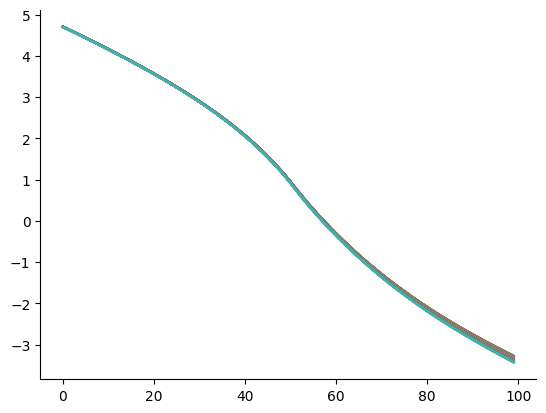

In [76]:
plt.plot(res["v0"])
plt.show()

In [77]:
ϕ_list[4] = res["v0"]
ems_list[4] = res["ems"]

In [79]:
res = solve_prep(y1_mat, y2_mat, γ3_list[9], 1e-6, 0.05, 20000, 0.05, True)

Episode 0: PDE Error: 1.505014371241; False Transient Error: 1.213810031728; Iterations: 164; CG Error: 0.000000000092
Episode 1: PDE Error: 1.211219556721; False Transient Error: 0.979040769760; Iterations: 171; CG Error: 0.000000000086
Episode 2: PDE Error: 0.978562504198; False Transient Error: 0.793097655602; Iterations: 171; CG Error: 0.000000000088
Episode 3: PDE Error: 0.793064148348; False Transient Error: 0.644796761338; Iterations: 169; CG Error: 0.000000000097
Episode 4: PDE Error: 0.644839600031; False Transient Error: 0.526255695298; Iterations: 177; CG Error: 0.000000000095
Episode 5: PDE Error: 0.526270230814; False Transient Error: 0.431400410143; Iterations: 220; CG Error: 0.000000000090
Episode 6: PDE Error: 0.431361048684; False Transient Error: 0.355449287344; Iterations: 324; CG Error: 0.000000000099
Episode 7: PDE Error: 0.355357207969; False Transient Error: 0.294607887137; Iterations: 437; CG Error: 0.000000000095
Episode 8: PDE Error: 0.294472903300; False Tran

Episode 69: PDE Error: 0.097820679864; False Transient Error: 0.097383079278; Iterations: 3136; CG Error: 0.000000000095
Episode 70: PDE Error: 0.097549377355; False Transient Error: 0.097126310702; Iterations: 3195; CG Error: 0.000000000099
Episode 71: PDE Error: 0.097282307260; False Transient Error: 0.096873082236; Iterations: 3129; CG Error: 0.000000000083
Episode 72: PDE Error: 0.097019319376; False Transient Error: 0.096623272237; Iterations: 3084; CG Error: 0.000000000098
Episode 73: PDE Error: 0.096760270843; False Transient Error: 0.096376760234; Iterations: 3029; CG Error: 0.000000000093
Episode 74: PDE Error: 0.096505018934; False Transient Error: 0.096133429625; Iterations: 3069; CG Error: 0.000000000079
Episode 75: PDE Error: 0.096253425970; False Transient Error: 0.095893168458; Iterations: 3083; CG Error: 0.000000000094
Episode 76: PDE Error: 0.096005360178; False Transient Error: 0.095655870083; Iterations: 3042; CG Error: 0.000000000078
Episode 77: PDE Error: 0.0957606

Episode 137: PDE Error: 0.084747979661; False Transient Error: 0.084591714099; Iterations: 1783; CG Error: 0.000000000098
Episode 138: PDE Error: 0.084602391120; False Transient Error: 0.084447176308; Iterations: 1712; CG Error: 0.000000000095
Episode 139: PDE Error: 0.084457647624; False Transient Error: 0.084303477790; Iterations: 1746; CG Error: 0.000000000097
Episode 140: PDE Error: 0.084313749036; False Transient Error: 0.084160597629; Iterations: 1737; CG Error: 0.000000000095
Episode 141: PDE Error: 0.084170673588; False Transient Error: 0.084018533754; Iterations: 1727; CG Error: 0.000000000097
Episode 142: PDE Error: 0.084028420107; False Transient Error: 0.083877275820; Iterations: 1716; CG Error: 0.000000000095
Episode 143: PDE Error: 0.083886976641; False Transient Error: 0.083736811936; Iterations: 1707; CG Error: 0.000000000090
Episode 144: PDE Error: 0.083746331822; False Transient Error: 0.083597130884; Iterations: 1679; CG Error: 0.000000000088
Episode 145: PDE Error: 

Episode 205: PDE Error: 0.076364148235; False Transient Error: 0.076255019744; Iterations: 1056; CG Error: 0.000000000099
Episode 206: PDE Error: 0.076258826569; False Transient Error: 0.076150144648; Iterations: 1050; CG Error: 0.000000000088
Episode 207: PDE Error: 0.076153912928; False Transient Error: 0.076045672801; Iterations: 1044; CG Error: 0.000000000099
Episode 208: PDE Error: 0.076049403261; False Transient Error: 0.075941600899; Iterations: 1037; CG Error: 0.000000000092
Episode 209: PDE Error: 0.075945294710; False Transient Error: 0.075837926365; Iterations: 1029; CG Error: 0.000000000091
Episode 210: PDE Error: 0.075841583451; False Transient Error: 0.075734644392; Iterations: 1022; CG Error: 0.000000000093
Episode 211: PDE Error: 0.075738266096; False Transient Error: 0.075631751861; Iterations: 1016; CG Error: 0.000000000090
Episode 212: PDE Error: 0.075635338708; False Transient Error: 0.075529245940; Iterations: 1009; CG Error: 0.000000000095
Episode 213: PDE Error: 

Episode 273: PDE Error: 0.069983536647; False Transient Error: 0.069897359114; Iterations: 660; CG Error: 0.000000000100
Episode 274: PDE Error: 0.069899652645; False Transient Error: 0.069813730168; Iterations: 657; CG Error: 0.000000000100
Episode 275: PDE Error: 0.069816012706; False Transient Error: 0.069730341586; Iterations: 653; CG Error: 0.000000000098
Episode 276: PDE Error: 0.069732612216; False Transient Error: 0.069647192195; Iterations: 648; CG Error: 0.000000000099
Episode 277: PDE Error: 0.069649450650; False Transient Error: 0.069564280398; Iterations: 644; CG Error: 0.000000000095
Episode 278: PDE Error: 0.069566527957; False Transient Error: 0.069481604664; Iterations: 640; CG Error: 0.000000000096
Episode 279: PDE Error: 0.069483841623; False Transient Error: 0.069399163412; Iterations: 635; CG Error: 0.000000000100
Episode 280: PDE Error: 0.069401388513; False Transient Error: 0.069316955566; Iterations: 630; CG Error: 0.000000000097
Episode 281: PDE Error: 0.069319

Episode 341: PDE Error: 0.064764127669; False Transient Error: 0.064692034926; Iterations: 408; CG Error: 0.000000000096
Episode 342: PDE Error: 0.064693808469; False Transient Error: 0.064621883286; Iterations: 404; CG Error: 0.000000000097
Episode 343: PDE Error: 0.064623652523; False Transient Error: 0.064551891992; Iterations: 400; CG Error: 0.000000000096
Episode 344: PDE Error: 0.064553656236; False Transient Error: 0.064482057490; Iterations: 394; CG Error: 0.000000000098
Episode 345: PDE Error: 0.064483817098; False Transient Error: 0.064412389930; Iterations: 392; CG Error: 0.000000000100
Episode 346: PDE Error: 0.064414146354; False Transient Error: 0.064342884040; Iterations: 390; CG Error: 0.000000000097
Episode 347: PDE Error: 0.064344634838; False Transient Error: 0.064273537682; Iterations: 388; CG Error: 0.000000000092
Episode 348: PDE Error: 0.064275284560; False Transient Error: 0.064204350990; Iterations: 386; CG Error: 0.000000000094
Episode 349: PDE Error: 0.064206

Episode 411: PDE Error: 0.060196346451; False Transient Error: 0.060134213908; Iterations: 249; CG Error: 0.000000000091
Episode 412: PDE Error: 0.060135768062; False Transient Error: 0.060073756143; Iterations: 248; CG Error: 0.000000000096
Episode 413: PDE Error: 0.060075308679; False Transient Error: 0.060013416322; Iterations: 247; CG Error: 0.000000000096
Episode 414: PDE Error: 0.060014969808; False Transient Error: 0.059953195013; Iterations: 245; CG Error: 0.000000000099
Episode 415: PDE Error: 0.059954743570; False Transient Error: 0.059893089827; Iterations: 244; CG Error: 0.000000000095
Episode 416: PDE Error: 0.059894637470; False Transient Error: 0.059833101964; Iterations: 243; CG Error: 0.000000000095
Episode 417: PDE Error: 0.059834648730; False Transient Error: 0.059773230915; Iterations: 242; CG Error: 0.000000000095
Episode 418: PDE Error: 0.059774774533; False Transient Error: 0.059713476230; Iterations: 240; CG Error: 0.000000000095
Episode 419: PDE Error: 0.059715

Episode 486: PDE Error: 0.055952049487; False Transient Error: 0.055897724977; Iterations: 174; CG Error: 0.000000000099
Episode 487: PDE Error: 0.055899183727; False Transient Error: 0.055844948768; Iterations: 174; CG Error: 0.000000000097
Episode 488: PDE Error: 0.055846406694; False Transient Error: 0.055792260238; Iterations: 174; CG Error: 0.000000000094
Episode 489: PDE Error: 0.055793717341; False Transient Error: 0.055739659062; Iterations: 174; CG Error: 0.000000000092
Episode 490: PDE Error: 0.055741115358; False Transient Error: 0.055687145136; Iterations: 174; CG Error: 0.000000000091
Episode 491: PDE Error: 0.055688600651; False Transient Error: 0.055634717988; Iterations: 173; CG Error: 0.000000000099
Episode 492: PDE Error: 0.055636172489; False Transient Error: 0.055582378380; Iterations: 173; CG Error: 0.000000000096
Episode 493: PDE Error: 0.055583832080; False Transient Error: 0.055530125859; Iterations: 173; CG Error: 0.000000000094
Episode 494: PDE Error: 0.055531

Episode 558: PDE Error: 0.052356056959; False Transient Error: 0.052307471897; Iterations: 163; CG Error: 0.000000000098
Episode 559: PDE Error: 0.052308892339; False Transient Error: 0.052260378177; Iterations: 163; CG Error: 0.000000000096
Episode 560: PDE Error: 0.052261798378; False Transient Error: 0.052213354879; Iterations: 163; CG Error: 0.000000000095
Episode 561: PDE Error: 0.052214774816; False Transient Error: 0.052166401772; Iterations: 163; CG Error: 0.000000000093
Episode 562: PDE Error: 0.052167821424; False Transient Error: 0.052119518646; Iterations: 163; CG Error: 0.000000000092
Episode 563: PDE Error: 0.052120938007; False Transient Error: 0.052072705296; Iterations: 163; CG Error: 0.000000000091
Episode 564: PDE Error: 0.052074124364; False Transient Error: 0.052025961512; Iterations: 163; CG Error: 0.000000000090
Episode 565: PDE Error: 0.052027380279; False Transient Error: 0.051979286674; Iterations: 162; CG Error: 0.000000000099
Episode 566: PDE Error: 0.051980

Episode 630: PDE Error: 0.049127539248; False Transient Error: 0.049083505065; Iterations: 155; CG Error: 0.000000000097
Episode 631: PDE Error: 0.049084911514; False Transient Error: 0.049040933278; Iterations: 155; CG Error: 0.000000000096
Episode 632: PDE Error: 0.049042339712; False Transient Error: 0.048998417223; Iterations: 155; CG Error: 0.000000000094
Episode 633: PDE Error: 0.048999823644; False Transient Error: 0.048955956728; Iterations: 155; CG Error: 0.000000000093
Episode 634: PDE Error: 0.048957363141; False Transient Error: 0.048913550723; Iterations: 154; CG Error: 0.000000000100
Episode 635: PDE Error: 0.048914958435; False Transient Error: 0.048871201044; Iterations: 154; CG Error: 0.000000000098
Episode 636: PDE Error: 0.048872608772; False Transient Error: 0.048828906316; Iterations: 154; CG Error: 0.000000000096
Episode 637: PDE Error: 0.048830314056; False Transient Error: 0.048786666480; Iterations: 154; CG Error: 0.000000000094
Episode 638: PDE Error: 0.048788

Episode 702: PDE Error: 0.046190090470; False Transient Error: 0.046149603055; Iterations: 151; CG Error: 0.000000000096
Episode 703: PDE Error: 0.046151011313; False Transient Error: 0.046110566304; Iterations: 151; CG Error: 0.000000000096
Episode 704: PDE Error: 0.046111974697; False Transient Error: 0.046071571910; Iterations: 151; CG Error: 0.000000000096
Episode 705: PDE Error: 0.046072980416; False Transient Error: 0.046032619690; Iterations: 151; CG Error: 0.000000000095
Episode 706: PDE Error: 0.046034028277; False Transient Error: 0.045993709460; Iterations: 151; CG Error: 0.000000000095
Episode 707: PDE Error: 0.045995118108; False Transient Error: 0.045954841039; Iterations: 151; CG Error: 0.000000000095
Episode 708: PDE Error: 0.045956249723; False Transient Error: 0.045916014246; Iterations: 151; CG Error: 0.000000000096
Episode 709: PDE Error: 0.045917422959; False Transient Error: 0.045877228905; Iterations: 151; CG Error: 0.000000000096
Episode 710: PDE Error: 0.045878

Episode 774: PDE Error: 0.043474353497; False Transient Error: 0.043436454316; Iterations: 150; CG Error: 0.000000000095
Episode 775: PDE Error: 0.043437878455; False Transient Error: 0.043400008818; Iterations: 150; CG Error: 0.000000000095
Episode 776: PDE Error: 0.043401433286; False Transient Error: 0.043363592993; Iterations: 150; CG Error: 0.000000000095
Episode 777: PDE Error: 0.043365017832; False Transient Error: 0.043327206676; Iterations: 150; CG Error: 0.000000000095
Episode 778: PDE Error: 0.043328631927; False Transient Error: 0.043290850001; Iterations: 149; CG Error: 0.000000000100
Episode 779: PDE Error: 0.043292273361; False Transient Error: 0.043254521632; Iterations: 149; CG Error: 0.000000000099
Episode 780: PDE Error: 0.043255945323; False Transient Error: 0.043218222879; Iterations: 149; CG Error: 0.000000000099
Episode 781: PDE Error: 0.043219646924; False Transient Error: 0.043181953026; Iterations: 149; CG Error: 0.000000000099
Episode 782: PDE Error: 0.043183

Episode 846: PDE Error: 0.040915284947; False Transient Error: 0.040879120955; Iterations: 149; CG Error: 0.000000000089
Episode 847: PDE Error: 0.040880577671; False Transient Error: 0.040844432135; Iterations: 148; CG Error: 0.000000000099
Episode 848: PDE Error: 0.040845890840; False Transient Error: 0.040809763995; Iterations: 148; CG Error: 0.000000000099
Episode 849: PDE Error: 0.040811223176; False Transient Error: 0.040775115497; Iterations: 148; CG Error: 0.000000000099
Episode 850: PDE Error: 0.040776575151; False Transient Error: 0.040740486509; Iterations: 148; CG Error: 0.000000000098
Episode 851: PDE Error: 0.040741946639; False Transient Error: 0.040705876812; Iterations: 148; CG Error: 0.000000000098
Episode 852: PDE Error: 0.040707337426; False Transient Error: 0.040671286270; Iterations: 148; CG Error: 0.000000000099
Episode 853: PDE Error: 0.040672747377; False Transient Error: 0.040636714779; Iterations: 148; CG Error: 0.000000000099
Episode 854: PDE Error: 0.040638

Episode 918: PDE Error: 0.038461474311; False Transient Error: 0.038426476273; Iterations: 147; CG Error: 0.000000000095
Episode 919: PDE Error: 0.038427973133; False Transient Error: 0.038392988820; Iterations: 147; CG Error: 0.000000000095
Episode 920: PDE Error: 0.038394486371; False Transient Error: 0.038359515791; Iterations: 147; CG Error: 0.000000000095
Episode 921: PDE Error: 0.038361013980; False Transient Error: 0.038326057146; Iterations: 147; CG Error: 0.000000000095
Episode 922: PDE Error: 0.038327555927; False Transient Error: 0.038292612854; Iterations: 147; CG Error: 0.000000000095
Episode 923: PDE Error: 0.038294112188; False Transient Error: 0.038259182885; Iterations: 147; CG Error: 0.000000000096
Episode 924: PDE Error: 0.038260682751; False Transient Error: 0.038225767216; Iterations: 147; CG Error: 0.000000000096
Episode 925: PDE Error: 0.038227267611; False Transient Error: 0.038192365825; Iterations: 147; CG Error: 0.000000000097
Episode 926: PDE Error: 0.038193

Episode 990: PDE Error: 0.036084949991; False Transient Error: 0.036050893792; Iterations: 146; CG Error: 0.000000000094
Episode 991: PDE Error: 0.036052440723; False Transient Error: 0.036018397564; Iterations: 146; CG Error: 0.000000000094
Episode 992: PDE Error: 0.036019945156; False Transient Error: 0.035985915034; Iterations: 146; CG Error: 0.000000000095
Episode 993: PDE Error: 0.035987463327; False Transient Error: 0.035953446219; Iterations: 146; CG Error: 0.000000000095
Episode 994: PDE Error: 0.035954995205; False Transient Error: 0.035920991125; Iterations: 146; CG Error: 0.000000000096
Episode 995: PDE Error: 0.035922540796; False Transient Error: 0.035888549766; Iterations: 146; CG Error: 0.000000000096
Episode 996: PDE Error: 0.035890100093; False Transient Error: 0.035856122148; Iterations: 146; CG Error: 0.000000000097
Episode 997: PDE Error: 0.035857673118; False Transient Error: 0.035823708282; Iterations: 146; CG Error: 0.000000000097
Episode 998: PDE Error: 0.035825

Episode 1062: PDE Error: 0.033780311684; False Transient Error: 0.033747244354; Iterations: 146; CG Error: 0.000000000087
Episode 1063: PDE Error: 0.033748838522; False Transient Error: 0.033715785964; Iterations: 146; CG Error: 0.000000000086
Episode 1064: PDE Error: 0.033717380768; False Transient Error: 0.033684343003; Iterations: 146; CG Error: 0.000000000086
Episode 1065: PDE Error: 0.033685938451; False Transient Error: 0.033652915500; Iterations: 146; CG Error: 0.000000000086
Episode 1066: PDE Error: 0.033654511605; False Transient Error: 0.033621503483; Iterations: 146; CG Error: 0.000000000086
Episode 1067: PDE Error: 0.033623100261; False Transient Error: 0.033590106981; Iterations: 146; CG Error: 0.000000000086
Episode 1068: PDE Error: 0.033591704450; False Transient Error: 0.033558726022; Iterations: 146; CG Error: 0.000000000086
Episode 1069: PDE Error: 0.033560324198; False Transient Error: 0.033527360635; Iterations: 146; CG Error: 0.000000000086
Episode 1070: PDE Error:

Episode 1134: PDE Error: 0.031555555010; False Transient Error: 0.031523631331; Iterations: 144; CG Error: 0.000000000087
Episode 1135: PDE Error: 0.031525274268; False Transient Error: 0.031493367732; Iterations: 144; CG Error: 0.000000000087
Episode 1136: PDE Error: 0.031495011295; False Transient Error: 0.031463121923; Iterations: 144; CG Error: 0.000000000087
Episode 1137: PDE Error: 0.031464766129; False Transient Error: 0.031432893939; Iterations: 144; CG Error: 0.000000000087
Episode 1138: PDE Error: 0.031434538800; False Transient Error: 0.031402683814; Iterations: 144; CG Error: 0.000000000087
Episode 1139: PDE Error: 0.031404329343; False Transient Error: 0.031372491582; Iterations: 144; CG Error: 0.000000000087
Episode 1140: PDE Error: 0.031374137786; False Transient Error: 0.031342317277; Iterations: 144; CG Error: 0.000000000087
Episode 1141: PDE Error: 0.031343964159; False Transient Error: 0.031312160932; Iterations: 144; CG Error: 0.000000000086
Episode 1142: PDE Error:

Episode 1206: PDE Error: 0.029422482428; False Transient Error: 0.029391862485; Iterations: 142; CG Error: 0.000000000084
Episode 1207: PDE Error: 0.029393553077; False Transient Error: 0.029362952323; Iterations: 142; CG Error: 0.000000000084
Episode 1208: PDE Error: 0.029364643449; False Transient Error: 0.029334061880; Iterations: 142; CG Error: 0.000000000083
Episode 1209: PDE Error: 0.029335753539; False Transient Error: 0.029305191171; Iterations: 142; CG Error: 0.000000000083
Episode 1210: PDE Error: 0.029306883366; False Transient Error: 0.029276340217; Iterations: 142; CG Error: 0.000000000083
Episode 1211: PDE Error: 0.029278032948; False Transient Error: 0.029247509034; Iterations: 142; CG Error: 0.000000000083
Episode 1212: PDE Error: 0.029249202300; False Transient Error: 0.029218697639; Iterations: 142; CG Error: 0.000000000083
Episode 1213: PDE Error: 0.029220391440; False Transient Error: 0.029189906046; Iterations: 142; CG Error: 0.000000000083
Episode 1214: PDE Error:

Episode 1278: PDE Error: 0.027390996675; False Transient Error: 0.027361795749; Iterations: 140; CG Error: 0.000000000089
Episode 1279: PDE Error: 0.027363530051; False Transient Error: 0.027334349345; Iterations: 140; CG Error: 0.000000000089
Episode 1280: PDE Error: 0.027336084212; False Transient Error: 0.027306923741; Iterations: 140; CG Error: 0.000000000089
Episode 1281: PDE Error: 0.027308659175; False Transient Error: 0.027279518951; Iterations: 140; CG Error: 0.000000000088
Episode 1282: PDE Error: 0.027281254955; False Transient Error: 0.027252134995; Iterations: 140; CG Error: 0.000000000088
Episode 1283: PDE Error: 0.027253871568; False Transient Error: 0.027224771887; Iterations: 140; CG Error: 0.000000000088
Episode 1284: PDE Error: 0.027226509037; False Transient Error: 0.027197429647; Iterations: 140; CG Error: 0.000000000088
Episode 1285: PDE Error: 0.027199167375; False Transient Error: 0.027170108292; Iterations: 140; CG Error: 0.000000000087
Episode 1286: PDE Error:

Episode 1346: PDE Error: 0.025571115881; False Transient Error: 0.025543311054; Iterations: 139; CG Error: 0.000000000099
Episode 1347: PDE Error: 0.025545082184; False Transient Error: 0.025517298031; Iterations: 139; CG Error: 0.000000000099
Episode 1348: PDE Error: 0.025519069715; False Transient Error: 0.025491306247; Iterations: 139; CG Error: 0.000000000099
Episode 1349: PDE Error: 0.025493078484; False Transient Error: 0.025465335708; Iterations: 139; CG Error: 0.000000000099
Episode 1350: PDE Error: 0.025467108495; False Transient Error: 0.025439386417; Iterations: 139; CG Error: 0.000000000099
Episode 1351: PDE Error: 0.025441159751; False Transient Error: 0.025413458376; Iterations: 139; CG Error: 0.000000000099
Episode 1352: PDE Error: 0.025415232253; False Transient Error: 0.025387551583; Iterations: 139; CG Error: 0.000000000099
Episode 1353: PDE Error: 0.025389326001; False Transient Error: 0.025361666034; Iterations: 139; CG Error: 0.000000000100
Episode 1354: PDE Error:

Episode 1420: PDE Error: 0.024053259206; False Transient Error: 0.023987439602; Iterations: 138; CG Error: 0.000000000095
Episode 1421: PDE Error: 0.024041753478; False Transient Error: 0.023975754562; Iterations: 138; CG Error: 0.000000000095
Episode 1422: PDE Error: 0.024030253271; False Transient Error: 0.023964075200; Iterations: 138; CG Error: 0.000000000095
Episode 1423: PDE Error: 0.024018758581; False Transient Error: 0.023952401511; Iterations: 138; CG Error: 0.000000000095
Episode 1424: PDE Error: 0.024007269401; False Transient Error: 0.023940733491; Iterations: 138; CG Error: 0.000000000095
Episode 1425: PDE Error: 0.023995785728; False Transient Error: 0.023929071137; Iterations: 138; CG Error: 0.000000000095
Episode 1426: PDE Error: 0.023984307558; False Transient Error: 0.023917414444; Iterations: 138; CG Error: 0.000000000095
Episode 1427: PDE Error: 0.023972834886; False Transient Error: 0.023905763411; Iterations: 138; CG Error: 0.000000000095
Episode 1428: PDE Error:

Episode 1490: PDE Error: 0.023267412926; False Transient Error: 0.023183048743; Iterations: 138; CG Error: 0.000000000086
Episode 1491: PDE Error: 0.023256513989; False Transient Error: 0.023171754573; Iterations: 138; CG Error: 0.000000000086
Episode 1492: PDE Error: 0.023245620188; False Transient Error: 0.023160465887; Iterations: 138; CG Error: 0.000000000086
Episode 1493: PDE Error: 0.023234731524; False Transient Error: 0.023149182681; Iterations: 138; CG Error: 0.000000000086
Episode 1494: PDE Error: 0.023223847992; False Transient Error: 0.023137904954; Iterations: 138; CG Error: 0.000000000086
Episode 1495: PDE Error: 0.023212969590; False Transient Error: 0.023126632703; Iterations: 138; CG Error: 0.000000000086
Episode 1496: PDE Error: 0.023202096320; False Transient Error: 0.023115365924; Iterations: 138; CG Error: 0.000000000086
Episode 1497: PDE Error: 0.023191228174; False Transient Error: 0.023104104082; Iterations: 137; CG Error: 0.000000000100
Episode 1498: PDE Error:

Episode 1564: PDE Error: 0.022474623336; False Transient Error: 0.022361929774; Iterations: 136; CG Error: 0.000000000099
Episode 1565: PDE Error: 0.022464098687; False Transient Error: 0.022351034711; Iterations: 136; CG Error: 0.000000000099
Episode 1566: PDE Error: 0.022453579061; False Transient Error: 0.022340144927; Iterations: 136; CG Error: 0.000000000099
Episode 1567: PDE Error: 0.022443064447; False Transient Error: 0.022329260412; Iterations: 136; CG Error: 0.000000000099
Episode 1568: PDE Error: 0.022432554834; False Transient Error: 0.022318381162; Iterations: 136; CG Error: 0.000000000099
Episode 1569: PDE Error: 0.022422050208; False Transient Error: 0.022307507176; Iterations: 136; CG Error: 0.000000000099
Episode 1570: PDE Error: 0.022411550559; False Transient Error: 0.022296638456; Iterations: 136; CG Error: 0.000000000099
Episode 1571: PDE Error: 0.022401055875; False Transient Error: 0.022285775009; Iterations: 136; CG Error: 0.000000000099
Episode 1572: PDE Error:

Episode 1637: PDE Error: 0.021719248107; False Transient Error: 0.021580345328; Iterations: 136; CG Error: 0.000000000091
Episode 1638: PDE Error: 0.021709080442; False Transient Error: 0.021569830203; Iterations: 136; CG Error: 0.000000000091
Episode 1639: PDE Error: 0.021698917586; False Transient Error: 0.021559320187; Iterations: 136; CG Error: 0.000000000091
Episode 1640: PDE Error: 0.021688759535; False Transient Error: 0.021548815279; Iterations: 136; CG Error: 0.000000000091
Episode 1641: PDE Error: 0.021678606287; False Transient Error: 0.021538315475; Iterations: 136; CG Error: 0.000000000091
Episode 1642: PDE Error: 0.021668457837; False Transient Error: 0.021527820772; Iterations: 136; CG Error: 0.000000000091
Episode 1643: PDE Error: 0.021658314184; False Transient Error: 0.021517331167; Iterations: 136; CG Error: 0.000000000090
Episode 1644: PDE Error: 0.021648175327; False Transient Error: 0.021506846658; Iterations: 136; CG Error: 0.000000000090
Episode 1645: PDE Error:

Episode 1709: PDE Error: 0.020999340624; False Transient Error: 0.020836175220; Iterations: 135; CG Error: 0.000000000097
Episode 1710: PDE Error: 0.020989513779; False Transient Error: 0.020826022019; Iterations: 135; CG Error: 0.000000000097
Episode 1711: PDE Error: 0.020979691571; False Transient Error: 0.020815873710; Iterations: 135; CG Error: 0.000000000097
Episode 1712: PDE Error: 0.020969874003; False Transient Error: 0.020805730297; Iterations: 135; CG Error: 0.000000000097
Episode 1713: PDE Error: 0.020960061073; False Transient Error: 0.020795591784; Iterations: 135; CG Error: 0.000000000097
Episode 1714: PDE Error: 0.020950252780; False Transient Error: 0.020785458172; Iterations: 135; CG Error: 0.000000000097
Episode 1715: PDE Error: 0.020940449121; False Transient Error: 0.020775329466; Iterations: 135; CG Error: 0.000000000096
Episode 1716: PDE Error: 0.020930650096; False Transient Error: 0.020765205667; Iterations: 135; CG Error: 0.000000000096
Episode 1717: PDE Error:

Episode 1781: PDE Error: 0.020303572136; False Transient Error: 0.020117606001; Iterations: 134; CG Error: 0.000000000098
Episode 1782: PDE Error: 0.020294074975; False Transient Error: 0.020107802142; Iterations: 134; CG Error: 0.000000000098
Episode 1783: PDE Error: 0.020284582292; False Transient Error: 0.020098003105; Iterations: 134; CG Error: 0.000000000098
Episode 1784: PDE Error: 0.020275094079; False Transient Error: 0.020088208886; Iterations: 134; CG Error: 0.000000000098
Episode 1785: PDE Error: 0.020265610332; False Transient Error: 0.020078419479; Iterations: 134; CG Error: 0.000000000098
Episode 1786: PDE Error: 0.020256131050; False Transient Error: 0.020068634870; Iterations: 134; CG Error: 0.000000000098
Episode 1787: PDE Error: 0.020246656237; False Transient Error: 0.020058855043; Iterations: 134; CG Error: 0.000000000097
Episode 1788: PDE Error: 0.020237185897; False Transient Error: 0.020049079981; Iterations: 134; CG Error: 0.000000000097
Episode 1789: PDE Error:

Episode 1853: PDE Error: 0.019631159295; False Transient Error: 0.019423767662; Iterations: 134; CG Error: 0.000000000092
Episode 1854: PDE Error: 0.019621981194; False Transient Error: 0.019414300940; Iterations: 134; CG Error: 0.000000000091
Episode 1855: PDE Error: 0.019612807456; False Transient Error: 0.019404838819; Iterations: 134; CG Error: 0.000000000091
Episode 1856: PDE Error: 0.019603638076; False Transient Error: 0.019395381297; Iterations: 134; CG Error: 0.000000000091
Episode 1857: PDE Error: 0.019594473055; False Transient Error: 0.019385928373; Iterations: 134; CG Error: 0.000000000091
Episode 1858: PDE Error: 0.019585312390; False Transient Error: 0.019376480043; Iterations: 134; CG Error: 0.000000000091
Episode 1859: PDE Error: 0.019576156077; False Transient Error: 0.019367036306; Iterations: 134; CG Error: 0.000000000091
Episode 1860: PDE Error: 0.019567004116; False Transient Error: 0.019357597160; Iterations: 134; CG Error: 0.000000000091
Episode 1861: PDE Error:

Episode 1922: PDE Error: 0.019007999205; False Transient Error: 0.018781244746; Iterations: 133; CG Error: 0.000000000094
Episode 1923: PDE Error: 0.018999117446; False Transient Error: 0.018772090528; Iterations: 133; CG Error: 0.000000000094
Episode 1924: PDE Error: 0.018990239910; False Transient Error: 0.018762940762; Iterations: 133; CG Error: 0.000000000094
Episode 1925: PDE Error: 0.018981366596; False Transient Error: 0.018753795445; Iterations: 133; CG Error: 0.000000000094
Episode 1926: PDE Error: 0.018972497503; False Transient Error: 0.018744654576; Iterations: 133; CG Error: 0.000000000094
Episode 1927: PDE Error: 0.018963632631; False Transient Error: 0.018735518152; Iterations: 133; CG Error: 0.000000000094
Episode 1928: PDE Error: 0.018954771976; False Transient Error: 0.018726386170; Iterations: 133; CG Error: 0.000000000094
Episode 1929: PDE Error: 0.018945915539; False Transient Error: 0.018717258629; Iterations: 133; CG Error: 0.000000000094
Episode 1930: PDE Error:

Episode 1993: PDE Error: 0.018387787066; False Transient Error: 0.018142234280; Iterations: 133; CG Error: 0.000000000090
Episode 1994: PDE Error: 0.018379200619; False Transient Error: 0.018133390807; Iterations: 133; CG Error: 0.000000000090
Episode 1995: PDE Error: 0.018370618265; False Transient Error: 0.018124551636; Iterations: 133; CG Error: 0.000000000090
Episode 1996: PDE Error: 0.018362039997; False Transient Error: 0.018115716767; Iterations: 133; CG Error: 0.000000000090
Episode 1997: PDE Error: 0.018353465818; False Transient Error: 0.018106886196; Iterations: 133; CG Error: 0.000000000090
Episode 1998: PDE Error: 0.018344895725; False Transient Error: 0.018098059922; Iterations: 133; CG Error: 0.000000000090
Episode 1999: PDE Error: 0.018336329715; False Transient Error: 0.018089237943; Iterations: 133; CG Error: 0.000000000090
Episode 2000: PDE Error: 0.018327767784; False Transient Error: 0.018080420256; Iterations: 133; CG Error: 0.000000000090
Episode 2001: PDE Error:

Episode 2064: PDE Error: 0.017797149957; False Transient Error: 0.017524911912; Iterations: 132; CG Error: 0.000000000095
Episode 2065: PDE Error: 0.017789008786; False Transient Error: 0.017516368676; Iterations: 132; CG Error: 0.000000000095
Episode 2066: PDE Error: 0.017780871460; False Transient Error: 0.017507829597; Iterations: 132; CG Error: 0.000000000095
Episode 2067: PDE Error: 0.017772737980; False Transient Error: 0.017499294672; Iterations: 132; CG Error: 0.000000000095
Episode 2068: PDE Error: 0.017764608345; False Transient Error: 0.017490763899; Iterations: 132; CG Error: 0.000000000095
Episode 2069: PDE Error: 0.017756482550; False Transient Error: 0.017482237276; Iterations: 132; CG Error: 0.000000000095
Episode 2070: PDE Error: 0.017748360595; False Transient Error: 0.017473714801; Iterations: 132; CG Error: 0.000000000095
Episode 2071: PDE Error: 0.017740242478; False Transient Error: 0.017465196473; Iterations: 132; CG Error: 0.000000000095
Episode 2072: PDE Error:

Episode 2136: PDE Error: 0.017220714374; False Transient Error: 0.016920303713; Iterations: 132; CG Error: 0.000000000093
Episode 2137: PDE Error: 0.017212845735; False Transient Error: 0.016912054630; Iterations: 132; CG Error: 0.000000000093
Episode 2138: PDE Error: 0.017204980819; False Transient Error: 0.016903809560; Iterations: 132; CG Error: 0.000000000093
Episode 2139: PDE Error: 0.017197119624; False Transient Error: 0.016895568499; Iterations: 132; CG Error: 0.000000000093
Episode 2140: PDE Error: 0.017189262147; False Transient Error: 0.016887331447; Iterations: 132; CG Error: 0.000000000093
Episode 2141: PDE Error: 0.017181408386; False Transient Error: 0.016879098401; Iterations: 132; CG Error: 0.000000000093
Episode 2142: PDE Error: 0.017173558341; False Transient Error: 0.016870869359; Iterations: 132; CG Error: 0.000000000093
Episode 2143: PDE Error: 0.017165712010; False Transient Error: 0.016862644319; Iterations: 132; CG Error: 0.000000000093
Episode 2144: PDE Error:

Episode 2208: PDE Error: 0.016663585953; False Transient Error: 0.016336510554; Iterations: 131; CG Error: 0.000000000097
Episode 2209: PDE Error: 0.016655980996; False Transient Error: 0.016328545481; Iterations: 131; CG Error: 0.000000000097
Episode 2210: PDE Error: 0.016648379643; False Transient Error: 0.016320584284; Iterations: 131; CG Error: 0.000000000097
Episode 2211: PDE Error: 0.016640781886; False Transient Error: 0.016312626961; Iterations: 131; CG Error: 0.000000000097
Episode 2212: PDE Error: 0.016633187726; False Transient Error: 0.016304673510; Iterations: 131; CG Error: 0.000000000097
Episode 2213: PDE Error: 0.016625597166; False Transient Error: 0.016296723929; Iterations: 131; CG Error: 0.000000000097
Episode 2214: PDE Error: 0.016618010199; False Transient Error: 0.016288778216; Iterations: 131; CG Error: 0.000000000097
Episode 2215: PDE Error: 0.016610426822; False Transient Error: 0.016280836369; Iterations: 131; CG Error: 0.000000000096
Episode 2216: PDE Error:

Episode 2280: PDE Error: 0.016125135399; False Transient Error: 0.015772817836; Iterations: 131; CG Error: 0.000000000093
Episode 2281: PDE Error: 0.016117785539; False Transient Error: 0.015765126980; Iterations: 131; CG Error: 0.000000000093
Episode 2282: PDE Error: 0.016110439161; False Transient Error: 0.015757439868; Iterations: 131; CG Error: 0.000000000093
Episode 2283: PDE Error: 0.016103096269; False Transient Error: 0.015749756495; Iterations: 131; CG Error: 0.000000000093
Episode 2284: PDE Error: 0.016095756857; False Transient Error: 0.015742076862; Iterations: 131; CG Error: 0.000000000093
Episode 2285: PDE Error: 0.016088420925; False Transient Error: 0.015734400965; Iterations: 131; CG Error: 0.000000000093
Episode 2286: PDE Error: 0.016081088468; False Transient Error: 0.015726728804; Iterations: 131; CG Error: 0.000000000093
Episode 2287: PDE Error: 0.016073759491; False Transient Error: 0.015719060376; Iterations: 131; CG Error: 0.000000000093
Episode 2288: PDE Error:

Episode 2352: PDE Error: 0.015604756626; False Transient Error: 0.015228534402; Iterations: 131; CG Error: 0.000000000090
Episode 2353: PDE Error: 0.015597653582; False Transient Error: 0.015221108391; Iterations: 131; CG Error: 0.000000000090
Episode 2354: PDE Error: 0.015590553910; False Transient Error: 0.015213685994; Iterations: 131; CG Error: 0.000000000090
Episode 2355: PDE Error: 0.015583457609; False Transient Error: 0.015206267208; Iterations: 131; CG Error: 0.000000000090
Episode 2356: PDE Error: 0.015576364673; False Transient Error: 0.015198852032; Iterations: 131; CG Error: 0.000000000090
Episode 2357: PDE Error: 0.015569275105; False Transient Error: 0.015191440465; Iterations: 131; CG Error: 0.000000000090
Episode 2358: PDE Error: 0.015562188901; False Transient Error: 0.015184032503; Iterations: 131; CG Error: 0.000000000090
Episode 2359: PDE Error: 0.015555106060; False Transient Error: 0.015176628146; Iterations: 131; CG Error: 0.000000000090
Episode 2360: PDE Error:

Episode 2423: PDE Error: 0.015108731156; False Transient Error: 0.014710170275; Iterations: 130; CG Error: 0.000000000095
Episode 2424: PDE Error: 0.015101863659; False Transient Error: 0.014702996501; Iterations: 130; CG Error: 0.000000000095
Episode 2425: PDE Error: 0.015094999425; False Transient Error: 0.014695826219; Iterations: 130; CG Error: 0.000000000095
Episode 2426: PDE Error: 0.015088138450; False Transient Error: 0.014688659427; Iterations: 130; CG Error: 0.000000000095
Episode 2427: PDE Error: 0.015081280734; False Transient Error: 0.014681496123; Iterations: 130; CG Error: 0.000000000095
Episode 2428: PDE Error: 0.015074426278; False Transient Error: 0.014674336305; Iterations: 130; CG Error: 0.000000000095
Episode 2429: PDE Error: 0.015067575077; False Transient Error: 0.014667179973; Iterations: 130; CG Error: 0.000000000094
Episode 2430: PDE Error: 0.015060727127; False Transient Error: 0.014660027124; Iterations: 130; CG Error: 0.000000000094
Episode 2431: PDE Error:

Episode 2495: PDE Error: 0.014622522976; False Transient Error: 0.014202487622; Iterations: 129; CG Error: 0.000000000096
Episode 2496: PDE Error: 0.014615886547; False Transient Error: 0.014195560959; Iterations: 129; CG Error: 0.000000000096
Episode 2497: PDE Error: 0.014609253272; False Transient Error: 0.014188637666; Iterations: 129; CG Error: 0.000000000096
Episode 2498: PDE Error: 0.014602623151; False Transient Error: 0.014181717741; Iterations: 129; CG Error: 0.000000000096
Episode 2499: PDE Error: 0.014595996181; False Transient Error: 0.014174801184; Iterations: 129; CG Error: 0.000000000096
Episode 2500: PDE Error: 0.014589372364; False Transient Error: 0.014167887991; Iterations: 129; CG Error: 0.000000000096
Episode 2501: PDE Error: 0.014582751695; False Transient Error: 0.014160978162; Iterations: 129; CG Error: 0.000000000096
Episode 2502: PDE Error: 0.014576134175; False Transient Error: 0.014154071695; Iterations: 129; CG Error: 0.000000000096
Episode 2503: PDE Error:

Episode 2566: PDE Error: 0.014161230179; False Transient Error: 0.013718978152; Iterations: 129; CG Error: 0.000000000090
Episode 2567: PDE Error: 0.014154931386; False Transient Error: 0.013712286796; Iterations: 129; CG Error: 0.000000000090
Episode 2568: PDE Error: 0.014148635578; False Transient Error: 0.013705598698; Iterations: 129; CG Error: 0.000000000090
Episode 2569: PDE Error: 0.014142342749; False Transient Error: 0.013698913855; Iterations: 129; CG Error: 0.000000000090
Episode 2570: PDE Error: 0.014136052895; False Transient Error: 0.013692232266; Iterations: 129; CG Error: 0.000000000090
Episode 2571: PDE Error: 0.014129766023; False Transient Error: 0.013685553929; Iterations: 129; CG Error: 0.000000000090
Episode 2572: PDE Error: 0.014123482126; False Transient Error: 0.013678878843; Iterations: 129; CG Error: 0.000000000090
Episode 2573: PDE Error: 0.014117201200; False Transient Error: 0.013672207005; Iterations: 129; CG Error: 0.000000000089
Episode 2574: PDE Error:

Episode 2638: PDE Error: 0.014080148962; False Transient Error: 0.013245433420; Iterations: 128; CG Error: 0.000000000097
Episode 2639: PDE Error: 0.014079641223; False Transient Error: 0.013238972634; Iterations: 128; CG Error: 0.000000000097
Episode 2640: PDE Error: 0.014079132386; False Transient Error: 0.013232514982; Iterations: 128; CG Error: 0.000000000097
Episode 2641: PDE Error: 0.014078622454; False Transient Error: 0.013226060463; Iterations: 128; CG Error: 0.000000000097
Episode 2642: PDE Error: 0.014078111428; False Transient Error: 0.013219609079; Iterations: 128; CG Error: 0.000000000097
Episode 2643: PDE Error: 0.014077599312; False Transient Error: 0.013213160828; Iterations: 128; CG Error: 0.000000000097
Episode 2644: PDE Error: 0.014077086106; False Transient Error: 0.013206715710; Iterations: 128; CG Error: 0.000000000097
Episode 2645: PDE Error: 0.014076571812; False Transient Error: 0.013200273726; Iterations: 128; CG Error: 0.000000000097
Episode 2646: PDE Error:

Episode 2710: PDE Error: 0.014040897421; False Transient Error: 0.012788200917; Iterations: 128; CG Error: 0.000000000090
Episode 2711: PDE Error: 0.014040315366; False Transient Error: 0.012781962649; Iterations: 128; CG Error: 0.000000000090
Episode 2712: PDE Error: 0.014039732344; False Transient Error: 0.012775727417; Iterations: 128; CG Error: 0.000000000090
Episode 2713: PDE Error: 0.014039148357; False Transient Error: 0.012769495220; Iterations: 128; CG Error: 0.000000000090
Episode 2714: PDE Error: 0.014038563405; False Transient Error: 0.012763266057; Iterations: 128; CG Error: 0.000000000090
Episode 2715: PDE Error: 0.014037977492; False Transient Error: 0.012757039927; Iterations: 128; CG Error: 0.000000000090
Episode 2716: PDE Error: 0.014037390618; False Transient Error: 0.012750816828; Iterations: 128; CG Error: 0.000000000089
Episode 2717: PDE Error: 0.014036802785; False Transient Error: 0.012744596757; Iterations: 128; CG Error: 0.000000000089
Episode 2718: PDE Error:

Episode 2782: PDE Error: 0.014030086404; False Transient Error: 0.012346720356; Iterations: 127; CG Error: 0.000000000099
Episode 2783: PDE Error: 0.014030540503; False Transient Error: 0.012340696737; Iterations: 127; CG Error: 0.000000000099
Episode 2784: PDE Error: 0.014030995632; False Transient Error: 0.012334675968; Iterations: 127; CG Error: 0.000000000099
Episode 2785: PDE Error: 0.014031451784; False Transient Error: 0.012328658067; Iterations: 127; CG Error: 0.000000000099
Episode 2786: PDE Error: 0.014031908955; False Transient Error: 0.012322643055; Iterations: 127; CG Error: 0.000000000099
Episode 2787: PDE Error: 0.014032367137; False Transient Error: 0.012316630955; Iterations: 127; CG Error: 0.000000000098
Episode 2788: PDE Error: 0.014032826326; False Transient Error: 0.012310621787; Iterations: 127; CG Error: 0.000000000098
Episode 2789: PDE Error: 0.014033286519; False Transient Error: 0.012304615567; Iterations: 127; CG Error: 0.000000000098
Episode 2790: PDE Error:

Episode 2854: PDE Error: 0.014065264739; False Transient Error: 0.011920446402; Iterations: 127; CG Error: 0.000000000092
Episode 2855: PDE Error: 0.014065787282; False Transient Error: 0.011914630623; Iterations: 127; CG Error: 0.000000000092
Episode 2856: PDE Error: 0.014066310714; False Transient Error: 0.011908817675; Iterations: 127; CG Error: 0.000000000092
Episode 2857: PDE Error: 0.014066835035; False Transient Error: 0.011903007559; Iterations: 127; CG Error: 0.000000000092
Episode 2858: PDE Error: 0.014067360243; False Transient Error: 0.011897200271; Iterations: 127; CG Error: 0.000000000092
Episode 2859: PDE Error: 0.014067886337; False Transient Error: 0.011891395810; Iterations: 127; CG Error: 0.000000000092
Episode 2860: PDE Error: 0.014068413314; False Transient Error: 0.011885594177; Iterations: 127; CG Error: 0.000000000091
Episode 2861: PDE Error: 0.014068941174; False Transient Error: 0.011879795367; Iterations: 127; CG Error: 0.000000000091
Episode 2862: PDE Error:

Episode 2926: PDE Error: 0.014105069738; False Transient Error: 0.011508857063; Iterations: 126; CG Error: 0.000000000095
Episode 2927: PDE Error: 0.014105652445; False Transient Error: 0.011503241697; Iterations: 126; CG Error: 0.000000000095
Episode 2928: PDE Error: 0.014106235934; False Transient Error: 0.011497629066; Iterations: 126; CG Error: 0.000000000095
Episode 2929: PDE Error: 0.014106820204; False Transient Error: 0.011492019167; Iterations: 126; CG Error: 0.000000000095
Episode 2930: PDE Error: 0.014107405254; False Transient Error: 0.011486412001; Iterations: 126; CG Error: 0.000000000095
Episode 2931: PDE Error: 0.014107991081; False Transient Error: 0.011480807564; Iterations: 126; CG Error: 0.000000000095
Episode 2932: PDE Error: 0.014108577685; False Transient Error: 0.011475205857; Iterations: 126; CG Error: 0.000000000095
Episode 2933: PDE Error: 0.014109165065; False Transient Error: 0.011469606878; Iterations: 126; CG Error: 0.000000000095
Episode 2934: PDE Error:

Episode 2997: PDE Error: 0.014148305853; False Transient Error: 0.011116885712; Iterations: 126; CG Error: 0.000000000089
Episode 2998: PDE Error: 0.014148940648; False Transient Error: 0.011111461223; Iterations: 126; CG Error: 0.000000000089
Episode 2999: PDE Error: 0.014149576129; False Transient Error: 0.011106039376; Iterations: 126; CG Error: 0.000000000089
Episode 3000: PDE Error: 0.014150212293; False Transient Error: 0.011100620169; Iterations: 126; CG Error: 0.000000000089
Episode 3001: PDE Error: 0.014150849140; False Transient Error: 0.011095203602; Iterations: 126; CG Error: 0.000000000089
Episode 3002: PDE Error: 0.014151486669; False Transient Error: 0.011089789672; Iterations: 126; CG Error: 0.000000000089
Episode 3003: PDE Error: 0.014152124877; False Transient Error: 0.011084378379; Iterations: 126; CG Error: 0.000000000089
Episode 3004: PDE Error: 0.014152763764; False Transient Error: 0.011078969721; Iterations: 126; CG Error: 0.000000000089
Episode 3005: PDE Error:

Episode 3068: PDE Error: 0.014195005718; False Transient Error: 0.010738244592; Iterations: 125; CG Error: 0.000000000096
Episode 3069: PDE Error: 0.014195685986; False Transient Error: 0.010733004503; Iterations: 125; CG Error: 0.000000000096
Episode 3070: PDE Error: 0.014196366853; False Transient Error: 0.010727766966; Iterations: 125; CG Error: 0.000000000096
Episode 3071: PDE Error: 0.014197048317; False Transient Error: 0.010722531979; Iterations: 125; CG Error: 0.000000000096
Episode 3072: PDE Error: 0.014197730377; False Transient Error: 0.010717299542; Iterations: 125; CG Error: 0.000000000096
Episode 3073: PDE Error: 0.014198413031; False Transient Error: 0.010712069654; Iterations: 125; CG Error: 0.000000000096
Episode 3074: PDE Error: 0.014199096279; False Transient Error: 0.010706842313; Iterations: 125; CG Error: 0.000000000096
Episode 3075: PDE Error: 0.014199780118; False Transient Error: 0.010701617518; Iterations: 125; CG Error: 0.000000000096
Episode 3076: PDE Error:

Episode 3140: PDE Error: 0.014245444878; False Transient Error: 0.010367408018; Iterations: 125; CG Error: 0.000000000092
Episode 3141: PDE Error: 0.014246165279; False Transient Error: 0.010362348547; Iterations: 125; CG Error: 0.000000000092
Episode 3142: PDE Error: 0.014246886196; False Transient Error: 0.010357291540; Iterations: 125; CG Error: 0.000000000092
Episode 3143: PDE Error: 0.014247607630; False Transient Error: 0.010352236997; Iterations: 125; CG Error: 0.000000000092
Episode 3144: PDE Error: 0.014248329578; False Transient Error: 0.010347184915; Iterations: 125; CG Error: 0.000000000092
Episode 3145: PDE Error: 0.014249052039; False Transient Error: 0.010342135294; Iterations: 125; CG Error: 0.000000000092
Episode 3146: PDE Error: 0.014249775014; False Transient Error: 0.010337088133; Iterations: 125; CG Error: 0.000000000092
Episode 3147: PDE Error: 0.014250498499; False Transient Error: 0.010332043430; Iterations: 125; CG Error: 0.000000000092
Episode 3148: PDE Error:

Episode 3212: PDE Error: 0.014298572281; False Transient Error: 0.010009354119; Iterations: 125; CG Error: 0.000000000089
Episode 3213: PDE Error: 0.014299327237; False Transient Error: 0.010004469053; Iterations: 125; CG Error: 0.000000000089
Episode 3214: PDE Error: 0.014300082637; False Transient Error: 0.009999586367; Iterations: 125; CG Error: 0.000000000089
Episode 3215: PDE Error: 0.014300838478; False Transient Error: 0.009994706059; Iterations: 125; CG Error: 0.000000000089
Episode 3216: PDE Error: 0.014301594761; False Transient Error: 0.009989828128; Iterations: 125; CG Error: 0.000000000089
Episode 3217: PDE Error: 0.014302351484; False Transient Error: 0.009984952574; Iterations: 125; CG Error: 0.000000000089
Episode 3218: PDE Error: 0.014303108646; False Transient Error: 0.009980079395; Iterations: 125; CG Error: 0.000000000089
Episode 3219: PDE Error: 0.014303866247; False Transient Error: 0.009975208589; Iterations: 125; CG Error: 0.000000000089
Episode 3220: PDE Error:

Episode 3284: PDE Error: 0.014354005087; False Transient Error: 0.009663643209; Iterations: 125; CG Error: 0.000000000088
Episode 3285: PDE Error: 0.014354789537; False Transient Error: 0.009658926550; Iterations: 125; CG Error: 0.000000000088
Episode 3286: PDE Error: 0.014355574363; False Transient Error: 0.009654212190; Iterations: 125; CG Error: 0.000000000088
Episode 3287: PDE Error: 0.014356359564; False Transient Error: 0.009649500126; Iterations: 125; CG Error: 0.000000000088
Episode 3288: PDE Error: 0.014357145139; False Transient Error: 0.009644790358; Iterations: 125; CG Error: 0.000000000088
Episode 3289: PDE Error: 0.014357931088; False Transient Error: 0.009640082884; Iterations: 125; CG Error: 0.000000000088
Episode 3290: PDE Error: 0.014358717410; False Transient Error: 0.009635377703; Iterations: 125; CG Error: 0.000000000088
Episode 3291: PDE Error: 0.014359504104; False Transient Error: 0.009630674814; Iterations: 125; CG Error: 0.000000000088
Episode 3292: PDE Error:

Episode 3356: PDE Error: 0.014411395387; False Transient Error: 0.009329850708; Iterations: 125; CG Error: 0.000000000087
Episode 3357: PDE Error: 0.014412204727; False Transient Error: 0.009325296662; Iterations: 125; CG Error: 0.000000000087
Episode 3358: PDE Error: 0.014413014382; False Transient Error: 0.009320744836; Iterations: 125; CG Error: 0.000000000087
Episode 3359: PDE Error: 0.014413824351; False Transient Error: 0.009316195227; Iterations: 125; CG Error: 0.000000000087
Episode 3360: PDE Error: 0.014414634634; False Transient Error: 0.009311647834; Iterations: 125; CG Error: 0.000000000087
Episode 3361: PDE Error: 0.014415445230; False Transient Error: 0.009307102657; Iterations: 125; CG Error: 0.000000000087
Episode 3362: PDE Error: 0.014416256138; False Transient Error: 0.009302559694; Iterations: 125; CG Error: 0.000000000087
Episode 3363: PDE Error: 0.014417067357; False Transient Error: 0.009298018945; Iterations: 125; CG Error: 0.000000000087
Episode 3364: PDE Error:

Episode 3428: PDE Error: 0.014470426660; False Transient Error: 0.009007566649; Iterations: 125; CG Error: 0.000000000085
Episode 3429: PDE Error: 0.014471256701; False Transient Error: 0.009003169625; Iterations: 125; CG Error: 0.000000000085
Episode 3430: PDE Error: 0.014472087001; False Transient Error: 0.008998773516; Iterations: 124; CG Error: 0.000000000100
Episode 3431: PDE Error: 0.014472916241; False Transient Error: 0.008994380541; Iterations: 124; CG Error: 0.000000000100
Episode 3432: PDE Error: 0.014473747492; False Transient Error: 0.008989990134; Iterations: 124; CG Error: 0.000000000100
Episode 3433: PDE Error: 0.014474578819; False Transient Error: 0.008985601962; Iterations: 124; CG Error: 0.000000000100
Episode 3434: PDE Error: 0.014475410251; False Transient Error: 0.008981215928; Iterations: 124; CG Error: 0.000000000100
Episode 3435: PDE Error: 0.014476241879; False Transient Error: 0.008976832005; Iterations: 124; CG Error: 0.000000000100
Episode 3436: PDE Error:

Episode 3500: PDE Error: 0.014530801338; False Transient Error: 0.008696409913; Iterations: 124; CG Error: 0.000000000098
Episode 3501: PDE Error: 0.014531648177; False Transient Error: 0.008692164507; Iterations: 124; CG Error: 0.000000000098
Episode 3502: PDE Error: 0.014532495228; False Transient Error: 0.008687921169; Iterations: 124; CG Error: 0.000000000098
Episode 3503: PDE Error: 0.014533342488; False Transient Error: 0.008683679898; Iterations: 124; CG Error: 0.000000000098
Episode 3504: PDE Error: 0.014534189957; False Transient Error: 0.008679440695; Iterations: 124; CG Error: 0.000000000098
Episode 3505: PDE Error: 0.014535037635; False Transient Error: 0.008675203557; Iterations: 124; CG Error: 0.000000000098
Episode 3506: PDE Error: 0.014535885520; False Transient Error: 0.008670968483; Iterations: 124; CG Error: 0.000000000098
Episode 3507: PDE Error: 0.014536733613; False Transient Error: 0.008666735473; Iterations: 124; CG Error: 0.000000000098
Episode 3508: PDE Error:

Episode 3572: PDE Error: 0.014592272637; False Transient Error: 0.008395968580; Iterations: 124; CG Error: 0.000000000095
Episode 3573: PDE Error: 0.014593132968; False Transient Error: 0.008391869573; Iterations: 124; CG Error: 0.000000000095
Episode 3574: PDE Error: 0.014593993463; False Transient Error: 0.008387772564; Iterations: 124; CG Error: 0.000000000095
Episode 3575: PDE Error: 0.014594854122; False Transient Error: 0.008383677551; Iterations: 124; CG Error: 0.000000000094
Episode 3576: PDE Error: 0.014595714944; False Transient Error: 0.008379584534; Iterations: 124; CG Error: 0.000000000094
Episode 3577: PDE Error: 0.014596575929; False Transient Error: 0.008375493511; Iterations: 124; CG Error: 0.000000000094
Episode 3578: PDE Error: 0.014597437075; False Transient Error: 0.008371404481; Iterations: 124; CG Error: 0.000000000094
Episode 3579: PDE Error: 0.014598298383; False Transient Error: 0.008367317445; Iterations: 124; CG Error: 0.000000000094
Episode 3580: PDE Error:

Episode 3644: PDE Error: 0.014654601433; False Transient Error: 0.008105888168; Iterations: 124; CG Error: 0.000000000091
Episode 3645: PDE Error: 0.014655472103; False Transient Error: 0.008101930524; Iterations: 124; CG Error: 0.000000000091
Episode 3646: PDE Error: 0.014656342897; False Transient Error: 0.008097974809; Iterations: 124; CG Error: 0.000000000091
Episode 3647: PDE Error: 0.014657213813; False Transient Error: 0.008094021022; Iterations: 124; CG Error: 0.000000000091
Episode 3648: PDE Error: 0.014658084850; False Transient Error: 0.008090069162; Iterations: 124; CG Error: 0.000000000091
Episode 3649: PDE Error: 0.014658956009; False Transient Error: 0.008086119228; Iterations: 124; CG Error: 0.000000000090
Episode 3650: PDE Error: 0.014659827289; False Transient Error: 0.008082171219; Iterations: 124; CG Error: 0.000000000090
Episode 3651: PDE Error: 0.014660698689; False Transient Error: 0.008078225133; Iterations: 124; CG Error: 0.000000000090
Episode 3652: PDE Error:

Episode 3716: PDE Error: 0.014717572172; False Transient Error: 0.007825812227; Iterations: 124; CG Error: 0.000000000087
Episode 3717: PDE Error: 0.014718450344; False Transient Error: 0.007821991083; Iterations: 124; CG Error: 0.000000000087
Episode 3718: PDE Error: 0.014719328602; False Transient Error: 0.007818171802; Iterations: 124; CG Error: 0.000000000087
Episode 3719: PDE Error: 0.014720206945; False Transient Error: 0.007814354381; Iterations: 124; CG Error: 0.000000000087
Episode 3720: PDE Error: 0.014721085372; False Transient Error: 0.007810538821; Iterations: 124; CG Error: 0.000000000087
Episode 3721: PDE Error: 0.014721963884; False Transient Error: 0.007806725121; Iterations: 124; CG Error: 0.000000000086
Episode 3722: PDE Error: 0.014722842479; False Transient Error: 0.007802913280; Iterations: 124; CG Error: 0.000000000086
Episode 3723: PDE Error: 0.014723721157; False Transient Error: 0.007799103296; Iterations: 124; CG Error: 0.000000000086
Episode 3724: PDE Error:

Episode 3788: PDE Error: 0.014780988657; False Transient Error: 0.007555395701; Iterations: 123; CG Error: 0.000000000097
Episode 3789: PDE Error: 0.014781871691; False Transient Error: 0.007551706363; Iterations: 123; CG Error: 0.000000000097
Episode 3790: PDE Error: 0.014782754776; False Transient Error: 0.007548018822; Iterations: 123; CG Error: 0.000000000097
Episode 3791: PDE Error: 0.014783637913; False Transient Error: 0.007544333079; Iterations: 123; CG Error: 0.000000000097
Episode 3792: PDE Error: 0.014784521100; False Transient Error: 0.007540649133; Iterations: 123; CG Error: 0.000000000097
Episode 3793: PDE Error: 0.014785404336; False Transient Error: 0.007536966982; Iterations: 123; CG Error: 0.000000000097
Episode 3794: PDE Error: 0.014786287620; False Transient Error: 0.007533286627; Iterations: 123; CG Error: 0.000000000097
Episode 3795: PDE Error: 0.014787170951; False Transient Error: 0.007529608065; Iterations: 123; CG Error: 0.000000000097
Episode 3796: PDE Error:

Episode 3860: PDE Error: 0.014844674230; False Transient Error: 0.007294307977; Iterations: 123; CG Error: 0.000000000093
Episode 3861: PDE Error: 0.014845559905; False Transient Error: 0.007290745903; Iterations: 123; CG Error: 0.000000000093
Episode 3862: PDE Error: 0.014846445598; False Transient Error: 0.007287185566; Iterations: 123; CG Error: 0.000000000093
Episode 3863: PDE Error: 0.014847331310; False Transient Error: 0.007283626964; Iterations: 123; CG Error: 0.000000000093
Episode 3864: PDE Error: 0.014848217041; False Transient Error: 0.007280070097; Iterations: 123; CG Error: 0.000000000093
Episode 3865: PDE Error: 0.014849102790; False Transient Error: 0.007276514964; Iterations: 123; CG Error: 0.000000000092
Episode 3866: PDE Error: 0.014849988556; False Transient Error: 0.007272961564; Iterations: 123; CG Error: 0.000000000092
Episode 3867: PDE Error: 0.014850874339; False Transient Error: 0.007269409896; Iterations: 123; CG Error: 0.000000000092
Episode 3868: PDE Error:

Episode 3932: PDE Error: 0.014908466119; False Transient Error: 0.007042226882; Iterations: 123; CG Error: 0.000000000089
Episode 3933: PDE Error: 0.014909352094; False Transient Error: 0.007038787692; Iterations: 123; CG Error: 0.000000000089
Episode 3934: PDE Error: 0.014910238059; False Transient Error: 0.007035350179; Iterations: 123; CG Error: 0.000000000089
Episode 3935: PDE Error: 0.014911124013; False Transient Error: 0.007031914342; Iterations: 123; CG Error: 0.000000000089
Episode 3936: PDE Error: 0.014912009957; False Transient Error: 0.007028480180; Iterations: 123; CG Error: 0.000000000089
Episode 3937: PDE Error: 0.014912895890; False Transient Error: 0.007025047692; Iterations: 123; CG Error: 0.000000000088
Episode 3938: PDE Error: 0.014913781811; False Transient Error: 0.007021616877; Iterations: 123; CG Error: 0.000000000088
Episode 3939: PDE Error: 0.014914667721; False Transient Error: 0.007018187734; Iterations: 123; CG Error: 0.000000000088
Episode 3940: PDE Error:

Episode 4004: PDE Error: 0.014972210308; False Transient Error: 0.006798842360; Iterations: 123; CG Error: 0.000000000085
Episode 4005: PDE Error: 0.014973094700; False Transient Error: 0.006795521824; Iterations: 123; CG Error: 0.000000000085
Episode 4006: PDE Error: 0.014973979059; False Transient Error: 0.006792202907; Iterations: 123; CG Error: 0.000000000085
Episode 4007: PDE Error: 0.014974863384; False Transient Error: 0.006788885607; Iterations: 123; CG Error: 0.000000000085
Episode 4008: PDE Error: 0.014975747675; False Transient Error: 0.006785569925; Iterations: 123; CG Error: 0.000000000085
Episode 4009: PDE Error: 0.014976631931; False Transient Error: 0.006782255860; Iterations: 123; CG Error: 0.000000000085
Episode 4010: PDE Error: 0.014977516152; False Transient Error: 0.006778943410; Iterations: 123; CG Error: 0.000000000085
Episode 4011: PDE Error: 0.014978400338; False Transient Error: 0.006775632575; Iterations: 123; CG Error: 0.000000000085
Episode 4012: PDE Error:

Episode 4076: PDE Error: 0.015035783145; False Transient Error: 0.006563854999; Iterations: 123; CG Error: 0.000000000083
Episode 4077: PDE Error: 0.015036664374; False Transient Error: 0.006560649030; Iterations: 123; CG Error: 0.000000000083
Episode 4078: PDE Error: 0.015037545549; False Transient Error: 0.006557444625; Iterations: 123; CG Error: 0.000000000083
Episode 4079: PDE Error: 0.015038426670; False Transient Error: 0.006554241783; Iterations: 123; CG Error: 0.000000000083
Episode 4080: PDE Error: 0.015039307735; False Transient Error: 0.006551040502; Iterations: 123; CG Error: 0.000000000083
Episode 4081: PDE Error: 0.015040188746; False Transient Error: 0.006547840781; Iterations: 123; CG Error: 0.000000000082
Episode 4082: PDE Error: 0.015041069701; False Transient Error: 0.006544642621; Iterations: 123; CG Error: 0.000000000082
Episode 4083: PDE Error: 0.015041950601; False Transient Error: 0.006541446020; Iterations: 123; CG Error: 0.000000000082
Episode 4084: PDE Error:

Episode 4148: PDE Error: 0.015099077384; False Transient Error: 0.006336975659; Iterations: 123; CG Error: 0.000000000080
Episode 4149: PDE Error: 0.015099954042; False Transient Error: 0.006333880313; Iterations: 123; CG Error: 0.000000000080
Episode 4150: PDE Error: 0.015100830626; False Transient Error: 0.006330786478; Iterations: 123; CG Error: 0.000000000080
Episode 4151: PDE Error: 0.015101707138; False Transient Error: 0.006327694150; Iterations: 123; CG Error: 0.000000000080
Episode 4152: PDE Error: 0.015102583576; False Transient Error: 0.006324603331; Iterations: 123; CG Error: 0.000000000080
Episode 4153: PDE Error: 0.015103459941; False Transient Error: 0.006321514018; Iterations: 123; CG Error: 0.000000000080
Episode 4154: PDE Error: 0.015104336232; False Transient Error: 0.006318426212; Iterations: 123; CG Error: 0.000000000080
Episode 4155: PDE Error: 0.015105212449; False Transient Error: 0.006315339912; Iterations: 123; CG Error: 0.000000000080
Episode 4156: PDE Error:

Episode 4220: PDE Error: 0.015161994776; False Transient Error: 0.006117908296; Iterations: 121; CG Error: 0.000000000098
Episode 4221: PDE Error: 0.015162865533; False Transient Error: 0.006114919768; Iterations: 121; CG Error: 0.000000000098
Episode 4222: PDE Error: 0.015163736200; False Transient Error: 0.006111932697; Iterations: 121; CG Error: 0.000000000098
Episode 4223: PDE Error: 0.015164606778; False Transient Error: 0.006108947083; Iterations: 121; CG Error: 0.000000000098
Episode 4224: PDE Error: 0.015165477267; False Transient Error: 0.006105962924; Iterations: 121; CG Error: 0.000000000098
Episode 4225: PDE Error: 0.015166347666; False Transient Error: 0.006102980221; Iterations: 121; CG Error: 0.000000000098
Episode 4226: PDE Error: 0.015167217975; False Transient Error: 0.006099998973; Iterations: 121; CG Error: 0.000000000098
Episode 4227: PDE Error: 0.015168088193; False Transient Error: 0.006097019178; Iterations: 121; CG Error: 0.000000000098
Episode 4228: PDE Error:

Episode 4292: PDE Error: 0.015224447890; False Transient Error: 0.005906417233; Iterations: 121; CG Error: 0.000000000096
Episode 4293: PDE Error: 0.015225311652; False Transient Error: 0.005903531839; Iterations: 121; CG Error: 0.000000000096
Episode 4294: PDE Error: 0.015226175310; False Transient Error: 0.005900647853; Iterations: 121; CG Error: 0.000000000096
Episode 4295: PDE Error: 0.015227038862; False Transient Error: 0.005897765272; Iterations: 121; CG Error: 0.000000000096
Episode 4296: PDE Error: 0.015227902308; False Transient Error: 0.005894884098; Iterations: 121; CG Error: 0.000000000096
Episode 4297: PDE Error: 0.015228765649; False Transient Error: 0.005892004329; Iterations: 121; CG Error: 0.000000000096
Episode 4298: PDE Error: 0.015229628884; False Transient Error: 0.005889125964; Iterations: 121; CG Error: 0.000000000096
Episode 4299: PDE Error: 0.015230492012; False Transient Error: 0.005886249003; Iterations: 121; CG Error: 0.000000000096
Episode 4300: PDE Error:

Episode 4364: PDE Error: 0.015286358059; False Transient Error: 0.005702225012; Iterations: 121; CG Error: 0.000000000095
Episode 4365: PDE Error: 0.015287213741; False Transient Error: 0.005699439201; Iterations: 121; CG Error: 0.000000000095
Episode 4366: PDE Error: 0.015288069304; False Transient Error: 0.005696654749; Iterations: 121; CG Error: 0.000000000095
Episode 4367: PDE Error: 0.015288924748; False Transient Error: 0.005693871654; Iterations: 121; CG Error: 0.000000000095
Episode 4368: PDE Error: 0.015289780072; False Transient Error: 0.005691089917; Iterations: 121; CG Error: 0.000000000095
Episode 4369: PDE Error: 0.015290635276; False Transient Error: 0.005688309537; Iterations: 121; CG Error: 0.000000000095
Episode 4370: PDE Error: 0.015291490360; False Transient Error: 0.005685530513; Iterations: 121; CG Error: 0.000000000095
Episode 4371: PDE Error: 0.015292345324; False Transient Error: 0.005682752844; Iterations: 121; CG Error: 0.000000000095
Episode 4372: PDE Error:

Episode 4436: PDE Error: 0.015347651638; False Transient Error: 0.005505080253; Iterations: 121; CG Error: 0.000000000093
Episode 4437: PDE Error: 0.015348498279; False Transient Error: 0.005502390594; Iterations: 121; CG Error: 0.000000000093
Episode 4438: PDE Error: 0.015349344788; False Transient Error: 0.005499702248; Iterations: 121; CG Error: 0.000000000093
Episode 4439: PDE Error: 0.015350191165; False Transient Error: 0.005497015212; Iterations: 121; CG Error: 0.000000000093
Episode 4440: PDE Error: 0.015351037409; False Transient Error: 0.005494329487; Iterations: 121; CG Error: 0.000000000093
Episode 4441: PDE Error: 0.015351883522; False Transient Error: 0.005491645072; Iterations: 121; CG Error: 0.000000000093
Episode 4442: PDE Error: 0.015352729502; False Transient Error: 0.005488961967; Iterations: 121; CG Error: 0.000000000093
Episode 4443: PDE Error: 0.015353575349; False Transient Error: 0.005486280170; Iterations: 121; CG Error: 0.000000000093
Episode 4444: PDE Error:

Episode 4508: PDE Error: 0.015408263321; False Transient Error: 0.005314740186; Iterations: 121; CG Error: 0.000000000091
Episode 4509: PDE Error: 0.015409100067; False Transient Error: 0.005312143368; Iterations: 121; CG Error: 0.000000000091
Episode 4510: PDE Error: 0.015409936670; False Transient Error: 0.005309547816; Iterations: 121; CG Error: 0.000000000091
Episode 4511: PDE Error: 0.015410773131; False Transient Error: 0.005306953530; Iterations: 121; CG Error: 0.000000000091
Episode 4512: PDE Error: 0.015411609448; False Transient Error: 0.005304360510; Iterations: 121; CG Error: 0.000000000091
Episode 4513: PDE Error: 0.015412445621; False Transient Error: 0.005301768755; Iterations: 121; CG Error: 0.000000000091
Episode 4514: PDE Error: 0.015413281651; False Transient Error: 0.005299178264; Iterations: 121; CG Error: 0.000000000091
Episode 4515: PDE Error: 0.015414117537; False Transient Error: 0.005296589036; Iterations: 121; CG Error: 0.000000000091
Episode 4516: PDE Error:

Episode 4580: PDE Error: 0.015468135291; False Transient Error: 0.005130970399; Iterations: 121; CG Error: 0.000000000090
Episode 4581: PDE Error: 0.015468961390; False Transient Error: 0.005128463222; Iterations: 121; CG Error: 0.000000000090
Episode 4582: PDE Error: 0.015469787335; False Transient Error: 0.005125957269; Iterations: 121; CG Error: 0.000000000090
Episode 4583: PDE Error: 0.015470613128; False Transient Error: 0.005123452537; Iterations: 121; CG Error: 0.000000000090
Episode 4584: PDE Error: 0.015471438768; False Transient Error: 0.005120949028; Iterations: 121; CG Error: 0.000000000090
Episode 4585: PDE Error: 0.015472264255; False Transient Error: 0.005118446740; Iterations: 121; CG Error: 0.000000000089
Episode 4586: PDE Error: 0.015473089589; False Transient Error: 0.005115945673; Iterations: 121; CG Error: 0.000000000089
Episode 4587: PDE Error: 0.015473914769; False Transient Error: 0.005113445825; Iterations: 121; CG Error: 0.000000000089
Episode 4588: PDE Error:

Episode 4652: PDE Error: 0.015527216640; False Transient Error: 0.004953544527; Iterations: 121; CG Error: 0.000000000088
Episode 4653: PDE Error: 0.015528031431; False Transient Error: 0.004951123903; Iterations: 121; CG Error: 0.000000000088
Episode 4654: PDE Error: 0.015528846059; False Transient Error: 0.004948704461; Iterations: 121; CG Error: 0.000000000088
Episode 4655: PDE Error: 0.015529660527; False Transient Error: 0.004946286198; Iterations: 121; CG Error: 0.000000000088
Episode 4656: PDE Error: 0.015530474833; False Transient Error: 0.004943869116; Iterations: 121; CG Error: 0.000000000088
Episode 4657: PDE Error: 0.015531288977; False Transient Error: 0.004941453213; Iterations: 121; CG Error: 0.000000000088
Episode 4658: PDE Error: 0.015532102959; False Transient Error: 0.004939038488; Iterations: 121; CG Error: 0.000000000088
Episode 4659: PDE Error: 0.015532916780; False Transient Error: 0.004936624941; Iterations: 121; CG Error: 0.000000000088
Episode 4660: PDE Error:

Episode 4724: PDE Error: 0.015585462854; False Transient Error: 0.004782243987; Iterations: 121; CG Error: 0.000000000086
Episode 4725: PDE Error: 0.015586265760; False Transient Error: 0.004779906934; Iterations: 121; CG Error: 0.000000000086
Episode 4726: PDE Error: 0.015587068497; False Transient Error: 0.004777571022; Iterations: 121; CG Error: 0.000000000086
Episode 4727: PDE Error: 0.015587871065; False Transient Error: 0.004775236249; Iterations: 121; CG Error: 0.000000000086
Episode 4728: PDE Error: 0.015588673465; False Transient Error: 0.004772902616; Iterations: 121; CG Error: 0.000000000086
Episode 4729: PDE Error: 0.015589475696; False Transient Error: 0.004770570120; Iterations: 121; CG Error: 0.000000000086
Episode 4730: PDE Error: 0.015590277757; False Transient Error: 0.004768238764; Iterations: 121; CG Error: 0.000000000086
Episode 4731: PDE Error: 0.015591079649; False Transient Error: 0.004765908544; Iterations: 121; CG Error: 0.000000000086
Episode 4732: PDE Error:

Episode 4796: PDE Error: 0.015642835197; False Transient Error: 0.004616867061; Iterations: 120; CG Error: 0.000000000099
Episode 4797: PDE Error: 0.015643625647; False Transient Error: 0.004614610901; Iterations: 120; CG Error: 0.000000000099
Episode 4798: PDE Error: 0.015644415930; False Transient Error: 0.004612355783; Iterations: 120; CG Error: 0.000000000099
Episode 4799: PDE Error: 0.015645206043; False Transient Error: 0.004610101721; Iterations: 120; CG Error: 0.000000000099
Episode 4800: PDE Error: 0.015645995987; False Transient Error: 0.004607848726; Iterations: 120; CG Error: 0.000000000099
Episode 4801: PDE Error: 0.015646785759; False Transient Error: 0.004605596805; Iterations: 120; CG Error: 0.000000000099
Episode 4802: PDE Error: 0.015647575359; False Transient Error: 0.004603345966; Iterations: 120; CG Error: 0.000000000099
Episode 4803: PDE Error: 0.015648364787; False Transient Error: 0.004601096213; Iterations: 120; CG Error: 0.000000000099
Episode 4804: PDE Error:

Episode 4868: PDE Error: 0.015699298184; False Transient Error: 0.004457200126; Iterations: 119; CG Error: 0.000000000099
Episode 4869: PDE Error: 0.015700075951; False Transient Error: 0.004455021746; Iterations: 119; CG Error: 0.000000000099
Episode 4870: PDE Error: 0.015700853537; False Transient Error: 0.004452844416; Iterations: 119; CG Error: 0.000000000099
Episode 4871: PDE Error: 0.015701630942; False Transient Error: 0.004450668135; Iterations: 119; CG Error: 0.000000000099
Episode 4872: PDE Error: 0.015702408165; False Transient Error: 0.004448492906; Iterations: 119; CG Error: 0.000000000099
Episode 4873: PDE Error: 0.015703185206; False Transient Error: 0.004446318731; Iterations: 119; CG Error: 0.000000000099
Episode 4874: PDE Error: 0.015703962065; False Transient Error: 0.004444145610; Iterations: 119; CG Error: 0.000000000099
Episode 4875: PDE Error: 0.015704738743; False Transient Error: 0.004441973544; Iterations: 119; CG Error: 0.000000000099
Episode 4876: PDE Error:

Episode 4940: PDE Error: 0.015754830088; False Transient Error: 0.004303037862; Iterations: 119; CG Error: 0.000000000097
Episode 4941: PDE Error: 0.015755594643; False Transient Error: 0.004300934628; Iterations: 119; CG Error: 0.000000000097
Episode 4942: PDE Error: 0.015756359013; False Transient Error: 0.004298832421; Iterations: 119; CG Error: 0.000000000097
Episode 4943: PDE Error: 0.015757123198; False Transient Error: 0.004296731240; Iterations: 119; CG Error: 0.000000000097
Episode 4944: PDE Error: 0.015757887196; False Transient Error: 0.004294631084; Iterations: 119; CG Error: 0.000000000097
Episode 4945: PDE Error: 0.015758651010; False Transient Error: 0.004292531953; Iterations: 119; CG Error: 0.000000000097
Episode 4946: PDE Error: 0.015759414637; False Transient Error: 0.004290433846; Iterations: 119; CG Error: 0.000000000097
Episode 4947: PDE Error: 0.015760178079; False Transient Error: 0.004288336763; Iterations: 119; CG Error: 0.000000000097
Episode 4948: PDE Error:

Episode 5012: PDE Error: 0.015809401126; False Transient Error: 0.004154198773; Iterations: 119; CG Error: 0.000000000095
Episode 5013: PDE Error: 0.015810152204; False Transient Error: 0.004152168172; Iterations: 119; CG Error: 0.000000000095
Episode 5014: PDE Error: 0.015810903093; False Transient Error: 0.004150138561; Iterations: 119; CG Error: 0.000000000095
Episode 5015: PDE Error: 0.015811653794; False Transient Error: 0.004148109941; Iterations: 119; CG Error: 0.000000000095
Episode 5016: PDE Error: 0.015812404305; False Transient Error: 0.004146082311; Iterations: 119; CG Error: 0.000000000095
Episode 5017: PDE Error: 0.015813154627; False Transient Error: 0.004144055670; Iterations: 119; CG Error: 0.000000000095
Episode 5018: PDE Error: 0.015813904760; False Transient Error: 0.004142030019; Iterations: 119; CG Error: 0.000000000095
Episode 5019: PDE Error: 0.015814654704; False Transient Error: 0.004140005355; Iterations: 119; CG Error: 0.000000000095
Episode 5020: PDE Error:

Episode 5084: PDE Error: 0.015862993391; False Transient Error: 0.004010499766; Iterations: 119; CG Error: 0.000000000093
Episode 5085: PDE Error: 0.015863730761; False Transient Error: 0.004008539292; Iterations: 119; CG Error: 0.000000000093
Episode 5086: PDE Error: 0.015864467940; False Transient Error: 0.004006579776; Iterations: 119; CG Error: 0.000000000093
Episode 5087: PDE Error: 0.015865204927; False Transient Error: 0.004004621215; Iterations: 119; CG Error: 0.000000000093
Episode 5088: PDE Error: 0.015865941722; False Transient Error: 0.004002663611; Iterations: 119; CG Error: 0.000000000093
Episode 5089: PDE Error: 0.015866678325; False Transient Error: 0.004000706962; Iterations: 119; CG Error: 0.000000000093
Episode 5090: PDE Error: 0.015867414736; False Transient Error: 0.003998751268; Iterations: 119; CG Error: 0.000000000093
Episode 5091: PDE Error: 0.015868150955; False Transient Error: 0.003996796528; Iterations: 119; CG Error: 0.000000000093
Episode 5092: PDE Error:

Episode 5156: PDE Error: 0.015915591729; False Transient Error: 0.003871763650; Iterations: 119; CG Error: 0.000000000091
Episode 5157: PDE Error: 0.015916315203; False Transient Error: 0.003869870887; Iterations: 119; CG Error: 0.000000000091
Episode 5158: PDE Error: 0.015917038482; False Transient Error: 0.003867979048; Iterations: 119; CG Error: 0.000000000091
Episode 5159: PDE Error: 0.015917761567; False Transient Error: 0.003866088132; Iterations: 119; CG Error: 0.000000000091
Episode 5160: PDE Error: 0.015918484458; False Transient Error: 0.003864198139; Iterations: 119; CG Error: 0.000000000091
Episode 5161: PDE Error: 0.015919207155; False Transient Error: 0.003862309069; Iterations: 119; CG Error: 0.000000000091
Episode 5162: PDE Error: 0.015919929657; False Transient Error: 0.003860420920; Iterations: 119; CG Error: 0.000000000091
Episode 5163: PDE Error: 0.015920651965; False Transient Error: 0.003858533693; Iterations: 119; CG Error: 0.000000000091
Episode 5164: PDE Error:

Episode 5228: PDE Error: 0.015967184000; False Transient Error: 0.003737819331; Iterations: 119; CG Error: 0.000000000089
Episode 5229: PDE Error: 0.015967893429; False Transient Error: 0.003735991945; Iterations: 119; CG Error: 0.000000000089
Episode 5230: PDE Error: 0.015968602662; False Transient Error: 0.003734165450; Iterations: 119; CG Error: 0.000000000089
Episode 5231: PDE Error: 0.015969311699; False Transient Error: 0.003732339847; Iterations: 119; CG Error: 0.000000000089
Episode 5232: PDE Error: 0.015970020541; False Transient Error: 0.003730515134; Iterations: 119; CG Error: 0.000000000089
Episode 5233: PDE Error: 0.015970729186; False Transient Error: 0.003728691313; Iterations: 119; CG Error: 0.000000000089
Episode 5234: PDE Error: 0.015971437635; False Transient Error: 0.003726868381; Iterations: 119; CG Error: 0.000000000089
Episode 5235: PDE Error: 0.015972145889; False Transient Error: 0.003725046340; Iterations: 119; CG Error: 0.000000000089
Episode 5236: PDE Error:

Episode 5300: PDE Error: 0.016017761367; False Transient Error: 0.003608498623; Iterations: 118; CG Error: 0.000000000099
Episode 5301: PDE Error: 0.016018456872; False Transient Error: 0.003606733935; Iterations: 118; CG Error: 0.000000000099
Episode 5302: PDE Error: 0.016019152192; False Transient Error: 0.003604970180; Iterations: 118; CG Error: 0.000000000099
Episode 5303: PDE Error: 0.016019847320; False Transient Error: 0.003603207363; Iterations: 118; CG Error: 0.000000000099
Episode 5304: PDE Error: 0.016020542252; False Transient Error: 0.003601445484; Iterations: 118; CG Error: 0.000000000099
Episode 5305: PDE Error: 0.016021236983; False Transient Error: 0.003599684535; Iterations: 118; CG Error: 0.000000000099
Episode 5306: PDE Error: 0.016021931512; False Transient Error: 0.003597924504; Iterations: 118; CG Error: 0.000000000099
Episode 5307: PDE Error: 0.016022625837; False Transient Error: 0.003596165379; Iterations: 118; CG Error: 0.000000000099
Episode 5308: PDE Error:

Episode 5372: PDE Error: 0.016067327430; False Transient Error: 0.003483647188; Iterations: 118; CG Error: 0.000000000097
Episode 5373: PDE Error: 0.016068008578; False Transient Error: 0.003481943870; Iterations: 118; CG Error: 0.000000000097
Episode 5374: PDE Error: 0.016068689528; False Transient Error: 0.003480241383; Iterations: 118; CG Error: 0.000000000097
Episode 5375: PDE Error: 0.016069370279; False Transient Error: 0.003478539727; Iterations: 118; CG Error: 0.000000000097
Episode 5376: PDE Error: 0.016070050831; False Transient Error: 0.003476838902; Iterations: 118; CG Error: 0.000000000097
Episode 5377: PDE Error: 0.016070731184; False Transient Error: 0.003475138907; Iterations: 118; CG Error: 0.000000000097
Episode 5378: PDE Error: 0.016071411339; False Transient Error: 0.003473439742; Iterations: 118; CG Error: 0.000000000097
Episode 5379: PDE Error: 0.016072091295; False Transient Error: 0.003471741406; Iterations: 118; CG Error: 0.000000000097
Episode 5380: PDE Error:

Episode 5444: PDE Error: 0.016115862086; False Transient Error: 0.003363109608; Iterations: 118; CG Error: 0.000000000095
Episode 5445: PDE Error: 0.016116528927; False Transient Error: 0.003361465133; Iterations: 118; CG Error: 0.000000000095
Episode 5446: PDE Error: 0.016117195570; False Transient Error: 0.003359821461; Iterations: 118; CG Error: 0.000000000095
Episode 5447: PDE Error: 0.016117862014; False Transient Error: 0.003358178592; Iterations: 118; CG Error: 0.000000000094
Episode 5448: PDE Error: 0.016118528259; False Transient Error: 0.003356536525; Iterations: 118; CG Error: 0.000000000094
Episode 5449: PDE Error: 0.016119194306; False Transient Error: 0.003354895260; Iterations: 118; CG Error: 0.000000000094
Episode 5450: PDE Error: 0.016119860154; False Transient Error: 0.003353254795; Iterations: 118; CG Error: 0.000000000094
Episode 5451: PDE Error: 0.016120525804; False Transient Error: 0.003351615132; Iterations: 118; CG Error: 0.000000000094
Episode 5452: PDE Error:

Episode 5516: PDE Error: 0.016163367458; False Transient Error: 0.003246736325; Iterations: 118; CG Error: 0.000000000092
Episode 5517: PDE Error: 0.016164020018; False Transient Error: 0.003245148665; Iterations: 118; CG Error: 0.000000000092
Episode 5518: PDE Error: 0.016164672380; False Transient Error: 0.003243561781; Iterations: 118; CG Error: 0.000000000092
Episode 5519: PDE Error: 0.016165324543; False Transient Error: 0.003241975670; Iterations: 118; CG Error: 0.000000000092
Episode 5520: PDE Error: 0.016165976509; False Transient Error: 0.003240390335; Iterations: 118; CG Error: 0.000000000092
Episode 5521: PDE Error: 0.016166628276; False Transient Error: 0.003238805774; Iterations: 118; CG Error: 0.000000000092
Episode 5522: PDE Error: 0.016167279845; False Transient Error: 0.003237221986; Iterations: 118; CG Error: 0.000000000092
Episode 5523: PDE Error: 0.016167931216; False Transient Error: 0.003235638971; Iterations: 118; CG Error: 0.000000000092
Episode 5524: PDE Error:

Episode 5588: PDE Error: 0.016209845928; False Transient Error: 0.003134383727; Iterations: 118; CG Error: 0.000000000090
Episode 5589: PDE Error: 0.016210484247; False Transient Error: 0.003132850922; Iterations: 118; CG Error: 0.000000000090
Episode 5590: PDE Error: 0.016211122369; False Transient Error: 0.003131318866; Iterations: 118; CG Error: 0.000000000090
Episode 5591: PDE Error: 0.016211760293; False Transient Error: 0.003129787558; Iterations: 118; CG Error: 0.000000000090
Episode 5592: PDE Error: 0.016212398021; False Transient Error: 0.003128256997; Iterations: 118; CG Error: 0.000000000090
Episode 5593: PDE Error: 0.016213035550; False Transient Error: 0.003126727184; Iterations: 118; CG Error: 0.000000000090
Episode 5594: PDE Error: 0.016213672883; False Transient Error: 0.003125198118; Iterations: 118; CG Error: 0.000000000090
Episode 5595: PDE Error: 0.016214310018; False Transient Error: 0.003123669798; Iterations: 118; CG Error: 0.000000000090
Episode 5596: PDE Error:

Episode 5660: PDE Error: 0.016255301058; False Transient Error: 0.003025913141; Iterations: 118; CG Error: 0.000000000088
Episode 5661: PDE Error: 0.016255925195; False Transient Error: 0.003024433300; Iterations: 118; CG Error: 0.000000000087
Episode 5662: PDE Error: 0.016256549136; False Transient Error: 0.003022954181; Iterations: 118; CG Error: 0.000000000087
Episode 5663: PDE Error: 0.016257172881; False Transient Error: 0.003021475785; Iterations: 118; CG Error: 0.000000000087
Episode 5664: PDE Error: 0.016257796429; False Transient Error: 0.003019998110; Iterations: 118; CG Error: 0.000000000087
Episode 5665: PDE Error: 0.016258419781; False Transient Error: 0.003018521157; Iterations: 118; CG Error: 0.000000000087
Episode 5666: PDE Error: 0.016259042936; False Transient Error: 0.003017044925; Iterations: 118; CG Error: 0.000000000087
Episode 5667: PDE Error: 0.016259665895; False Transient Error: 0.003015569414; Iterations: 118; CG Error: 0.000000000087
Episode 5668: PDE Error:

Episode 5732: PDE Error: 0.016299743645; False Transient Error: 0.002921180430; Iterations: 117; CG Error: 0.000000000098
Episode 5733: PDE Error: 0.016300353768; False Transient Error: 0.002919751730; Iterations: 117; CG Error: 0.000000000098
Episode 5734: PDE Error: 0.016300963696; False Transient Error: 0.002918323728; Iterations: 117; CG Error: 0.000000000098
Episode 5735: PDE Error: 0.016301573427; False Transient Error: 0.002916896423; Iterations: 117; CG Error: 0.000000000098
Episode 5736: PDE Error: 0.016302182962; False Transient Error: 0.002915469816; Iterations: 117; CG Error: 0.000000000098
Episode 5737: PDE Error: 0.016302792302; False Transient Error: 0.002914043906; Iterations: 117; CG Error: 0.000000000098
Episode 5738: PDE Error: 0.016303401446; False Transient Error: 0.002912618692; Iterations: 117; CG Error: 0.000000000098
Episode 5739: PDE Error: 0.016304010394; False Transient Error: 0.002911194174; Iterations: 117; CG Error: 0.000000000098
Episode 5740: PDE Error:

Episode 5804: PDE Error: 0.016343173164; False Transient Error: 0.002820077259; Iterations: 117; CG Error: 0.000000000095
Episode 5805: PDE Error: 0.016343769241; False Transient Error: 0.002818697933; Iterations: 117; CG Error: 0.000000000095
Episode 5806: PDE Error: 0.016344365124; False Transient Error: 0.002817319280; Iterations: 117; CG Error: 0.000000000095
Episode 5807: PDE Error: 0.016344960812; False Transient Error: 0.002815941301; Iterations: 117; CG Error: 0.000000000095
Episode 5808: PDE Error: 0.016345556306; False Transient Error: 0.002814563995; Iterations: 117; CG Error: 0.000000000095
Episode 5809: PDE Error: 0.016346151606; False Transient Error: 0.002813187361; Iterations: 117; CG Error: 0.000000000095
Episode 5810: PDE Error: 0.016346746712; False Transient Error: 0.002811811400; Iterations: 117; CG Error: 0.000000000095
Episode 5811: PDE Error: 0.016347341624; False Transient Error: 0.002810436111; Iterations: 117; CG Error: 0.000000000095
Episode 5812: PDE Error:

Episode 5876: PDE Error: 0.016385595694; False Transient Error: 0.002722468070; Iterations: 117; CG Error: 0.000000000093
Episode 5877: PDE Error: 0.016386177850; False Transient Error: 0.002721136412; Iterations: 117; CG Error: 0.000000000093
Episode 5878: PDE Error: 0.016386759813; False Transient Error: 0.002719805406; Iterations: 117; CG Error: 0.000000000093
Episode 5879: PDE Error: 0.016387341584; False Transient Error: 0.002718475049; Iterations: 117; CG Error: 0.000000000093
Episode 5880: PDE Error: 0.016387923162; False Transient Error: 0.002717145342; Iterations: 117; CG Error: 0.000000000092
Episode 5881: PDE Error: 0.016388504548; False Transient Error: 0.002715816284; Iterations: 117; CG Error: 0.000000000092
Episode 5882: PDE Error: 0.016389085742; False Transient Error: 0.002714487876; Iterations: 117; CG Error: 0.000000000092
Episode 5883: PDE Error: 0.016389666743; False Transient Error: 0.002713160116; Iterations: 117; CG Error: 0.000000000092
Episode 5884: PDE Error:

Episode 5948: PDE Error: 0.016427020762; False Transient Error: 0.002628232310; Iterations: 117; CG Error: 0.000000000090
Episode 5949: PDE Error: 0.016427589136; False Transient Error: 0.002626946677; Iterations: 117; CG Error: 0.000000000090
Episode 5950: PDE Error: 0.016428157320; False Transient Error: 0.002625661672; Iterations: 117; CG Error: 0.000000000090
Episode 5951: PDE Error: 0.016428725313; False Transient Error: 0.002624377295; Iterations: 117; CG Error: 0.000000000090
Episode 5952: PDE Error: 0.016429293115; False Transient Error: 0.002623093545; Iterations: 117; CG Error: 0.000000000090
Episode 5953: PDE Error: 0.016429860728; False Transient Error: 0.002621810422; Iterations: 117; CG Error: 0.000000000090
Episode 5954: PDE Error: 0.016430428150; False Transient Error: 0.002620527925; Iterations: 117; CG Error: 0.000000000090
Episode 5955: PDE Error: 0.016430995382; False Transient Error: 0.002619246055; Iterations: 117; CG Error: 0.000000000090
Episode 5956: PDE Error:

Episode 6020: PDE Error: 0.016467459365; False Transient Error: 0.002537250670; Iterations: 116; CG Error: 0.000000000098
Episode 6021: PDE Error: 0.016468014105; False Transient Error: 0.002536009471; Iterations: 116; CG Error: 0.000000000098
Episode 6022: PDE Error: 0.016468568658; False Transient Error: 0.002534768880; Iterations: 116; CG Error: 0.000000000098
Episode 6023: PDE Error: 0.016469123022; False Transient Error: 0.002533528895; Iterations: 116; CG Error: 0.000000000098
Episode 6024: PDE Error: 0.016469677198; False Transient Error: 0.002532289517; Iterations: 116; CG Error: 0.000000000098
Episode 6025: PDE Error: 0.016470231186; False Transient Error: 0.002531050743; Iterations: 116; CG Error: 0.000000000098
Episode 6026: PDE Error: 0.016470784987; False Transient Error: 0.002529812576; Iterations: 116; CG Error: 0.000000000098
Episode 6027: PDE Error: 0.016471338599; False Transient Error: 0.002528575013; Iterations: 116; CG Error: 0.000000000098
Episode 6028: PDE Error:

Episode 6092: PDE Error: 0.016506921807; False Transient Error: 0.002449416705; Iterations: 116; CG Error: 0.000000000096
Episode 6093: PDE Error: 0.016507463086; False Transient Error: 0.002448218413; Iterations: 116; CG Error: 0.000000000095
Episode 6094: PDE Error: 0.016508004179; False Transient Error: 0.002447020706; Iterations: 116; CG Error: 0.000000000095
Episode 6095: PDE Error: 0.016508545087; False Transient Error: 0.002445823585; Iterations: 116; CG Error: 0.000000000095
Episode 6096: PDE Error: 0.016509085809; False Transient Error: 0.002444627048; Iterations: 116; CG Error: 0.000000000095
Episode 6097: PDE Error: 0.016509626345; False Transient Error: 0.002443431095; Iterations: 116; CG Error: 0.000000000095
Episode 6098: PDE Error: 0.016510166695; False Transient Error: 0.002442235727; Iterations: 116; CG Error: 0.000000000095
Episode 6099: PDE Error: 0.016510706860; False Transient Error: 0.002441040943; Iterations: 116; CG Error: 0.000000000095
Episode 6100: PDE Error:

Episode 6164: PDE Error: 0.016545421004; False Transient Error: 0.002364618897; Iterations: 116; CG Error: 0.000000000093
Episode 6165: PDE Error: 0.016545948991; False Transient Error: 0.002363462027; Iterations: 116; CG Error: 0.000000000093
Episode 6166: PDE Error: 0.016546476795; False Transient Error: 0.002362305722; Iterations: 116; CG Error: 0.000000000093
Episode 6167: PDE Error: 0.016547004416; False Transient Error: 0.002361149983; Iterations: 116; CG Error: 0.000000000093
Episode 6168: PDE Error: 0.016547531853; False Transient Error: 0.002359994807; Iterations: 116; CG Error: 0.000000000093
Episode 6169: PDE Error: 0.016548059108; False Transient Error: 0.002358840197; Iterations: 116; CG Error: 0.000000000093
Episode 6170: PDE Error: 0.016548586178; False Transient Error: 0.002357686150; Iterations: 116; CG Error: 0.000000000093
Episode 6171: PDE Error: 0.016549113066; False Transient Error: 0.002356532667; Iterations: 116; CG Error: 0.000000000093
Episode 6172: PDE Error:

Episode 6236: PDE Error: 0.016582969497; False Transient Error: 0.002282752451; Iterations: 116; CG Error: 0.000000000090
Episode 6237: PDE Error: 0.016583484372; False Transient Error: 0.002281635574; Iterations: 116; CG Error: 0.000000000090
Episode 6238: PDE Error: 0.016583999066; False Transient Error: 0.002280519243; Iterations: 116; CG Error: 0.000000000090
Episode 6239: PDE Error: 0.016584513579; False Transient Error: 0.002279403457; Iterations: 116; CG Error: 0.000000000090
Episode 6240: PDE Error: 0.016585027912; False Transient Error: 0.002278288216; Iterations: 116; CG Error: 0.000000000090
Episode 6241: PDE Error: 0.016585542063; False Transient Error: 0.002277173520; Iterations: 116; CG Error: 0.000000000090
Episode 6242: PDE Error: 0.016586056034; False Transient Error: 0.002276059369; Iterations: 116; CG Error: 0.000000000090
Episode 6243: PDE Error: 0.016586569825; False Transient Error: 0.002274945762; Iterations: 116; CG Error: 0.000000000090
Episode 6244: PDE Error:

Episode 6308: PDE Error: 0.016619580513; False Transient Error: 0.002203716200; Iterations: 116; CG Error: 0.000000000088
Episode 6309: PDE Error: 0.016620082464; False Transient Error: 0.002202637936; Iterations: 116; CG Error: 0.000000000088
Episode 6310: PDE Error: 0.016620584236; False Transient Error: 0.002201560199; Iterations: 116; CG Error: 0.000000000088
Episode 6311: PDE Error: 0.016621085831; False Transient Error: 0.002200482988; Iterations: 116; CG Error: 0.000000000088
Episode 6312: PDE Error: 0.016621587247; False Transient Error: 0.002199406303; Iterations: 116; CG Error: 0.000000000088
Episode 6313: PDE Error: 0.016622088485; False Transient Error: 0.002198330144; Iterations: 116; CG Error: 0.000000000088
Episode 6314: PDE Error: 0.016622589545; False Transient Error: 0.002197254512; Iterations: 116; CG Error: 0.000000000087
Episode 6315: PDE Error: 0.016623090428; False Transient Error: 0.002196179404; Iterations: 116; CG Error: 0.000000000087
Episode 6316: PDE Error:

Episode 6380: PDE Error: 0.016655267921; False Transient Error: 0.002127412463; Iterations: 116; CG Error: 0.000000000085
Episode 6381: PDE Error: 0.016655757144; False Transient Error: 0.002126371479; Iterations: 116; CG Error: 0.000000000085
Episode 6382: PDE Error: 0.016656246191; False Transient Error: 0.002125331003; Iterations: 116; CG Error: 0.000000000085
Episode 6383: PDE Error: 0.016656735063; False Transient Error: 0.002124291036; Iterations: 116; CG Error: 0.000000000085
Episode 6384: PDE Error: 0.016657223761; False Transient Error: 0.002123251576; Iterations: 116; CG Error: 0.000000000085
Episode 6385: PDE Error: 0.016657712282; False Transient Error: 0.002122212625; Iterations: 116; CG Error: 0.000000000085
Episode 6386: PDE Error: 0.016658200629; False Transient Error: 0.002121174181; Iterations: 116; CG Error: 0.000000000085
Episode 6387: PDE Error: 0.016658688800; False Transient Error: 0.002120136245; Iterations: 116; CG Error: 0.000000000085
Episode 6388: PDE Error:

Episode 6451: PDE Error: 0.016689564698; False Transient Error: 0.002054766647; Iterations: 114; CG Error: 0.000000000099
Episode 6452: PDE Error: 0.016690041540; False Transient Error: 0.002053761369; Iterations: 114; CG Error: 0.000000000099
Episode 6453: PDE Error: 0.016690518206; False Transient Error: 0.002052756552; Iterations: 114; CG Error: 0.000000000099
Episode 6454: PDE Error: 0.016690994694; False Transient Error: 0.002051752198; Iterations: 114; CG Error: 0.000000000099
Episode 6455: PDE Error: 0.016691471005; False Transient Error: 0.002050748309; Iterations: 114; CG Error: 0.000000000099
Episode 6456: PDE Error: 0.016691947140; False Transient Error: 0.002049744889; Iterations: 114; CG Error: 0.000000000099
Episode 6457: PDE Error: 0.016692423099; False Transient Error: 0.002048741941; Iterations: 114; CG Error: 0.000000000099
Episode 6458: PDE Error: 0.016692898883; False Transient Error: 0.002047739467; Iterations: 114; CG Error: 0.000000000099
Episode 6459: PDE Error:

Episode 6523: PDE Error: 0.016723456712; False Transient Error: 0.001983614052; Iterations: 114; CG Error: 0.000000000096
Episode 6524: PDE Error: 0.016723921214; False Transient Error: 0.001982643327; Iterations: 114; CG Error: 0.000000000096
Episode 6525: PDE Error: 0.016724385547; False Transient Error: 0.001981673077; Iterations: 114; CG Error: 0.000000000096
Episode 6526: PDE Error: 0.016724849711; False Transient Error: 0.001980703300; Iterations: 114; CG Error: 0.000000000096
Episode 6527: PDE Error: 0.016725313705; False Transient Error: 0.001979733998; Iterations: 114; CG Error: 0.000000000096
Episode 6528: PDE Error: 0.016725777531; False Transient Error: 0.001978765169; Iterations: 114; CG Error: 0.000000000096
Episode 6529: PDE Error: 0.016726241187; False Transient Error: 0.001977796814; Iterations: 114; CG Error: 0.000000000096
Episode 6530: PDE Error: 0.016726704675; False Transient Error: 0.001976828932; Iterations: 114; CG Error: 0.000000000096
Episode 6531: PDE Error:

Episode 6595: PDE Error: 0.016756470816; False Transient Error: 0.001914920593; Iterations: 114; CG Error: 0.000000000093
Episode 6596: PDE Error: 0.016756923240; False Transient Error: 0.001913983436; Iterations: 114; CG Error: 0.000000000093
Episode 6597: PDE Error: 0.016757375498; False Transient Error: 0.001913046737; Iterations: 114; CG Error: 0.000000000093
Episode 6598: PDE Error: 0.016757827590; False Transient Error: 0.001912110495; Iterations: 114; CG Error: 0.000000000093
Episode 6599: PDE Error: 0.016758279515; False Transient Error: 0.001911174711; Iterations: 114; CG Error: 0.000000000093
Episode 6600: PDE Error: 0.016758731275; False Transient Error: 0.001910239385; Iterations: 114; CG Error: 0.000000000093
Episode 6601: PDE Error: 0.016759182868; False Transient Error: 0.001909304515; Iterations: 114; CG Error: 0.000000000093
Episode 6602: PDE Error: 0.016759634295; False Transient Error: 0.001908370102; Iterations: 114; CG Error: 0.000000000093
Episode 6603: PDE Error:

Episode 6667: PDE Error: 0.016788622824; False Transient Error: 0.001848602605; Iterations: 114; CG Error: 0.000000000090
Episode 6668: PDE Error: 0.016789063382; False Transient Error: 0.001847697857; Iterations: 114; CG Error: 0.000000000090
Episode 6669: PDE Error: 0.016789503776; False Transient Error: 0.001846793550; Iterations: 114; CG Error: 0.000000000090
Episode 6670: PDE Error: 0.016789944007; False Transient Error: 0.001845889685; Iterations: 114; CG Error: 0.000000000090
Episode 6671: PDE Error: 0.016790384075; False Transient Error: 0.001844986262; Iterations: 114; CG Error: 0.000000000090
Episode 6672: PDE Error: 0.016790823979; False Transient Error: 0.001844083281; Iterations: 114; CG Error: 0.000000000090
Episode 6673: PDE Error: 0.016791263721; False Transient Error: 0.001843180741; Iterations: 114; CG Error: 0.000000000090
Episode 6674: PDE Error: 0.016791703299; False Transient Error: 0.001842278642; Iterations: 114; CG Error: 0.000000000090
Episode 6675: PDE Error:

Episode 6739: PDE Error: 0.016819927992; False Transient Error: 0.001784578073; Iterations: 114; CG Error: 0.000000000088
Episode 6740: PDE Error: 0.016820356897; False Transient Error: 0.001783704614; Iterations: 114; CG Error: 0.000000000088
Episode 6741: PDE Error: 0.016820785641; False Transient Error: 0.001782831582; Iterations: 114; CG Error: 0.000000000088
Episode 6742: PDE Error: 0.016821214225; False Transient Error: 0.001781958976; Iterations: 114; CG Error: 0.000000000088
Episode 6743: PDE Error: 0.016821642648; False Transient Error: 0.001781086797; Iterations: 114; CG Error: 0.000000000088
Episode 6744: PDE Error: 0.016822070912; False Transient Error: 0.001780215044; Iterations: 114; CG Error: 0.000000000088
Episode 6745: PDE Error: 0.016822499015; False Transient Error: 0.001779343717; Iterations: 114; CG Error: 0.000000000088
Episode 6746: PDE Error: 0.016822926958; False Transient Error: 0.001778472816; Iterations: 114; CG Error: 0.000000000087
Episode 6747: PDE Error:

Episode 6811: PDE Error: 0.016850401859; False Transient Error: 0.001722767810; Iterations: 114; CG Error: 0.000000000085
Episode 6812: PDE Error: 0.016850819329; False Transient Error: 0.001721924559; Iterations: 114; CG Error: 0.000000000085
Episode 6813: PDE Error: 0.016851236641; False Transient Error: 0.001721081722; Iterations: 114; CG Error: 0.000000000085
Episode 6814: PDE Error: 0.016851653796; False Transient Error: 0.001720239296; Iterations: 114; CG Error: 0.000000000085
Episode 6815: PDE Error: 0.016852070794; False Transient Error: 0.001719397282; Iterations: 114; CG Error: 0.000000000085
Episode 6816: PDE Error: 0.016852487635; False Transient Error: 0.001718555679; Iterations: 114; CG Error: 0.000000000085
Episode 6817: PDE Error: 0.016852904319; False Transient Error: 0.001717714488; Iterations: 114; CG Error: 0.000000000085
Episode 6818: PDE Error: 0.016853320846; False Transient Error: 0.001716873708; Iterations: 114; CG Error: 0.000000000085
Episode 6819: PDE Error:

Episode 6883: PDE Error: 0.016880060300; False Transient Error: 0.001663095356; Iterations: 114; CG Error: 0.000000000083
Episode 6884: PDE Error: 0.016880466558; False Transient Error: 0.001662281272; Iterations: 114; CG Error: 0.000000000083
Episode 6885: PDE Error: 0.016880872661; False Transient Error: 0.001661467586; Iterations: 114; CG Error: 0.000000000082
Episode 6886: PDE Error: 0.016881278610; False Transient Error: 0.001660654298; Iterations: 114; CG Error: 0.000000000082
Episode 6887: PDE Error: 0.016881684405; False Transient Error: 0.001659841407; Iterations: 114; CG Error: 0.000000000082
Episode 6888: PDE Error: 0.016882090046; False Transient Error: 0.001659028913; Iterations: 114; CG Error: 0.000000000082
Episode 6889: PDE Error: 0.016882495534; False Transient Error: 0.001658216817; Iterations: 114; CG Error: 0.000000000082
Episode 6890: PDE Error: 0.016882900867; False Transient Error: 0.001657405118; Iterations: 114; CG Error: 0.000000000082
Episode 6891: PDE Error:

Episode 6955: PDE Error: 0.016908919432; False Transient Error: 0.001605486889; Iterations: 114; CG Error: 0.000000000080
Episode 6956: PDE Error: 0.016909314702; False Transient Error: 0.001604700964; Iterations: 114; CG Error: 0.000000000080
Episode 6957: PDE Error: 0.016909709821; False Transient Error: 0.001603915423; Iterations: 114; CG Error: 0.000000000080
Episode 6958: PDE Error: 0.016910104789; False Transient Error: 0.001603130266; Iterations: 114; CG Error: 0.000000000080
Episode 6959: PDE Error: 0.016910499607; False Transient Error: 0.001602345493; Iterations: 114; CG Error: 0.000000000080
Episode 6960: PDE Error: 0.016910894273; False Transient Error: 0.001601561104; Iterations: 114; CG Error: 0.000000000080
Episode 6961: PDE Error: 0.016911288789; False Transient Error: 0.001600777097; Iterations: 114; CG Error: 0.000000000080
Episode 6962: PDE Error: 0.016911683153; False Transient Error: 0.001599993475; Iterations: 114; CG Error: 0.000000000080
Episode 6963: PDE Error:

Episode 7027: PDE Error: 0.016936995505; False Transient Error: 0.001549871131; Iterations: 114; CG Error: 0.000000000078
Episode 7028: PDE Error: 0.016937380015; False Transient Error: 0.001549112392; Iterations: 114; CG Error: 0.000000000078
Episode 7029: PDE Error: 0.016937764376; False Transient Error: 0.001548354024; Iterations: 114; CG Error: 0.000000000078
Episode 7030: PDE Error: 0.016938148589; False Transient Error: 0.001547596027; Iterations: 114; CG Error: 0.000000000078
Episode 7031: PDE Error: 0.016938532655; False Transient Error: 0.001546838401; Iterations: 114; CG Error: 0.000000000078
Episode 7032: PDE Error: 0.016938916573; False Transient Error: 0.001546081145; Iterations: 114; CG Error: 0.000000000077
Episode 7033: PDE Error: 0.016939300343; False Transient Error: 0.001545324259; Iterations: 114; CG Error: 0.000000000077
Episode 7034: PDE Error: 0.016939683966; False Transient Error: 0.001544567743; Iterations: 114; CG Error: 0.000000000077
Episode 7035: PDE Error:

Episode 7099: PDE Error: 0.016964304922; False Transient Error: 0.001496170089; Iterations: 112; CG Error: 0.000000000099
Episode 7100: PDE Error: 0.016964678890; False Transient Error: 0.001495436966; Iterations: 112; CG Error: 0.000000000099
Episode 7101: PDE Error: 0.016965052703; False Transient Error: 0.001494704278; Iterations: 112; CG Error: 0.000000000099
Episode 7102: PDE Error: 0.016965426365; False Transient Error: 0.001493972023; Iterations: 112; CG Error: 0.000000000099
Episode 7103: PDE Error: 0.016965799876; False Transient Error: 0.001493240196; Iterations: 112; CG Error: 0.000000000099
Episode 7104: PDE Error: 0.016966173239; False Transient Error: 0.001492508791; Iterations: 112; CG Error: 0.000000000099
Episode 7105: PDE Error: 0.016966546455; False Transient Error: 0.001491777800; Iterations: 112; CG Error: 0.000000000099
Episode 7106: PDE Error: 0.016966919526; False Transient Error: 0.001491047216; Iterations: 112; CG Error: 0.000000000099
Episode 7107: PDE Error:

Episode 7171: PDE Error: 0.016990863228; False Transient Error: 0.001444332164; Iterations: 112; CG Error: 0.000000000096
Episode 7172: PDE Error: 0.016991226909; False Transient Error: 0.001443625022; Iterations: 112; CG Error: 0.000000000096
Episode 7173: PDE Error: 0.016991590449; False Transient Error: 0.001442918225; Iterations: 112; CG Error: 0.000000000096
Episode 7174: PDE Error: 0.016991953848; False Transient Error: 0.001442211774; Iterations: 112; CG Error: 0.000000000096
Episode 7175: PDE Error: 0.016992317106; False Transient Error: 0.001441505669; Iterations: 112; CG Error: 0.000000000096
Episode 7176: PDE Error: 0.016992680222; False Transient Error: 0.001440799909; Iterations: 112; CG Error: 0.000000000096
Episode 7177: PDE Error: 0.016993043198; False Transient Error: 0.001440094493; Iterations: 112; CG Error: 0.000000000096
Episode 7178: PDE Error: 0.016993406032; False Transient Error: 0.001439389423; Iterations: 112; CG Error: 0.000000000096
Episode 7179: PDE Error:

Episode 7243: PDE Error: 0.017016689464; False Transient Error: 0.001394291603; Iterations: 112; CG Error: 0.000000000093
Episode 7244: PDE Error: 0.017017043072; False Transient Error: 0.001393608926; Iterations: 112; CG Error: 0.000000000093
Episode 7245: PDE Error: 0.017017396541; False Transient Error: 0.001392926583; Iterations: 112; CG Error: 0.000000000093
Episode 7246: PDE Error: 0.017017749872; False Transient Error: 0.001392244574; Iterations: 112; CG Error: 0.000000000093
Episode 7247: PDE Error: 0.017018103064; False Transient Error: 0.001391562898; Iterations: 112; CG Error: 0.000000000093
Episode 7248: PDE Error: 0.017018456118; False Transient Error: 0.001390881555; Iterations: 112; CG Error: 0.000000000093
Episode 7249: PDE Error: 0.017018809034; False Transient Error: 0.001390200545; Iterations: 112; CG Error: 0.000000000093
Episode 7250: PDE Error: 0.017019161811; False Transient Error: 0.001389519869; Iterations: 112; CG Error: 0.000000000093
Episode 7251: PDE Error:

Episode 7315: PDE Error: 0.017041797780; False Transient Error: 0.001345982364; Iterations: 112; CG Error: 0.000000000090
Episode 7316: PDE Error: 0.017042141525; False Transient Error: 0.001345323308; Iterations: 112; CG Error: 0.000000000090
Episode 7317: PDE Error: 0.017042485135; False Transient Error: 0.001344664573; Iterations: 112; CG Error: 0.000000000090
Episode 7318: PDE Error: 0.017042828609; False Transient Error: 0.001344006161; Iterations: 112; CG Error: 0.000000000090
Episode 7319: PDE Error: 0.017043171948; False Transient Error: 0.001343348070; Iterations: 112; CG Error: 0.000000000090
Episode 7320: PDE Error: 0.017043515152; False Transient Error: 0.001342690302; Iterations: 112; CG Error: 0.000000000090
Episode 7321: PDE Error: 0.017043858221; False Transient Error: 0.001342032855; Iterations: 112; CG Error: 0.000000000090
Episode 7322: PDE Error: 0.017044201154; False Transient Error: 0.001341375729; Iterations: 112; CG Error: 0.000000000090
Episode 7323: PDE Error:

Episode 7387: PDE Error: 0.017066203862; False Transient Error: 0.001299344639; Iterations: 112; CG Error: 0.000000000087
Episode 7388: PDE Error: 0.017066537967; False Transient Error: 0.001298708386; Iterations: 112; CG Error: 0.000000000087
Episode 7389: PDE Error: 0.017066871939; False Transient Error: 0.001298072445; Iterations: 112; CG Error: 0.000000000087
Episode 7390: PDE Error: 0.017067205780; False Transient Error: 0.001297436814; Iterations: 112; CG Error: 0.000000000087
Episode 7391: PDE Error: 0.017067539488; False Transient Error: 0.001296801494; Iterations: 112; CG Error: 0.000000000087
Episode 7392: PDE Error: 0.017067873063; False Transient Error: 0.001296166485; Iterations: 112; CG Error: 0.000000000087
Episode 7393: PDE Error: 0.017068206507; False Transient Error: 0.001295531787; Iterations: 112; CG Error: 0.000000000087
Episode 7394: PDE Error: 0.017068539818; False Transient Error: 0.001294897399; Iterations: 112; CG Error: 0.000000000087
Episode 7395: PDE Error:

Episode 7459: PDE Error: 0.017089923751; False Transient Error: 0.001254320678; Iterations: 112; CG Error: 0.000000000085
Episode 7460: PDE Error: 0.017090248438; False Transient Error: 0.001253706442; Iterations: 112; CG Error: 0.000000000085
Episode 7461: PDE Error: 0.017090572996; False Transient Error: 0.001253092506; Iterations: 112; CG Error: 0.000000000085
Episode 7462: PDE Error: 0.017090897425; False Transient Error: 0.001252478871; Iterations: 112; CG Error: 0.000000000084
Episode 7463: PDE Error: 0.017091221725; False Transient Error: 0.001251865535; Iterations: 112; CG Error: 0.000000000084
Episode 7464: PDE Error: 0.017091545895; False Transient Error: 0.001251252499; Iterations: 112; CG Error: 0.000000000084
Episode 7465: PDE Error: 0.017091869937; False Transient Error: 0.001250639763; Iterations: 112; CG Error: 0.000000000084
Episode 7466: PDE Error: 0.017092193849; False Transient Error: 0.001250027327; Iterations: 112; CG Error: 0.000000000084
Episode 7467: PDE Error:

Episode 7531: PDE Error: 0.017112973439; False Transient Error: 0.001210854729; Iterations: 112; CG Error: 0.000000000082
Episode 7532: PDE Error: 0.017113288930; False Transient Error: 0.001210261748; Iterations: 112; CG Error: 0.000000000082
Episode 7533: PDE Error: 0.017113604294; False Transient Error: 0.001209669058; Iterations: 112; CG Error: 0.000000000082
Episode 7534: PDE Error: 0.017113919533; False Transient Error: 0.001209076657; Iterations: 112; CG Error: 0.000000000082
Episode 7535: PDE Error: 0.017114234645; False Transient Error: 0.001208484546; Iterations: 112; CG Error: 0.000000000082
Episode 7536: PDE Error: 0.017114549631; False Transient Error: 0.001207892724; Iterations: 112; CG Error: 0.000000000082
Episode 7537: PDE Error: 0.017114864492; False Transient Error: 0.001207301192; Iterations: 112; CG Error: 0.000000000082
Episode 7538: PDE Error: 0.017115179226; False Transient Error: 0.001206709949; Iterations: 112; CG Error: 0.000000000082
Episode 7539: PDE Error:

Episode 7603: PDE Error: 0.017135368762; False Transient Error: 0.001168892958; Iterations: 112; CG Error: 0.000000000079
Episode 7604: PDE Error: 0.017135675275; False Transient Error: 0.001168320498; Iterations: 112; CG Error: 0.000000000079
Episode 7605: PDE Error: 0.017135981665; False Transient Error: 0.001167748319; Iterations: 112; CG Error: 0.000000000079
Episode 7606: PDE Error: 0.017136287932; False Transient Error: 0.001167176419; Iterations: 112; CG Error: 0.000000000079
Episode 7607: PDE Error: 0.017136594076; False Transient Error: 0.001166604799; Iterations: 112; CG Error: 0.000000000079
Episode 7608: PDE Error: 0.017136900096; False Transient Error: 0.001166033459; Iterations: 112; CG Error: 0.000000000079
Episode 7609: PDE Error: 0.017137205994; False Transient Error: 0.001165462398; Iterations: 112; CG Error: 0.000000000079
Episode 7610: PDE Error: 0.017137511769; False Transient Error: 0.001164891616; Iterations: 112; CG Error: 0.000000000079
Episode 7611: PDE Error:

Episode 7675: PDE Error: 0.017157125379; False Transient Error: 0.001128383390; Iterations: 112; CG Error: 0.000000000077
Episode 7676: PDE Error: 0.017157423131; False Transient Error: 0.001127830742; Iterations: 112; CG Error: 0.000000000077
Episode 7677: PDE Error: 0.017157720762; False Transient Error: 0.001127278365; Iterations: 112; CG Error: 0.000000000077
Episode 7678: PDE Error: 0.017158018273; False Transient Error: 0.001126726258; Iterations: 112; CG Error: 0.000000000077
Episode 7679: PDE Error: 0.017158315664; False Transient Error: 0.001126174422; Iterations: 112; CG Error: 0.000000000077
Episode 7680: PDE Error: 0.017158612935; False Transient Error: 0.001125622855; Iterations: 112; CG Error: 0.000000000077
Episode 7681: PDE Error: 0.017158910086; False Transient Error: 0.001125071557; Iterations: 112; CG Error: 0.000000000077
Episode 7682: PDE Error: 0.017159207117; False Transient Error: 0.001124520530; Iterations: 112; CG Error: 0.000000000077
Episode 7683: PDE Error:

Episode 7747: PDE Error: 0.017178250362; False Transient Error: 0.001089278512; Iterations: 111; CG Error: 0.000000000097
Episode 7748: PDE Error: 0.017178539478; False Transient Error: 0.001088744988; Iterations: 111; CG Error: 0.000000000097
Episode 7749: PDE Error: 0.017178828477; False Transient Error: 0.001088211725; Iterations: 111; CG Error: 0.000000000097
Episode 7750: PDE Error: 0.017179117359; False Transient Error: 0.001087678723; Iterations: 111; CG Error: 0.000000000097
Episode 7751: PDE Error: 0.017179406125; False Transient Error: 0.001087145982; Iterations: 111; CG Error: 0.000000000097
Episode 7752: PDE Error: 0.017179694774; False Transient Error: 0.001086613501; Iterations: 111; CG Error: 0.000000000097
Episode 7753: PDE Error: 0.017179983307; False Transient Error: 0.001086081281; Iterations: 111; CG Error: 0.000000000097
Episode 7754: PDE Error: 0.017180271724; False Transient Error: 0.001085549321; Iterations: 111; CG Error: 0.000000000097
Episode 7755: PDE Error:

Episode 7819: PDE Error: 0.017198770668; False Transient Error: 0.001051524263; Iterations: 111; CG Error: 0.000000000094
Episode 7820: PDE Error: 0.017199051478; False Transient Error: 0.001051009206; Iterations: 111; CG Error: 0.000000000094
Episode 7821: PDE Error: 0.017199332173; False Transient Error: 0.001050494401; Iterations: 111; CG Error: 0.000000000094
Episode 7822: PDE Error: 0.017199612755; False Transient Error: 0.001049979847; Iterations: 111; CG Error: 0.000000000094
Episode 7823: PDE Error: 0.017199893223; False Transient Error: 0.001049465546; Iterations: 111; CG Error: 0.000000000094
Episode 7824: PDE Error: 0.017200173576; False Transient Error: 0.001048951495; Iterations: 111; CG Error: 0.000000000094
Episode 7825: PDE Error: 0.017200453816; False Transient Error: 0.001048437697; Iterations: 111; CG Error: 0.000000000094
Episode 7826: PDE Error: 0.017200733943; False Transient Error: 0.001047924150; Iterations: 111; CG Error: 0.000000000094
Episode 7827: PDE Error:

Episode 7891: PDE Error: 0.017218699695; False Transient Error: 0.001015083004; Iterations: 110; CG Error: 0.000000000099
Episode 7892: PDE Error: 0.017218972368; False Transient Error: 0.001014586059; Iterations: 110; CG Error: 0.000000000099
Episode 7893: PDE Error: 0.017219244930; False Transient Error: 0.001014089314; Iterations: 110; CG Error: 0.000000000099
Episode 7894: PDE Error: 0.017219517382; False Transient Error: 0.001013592773; Iterations: 110; CG Error: 0.000000000099
Episode 7895: PDE Error: 0.017219789722; False Transient Error: 0.001013096441; Iterations: 110; CG Error: 0.000000000099
Episode 7896: PDE Error: 0.017220061951; False Transient Error: 0.001012600322; Iterations: 110; CG Error: 0.000000000099
Episode 7897: PDE Error: 0.017220334067; False Transient Error: 0.001012104421; Iterations: 110; CG Error: 0.000000000099
Episode 7898: PDE Error: 0.017220606071; False Transient Error: 0.001011608742; Iterations: 110; CG Error: 0.000000000099
Episode 7899: PDE Error:

Episode 7963: PDE Error: 0.017238051028; False Transient Error: 0.000979898796; Iterations: 109; CG Error: 0.000000000099
Episode 7964: PDE Error: 0.017238315809; False Transient Error: 0.000979418669; Iterations: 109; CG Error: 0.000000000099
Episode 7965: PDE Error: 0.017238580478; False Transient Error: 0.000978938792; Iterations: 109; CG Error: 0.000000000099
Episode 7966: PDE Error: 0.017238845035; False Transient Error: 0.000978459165; Iterations: 109; CG Error: 0.000000000099
Episode 7967: PDE Error: 0.017239109482; False Transient Error: 0.000977979785; Iterations: 109; CG Error: 0.000000000099
Episode 7968: PDE Error: 0.017239373820; False Transient Error: 0.000977500651; Iterations: 109; CG Error: 0.000000000098
Episode 7969: PDE Error: 0.017239638048; False Transient Error: 0.000977021760; Iterations: 109; CG Error: 0.000000000098
Episode 7970: PDE Error: 0.017239902167; False Transient Error: 0.000976543112; Iterations: 109; CG Error: 0.000000000098
Episode 7971: PDE Error:

Episode 8035: PDE Error: 0.017256840498; False Transient Error: 0.000945930268; Iterations: 109; CG Error: 0.000000000096
Episode 8036: PDE Error: 0.017257097585; False Transient Error: 0.000945466868; Iterations: 109; CG Error: 0.000000000096
Episode 8037: PDE Error: 0.017257354566; False Transient Error: 0.000945003693; Iterations: 109; CG Error: 0.000000000095
Episode 8038: PDE Error: 0.017257611442; False Transient Error: 0.000944540746; Iterations: 109; CG Error: 0.000000000095
Episode 8039: PDE Error: 0.017257868213; False Transient Error: 0.000944078025; Iterations: 109; CG Error: 0.000000000095
Episode 8040: PDE Error: 0.017258124878; False Transient Error: 0.000943615530; Iterations: 109; CG Error: 0.000000000095
Episode 8041: PDE Error: 0.017258381438; False Transient Error: 0.000943153261; Iterations: 109; CG Error: 0.000000000095
Episode 8042: PDE Error: 0.017258637893; False Transient Error: 0.000942691219; Iterations: 109; CG Error: 0.000000000095
Episode 8043: PDE Error:

Episode 8107: PDE Error: 0.017275083307; False Transient Error: 0.000913138302; Iterations: 109; CG Error: 0.000000000093
Episode 8108: PDE Error: 0.017275332889; False Transient Error: 0.000912690944; Iterations: 109; CG Error: 0.000000000093
Episode 8109: PDE Error: 0.017275582369; False Transient Error: 0.000912243805; Iterations: 109; CG Error: 0.000000000092
Episode 8110: PDE Error: 0.017275831746; False Transient Error: 0.000911796884; Iterations: 109; CG Error: 0.000000000092
Episode 8111: PDE Error: 0.017276081021; False Transient Error: 0.000911350182; Iterations: 109; CG Error: 0.000000000092
Episode 8112: PDE Error: 0.017276330192; False Transient Error: 0.000910903699; Iterations: 109; CG Error: 0.000000000092
Episode 8113: PDE Error: 0.017276579260; False Transient Error: 0.000910457434; Iterations: 109; CG Error: 0.000000000092
Episode 8114: PDE Error: 0.017276828226; False Transient Error: 0.000910011387; Iterations: 109; CG Error: 0.000000000092
Episode 8115: PDE Error:

Episode 8179: PDE Error: 0.017292792137; False Transient Error: 0.000881481604; Iterations: 109; CG Error: 0.000000000090
Episode 8180: PDE Error: 0.017293034395; False Transient Error: 0.000881049734; Iterations: 109; CG Error: 0.000000000090
Episode 8181: PDE Error: 0.017293276552; False Transient Error: 0.000880618075; Iterations: 109; CG Error: 0.000000000090
Episode 8182: PDE Error: 0.017293518608; False Transient Error: 0.000880186627; Iterations: 109; CG Error: 0.000000000089
Episode 8183: PDE Error: 0.017293760564; False Transient Error: 0.000879755391; Iterations: 109; CG Error: 0.000000000089
Episode 8184: PDE Error: 0.017294002420; False Transient Error: 0.000879324365; Iterations: 109; CG Error: 0.000000000089
Episode 8185: PDE Error: 0.017294244176; False Transient Error: 0.000878893551; Iterations: 109; CG Error: 0.000000000089
Episode 8186: PDE Error: 0.017294485831; False Transient Error: 0.000878462947; Iterations: 109; CG Error: 0.000000000089
Episode 8187: PDE Error:

Episode 8251: PDE Error: 0.017309979993; False Transient Error: 0.000850920927; Iterations: 109; CG Error: 0.000000000087
Episode 8252: PDE Error: 0.017310215107; False Transient Error: 0.000850504010; Iterations: 109; CG Error: 0.000000000087
Episode 8253: PDE Error: 0.017310450123; False Transient Error: 0.000850087296; Iterations: 109; CG Error: 0.000000000087
Episode 8254: PDE Error: 0.017310685042; False Transient Error: 0.000849670787; Iterations: 109; CG Error: 0.000000000087
Episode 8255: PDE Error: 0.017310919862; False Transient Error: 0.000849254481; Iterations: 109; CG Error: 0.000000000087
Episode 8256: PDE Error: 0.017311154585; False Transient Error: 0.000848838379; Iterations: 109; CG Error: 0.000000000087
Episode 8257: PDE Error: 0.017311389210; False Transient Error: 0.000848422480; Iterations: 109; CG Error: 0.000000000087
Episode 8258: PDE Error: 0.017311623738; False Transient Error: 0.000848006785; Iterations: 109; CG Error: 0.000000000086
Episode 8259: PDE Error:

Episode 8323: PDE Error: 0.017326660061; False Transient Error: 0.000821418380; Iterations: 109; CG Error: 0.000000000084
Episode 8324: PDE Error: 0.017326888216; False Transient Error: 0.000821015898; Iterations: 109; CG Error: 0.000000000084
Episode 8325: PDE Error: 0.017327116275; False Transient Error: 0.000820613614; Iterations: 109; CG Error: 0.000000000084
Episode 8326: PDE Error: 0.017327344239; False Transient Error: 0.000820211525; Iterations: 109; CG Error: 0.000000000084
Episode 8327: PDE Error: 0.017327572108; False Transient Error: 0.000819809634; Iterations: 109; CG Error: 0.000000000084
Episode 8328: PDE Error: 0.017327799882; False Transient Error: 0.000819407940; Iterations: 109; CG Error: 0.000000000084
Episode 8329: PDE Error: 0.017328027560; False Transient Error: 0.000819006441; Iterations: 109; CG Error: 0.000000000084
Episode 8330: PDE Error: 0.017328255143; False Transient Error: 0.000818605140; Iterations: 109; CG Error: 0.000000000084
Episode 8331: PDE Error:

Episode 8395: PDE Error: 0.017342850957; False Transient Error: 0.000792930259; Iterations: 108; CG Error: 0.000000000099
Episode 8396: PDE Error: 0.017343072457; False Transient Error: 0.000792541589; Iterations: 108; CG Error: 0.000000000099
Episode 8397: PDE Error: 0.017343293862; False Transient Error: 0.000792153132; Iterations: 108; CG Error: 0.000000000099
Episode 8398: PDE Error: 0.017343515173; False Transient Error: 0.000791764886; Iterations: 108; CG Error: 0.000000000099
Episode 8399: PDE Error: 0.017343736389; False Transient Error: 0.000791376845; Iterations: 108; CG Error: 0.000000000099
Episode 8400: PDE Error: 0.017343957510; False Transient Error: 0.000790989008; Iterations: 108; CG Error: 0.000000000099
Episode 8401: PDE Error: 0.017344178537; False Transient Error: 0.000790601371; Iterations: 108; CG Error: 0.000000000098
Episode 8402: PDE Error: 0.017344399470; False Transient Error: 0.000790213932; Iterations: 108; CG Error: 0.000000000098
Episode 8403: PDE Error:

Episode 8467: PDE Error: 0.017358560492; False Transient Error: 0.000765435096; Iterations: 108; CG Error: 0.000000000096
Episode 8468: PDE Error: 0.017358775317; False Transient Error: 0.000765060010; Iterations: 108; CG Error: 0.000000000096
Episode 8469: PDE Error: 0.017358990051; False Transient Error: 0.000764685107; Iterations: 108; CG Error: 0.000000000095
Episode 8470: PDE Error: 0.017359204694; False Transient Error: 0.000764310387; Iterations: 108; CG Error: 0.000000000095
Episode 8471: PDE Error: 0.017359419247; False Transient Error: 0.000763935851; Iterations: 108; CG Error: 0.000000000095
Episode 8472: PDE Error: 0.017359633708; False Transient Error: 0.000763561498; Iterations: 108; CG Error: 0.000000000095
Episode 8473: PDE Error: 0.017359848078; False Transient Error: 0.000763187328; Iterations: 108; CG Error: 0.000000000095
Episode 8474: PDE Error: 0.017360062358; False Transient Error: 0.000762813342; Iterations: 108; CG Error: 0.000000000095
Episode 8475: PDE Error:

Episode 8539: PDE Error: 0.017373802785; False Transient Error: 0.000738889480; Iterations: 107; CG Error: 0.000000000097
Episode 8540: PDE Error: 0.017374011266; False Transient Error: 0.000738527385; Iterations: 107; CG Error: 0.000000000097
Episode 8541: PDE Error: 0.017374219658; False Transient Error: 0.000738165467; Iterations: 107; CG Error: 0.000000000097
Episode 8542: PDE Error: 0.017374427960; False Transient Error: 0.000737803726; Iterations: 107; CG Error: 0.000000000097
Episode 8543: PDE Error: 0.017374636172; False Transient Error: 0.000737442162; Iterations: 107; CG Error: 0.000000000097
Episode 8544: PDE Error: 0.017374844295; False Transient Error: 0.000737080775; Iterations: 107; CG Error: 0.000000000097
Episode 8545: PDE Error: 0.017375052329; False Transient Error: 0.000736719565; Iterations: 107; CG Error: 0.000000000097
Episode 8546: PDE Error: 0.017375260273; False Transient Error: 0.000736358531; Iterations: 107; CG Error: 0.000000000097
Episode 8547: PDE Error:

Episode 8611: PDE Error: 0.017388587102; False Transient Error: 0.000713266437; Iterations: 107; CG Error: 0.000000000094
Episode 8612: PDE Error: 0.017388789249; False Transient Error: 0.000712916882; Iterations: 107; CG Error: 0.000000000094
Episode 8613: PDE Error: 0.017388991310; False Transient Error: 0.000712567498; Iterations: 107; CG Error: 0.000000000094
Episode 8614: PDE Error: 0.017389193284; False Transient Error: 0.000712218285; Iterations: 107; CG Error: 0.000000000094
Episode 8615: PDE Error: 0.017389395172; False Transient Error: 0.000711869243; Iterations: 107; CG Error: 0.000000000094
Episode 8616: PDE Error: 0.017389596974; False Transient Error: 0.000711520372; Iterations: 107; CG Error: 0.000000000094
Episode 8617: PDE Error: 0.017389798690; False Transient Error: 0.000711171671; Iterations: 107; CG Error: 0.000000000094
Episode 8618: PDE Error: 0.017390000320; False Transient Error: 0.000710823141; Iterations: 107; CG Error: 0.000000000094
Episode 8619: PDE Error:

Episode 8683: PDE Error: 0.017402923509; False Transient Error: 0.000688530804; Iterations: 107; CG Error: 0.000000000091
Episode 8684: PDE Error: 0.017403119545; False Transient Error: 0.000688193356; Iterations: 107; CG Error: 0.000000000091
Episode 8685: PDE Error: 0.017403315497; False Transient Error: 0.000687856072; Iterations: 107; CG Error: 0.000000000091
Episode 8686: PDE Error: 0.017403511366; False Transient Error: 0.000687518954; Iterations: 107; CG Error: 0.000000000091
Episode 8687: PDE Error: 0.017403707151; False Transient Error: 0.000687182000; Iterations: 107; CG Error: 0.000000000091
Episode 8688: PDE Error: 0.017403902853; False Transient Error: 0.000686845212; Iterations: 107; CG Error: 0.000000000091
Episode 8689: PDE Error: 0.017404098472; False Transient Error: 0.000686508588; Iterations: 107; CG Error: 0.000000000091
Episode 8690: PDE Error: 0.017404294008; False Transient Error: 0.000686172130; Iterations: 107; CG Error: 0.000000000091
Episode 8691: PDE Error:

Episode 8755: PDE Error: 0.017416824911; False Transient Error: 0.000664658746; Iterations: 106; CG Error: 0.000000000098
Episode 8756: PDE Error: 0.017417015045; False Transient Error: 0.000664332982; Iterations: 106; CG Error: 0.000000000098
Episode 8757: PDE Error: 0.017417205099; False Transient Error: 0.000664007378; Iterations: 106; CG Error: 0.000000000098
Episode 8758: PDE Error: 0.017417395072; False Transient Error: 0.000663681933; Iterations: 106; CG Error: 0.000000000098
Episode 8759: PDE Error: 0.017417584964; False Transient Error: 0.000663356646; Iterations: 106; CG Error: 0.000000000098
Episode 8760: PDE Error: 0.017417774775; False Transient Error: 0.000663031519; Iterations: 106; CG Error: 0.000000000098
Episode 8761: PDE Error: 0.017417964505; False Transient Error: 0.000662706551; Iterations: 106; CG Error: 0.000000000098
Episode 8762: PDE Error: 0.017418154154; False Transient Error: 0.000662381742; Iterations: 106; CG Error: 0.000000000098
Episode 8763: PDE Error:

Episode 8827: PDE Error: 0.017430309679; False Transient Error: 0.000641606629; Iterations: 106; CG Error: 0.000000000095
Episode 8828: PDE Error: 0.017430494069; False Transient Error: 0.000641292148; Iterations: 106; CG Error: 0.000000000095
Episode 8829: PDE Error: 0.017430678380; False Transient Error: 0.000640977821; Iterations: 106; CG Error: 0.000000000095
Episode 8830: PDE Error: 0.017430862613; False Transient Error: 0.000640663647; Iterations: 106; CG Error: 0.000000000095
Episode 8831: PDE Error: 0.017431046767; False Transient Error: 0.000640349627; Iterations: 106; CG Error: 0.000000000095
Episode 8832: PDE Error: 0.017431230843; False Transient Error: 0.000640035761; Iterations: 106; CG Error: 0.000000000094
Episode 8833: PDE Error: 0.017431414840; False Transient Error: 0.000639722049; Iterations: 106; CG Error: 0.000000000094
Episode 8834: PDE Error: 0.017431598759; False Transient Error: 0.000639408491; Iterations: 106; CG Error: 0.000000000094
Episode 8835: PDE Error:

Episode 8899: PDE Error: 0.017443388548; False Transient Error: 0.000619358300; Iterations: 105; CG Error: 0.000000000099
Episode 8900: PDE Error: 0.017443567289; False Transient Error: 0.000619055093; Iterations: 105; CG Error: 0.000000000099
Episode 8901: PDE Error: 0.017443745951; False Transient Error: 0.000618751958; Iterations: 105; CG Error: 0.000000000099
Episode 8902: PDE Error: 0.017443924535; False Transient Error: 0.000618448905; Iterations: 105; CG Error: 0.000000000099
Episode 8903: PDE Error: 0.017444103043; False Transient Error: 0.000618145943; Iterations: 105; CG Error: 0.000000000099
Episode 8904: PDE Error: 0.017444281474; False Transient Error: 0.000617843083; Iterations: 105; CG Error: 0.000000000099
Episode 8905: PDE Error: 0.017444459829; False Transient Error: 0.000617540335; Iterations: 105; CG Error: 0.000000000099
Episode 8906: PDE Error: 0.017444638109; False Transient Error: 0.000617237707; Iterations: 105; CG Error: 0.000000000099
Episode 8907: PDE Error:

Episode 8971: PDE Error: 0.017456065981; False Transient Error: 0.000597876759; Iterations: 105; CG Error: 0.000000000096
Episode 8972: PDE Error: 0.017456239339; False Transient Error: 0.000597583683; Iterations: 105; CG Error: 0.000000000096
Episode 8973: PDE Error: 0.017456412624; False Transient Error: 0.000597290750; Iterations: 105; CG Error: 0.000000000096
Episode 8974: PDE Error: 0.017456585834; False Transient Error: 0.000596997960; Iterations: 105; CG Error: 0.000000000096
Episode 8975: PDE Error: 0.017456758971; False Transient Error: 0.000596705315; Iterations: 105; CG Error: 0.000000000096
Episode 8976: PDE Error: 0.017456932034; False Transient Error: 0.000596412812; Iterations: 105; CG Error: 0.000000000096
Episode 8977: PDE Error: 0.017457105023; False Transient Error: 0.000596120452; Iterations: 105; CG Error: 0.000000000096
Episode 8978: PDE Error: 0.017457277938; False Transient Error: 0.000595828236; Iterations: 105; CG Error: 0.000000000096
Episode 8979: PDE Error:

Episode 9043: PDE Error: 0.017468360517; False Transient Error: 0.000577137843; Iterations: 105; CG Error: 0.000000000093
Episode 9044: PDE Error: 0.017468528623; False Transient Error: 0.000576854920; Iterations: 105; CG Error: 0.000000000093
Episode 9045: PDE Error: 0.017468696657; False Transient Error: 0.000576572135; Iterations: 105; CG Error: 0.000000000093
Episode 9046: PDE Error: 0.017468864620; False Transient Error: 0.000576289489; Iterations: 105; CG Error: 0.000000000093
Episode 9047: PDE Error: 0.017469032510; False Transient Error: 0.000576006981; Iterations: 105; CG Error: 0.000000000093
Episode 9048: PDE Error: 0.017469200328; False Transient Error: 0.000575724611; Iterations: 105; CG Error: 0.000000000093
Episode 9049: PDE Error: 0.017469368075; False Transient Error: 0.000575442380; Iterations: 105; CG Error: 0.000000000093
Episode 9050: PDE Error: 0.017469535749; False Transient Error: 0.000575160286; Iterations: 105; CG Error: 0.000000000093
Episode 9051: PDE Error:

Episode 9115: PDE Error: 0.017480281694; False Transient Error: 0.000557117396; Iterations: 105; CG Error: 0.000000000090
Episode 9116: PDE Error: 0.017480444683; False Transient Error: 0.000556844275; Iterations: 105; CG Error: 0.000000000090
Episode 9117: PDE Error: 0.017480607602; False Transient Error: 0.000556571287; Iterations: 105; CG Error: 0.000000000090
Episode 9118: PDE Error: 0.017480770451; False Transient Error: 0.000556298433; Iterations: 105; CG Error: 0.000000000090
Episode 9119: PDE Error: 0.017480933230; False Transient Error: 0.000556025712; Iterations: 105; CG Error: 0.000000000090
Episode 9120: PDE Error: 0.017481095939; False Transient Error: 0.000555753125; Iterations: 105; CG Error: 0.000000000090
Episode 9121: PDE Error: 0.017481258578; False Transient Error: 0.000555480671; Iterations: 105; CG Error: 0.000000000090
Episode 9122: PDE Error: 0.017481421147; False Transient Error: 0.000555208351; Iterations: 105; CG Error: 0.000000000090
Episode 9123: PDE Error:

Episode 9187: PDE Error: 0.017491834855; False Transient Error: 0.000537786167; Iterations: 104; CG Error: 0.000000000098
Episode 9188: PDE Error: 0.017491992789; False Transient Error: 0.000537522491; Iterations: 104; CG Error: 0.000000000098
Episode 9189: PDE Error: 0.017492150656; False Transient Error: 0.000537258948; Iterations: 104; CG Error: 0.000000000098
Episode 9190: PDE Error: 0.017492308455; False Transient Error: 0.000536995538; Iterations: 104; CG Error: 0.000000000098
Episode 9191: PDE Error: 0.017492466188; False Transient Error: 0.000536732259; Iterations: 104; CG Error: 0.000000000098
Episode 9192: PDE Error: 0.017492623853; False Transient Error: 0.000536469111; Iterations: 104; CG Error: 0.000000000098
Episode 9193: PDE Error: 0.017492781450; False Transient Error: 0.000536206094; Iterations: 104; CG Error: 0.000000000098
Episode 9194: PDE Error: 0.017492938981; False Transient Error: 0.000535943206; Iterations: 104; CG Error: 0.000000000098
Episode 9195: PDE Error:

Episode 9259: PDE Error: 0.017503034988; False Transient Error: 0.000519129069; Iterations: 104; CG Error: 0.000000000095
Episode 9260: PDE Error: 0.017503188119; False Transient Error: 0.000518874548; Iterations: 104; CG Error: 0.000000000095
Episode 9261: PDE Error: 0.017503341184; False Transient Error: 0.000518620152; Iterations: 104; CG Error: 0.000000000095
Episode 9262: PDE Error: 0.017503494184; False Transient Error: 0.000518365881; Iterations: 104; CG Error: 0.000000000095
Episode 9263: PDE Error: 0.017503647118; False Transient Error: 0.000518111733; Iterations: 104; CG Error: 0.000000000095
Episode 9264: PDE Error: 0.017503799986; False Transient Error: 0.000517857711; Iterations: 104; CG Error: 0.000000000095
Episode 9265: PDE Error: 0.017503952788; False Transient Error: 0.000517603813; Iterations: 104; CG Error: 0.000000000095
Episode 9266: PDE Error: 0.017504105524; False Transient Error: 0.000517350039; Iterations: 104; CG Error: 0.000000000095
Episode 9267: PDE Error:

Episode 9331: PDE Error: 0.017513893310; False Transient Error: 0.000501118511; Iterations: 104; CG Error: 0.000000000092
Episode 9332: PDE Error: 0.017514041753; False Transient Error: 0.000500872810; Iterations: 104; CG Error: 0.000000000092
Episode 9333: PDE Error: 0.017514190133; False Transient Error: 0.000500627228; Iterations: 104; CG Error: 0.000000000092
Episode 9334: PDE Error: 0.017514338448; False Transient Error: 0.000500381767; Iterations: 104; CG Error: 0.000000000092
Episode 9335: PDE Error: 0.017514486699; False Transient Error: 0.000500136426; Iterations: 104; CG Error: 0.000000000092
Episode 9336: PDE Error: 0.017514634886; False Transient Error: 0.000499891205; Iterations: 104; CG Error: 0.000000000092
Episode 9337: PDE Error: 0.017514783009; False Transient Error: 0.000499646104; Iterations: 104; CG Error: 0.000000000092
Episode 9338: PDE Error: 0.017514931068; False Transient Error: 0.000499401124; Iterations: 104; CG Error: 0.000000000092
Episode 9339: PDE Error:

Episode 9403: PDE Error: 0.017524418501; False Transient Error: 0.000483732027; Iterations: 104; CG Error: 0.000000000089
Episode 9404: PDE Error: 0.017524562381; False Transient Error: 0.000483494840; Iterations: 104; CG Error: 0.000000000089
Episode 9405: PDE Error: 0.017524706199; False Transient Error: 0.000483257768; Iterations: 104; CG Error: 0.000000000089
Episode 9406: PDE Error: 0.017524849954; False Transient Error: 0.000483020812; Iterations: 104; CG Error: 0.000000000089
Episode 9407: PDE Error: 0.017524993647; False Transient Error: 0.000482783973; Iterations: 104; CG Error: 0.000000000089
Episode 9408: PDE Error: 0.017525137277; False Transient Error: 0.000482547249; Iterations: 104; CG Error: 0.000000000089
Episode 9409: PDE Error: 0.017525280845; False Transient Error: 0.000482310641; Iterations: 104; CG Error: 0.000000000089
Episode 9410: PDE Error: 0.017525424351; False Transient Error: 0.000482074150; Iterations: 104; CG Error: 0.000000000089
Episode 9411: PDE Error:

Episode 9475: PDE Error: 0.017534622622; False Transient Error: 0.000466942144; Iterations: 103; CG Error: 0.000000000099
Episode 9476: PDE Error: 0.017534762028; False Transient Error: 0.000466712726; Iterations: 103; CG Error: 0.000000000099
Episode 9477: PDE Error: 0.017534901374; False Transient Error: 0.000466483496; Iterations: 103; CG Error: 0.000000000099
Episode 9478: PDE Error: 0.017535040658; False Transient Error: 0.000466254448; Iterations: 103; CG Error: 0.000000000099
Episode 9479: PDE Error: 0.017535179880; False Transient Error: 0.000466025572; Iterations: 103; CG Error: 0.000000000099
Episode 9480: PDE Error: 0.017535319040; False Transient Error: 0.000465796861; Iterations: 103; CG Error: 0.000000000099
Episode 9481: PDE Error: 0.017535458137; False Transient Error: 0.000465568304; Iterations: 103; CG Error: 0.000000000099
Episode 9482: PDE Error: 0.017535597172; False Transient Error: 0.000465339894; Iterations: 103; CG Error: 0.000000000099
Episode 9483: PDE Error:

Episode 9547: PDE Error: 0.017544505263; False Transient Error: 0.000450737987; Iterations: 103; CG Error: 0.000000000096
Episode 9548: PDE Error: 0.017544640356; False Transient Error: 0.000450516959; Iterations: 103; CG Error: 0.000000000096
Episode 9549: PDE Error: 0.017544775391; False Transient Error: 0.000450296040; Iterations: 103; CG Error: 0.000000000096
Episode 9550: PDE Error: 0.017544910366; False Transient Error: 0.000450075229; Iterations: 103; CG Error: 0.000000000096
Episode 9551: PDE Error: 0.017545045283; False Transient Error: 0.000449854526; Iterations: 103; CG Error: 0.000000000096
Episode 9552: PDE Error: 0.017545180142; False Transient Error: 0.000449633931; Iterations: 103; CG Error: 0.000000000096
Episode 9553: PDE Error: 0.017545314941; False Transient Error: 0.000449413445; Iterations: 103; CG Error: 0.000000000096
Episode 9554: PDE Error: 0.017545449682; False Transient Error: 0.000449193066; Iterations: 103; CG Error: 0.000000000096
Episode 9555: PDE Error:

Episode 9619: PDE Error: 0.017554076289; False Transient Error: 0.000435098229; Iterations: 102; CG Error: 0.000000000098
Episode 9620: PDE Error: 0.017554207161; False Transient Error: 0.000434884862; Iterations: 102; CG Error: 0.000000000097
Episode 9621: PDE Error: 0.017554337976; False Transient Error: 0.000434671599; Iterations: 102; CG Error: 0.000000000097
Episode 9622: PDE Error: 0.017554468734; False Transient Error: 0.000434458441; Iterations: 102; CG Error: 0.000000000097
Episode 9623: PDE Error: 0.017554599435; False Transient Error: 0.000434245387; Iterations: 102; CG Error: 0.000000000097
Episode 9624: PDE Error: 0.017554730080; False Transient Error: 0.000434032437; Iterations: 102; CG Error: 0.000000000097
Episode 9625: PDE Error: 0.017554860669; False Transient Error: 0.000433819592; Iterations: 102; CG Error: 0.000000000097
Episode 9626: PDE Error: 0.017554991200; False Transient Error: 0.000433606851; Iterations: 102; CG Error: 0.000000000097
Episode 9627: PDE Error:

Episode 9691: PDE Error: 0.017563355048; False Transient Error: 0.000419999861; Iterations: 102; CG Error: 0.000000000094
Episode 9692: PDE Error: 0.017563481880; False Transient Error: 0.000419793889; Iterations: 102; CG Error: 0.000000000094
Episode 9693: PDE Error: 0.017563608656; False Transient Error: 0.000419588018; Iterations: 102; CG Error: 0.000000000094
Episode 9694: PDE Error: 0.017563735377; False Transient Error: 0.000419382247; Iterations: 102; CG Error: 0.000000000094
Episode 9695: PDE Error: 0.017563862043; False Transient Error: 0.000419176577; Iterations: 102; CG Error: 0.000000000094
Episode 9696: PDE Error: 0.017563988654; False Transient Error: 0.000418971007; Iterations: 102; CG Error: 0.000000000094
Episode 9697: PDE Error: 0.017564115209; False Transient Error: 0.000418765539; Iterations: 102; CG Error: 0.000000000094
Episode 9698: PDE Error: 0.017564241709; False Transient Error: 0.000418560171; Iterations: 102; CG Error: 0.000000000094
Episode 9699: PDE Error:

Episode 9763: PDE Error: 0.017572346648; False Transient Error: 0.000405424781; Iterations: 102; CG Error: 0.000000000091
Episode 9764: PDE Error: 0.017572469547; False Transient Error: 0.000405225947; Iterations: 102; CG Error: 0.000000000091
Episode 9765: PDE Error: 0.017572592392; False Transient Error: 0.000405027211; Iterations: 102; CG Error: 0.000000000091
Episode 9766: PDE Error: 0.017572715183; False Transient Error: 0.000404828572; Iterations: 102; CG Error: 0.000000000091
Episode 9767: PDE Error: 0.017572837920; False Transient Error: 0.000404630031; Iterations: 102; CG Error: 0.000000000091
Episode 9768: PDE Error: 0.017572960604; False Transient Error: 0.000404431586; Iterations: 102; CG Error: 0.000000000091
Episode 9769: PDE Error: 0.017573083233; False Transient Error: 0.000404233239; Iterations: 102; CG Error: 0.000000000091
Episode 9770: PDE Error: 0.017573205809; False Transient Error: 0.000404034989; Iterations: 102; CG Error: 0.000000000091
Episode 9771: PDE Error:

Episode 9835: PDE Error: 0.017581059041; False Transient Error: 0.000391354875; Iterations: 102; CG Error: 0.000000000088
Episode 9836: PDE Error: 0.017581178119; False Transient Error: 0.000391162933; Iterations: 102; CG Error: 0.000000000088
Episode 9837: PDE Error: 0.017581297144; False Transient Error: 0.000390971085; Iterations: 102; CG Error: 0.000000000088
Episode 9838: PDE Error: 0.017581416118; False Transient Error: 0.000390779332; Iterations: 102; CG Error: 0.000000000088
Episode 9839: PDE Error: 0.017581535039; False Transient Error: 0.000390587672; Iterations: 102; CG Error: 0.000000000088
Episode 9840: PDE Error: 0.017581653907; False Transient Error: 0.000390396106; Iterations: 102; CG Error: 0.000000000088
Episode 9841: PDE Error: 0.017581772724; False Transient Error: 0.000390204634; Iterations: 102; CG Error: 0.000000000088
Episode 9842: PDE Error: 0.017581891489; False Transient Error: 0.000390013255; Iterations: 102; CG Error: 0.000000000088
Episode 9843: PDE Error:

Episode 9907: PDE Error: 0.017589500774; False Transient Error: 0.000377778961; Iterations: 101; CG Error: 0.000000000098
Episode 9908: PDE Error: 0.017589616094; False Transient Error: 0.000377593670; Iterations: 101; CG Error: 0.000000000098
Episode 9909: PDE Error: 0.017589731366; False Transient Error: 0.000377408468; Iterations: 101; CG Error: 0.000000000098
Episode 9910: PDE Error: 0.017589846588; False Transient Error: 0.000377223357; Iterations: 101; CG Error: 0.000000000098
Episode 9911: PDE Error: 0.017589961760; False Transient Error: 0.000377038336; Iterations: 101; CG Error: 0.000000000098
Episode 9912: PDE Error: 0.017590076882; False Transient Error: 0.000376853406; Iterations: 101; CG Error: 0.000000000098
Episode 9913: PDE Error: 0.017590191955; False Transient Error: 0.000376668566; Iterations: 101; CG Error: 0.000000000098
Episode 9914: PDE Error: 0.017590306978; False Transient Error: 0.000376483817; Iterations: 101; CG Error: 0.000000000098
Episode 9915: PDE Error:

Episode 9979: PDE Error: 0.017597676897; False Transient Error: 0.000364667201; Iterations: 101; CG Error: 0.000000000095
Episode 9980: PDE Error: 0.017597788652; False Transient Error: 0.000364488330; Iterations: 101; CG Error: 0.000000000095
Episode 9981: PDE Error: 0.017597900358; False Transient Error: 0.000364309547; Iterations: 101; CG Error: 0.000000000095
Episode 9982: PDE Error: 0.017598012015; False Transient Error: 0.000364130852; Iterations: 101; CG Error: 0.000000000095
Episode 9983: PDE Error: 0.017598123624; False Transient Error: 0.000363952244; Iterations: 101; CG Error: 0.000000000095
Episode 9984: PDE Error: 0.017598235183; False Transient Error: 0.000363773724; Iterations: 101; CG Error: 0.000000000095
Episode 9985: PDE Error: 0.017598346693; False Transient Error: 0.000363595291; Iterations: 101; CG Error: 0.000000000095
Episode 9986: PDE Error: 0.017598458155; False Transient Error: 0.000363416945; Iterations: 101; CG Error: 0.000000000095
Episode 9987: PDE Error:

Episode 10051: PDE Error: 0.017605599160; False Transient Error: 0.000352009956; Iterations: 101; CG Error: 0.000000000092
Episode 10052: PDE Error: 0.017605707435; False Transient Error: 0.000351837286; Iterations: 101; CG Error: 0.000000000092
Episode 10053: PDE Error: 0.017605815662; False Transient Error: 0.000351664701; Iterations: 101; CG Error: 0.000000000092
Episode 10054: PDE Error: 0.017605923841; False Transient Error: 0.000351492200; Iterations: 101; CG Error: 0.000000000092
Episode 10055: PDE Error: 0.017606031973; False Transient Error: 0.000351319784; Iterations: 101; CG Error: 0.000000000092
Episode 10056: PDE Error: 0.017606140057; False Transient Error: 0.000351147453; Iterations: 101; CG Error: 0.000000000092
Episode 10057: PDE Error: 0.017606248093; False Transient Error: 0.000350975205; Iterations: 101; CG Error: 0.000000000092
Episode 10058: PDE Error: 0.017606356082; False Transient Error: 0.000350803042; Iterations: 101; CG Error: 0.000000000092
Episode 10059: P

Episode 10123: PDE Error: 0.017613274127; False Transient Error: 0.000339791500; Iterations: 101; CG Error: 0.000000000089
Episode 10124: PDE Error: 0.017613379015; False Transient Error: 0.000339624816; Iterations: 101; CG Error: 0.000000000089
Episode 10125: PDE Error: 0.017613483856; False Transient Error: 0.000339458214; Iterations: 101; CG Error: 0.000000000089
Episode 10126: PDE Error: 0.017613588651; False Transient Error: 0.000339291693; Iterations: 101; CG Error: 0.000000000089
Episode 10127: PDE Error: 0.017613693399; False Transient Error: 0.000339125254; Iterations: 101; CG Error: 0.000000000089
Episode 10128: PDE Error: 0.017613798102; False Transient Error: 0.000338958897; Iterations: 101; CG Error: 0.000000000089
Episode 10129: PDE Error: 0.017613902758; False Transient Error: 0.000338792621; Iterations: 101; CG Error: 0.000000000089
Episode 10130: PDE Error: 0.017614007367; False Transient Error: 0.000338626427; Iterations: 101; CG Error: 0.000000000089
Episode 10131: P

Episode 10195: PDE Error: 0.017620708597; False Transient Error: 0.000327996640; Iterations: 101; CG Error: 0.000000000086
Episode 10196: PDE Error: 0.017620810193; False Transient Error: 0.000327835735; Iterations: 101; CG Error: 0.000000000086
Episode 10197: PDE Error: 0.017620911743; False Transient Error: 0.000327674909; Iterations: 101; CG Error: 0.000000000086
Episode 10198: PDE Error: 0.017621013249; False Transient Error: 0.000327514161; Iterations: 101; CG Error: 0.000000000086
Episode 10199: PDE Error: 0.017621114709; False Transient Error: 0.000327353493; Iterations: 101; CG Error: 0.000000000086
Episode 10200: PDE Error: 0.017621216125; False Transient Error: 0.000327192903; Iterations: 101; CG Error: 0.000000000086
Episode 10201: PDE Error: 0.017621317496; False Transient Error: 0.000327032392; Iterations: 101; CG Error: 0.000000000086
Episode 10202: PDE Error: 0.017621418821; False Transient Error: 0.000326871960; Iterations: 101; CG Error: 0.000000000086
Episode 10203: P

Episode 10267: PDE Error: 0.017627907058; False Transient Error: 0.000316613684; Iterations: 100; CG Error: 0.000000000099
Episode 10268: PDE Error: 0.017628005549; False Transient Error: 0.000316458666; Iterations: 100; CG Error: 0.000000000099
Episode 10269: PDE Error: 0.017628104018; False Transient Error: 0.000316303645; Iterations: 100; CG Error: 0.000000000099
Episode 10270: PDE Error: 0.017628202457; False Transient Error: 0.000316148624; Iterations: 100; CG Error: 0.000000000099
Episode 10271: PDE Error: 0.017628300860; False Transient Error: 0.000315993610; Iterations: 100; CG Error: 0.000000000099
Episode 10272: PDE Error: 0.017628399220; False Transient Error: 0.000315838616; Iterations: 100; CG Error: 0.000000000099
Episode 10273: PDE Error: 0.017628497532; False Transient Error: 0.000315683652; Iterations: 100; CG Error: 0.000000000099
Episode 10274: PDE Error: 0.017628595793; False Transient Error: 0.000315528732; Iterations: 100; CG Error: 0.000000000099
Episode 10275: P

Episode 10339: PDE Error: 0.017634885657; False Transient Error: 0.000305622182; Iterations: 100; CG Error: 0.000000000096
Episode 10340: PDE Error: 0.017634980996; False Transient Error: 0.000305472238; Iterations: 100; CG Error: 0.000000000096
Episode 10341: PDE Error: 0.017635076291; False Transient Error: 0.000305322367; Iterations: 100; CG Error: 0.000000000096
Episode 10342: PDE Error: 0.017635171544; False Transient Error: 0.000305172571; Iterations: 100; CG Error: 0.000000000096
Episode 10343: PDE Error: 0.017635266754; False Transient Error: 0.000305022847; Iterations: 100; CG Error: 0.000000000096
Episode 10344: PDE Error: 0.017635361922; False Transient Error: 0.000304873197; Iterations: 100; CG Error: 0.000000000096
Episode 10345: PDE Error: 0.017635457047; False Transient Error: 0.000304723620; Iterations: 100; CG Error: 0.000000000096
Episode 10346: PDE Error: 0.017635552129; False Transient Error: 0.000304574116; Iterations: 100; CG Error: 0.000000000096
Episode 10347: P

Episode 10411: PDE Error: 0.017641642007; False Transient Error: 0.000295011894; Iterations: 100; CG Error: 0.000000000093
Episode 10412: PDE Error: 0.017641734319; False Transient Error: 0.000294867149; Iterations: 100; CG Error: 0.000000000093
Episode 10413: PDE Error: 0.017641826590; False Transient Error: 0.000294722475; Iterations: 100; CG Error: 0.000000000093
Episode 10414: PDE Error: 0.017641918820; False Transient Error: 0.000294577873; Iterations: 100; CG Error: 0.000000000093
Episode 10415: PDE Error: 0.017642011008; False Transient Error: 0.000294433341; Iterations: 100; CG Error: 0.000000000093
Episode 10416: PDE Error: 0.017642103155; False Transient Error: 0.000294288880; Iterations: 100; CG Error: 0.000000000093
Episode 10417: PDE Error: 0.017642195261; False Transient Error: 0.000294144489; Iterations: 100; CG Error: 0.000000000093
Episode 10418: PDE Error: 0.017642287326; False Transient Error: 0.000294000170; Iterations: 100; CG Error: 0.000000000093
Episode 10419: P

Episode 10483: PDE Error: 0.017648190492; False Transient Error: 0.000284769456; Iterations: 99; CG Error: 0.000000000099
Episode 10484: PDE Error: 0.017648280113; False Transient Error: 0.000284629643; Iterations: 99; CG Error: 0.000000000099
Episode 10485: PDE Error: 0.017648369692; False Transient Error: 0.000284489914; Iterations: 99; CG Error: 0.000000000099
Episode 10486: PDE Error: 0.017648459226; False Transient Error: 0.000284350268; Iterations: 99; CG Error: 0.000000000099
Episode 10487: PDE Error: 0.017648548712; False Transient Error: 0.000284210702; Iterations: 99; CG Error: 0.000000000099
Episode 10488: PDE Error: 0.017648638149; False Transient Error: 0.000284071215; Iterations: 99; CG Error: 0.000000000099
Episode 10489: PDE Error: 0.017648727538; False Transient Error: 0.000283931805; Iterations: 99; CG Error: 0.000000000099
Episode 10490: PDE Error: 0.017648816877; False Transient Error: 0.000283792470; Iterations: 99; CG Error: 0.000000000099
Episode 10491: PDE Error

Episode 10555: PDE Error: 0.017654533414; False Transient Error: 0.000274881868; Iterations: 99; CG Error: 0.000000000096
Episode 10556: PDE Error: 0.017654620027; False Transient Error: 0.000274746988; Iterations: 99; CG Error: 0.000000000096
Episode 10557: PDE Error: 0.017654706601; False Transient Error: 0.000274612174; Iterations: 99; CG Error: 0.000000000096
Episode 10558: PDE Error: 0.017654793135; False Transient Error: 0.000274477426; Iterations: 99; CG Error: 0.000000000096
Episode 10559: PDE Error: 0.017654879629; False Transient Error: 0.000274342744; Iterations: 99; CG Error: 0.000000000096
Episode 10560: PDE Error: 0.017654966084; False Transient Error: 0.000274208129; Iterations: 99; CG Error: 0.000000000096
Episode 10561: PDE Error: 0.017655052499; False Transient Error: 0.000274073579; Iterations: 99; CG Error: 0.000000000096
Episode 10562: PDE Error: 0.017655138874; False Transient Error: 0.000273939095; Iterations: 99; CG Error: 0.000000000095
Episode 10563: PDE Error

Episode 10627: PDE Error: 0.017660669486; False Transient Error: 0.000265337556; Iterations: 99; CG Error: 0.000000000093
Episode 10628: PDE Error: 0.017660753299; False Transient Error: 0.000265207354; Iterations: 99; CG Error: 0.000000000093
Episode 10629: PDE Error: 0.017660837075; False Transient Error: 0.000265077215; Iterations: 99; CG Error: 0.000000000093
Episode 10630: PDE Error: 0.017660920812; False Transient Error: 0.000264947141; Iterations: 99; CG Error: 0.000000000093
Episode 10631: PDE Error: 0.017661004512; False Transient Error: 0.000264817130; Iterations: 99; CG Error: 0.000000000092
Episode 10632: PDE Error: 0.017661088173; False Transient Error: 0.000264687182; Iterations: 99; CG Error: 0.000000000092
Episode 10633: PDE Error: 0.017661171797; False Transient Error: 0.000264557299; Iterations: 99; CG Error: 0.000000000092
Episode 10634: PDE Error: 0.017661255382; False Transient Error: 0.000264427479; Iterations: 99; CG Error: 0.000000000092
Episode 10635: PDE Error

Episode 10699: PDE Error: 0.017666606537; False Transient Error: 0.000256121502; Iterations: 98; CG Error: 0.000000000098
Episode 10700: PDE Error: 0.017666687706; False Transient Error: 0.000255995823; Iterations: 98; CG Error: 0.000000000098
Episode 10701: PDE Error: 0.017666768836; False Transient Error: 0.000255870205; Iterations: 98; CG Error: 0.000000000098
Episode 10702: PDE Error: 0.017666849929; False Transient Error: 0.000255744648; Iterations: 98; CG Error: 0.000000000098
Episode 10703: PDE Error: 0.017666930985; False Transient Error: 0.000255619152; Iterations: 98; CG Error: 0.000000000098
Episode 10704: PDE Error: 0.017667012003; False Transient Error: 0.000255493717; Iterations: 98; CG Error: 0.000000000098
Episode 10705: PDE Error: 0.017667092983; False Transient Error: 0.000255368344; Iterations: 98; CG Error: 0.000000000098
Episode 10706: PDE Error: 0.017667173926; False Transient Error: 0.000255243031; Iterations: 98; CG Error: 0.000000000098
Episode 10707: PDE Error

Episode 10771: PDE Error: 0.017672356097; False Transient Error: 0.000247227996; Iterations: 98; CG Error: 0.000000000095
Episode 10772: PDE Error: 0.017672434625; False Transient Error: 0.000247106672; Iterations: 98; CG Error: 0.000000000095
Episode 10773: PDE Error: 0.017672513117; False Transient Error: 0.000246985407; Iterations: 98; CG Error: 0.000000000095
Episode 10774: PDE Error: 0.017672591573; False Transient Error: 0.000246864202; Iterations: 98; CG Error: 0.000000000095
Episode 10775: PDE Error: 0.017672669993; False Transient Error: 0.000246743055; Iterations: 98; CG Error: 0.000000000095
Episode 10776: PDE Error: 0.017672748378; False Transient Error: 0.000246621969; Iterations: 98; CG Error: 0.000000000095
Episode 10777: PDE Error: 0.017672826727; False Transient Error: 0.000246500942; Iterations: 98; CG Error: 0.000000000095
Episode 10778: PDE Error: 0.017672905040; False Transient Error: 0.000246379974; Iterations: 98; CG Error: 0.000000000095
Episode 10779: PDE Error

Episode 10843: PDE Error: 0.017677912464; False Transient Error: 0.000238638882; Iterations: 97; CG Error: 0.000000000099
Episode 10844: PDE Error: 0.017677988258; False Transient Error: 0.000238521738; Iterations: 97; CG Error: 0.000000000099
Episode 10845: PDE Error: 0.017678064033; False Transient Error: 0.000238404654; Iterations: 97; CG Error: 0.000000000099
Episode 10846: PDE Error: 0.017678139786; False Transient Error: 0.000238287633; Iterations: 97; CG Error: 0.000000000099
Episode 10847: PDE Error: 0.017678215516; False Transient Error: 0.000238170672; Iterations: 97; CG Error: 0.000000000099
Episode 10848: PDE Error: 0.017678291221; False Transient Error: 0.000238053772; Iterations: 97; CG Error: 0.000000000099
Episode 10849: PDE Error: 0.017678366899; False Transient Error: 0.000237936933; Iterations: 97; CG Error: 0.000000000099
Episode 10850: PDE Error: 0.017678442549; False Transient Error: 0.000237820153; Iterations: 97; CG Error: 0.000000000099
Episode 10851: PDE Error

Episode 10915: PDE Error: 0.017683290104; False Transient Error: 0.000230351661; Iterations: 97; CG Error: 0.000000000096
Episode 10916: PDE Error: 0.017683363600; False Transient Error: 0.000230238611; Iterations: 97; CG Error: 0.000000000096
Episode 10917: PDE Error: 0.017683437064; False Transient Error: 0.000230125616; Iterations: 97; CG Error: 0.000000000096
Episode 10918: PDE Error: 0.017683510495; False Transient Error: 0.000230012677; Iterations: 97; CG Error: 0.000000000095
Episode 10919: PDE Error: 0.017683583894; False Transient Error: 0.000229899793; Iterations: 97; CG Error: 0.000000000095
Episode 10920: PDE Error: 0.017683657260; False Transient Error: 0.000229786964; Iterations: 97; CG Error: 0.000000000095
Episode 10921: PDE Error: 0.017683730594; False Transient Error: 0.000229674191; Iterations: 97; CG Error: 0.000000000095
Episode 10922: PDE Error: 0.017683803895; False Transient Error: 0.000229561472; Iterations: 97; CG Error: 0.000000000095
Episode 10923: PDE Error

Episode 10987: PDE Error: 0.017688499611; False Transient Error: 0.000222352081; Iterations: 97; CG Error: 0.000000000092
Episode 10988: PDE Error: 0.017688570802; False Transient Error: 0.000222242952; Iterations: 97; CG Error: 0.000000000092
Episode 10989: PDE Error: 0.017688641962; False Transient Error: 0.000222133877; Iterations: 97; CG Error: 0.000000000092
Episode 10990: PDE Error: 0.017688713091; False Transient Error: 0.000222024855; Iterations: 97; CG Error: 0.000000000092
Episode 10991: PDE Error: 0.017688784188; False Transient Error: 0.000221915886; Iterations: 97; CG Error: 0.000000000092
Episode 10992: PDE Error: 0.017688855253; False Transient Error: 0.000221806971; Iterations: 97; CG Error: 0.000000000092
Episode 10993: PDE Error: 0.017688926287; False Transient Error: 0.000221698110; Iterations: 97; CG Error: 0.000000000092
Episode 10994: PDE Error: 0.017688997290; False Transient Error: 0.000221589301; Iterations: 97; CG Error: 0.000000000092
Episode 10995: PDE Error

Episode 11059: PDE Error: 0.017693545484; False Transient Error: 0.000214629985; Iterations: 97; CG Error: 0.000000000089
Episode 11060: PDE Error: 0.017693614435; False Transient Error: 0.000214524642; Iterations: 97; CG Error: 0.000000000089
Episode 11061: PDE Error: 0.017693683355; False Transient Error: 0.000214419350; Iterations: 97; CG Error: 0.000000000089
Episode 11062: PDE Error: 0.017693752244; False Transient Error: 0.000214314110; Iterations: 97; CG Error: 0.000000000089
Episode 11063: PDE Error: 0.017693821102; False Transient Error: 0.000214208922; Iterations: 97; CG Error: 0.000000000089
Episode 11064: PDE Error: 0.017693889930; False Transient Error: 0.000214103785; Iterations: 97; CG Error: 0.000000000089
Episode 11065: PDE Error: 0.017693958727; False Transient Error: 0.000213998699; Iterations: 97; CG Error: 0.000000000089
Episode 11066: PDE Error: 0.017694027493; False Transient Error: 0.000213891497; Iterations: 96; CG Error: 0.000000000100
Episode 11067: PDE Error

Episode 11131: PDE Error: 0.017698438258; False Transient Error: 0.000207176144; Iterations: 96; CG Error: 0.000000000097
Episode 11132: PDE Error: 0.017698505012; False Transient Error: 0.000207074454; Iterations: 96; CG Error: 0.000000000097
Episode 11133: PDE Error: 0.017698571737; False Transient Error: 0.000206972814; Iterations: 96; CG Error: 0.000000000097
Episode 11134: PDE Error: 0.017698638432; False Transient Error: 0.000206871224; Iterations: 96; CG Error: 0.000000000097
Episode 11135: PDE Error: 0.017698705098; False Transient Error: 0.000206769683; Iterations: 96; CG Error: 0.000000000097
Episode 11136: PDE Error: 0.017698771734; False Transient Error: 0.000206668192; Iterations: 96; CG Error: 0.000000000097
Episode 11137: PDE Error: 0.017698838341; False Transient Error: 0.000206566751; Iterations: 96; CG Error: 0.000000000097
Episode 11138: PDE Error: 0.017698904918; False Transient Error: 0.000206465360; Iterations: 96; CG Error: 0.000000000097
Episode 11139: PDE Error

Episode 11203: PDE Error: 0.017703169536; False Transient Error: 0.000199980441; Iterations: 96; CG Error: 0.000000000094
Episode 11204: PDE Error: 0.017703234184; False Transient Error: 0.000199882278; Iterations: 96; CG Error: 0.000000000094
Episode 11205: PDE Error: 0.017703298803; False Transient Error: 0.000199784164; Iterations: 96; CG Error: 0.000000000094
Episode 11206: PDE Error: 0.017703363394; False Transient Error: 0.000199686098; Iterations: 96; CG Error: 0.000000000094
Episode 11207: PDE Error: 0.017703427955; False Transient Error: 0.000199588080; Iterations: 96; CG Error: 0.000000000094
Episode 11208: PDE Error: 0.017703492487; False Transient Error: 0.000199490110; Iterations: 96; CG Error: 0.000000000094
Episode 11209: PDE Error: 0.017703556991; False Transient Error: 0.000199392188; Iterations: 96; CG Error: 0.000000000094
Episode 11210: PDE Error: 0.017703621466; False Transient Error: 0.000199294315; Iterations: 96; CG Error: 0.000000000093
Episode 11211: PDE Error

Episode 11275: PDE Error: 0.017707750867; False Transient Error: 0.000193034375; Iterations: 96; CG Error: 0.000000000091
Episode 11276: PDE Error: 0.017707813458; False Transient Error: 0.000192939618; Iterations: 96; CG Error: 0.000000000091
Episode 11277: PDE Error: 0.017707876022; False Transient Error: 0.000192844908; Iterations: 96; CG Error: 0.000000000091
Episode 11278: PDE Error: 0.017707938557; False Transient Error: 0.000192750244; Iterations: 96; CG Error: 0.000000000091
Episode 11279: PDE Error: 0.017708001064; False Transient Error: 0.000192655627; Iterations: 96; CG Error: 0.000000000091
Episode 11280: PDE Error: 0.017708063542; False Transient Error: 0.000192561056; Iterations: 96; CG Error: 0.000000000090
Episode 11281: PDE Error: 0.017708125993; False Transient Error: 0.000192466532; Iterations: 96; CG Error: 0.000000000090
Episode 11282: PDE Error: 0.017708188415; False Transient Error: 0.000192372053; Iterations: 96; CG Error: 0.000000000090
Episode 11283: PDE Error

Episode 11347: PDE Error: 0.017712186045; False Transient Error: 0.000186329298; Iterations: 96; CG Error: 0.000000000088
Episode 11348: PDE Error: 0.017712246634; False Transient Error: 0.000186237829; Iterations: 96; CG Error: 0.000000000088
Episode 11349: PDE Error: 0.017712307196; False Transient Error: 0.000186146405; Iterations: 96; CG Error: 0.000000000088
Episode 11350: PDE Error: 0.017712367731; False Transient Error: 0.000186055025; Iterations: 96; CG Error: 0.000000000088
Episode 11351: PDE Error: 0.017712428238; False Transient Error: 0.000185963690; Iterations: 96; CG Error: 0.000000000088
Episode 11352: PDE Error: 0.017712488718; False Transient Error: 0.000185872401; Iterations: 96; CG Error: 0.000000000087
Episode 11353: PDE Error: 0.017712549170; False Transient Error: 0.000185781156; Iterations: 96; CG Error: 0.000000000087
Episode 11354: PDE Error: 0.017712609595; False Transient Error: 0.000185687536; Iterations: 95; CG Error: 0.000000000100
Episode 11355: PDE Error

Episode 11419: PDE Error: 0.017716484016; False Transient Error: 0.000179861647; Iterations: 95; CG Error: 0.000000000097
Episode 11420: PDE Error: 0.017716542796; False Transient Error: 0.000179773347; Iterations: 95; CG Error: 0.000000000097
Episode 11421: PDE Error: 0.017716601549; False Transient Error: 0.000179685091; Iterations: 95; CG Error: 0.000000000097
Episode 11422: PDE Error: 0.017716660274; False Transient Error: 0.000179596877; Iterations: 95; CG Error: 0.000000000097
Episode 11423: PDE Error: 0.017716718972; False Transient Error: 0.000179508707; Iterations: 95; CG Error: 0.000000000097
Episode 11424: PDE Error: 0.017716777643; False Transient Error: 0.000179420581; Iterations: 95; CG Error: 0.000000000097
Episode 11425: PDE Error: 0.017716836287; False Transient Error: 0.000179332497; Iterations: 95; CG Error: 0.000000000097
Episode 11426: PDE Error: 0.017716894903; False Transient Error: 0.000179244457; Iterations: 95; CG Error: 0.000000000097
Episode 11427: PDE Error

Episode 11491: PDE Error: 0.017720646833; False Transient Error: 0.000173613475; Iterations: 95; CG Error: 0.000000000094
Episode 11492: PDE Error: 0.017720703670; False Transient Error: 0.000173528239; Iterations: 95; CG Error: 0.000000000094
Episode 11493: PDE Error: 0.017720760479; False Transient Error: 0.000173443045; Iterations: 95; CG Error: 0.000000000094
Episode 11494: PDE Error: 0.017720817263; False Transient Error: 0.000173357892; Iterations: 95; CG Error: 0.000000000094
Episode 11495: PDE Error: 0.017720874019; False Transient Error: 0.000173272782; Iterations: 95; CG Error: 0.000000000094
Episode 11496: PDE Error: 0.017720930750; False Transient Error: 0.000173187713; Iterations: 95; CG Error: 0.000000000094
Episode 11497: PDE Error: 0.017720987453; False Transient Error: 0.000173102686; Iterations: 95; CG Error: 0.000000000093
Episode 11498: PDE Error: 0.017721044131; False Transient Error: 0.000173017700; Iterations: 95; CG Error: 0.000000000093
Episode 11499: PDE Error

Episode 11563: PDE Error: 0.017724672253; False Transient Error: 0.000167583150; Iterations: 94; CG Error: 0.000000000098
Episode 11564: PDE Error: 0.017724727192; False Transient Error: 0.000167500871; Iterations: 94; CG Error: 0.000000000098
Episode 11565: PDE Error: 0.017724782107; False Transient Error: 0.000167418632; Iterations: 94; CG Error: 0.000000000097
Episode 11566: PDE Error: 0.017724836997; False Transient Error: 0.000167336434; Iterations: 94; CG Error: 0.000000000097
Episode 11567: PDE Error: 0.017724891861; False Transient Error: 0.000167254276; Iterations: 94; CG Error: 0.000000000097
Episode 11568: PDE Error: 0.017724946701; False Transient Error: 0.000167172158; Iterations: 94; CG Error: 0.000000000097
Episode 11569: PDE Error: 0.017725001516; False Transient Error: 0.000167090081; Iterations: 94; CG Error: 0.000000000097
Episode 11570: PDE Error: 0.017725056306; False Transient Error: 0.000167008044; Iterations: 94; CG Error: 0.000000000097
Episode 11571: PDE Error

Episode 11635: PDE Error: 0.017728564337; False Transient Error: 0.000161761034; Iterations: 94; CG Error: 0.000000000094
Episode 11636: PDE Error: 0.017728617491; False Transient Error: 0.000161681610; Iterations: 94; CG Error: 0.000000000094
Episode 11637: PDE Error: 0.017728670621; False Transient Error: 0.000161602225; Iterations: 94; CG Error: 0.000000000094
Episode 11638: PDE Error: 0.017728723726; False Transient Error: 0.000161522879; Iterations: 94; CG Error: 0.000000000094
Episode 11639: PDE Error: 0.017728776807; False Transient Error: 0.000161443573; Iterations: 94; CG Error: 0.000000000094
Episode 11640: PDE Error: 0.017728829863; False Transient Error: 0.000161364305; Iterations: 94; CG Error: 0.000000000094
Episode 11641: PDE Error: 0.017728882895; False Transient Error: 0.000161285076; Iterations: 94; CG Error: 0.000000000094
Episode 11642: PDE Error: 0.017728935902; False Transient Error: 0.000161205885; Iterations: 94; CG Error: 0.000000000094
Episode 11643: PDE Error

Episode 11707: PDE Error: 0.017732329309; False Transient Error: 0.000156140959; Iterations: 94; CG Error: 0.000000000091
Episode 11708: PDE Error: 0.017732380722; False Transient Error: 0.000156064292; Iterations: 94; CG Error: 0.000000000091
Episode 11709: PDE Error: 0.017732432111; False Transient Error: 0.000155987662; Iterations: 94; CG Error: 0.000000000091
Episode 11710: PDE Error: 0.017732483477; False Transient Error: 0.000155911070; Iterations: 94; CG Error: 0.000000000091
Episode 11711: PDE Error: 0.017732534819; False Transient Error: 0.000155834515; Iterations: 94; CG Error: 0.000000000091
Episode 11712: PDE Error: 0.017732586137; False Transient Error: 0.000155757998; Iterations: 94; CG Error: 0.000000000091
Episode 11713: PDE Error: 0.017732637431; False Transient Error: 0.000155681518; Iterations: 94; CG Error: 0.000000000091
Episode 11714: PDE Error: 0.017732688702; False Transient Error: 0.000155605076; Iterations: 94; CG Error: 0.000000000091
Episode 11715: PDE Error

Episode 11779: PDE Error: 0.017735970940; False Transient Error: 0.000150715923; Iterations: 94; CG Error: 0.000000000088
Episode 11780: PDE Error: 0.017736020670; False Transient Error: 0.000150641917; Iterations: 94; CG Error: 0.000000000088
Episode 11781: PDE Error: 0.017736070377; False Transient Error: 0.000150567946; Iterations: 94; CG Error: 0.000000000088
Episode 11782: PDE Error: 0.017736120061; False Transient Error: 0.000150494012; Iterations: 94; CG Error: 0.000000000088
Episode 11783: PDE Error: 0.017736169722; False Transient Error: 0.000150420114; Iterations: 94; CG Error: 0.000000000088
Episode 11784: PDE Error: 0.017736219360; False Transient Error: 0.000150346253; Iterations: 94; CG Error: 0.000000000088
Episode 11785: PDE Error: 0.017736268975; False Transient Error: 0.000150272427; Iterations: 94; CG Error: 0.000000000088
Episode 11786: PDE Error: 0.017736318567; False Transient Error: 0.000150198638; Iterations: 94; CG Error: 0.000000000088
Episode 11787: PDE Error

Episode 11851: PDE Error: 0.017739493498; False Transient Error: 0.000145479166; Iterations: 94; CG Error: 0.000000000085
Episode 11852: PDE Error: 0.017739541604; False Transient Error: 0.000145407728; Iterations: 94; CG Error: 0.000000000085
Episode 11853: PDE Error: 0.017739589688; False Transient Error: 0.000145336325; Iterations: 94; CG Error: 0.000000000085
Episode 11854: PDE Error: 0.017739637750; False Transient Error: 0.000145264957; Iterations: 94; CG Error: 0.000000000085
Episode 11855: PDE Error: 0.017739685790; False Transient Error: 0.000145193623; Iterations: 94; CG Error: 0.000000000085
Episode 11856: PDE Error: 0.017739733808; False Transient Error: 0.000145122325; Iterations: 94; CG Error: 0.000000000085
Episode 11857: PDE Error: 0.017739781804; False Transient Error: 0.000145051062; Iterations: 94; CG Error: 0.000000000085
Episode 11858: PDE Error: 0.017739829777; False Transient Error: 0.000144979834; Iterations: 94; CG Error: 0.000000000085
Episode 11859: PDE Error

Episode 11923: PDE Error: 0.017742887899; False Transient Error: 0.000140418573; Iterations: 92; CG Error: 0.000000000098
Episode 11924: PDE Error: 0.017742934162; False Transient Error: 0.000140349618; Iterations: 92; CG Error: 0.000000000098
Episode 11925: PDE Error: 0.017742980405; False Transient Error: 0.000140280697; Iterations: 92; CG Error: 0.000000000098
Episode 11926: PDE Error: 0.017743026628; False Transient Error: 0.000140211810; Iterations: 92; CG Error: 0.000000000098
Episode 11927: PDE Error: 0.017743072831; False Transient Error: 0.000140142958; Iterations: 92; CG Error: 0.000000000098
Episode 11928: PDE Error: 0.017743119015; False Transient Error: 0.000140074138; Iterations: 92; CG Error: 0.000000000098
Episode 11929: PDE Error: 0.017743165178; False Transient Error: 0.000140005353; Iterations: 92; CG Error: 0.000000000098
Episode 11930: PDE Error: 0.017743211322; False Transient Error: 0.000139936602; Iterations: 92; CG Error: 0.000000000098
Episode 11931: PDE Error

Episode 11995: PDE Error: 0.017746168631; False Transient Error: 0.000135539376; Iterations: 92; CG Error: 0.000000000095
Episode 11996: PDE Error: 0.017746213486; False Transient Error: 0.000135472816; Iterations: 92; CG Error: 0.000000000095
Episode 11997: PDE Error: 0.017746258323; False Transient Error: 0.000135406288; Iterations: 92; CG Error: 0.000000000095
Episode 11998: PDE Error: 0.017746303140; False Transient Error: 0.000135339793; Iterations: 92; CG Error: 0.000000000095
Episode 11999: PDE Error: 0.017746347938; False Transient Error: 0.000135273331; Iterations: 92; CG Error: 0.000000000094
Episode 12000: PDE Error: 0.017746392716; False Transient Error: 0.000135206901; Iterations: 92; CG Error: 0.000000000094
Episode 12001: PDE Error: 0.017746437475; False Transient Error: 0.000135140504; Iterations: 92; CG Error: 0.000000000094
Episode 12002: PDE Error: 0.017746482215; False Transient Error: 0.000135074139; Iterations: 92; CG Error: 0.000000000094
Episode 12003: PDE Error

Episode 12067: PDE Error: 0.017749349146; False Transient Error: 0.000130829538; Iterations: 92; CG Error: 0.000000000091
Episode 12068: PDE Error: 0.017749392623; False Transient Error: 0.000130765288; Iterations: 92; CG Error: 0.000000000091
Episode 12069: PDE Error: 0.017749436080; False Transient Error: 0.000130701070; Iterations: 92; CG Error: 0.000000000091
Episode 12070: PDE Error: 0.017749479518; False Transient Error: 0.000130636883; Iterations: 92; CG Error: 0.000000000091
Episode 12071: PDE Error: 0.017749522938; False Transient Error: 0.000130572727; Iterations: 92; CG Error: 0.000000000091
Episode 12072: PDE Error: 0.017749566338; False Transient Error: 0.000130508603; Iterations: 92; CG Error: 0.000000000091
Episode 12073: PDE Error: 0.017749609720; False Transient Error: 0.000130444511; Iterations: 92; CG Error: 0.000000000091
Episode 12074: PDE Error: 0.017749653082; False Transient Error: 0.000130380450; Iterations: 92; CG Error: 0.000000000091
Episode 12075: PDE Error

Episode 12139: PDE Error: 0.017752431128; False Transient Error: 0.000126283181; Iterations: 92; CG Error: 0.000000000088
Episode 12140: PDE Error: 0.017752473247; False Transient Error: 0.000126221161; Iterations: 92; CG Error: 0.000000000088
Episode 12141: PDE Error: 0.017752515348; False Transient Error: 0.000126159172; Iterations: 92; CG Error: 0.000000000088
Episode 12142: PDE Error: 0.017752557430; False Transient Error: 0.000126097213; Iterations: 92; CG Error: 0.000000000088
Episode 12143: PDE Error: 0.017752599492; False Transient Error: 0.000126035284; Iterations: 92; CG Error: 0.000000000088
Episode 12144: PDE Error: 0.017752641537; False Transient Error: 0.000125973386; Iterations: 92; CG Error: 0.000000000088
Episode 12145: PDE Error: 0.017752683562; False Transient Error: 0.000125911518; Iterations: 92; CG Error: 0.000000000088
Episode 12146: PDE Error: 0.017752725569; False Transient Error: 0.000125849681; Iterations: 92; CG Error: 0.000000000088
Episode 12147: PDE Error

Episode 12211: PDE Error: 0.017755416222; False Transient Error: 0.000121894637; Iterations: 92; CG Error: 0.000000000085
Episode 12212: PDE Error: 0.017755457009; False Transient Error: 0.000121834770; Iterations: 92; CG Error: 0.000000000085
Episode 12213: PDE Error: 0.017755497776; False Transient Error: 0.000121774933; Iterations: 92; CG Error: 0.000000000085
Episode 12214: PDE Error: 0.017755538526; False Transient Error: 0.000121715125; Iterations: 92; CG Error: 0.000000000085
Episode 12215: PDE Error: 0.017755579257; False Transient Error: 0.000121655346; Iterations: 92; CG Error: 0.000000000085
Episode 12216: PDE Error: 0.017755619970; False Transient Error: 0.000121595596; Iterations: 92; CG Error: 0.000000000085
Episode 12217: PDE Error: 0.017755660665; False Transient Error: 0.000121535876; Iterations: 92; CG Error: 0.000000000085
Episode 12218: PDE Error: 0.017755701341; False Transient Error: 0.000121476185; Iterations: 92; CG Error: 0.000000000085
Episode 12219: PDE Error

Episode 12283: PDE Error: 0.017758318834; False Transient Error: 0.000117663150; Iterations: 90; CG Error: 0.000000000098
Episode 12284: PDE Error: 0.017758358513; False Transient Error: 0.000117605357; Iterations: 90; CG Error: 0.000000000097
Episode 12285: PDE Error: 0.017758398172; False Transient Error: 0.000117547592; Iterations: 90; CG Error: 0.000000000097
Episode 12286: PDE Error: 0.017758437813; False Transient Error: 0.000117489855; Iterations: 90; CG Error: 0.000000000097
Episode 12287: PDE Error: 0.017758477434; False Transient Error: 0.000117432148; Iterations: 90; CG Error: 0.000000000097
Episode 12288: PDE Error: 0.017758517035; False Transient Error: 0.000117374468; Iterations: 90; CG Error: 0.000000000097
Episode 12289: PDE Error: 0.017758556618; False Transient Error: 0.000117316816; Iterations: 90; CG Error: 0.000000000097
Episode 12290: PDE Error: 0.017758596181; False Transient Error: 0.000117259193; Iterations: 90; CG Error: 0.000000000097
Episode 12291: PDE Error

Episode 12355: PDE Error: 0.017761127173; False Transient Error: 0.000113573692; Iterations: 90; CG Error: 0.000000000094
Episode 12356: PDE Error: 0.017761165497; False Transient Error: 0.000113517905; Iterations: 90; CG Error: 0.000000000094
Episode 12357: PDE Error: 0.017761203802; False Transient Error: 0.000113462146; Iterations: 90; CG Error: 0.000000000094
Episode 12358: PDE Error: 0.017761242089; False Transient Error: 0.000113406414; Iterations: 90; CG Error: 0.000000000094
Episode 12359: PDE Error: 0.017761280357; False Transient Error: 0.000113350709; Iterations: 90; CG Error: 0.000000000094
Episode 12360: PDE Error: 0.017761318607; False Transient Error: 0.000113295031; Iterations: 90; CG Error: 0.000000000094
Episode 12361: PDE Error: 0.017761356839; False Transient Error: 0.000113239382; Iterations: 90; CG Error: 0.000000000094
Episode 12362: PDE Error: 0.017761395053; False Transient Error: 0.000113183759; Iterations: 90; CG Error: 0.000000000094
Episode 12363: PDE Error

Episode 12427: PDE Error: 0.017763840250; False Transient Error: 0.000109626209; Iterations: 90; CG Error: 0.000000000091
Episode 12428: PDE Error: 0.017763877282; False Transient Error: 0.000109572359; Iterations: 90; CG Error: 0.000000000091
Episode 12429: PDE Error: 0.017763914296; False Transient Error: 0.000109518536; Iterations: 90; CG Error: 0.000000000091
Episode 12430: PDE Error: 0.017763951292; False Transient Error: 0.000109464739; Iterations: 90; CG Error: 0.000000000091
Episode 12431: PDE Error: 0.017763988271; False Transient Error: 0.000109410968; Iterations: 90; CG Error: 0.000000000091
Episode 12432: PDE Error: 0.017764025233; False Transient Error: 0.000109357224; Iterations: 90; CG Error: 0.000000000091
Episode 12433: PDE Error: 0.017764062176; False Transient Error: 0.000109303506; Iterations: 90; CG Error: 0.000000000091
Episode 12434: PDE Error: 0.017764099103; False Transient Error: 0.000109249814; Iterations: 90; CG Error: 0.000000000091
Episode 12435: PDE Error

Episode 12499: PDE Error: 0.017766462280; False Transient Error: 0.000105815780; Iterations: 90; CG Error: 0.000000000088
Episode 12500: PDE Error: 0.017766498074; False Transient Error: 0.000105763800; Iterations: 90; CG Error: 0.000000000088
Episode 12501: PDE Error: 0.017766533851; False Transient Error: 0.000105711845; Iterations: 90; CG Error: 0.000000000088
Episode 12502: PDE Error: 0.017766569612; False Transient Error: 0.000105659916; Iterations: 90; CG Error: 0.000000000088
Episode 12503: PDE Error: 0.017766605355; False Transient Error: 0.000105608012; Iterations: 90; CG Error: 0.000000000088
Episode 12504: PDE Error: 0.017766641082; False Transient Error: 0.000105556133; Iterations: 90; CG Error: 0.000000000088
Episode 12505: PDE Error: 0.017766676792; False Transient Error: 0.000105504281; Iterations: 90; CG Error: 0.000000000088
Episode 12506: PDE Error: 0.017766712486; False Transient Error: 0.000105452453; Iterations: 90; CG Error: 0.000000000088
Episode 12507: PDE Error

Episode 12571: PDE Error: 0.017769000035; False Transient Error: 0.000102134331; Iterations: 88; CG Error: 0.000000000098
Episode 12572: PDE Error: 0.017769034743; False Transient Error: 0.000102084151; Iterations: 88; CG Error: 0.000000000098
Episode 12573: PDE Error: 0.017769069435; False Transient Error: 0.000102033997; Iterations: 88; CG Error: 0.000000000098
Episode 12574: PDE Error: 0.017769104110; False Transient Error: 0.000101983869; Iterations: 88; CG Error: 0.000000000098
Episode 12575: PDE Error: 0.017769138767; False Transient Error: 0.000101933766; Iterations: 88; CG Error: 0.000000000098
Episode 12576: PDE Error: 0.017769173407; False Transient Error: 0.000101883689; Iterations: 88; CG Error: 0.000000000098
Episode 12577: PDE Error: 0.017769208030; False Transient Error: 0.000101833638; Iterations: 88; CG Error: 0.000000000098
Episode 12578: PDE Error: 0.017769242635; False Transient Error: 0.000101783611; Iterations: 88; CG Error: 0.000000000098
Episode 12579: PDE Error

Episode 12645: PDE Error: 0.017771522324; False Transient Error: 0.000098487270; Iterations: 88; CG Error: 0.000000000095
Episode 12646: PDE Error: 0.017771555786; False Transient Error: 0.000098438887; Iterations: 88; CG Error: 0.000000000095
Episode 12647: PDE Error: 0.017771589232; False Transient Error: 0.000098390528; Iterations: 88; CG Error: 0.000000000095
Episode 12648: PDE Error: 0.017771622661; False Transient Error: 0.000098342193; Iterations: 88; CG Error: 0.000000000095
Episode 12649: PDE Error: 0.017771656075; False Transient Error: 0.000098293882; Iterations: 88; CG Error: 0.000000000095
Episode 12650: PDE Error: 0.017771689472; False Transient Error: 0.000098245594; Iterations: 88; CG Error: 0.000000000095
Episode 12651: PDE Error: 0.017771722854; False Transient Error: 0.000098197330; Iterations: 88; CG Error: 0.000000000095
Episode 12652: PDE Error: 0.017771756219; False Transient Error: 0.000098149090; Iterations: 88; CG Error: 0.000000000095
Episode 12653: PDE Error

Episode 12719: PDE Error: 0.017773955941; False Transient Error: 0.000094970335; Iterations: 88; CG Error: 0.000000000092
Episode 12720: PDE Error: 0.017773988249; False Transient Error: 0.000094923678; Iterations: 88; CG Error: 0.000000000092
Episode 12721: PDE Error: 0.017774020542; False Transient Error: 0.000094877044; Iterations: 88; CG Error: 0.000000000092
Episode 12722: PDE Error: 0.017774052820; False Transient Error: 0.000094830433; Iterations: 88; CG Error: 0.000000000091
Episode 12723: PDE Error: 0.017774085083; False Transient Error: 0.000094783845; Iterations: 88; CG Error: 0.000000000091
Episode 12724: PDE Error: 0.017774117331; False Transient Error: 0.000094737280; Iterations: 88; CG Error: 0.000000000091
Episode 12725: PDE Error: 0.017774149563; False Transient Error: 0.000094690737; Iterations: 88; CG Error: 0.000000000091
Episode 12726: PDE Error: 0.017774181781; False Transient Error: 0.000094644218; Iterations: 88; CG Error: 0.000000000091
Episode 12727: PDE Error

Episode 12791: PDE Error: 0.017776244019; False Transient Error: 0.000091668904; Iterations: 88; CG Error: 0.000000000089
Episode 12792: PDE Error: 0.017776275262; False Transient Error: 0.000091623868; Iterations: 88; CG Error: 0.000000000089
Episode 12793: PDE Error: 0.017776306489; False Transient Error: 0.000091578853; Iterations: 88; CG Error: 0.000000000088
Episode 12794: PDE Error: 0.017776337702; False Transient Error: 0.000091533861; Iterations: 88; CG Error: 0.000000000088
Episode 12795: PDE Error: 0.017776368901; False Transient Error: 0.000091488890; Iterations: 88; CG Error: 0.000000000088
Episode 12796: PDE Error: 0.017776400085; False Transient Error: 0.000091443942; Iterations: 88; CG Error: 0.000000000088
Episode 12797: PDE Error: 0.017776431255; False Transient Error: 0.000091399016; Iterations: 88; CG Error: 0.000000000088
Episode 12798: PDE Error: 0.017776462411; False Transient Error: 0.000091354112; Iterations: 88; CG Error: 0.000000000088
Episode 12799: PDE Error

Episode 12863: PDE Error: 0.017778456805; False Transient Error: 0.000088482118; Iterations: 88; CG Error: 0.000000000086
Episode 12864: PDE Error: 0.017778487021; False Transient Error: 0.000088438645; Iterations: 88; CG Error: 0.000000000086
Episode 12865: PDE Error: 0.017778517222; False Transient Error: 0.000088395194; Iterations: 88; CG Error: 0.000000000086
Episode 12866: PDE Error: 0.017778547410; False Transient Error: 0.000088351764; Iterations: 88; CG Error: 0.000000000085
Episode 12867: PDE Error: 0.017778577584; False Transient Error: 0.000088308355; Iterations: 88; CG Error: 0.000000000085
Episode 12868: PDE Error: 0.017778607743; False Transient Error: 0.000088264967; Iterations: 88; CG Error: 0.000000000085
Episode 12869: PDE Error: 0.017778637889; False Transient Error: 0.000088221601; Iterations: 88; CG Error: 0.000000000085
Episode 12870: PDE Error: 0.017778668020; False Transient Error: 0.000088178256; Iterations: 88; CG Error: 0.000000000085
Episode 12871: PDE Error

Episode 12935: PDE Error: 0.017780593424; False Transient Error: 0.000085407834; Iterations: 86; CG Error: 0.000000000099
Episode 12936: PDE Error: 0.017780622523; False Transient Error: 0.000085365913; Iterations: 86; CG Error: 0.000000000099
Episode 12937: PDE Error: 0.017780651615; False Transient Error: 0.000085324004; Iterations: 86; CG Error: 0.000000000099
Episode 12938: PDE Error: 0.017780680701; False Transient Error: 0.000085282110; Iterations: 86; CG Error: 0.000000000099
Episode 12939: PDE Error: 0.017780709778; False Transient Error: 0.000085240230; Iterations: 86; CG Error: 0.000000000099
Episode 12940: PDE Error: 0.017780738845; False Transient Error: 0.000085198367; Iterations: 86; CG Error: 0.000000000098
Episode 12941: PDE Error: 0.017780767902; False Transient Error: 0.000085156520; Iterations: 86; CG Error: 0.000000000098
Episode 12942: PDE Error: 0.017780796949; False Transient Error: 0.000085114691; Iterations: 86; CG Error: 0.000000000098
Episode 12943: PDE Error

Episode 13008: PDE Error: 0.017782687359; False Transient Error: 0.000082398127; Iterations: 86; CG Error: 0.000000000095
Episode 13009: PDE Error: 0.017782715585; False Transient Error: 0.000082357639; Iterations: 86; CG Error: 0.000000000095
Episode 13010: PDE Error: 0.017782743797; False Transient Error: 0.000082317171; Iterations: 86; CG Error: 0.000000000095
Episode 13011: PDE Error: 0.017782771997; False Transient Error: 0.000082276723; Iterations: 86; CG Error: 0.000000000095
Episode 13012: PDE Error: 0.017782800185; False Transient Error: 0.000082236295; Iterations: 86; CG Error: 0.000000000095
Episode 13013: PDE Error: 0.017782828360; False Transient Error: 0.000082195887; Iterations: 86; CG Error: 0.000000000095
Episode 13014: PDE Error: 0.017782856522; False Transient Error: 0.000082155499; Iterations: 86; CG Error: 0.000000000095
Episode 13015: PDE Error: 0.017782884672; False Transient Error: 0.000082115130; Iterations: 86; CG Error: 0.000000000095
Episode 13016: PDE Error

Episode 13077: PDE Error: 0.017784605216; False Transient Error: 0.000079650594; Iterations: 86; CG Error: 0.000000000092
Episode 13078: PDE Error: 0.017784632568; False Transient Error: 0.000079611455; Iterations: 86; CG Error: 0.000000000092
Episode 13079: PDE Error: 0.017784659908; False Transient Error: 0.000079572335; Iterations: 86; CG Error: 0.000000000092
Episode 13080: PDE Error: 0.017784687236; False Transient Error: 0.000079533234; Iterations: 86; CG Error: 0.000000000092
Episode 13081: PDE Error: 0.017784714550; False Transient Error: 0.000079494153; Iterations: 86; CG Error: 0.000000000092
Episode 13082: PDE Error: 0.017784741853; False Transient Error: 0.000079455090; Iterations: 86; CG Error: 0.000000000092
Episode 13083: PDE Error: 0.017784769142; False Transient Error: 0.000079416047; Iterations: 86; CG Error: 0.000000000092
Episode 13084: PDE Error: 0.017784796419; False Transient Error: 0.000079377023; Iterations: 86; CG Error: 0.000000000092
Episode 13085: PDE Error

Episode 13152: PDE Error: 0.017786621995; False Transient Error: 0.000076767845; Iterations: 86; CG Error: 0.000000000089
Episode 13153: PDE Error: 0.017786648415; False Transient Error: 0.000076730121; Iterations: 86; CG Error: 0.000000000089
Episode 13154: PDE Error: 0.017786674823; False Transient Error: 0.000076692416; Iterations: 86; CG Error: 0.000000000089
Episode 13155: PDE Error: 0.017786701219; False Transient Error: 0.000076654728; Iterations: 86; CG Error: 0.000000000089
Episode 13156: PDE Error: 0.017786727602; False Transient Error: 0.000076617060; Iterations: 86; CG Error: 0.000000000089
Episode 13157: PDE Error: 0.017786753974; False Transient Error: 0.000076579410; Iterations: 86; CG Error: 0.000000000089
Episode 13158: PDE Error: 0.017786780333; False Transient Error: 0.000076541778; Iterations: 86; CG Error: 0.000000000089
Episode 13159: PDE Error: 0.017786806680; False Transient Error: 0.000076504165; Iterations: 86; CG Error: 0.000000000089
Episode 13160: PDE Error

Episode 13226: PDE Error: 0.017788544399; False Transient Error: 0.000074025698; Iterations: 86; CG Error: 0.000000000086
Episode 13227: PDE Error: 0.017788569929; False Transient Error: 0.000073989320; Iterations: 86; CG Error: 0.000000000086
Episode 13228: PDE Error: 0.017788595447; False Transient Error: 0.000073952960; Iterations: 86; CG Error: 0.000000000086
Episode 13229: PDE Error: 0.017788620953; False Transient Error: 0.000073916617; Iterations: 86; CG Error: 0.000000000086
Episode 13230: PDE Error: 0.017788646447; False Transient Error: 0.000073880293; Iterations: 86; CG Error: 0.000000000086
Episode 13231: PDE Error: 0.017788671929; False Transient Error: 0.000073843986; Iterations: 86; CG Error: 0.000000000086
Episode 13232: PDE Error: 0.017788697400; False Transient Error: 0.000073807698; Iterations: 86; CG Error: 0.000000000086
Episode 13233: PDE Error: 0.017788722859; False Transient Error: 0.000073771427; Iterations: 86; CG Error: 0.000000000086
Episode 13234: PDE Error

Episode 13300: PDE Error: 0.017790401997; False Transient Error: 0.000071381397; Iterations: 86; CG Error: 0.000000000083
Episode 13301: PDE Error: 0.017790426666; False Transient Error: 0.000071346317; Iterations: 86; CG Error: 0.000000000083
Episode 13302: PDE Error: 0.017790451323; False Transient Error: 0.000071311254; Iterations: 86; CG Error: 0.000000000083
Episode 13303: PDE Error: 0.017790475969; False Transient Error: 0.000071276209; Iterations: 86; CG Error: 0.000000000083
Episode 13304: PDE Error: 0.017790500604; False Transient Error: 0.000071241181; Iterations: 86; CG Error: 0.000000000083
Episode 13305: PDE Error: 0.017790525227; False Transient Error: 0.000071206170; Iterations: 86; CG Error: 0.000000000083
Episode 13306: PDE Error: 0.017790549839; False Transient Error: 0.000071171176; Iterations: 86; CG Error: 0.000000000083
Episode 13307: PDE Error: 0.017790574440; False Transient Error: 0.000071136199; Iterations: 86; CG Error: 0.000000000083
Episode 13308: PDE Error

Episode 13375: PDE Error: 0.017792220794; False Transient Error: 0.000068797627; Iterations: 86; CG Error: 0.000000000080
Episode 13376: PDE Error: 0.017792244619; False Transient Error: 0.000068763815; Iterations: 86; CG Error: 0.000000000080
Episode 13377: PDE Error: 0.017792268434; False Transient Error: 0.000068730020; Iterations: 86; CG Error: 0.000000000080
Episode 13378: PDE Error: 0.017792292238; False Transient Error: 0.000068696242; Iterations: 86; CG Error: 0.000000000080
Episode 13379: PDE Error: 0.017792316030; False Transient Error: 0.000068662481; Iterations: 86; CG Error: 0.000000000080
Episode 13380: PDE Error: 0.017792339812; False Transient Error: 0.000068628735; Iterations: 86; CG Error: 0.000000000080
Episode 13381: PDE Error: 0.017792363583; False Transient Error: 0.000068595007; Iterations: 86; CG Error: 0.000000000080
Episode 13382: PDE Error: 0.017792387342; False Transient Error: 0.000068561295; Iterations: 86; CG Error: 0.000000000080
Episode 13383: PDE Error

Episode 13449: PDE Error: 0.017793954360; False Transient Error: 0.000066339888; Iterations: 86; CG Error: 0.000000000077
Episode 13450: PDE Error: 0.017793977381; False Transient Error: 0.000066307283; Iterations: 86; CG Error: 0.000000000077
Episode 13451: PDE Error: 0.017794000392; False Transient Error: 0.000066274694; Iterations: 86; CG Error: 0.000000000077
Episode 13452: PDE Error: 0.017794023391; False Transient Error: 0.000066242121; Iterations: 86; CG Error: 0.000000000077
Episode 13453: PDE Error: 0.017794046380; False Transient Error: 0.000066209564; Iterations: 86; CG Error: 0.000000000077
Episode 13454: PDE Error: 0.017794069358; False Transient Error: 0.000066177023; Iterations: 86; CG Error: 0.000000000077
Episode 13455: PDE Error: 0.017794092325; False Transient Error: 0.000066144498; Iterations: 86; CG Error: 0.000000000077
Episode 13456: PDE Error: 0.017794115282; False Transient Error: 0.000066111989; Iterations: 86; CG Error: 0.000000000077
Episode 13457: PDE Error

Episode 13522: PDE Error: 0.017795607065; False Transient Error: 0.000064001314; Iterations: 86; CG Error: 0.000000000075
Episode 13523: PDE Error: 0.017795629317; False Transient Error: 0.000063969857; Iterations: 86; CG Error: 0.000000000075
Episode 13524: PDE Error: 0.017795651559; False Transient Error: 0.000063938416; Iterations: 86; CG Error: 0.000000000075
Episode 13525: PDE Error: 0.017795673791; False Transient Error: 0.000063906990; Iterations: 86; CG Error: 0.000000000075
Episode 13526: PDE Error: 0.017795696012; False Transient Error: 0.000063875580; Iterations: 86; CG Error: 0.000000000075
Episode 13527: PDE Error: 0.017795718223; False Transient Error: 0.000063844185; Iterations: 86; CG Error: 0.000000000075
Episode 13528: PDE Error: 0.017795740423; False Transient Error: 0.000063812805; Iterations: 86; CG Error: 0.000000000075
Episode 13529: PDE Error: 0.017795762613; False Transient Error: 0.000063781441; Iterations: 86; CG Error: 0.000000000075
Episode 13530: PDE Error

Episode 13596: PDE Error: 0.017797226051; False Transient Error: 0.000061714744; Iterations: 86; CG Error: 0.000000000072
Episode 13597: PDE Error: 0.017797247549; False Transient Error: 0.000061684410; Iterations: 86; CG Error: 0.000000000072
Episode 13598: PDE Error: 0.017797269037; False Transient Error: 0.000061654091; Iterations: 86; CG Error: 0.000000000072
Episode 13599: PDE Error: 0.017797290515; False Transient Error: 0.000061623787; Iterations: 86; CG Error: 0.000000000072
Episode 13600: PDE Error: 0.017797311983; False Transient Error: 0.000061593497; Iterations: 86; CG Error: 0.000000000072
Episode 13601: PDE Error: 0.017797333441; False Transient Error: 0.000061563223; Iterations: 86; CG Error: 0.000000000072
Episode 13602: PDE Error: 0.017797354889; False Transient Error: 0.000061532963; Iterations: 86; CG Error: 0.000000000072
Episode 13603: PDE Error: 0.017797376327; False Transient Error: 0.000061502718; Iterations: 86; CG Error: 0.000000000072
Episode 13604: PDE Error

Episode 13669: PDE Error: 0.017798769345; False Transient Error: 0.000059539047; Iterations: 86; CG Error: 0.000000000070
Episode 13670: PDE Error: 0.017798790123; False Transient Error: 0.000059509781; Iterations: 86; CG Error: 0.000000000070
Episode 13671: PDE Error: 0.017798810891; False Transient Error: 0.000059480530; Iterations: 86; CG Error: 0.000000000070
Episode 13672: PDE Error: 0.017798831650; False Transient Error: 0.000059451293; Iterations: 86; CG Error: 0.000000000070
Episode 13673: PDE Error: 0.017798852399; False Transient Error: 0.000059422070; Iterations: 86; CG Error: 0.000000000070
Episode 13674: PDE Error: 0.017798873138; False Transient Error: 0.000059392861; Iterations: 86; CG Error: 0.000000000070
Episode 13675: PDE Error: 0.017798893867; False Transient Error: 0.000059363668; Iterations: 86; CG Error: 0.000000000070
Episode 13676: PDE Error: 0.017798914587; False Transient Error: 0.000059334488; Iterations: 86; CG Error: 0.000000000070
Episode 13677: PDE Error

Episode 13746: PDE Error: 0.017800331806; False Transient Error: 0.000057326367; Iterations: 84; CG Error: 0.000000000097
Episode 13747: PDE Error: 0.017800351693; False Transient Error: 0.000057298188; Iterations: 84; CG Error: 0.000000000097
Episode 13748: PDE Error: 0.017800371573; False Transient Error: 0.000057270023; Iterations: 84; CG Error: 0.000000000097
Episode 13749: PDE Error: 0.017800391445; False Transient Error: 0.000057241872; Iterations: 84; CG Error: 0.000000000097
Episode 13750: PDE Error: 0.017800411308; False Transient Error: 0.000057213734; Iterations: 84; CG Error: 0.000000000097
Episode 13751: PDE Error: 0.017800431164; False Transient Error: 0.000057185610; Iterations: 84; CG Error: 0.000000000097
Episode 13752: PDE Error: 0.017800451012; False Transient Error: 0.000057157500; Iterations: 84; CG Error: 0.000000000097
Episode 13753: PDE Error: 0.017800470852; False Transient Error: 0.000057129404; Iterations: 84; CG Error: 0.000000000097
Episode 13754: PDE Error

Episode 13822: PDE Error: 0.017801820155; False Transient Error: 0.000055223724; Iterations: 84; CG Error: 0.000000000094
Episode 13823: PDE Error: 0.017801839422; False Transient Error: 0.000055196578; Iterations: 84; CG Error: 0.000000000094
Episode 13824: PDE Error: 0.017801858679; False Transient Error: 0.000055169444; Iterations: 84; CG Error: 0.000000000094
Episode 13825: PDE Error: 0.017801877929; False Transient Error: 0.000055142325; Iterations: 84; CG Error: 0.000000000093
Episode 13826: PDE Error: 0.017801897170; False Transient Error: 0.000055115218; Iterations: 84; CG Error: 0.000000000093
Episode 13827: PDE Error: 0.017801916403; False Transient Error: 0.000055088125; Iterations: 84; CG Error: 0.000000000093
Episode 13828: PDE Error: 0.017801935628; False Transient Error: 0.000055061045; Iterations: 84; CG Error: 0.000000000093
Episode 13829: PDE Error: 0.017801954844; False Transient Error: 0.000055033978; Iterations: 84; CG Error: 0.000000000093
Episode 13830: PDE Error

Episode 13890: PDE Error: 0.017803111166; False Transient Error: 0.000053407802; Iterations: 84; CG Error: 0.000000000091
Episode 13891: PDE Error: 0.017803129862; False Transient Error: 0.000053381547; Iterations: 84; CG Error: 0.000000000091
Episode 13892: PDE Error: 0.017803148549; False Transient Error: 0.000053355305; Iterations: 84; CG Error: 0.000000000091
Episode 13893: PDE Error: 0.017803167228; False Transient Error: 0.000053329076; Iterations: 84; CG Error: 0.000000000090
Episode 13894: PDE Error: 0.017803185898; False Transient Error: 0.000053302860; Iterations: 84; CG Error: 0.000000000090
Episode 13895: PDE Error: 0.017803204560; False Transient Error: 0.000053276656; Iterations: 84; CG Error: 0.000000000090
Episode 13896: PDE Error: 0.017803223214; False Transient Error: 0.000053250466; Iterations: 84; CG Error: 0.000000000090
Episode 13897: PDE Error: 0.017803241859; False Transient Error: 0.000053224288; Iterations: 84; CG Error: 0.000000000090
Episode 13898: PDE Error

Episode 13967: PDE Error: 0.017804526219; False Transient Error: 0.000051423448; Iterations: 84; CG Error: 0.000000000087
Episode 13968: PDE Error: 0.017804544271; False Transient Error: 0.000051398168; Iterations: 84; CG Error: 0.000000000087
Episode 13969: PDE Error: 0.017804562315; False Transient Error: 0.000051372900; Iterations: 84; CG Error: 0.000000000087
Episode 13970: PDE Error: 0.017804580351; False Transient Error: 0.000051347644; Iterations: 84; CG Error: 0.000000000087
Episode 13971: PDE Error: 0.017804598379; False Transient Error: 0.000051322401; Iterations: 84; CG Error: 0.000000000087
Episode 13972: PDE Error: 0.017804616398; False Transient Error: 0.000051297171; Iterations: 84; CG Error: 0.000000000087
Episode 13973: PDE Error: 0.017804634409; False Transient Error: 0.000051271952; Iterations: 84; CG Error: 0.000000000087
Episode 13974: PDE Error: 0.017804652412; False Transient Error: 0.000051246746; Iterations: 84; CG Error: 0.000000000087
Episode 13975: PDE Error

Episode 14036: PDE Error: 0.017805753342; False Transient Error: 0.000049707274; Iterations: 83; CG Error: 0.000000000098
Episode 14037: PDE Error: 0.017805770872; False Transient Error: 0.000049682836; Iterations: 83; CG Error: 0.000000000098
Episode 14038: PDE Error: 0.017805788394; False Transient Error: 0.000049658411; Iterations: 83; CG Error: 0.000000000098
Episode 14039: PDE Error: 0.017805805908; False Transient Error: 0.000049633998; Iterations: 83; CG Error: 0.000000000098
Episode 14040: PDE Error: 0.017805823413; False Transient Error: 0.000049609597; Iterations: 83; CG Error: 0.000000000098
Episode 14041: PDE Error: 0.017805840910; False Transient Error: 0.000049585207; Iterations: 83; CG Error: 0.000000000098
Episode 14042: PDE Error: 0.017805858400; False Transient Error: 0.000049560830; Iterations: 83; CG Error: 0.000000000097
Episode 14043: PDE Error: 0.017805875881; False Transient Error: 0.000049536465; Iterations: 83; CG Error: 0.000000000097
Episode 14044: PDE Error

Episode 14104: PDE Error: 0.017806926992; False Transient Error: 0.000048072590; Iterations: 83; CG Error: 0.000000000095
Episode 14105: PDE Error: 0.017806943976; False Transient Error: 0.000048048956; Iterations: 83; CG Error: 0.000000000095
Episode 14106: PDE Error: 0.017806960952; False Transient Error: 0.000048025333; Iterations: 83; CG Error: 0.000000000095
Episode 14107: PDE Error: 0.017806977920; False Transient Error: 0.000048001722; Iterations: 83; CG Error: 0.000000000095
Episode 14108: PDE Error: 0.017806994881; False Transient Error: 0.000047978122; Iterations: 83; CG Error: 0.000000000094
Episode 14109: PDE Error: 0.017807011833; False Transient Error: 0.000047954535; Iterations: 83; CG Error: 0.000000000094
Episode 14110: PDE Error: 0.017807028778; False Transient Error: 0.000047930958; Iterations: 83; CG Error: 0.000000000094
Episode 14111: PDE Error: 0.017807045715; False Transient Error: 0.000047907393; Iterations: 83; CG Error: 0.000000000094
Episode 14112: PDE Error

Episode 14174: PDE Error: 0.017808096940; False Transient Error: 0.000046445907; Iterations: 83; CG Error: 0.000000000092
Episode 14175: PDE Error: 0.017808113377; False Transient Error: 0.000046423071; Iterations: 83; CG Error: 0.000000000092
Episode 14176: PDE Error: 0.017808129807; False Transient Error: 0.000046400247; Iterations: 83; CG Error: 0.000000000091
Episode 14177: PDE Error: 0.017808146229; False Transient Error: 0.000046377434; Iterations: 83; CG Error: 0.000000000091
Episode 14178: PDE Error: 0.017808162643; False Transient Error: 0.000046354632; Iterations: 83; CG Error: 0.000000000091
Episode 14179: PDE Error: 0.017808179049; False Transient Error: 0.000046331842; Iterations: 83; CG Error: 0.000000000091
Episode 14180: PDE Error: 0.017808195448; False Transient Error: 0.000046309062; Iterations: 83; CG Error: 0.000000000091
Episode 14181: PDE Error: 0.017808211839; False Transient Error: 0.000046286294; Iterations: 83; CG Error: 0.000000000091
Episode 14182: PDE Error

Episode 14243: PDE Error: 0.017809213158; False Transient Error: 0.000044896286; Iterations: 83; CG Error: 0.000000000089
Episode 14244: PDE Error: 0.017809229070; False Transient Error: 0.000044874211; Iterations: 83; CG Error: 0.000000000089
Episode 14245: PDE Error: 0.017809244974; False Transient Error: 0.000044852148; Iterations: 83; CG Error: 0.000000000089
Episode 14246: PDE Error: 0.017809260870; False Transient Error: 0.000044830095; Iterations: 83; CG Error: 0.000000000088
Episode 14247: PDE Error: 0.017809276759; False Transient Error: 0.000044808053; Iterations: 83; CG Error: 0.000000000088
Episode 14248: PDE Error: 0.017809292640; False Transient Error: 0.000044786022; Iterations: 83; CG Error: 0.000000000088
Episode 14249: PDE Error: 0.017809308514; False Transient Error: 0.000044764002; Iterations: 83; CG Error: 0.000000000088
Episode 14250: PDE Error: 0.017809324380; False Transient Error: 0.000044741993; Iterations: 83; CG Error: 0.000000000088
Episode 14251: PDE Error

Episode 14313: PDE Error: 0.017810308957; False Transient Error: 0.000043376975; Iterations: 83; CG Error: 0.000000000086
Episode 14314: PDE Error: 0.017810324349; False Transient Error: 0.000043355647; Iterations: 83; CG Error: 0.000000000086
Episode 14315: PDE Error: 0.017810339734; False Transient Error: 0.000043334329; Iterations: 83; CG Error: 0.000000000086
Episode 14316: PDE Error: 0.017810355112; False Transient Error: 0.000043313022; Iterations: 83; CG Error: 0.000000000086
Episode 14317: PDE Error: 0.017810370482; False Transient Error: 0.000043291726; Iterations: 83; CG Error: 0.000000000086
Episode 14318: PDE Error: 0.017810385845; False Transient Error: 0.000043270439; Iterations: 83; CG Error: 0.000000000085
Episode 14319: PDE Error: 0.017810401201; False Transient Error: 0.000043249163; Iterations: 83; CG Error: 0.000000000085
Episode 14320: PDE Error: 0.017810416549; False Transient Error: 0.000043227898; Iterations: 83; CG Error: 0.000000000085
Episode 14321: PDE Error

Episode 14382: PDE Error: 0.017811354065; False Transient Error: 0.000041929644; Iterations: 83; CG Error: 0.000000000083
Episode 14383: PDE Error: 0.017811368962; False Transient Error: 0.000041909027; Iterations: 83; CG Error: 0.000000000083
Episode 14384: PDE Error: 0.017811383851; False Transient Error: 0.000041888420; Iterations: 83; CG Error: 0.000000000083
Episode 14385: PDE Error: 0.017811398733; False Transient Error: 0.000041867823; Iterations: 83; CG Error: 0.000000000083
Episode 14386: PDE Error: 0.017811413608; False Transient Error: 0.000041847236; Iterations: 83; CG Error: 0.000000000083
Episode 14387: PDE Error: 0.017811428476; False Transient Error: 0.000041826659; Iterations: 83; CG Error: 0.000000000083
Episode 14388: PDE Error: 0.017811443337; False Transient Error: 0.000041806093; Iterations: 83; CG Error: 0.000000000083
Episode 14389: PDE Error: 0.017811458191; False Transient Error: 0.000041785536; Iterations: 83; CG Error: 0.000000000083
Episode 14390: PDE Error

Episode 14452: PDE Error: 0.017812384486; False Transient Error: 0.000040511218; Iterations: 82; CG Error: 0.000000000097
Episode 14453: PDE Error: 0.017812398979; False Transient Error: 0.000040491297; Iterations: 82; CG Error: 0.000000000097
Episode 14454: PDE Error: 0.017812413464; False Transient Error: 0.000040471386; Iterations: 82; CG Error: 0.000000000097
Episode 14455: PDE Error: 0.017812427942; False Transient Error: 0.000040451485; Iterations: 82; CG Error: 0.000000000097
Episode 14456: PDE Error: 0.017812442412; False Transient Error: 0.000040431593; Iterations: 82; CG Error: 0.000000000097
Episode 14457: PDE Error: 0.017812456875; False Transient Error: 0.000040411712; Iterations: 82; CG Error: 0.000000000097
Episode 14458: PDE Error: 0.017812471331; False Transient Error: 0.000040391840; Iterations: 82; CG Error: 0.000000000097
Episode 14459: PDE Error: 0.017812485779; False Transient Error: 0.000040371977; Iterations: 82; CG Error: 0.000000000097
Episode 14460: PDE Error

Episode 14522: PDE Error: 0.017813385283; False Transient Error: 0.000039141382; Iterations: 81; CG Error: 0.000000000098
Episode 14523: PDE Error: 0.017813399312; False Transient Error: 0.000039122135; Iterations: 81; CG Error: 0.000000000098
Episode 14524: PDE Error: 0.017813413333; False Transient Error: 0.000039102898; Iterations: 81; CG Error: 0.000000000098
Episode 14525: PDE Error: 0.017813427345; False Transient Error: 0.000039083670; Iterations: 81; CG Error: 0.000000000098
Episode 14526: PDE Error: 0.017813441350; False Transient Error: 0.000039064451; Iterations: 81; CG Error: 0.000000000098
Episode 14527: PDE Error: 0.017813455347; False Transient Error: 0.000039045241; Iterations: 81; CG Error: 0.000000000098
Episode 14528: PDE Error: 0.017813469336; False Transient Error: 0.000039026041; Iterations: 81; CG Error: 0.000000000098
Episode 14529: PDE Error: 0.017813483317; False Transient Error: 0.000039006850; Iterations: 81; CG Error: 0.000000000098
Episode 14530: PDE Error

Episode 14599: PDE Error: 0.017814443492; False Transient Error: 0.000037686604; Iterations: 81; CG Error: 0.000000000095
Episode 14600: PDE Error: 0.017814456956; False Transient Error: 0.000037668070; Iterations: 81; CG Error: 0.000000000095
Episode 14601: PDE Error: 0.017814470413; False Transient Error: 0.000037649546; Iterations: 81; CG Error: 0.000000000095
Episode 14602: PDE Error: 0.017814483864; False Transient Error: 0.000037631030; Iterations: 81; CG Error: 0.000000000094
Episode 14603: PDE Error: 0.017814497307; False Transient Error: 0.000037612524; Iterations: 81; CG Error: 0.000000000094
Episode 14604: PDE Error: 0.017814510744; False Transient Error: 0.000037594027; Iterations: 81; CG Error: 0.000000000094
Episode 14605: PDE Error: 0.017814524174; False Transient Error: 0.000037575539; Iterations: 81; CG Error: 0.000000000094
Episode 14606: PDE Error: 0.017814537597; False Transient Error: 0.000037557060; Iterations: 81; CG Error: 0.000000000094
Episode 14607: PDE Error

Episode 14667: PDE Error: 0.017815343919; False Transient Error: 0.000036446838; Iterations: 81; CG Error: 0.000000000092
Episode 14668: PDE Error: 0.017815356938; False Transient Error: 0.000036428913; Iterations: 81; CG Error: 0.000000000092
Episode 14669: PDE Error: 0.017815369950; False Transient Error: 0.000036410998; Iterations: 81; CG Error: 0.000000000092
Episode 14670: PDE Error: 0.017815382956; False Transient Error: 0.000036393091; Iterations: 81; CG Error: 0.000000000091
Episode 14671: PDE Error: 0.017815395956; False Transient Error: 0.000036375192; Iterations: 81; CG Error: 0.000000000091
Episode 14672: PDE Error: 0.017815408949; False Transient Error: 0.000036357303; Iterations: 81; CG Error: 0.000000000091
Episode 14673: PDE Error: 0.017815421936; False Transient Error: 0.000036339423; Iterations: 81; CG Error: 0.000000000091
Episode 14674: PDE Error: 0.017815434917; False Transient Error: 0.000036321551; Iterations: 81; CG Error: 0.000000000091
Episode 14675: PDE Error

Episode 14736: PDE Error: 0.017816227483; False Transient Error: 0.000035230048; Iterations: 80; CG Error: 0.000000000100
Episode 14737: PDE Error: 0.017816240007; False Transient Error: 0.000035212831; Iterations: 80; CG Error: 0.000000000100
Episode 14738: PDE Error: 0.017816252538; False Transient Error: 0.000035195574; Iterations: 80; CG Error: 0.000000000100
Episode 14739: PDE Error: 0.017816265103; False Transient Error: 0.000035178292; Iterations: 80; CG Error: 0.000000000100
Episode 14740: PDE Error: 0.017816277709; False Transient Error: 0.000035160995; Iterations: 80; CG Error: 0.000000000100
Episode 14741: PDE Error: 0.017816290347; False Transient Error: 0.000035143687; Iterations: 80; CG Error: 0.000000000099
Episode 14742: PDE Error: 0.017816303004; False Transient Error: 0.000035126373; Iterations: 80; CG Error: 0.000000000099
Episode 14743: PDE Error: 0.017816315666; False Transient Error: 0.000035109060; Iterations: 80; CG Error: 0.000000000099
Episode 14744: PDE Error

Episode 14806: PDE Error: 0.017817097100; False Transient Error: 0.000034037419; Iterations: 80; CG Error: 0.000000000096
Episode 14807: PDE Error: 0.017817109285; False Transient Error: 0.000034020679; Iterations: 80; CG Error: 0.000000000096
Episode 14808: PDE Error: 0.017817121465; False Transient Error: 0.000034003947; Iterations: 80; CG Error: 0.000000000096
Episode 14809: PDE Error: 0.017817133638; False Transient Error: 0.000033987223; Iterations: 80; CG Error: 0.000000000096
Episode 14810: PDE Error: 0.017817145804; False Transient Error: 0.000033970507; Iterations: 80; CG Error: 0.000000000096
Episode 14811: PDE Error: 0.017817157964; False Transient Error: 0.000033953799; Iterations: 80; CG Error: 0.000000000096
Episode 14812: PDE Error: 0.017817170117; False Transient Error: 0.000033937100; Iterations: 80; CG Error: 0.000000000096
Episode 14813: PDE Error: 0.017817182264; False Transient Error: 0.000033920409; Iterations: 80; CG Error: 0.000000000096
Episode 14814: PDE Error

Episode 14876: PDE Error: 0.017817935054; False Transient Error: 0.000032885229; Iterations: 80; CG Error: 0.000000000093
Episode 14877: PDE Error: 0.017817946813; False Transient Error: 0.000032869055; Iterations: 80; CG Error: 0.000000000093
Episode 14878: PDE Error: 0.017817958565; False Transient Error: 0.000032852888; Iterations: 80; CG Error: 0.000000000093
Episode 14879: PDE Error: 0.017817970312; False Transient Error: 0.000032836730; Iterations: 80; CG Error: 0.000000000093
Episode 14880: PDE Error: 0.017817982053; False Transient Error: 0.000032820579; Iterations: 80; CG Error: 0.000000000093
Episode 14881: PDE Error: 0.017817993788; False Transient Error: 0.000032804437; Iterations: 80; CG Error: 0.000000000093
Episode 14882: PDE Error: 0.017818005518; False Transient Error: 0.000032788302; Iterations: 80; CG Error: 0.000000000093
Episode 14883: PDE Error: 0.017818017242; False Transient Error: 0.000032772175; Iterations: 80; CG Error: 0.000000000093
Episode 14884: PDE Error

Episode 14946: PDE Error: 0.017818744622; False Transient Error: 0.000031772002; Iterations: 80; CG Error: 0.000000000090
Episode 14947: PDE Error: 0.017818755994; False Transient Error: 0.000031756375; Iterations: 80; CG Error: 0.000000000090
Episode 14948: PDE Error: 0.017818767361; False Transient Error: 0.000031740755; Iterations: 80; CG Error: 0.000000000090
Episode 14949: PDE Error: 0.017818778722; False Transient Error: 0.000031725143; Iterations: 80; CG Error: 0.000000000090
Episode 14950: PDE Error: 0.017818790078; False Transient Error: 0.000031709539; Iterations: 80; CG Error: 0.000000000090
Episode 14951: PDE Error: 0.017818801429; False Transient Error: 0.000031693942; Iterations: 80; CG Error: 0.000000000090
Episode 14952: PDE Error: 0.017818812774; False Transient Error: 0.000031678353; Iterations: 80; CG Error: 0.000000000090
Episode 14953: PDE Error: 0.017818824114; False Transient Error: 0.000031662772; Iterations: 80; CG Error: 0.000000000090
Episode 14954: PDE Error

Episode 15016: PDE Error: 0.017819526354; False Transient Error: 0.000030694569; Iterations: 79; CG Error: 0.000000000097
Episode 15017: PDE Error: 0.017819537371; False Transient Error: 0.000030679472; Iterations: 79; CG Error: 0.000000000097
Episode 15018: PDE Error: 0.017819548383; False Transient Error: 0.000030664382; Iterations: 79; CG Error: 0.000000000097
Episode 15019: PDE Error: 0.017819559390; False Transient Error: 0.000030649299; Iterations: 79; CG Error: 0.000000000097
Episode 15020: PDE Error: 0.017819570392; False Transient Error: 0.000030634224; Iterations: 79; CG Error: 0.000000000097
Episode 15021: PDE Error: 0.017819581388; False Transient Error: 0.000030619156; Iterations: 79; CG Error: 0.000000000097
Episode 15022: PDE Error: 0.017819592380; False Transient Error: 0.000030604095; Iterations: 79; CG Error: 0.000000000097
Episode 15023: PDE Error: 0.017819603366; False Transient Error: 0.000030589042; Iterations: 79; CG Error: 0.000000000097
Episode 15024: PDE Error

Episode 15086: PDE Error: 0.017820285287; False Transient Error: 0.000029653430; Iterations: 78; CG Error: 0.000000000100
Episode 15087: PDE Error: 0.017820296164; False Transient Error: 0.000029639335; Iterations: 78; CG Error: 0.000000000100
Episode 15088: PDE Error: 0.017820306914; False Transient Error: 0.000029625150; Iterations: 78; CG Error: 0.000000000100
Episode 15089: PDE Error: 0.017820317549; False Transient Error: 0.000029610876; Iterations: 78; CG Error: 0.000000000100
Episode 15090: PDE Error: 0.017820328120; False Transient Error: 0.000029596538; Iterations: 78; CG Error: 0.000000000100
Episode 15091: PDE Error: 0.017820338677; False Transient Error: 0.000029582164; Iterations: 78; CG Error: 0.000000000100
Episode 15092: PDE Error: 0.017820349243; False Transient Error: 0.000029567770; Iterations: 78; CG Error: 0.000000000100
Episode 15093: PDE Error: 0.017820359820; False Transient Error: 0.000029553364; Iterations: 78; CG Error: 0.000000000100
Episode 15094: PDE Error

Episode 15156: PDE Error: 0.017821016362; False Transient Error: 0.000028651707; Iterations: 78; CG Error: 0.000000000097
Episode 15157: PDE Error: 0.017821026671; False Transient Error: 0.000028637613; Iterations: 78; CG Error: 0.000000000097
Episode 15158: PDE Error: 0.017821036976; False Transient Error: 0.000028623526; Iterations: 78; CG Error: 0.000000000096
Episode 15159: PDE Error: 0.017821047277; False Transient Error: 0.000028609446; Iterations: 78; CG Error: 0.000000000096
Episode 15160: PDE Error: 0.017821057575; False Transient Error: 0.000028595373; Iterations: 78; CG Error: 0.000000000096
Episode 15161: PDE Error: 0.017821067870; False Transient Error: 0.000028581307; Iterations: 78; CG Error: 0.000000000096
Episode 15162: PDE Error: 0.017821078160; False Transient Error: 0.000028567248; Iterations: 78; CG Error: 0.000000000096
Episode 15163: PDE Error: 0.017821088447; False Transient Error: 0.000028553195; Iterations: 78; CG Error: 0.000000000096
Episode 15164: PDE Error

Episode 15226: PDE Error: 0.017821728520; False Transient Error: 0.000027681676; Iterations: 78; CG Error: 0.000000000093
Episode 15227: PDE Error: 0.017821738546; False Transient Error: 0.000027668059; Iterations: 78; CG Error: 0.000000000093
Episode 15228: PDE Error: 0.017821748568; False Transient Error: 0.000027654448; Iterations: 78; CG Error: 0.000000000093
Episode 15229: PDE Error: 0.017821758585; False Transient Error: 0.000027640845; Iterations: 78; CG Error: 0.000000000093
Episode 15230: PDE Error: 0.017821768598; False Transient Error: 0.000027627248; Iterations: 78; CG Error: 0.000000000093
Episode 15231: PDE Error: 0.017821778607; False Transient Error: 0.000027613657; Iterations: 78; CG Error: 0.000000000093
Episode 15232: PDE Error: 0.017821788612; False Transient Error: 0.000027600073; Iterations: 78; CG Error: 0.000000000093
Episode 15233: PDE Error: 0.017821798612; False Transient Error: 0.000027586496; Iterations: 78; CG Error: 0.000000000093
Episode 15234: PDE Error

Episode 15296: PDE Error: 0.017822419647; False Transient Error: 0.000026744456; Iterations: 78; CG Error: 0.000000000090
Episode 15297: PDE Error: 0.017822429360; False Transient Error: 0.000026731299; Iterations: 78; CG Error: 0.000000000090
Episode 15298: PDE Error: 0.017822439069; False Transient Error: 0.000026718149; Iterations: 78; CG Error: 0.000000000090
Episode 15299: PDE Error: 0.017822448773; False Transient Error: 0.000026705005; Iterations: 78; CG Error: 0.000000000090
Episode 15300: PDE Error: 0.017822458473; False Transient Error: 0.000026691868; Iterations: 78; CG Error: 0.000000000090
Episode 15301: PDE Error: 0.017822468168; False Transient Error: 0.000026678737; Iterations: 78; CG Error: 0.000000000090
Episode 15302: PDE Error: 0.017822477859; False Transient Error: 0.000026665613; Iterations: 78; CG Error: 0.000000000090
Episode 15303: PDE Error: 0.017822487545; False Transient Error: 0.000026652495; Iterations: 78; CG Error: 0.000000000090
Episode 15304: PDE Error

Episode 15365: PDE Error: 0.017823081723; False Transient Error: 0.000025854070; Iterations: 77; CG Error: 0.000000000098
Episode 15366: PDE Error: 0.017823091145; False Transient Error: 0.000025841354; Iterations: 77; CG Error: 0.000000000098
Episode 15367: PDE Error: 0.017823100562; False Transient Error: 0.000025828643; Iterations: 77; CG Error: 0.000000000098
Episode 15368: PDE Error: 0.017823109975; False Transient Error: 0.000025815939; Iterations: 77; CG Error: 0.000000000098
Episode 15369: PDE Error: 0.017823119384; False Transient Error: 0.000025803239; Iterations: 77; CG Error: 0.000000000098
Episode 15370: PDE Error: 0.017823128788; False Transient Error: 0.000025790546; Iterations: 77; CG Error: 0.000000000098
Episode 15371: PDE Error: 0.017823138188; False Transient Error: 0.000025777859; Iterations: 77; CG Error: 0.000000000098
Episode 15372: PDE Error: 0.017823147583; False Transient Error: 0.000025765178; Iterations: 77; CG Error: 0.000000000098
Episode 15373: PDE Error

Episode 15435: PDE Error: 0.017823728498; False Transient Error: 0.000024979017; Iterations: 76; CG Error: 0.000000000098
Episode 15436: PDE Error: 0.017823737603; False Transient Error: 0.000024966730; Iterations: 76; CG Error: 0.000000000098
Episode 15437: PDE Error: 0.017823746704; False Transient Error: 0.000024954449; Iterations: 76; CG Error: 0.000000000098
Episode 15438: PDE Error: 0.017823755800; False Transient Error: 0.000024942173; Iterations: 76; CG Error: 0.000000000098
Episode 15439: PDE Error: 0.017823764891; False Transient Error: 0.000024929903; Iterations: 76; CG Error: 0.000000000098
Episode 15440: PDE Error: 0.017823773978; False Transient Error: 0.000024917639; Iterations: 76; CG Error: 0.000000000098
Episode 15441: PDE Error: 0.017823783060; False Transient Error: 0.000024905381; Iterations: 76; CG Error: 0.000000000098
Episode 15442: PDE Error: 0.017823792137; False Transient Error: 0.000024893128; Iterations: 76; CG Error: 0.000000000098
Episode 15443: PDE Error

Episode 15505: PDE Error: 0.017824354639; False Transient Error: 0.000024133202; Iterations: 76; CG Error: 0.000000000095
Episode 15506: PDE Error: 0.017824363423; False Transient Error: 0.000024121329; Iterations: 76; CG Error: 0.000000000095
Episode 15507: PDE Error: 0.017824372202; False Transient Error: 0.000024109461; Iterations: 76; CG Error: 0.000000000095
Episode 15508: PDE Error: 0.017824380977; False Transient Error: 0.000024097599; Iterations: 76; CG Error: 0.000000000095
Episode 15509: PDE Error: 0.017824389748; False Transient Error: 0.000024085743; Iterations: 76; CG Error: 0.000000000095
Episode 15510: PDE Error: 0.017824398514; False Transient Error: 0.000024073892; Iterations: 76; CG Error: 0.000000000095
Episode 15511: PDE Error: 0.017824407276; False Transient Error: 0.000024062048; Iterations: 76; CG Error: 0.000000000095
Episode 15512: PDE Error: 0.017824416033; False Transient Error: 0.000024050209; Iterations: 76; CG Error: 0.000000000095
Episode 15513: PDE Error

Episode 15575: PDE Error: 0.017824959038; False Transient Error: 0.000023315986; Iterations: 76; CG Error: 0.000000000092
Episode 15576: PDE Error: 0.017824967522; False Transient Error: 0.000023304515; Iterations: 76; CG Error: 0.000000000092
Episode 15577: PDE Error: 0.017824976001; False Transient Error: 0.000023293048; Iterations: 76; CG Error: 0.000000000092
Episode 15578: PDE Error: 0.017824984476; False Transient Error: 0.000023281587; Iterations: 76; CG Error: 0.000000000092
Episode 15579: PDE Error: 0.017824992947; False Transient Error: 0.000023270132; Iterations: 76; CG Error: 0.000000000092
Episode 15580: PDE Error: 0.017825001414; False Transient Error: 0.000023258683; Iterations: 76; CG Error: 0.000000000092
Episode 15581: PDE Error: 0.017825009876; False Transient Error: 0.000023247239; Iterations: 76; CG Error: 0.000000000091
Episode 15582: PDE Error: 0.017825018335; False Transient Error: 0.000023235801; Iterations: 76; CG Error: 0.000000000091
Episode 15583: PDE Error

Episode 15645: PDE Error: 0.017825542987; False Transient Error: 0.000022526416; Iterations: 76; CG Error: 0.000000000089
Episode 15646: PDE Error: 0.017825551186; False Transient Error: 0.000022515332; Iterations: 76; CG Error: 0.000000000089
Episode 15647: PDE Error: 0.017825559381; False Transient Error: 0.000022501998; Iterations: 75; CG Error: 0.000000000100
Episode 15648: PDE Error: 0.017825566082; False Transient Error: 0.000022490771; Iterations: 75; CG Error: 0.000000000100
Episode 15649: PDE Error: 0.017825574305; False Transient Error: 0.000022479936; Iterations: 75; CG Error: 0.000000000100
Episode 15650: PDE Error: 0.017825582676; False Transient Error: 0.000022469219; Iterations: 75; CG Error: 0.000000000100
Episode 15651: PDE Error: 0.017825590936; False Transient Error: 0.000022458488; Iterations: 75; CG Error: 0.000000000100
Episode 15652: PDE Error: 0.017825599106; False Transient Error: 0.000022447716; Iterations: 75; CG Error: 0.000000000100
Episode 15653: PDE Error

Episode 15715: PDE Error: 0.017826101343; False Transient Error: 0.000021760987; Iterations: 75; CG Error: 0.000000000097
Episode 15716: PDE Error: 0.017826109180; False Transient Error: 0.000021750280; Iterations: 75; CG Error: 0.000000000097
Episode 15717: PDE Error: 0.017826117015; False Transient Error: 0.000021739579; Iterations: 75; CG Error: 0.000000000097
Episode 15718: PDE Error: 0.017826124846; False Transient Error: 0.000021728882; Iterations: 75; CG Error: 0.000000000097
Episode 15719: PDE Error: 0.017826132674; False Transient Error: 0.000021718191; Iterations: 75; CG Error: 0.000000000097
Episode 15720: PDE Error: 0.017826140498; False Transient Error: 0.000021707505; Iterations: 75; CG Error: 0.000000000097
Episode 15721: PDE Error: 0.017826148320; False Transient Error: 0.000021696825; Iterations: 75; CG Error: 0.000000000097
Episode 15722: PDE Error: 0.017826156138; False Transient Error: 0.000021686150; Iterations: 75; CG Error: 0.000000000096
Episode 15723: PDE Error

Episode 15785: PDE Error: 0.017826642257; False Transient Error: 0.000021024078; Iterations: 75; CG Error: 0.000000000094
Episode 15786: PDE Error: 0.017826649871; False Transient Error: 0.000021013733; Iterations: 75; CG Error: 0.000000000094
Episode 15787: PDE Error: 0.017826657481; False Transient Error: 0.000021003394; Iterations: 75; CG Error: 0.000000000093
Episode 15788: PDE Error: 0.017826665089; False Transient Error: 0.000020993059; Iterations: 75; CG Error: 0.000000000093
Episode 15789: PDE Error: 0.017826672693; False Transient Error: 0.000020982730; Iterations: 75; CG Error: 0.000000000093
Episode 15790: PDE Error: 0.017826680293; False Transient Error: 0.000020972406; Iterations: 75; CG Error: 0.000000000093
Episode 15791: PDE Error: 0.017826687891; False Transient Error: 0.000020962087; Iterations: 75; CG Error: 0.000000000093
Episode 15792: PDE Error: 0.017826695485; False Transient Error: 0.000020951772; Iterations: 75; CG Error: 0.000000000093
Episode 15793: PDE Error

Episode 15855: PDE Error: 0.017827167435; False Transient Error: 0.000020312100; Iterations: 75; CG Error: 0.000000000090
Episode 15856: PDE Error: 0.017827174823; False Transient Error: 0.000020302105; Iterations: 75; CG Error: 0.000000000090
Episode 15857: PDE Error: 0.017827182207; False Transient Error: 0.000020292115; Iterations: 75; CG Error: 0.000000000090
Episode 15858: PDE Error: 0.017827189589; False Transient Error: 0.000020282131; Iterations: 75; CG Error: 0.000000000090
Episode 15859: PDE Error: 0.017827196967; False Transient Error: 0.000020272151; Iterations: 75; CG Error: 0.000000000090
Episode 15860: PDE Error: 0.017827204342; False Transient Error: 0.000020262176; Iterations: 75; CG Error: 0.000000000090
Episode 15861: PDE Error: 0.017827211714; False Transient Error: 0.000020252206; Iterations: 75; CG Error: 0.000000000090
Episode 15862: PDE Error: 0.017827219083; False Transient Error: 0.000020242240; Iterations: 75; CG Error: 0.000000000090
Episode 15863: PDE Error

Episode 15925: PDE Error: 0.017827677744; False Transient Error: 0.000019623630; Iterations: 74; CG Error: 0.000000000099
Episode 15926: PDE Error: 0.017827684924; False Transient Error: 0.000019613883; Iterations: 74; CG Error: 0.000000000099
Episode 15927: PDE Error: 0.017827692095; False Transient Error: 0.000019604149; Iterations: 74; CG Error: 0.000000000099
Episode 15928: PDE Error: 0.017827699258; False Transient Error: 0.000019594429; Iterations: 74; CG Error: 0.000000000099
Episode 15929: PDE Error: 0.017827706413; False Transient Error: 0.000019584724; Iterations: 74; CG Error: 0.000000000099
Episode 15930: PDE Error: 0.017827713561; False Transient Error: 0.000019575032; Iterations: 74; CG Error: 0.000000000099
Episode 15931: PDE Error: 0.017827720703; False Transient Error: 0.000019565354; Iterations: 74; CG Error: 0.000000000099
Episode 15932: PDE Error: 0.017827727839; False Transient Error: 0.000019555688; Iterations: 74; CG Error: 0.000000000099
Episode 15933: PDE Error

Episode 15995: PDE Error: 0.017828170558; False Transient Error: 0.000018958411; Iterations: 74; CG Error: 0.000000000096
Episode 15996: PDE Error: 0.017828177487; False Transient Error: 0.000018949082; Iterations: 74; CG Error: 0.000000000096
Episode 15997: PDE Error: 0.017828184413; False Transient Error: 0.000018939757; Iterations: 74; CG Error: 0.000000000096
Episode 15998: PDE Error: 0.017828191337; False Transient Error: 0.000018930437; Iterations: 74; CG Error: 0.000000000096
Episode 15999: PDE Error: 0.017828198257; False Transient Error: 0.000018921121; Iterations: 74; CG Error: 0.000000000096
Episode 16000: PDE Error: 0.017828205174; False Transient Error: 0.000018911810; Iterations: 74; CG Error: 0.000000000095
Episode 16001: PDE Error: 0.017828212088; False Transient Error: 0.000018902503; Iterations: 74; CG Error: 0.000000000095
Episode 16002: PDE Error: 0.017828219000; False Transient Error: 0.000018893201; Iterations: 74; CG Error: 0.000000000095
Episode 16003: PDE Error

Episode 16065: PDE Error: 0.017828648300; False Transient Error: 0.000018316302; Iterations: 74; CG Error: 0.000000000093
Episode 16066: PDE Error: 0.017828655017; False Transient Error: 0.000018307288; Iterations: 74; CG Error: 0.000000000092
Episode 16067: PDE Error: 0.017828661731; False Transient Error: 0.000018298279; Iterations: 74; CG Error: 0.000000000092
Episode 16068: PDE Error: 0.017828668443; False Transient Error: 0.000018289274; Iterations: 74; CG Error: 0.000000000092
Episode 16069: PDE Error: 0.017828675151; False Transient Error: 0.000018280274; Iterations: 74; CG Error: 0.000000000092
Episode 16070: PDE Error: 0.017828681856; False Transient Error: 0.000018271277; Iterations: 74; CG Error: 0.000000000092
Episode 16071: PDE Error: 0.017828688559; False Transient Error: 0.000018262286; Iterations: 74; CG Error: 0.000000000092
Episode 16072: PDE Error: 0.017828695258; False Transient Error: 0.000018253299; Iterations: 74; CG Error: 0.000000000092
Episode 16073: PDE Error

Episode 16135: PDE Error: 0.017829112308; False Transient Error: 0.000017697868; Iterations: 73; CG Error: 0.000000000098
Episode 16136: PDE Error: 0.017829118836; False Transient Error: 0.000017689158; Iterations: 73; CG Error: 0.000000000098
Episode 16137: PDE Error: 0.017829125360; False Transient Error: 0.000017680452; Iterations: 73; CG Error: 0.000000000098
Episode 16138: PDE Error: 0.017829131880; False Transient Error: 0.000017671750; Iterations: 73; CG Error: 0.000000000098
Episode 16139: PDE Error: 0.017829138397; False Transient Error: 0.000017663052; Iterations: 73; CG Error: 0.000000000098
Episode 16140: PDE Error: 0.017829144910; False Transient Error: 0.000017654359; Iterations: 73; CG Error: 0.000000000098
Episode 16141: PDE Error: 0.017829151420; False Transient Error: 0.000017645669; Iterations: 73; CG Error: 0.000000000098
Episode 16142: PDE Error: 0.017829157926; False Transient Error: 0.000017636985; Iterations: 73; CG Error: 0.000000000098
Episode 16143: PDE Error

Episode 16205: PDE Error: 0.017829561528; False Transient Error: 0.000017098366; Iterations: 73; CG Error: 0.000000000095
Episode 16206: PDE Error: 0.017829567837; False Transient Error: 0.000017089950; Iterations: 73; CG Error: 0.000000000095
Episode 16207: PDE Error: 0.017829574144; False Transient Error: 0.000017081539; Iterations: 73; CG Error: 0.000000000095
Episode 16208: PDE Error: 0.017829580447; False Transient Error: 0.000017073131; Iterations: 73; CG Error: 0.000000000095
Episode 16209: PDE Error: 0.017829586748; False Transient Error: 0.000017064728; Iterations: 73; CG Error: 0.000000000095
Episode 16210: PDE Error: 0.017829593045; False Transient Error: 0.000017056329; Iterations: 73; CG Error: 0.000000000095
Episode 16211: PDE Error: 0.017829599340; False Transient Error: 0.000017047934; Iterations: 73; CG Error: 0.000000000095
Episode 16212: PDE Error: 0.017829605632; False Transient Error: 0.000017039543; Iterations: 73; CG Error: 0.000000000095
Episode 16213: PDE Error

Episode 16275: PDE Error: 0.017829996163; False Transient Error: 0.000016519241; Iterations: 72; CG Error: 0.000000000099
Episode 16276: PDE Error: 0.017830002281; False Transient Error: 0.000016511281; Iterations: 72; CG Error: 0.000000000099
Episode 16277: PDE Error: 0.017830008396; False Transient Error: 0.000016503338; Iterations: 72; CG Error: 0.000000000099
Episode 16278: PDE Error: 0.017830014511; False Transient Error: 0.000016495404; Iterations: 72; CG Error: 0.000000000099
Episode 16279: PDE Error: 0.017830020626; False Transient Error: 0.000016487473; Iterations: 72; CG Error: 0.000000000099
Episode 16280: PDE Error: 0.017830026744; False Transient Error: 0.000016479537; Iterations: 72; CG Error: 0.000000000099
Episode 16281: PDE Error: 0.017830032863; False Transient Error: 0.000016471592; Iterations: 72; CG Error: 0.000000000099
Episode 16282: PDE Error: 0.017830038983; False Transient Error: 0.000016463636; Iterations: 72; CG Error: 0.000000000099
Episode 16283: PDE Error

Episode 16345: PDE Error: 0.017830418539; False Transient Error: 0.000015961631; Iterations: 72; CG Error: 0.000000000096
Episode 16346: PDE Error: 0.017830424459; False Transient Error: 0.000015953775; Iterations: 72; CG Error: 0.000000000096
Episode 16347: PDE Error: 0.017830430377; False Transient Error: 0.000015945922; Iterations: 72; CG Error: 0.000000000096
Episode 16348: PDE Error: 0.017830436291; False Transient Error: 0.000015938074; Iterations: 72; CG Error: 0.000000000096
Episode 16349: PDE Error: 0.017830442202; False Transient Error: 0.000015930229; Iterations: 72; CG Error: 0.000000000096
Episode 16350: PDE Error: 0.017830448110; False Transient Error: 0.000015922389; Iterations: 72; CG Error: 0.000000000096
Episode 16351: PDE Error: 0.017830454015; False Transient Error: 0.000015914552; Iterations: 72; CG Error: 0.000000000096
Episode 16352: PDE Error: 0.017830459917; False Transient Error: 0.000015906719; Iterations: 72; CG Error: 0.000000000096
Episode 16353: PDE Error

Episode 16415: PDE Error: 0.017830825722; False Transient Error: 0.000015420927; Iterations: 72; CG Error: 0.000000000093
Episode 16416: PDE Error: 0.017830831436; False Transient Error: 0.000015413336; Iterations: 72; CG Error: 0.000000000093
Episode 16417: PDE Error: 0.017830837148; False Transient Error: 0.000015405750; Iterations: 72; CG Error: 0.000000000093
Episode 16418: PDE Error: 0.017830842856; False Transient Error: 0.000015398167; Iterations: 72; CG Error: 0.000000000093
Episode 16419: PDE Error: 0.017830848562; False Transient Error: 0.000015390588; Iterations: 72; CG Error: 0.000000000093
Episode 16420: PDE Error: 0.017830854265; False Transient Error: 0.000015383013; Iterations: 72; CG Error: 0.000000000093
Episode 16421: PDE Error: 0.017830859965; False Transient Error: 0.000015375441; Iterations: 72; CG Error: 0.000000000093
Episode 16422: PDE Error: 0.017830865662; False Transient Error: 0.000015367873; Iterations: 72; CG Error: 0.000000000092
Episode 16423: PDE Error

Episode 16485: PDE Error: 0.017831220568; False Transient Error: 0.000014897823; Iterations: 71; CG Error: 0.000000000100
Episode 16486: PDE Error: 0.017831226227; False Transient Error: 0.000014890441; Iterations: 71; CG Error: 0.000000000099
Episode 16487: PDE Error: 0.017831231882; False Transient Error: 0.000014883049; Iterations: 71; CG Error: 0.000000000099
Episode 16488: PDE Error: 0.017831237535; False Transient Error: 0.000014875660; Iterations: 71; CG Error: 0.000000000099
Episode 16489: PDE Error: 0.017831243185; False Transient Error: 0.000014868286; Iterations: 71; CG Error: 0.000000000099
Episode 16490: PDE Error: 0.017831248833; False Transient Error: 0.000014860934; Iterations: 71; CG Error: 0.000000000099
Episode 16491: PDE Error: 0.017831254478; False Transient Error: 0.000014853606; Iterations: 71; CG Error: 0.000000000099
Episode 16492: PDE Error: 0.017831260120; False Transient Error: 0.000014846302; Iterations: 71; CG Error: 0.000000000099
Episode 16493: PDE Error

Episode 16555: PDE Error: 0.017831608179; False Transient Error: 0.000014393520; Iterations: 71; CG Error: 0.000000000096
Episode 16556: PDE Error: 0.017831613581; False Transient Error: 0.000014386435; Iterations: 71; CG Error: 0.000000000096
Episode 16557: PDE Error: 0.017831618980; False Transient Error: 0.000014379354; Iterations: 71; CG Error: 0.000000000096
Episode 16558: PDE Error: 0.017831624375; False Transient Error: 0.000014372276; Iterations: 71; CG Error: 0.000000000096
Episode 16559: PDE Error: 0.017831629766; False Transient Error: 0.000014365202; Iterations: 71; CG Error: 0.000000000096
Episode 16560: PDE Error: 0.017831635154; False Transient Error: 0.000014358131; Iterations: 71; CG Error: 0.000000000096
Episode 16561: PDE Error: 0.017831640538; False Transient Error: 0.000014351064; Iterations: 71; CG Error: 0.000000000096
Episode 16562: PDE Error: 0.017831645918; False Transient Error: 0.000014344000; Iterations: 71; CG Error: 0.000000000096
Episode 16563: PDE Error

Episode 16625: PDE Error: 0.017831978142; False Transient Error: 0.000013905907; Iterations: 71; CG Error: 0.000000000093
Episode 16626: PDE Error: 0.017831983315; False Transient Error: 0.000013899062; Iterations: 71; CG Error: 0.000000000093
Episode 16627: PDE Error: 0.017831988484; False Transient Error: 0.000013892220; Iterations: 71; CG Error: 0.000000000093
Episode 16628: PDE Error: 0.017831993651; False Transient Error: 0.000013885382; Iterations: 71; CG Error: 0.000000000093
Episode 16629: PDE Error: 0.017831998815; False Transient Error: 0.000013878547; Iterations: 71; CG Error: 0.000000000093
Episode 16630: PDE Error: 0.017832003976; False Transient Error: 0.000013871715; Iterations: 71; CG Error: 0.000000000093
Episode 16631: PDE Error: 0.017832009134; False Transient Error: 0.000013864887; Iterations: 71; CG Error: 0.000000000093
Episode 16632: PDE Error: 0.017832014289; False Transient Error: 0.000013858062; Iterations: 71; CG Error: 0.000000000093
Episode 16633: PDE Error

Episode 16695: PDE Error: 0.017832333405; False Transient Error: 0.000013434795; Iterations: 71; CG Error: 0.000000000090
Episode 16696: PDE Error: 0.017832338385; False Transient Error: 0.000013428181; Iterations: 71; CG Error: 0.000000000090
Episode 16697: PDE Error: 0.017832343361; False Transient Error: 0.000013421571; Iterations: 71; CG Error: 0.000000000090
Episode 16698: PDE Error: 0.017832348336; False Transient Error: 0.000013414964; Iterations: 71; CG Error: 0.000000000090
Episode 16699: PDE Error: 0.017832353308; False Transient Error: 0.000013408361; Iterations: 71; CG Error: 0.000000000090
Episode 16700: PDE Error: 0.017832358277; False Transient Error: 0.000013401760; Iterations: 71; CG Error: 0.000000000090
Episode 16701: PDE Error: 0.017832363243; False Transient Error: 0.000013395163; Iterations: 71; CG Error: 0.000000000090
Episode 16702: PDE Error: 0.017832368208; False Transient Error: 0.000013388569; Iterations: 71; CG Error: 0.000000000090
Episode 16703: PDE Error

Episode 16765: PDE Error: 0.017832677547; False Transient Error: 0.000012976610; Iterations: 70; CG Error: 0.000000000098
Episode 16766: PDE Error: 0.017832682437; False Transient Error: 0.000012970220; Iterations: 70; CG Error: 0.000000000098
Episode 16767: PDE Error: 0.017832687324; False Transient Error: 0.000012963833; Iterations: 70; CG Error: 0.000000000098
Episode 16768: PDE Error: 0.017832692208; False Transient Error: 0.000012957450; Iterations: 70; CG Error: 0.000000000098
Episode 16769: PDE Error: 0.017832697089; False Transient Error: 0.000012951070; Iterations: 70; CG Error: 0.000000000098
Episode 16770: PDE Error: 0.017832701967; False Transient Error: 0.000012944693; Iterations: 70; CG Error: 0.000000000098
Episode 16771: PDE Error: 0.017832706843; False Transient Error: 0.000012938319; Iterations: 70; CG Error: 0.000000000098
Episode 16772: PDE Error: 0.017832711716; False Transient Error: 0.000012931949; Iterations: 70; CG Error: 0.000000000098
Episode 16773: PDE Error

Episode 16835: PDE Error: 0.017833013014; False Transient Error: 0.000012536894; Iterations: 70; CG Error: 0.000000000095
Episode 16836: PDE Error: 0.017833017708; False Transient Error: 0.000012530722; Iterations: 70; CG Error: 0.000000000095
Episode 16837: PDE Error: 0.017833022399; False Transient Error: 0.000012524552; Iterations: 70; CG Error: 0.000000000095
Episode 16838: PDE Error: 0.017833027088; False Transient Error: 0.000012518386; Iterations: 70; CG Error: 0.000000000095
Episode 16839: PDE Error: 0.017833031774; False Transient Error: 0.000012512222; Iterations: 70; CG Error: 0.000000000094
Episode 16840: PDE Error: 0.017833036457; False Transient Error: 0.000012506062; Iterations: 70; CG Error: 0.000000000094
Episode 16841: PDE Error: 0.017833041138; False Transient Error: 0.000012499905; Iterations: 70; CG Error: 0.000000000094
Episode 16842: PDE Error: 0.017833045815; False Transient Error: 0.000012493750; Iterations: 70; CG Error: 0.000000000094
Episode 16843: PDE Error

Episode 16905: PDE Error: 0.017833335287; False Transient Error: 0.000012112073; Iterations: 70; CG Error: 0.000000000092
Episode 16906: PDE Error: 0.017833339802; False Transient Error: 0.000012106110; Iterations: 70; CG Error: 0.000000000091
Episode 16907: PDE Error: 0.017833344314; False Transient Error: 0.000012100149; Iterations: 70; CG Error: 0.000000000091
Episode 16908: PDE Error: 0.017833348823; False Transient Error: 0.000012094192; Iterations: 70; CG Error: 0.000000000091
Episode 16909: PDE Error: 0.017833353330; False Transient Error: 0.000012088237; Iterations: 70; CG Error: 0.000000000091
Episode 16910: PDE Error: 0.017833357835; False Transient Error: 0.000012082285; Iterations: 70; CG Error: 0.000000000091
Episode 16911: PDE Error: 0.017833362337; False Transient Error: 0.000012076336; Iterations: 70; CG Error: 0.000000000091
Episode 16912: PDE Error: 0.017833366836; False Transient Error: 0.000012070391; Iterations: 70; CG Error: 0.000000000091
Episode 16913: PDE Error

Episode 16975: PDE Error: 0.017833645590; False Transient Error: 0.000011701638; Iterations: 70; CG Error: 0.000000000089
Episode 16976: PDE Error: 0.017833649942; False Transient Error: 0.000011695876; Iterations: 70; CG Error: 0.000000000088
Episode 16977: PDE Error: 0.017833654292; False Transient Error: 0.000011690117; Iterations: 70; CG Error: 0.000000000088
Episode 16978: PDE Error: 0.017833658639; False Transient Error: 0.000011684361; Iterations: 70; CG Error: 0.000000000088
Episode 16979: PDE Error: 0.017833662984; False Transient Error: 0.000011678608; Iterations: 70; CG Error: 0.000000000088
Episode 16980: PDE Error: 0.017833667327; False Transient Error: 0.000011672858; Iterations: 70; CG Error: 0.000000000088
Episode 16981: PDE Error: 0.017833671668; False Transient Error: 0.000011667111; Iterations: 70; CG Error: 0.000000000088
Episode 16982: PDE Error: 0.017833676007; False Transient Error: 0.000011661366; Iterations: 70; CG Error: 0.000000000088
Episode 16983: PDE Error

Episode 17045: PDE Error: 0.017833943453; False Transient Error: 0.000011302891; Iterations: 69; CG Error: 0.000000000098
Episode 17046: PDE Error: 0.017833947641; False Transient Error: 0.000011297321; Iterations: 69; CG Error: 0.000000000098
Episode 17047: PDE Error: 0.017833951827; False Transient Error: 0.000011291754; Iterations: 69; CG Error: 0.000000000098
Episode 17048: PDE Error: 0.017833956013; False Transient Error: 0.000011286191; Iterations: 69; CG Error: 0.000000000098
Episode 17049: PDE Error: 0.017833960198; False Transient Error: 0.000011280632; Iterations: 69; CG Error: 0.000000000098
Episode 17050: PDE Error: 0.017833964381; False Transient Error: 0.000011275076; Iterations: 69; CG Error: 0.000000000098
Episode 17051: PDE Error: 0.017833968564; False Transient Error: 0.000011269523; Iterations: 69; CG Error: 0.000000000098
Episode 17052: PDE Error: 0.017833972745; False Transient Error: 0.000011263973; Iterations: 69; CG Error: 0.000000000098
Episode 17053: PDE Error

Episode 17115: PDE Error: 0.017834233441; False Transient Error: 0.000010919851; Iterations: 69; CG Error: 0.000000000095
Episode 17116: PDE Error: 0.017834237529; False Transient Error: 0.000010914474; Iterations: 69; CG Error: 0.000000000095
Episode 17117: PDE Error: 0.017834241615; False Transient Error: 0.000010909100; Iterations: 69; CG Error: 0.000000000095
Episode 17118: PDE Error: 0.017834245700; False Transient Error: 0.000010903729; Iterations: 69; CG Error: 0.000000000095
Episode 17119: PDE Error: 0.017834249782; False Transient Error: 0.000010898360; Iterations: 69; CG Error: 0.000000000095
Episode 17120: PDE Error: 0.017834253863; False Transient Error: 0.000010892994; Iterations: 69; CG Error: 0.000000000095
Episode 17121: PDE Error: 0.017834257943; False Transient Error: 0.000010887631; Iterations: 69; CG Error: 0.000000000095
Episode 17122: PDE Error: 0.017834262020; False Transient Error: 0.000010882270; Iterations: 69; CG Error: 0.000000000095
Episode 17123: PDE Error

Episode 17185: PDE Error: 0.017834515204; False Transient Error: 0.000010549808; Iterations: 69; CG Error: 0.000000000092
Episode 17186: PDE Error: 0.017834519163; False Transient Error: 0.000010544613; Iterations: 69; CG Error: 0.000000000092
Episode 17187: PDE Error: 0.017834523119; False Transient Error: 0.000010539421; Iterations: 69; CG Error: 0.000000000092
Episode 17188: PDE Error: 0.017834527074; False Transient Error: 0.000010534232; Iterations: 69; CG Error: 0.000000000092
Episode 17189: PDE Error: 0.017834531026; False Transient Error: 0.000010529045; Iterations: 69; CG Error: 0.000000000092
Episode 17190: PDE Error: 0.017834534977; False Transient Error: 0.000010523861; Iterations: 69; CG Error: 0.000000000091
Episode 17191: PDE Error: 0.017834538925; False Transient Error: 0.000010518679; Iterations: 69; CG Error: 0.000000000091
Episode 17192: PDE Error: 0.017834542872; False Transient Error: 0.000010513499; Iterations: 69; CG Error: 0.000000000091
Episode 17193: PDE Error

Episode 17255: PDE Error: 0.017834787619; False Transient Error: 0.000010192297; Iterations: 69; CG Error: 0.000000000089
Episode 17256: PDE Error: 0.017834791442; False Transient Error: 0.000010187279; Iterations: 69; CG Error: 0.000000000089
Episode 17257: PDE Error: 0.017834795263; False Transient Error: 0.000010182262; Iterations: 69; CG Error: 0.000000000089
Episode 17258: PDE Error: 0.017834799082; False Transient Error: 0.000010177249; Iterations: 69; CG Error: 0.000000000089
Episode 17259: PDE Error: 0.017834802900; False Transient Error: 0.000010172238; Iterations: 69; CG Error: 0.000000000088
Episode 17260: PDE Error: 0.017834806715; False Transient Error: 0.000010167229; Iterations: 69; CG Error: 0.000000000088
Episode 17261: PDE Error: 0.017834810529; False Transient Error: 0.000010162223; Iterations: 69; CG Error: 0.000000000088
Episode 17262: PDE Error: 0.017834814340; False Transient Error: 0.000010157219; Iterations: 69; CG Error: 0.000000000088
Episode 17263: PDE Error

Episode 17325: PDE Error: 0.017835050663; False Transient Error: 0.000009846895; Iterations: 69; CG Error: 0.000000000086
Episode 17326: PDE Error: 0.017835054354; False Transient Error: 0.000009842047; Iterations: 69; CG Error: 0.000000000086
Episode 17327: PDE Error: 0.017835058044; False Transient Error: 0.000009837201; Iterations: 69; CG Error: 0.000000000086
Episode 17328: PDE Error: 0.017835061731; False Transient Error: 0.000009832357; Iterations: 69; CG Error: 0.000000000086
Episode 17329: PDE Error: 0.017835065417; False Transient Error: 0.000009827515; Iterations: 69; CG Error: 0.000000000086
Episode 17330: PDE Error: 0.017835069102; False Transient Error: 0.000009822676; Iterations: 69; CG Error: 0.000000000086
Episode 17331: PDE Error: 0.017835072784; False Transient Error: 0.000009817840; Iterations: 69; CG Error: 0.000000000085
Episode 17332: PDE Error: 0.017835076464; False Transient Error: 0.000009813005; Iterations: 69; CG Error: 0.000000000085
Episode 17333: PDE Error

Episode 17395: PDE Error: 0.017835299894; False Transient Error: 0.000009516685; Iterations: 68; CG Error: 0.000000000097
Episode 17396: PDE Error: 0.017835303376; False Transient Error: 0.000009512000; Iterations: 68; CG Error: 0.000000000097
Episode 17397: PDE Error: 0.017835306857; False Transient Error: 0.000009507317; Iterations: 68; CG Error: 0.000000000097
Episode 17398: PDE Error: 0.017835310338; False Transient Error: 0.000009502636; Iterations: 68; CG Error: 0.000000000097
Episode 17399: PDE Error: 0.017835313818; False Transient Error: 0.000009497958; Iterations: 68; CG Error: 0.000000000097
Episode 17400: PDE Error: 0.017835317298; False Transient Error: 0.000009493282; Iterations: 68; CG Error: 0.000000000097
Episode 17401: PDE Error: 0.017835320777; False Transient Error: 0.000009488608; Iterations: 68; CG Error: 0.000000000097
Episode 17402: PDE Error: 0.017835324255; False Transient Error: 0.000009483937; Iterations: 68; CG Error: 0.000000000097
Episode 17403: PDE Error

Episode 17465: PDE Error: 0.017835541607; False Transient Error: 0.000009194227; Iterations: 68; CG Error: 0.000000000094
Episode 17466: PDE Error: 0.017835545024; False Transient Error: 0.000009189700; Iterations: 68; CG Error: 0.000000000094
Episode 17467: PDE Error: 0.017835548440; False Transient Error: 0.000009185176; Iterations: 68; CG Error: 0.000000000094
Episode 17468: PDE Error: 0.017835551855; False Transient Error: 0.000009180654; Iterations: 68; CG Error: 0.000000000094
Episode 17469: PDE Error: 0.017835555269; False Transient Error: 0.000009176134; Iterations: 68; CG Error: 0.000000000094
Episode 17470: PDE Error: 0.017835558682; False Transient Error: 0.000009171616; Iterations: 68; CG Error: 0.000000000094
Episode 17471: PDE Error: 0.017835562093; False Transient Error: 0.000009167100; Iterations: 68; CG Error: 0.000000000094
Episode 17472: PDE Error: 0.017835565503; False Transient Error: 0.000009162587; Iterations: 68; CG Error: 0.000000000094
Episode 17473: PDE Error

Episode 17535: PDE Error: 0.017835777804; False Transient Error: 0.000008882682; Iterations: 68; CG Error: 0.000000000091
Episode 17536: PDE Error: 0.017835781131; False Transient Error: 0.000008878309; Iterations: 68; CG Error: 0.000000000091
Episode 17537: PDE Error: 0.017835784457; False Transient Error: 0.000008873937; Iterations: 68; CG Error: 0.000000000091
Episode 17538: PDE Error: 0.017835787782; False Transient Error: 0.000008869568; Iterations: 68; CG Error: 0.000000000091
Episode 17539: PDE Error: 0.017835791105; False Transient Error: 0.000008865201; Iterations: 68; CG Error: 0.000000000091
Episode 17540: PDE Error: 0.017835794427; False Transient Error: 0.000008860837; Iterations: 68; CG Error: 0.000000000091
Episode 17541: PDE Error: 0.017835797747; False Transient Error: 0.000008856474; Iterations: 68; CG Error: 0.000000000091
Episode 17542: PDE Error: 0.017835801066; False Transient Error: 0.000008852113; Iterations: 68; CG Error: 0.000000000091
Episode 17543: PDE Error

Episode 17605: PDE Error: 0.017836004998; False Transient Error: 0.000008586215; Iterations: 67; CG Error: 0.000000000099
Episode 17606: PDE Error: 0.017836008076; False Transient Error: 0.000008582091; Iterations: 67; CG Error: 0.000000000099
Episode 17607: PDE Error: 0.017836011156; False Transient Error: 0.000008577951; Iterations: 67; CG Error: 0.000000000099
Episode 17608: PDE Error: 0.017836014236; False Transient Error: 0.000008573797; Iterations: 67; CG Error: 0.000000000099
Episode 17609: PDE Error: 0.017836017317; False Transient Error: 0.000008569632; Iterations: 67; CG Error: 0.000000000099
Episode 17610: PDE Error: 0.017836020398; False Transient Error: 0.000008565459; Iterations: 67; CG Error: 0.000000000099
Episode 17611: PDE Error: 0.017836023480; False Transient Error: 0.000008561279; Iterations: 67; CG Error: 0.000000000099
Episode 17612: PDE Error: 0.017836026561; False Transient Error: 0.000008557093; Iterations: 67; CG Error: 0.000000000098
Episode 17613: PDE Error

Episode 17675: PDE Error: 0.017836219682; False Transient Error: 0.000008295721; Iterations: 67; CG Error: 0.000000000096
Episode 17676: PDE Error: 0.017836222728; False Transient Error: 0.000008291635; Iterations: 67; CG Error: 0.000000000095
Episode 17677: PDE Error: 0.017836225773; False Transient Error: 0.000008287551; Iterations: 67; CG Error: 0.000000000095
Episode 17678: PDE Error: 0.017836228817; False Transient Error: 0.000008283470; Iterations: 67; CG Error: 0.000000000095
Episode 17679: PDE Error: 0.017836231861; False Transient Error: 0.000008279390; Iterations: 67; CG Error: 0.000000000095
Episode 17680: PDE Error: 0.017836234904; False Transient Error: 0.000008275312; Iterations: 67; CG Error: 0.000000000095
Episode 17681: PDE Error: 0.017836237946; False Transient Error: 0.000008271236; Iterations: 67; CG Error: 0.000000000095
Episode 17682: PDE Error: 0.017836240988; False Transient Error: 0.000008267163; Iterations: 67; CG Error: 0.000000000095
Episode 17683: PDE Error

Episode 17745: PDE Error: 0.017836431001; False Transient Error: 0.000008014514; Iterations: 67; CG Error: 0.000000000092
Episode 17746: PDE Error: 0.017836433989; False Transient Error: 0.000008010567; Iterations: 67; CG Error: 0.000000000092
Episode 17747: PDE Error: 0.017836436976; False Transient Error: 0.000008006621; Iterations: 67; CG Error: 0.000000000092
Episode 17748: PDE Error: 0.017836439962; False Transient Error: 0.000008002678; Iterations: 67; CG Error: 0.000000000092
Episode 17749: PDE Error: 0.017836442947; False Transient Error: 0.000007998736; Iterations: 67; CG Error: 0.000000000092
Episode 17750: PDE Error: 0.017836445932; False Transient Error: 0.000007994796; Iterations: 67; CG Error: 0.000000000092
Episode 17751: PDE Error: 0.017836448915; False Transient Error: 0.000007990859; Iterations: 67; CG Error: 0.000000000092
Episode 17752: PDE Error: 0.017836451897; False Transient Error: 0.000007986922; Iterations: 67; CG Error: 0.000000000092
Episode 17753: PDE Error

Episode 17815: PDE Error: 0.017836637696; False Transient Error: 0.000007742826; Iterations: 67; CG Error: 0.000000000089
Episode 17816: PDE Error: 0.017836640610; False Transient Error: 0.000007739012; Iterations: 67; CG Error: 0.000000000089
Episode 17817: PDE Error: 0.017836643523; False Transient Error: 0.000007735200; Iterations: 67; CG Error: 0.000000000089
Episode 17818: PDE Error: 0.017836646435; False Transient Error: 0.000007731390; Iterations: 67; CG Error: 0.000000000089
Episode 17819: PDE Error: 0.017836649346; False Transient Error: 0.000007727582; Iterations: 67; CG Error: 0.000000000089
Episode 17820: PDE Error: 0.017836652255; False Transient Error: 0.000007723775; Iterations: 67; CG Error: 0.000000000089
Episode 17821: PDE Error: 0.017836655164; False Transient Error: 0.000007719971; Iterations: 67; CG Error: 0.000000000089
Episode 17822: PDE Error: 0.017836658071; False Transient Error: 0.000007716168; Iterations: 67; CG Error: 0.000000000089
Episode 17823: PDE Error

Episode 17885: PDE Error: 0.017836838839; False Transient Error: 0.000007480334; Iterations: 67; CG Error: 0.000000000086
Episode 17886: PDE Error: 0.017836841669; False Transient Error: 0.000007476649; Iterations: 67; CG Error: 0.000000000086
Episode 17887: PDE Error: 0.017836844498; False Transient Error: 0.000007472966; Iterations: 67; CG Error: 0.000000000086
Episode 17888: PDE Error: 0.017836847326; False Transient Error: 0.000007469285; Iterations: 67; CG Error: 0.000000000086
Episode 17889: PDE Error: 0.017836850153; False Transient Error: 0.000007465606; Iterations: 67; CG Error: 0.000000000086
Episode 17890: PDE Error: 0.017836852978; False Transient Error: 0.000007461928; Iterations: 67; CG Error: 0.000000000086
Episode 17891: PDE Error: 0.017836855802; False Transient Error: 0.000007458252; Iterations: 67; CG Error: 0.000000000086
Episode 17892: PDE Error: 0.017836858625; False Transient Error: 0.000007454579; Iterations: 67; CG Error: 0.000000000086
Episode 17893: PDE Error

Episode 17955: PDE Error: 0.017837032687; False Transient Error: 0.000007224747; Iterations: 66; CG Error: 0.000000000100
Episode 17956: PDE Error: 0.017837035107; False Transient Error: 0.000007221331; Iterations: 66; CG Error: 0.000000000100
Episode 17957: PDE Error: 0.017837037782; False Transient Error: 0.000007218045; Iterations: 66; CG Error: 0.000000000100
Episode 17958: PDE Error: 0.017837040542; False Transient Error: 0.000007214787; Iterations: 66; CG Error: 0.000000000100
Episode 17959: PDE Error: 0.017837043381; False Transient Error: 0.000007211519; Iterations: 66; CG Error: 0.000000000100
Episode 17960: PDE Error: 0.017837046276; False Transient Error: 0.000007208211; Iterations: 66; CG Error: 0.000000000100
Episode 17961: PDE Error: 0.017837049179; False Transient Error: 0.000007204832; Iterations: 66; CG Error: 0.000000000099
Episode 17962: PDE Error: 0.017837052056; False Transient Error: 0.000007201366; Iterations: 66; CG Error: 0.000000000099
Episode 17963: PDE Error

Episode 18025: PDE Error: 0.017837219512; False Transient Error: 0.000006978356; Iterations: 66; CG Error: 0.000000000096
Episode 18026: PDE Error: 0.017837222123; False Transient Error: 0.000006974917; Iterations: 66; CG Error: 0.000000000096
Episode 18027: PDE Error: 0.017837224734; False Transient Error: 0.000006971480; Iterations: 66; CG Error: 0.000000000096
Episode 18028: PDE Error: 0.017837227343; False Transient Error: 0.000006968044; Iterations: 66; CG Error: 0.000000000096
Episode 18029: PDE Error: 0.017837229952; False Transient Error: 0.000006964610; Iterations: 66; CG Error: 0.000000000096
Episode 18030: PDE Error: 0.017837232559; False Transient Error: 0.000006961178; Iterations: 66; CG Error: 0.000000000096
Episode 18031: PDE Error: 0.017837235166; False Transient Error: 0.000006957747; Iterations: 66; CG Error: 0.000000000096
Episode 18032: PDE Error: 0.017837237772; False Transient Error: 0.000006954318; Iterations: 66; CG Error: 0.000000000096
Episode 18033: PDE Error

Episode 18095: PDE Error: 0.017837400117; False Transient Error: 0.000006741668; Iterations: 66; CG Error: 0.000000000093
Episode 18096: PDE Error: 0.017837402664; False Transient Error: 0.000006738345; Iterations: 66; CG Error: 0.000000000093
Episode 18097: PDE Error: 0.017837405210; False Transient Error: 0.000006735024; Iterations: 66; CG Error: 0.000000000093
Episode 18098: PDE Error: 0.017837407755; False Transient Error: 0.000006731705; Iterations: 66; CG Error: 0.000000000093
Episode 18099: PDE Error: 0.017837410300; False Transient Error: 0.000006728388; Iterations: 66; CG Error: 0.000000000093
Episode 18100: PDE Error: 0.017837412843; False Transient Error: 0.000006725072; Iterations: 66; CG Error: 0.000000000093
Episode 18101: PDE Error: 0.017837415385; False Transient Error: 0.000006721757; Iterations: 66; CG Error: 0.000000000093
Episode 18102: PDE Error: 0.017837417926; False Transient Error: 0.000006718445; Iterations: 66; CG Error: 0.000000000093
Episode 18103: PDE Error

Episode 18165: PDE Error: 0.017837574737; False Transient Error: 0.000006512446; Iterations: 65; CG Error: 0.000000000100
Episode 18166: PDE Error: 0.017837577382; False Transient Error: 0.000006509128; Iterations: 65; CG Error: 0.000000000100
Episode 18167: PDE Error: 0.017837580040; False Transient Error: 0.000006505743; Iterations: 65; CG Error: 0.000000000099
Episode 18168: PDE Error: 0.017837582682; False Transient Error: 0.000006502284; Iterations: 65; CG Error: 0.000000000100
Episode 18169: PDE Error: 0.017837585338; False Transient Error: 0.000006498775; Iterations: 65; CG Error: 0.000000000099
Episode 18170: PDE Error: 0.017837587982; False Transient Error: 0.000006495213; Iterations: 65; CG Error: 0.000000000099
Episode 18171: PDE Error: 0.017837590640; False Transient Error: 0.000006491624; Iterations: 65; CG Error: 0.000000000099
Episode 18172: PDE Error: 0.017837593286; False Transient Error: 0.000006488006; Iterations: 65; CG Error: 0.000000000099
Episode 18173: PDE Error

Episode 18235: PDE Error: 0.017837752057; False Transient Error: 0.000006285422; Iterations: 65; CG Error: 0.000000000096
Episode 18236: PDE Error: 0.017837754467; False Transient Error: 0.000006282324; Iterations: 65; CG Error: 0.000000000096
Episode 18237: PDE Error: 0.017837756952; False Transient Error: 0.000006279231; Iterations: 65; CG Error: 0.000000000096
Episode 18238: PDE Error: 0.017837759358; False Transient Error: 0.000006276136; Iterations: 65; CG Error: 0.000000000096
Episode 18239: PDE Error: 0.017837761841; False Transient Error: 0.000006273047; Iterations: 65; CG Error: 0.000000000096
Episode 18240: PDE Error: 0.017837764244; False Transient Error: 0.000006269955; Iterations: 65; CG Error: 0.000000000096
Episode 18241: PDE Error: 0.017837766722; False Transient Error: 0.000006266869; Iterations: 65; CG Error: 0.000000000096
Episode 18242: PDE Error: 0.017837769122; False Transient Error: 0.000006263780; Iterations: 65; CG Error: 0.000000000096
Episode 18243: PDE Error

Episode 18305: PDE Error: 0.017837919565; False Transient Error: 0.000006072343; Iterations: 65; CG Error: 0.000000000093
Episode 18306: PDE Error: 0.017837921867; False Transient Error: 0.000006069351; Iterations: 65; CG Error: 0.000000000093
Episode 18307: PDE Error: 0.017837924243; False Transient Error: 0.000006066363; Iterations: 65; CG Error: 0.000000000093
Episode 18308: PDE Error: 0.017837926542; False Transient Error: 0.000006063373; Iterations: 65; CG Error: 0.000000000093
Episode 18309: PDE Error: 0.017837928915; False Transient Error: 0.000006060388; Iterations: 65; CG Error: 0.000000000093
Episode 18310: PDE Error: 0.017837931211; False Transient Error: 0.000006057401; Iterations: 65; CG Error: 0.000000000093
Episode 18311: PDE Error: 0.017837933582; False Transient Error: 0.000006054419; Iterations: 65; CG Error: 0.000000000093
Episode 18312: PDE Error: 0.017837935875; False Transient Error: 0.000006051435; Iterations: 65; CG Error: 0.000000000093
Episode 18313: PDE Error

Episode 18375: PDE Error: 0.017838080093; False Transient Error: 0.000005866489; Iterations: 65; CG Error: 0.000000000090
Episode 18376: PDE Error: 0.017838082303; False Transient Error: 0.000005863597; Iterations: 65; CG Error: 0.000000000090
Episode 18377: PDE Error: 0.017838084587; False Transient Error: 0.000005860711; Iterations: 65; CG Error: 0.000000000090
Episode 18378: PDE Error: 0.017838086795; False Transient Error: 0.000005857822; Iterations: 65; CG Error: 0.000000000090
Episode 18379: PDE Error: 0.017838089076; False Transient Error: 0.000005854939; Iterations: 65; CG Error: 0.000000000090
Episode 18380: PDE Error: 0.017838091282; False Transient Error: 0.000005852053; Iterations: 65; CG Error: 0.000000000090
Episode 18381: PDE Error: 0.017838093561; False Transient Error: 0.000005849172; Iterations: 65; CG Error: 0.000000000090
Episode 18382: PDE Error: 0.017838095765; False Transient Error: 0.000005846289; Iterations: 65; CG Error: 0.000000000090
Episode 18383: PDE Error

Episode 18445: PDE Error: 0.017838234572; False Transient Error: 0.000005665958; Iterations: 64; CG Error: 0.000000000100
Episode 18446: PDE Error: 0.017838236597; False Transient Error: 0.000005662827; Iterations: 64; CG Error: 0.000000000100
Episode 18447: PDE Error: 0.017838238476; False Transient Error: 0.000005660167; Iterations: 64; CG Error: 0.000000000100
Episode 18448: PDE Error: 0.017838240541; False Transient Error: 0.000005657689; Iterations: 64; CG Error: 0.000000000099
Episode 18449: PDE Error: 0.017838242752; False Transient Error: 0.000005655250; Iterations: 64; CG Error: 0.000000000099
Episode 18450: PDE Error: 0.017838245065; False Transient Error: 0.000005652799; Iterations: 64; CG Error: 0.000000000099
Episode 18451: PDE Error: 0.017838247422; False Transient Error: 0.000005650312; Iterations: 64; CG Error: 0.000000000099
Episode 18452: PDE Error: 0.017838249778; False Transient Error: 0.000005647787; Iterations: 64; CG Error: 0.000000000099
Episode 18453: PDE Error

Episode 18515: PDE Error: 0.017838390798; False Transient Error: 0.000005477992; Iterations: 64; CG Error: 0.000000000096
Episode 18516: PDE Error: 0.017838392956; False Transient Error: 0.000005475295; Iterations: 64; CG Error: 0.000000000096
Episode 18517: PDE Error: 0.017838395111; False Transient Error: 0.000005472600; Iterations: 64; CG Error: 0.000000000096
Episode 18518: PDE Error: 0.017838397265; False Transient Error: 0.000005469905; Iterations: 64; CG Error: 0.000000000096
Episode 18519: PDE Error: 0.017838399416; False Transient Error: 0.000005467212; Iterations: 64; CG Error: 0.000000000096
Episode 18520: PDE Error: 0.017838401565; False Transient Error: 0.000005464521; Iterations: 64; CG Error: 0.000000000096
Episode 18521: PDE Error: 0.017838403712; False Transient Error: 0.000005461830; Iterations: 64; CG Error: 0.000000000096
Episode 18522: PDE Error: 0.017838405857; False Transient Error: 0.000005459141; Iterations: 64; CG Error: 0.000000000096
Episode 18523: PDE Error

Episode 18585: PDE Error: 0.017838537752; False Transient Error: 0.000005291743; Iterations: 63; CG Error: 0.000000000100
Episode 18586: PDE Error: 0.017838539959; False Transient Error: 0.000005289382; Iterations: 63; CG Error: 0.000000000100
Episode 18587: PDE Error: 0.017838542152; False Transient Error: 0.000005286990; Iterations: 63; CG Error: 0.000000000100
Episode 18588: PDE Error: 0.017838544310; False Transient Error: 0.000005284588; Iterations: 63; CG Error: 0.000000000100
Episode 18589: PDE Error: 0.017838546430; False Transient Error: 0.000005282197; Iterations: 63; CG Error: 0.000000000100
Episode 18590: PDE Error: 0.017838548524; False Transient Error: 0.000005279840; Iterations: 63; CG Error: 0.000000000100
Episode 18591: PDE Error: 0.017838550571; False Transient Error: 0.000005277530; Iterations: 63; CG Error: 0.000000000100
Episode 18592: PDE Error: 0.017838552610; False Transient Error: 0.000005275274; Iterations: 63; CG Error: 0.000000000100
Episode 18593: PDE Error

Episode 18655: PDE Error: 0.017838676833; False Transient Error: 0.000005119985; Iterations: 63; CG Error: 0.000000000097
Episode 18656: PDE Error: 0.017838678826; False Transient Error: 0.000005117462; Iterations: 63; CG Error: 0.000000000097
Episode 18657: PDE Error: 0.017838680714; False Transient Error: 0.000005114940; Iterations: 63; CG Error: 0.000000000097
Episode 18658: PDE Error: 0.017838682704; False Transient Error: 0.000005112419; Iterations: 63; CG Error: 0.000000000097
Episode 18659: PDE Error: 0.017838684590; False Transient Error: 0.000005109901; Iterations: 63; CG Error: 0.000000000097
Episode 18660: PDE Error: 0.017838686578; False Transient Error: 0.000005107382; Iterations: 63; CG Error: 0.000000000097
Episode 18661: PDE Error: 0.017838688461; False Transient Error: 0.000005104866; Iterations: 63; CG Error: 0.000000000097
Episode 18662: PDE Error: 0.017838690446; False Transient Error: 0.000005102350; Iterations: 63; CG Error: 0.000000000096
Episode 18663: PDE Error

Episode 18725: PDE Error: 0.017838809936; False Transient Error: 0.000004946340; Iterations: 63; CG Error: 0.000000000094
Episode 18726: PDE Error: 0.017838811851; False Transient Error: 0.000004943902; Iterations: 63; CG Error: 0.000000000093
Episode 18727: PDE Error: 0.017838813663; False Transient Error: 0.000004941466; Iterations: 63; CG Error: 0.000000000094
Episode 18728: PDE Error: 0.017838815576; False Transient Error: 0.000004939030; Iterations: 63; CG Error: 0.000000000093
Episode 18729: PDE Error: 0.017838817387; False Transient Error: 0.000004936597; Iterations: 63; CG Error: 0.000000000093
Episode 18730: PDE Error: 0.017838819298; False Transient Error: 0.000004934164; Iterations: 63; CG Error: 0.000000000093
Episode 18731: PDE Error: 0.017838821107; False Transient Error: 0.000004931732; Iterations: 63; CG Error: 0.000000000093
Episode 18732: PDE Error: 0.017838823016; False Transient Error: 0.000004929302; Iterations: 63; CG Error: 0.000000000093
Episode 18733: PDE Error

Episode 18795: PDE Error: 0.017838938266; False Transient Error: 0.000004778574; Iterations: 63; CG Error: 0.000000000090
Episode 18796: PDE Error: 0.017838940118; False Transient Error: 0.000004776219; Iterations: 63; CG Error: 0.000000000090
Episode 18797: PDE Error: 0.017838941872; False Transient Error: 0.000004773865; Iterations: 63; CG Error: 0.000000000090
Episode 18798: PDE Error: 0.017838943722; False Transient Error: 0.000004771512; Iterations: 63; CG Error: 0.000000000090
Episode 18799: PDE Error: 0.017838945474; False Transient Error: 0.000004769161; Iterations: 63; CG Error: 0.000000000090
Episode 18800: PDE Error: 0.017838947323; False Transient Error: 0.000004766810; Iterations: 63; CG Error: 0.000000000090
Episode 18801: PDE Error: 0.017838949073; False Transient Error: 0.000004764461; Iterations: 63; CG Error: 0.000000000090
Episode 18802: PDE Error: 0.017838950921; False Transient Error: 0.000004762113; Iterations: 63; CG Error: 0.000000000090
Episode 18803: PDE Error

Episode 18865: PDE Error: 0.017839062606; False Transient Error: 0.000004616489; Iterations: 63; CG Error: 0.000000000087
Episode 18866: PDE Error: 0.017839064402; False Transient Error: 0.000004614214; Iterations: 63; CG Error: 0.000000000087
Episode 18867: PDE Error: 0.017839066103; False Transient Error: 0.000004611940; Iterations: 63; CG Error: 0.000000000087
Episode 18868: PDE Error: 0.017839067898; False Transient Error: 0.000004609666; Iterations: 63; CG Error: 0.000000000087
Episode 18869: PDE Error: 0.017839069598; False Transient Error: 0.000004607395; Iterations: 63; CG Error: 0.000000000087
Episode 18870: PDE Error: 0.017839071391; False Transient Error: 0.000004605124; Iterations: 63; CG Error: 0.000000000087
Episode 18871: PDE Error: 0.017839073090; False Transient Error: 0.000004602854; Iterations: 63; CG Error: 0.000000000087
Episode 18872: PDE Error: 0.017839074881; False Transient Error: 0.000004597347; Iterations: 61; CG Error: 0.000000000100
Episode 18873: PDE Error

Episode 18935: PDE Error: 0.017839183030; False Transient Error: 0.000004453917; Iterations: 61; CG Error: 0.000000000097
Episode 18936: PDE Error: 0.017839184813; False Transient Error: 0.000004451724; Iterations: 61; CG Error: 0.000000000097
Episode 18937: PDE Error: 0.017839186498; False Transient Error: 0.000004449528; Iterations: 61; CG Error: 0.000000000097
Episode 18938: PDE Error: 0.017839188280; False Transient Error: 0.000004447337; Iterations: 61; CG Error: 0.000000000097
Episode 18939: PDE Error: 0.017839189964; False Transient Error: 0.000004445145; Iterations: 61; CG Error: 0.000000000097
Episode 18940: PDE Error: 0.017839191744; False Transient Error: 0.000004442956; Iterations: 61; CG Error: 0.000000000097
Episode 18941: PDE Error: 0.017839193426; False Transient Error: 0.000004440765; Iterations: 61; CG Error: 0.000000000097
Episode 18942: PDE Error: 0.017839195205; False Transient Error: 0.000004438579; Iterations: 61; CG Error: 0.000000000097
Episode 18943: PDE Error

Episode 19005: PDE Error: 0.017839302423; False Transient Error: 0.000004302876; Iterations: 61; CG Error: 0.000000000094
Episode 19006: PDE Error: 0.017839304142; False Transient Error: 0.000004300757; Iterations: 61; CG Error: 0.000000000094
Episode 19007: PDE Error: 0.017839305768; False Transient Error: 0.000004298637; Iterations: 61; CG Error: 0.000000000094
Episode 19008: PDE Error: 0.017839307485; False Transient Error: 0.000004296520; Iterations: 61; CG Error: 0.000000000094
Episode 19009: PDE Error: 0.017839309108; False Transient Error: 0.000004294402; Iterations: 61; CG Error: 0.000000000094
Episode 19010: PDE Error: 0.017839310824; False Transient Error: 0.000004292287; Iterations: 61; CG Error: 0.000000000094
Episode 19011: PDE Error: 0.017839312445; False Transient Error: 0.000004290171; Iterations: 61; CG Error: 0.000000000094
Episode 19012: PDE Error: 0.017839314159; False Transient Error: 0.000004288058; Iterations: 61; CG Error: 0.000000000093
Episode 19013: PDE Error

Episode 19075: PDE Error: 0.017839417118; False Transient Error: 0.000004156955; Iterations: 61; CG Error: 0.000000000091
Episode 19076: PDE Error: 0.017839418767; False Transient Error: 0.000004154908; Iterations: 61; CG Error: 0.000000000091
Episode 19077: PDE Error: 0.017839420324; False Transient Error: 0.000004152859; Iterations: 61; CG Error: 0.000000000091
Episode 19078: PDE Error: 0.017839421971; False Transient Error: 0.000004150814; Iterations: 61; CG Error: 0.000000000091
Episode 19079: PDE Error: 0.017839423526; False Transient Error: 0.000004148768; Iterations: 61; CG Error: 0.000000000091
Episode 19080: PDE Error: 0.017839425170; False Transient Error: 0.000004146725; Iterations: 61; CG Error: 0.000000000090
Episode 19081: PDE Error: 0.017839426723; False Transient Error: 0.000004144680; Iterations: 61; CG Error: 0.000000000091
Episode 19082: PDE Error: 0.017839428366; False Transient Error: 0.000004142639; Iterations: 61; CG Error: 0.000000000090
Episode 19083: PDE Error

Episode 19145: PDE Error: 0.017839527053; False Transient Error: 0.000004015980; Iterations: 61; CG Error: 0.000000000088
Episode 19146: PDE Error: 0.017839528634; False Transient Error: 0.000004014002; Iterations: 61; CG Error: 0.000000000088
Episode 19147: PDE Error: 0.017839530128; False Transient Error: 0.000004012023; Iterations: 61; CG Error: 0.000000000088
Episode 19148: PDE Error: 0.017839531708; False Transient Error: 0.000004010047; Iterations: 61; CG Error: 0.000000000088
Episode 19149: PDE Error: 0.017839533199; False Transient Error: 0.000004008070; Iterations: 61; CG Error: 0.000000000088
Episode 19150: PDE Error: 0.017839534777; False Transient Error: 0.000004006096; Iterations: 61; CG Error: 0.000000000087
Episode 19151: PDE Error: 0.017839536267; False Transient Error: 0.000004004121; Iterations: 61; CG Error: 0.000000000088
Episode 19152: PDE Error: 0.017839537843; False Transient Error: 0.000004002149; Iterations: 61; CG Error: 0.000000000087
Episode 19153: PDE Error

Episode 19215: PDE Error: 0.017839630917; False Transient Error: 0.000003879036; Iterations: 60; CG Error: 0.000000000097
Episode 19216: PDE Error: 0.017839632343; False Transient Error: 0.000003877125; Iterations: 60; CG Error: 0.000000000097
Episode 19217: PDE Error: 0.017839633768; False Transient Error: 0.000003875215; Iterations: 60; CG Error: 0.000000000097
Episode 19218: PDE Error: 0.017839635194; False Transient Error: 0.000003873306; Iterations: 60; CG Error: 0.000000000097
Episode 19219: PDE Error: 0.017839636621; False Transient Error: 0.000003871398; Iterations: 60; CG Error: 0.000000000097
Episode 19220: PDE Error: 0.017839638048; False Transient Error: 0.000003869491; Iterations: 60; CG Error: 0.000000000097
Episode 19221: PDE Error: 0.017839639474; False Transient Error: 0.000003867585; Iterations: 60; CG Error: 0.000000000097
Episode 19222: PDE Error: 0.017839640902; False Transient Error: 0.000003865680; Iterations: 60; CG Error: 0.000000000097
Episode 19223: PDE Error

Episode 19285: PDE Error: 0.017839731014; False Transient Error: 0.000003750669; Iterations: 58; CG Error: 0.000000000099
Episode 19286: PDE Error: 0.017839732483; False Transient Error: 0.000003748875; Iterations: 58; CG Error: 0.000000000099
Episode 19287: PDE Error: 0.017839733954; False Transient Error: 0.000003747073; Iterations: 58; CG Error: 0.000000000099
Episode 19288: PDE Error: 0.017839735427; False Transient Error: 0.000003745263; Iterations: 58; CG Error: 0.000000000099
Episode 19289: PDE Error: 0.017839736901; False Transient Error: 0.000003743447; Iterations: 58; CG Error: 0.000000000099
Episode 19290: PDE Error: 0.017839738375; False Transient Error: 0.000003741627; Iterations: 58; CG Error: 0.000000000098
Episode 19291: PDE Error: 0.017839739850; False Transient Error: 0.000003739803; Iterations: 58; CG Error: 0.000000000098
Episode 19292: PDE Error: 0.017839741324; False Transient Error: 0.000003737976; Iterations: 58; CG Error: 0.000000000098
Episode 19293: PDE Error

Episode 19355: PDE Error: 0.017839832426; False Transient Error: 0.000003623735; Iterations: 58; CG Error: 0.000000000095
Episode 19356: PDE Error: 0.017839833844; False Transient Error: 0.000003621948; Iterations: 58; CG Error: 0.000000000095
Episode 19357: PDE Error: 0.017839835261; False Transient Error: 0.000003620163; Iterations: 58; CG Error: 0.000000000095
Episode 19358: PDE Error: 0.017839836678; False Transient Error: 0.000003618379; Iterations: 58; CG Error: 0.000000000095
Episode 19359: PDE Error: 0.017839838094; False Transient Error: 0.000003616596; Iterations: 58; CG Error: 0.000000000095
Episode 19360: PDE Error: 0.017839839509; False Transient Error: 0.000003614813; Iterations: 58; CG Error: 0.000000000095
Episode 19361: PDE Error: 0.017839840923; False Transient Error: 0.000003613032; Iterations: 58; CG Error: 0.000000000095
Episode 19362: PDE Error: 0.017839842337; False Transient Error: 0.000003611251; Iterations: 58; CG Error: 0.000000000095
Episode 19363: PDE Error

Episode 19425: PDE Error: 0.017839929907; False Transient Error: 0.000003500813; Iterations: 58; CG Error: 0.000000000092
Episode 19426: PDE Error: 0.017839931274; False Transient Error: 0.000003499088; Iterations: 58; CG Error: 0.000000000092
Episode 19427: PDE Error: 0.017839932640; False Transient Error: 0.000003497363; Iterations: 58; CG Error: 0.000000000092
Episode 19428: PDE Error: 0.017839934006; False Transient Error: 0.000003495639; Iterations: 58; CG Error: 0.000000000092
Episode 19429: PDE Error: 0.017839935371; False Transient Error: 0.000003493916; Iterations: 58; CG Error: 0.000000000092
Episode 19430: PDE Error: 0.017839936736; False Transient Error: 0.000003492194; Iterations: 58; CG Error: 0.000000000092
Episode 19431: PDE Error: 0.017839938100; False Transient Error: 0.000003490473; Iterations: 58; CG Error: 0.000000000092
Episode 19432: PDE Error: 0.017839939463; False Transient Error: 0.000003488753; Iterations: 58; CG Error: 0.000000000092
Episode 19433: PDE Error

Episode 19495: PDE Error: 0.017840023951; False Transient Error: 0.000003382057; Iterations: 58; CG Error: 0.000000000089
Episode 19496: PDE Error: 0.017840025270; False Transient Error: 0.000003380390; Iterations: 58; CG Error: 0.000000000089
Episode 19497: PDE Error: 0.017840026589; False Transient Error: 0.000003378724; Iterations: 58; CG Error: 0.000000000089
Episode 19498: PDE Error: 0.017840027906; False Transient Error: 0.000003377058; Iterations: 58; CG Error: 0.000000000089
Episode 19499: PDE Error: 0.017840029223; False Transient Error: 0.000003375393; Iterations: 58; CG Error: 0.000000000089
Episode 19500: PDE Error: 0.017840030540; False Transient Error: 0.000003373730; Iterations: 58; CG Error: 0.000000000089
Episode 19501: PDE Error: 0.017840031855; False Transient Error: 0.000003372067; Iterations: 58; CG Error: 0.000000000089
Episode 19502: PDE Error: 0.017840033170; False Transient Error: 0.000003370405; Iterations: 58; CG Error: 0.000000000089
Episode 19503: PDE Error

Episode 19565: PDE Error: 0.017840114640; False Transient Error: 0.000003267324; Iterations: 58; CG Error: 0.000000000086
Episode 19566: PDE Error: 0.017840115911; False Transient Error: 0.000003265714; Iterations: 58; CG Error: 0.000000000086
Episode 19567: PDE Error: 0.017840117182; False Transient Error: 0.000003264104; Iterations: 58; CG Error: 0.000000000086
Episode 19568: PDE Error: 0.017840118452; False Transient Error: 0.000003262495; Iterations: 58; CG Error: 0.000000000086
Episode 19569: PDE Error: 0.017840119721; False Transient Error: 0.000003260887; Iterations: 58; CG Error: 0.000000000086
Episode 19570: PDE Error: 0.017840120990; False Transient Error: 0.000003259279; Iterations: 58; CG Error: 0.000000000086
Episode 19571: PDE Error: 0.017840122258; False Transient Error: 0.000003257673; Iterations: 58; CG Error: 0.000000000086
Episode 19572: PDE Error: 0.017840123525; False Transient Error: 0.000003256067; Iterations: 58; CG Error: 0.000000000086
Episode 19573: PDE Error

Episode 19635: PDE Error: 0.017840202016; False Transient Error: 0.000003156480; Iterations: 58; CG Error: 0.000000000083
Episode 19636: PDE Error: 0.017840203241; False Transient Error: 0.000003154924; Iterations: 58; CG Error: 0.000000000083
Episode 19637: PDE Error: 0.017840204465; False Transient Error: 0.000003153369; Iterations: 58; CG Error: 0.000000000083
Episode 19638: PDE Error: 0.017840205688; False Transient Error: 0.000003151814; Iterations: 58; CG Error: 0.000000000083
Episode 19639: PDE Error: 0.017840206911; False Transient Error: 0.000003150261; Iterations: 58; CG Error: 0.000000000083
Episode 19640: PDE Error: 0.017840208133; False Transient Error: 0.000003148708; Iterations: 58; CG Error: 0.000000000083
Episode 19641: PDE Error: 0.017840209354; False Transient Error: 0.000003147156; Iterations: 58; CG Error: 0.000000000083
Episode 19642: PDE Error: 0.017840210575; False Transient Error: 0.000003145604; Iterations: 58; CG Error: 0.000000000083
Episode 19643: PDE Error

Episode 19705: PDE Error: 0.017840281154; False Transient Error: 0.000003049316; Iterations: 56; CG Error: 0.000000000098
Episode 19706: PDE Error: 0.017840282165; False Transient Error: 0.000003047802; Iterations: 56; CG Error: 0.000000000098
Episode 19707: PDE Error: 0.017840283176; False Transient Error: 0.000003046290; Iterations: 56; CG Error: 0.000000000098
Episode 19708: PDE Error: 0.017840284188; False Transient Error: 0.000003044781; Iterations: 56; CG Error: 0.000000000098
Episode 19709: PDE Error: 0.017840285200; False Transient Error: 0.000003043274; Iterations: 56; CG Error: 0.000000000098
Episode 19710: PDE Error: 0.017840286213; False Transient Error: 0.000003041768; Iterations: 56; CG Error: 0.000000000098
Episode 19711: PDE Error: 0.017840287226; False Transient Error: 0.000003040264; Iterations: 56; CG Error: 0.000000000098
Episode 19712: PDE Error: 0.017840288240; False Transient Error: 0.000003038761; Iterations: 56; CG Error: 0.000000000098
Episode 19713: PDE Error

Episode 19775: PDE Error: 0.017840353217; False Transient Error: 0.000002945739; Iterations: 56; CG Error: 0.000000000095
Episode 19776: PDE Error: 0.017840354262; False Transient Error: 0.000002944285; Iterations: 56; CG Error: 0.000000000095
Episode 19777: PDE Error: 0.017840355308; False Transient Error: 0.000002942833; Iterations: 56; CG Error: 0.000000000095
Episode 19778: PDE Error: 0.017840356354; False Transient Error: 0.000002941381; Iterations: 56; CG Error: 0.000000000095
Episode 19779: PDE Error: 0.017840357401; False Transient Error: 0.000002939930; Iterations: 56; CG Error: 0.000000000095
Episode 19780: PDE Error: 0.017840358447; False Transient Error: 0.000002938480; Iterations: 56; CG Error: 0.000000000095
Episode 19781: PDE Error: 0.017840359494; False Transient Error: 0.000002937030; Iterations: 56; CG Error: 0.000000000095
Episode 19782: PDE Error: 0.017840360542; False Transient Error: 0.000002935581; Iterations: 56; CG Error: 0.000000000095
Episode 19783: PDE Error

Episode 19845: PDE Error: 0.017840427011; False Transient Error: 0.000002845727; Iterations: 56; CG Error: 0.000000000092
Episode 19846: PDE Error: 0.017840428071; False Transient Error: 0.000002844323; Iterations: 56; CG Error: 0.000000000092
Episode 19847: PDE Error: 0.017840429131; False Transient Error: 0.000002842920; Iterations: 56; CG Error: 0.000000000092
Episode 19848: PDE Error: 0.017840430191; False Transient Error: 0.000002841518; Iterations: 56; CG Error: 0.000000000092
Episode 19849: PDE Error: 0.017840431251; False Transient Error: 0.000002840116; Iterations: 56; CG Error: 0.000000000092
Episode 19850: PDE Error: 0.017840432312; False Transient Error: 0.000002838715; Iterations: 56; CG Error: 0.000000000092
Episode 19851: PDE Error: 0.017840433372; False Transient Error: 0.000002837314; Iterations: 56; CG Error: 0.000000000092
Episode 19852: PDE Error: 0.017840434433; False Transient Error: 0.000002835915; Iterations: 56; CG Error: 0.000000000092
Episode 19853: PDE Error

Episode 19915: PDE Error: 0.017840501214; False Transient Error: 0.000002749110; Iterations: 56; CG Error: 0.000000000089
Episode 19916: PDE Error: 0.017840502271; False Transient Error: 0.000002747754; Iterations: 56; CG Error: 0.000000000089
Episode 19917: PDE Error: 0.017840503329; False Transient Error: 0.000002746398; Iterations: 56; CG Error: 0.000000000089
Episode 19918: PDE Error: 0.017840504386; False Transient Error: 0.000002745043; Iterations: 56; CG Error: 0.000000000089
Episode 19919: PDE Error: 0.017840505442; False Transient Error: 0.000002743689; Iterations: 56; CG Error: 0.000000000089
Episode 19920: PDE Error: 0.017840506499; False Transient Error: 0.000002742335; Iterations: 56; CG Error: 0.000000000089
Episode 19921: PDE Error: 0.017840507556; False Transient Error: 0.000002740983; Iterations: 56; CG Error: 0.000000000089
Episode 19922: PDE Error: 0.017840508612; False Transient Error: 0.000002739630; Iterations: 56; CG Error: 0.000000000089
Episode 19923: PDE Error

Episode 19985: PDE Error: 0.017840574727; False Transient Error: 0.000002655772; Iterations: 56; CG Error: 0.000000000086
Episode 19986: PDE Error: 0.017840575768; False Transient Error: 0.000002654462; Iterations: 56; CG Error: 0.000000000086
Episode 19987: PDE Error: 0.017840576808; False Transient Error: 0.000002653152; Iterations: 56; CG Error: 0.000000000086
Episode 19988: PDE Error: 0.017840577848; False Transient Error: 0.000002651843; Iterations: 56; CG Error: 0.000000000086
Episode 19989: PDE Error: 0.017840578888; False Transient Error: 0.000002650535; Iterations: 56; CG Error: 0.000000000086
Episode 19990: PDE Error: 0.017840579927; False Transient Error: 0.000002649227; Iterations: 56; CG Error: 0.000000000086
Episode 19991: PDE Error: 0.017840580967; False Transient Error: 0.000002647920; Iterations: 56; CG Error: 0.000000000086
Episode 19992: PDE Error: 0.017840582005; False Transient Error: 0.000002646614; Iterations: 56; CG Error: 0.000000000086
Episode 19993: PDE Error

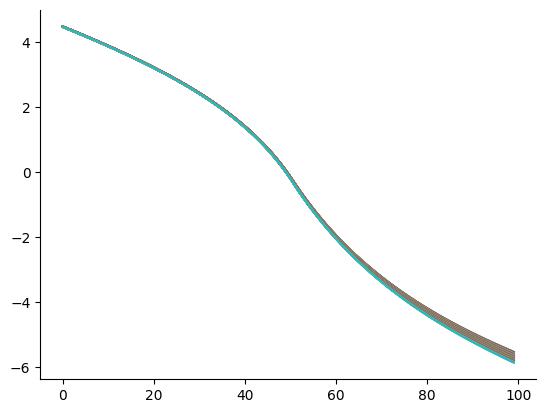

In [81]:
plt.plot(res["v0"])
plt.show()

In [82]:
ϕ_list[9] = res["v0"]
ems_list[9] = res["ems"]

In [83]:
res = solve_prep(y1_mat, y2_mat, γ3_list[10], 1e-6, 0.05, 20000, 0.05, True)

Episode 0: PDE Error: 1.668113880013; False Transient Error: 1.345131464883; Iterations: 164; CG Error: 0.000000000096
Episode 1: PDE Error: 1.342950682450; False Transient Error: 1.085364858904; Iterations: 171; CG Error: 0.000000000089
Episode 2: PDE Error: 1.085059148392; False Transient Error: 0.879264429399; Iterations: 171; CG Error: 0.000000000092
Episode 3: PDE Error: 0.879299103015; False Transient Error: 0.714757042575; Iterations: 170; CG Error: 0.000000000099
Episode 4: PDE Error: 0.714808509556; False Transient Error: 0.583192625870; Iterations: 177; CG Error: 0.000000000096
Episode 5: PDE Error: 0.583179184026; False Transient Error: 0.477872393578; Iterations: 220; CG Error: 0.000000000089
Episode 6: PDE Error: 0.477782265449; False Transient Error: 0.393511239193; Iterations: 324; CG Error: 0.000000000097
Episode 7: PDE Error: 0.393354555182; False Transient Error: 0.325909950764; Iterations: 437; CG Error: 0.000000000096
Episode 8: PDE Error: 0.325702539074; False Tran

Episode 68: PDE Error: 0.098095298880; False Transient Error: 0.097642397660; Iterations: 3250; CG Error: 0.000000000086
Episode 69: PDE Error: 0.097819060066; False Transient Error: 0.097381412839; Iterations: 3231; CG Error: 0.000000000098
Episode 70: PDE Error: 0.097547268683; False Transient Error: 0.097124168646; Iterations: 3225; CG Error: 0.000000000078
Episode 71: PDE Error: 0.097279774905; False Transient Error: 0.096870535360; Iterations: 3161; CG Error: 0.000000000090
Episode 72: PDE Error: 0.097016426919; False Transient Error: 0.096620383695; Iterations: 3091; CG Error: 0.000000000097
Episode 73: PDE Error: 0.096757075893; False Transient Error: 0.096373592610; Iterations: 3068; CG Error: 0.000000000085
Episode 74: PDE Error: 0.096501579365; False Transient Error: 0.096130044049; Iterations: 3070; CG Error: 0.000000000097
Episode 75: PDE Error: 0.096249799760; False Transient Error: 0.095889622393; Iterations: 3005; CG Error: 0.000000000099
Episode 76: PDE Error: 0.0960015

Episode 136: PDE Error: 0.084895054651; False Transient Error: 0.084737711821; Iterations: 1794; CG Error: 0.000000000092
Episode 137: PDE Error: 0.084748596359; False Transient Error: 0.084592334945; Iterations: 1770; CG Error: 0.000000000096
Episode 138: PDE Error: 0.084603008123; False Transient Error: 0.084447784767; Iterations: 1759; CG Error: 0.000000000088
Episode 139: PDE Error: 0.084458253525; False Transient Error: 0.084304079569; Iterations: 1749; CG Error: 0.000000000093
Episode 140: PDE Error: 0.084314348144; False Transient Error: 0.084161202833; Iterations: 1737; CG Error: 0.000000000098
Episode 141: PDE Error: 0.084171276203; False Transient Error: 0.084019128893; Iterations: 1726; CG Error: 0.000000000099
Episode 142: PDE Error: 0.084029012479; False Transient Error: 0.083877858110; Iterations: 1720; CG Error: 0.000000000089
Episode 143: PDE Error: 0.083887556401; False Transient Error: 0.083737381158; Iterations: 1708; CG Error: 0.000000000094
Episode 144: PDE Error: 

Episode 204: PDE Error: 0.076469933528; False Transient Error: 0.076360348982; Iterations: 1062; CG Error: 0.000000000100
Episode 205: PDE Error: 0.076364195438; False Transient Error: 0.076255062585; Iterations: 1056; CG Error: 0.000000000096
Episode 206: PDE Error: 0.076258870079; False Transient Error: 0.076150183588; Iterations: 1050; CG Error: 0.000000000088
Episode 207: PDE Error: 0.076153952530; False Transient Error: 0.076045708258; Iterations: 1044; CG Error: 0.000000000092
Episode 208: PDE Error: 0.076049439426; False Transient Error: 0.075941633492; Iterations: 1036; CG Error: 0.000000000099
Episode 209: PDE Error: 0.075945327906; False Transient Error: 0.075837955656; Iterations: 1028; CG Error: 0.000000000100
Episode 210: PDE Error: 0.075841613771; False Transient Error: 0.075734670621; Iterations: 1021; CG Error: 0.000000000090
Episode 211: PDE Error: 0.075738292834; False Transient Error: 0.075631775421; Iterations: 1014; CG Error: 0.000000000094
Episode 212: PDE Error: 

Episode 273: PDE Error: 0.069983534608; False Transient Error: 0.069897357187; Iterations: 661; CG Error: 0.000000000096
Episode 274: PDE Error: 0.069899651496; False Transient Error: 0.069813727847; Iterations: 656; CG Error: 0.000000000099
Episode 275: PDE Error: 0.069816009304; False Transient Error: 0.069730339095; Iterations: 652; CG Error: 0.000000000099
Episode 276: PDE Error: 0.069732608895; False Transient Error: 0.069647189620; Iterations: 648; CG Error: 0.000000000096
Episode 277: PDE Error: 0.069649447989; False Transient Error: 0.069564277567; Iterations: 644; CG Error: 0.000000000093
Episode 278: PDE Error: 0.069566525163; False Transient Error: 0.069481601332; Iterations: 640; CG Error: 0.000000000097
Episode 279: PDE Error: 0.069483838315; False Transient Error: 0.069399159688; Iterations: 635; CG Error: 0.000000000096
Episode 280: PDE Error: 0.069401384754; False Transient Error: 0.069316951447; Iterations: 630; CG Error: 0.000000000097
Episode 281: PDE Error: 0.069319

Episode 341: PDE Error: 0.064764100761; False Transient Error: 0.064692008341; Iterations: 407; CG Error: 0.000000000100
Episode 342: PDE Error: 0.064693780985; False Transient Error: 0.064621856175; Iterations: 404; CG Error: 0.000000000095
Episode 343: PDE Error: 0.064623625404; False Transient Error: 0.064551864771; Iterations: 399; CG Error: 0.000000000098
Episode 344: PDE Error: 0.064553628268; False Transient Error: 0.064482030275; Iterations: 395; CG Error: 0.000000000090
Episode 345: PDE Error: 0.064483790691; False Transient Error: 0.064412362028; Iterations: 392; CG Error: 0.000000000099
Episode 346: PDE Error: 0.064414118322; False Transient Error: 0.064342855698; Iterations: 390; CG Error: 0.000000000097
Episode 347: PDE Error: 0.064344606546; False Transient Error: 0.064273509063; Iterations: 388; CG Error: 0.000000000091
Episode 348: PDE Error: 0.064275255955; False Transient Error: 0.064204321881; Iterations: 385; CG Error: 0.000000000097
Episode 349: PDE Error: 0.064206

Episode 411: PDE Error: 0.060196326801; False Transient Error: 0.060134194813; Iterations: 249; CG Error: 0.000000000090
Episode 412: PDE Error: 0.060135748796; False Transient Error: 0.060073737388; Iterations: 248; CG Error: 0.000000000095
Episode 413: PDE Error: 0.060075289919; False Transient Error: 0.060013397855; Iterations: 247; CG Error: 0.000000000093
Episode 414: PDE Error: 0.060014951285; False Transient Error: 0.059953176747; Iterations: 245; CG Error: 0.000000000096
Episode 415: PDE Error: 0.059954725323; False Transient Error: 0.059893071811; Iterations: 244; CG Error: 0.000000000094
Episode 416: PDE Error: 0.059894619488; False Transient Error: 0.059833084206; Iterations: 243; CG Error: 0.000000000093
Episode 417: PDE Error: 0.059834630936; False Transient Error: 0.059773213658; Iterations: 241; CG Error: 0.000000000098
Episode 418: PDE Error: 0.059774758934; False Transient Error: 0.059713459175; Iterations: 240; CG Error: 0.000000000092
Episode 419: PDE Error: 0.059715

Episode 486: PDE Error: 0.055952041079; False Transient Error: 0.055897717589; Iterations: 174; CG Error: 0.000000000096
Episode 487: PDE Error: 0.055899176349; False Transient Error: 0.055844941716; Iterations: 174; CG Error: 0.000000000094
Episode 488: PDE Error: 0.055846399637; False Transient Error: 0.055792253358; Iterations: 174; CG Error: 0.000000000092
Episode 489: PDE Error: 0.055793710445; False Transient Error: 0.055739651843; Iterations: 173; CG Error: 0.000000000099
Episode 490: PDE Error: 0.055741108102; False Transient Error: 0.055687137946; Iterations: 173; CG Error: 0.000000000098
Episode 491: PDE Error: 0.055688593315; False Transient Error: 0.055634711259; Iterations: 173; CG Error: 0.000000000096
Episode 492: PDE Error: 0.055636165786; False Transient Error: 0.055582371624; Iterations: 173; CG Error: 0.000000000094
Episode 493: PDE Error: 0.055583825355; False Transient Error: 0.055530118920; Iterations: 173; CG Error: 0.000000000091
Episode 494: PDE Error: 0.055531

Episode 558: PDE Error: 0.052356020663; False Transient Error: 0.052307434296; Iterations: 163; CG Error: 0.000000000097
Episode 559: PDE Error: 0.052308854840; False Transient Error: 0.052260339280; Iterations: 163; CG Error: 0.000000000095
Episode 560: PDE Error: 0.052261759572; False Transient Error: 0.052213314638; Iterations: 163; CG Error: 0.000000000093
Episode 561: PDE Error: 0.052214734649; False Transient Error: 0.052166360180; Iterations: 163; CG Error: 0.000000000092
Episode 562: PDE Error: 0.052167779904; False Transient Error: 0.052119475726; Iterations: 163; CG Error: 0.000000000091
Episode 563: PDE Error: 0.052120895154; False Transient Error: 0.052072661085; Iterations: 163; CG Error: 0.000000000090
Episode 564: PDE Error: 0.052074080213; False Transient Error: 0.052025915672; Iterations: 162; CG Error: 0.000000000100
Episode 565: PDE Error: 0.052027334415; False Transient Error: 0.051979239887; Iterations: 162; CG Error: 0.000000000098
Episode 566: PDE Error: 0.051980

Episode 630: PDE Error: 0.049127297999; False Transient Error: 0.049083257994; Iterations: 155; CG Error: 0.000000000095
Episode 631: PDE Error: 0.049084664673; False Transient Error: 0.049040680546; Iterations: 155; CG Error: 0.000000000093
Episode 632: PDE Error: 0.049042087207; False Transient Error: 0.048998158800; Iterations: 155; CG Error: 0.000000000092
Episode 633: PDE Error: 0.048999565449; False Transient Error: 0.048955691689; Iterations: 154; CG Error: 0.000000000098
Episode 634: PDE Error: 0.048957099643; False Transient Error: 0.048913280964; Iterations: 154; CG Error: 0.000000000096
Episode 635: PDE Error: 0.048914688904; False Transient Error: 0.048870925272; Iterations: 154; CG Error: 0.000000000094
Episode 636: PDE Error: 0.048872333199; False Transient Error: 0.048828624526; Iterations: 154; CG Error: 0.000000000093
Episode 637: PDE Error: 0.048830032430; False Transient Error: 0.048786378493; Iterations: 154; CG Error: 0.000000000091
Episode 638: PDE Error: 0.048787

Episode 702: PDE Error: 0.046189065472; False Transient Error: 0.046148559602; Iterations: 151; CG Error: 0.000000000097
Episode 703: PDE Error: 0.046149968257; False Transient Error: 0.046109504535; Iterations: 151; CG Error: 0.000000000097
Episode 704: PDE Error: 0.046110913315; False Transient Error: 0.046070491573; Iterations: 151; CG Error: 0.000000000097
Episode 705: PDE Error: 0.046071900454; False Transient Error: 0.046031520543; Iterations: 151; CG Error: 0.000000000097
Episode 706: PDE Error: 0.046032929493; False Transient Error: 0.045992591269; Iterations: 151; CG Error: 0.000000000097
Episode 707: PDE Error: 0.045994000255; False Transient Error: 0.045953703573; Iterations: 151; CG Error: 0.000000000097
Episode 708: PDE Error: 0.045955112576; False Transient Error: 0.045914857273; Iterations: 151; CG Error: 0.000000000097
Episode 709: PDE Error: 0.045916266283; False Transient Error: 0.045876052187; Iterations: 151; CG Error: 0.000000000098
Episode 710: PDE Error: 0.045877

Episode 774: PDE Error: 0.043471303203; False Transient Error: 0.043433363561; Iterations: 150; CG Error: 0.000000000096
Episode 775: PDE Error: 0.043434788285; False Transient Error: 0.043396877828; Iterations: 150; CG Error: 0.000000000096
Episode 776: PDE Error: 0.043398302897; False Transient Error: 0.043360421414; Iterations: 150; CG Error: 0.000000000095
Episode 777: PDE Error: 0.043361846875; False Transient Error: 0.043323994155; Iterations: 150; CG Error: 0.000000000095
Episode 778: PDE Error: 0.043325420050; False Transient Error: 0.043287595884; Iterations: 150; CG Error: 0.000000000094
Episode 779: PDE Error: 0.043289022254; False Transient Error: 0.043251226437; Iterations: 150; CG Error: 0.000000000093
Episode 780: PDE Error: 0.043252653327; False Transient Error: 0.043214885654; Iterations: 150; CG Error: 0.000000000092
Episode 781: PDE Error: 0.043216313110; False Transient Error: 0.043178573381; Iterations: 150; CG Error: 0.000000000091
Episode 782: PDE Error: 0.043180

Episode 846: PDE Error: 0.040908452449; False Transient Error: 0.040872221857; Iterations: 149; CG Error: 0.000000000089
Episode 847: PDE Error: 0.040873679886; False Transient Error: 0.040837468267; Iterations: 149; CG Error: 0.000000000088
Episode 848: PDE Error: 0.040838926801; False Transient Error: 0.040802734023; Iterations: 149; CG Error: 0.000000000087
Episode 849: PDE Error: 0.040804193080; False Transient Error: 0.040768019015; Iterations: 149; CG Error: 0.000000000087
Episode 850: PDE Error: 0.040769478611; False Transient Error: 0.040733323138; Iterations: 149; CG Error: 0.000000000087
Episode 851: PDE Error: 0.040734783274; False Transient Error: 0.040698646283; Iterations: 149; CG Error: 0.000000000086
Episode 852: PDE Error: 0.040700106946; False Transient Error: 0.040663988341; Iterations: 149; CG Error: 0.000000000086
Episode 853: PDE Error: 0.040665449502; False Transient Error: 0.040629349200; Iterations: 149; CG Error: 0.000000000086
Episode 854: PDE Error: 0.040630

Episode 918: PDE Error: 0.038449189095; False Transient Error: 0.038414104287; Iterations: 147; CG Error: 0.000000000097
Episode 919: PDE Error: 0.038415603117; False Transient Error: 0.038380531914; Iterations: 147; CG Error: 0.000000000097
Episode 920: PDE Error: 0.038382031379; False Transient Error: 0.038346973790; Iterations: 147; CG Error: 0.000000000097
Episode 921: PDE Error: 0.038348473840; False Transient Error: 0.038313429876; Iterations: 147; CG Error: 0.000000000098
Episode 922: PDE Error: 0.038314930467; False Transient Error: 0.038279900134; Iterations: 147; CG Error: 0.000000000099
Episode 923: PDE Error: 0.038281401247; False Transient Error: 0.038246384537; Iterations: 147; CG Error: 0.000000000099
Episode 924: PDE Error: 0.038247886172; False Transient Error: 0.038212883063; Iterations: 147; CG Error: 0.000000000100
Episode 925: PDE Error: 0.038214385236; False Transient Error: 0.038179395869; Iterations: 148; CG Error: 0.000000000084
Episode 926: PDE Error: 0.038180

Episode 990: PDE Error: 0.036066206550; False Transient Error: 0.036032054672; Iterations: 146; CG Error: 0.000000000098
Episode 991: PDE Error: 0.036033604398; False Transient Error: 0.035999465518; Iterations: 146; CG Error: 0.000000000098
Episode 992: PDE Error: 0.036001015916; False Transient Error: 0.035966890037; Iterations: 146; CG Error: 0.000000000099
Episode 993: PDE Error: 0.035968441078; False Transient Error: 0.035934328236; Iterations: 146; CG Error: 0.000000000100
Episode 994: PDE Error: 0.035935879909; False Transient Error: 0.035901780077; Iterations: 147; CG Error: 0.000000000089
Episode 995: PDE Error: 0.035903330114; False Transient Error: 0.035869245558; Iterations: 147; CG Error: 0.000000000089
Episode 996: PDE Error: 0.035870796193; False Transient Error: 0.035836724846; Iterations: 147; CG Error: 0.000000000089
Episode 997: PDE Error: 0.035838276063; False Transient Error: 0.035804217790; Iterations: 147; CG Error: 0.000000000090
Episode 998: PDE Error: 0.035805

Episode 1062: PDE Error: 0.033754893070; False Transient Error: 0.033721731661; Iterations: 146; CG Error: 0.000000000088
Episode 1063: PDE Error: 0.033723328781; False Transient Error: 0.033690182185; Iterations: 146; CG Error: 0.000000000087
Episode 1064: PDE Error: 0.033691779977; False Transient Error: 0.033658648207; Iterations: 146; CG Error: 0.000000000087
Episode 1065: PDE Error: 0.033660246692; False Transient Error: 0.033627129755; Iterations: 146; CG Error: 0.000000000087
Episode 1066: PDE Error: 0.033628728953; False Transient Error: 0.033595626859; Iterations: 146; CG Error: 0.000000000087
Episode 1067: PDE Error: 0.033597226787; False Transient Error: 0.033564139548; Iterations: 146; CG Error: 0.000000000088
Episode 1068: PDE Error: 0.033565740225; False Transient Error: 0.033532667853; Iterations: 146; CG Error: 0.000000000088
Episode 1069: PDE Error: 0.033534269294; False Transient Error: 0.033501211808; Iterations: 146; CG Error: 0.000000000088
Episode 1070: PDE Error:

Episode 1134: PDE Error: 0.031523809901; False Transient Error: 0.031491798800; Iterations: 144; CG Error: 0.000000000088
Episode 1135: PDE Error: 0.031493445257; False Transient Error: 0.031461451397; Iterations: 144; CG Error: 0.000000000088
Episode 1136: PDE Error: 0.031463098508; False Transient Error: 0.031431121912; Iterations: 144; CG Error: 0.000000000087
Episode 1137: PDE Error: 0.031432769687; False Transient Error: 0.031400810380; Iterations: 144; CG Error: 0.000000000087
Episode 1138: PDE Error: 0.031402458826; False Transient Error: 0.031370516835; Iterations: 144; CG Error: 0.000000000087
Episode 1139: PDE Error: 0.031372165954; False Transient Error: 0.031340241310; Iterations: 144; CG Error: 0.000000000087
Episode 1140: PDE Error: 0.031341891108; False Transient Error: 0.031309983840; Iterations: 144; CG Error: 0.000000000087
Episode 1141: PDE Error: 0.031311634317; False Transient Error: 0.031279744458; Iterations: 144; CG Error: 0.000000000087
Episode 1142: PDE Error:

Episode 1206: PDE Error: 0.029385011349; False Transient Error: 0.029354313097; Iterations: 142; CG Error: 0.000000000084
Episode 1207: PDE Error: 0.029356007097; False Transient Error: 0.029325328125; Iterations: 142; CG Error: 0.000000000084
Episode 1208: PDE Error: 0.029327022658; False Transient Error: 0.029296362987; Iterations: 142; CG Error: 0.000000000084
Episode 1209: PDE Error: 0.029298058052; False Transient Error: 0.029267417699; Iterations: 142; CG Error: 0.000000000083
Episode 1210: PDE Error: 0.029269113299; False Transient Error: 0.029238492276; Iterations: 142; CG Error: 0.000000000083
Episode 1211: PDE Error: 0.029240188415; False Transient Error: 0.029209586730; Iterations: 142; CG Error: 0.000000000083
Episode 1212: PDE Error: 0.029211283410; False Transient Error: 0.029180701072; Iterations: 142; CG Error: 0.000000000083
Episode 1213: PDE Error: 0.029182398302; False Transient Error: 0.029151835312; Iterations: 142; CG Error: 0.000000000083
Episode 1214: PDE Error:

Episode 1280: PDE Error: 0.027369152577; False Transient Error: 0.027312584839; Iterations: 140; CG Error: 0.000000000088
Episode 1281: PDE Error: 0.027356021467; False Transient Error: 0.027299233132; Iterations: 140; CG Error: 0.000000000088
Episode 1282: PDE Error: 0.027342896651; False Transient Error: 0.027285887944; Iterations: 140; CG Error: 0.000000000088
Episode 1283: PDE Error: 0.027329778130; False Transient Error: 0.027272549271; Iterations: 140; CG Error: 0.000000000087
Episode 1284: PDE Error: 0.027316665899; False Transient Error: 0.027259217109; Iterations: 140; CG Error: 0.000000000087
Episode 1285: PDE Error: 0.027303559957; False Transient Error: 0.027245891455; Iterations: 140; CG Error: 0.000000000087
Episode 1286: PDE Error: 0.027290460300; False Transient Error: 0.027232572305; Iterations: 140; CG Error: 0.000000000087
Episode 1287: PDE Error: 0.027277366936; False Transient Error: 0.027219259657; Iterations: 140; CG Error: 0.000000000087
Episode 1288: PDE Error:

Episode 1349: PDE Error: 0.026477721877; False Transient Error: 0.026406438004; Iterations: 140; CG Error: 0.000000000084
Episode 1350: PDE Error: 0.026465018330; False Transient Error: 0.026393528405; Iterations: 140; CG Error: 0.000000000084
Episode 1351: PDE Error: 0.026452320850; False Transient Error: 0.026380625070; Iterations: 140; CG Error: 0.000000000084
Episode 1352: PDE Error: 0.026439629436; False Transient Error: 0.026367728004; Iterations: 140; CG Error: 0.000000000084
Episode 1353: PDE Error: 0.026426944086; False Transient Error: 0.026354837212; Iterations: 140; CG Error: 0.000000000084
Episode 1354: PDE Error: 0.026414264801; False Transient Error: 0.026341952701; Iterations: 140; CG Error: 0.000000000084
Episode 1355: PDE Error: 0.026401591586; False Transient Error: 0.026329074477; Iterations: 140; CG Error: 0.000000000084
Episode 1356: PDE Error: 0.026388924440; False Transient Error: 0.026316202142; Iterations: 139; CG Error: 0.000000000100
Episode 1357: PDE Error:

Episode 1417: PDE Error: 0.025627624899; False Transient Error: 0.025542785556; Iterations: 138; CG Error: 0.000000000097
Episode 1418: PDE Error: 0.025615329511; False Transient Error: 0.025530297560; Iterations: 138; CG Error: 0.000000000097
Episode 1419: PDE Error: 0.025603040044; False Transient Error: 0.025517815660; Iterations: 138; CG Error: 0.000000000097
Episode 1420: PDE Error: 0.025590756491; False Transient Error: 0.025505339848; Iterations: 138; CG Error: 0.000000000097
Episode 1421: PDE Error: 0.025578478847; False Transient Error: 0.025492870116; Iterations: 138; CG Error: 0.000000000097
Episode 1422: PDE Error: 0.025566207111; False Transient Error: 0.025480406459; Iterations: 138; CG Error: 0.000000000097
Episode 1423: PDE Error: 0.025553941272; False Transient Error: 0.025467948872; Iterations: 138; CG Error: 0.000000000097
Episode 1424: PDE Error: 0.025541681330; False Transient Error: 0.025455497353; Iterations: 138; CG Error: 0.000000000097
Episode 1425: PDE Error:

Episode 1487: PDE Error: 0.024789351202; False Transient Error: 0.024683175267; Iterations: 138; CG Error: 0.000000000088
Episode 1488: PDE Error: 0.024777701111; False Transient Error: 0.024671106610; Iterations: 138; CG Error: 0.000000000088
Episode 1489: PDE Error: 0.024766056548; False Transient Error: 0.024659043838; Iterations: 138; CG Error: 0.000000000088
Episode 1490: PDE Error: 0.024754417511; False Transient Error: 0.024646986948; Iterations: 138; CG Error: 0.000000000088
Episode 1491: PDE Error: 0.024742783995; False Transient Error: 0.024634935939; Iterations: 138; CG Error: 0.000000000088
Episode 1492: PDE Error: 0.024731156002; False Transient Error: 0.024622890807; Iterations: 138; CG Error: 0.000000000087
Episode 1493: PDE Error: 0.024719533526; False Transient Error: 0.024610851552; Iterations: 138; CG Error: 0.000000000087
Episode 1494: PDE Error: 0.024707916565; False Transient Error: 0.024598818169; Iterations: 138; CG Error: 0.000000000087
Episode 1495: PDE Error:

Episode 1558: PDE Error: 0.023975792770; False Transient Error: 0.023840773041; Iterations: 137; CG Error: 0.000000000092
Episode 1559: PDE Error: 0.023964529132; False Transient Error: 0.023829115545; Iterations: 137; CG Error: 0.000000000092
Episode 1560: PDE Error: 0.023953270849; False Transient Error: 0.023817463743; Iterations: 137; CG Error: 0.000000000092
Episode 1561: PDE Error: 0.023942017918; False Transient Error: 0.023805817632; Iterations: 137; CG Error: 0.000000000092
Episode 1562: PDE Error: 0.023930770337; False Transient Error: 0.023794177209; Iterations: 137; CG Error: 0.000000000092
Episode 1563: PDE Error: 0.023919528101; False Transient Error: 0.023782542472; Iterations: 137; CG Error: 0.000000000092
Episode 1564: PDE Error: 0.023908291209; False Transient Error: 0.023770913416; Iterations: 137; CG Error: 0.000000000092
Episode 1565: PDE Error: 0.023897059649; False Transient Error: 0.023759290041; Iterations: 137; CG Error: 0.000000000091
Episode 1566: PDE Error:

Episode 1628: PDE Error: 0.023200134064; False Transient Error: 0.023038337590; Iterations: 136; CG Error: 0.000000000093
Episode 1629: PDE Error: 0.023189239302; False Transient Error: 0.023027071810; Iterations: 136; CG Error: 0.000000000093
Episode 1630: PDE Error: 0.023178349724; False Transient Error: 0.023015811528; Iterations: 136; CG Error: 0.000000000093
Episode 1631: PDE Error: 0.023167465325; False Transient Error: 0.023004556742; Iterations: 136; CG Error: 0.000000000093
Episode 1632: PDE Error: 0.023156586100; False Transient Error: 0.022993307448; Iterations: 136; CG Error: 0.000000000093
Episode 1633: PDE Error: 0.023145712052; False Transient Error: 0.022982063643; Iterations: 136; CG Error: 0.000000000093
Episode 1634: PDE Error: 0.023134843176; False Transient Error: 0.022970825324; Iterations: 136; CG Error: 0.000000000093
Episode 1635: PDE Error: 0.023123979470; False Transient Error: 0.022959592488; Iterations: 136; CG Error: 0.000000000093
Episode 1636: PDE Error:

Episode 1699: PDE Error: 0.022439350948; False Transient Error: 0.022251977998; Iterations: 136; CG Error: 0.000000000088
Episode 1700: PDE Error: 0.022428818346; False Transient Error: 0.022241096064; Iterations: 136; CG Error: 0.000000000088
Episode 1701: PDE Error: 0.022418290759; False Transient Error: 0.022230219442; Iterations: 136; CG Error: 0.000000000088
Episode 1702: PDE Error: 0.022407768186; False Transient Error: 0.022219348128; Iterations: 136; CG Error: 0.000000000087
Episode 1703: PDE Error: 0.022397250623; False Transient Error: 0.022208482119; Iterations: 136; CG Error: 0.000000000087
Episode 1704: PDE Error: 0.022386738071; False Transient Error: 0.022197621414; Iterations: 136; CG Error: 0.000000000087
Episode 1705: PDE Error: 0.022376230527; False Transient Error: 0.022186765102; Iterations: 135; CG Error: 0.000000000100
Episode 1706: PDE Error: 0.022365729124; False Transient Error: 0.022175914981; Iterations: 135; CG Error: 0.000000000100
Episode 1707: PDE Error:

Episode 1771: PDE Error: 0.021693691439; False Transient Error: 0.021481903181; Iterations: 135; CG Error: 0.000000000092
Episode 1772: PDE Error: 0.021683514240; False Transient Error: 0.021471397157; Iterations: 135; CG Error: 0.000000000092
Episode 1773: PDE Error: 0.021673341895; False Transient Error: 0.021460896260; Iterations: 135; CG Error: 0.000000000092
Episode 1774: PDE Error: 0.021663174399; False Transient Error: 0.021450400487; Iterations: 135; CG Error: 0.000000000091
Episode 1775: PDE Error: 0.021653011753; False Transient Error: 0.021439909837; Iterations: 135; CG Error: 0.000000000091
Episode 1776: PDE Error: 0.021642853953; False Transient Error: 0.021429424305; Iterations: 135; CG Error: 0.000000000091
Episode 1777: PDE Error: 0.021632700995; False Transient Error: 0.021418943890; Iterations: 135; CG Error: 0.000000000091
Episode 1778: PDE Error: 0.021622552883; False Transient Error: 0.021408468589; Iterations: 135; CG Error: 0.000000000091
Episode 1779: PDE Error:

Episode 1841: PDE Error: 0.020992882556; False Transient Error: 0.020758737292; Iterations: 134; CG Error: 0.000000000095
Episode 1842: PDE Error: 0.020983039678; False Transient Error: 0.020748584269; Iterations: 134; CG Error: 0.000000000095
Episode 1843: PDE Error: 0.020973201502; False Transient Error: 0.020738436202; Iterations: 134; CG Error: 0.000000000095
Episode 1844: PDE Error: 0.020963368025; False Transient Error: 0.020728293088; Iterations: 134; CG Error: 0.000000000095
Episode 1845: PDE Error: 0.020953539242; False Transient Error: 0.020718154925; Iterations: 134; CG Error: 0.000000000094
Episode 1846: PDE Error: 0.020943715156; False Transient Error: 0.020708021711; Iterations: 134; CG Error: 0.000000000094
Episode 1847: PDE Error: 0.020933895763; False Transient Error: 0.020697893443; Iterations: 134; CG Error: 0.000000000094
Episode 1848: PDE Error: 0.020924081061; False Transient Error: 0.020687770119; Iterations: 134; CG Error: 0.000000000094
Episode 1849: PDE Error:

Episode 1913: PDE Error: 0.020296083750; False Transient Error: 0.020040248584; Iterations: 133; CG Error: 0.000000000098
Episode 1914: PDE Error: 0.020286573827; False Transient Error: 0.020030446462; Iterations: 133; CG Error: 0.000000000098
Episode 1915: PDE Error: 0.020277068446; False Transient Error: 0.020020649122; Iterations: 133; CG Error: 0.000000000098
Episode 1916: PDE Error: 0.020267567610; False Transient Error: 0.020010856561; Iterations: 133; CG Error: 0.000000000098
Episode 1917: PDE Error: 0.020258071311; False Transient Error: 0.020001068778; Iterations: 133; CG Error: 0.000000000098
Episode 1918: PDE Error: 0.020248579551; False Transient Error: 0.019991285770; Iterations: 133; CG Error: 0.000000000098
Episode 1919: PDE Error: 0.020239092330; False Transient Error: 0.019981507534; Iterations: 133; CG Error: 0.000000000098
Episode 1920: PDE Error: 0.020229609643; False Transient Error: 0.019971734069; Iterations: 133; CG Error: 0.000000000098
Episode 1921: PDE Error:

Episode 1984: PDE Error: 0.019632058803; False Transient Error: 0.019356055830; Iterations: 133; CG Error: 0.000000000094
Episode 1985: PDE Error: 0.019622866527; False Transient Error: 0.019346587755; Iterations: 133; CG Error: 0.000000000094
Episode 1986: PDE Error: 0.019613678651; False Transient Error: 0.019337124304; Iterations: 133; CG Error: 0.000000000094
Episode 1987: PDE Error: 0.019604495176; False Transient Error: 0.019327665475; Iterations: 133; CG Error: 0.000000000094
Episode 1988: PDE Error: 0.019595316091; False Transient Error: 0.019318211264; Iterations: 133; CG Error: 0.000000000094
Episode 1989: PDE Error: 0.019586141402; False Transient Error: 0.019308761671; Iterations: 133; CG Error: 0.000000000094
Episode 1990: PDE Error: 0.019576971104; False Transient Error: 0.019299316691; Iterations: 133; CG Error: 0.000000000094
Episode 1991: PDE Error: 0.019567805193; False Transient Error: 0.019289876324; Iterations: 133; CG Error: 0.000000000094
Episode 1992: PDE Error:

Episode 2056: PDE Error: 0.018984595773; False Transient Error: 0.018686036597; Iterations: 133; CG Error: 0.000000000091
Episode 2057: PDE Error: 0.018975880822; False Transient Error: 0.018676895681; Iterations: 133; CG Error: 0.000000000091
Episode 2058: PDE Error: 0.018967170017; False Transient Error: 0.018667759229; Iterations: 133; CG Error: 0.000000000091
Episode 2059: PDE Error: 0.018958463356; False Transient Error: 0.018658627241; Iterations: 133; CG Error: 0.000000000091
Episode 2060: PDE Error: 0.018949760839; False Transient Error: 0.018649499713; Iterations: 133; CG Error: 0.000000000091
Episode 2061: PDE Error: 0.018941062461; False Transient Error: 0.018640376644; Iterations: 133; CG Error: 0.000000000091
Episode 2062: PDE Error: 0.018932368221; False Transient Error: 0.018631258032; Iterations: 133; CG Error: 0.000000000091
Episode 2063: PDE Error: 0.018923678118; False Transient Error: 0.018622143873; Iterations: 133; CG Error: 0.000000000091
Episode 2064: PDE Error:

Episode 2127: PDE Error: 0.018376025425; False Transient Error: 0.018047999899; Iterations: 132; CG Error: 0.000000000098
Episode 2128: PDE Error: 0.018367600078; False Transient Error: 0.018039170614; Iterations: 132; CG Error: 0.000000000098
Episode 2129: PDE Error: 0.018359178741; False Transient Error: 0.018030345640; Iterations: 132; CG Error: 0.000000000098
Episode 2130: PDE Error: 0.018350761413; False Transient Error: 0.018021524975; Iterations: 132; CG Error: 0.000000000098
Episode 2131: PDE Error: 0.018342348092; False Transient Error: 0.018012708617; Iterations: 132; CG Error: 0.000000000098
Episode 2132: PDE Error: 0.018333938777; False Transient Error: 0.018003896564; Iterations: 132; CG Error: 0.000000000098
Episode 2133: PDE Error: 0.018325533465; False Transient Error: 0.017995088815; Iterations: 132; CG Error: 0.000000000098
Episode 2134: PDE Error: 0.018317132153; False Transient Error: 0.017986285366; Iterations: 132; CG Error: 0.000000000098
Episode 2135: PDE Error:

Episode 2199: PDE Error: 0.017779541370; False Transient Error: 0.017423188543; Iterations: 132; CG Error: 0.000000000094
Episode 2200: PDE Error: 0.017771400081; False Transient Error: 0.017414664407; Iterations: 132; CG Error: 0.000000000094
Episode 2201: PDE Error: 0.017763262669; False Transient Error: 0.017406144435; Iterations: 132; CG Error: 0.000000000094
Episode 2202: PDE Error: 0.017755129134; False Transient Error: 0.017397628624; Iterations: 132; CG Error: 0.000000000094
Episode 2203: PDE Error: 0.017746999476; False Transient Error: 0.017389116972; Iterations: 132; CG Error: 0.000000000094
Episode 2204: PDE Error: 0.017738873689; False Transient Error: 0.017380609477; Iterations: 132; CG Error: 0.000000000094
Episode 2205: PDE Error: 0.017730751776; False Transient Error: 0.017372106137; Iterations: 132; CG Error: 0.000000000094
Episode 2206: PDE Error: 0.017722633731; False Transient Error: 0.017363606950; Iterations: 132; CG Error: 0.000000000094
Episode 2207: PDE Error:

Episode 2271: PDE Error: 0.017203176099; False Transient Error: 0.016819969763; Iterations: 131; CG Error: 0.000000000098
Episode 2272: PDE Error: 0.017195309519; False Transient Error: 0.016811740251; Iterations: 131; CG Error: 0.000000000098
Episode 2273: PDE Error: 0.017187446687; False Transient Error: 0.016803514762; Iterations: 131; CG Error: 0.000000000098
Episode 2274: PDE Error: 0.017179587607; False Transient Error: 0.016795293293; Iterations: 131; CG Error: 0.000000000097
Episode 2275: PDE Error: 0.017171732273; False Transient Error: 0.016787075842; Iterations: 131; CG Error: 0.000000000097
Episode 2276: PDE Error: 0.017163880686; False Transient Error: 0.016778862406; Iterations: 131; CG Error: 0.000000000097
Episode 2277: PDE Error: 0.017156032844; False Transient Error: 0.016770652984; Iterations: 131; CG Error: 0.000000000097
Episode 2278: PDE Error: 0.017148188744; False Transient Error: 0.016762447574; Iterations: 131; CG Error: 0.000000000097
Episode 2279: PDE Error:

Episode 2343: PDE Error: 0.016646266417; False Transient Error: 0.016237604649; Iterations: 131; CG Error: 0.000000000093
Episode 2344: PDE Error: 0.016638665485; False Transient Error: 0.016229659616; Iterations: 131; CG Error: 0.000000000093
Episode 2345: PDE Error: 0.016631068181; False Transient Error: 0.016221718465; Iterations: 131; CG Error: 0.000000000093
Episode 2346: PDE Error: 0.016623474502; False Transient Error: 0.016213781193; Iterations: 131; CG Error: 0.000000000093
Episode 2347: PDE Error: 0.016615884447; False Transient Error: 0.016205847799; Iterations: 131; CG Error: 0.000000000093
Episode 2348: PDE Error: 0.016608298013; False Transient Error: 0.016197918281; Iterations: 131; CG Error: 0.000000000093
Episode 2349: PDE Error: 0.016600715202; False Transient Error: 0.016189992636; Iterations: 131; CG Error: 0.000000000093
Episode 2350: PDE Error: 0.016593136007; False Transient Error: 0.016182070863; Iterations: 131; CG Error: 0.000000000093
Episode 2351: PDE Error:

Episode 2414: PDE Error: 0.016115518814; False Transient Error: 0.015683045815; Iterations: 130; CG Error: 0.000000000098
Episode 2415: PDE Error: 0.016108171482; False Transient Error: 0.015675371606; Iterations: 130; CG Error: 0.000000000098
Episode 2416: PDE Error: 0.016100827632; False Transient Error: 0.015667701151; Iterations: 130; CG Error: 0.000000000098
Episode 2417: PDE Error: 0.016093487268; False Transient Error: 0.015660034452; Iterations: 130; CG Error: 0.000000000098
Episode 2418: PDE Error: 0.016086150385; False Transient Error: 0.015652371508; Iterations: 130; CG Error: 0.000000000098
Episode 2419: PDE Error: 0.016078816985; False Transient Error: 0.015644712319; Iterations: 130; CG Error: 0.000000000098
Episode 2420: PDE Error: 0.016071487066; False Transient Error: 0.015637056883; Iterations: 130; CG Error: 0.000000000098
Episode 2421: PDE Error: 0.016064160632; False Transient Error: 0.015629405197; Iterations: 130; CG Error: 0.000000000097
Episode 2422: PDE Error:

Episode 2486: PDE Error: 0.015793685808; False Transient Error: 0.015139989145; Iterations: 129; CG Error: 0.000000000098
Episode 2487: PDE Error: 0.015793090038; False Transient Error: 0.015132580632; Iterations: 129; CG Error: 0.000000000098
Episode 2488: PDE Error: 0.015792493046; False Transient Error: 0.015125175694; Iterations: 129; CG Error: 0.000000000098
Episode 2489: PDE Error: 0.015791894835; False Transient Error: 0.015117774334; Iterations: 129; CG Error: 0.000000000097
Episode 2490: PDE Error: 0.015791295406; False Transient Error: 0.015110376555; Iterations: 129; CG Error: 0.000000000097
Episode 2491: PDE Error: 0.015790694759; False Transient Error: 0.015102982361; Iterations: 129; CG Error: 0.000000000097
Episode 2492: PDE Error: 0.015790092897; False Transient Error: 0.015095591755; Iterations: 129; CG Error: 0.000000000097
Episode 2493: PDE Error: 0.015789489821; False Transient Error: 0.015088204738; Iterations: 129; CG Error: 0.000000000097
Episode 2494: PDE Error:

Episode 2557: PDE Error: 0.015748442793; False Transient Error: 0.014622860591; Iterations: 129; CG Error: 0.000000000091
Episode 2558: PDE Error: 0.015747764309; False Transient Error: 0.014615704443; Iterations: 129; CG Error: 0.000000000091
Episode 2559: PDE Error: 0.015747084719; False Transient Error: 0.014608551791; Iterations: 129; CG Error: 0.000000000091
Episode 2560: PDE Error: 0.015746404025; False Transient Error: 0.014601402634; Iterations: 129; CG Error: 0.000000000091
Episode 2561: PDE Error: 0.015745722228; False Transient Error: 0.014594256970; Iterations: 129; CG Error: 0.000000000090
Episode 2562: PDE Error: 0.015745039331; False Transient Error: 0.014587114798; Iterations: 129; CG Error: 0.000000000090
Episode 2563: PDE Error: 0.015744355334; False Transient Error: 0.014579976115; Iterations: 129; CG Error: 0.000000000090
Episode 2564: PDE Error: 0.015743670240; False Transient Error: 0.014572840920; Iterations: 129; CG Error: 0.000000000090
Episode 2565: PDE Error:

Episode 2629: PDE Error: 0.015696867226; False Transient Error: 0.014116453518; Iterations: 128; CG Error: 0.000000000099
Episode 2630: PDE Error: 0.015696113548; False Transient Error: 0.014109544924; Iterations: 128; CG Error: 0.000000000099
Episode 2631: PDE Error: 0.015695358912; False Transient Error: 0.014102639668; Iterations: 128; CG Error: 0.000000000099
Episode 2632: PDE Error: 0.015694603291; False Transient Error: 0.014095737760; Iterations: 128; CG Error: 0.000000000099
Episode 2633: PDE Error: 0.015693846674; False Transient Error: 0.014088839221; Iterations: 128; CG Error: 0.000000000099
Episode 2634: PDE Error: 0.015693089059; False Transient Error: 0.014081944076; Iterations: 128; CG Error: 0.000000000099
Episode 2635: PDE Error: 0.015692330454; False Transient Error: 0.014075052345; Iterations: 128; CG Error: 0.000000000099
Episode 2636: PDE Error: 0.015691570868; False Transient Error: 0.014068164041; Iterations: 128; CG Error: 0.000000000098
Episode 2637: PDE Error:

Episode 2701: PDE Error: 0.015640189775; False Transient Error: 0.013627562579; Iterations: 128; CG Error: 0.000000000092
Episode 2702: PDE Error: 0.015639369615; False Transient Error: 0.013620892767; Iterations: 128; CG Error: 0.000000000092
Episode 2703: PDE Error: 0.015638548591; False Transient Error: 0.013614226214; Iterations: 128; CG Error: 0.000000000092
Episode 2704: PDE Error: 0.015637726707; False Transient Error: 0.013607562919; Iterations: 128; CG Error: 0.000000000092
Episode 2705: PDE Error: 0.015636903964; False Transient Error: 0.013600902880; Iterations: 128; CG Error: 0.000000000092
Episode 2706: PDE Error: 0.015636080363; False Transient Error: 0.013594246095; Iterations: 128; CG Error: 0.000000000091
Episode 2707: PDE Error: 0.015635255906; False Transient Error: 0.013587592564; Iterations: 128; CG Error: 0.000000000091
Episode 2708: PDE Error: 0.015634430595; False Transient Error: 0.013580942284; Iterations: 128; CG Error: 0.000000000091
Episode 2709: PDE Error:

Episode 2773: PDE Error: 0.015579029455; False Transient Error: 0.013155572975; Iterations: 128; CG Error: 0.000000000085
Episode 2774: PDE Error: 0.015578151277; False Transient Error: 0.013149133819; Iterations: 128; CG Error: 0.000000000085
Episode 2775: PDE Error: 0.015577272350; False Transient Error: 0.013142697810; Iterations: 128; CG Error: 0.000000000085
Episode 2776: PDE Error: 0.015576392675; False Transient Error: 0.013136264945; Iterations: 128; CG Error: 0.000000000085
Episode 2777: PDE Error: 0.015575512255; False Transient Error: 0.013129835225; Iterations: 128; CG Error: 0.000000000085
Episode 2778: PDE Error: 0.015574631091; False Transient Error: 0.013123408647; Iterations: 128; CG Error: 0.000000000085
Episode 2779: PDE Error: 0.015573749184; False Transient Error: 0.013116985209; Iterations: 128; CG Error: 0.000000000085
Episode 2780: PDE Error: 0.015572866535; False Transient Error: 0.013110564910; Iterations: 128; CG Error: 0.000000000084
Episode 2781: PDE Error:

Episode 2845: PDE Error: 0.015513978604; False Transient Error: 0.012699900633; Iterations: 127; CG Error: 0.000000000094
Episode 2846: PDE Error: 0.015513050353; False Transient Error: 0.012693684178; Iterations: 127; CG Error: 0.000000000094
Episode 2847: PDE Error: 0.015512121458; False Transient Error: 0.012687470762; Iterations: 127; CG Error: 0.000000000094
Episode 2848: PDE Error: 0.015511191919; False Transient Error: 0.012681260382; Iterations: 127; CG Error: 0.000000000094
Episode 2849: PDE Error: 0.015510261739; False Transient Error: 0.012675053037; Iterations: 127; CG Error: 0.000000000094
Episode 2850: PDE Error: 0.015509330919; False Transient Error: 0.012668848727; Iterations: 127; CG Error: 0.000000000094
Episode 2851: PDE Error: 0.015508399460; False Transient Error: 0.012662647448; Iterations: 127; CG Error: 0.000000000094
Episode 2852: PDE Error: 0.015508174173; False Transient Error: 0.012656449201; Iterations: 127; CG Error: 0.000000000094
Episode 2853: PDE Error:

Episode 2917: PDE Error: 0.015557992106; False Transient Error: 0.012259984854; Iterations: 126; CG Error: 0.000000000098
Episode 2918: PDE Error: 0.015558782427; False Transient Error: 0.012253983023; Iterations: 126; CG Error: 0.000000000098
Episode 2919: PDE Error: 0.015559573428; False Transient Error: 0.012247984192; Iterations: 126; CG Error: 0.000000000098
Episode 2920: PDE Error: 0.015560365110; False Transient Error: 0.012241988350; Iterations: 126; CG Error: 0.000000000098
Episode 2921: PDE Error: 0.015561157472; False Transient Error: 0.012235995489; Iterations: 126; CG Error: 0.000000000098
Episode 2922: PDE Error: 0.015561950514; False Transient Error: 0.012230005599; Iterations: 126; CG Error: 0.000000000098
Episode 2923: PDE Error: 0.015562744237; False Transient Error: 0.012224018671; Iterations: 126; CG Error: 0.000000000098
Episode 2924: PDE Error: 0.015563538638; False Transient Error: 0.012218034697; Iterations: 126; CG Error: 0.000000000098
Episode 2925: PDE Error:

Episode 2989: PDE Error: 0.015616573236; False Transient Error: 0.011835291626; Iterations: 126; CG Error: 0.000000000094
Episode 2990: PDE Error: 0.015617409724; False Transient Error: 0.011829497761; Iterations: 126; CG Error: 0.000000000094
Episode 2991: PDE Error: 0.015618246807; False Transient Error: 0.011823706728; Iterations: 126; CG Error: 0.000000000093
Episode 2992: PDE Error: 0.015619084483; False Transient Error: 0.011817918525; Iterations: 126; CG Error: 0.000000000093
Episode 2993: PDE Error: 0.015619922753; False Transient Error: 0.011812133152; Iterations: 126; CG Error: 0.000000000093
Episode 2994: PDE Error: 0.015620761614; False Transient Error: 0.011806350607; Iterations: 126; CG Error: 0.000000000093
Episode 2995: PDE Error: 0.015621601065; False Transient Error: 0.011800570889; Iterations: 126; CG Error: 0.000000000093
Episode 2996: PDE Error: 0.015622441105; False Transient Error: 0.011794793996; Iterations: 126; CG Error: 0.000000000093
Episode 2997: PDE Error:

Episode 3061: PDE Error: 0.015678251497; False Transient Error: 0.011425293527; Iterations: 125; CG Error: 0.000000000099
Episode 3062: PDE Error: 0.015679127870; False Transient Error: 0.011419700372; Iterations: 125; CG Error: 0.000000000099
Episode 3063: PDE Error: 0.015680004746; False Transient Error: 0.011414109908; Iterations: 125; CG Error: 0.000000000099
Episode 3064: PDE Error: 0.015680882123; False Transient Error: 0.011408522137; Iterations: 125; CG Error: 0.000000000099
Episode 3065: PDE Error: 0.015681760000; False Transient Error: 0.011402937058; Iterations: 125; CG Error: 0.000000000099
Episode 3066: PDE Error: 0.015682638378; False Transient Error: 0.011397354676; Iterations: 125; CG Error: 0.000000000099
Episode 3067: PDE Error: 0.015683517254; False Transient Error: 0.011391774993; Iterations: 125; CG Error: 0.000000000099
Episode 3068: PDE Error: 0.015684396630; False Transient Error: 0.011386198013; Iterations: 125; CG Error: 0.000000000099
Episode 3069: PDE Error:

Episode 3133: PDE Error: 0.015742583074; False Transient Error: 0.011029476098; Iterations: 125; CG Error: 0.000000000097
Episode 3134: PDE Error: 0.015743493270; False Transient Error: 0.011024076136; Iterations: 125; CG Error: 0.000000000097
Episode 3135: PDE Error: 0.015744403897; False Transient Error: 0.011018678813; Iterations: 125; CG Error: 0.000000000097
Episode 3136: PDE Error: 0.015745314954; False Transient Error: 0.011013284129; Iterations: 125; CG Error: 0.000000000097
Episode 3137: PDE Error: 0.015746226441; False Transient Error: 0.011007892082; Iterations: 125; CG Error: 0.000000000097
Episode 3138: PDE Error: 0.015747138356; False Transient Error: 0.011002502671; Iterations: 125; CG Error: 0.000000000097
Episode 3139: PDE Error: 0.015748050699; False Transient Error: 0.010997115895; Iterations: 125; CG Error: 0.000000000097
Episode 3140: PDE Error: 0.015748963467; False Transient Error: 0.010991731752; Iterations: 125; CG Error: 0.000000000097
Episode 3141: PDE Error:

Episode 3205: PDE Error: 0.015809159429; False Transient Error: 0.010647350031; Iterations: 125; CG Error: 0.000000000096
Episode 3206: PDE Error: 0.015810098114; False Transient Error: 0.010642136881; Iterations: 125; CG Error: 0.000000000096
Episode 3207: PDE Error: 0.015811037159; False Transient Error: 0.010636926280; Iterations: 125; CG Error: 0.000000000096
Episode 3208: PDE Error: 0.015811976563; False Transient Error: 0.010631718227; Iterations: 125; CG Error: 0.000000000096
Episode 3209: PDE Error: 0.015812916324; False Transient Error: 0.010626512720; Iterations: 125; CG Error: 0.000000000096
Episode 3210: PDE Error: 0.015813856443; False Transient Error: 0.010621309757; Iterations: 125; CG Error: 0.000000000096
Episode 3211: PDE Error: 0.015814796918; False Transient Error: 0.010616109339; Iterations: 125; CG Error: 0.000000000096
Episode 3212: PDE Error: 0.015815737748; False Transient Error: 0.010610911462; Iterations: 125; CG Error: 0.000000000096
Episode 3213: PDE Error:

Episode 3277: PDE Error: 0.015877609426; False Transient Error: 0.010278444023; Iterations: 125; CG Error: 0.000000000095
Episode 3278: PDE Error: 0.015878571674; False Transient Error: 0.010273411233; Iterations: 125; CG Error: 0.000000000095
Episode 3279: PDE Error: 0.015879534217; False Transient Error: 0.010268380904; Iterations: 125; CG Error: 0.000000000095
Episode 3280: PDE Error: 0.015880497054; False Transient Error: 0.010263353033; Iterations: 125; CG Error: 0.000000000095
Episode 3281: PDE Error: 0.015881460184; False Transient Error: 0.010258327621; Iterations: 125; CG Error: 0.000000000095
Episode 3282: PDE Error: 0.015882423606; False Transient Error: 0.010253304667; Iterations: 125; CG Error: 0.000000000095
Episode 3283: PDE Error: 0.015883387319; False Transient Error: 0.010248284167; Iterations: 125; CG Error: 0.000000000095
Episode 3284: PDE Error: 0.015884351323; False Transient Error: 0.010243266123; Iterations: 125; CG Error: 0.000000000095
Episode 3285: PDE Error:

Episode 3349: PDE Error: 0.015947594389; False Transient Error: 0.009922301515; Iterations: 125; CG Error: 0.000000000094
Episode 3350: PDE Error: 0.015948575722; False Transient Error: 0.009917442857; Iterations: 125; CG Error: 0.000000000094
Episode 3351: PDE Error: 0.015949557291; False Transient Error: 0.009912586574; Iterations: 125; CG Error: 0.000000000094
Episode 3352: PDE Error: 0.015950539095; False Transient Error: 0.009907732665; Iterations: 125; CG Error: 0.000000000094
Episode 3353: PDE Error: 0.015951521132; False Transient Error: 0.009902881130; Iterations: 125; CG Error: 0.000000000094
Episode 3354: PDE Error: 0.015952503403; False Transient Error: 0.009898031968; Iterations: 125; CG Error: 0.000000000094
Episode 3355: PDE Error: 0.015953485907; False Transient Error: 0.009893185176; Iterations: 125; CG Error: 0.000000000094
Episode 3356: PDE Error: 0.015954468642; False Transient Error: 0.009888340754; Iterations: 125; CG Error: 0.000000000094
Episode 3357: PDE Error:

Episode 3421: PDE Error: 0.016018807054; False Transient Error: 0.009578481724; Iterations: 125; CG Error: 0.000000000092
Episode 3422: PDE Error: 0.016019803417; False Transient Error: 0.009573791182; Iterations: 125; CG Error: 0.000000000092
Episode 3423: PDE Error: 0.016020799963; False Transient Error: 0.009569102935; Iterations: 125; CG Error: 0.000000000092
Episode 3424: PDE Error: 0.016021796689; False Transient Error: 0.009564416980; Iterations: 125; CG Error: 0.000000000092
Episode 3425: PDE Error: 0.016022793597; False Transient Error: 0.009559733317; Iterations: 125; CG Error: 0.000000000092
Episode 3426: PDE Error: 0.016023790685; False Transient Error: 0.009555051944; Iterations: 125; CG Error: 0.000000000092
Episode 3427: PDE Error: 0.016024787952; False Transient Error: 0.009550372859; Iterations: 125; CG Error: 0.000000000091
Episode 3428: PDE Error: 0.016025785397; False Transient Error: 0.009545696063; Iterations: 125; CG Error: 0.000000000091
Episode 3429: PDE Error:

Episode 3493: PDE Error: 0.016090969779; False Transient Error: 0.009246559093; Iterations: 125; CG Error: 0.000000000088
Episode 3494: PDE Error: 0.016091977516; False Transient Error: 0.009242030864; Iterations: 125; CG Error: 0.000000000088
Episode 3495: PDE Error: 0.016092985387; False Transient Error: 0.009237504850; Iterations: 125; CG Error: 0.000000000088
Episode 3496: PDE Error: 0.016093993391; False Transient Error: 0.009232981049; Iterations: 125; CG Error: 0.000000000088
Episode 3497: PDE Error: 0.016095001528; False Transient Error: 0.009228459460; Iterations: 125; CG Error: 0.000000000088
Episode 3498: PDE Error: 0.016096009797; False Transient Error: 0.009223940082; Iterations: 125; CG Error: 0.000000000088
Episode 3499: PDE Error: 0.016097018197; False Transient Error: 0.009219422915; Iterations: 125; CG Error: 0.000000000088
Episode 3500: PDE Error: 0.016098026728; False Transient Error: 0.009214907956; Iterations: 125; CG Error: 0.000000000088
Episode 3501: PDE Error:

Episode 3565: PDE Error: 0.016163832115; False Transient Error: 0.008926122579; Iterations: 124; CG Error: 0.000000000100
Episode 3566: PDE Error: 0.016164847888; False Transient Error: 0.008921751265; Iterations: 124; CG Error: 0.000000000100
Episode 3567: PDE Error: 0.016165863752; False Transient Error: 0.008917382065; Iterations: 124; CG Error: 0.000000000100
Episode 3568: PDE Error: 0.016166879717; False Transient Error: 0.008913015037; Iterations: 124; CG Error: 0.000000000100
Episode 3569: PDE Error: 0.016167895783; False Transient Error: 0.008908650238; Iterations: 124; CG Error: 0.000000000099
Episode 3570: PDE Error: 0.016168911947; False Transient Error: 0.008904287711; Iterations: 124; CG Error: 0.000000000099
Episode 3571: PDE Error: 0.016169928200; False Transient Error: 0.008899927479; Iterations: 124; CG Error: 0.000000000099
Episode 3572: PDE Error: 0.016170944537; False Transient Error: 0.008895569539; Iterations: 124; CG Error: 0.000000000099
Episode 3573: PDE Error:

Episode 3637: PDE Error: 0.016237170989; False Transient Error: 0.008616788915; Iterations: 124; CG Error: 0.000000000096
Episode 3638: PDE Error: 0.016238191959; False Transient Error: 0.008612568668; Iterations: 124; CG Error: 0.000000000096
Episode 3639: PDE Error: 0.016239212980; False Transient Error: 0.008608350485; Iterations: 124; CG Error: 0.000000000096
Episode 3640: PDE Error: 0.016240234053; False Transient Error: 0.008604134366; Iterations: 124; CG Error: 0.000000000096
Episode 3641: PDE Error: 0.016241255177; False Transient Error: 0.008599920308; Iterations: 124; CG Error: 0.000000000096
Episode 3642: PDE Error: 0.016242276350; False Transient Error: 0.008595708312; Iterations: 124; CG Error: 0.000000000095
Episode 3643: PDE Error: 0.016243297573; False Transient Error: 0.008591498375; Iterations: 124; CG Error: 0.000000000095
Episode 3644: PDE Error: 0.016244318844; False Transient Error: 0.008587290497; Iterations: 124; CG Error: 0.000000000095
Episode 3645: PDE Error:

Episode 3709: PDE Error: 0.016310783091; False Transient Error: 0.008318147174; Iterations: 124; CG Error: 0.000000000092
Episode 3710: PDE Error: 0.016311806519; False Transient Error: 0.008314072989; Iterations: 124; CG Error: 0.000000000092
Episode 3711: PDE Error: 0.016312829964; False Transient Error: 0.008310000798; Iterations: 124; CG Error: 0.000000000092
Episode 3712: PDE Error: 0.016313853425; False Transient Error: 0.008305930598; Iterations: 124; CG Error: 0.000000000092
Episode 3713: PDE Error: 0.016314876903; False Transient Error: 0.008301862389; Iterations: 124; CG Error: 0.000000000092
Episode 3714: PDE Error: 0.016315900396; False Transient Error: 0.008297796170; Iterations: 124; CG Error: 0.000000000092
Episode 3715: PDE Error: 0.016316923903; False Transient Error: 0.008293731939; Iterations: 124; CG Error: 0.000000000092
Episode 3716: PDE Error: 0.016317947426; False Transient Error: 0.008289669696; Iterations: 124; CG Error: 0.000000000092
Episode 3717: PDE Error:

Episode 3780: PDE Error: 0.016383464173; False Transient Error: 0.008033777077; Iterations: 123; CG Error: 0.000000000100
Episode 3781: PDE Error: 0.016384487668; False Transient Error: 0.008029841890; Iterations: 123; CG Error: 0.000000000099
Episode 3782: PDE Error: 0.016385511154; False Transient Error: 0.008025908621; Iterations: 123; CG Error: 0.000000000099
Episode 3783: PDE Error: 0.016386534625; False Transient Error: 0.008021977285; Iterations: 123; CG Error: 0.000000000099
Episode 3784: PDE Error: 0.016387558079; False Transient Error: 0.008018047894; Iterations: 123; CG Error: 0.000000000099
Episode 3785: PDE Error: 0.016388581515; False Transient Error: 0.008014120456; Iterations: 123; CG Error: 0.000000000099
Episode 3786: PDE Error: 0.016389604936; False Transient Error: 0.008010194977; Iterations: 123; CG Error: 0.000000000099
Episode 3787: PDE Error: 0.016390628345; False Transient Error: 0.008006271459; Iterations: 123; CG Error: 0.000000000099
Episode 3788: PDE Error:

Episode 3852: PDE Error: 0.016457101077; False Transient Error: 0.007755316299; Iterations: 123; CG Error: 0.000000000096
Episode 3853: PDE Error: 0.016458122607; False Transient Error: 0.007751517418; Iterations: 123; CG Error: 0.000000000096
Episode 3854: PDE Error: 0.016459144094; False Transient Error: 0.007747720395; Iterations: 123; CG Error: 0.000000000095
Episode 3855: PDE Error: 0.016460165538; False Transient Error: 0.007743925230; Iterations: 123; CG Error: 0.000000000095
Episode 3856: PDE Error: 0.016461186939; False Transient Error: 0.007740131921; Iterations: 123; CG Error: 0.000000000095
Episode 3857: PDE Error: 0.016462208296; False Transient Error: 0.007736340468; Iterations: 123; CG Error: 0.000000000095
Episode 3858: PDE Error: 0.016463229609; False Transient Error: 0.007732550869; Iterations: 123; CG Error: 0.000000000095
Episode 3859: PDE Error: 0.016464250877; False Transient Error: 0.007728763124; Iterations: 123; CG Error: 0.000000000095
Episode 3860: PDE Error:

Episode 3924: PDE Error: 0.016530520970; False Transient Error: 0.007486492914; Iterations: 123; CG Error: 0.000000000092
Episode 3925: PDE Error: 0.016531538527; False Transient Error: 0.007482825534; Iterations: 123; CG Error: 0.000000000092
Episode 3926: PDE Error: 0.016532556017; False Transient Error: 0.007479159948; Iterations: 123; CG Error: 0.000000000092
Episode 3927: PDE Error: 0.016533573439; False Transient Error: 0.007475496156; Iterations: 123; CG Error: 0.000000000092
Episode 3928: PDE Error: 0.016534590792; False Transient Error: 0.007471834156; Iterations: 123; CG Error: 0.000000000092
Episode 3929: PDE Error: 0.016535608077; False Transient Error: 0.007468173947; Iterations: 123; CG Error: 0.000000000092
Episode 3930: PDE Error: 0.016536625293; False Transient Error: 0.007464515529; Iterations: 123; CG Error: 0.000000000092
Episode 3931: PDE Error: 0.016537642440; False Transient Error: 0.007460858901; Iterations: 123; CG Error: 0.000000000092
Episode 3932: PDE Error:

Episode 3996: PDE Error: 0.016603593152; False Transient Error: 0.007226975319; Iterations: 123; CG Error: 0.000000000090
Episode 3997: PDE Error: 0.016604605028; False Transient Error: 0.007223434896; Iterations: 123; CG Error: 0.000000000090
Episode 3998: PDE Error: 0.016605616814; False Transient Error: 0.007219896205; Iterations: 123; CG Error: 0.000000000090
Episode 3999: PDE Error: 0.016606628510; False Transient Error: 0.007216359244; Iterations: 123; CG Error: 0.000000000090
Episode 4000: PDE Error: 0.016607640115; False Transient Error: 0.007212824015; Iterations: 123; CG Error: 0.000000000090
Episode 4001: PDE Error: 0.016608651629; False Transient Error: 0.007209290514; Iterations: 123; CG Error: 0.000000000090
Episode 4002: PDE Error: 0.016609663052; False Transient Error: 0.007205758743; Iterations: 123; CG Error: 0.000000000090
Episode 4003: PDE Error: 0.016610674383; False Transient Error: 0.007202228699; Iterations: 123; CG Error: 0.000000000090
Episode 4004: PDE Error:

Episode 4068: PDE Error: 0.016676200686; False Transient Error: 0.006976441879; Iterations: 123; CG Error: 0.000000000088
Episode 4069: PDE Error: 0.016677205342; False Transient Error: 0.006973024024; Iterations: 123; CG Error: 0.000000000088
Episode 4070: PDE Error: 0.016678209889; False Transient Error: 0.006969607841; Iterations: 123; CG Error: 0.000000000088
Episode 4071: PDE Error: 0.016679214325; False Transient Error: 0.006966193329; Iterations: 123; CG Error: 0.000000000087
Episode 4072: PDE Error: 0.016680218649; False Transient Error: 0.006962780488; Iterations: 123; CG Error: 0.000000000087
Episode 4073: PDE Error: 0.016681222863; False Transient Error: 0.006959369317; Iterations: 123; CG Error: 0.000000000087
Episode 4074: PDE Error: 0.016682226966; False Transient Error: 0.006955959814; Iterations: 123; CG Error: 0.000000000087
Episode 4075: PDE Error: 0.016683230957; False Transient Error: 0.006952551980; Iterations: 123; CG Error: 0.000000000087
Episode 4076: PDE Error:

Episode 4140: PDE Error: 0.016748238579; False Transient Error: 0.006734582046; Iterations: 123; CG Error: 0.000000000086
Episode 4141: PDE Error: 0.016749234639; False Transient Error: 0.006731282522; Iterations: 123; CG Error: 0.000000000086
Episode 4142: PDE Error: 0.016750230570; False Transient Error: 0.006727984612; Iterations: 123; CG Error: 0.000000000086
Episode 4143: PDE Error: 0.016751226373; False Transient Error: 0.006724688316; Iterations: 123; CG Error: 0.000000000086
Episode 4144: PDE Error: 0.016752222047; False Transient Error: 0.006721393633; Iterations: 123; CG Error: 0.000000000086
Episode 4145: PDE Error: 0.016753217592; False Transient Error: 0.006718100562; Iterations: 123; CG Error: 0.000000000086
Episode 4146: PDE Error: 0.016754213008; False Transient Error: 0.006714809102; Iterations: 123; CG Error: 0.000000000086
Episode 4147: PDE Error: 0.016755208294; False Transient Error: 0.006711519253; Iterations: 123; CG Error: 0.000000000086
Episode 4148: PDE Error:

Episode 4212: PDE Error: 0.016819613056; False Transient Error: 0.006501095988; Iterations: 123; CG Error: 0.000000000084
Episode 4213: PDE Error: 0.016820599291; False Transient Error: 0.006497910705; Iterations: 123; CG Error: 0.000000000084
Episode 4214: PDE Error: 0.016821585382; False Transient Error: 0.006494726980; Iterations: 123; CG Error: 0.000000000084
Episode 4215: PDE Error: 0.016822571329; False Transient Error: 0.006491544814; Iterations: 123; CG Error: 0.000000000084
Episode 4216: PDE Error: 0.016823557130; False Transient Error: 0.006488364204; Iterations: 123; CG Error: 0.000000000084
Episode 4217: PDE Error: 0.016824542787; False Transient Error: 0.006485185150; Iterations: 123; CG Error: 0.000000000084
Episode 4218: PDE Error: 0.016825528298; False Transient Error: 0.006482007652; Iterations: 123; CG Error: 0.000000000084
Episode 4219: PDE Error: 0.016826513664; False Transient Error: 0.006478831709; Iterations: 123; CG Error: 0.000000000084
Episode 4220: PDE Error:

Episode 4284: PDE Error: 0.016890238761; False Transient Error: 0.006275683476; Iterations: 122; CG Error: 0.000000000099
Episode 4285: PDE Error: 0.016891214066; False Transient Error: 0.006272608486; Iterations: 122; CG Error: 0.000000000099
Episode 4286: PDE Error: 0.016892189212; False Transient Error: 0.006269535001; Iterations: 122; CG Error: 0.000000000099
Episode 4287: PDE Error: 0.016893164200; False Transient Error: 0.006266463019; Iterations: 122; CG Error: 0.000000000099
Episode 4288: PDE Error: 0.016894139030; False Transient Error: 0.006263392540; Iterations: 122; CG Error: 0.000000000099
Episode 4289: PDE Error: 0.016895113700; False Transient Error: 0.006260323564; Iterations: 122; CG Error: 0.000000000098
Episode 4290: PDE Error: 0.016896088211; False Transient Error: 0.006257256090; Iterations: 122; CG Error: 0.000000000098
Episode 4291: PDE Error: 0.016897062563; False Transient Error: 0.006254190116; Iterations: 122; CG Error: 0.000000000098
Episode 4292: PDE Error:

Episode 4356: PDE Error: 0.016960045976; False Transient Error: 0.006058081429; Iterations: 121; CG Error: 0.000000000099
Episode 4357: PDE Error: 0.016961009368; False Transient Error: 0.006055112667; Iterations: 121; CG Error: 0.000000000099
Episode 4358: PDE Error: 0.016961972586; False Transient Error: 0.006052145395; Iterations: 121; CG Error: 0.000000000099
Episode 4359: PDE Error: 0.016962935631; False Transient Error: 0.006049179610; Iterations: 121; CG Error: 0.000000000099
Episode 4360: PDE Error: 0.016963898504; False Transient Error: 0.006046215304; Iterations: 121; CG Error: 0.000000000099
Episode 4361: PDE Error: 0.016964861204; False Transient Error: 0.006043252476; Iterations: 121; CG Error: 0.000000000099
Episode 4362: PDE Error: 0.016965823733; False Transient Error: 0.006040291120; Iterations: 121; CG Error: 0.000000000099
Episode 4363: PDE Error: 0.016966786089; False Transient Error: 0.006037331230; Iterations: 121; CG Error: 0.000000000099
Episode 4364: PDE Error:

Episode 4428: PDE Error: 0.017028964416; False Transient Error: 0.005848018281; Iterations: 121; CG Error: 0.000000000097
Episode 4429: PDE Error: 0.017029915126; False Transient Error: 0.005845152568; Iterations: 121; CG Error: 0.000000000097
Episode 4430: PDE Error: 0.017030865653; False Transient Error: 0.005842288259; Iterations: 121; CG Error: 0.000000000097
Episode 4431: PDE Error: 0.017031815999; False Transient Error: 0.005839425351; Iterations: 121; CG Error: 0.000000000097
Episode 4432: PDE Error: 0.017032766164; False Transient Error: 0.005836563843; Iterations: 121; CG Error: 0.000000000097
Episode 4433: PDE Error: 0.017033716146; False Transient Error: 0.005833703737; Iterations: 121; CG Error: 0.000000000097
Episode 4434: PDE Error: 0.017034665946; False Transient Error: 0.005830845030; Iterations: 121; CG Error: 0.000000000097
Episode 4435: PDE Error: 0.017035615564; False Transient Error: 0.005827987722; Iterations: 121; CG Error: 0.000000000097
Episode 4436: PDE Error:

Episode 4500: PDE Error: 0.017096943058; False Transient Error: 0.005645231056; Iterations: 121; CG Error: 0.000000000095
Episode 4501: PDE Error: 0.017097880340; False Transient Error: 0.005642464587; Iterations: 121; CG Error: 0.000000000095
Episode 4502: PDE Error: 0.017098817432; False Transient Error: 0.005639699471; Iterations: 121; CG Error: 0.000000000095
Episode 4503: PDE Error: 0.017099754331; False Transient Error: 0.005636935708; Iterations: 121; CG Error: 0.000000000095
Episode 4504: PDE Error: 0.017100691040; False Transient Error: 0.005634173298; Iterations: 121; CG Error: 0.000000000095
Episode 4505: PDE Error: 0.017101627556; False Transient Error: 0.005631412240; Iterations: 121; CG Error: 0.000000000095
Episode 4506: PDE Error: 0.017102563881; False Transient Error: 0.005628652533; Iterations: 121; CG Error: 0.000000000095
Episode 4507: PDE Error: 0.017103500014; False Transient Error: 0.005625894177; Iterations: 121; CG Error: 0.000000000095
Episode 4508: PDE Error:

Episode 4572: PDE Error: 0.017163931214; False Transient Error: 0.005449466734; Iterations: 121; CG Error: 0.000000000093
Episode 4573: PDE Error: 0.017164854418; False Transient Error: 0.005446796075; Iterations: 121; CG Error: 0.000000000093
Episode 4574: PDE Error: 0.017165777422; False Transient Error: 0.005444126723; Iterations: 121; CG Error: 0.000000000093
Episode 4575: PDE Error: 0.017166700226; False Transient Error: 0.005441458677; Iterations: 121; CG Error: 0.000000000093
Episode 4576: PDE Error: 0.017167622831; False Transient Error: 0.005438791937; Iterations: 121; CG Error: 0.000000000093
Episode 4577: PDE Error: 0.017168545235; False Transient Error: 0.005436126503; Iterations: 121; CG Error: 0.000000000093
Episode 4578: PDE Error: 0.017169467440; False Transient Error: 0.005433462373; Iterations: 121; CG Error: 0.000000000093
Episode 4579: PDE Error: 0.017170389444; False Transient Error: 0.005430799547; Iterations: 121; CG Error: 0.000000000093
Episode 4580: PDE Error:

Episode 4643: PDE Error: 0.017228976680; False Transient Error: 0.005263061882; Iterations: 121; CG Error: 0.000000000091
Episode 4644: PDE Error: 0.017229885457; False Transient Error: 0.005260482457; Iterations: 121; CG Error: 0.000000000091
Episode 4645: PDE Error: 0.017230794027; False Transient Error: 0.005257904295; Iterations: 121; CG Error: 0.000000000091
Episode 4646: PDE Error: 0.017231702391; False Transient Error: 0.005255327395; Iterations: 121; CG Error: 0.000000000091
Episode 4647: PDE Error: 0.017232610548; False Transient Error: 0.005252751757; Iterations: 121; CG Error: 0.000000000091
Episode 4648: PDE Error: 0.017233518498; False Transient Error: 0.005250177379; Iterations: 121; CG Error: 0.000000000091
Episode 4649: PDE Error: 0.017234426241; False Transient Error: 0.005247604261; Iterations: 121; CG Error: 0.000000000091
Episode 4650: PDE Error: 0.017235333776; False Transient Error: 0.005245032402; Iterations: 121; CG Error: 0.000000000091
Episode 4651: PDE Error:

Episode 4715: PDE Error: 0.017293875324; False Transient Error: 0.005080533833; Iterations: 121; CG Error: 0.000000000089
Episode 4716: PDE Error: 0.017294769006; False Transient Error: 0.005078043751; Iterations: 121; CG Error: 0.000000000089
Episode 4717: PDE Error: 0.017295662475; False Transient Error: 0.005075554887; Iterations: 121; CG Error: 0.000000000089
Episode 4718: PDE Error: 0.017296555732; False Transient Error: 0.005073067242; Iterations: 121; CG Error: 0.000000000089
Episode 4719: PDE Error: 0.017297448776; False Transient Error: 0.005070580815; Iterations: 121; CG Error: 0.000000000089
Episode 4720: PDE Error: 0.017298341608; False Transient Error: 0.005068095604; Iterations: 121; CG Error: 0.000000000089
Episode 4721: PDE Error: 0.017299234226; False Transient Error: 0.005065611610; Iterations: 121; CG Error: 0.000000000089
Episode 4722: PDE Error: 0.017300126632; False Transient Error: 0.005063128832; Iterations: 121; CG Error: 0.000000000089
Episode 4723: PDE Error:

Episode 4787: PDE Error: 0.017357672819; False Transient Error: 0.004904328065; Iterations: 121; CG Error: 0.000000000087
Episode 4788: PDE Error: 0.017358551015; False Transient Error: 0.004901924235; Iterations: 121; CG Error: 0.000000000087
Episode 4789: PDE Error: 0.017359428994; False Transient Error: 0.004899521581; Iterations: 121; CG Error: 0.000000000087
Episode 4790: PDE Error: 0.017360306755; False Transient Error: 0.004897120103; Iterations: 121; CG Error: 0.000000000087
Episode 4791: PDE Error: 0.017361184299; False Transient Error: 0.004894719802; Iterations: 121; CG Error: 0.000000000087
Episode 4792: PDE Error: 0.017362061625; False Transient Error: 0.004892320674; Iterations: 121; CG Error: 0.000000000087
Episode 4793: PDE Error: 0.017362938733; False Transient Error: 0.004889922722; Iterations: 121; CG Error: 0.000000000087
Episode 4794: PDE Error: 0.017363815624; False Transient Error: 0.004887525943; Iterations: 121; CG Error: 0.000000000087
Episode 4795: PDE Error:

Episode 4859: PDE Error: 0.017420343549; False Transient Error: 0.004734225902; Iterations: 121; CG Error: 0.000000000085
Episode 4860: PDE Error: 0.017421205939; False Transient Error: 0.004731905340; Iterations: 121; CG Error: 0.000000000085
Episode 4861: PDE Error: 0.017422068107; False Transient Error: 0.004729585914; Iterations: 121; CG Error: 0.000000000085
Episode 4862: PDE Error: 0.017422930054; False Transient Error: 0.004727267624; Iterations: 121; CG Error: 0.000000000085
Episode 4863: PDE Error: 0.017423791779; False Transient Error: 0.004724950469; Iterations: 121; CG Error: 0.000000000085
Episode 4864: PDE Error: 0.017424653282; False Transient Error: 0.004722634448; Iterations: 121; CG Error: 0.000000000085
Episode 4865: PDE Error: 0.017425514564; False Transient Error: 0.004720319561; Iterations: 121; CG Error: 0.000000000085
Episode 4866: PDE Error: 0.017426375623; False Transient Error: 0.004718005807; Iterations: 121; CG Error: 0.000000000085
Episode 4867: PDE Error:

Episode 4931: PDE Error: 0.017481866682; False Transient Error: 0.004570016782; Iterations: 120; CG Error: 0.000000000100
Episode 4932: PDE Error: 0.017482712896; False Transient Error: 0.004567776783; Iterations: 120; CG Error: 0.000000000100
Episode 4933: PDE Error: 0.017483558877; False Transient Error: 0.004565537978; Iterations: 120; CG Error: 0.000000000100
Episode 4934: PDE Error: 0.017484404618; False Transient Error: 0.004563300385; Iterations: 120; CG Error: 0.000000000100
Episode 4935: PDE Error: 0.017485250119; False Transient Error: 0.004561063996; Iterations: 120; CG Error: 0.000000000100
Episode 4936: PDE Error: 0.017486095386; False Transient Error: 0.004558828786; Iterations: 120; CG Error: 0.000000000100
Episode 4937: PDE Error: 0.017486940421; False Transient Error: 0.004556594719; Iterations: 120; CG Error: 0.000000000100
Episode 4938: PDE Error: 0.017487785229; False Transient Error: 0.004554361756; Iterations: 120; CG Error: 0.000000000099
Episode 4939: PDE Error:

Episode 5003: PDE Error: 0.017542218845; False Transient Error: 0.004411502102; Iterations: 120; CG Error: 0.000000000097
Episode 5004: PDE Error: 0.017543048843; False Transient Error: 0.004409339535; Iterations: 120; CG Error: 0.000000000097
Episode 5005: PDE Error: 0.017543878614; False Transient Error: 0.004407178026; Iterations: 120; CG Error: 0.000000000097
Episode 5006: PDE Error: 0.017544708159; False Transient Error: 0.004405017576; Iterations: 120; CG Error: 0.000000000097
Episode 5007: PDE Error: 0.017545537478; False Transient Error: 0.004402858183; Iterations: 120; CG Error: 0.000000000097
Episode 5008: PDE Error: 0.017546366570; False Transient Error: 0.004400699848; Iterations: 120; CG Error: 0.000000000097
Episode 5009: PDE Error: 0.017547195435; False Transient Error: 0.004398542569; Iterations: 120; CG Error: 0.000000000097
Episode 5010: PDE Error: 0.017548024073; False Transient Error: 0.004396386346; Iterations: 120; CG Error: 0.000000000097
Episode 5011: PDE Error:

Episode 5075: PDE Error: 0.017601389019; False Transient Error: 0.004258482203; Iterations: 119; CG Error: 0.000000000098
Episode 5076: PDE Error: 0.017602202526; False Transient Error: 0.004256394553; Iterations: 119; CG Error: 0.000000000098
Episode 5077: PDE Error: 0.017603015806; False Transient Error: 0.004254307926; Iterations: 119; CG Error: 0.000000000098
Episode 5078: PDE Error: 0.017603828859; False Transient Error: 0.004252222321; Iterations: 119; CG Error: 0.000000000098
Episode 5079: PDE Error: 0.017604641684; False Transient Error: 0.004250137736; Iterations: 119; CG Error: 0.000000000098
Episode 5080: PDE Error: 0.017605454282; False Transient Error: 0.004248054172; Iterations: 119; CG Error: 0.000000000098
Episode 5081: PDE Error: 0.017606266653; False Transient Error: 0.004245971629; Iterations: 119; CG Error: 0.000000000098
Episode 5082: PDE Error: 0.017607078796; False Transient Error: 0.004243890105; Iterations: 119; CG Error: 0.000000000098
Episode 5083: PDE Error:

Episode 5147: PDE Error: 0.017659378836; False Transient Error: 0.004110754456; Iterations: 119; CG Error: 0.000000000096
Episode 5148: PDE Error: 0.017660175906; False Transient Error: 0.004108739138; Iterations: 119; CG Error: 0.000000000096
Episode 5149: PDE Error: 0.017660972747; False Transient Error: 0.004106724806; Iterations: 119; CG Error: 0.000000000095
Episode 5150: PDE Error: 0.017661769360; False Transient Error: 0.004104711459; Iterations: 119; CG Error: 0.000000000095
Episode 5151: PDE Error: 0.017662565743; False Transient Error: 0.004102699099; Iterations: 119; CG Error: 0.000000000095
Episode 5152: PDE Error: 0.017663361896; False Transient Error: 0.004100687725; Iterations: 119; CG Error: 0.000000000095
Episode 5153: PDE Error: 0.017664157821; False Transient Error: 0.004098677335; Iterations: 119; CG Error: 0.000000000095
Episode 5154: PDE Error: 0.017664953516; False Transient Error: 0.004096667929; Iterations: 119; CG Error: 0.000000000095
Episode 5155: PDE Error:

Episode 5219: PDE Error: 0.017716181268; False Transient Error: 0.003968145128; Iterations: 119; CG Error: 0.000000000093
Episode 5220: PDE Error: 0.017716961802; False Transient Error: 0.003966199637; Iterations: 119; CG Error: 0.000000000093
Episode 5221: PDE Error: 0.017717742106; False Transient Error: 0.003964255098; Iterations: 119; CG Error: 0.000000000093
Episode 5222: PDE Error: 0.017718522179; False Transient Error: 0.003962311512; Iterations: 119; CG Error: 0.000000000093
Episode 5223: PDE Error: 0.017719302023; False Transient Error: 0.003960368877; Iterations: 119; CG Error: 0.000000000093
Episode 5224: PDE Error: 0.017720081636; False Transient Error: 0.003958427194; Iterations: 119; CG Error: 0.000000000093
Episode 5225: PDE Error: 0.017720861019; False Transient Error: 0.003956486461; Iterations: 119; CG Error: 0.000000000093
Episode 5226: PDE Error: 0.017721640173; False Transient Error: 0.003954546679; Iterations: 119; CG Error: 0.000000000093
Episode 5227: PDE Error:

Episode 5291: PDE Error: 0.017771791252; False Transient Error: 0.003830477121; Iterations: 119; CG Error: 0.000000000091
Episode 5292: PDE Error: 0.017772555207; False Transient Error: 0.003828599042; Iterations: 119; CG Error: 0.000000000091
Episode 5293: PDE Error: 0.017773318932; False Transient Error: 0.003826721882; Iterations: 119; CG Error: 0.000000000091
Episode 5294: PDE Error: 0.017774082426; False Transient Error: 0.003824845642; Iterations: 119; CG Error: 0.000000000091
Episode 5295: PDE Error: 0.017774845689; False Transient Error: 0.003822970320; Iterations: 119; CG Error: 0.000000000091
Episode 5296: PDE Error: 0.017775608723; False Transient Error: 0.003821095916; Iterations: 119; CG Error: 0.000000000091
Episode 5297: PDE Error: 0.017776371526; False Transient Error: 0.003819222431; Iterations: 119; CG Error: 0.000000000091
Episode 5298: PDE Error: 0.017777134099; False Transient Error: 0.003817349863; Iterations: 119; CG Error: 0.000000000091
Episode 5299: PDE Error:

Episode 5363: PDE Error: 0.017826207429; False Transient Error: 0.003697579460; Iterations: 119; CG Error: 0.000000000089
Episode 5364: PDE Error: 0.017826954808; False Transient Error: 0.003695766460; Iterations: 119; CG Error: 0.000000000089
Episode 5365: PDE Error: 0.017827701958; False Transient Error: 0.003693954347; Iterations: 119; CG Error: 0.000000000089
Episode 5366: PDE Error: 0.017828448877; False Transient Error: 0.003692143122; Iterations: 119; CG Error: 0.000000000088
Episode 5367: PDE Error: 0.017829195567; False Transient Error: 0.003690332784; Iterations: 119; CG Error: 0.000000000088
Episode 5368: PDE Error: 0.017829942026; False Transient Error: 0.003688523332; Iterations: 119; CG Error: 0.000000000088
Episode 5369: PDE Error: 0.017830688255; False Transient Error: 0.003686714767; Iterations: 119; CG Error: 0.000000000088
Episode 5370: PDE Error: 0.017831434255; False Transient Error: 0.003684907087; Iterations: 119; CG Error: 0.000000000088
Episode 5371: PDE Error:

Episode 5435: PDE Error: 0.017879431431; False Transient Error: 0.003569287071; Iterations: 119; CG Error: 0.000000000086
Episode 5436: PDE Error: 0.017880162276; False Transient Error: 0.003567536898; Iterations: 119; CG Error: 0.000000000086
Episode 5437: PDE Error: 0.017880892892; False Transient Error: 0.003565787582; Iterations: 119; CG Error: 0.000000000086
Episode 5438: PDE Error: 0.017881623279; False Transient Error: 0.003564039123; Iterations: 119; CG Error: 0.000000000086
Episode 5439: PDE Error: 0.017882353437; False Transient Error: 0.003562291519; Iterations: 119; CG Error: 0.000000000086
Episode 5440: PDE Error: 0.017883083365; False Transient Error: 0.003560544772; Iterations: 119; CG Error: 0.000000000086
Episode 5441: PDE Error: 0.017883813064; False Transient Error: 0.003558798880; Iterations: 119; CG Error: 0.000000000086
Episode 5442: PDE Error: 0.017884542535; False Transient Error: 0.003557053843; Iterations: 119; CG Error: 0.000000000086
Episode 5443: PDE Error:

Episode 5507: PDE Error: 0.017931452382; False Transient Error: 0.003445438991; Iterations: 118; CG Error: 0.000000000098
Episode 5508: PDE Error: 0.017932166207; False Transient Error: 0.003443749473; Iterations: 118; CG Error: 0.000000000098
Episode 5509: PDE Error: 0.017932879799; False Transient Error: 0.003442060782; Iterations: 118; CG Error: 0.000000000098
Episode 5510: PDE Error: 0.017933593159; False Transient Error: 0.003440372918; Iterations: 118; CG Error: 0.000000000098
Episode 5511: PDE Error: 0.017934306285; False Transient Error: 0.003438685881; Iterations: 118; CG Error: 0.000000000098
Episode 5512: PDE Error: 0.017935019180; False Transient Error: 0.003436999669; Iterations: 118; CG Error: 0.000000000098
Episode 5513: PDE Error: 0.017935731842; False Transient Error: 0.003435314283; Iterations: 118; CG Error: 0.000000000098
Episode 5514: PDE Error: 0.017936444271; False Transient Error: 0.003433629722; Iterations: 118; CG Error: 0.000000000098
Episode 5515: PDE Error:

Episode 5579: PDE Error: 0.017982257243; False Transient Error: 0.003325884587; Iterations: 118; CG Error: 0.000000000096
Episode 5580: PDE Error: 0.017982954493; False Transient Error: 0.003324253621; Iterations: 118; CG Error: 0.000000000096
Episode 5581: PDE Error: 0.017983651515; False Transient Error: 0.003322623454; Iterations: 118; CG Error: 0.000000000096
Episode 5582: PDE Error: 0.017984348309; False Transient Error: 0.003320994085; Iterations: 118; CG Error: 0.000000000096
Episode 5583: PDE Error: 0.017985044875; False Transient Error: 0.003319365514; Iterations: 118; CG Error: 0.000000000096
Episode 5584: PDE Error: 0.017985741213; False Transient Error: 0.003317737740; Iterations: 118; CG Error: 0.000000000096
Episode 5585: PDE Error: 0.017986437324; False Transient Error: 0.003316110764; Iterations: 118; CG Error: 0.000000000096
Episode 5586: PDE Error: 0.017987133208; False Transient Error: 0.003314484585; Iterations: 118; CG Error: 0.000000000096
Episode 5587: PDE Error:

Episode 5651: PDE Error: 0.018031879786; False Transient Error: 0.003210473680; Iterations: 118; CG Error: 0.000000000093
Episode 5652: PDE Error: 0.018032560755; False Transient Error: 0.003208899241; Iterations: 118; CG Error: 0.000000000093
Episode 5653: PDE Error: 0.018033241500; False Transient Error: 0.003207325573; Iterations: 118; CG Error: 0.000000000093
Episode 5654: PDE Error: 0.018033922020; False Transient Error: 0.003205752676; Iterations: 118; CG Error: 0.000000000093
Episode 5655: PDE Error: 0.018034602315; False Transient Error: 0.003204180549; Iterations: 118; CG Error: 0.000000000093
Episode 5656: PDE Error: 0.018035282387; False Transient Error: 0.003202609193; Iterations: 118; CG Error: 0.000000000093
Episode 5657: PDE Error: 0.018035962234; False Transient Error: 0.003201038606; Iterations: 118; CG Error: 0.000000000093
Episode 5658: PDE Error: 0.018036641856; False Transient Error: 0.003199468788; Iterations: 118; CG Error: 0.000000000093
Episode 5659: PDE Error:

Episode 5723: PDE Error: 0.018080338166; False Transient Error: 0.003099062864; Iterations: 118; CG Error: 0.000000000091
Episode 5724: PDE Error: 0.018081003073; False Transient Error: 0.003097542996; Iterations: 118; CG Error: 0.000000000091
Episode 5725: PDE Error: 0.018081667759; False Transient Error: 0.003096023872; Iterations: 118; CG Error: 0.000000000091
Episode 5726: PDE Error: 0.018082332223; False Transient Error: 0.003094505492; Iterations: 118; CG Error: 0.000000000091
Episode 5727: PDE Error: 0.018082996465; False Transient Error: 0.003092987856; Iterations: 118; CG Error: 0.000000000091
Episode 5728: PDE Error: 0.018083660485; False Transient Error: 0.003091470964; Iterations: 118; CG Error: 0.000000000091
Episode 5729: PDE Error: 0.018084324284; False Transient Error: 0.003089954814; Iterations: 118; CG Error: 0.000000000090
Episode 5730: PDE Error: 0.018084987862; False Transient Error: 0.003088439407; Iterations: 118; CG Error: 0.000000000090
Episode 5731: PDE Error:

Episode 5795: PDE Error: 0.018127650721; False Transient Error: 0.002991503385; Iterations: 117; CG Error: 0.000000000098
Episode 5796: PDE Error: 0.018128299873; False Transient Error: 0.002990036183; Iterations: 117; CG Error: 0.000000000098
Episode 5797: PDE Error: 0.018128948806; False Transient Error: 0.002988569704; Iterations: 117; CG Error: 0.000000000098
Episode 5798: PDE Error: 0.018129597517; False Transient Error: 0.002987103947; Iterations: 117; CG Error: 0.000000000098
Episode 5799: PDE Error: 0.018130246009; False Transient Error: 0.002985638910; Iterations: 117; CG Error: 0.000000000098
Episode 5800: PDE Error: 0.018130894280; False Transient Error: 0.002984174594; Iterations: 117; CG Error: 0.000000000098
Episode 5801: PDE Error: 0.018131542331; False Transient Error: 0.002982710996; Iterations: 117; CG Error: 0.000000000098
Episode 5802: PDE Error: 0.018132190162; False Transient Error: 0.002981248117; Iterations: 117; CG Error: 0.000000000098
Episode 5803: PDE Error:

Episode 5867: PDE Error: 0.018173829013; False Transient Error: 0.002887682467; Iterations: 117; CG Error: 0.000000000096
Episode 5868: PDE Error: 0.018174462408; False Transient Error: 0.002886266144; Iterations: 117; CG Error: 0.000000000096
Episode 5869: PDE Error: 0.018175095587; False Transient Error: 0.002884850515; Iterations: 117; CG Error: 0.000000000096
Episode 5870: PDE Error: 0.018175728548; False Transient Error: 0.002883435579; Iterations: 117; CG Error: 0.000000000096
Episode 5871: PDE Error: 0.018176361292; False Transient Error: 0.002882021337; Iterations: 117; CG Error: 0.000000000096
Episode 5872: PDE Error: 0.018176993819; False Transient Error: 0.002880607788; Iterations: 117; CG Error: 0.000000000095
Episode 5873: PDE Error: 0.018177626129; False Transient Error: 0.002879194930; Iterations: 117; CG Error: 0.000000000095
Episode 5874: PDE Error: 0.018178258222; False Transient Error: 0.002877782765; Iterations: 117; CG Error: 0.000000000095
Episode 5875: PDE Error:

Episode 5939: PDE Error: 0.018218880619; False Transient Error: 0.002787460556; Iterations: 117; CG Error: 0.000000000093
Episode 5940: PDE Error: 0.018219498477; False Transient Error: 0.002786093330; Iterations: 117; CG Error: 0.000000000093
Episode 5941: PDE Error: 0.018220116121; False Transient Error: 0.002784726775; Iterations: 117; CG Error: 0.000000000093
Episode 5942: PDE Error: 0.018220733551; False Transient Error: 0.002783360889; Iterations: 117; CG Error: 0.000000000093
Episode 5943: PDE Error: 0.018221350766; False Transient Error: 0.002781995672; Iterations: 117; CG Error: 0.000000000093
Episode 5944: PDE Error: 0.018221967768; False Transient Error: 0.002780631124; Iterations: 117; CG Error: 0.000000000093
Episode 5945: PDE Error: 0.018222584555; False Transient Error: 0.002779267244; Iterations: 117; CG Error: 0.000000000093
Episode 5946: PDE Error: 0.018223201128; False Transient Error: 0.002777904032; Iterations: 117; CG Error: 0.000000000093
Episode 5947: PDE Error:

Episode 6011: PDE Error: 0.018262821272; False Transient Error: 0.002690712959; Iterations: 117; CG Error: 0.000000000090
Episode 6012: PDE Error: 0.018263423811; False Transient Error: 0.002689393131; Iterations: 117; CG Error: 0.000000000090
Episode 6013: PDE Error: 0.018264026139; False Transient Error: 0.002688073950; Iterations: 117; CG Error: 0.000000000090
Episode 6014: PDE Error: 0.018264628256; False Transient Error: 0.002686755415; Iterations: 117; CG Error: 0.000000000090
Episode 6015: PDE Error: 0.018265230162; False Transient Error: 0.002685437526; Iterations: 117; CG Error: 0.000000000090
Episode 6016: PDE Error: 0.018265831856; False Transient Error: 0.002684120283; Iterations: 117; CG Error: 0.000000000090
Episode 6017: PDE Error: 0.018266433340; False Transient Error: 0.002682803685; Iterations: 117; CG Error: 0.000000000090
Episode 6018: PDE Error: 0.018267034613; False Transient Error: 0.002681487732; Iterations: 117; CG Error: 0.000000000090
Episode 6019: PDE Error:

Episode 6083: PDE Error: 0.018305666746; False Transient Error: 0.002597319421; Iterations: 116; CG Error: 0.000000000100
Episode 6084: PDE Error: 0.018306254215; False Transient Error: 0.002596045281; Iterations: 116; CG Error: 0.000000000099
Episode 6085: PDE Error: 0.018306841484; False Transient Error: 0.002594771725; Iterations: 116; CG Error: 0.000000000099
Episode 6086: PDE Error: 0.018307428549; False Transient Error: 0.002593498750; Iterations: 116; CG Error: 0.000000000099
Episode 6087: PDE Error: 0.018308015410; False Transient Error: 0.002592226355; Iterations: 116; CG Error: 0.000000000099
Episode 6088: PDE Error: 0.018308602067; False Transient Error: 0.002590954546; Iterations: 116; CG Error: 0.000000000099
Episode 6089: PDE Error: 0.018309188522; False Transient Error: 0.002589683330; Iterations: 116; CG Error: 0.000000000099
Episode 6090: PDE Error: 0.018309774774; False Transient Error: 0.002588412719; Iterations: 116; CG Error: 0.000000000099
Episode 6091: PDE Error:

Episode 6155: PDE Error: 0.018347439039; False Transient Error: 0.002507159876; Iterations: 116; CG Error: 0.000000000097
Episode 6156: PDE Error: 0.018348011674; False Transient Error: 0.002505929978; Iterations: 116; CG Error: 0.000000000097
Episode 6157: PDE Error: 0.018348584103; False Transient Error: 0.002504700684; Iterations: 116; CG Error: 0.000000000097
Episode 6158: PDE Error: 0.018349156326; False Transient Error: 0.002503471991; Iterations: 116; CG Error: 0.000000000097
Episode 6159: PDE Error: 0.018349728345; False Transient Error: 0.002502243901; Iterations: 116; CG Error: 0.000000000097
Episode 6160: PDE Error: 0.018350300157; False Transient Error: 0.002501016412; Iterations: 116; CG Error: 0.000000000097
Episode 6161: PDE Error: 0.018350871765; False Transient Error: 0.002499789525; Iterations: 116; CG Error: 0.000000000096
Episode 6162: PDE Error: 0.018351443167; False Transient Error: 0.002498563239; Iterations: 116; CG Error: 0.000000000096
Episode 6163: PDE Error:

Episode 6227: PDE Error: 0.018388146231; False Transient Error: 0.002420130106; Iterations: 116; CG Error: 0.000000000094
Episode 6228: PDE Error: 0.018388704190; False Transient Error: 0.002418942852; Iterations: 116; CG Error: 0.000000000094
Episode 6229: PDE Error: 0.018389261947; False Transient Error: 0.002417756179; Iterations: 116; CG Error: 0.000000000094
Episode 6230: PDE Error: 0.018389819503; False Transient Error: 0.002416570088; Iterations: 116; CG Error: 0.000000000094
Episode 6231: PDE Error: 0.018390376856; False Transient Error: 0.002415384578; Iterations: 116; CG Error: 0.000000000094
Episode 6232: PDE Error: 0.018390934007; False Transient Error: 0.002414199648; Iterations: 116; CG Error: 0.000000000094
Episode 6233: PDE Error: 0.018391490957; False Transient Error: 0.002413015300; Iterations: 116; CG Error: 0.000000000094
Episode 6234: PDE Error: 0.018392047705; False Transient Error: 0.002411831532; Iterations: 116; CG Error: 0.000000000094
Episode 6235: PDE Error:

Episode 6299: PDE Error: 0.018427805839; False Transient Error: 0.002336117894; Iterations: 116; CG Error: 0.000000000091
Episode 6300: PDE Error: 0.018428349378; False Transient Error: 0.002334971806; Iterations: 116; CG Error: 0.000000000091
Episode 6301: PDE Error: 0.018428892718; False Transient Error: 0.002333826280; Iterations: 116; CG Error: 0.000000000091
Episode 6302: PDE Error: 0.018429435860; False Transient Error: 0.002332681314; Iterations: 116; CG Error: 0.000000000091
Episode 6303: PDE Error: 0.018429978803; False Transient Error: 0.002331536910; Iterations: 116; CG Error: 0.000000000091
Episode 6304: PDE Error: 0.018430521549; False Transient Error: 0.002330393067; Iterations: 116; CG Error: 0.000000000091
Episode 6305: PDE Error: 0.018431064095; False Transient Error: 0.002329249784; Iterations: 116; CG Error: 0.000000000091
Episode 6306: PDE Error: 0.018431606444; False Transient Error: 0.002328107061; Iterations: 116; CG Error: 0.000000000091
Episode 6307: PDE Error:

Episode 6371: PDE Error: 0.018466436227; False Transient Error: 0.002255018746; Iterations: 116; CG Error: 0.000000000089
Episode 6372: PDE Error: 0.018466965601; False Transient Error: 0.002253912399; Iterations: 116; CG Error: 0.000000000089
Episode 6373: PDE Error: 0.018467494780; False Transient Error: 0.002252806594; Iterations: 116; CG Error: 0.000000000089
Episode 6374: PDE Error: 0.018468023763; False Transient Error: 0.002251701330; Iterations: 116; CG Error: 0.000000000088
Episode 6375: PDE Error: 0.018468552552; False Transient Error: 0.002250596609; Iterations: 116; CG Error: 0.000000000088
Episode 6376: PDE Error: 0.018469081146; False Transient Error: 0.002249492428; Iterations: 116; CG Error: 0.000000000088
Episode 6377: PDE Error: 0.018469609545; False Transient Error: 0.002248388789; Iterations: 116; CG Error: 0.000000000088
Episode 6378: PDE Error: 0.018470137750; False Transient Error: 0.002247285690; Iterations: 116; CG Error: 0.000000000088
Episode 6379: PDE Error:

Episode 6443: PDE Error: 0.018504054715; False Transient Error: 0.002176732379; Iterations: 115; CG Error: 0.000000000099
Episode 6444: PDE Error: 0.018504570012; False Transient Error: 0.002175664791; Iterations: 115; CG Error: 0.000000000099
Episode 6445: PDE Error: 0.018505085093; False Transient Error: 0.002174597827; Iterations: 115; CG Error: 0.000000000099
Episode 6446: PDE Error: 0.018505599961; False Transient Error: 0.002173531475; Iterations: 115; CG Error: 0.000000000099
Episode 6447: PDE Error: 0.018506114624; False Transient Error: 0.002172465711; Iterations: 115; CG Error: 0.000000000099
Episode 6448: PDE Error: 0.018506629087; False Transient Error: 0.002171400508; Iterations: 115; CG Error: 0.000000000099
Episode 6449: PDE Error: 0.018507143358; False Transient Error: 0.002170335839; Iterations: 115; CG Error: 0.000000000099
Episode 6450: PDE Error: 0.018507657443; False Transient Error: 0.002169271679; Iterations: 115; CG Error: 0.000000000099
Episode 6451: PDE Error:

Episode 6515: PDE Error: 0.018540674017; False Transient Error: 0.002101168915; Iterations: 115; CG Error: 0.000000000097
Episode 6516: PDE Error: 0.018541175777; False Transient Error: 0.002100137962; Iterations: 115; CG Error: 0.000000000096
Episode 6517: PDE Error: 0.018541677350; False Transient Error: 0.002099107513; Iterations: 115; CG Error: 0.000000000096
Episode 6518: PDE Error: 0.018542178736; False Transient Error: 0.002098077570; Iterations: 115; CG Error: 0.000000000096
Episode 6519: PDE Error: 0.018542679935; False Transient Error: 0.002097048132; Iterations: 115; CG Error: 0.000000000096
Episode 6520: PDE Error: 0.018543180948; False Transient Error: 0.002096019198; Iterations: 115; CG Error: 0.000000000096
Episode 6521: PDE Error: 0.018543681774; False Transient Error: 0.002094990769; Iterations: 115; CG Error: 0.000000000096
Episode 6522: PDE Error: 0.018544182413; False Transient Error: 0.002093962843; Iterations: 115; CG Error: 0.000000000096
Episode 6523: PDE Error:

Episode 6587: PDE Error: 0.018576329065; False Transient Error: 0.002028222888; Iterations: 114; CG Error: 0.000000000097
Episode 6588: PDE Error: 0.018576817481; False Transient Error: 0.002027227685; Iterations: 114; CG Error: 0.000000000097
Episode 6589: PDE Error: 0.018577305714; False Transient Error: 0.002026232971; Iterations: 114; CG Error: 0.000000000097
Episode 6590: PDE Error: 0.018577793762; False Transient Error: 0.002025238744; Iterations: 114; CG Error: 0.000000000097
Episode 6591: PDE Error: 0.018578281627; False Transient Error: 0.002024245004; Iterations: 114; CG Error: 0.000000000097
Episode 6592: PDE Error: 0.018578769308; False Transient Error: 0.002023251752; Iterations: 114; CG Error: 0.000000000097
Episode 6593: PDE Error: 0.018579256806; False Transient Error: 0.002022258986; Iterations: 114; CG Error: 0.000000000097
Episode 6594: PDE Error: 0.018579744121; False Transient Error: 0.002021266706; Iterations: 114; CG Error: 0.000000000097
Episode 6595: PDE Error:

Episode 6659: PDE Error: 0.018611028125; False Transient Error: 0.001957800900; Iterations: 114; CG Error: 0.000000000094
Episode 6660: PDE Error: 0.018611503429; False Transient Error: 0.001956840212; Iterations: 114; CG Error: 0.000000000094
Episode 6661: PDE Error: 0.018611978553; False Transient Error: 0.001955879996; Iterations: 114; CG Error: 0.000000000094
Episode 6662: PDE Error: 0.018612453497; False Transient Error: 0.001954920250; Iterations: 114; CG Error: 0.000000000094
Episode 6663: PDE Error: 0.018612928261; False Transient Error: 0.001953960974; Iterations: 114; CG Error: 0.000000000094
Episode 6664: PDE Error: 0.018613402844; False Transient Error: 0.001953002169; Iterations: 114; CG Error: 0.000000000094
Episode 6665: PDE Error: 0.018613877247; False Transient Error: 0.001952043833; Iterations: 114; CG Error: 0.000000000094
Episode 6666: PDE Error: 0.018614351470; False Transient Error: 0.001951085967; Iterations: 114; CG Error: 0.000000000094
Episode 6667: PDE Error:

Episode 6731: PDE Error: 0.018644791909; False Transient Error: 0.001889821279; Iterations: 114; CG Error: 0.000000000091
Episode 6732: PDE Error: 0.018645254351; False Transient Error: 0.001888893911; Iterations: 114; CG Error: 0.000000000091
Episode 6733: PDE Error: 0.018645716617; False Transient Error: 0.001887966997; Iterations: 114; CG Error: 0.000000000091
Episode 6734: PDE Error: 0.018646178706; False Transient Error: 0.001887040537; Iterations: 114; CG Error: 0.000000000091
Episode 6735: PDE Error: 0.018646640618; False Transient Error: 0.001886114532; Iterations: 114; CG Error: 0.000000000091
Episode 6736: PDE Error: 0.018647102354; False Transient Error: 0.001885188981; Iterations: 114; CG Error: 0.000000000091
Episode 6737: PDE Error: 0.018647563912; False Transient Error: 0.001884263883; Iterations: 114; CG Error: 0.000000000091
Episode 6738: PDE Error: 0.018648025295; False Transient Error: 0.001883339239; Iterations: 114; CG Error: 0.000000000091
Episode 6739: PDE Error:

Episode 6803: PDE Error: 0.018677638838; False Transient Error: 0.001824199424; Iterations: 114; CG Error: 0.000000000089
Episode 6804: PDE Error: 0.018678088679; False Transient Error: 0.001823304221; Iterations: 114; CG Error: 0.000000000089
Episode 6805: PDE Error: 0.018678538347; False Transient Error: 0.001822409457; Iterations: 114; CG Error: 0.000000000088
Episode 6806: PDE Error: 0.018678987842; False Transient Error: 0.001821515131; Iterations: 114; CG Error: 0.000000000088
Episode 6807: PDE Error: 0.018679437164; False Transient Error: 0.001820621243; Iterations: 114; CG Error: 0.000000000088
Episode 6808: PDE Error: 0.018679886312; False Transient Error: 0.001819727794; Iterations: 114; CG Error: 0.000000000088
Episode 6809: PDE Error: 0.018680335288; False Transient Error: 0.001818834783; Iterations: 114; CG Error: 0.000000000088
Episode 6810: PDE Error: 0.018680784091; False Transient Error: 0.001817942209; Iterations: 114; CG Error: 0.000000000088
Episode 6811: PDE Error:

Episode 6875: PDE Error: 0.018709587841; False Transient Error: 0.001760853662; Iterations: 114; CG Error: 0.000000000086
Episode 6876: PDE Error: 0.018710025345; False Transient Error: 0.001759989510; Iterations: 114; CG Error: 0.000000000086
Episode 6877: PDE Error: 0.018710462679; False Transient Error: 0.001759125781; Iterations: 114; CG Error: 0.000000000086
Episode 6878: PDE Error: 0.018710899844; False Transient Error: 0.001758262475; Iterations: 114; CG Error: 0.000000000086
Episode 6879: PDE Error: 0.018711336840; False Transient Error: 0.001757399593; Iterations: 114; CG Error: 0.000000000086
Episode 6880: PDE Error: 0.018711773666; False Transient Error: 0.001756537134; Iterations: 114; CG Error: 0.000000000086
Episode 6881: PDE Error: 0.018712210324; False Transient Error: 0.001755675097; Iterations: 114; CG Error: 0.000000000086
Episode 6882: PDE Error: 0.018712646811; False Transient Error: 0.001754813483; Iterations: 114; CG Error: 0.000000000086
Episode 6883: PDE Error:

Episode 6947: PDE Error: 0.018740657977; False Transient Error: 0.001699705143; Iterations: 114; CG Error: 0.000000000083
Episode 6948: PDE Error: 0.018741083408; False Transient Error: 0.001698870966; Iterations: 114; CG Error: 0.000000000083
Episode 6949: PDE Error: 0.018741508674; False Transient Error: 0.001698037197; Iterations: 114; CG Error: 0.000000000083
Episode 6950: PDE Error: 0.018741933774; False Transient Error: 0.001697203838; Iterations: 114; CG Error: 0.000000000083
Episode 6951: PDE Error: 0.018742358709; False Transient Error: 0.001696370887; Iterations: 114; CG Error: 0.000000000083
Episode 6952: PDE Error: 0.018742783478; False Transient Error: 0.001695538344; Iterations: 114; CG Error: 0.000000000083
Episode 6953: PDE Error: 0.018743208081; False Transient Error: 0.001694706209; Iterations: 114; CG Error: 0.000000000083
Episode 6954: PDE Error: 0.018743632518; False Transient Error: 0.001693874482; Iterations: 114; CG Error: 0.000000000083
Episode 6955: PDE Error:

Episode 7019: PDE Error: 0.018770868285; False Transient Error: 0.001640677747; Iterations: 114; CG Error: 0.000000000081
Episode 7020: PDE Error: 0.018771281908; False Transient Error: 0.001639872506; Iterations: 114; CG Error: 0.000000000081
Episode 7021: PDE Error: 0.018771695369; False Transient Error: 0.001639067660; Iterations: 114; CG Error: 0.000000000081
Episode 7022: PDE Error: 0.018772108668; False Transient Error: 0.001638263208; Iterations: 114; CG Error: 0.000000000080
Episode 7023: PDE Error: 0.018772521805; False Transient Error: 0.001637459152; Iterations: 114; CG Error: 0.000000000080
Episode 7024: PDE Error: 0.018772934781; False Transient Error: 0.001636655489; Iterations: 114; CG Error: 0.000000000080
Episode 7025: PDE Error: 0.018773347594; False Transient Error: 0.001635852220; Iterations: 114; CG Error: 0.000000000080
Episode 7026: PDE Error: 0.018773760245; False Transient Error: 0.001635049345; Iterations: 114; CG Error: 0.000000000080
Episode 7027: PDE Error:

Episode 7091: PDE Error: 0.018800237725; False Transient Error: 0.001583697985; Iterations: 114; CG Error: 0.000000000078
Episode 7092: PDE Error: 0.018800639802; False Transient Error: 0.001582920678; Iterations: 114; CG Error: 0.000000000078
Episode 7093: PDE Error: 0.018801041722; False Transient Error: 0.001582143753; Iterations: 114; CG Error: 0.000000000078
Episode 7094: PDE Error: 0.018801443482; False Transient Error: 0.001581367208; Iterations: 114; CG Error: 0.000000000078
Episode 7095: PDE Error: 0.018801845085; False Transient Error: 0.001580591044; Iterations: 114; CG Error: 0.000000000078
Episode 7096: PDE Error: 0.018802246528; False Transient Error: 0.001579815260; Iterations: 114; CG Error: 0.000000000078
Episode 7097: PDE Error: 0.018802647814; False Transient Error: 0.001579039858; Iterations: 114; CG Error: 0.000000000078
Episode 7098: PDE Error: 0.018803048941; False Transient Error: 0.001578264834; Iterations: 114; CG Error: 0.000000000078
Episode 7099: PDE Error:

Episode 7163: PDE Error: 0.018828785294; False Transient Error: 0.001528692183; Iterations: 112; CG Error: 0.000000000099
Episode 7164: PDE Error: 0.018829176411; False Transient Error: 0.001527940988; Iterations: 112; CG Error: 0.000000000099
Episode 7165: PDE Error: 0.018829567397; False Transient Error: 0.001527190105; Iterations: 112; CG Error: 0.000000000099
Episode 7166: PDE Error: 0.018829958238; False Transient Error: 0.001526439573; Iterations: 112; CG Error: 0.000000000099
Episode 7167: PDE Error: 0.018830348920; False Transient Error: 0.001525689425; Iterations: 112; CG Error: 0.000000000099
Episode 7168: PDE Error: 0.018830739439; False Transient Error: 0.001524939689; Iterations: 112; CG Error: 0.000000000099
Episode 7169: PDE Error: 0.018831129789; False Transient Error: 0.001524190384; Iterations: 112; CG Error: 0.000000000099
Episode 7170: PDE Error: 0.018831519969; False Transient Error: 0.001523441524; Iterations: 112; CG Error: 0.000000000099
Episode 7171: PDE Error:

Episode 7235: PDE Error: 0.018856541983; False Transient Error: 0.001475587796; Iterations: 112; CG Error: 0.000000000096
Episode 7236: PDE Error: 0.018856921834; False Transient Error: 0.001474863495; Iterations: 112; CG Error: 0.000000000096
Episode 7237: PDE Error: 0.018857301533; False Transient Error: 0.001474139548; Iterations: 112; CG Error: 0.000000000096
Episode 7238: PDE Error: 0.018857681079; False Transient Error: 0.001473415957; Iterations: 112; CG Error: 0.000000000096
Episode 7239: PDE Error: 0.018858060473; False Transient Error: 0.001472692721; Iterations: 112; CG Error: 0.000000000096
Episode 7240: PDE Error: 0.018858439714; False Transient Error: 0.001471969839; Iterations: 112; CG Error: 0.000000000096
Episode 7241: PDE Error: 0.018858818802; False Transient Error: 0.001471247311; Iterations: 112; CG Error: 0.000000000096
Episode 7242: PDE Error: 0.018859197738; False Transient Error: 0.001470525138; Iterations: 112; CG Error: 0.000000000096
Episode 7243: PDE Error:

Episode 7307: PDE Error: 0.018883504812; False Transient Error: 0.001424335519; Iterations: 112; CG Error: 0.000000000093
Episode 7308: PDE Error: 0.018883873832; False Transient Error: 0.001423636347; Iterations: 112; CG Error: 0.000000000093
Episode 7309: PDE Error: 0.018884242704; False Transient Error: 0.001422937518; Iterations: 112; CG Error: 0.000000000093
Episode 7310: PDE Error: 0.018884611427; False Transient Error: 0.001422239032; Iterations: 112; CG Error: 0.000000000093
Episode 7311: PDE Error: 0.018884980003; False Transient Error: 0.001421540888; Iterations: 112; CG Error: 0.000000000093
Episode 7312: PDE Error: 0.018885348430; False Transient Error: 0.001420843087; Iterations: 112; CG Error: 0.000000000093
Episode 7313: PDE Error: 0.018885716709; False Transient Error: 0.001420145628; Iterations: 112; CG Error: 0.000000000093
Episode 7314: PDE Error: 0.018886084841; False Transient Error: 0.001419448510; Iterations: 112; CG Error: 0.000000000093
Episode 7315: PDE Error:

Episode 7379: PDE Error: 0.018909698663; False Transient Error: 0.001374861480; Iterations: 112; CG Error: 0.000000000090
Episode 7380: PDE Error: 0.018910057149; False Transient Error: 0.001374186567; Iterations: 112; CG Error: 0.000000000090
Episode 7381: PDE Error: 0.018910415492; False Transient Error: 0.001373511985; Iterations: 112; CG Error: 0.000000000090
Episode 7382: PDE Error: 0.018910773690; False Transient Error: 0.001372837734; Iterations: 112; CG Error: 0.000000000090
Episode 7383: PDE Error: 0.018911131744; False Transient Error: 0.001372163814; Iterations: 112; CG Error: 0.000000000090
Episode 7384: PDE Error: 0.018911489654; False Transient Error: 0.001371490223; Iterations: 112; CG Error: 0.000000000090
Episode 7385: PDE Error: 0.018911847419; False Transient Error: 0.001370816964; Iterations: 112; CG Error: 0.000000000090
Episode 7386: PDE Error: 0.018912205041; False Transient Error: 0.001370144034; Iterations: 112; CG Error: 0.000000000090
Episode 7387: PDE Error:

Episode 7451: PDE Error: 0.018935143696; False Transient Error: 0.001327104056; Iterations: 112; CG Error: 0.000000000088
Episode 7452: PDE Error: 0.018935491916; False Transient Error: 0.001326452561; Iterations: 112; CG Error: 0.000000000088
Episode 7453: PDE Error: 0.018935839994; False Transient Error: 0.001325801386; Iterations: 112; CG Error: 0.000000000087
Episode 7454: PDE Error: 0.018936187933; False Transient Error: 0.001325150530; Iterations: 112; CG Error: 0.000000000087
Episode 7455: PDE Error: 0.018936535730; False Transient Error: 0.001324499993; Iterations: 112; CG Error: 0.000000000087
Episode 7456: PDE Error: 0.018936883387; False Transient Error: 0.001323849775; Iterations: 112; CG Error: 0.000000000087
Episode 7457: PDE Error: 0.018937230904; False Transient Error: 0.001323199876; Iterations: 112; CG Error: 0.000000000087
Episode 7458: PDE Error: 0.018937578280; False Transient Error: 0.001322550296; Iterations: 112; CG Error: 0.000000000087
Episode 7459: PDE Error:

Episode 7523: PDE Error: 0.018959858530; False Transient Error: 0.001281003754; Iterations: 112; CG Error: 0.000000000085
Episode 7524: PDE Error: 0.018960196736; False Transient Error: 0.001280374866; Iterations: 112; CG Error: 0.000000000085
Episode 7525: PDE Error: 0.018960534804; False Transient Error: 0.001279746286; Iterations: 112; CG Error: 0.000000000085
Episode 7526: PDE Error: 0.018960872735; False Transient Error: 0.001279118015; Iterations: 112; CG Error: 0.000000000085
Episode 7527: PDE Error: 0.018961210529; False Transient Error: 0.001278490051; Iterations: 112; CG Error: 0.000000000085
Episode 7528: PDE Error: 0.018961548186; False Transient Error: 0.001277862396; Iterations: 112; CG Error: 0.000000000085
Episode 7529: PDE Error: 0.018961885705; False Transient Error: 0.001277235048; Iterations: 112; CG Error: 0.000000000085
Episode 7530: PDE Error: 0.018962223088; False Transient Error: 0.001276608008; Iterations: 112; CG Error: 0.000000000085
Episode 7531: PDE Error:

Episode 7595: PDE Error: 0.018983861140; False Transient Error: 0.001236503144; Iterations: 112; CG Error: 0.000000000082
Episode 7596: PDE Error: 0.018984189579; False Transient Error: 0.001235896079; Iterations: 112; CG Error: 0.000000000082
Episode 7597: PDE Error: 0.018984517884; False Transient Error: 0.001235289311; Iterations: 112; CG Error: 0.000000000082
Episode 7598: PDE Error: 0.018984846054; False Transient Error: 0.001234682841; Iterations: 112; CG Error: 0.000000000082
Episode 7599: PDE Error: 0.018985174091; False Transient Error: 0.001234076669; Iterations: 112; CG Error: 0.000000000082
Episode 7600: PDE Error: 0.018985501994; False Transient Error: 0.001233470794; Iterations: 112; CG Error: 0.000000000082
Episode 7601: PDE Error: 0.018985829764; False Transient Error: 0.001232865216; Iterations: 112; CG Error: 0.000000000082
Episode 7602: PDE Error: 0.018986157399; False Transient Error: 0.001232259935; Iterations: 112; CG Error: 0.000000000082
Episode 7603: PDE Error:

Episode 7667: PDE Error: 0.019007169165; False Transient Error: 0.001193546780; Iterations: 112; CG Error: 0.000000000080
Episode 7668: PDE Error: 0.019007488079; False Transient Error: 0.001192960781; Iterations: 112; CG Error: 0.000000000080
Episode 7669: PDE Error: 0.019007806863; False Transient Error: 0.001192375070; Iterations: 112; CG Error: 0.000000000080
Episode 7670: PDE Error: 0.019008125516; False Transient Error: 0.001191789646; Iterations: 112; CG Error: 0.000000000079
Episode 7671: PDE Error: 0.019008444039; False Transient Error: 0.001191204510; Iterations: 112; CG Error: 0.000000000079
Episode 7672: PDE Error: 0.019008762432; False Transient Error: 0.001190619660; Iterations: 112; CG Error: 0.000000000079
Episode 7673: PDE Error: 0.019009080694; False Transient Error: 0.001190035097; Iterations: 112; CG Error: 0.000000000079
Episode 7674: PDE Error: 0.019009398825; False Transient Error: 0.001189450821; Iterations: 112; CG Error: 0.000000000079
Episode 7675: PDE Error:

Episode 7739: PDE Error: 0.019029792860; False Transient Error: 0.001152084772; Iterations: 111; CG Error: 0.000000000098
Episode 7740: PDE Error: 0.019030102424; False Transient Error: 0.001151519110; Iterations: 111; CG Error: 0.000000000098
Episode 7741: PDE Error: 0.019030411861; False Transient Error: 0.001150953725; Iterations: 111; CG Error: 0.000000000098
Episode 7742: PDE Error: 0.019030721172; False Transient Error: 0.001150388616; Iterations: 111; CG Error: 0.000000000098
Episode 7743: PDE Error: 0.019031030355; False Transient Error: 0.001149823785; Iterations: 111; CG Error: 0.000000000098
Episode 7744: PDE Error: 0.019031339413; False Transient Error: 0.001149259229; Iterations: 111; CG Error: 0.000000000098
Episode 7745: PDE Error: 0.019031648343; False Transient Error: 0.001148694950; Iterations: 111; CG Error: 0.000000000098
Episode 7746: PDE Error: 0.019031957147; False Transient Error: 0.001148130947; Iterations: 111; CG Error: 0.000000000098
Episode 7747: PDE Error:

Episode 7811: PDE Error: 0.019051759860; False Transient Error: 0.001112057890; Iterations: 111; CG Error: 0.000000000095
Episode 7812: PDE Error: 0.019052060403; False Transient Error: 0.001111511856; Iterations: 111; CG Error: 0.000000000095
Episode 7813: PDE Error: 0.019052360822; False Transient Error: 0.001110966089; Iterations: 111; CG Error: 0.000000000095
Episode 7814: PDE Error: 0.019052661117; False Transient Error: 0.001110420590; Iterations: 111; CG Error: 0.000000000095
Episode 7815: PDE Error: 0.019052961288; False Transient Error: 0.001109875358; Iterations: 111; CG Error: 0.000000000095
Episode 7816: PDE Error: 0.019053261336; False Transient Error: 0.001109330394; Iterations: 111; CG Error: 0.000000000095
Episode 7817: PDE Error: 0.019053561260; False Transient Error: 0.001108785697; Iterations: 111; CG Error: 0.000000000095
Episode 7818: PDE Error: 0.019053861061; False Transient Error: 0.001108241267; Iterations: 111; CG Error: 0.000000000095
Episode 7819: PDE Error:

Episode 7883: PDE Error: 0.019073085286; False Transient Error: 0.001073420168; Iterations: 111; CG Error: 0.000000000092
Episode 7884: PDE Error: 0.019073377032; False Transient Error: 0.001072893085; Iterations: 111; CG Error: 0.000000000092
Episode 7885: PDE Error: 0.019073668657; False Transient Error: 0.001072366260; Iterations: 111; CG Error: 0.000000000092
Episode 7886: PDE Error: 0.019073960162; False Transient Error: 0.001071839693; Iterations: 111; CG Error: 0.000000000092
Episode 7887: PDE Error: 0.019074251546; False Transient Error: 0.001071313385; Iterations: 111; CG Error: 0.000000000092
Episode 7888: PDE Error: 0.019074542809; False Transient Error: 0.001070787335; Iterations: 111; CG Error: 0.000000000092
Episode 7889: PDE Error: 0.019074833953; False Transient Error: 0.001070261543; Iterations: 111; CG Error: 0.000000000092
Episode 7890: PDE Error: 0.019075124975; False Transient Error: 0.001069736008; Iterations: 111; CG Error: 0.000000000092
Episode 7891: PDE Error:

Episode 7955: PDE Error: 0.019093781089; False Transient Error: 0.001036130968; Iterations: 110; CG Error: 0.000000000097
Episode 7956: PDE Error: 0.019094064196; False Transient Error: 0.001035622176; Iterations: 110; CG Error: 0.000000000097
Episode 7957: PDE Error: 0.019094347188; False Transient Error: 0.001035113633; Iterations: 110; CG Error: 0.000000000097
Episode 7958: PDE Error: 0.019094630062; False Transient Error: 0.001034605340; Iterations: 110; CG Error: 0.000000000097
Episode 7959: PDE Error: 0.019094912821; False Transient Error: 0.001034097297; Iterations: 110; CG Error: 0.000000000097
Episode 7960: PDE Error: 0.019095195463; False Transient Error: 0.001033589502; Iterations: 110; CG Error: 0.000000000097
Episode 7961: PDE Error: 0.019095477988; False Transient Error: 0.001033081957; Iterations: 110; CG Error: 0.000000000097
Episode 7962: PDE Error: 0.019095760398; False Transient Error: 0.001032574660; Iterations: 110; CG Error: 0.000000000097
Episode 7963: PDE Error:

Episode 8027: PDE Error: 0.019113870321; False Transient Error: 0.001000128061; Iterations: 109; CG Error: 0.000000000100
Episode 8028: PDE Error: 0.019114145044; False Transient Error: 0.000999637198; Iterations: 109; CG Error: 0.000000000100
Episode 8029: PDE Error: 0.019114419683; False Transient Error: 0.000999146579; Iterations: 109; CG Error: 0.000000000100
Episode 8030: PDE Error: 0.019114694241; False Transient Error: 0.000998656207; Iterations: 109; CG Error: 0.000000000100
Episode 8031: PDE Error: 0.019114968717; False Transient Error: 0.000998166066; Iterations: 109; CG Error: 0.000000000099
Episode 8032: PDE Error: 0.019115243109; False Transient Error: 0.000997676133; Iterations: 109; CG Error: 0.000000000099
Episode 8033: PDE Error: 0.019115517416; False Transient Error: 0.000997186385; Iterations: 109; CG Error: 0.000000000099
Episode 8034: PDE Error: 0.019115791634; False Transient Error: 0.000996696804; Iterations: 109; CG Error: 0.000000000099
Episode 8035: PDE Error:

Episode 8099: PDE Error: 0.019133369667; False Transient Error: 0.000965373762; Iterations: 109; CG Error: 0.000000000096
Episode 8100: PDE Error: 0.019133636382; False Transient Error: 0.000964899680; Iterations: 109; CG Error: 0.000000000096
Episode 8101: PDE Error: 0.019133902986; False Transient Error: 0.000964425831; Iterations: 109; CG Error: 0.000000000096
Episode 8102: PDE Error: 0.019134169478; False Transient Error: 0.000963952215; Iterations: 109; CG Error: 0.000000000096
Episode 8103: PDE Error: 0.019134435860; False Transient Error: 0.000963478831; Iterations: 109; CG Error: 0.000000000096
Episode 8104: PDE Error: 0.019134702130; False Transient Error: 0.000963005679; Iterations: 109; CG Error: 0.000000000096
Episode 8105: PDE Error: 0.019134968289; False Transient Error: 0.000962532759; Iterations: 109; CG Error: 0.000000000096
Episode 8106: PDE Error: 0.019135234336; False Transient Error: 0.000962060071; Iterations: 109; CG Error: 0.000000000096
Episode 8107: PDE Error:

Episode 8171: PDE Error: 0.019152290790; False Transient Error: 0.000931827581; Iterations: 109; CG Error: 0.000000000093
Episode 8172: PDE Error: 0.019152549583; False Transient Error: 0.000931369956; Iterations: 109; CG Error: 0.000000000093
Episode 8173: PDE Error: 0.019152808267; False Transient Error: 0.000930912555; Iterations: 109; CG Error: 0.000000000093
Episode 8174: PDE Error: 0.019153066843; False Transient Error: 0.000930455379; Iterations: 109; CG Error: 0.000000000093
Episode 8175: PDE Error: 0.019153325310; False Transient Error: 0.000929998427; Iterations: 109; CG Error: 0.000000000093
Episode 8176: PDE Error: 0.019153583668; False Transient Error: 0.000929541699; Iterations: 109; CG Error: 0.000000000093
Episode 8177: PDE Error: 0.019153841918; False Transient Error: 0.000929085196; Iterations: 109; CG Error: 0.000000000093
Episode 8178: PDE Error: 0.019154100059; False Transient Error: 0.000928628916; Iterations: 109; CG Error: 0.000000000093
Episode 8179: PDE Error:

Episode 8243: PDE Error: 0.019170648346; False Transient Error: 0.000899445885; Iterations: 109; CG Error: 0.000000000090
Episode 8244: PDE Error: 0.019170899411; False Transient Error: 0.000899004146; Iterations: 109; CG Error: 0.000000000090
Episode 8245: PDE Error: 0.019171150371; False Transient Error: 0.000898562623; Iterations: 109; CG Error: 0.000000000090
Episode 8246: PDE Error: 0.019171401225; False Transient Error: 0.000898121317; Iterations: 109; CG Error: 0.000000000090
Episode 8247: PDE Error: 0.019171651973; False Transient Error: 0.000897680228; Iterations: 109; CG Error: 0.000000000090
Episode 8248: PDE Error: 0.019171902615; False Transient Error: 0.000897239355; Iterations: 109; CG Error: 0.000000000090
Episode 8249: PDE Error: 0.019172153152; False Transient Error: 0.000896798698; Iterations: 109; CG Error: 0.000000000090
Episode 8250: PDE Error: 0.019172403583; False Transient Error: 0.000896358257; Iterations: 109; CG Error: 0.000000000090
Episode 8251: PDE Error:

Episode 8315: PDE Error: 0.019188456769; False Transient Error: 0.000868188297; Iterations: 109; CG Error: 0.000000000087
Episode 8316: PDE Error: 0.019188700312; False Transient Error: 0.000867761893; Iterations: 109; CG Error: 0.000000000087
Episode 8317: PDE Error: 0.019188943752; False Transient Error: 0.000867335698; Iterations: 109; CG Error: 0.000000000087
Episode 8318: PDE Error: 0.019189187088; False Transient Error: 0.000866909712; Iterations: 109; CG Error: 0.000000000087
Episode 8319: PDE Error: 0.019189430322; False Transient Error: 0.000866483935; Iterations: 109; CG Error: 0.000000000087
Episode 8320: PDE Error: 0.019189673452; False Transient Error: 0.000866058367; Iterations: 109; CG Error: 0.000000000087
Episode 8321: PDE Error: 0.019189916480; False Transient Error: 0.000865633007; Iterations: 109; CG Error: 0.000000000087
Episode 8322: PDE Error: 0.019190159405; False Transient Error: 0.000865207857; Iterations: 109; CG Error: 0.000000000087
Episode 8323: PDE Error:

Episode 8387: PDE Error: 0.019205730822; False Transient Error: 0.000838015839; Iterations: 109; CG Error: 0.000000000085
Episode 8388: PDE Error: 0.019205967047; False Transient Error: 0.000837604238; Iterations: 109; CG Error: 0.000000000085
Episode 8389: PDE Error: 0.019206203171; False Transient Error: 0.000837192839; Iterations: 109; CG Error: 0.000000000085
Episode 8390: PDE Error: 0.019206439195; False Transient Error: 0.000836781641; Iterations: 109; CG Error: 0.000000000085
Episode 8391: PDE Error: 0.019206675120; False Transient Error: 0.000836370646; Iterations: 109; CG Error: 0.000000000085
Episode 8392: PDE Error: 0.019206910944; False Transient Error: 0.000835959852; Iterations: 109; CG Error: 0.000000000084
Episode 8393: PDE Error: 0.019207146667; False Transient Error: 0.000835549260; Iterations: 109; CG Error: 0.000000000084
Episode 8394: PDE Error: 0.019207382291; False Transient Error: 0.000835138869; Iterations: 109; CG Error: 0.000000000084
Episode 8395: PDE Error:

Episode 8459: PDE Error: 0.019222486963; False Transient Error: 0.000808884515; Iterations: 108; CG Error: 0.000000000099
Episode 8460: PDE Error: 0.019222716078; False Transient Error: 0.000808486874; Iterations: 108; CG Error: 0.000000000099
Episode 8461: PDE Error: 0.019222945093; False Transient Error: 0.000808089480; Iterations: 108; CG Error: 0.000000000099
Episode 8462: PDE Error: 0.019223174007; False Transient Error: 0.000807692328; Iterations: 108; CG Error: 0.000000000099
Episode 8463: PDE Error: 0.019223402821; False Transient Error: 0.000807295412; Iterations: 108; CG Error: 0.000000000099
Episode 8464: PDE Error: 0.019223631536; False Transient Error: 0.000806898726; Iterations: 108; CG Error: 0.000000000099
Episode 8465: PDE Error: 0.019223860153; False Transient Error: 0.000806502264; Iterations: 108; CG Error: 0.000000000099
Episode 8466: PDE Error: 0.019224088671; False Transient Error: 0.000806106022; Iterations: 108; CG Error: 0.000000000099
Episode 8467: PDE Error:

Episode 8531: PDE Error: 0.019238730091; False Transient Error: 0.000780768649; Iterations: 107; CG Error: 0.000000000098
Episode 8532: PDE Error: 0.019238952206; False Transient Error: 0.000780385137; Iterations: 107; CG Error: 0.000000000098
Episode 8533: PDE Error: 0.019239174227; False Transient Error: 0.000780001812; Iterations: 107; CG Error: 0.000000000098
Episode 8534: PDE Error: 0.019239396154; False Transient Error: 0.000779618676; Iterations: 107; CG Error: 0.000000000098
Episode 8535: PDE Error: 0.019239617986; False Transient Error: 0.000779235727; Iterations: 107; CG Error: 0.000000000098
Episode 8536: PDE Error: 0.019239839723; False Transient Error: 0.000778852966; Iterations: 107; CG Error: 0.000000000097
Episode 8537: PDE Error: 0.019240061366; False Transient Error: 0.000778470393; Iterations: 107; CG Error: 0.000000000097
Episode 8538: PDE Error: 0.019240282914; False Transient Error: 0.000778088008; Iterations: 107; CG Error: 0.000000000097
Episode 8539: PDE Error:

Episode 8603: PDE Error: 0.019254482882; False Transient Error: 0.000753631238; Iterations: 107; CG Error: 0.000000000095
Episode 8604: PDE Error: 0.019254698284; False Transient Error: 0.000753261040; Iterations: 107; CG Error: 0.000000000095
Episode 8605: PDE Error: 0.019254913594; False Transient Error: 0.000752891025; Iterations: 107; CG Error: 0.000000000095
Episode 8606: PDE Error: 0.019255128812; False Transient Error: 0.000752521191; Iterations: 107; CG Error: 0.000000000094
Episode 8607: PDE Error: 0.019255343938; False Transient Error: 0.000752151538; Iterations: 107; CG Error: 0.000000000094
Episode 8608: PDE Error: 0.019255558972; False Transient Error: 0.000751782067; Iterations: 107; CG Error: 0.000000000094
Episode 8609: PDE Error: 0.019255773915; False Transient Error: 0.000751412777; Iterations: 107; CG Error: 0.000000000094
Episode 8610: PDE Error: 0.019255988766; False Transient Error: 0.000751043669; Iterations: 107; CG Error: 0.000000000094
Episode 8611: PDE Error:

Episode 8675: PDE Error: 0.019269759195; False Transient Error: 0.000727436085; Iterations: 107; CG Error: 0.000000000092
Episode 8676: PDE Error: 0.019269968076; False Transient Error: 0.000727078742; Iterations: 107; CG Error: 0.000000000092
Episode 8677: PDE Error: 0.019270176868; False Transient Error: 0.000726721574; Iterations: 107; CG Error: 0.000000000091
Episode 8678: PDE Error: 0.019270385571; False Transient Error: 0.000726364582; Iterations: 107; CG Error: 0.000000000091
Episode 8679: PDE Error: 0.019270594184; False Transient Error: 0.000726007764; Iterations: 107; CG Error: 0.000000000091
Episode 8680: PDE Error: 0.019270802709; False Transient Error: 0.000725651122; Iterations: 107; CG Error: 0.000000000091
Episode 8681: PDE Error: 0.019271011144; False Transient Error: 0.000725294655; Iterations: 107; CG Error: 0.000000000091
Episode 8682: PDE Error: 0.019271219491; False Transient Error: 0.000724938363; Iterations: 107; CG Error: 0.000000000091
Episode 8683: PDE Error:

Episode 8747: PDE Error: 0.019284572969; False Transient Error: 0.000702157957; Iterations: 106; CG Error: 0.000000000099
Episode 8748: PDE Error: 0.019284775553; False Transient Error: 0.000701813110; Iterations: 106; CG Error: 0.000000000099
Episode 8749: PDE Error: 0.019284978050; False Transient Error: 0.000701468412; Iterations: 106; CG Error: 0.000000000099
Episode 8750: PDE Error: 0.019285180461; False Transient Error: 0.000701123869; Iterations: 106; CG Error: 0.000000000099
Episode 8751: PDE Error: 0.019285382786; False Transient Error: 0.000700779484; Iterations: 106; CG Error: 0.000000000099
Episode 8752: PDE Error: 0.019285585025; False Transient Error: 0.000700435257; Iterations: 106; CG Error: 0.000000000098
Episode 8753: PDE Error: 0.019285787177; False Transient Error: 0.000700091192; Iterations: 106; CG Error: 0.000000000098
Episode 8754: PDE Error: 0.019285989242; False Transient Error: 0.000699747290; Iterations: 106; CG Error: 0.000000000098
Episode 8755: PDE Error:

Episode 8819: PDE Error: 0.019298938836; False Transient Error: 0.000677750513; Iterations: 106; CG Error: 0.000000000096
Episode 8820: PDE Error: 0.019299135244; False Transient Error: 0.000677417552; Iterations: 106; CG Error: 0.000000000095
Episode 8821: PDE Error: 0.019299331566; False Transient Error: 0.000677084754; Iterations: 106; CG Error: 0.000000000095
Episode 8822: PDE Error: 0.019299527805; False Transient Error: 0.000676752120; Iterations: 106; CG Error: 0.000000000095
Episode 8823: PDE Error: 0.019299723959; False Transient Error: 0.000676419648; Iterations: 106; CG Error: 0.000000000095
Episode 8824: PDE Error: 0.019299920028; False Transient Error: 0.000676087340; Iterations: 106; CG Error: 0.000000000095
Episode 8825: PDE Error: 0.019300116013; False Transient Error: 0.000675755195; Iterations: 106; CG Error: 0.000000000095
Episode 8826: PDE Error: 0.019300311913; False Transient Error: 0.000675423213; Iterations: 106; CG Error: 0.000000000095
Episode 8827: PDE Error:

Episode 8891: PDE Error: 0.019312865928; False Transient Error: 0.000654190216; Iterations: 106; CG Error: 0.000000000092
Episode 8892: PDE Error: 0.019313056330; False Transient Error: 0.000653868817; Iterations: 106; CG Error: 0.000000000092
Episode 8893: PDE Error: 0.019313246649; False Transient Error: 0.000653547576; Iterations: 106; CG Error: 0.000000000092
Episode 8894: PDE Error: 0.019313436887; False Transient Error: 0.000653226493; Iterations: 106; CG Error: 0.000000000092
Episode 8895: PDE Error: 0.019313627042; False Transient Error: 0.000652905567; Iterations: 106; CG Error: 0.000000000092
Episode 8896: PDE Error: 0.019313817115; False Transient Error: 0.000652584799; Iterations: 106; CG Error: 0.000000000092
Episode 8897: PDE Error: 0.019314007106; False Transient Error: 0.000652264188; Iterations: 106; CG Error: 0.000000000092
Episode 8898: PDE Error: 0.019314197015; False Transient Error: 0.000651943734; Iterations: 106; CG Error: 0.000000000092
Episode 8899: PDE Error:

Episode 8963: PDE Error: 0.019326371229; False Transient Error: 0.000631452372; Iterations: 105; CG Error: 0.000000000098
Episode 8964: PDE Error: 0.019326555843; False Transient Error: 0.000631142122; Iterations: 105; CG Error: 0.000000000098
Episode 8965: PDE Error: 0.019326740377; False Transient Error: 0.000630832025; Iterations: 105; CG Error: 0.000000000098
Episode 8966: PDE Error: 0.019326924832; False Transient Error: 0.000630522082; Iterations: 105; CG Error: 0.000000000098
Episode 8967: PDE Error: 0.019327109207; False Transient Error: 0.000630212292; Iterations: 105; CG Error: 0.000000000098
Episode 8968: PDE Error: 0.019327293504; False Transient Error: 0.000629902655; Iterations: 105; CG Error: 0.000000000098
Episode 8969: PDE Error: 0.019327477721; False Transient Error: 0.000629593171; Iterations: 105; CG Error: 0.000000000098
Episode 8970: PDE Error: 0.019327661858; False Transient Error: 0.000629283840; Iterations: 105; CG Error: 0.000000000098
Episode 8971: PDE Error:

Episode 9035: PDE Error: 0.019339461552; False Transient Error: 0.000609499786; Iterations: 105; CG Error: 0.000000000095
Episode 9036: PDE Error: 0.019339640503; False Transient Error: 0.000609200320; Iterations: 105; CG Error: 0.000000000095
Episode 9037: PDE Error: 0.019339819376; False Transient Error: 0.000608901001; Iterations: 105; CG Error: 0.000000000095
Episode 9038: PDE Error: 0.019339998172; False Transient Error: 0.000608601829; Iterations: 105; CG Error: 0.000000000095
Episode 9039: PDE Error: 0.019340176890; False Transient Error: 0.000608302804; Iterations: 105; CG Error: 0.000000000095
Episode 9040: PDE Error: 0.019340355530; False Transient Error: 0.000608003926; Iterations: 105; CG Error: 0.000000000095
Episode 9041: PDE Error: 0.019340534093; False Transient Error: 0.000607705194; Iterations: 105; CG Error: 0.000000000095
Episode 9042: PDE Error: 0.019340712579; False Transient Error: 0.000607406609; Iterations: 105; CG Error: 0.000000000095
Episode 9043: PDE Error:

Episode 9107: PDE Error: 0.019352149385; False Transient Error: 0.000588309671; Iterations: 105; CG Error: 0.000000000092
Episode 9108: PDE Error: 0.019352322823; False Transient Error: 0.000588020606; Iterations: 105; CG Error: 0.000000000092
Episode 9109: PDE Error: 0.019352496185; False Transient Error: 0.000587731683; Iterations: 105; CG Error: 0.000000000092
Episode 9110: PDE Error: 0.019352669472; False Transient Error: 0.000587442902; Iterations: 105; CG Error: 0.000000000092
Episode 9111: PDE Error: 0.019352842683; False Transient Error: 0.000587154262; Iterations: 105; CG Error: 0.000000000092
Episode 9112: PDE Error: 0.019353015819; False Transient Error: 0.000586865764; Iterations: 105; CG Error: 0.000000000092
Episode 9113: PDE Error: 0.019353188880; False Transient Error: 0.000586577407; Iterations: 105; CG Error: 0.000000000092
Episode 9114: PDE Error: 0.019353361865; False Transient Error: 0.000586289192; Iterations: 105; CG Error: 0.000000000092
Episode 9115: PDE Error:

Episode 9179: PDE Error: 0.019364445705; False Transient Error: 0.000567855517; Iterations: 105; CG Error: 0.000000000089
Episode 9180: PDE Error: 0.019364613782; False Transient Error: 0.000567576492; Iterations: 105; CG Error: 0.000000000089
Episode 9181: PDE Error: 0.019364781787; False Transient Error: 0.000567297603; Iterations: 105; CG Error: 0.000000000089
Episode 9182: PDE Error: 0.019364949718; False Transient Error: 0.000567018852; Iterations: 105; CG Error: 0.000000000089
Episode 9183: PDE Error: 0.019365117575; False Transient Error: 0.000566740237; Iterations: 105; CG Error: 0.000000000089
Episode 9184: PDE Error: 0.019365285360; False Transient Error: 0.000566461759; Iterations: 105; CG Error: 0.000000000089
Episode 9185: PDE Error: 0.019365453071; False Transient Error: 0.000566183418; Iterations: 105; CG Error: 0.000000000089
Episode 9186: PDE Error: 0.019365620709; False Transient Error: 0.000565905213; Iterations: 105; CG Error: 0.000000000089
Episode 9187: PDE Error:

Episode 9251: PDE Error: 0.019376358027; False Transient Error: 0.000548106142; Iterations: 104; CG Error: 0.000000000098
Episode 9252: PDE Error: 0.019376520953; False Transient Error: 0.000547836804; Iterations: 104; CG Error: 0.000000000098
Episode 9253: PDE Error: 0.019376683807; False Transient Error: 0.000547567600; Iterations: 104; CG Error: 0.000000000098
Episode 9254: PDE Error: 0.019376846589; False Transient Error: 0.000547298530; Iterations: 104; CG Error: 0.000000000098
Episode 9255: PDE Error: 0.019377009299; False Transient Error: 0.000547029593; Iterations: 104; CG Error: 0.000000000098
Episode 9256: PDE Error: 0.019377171937; False Transient Error: 0.000546760788; Iterations: 104; CG Error: 0.000000000098
Episode 9257: PDE Error: 0.019377334503; False Transient Error: 0.000546492117; Iterations: 104; CG Error: 0.000000000098
Episode 9258: PDE Error: 0.019377496998; False Transient Error: 0.000546223577; Iterations: 104; CG Error: 0.000000000098
Episode 9259: PDE Error:

Episode 9323: PDE Error: 0.019387907175; False Transient Error: 0.000529048459; Iterations: 104; CG Error: 0.000000000095
Episode 9324: PDE Error: 0.019388065019; False Transient Error: 0.000528788484; Iterations: 104; CG Error: 0.000000000095
Episode 9325: PDE Error: 0.019388222794; False Transient Error: 0.000528528637; Iterations: 104; CG Error: 0.000000000095
Episode 9326: PDE Error: 0.019388380499; False Transient Error: 0.000528268918; Iterations: 104; CG Error: 0.000000000095
Episode 9327: PDE Error: 0.019388538136; False Transient Error: 0.000528009326; Iterations: 104; CG Error: 0.000000000095
Episode 9328: PDE Error: 0.019388695702; False Transient Error: 0.000527749861; Iterations: 104; CG Error: 0.000000000095
Episode 9329: PDE Error: 0.019388853200; False Transient Error: 0.000527490524; Iterations: 104; CG Error: 0.000000000095
Episode 9330: PDE Error: 0.019389010629; False Transient Error: 0.000527231315; Iterations: 104; CG Error: 0.000000000095
Episode 9331: PDE Error:

Episode 9395: PDE Error: 0.019399096572; False Transient Error: 0.000510652787; Iterations: 104; CG Error: 0.000000000092
Episode 9396: PDE Error: 0.019399249502; False Transient Error: 0.000510401843; Iterations: 104; CG Error: 0.000000000092
Episode 9397: PDE Error: 0.019399402365; False Transient Error: 0.000510151023; Iterations: 104; CG Error: 0.000000000092
Episode 9398: PDE Error: 0.019399555161; False Transient Error: 0.000509900325; Iterations: 104; CG Error: 0.000000000092
Episode 9399: PDE Error: 0.019399707890; False Transient Error: 0.000509649750; Iterations: 104; CG Error: 0.000000000092
Episode 9400: PDE Error: 0.019399860551; False Transient Error: 0.000509399299; Iterations: 104; CG Error: 0.000000000092
Episode 9401: PDE Error: 0.019400013146; False Transient Error: 0.000509148970; Iterations: 104; CG Error: 0.000000000092
Episode 9402: PDE Error: 0.019400165673; False Transient Error: 0.000508898764; Iterations: 104; CG Error: 0.000000000092
Episode 9403: PDE Error:

Episode 9467: PDE Error: 0.019409941105; False Transient Error: 0.000492895638; Iterations: 103; CG Error: 0.000000000100
Episode 9468: PDE Error: 0.019410089192; False Transient Error: 0.000492653144; Iterations: 103; CG Error: 0.000000000100
Episode 9469: PDE Error: 0.019410237245; False Transient Error: 0.000492410596; Iterations: 103; CG Error: 0.000000000099
Episode 9470: PDE Error: 0.019410385273; False Transient Error: 0.000492168040; Iterations: 103; CG Error: 0.000000000099
Episode 9471: PDE Error: 0.019410533273; False Transient Error: 0.000491925528; Iterations: 103; CG Error: 0.000000000099
Episode 9472: PDE Error: 0.019410681240; False Transient Error: 0.000491683108; Iterations: 103; CG Error: 0.000000000099
Episode 9473: PDE Error: 0.019410829166; False Transient Error: 0.000491440821; Iterations: 103; CG Error: 0.000000000099
Episode 9474: PDE Error: 0.019410977045; False Transient Error: 0.000491198700; Iterations: 103; CG Error: 0.000000000099
Episode 9475: PDE Error:

Episode 9539: PDE Error: 0.019420448136; False Transient Error: 0.000475749762; Iterations: 103; CG Error: 0.000000000096
Episode 9540: PDE Error: 0.019420591696; False Transient Error: 0.000475515955; Iterations: 103; CG Error: 0.000000000096
Episode 9541: PDE Error: 0.019420735193; False Transient Error: 0.000475282263; Iterations: 103; CG Error: 0.000000000096
Episode 9542: PDE Error: 0.019420878625; False Transient Error: 0.000475048686; Iterations: 103; CG Error: 0.000000000096
Episode 9543: PDE Error: 0.019421021994; False Transient Error: 0.000474815223; Iterations: 103; CG Error: 0.000000000096
Episode 9544: PDE Error: 0.019421165299; False Transient Error: 0.000474581875; Iterations: 103; CG Error: 0.000000000096
Episode 9545: PDE Error: 0.019421308539; False Transient Error: 0.000474348642; Iterations: 103; CG Error: 0.000000000096
Episode 9546: PDE Error: 0.019421451716; False Transient Error: 0.000474115523; Iterations: 103; CG Error: 0.000000000096
Episode 9547: PDE Error:

Episode 9611: PDE Error: 0.019430617807; False Transient Error: 0.000459208002; Iterations: 102; CG Error: 0.000000000098
Episode 9612: PDE Error: 0.019430756816; False Transient Error: 0.000458982317; Iterations: 102; CG Error: 0.000000000098
Episode 9613: PDE Error: 0.019430895764; False Transient Error: 0.000458756742; Iterations: 102; CG Error: 0.000000000098
Episode 9614: PDE Error: 0.019431034650; False Transient Error: 0.000458531278; Iterations: 102; CG Error: 0.000000000098
Episode 9615: PDE Error: 0.019431173475; False Transient Error: 0.000458305925; Iterations: 102; CG Error: 0.000000000098
Episode 9616: PDE Error: 0.019431312239; False Transient Error: 0.000458080682; Iterations: 102; CG Error: 0.000000000098
Episode 9617: PDE Error: 0.019431450941; False Transient Error: 0.000457855550; Iterations: 102; CG Error: 0.000000000098
Episode 9618: PDE Error: 0.019431589583; False Transient Error: 0.000457630528; Iterations: 102; CG Error: 0.000000000098
Episode 9619: PDE Error:

Episode 9683: PDE Error: 0.019440471252; False Transient Error: 0.000443238619; Iterations: 102; CG Error: 0.000000000095
Episode 9684: PDE Error: 0.019440605914; False Transient Error: 0.000443020773; Iterations: 102; CG Error: 0.000000000095
Episode 9685: PDE Error: 0.019440740517; False Transient Error: 0.000442803035; Iterations: 102; CG Error: 0.000000000095
Episode 9686: PDE Error: 0.019440875060; False Transient Error: 0.000442585403; Iterations: 102; CG Error: 0.000000000095
Episode 9687: PDE Error: 0.019441009544; False Transient Error: 0.000442367879; Iterations: 102; CG Error: 0.000000000094
Episode 9688: PDE Error: 0.019441143969; False Transient Error: 0.000442150461; Iterations: 102; CG Error: 0.000000000094
Episode 9689: PDE Error: 0.019441278335; False Transient Error: 0.000441933150; Iterations: 102; CG Error: 0.000000000094
Episode 9690: PDE Error: 0.019441412642; False Transient Error: 0.000441715946; Iterations: 102; CG Error: 0.000000000094
Episode 9691: PDE Error:

Episode 9755: PDE Error: 0.019450016777; False Transient Error: 0.000427824040; Iterations: 102; CG Error: 0.000000000092
Episode 9756: PDE Error: 0.019450147232; False Transient Error: 0.000427613763; Iterations: 102; CG Error: 0.000000000092
Episode 9757: PDE Error: 0.019450277629; False Transient Error: 0.000427403589; Iterations: 102; CG Error: 0.000000000091
Episode 9758: PDE Error: 0.019450407968; False Transient Error: 0.000427193519; Iterations: 102; CG Error: 0.000000000091
Episode 9759: PDE Error: 0.019450538250; False Transient Error: 0.000426983552; Iterations: 102; CG Error: 0.000000000091
Episode 9760: PDE Error: 0.019450668475; False Transient Error: 0.000426773687; Iterations: 102; CG Error: 0.000000000091
Episode 9761: PDE Error: 0.019450798642; False Transient Error: 0.000426563926; Iterations: 102; CG Error: 0.000000000091
Episode 9762: PDE Error: 0.019450928752; False Transient Error: 0.000426354268; Iterations: 102; CG Error: 0.000000000091
Episode 9763: PDE Error:

Episode 9827: PDE Error: 0.019459263856; False Transient Error: 0.000412945012; Iterations: 102; CG Error: 0.000000000089
Episode 9828: PDE Error: 0.019459390229; False Transient Error: 0.000412742042; Iterations: 102; CG Error: 0.000000000089
Episode 9829: PDE Error: 0.019459516545; False Transient Error: 0.000412539170; Iterations: 102; CG Error: 0.000000000088
Episode 9830: PDE Error: 0.019459642806; False Transient Error: 0.000412336399; Iterations: 102; CG Error: 0.000000000088
Episode 9831: PDE Error: 0.019459769010; False Transient Error: 0.000412133726; Iterations: 102; CG Error: 0.000000000088
Episode 9832: PDE Error: 0.019459895160; False Transient Error: 0.000411931154; Iterations: 102; CG Error: 0.000000000088
Episode 9833: PDE Error: 0.019460021253; False Transient Error: 0.000411728681; Iterations: 102; CG Error: 0.000000000088
Episode 9834: PDE Error: 0.019460147290; False Transient Error: 0.000411526307; Iterations: 102; CG Error: 0.000000000088
Episode 9835: PDE Error:

Episode 9899: PDE Error: 0.019468221269; False Transient Error: 0.000398582951; Iterations: 102; CG Error: 0.000000000086
Episode 9900: PDE Error: 0.019468343678; False Transient Error: 0.000398387032; Iterations: 102; CG Error: 0.000000000086
Episode 9901: PDE Error: 0.019468466033; False Transient Error: 0.000398191209; Iterations: 102; CG Error: 0.000000000086
Episode 9902: PDE Error: 0.019468588334; False Transient Error: 0.000397995483; Iterations: 102; CG Error: 0.000000000086
Episode 9903: PDE Error: 0.019468710580; False Transient Error: 0.000397799853; Iterations: 102; CG Error: 0.000000000086
Episode 9904: PDE Error: 0.019468832773; False Transient Error: 0.000397604319; Iterations: 102; CG Error: 0.000000000085
Episode 9905: PDE Error: 0.019468954911; False Transient Error: 0.000397408880; Iterations: 102; CG Error: 0.000000000085
Episode 9906: PDE Error: 0.019469076995; False Transient Error: 0.000397213538; Iterations: 102; CG Error: 0.000000000085
Episode 9907: PDE Error:

Episode 9971: PDE Error: 0.019476895366; False Transient Error: 0.000384726376; Iterations: 101; CG Error: 0.000000000097
Episode 9972: PDE Error: 0.019477013849; False Transient Error: 0.000384537259; Iterations: 101; CG Error: 0.000000000097
Episode 9973: PDE Error: 0.019477132281; False Transient Error: 0.000384348235; Iterations: 101; CG Error: 0.000000000097
Episode 9974: PDE Error: 0.019477250662; False Transient Error: 0.000384159304; Iterations: 101; CG Error: 0.000000000097
Episode 9975: PDE Error: 0.019477368991; False Transient Error: 0.000383970466; Iterations: 101; CG Error: 0.000000000097
Episode 9976: PDE Error: 0.019477487269; False Transient Error: 0.000383781720; Iterations: 101; CG Error: 0.000000000097
Episode 9977: PDE Error: 0.019477605496; False Transient Error: 0.000383593067; Iterations: 101; CG Error: 0.000000000097
Episode 9978: PDE Error: 0.019477723672; False Transient Error: 0.000383404507; Iterations: 101; CG Error: 0.000000000097
Episode 9979: PDE Error:

Episode 10043: PDE Error: 0.019485295555; False Transient Error: 0.000371344644; Iterations: 101; CG Error: 0.000000000094
Episode 10044: PDE Error: 0.019485410369; False Transient Error: 0.000371162099; Iterations: 101; CG Error: 0.000000000094
Episode 10045: PDE Error: 0.019485525131; False Transient Error: 0.000370979643; Iterations: 101; CG Error: 0.000000000094
Episode 10046: PDE Error: 0.019485639844; False Transient Error: 0.000370797277; Iterations: 101; CG Error: 0.000000000094
Episode 10047: PDE Error: 0.019485754505; False Transient Error: 0.000370615000; Iterations: 101; CG Error: 0.000000000094
Episode 10048: PDE Error: 0.019485869117; False Transient Error: 0.000370432813; Iterations: 101; CG Error: 0.000000000094
Episode 10049: PDE Error: 0.019485983677; False Transient Error: 0.000370250715; Iterations: 101; CG Error: 0.000000000094
Episode 10050: PDE Error: 0.019486098188; False Transient Error: 0.000370068707; Iterations: 101; CG Error: 0.000000000094
Episode 10051: P

Episode 10115: PDE Error: 0.019493433843; False Transient Error: 0.000358427911; Iterations: 101; CG Error: 0.000000000091
Episode 10116: PDE Error: 0.019493545057; False Transient Error: 0.000358251708; Iterations: 101; CG Error: 0.000000000091
Episode 10117: PDE Error: 0.019493656222; False Transient Error: 0.000358075593; Iterations: 101; CG Error: 0.000000000091
Episode 10118: PDE Error: 0.019493767338; False Transient Error: 0.000357899564; Iterations: 101; CG Error: 0.000000000091
Episode 10119: PDE Error: 0.019493878404; False Transient Error: 0.000357723621; Iterations: 101; CG Error: 0.000000000091
Episode 10120: PDE Error: 0.019493989421; False Transient Error: 0.000357547765; Iterations: 101; CG Error: 0.000000000091
Episode 10121: PDE Error: 0.019494100388; False Transient Error: 0.000357371996; Iterations: 101; CG Error: 0.000000000091
Episode 10122: PDE Error: 0.019494211307; False Transient Error: 0.000357196312; Iterations: 101; CG Error: 0.000000000091
Episode 10123: P

Episode 10187: PDE Error: 0.019501316157; False Transient Error: 0.000345960035; Iterations: 101; CG Error: 0.000000000088
Episode 10188: PDE Error: 0.019501423863; False Transient Error: 0.000345789956; Iterations: 101; CG Error: 0.000000000088
Episode 10189: PDE Error: 0.019501531521; False Transient Error: 0.000345619960; Iterations: 101; CG Error: 0.000000000088
Episode 10190: PDE Error: 0.019501639132; False Transient Error: 0.000345450048; Iterations: 101; CG Error: 0.000000000088
Episode 10191: PDE Error: 0.019501746694; False Transient Error: 0.000345280220; Iterations: 101; CG Error: 0.000000000088
Episode 10192: PDE Error: 0.019501854208; False Transient Error: 0.000345110475; Iterations: 101; CG Error: 0.000000000088
Episode 10193: PDE Error: 0.019501961674; False Transient Error: 0.000344940814; Iterations: 101; CG Error: 0.000000000088
Episode 10194: PDE Error: 0.019502069092; False Transient Error: 0.000344771235; Iterations: 101; CG Error: 0.000000000088
Episode 10195: P

Episode 10259: PDE Error: 0.019508949351; False Transient Error: 0.000333925435; Iterations: 101; CG Error: 0.000000000085
Episode 10260: PDE Error: 0.019509053648; False Transient Error: 0.000333761266; Iterations: 101; CG Error: 0.000000000085
Episode 10261: PDE Error: 0.019509157897; False Transient Error: 0.000333597179; Iterations: 101; CG Error: 0.000000000085
Episode 10262: PDE Error: 0.019509262100; False Transient Error: 0.000333433172; Iterations: 101; CG Error: 0.000000000085
Episode 10263: PDE Error: 0.019509366256; False Transient Error: 0.000333269245; Iterations: 101; CG Error: 0.000000000085
Episode 10264: PDE Error: 0.019509470366; False Transient Error: 0.000333105399; Iterations: 101; CG Error: 0.000000000085
Episode 10265: PDE Error: 0.019509574429; False Transient Error: 0.000332941634; Iterations: 101; CG Error: 0.000000000085
Episode 10266: PDE Error: 0.019509678446; False Transient Error: 0.000332777948; Iterations: 101; CG Error: 0.000000000085
Episode 10267: P

Episode 10331: PDE Error: 0.019516337253; False Transient Error: 0.000322311061; Iterations: 100; CG Error: 0.000000000098
Episode 10332: PDE Error: 0.019516438192; False Transient Error: 0.000322152577; Iterations: 100; CG Error: 0.000000000098
Episode 10333: PDE Error: 0.019516539084; False Transient Error: 0.000321994174; Iterations: 100; CG Error: 0.000000000098
Episode 10334: PDE Error: 0.019516639932; False Transient Error: 0.000321835853; Iterations: 100; CG Error: 0.000000000098
Episode 10335: PDE Error: 0.019516740734; False Transient Error: 0.000321677611; Iterations: 100; CG Error: 0.000000000098
Episode 10336: PDE Error: 0.019516841491; False Transient Error: 0.000321519449; Iterations: 100; CG Error: 0.000000000098
Episode 10337: PDE Error: 0.019516942204; False Transient Error: 0.000321361367; Iterations: 100; CG Error: 0.000000000098
Episode 10338: PDE Error: 0.019517042871; False Transient Error: 0.000321203363; Iterations: 100; CG Error: 0.000000000098
Episode 10339: P

Episode 10403: PDE Error: 0.019523491631; False Transient Error: 0.000311098162; Iterations: 100; CG Error: 0.000000000095
Episode 10404: PDE Error: 0.019523589396; False Transient Error: 0.000310945204; Iterations: 100; CG Error: 0.000000000095
Episode 10405: PDE Error: 0.019523687116; False Transient Error: 0.000310792321; Iterations: 100; CG Error: 0.000000000095
Episode 10406: PDE Error: 0.019523784793; False Transient Error: 0.000310639514; Iterations: 100; CG Error: 0.000000000095
Episode 10407: PDE Error: 0.019523882427; False Transient Error: 0.000310486782; Iterations: 100; CG Error: 0.000000000095
Episode 10408: PDE Error: 0.019523980017; False Transient Error: 0.000310334124; Iterations: 100; CG Error: 0.000000000095
Episode 10409: PDE Error: 0.019524077563; False Transient Error: 0.000310181542; Iterations: 100; CG Error: 0.000000000095
Episode 10410: PDE Error: 0.019524175066; False Transient Error: 0.000310029034; Iterations: 100; CG Error: 0.000000000095
Episode 10411: P

Episode 10475: PDE Error: 0.019530423077; False Transient Error: 0.000300275075; Iterations: 99; CG Error: 0.000000000099
Episode 10476: PDE Error: 0.019530517710; False Transient Error: 0.000300127416; Iterations: 99; CG Error: 0.000000000099
Episode 10477: PDE Error: 0.019530612290; False Transient Error: 0.000299979747; Iterations: 99; CG Error: 0.000000000099
Episode 10478: PDE Error: 0.019530706841; False Transient Error: 0.000299832087; Iterations: 99; CG Error: 0.000000000099
Episode 10479: PDE Error: 0.019530801377; False Transient Error: 0.000299684459; Iterations: 99; CG Error: 0.000000000099
Episode 10480: PDE Error: 0.019530895904; False Transient Error: 0.000299536884; Iterations: 99; CG Error: 0.000000000099
Episode 10481: PDE Error: 0.019530990423; False Transient Error: 0.000299389379; Iterations: 99; CG Error: 0.000000000099
Episode 10482: PDE Error: 0.019531084926; False Transient Error: 0.000299241959; Iterations: 99; CG Error: 0.000000000099
Episode 10483: PDE Error

Episode 10547: PDE Error: 0.019537135243; False Transient Error: 0.000289826096; Iterations: 99; CG Error: 0.000000000096
Episode 10548: PDE Error: 0.019537226917; False Transient Error: 0.000289683588; Iterations: 99; CG Error: 0.000000000096
Episode 10549: PDE Error: 0.019537318550; False Transient Error: 0.000289541150; Iterations: 99; CG Error: 0.000000000096
Episode 10550: PDE Error: 0.019537410140; False Transient Error: 0.000289398782; Iterations: 99; CG Error: 0.000000000096
Episode 10551: PDE Error: 0.019537501689; False Transient Error: 0.000289256484; Iterations: 99; CG Error: 0.000000000096
Episode 10552: PDE Error: 0.019537593196; False Transient Error: 0.000289114256; Iterations: 99; CG Error: 0.000000000096
Episode 10553: PDE Error: 0.019537684661; False Transient Error: 0.000288972097; Iterations: 99; CG Error: 0.000000000096
Episode 10554: PDE Error: 0.019537776084; False Transient Error: 0.000288830009; Iterations: 99; CG Error: 0.000000000096
Episode 10555: PDE Error

Episode 10619: PDE Error: 0.019543629998; False Transient Error: 0.000279742412; Iterations: 99; CG Error: 0.000000000093
Episode 10620: PDE Error: 0.019543718710; False Transient Error: 0.000279604858; Iterations: 99; CG Error: 0.000000000093
Episode 10621: PDE Error: 0.019543807383; False Transient Error: 0.000279467371; Iterations: 99; CG Error: 0.000000000093
Episode 10622: PDE Error: 0.019543896015; False Transient Error: 0.000279329951; Iterations: 99; CG Error: 0.000000000093
Episode 10623: PDE Error: 0.019543984606; False Transient Error: 0.000279192599; Iterations: 99; CG Error: 0.000000000093
Episode 10624: PDE Error: 0.019544073158; False Transient Error: 0.000279055314; Iterations: 99; CG Error: 0.000000000093
Episode 10625: PDE Error: 0.019544161669; False Transient Error: 0.000278918097; Iterations: 99; CG Error: 0.000000000093
Episode 10626: PDE Error: 0.019544250140; False Transient Error: 0.000278780947; Iterations: 99; CG Error: 0.000000000093
Episode 10627: PDE Error

Episode 10691: PDE Error: 0.019549914366; False Transient Error: 0.000270006721; Iterations: 98; CG Error: 0.000000000098
Episode 10692: PDE Error: 0.019550000222; False Transient Error: 0.000269873954; Iterations: 98; CG Error: 0.000000000098
Episode 10693: PDE Error: 0.019550086040; False Transient Error: 0.000269741251; Iterations: 98; CG Error: 0.000000000098
Episode 10694: PDE Error: 0.019550171820; False Transient Error: 0.000269608613; Iterations: 98; CG Error: 0.000000000098
Episode 10695: PDE Error: 0.019550257560; False Transient Error: 0.000269476039; Iterations: 98; CG Error: 0.000000000098
Episode 10696: PDE Error: 0.019550343262; False Transient Error: 0.000269343531; Iterations: 98; CG Error: 0.000000000098
Episode 10697: PDE Error: 0.019550428925; False Transient Error: 0.000269211087; Iterations: 98; CG Error: 0.000000000098
Episode 10698: PDE Error: 0.019550514549; False Transient Error: 0.000269078708; Iterations: 98; CG Error: 0.000000000098
Episode 10699: PDE Error

Episode 10763: PDE Error: 0.019555997582; False Transient Error: 0.000260612083; Iterations: 98; CG Error: 0.000000000095
Episode 10764: PDE Error: 0.019556080681; False Transient Error: 0.000260483928; Iterations: 98; CG Error: 0.000000000095
Episode 10765: PDE Error: 0.019556163741; False Transient Error: 0.000260355836; Iterations: 98; CG Error: 0.000000000095
Episode 10766: PDE Error: 0.019556246764; False Transient Error: 0.000260227806; Iterations: 98; CG Error: 0.000000000095
Episode 10767: PDE Error: 0.019556329750; False Transient Error: 0.000260099840; Iterations: 98; CG Error: 0.000000000095
Episode 10768: PDE Error: 0.019556412697; False Transient Error: 0.000259971936; Iterations: 98; CG Error: 0.000000000095
Episode 10769: PDE Error: 0.019556495608; False Transient Error: 0.000259844096; Iterations: 98; CG Error: 0.000000000095
Episode 10770: PDE Error: 0.019556578480; False Transient Error: 0.000259716318; Iterations: 98; CG Error: 0.000000000095
Episode 10771: PDE Error

Episode 10835: PDE Error: 0.019561885507; False Transient Error: 0.000251540992; Iterations: 97; CG Error: 0.000000000100
Episode 10836: PDE Error: 0.019561962174; False Transient Error: 0.000251417258; Iterations: 97; CG Error: 0.000000000100
Episode 10837: PDE Error: 0.019562042311; False Transient Error: 0.000251293722; Iterations: 97; CG Error: 0.000000000100
Episode 10838: PDE Error: 0.019562122431; False Transient Error: 0.000251170439; Iterations: 97; CG Error: 0.000000000100
Episode 10839: PDE Error: 0.019562202475; False Transient Error: 0.000251047242; Iterations: 97; CG Error: 0.000000000100
Episode 10840: PDE Error: 0.019562282593; False Transient Error: 0.000250924035; Iterations: 97; CG Error: 0.000000000100
Episode 10841: PDE Error: 0.019562362854; False Transient Error: 0.000250800781; Iterations: 97; CG Error: 0.000000000100
Episode 10842: PDE Error: 0.019562443240; False Transient Error: 0.000250677475; Iterations: 97; CG Error: 0.000000000100
Episode 10843: PDE Error

Episode 10907: PDE Error: 0.019567572844; False Transient Error: 0.000242788989; Iterations: 97; CG Error: 0.000000000097
Episode 10908: PDE Error: 0.019567650631; False Transient Error: 0.000242669591; Iterations: 97; CG Error: 0.000000000097
Episode 10909: PDE Error: 0.019567728384; False Transient Error: 0.000242550251; Iterations: 97; CG Error: 0.000000000097
Episode 10910: PDE Error: 0.019567806104; False Transient Error: 0.000242430971; Iterations: 97; CG Error: 0.000000000097
Episode 10911: PDE Error: 0.019567883789; False Transient Error: 0.000242311749; Iterations: 97; CG Error: 0.000000000097
Episode 10912: PDE Error: 0.019567961440; False Transient Error: 0.000242192585; Iterations: 97; CG Error: 0.000000000096
Episode 10913: PDE Error: 0.019568039057; False Transient Error: 0.000242073480; Iterations: 97; CG Error: 0.000000000096
Episode 10914: PDE Error: 0.019568116640; False Transient Error: 0.000241954433; Iterations: 97; CG Error: 0.000000000096
Episode 10915: PDE Error

Episode 10979: PDE Error: 0.019573087057; False Transient Error: 0.000234340563; Iterations: 97; CG Error: 0.000000000093
Episode 10980: PDE Error: 0.019573162417; False Transient Error: 0.000234225316; Iterations: 97; CG Error: 0.000000000093
Episode 10981: PDE Error: 0.019573237743; False Transient Error: 0.000234110125; Iterations: 97; CG Error: 0.000000000093
Episode 10982: PDE Error: 0.019573313035; False Transient Error: 0.000233994991; Iterations: 97; CG Error: 0.000000000093
Episode 10983: PDE Error: 0.019573388295; False Transient Error: 0.000233879914; Iterations: 97; CG Error: 0.000000000093
Episode 10984: PDE Error: 0.019573463520; False Transient Error: 0.000233764892; Iterations: 97; CG Error: 0.000000000093
Episode 10985: PDE Error: 0.019573538713; False Transient Error: 0.000233649928; Iterations: 97; CG Error: 0.000000000093
Episode 10986: PDE Error: 0.019573613872; False Transient Error: 0.000233535020; Iterations: 97; CG Error: 0.000000000093
Episode 10987: PDE Error

Episode 11051: PDE Error: 0.019578428146; False Transient Error: 0.000226185847; Iterations: 97; CG Error: 0.000000000090
Episode 11052: PDE Error: 0.019578501126; False Transient Error: 0.000226074606; Iterations: 97; CG Error: 0.000000000090
Episode 11053: PDE Error: 0.019578574073; False Transient Error: 0.000225963420; Iterations: 97; CG Error: 0.000000000090
Episode 11054: PDE Error: 0.019578646987; False Transient Error: 0.000225852289; Iterations: 97; CG Error: 0.000000000090
Episode 11055: PDE Error: 0.019578719868; False Transient Error: 0.000225741212; Iterations: 97; CG Error: 0.000000000090
Episode 11056: PDE Error: 0.019578792717; False Transient Error: 0.000225630190; Iterations: 97; CG Error: 0.000000000090
Episode 11057: PDE Error: 0.019578865533; False Transient Error: 0.000225519223; Iterations: 97; CG Error: 0.000000000090
Episode 11058: PDE Error: 0.019578938317; False Transient Error: 0.000225408310; Iterations: 97; CG Error: 0.000000000090
Episode 11059: PDE Error

Episode 11123: PDE Error: 0.019583609138; False Transient Error: 0.000218315197; Iterations: 96; CG Error: 0.000000000098
Episode 11124: PDE Error: 0.019583679845; False Transient Error: 0.000218207827; Iterations: 96; CG Error: 0.000000000098
Episode 11125: PDE Error: 0.019583750518; False Transient Error: 0.000218100510; Iterations: 96; CG Error: 0.000000000098
Episode 11126: PDE Error: 0.019583821159; False Transient Error: 0.000217993244; Iterations: 96; CG Error: 0.000000000098
Episode 11127: PDE Error: 0.019583891768; False Transient Error: 0.000217886030; Iterations: 96; CG Error: 0.000000000098
Episode 11128: PDE Error: 0.019583962344; False Transient Error: 0.000217778869; Iterations: 96; CG Error: 0.000000000098
Episode 11129: PDE Error: 0.019584032887; False Transient Error: 0.000217671760; Iterations: 96; CG Error: 0.000000000098
Episode 11130: PDE Error: 0.019584103398; False Transient Error: 0.000217564703; Iterations: 96; CG Error: 0.000000000098
Episode 11131: PDE Error

Episode 11195: PDE Error: 0.019588617948; False Transient Error: 0.000210717606; Iterations: 96; CG Error: 0.000000000095
Episode 11196: PDE Error: 0.019588686361; False Transient Error: 0.000210613965; Iterations: 96; CG Error: 0.000000000095
Episode 11197: PDE Error: 0.019588754743; False Transient Error: 0.000210510375; Iterations: 96; CG Error: 0.000000000095
Episode 11198: PDE Error: 0.019588823093; False Transient Error: 0.000210406836; Iterations: 96; CG Error: 0.000000000095
Episode 11199: PDE Error: 0.019588891413; False Transient Error: 0.000210303348; Iterations: 96; CG Error: 0.000000000095
Episode 11200: PDE Error: 0.019588959701; False Transient Error: 0.000210199911; Iterations: 96; CG Error: 0.000000000095
Episode 11201: PDE Error: 0.019589027959; False Transient Error: 0.000210096524; Iterations: 96; CG Error: 0.000000000095
Episode 11202: PDE Error: 0.019589096185; False Transient Error: 0.000209993188; Iterations: 96; CG Error: 0.000000000095
Episode 11203: PDE Error

Episode 11267: PDE Error: 0.019593464922; False Transient Error: 0.000203384155; Iterations: 96; CG Error: 0.000000000092
Episode 11268: PDE Error: 0.019593531129; False Transient Error: 0.000203284117; Iterations: 96; CG Error: 0.000000000092
Episode 11269: PDE Error: 0.019593597306; False Transient Error: 0.000203184129; Iterations: 96; CG Error: 0.000000000092
Episode 11270: PDE Error: 0.019593663452; False Transient Error: 0.000203084190; Iterations: 96; CG Error: 0.000000000092
Episode 11271: PDE Error: 0.019593729569; False Transient Error: 0.000202984301; Iterations: 96; CG Error: 0.000000000092
Episode 11272: PDE Error: 0.019593795655; False Transient Error: 0.000202884460; Iterations: 96; CG Error: 0.000000000092
Episode 11273: PDE Error: 0.019593861711; False Transient Error: 0.000202784668; Iterations: 96; CG Error: 0.000000000092
Episode 11274: PDE Error: 0.019593927737; False Transient Error: 0.000202684925; Iterations: 96; CG Error: 0.000000000092
Episode 11275: PDE Error

Episode 11339: PDE Error: 0.019598155514; False Transient Error: 0.000196305691; Iterations: 96; CG Error: 0.000000000089
Episode 11340: PDE Error: 0.019598219583; False Transient Error: 0.000196209132; Iterations: 96; CG Error: 0.000000000089
Episode 11341: PDE Error: 0.019598283622; False Transient Error: 0.000196112621; Iterations: 96; CG Error: 0.000000000089
Episode 11342: PDE Error: 0.019598347632; False Transient Error: 0.000196016157; Iterations: 96; CG Error: 0.000000000089
Episode 11343: PDE Error: 0.019598411612; False Transient Error: 0.000195919740; Iterations: 96; CG Error: 0.000000000089
Episode 11344: PDE Error: 0.019598475564; False Transient Error: 0.000195823371; Iterations: 96; CG Error: 0.000000000089
Episode 11345: PDE Error: 0.019598539486; False Transient Error: 0.000195727049; Iterations: 96; CG Error: 0.000000000089
Episode 11346: PDE Error: 0.019598603379; False Transient Error: 0.000195630775; Iterations: 96; CG Error: 0.000000000089
Episode 11347: PDE Error

Episode 11411: PDE Error: 0.019602687042; False Transient Error: 0.000189471722; Iterations: 95; CG Error: 0.000000000100
Episode 11412: PDE Error: 0.019602749137; False Transient Error: 0.000189378674; Iterations: 95; CG Error: 0.000000000100
Episode 11413: PDE Error: 0.019602811320; False Transient Error: 0.000189285727; Iterations: 95; CG Error: 0.000000000100
Episode 11414: PDE Error: 0.019602873574; False Transient Error: 0.000189192900; Iterations: 95; CG Error: 0.000000000099
Episode 11415: PDE Error: 0.019602935872; False Transient Error: 0.000189100190; Iterations: 95; CG Error: 0.000000000099
Episode 11416: PDE Error: 0.019602998192; False Transient Error: 0.000189007576; Iterations: 95; CG Error: 0.000000000099
Episode 11417: PDE Error: 0.019603060511; False Transient Error: 0.000188915033; Iterations: 95; CG Error: 0.000000000099
Episode 11418: PDE Error: 0.019603122809; False Transient Error: 0.000188822534; Iterations: 95; CG Error: 0.000000000099
Episode 11419: PDE Error

Episode 11483: PDE Error: 0.019607094239; False Transient Error: 0.000182881643; Iterations: 95; CG Error: 0.000000000096
Episode 11484: PDE Error: 0.019607154329; False Transient Error: 0.000182791680; Iterations: 95; CG Error: 0.000000000096
Episode 11485: PDE Error: 0.019607214389; False Transient Error: 0.000182701761; Iterations: 95; CG Error: 0.000000000096
Episode 11486: PDE Error: 0.019607274421; False Transient Error: 0.000182611887; Iterations: 95; CG Error: 0.000000000096
Episode 11487: PDE Error: 0.019607334423; False Transient Error: 0.000182522056; Iterations: 95; CG Error: 0.000000000096
Episode 11488: PDE Error: 0.019607394397; False Transient Error: 0.000182432270; Iterations: 95; CG Error: 0.000000000096
Episode 11489: PDE Error: 0.019607454341; False Transient Error: 0.000182342528; Iterations: 95; CG Error: 0.000000000096
Episode 11490: PDE Error: 0.019607514256; False Transient Error: 0.000182252829; Iterations: 95; CG Error: 0.000000000096
Episode 11491: PDE Error

Episode 11555: PDE Error: 0.019611350808; False Transient Error: 0.000176516724; Iterations: 94; CG Error: 0.000000000098
Episode 11556: PDE Error: 0.019611408924; False Transient Error: 0.000176429889; Iterations: 94; CG Error: 0.000000000098
Episode 11557: PDE Error: 0.019611467011; False Transient Error: 0.000176343097; Iterations: 94; CG Error: 0.000000000098
Episode 11558: PDE Error: 0.019611525070; False Transient Error: 0.000176256347; Iterations: 94; CG Error: 0.000000000098
Episode 11559: PDE Error: 0.019611583101; False Transient Error: 0.000176169640; Iterations: 94; CG Error: 0.000000000098
Episode 11560: PDE Error: 0.019611641104; False Transient Error: 0.000176082975; Iterations: 94; CG Error: 0.000000000098
Episode 11561: PDE Error: 0.019611699079; False Transient Error: 0.000175996354; Iterations: 94; CG Error: 0.000000000097
Episode 11562: PDE Error: 0.019611757025; False Transient Error: 0.000175909774; Iterations: 94; CG Error: 0.000000000097
Episode 11563: PDE Error

Episode 11627: PDE Error: 0.019615464220; False Transient Error: 0.000170372451; Iterations: 94; CG Error: 0.000000000095
Episode 11628: PDE Error: 0.019615520358; False Transient Error: 0.000170288636; Iterations: 94; CG Error: 0.000000000094
Episode 11629: PDE Error: 0.019615576470; False Transient Error: 0.000170204862; Iterations: 94; CG Error: 0.000000000094
Episode 11630: PDE Error: 0.019615632555; False Transient Error: 0.000170121129; Iterations: 94; CG Error: 0.000000000094
Episode 11631: PDE Error: 0.019615688613; False Transient Error: 0.000170037438; Iterations: 94; CG Error: 0.000000000094
Episode 11632: PDE Error: 0.019615744645; False Transient Error: 0.000169953787; Iterations: 94; CG Error: 0.000000000094
Episode 11633: PDE Error: 0.019615800650; False Transient Error: 0.000169870178; Iterations: 94; CG Error: 0.000000000094
Episode 11634: PDE Error: 0.019615856629; False Transient Error: 0.000169786609; Iterations: 94; CG Error: 0.000000000094
Episode 11635: PDE Error

Episode 11699: PDE Error: 0.019619439212; False Transient Error: 0.000164441857; Iterations: 94; CG Error: 0.000000000091
Episode 11700: PDE Error: 0.019619493480; False Transient Error: 0.000164360957; Iterations: 94; CG Error: 0.000000000091
Episode 11701: PDE Error: 0.019619547723; False Transient Error: 0.000164280096; Iterations: 94; CG Error: 0.000000000091
Episode 11702: PDE Error: 0.019619601940; False Transient Error: 0.000164199275; Iterations: 94; CG Error: 0.000000000091
Episode 11703: PDE Error: 0.019619656132; False Transient Error: 0.000164118494; Iterations: 94; CG Error: 0.000000000091
Episode 11704: PDE Error: 0.019619710299; False Transient Error: 0.000164037753; Iterations: 94; CG Error: 0.000000000091
Episode 11705: PDE Error: 0.019619764440; False Transient Error: 0.000163957051; Iterations: 94; CG Error: 0.000000000091
Episode 11706: PDE Error: 0.019619818557; False Transient Error: 0.000163876390; Iterations: 94; CG Error: 0.000000000091
Episode 11707: PDE Error

Episode 11771: PDE Error: 0.019623282694; False Transient Error: 0.000158717517; Iterations: 94; CG Error: 0.000000000088
Episode 11772: PDE Error: 0.019623335178; False Transient Error: 0.000158639430; Iterations: 94; CG Error: 0.000000000088
Episode 11773: PDE Error: 0.019623387637; False Transient Error: 0.000158561382; Iterations: 94; CG Error: 0.000000000088
Episode 11774: PDE Error: 0.019623440072; False Transient Error: 0.000158483372; Iterations: 94; CG Error: 0.000000000088
Episode 11775: PDE Error: 0.019623492483; False Transient Error: 0.000158405400; Iterations: 94; CG Error: 0.000000000088
Episode 11776: PDE Error: 0.019623544870; False Transient Error: 0.000158327467; Iterations: 94; CG Error: 0.000000000088
Episode 11777: PDE Error: 0.019623597232; False Transient Error: 0.000158249572; Iterations: 94; CG Error: 0.000000000088
Episode 11778: PDE Error: 0.019623649570; False Transient Error: 0.000158171716; Iterations: 94; CG Error: 0.000000000088
Episode 11779: PDE Error

Episode 11843: PDE Error: 0.019627000310; False Transient Error: 0.000153192265; Iterations: 94; CG Error: 0.000000000085
Episode 11844: PDE Error: 0.019627051081; False Transient Error: 0.000153116894; Iterations: 94; CG Error: 0.000000000085
Episode 11845: PDE Error: 0.019627101829; False Transient Error: 0.000153041560; Iterations: 94; CG Error: 0.000000000085
Episode 11846: PDE Error: 0.019627152553; False Transient Error: 0.000152966263; Iterations: 94; CG Error: 0.000000000085
Episode 11847: PDE Error: 0.019627203254; False Transient Error: 0.000152891004; Iterations: 94; CG Error: 0.000000000085
Episode 11848: PDE Error: 0.019627253931; False Transient Error: 0.000152815781; Iterations: 94; CG Error: 0.000000000085
Episode 11849: PDE Error: 0.019627304586; False Transient Error: 0.000152740595; Iterations: 94; CG Error: 0.000000000085
Episode 11850: PDE Error: 0.019627355217; False Transient Error: 0.000152665446; Iterations: 94; CG Error: 0.000000000085
Episode 11851: PDE Error

Episode 11915: PDE Error: 0.019630589477; False Transient Error: 0.000147855800; Iterations: 92; CG Error: 0.000000000099
Episode 11916: PDE Error: 0.019630638295; False Transient Error: 0.000147782935; Iterations: 92; CG Error: 0.000000000099
Episode 11917: PDE Error: 0.019630687091; False Transient Error: 0.000147710129; Iterations: 92; CG Error: 0.000000000099
Episode 11918: PDE Error: 0.019630735864; False Transient Error: 0.000147637380; Iterations: 92; CG Error: 0.000000000099
Episode 11919: PDE Error: 0.019630784614; False Transient Error: 0.000147564682; Iterations: 92; CG Error: 0.000000000099
Episode 11920: PDE Error: 0.019630833340; False Transient Error: 0.000147492033; Iterations: 92; CG Error: 0.000000000099
Episode 11921: PDE Error: 0.019630882043; False Transient Error: 0.000147419431; Iterations: 92; CG Error: 0.000000000099
Episode 11922: PDE Error: 0.019630930723; False Transient Error: 0.000147346872; Iterations: 92; CG Error: 0.000000000099
Episode 11923: PDE Error

Episode 11987: PDE Error: 0.019634052889; False Transient Error: 0.000142707910; Iterations: 92; CG Error: 0.000000000096
Episode 11988: PDE Error: 0.019634100284; False Transient Error: 0.000142637694; Iterations: 92; CG Error: 0.000000000096
Episode 11989: PDE Error: 0.019634147658; False Transient Error: 0.000142567513; Iterations: 92; CG Error: 0.000000000096
Episode 11990: PDE Error: 0.019634195013; False Transient Error: 0.000142497366; Iterations: 92; CG Error: 0.000000000095
Episode 11991: PDE Error: 0.019634242349; False Transient Error: 0.000142427254; Iterations: 92; CG Error: 0.000000000095
Episode 11992: PDE Error: 0.019634289664; False Transient Error: 0.000142357177; Iterations: 92; CG Error: 0.000000000095
Episode 11993: PDE Error: 0.019634336960; False Transient Error: 0.000142287133; Iterations: 92; CG Error: 0.000000000095
Episode 11994: PDE Error: 0.019634384236; False Transient Error: 0.000142217124; Iterations: 92; CG Error: 0.000000000095
Episode 11995: PDE Error

Episode 12059: PDE Error: 0.019637414445; False Transient Error: 0.000137739599; Iterations: 92; CG Error: 0.000000000092
Episode 12060: PDE Error: 0.019637460402; False Transient Error: 0.000137671826; Iterations: 92; CG Error: 0.000000000092
Episode 12061: PDE Error: 0.019637506339; False Transient Error: 0.000137604086; Iterations: 92; CG Error: 0.000000000092
Episode 12062: PDE Error: 0.019637552256; False Transient Error: 0.000137536379; Iterations: 92; CG Error: 0.000000000092
Episode 12063: PDE Error: 0.019637598152; False Transient Error: 0.000137468706; Iterations: 92; CG Error: 0.000000000092
Episode 12064: PDE Error: 0.019637644028; False Transient Error: 0.000137401065; Iterations: 92; CG Error: 0.000000000092
Episode 12065: PDE Error: 0.019637689885; False Transient Error: 0.000137333458; Iterations: 92; CG Error: 0.000000000092
Episode 12066: PDE Error: 0.019637735721; False Transient Error: 0.000137265885; Iterations: 92; CG Error: 0.000000000092
Episode 12067: PDE Error

Episode 12131: PDE Error: 0.019640671917; False Transient Error: 0.000132944104; Iterations: 92; CG Error: 0.000000000089
Episode 12132: PDE Error: 0.019640716427; False Transient Error: 0.000132878689; Iterations: 92; CG Error: 0.000000000089
Episode 12133: PDE Error: 0.019640760916; False Transient Error: 0.000132813305; Iterations: 92; CG Error: 0.000000000089
Episode 12134: PDE Error: 0.019640805386; False Transient Error: 0.000132747953; Iterations: 92; CG Error: 0.000000000089
Episode 12135: PDE Error: 0.019640849836; False Transient Error: 0.000132682634; Iterations: 92; CG Error: 0.000000000089
Episode 12136: PDE Error: 0.019640894266; False Transient Error: 0.000132617346; Iterations: 92; CG Error: 0.000000000089
Episode 12137: PDE Error: 0.019640938675; False Transient Error: 0.000132552091; Iterations: 92; CG Error: 0.000000000089
Episode 12138: PDE Error: 0.019640983065; False Transient Error: 0.000132486868; Iterations: 92; CG Error: 0.000000000089
Episode 12139: PDE Error

Episode 12203: PDE Error: 0.019643825739; False Transient Error: 0.000128315420; Iterations: 92; CG Error: 0.000000000086
Episode 12204: PDE Error: 0.019643868820; False Transient Error: 0.000128252279; Iterations: 92; CG Error: 0.000000000086
Episode 12205: PDE Error: 0.019643911881; False Transient Error: 0.000128189170; Iterations: 92; CG Error: 0.000000000086
Episode 12206: PDE Error: 0.019643954923; False Transient Error: 0.000128126092; Iterations: 92; CG Error: 0.000000000086
Episode 12207: PDE Error: 0.019643997945; False Transient Error: 0.000128063044; Iterations: 92; CG Error: 0.000000000086
Episode 12208: PDE Error: 0.019644040948; False Transient Error: 0.000128000028; Iterations: 92; CG Error: 0.000000000086
Episode 12209: PDE Error: 0.019644083931; False Transient Error: 0.000127937043; Iterations: 92; CG Error: 0.000000000086
Episode 12210: PDE Error: 0.019644126894; False Transient Error: 0.000127874088; Iterations: 92; CG Error: 0.000000000086
Episode 12211: PDE Error

Episode 12275: PDE Error: 0.019646886499; False Transient Error: 0.000123851122; Iterations: 90; CG Error: 0.000000000098
Episode 12276: PDE Error: 0.019646928300; False Transient Error: 0.000123790175; Iterations: 90; CG Error: 0.000000000098
Episode 12277: PDE Error: 0.019646970081; False Transient Error: 0.000123729258; Iterations: 90; CG Error: 0.000000000098
Episode 12278: PDE Error: 0.019647011841; False Transient Error: 0.000123668371; Iterations: 90; CG Error: 0.000000000098
Episode 12279: PDE Error: 0.019647053581; False Transient Error: 0.000123607515; Iterations: 90; CG Error: 0.000000000098
Episode 12280: PDE Error: 0.019647095300; False Transient Error: 0.000123546687; Iterations: 90; CG Error: 0.000000000098
Episode 12281: PDE Error: 0.019647137000; False Transient Error: 0.000123485890; Iterations: 90; CG Error: 0.000000000098
Episode 12282: PDE Error: 0.019647178679; False Transient Error: 0.000123425123; Iterations: 90; CG Error: 0.000000000098
Episode 12283: PDE Error

Episode 12347: PDE Error: 0.019649844965; False Transient Error: 0.000119538656; Iterations: 90; CG Error: 0.000000000095
Episode 12348: PDE Error: 0.019649885336; False Transient Error: 0.000119479830; Iterations: 90; CG Error: 0.000000000095
Episode 12349: PDE Error: 0.019649925688; False Transient Error: 0.000119421032; Iterations: 90; CG Error: 0.000000000095
Episode 12350: PDE Error: 0.019649966020; False Transient Error: 0.000119362263; Iterations: 90; CG Error: 0.000000000095
Episode 12351: PDE Error: 0.019650006333; False Transient Error: 0.000119303523; Iterations: 90; CG Error: 0.000000000094
Episode 12352: PDE Error: 0.019650046627; False Transient Error: 0.000119244812; Iterations: 90; CG Error: 0.000000000094
Episode 12353: PDE Error: 0.019650086901; False Transient Error: 0.000119186129; Iterations: 90; CG Error: 0.000000000094
Episode 12354: PDE Error: 0.019650127156; False Transient Error: 0.000119127476; Iterations: 90; CG Error: 0.000000000094
Episode 12355: PDE Error

Episode 12419: PDE Error: 0.019652703016; False Transient Error: 0.000115376215; Iterations: 90; CG Error: 0.000000000091
Episode 12420: PDE Error: 0.019652742028; False Transient Error: 0.000115319436; Iterations: 90; CG Error: 0.000000000091
Episode 12421: PDE Error: 0.019652781021; False Transient Error: 0.000115262683; Iterations: 90; CG Error: 0.000000000091
Episode 12422: PDE Error: 0.019652819996; False Transient Error: 0.000115205959; Iterations: 90; CG Error: 0.000000000091
Episode 12423: PDE Error: 0.019652858952; False Transient Error: 0.000115149262; Iterations: 90; CG Error: 0.000000000091
Episode 12424: PDE Error: 0.019652897891; False Transient Error: 0.000115092594; Iterations: 90; CG Error: 0.000000000091
Episode 12425: PDE Error: 0.019652936810; False Transient Error: 0.000115035953; Iterations: 90; CG Error: 0.000000000091
Episode 12426: PDE Error: 0.019652975712; False Transient Error: 0.000114979340; Iterations: 90; CG Error: 0.000000000091
Episode 12427: PDE Error

Episode 12491: PDE Error: 0.019655465491; False Transient Error: 0.000111358587; Iterations: 90; CG Error: 0.000000000088
Episode 12492: PDE Error: 0.019655503207; False Transient Error: 0.000111303782; Iterations: 90; CG Error: 0.000000000088
Episode 12493: PDE Error: 0.019655540905; False Transient Error: 0.000111249004; Iterations: 90; CG Error: 0.000000000088
Episode 12494: PDE Error: 0.019655578585; False Transient Error: 0.000111194253; Iterations: 90; CG Error: 0.000000000088
Episode 12495: PDE Error: 0.019655616247; False Transient Error: 0.000111139529; Iterations: 90; CG Error: 0.000000000088
Episode 12496: PDE Error: 0.019655653892; False Transient Error: 0.000111084832; Iterations: 90; CG Error: 0.000000000088
Episode 12497: PDE Error: 0.019655691520; False Transient Error: 0.000111030162; Iterations: 90; CG Error: 0.000000000088
Episode 12498: PDE Error: 0.019655729129; False Transient Error: 0.000110975519; Iterations: 90; CG Error: 0.000000000088
Episode 12499: PDE Error

Episode 12564: PDE Error: 0.019658170688; False Transient Error: 0.000107425846; Iterations: 88; CG Error: 0.000000000099
Episode 12565: PDE Error: 0.019658206942; False Transient Error: 0.000107372921; Iterations: 88; CG Error: 0.000000000099
Episode 12566: PDE Error: 0.019658243192; False Transient Error: 0.000107320032; Iterations: 88; CG Error: 0.000000000099
Episode 12567: PDE Error: 0.019658279437; False Transient Error: 0.000107267179; Iterations: 88; CG Error: 0.000000000099
Episode 12568: PDE Error: 0.019658315673; False Transient Error: 0.000107214359; Iterations: 88; CG Error: 0.000000000099
Episode 12569: PDE Error: 0.019658351901; False Transient Error: 0.000107161571; Iterations: 88; CG Error: 0.000000000099
Episode 12570: PDE Error: 0.019658388117; False Transient Error: 0.000107108814; Iterations: 88; CG Error: 0.000000000099
Episode 12571: PDE Error: 0.019658424322; False Transient Error: 0.000107056086; Iterations: 88; CG Error: 0.000000000098
Episode 12572: PDE Error

Episode 12637: PDE Error: 0.019660780334; False Transient Error: 0.000103633612; Iterations: 88; CG Error: 0.000000000095
Episode 12638: PDE Error: 0.019660815513; False Transient Error: 0.000103582606; Iterations: 88; CG Error: 0.000000000095
Episode 12639: PDE Error: 0.019660850677; False Transient Error: 0.000103531626; Iterations: 88; CG Error: 0.000000000095
Episode 12640: PDE Error: 0.019660885825; False Transient Error: 0.000103480671; Iterations: 88; CG Error: 0.000000000095
Episode 12641: PDE Error: 0.019660920958; False Transient Error: 0.000103429741; Iterations: 88; CG Error: 0.000000000095
Episode 12642: PDE Error: 0.019660956076; False Transient Error: 0.000103378836; Iterations: 88; CG Error: 0.000000000095
Episode 12643: PDE Error: 0.019660991178; False Transient Error: 0.000103327956; Iterations: 88; CG Error: 0.000000000095
Episode 12644: PDE Error: 0.019661026265; False Transient Error: 0.000103277101; Iterations: 88; CG Error: 0.000000000095
Episode 12645: PDE Error

Episode 12711: PDE Error: 0.019663341930; False Transient Error: 0.000099926170; Iterations: 88; CG Error: 0.000000000092
Episode 12712: PDE Error: 0.019663375969; False Transient Error: 0.000099876988; Iterations: 88; CG Error: 0.000000000092
Episode 12713: PDE Error: 0.019663409991; False Transient Error: 0.000099827830; Iterations: 88; CG Error: 0.000000000092
Episode 12714: PDE Error: 0.019663443999; False Transient Error: 0.000099778696; Iterations: 88; CG Error: 0.000000000092
Episode 12715: PDE Error: 0.019663477991; False Transient Error: 0.000099729586; Iterations: 88; CG Error: 0.000000000092
Episode 12716: PDE Error: 0.019663511968; False Transient Error: 0.000099680500; Iterations: 88; CG Error: 0.000000000092
Episode 12717: PDE Error: 0.019663545930; False Transient Error: 0.000099631439; Iterations: 88; CG Error: 0.000000000092
Episode 12718: PDE Error: 0.019663579876; False Transient Error: 0.000099582402; Iterations: 88; CG Error: 0.000000000092
Episode 12719: PDE Error

Episode 12788: PDE Error: 0.019665918071; False Transient Error: 0.000096209042; Iterations: 88; CG Error: 0.000000000089
Episode 12789: PDE Error: 0.019665950933; False Transient Error: 0.000096161688; Iterations: 88; CG Error: 0.000000000089
Episode 12790: PDE Error: 0.019665983780; False Transient Error: 0.000096114357; Iterations: 88; CG Error: 0.000000000089
Episode 12791: PDE Error: 0.019666016612; False Transient Error: 0.000096067049; Iterations: 88; CG Error: 0.000000000089
Episode 12792: PDE Error: 0.019666049428; False Transient Error: 0.000096019764; Iterations: 88; CG Error: 0.000000000089
Episode 12793: PDE Error: 0.019666082230; False Transient Error: 0.000095972503; Iterations: 88; CG Error: 0.000000000089
Episode 12794: PDE Error: 0.019666115016; False Transient Error: 0.000095925265; Iterations: 88; CG Error: 0.000000000089
Episode 12795: PDE Error: 0.019666147787; False Transient Error: 0.000095878050; Iterations: 88; CG Error: 0.000000000089
Episode 12796: PDE Error

Episode 12861: PDE Error: 0.019668277480; False Transient Error: 0.000092812668; Iterations: 88; CG Error: 0.000000000086
Episode 12862: PDE Error: 0.019668309248; False Transient Error: 0.000092766984; Iterations: 88; CG Error: 0.000000000086
Episode 12863: PDE Error: 0.019668341002; False Transient Error: 0.000092721323; Iterations: 88; CG Error: 0.000000000086
Episode 12864: PDE Error: 0.019668372741; False Transient Error: 0.000092675683; Iterations: 88; CG Error: 0.000000000086
Episode 12865: PDE Error: 0.019668404466; False Transient Error: 0.000092630067; Iterations: 88; CG Error: 0.000000000086
Episode 12866: PDE Error: 0.019668436175; False Transient Error: 0.000092584472; Iterations: 88; CG Error: 0.000000000086
Episode 12867: PDE Error: 0.019668467870; False Transient Error: 0.000092538900; Iterations: 88; CG Error: 0.000000000086
Episode 12868: PDE Error: 0.019668499550; False Transient Error: 0.000092493351; Iterations: 88; CG Error: 0.000000000086
Episode 12869: PDE Error

Episode 12929: PDE Error: 0.019670405674; False Transient Error: 0.000089757581; Iterations: 86; CG Error: 0.000000000099
Episode 12930: PDE Error: 0.019670436654; False Transient Error: 0.000089713455; Iterations: 86; CG Error: 0.000000000099
Episode 12931: PDE Error: 0.019670467651; False Transient Error: 0.000089669344; Iterations: 86; CG Error: 0.000000000099
Episode 12932: PDE Error: 0.019670498655; False Transient Error: 0.000089625248; Iterations: 86; CG Error: 0.000000000099
Episode 12933: PDE Error: 0.019670529659; False Transient Error: 0.000089581167; Iterations: 86; CG Error: 0.000000000099
Episode 12934: PDE Error: 0.019670560658; False Transient Error: 0.000089537101; Iterations: 86; CG Error: 0.000000000099
Episode 12935: PDE Error: 0.019670591648; False Transient Error: 0.000089493051; Iterations: 86; CG Error: 0.000000000099
Episode 12936: PDE Error: 0.019670622626; False Transient Error: 0.000089449019; Iterations: 86; CG Error: 0.000000000099
Episode 12937: PDE Error

Episode 12997: PDE Error: 0.019672480532; False Transient Error: 0.000086802480; Iterations: 86; CG Error: 0.000000000096
Episode 12998: PDE Error: 0.019672510477; False Transient Error: 0.000086759751; Iterations: 86; CG Error: 0.000000000096
Episode 12999: PDE Error: 0.019672540406; False Transient Error: 0.000086717043; Iterations: 86; CG Error: 0.000000000096
Episode 13000: PDE Error: 0.019672570320; False Transient Error: 0.000086674356; Iterations: 86; CG Error: 0.000000000096
Episode 13001: PDE Error: 0.019672600218; False Transient Error: 0.000086631690; Iterations: 86; CG Error: 0.000000000096
Episode 13002: PDE Error: 0.019672630100; False Transient Error: 0.000086589045; Iterations: 86; CG Error: 0.000000000096
Episode 13003: PDE Error: 0.019672659966; False Transient Error: 0.000086546421; Iterations: 86; CG Error: 0.000000000096
Episode 13004: PDE Error: 0.019672689817; False Transient Error: 0.000086503818; Iterations: 86; CG Error: 0.000000000096
Episode 13005: PDE Error

Episode 13074: PDE Error: 0.019674742007; False Transient Error: 0.000083573093; Iterations: 86; CG Error: 0.000000000092
Episode 13075: PDE Error: 0.019674770809; False Transient Error: 0.000083531952; Iterations: 86; CG Error: 0.000000000092
Episode 13076: PDE Error: 0.019674799597; False Transient Error: 0.000083490832; Iterations: 86; CG Error: 0.000000000092
Episode 13077: PDE Error: 0.019674828371; False Transient Error: 0.000083449732; Iterations: 86; CG Error: 0.000000000092
Episode 13078: PDE Error: 0.019674857131; False Transient Error: 0.000083408652; Iterations: 86; CG Error: 0.000000000092
Episode 13079: PDE Error: 0.019674885877; False Transient Error: 0.000083367592; Iterations: 86; CG Error: 0.000000000092
Episode 13080: PDE Error: 0.019674914609; False Transient Error: 0.000083326552; Iterations: 86; CG Error: 0.000000000092
Episode 13081: PDE Error: 0.019674943327; False Transient Error: 0.000083285533; Iterations: 86; CG Error: 0.000000000092
Episode 13082: PDE Error

Episode 13150: PDE Error: 0.019676891900; False Transient Error: 0.000080503380; Iterations: 86; CG Error: 0.000000000089
Episode 13151: PDE Error: 0.019676919673; False Transient Error: 0.000080463749; Iterations: 86; CG Error: 0.000000000089
Episode 13152: PDE Error: 0.019676947432; False Transient Error: 0.000080424138; Iterations: 86; CG Error: 0.000000000089
Episode 13153: PDE Error: 0.019676975179; False Transient Error: 0.000080384546; Iterations: 86; CG Error: 0.000000000089
Episode 13154: PDE Error: 0.019677002912; False Transient Error: 0.000080344974; Iterations: 86; CG Error: 0.000000000089
Episode 13155: PDE Error: 0.019677030632; False Transient Error: 0.000080305421; Iterations: 86; CG Error: 0.000000000089
Episode 13156: PDE Error: 0.019677058339; False Transient Error: 0.000080265887; Iterations: 86; CG Error: 0.000000000089
Episode 13157: PDE Error: 0.019677086033; False Transient Error: 0.000080226373; Iterations: 86; CG Error: 0.000000000089
Episode 13158: PDE Error

Episode 13218: PDE Error: 0.019678751005; False Transient Error: 0.000077852412; Iterations: 86; CG Error: 0.000000000086
Episode 13219: PDE Error: 0.019678777905; False Transient Error: 0.000077814085; Iterations: 86; CG Error: 0.000000000086
Episode 13220: PDE Error: 0.019678804793; False Transient Error: 0.000077775777; Iterations: 86; CG Error: 0.000000000086
Episode 13221: PDE Error: 0.019678831668; False Transient Error: 0.000077737488; Iterations: 86; CG Error: 0.000000000086
Episode 13222: PDE Error: 0.019678858531; False Transient Error: 0.000077699218; Iterations: 86; CG Error: 0.000000000086
Episode 13223: PDE Error: 0.019678885381; False Transient Error: 0.000077660966; Iterations: 86; CG Error: 0.000000000086
Episode 13224: PDE Error: 0.019678912219; False Transient Error: 0.000077622733; Iterations: 86; CG Error: 0.000000000086
Episode 13225: PDE Error: 0.019678939044; False Transient Error: 0.000077584519; Iterations: 86; CG Error: 0.000000000086
Episode 13226: PDE Error

Episode 13295: PDE Error: 0.019680786049; False Transient Error: 0.000074955729; Iterations: 86; CG Error: 0.000000000083
Episode 13296: PDE Error: 0.019680812001; False Transient Error: 0.000074918827; Iterations: 86; CG Error: 0.000000000083
Episode 13297: PDE Error: 0.019680837941; False Transient Error: 0.000074881942; Iterations: 86; CG Error: 0.000000000083
Episode 13298: PDE Error: 0.019680863868; False Transient Error: 0.000074845077; Iterations: 86; CG Error: 0.000000000083
Episode 13299: PDE Error: 0.019680889784; False Transient Error: 0.000074808229; Iterations: 86; CG Error: 0.000000000083
Episode 13300: PDE Error: 0.019680915687; False Transient Error: 0.000074771399; Iterations: 86; CG Error: 0.000000000083
Episode 13301: PDE Error: 0.019680941578; False Transient Error: 0.000074734588; Iterations: 86; CG Error: 0.000000000083
Episode 13302: PDE Error: 0.019680967458; False Transient Error: 0.000074697795; Iterations: 86; CG Error: 0.000000000083
Episode 13303: PDE Error

Episode 13370: PDE Error: 0.019682699255; False Transient Error: 0.000072237845; Iterations: 86; CG Error: 0.000000000080
Episode 13371: PDE Error: 0.019682724316; False Transient Error: 0.000072202279; Iterations: 86; CG Error: 0.000000000080
Episode 13372: PDE Error: 0.019682749364; False Transient Error: 0.000072166732; Iterations: 86; CG Error: 0.000000000080
Episode 13373: PDE Error: 0.019682774401; False Transient Error: 0.000072131201; Iterations: 86; CG Error: 0.000000000080
Episode 13374: PDE Error: 0.019682799426; False Transient Error: 0.000072095689; Iterations: 86; CG Error: 0.000000000080
Episode 13375: PDE Error: 0.019682824440; False Transient Error: 0.000072060193; Iterations: 86; CG Error: 0.000000000080
Episode 13376: PDE Error: 0.019682849442; False Transient Error: 0.000072024716; Iterations: 86; CG Error: 0.000000000080
Episode 13377: PDE Error: 0.019682874432; False Transient Error: 0.000071989255; Iterations: 86; CG Error: 0.000000000080
Episode 13378: PDE Error

Episode 13445: PDE Error: 0.019684546703; False Transient Error: 0.000069618427; Iterations: 86; CG Error: 0.000000000078
Episode 13446: PDE Error: 0.019684570901; False Transient Error: 0.000069584150; Iterations: 86; CG Error: 0.000000000077
Episode 13447: PDE Error: 0.019684595088; False Transient Error: 0.000069549891; Iterations: 86; CG Error: 0.000000000077
Episode 13448: PDE Error: 0.019684619263; False Transient Error: 0.000069515648; Iterations: 86; CG Error: 0.000000000077
Episode 13449: PDE Error: 0.019684643428; False Transient Error: 0.000069481421; Iterations: 86; CG Error: 0.000000000077
Episode 13450: PDE Error: 0.019684667581; False Transient Error: 0.000069447212; Iterations: 86; CG Error: 0.000000000077
Episode 13451: PDE Error: 0.019684691723; False Transient Error: 0.000069413020; Iterations: 86; CG Error: 0.000000000077
Episode 13452: PDE Error: 0.019684715853; False Transient Error: 0.000069378844; Iterations: 86; CG Error: 0.000000000077
Episode 13453: PDE Error

Episode 13513: PDE Error: 0.019686166687; False Transient Error: 0.000067325612; Iterations: 86; CG Error: 0.000000000075
Episode 13514: PDE Error: 0.019686190128; False Transient Error: 0.000067292463; Iterations: 86; CG Error: 0.000000000075
Episode 13515: PDE Error: 0.019686213558; False Transient Error: 0.000067259330; Iterations: 86; CG Error: 0.000000000075
Episode 13516: PDE Error: 0.019686236977; False Transient Error: 0.000067226214; Iterations: 86; CG Error: 0.000000000075
Episode 13517: PDE Error: 0.019686260385; False Transient Error: 0.000067193114; Iterations: 86; CG Error: 0.000000000075
Episode 13518: PDE Error: 0.019686283782; False Transient Error: 0.000067160031; Iterations: 86; CG Error: 0.000000000075
Episode 13519: PDE Error: 0.019686307169; False Transient Error: 0.000067126963; Iterations: 86; CG Error: 0.000000000075
Episode 13520: PDE Error: 0.019686330544; False Transient Error: 0.000067093912; Iterations: 86; CG Error: 0.000000000075
Episode 13521: PDE Error

Episode 13590: PDE Error: 0.019687939918; False Transient Error: 0.000064820289; Iterations: 86; CG Error: 0.000000000072
Episode 13591: PDE Error: 0.019687962529; False Transient Error: 0.000064788373; Iterations: 86; CG Error: 0.000000000072
Episode 13592: PDE Error: 0.019687985129; False Transient Error: 0.000064756473; Iterations: 86; CG Error: 0.000000000072
Episode 13593: PDE Error: 0.019688007719; False Transient Error: 0.000064724588; Iterations: 86; CG Error: 0.000000000072
Episode 13594: PDE Error: 0.019688030298; False Transient Error: 0.000064692718; Iterations: 86; CG Error: 0.000000000072
Episode 13595: PDE Error: 0.019688052867; False Transient Error: 0.000064660865; Iterations: 86; CG Error: 0.000000000072
Episode 13596: PDE Error: 0.019688075425; False Transient Error: 0.000064629027; Iterations: 86; CG Error: 0.000000000072
Episode 13597: PDE Error: 0.019688097972; False Transient Error: 0.000064597205; Iterations: 86; CG Error: 0.000000000072
Episode 13598: PDE Error

Episode 13659: PDE Error: 0.019689475472; False Transient Error: 0.000062654499; Iterations: 86; CG Error: 0.000000000070
Episode 13660: PDE Error: 0.019689497364; False Transient Error: 0.000062623649; Iterations: 86; CG Error: 0.000000000070
Episode 13661: PDE Error: 0.019689519245; False Transient Error: 0.000062592813; Iterations: 86; CG Error: 0.000000000070
Episode 13662: PDE Error: 0.019689541115; False Transient Error: 0.000062561992; Iterations: 86; CG Error: 0.000000000070
Episode 13663: PDE Error: 0.019689562976; False Transient Error: 0.000062531187; Iterations: 86; CG Error: 0.000000000070
Episode 13664: PDE Error: 0.019689584826; False Transient Error: 0.000062500397; Iterations: 86; CG Error: 0.000000000070
Episode 13665: PDE Error: 0.019689606666; False Transient Error: 0.000062469622; Iterations: 86; CG Error: 0.000000000070
Episode 13666: PDE Error: 0.019689628496; False Transient Error: 0.000062438862; Iterations: 86; CG Error: 0.000000000070
Episode 13667: PDE Error

Episode 13728: PDE Error: 0.019690958488; False Transient Error: 0.000060561006; Iterations: 84; CG Error: 0.000000000098
Episode 13729: PDE Error: 0.019690979527; False Transient Error: 0.000060531186; Iterations: 84; CG Error: 0.000000000098
Episode 13730: PDE Error: 0.019691000559; False Transient Error: 0.000060501379; Iterations: 84; CG Error: 0.000000000098
Episode 13731: PDE Error: 0.019691021584; False Transient Error: 0.000060471588; Iterations: 84; CG Error: 0.000000000098
Episode 13732: PDE Error: 0.019691042600; False Transient Error: 0.000060441812; Iterations: 84; CG Error: 0.000000000098
Episode 13733: PDE Error: 0.019691063608; False Transient Error: 0.000060412050; Iterations: 84; CG Error: 0.000000000098
Episode 13734: PDE Error: 0.019691084608; False Transient Error: 0.000060382302; Iterations: 84; CG Error: 0.000000000098
Episode 13735: PDE Error: 0.019691105601; False Transient Error: 0.000060352570; Iterations: 84; CG Error: 0.000000000098
Episode 13736: PDE Error

Episode 13798: PDE Error: 0.019692411076; False Transient Error: 0.000058508600; Iterations: 84; CG Error: 0.000000000095
Episode 13799: PDE Error: 0.019692431518; False Transient Error: 0.000058479789; Iterations: 84; CG Error: 0.000000000095
Episode 13800: PDE Error: 0.019692451952; False Transient Error: 0.000058450993; Iterations: 84; CG Error: 0.000000000095
Episode 13801: PDE Error: 0.019692472376; False Transient Error: 0.000058422210; Iterations: 84; CG Error: 0.000000000095
Episode 13802: PDE Error: 0.019692492792; False Transient Error: 0.000058393442; Iterations: 84; CG Error: 0.000000000095
Episode 13803: PDE Error: 0.019692513198; False Transient Error: 0.000058364687; Iterations: 84; CG Error: 0.000000000095
Episode 13804: PDE Error: 0.019692533596; False Transient Error: 0.000058335947; Iterations: 84; CG Error: 0.000000000095
Episode 13805: PDE Error: 0.019692553985; False Transient Error: 0.000058307221; Iterations: 84; CG Error: 0.000000000095
Episode 13806: PDE Error

Episode 13866: PDE Error: 0.019693780650; False Transient Error: 0.000056581403; Iterations: 84; CG Error: 0.000000000092
Episode 13867: PDE Error: 0.019693800479; False Transient Error: 0.000056553541; Iterations: 84; CG Error: 0.000000000092
Episode 13868: PDE Error: 0.019693820299; False Transient Error: 0.000056525692; Iterations: 84; CG Error: 0.000000000092
Episode 13869: PDE Error: 0.019693840110; False Transient Error: 0.000056497856; Iterations: 84; CG Error: 0.000000000092
Episode 13870: PDE Error: 0.019693859911; False Transient Error: 0.000056470035; Iterations: 84; CG Error: 0.000000000092
Episode 13871: PDE Error: 0.019693879704; False Transient Error: 0.000056442227; Iterations: 84; CG Error: 0.000000000092
Episode 13872: PDE Error: 0.019693899488; False Transient Error: 0.000056414433; Iterations: 84; CG Error: 0.000000000092
Episode 13873: PDE Error: 0.019693919263; False Transient Error: 0.000056386652; Iterations: 84; CG Error: 0.000000000092
Episode 13874: PDE Error

Episode 13936: PDE Error: 0.019695146965; False Transient Error: 0.000054663754; Iterations: 84; CG Error: 0.000000000089
Episode 13937: PDE Error: 0.019695166167; False Transient Error: 0.000054636835; Iterations: 84; CG Error: 0.000000000089
Episode 13938: PDE Error: 0.019695185360; False Transient Error: 0.000054609929; Iterations: 84; CG Error: 0.000000000089
Episode 13939: PDE Error: 0.019695204544; False Transient Error: 0.000054583036; Iterations: 84; CG Error: 0.000000000089
Episode 13940: PDE Error: 0.019695223719; False Transient Error: 0.000054556157; Iterations: 84; CG Error: 0.000000000089
Episode 13941: PDE Error: 0.019695242885; False Transient Error: 0.000054529291; Iterations: 84; CG Error: 0.000000000089
Episode 13942: PDE Error: 0.019695262043; False Transient Error: 0.000054502438; Iterations: 84; CG Error: 0.000000000089
Episode 13943: PDE Error: 0.019695281191; False Transient Error: 0.000054475598; Iterations: 84; CG Error: 0.000000000089
Episode 13944: PDE Error

Episode 14005: PDE Error: 0.019696451278; False Transient Error: 0.000052837064; Iterations: 84; CG Error: 0.000000000086
Episode 14006: PDE Error: 0.019696469877; False Transient Error: 0.000052811043; Iterations: 84; CG Error: 0.000000000086
Episode 14007: PDE Error: 0.019696488467; False Transient Error: 0.000052785036; Iterations: 84; CG Error: 0.000000000086
Episode 14008: PDE Error: 0.019696507048; False Transient Error: 0.000052759041; Iterations: 84; CG Error: 0.000000000086
Episode 14009: PDE Error: 0.019696525621; False Transient Error: 0.000052731024; Iterations: 83; CG Error: 0.000000000100
Episode 14010: PDE Error: 0.019696542415; False Transient Error: 0.000052704392; Iterations: 83; CG Error: 0.000000000100
Episode 14011: PDE Error: 0.019696560701; False Transient Error: 0.000052678668; Iterations: 83; CG Error: 0.000000000100
Episode 14012: PDE Error: 0.019696579449; False Transient Error: 0.000052653351; Iterations: 83; CG Error: 0.000000000100
Episode 14013: PDE Error

Episode 14082: PDE Error: 0.019697859810; False Transient Error: 0.000050869558; Iterations: 83; CG Error: 0.000000000097
Episode 14083: PDE Error: 0.019697877800; False Transient Error: 0.000050844506; Iterations: 83; CG Error: 0.000000000096
Episode 14084: PDE Error: 0.019697895782; False Transient Error: 0.000050819466; Iterations: 83; CG Error: 0.000000000096
Episode 14085: PDE Error: 0.019697913755; False Transient Error: 0.000050794439; Iterations: 83; CG Error: 0.000000000096
Episode 14086: PDE Error: 0.019697931720; False Transient Error: 0.000050769424; Iterations: 83; CG Error: 0.000000000096
Episode 14087: PDE Error: 0.019697949677; False Transient Error: 0.000050744421; Iterations: 83; CG Error: 0.000000000096
Episode 14088: PDE Error: 0.019697967625; False Transient Error: 0.000050719430; Iterations: 83; CG Error: 0.000000000096
Episode 14089: PDE Error: 0.019697985566; False Transient Error: 0.000050694452; Iterations: 83; CG Error: 0.000000000096
Episode 14090: PDE Error

Episode 14151: PDE Error: 0.019699081725; False Transient Error: 0.000049169573; Iterations: 83; CG Error: 0.000000000093
Episode 14152: PDE Error: 0.019699099144; False Transient Error: 0.000049145358; Iterations: 83; CG Error: 0.000000000093
Episode 14153: PDE Error: 0.019699116555; False Transient Error: 0.000049121154; Iterations: 83; CG Error: 0.000000000093
Episode 14154: PDE Error: 0.019699133958; False Transient Error: 0.000049096962; Iterations: 83; CG Error: 0.000000000093
Episode 14155: PDE Error: 0.019699151353; False Transient Error: 0.000049072783; Iterations: 83; CG Error: 0.000000000093
Episode 14156: PDE Error: 0.019699168739; False Transient Error: 0.000049048615; Iterations: 83; CG Error: 0.000000000093
Episode 14157: PDE Error: 0.019699186117; False Transient Error: 0.000049024459; Iterations: 83; CG Error: 0.000000000093
Episode 14158: PDE Error: 0.019699203487; False Transient Error: 0.000049000315; Iterations: 83; CG Error: 0.000000000093
Episode 14159: PDE Error

Episode 14220: PDE Error: 0.019700264378; False Transient Error: 0.000047526353; Iterations: 83; CG Error: 0.000000000090
Episode 14221: PDE Error: 0.019700281232; False Transient Error: 0.000047502946; Iterations: 83; CG Error: 0.000000000090
Episode 14222: PDE Error: 0.019700298079; False Transient Error: 0.000047479550; Iterations: 83; CG Error: 0.000000000090
Episode 14223: PDE Error: 0.019700314917; False Transient Error: 0.000047456167; Iterations: 83; CG Error: 0.000000000090
Episode 14224: PDE Error: 0.019700331747; False Transient Error: 0.000047432794; Iterations: 83; CG Error: 0.000000000090
Episode 14225: PDE Error: 0.019700348569; False Transient Error: 0.000047409433; Iterations: 83; CG Error: 0.000000000090
Episode 14226: PDE Error: 0.019700365383; False Transient Error: 0.000047386084; Iterations: 83; CG Error: 0.000000000090
Episode 14227: PDE Error: 0.019700382189; False Transient Error: 0.000047362746; Iterations: 83; CG Error: 0.000000000090
Episode 14228: PDE Error

Episode 14290: PDE Error: 0.019701424857; False Transient Error: 0.000045915378; Iterations: 83; CG Error: 0.000000000087
Episode 14291: PDE Error: 0.019701441154; False Transient Error: 0.000045892763; Iterations: 83; CG Error: 0.000000000087
Episode 14292: PDE Error: 0.019701457443; False Transient Error: 0.000045870161; Iterations: 83; CG Error: 0.000000000087
Episode 14293: PDE Error: 0.019701473725; False Transient Error: 0.000045847569; Iterations: 83; CG Error: 0.000000000087
Episode 14294: PDE Error: 0.019701489999; False Transient Error: 0.000045824988; Iterations: 83; CG Error: 0.000000000087
Episode 14295: PDE Error: 0.019701506265; False Transient Error: 0.000045802418; Iterations: 83; CG Error: 0.000000000087
Episode 14296: PDE Error: 0.019701522523; False Transient Error: 0.000045779859; Iterations: 83; CG Error: 0.000000000087
Episode 14297: PDE Error: 0.019701538774; False Transient Error: 0.000045757312; Iterations: 83; CG Error: 0.000000000087
Episode 14298: PDE Error

Episode 14359: PDE Error: 0.019702531252; False Transient Error: 0.000044380823; Iterations: 83; CG Error: 0.000000000085
Episode 14360: PDE Error: 0.019702547020; False Transient Error: 0.000044358964; Iterations: 83; CG Error: 0.000000000085
Episode 14361: PDE Error: 0.019702562780; False Transient Error: 0.000044337116; Iterations: 83; CG Error: 0.000000000084
Episode 14362: PDE Error: 0.019702578533; False Transient Error: 0.000044315278; Iterations: 83; CG Error: 0.000000000084
Episode 14363: PDE Error: 0.019702594278; False Transient Error: 0.000044293451; Iterations: 83; CG Error: 0.000000000084
Episode 14364: PDE Error: 0.019702610015; False Transient Error: 0.000044271636; Iterations: 83; CG Error: 0.000000000084
Episode 14365: PDE Error: 0.019702625745; False Transient Error: 0.000044249830; Iterations: 83; CG Error: 0.000000000084
Episode 14366: PDE Error: 0.019702641468; False Transient Error: 0.000044228036; Iterations: 83; CG Error: 0.000000000084
Episode 14367: PDE Error

Episode 14427: PDE Error: 0.019703586023; False Transient Error: 0.000042918875; Iterations: 82; CG Error: 0.000000000099
Episode 14428: PDE Error: 0.019703601339; False Transient Error: 0.000042897745; Iterations: 82; CG Error: 0.000000000099
Episode 14429: PDE Error: 0.019703616641; False Transient Error: 0.000042876620; Iterations: 82; CG Error: 0.000000000099
Episode 14430: PDE Error: 0.019703631930; False Transient Error: 0.000042855503; Iterations: 82; CG Error: 0.000000000099
Episode 14431: PDE Error: 0.019703647205; False Transient Error: 0.000042834394; Iterations: 82; CG Error: 0.000000000099
Episode 14432: PDE Error: 0.019703662467; False Transient Error: 0.000042813294; Iterations: 82; CG Error: 0.000000000099
Episode 14433: PDE Error: 0.019703677716; False Transient Error: 0.000042792204; Iterations: 82; CG Error: 0.000000000099
Episode 14434: PDE Error: 0.019703692954; False Transient Error: 0.000042771123; Iterations: 82; CG Error: 0.000000000099
Episode 14435: PDE Error

Episode 14497: PDE Error: 0.019704641043; False Transient Error: 0.000041463742; Iterations: 81; CG Error: 0.000000000100
Episode 14498: PDE Error: 0.019704655708; False Transient Error: 0.000041443385; Iterations: 81; CG Error: 0.000000000099
Episode 14499: PDE Error: 0.019704670386; False Transient Error: 0.000041423039; Iterations: 81; CG Error: 0.000000000099
Episode 14500: PDE Error: 0.019704685071; False Transient Error: 0.000041402712; Iterations: 81; CG Error: 0.000000000099
Episode 14501: PDE Error: 0.019704699755; False Transient Error: 0.000041382407; Iterations: 81; CG Error: 0.000000000099
Episode 14502: PDE Error: 0.019704714429; False Transient Error: 0.000041362123; Iterations: 81; CG Error: 0.000000000099
Episode 14503: PDE Error: 0.019704729088; False Transient Error: 0.000041341856; Iterations: 81; CG Error: 0.000000000099
Episode 14504: PDE Error: 0.019704743731; False Transient Error: 0.000041321603; Iterations: 81; CG Error: 0.000000000099
Episode 14505: PDE Error

Episode 14567: PDE Error: 0.019705653867; False Transient Error: 0.000040059458; Iterations: 81; CG Error: 0.000000000096
Episode 14568: PDE Error: 0.019705668110; False Transient Error: 0.000040039725; Iterations: 81; CG Error: 0.000000000096
Episode 14569: PDE Error: 0.019705682348; False Transient Error: 0.000040020002; Iterations: 81; CG Error: 0.000000000096
Episode 14570: PDE Error: 0.019705696579; False Transient Error: 0.000040000288; Iterations: 81; CG Error: 0.000000000096
Episode 14571: PDE Error: 0.019705710804; False Transient Error: 0.000039980584; Iterations: 81; CG Error: 0.000000000096
Episode 14572: PDE Error: 0.019705725022; False Transient Error: 0.000039960890; Iterations: 81; CG Error: 0.000000000096
Episode 14573: PDE Error: 0.019705739234; False Transient Error: 0.000039941206; Iterations: 81; CG Error: 0.000000000096
Episode 14574: PDE Error: 0.019705753439; False Transient Error: 0.000039921531; Iterations: 81; CG Error: 0.000000000096
Episode 14575: PDE Error

Episode 14637: PDE Error: 0.019706635594; False Transient Error: 0.000038701347; Iterations: 81; CG Error: 0.000000000093
Episode 14638: PDE Error: 0.019706649395; False Transient Error: 0.000038682283; Iterations: 81; CG Error: 0.000000000093
Episode 14639: PDE Error: 0.019706663189; False Transient Error: 0.000038663228; Iterations: 81; CG Error: 0.000000000093
Episode 14640: PDE Error: 0.019706676978; False Transient Error: 0.000038644182; Iterations: 81; CG Error: 0.000000000093
Episode 14641: PDE Error: 0.019706690760; False Transient Error: 0.000038625146; Iterations: 81; CG Error: 0.000000000093
Episode 14642: PDE Error: 0.019706704535; False Transient Error: 0.000038606119; Iterations: 81; CG Error: 0.000000000093
Episode 14643: PDE Error: 0.019706718305; False Transient Error: 0.000038587101; Iterations: 81; CG Error: 0.000000000093
Episode 14644: PDE Error: 0.019706732068; False Transient Error: 0.000038568093; Iterations: 81; CG Error: 0.000000000093
Episode 14645: PDE Error

Episode 14707: PDE Error: 0.019707586610; False Transient Error: 0.000037389242; Iterations: 81; CG Error: 0.000000000090
Episode 14708: PDE Error: 0.019707599976; False Transient Error: 0.000037370824; Iterations: 81; CG Error: 0.000000000090
Episode 14709: PDE Error: 0.019707613336; False Transient Error: 0.000037352414; Iterations: 81; CG Error: 0.000000000090
Episode 14710: PDE Error: 0.019707626690; False Transient Error: 0.000037334014; Iterations: 81; CG Error: 0.000000000090
Episode 14711: PDE Error: 0.019707640038; False Transient Error: 0.000037315622; Iterations: 81; CG Error: 0.000000000090
Episode 14712: PDE Error: 0.019707653379; False Transient Error: 0.000037297240; Iterations: 81; CG Error: 0.000000000090
Episode 14713: PDE Error: 0.019707666715; False Transient Error: 0.000037278866; Iterations: 81; CG Error: 0.000000000090
Episode 14714: PDE Error: 0.019707680044; False Transient Error: 0.000037260502; Iterations: 81; CG Error: 0.000000000090
Episode 14715: PDE Error

Episode 14777: PDE Error: 0.019708505710; False Transient Error: 0.000036121573; Iterations: 80; CG Error: 0.000000000099
Episode 14778: PDE Error: 0.019708518575; False Transient Error: 0.000036103785; Iterations: 80; CG Error: 0.000000000098
Episode 14779: PDE Error: 0.019708531434; False Transient Error: 0.000036086004; Iterations: 80; CG Error: 0.000000000098
Episode 14780: PDE Error: 0.019708544288; False Transient Error: 0.000036068232; Iterations: 80; CG Error: 0.000000000098
Episode 14781: PDE Error: 0.019708557136; False Transient Error: 0.000036050467; Iterations: 80; CG Error: 0.000000000098
Episode 14782: PDE Error: 0.019708569978; False Transient Error: 0.000036032711; Iterations: 80; CG Error: 0.000000000098
Episode 14783: PDE Error: 0.019708582814; False Transient Error: 0.000036014963; Iterations: 80; CG Error: 0.000000000098
Episode 14784: PDE Error: 0.019708595643; False Transient Error: 0.000035997223; Iterations: 80; CG Error: 0.000000000098
Episode 14785: PDE Error

Episode 14846: PDE Error: 0.019709379236; False Transient Error: 0.000034914120; Iterations: 80; CG Error: 0.000000000095
Episode 14847: PDE Error: 0.019709391691; False Transient Error: 0.000034896920; Iterations: 80; CG Error: 0.000000000095
Episode 14848: PDE Error: 0.019709404140; False Transient Error: 0.000034879729; Iterations: 80; CG Error: 0.000000000095
Episode 14849: PDE Error: 0.019709416584; False Transient Error: 0.000034862545; Iterations: 80; CG Error: 0.000000000095
Episode 14850: PDE Error: 0.019709429022; False Transient Error: 0.000034845371; Iterations: 80; CG Error: 0.000000000095
Episode 14851: PDE Error: 0.019709441454; False Transient Error: 0.000034828205; Iterations: 80; CG Error: 0.000000000095
Episode 14852: PDE Error: 0.019709453881; False Transient Error: 0.000034811047; Iterations: 80; CG Error: 0.000000000095
Episode 14853: PDE Error: 0.019709466302; False Transient Error: 0.000034793898; Iterations: 80; CG Error: 0.000000000095
Episode 14854: PDE Error

Episode 14916: PDE Error: 0.019710237775; False Transient Error: 0.000033730339; Iterations: 80; CG Error: 0.000000000092
Episode 14917: PDE Error: 0.019710249848; False Transient Error: 0.000033713721; Iterations: 80; CG Error: 0.000000000092
Episode 14918: PDE Error: 0.019710261916; False Transient Error: 0.000033697112; Iterations: 80; CG Error: 0.000000000092
Episode 14919: PDE Error: 0.019710273978; False Transient Error: 0.000033680511; Iterations: 80; CG Error: 0.000000000092
Episode 14920: PDE Error: 0.019710286035; False Transient Error: 0.000033663918; Iterations: 80; CG Error: 0.000000000092
Episode 14921: PDE Error: 0.019710298087; False Transient Error: 0.000033647334; Iterations: 80; CG Error: 0.000000000092
Episode 14922: PDE Error: 0.019710310134; False Transient Error: 0.000033630757; Iterations: 80; CG Error: 0.000000000092
Episode 14923: PDE Error: 0.019710322175; False Transient Error: 0.000033614189; Iterations: 80; CG Error: 0.000000000092
Episode 14924: PDE Error

Episode 14986: PDE Error: 0.019711069731; False Transient Error: 0.000032585286; Iterations: 79; CG Error: 0.000000000099
Episode 14987: PDE Error: 0.019711081463; False Transient Error: 0.000032569215; Iterations: 79; CG Error: 0.000000000099
Episode 14988: PDE Error: 0.019711093191; False Transient Error: 0.000032553155; Iterations: 79; CG Error: 0.000000000099
Episode 14989: PDE Error: 0.019711104913; False Transient Error: 0.000032537106; Iterations: 79; CG Error: 0.000000000099
Episode 14990: PDE Error: 0.019711116629; False Transient Error: 0.000032521069; Iterations: 79; CG Error: 0.000000000099
Episode 14991: PDE Error: 0.019711128340; False Transient Error: 0.000032505040; Iterations: 79; CG Error: 0.000000000098
Episode 14992: PDE Error: 0.019711140046; False Transient Error: 0.000032489022; Iterations: 79; CG Error: 0.000000000098
Episode 14993: PDE Error: 0.019711151747; False Transient Error: 0.000032473012; Iterations: 79; CG Error: 0.000000000098
Episode 14994: PDE Error

Episode 15056: PDE Error: 0.019711877407; False Transient Error: 0.000031480354; Iterations: 79; CG Error: 0.000000000095
Episode 15057: PDE Error: 0.019711888748; False Transient Error: 0.000031464845; Iterations: 79; CG Error: 0.000000000095
Episode 15058: PDE Error: 0.019711900082; False Transient Error: 0.000031449343; Iterations: 79; CG Error: 0.000000000095
Episode 15059: PDE Error: 0.019711911412; False Transient Error: 0.000031433849; Iterations: 79; CG Error: 0.000000000095
Episode 15060: PDE Error: 0.019711922735; False Transient Error: 0.000031418362; Iterations: 79; CG Error: 0.000000000095
Episode 15061: PDE Error: 0.019711934054; False Transient Error: 0.000031402884; Iterations: 79; CG Error: 0.000000000095
Episode 15062: PDE Error: 0.019711945367; False Transient Error: 0.000031387412; Iterations: 79; CG Error: 0.000000000095
Episode 15063: PDE Error: 0.019711956675; False Transient Error: 0.000031371949; Iterations: 79; CG Error: 0.000000000095
Episode 15064: PDE Error

Episode 15126: PDE Error: 0.019712662245; False Transient Error: 0.000030412657; Iterations: 78; CG Error: 0.000000000099
Episode 15127: PDE Error: 0.019712673435; False Transient Error: 0.000030397657; Iterations: 78; CG Error: 0.000000000099
Episode 15128: PDE Error: 0.019712684616; False Transient Error: 0.000030382666; Iterations: 78; CG Error: 0.000000000099
Episode 15129: PDE Error: 0.019712695789; False Transient Error: 0.000030367686; Iterations: 78; CG Error: 0.000000000099
Episode 15130: PDE Error: 0.019712706955; False Transient Error: 0.000030352715; Iterations: 78; CG Error: 0.000000000098
Episode 15131: PDE Error: 0.019712718114; False Transient Error: 0.000030337753; Iterations: 78; CG Error: 0.000000000098
Episode 15132: PDE Error: 0.019712729266; False Transient Error: 0.000030322800; Iterations: 78; CG Error: 0.000000000098
Episode 15133: PDE Error: 0.019712740410; False Transient Error: 0.000030307855; Iterations: 78; CG Error: 0.000000000098
Episode 15134: PDE Error

Episode 15196: PDE Error: 0.019713429768; False Transient Error: 0.000029381297; Iterations: 78; CG Error: 0.000000000095
Episode 15197: PDE Error: 0.019713440514; False Transient Error: 0.000029366820; Iterations: 78; CG Error: 0.000000000095
Episode 15198: PDE Error: 0.019713451255; False Transient Error: 0.000029352351; Iterations: 78; CG Error: 0.000000000095
Episode 15199: PDE Error: 0.019713461989; False Transient Error: 0.000029337889; Iterations: 78; CG Error: 0.000000000095
Episode 15200: PDE Error: 0.019713472718; False Transient Error: 0.000029323434; Iterations: 78; CG Error: 0.000000000095
Episode 15201: PDE Error: 0.019713483440; False Transient Error: 0.000029308986; Iterations: 78; CG Error: 0.000000000095
Episode 15202: PDE Error: 0.019713494157; False Transient Error: 0.000029294545; Iterations: 78; CG Error: 0.000000000095
Episode 15203: PDE Error: 0.019713504868; False Transient Error: 0.000029280111; Iterations: 78; CG Error: 0.000000000095
Episode 15204: PDE Error

Episode 15266: PDE Error: 0.019714168064; False Transient Error: 0.000028384967; Iterations: 78; CG Error: 0.000000000092
Episode 15267: PDE Error: 0.019714178412; False Transient Error: 0.000028370982; Iterations: 78; CG Error: 0.000000000092
Episode 15268: PDE Error: 0.019714188754; False Transient Error: 0.000028357002; Iterations: 78; CG Error: 0.000000000092
Episode 15269: PDE Error: 0.019714199090; False Transient Error: 0.000028343030; Iterations: 78; CG Error: 0.000000000092
Episode 15270: PDE Error: 0.019714209422; False Transient Error: 0.000028329065; Iterations: 78; CG Error: 0.000000000092
Episode 15271: PDE Error: 0.019714219747; False Transient Error: 0.000028315107; Iterations: 78; CG Error: 0.000000000092
Episode 15272: PDE Error: 0.019714230068; False Transient Error: 0.000028301155; Iterations: 78; CG Error: 0.000000000092
Episode 15273: PDE Error: 0.019714240383; False Transient Error: 0.000028287210; Iterations: 78; CG Error: 0.000000000092
Episode 15274: PDE Error

Episode 15336: PDE Error: 0.019714880494; False Transient Error: 0.000027422820; Iterations: 77; CG Error: 0.000000000099
Episode 15337: PDE Error: 0.019714890548; False Transient Error: 0.000027409463; Iterations: 77; CG Error: 0.000000000099
Episode 15338: PDE Error: 0.019714900607; False Transient Error: 0.000027396107; Iterations: 77; CG Error: 0.000000000099
Episode 15339: PDE Error: 0.019714910670; False Transient Error: 0.000027382749; Iterations: 77; CG Error: 0.000000000099
Episode 15340: PDE Error: 0.019714920738; False Transient Error: 0.000027369385; Iterations: 77; CG Error: 0.000000000099
Episode 15341: PDE Error: 0.019714930808; False Transient Error: 0.000027356013; Iterations: 77; CG Error: 0.000000000099
Episode 15342: PDE Error: 0.019714940878; False Transient Error: 0.000027342632; Iterations: 77; CG Error: 0.000000000099
Episode 15343: PDE Error: 0.019714950947; False Transient Error: 0.000027329243; Iterations: 77; CG Error: 0.000000000099
Episode 15344: PDE Error

Episode 15406: PDE Error: 0.019715571018; False Transient Error: 0.000026494085; Iterations: 76; CG Error: 0.000000000099
Episode 15407: PDE Error: 0.019715580508; False Transient Error: 0.000026481117; Iterations: 76; CG Error: 0.000000000099
Episode 15408: PDE Error: 0.019715589990; False Transient Error: 0.000026468154; Iterations: 76; CG Error: 0.000000000099
Episode 15409: PDE Error: 0.019715599470; False Transient Error: 0.000026455195; Iterations: 76; CG Error: 0.000000000099
Episode 15410: PDE Error: 0.019715608948; False Transient Error: 0.000026442236; Iterations: 76; CG Error: 0.000000000099
Episode 15411: PDE Error: 0.019715618428; False Transient Error: 0.000026429276; Iterations: 76; CG Error: 0.000000000099
Episode 15412: PDE Error: 0.019715627909; False Transient Error: 0.000026416315; Iterations: 76; CG Error: 0.000000000099
Episode 15413: PDE Error: 0.019715637391; False Transient Error: 0.000026403352; Iterations: 76; CG Error: 0.000000000099
Episode 15414: PDE Error

Episode 15476: PDE Error: 0.019716228627; False Transient Error: 0.000025596343; Iterations: 76; CG Error: 0.000000000096
Episode 15477: PDE Error: 0.019716237887; False Transient Error: 0.000025583729; Iterations: 76; CG Error: 0.000000000096
Episode 15478: PDE Error: 0.019716247142; False Transient Error: 0.000025571123; Iterations: 76; CG Error: 0.000000000096
Episode 15479: PDE Error: 0.019716256394; False Transient Error: 0.000025558522; Iterations: 76; CG Error: 0.000000000096
Episode 15480: PDE Error: 0.019716265642; False Transient Error: 0.000025545928; Iterations: 76; CG Error: 0.000000000096
Episode 15481: PDE Error: 0.019716274885; False Transient Error: 0.000025533339; Iterations: 76; CG Error: 0.000000000096
Episode 15482: PDE Error: 0.019716284124; False Transient Error: 0.000025520757; Iterations: 76; CG Error: 0.000000000096
Episode 15483: PDE Error: 0.019716293360; False Transient Error: 0.000025508182; Iterations: 76; CG Error: 0.000000000096
Episode 15484: PDE Error

Episode 15546: PDE Error: 0.019716866882; False Transient Error: 0.000024728261; Iterations: 76; CG Error: 0.000000000093
Episode 15547: PDE Error: 0.019716875853; False Transient Error: 0.000024716075; Iterations: 76; CG Error: 0.000000000093
Episode 15548: PDE Error: 0.019716884820; False Transient Error: 0.000024703896; Iterations: 76; CG Error: 0.000000000093
Episode 15549: PDE Error: 0.019716893783; False Transient Error: 0.000024691722; Iterations: 76; CG Error: 0.000000000093
Episode 15550: PDE Error: 0.019716902742; False Transient Error: 0.000024679554; Iterations: 76; CG Error: 0.000000000092
Episode 15551: PDE Error: 0.019716911697; False Transient Error: 0.000024667393; Iterations: 76; CG Error: 0.000000000092
Episode 15552: PDE Error: 0.019716920648; False Transient Error: 0.000024655237; Iterations: 76; CG Error: 0.000000000092
Episode 15553: PDE Error: 0.019716929594; False Transient Error: 0.000024643087; Iterations: 76; CG Error: 0.000000000092
Episode 15554: PDE Error

Episode 15616: PDE Error: 0.019717484963; False Transient Error: 0.000023889595; Iterations: 76; CG Error: 0.000000000090
Episode 15617: PDE Error: 0.019717493648; False Transient Error: 0.000023877823; Iterations: 76; CG Error: 0.000000000090
Episode 15618: PDE Error: 0.019717502329; False Transient Error: 0.000023866056; Iterations: 76; CG Error: 0.000000000090
Episode 15619: PDE Error: 0.019717511006; False Transient Error: 0.000023854294; Iterations: 76; CG Error: 0.000000000089
Episode 15620: PDE Error: 0.019717519679; False Transient Error: 0.000023842539; Iterations: 76; CG Error: 0.000000000089
Episode 15621: PDE Error: 0.019717528348; False Transient Error: 0.000023830789; Iterations: 76; CG Error: 0.000000000089
Episode 15622: PDE Error: 0.019717537013; False Transient Error: 0.000023819046; Iterations: 76; CG Error: 0.000000000089
Episode 15623: PDE Error: 0.019717545675; False Transient Error: 0.000023807308; Iterations: 76; CG Error: 0.000000000089
Episode 15624: PDE Error

Episode 15686: PDE Error: 0.019718084504; False Transient Error: 0.000023078233; Iterations: 75; CG Error: 0.000000000099
Episode 15687: PDE Error: 0.019718092798; False Transient Error: 0.000023066775; Iterations: 75; CG Error: 0.000000000099
Episode 15688: PDE Error: 0.019718101083; False Transient Error: 0.000023055336; Iterations: 75; CG Error: 0.000000000099
Episode 15689: PDE Error: 0.019718109363; False Transient Error: 0.000023043917; Iterations: 75; CG Error: 0.000000000099
Episode 15690: PDE Error: 0.019718117639; False Transient Error: 0.000023032515; Iterations: 75; CG Error: 0.000000000099
Episode 15691: PDE Error: 0.019718125915; False Transient Error: 0.000023021130; Iterations: 75; CG Error: 0.000000000099
Episode 15692: PDE Error: 0.019718134191; False Transient Error: 0.000023009759; Iterations: 75; CG Error: 0.000000000099
Episode 15693: PDE Error: 0.019718142468; False Transient Error: 0.000022998401; Iterations: 75; CG Error: 0.000000000099
Episode 15694: PDE Error

Episode 15756: PDE Error: 0.019718659210; False Transient Error: 0.000022295158; Iterations: 75; CG Error: 0.000000000096
Episode 15757: PDE Error: 0.019718667306; False Transient Error: 0.000022284171; Iterations: 75; CG Error: 0.000000000096
Episode 15758: PDE Error: 0.019718675399; False Transient Error: 0.000022273189; Iterations: 75; CG Error: 0.000000000096
Episode 15759: PDE Error: 0.019718683489; False Transient Error: 0.000022262213; Iterations: 75; CG Error: 0.000000000096
Episode 15760: PDE Error: 0.019718691575; False Transient Error: 0.000022251242; Iterations: 75; CG Error: 0.000000000096
Episode 15761: PDE Error: 0.019718699658; False Transient Error: 0.000022240276; Iterations: 75; CG Error: 0.000000000096
Episode 15762: PDE Error: 0.019718707737; False Transient Error: 0.000022229316; Iterations: 75; CG Error: 0.000000000096
Episode 15763: PDE Error: 0.019718715813; False Transient Error: 0.000022218362; Iterations: 75; CG Error: 0.000000000096
Episode 15764: PDE Error

Episode 15826: PDE Error: 0.019719217558; False Transient Error: 0.000021538980; Iterations: 75; CG Error: 0.000000000093
Episode 15827: PDE Error: 0.019719225410; False Transient Error: 0.000021528366; Iterations: 75; CG Error: 0.000000000093
Episode 15828: PDE Error: 0.019719233259; False Transient Error: 0.000021517756; Iterations: 75; CG Error: 0.000000000093
Episode 15829: PDE Error: 0.019719241104; False Transient Error: 0.000021507152; Iterations: 75; CG Error: 0.000000000093
Episode 15830: PDE Error: 0.019719248945; False Transient Error: 0.000021496553; Iterations: 75; CG Error: 0.000000000093
Episode 15831: PDE Error: 0.019719256783; False Transient Error: 0.000021485959; Iterations: 75; CG Error: 0.000000000092
Episode 15832: PDE Error: 0.019719264618; False Transient Error: 0.000021475370; Iterations: 75; CG Error: 0.000000000092
Episode 15833: PDE Error: 0.019719272449; False Transient Error: 0.000021464787; Iterations: 75; CG Error: 0.000000000092
Episode 15834: PDE Error

Episode 15896: PDE Error: 0.019719758721; False Transient Error: 0.000020808429; Iterations: 75; CG Error: 0.000000000090
Episode 15897: PDE Error: 0.019719766328; False Transient Error: 0.000020798174; Iterations: 75; CG Error: 0.000000000090
Episode 15898: PDE Error: 0.019719773931; False Transient Error: 0.000020787924; Iterations: 75; CG Error: 0.000000000090
Episode 15899: PDE Error: 0.019719781530; False Transient Error: 0.000020777679; Iterations: 75; CG Error: 0.000000000090
Episode 15900: PDE Error: 0.019719789126; False Transient Error: 0.000020767440; Iterations: 75; CG Error: 0.000000000089
Episode 15901: PDE Error: 0.019719796719; False Transient Error: 0.000020757204; Iterations: 75; CG Error: 0.000000000089
Episode 15902: PDE Error: 0.019719804308; False Transient Error: 0.000020744744; Iterations: 74; CG Error: 0.000000000100
Episode 15903: PDE Error: 0.019719810440; False Transient Error: 0.000020734273; Iterations: 74; CG Error: 0.000000000100
Episode 15904: PDE Error

Episode 15966: PDE Error: 0.019720283772; False Transient Error: 0.000020101149; Iterations: 74; CG Error: 0.000000000097
Episode 15967: PDE Error: 0.019720291157; False Transient Error: 0.000020091242; Iterations: 74; CG Error: 0.000000000097
Episode 15968: PDE Error: 0.019720298539; False Transient Error: 0.000020081340; Iterations: 74; CG Error: 0.000000000097
Episode 15969: PDE Error: 0.019720305917; False Transient Error: 0.000020071442; Iterations: 74; CG Error: 0.000000000097
Episode 15970: PDE Error: 0.019720313292; False Transient Error: 0.000020061550; Iterations: 74; CG Error: 0.000000000097
Episode 15971: PDE Error: 0.019720320664; False Transient Error: 0.000020051662; Iterations: 74; CG Error: 0.000000000097
Episode 15972: PDE Error: 0.019720328032; False Transient Error: 0.000020041779; Iterations: 74; CG Error: 0.000000000097
Episode 15973: PDE Error: 0.019720335396; False Transient Error: 0.000020031901; Iterations: 74; CG Error: 0.000000000097
Episode 15974: PDE Error

Episode 16036: PDE Error: 0.019720792396; False Transient Error: 0.000019419306; Iterations: 74; CG Error: 0.000000000094
Episode 16037: PDE Error: 0.019720799539; False Transient Error: 0.000019409735; Iterations: 74; CG Error: 0.000000000094
Episode 16038: PDE Error: 0.019720806679; False Transient Error: 0.000019400169; Iterations: 74; CG Error: 0.000000000094
Episode 16039: PDE Error: 0.019720813815; False Transient Error: 0.000019390607; Iterations: 74; CG Error: 0.000000000094
Episode 16040: PDE Error: 0.019720820949; False Transient Error: 0.000019381049; Iterations: 74; CG Error: 0.000000000094
Episode 16041: PDE Error: 0.019720828078; False Transient Error: 0.000019371497; Iterations: 74; CG Error: 0.000000000094
Episode 16042: PDE Error: 0.019720835204; False Transient Error: 0.000019361949; Iterations: 74; CG Error: 0.000000000093
Episode 16043: PDE Error: 0.019720842327; False Transient Error: 0.000019352406; Iterations: 74; CG Error: 0.000000000093
Episode 16044: PDE Error

Episode 16106: PDE Error: 0.019721282453; False Transient Error: 0.000018761305; Iterations: 73; CG Error: 0.000000000099
Episode 16107: PDE Error: 0.019721289389; False Transient Error: 0.000018752137; Iterations: 73; CG Error: 0.000000000099
Episode 16108: PDE Error: 0.019721296323; False Transient Error: 0.000018742949; Iterations: 73; CG Error: 0.000000000099
Episode 16109: PDE Error: 0.019721303253; False Transient Error: 0.000018733746; Iterations: 73; CG Error: 0.000000000099
Episode 16110: PDE Error: 0.019721310176; False Transient Error: 0.000018724530; Iterations: 73; CG Error: 0.000000000099
Episode 16111: PDE Error: 0.019721317092; False Transient Error: 0.000018715305; Iterations: 73; CG Error: 0.000000000099
Episode 16112: PDE Error: 0.019721323998; False Transient Error: 0.000018706075; Iterations: 73; CG Error: 0.000000000099
Episode 16113: PDE Error: 0.019721330895; False Transient Error: 0.000018696844; Iterations: 73; CG Error: 0.000000000099
Episode 16114: PDE Error

Episode 16176: PDE Error: 0.019721756950; False Transient Error: 0.000018124870; Iterations: 73; CG Error: 0.000000000096
Episode 16177: PDE Error: 0.019721763619; False Transient Error: 0.000018115936; Iterations: 73; CG Error: 0.000000000096
Episode 16178: PDE Error: 0.019721770285; False Transient Error: 0.000018107006; Iterations: 73; CG Error: 0.000000000096
Episode 16179: PDE Error: 0.019721776948; False Transient Error: 0.000018098081; Iterations: 73; CG Error: 0.000000000096
Episode 16180: PDE Error: 0.019721783608; False Transient Error: 0.000018089160; Iterations: 73; CG Error: 0.000000000096
Episode 16181: PDE Error: 0.019721790266; False Transient Error: 0.000018080244; Iterations: 73; CG Error: 0.000000000096
Episode 16182: PDE Error: 0.019721796921; False Transient Error: 0.000018071332; Iterations: 73; CG Error: 0.000000000096
Episode 16183: PDE Error: 0.019721803572; False Transient Error: 0.000018062424; Iterations: 73; CG Error: 0.000000000096
Episode 16184: PDE Error

Episode 16246: PDE Error: 0.019722216760; False Transient Error: 0.000017509993; Iterations: 73; CG Error: 0.000000000093
Episode 16247: PDE Error: 0.019722223224; False Transient Error: 0.000017501362; Iterations: 73; CG Error: 0.000000000093
Episode 16248: PDE Error: 0.019722229685; False Transient Error: 0.000017492735; Iterations: 73; CG Error: 0.000000000093
Episode 16249: PDE Error: 0.019722236144; False Transient Error: 0.000017484112; Iterations: 73; CG Error: 0.000000000093
Episode 16250: PDE Error: 0.019722242599; False Transient Error: 0.000017475494; Iterations: 73; CG Error: 0.000000000093
Episode 16251: PDE Error: 0.019722249052; False Transient Error: 0.000017466879; Iterations: 73; CG Error: 0.000000000093
Episode 16252: PDE Error: 0.019722255501; False Transient Error: 0.000017458269; Iterations: 73; CG Error: 0.000000000093
Episode 16253: PDE Error: 0.019722261947; False Transient Error: 0.000017449663; Iterations: 73; CG Error: 0.000000000093
Episode 16254: PDE Error

Episode 16316: PDE Error: 0.019722661306; False Transient Error: 0.000016918178; Iterations: 72; CG Error: 0.000000000097
Episode 16317: PDE Error: 0.019722667523; False Transient Error: 0.000016909839; Iterations: 72; CG Error: 0.000000000097
Episode 16318: PDE Error: 0.019722673737; False Transient Error: 0.000016901503; Iterations: 72; CG Error: 0.000000000097
Episode 16319: PDE Error: 0.019722679949; False Transient Error: 0.000016893172; Iterations: 72; CG Error: 0.000000000097
Episode 16320: PDE Error: 0.019722686158; False Transient Error: 0.000016884845; Iterations: 72; CG Error: 0.000000000097
Episode 16321: PDE Error: 0.019722692365; False Transient Error: 0.000016876523; Iterations: 72; CG Error: 0.000000000097
Episode 16322: PDE Error: 0.019722698569; False Transient Error: 0.000016868204; Iterations: 72; CG Error: 0.000000000097
Episode 16323: PDE Error: 0.019722704770; False Transient Error: 0.000016859889; Iterations: 72; CG Error: 0.000000000097
Episode 16324: PDE Error

Episode 16386: PDE Error: 0.019723090109; False Transient Error: 0.000016344234; Iterations: 72; CG Error: 0.000000000094
Episode 16387: PDE Error: 0.019723096141; False Transient Error: 0.000016336177; Iterations: 72; CG Error: 0.000000000094
Episode 16388: PDE Error: 0.019723102170; False Transient Error: 0.000016328124; Iterations: 72; CG Error: 0.000000000094
Episode 16389: PDE Error: 0.019723108197; False Transient Error: 0.000016320075; Iterations: 72; CG Error: 0.000000000094
Episode 16390: PDE Error: 0.019723114220; False Transient Error: 0.000016312031; Iterations: 72; CG Error: 0.000000000094
Episode 16391: PDE Error: 0.019723120242; False Transient Error: 0.000016303990; Iterations: 72; CG Error: 0.000000000094
Episode 16392: PDE Error: 0.019723126260; False Transient Error: 0.000016295953; Iterations: 72; CG Error: 0.000000000094
Episode 16393: PDE Error: 0.019723132276; False Transient Error: 0.000016287920; Iterations: 72; CG Error: 0.000000000094
Episode 16394: PDE Error

Episode 16456: PDE Error: 0.019723505895; False Transient Error: 0.000015789743; Iterations: 72; CG Error: 0.000000000091
Episode 16457: PDE Error: 0.019723511740; False Transient Error: 0.000015781959; Iterations: 72; CG Error: 0.000000000091
Episode 16458: PDE Error: 0.019723517582; False Transient Error: 0.000015774180; Iterations: 72; CG Error: 0.000000000091
Episode 16459: PDE Error: 0.019723523421; False Transient Error: 0.000015766404; Iterations: 72; CG Error: 0.000000000091
Episode 16460: PDE Error: 0.019723529258; False Transient Error: 0.000015758632; Iterations: 72; CG Error: 0.000000000091
Episode 16461: PDE Error: 0.019723535092; False Transient Error: 0.000015750864; Iterations: 72; CG Error: 0.000000000091
Episode 16462: PDE Error: 0.019723540923; False Transient Error: 0.000015743099; Iterations: 72; CG Error: 0.000000000091
Episode 16463: PDE Error: 0.019723546751; False Transient Error: 0.000015735339; Iterations: 72; CG Error: 0.000000000091
Episode 16464: PDE Error

Episode 16526: PDE Error: 0.019723908486; False Transient Error: 0.000015254851; Iterations: 71; CG Error: 0.000000000098
Episode 16527: PDE Error: 0.019723914080; False Transient Error: 0.000015247331; Iterations: 71; CG Error: 0.000000000097
Episode 16528: PDE Error: 0.019723919671; False Transient Error: 0.000015239815; Iterations: 71; CG Error: 0.000000000097
Episode 16529: PDE Error: 0.019723925259; False Transient Error: 0.000015232302; Iterations: 71; CG Error: 0.000000000097
Episode 16530: PDE Error: 0.019723930845; False Transient Error: 0.000015224794; Iterations: 71; CG Error: 0.000000000097
Episode 16531: PDE Error: 0.019723936428; False Transient Error: 0.000015217288; Iterations: 71; CG Error: 0.000000000097
Episode 16532: PDE Error: 0.019723942009; False Transient Error: 0.000015209787; Iterations: 71; CG Error: 0.000000000097
Episode 16533: PDE Error: 0.019723947587; False Transient Error: 0.000015202289; Iterations: 71; CG Error: 0.000000000097
Episode 16534: PDE Error

Episode 16596: PDE Error: 0.019724293786; False Transient Error: 0.000014737292; Iterations: 71; CG Error: 0.000000000094
Episode 16597: PDE Error: 0.019724299201; False Transient Error: 0.000014730027; Iterations: 71; CG Error: 0.000000000094
Episode 16598: PDE Error: 0.019724304614; False Transient Error: 0.000014722765; Iterations: 71; CG Error: 0.000000000094
Episode 16599: PDE Error: 0.019724310025; False Transient Error: 0.000014715507; Iterations: 71; CG Error: 0.000000000094
Episode 16600: PDE Error: 0.019724315433; False Transient Error: 0.000014708252; Iterations: 71; CG Error: 0.000000000094
Episode 16601: PDE Error: 0.019724320838; False Transient Error: 0.000014701002; Iterations: 71; CG Error: 0.000000000094
Episode 16602: PDE Error: 0.019724326241; False Transient Error: 0.000014693754; Iterations: 71; CG Error: 0.000000000094
Episode 16603: PDE Error: 0.019724331642; False Transient Error: 0.000014686510; Iterations: 71; CG Error: 0.000000000094
Episode 16604: PDE Error

Episode 16666: PDE Error: 0.019724667084; False Transient Error: 0.000014237275; Iterations: 71; CG Error: 0.000000000091
Episode 16667: PDE Error: 0.019724672333; False Transient Error: 0.000014230256; Iterations: 71; CG Error: 0.000000000091
Episode 16668: PDE Error: 0.019724677580; False Transient Error: 0.000014223241; Iterations: 71; CG Error: 0.000000000091
Episode 16669: PDE Error: 0.019724682825; False Transient Error: 0.000014216229; Iterations: 71; CG Error: 0.000000000091
Episode 16670: PDE Error: 0.019724688068; False Transient Error: 0.000014209220; Iterations: 71; CG Error: 0.000000000091
Episode 16671: PDE Error: 0.019724693308; False Transient Error: 0.000014202215; Iterations: 71; CG Error: 0.000000000091
Episode 16672: PDE Error: 0.019724698545; False Transient Error: 0.000014195213; Iterations: 71; CG Error: 0.000000000091
Episode 16673: PDE Error: 0.019724703781; False Transient Error: 0.000014188215; Iterations: 71; CG Error: 0.000000000091
Episode 16674: PDE Error

Episode 16736: PDE Error: 0.019725028975; False Transient Error: 0.000013754208; Iterations: 71; CG Error: 0.000000000088
Episode 16737: PDE Error: 0.019725034064; False Transient Error: 0.000013747427; Iterations: 71; CG Error: 0.000000000088
Episode 16738: PDE Error: 0.019725039150; False Transient Error: 0.000013740649; Iterations: 71; CG Error: 0.000000000088
Episode 16739: PDE Error: 0.019725044235; False Transient Error: 0.000013733875; Iterations: 71; CG Error: 0.000000000088
Episode 16740: PDE Error: 0.019725049316; False Transient Error: 0.000013727104; Iterations: 71; CG Error: 0.000000000088
Episode 16741: PDE Error: 0.019725054396; False Transient Error: 0.000013720336; Iterations: 71; CG Error: 0.000000000088
Episode 16742: PDE Error: 0.019725059473; False Transient Error: 0.000013713572; Iterations: 71; CG Error: 0.000000000088
Episode 16743: PDE Error: 0.019725064548; False Transient Error: 0.000013706811; Iterations: 71; CG Error: 0.000000000088
Episode 16744: PDE Error

Episode 16806: PDE Error: 0.019725381031; False Transient Error: 0.000013284692; Iterations: 70; CG Error: 0.000000000097
Episode 16807: PDE Error: 0.019725386000; False Transient Error: 0.000013278142; Iterations: 70; CG Error: 0.000000000097
Episode 16808: PDE Error: 0.019725390964; False Transient Error: 0.000013271595; Iterations: 70; CG Error: 0.000000000097
Episode 16809: PDE Error: 0.019725395926; False Transient Error: 0.000013265051; Iterations: 70; CG Error: 0.000000000097
Episode 16810: PDE Error: 0.019725400884; False Transient Error: 0.000013258511; Iterations: 70; CG Error: 0.000000000097
Episode 16811: PDE Error: 0.019725405840; False Transient Error: 0.000013251974; Iterations: 70; CG Error: 0.000000000097
Episode 16812: PDE Error: 0.019725410792; False Transient Error: 0.000013245440; Iterations: 70; CG Error: 0.000000000097
Episode 16813: PDE Error: 0.019725415741; False Transient Error: 0.000013238909; Iterations: 70; CG Error: 0.000000000097
Episode 16814: PDE Error

Episode 16876: PDE Error: 0.019725721707; False Transient Error: 0.000012833891; Iterations: 70; CG Error: 0.000000000094
Episode 16877: PDE Error: 0.019725726477; False Transient Error: 0.000012827562; Iterations: 70; CG Error: 0.000000000094
Episode 16878: PDE Error: 0.019725731245; False Transient Error: 0.000012821238; Iterations: 70; CG Error: 0.000000000094
Episode 16879: PDE Error: 0.019725736010; False Transient Error: 0.000012814916; Iterations: 70; CG Error: 0.000000000094
Episode 16880: PDE Error: 0.019725740773; False Transient Error: 0.000012808597; Iterations: 70; CG Error: 0.000000000094
Episode 16881: PDE Error: 0.019725745533; False Transient Error: 0.000012802282; Iterations: 70; CG Error: 0.000000000094
Episode 16882: PDE Error: 0.019725750291; False Transient Error: 0.000012795969; Iterations: 70; CG Error: 0.000000000093
Episode 16883: PDE Error: 0.019725755046; False Transient Error: 0.000012789660; Iterations: 70; CG Error: 0.000000000093
Episode 16884: PDE Error

Episode 16946: PDE Error: 0.019726049798; False Transient Error: 0.000012398377; Iterations: 70; CG Error: 0.000000000091
Episode 16947: PDE Error: 0.019726054403; False Transient Error: 0.000012392264; Iterations: 70; CG Error: 0.000000000091
Episode 16948: PDE Error: 0.019726059006; False Transient Error: 0.000012386153; Iterations: 70; CG Error: 0.000000000091
Episode 16949: PDE Error: 0.019726063607; False Transient Error: 0.000012380046; Iterations: 70; CG Error: 0.000000000091
Episode 16950: PDE Error: 0.019726068206; False Transient Error: 0.000012373942; Iterations: 70; CG Error: 0.000000000090
Episode 16951: PDE Error: 0.019726072802; False Transient Error: 0.000012367840; Iterations: 70; CG Error: 0.000000000090
Episode 16952: PDE Error: 0.019726077396; False Transient Error: 0.000012361742; Iterations: 70; CG Error: 0.000000000090
Episode 16953: PDE Error: 0.019726081988; False Transient Error: 0.000012355647; Iterations: 70; CG Error: 0.000000000090
Episode 16954: PDE Error

Episode 17016: PDE Error: 0.019726364928; False Transient Error: 0.000011977432; Iterations: 69; CG Error: 0.000000000100
Episode 17017: PDE Error: 0.019726369552; False Transient Error: 0.000011971665; Iterations: 69; CG Error: 0.000000000100
Episode 17018: PDE Error: 0.019726374183; False Transient Error: 0.000011965854; Iterations: 69; CG Error: 0.000000000100
Episode 17019: PDE Error: 0.019726378828; False Transient Error: 0.000011959990; Iterations: 69; CG Error: 0.000000000100
Episode 17020: PDE Error: 0.019726383492; False Transient Error: 0.000011954068; Iterations: 69; CG Error: 0.000000000099
Episode 17021: PDE Error: 0.019726388175; False Transient Error: 0.000011948088; Iterations: 69; CG Error: 0.000000000099
Episode 17022: PDE Error: 0.019726392875; False Transient Error: 0.000011942052; Iterations: 69; CG Error: 0.000000000099
Episode 17023: PDE Error: 0.019726397586; False Transient Error: 0.000011935972; Iterations: 69; CG Error: 0.000000000099
Episode 17024: PDE Error

Episode 17086: PDE Error: 0.019726685489; False Transient Error: 0.000011568231; Iterations: 69; CG Error: 0.000000000096
Episode 17087: PDE Error: 0.019726689933; False Transient Error: 0.000011562527; Iterations: 69; CG Error: 0.000000000096
Episode 17088: PDE Error: 0.019726694374; False Transient Error: 0.000011556826; Iterations: 69; CG Error: 0.000000000096
Episode 17089: PDE Error: 0.019726698812; False Transient Error: 0.000011551128; Iterations: 69; CG Error: 0.000000000096
Episode 17090: PDE Error: 0.019726703247; False Transient Error: 0.000011545433; Iterations: 69; CG Error: 0.000000000096
Episode 17091: PDE Error: 0.019726707677; False Transient Error: 0.000011539740; Iterations: 69; CG Error: 0.000000000096
Episode 17092: PDE Error: 0.019726712105; False Transient Error: 0.000011534050; Iterations: 69; CG Error: 0.000000000096
Episode 17093: PDE Error: 0.019726716529; False Transient Error: 0.000011528364; Iterations: 69; CG Error: 0.000000000096
Episode 17094: PDE Error

Episode 17156: PDE Error: 0.019726988948; False Transient Error: 0.000011175678; Iterations: 69; CG Error: 0.000000000093
Episode 17157: PDE Error: 0.019726993180; False Transient Error: 0.000011170168; Iterations: 69; CG Error: 0.000000000093
Episode 17158: PDE Error: 0.019726997408; False Transient Error: 0.000011164661; Iterations: 69; CG Error: 0.000000000093
Episode 17159: PDE Error: 0.019727001634; False Transient Error: 0.000011159156; Iterations: 69; CG Error: 0.000000000093
Episode 17160: PDE Error: 0.019727005857; False Transient Error: 0.000011153653; Iterations: 69; CG Error: 0.000000000093
Episode 17161: PDE Error: 0.019727010078; False Transient Error: 0.000011148154; Iterations: 69; CG Error: 0.000000000093
Episode 17162: PDE Error: 0.019727014296; False Transient Error: 0.000011142657; Iterations: 69; CG Error: 0.000000000093
Episode 17163: PDE Error: 0.019727018511; False Transient Error: 0.000011137163; Iterations: 69; CG Error: 0.000000000093
Episode 17164: PDE Error

Episode 17226: PDE Error: 0.019727279008; False Transient Error: 0.000010796441; Iterations: 69; CG Error: 0.000000000090
Episode 17227: PDE Error: 0.019727283067; False Transient Error: 0.000010791117; Iterations: 69; CG Error: 0.000000000090
Episode 17228: PDE Error: 0.019727287124; False Transient Error: 0.000010785796; Iterations: 69; CG Error: 0.000000000090
Episode 17229: PDE Error: 0.019727291178; False Transient Error: 0.000010780478; Iterations: 69; CG Error: 0.000000000090
Episode 17230: PDE Error: 0.019727295231; False Transient Error: 0.000010775163; Iterations: 69; CG Error: 0.000000000090
Episode 17231: PDE Error: 0.019727299281; False Transient Error: 0.000010769850; Iterations: 69; CG Error: 0.000000000090
Episode 17232: PDE Error: 0.019727303328; False Transient Error: 0.000010764540; Iterations: 69; CG Error: 0.000000000090
Episode 17233: PDE Error: 0.019727307374; False Transient Error: 0.000010759232; Iterations: 69; CG Error: 0.000000000090
Episode 17234: PDE Error

Episode 17296: PDE Error: 0.019727557921; False Transient Error: 0.000010430067; Iterations: 69; CG Error: 0.000000000087
Episode 17297: PDE Error: 0.019727561832; False Transient Error: 0.000010424924; Iterations: 69; CG Error: 0.000000000087
Episode 17298: PDE Error: 0.019727565741; False Transient Error: 0.000010419783; Iterations: 69; CG Error: 0.000000000087
Episode 17299: PDE Error: 0.019727569648; False Transient Error: 0.000010414646; Iterations: 69; CG Error: 0.000000000087
Episode 17300: PDE Error: 0.019727573553; False Transient Error: 0.000010409510; Iterations: 69; CG Error: 0.000000000087
Episode 17301: PDE Error: 0.019727577456; False Transient Error: 0.000010404378; Iterations: 69; CG Error: 0.000000000087
Episode 17302: PDE Error: 0.019727581357; False Transient Error: 0.000010399247; Iterations: 69; CG Error: 0.000000000087
Episode 17303: PDE Error: 0.019727585256; False Transient Error: 0.000010394120; Iterations: 69; CG Error: 0.000000000087
Episode 17304: PDE Error

Episode 17366: PDE Error: 0.019727827013; False Transient Error: 0.000010076120; Iterations: 69; CG Error: 0.000000000084
Episode 17367: PDE Error: 0.019727830790; False Transient Error: 0.000010071152; Iterations: 69; CG Error: 0.000000000084
Episode 17368: PDE Error: 0.019727834565; False Transient Error: 0.000010066186; Iterations: 69; CG Error: 0.000000000084
Episode 17369: PDE Error: 0.019727838339; False Transient Error: 0.000010061222; Iterations: 69; CG Error: 0.000000000084
Episode 17370: PDE Error: 0.019727842111; False Transient Error: 0.000010056261; Iterations: 69; CG Error: 0.000000000084
Episode 17371: PDE Error: 0.019727845880; False Transient Error: 0.000010049702; Iterations: 68; CG Error: 0.000000000100
Episode 17372: PDE Error: 0.019727850253; False Transient Error: 0.000010044370; Iterations: 68; CG Error: 0.000000000100
Episode 17373: PDE Error: 0.019727853987; False Transient Error: 0.000010039562; Iterations: 68; CG Error: 0.000000000100
Episode 17374: PDE Error

Episode 17436: PDE Error: 0.019728090083; False Transient Error: 0.000009737160; Iterations: 68; CG Error: 0.000000000097
Episode 17437: PDE Error: 0.019728093780; False Transient Error: 0.000009732360; Iterations: 68; CG Error: 0.000000000097
Episode 17438: PDE Error: 0.019728097475; False Transient Error: 0.000009727561; Iterations: 68; CG Error: 0.000000000097
Episode 17439: PDE Error: 0.019728101169; False Transient Error: 0.000009722765; Iterations: 68; CG Error: 0.000000000097
Episode 17440: PDE Error: 0.019728104860; False Transient Error: 0.000009717971; Iterations: 68; CG Error: 0.000000000097
Episode 17441: PDE Error: 0.019728108550; False Transient Error: 0.000009713180; Iterations: 68; CG Error: 0.000000000097
Episode 17442: PDE Error: 0.019728112237; False Transient Error: 0.000009708391; Iterations: 68; CG Error: 0.000000000097
Episode 17443: PDE Error: 0.019728115923; False Transient Error: 0.000009703604; Iterations: 68; CG Error: 0.000000000096
Episode 17444: PDE Error

Episode 17506: PDE Error: 0.019728344318; False Transient Error: 0.000009406752; Iterations: 68; CG Error: 0.000000000094
Episode 17507: PDE Error: 0.019728347883; False Transient Error: 0.000009402114; Iterations: 68; CG Error: 0.000000000094
Episode 17508: PDE Error: 0.019728351446; False Transient Error: 0.000009397478; Iterations: 68; CG Error: 0.000000000093
Episode 17509: PDE Error: 0.019728355007; False Transient Error: 0.000009392845; Iterations: 68; CG Error: 0.000000000093
Episode 17510: PDE Error: 0.019728358565; False Transient Error: 0.000009388214; Iterations: 68; CG Error: 0.000000000093
Episode 17511: PDE Error: 0.019728362123; False Transient Error: 0.000009383585; Iterations: 68; CG Error: 0.000000000093
Episode 17512: PDE Error: 0.019728365678; False Transient Error: 0.000009378958; Iterations: 68; CG Error: 0.000000000093
Episode 17513: PDE Error: 0.019728369231; False Transient Error: 0.000009374334; Iterations: 68; CG Error: 0.000000000093
Episode 17514: PDE Error

Episode 17576: PDE Error: 0.019728589360; False Transient Error: 0.000009087546; Iterations: 68; CG Error: 0.000000000090
Episode 17577: PDE Error: 0.019728592796; False Transient Error: 0.000009083065; Iterations: 68; CG Error: 0.000000000090
Episode 17578: PDE Error: 0.019728596230; False Transient Error: 0.000009078587; Iterations: 68; CG Error: 0.000000000090
Episode 17579: PDE Error: 0.019728599662; False Transient Error: 0.000009074110; Iterations: 68; CG Error: 0.000000000090
Episode 17580: PDE Error: 0.019728603093; False Transient Error: 0.000009069636; Iterations: 68; CG Error: 0.000000000090
Episode 17581: PDE Error: 0.019728606522; False Transient Error: 0.000009065164; Iterations: 68; CG Error: 0.000000000090
Episode 17582: PDE Error: 0.019728609949; False Transient Error: 0.000009060694; Iterations: 68; CG Error: 0.000000000090
Episode 17583: PDE Error: 0.019728613374; False Transient Error: 0.000009056227; Iterations: 68; CG Error: 0.000000000090
Episode 17584: PDE Error

Episode 17646: PDE Error: 0.019728820448; False Transient Error: 0.000008784440; Iterations: 67; CG Error: 0.000000000098
Episode 17647: PDE Error: 0.019728823649; False Transient Error: 0.000008780108; Iterations: 67; CG Error: 0.000000000098
Episode 17648: PDE Error: 0.019728826850; False Transient Error: 0.000008775778; Iterations: 67; CG Error: 0.000000000098
Episode 17649: PDE Error: 0.019728830051; False Transient Error: 0.000008771450; Iterations: 67; CG Error: 0.000000000098
Episode 17650: PDE Error: 0.019728833252; False Transient Error: 0.000008767124; Iterations: 67; CG Error: 0.000000000098
Episode 17651: PDE Error: 0.019728836453; False Transient Error: 0.000008762800; Iterations: 67; CG Error: 0.000000000098
Episode 17652: PDE Error: 0.019728839655; False Transient Error: 0.000008758478; Iterations: 67; CG Error: 0.000000000098
Episode 17653: PDE Error: 0.019728842857; False Transient Error: 0.000008754158; Iterations: 67; CG Error: 0.000000000097
Episode 17654: PDE Error

Episode 17716: PDE Error: 0.019729044050; False Transient Error: 0.000008486256; Iterations: 67; CG Error: 0.000000000095
Episode 17717: PDE Error: 0.019729047226; False Transient Error: 0.000008482070; Iterations: 67; CG Error: 0.000000000094
Episode 17718: PDE Error: 0.019729050400; False Transient Error: 0.000008477886; Iterations: 67; CG Error: 0.000000000094
Episode 17719: PDE Error: 0.019729053574; False Transient Error: 0.000008473704; Iterations: 67; CG Error: 0.000000000094
Episode 17720: PDE Error: 0.019729056747; False Transient Error: 0.000008469525; Iterations: 67; CG Error: 0.000000000094
Episode 17721: PDE Error: 0.019729059919; False Transient Error: 0.000008465347; Iterations: 67; CG Error: 0.000000000094
Episode 17722: PDE Error: 0.019729063089; False Transient Error: 0.000008461172; Iterations: 67; CG Error: 0.000000000094
Episode 17723: PDE Error: 0.019729066260; False Transient Error: 0.000008456998; Iterations: 67; CG Error: 0.000000000094
Episode 17724: PDE Error

Episode 17786: PDE Error: 0.019729263876; False Transient Error: 0.000008198178; Iterations: 67; CG Error: 0.000000000091
Episode 17787: PDE Error: 0.019729266975; False Transient Error: 0.000008194134; Iterations: 67; CG Error: 0.000000000091
Episode 17788: PDE Error: 0.019729270073; False Transient Error: 0.000008190092; Iterations: 67; CG Error: 0.000000000091
Episode 17789: PDE Error: 0.019729273169; False Transient Error: 0.000008186053; Iterations: 67; CG Error: 0.000000000091
Episode 17790: PDE Error: 0.019729276264; False Transient Error: 0.000008182015; Iterations: 67; CG Error: 0.000000000091
Episode 17791: PDE Error: 0.019729279358; False Transient Error: 0.000008177979; Iterations: 67; CG Error: 0.000000000091
Episode 17792: PDE Error: 0.019729282451; False Transient Error: 0.000008173945; Iterations: 67; CG Error: 0.000000000091
Episode 17793: PDE Error: 0.019729285542; False Transient Error: 0.000008169913; Iterations: 67; CG Error: 0.000000000091
Episode 17794: PDE Error

Episode 17856: PDE Error: 0.019729477561; False Transient Error: 0.000007919868; Iterations: 67; CG Error: 0.000000000088
Episode 17857: PDE Error: 0.019729480564; False Transient Error: 0.000007915961; Iterations: 67; CG Error: 0.000000000088
Episode 17858: PDE Error: 0.019729483565; False Transient Error: 0.000007912057; Iterations: 67; CG Error: 0.000000000088
Episode 17859: PDE Error: 0.019729486566; False Transient Error: 0.000007908154; Iterations: 67; CG Error: 0.000000000088
Episode 17860: PDE Error: 0.019729489564; False Transient Error: 0.000007904253; Iterations: 67; CG Error: 0.000000000088
Episode 17861: PDE Error: 0.019729492562; False Transient Error: 0.000007900354; Iterations: 67; CG Error: 0.000000000088
Episode 17862: PDE Error: 0.019729495558; False Transient Error: 0.000007896457; Iterations: 67; CG Error: 0.000000000088
Episode 17863: PDE Error: 0.019729498552; False Transient Error: 0.000007892561; Iterations: 67; CG Error: 0.000000000088
Episode 17864: PDE Error

Episode 17926: PDE Error: 0.019729684297; False Transient Error: 0.000007650995; Iterations: 67; CG Error: 0.000000000085
Episode 17927: PDE Error: 0.019729687199; False Transient Error: 0.000007647220; Iterations: 67; CG Error: 0.000000000085
Episode 17928: PDE Error: 0.019729690100; False Transient Error: 0.000007643448; Iterations: 67; CG Error: 0.000000000085
Episode 17929: PDE Error: 0.019729692999; False Transient Error: 0.000007639677; Iterations: 67; CG Error: 0.000000000085
Episode 17930: PDE Error: 0.019729695897; False Transient Error: 0.000007635909; Iterations: 67; CG Error: 0.000000000085
Episode 17931: PDE Error: 0.019729698793; False Transient Error: 0.000007632142; Iterations: 67; CG Error: 0.000000000085
Episode 17932: PDE Error: 0.019729701688; False Transient Error: 0.000007628377; Iterations: 67; CG Error: 0.000000000085
Episode 17933: PDE Error: 0.019729704582; False Transient Error: 0.000007624614; Iterations: 67; CG Error: 0.000000000085
Episode 17934: PDE Error

Episode 17996: PDE Error: 0.019729883097; False Transient Error: 0.000007390231; Iterations: 66; CG Error: 0.000000000099
Episode 17997: PDE Error: 0.019729885853; False Transient Error: 0.000007386324; Iterations: 66; CG Error: 0.000000000099
Episode 17998: PDE Error: 0.019729888596; False Transient Error: 0.000007382409; Iterations: 66; CG Error: 0.000000000099
Episode 17999: PDE Error: 0.019729891332; False Transient Error: 0.000007378505; Iterations: 66; CG Error: 0.000000000099
Episode 18000: PDE Error: 0.019729894061; False Transient Error: 0.000007374627; Iterations: 66; CG Error: 0.000000000099
Episode 18001: PDE Error: 0.019729896784; False Transient Error: 0.000007370784; Iterations: 66; CG Error: 0.000000000099
Episode 18002: PDE Error: 0.019729899502; False Transient Error: 0.000007366982; Iterations: 66; CG Error: 0.000000000099
Episode 18003: PDE Error: 0.019729902215; False Transient Error: 0.000007363219; Iterations: 66; CG Error: 0.000000000099
Episode 18004: PDE Error

Episode 18066: PDE Error: 0.019730071715; False Transient Error: 0.000007137746; Iterations: 66; CG Error: 0.000000000096
Episode 18067: PDE Error: 0.019730074392; False Transient Error: 0.000007134224; Iterations: 66; CG Error: 0.000000000096
Episode 18068: PDE Error: 0.019730077069; False Transient Error: 0.000007130703; Iterations: 66; CG Error: 0.000000000096
Episode 18069: PDE Error: 0.019730079745; False Transient Error: 0.000007127185; Iterations: 66; CG Error: 0.000000000096
Episode 18070: PDE Error: 0.019730082420; False Transient Error: 0.000007123668; Iterations: 66; CG Error: 0.000000000096
Episode 18071: PDE Error: 0.019730085095; False Transient Error: 0.000007120152; Iterations: 66; CG Error: 0.000000000096
Episode 18072: PDE Error: 0.019730087769; False Transient Error: 0.000007116639; Iterations: 66; CG Error: 0.000000000096
Episode 18073: PDE Error: 0.019730090442; False Transient Error: 0.000007113127; Iterations: 66; CG Error: 0.000000000096
Episode 18074: PDE Error

Episode 18136: PDE Error: 0.019730257146; False Transient Error: 0.000006895345; Iterations: 66; CG Error: 0.000000000093
Episode 18137: PDE Error: 0.019730259761; False Transient Error: 0.000006891942; Iterations: 66; CG Error: 0.000000000093
Episode 18138: PDE Error: 0.019730262374; False Transient Error: 0.000006888541; Iterations: 66; CG Error: 0.000000000093
Episode 18139: PDE Error: 0.019730264987; False Transient Error: 0.000006885142; Iterations: 66; CG Error: 0.000000000093
Episode 18140: PDE Error: 0.019730267598; False Transient Error: 0.000006881745; Iterations: 66; CG Error: 0.000000000093
Episode 18141: PDE Error: 0.019730270209; False Transient Error: 0.000006878349; Iterations: 66; CG Error: 0.000000000092
Episode 18142: PDE Error: 0.019730272818; False Transient Error: 0.000006874955; Iterations: 66; CG Error: 0.000000000092
Episode 18143: PDE Error: 0.019730275426; False Transient Error: 0.000006871562; Iterations: 66; CG Error: 0.000000000092
Episode 18144: PDE Error

Episode 18206: PDE Error: 0.019730437839; False Transient Error: 0.000006654711; Iterations: 65; CG Error: 0.000000000099
Episode 18207: PDE Error: 0.019730440404; False Transient Error: 0.000006651371; Iterations: 65; CG Error: 0.000000000099
Episode 18208: PDE Error: 0.019730442998; False Transient Error: 0.000006648050; Iterations: 65; CG Error: 0.000000000098
Episode 18209: PDE Error: 0.019730445553; False Transient Error: 0.000006644734; Iterations: 65; CG Error: 0.000000000098
Episode 18210: PDE Error: 0.019730448143; False Transient Error: 0.000006641431; Iterations: 65; CG Error: 0.000000000098
Episode 18211: PDE Error: 0.019730450688; False Transient Error: 0.000006638131; Iterations: 65; CG Error: 0.000000000098
Episode 18212: PDE Error: 0.019730453276; False Transient Error: 0.000006634842; Iterations: 65; CG Error: 0.000000000098
Episode 18213: PDE Error: 0.019730455813; False Transient Error: 0.000006631553; Iterations: 65; CG Error: 0.000000000098
Episode 18214: PDE Error

Episode 18276: PDE Error: 0.019730613651; False Transient Error: 0.000006428560; Iterations: 65; CG Error: 0.000000000095
Episode 18277: PDE Error: 0.019730616061; False Transient Error: 0.000006425387; Iterations: 65; CG Error: 0.000000000095
Episode 18278: PDE Error: 0.019730618559; False Transient Error: 0.000006422220; Iterations: 65; CG Error: 0.000000000095
Episode 18279: PDE Error: 0.019730620966; False Transient Error: 0.000006419050; Iterations: 65; CG Error: 0.000000000095
Episode 18280: PDE Error: 0.019730623462; False Transient Error: 0.000006415886; Iterations: 65; CG Error: 0.000000000095
Episode 18281: PDE Error: 0.019730625866; False Transient Error: 0.000006412719; Iterations: 65; CG Error: 0.000000000095
Episode 18282: PDE Error: 0.019730628359; False Transient Error: 0.000006409559; Iterations: 65; CG Error: 0.000000000095
Episode 18283: PDE Error: 0.019730630761; False Transient Error: 0.000006406395; Iterations: 65; CG Error: 0.000000000095
Episode 18284: PDE Error

Episode 18346: PDE Error: 0.019730782198; False Transient Error: 0.000006210342; Iterations: 65; CG Error: 0.000000000092
Episode 18347: PDE Error: 0.019730784516; False Transient Error: 0.000006207277; Iterations: 65; CG Error: 0.000000000092
Episode 18348: PDE Error: 0.019730786920; False Transient Error: 0.000006204217; Iterations: 65; CG Error: 0.000000000092
Episode 18349: PDE Error: 0.019730789236; False Transient Error: 0.000006201155; Iterations: 65; CG Error: 0.000000000092
Episode 18350: PDE Error: 0.019730791637; False Transient Error: 0.000006198099; Iterations: 65; CG Error: 0.000000000092
Episode 18351: PDE Error: 0.019730793950; False Transient Error: 0.000006195040; Iterations: 65; CG Error: 0.000000000092
Episode 18352: PDE Error: 0.019730796349; False Transient Error: 0.000006191986; Iterations: 65; CG Error: 0.000000000092
Episode 18353: PDE Error: 0.019730798660; False Transient Error: 0.000006188930; Iterations: 65; CG Error: 0.000000000092
Episode 18354: PDE Error

Episode 18416: PDE Error: 0.019730944596; False Transient Error: 0.000005999532; Iterations: 65; CG Error: 0.000000000089
Episode 18417: PDE Error: 0.019730946832; False Transient Error: 0.000005996570; Iterations: 65; CG Error: 0.000000000089
Episode 18418: PDE Error: 0.019730949152; False Transient Error: 0.000005993615; Iterations: 65; CG Error: 0.000000000089
Episode 18419: PDE Error: 0.019730951386; False Transient Error: 0.000005990657; Iterations: 65; CG Error: 0.000000000089
Episode 18420: PDE Error: 0.019730953703; False Transient Error: 0.000005987704; Iterations: 65; CG Error: 0.000000000089
Episode 18421: PDE Error: 0.019730955935; False Transient Error: 0.000005984749; Iterations: 65; CG Error: 0.000000000089
Episode 18422: PDE Error: 0.019730958250; False Transient Error: 0.000005981799; Iterations: 65; CG Error: 0.000000000089
Episode 18423: PDE Error: 0.019730960479; False Transient Error: 0.000005978846; Iterations: 65; CG Error: 0.000000000089
Episode 18424: PDE Error

Episode 18486: PDE Error: 0.019731102428; False Transient Error: 0.000005797586; Iterations: 64; CG Error: 0.000000000098
Episode 18487: PDE Error: 0.019731104606; False Transient Error: 0.000005794702; Iterations: 64; CG Error: 0.000000000098
Episode 18488: PDE Error: 0.019731106781; False Transient Error: 0.000005791822; Iterations: 64; CG Error: 0.000000000098
Episode 18489: PDE Error: 0.019731108954; False Transient Error: 0.000005788947; Iterations: 64; CG Error: 0.000000000098
Episode 18490: PDE Error: 0.019731111123; False Transient Error: 0.000005786077; Iterations: 64; CG Error: 0.000000000098
Episode 18491: PDE Error: 0.019731113291; False Transient Error: 0.000005783210; Iterations: 64; CG Error: 0.000000000098
Episode 18492: PDE Error: 0.019731115456; False Transient Error: 0.000005780347; Iterations: 64; CG Error: 0.000000000098
Episode 18493: PDE Error: 0.019731117619; False Transient Error: 0.000005777487; Iterations: 64; CG Error: 0.000000000098
Episode 18494: PDE Error

Episode 18556: PDE Error: 0.019731251381; False Transient Error: 0.000005600696; Iterations: 64; CG Error: 0.000000000095
Episode 18557: PDE Error: 0.019731253471; False Transient Error: 0.000005597935; Iterations: 64; CG Error: 0.000000000095
Episode 18558: PDE Error: 0.019731255561; False Transient Error: 0.000005595174; Iterations: 64; CG Error: 0.000000000095
Episode 18559: PDE Error: 0.019731257650; False Transient Error: 0.000005592416; Iterations: 64; CG Error: 0.000000000095
Episode 18560: PDE Error: 0.019731259738; False Transient Error: 0.000005589658; Iterations: 64; CG Error: 0.000000000095
Episode 18561: PDE Error: 0.019731261825; False Transient Error: 0.000005586902; Iterations: 64; CG Error: 0.000000000095
Episode 18562: PDE Error: 0.019731263911; False Transient Error: 0.000005584147; Iterations: 64; CG Error: 0.000000000095
Episode 18563: PDE Error: 0.019731265996; False Transient Error: 0.000005581394; Iterations: 64; CG Error: 0.000000000095
Episode 18564: PDE Error

Episode 18626: PDE Error: 0.019731395081; False Transient Error: 0.000005416951; Iterations: 63; CG Error: 0.000000000099
Episode 18627: PDE Error: 0.019731396976; False Transient Error: 0.000005414365; Iterations: 63; CG Error: 0.000000000099
Episode 18628: PDE Error: 0.019731398969; False Transient Error: 0.000005411763; Iterations: 63; CG Error: 0.000000000099
Episode 18629: PDE Error: 0.019731400869; False Transient Error: 0.000005409150; Iterations: 63; CG Error: 0.000000000099
Episode 18630: PDE Error: 0.019731402871; False Transient Error: 0.000005406526; Iterations: 63; CG Error: 0.000000000099
Episode 18631: PDE Error: 0.019731404774; False Transient Error: 0.000005403895; Iterations: 63; CG Error: 0.000000000099
Episode 18632: PDE Error: 0.019731406781; False Transient Error: 0.000005401258; Iterations: 63; CG Error: 0.000000000099
Episode 18633: PDE Error: 0.019731408685; False Transient Error: 0.000005398616; Iterations: 63; CG Error: 0.000000000099
Episode 18634: PDE Error

Episode 18696: PDE Error: 0.019731531425; False Transient Error: 0.000005233423; Iterations: 63; CG Error: 0.000000000096
Episode 18697: PDE Error: 0.019731533297; False Transient Error: 0.000005230841; Iterations: 63; CG Error: 0.000000000096
Episode 18698: PDE Error: 0.019731535288; False Transient Error: 0.000005228260; Iterations: 63; CG Error: 0.000000000096
Episode 18699: PDE Error: 0.019731537159; False Transient Error: 0.000005225681; Iterations: 63; CG Error: 0.000000000096
Episode 18700: PDE Error: 0.019731539149; False Transient Error: 0.000005223102; Iterations: 63; CG Error: 0.000000000096
Episode 18701: PDE Error: 0.019731541019; False Transient Error: 0.000005220525; Iterations: 63; CG Error: 0.000000000096
Episode 18702: PDE Error: 0.019731543009; False Transient Error: 0.000005217948; Iterations: 63; CG Error: 0.000000000095
Episode 18703: PDE Error: 0.019731544878; False Transient Error: 0.000005215374; Iterations: 63; CG Error: 0.000000000095
Episode 18704: PDE Error

Episode 18766: PDE Error: 0.019731665460; False Transient Error: 0.000005055700; Iterations: 63; CG Error: 0.000000000093
Episode 18767: PDE Error: 0.019731667298; False Transient Error: 0.000005053206; Iterations: 63; CG Error: 0.000000000093
Episode 18768: PDE Error: 0.019731669252; False Transient Error: 0.000005050712; Iterations: 63; CG Error: 0.000000000092
Episode 18769: PDE Error: 0.019731671089; False Transient Error: 0.000005048220; Iterations: 63; CG Error: 0.000000000092
Episode 18770: PDE Error: 0.019731673042; False Transient Error: 0.000005045729; Iterations: 63; CG Error: 0.000000000092
Episode 18771: PDE Error: 0.019731674878; False Transient Error: 0.000005043239; Iterations: 63; CG Error: 0.000000000092
Episode 18772: PDE Error: 0.019731676830; False Transient Error: 0.000005040750; Iterations: 63; CG Error: 0.000000000092
Episode 18773: PDE Error: 0.019731678665; False Transient Error: 0.000005038263; Iterations: 63; CG Error: 0.000000000092
Episode 18774: PDE Error

Episode 18836: PDE Error: 0.019731796787; False Transient Error: 0.000004884005; Iterations: 63; CG Error: 0.000000000089
Episode 18837: PDE Error: 0.019731798585; False Transient Error: 0.000004881595; Iterations: 63; CG Error: 0.000000000089
Episode 18838: PDE Error: 0.019731800494; False Transient Error: 0.000004879186; Iterations: 63; CG Error: 0.000000000089
Episode 18839: PDE Error: 0.019731802291; False Transient Error: 0.000004876779; Iterations: 63; CG Error: 0.000000000089
Episode 18840: PDE Error: 0.019731804199; False Transient Error: 0.000004874372; Iterations: 63; CG Error: 0.000000000089
Episode 18841: PDE Error: 0.019731805994; False Transient Error: 0.000004871967; Iterations: 63; CG Error: 0.000000000089
Episode 18842: PDE Error: 0.019731807900; False Transient Error: 0.000004869562; Iterations: 63; CG Error: 0.000000000089
Episode 18843: PDE Error: 0.019731809694; False Transient Error: 0.000004867159; Iterations: 63; CG Error: 0.000000000089
Episode 18844: PDE Error

Episode 18906: PDE Error: 0.019731925169; False Transient Error: 0.000004713501; Iterations: 61; CG Error: 0.000000000098
Episode 18907: PDE Error: 0.019731927035; False Transient Error: 0.000004711170; Iterations: 61; CG Error: 0.000000000098
Episode 18908: PDE Error: 0.019731929011; False Transient Error: 0.000004708845; Iterations: 61; CG Error: 0.000000000098
Episode 18909: PDE Error: 0.019731930872; False Transient Error: 0.000004706519; Iterations: 61; CG Error: 0.000000000098
Episode 18910: PDE Error: 0.019731932844; False Transient Error: 0.000004704198; Iterations: 61; CG Error: 0.000000000098
Episode 18911: PDE Error: 0.019731934701; False Transient Error: 0.000004701876; Iterations: 61; CG Error: 0.000000000098
Episode 18912: PDE Error: 0.019731936667; False Transient Error: 0.000004699558; Iterations: 61; CG Error: 0.000000000098
Episode 18913: PDE Error: 0.019731938520; False Transient Error: 0.000004697239; Iterations: 61; CG Error: 0.000000000098
Episode 18914: PDE Error

Episode 18976: PDE Error: 0.019732054833; False Transient Error: 0.000004553444; Iterations: 61; CG Error: 0.000000000095
Episode 18977: PDE Error: 0.019732056568; False Transient Error: 0.000004551196; Iterations: 61; CG Error: 0.000000000095
Episode 18978: PDE Error: 0.019732058409; False Transient Error: 0.000004548952; Iterations: 61; CG Error: 0.000000000095
Episode 18979: PDE Error: 0.019732060140; False Transient Error: 0.000004546706; Iterations: 61; CG Error: 0.000000000095
Episode 18980: PDE Error: 0.019732061977; False Transient Error: 0.000004544464; Iterations: 61; CG Error: 0.000000000095
Episode 18981: PDE Error: 0.019732063705; False Transient Error: 0.000004542220; Iterations: 61; CG Error: 0.000000000095
Episode 18982: PDE Error: 0.019732065539; False Transient Error: 0.000004539980; Iterations: 61; CG Error: 0.000000000095
Episode 18983: PDE Error: 0.019732067264; False Transient Error: 0.000004537739; Iterations: 61; CG Error: 0.000000000095
Episode 18984: PDE Error

Episode 19046: PDE Error: 0.019732176479; False Transient Error: 0.000004398816; Iterations: 61; CG Error: 0.000000000092
Episode 19047: PDE Error: 0.019732178118; False Transient Error: 0.000004396644; Iterations: 61; CG Error: 0.000000000092
Episode 19048: PDE Error: 0.019732179860; False Transient Error: 0.000004394476; Iterations: 61; CG Error: 0.000000000092
Episode 19049: PDE Error: 0.019732181497; False Transient Error: 0.000004392306; Iterations: 61; CG Error: 0.000000000092
Episode 19050: PDE Error: 0.019732183236; False Transient Error: 0.000004390140; Iterations: 61; CG Error: 0.000000000092
Episode 19051: PDE Error: 0.019732184871; False Transient Error: 0.000004387973; Iterations: 61; CG Error: 0.000000000092
Episode 19052: PDE Error: 0.019732186608; False Transient Error: 0.000004385809; Iterations: 61; CG Error: 0.000000000092
Episode 19053: PDE Error: 0.019732188240; False Transient Error: 0.000004383644; Iterations: 61; CG Error: 0.000000000092
Episode 19054: PDE Error

Episode 19116: PDE Error: 0.019732292275; False Transient Error: 0.000004249436; Iterations: 61; CG Error: 0.000000000089
Episode 19117: PDE Error: 0.019732293844; False Transient Error: 0.000004247338; Iterations: 61; CG Error: 0.000000000089
Episode 19118: PDE Error: 0.019732295513; False Transient Error: 0.000004245243; Iterations: 61; CG Error: 0.000000000089
Episode 19119: PDE Error: 0.019732297081; False Transient Error: 0.000004243147; Iterations: 61; CG Error: 0.000000000089
Episode 19120: PDE Error: 0.019732298749; False Transient Error: 0.000004241055; Iterations: 61; CG Error: 0.000000000089
Episode 19121: PDE Error: 0.019732300314; False Transient Error: 0.000004238961; Iterations: 61; CG Error: 0.000000000089
Episode 19122: PDE Error: 0.019732301980; False Transient Error: 0.000004236870; Iterations: 61; CG Error: 0.000000000089
Episode 19123: PDE Error: 0.019732303545; False Transient Error: 0.000004234779; Iterations: 61; CG Error: 0.000000000089
Episode 19124: PDE Error

Episode 19186: PDE Error: 0.019732408113; False Transient Error: 0.000004103518; Iterations: 60; CG Error: 0.000000000098
Episode 19187: PDE Error: 0.019732409760; False Transient Error: 0.000004101487; Iterations: 60; CG Error: 0.000000000098
Episode 19188: PDE Error: 0.019732411406; False Transient Error: 0.000004099459; Iterations: 60; CG Error: 0.000000000098
Episode 19189: PDE Error: 0.019732413050; False Transient Error: 0.000004097432; Iterations: 60; CG Error: 0.000000000098
Episode 19190: PDE Error: 0.019732414694; False Transient Error: 0.000004095408; Iterations: 60; CG Error: 0.000000000098
Episode 19191: PDE Error: 0.019732416336; False Transient Error: 0.000004093385; Iterations: 60; CG Error: 0.000000000097
Episode 19192: PDE Error: 0.019732417977; False Transient Error: 0.000004091363; Iterations: 60; CG Error: 0.000000000097
Episode 19193: PDE Error: 0.019732419617; False Transient Error: 0.000004089343; Iterations: 60; CG Error: 0.000000000097
Episode 19194: PDE Error

Episode 19256: PDE Error: 0.019732521524; False Transient Error: 0.000003964284; Iterations: 59; CG Error: 0.000000000100
Episode 19257: PDE Error: 0.019732523158; False Transient Error: 0.000003962392; Iterations: 59; CG Error: 0.000000000100
Episode 19258: PDE Error: 0.019732524808; False Transient Error: 0.000003960486; Iterations: 59; CG Error: 0.000000000099
Episode 19259: PDE Error: 0.019732526436; False Transient Error: 0.000003958586; Iterations: 59; CG Error: 0.000000000100
Episode 19260: PDE Error: 0.019732528083; False Transient Error: 0.000003961557; Iterations: 58; CG Error: 0.000000000100
Episode 19261: PDE Error: 0.019732529824; False Transient Error: 0.000003958174; Iterations: 58; CG Error: 0.000000000100
Episode 19262: PDE Error: 0.019732531142; False Transient Error: 0.000003955073; Iterations: 58; CG Error: 0.000000000099
Episode 19263: PDE Error: 0.019732532682; False Transient Error: 0.000003952204; Iterations: 58; CG Error: 0.000000000099
Episode 19264: PDE Error

Episode 19326: PDE Error: 0.019732625558; False Transient Error: 0.000003833266; Iterations: 58; CG Error: 0.000000000097
Episode 19327: PDE Error: 0.019732627029; False Transient Error: 0.000003831375; Iterations: 58; CG Error: 0.000000000096
Episode 19328: PDE Error: 0.019732628499; False Transient Error: 0.000003829484; Iterations: 58; CG Error: 0.000000000096
Episode 19329: PDE Error: 0.019732629969; False Transient Error: 0.000003827595; Iterations: 58; CG Error: 0.000000000096
Episode 19330: PDE Error: 0.019732631439; False Transient Error: 0.000003825706; Iterations: 58; CG Error: 0.000000000096
Episode 19331: PDE Error: 0.019732632909; False Transient Error: 0.000003823818; Iterations: 58; CG Error: 0.000000000096
Episode 19332: PDE Error: 0.019732634379; False Transient Error: 0.000003821931; Iterations: 58; CG Error: 0.000000000096
Episode 19333: PDE Error: 0.019732635848; False Transient Error: 0.000003820045; Iterations: 58; CG Error: 0.000000000096
Episode 19334: PDE Error

Episode 19396: PDE Error: 0.019732727700; False Transient Error: 0.000003703081; Iterations: 58; CG Error: 0.000000000093
Episode 19397: PDE Error: 0.019732729143; False Transient Error: 0.000003701253; Iterations: 58; CG Error: 0.000000000093
Episode 19398: PDE Error: 0.019732730584; False Transient Error: 0.000003699427; Iterations: 58; CG Error: 0.000000000093
Episode 19399: PDE Error: 0.019732732026; False Transient Error: 0.000003697601; Iterations: 58; CG Error: 0.000000000093
Episode 19400: PDE Error: 0.019732733466; False Transient Error: 0.000003695777; Iterations: 58; CG Error: 0.000000000093
Episode 19401: PDE Error: 0.019732734906; False Transient Error: 0.000003693953; Iterations: 58; CG Error: 0.000000000093
Episode 19402: PDE Error: 0.019732736346; False Transient Error: 0.000003692130; Iterations: 58; CG Error: 0.000000000093
Episode 19403: PDE Error: 0.019732737784; False Transient Error: 0.000003690308; Iterations: 58; CG Error: 0.000000000093
Episode 19404: PDE Error

Episode 19466: PDE Error: 0.019732827082; False Transient Error: 0.000003577312; Iterations: 58; CG Error: 0.000000000090
Episode 19467: PDE Error: 0.019732828476; False Transient Error: 0.000003575546; Iterations: 58; CG Error: 0.000000000090
Episode 19468: PDE Error: 0.019732829870; False Transient Error: 0.000003573782; Iterations: 58; CG Error: 0.000000000090
Episode 19469: PDE Error: 0.019732831264; False Transient Error: 0.000003572018; Iterations: 58; CG Error: 0.000000000090
Episode 19470: PDE Error: 0.019732832656; False Transient Error: 0.000003570255; Iterations: 58; CG Error: 0.000000000090
Episode 19471: PDE Error: 0.019732834048; False Transient Error: 0.000003568493; Iterations: 58; CG Error: 0.000000000090
Episode 19472: PDE Error: 0.019732835439; False Transient Error: 0.000003566732; Iterations: 58; CG Error: 0.000000000090
Episode 19473: PDE Error: 0.019732836829; False Transient Error: 0.000003564972; Iterations: 58; CG Error: 0.000000000090
Episode 19474: PDE Error

Episode 19536: PDE Error: 0.019732922895; False Transient Error: 0.000003455810; Iterations: 58; CG Error: 0.000000000087
Episode 19537: PDE Error: 0.019732924237; False Transient Error: 0.000003454105; Iterations: 58; CG Error: 0.000000000087
Episode 19538: PDE Error: 0.019732925579; False Transient Error: 0.000003452400; Iterations: 58; CG Error: 0.000000000087
Episode 19539: PDE Error: 0.019732926919; False Transient Error: 0.000003450696; Iterations: 58; CG Error: 0.000000000087
Episode 19540: PDE Error: 0.019732928259; False Transient Error: 0.000003448993; Iterations: 58; CG Error: 0.000000000087
Episode 19541: PDE Error: 0.019732929598; False Transient Error: 0.000003447291; Iterations: 58; CG Error: 0.000000000087
Episode 19542: PDE Error: 0.019732930936; False Transient Error: 0.000003445589; Iterations: 58; CG Error: 0.000000000087
Episode 19543: PDE Error: 0.019732932274; False Transient Error: 0.000003443889; Iterations: 58; CG Error: 0.000000000087
Episode 19544: PDE Error

Episode 19606: PDE Error: 0.019733015066; False Transient Error: 0.000003338431; Iterations: 58; CG Error: 0.000000000084
Episode 19607: PDE Error: 0.019733016358; False Transient Error: 0.000003336783; Iterations: 58; CG Error: 0.000000000084
Episode 19608: PDE Error: 0.019733017648; False Transient Error: 0.000003335136; Iterations: 58; CG Error: 0.000000000084
Episode 19609: PDE Error: 0.019733018938; False Transient Error: 0.000003333490; Iterations: 58; CG Error: 0.000000000084
Episode 19610: PDE Error: 0.019733020227; False Transient Error: 0.000003331845; Iterations: 58; CG Error: 0.000000000084
Episode 19611: PDE Error: 0.019733021516; False Transient Error: 0.000003330201; Iterations: 58; CG Error: 0.000000000084
Episode 19612: PDE Error: 0.019733022804; False Transient Error: 0.000003328557; Iterations: 58; CG Error: 0.000000000084
Episode 19613: PDE Error: 0.019733024091; False Transient Error: 0.000003326914; Iterations: 58; CG Error: 0.000000000084
Episode 19614: PDE Error

Episode 19676: PDE Error: 0.019733101658; False Transient Error: 0.000003222869; Iterations: 56; CG Error: 0.000000000100
Episode 19677: PDE Error: 0.019733103259; False Transient Error: 0.000003221992; Iterations: 56; CG Error: 0.000000000100
Episode 19678: PDE Error: 0.019733104933; False Transient Error: 0.000003220986; Iterations: 56; CG Error: 0.000000000100
Episode 19679: PDE Error: 0.019733106452; False Transient Error: 0.000003219759; Iterations: 56; CG Error: 0.000000000100
Episode 19680: PDE Error: 0.019733107800; False Transient Error: 0.000003218399; Iterations: 56; CG Error: 0.000000000100
Episode 19681: PDE Error: 0.019733109039; False Transient Error: 0.000003217000; Iterations: 56; CG Error: 0.000000000100
Episode 19682: PDE Error: 0.019733110231; False Transient Error: 0.000003215615; Iterations: 56; CG Error: 0.000000000100
Episode 19683: PDE Error: 0.019733111410; False Transient Error: 0.000003214254; Iterations: 56; CG Error: 0.000000000100
Episode 19684: PDE Error

Episode 19746: PDE Error: 0.019733185572; False Transient Error: 0.000003115051; Iterations: 56; CG Error: 0.000000000097
Episode 19747: PDE Error: 0.019733186749; False Transient Error: 0.000003113513; Iterations: 56; CG Error: 0.000000000097
Episode 19748: PDE Error: 0.019733187926; False Transient Error: 0.000003111975; Iterations: 56; CG Error: 0.000000000096
Episode 19749: PDE Error: 0.019733189102; False Transient Error: 0.000003110438; Iterations: 56; CG Error: 0.000000000096
Episode 19750: PDE Error: 0.019733190279; False Transient Error: 0.000003108902; Iterations: 56; CG Error: 0.000000000096
Episode 19751: PDE Error: 0.019733191456; False Transient Error: 0.000003107367; Iterations: 56; CG Error: 0.000000000096
Episode 19752: PDE Error: 0.019733192633; False Transient Error: 0.000003105832; Iterations: 56; CG Error: 0.000000000096
Episode 19753: PDE Error: 0.019733193810; False Transient Error: 0.000003104298; Iterations: 56; CG Error: 0.000000000096
Episode 19754: PDE Error

Episode 19816: PDE Error: 0.019733267863; False Transient Error: 0.000003009174; Iterations: 56; CG Error: 0.000000000093
Episode 19817: PDE Error: 0.019733269035; False Transient Error: 0.000003007688; Iterations: 56; CG Error: 0.000000000093
Episode 19818: PDE Error: 0.019733270206; False Transient Error: 0.000003006203; Iterations: 56; CG Error: 0.000000000093
Episode 19819: PDE Error: 0.019733271378; False Transient Error: 0.000003004718; Iterations: 56; CG Error: 0.000000000093
Episode 19820: PDE Error: 0.019733272549; False Transient Error: 0.000003003234; Iterations: 56; CG Error: 0.000000000093
Episode 19821: PDE Error: 0.019733273719; False Transient Error: 0.000003001751; Iterations: 56; CG Error: 0.000000000093
Episode 19822: PDE Error: 0.019733274890; False Transient Error: 0.000003000268; Iterations: 56; CG Error: 0.000000000093
Episode 19823: PDE Error: 0.019733276060; False Transient Error: 0.000002998787; Iterations: 56; CG Error: 0.000000000093
Episode 19824: PDE Error

Episode 19886: PDE Error: 0.019733349204; False Transient Error: 0.000002906895; Iterations: 56; CG Error: 0.000000000090
Episode 19887: PDE Error: 0.019733350354; False Transient Error: 0.000002905459; Iterations: 56; CG Error: 0.000000000090
Episode 19888: PDE Error: 0.019733351503; False Transient Error: 0.000002904025; Iterations: 56; CG Error: 0.000000000090
Episode 19889: PDE Error: 0.019733352651; False Transient Error: 0.000002902590; Iterations: 56; CG Error: 0.000000000090
Episode 19890: PDE Error: 0.019733353799; False Transient Error: 0.000002901157; Iterations: 56; CG Error: 0.000000000090
Episode 19891: PDE Error: 0.019733354947; False Transient Error: 0.000002899724; Iterations: 56; CG Error: 0.000000000090
Episode 19892: PDE Error: 0.019733356094; False Transient Error: 0.000002898292; Iterations: 56; CG Error: 0.000000000090
Episode 19893: PDE Error: 0.019733357241; False Transient Error: 0.000002896860; Iterations: 56; CG Error: 0.000000000090
Episode 19894: PDE Error

Episode 19956: PDE Error: 0.019733428504; False Transient Error: 0.000002808091; Iterations: 56; CG Error: 0.000000000087
Episode 19957: PDE Error: 0.019733429618; False Transient Error: 0.000002806704; Iterations: 56; CG Error: 0.000000000087
Episode 19958: PDE Error: 0.019733430731; False Transient Error: 0.000002805318; Iterations: 56; CG Error: 0.000000000087
Episode 19959: PDE Error: 0.019733431844; False Transient Error: 0.000002803932; Iterations: 56; CG Error: 0.000000000087
Episode 19960: PDE Error: 0.019733432957; False Transient Error: 0.000002802548; Iterations: 56; CG Error: 0.000000000087
Episode 19961: PDE Error: 0.019733434068; False Transient Error: 0.000002801164; Iterations: 56; CG Error: 0.000000000087
Episode 19962: PDE Error: 0.019733435180; False Transient Error: 0.000002799780; Iterations: 56; CG Error: 0.000000000087
Episode 19963: PDE Error: 0.019733436291; False Transient Error: 0.000002798397; Iterations: 56; CG Error: 0.000000000087
Episode 19964: PDE Error

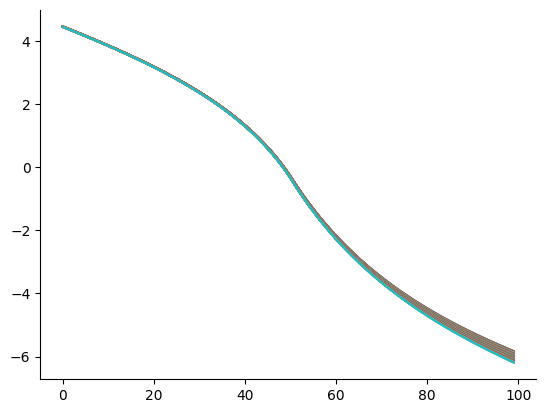

In [85]:
plt.plot(res["v0"])
plt.show()

In [86]:
ϕ_list[10] = res["v0"]
ems_list[10] = res["ems"]

In [91]:
res = solve_prep(y1_mat, y2_mat, γ3_list[18], 1e-6, 0.05, 20000, 0.05, True)

Episode 0: PDE Error: 2.972909950189; False Transient Error: 2.395702930487; Iterations: 166; CG Error: 0.000000000096
Episode 1: PDE Error: 2.395491096724; False Transient Error: 1.934737894775; Iterations: 172; CG Error: 0.000000000085
Episode 2: PDE Error: 1.935082858599; False Transient Error: 1.566766307028; Iterations: 172; CG Error: 0.000000000090
Episode 3: PDE Error: 1.566805136013; False Transient Error: 1.272170009687; Iterations: 171; CG Error: 0.000000000100
Episode 4: PDE Error: 1.271845728805; False Transient Error: 1.036054615766; Iterations: 177; CG Error: 0.000000000093
Episode 5: PDE Error: 1.035435081281; False Transient Error: 0.846691125111; Iterations: 219; CG Error: 0.000000000096
Episode 6: PDE Error: 0.845857682527; False Transient Error: 0.694754025054; Iterations: 323; CG Error: 0.000000000098
Episode 7: PDE Error: 0.693777720039; False Transient Error: 0.572799952824; Iterations: 437; CG Error: 0.000000000095
Episode 8: PDE Error: 0.571737596679; False Tran

Episode 69: PDE Error: 0.097811743701; False Transient Error: 0.097378180417; Iterations: 3197; CG Error: 0.000000000095
Episode 70: PDE Error: 0.097542898410; False Transient Error: 0.097123606715; Iterations: 3222; CG Error: 0.000000000097
Episode 71: PDE Error: 0.097278030273; False Transient Error: 0.096872311385; Iterations: 3181; CG Error: 0.000000000096
Episode 72: PDE Error: 0.097016991235; False Transient Error: 0.096624179201; Iterations: 3140; CG Error: 0.000000000100
Episode 73: PDE Error: 0.096759647485; False Transient Error: 0.096379107567; Iterations: 3101; CG Error: 0.000000000090
Episode 74: PDE Error: 0.096505873730; False Transient Error: 0.096136991814; Iterations: 2930; CG Error: 0.000000000097
Episode 75: PDE Error: 0.096255541728; False Transient Error: 0.095897749722; Iterations: 3020; CG Error: 0.000000000092
Episode 76: PDE Error: 0.096008545376; False Transient Error: 0.095661300861; Iterations: 3039; CG Error: 0.000000000097
Episode 77: PDE Error: 0.0957647

Episode 137: PDE Error: 0.084750850157; False Transient Error: 0.084594521051; Iterations: 1770; CG Error: 0.000000000096
Episode 138: PDE Error: 0.084605202185; False Transient Error: 0.084449931777; Iterations: 1759; CG Error: 0.000000000093
Episode 139: PDE Error: 0.084460407496; False Transient Error: 0.084306170999; Iterations: 1750; CG Error: 0.000000000096
Episode 140: PDE Error: 0.084316447477; False Transient Error: 0.084163234339; Iterations: 1693; CG Error: 0.000000000087
Episode 141: PDE Error: 0.084173315779; False Transient Error: 0.084021113188; Iterations: 1728; CG Error: 0.000000000098
Episode 142: PDE Error: 0.084031004533; False Transient Error: 0.083879796475; Iterations: 1672; CG Error: 0.000000000095
Episode 143: PDE Error: 0.083889502932; False Transient Error: 0.083739273183; Iterations: 1708; CG Error: 0.000000000097
Episode 144: PDE Error: 0.083748798711; False Transient Error: 0.083599530026; Iterations: 1679; CG Error: 0.000000000088
Episode 145: PDE Error: 

Episode 207: PDE Error: 0.076153673986; False Transient Error: 0.076045421963; Iterations: 1042; CG Error: 0.000000000093
Episode 208: PDE Error: 0.076049155097; False Transient Error: 0.075941342584; Iterations: 1035; CG Error: 0.000000000095
Episode 209: PDE Error: 0.075945038948; False Transient Error: 0.075837660885; Iterations: 1025; CG Error: 0.000000000099
Episode 210: PDE Error: 0.075841320657; False Transient Error: 0.075734372405; Iterations: 1018; CG Error: 0.000000000099
Episode 211: PDE Error: 0.075737996320; False Transient Error: 0.075631474866; Iterations: 1012; CG Error: 0.000000000096
Episode 212: PDE Error: 0.075635063581; False Transient Error: 0.075528964009; Iterations: 1007; CG Error: 0.000000000094
Episode 213: PDE Error: 0.075532518865; False Transient Error: 0.075426836836; Iterations: 999; CG Error: 0.000000000092
Episode 214: PDE Error: 0.075430357902; False Transient Error: 0.075325091115; Iterations: 986; CG Error: 0.000000000099
Episode 215: PDE Error: 0.

Episode 278: PDE Error: 0.069566496297; False Transient Error: 0.069481576853; Iterations: 639; CG Error: 0.000000000094
Episode 279: PDE Error: 0.069483813011; False Transient Error: 0.069399138215; Iterations: 633; CG Error: 0.000000000094
Episode 280: PDE Error: 0.069401362739; False Transient Error: 0.069316932514; Iterations: 629; CG Error: 0.000000000093
Episode 281: PDE Error: 0.069319146586; False Transient Error: 0.069234958554; Iterations: 624; CG Error: 0.000000000100
Episode 282: PDE Error: 0.069237162293; False Transient Error: 0.069153215244; Iterations: 620; CG Error: 0.000000000091
Episode 283: PDE Error: 0.069155408161; False Transient Error: 0.069071700670; Iterations: 614; CG Error: 0.000000000099
Episode 284: PDE Error: 0.069073883514; False Transient Error: 0.068990414056; Iterations: 610; CG Error: 0.000000000097
Episode 285: PDE Error: 0.068992586290; False Transient Error: 0.068909357220; Iterations: 601; CG Error: 0.000000000090
Episode 286: PDE Error: 0.068911

Episode 349: PDE Error: 0.064206095116; False Transient Error: 0.064135325305; Iterations: 381; CG Error: 0.000000000097
Episode 350: PDE Error: 0.064137063752; False Transient Error: 0.064066455202; Iterations: 379; CG Error: 0.000000000097
Episode 351: PDE Error: 0.064068189080; False Transient Error: 0.063997740121; Iterations: 377; CG Error: 0.000000000093
Episode 352: PDE Error: 0.063999470139; False Transient Error: 0.063929179091; Iterations: 375; CG Error: 0.000000000096
Episode 353: PDE Error: 0.063930904738; False Transient Error: 0.063860771166; Iterations: 373; CG Error: 0.000000000089
Episode 354: PDE Error: 0.063862492731; False Transient Error: 0.063792515493; Iterations: 370; CG Error: 0.000000000096
Episode 355: PDE Error: 0.063794232684; False Transient Error: 0.063724412183; Iterations: 368; CG Error: 0.000000000097
Episode 356: PDE Error: 0.063726125789; False Transient Error: 0.063656460584; Iterations: 365; CG Error: 0.000000000098
Episode 357: PDE Error: 0.063658

Episode 420: PDE Error: 0.059655371405; False Transient Error: 0.059594306578; Iterations: 236; CG Error: 0.000000000095
Episode 421: PDE Error: 0.059595845958; False Transient Error: 0.059534898298; Iterations: 234; CG Error: 0.000000000098
Episode 422: PDE Error: 0.059536434415; False Transient Error: 0.059475603386; Iterations: 233; CG Error: 0.000000000096
Episode 423: PDE Error: 0.059477139684; False Transient Error: 0.059416421744; Iterations: 232; CG Error: 0.000000000090
Episode 424: PDE Error: 0.059417955235; False Transient Error: 0.059357353090; Iterations: 230; CG Error: 0.000000000094
Episode 425: PDE Error: 0.059358884645; False Transient Error: 0.059298396702; Iterations: 228; CG Error: 0.000000000097
Episode 426: PDE Error: 0.059299926592; False Transient Error: 0.059239551592; Iterations: 226; CG Error: 0.000000000099
Episode 427: PDE Error: 0.059241080945; False Transient Error: 0.059180816480; Iterations: 225; CG Error: 0.000000000091
Episode 428: PDE Error: 0.059182

Episode 489: PDE Error: 0.055793691311; False Transient Error: 0.055739633182; Iterations: 172; CG Error: 0.000000000092
Episode 490: PDE Error: 0.055741089502; False Transient Error: 0.055687118492; Iterations: 171; CG Error: 0.000000000100
Episode 491: PDE Error: 0.055688574305; False Transient Error: 0.055634691232; Iterations: 171; CG Error: 0.000000000099
Episode 492: PDE Error: 0.055636146294; False Transient Error: 0.055582350892; Iterations: 171; CG Error: 0.000000000098
Episode 493: PDE Error: 0.055583805227; False Transient Error: 0.055530097318; Iterations: 171; CG Error: 0.000000000097
Episode 494: PDE Error: 0.055531550931; False Transient Error: 0.055477930366; Iterations: 171; CG Error: 0.000000000096
Episode 495: PDE Error: 0.055479383262; False Transient Error: 0.055425849802; Iterations: 171; CG Error: 0.000000000095
Episode 496: PDE Error: 0.055427301989; False Transient Error: 0.055373855326; Iterations: 171; CG Error: 0.000000000093
Episode 497: PDE Error: 0.055375

Episode 561: PDE Error: 0.052265312627; False Transient Error: 0.052239448221; Iterations: 162; CG Error: 0.000000000093
Episode 562: PDE Error: 0.052239447872; False Transient Error: 0.052213596369; Iterations: 161; CG Error: 0.000000000099
Episode 563: PDE Error: 0.052213597242; False Transient Error: 0.052187757339; Iterations: 161; CG Error: 0.000000000097
Episode 564: PDE Error: 0.052187758155; False Transient Error: 0.052161930880; Iterations: 161; CG Error: 0.000000000096
Episode 565: PDE Error: 0.052161931661; False Transient Error: 0.052136117073; Iterations: 161; CG Error: 0.000000000095
Episode 566: PDE Error: 0.052136117845; False Transient Error: 0.052110315959; Iterations: 161; CG Error: 0.000000000095
Episode 567: PDE Error: 0.052110316741; False Transient Error: 0.052084527571; Iterations: 161; CG Error: 0.000000000095
Episode 568: PDE Error: 0.052084528381; False Transient Error: 0.052058751927; Iterations: 161; CG Error: 0.000000000094
Episode 569: PDE Error: 0.052058

Episode 633: PDE Error: 0.050435359783; False Transient Error: 0.050410401294; Iterations: 153; CG Error: 0.000000000097
Episode 634: PDE Error: 0.050410399964; False Transient Error: 0.050385453856; Iterations: 153; CG Error: 0.000000000096
Episode 635: PDE Error: 0.050385452553; False Transient Error: 0.050360518806; Iterations: 153; CG Error: 0.000000000095
Episode 636: PDE Error: 0.050360517540; False Transient Error: 0.050335596121; Iterations: 153; CG Error: 0.000000000094
Episode 637: PDE Error: 0.050335594904; False Transient Error: 0.050310685779; Iterations: 153; CG Error: 0.000000000093
Episode 638: PDE Error: 0.050310684620; False Transient Error: 0.050285787761; Iterations: 153; CG Error: 0.000000000092
Episode 639: PDE Error: 0.050285786663; False Transient Error: 0.050260902054; Iterations: 153; CG Error: 0.000000000091
Episode 640: PDE Error: 0.050260901013; False Transient Error: 0.050236028647; Iterations: 153; CG Error: 0.000000000091
Episode 641: PDE Error: 0.050236

Episode 705: PDE Error: 0.048669456695; False Transient Error: 0.048645369736; Iterations: 151; CG Error: 0.000000000095
Episode 706: PDE Error: 0.048645370368; False Transient Error: 0.048621295337; Iterations: 151; CG Error: 0.000000000095
Episode 707: PDE Error: 0.048621295971; False Transient Error: 0.048597232851; Iterations: 151; CG Error: 0.000000000094
Episode 708: PDE Error: 0.048597233495; False Transient Error: 0.048573182269; Iterations: 151; CG Error: 0.000000000094
Episode 709: PDE Error: 0.048573182922; False Transient Error: 0.048549143585; Iterations: 151; CG Error: 0.000000000094
Episode 710: PDE Error: 0.048549144242; False Transient Error: 0.048525116794; Iterations: 151; CG Error: 0.000000000094
Episode 711: PDE Error: 0.048525117445; False Transient Error: 0.048501101892; Iterations: 151; CG Error: 0.000000000093
Episode 712: PDE Error: 0.048501102522; False Transient Error: 0.048477098874; Iterations: 151; CG Error: 0.000000000093
Episode 713: PDE Error: 0.048477

Episode 777: PDE Error: 0.046965349027; False Transient Error: 0.046942104515; Iterations: 150; CG Error: 0.000000000093
Episode 778: PDE Error: 0.046942105764; False Transient Error: 0.046918872707; Iterations: 150; CG Error: 0.000000000093
Episode 779: PDE Error: 0.046918874000; False Transient Error: 0.046895652391; Iterations: 150; CG Error: 0.000000000092
Episode 780: PDE Error: 0.046895653720; False Transient Error: 0.046872443554; Iterations: 150; CG Error: 0.000000000092
Episode 781: PDE Error: 0.046872444910; False Transient Error: 0.046849246181; Iterations: 150; CG Error: 0.000000000092
Episode 782: PDE Error: 0.046849247561; False Transient Error: 0.046826060264; Iterations: 150; CG Error: 0.000000000092
Episode 783: PDE Error: 0.046826061671; False Transient Error: 0.046802885797; Iterations: 150; CG Error: 0.000000000092
Episode 784: PDE Error: 0.046802887238; False Transient Error: 0.046779722781; Iterations: 150; CG Error: 0.000000000092
Episode 785: PDE Error: 0.046779

Episode 849: PDE Error: 0.045320881318; False Transient Error: 0.045298450337; Iterations: 149; CG Error: 0.000000000090
Episode 850: PDE Error: 0.045298451417; False Transient Error: 0.045276031542; Iterations: 149; CG Error: 0.000000000090
Episode 851: PDE Error: 0.045276032596; False Transient Error: 0.045253623817; Iterations: 149; CG Error: 0.000000000090
Episode 852: PDE Error: 0.045253624865; False Transient Error: 0.045231227163; Iterations: 149; CG Error: 0.000000000090
Episode 853: PDE Error: 0.045231228239; False Transient Error: 0.045208841581; Iterations: 149; CG Error: 0.000000000091
Episode 854: PDE Error: 0.045208842713; False Transient Error: 0.045186467074; Iterations: 149; CG Error: 0.000000000090
Episode 855: PDE Error: 0.045186468283; False Transient Error: 0.045164103646; Iterations: 149; CG Error: 0.000000000090
Episode 856: PDE Error: 0.045164104935; False Transient Error: 0.045141751296; Iterations: 149; CG Error: 0.000000000090
Episode 857: PDE Error: 0.045141

Episode 921: PDE Error: 0.043733965842; False Transient Error: 0.043712320260; Iterations: 148; CG Error: 0.000000000095
Episode 922: PDE Error: 0.043712320921; False Transient Error: 0.043690686058; Iterations: 148; CG Error: 0.000000000096
Episode 923: PDE Error: 0.043690686705; False Transient Error: 0.043669062564; Iterations: 148; CG Error: 0.000000000096
Episode 924: PDE Error: 0.043669063194; False Transient Error: 0.043647449776; Iterations: 148; CG Error: 0.000000000096
Episode 925: PDE Error: 0.043647450394; False Transient Error: 0.043625847693; Iterations: 148; CG Error: 0.000000000096
Episode 926: PDE Error: 0.043625848304; False Transient Error: 0.043604256313; Iterations: 148; CG Error: 0.000000000096
Episode 927: PDE Error: 0.043604256920; False Transient Error: 0.043582675630; Iterations: 148; CG Error: 0.000000000095
Episode 928: PDE Error: 0.043582676236; False Transient Error: 0.043561105639; Iterations: 148; CG Error: 0.000000000095
Episode 929: PDE Error: 0.043561

Episode 993: PDE Error: 0.042227850820; False Transient Error: 0.042181702157; Iterations: 147; CG Error: 0.000000000098
Episode 994: PDE Error: 0.042207357824; False Transient Error: 0.042160825179; Iterations: 147; CG Error: 0.000000000098
Episode 995: PDE Error: 0.042186874822; False Transient Error: 0.042139958545; Iterations: 147; CG Error: 0.000000000097
Episode 996: PDE Error: 0.042166401813; False Transient Error: 0.042119102250; Iterations: 147; CG Error: 0.000000000097
Episode 997: PDE Error: 0.042145938792; False Transient Error: 0.042098256289; Iterations: 147; CG Error: 0.000000000096
Episode 998: PDE Error: 0.042125485758; False Transient Error: 0.042077420658; Iterations: 147; CG Error: 0.000000000096
Episode 999: PDE Error: 0.042105042699; False Transient Error: 0.042056595347; Iterations: 147; CG Error: 0.000000000095
Episode 1000: PDE Error: 0.042084609606; False Transient Error: 0.042035780349; Iterations: 147; CG Error: 0.000000000095
Episode 1001: PDE Error: 0.0420

Episode 1065: PDE Error: 0.040777571268; False Transient Error: 0.040704655142; Iterations: 146; CG Error: 0.000000000089
Episode 1066: PDE Error: 0.040757784414; False Transient Error: 0.040684508861; Iterations: 146; CG Error: 0.000000000089
Episode 1067: PDE Error: 0.040738007203; False Transient Error: 0.040664372550; Iterations: 146; CG Error: 0.000000000088
Episode 1068: PDE Error: 0.040718239629; False Transient Error: 0.040644246206; Iterations: 146; CG Error: 0.000000000088
Episode 1069: PDE Error: 0.040698481689; False Transient Error: 0.040624129395; Iterations: 145; CG Error: 0.000000000099
Episode 1070: PDE Error: 0.040678731800; False Transient Error: 0.040604022532; Iterations: 145; CG Error: 0.000000000099
Episode 1071: PDE Error: 0.040658992961; False Transient Error: 0.040583925797; Iterations: 144; CG Error: 0.000000000100
Episode 1072: PDE Error: 0.040639264429; False Transient Error: 0.040563838927; Iterations: 144; CG Error: 0.000000000099
Episode 1073: PDE Error:

Episode 1137: PDE Error: 0.039377274314; False Transient Error: 0.039279305496; Iterations: 142; CG Error: 0.000000000099
Episode 1138: PDE Error: 0.039358171166; False Transient Error: 0.039259864083; Iterations: 142; CG Error: 0.000000000099
Episode 1139: PDE Error: 0.039339075638; False Transient Error: 0.039240432820; Iterations: 142; CG Error: 0.000000000098
Episode 1140: PDE Error: 0.039319989575; False Transient Error: 0.039221011373; Iterations: 142; CG Error: 0.000000000098
Episode 1141: PDE Error: 0.039300912920; False Transient Error: 0.039201599510; Iterations: 142; CG Error: 0.000000000097
Episode 1142: PDE Error: 0.039281845588; False Transient Error: 0.039182197137; Iterations: 142; CG Error: 0.000000000097
Episode 1143: PDE Error: 0.039262787532; False Transient Error: 0.039162804239; Iterations: 142; CG Error: 0.000000000096
Episode 1144: PDE Error: 0.039243738746; False Transient Error: 0.039143420833; Iterations: 142; CG Error: 0.000000000096
Episode 1145: PDE Error:

Episode 1209: PDE Error: 0.038025282546; False Transient Error: 0.037903846188; Iterations: 141; CG Error: 0.000000000097
Episode 1210: PDE Error: 0.038006837221; False Transient Error: 0.037885085558; Iterations: 141; CG Error: 0.000000000097
Episode 1211: PDE Error: 0.037988400877; False Transient Error: 0.037866334130; Iterations: 141; CG Error: 0.000000000096
Episode 1212: PDE Error: 0.037969973507; False Transient Error: 0.037847591919; Iterations: 141; CG Error: 0.000000000096
Episode 1213: PDE Error: 0.037951555118; False Transient Error: 0.037828858941; Iterations: 141; CG Error: 0.000000000095
Episode 1214: PDE Error: 0.037933145707; False Transient Error: 0.037810135214; Iterations: 141; CG Error: 0.000000000095
Episode 1215: PDE Error: 0.037914745278; False Transient Error: 0.037791420748; Iterations: 141; CG Error: 0.000000000094
Episode 1216: PDE Error: 0.037896353829; False Transient Error: 0.037772715551; Iterations: 141; CG Error: 0.000000000094
Episode 1217: PDE Error:

Episode 1281: PDE Error: 0.036719960312; False Transient Error: 0.036576527916; Iterations: 140; CG Error: 0.000000000094
Episode 1282: PDE Error: 0.036702151930; False Transient Error: 0.036558423885; Iterations: 140; CG Error: 0.000000000094
Episode 1283: PDE Error: 0.036684352238; False Transient Error: 0.036540328807; Iterations: 140; CG Error: 0.000000000094
Episode 1284: PDE Error: 0.036666561237; False Transient Error: 0.036522242679; Iterations: 140; CG Error: 0.000000000094
Episode 1285: PDE Error: 0.036648778919; False Transient Error: 0.036504165498; Iterations: 140; CG Error: 0.000000000094
Episode 1286: PDE Error: 0.036631005280; False Transient Error: 0.036486097260; Iterations: 140; CG Error: 0.000000000094
Episode 1287: PDE Error: 0.036613240317; False Transient Error: 0.036468037961; Iterations: 140; CG Error: 0.000000000094
Episode 1288: PDE Error: 0.036595484025; False Transient Error: 0.036449987599; Iterations: 140; CG Error: 0.000000000094
Episode 1289: PDE Error:

Episode 1353: PDE Error: 0.035459727450; False Transient Error: 0.035295670869; Iterations: 140; CG Error: 0.000000000085
Episode 1354: PDE Error: 0.035442534404; False Transient Error: 0.035278200597; Iterations: 140; CG Error: 0.000000000085
Episode 1355: PDE Error: 0.035425349752; False Transient Error: 0.035260738969; Iterations: 140; CG Error: 0.000000000085
Episode 1356: PDE Error: 0.035408173499; False Transient Error: 0.035243285981; Iterations: 140; CG Error: 0.000000000085
Episode 1357: PDE Error: 0.035391005630; False Transient Error: 0.035225841628; Iterations: 140; CG Error: 0.000000000084
Episode 1358: PDE Error: 0.035373846145; False Transient Error: 0.035208405903; Iterations: 140; CG Error: 0.000000000084
Episode 1359: PDE Error: 0.035356695046; False Transient Error: 0.035190978804; Iterations: 140; CG Error: 0.000000000084
Episode 1360: PDE Error: 0.035339552329; False Transient Error: 0.035173560326; Iterations: 140; CG Error: 0.000000000084
Episode 1361: PDE Error:

Episode 1426: PDE Error: 0.034226456675; False Transient Error: 0.034042790324; Iterations: 139; CG Error: 0.000000000092
Episode 1427: PDE Error: 0.034209866227; False Transient Error: 0.034025939863; Iterations: 139; CG Error: 0.000000000092
Episode 1428: PDE Error: 0.034193283894; False Transient Error: 0.034009097738; Iterations: 139; CG Error: 0.000000000092
Episode 1429: PDE Error: 0.034176709663; False Transient Error: 0.033992263945; Iterations: 139; CG Error: 0.000000000091
Episode 1430: PDE Error: 0.034160143538; False Transient Error: 0.033975438478; Iterations: 139; CG Error: 0.000000000091
Episode 1431: PDE Error: 0.034143585512; False Transient Error: 0.033958621335; Iterations: 139; CG Error: 0.000000000091
Episode 1432: PDE Error: 0.034127035577; False Transient Error: 0.033941812512; Iterations: 139; CG Error: 0.000000000091
Episode 1433: PDE Error: 0.034110493733; False Transient Error: 0.033925012004; Iterations: 139; CG Error: 0.000000000090
Episode 1434: PDE Error:

Episode 1501: PDE Error: 0.033017236278; False Transient Error: 0.032801867426; Iterations: 138; CG Error: 0.000000000094
Episode 1502: PDE Error: 0.033001517205; False Transient Error: 0.032785630942; Iterations: 138; CG Error: 0.000000000094
Episode 1503: PDE Error: 0.032985805792; False Transient Error: 0.032769402486; Iterations: 138; CG Error: 0.000000000094
Episode 1504: PDE Error: 0.032970102030; False Transient Error: 0.032753182053; Iterations: 138; CG Error: 0.000000000094
Episode 1505: PDE Error: 0.032954405922; False Transient Error: 0.032736969640; Iterations: 138; CG Error: 0.000000000094
Episode 1506: PDE Error: 0.032938717465; False Transient Error: 0.032720765242; Iterations: 138; CG Error: 0.000000000094
Episode 1507: PDE Error: 0.032923036653; False Transient Error: 0.032704568855; Iterations: 138; CG Error: 0.000000000094
Episode 1508: PDE Error: 0.032907363483; False Transient Error: 0.032688380476; Iterations: 138; CG Error: 0.000000000094
Episode 1509: PDE Error:

Episode 1571: PDE Error: 0.031935202786; False Transient Error: 0.031684497254; Iterations: 137; CG Error: 0.000000000100
Episode 1572: PDE Error: 0.031920011052; False Transient Error: 0.031668813759; Iterations: 137; CG Error: 0.000000000100
Episode 1573: PDE Error: 0.031904826723; False Transient Error: 0.031653138112; Iterations: 137; CG Error: 0.000000000099
Episode 1574: PDE Error: 0.031889649852; False Transient Error: 0.031637470185; Iterations: 137; CG Error: 0.000000000099
Episode 1575: PDE Error: 0.031874480368; False Transient Error: 0.031621809934; Iterations: 137; CG Error: 0.000000000099
Episode 1576: PDE Error: 0.031859318257; False Transient Error: 0.031606157367; Iterations: 137; CG Error: 0.000000000099
Episode 1577: PDE Error: 0.031844163528; False Transient Error: 0.031590512502; Iterations: 137; CG Error: 0.000000000099
Episode 1578: PDE Error: 0.031829016188; False Transient Error: 0.031574875353; Iterations: 137; CG Error: 0.000000000099
Episode 1579: PDE Error:

Episode 1640: PDE Error: 0.030904164634; False Transient Error: 0.030620331793; Iterations: 137; CG Error: 0.000000000094
Episode 1641: PDE Error: 0.030889475630; False Transient Error: 0.030605174657; Iterations: 137; CG Error: 0.000000000093
Episode 1642: PDE Error: 0.030874793790; False Transient Error: 0.030590025023; Iterations: 137; CG Error: 0.000000000093
Episode 1643: PDE Error: 0.030860119105; False Transient Error: 0.030574882887; Iterations: 137; CG Error: 0.000000000093
Episode 1644: PDE Error: 0.030845451578; False Transient Error: 0.030559748246; Iterations: 137; CG Error: 0.000000000093
Episode 1645: PDE Error: 0.030830791203; False Transient Error: 0.030544621096; Iterations: 137; CG Error: 0.000000000093
Episode 1646: PDE Error: 0.030816137976; False Transient Error: 0.030529501433; Iterations: 137; CG Error: 0.000000000093
Episode 1647: PDE Error: 0.030801491893; False Transient Error: 0.030514389255; Iterations: 137; CG Error: 0.000000000093
Episode 1648: PDE Error:

Episode 1709: PDE Error: 0.029907244123; False Transient Error: 0.029591891073; Iterations: 136; CG Error: 0.000000000095
Episode 1710: PDE Error: 0.029893041254; False Transient Error: 0.029577242822; Iterations: 136; CG Error: 0.000000000095
Episode 1711: PDE Error: 0.029878845311; False Transient Error: 0.029562601818; Iterations: 136; CG Error: 0.000000000095
Episode 1712: PDE Error: 0.029864656291; False Transient Error: 0.029547968059; Iterations: 136; CG Error: 0.000000000095
Episode 1713: PDE Error: 0.029850474193; False Transient Error: 0.029533341541; Iterations: 136; CG Error: 0.000000000095
Episode 1714: PDE Error: 0.029836299006; False Transient Error: 0.029518722260; Iterations: 136; CG Error: 0.000000000095
Episode 1715: PDE Error: 0.029822130734; False Transient Error: 0.029504110213; Iterations: 136; CG Error: 0.000000000094
Episode 1716: PDE Error: 0.029807969371; False Transient Error: 0.029489505396; Iterations: 136; CG Error: 0.000000000094
Episode 1717: PDE Error:

Episode 1778: PDE Error: 0.029207781165; False Transient Error: 0.028597979420; Iterations: 136; CG Error: 0.000000000088
Episode 1779: PDE Error: 0.029206526608; False Transient Error: 0.028583822974; Iterations: 136; CG Error: 0.000000000088
Episode 1780: PDE Error: 0.029205269149; False Transient Error: 0.028569673533; Iterations: 136; CG Error: 0.000000000088
Episode 1781: PDE Error: 0.029204008790; False Transient Error: 0.028555531093; Iterations: 136; CG Error: 0.000000000088
Episode 1782: PDE Error: 0.029202745538; False Transient Error: 0.028541395651; Iterations: 136; CG Error: 0.000000000088
Episode 1783: PDE Error: 0.029201479397; False Transient Error: 0.028527267204; Iterations: 136; CG Error: 0.000000000088
Episode 1784: PDE Error: 0.029200210370; False Transient Error: 0.028513145748; Iterations: 136; CG Error: 0.000000000088
Episode 1785: PDE Error: 0.029198938464; False Transient Error: 0.028499031280; Iterations: 136; CG Error: 0.000000000088
Episode 1786: PDE Error:

Episode 1848: PDE Error: 0.029113208445; False Transient Error: 0.027623755744; Iterations: 135; CG Error: 0.000000000096
Episode 1849: PDE Error: 0.029111761976; False Transient Error: 0.027610081361; Iterations: 135; CG Error: 0.000000000096
Episode 1850: PDE Error: 0.029110312930; False Transient Error: 0.027596413743; Iterations: 135; CG Error: 0.000000000096
Episode 1851: PDE Error: 0.029108861310; False Transient Error: 0.027582752887; Iterations: 135; CG Error: 0.000000000095
Episode 1852: PDE Error: 0.029107407121; False Transient Error: 0.027569098790; Iterations: 135; CG Error: 0.000000000095
Episode 1853: PDE Error: 0.029105950368; False Transient Error: 0.027555451449; Iterations: 135; CG Error: 0.000000000095
Episode 1854: PDE Error: 0.029104491054; False Transient Error: 0.027541810859; Iterations: 135; CG Error: 0.000000000095
Episode 1855: PDE Error: 0.029103029185; False Transient Error: 0.027528177020; Iterations: 135; CG Error: 0.000000000095
Episode 1856: PDE Error:

Episode 1917: PDE Error: 0.029007594482; False Transient Error: 0.026695922519; Iterations: 134; CG Error: 0.000000000099
Episode 1918: PDE Error: 0.029005981031; False Transient Error: 0.026682707508; Iterations: 134; CG Error: 0.000000000099
Episode 1919: PDE Error: 0.029004365309; False Transient Error: 0.026669499055; Iterations: 134; CG Error: 0.000000000098
Episode 1920: PDE Error: 0.029002747313; False Transient Error: 0.026656297139; Iterations: 134; CG Error: 0.000000000098
Episode 1921: PDE Error: 0.029001127045; False Transient Error: 0.026643101739; Iterations: 134; CG Error: 0.000000000098
Episode 1922: PDE Error: 0.028999504511; False Transient Error: 0.026629912836; Iterations: 134; CG Error: 0.000000000098
Episode 1923: PDE Error: 0.028997879718; False Transient Error: 0.026616730419; Iterations: 134; CG Error: 0.000000000098
Episode 1924: PDE Error: 0.028996252674; False Transient Error: 0.026603554479; Iterations: 134; CG Error: 0.000000000098
Episode 1925: PDE Error:

Episode 1991: PDE Error: 0.028882368785; False Transient Error: 0.025735447461; Iterations: 134; CG Error: 0.000000000093
Episode 1992: PDE Error: 0.028880599767; False Transient Error: 0.025722707442; Iterations: 134; CG Error: 0.000000000093
Episode 1993: PDE Error: 0.028878828811; False Transient Error: 0.025709973728; Iterations: 134; CG Error: 0.000000000093
Episode 1994: PDE Error: 0.028877055922; False Transient Error: 0.025697246315; Iterations: 134; CG Error: 0.000000000093
Episode 1995: PDE Error: 0.028875281103; False Transient Error: 0.025684525201; Iterations: 134; CG Error: 0.000000000093
Episode 1996: PDE Error: 0.028873504359; False Transient Error: 0.025671810381; Iterations: 134; CG Error: 0.000000000093
Episode 1997: PDE Error: 0.028871725695; False Transient Error: 0.025659101855; Iterations: 134; CG Error: 0.000000000093
Episode 1998: PDE Error: 0.028869945114; False Transient Error: 0.025646399617; Iterations: 134; CG Error: 0.000000000093
Episode 1999: PDE Error:

Episode 2062: PDE Error: 0.028752191305; False Transient Error: 0.024846398976; Iterations: 133; CG Error: 0.000000000098
Episode 2063: PDE Error: 0.028750295004; False Transient Error: 0.024834098992; Iterations: 133; CG Error: 0.000000000097
Episode 2064: PDE Error: 0.028748397048; False Transient Error: 0.024821805069; Iterations: 133; CG Error: 0.000000000097
Episode 2065: PDE Error: 0.028746497441; False Transient Error: 0.024809517210; Iterations: 133; CG Error: 0.000000000097
Episode 2066: PDE Error: 0.028744596188; False Transient Error: 0.024797235417; Iterations: 133; CG Error: 0.000000000097
Episode 2067: PDE Error: 0.028742693292; False Transient Error: 0.024784959691; Iterations: 133; CG Error: 0.000000000097
Episode 2068: PDE Error: 0.028740788758; False Transient Error: 0.024772690033; Iterations: 133; CG Error: 0.000000000097
Episode 2069: PDE Error: 0.028738882589; False Transient Error: 0.024760426443; Iterations: 133; CG Error: 0.000000000097
Episode 2070: PDE Error:

Episode 2131: PDE Error: 0.028617671629; False Transient Error: 0.024011816846; Iterations: 133; CG Error: 0.000000000091
Episode 2132: PDE Error: 0.028615670267; False Transient Error: 0.023999929744; Iterations: 133; CG Error: 0.000000000091
Episode 2133: PDE Error: 0.028613667511; False Transient Error: 0.023988048524; Iterations: 133; CG Error: 0.000000000091
Episode 2134: PDE Error: 0.028611663364; False Transient Error: 0.023976173184; Iterations: 133; CG Error: 0.000000000091
Episode 2135: PDE Error: 0.028609657830; False Transient Error: 0.023964303720; Iterations: 133; CG Error: 0.000000000090
Episode 2136: PDE Error: 0.028607650912; False Transient Error: 0.023952440130; Iterations: 133; CG Error: 0.000000000090
Episode 2137: PDE Error: 0.028605642614; False Transient Error: 0.023940582410; Iterations: 133; CG Error: 0.000000000090
Episode 2138: PDE Error: 0.028603632939; False Transient Error: 0.023928730558; Iterations: 133; CG Error: 0.000000000090
Episode 2139: PDE Error:

Episode 2202: PDE Error: 0.028472305934; False Transient Error: 0.023182287389; Iterations: 132; CG Error: 0.000000000093
Episode 2203: PDE Error: 0.028470214023; False Transient Error: 0.023170810799; Iterations: 132; CG Error: 0.000000000093
Episode 2204: PDE Error: 0.028468120953; False Transient Error: 0.023159339888; Iterations: 132; CG Error: 0.000000000093
Episode 2205: PDE Error: 0.028466026730; False Transient Error: 0.023147874654; Iterations: 132; CG Error: 0.000000000093
Episode 2206: PDE Error: 0.028463931357; False Transient Error: 0.023136415093; Iterations: 132; CG Error: 0.000000000093
Episode 2207: PDE Error: 0.028461834835; False Transient Error: 0.023124961204; Iterations: 132; CG Error: 0.000000000093
Episode 2208: PDE Error: 0.028459737169; False Transient Error: 0.023113512983; Iterations: 132; CG Error: 0.000000000093
Episode 2209: PDE Error: 0.028457638361; False Transient Error: 0.023102070426; Iterations: 132; CG Error: 0.000000000093
Episode 2210: PDE Error:

Episode 2273: PDE Error: 0.028321076465; False Transient Error: 0.022381398240; Iterations: 131; CG Error: 0.000000000095
Episode 2274: PDE Error: 0.028318909846; False Transient Error: 0.022370317987; Iterations: 131; CG Error: 0.000000000095
Episode 2275: PDE Error: 0.028316742281; False Transient Error: 0.022359243217; Iterations: 131; CG Error: 0.000000000095
Episode 2276: PDE Error: 0.028314573775; False Transient Error: 0.022348173926; Iterations: 131; CG Error: 0.000000000094
Episode 2277: PDE Error: 0.028312404330; False Transient Error: 0.022337110112; Iterations: 131; CG Error: 0.000000000094
Episode 2278: PDE Error: 0.028310233947; False Transient Error: 0.022326051773; Iterations: 131; CG Error: 0.000000000094
Episode 2279: PDE Error: 0.028308062632; False Transient Error: 0.022314998906; Iterations: 131; CG Error: 0.000000000094
Episode 2280: PDE Error: 0.028305890385; False Transient Error: 0.022303951508; Iterations: 131; CG Error: 0.000000000094
Episode 2281: PDE Error:

Episode 2344: PDE Error: 0.028165055038; False Transient Error: 0.021608169892; Iterations: 130; CG Error: 0.000000000098
Episode 2345: PDE Error: 0.028162828008; False Transient Error: 0.021597471922; Iterations: 130; CG Error: 0.000000000098
Episode 2346: PDE Error: 0.028160600221; False Transient Error: 0.021586779280; Iterations: 130; CG Error: 0.000000000097
Episode 2347: PDE Error: 0.028158371677; False Transient Error: 0.021576091967; Iterations: 130; CG Error: 0.000000000097
Episode 2348: PDE Error: 0.028156142379; False Transient Error: 0.021565409982; Iterations: 130; CG Error: 0.000000000097
Episode 2349: PDE Error: 0.028153912328; False Transient Error: 0.021554733321; Iterations: 130; CG Error: 0.000000000097
Episode 2350: PDE Error: 0.028151681527; False Transient Error: 0.021544061979; Iterations: 130; CG Error: 0.000000000097
Episode 2351: PDE Error: 0.028149449979; False Transient Error: 0.021533395949; Iterations: 130; CG Error: 0.000000000097
Episode 2352: PDE Error:

Episode 2416: PDE Error: 0.028002917937; False Transient Error: 0.020851316858; Iterations: 130; CG Error: 0.000000000090
Episode 2417: PDE Error: 0.028000642533; False Transient Error: 0.020840993813; Iterations: 130; CG Error: 0.000000000090
Episode 2418: PDE Error: 0.027998366540; False Transient Error: 0.020830675877; Iterations: 130; CG Error: 0.000000000090
Episode 2419: PDE Error: 0.027996089963; False Transient Error: 0.020820363047; Iterations: 130; CG Error: 0.000000000090
Episode 2420: PDE Error: 0.027993812801; False Transient Error: 0.020810055321; Iterations: 130; CG Error: 0.000000000090
Episode 2421: PDE Error: 0.027991535058; False Transient Error: 0.020799752696; Iterations: 130; CG Error: 0.000000000089
Episode 2422: PDE Error: 0.027989256735; False Transient Error: 0.020789455169; Iterations: 130; CG Error: 0.000000000089
Episode 2423: PDE Error: 0.027986977836; False Transient Error: 0.020779162739; Iterations: 130; CG Error: 0.000000000089
Episode 2424: PDE Error:

Episode 2485: PDE Error: 0.027844647142; False Transient Error: 0.020150884999; Iterations: 129; CG Error: 0.000000000096
Episode 2486: PDE Error: 0.027842336153; False Transient Error: 0.020140908569; Iterations: 129; CG Error: 0.000000000096
Episode 2487: PDE Error: 0.027840024720; False Transient Error: 0.020130937077; Iterations: 129; CG Error: 0.000000000096
Episode 2488: PDE Error: 0.027837712843; False Transient Error: 0.020120970519; Iterations: 129; CG Error: 0.000000000096
Episode 2489: PDE Error: 0.027835400525; False Transient Error: 0.020111008894; Iterations: 129; CG Error: 0.000000000096
Episode 2490: PDE Error: 0.027833087768; False Transient Error: 0.020101052200; Iterations: 129; CG Error: 0.000000000095
Episode 2491: PDE Error: 0.027830774573; False Transient Error: 0.020091100432; Iterations: 129; CG Error: 0.000000000095
Episode 2492: PDE Error: 0.027828460942; False Transient Error: 0.020081153590; Iterations: 129; CG Error: 0.000000000095
Episode 2493: PDE Error:

Episode 2557: PDE Error: 0.027677231395; False Transient Error: 0.019445057456; Iterations: 129; CG Error: 0.000000000091
Episode 2558: PDE Error: 0.027674893157; False Transient Error: 0.019435430348; Iterations: 129; CG Error: 0.000000000091
Episode 2559: PDE Error: 0.027672554606; False Transient Error: 0.019425808005; Iterations: 129; CG Error: 0.000000000090
Episode 2560: PDE Error: 0.027670215745; False Transient Error: 0.019416190424; Iterations: 129; CG Error: 0.000000000090
Episode 2561: PDE Error: 0.027667876575; False Transient Error: 0.019406577603; Iterations: 129; CG Error: 0.000000000090
Episode 2562: PDE Error: 0.027665537096; False Transient Error: 0.019396969539; Iterations: 129; CG Error: 0.000000000090
Episode 2563: PDE Error: 0.027663197313; False Transient Error: 0.019387366231; Iterations: 129; CG Error: 0.000000000090
Episode 2564: PDE Error: 0.027660857225; False Transient Error: 0.019377767675; Iterations: 129; CG Error: 0.000000000090
Episode 2565: PDE Error:

Episode 2628: PDE Error: 0.027510535428; False Transient Error: 0.018773239064; Iterations: 129; CG Error: 0.000000000086
Episode 2629: PDE Error: 0.027508179118; False Transient Error: 0.018763944444; Iterations: 129; CG Error: 0.000000000086
Episode 2630: PDE Error: 0.027505822611; False Transient Error: 0.018754654425; Iterations: 129; CG Error: 0.000000000086
Episode 2631: PDE Error: 0.027503465910; False Transient Error: 0.018745369003; Iterations: 129; CG Error: 0.000000000086
Episode 2632: PDE Error: 0.027501109014; False Transient Error: 0.018736088176; Iterations: 129; CG Error: 0.000000000086
Episode 2633: PDE Error: 0.027498751925; False Transient Error: 0.018726811943; Iterations: 129; CG Error: 0.000000000086
Episode 2634: PDE Error: 0.027496394646; False Transient Error: 0.018717540300; Iterations: 129; CG Error: 0.000000000086
Episode 2635: PDE Error: 0.027494037177; False Transient Error: 0.018708273246; Iterations: 129; CG Error: 0.000000000086
Episode 2636: PDE Error:

Episode 2700: PDE Error: 0.027340465855; False Transient Error: 0.018115653095; Iterations: 128; CG Error: 0.000000000099
Episode 2701: PDE Error: 0.027338099182; False Transient Error: 0.018106684700; Iterations: 128; CG Error: 0.000000000099
Episode 2702: PDE Error: 0.027335732417; False Transient Error: 0.018097720740; Iterations: 128; CG Error: 0.000000000099
Episode 2703: PDE Error: 0.027333365561; False Transient Error: 0.018088761183; Iterations: 128; CG Error: 0.000000000099
Episode 2704: PDE Error: 0.027330998615; False Transient Error: 0.018079806006; Iterations: 128; CG Error: 0.000000000099
Episode 2705: PDE Error: 0.027328631582; False Transient Error: 0.018070855192; Iterations: 128; CG Error: 0.000000000099
Episode 2706: PDE Error: 0.027326264463; False Transient Error: 0.018061908732; Iterations: 128; CG Error: 0.000000000099
Episode 2707: PDE Error: 0.027323897258; False Transient Error: 0.018052966623; Iterations: 128; CG Error: 0.000000000099
Episode 2708: PDE Error:

Episode 2772: PDE Error: 0.027409283940; False Transient Error: 0.017481095537; Iterations: 128; CG Error: 0.000000000096
Episode 2773: PDE Error: 0.027411360590; False Transient Error: 0.017472440426; Iterations: 128; CG Error: 0.000000000096
Episode 2774: PDE Error: 0.027413437468; False Transient Error: 0.017463789598; Iterations: 128; CG Error: 0.000000000096
Episode 2775: PDE Error: 0.027415514571; False Transient Error: 0.017455143051; Iterations: 128; CG Error: 0.000000000096
Episode 2776: PDE Error: 0.027417591899; False Transient Error: 0.017446500783; Iterations: 128; CG Error: 0.000000000096
Episode 2777: PDE Error: 0.027419669450; False Transient Error: 0.017437862793; Iterations: 128; CG Error: 0.000000000096
Episode 2778: PDE Error: 0.027421747223; False Transient Error: 0.017429229078; Iterations: 128; CG Error: 0.000000000096
Episode 2779: PDE Error: 0.027423825217; False Transient Error: 0.017420599636; Iterations: 128; CG Error: 0.000000000096
Episode 2780: PDE Error:

Episode 2844: PDE Error: 0.027559303006; False Transient Error: 0.016868750867; Iterations: 128; CG Error: 0.000000000093
Episode 2845: PDE Error: 0.027561392596; False Transient Error: 0.016860398818; Iterations: 128; CG Error: 0.000000000093
Episode 2846: PDE Error: 0.027563482318; False Transient Error: 0.016852050902; Iterations: 128; CG Error: 0.000000000093
Episode 2847: PDE Error: 0.027565572171; False Transient Error: 0.016843707117; Iterations: 128; CG Error: 0.000000000093
Episode 2848: PDE Error: 0.027567662155; False Transient Error: 0.016835367463; Iterations: 128; CG Error: 0.000000000093
Episode 2849: PDE Error: 0.027569752267; False Transient Error: 0.016827031936; Iterations: 128; CG Error: 0.000000000093
Episode 2850: PDE Error: 0.027571842507; False Transient Error: 0.016818700534; Iterations: 128; CG Error: 0.000000000093
Episode 2851: PDE Error: 0.027573932874; False Transient Error: 0.016810373256; Iterations: 128; CG Error: 0.000000000093
Episode 2852: PDE Error:

Episode 2916: PDE Error: 0.027710020738; False Transient Error: 0.016277848227; Iterations: 128; CG Error: 0.000000000091
Episode 2917: PDE Error: 0.027712116833; False Transient Error: 0.016269788639; Iterations: 128; CG Error: 0.000000000091
Episode 2918: PDE Error: 0.027714212977; False Transient Error: 0.016261733041; Iterations: 128; CG Error: 0.000000000091
Episode 2919: PDE Error: 0.027716309168; False Transient Error: 0.016253681430; Iterations: 128; CG Error: 0.000000000091
Episode 2920: PDE Error: 0.027718405405; False Transient Error: 0.016245632343; Iterations: 127; CG Error: 0.000000000100
Episode 2921: PDE Error: 0.027720503332; False Transient Error: 0.016237588502; Iterations: 127; CG Error: 0.000000000100
Episode 2922: PDE Error: 0.027722600462; False Transient Error: 0.016229549121; Iterations: 127; CG Error: 0.000000000100
Episode 2923: PDE Error: 0.027724697120; False Transient Error: 0.016221513735; Iterations: 127; CG Error: 0.000000000100
Episode 2924: PDE Error:

Episode 2987: PDE Error: 0.027858904259; False Transient Error: 0.015715417225; Iterations: 127; CG Error: 0.000000000098
Episode 2988: PDE Error: 0.027861001171; False Transient Error: 0.015707636010; Iterations: 127; CG Error: 0.000000000097
Episode 2989: PDE Error: 0.027863098056; False Transient Error: 0.015699858647; Iterations: 127; CG Error: 0.000000000097
Episode 2990: PDE Error: 0.027865194916; False Transient Error: 0.015692085132; Iterations: 127; CG Error: 0.000000000097
Episode 2991: PDE Error: 0.027867291748; False Transient Error: 0.015684315466; Iterations: 127; CG Error: 0.000000000097
Episode 2992: PDE Error: 0.027869388552; False Transient Error: 0.015676549645; Iterations: 127; CG Error: 0.000000000097
Episode 2993: PDE Error: 0.027871485326; False Transient Error: 0.015668787667; Iterations: 127; CG Error: 0.000000000097
Episode 2994: PDE Error: 0.027873582070; False Transient Error: 0.015661029532; Iterations: 127; CG Error: 0.000000000097
Episode 2995: PDE Error:

Episode 3059: PDE Error: 0.028009760231; False Transient Error: 0.015164901020; Iterations: 127; CG Error: 0.000000000094
Episode 3060: PDE Error: 0.028011852910; False Transient Error: 0.015157392285; Iterations: 127; CG Error: 0.000000000094
Episode 3061: PDE Error: 0.028013945497; False Transient Error: 0.015149887267; Iterations: 127; CG Error: 0.000000000094
Episode 3062: PDE Error: 0.028016037992; False Transient Error: 0.015142385963; Iterations: 127; CG Error: 0.000000000094
Episode 3063: PDE Error: 0.028018130394; False Transient Error: 0.015134888371; Iterations: 127; CG Error: 0.000000000094
Episode 3064: PDE Error: 0.028020222701; False Transient Error: 0.015127394491; Iterations: 127; CG Error: 0.000000000094
Episode 3065: PDE Error: 0.028022314913; False Transient Error: 0.015119904320; Iterations: 127; CG Error: 0.000000000094
Episode 3066: PDE Error: 0.028024407029; False Transient Error: 0.015112417857; Iterations: 127; CG Error: 0.000000000094
Episode 3067: PDE Error:

Episode 3131: PDE Error: 0.028160148722; False Transient Error: 0.014633662724; Iterations: 127; CG Error: 0.000000000090
Episode 3132: PDE Error: 0.028162232675; False Transient Error: 0.014626416930; Iterations: 127; CG Error: 0.000000000090
Episode 3133: PDE Error: 0.028164316478; False Transient Error: 0.014619174723; Iterations: 127; CG Error: 0.000000000090
Episode 3134: PDE Error: 0.028166400130; False Transient Error: 0.014611936100; Iterations: 127; CG Error: 0.000000000090
Episode 3135: PDE Error: 0.028168483631; False Transient Error: 0.014604701060; Iterations: 127; CG Error: 0.000000000090
Episode 3136: PDE Error: 0.028170566978; False Transient Error: 0.014597469601; Iterations: 127; CG Error: 0.000000000090
Episode 3137: PDE Error: 0.028172650172; False Transient Error: 0.014590241721; Iterations: 127; CG Error: 0.000000000090
Episode 3138: PDE Error: 0.028174733212; False Transient Error: 0.014583017419; Iterations: 127; CG Error: 0.000000000090
Episode 3139: PDE Error:

Episode 3203: PDE Error: 0.028309691844; False Transient Error: 0.014121016732; Iterations: 126; CG Error: 0.000000000098
Episode 3204: PDE Error: 0.028311759633; False Transient Error: 0.014114024310; Iterations: 126; CG Error: 0.000000000098
Episode 3205: PDE Error: 0.028313827172; False Transient Error: 0.014107035420; Iterations: 126; CG Error: 0.000000000098
Episode 3206: PDE Error: 0.028315894464; False Transient Error: 0.014100050048; Iterations: 126; CG Error: 0.000000000098
Episode 3207: PDE Error: 0.028317961506; False Transient Error: 0.014093068185; Iterations: 126; CG Error: 0.000000000098
Episode 3208: PDE Error: 0.028320028297; False Transient Error: 0.014086089819; Iterations: 126; CG Error: 0.000000000098
Episode 3209: PDE Error: 0.028322094836; False Transient Error: 0.014079114940; Iterations: 126; CG Error: 0.000000000098
Episode 3210: PDE Error: 0.028324161122; False Transient Error: 0.014072143540; Iterations: 126; CG Error: 0.000000000098
Episode 3211: PDE Error:

Episode 3275: PDE Error: 0.028457907255; False Transient Error: 0.013626332701; Iterations: 126; CG Error: 0.000000000093
Episode 3276: PDE Error: 0.028459956064; False Transient Error: 0.013619585517; Iterations: 126; CG Error: 0.000000000093
Episode 3277: PDE Error: 0.028462004602; False Transient Error: 0.013612841673; Iterations: 126; CG Error: 0.000000000093
Episode 3278: PDE Error: 0.028464052865; False Transient Error: 0.013606101167; Iterations: 126; CG Error: 0.000000000093
Episode 3279: PDE Error: 0.028466100857; False Transient Error: 0.013599363997; Iterations: 126; CG Error: 0.000000000093
Episode 3280: PDE Error: 0.028468148574; False Transient Error: 0.013592630161; Iterations: 126; CG Error: 0.000000000093
Episode 3281: PDE Error: 0.028470196018; False Transient Error: 0.013585899659; Iterations: 126; CG Error: 0.000000000093
Episode 3282: PDE Error: 0.028472243188; False Transient Error: 0.013579172489; Iterations: 126; CG Error: 0.000000000093
Episode 3283: PDE Error:

Episode 3347: PDE Error: 0.028604707058; False Transient Error: 0.013148974017; Iterations: 126; CG Error: 0.000000000089
Episode 3348: PDE Error: 0.028606735463; False Transient Error: 0.013142463117; Iterations: 126; CG Error: 0.000000000089
Episode 3349: PDE Error: 0.028608763573; False Transient Error: 0.013135955439; Iterations: 126; CG Error: 0.000000000089
Episode 3350: PDE Error: 0.028610791386; False Transient Error: 0.013129450982; Iterations: 126; CG Error: 0.000000000088
Episode 3351: PDE Error: 0.028612818904; False Transient Error: 0.013122949745; Iterations: 126; CG Error: 0.000000000088
Episode 3352: PDE Error: 0.028614846125; False Transient Error: 0.013116451726; Iterations: 126; CG Error: 0.000000000088
Episode 3353: PDE Error: 0.028616873049; False Transient Error: 0.013109956924; Iterations: 126; CG Error: 0.000000000088
Episode 3354: PDE Error: 0.028618899676; False Transient Error: 0.013103465336; Iterations: 126; CG Error: 0.000000000088
Episode 3355: PDE Error:

Episode 3418: PDE Error: 0.028747969017; False Transient Error: 0.012694618299; Iterations: 126; CG Error: 0.000000000085
Episode 3419: PDE Error: 0.028749975544; False Transient Error: 0.012688332298; Iterations: 126; CG Error: 0.000000000085
Episode 3420: PDE Error: 0.028751981749; False Transient Error: 0.012682049408; Iterations: 126; CG Error: 0.000000000085
Episode 3421: PDE Error: 0.028753987632; False Transient Error: 0.012675769628; Iterations: 126; CG Error: 0.000000000085
Episode 3422: PDE Error: 0.028755993194; False Transient Error: 0.012669492957; Iterations: 126; CG Error: 0.000000000085
Episode 3423: PDE Error: 0.028757998432; False Transient Error: 0.012663219393; Iterations: 126; CG Error: 0.000000000085
Episode 3424: PDE Error: 0.028760003348; False Transient Error: 0.012656948934; Iterations: 126; CG Error: 0.000000000085
Episode 3425: PDE Error: 0.028762007940; False Transient Error: 0.012650681578; Iterations: 126; CG Error: 0.000000000085
Episode 3426: PDE Error:

Episode 3490: PDE Error: 0.028891590781; False Transient Error: 0.012249880447; Iterations: 125; CG Error: 0.000000000098
Episode 3491: PDE Error: 0.028893573053; False Transient Error: 0.012243814566; Iterations: 125; CG Error: 0.000000000098
Episode 3492: PDE Error: 0.028895554978; False Transient Error: 0.012237751692; Iterations: 125; CG Error: 0.000000000098
Episode 3493: PDE Error: 0.028897536556; False Transient Error: 0.012231691821; Iterations: 125; CG Error: 0.000000000098
Episode 3494: PDE Error: 0.028899517787; False Transient Error: 0.012225634953; Iterations: 125; CG Error: 0.000000000097
Episode 3495: PDE Error: 0.028901498670; False Transient Error: 0.012219581085; Iterations: 125; CG Error: 0.000000000097
Episode 3496: PDE Error: 0.028903479205; False Transient Error: 0.012213530215; Iterations: 125; CG Error: 0.000000000097
Episode 3497: PDE Error: 0.028905459391; False Transient Error: 0.012207482342; Iterations: 125; CG Error: 0.000000000097
Episode 3498: PDE Error:

Episode 3562: PDE Error: 0.029033406251; False Transient Error: 0.011820725130; Iterations: 125; CG Error: 0.000000000094
Episode 3563: PDE Error: 0.029035362629; False Transient Error: 0.011814871701; Iterations: 125; CG Error: 0.000000000094
Episode 3564: PDE Error: 0.029037318636; False Transient Error: 0.011809021171; Iterations: 125; CG Error: 0.000000000094
Episode 3565: PDE Error: 0.029039274269; False Transient Error: 0.011803173536; Iterations: 125; CG Error: 0.000000000094
Episode 3566: PDE Error: 0.029041229529; False Transient Error: 0.011797328796; Iterations: 125; CG Error: 0.000000000094
Episode 3567: PDE Error: 0.029043184416; False Transient Error: 0.011791486950; Iterations: 125; CG Error: 0.000000000094
Episode 3568: PDE Error: 0.029045138930; False Transient Error: 0.011785647994; Iterations: 125; CG Error: 0.000000000094
Episode 3569: PDE Error: 0.029047093069; False Transient Error: 0.011779811930; Iterations: 125; CG Error: 0.000000000094
Episode 3570: PDE Error:

Episode 3634: PDE Error: 0.029173293952; False Transient Error: 0.011406599507; Iterations: 125; CG Error: 0.000000000091
Episode 3635: PDE Error: 0.029175222683; False Transient Error: 0.011400951075; Iterations: 125; CG Error: 0.000000000091
Episode 3636: PDE Error: 0.029177151017; False Transient Error: 0.011395305440; Iterations: 125; CG Error: 0.000000000091
Episode 3637: PDE Error: 0.029179078957; False Transient Error: 0.011389662599; Iterations: 125; CG Error: 0.000000000091
Episode 3638: PDE Error: 0.029181006500; False Transient Error: 0.011384022551; Iterations: 125; CG Error: 0.000000000091
Episode 3639: PDE Error: 0.029182933647; False Transient Error: 0.011378385296; Iterations: 125; CG Error: 0.000000000091
Episode 3640: PDE Error: 0.029184860397; False Transient Error: 0.011372750831; Iterations: 125; CG Error: 0.000000000091
Episode 3641: PDE Error: 0.029186786751; False Transient Error: 0.011367119154; Iterations: 125; CG Error: 0.000000000091
Episode 3642: PDE Error:

Episode 3705: PDE Error: 0.029309234556; False Transient Error: 0.011012430650; Iterations: 125; CG Error: 0.000000000089
Episode 3706: PDE Error: 0.029311134497; False Transient Error: 0.011006977339; Iterations: 125; CG Error: 0.000000000089
Episode 3707: PDE Error: 0.029313034023; False Transient Error: 0.011001526728; Iterations: 125; CG Error: 0.000000000089
Episode 3708: PDE Error: 0.029314933134; False Transient Error: 0.010996078815; Iterations: 125; CG Error: 0.000000000089
Episode 3709: PDE Error: 0.029316831828; False Transient Error: 0.010990633599; Iterations: 125; CG Error: 0.000000000089
Episode 3710: PDE Error: 0.029318730106; False Transient Error: 0.010985191078; Iterations: 125; CG Error: 0.000000000089
Episode 3711: PDE Error: 0.029320627968; False Transient Error: 0.010979751251; Iterations: 125; CG Error: 0.000000000089
Episode 3712: PDE Error: 0.029322525414; False Transient Error: 0.010974314118; Iterations: 125; CG Error: 0.000000000089
Episode 3713: PDE Error:

Episode 3777: PDE Error: 0.029444954086; False Transient Error: 0.010626613221; Iterations: 125; CG Error: 0.000000000087
Episode 3778: PDE Error: 0.029446823516; False Transient Error: 0.010621350900; Iterations: 125; CG Error: 0.000000000087
Episode 3779: PDE Error: 0.029448692515; False Transient Error: 0.010616091183; Iterations: 125; CG Error: 0.000000000087
Episode 3780: PDE Error: 0.029450561082; False Transient Error: 0.010610834070; Iterations: 125; CG Error: 0.000000000087
Episode 3781: PDE Error: 0.029452429217; False Transient Error: 0.010605579560; Iterations: 125; CG Error: 0.000000000086
Episode 3782: PDE Error: 0.029454296920; False Transient Error: 0.010600327651; Iterations: 125; CG Error: 0.000000000086
Episode 3783: PDE Error: 0.029456164191; False Transient Error: 0.010595078341; Iterations: 125; CG Error: 0.000000000086
Episode 3784: PDE Error: 0.029458031029; False Transient Error: 0.010589831630; Iterations: 125; CG Error: 0.000000000086
Episode 3785: PDE Error:

Episode 3849: PDE Error: 0.029578438300; False Transient Error: 0.010254308227; Iterations: 125; CG Error: 0.000000000085
Episode 3850: PDE Error: 0.029580276159; False Transient Error: 0.010249230209; Iterations: 125; CG Error: 0.000000000085
Episode 3851: PDE Error: 0.029582113572; False Transient Error: 0.010244154704; Iterations: 125; CG Error: 0.000000000085
Episode 3852: PDE Error: 0.029583950540; False Transient Error: 0.010239081712; Iterations: 125; CG Error: 0.000000000085
Episode 3853: PDE Error: 0.029585787062; False Transient Error: 0.010234011231; Iterations: 125; CG Error: 0.000000000085
Episode 3854: PDE Error: 0.029587623138; False Transient Error: 0.010228943261; Iterations: 125; CG Error: 0.000000000085
Episode 3855: PDE Error: 0.029589458769; False Transient Error: 0.010223877799; Iterations: 125; CG Error: 0.000000000085
Episode 3856: PDE Error: 0.029591293952; False Transient Error: 0.010218814844; Iterations: 125; CG Error: 0.000000000085
Episode 3857: PDE Error:

Episode 3921: PDE Error: 0.029709621466; False Transient Error: 0.009895052833; Iterations: 124; CG Error: 0.000000000099
Episode 3922: PDE Error: 0.029711426976; False Transient Error: 0.009890152670; Iterations: 124; CG Error: 0.000000000099
Episode 3923: PDE Error: 0.029713232027; False Transient Error: 0.009885254930; Iterations: 124; CG Error: 0.000000000099
Episode 3924: PDE Error: 0.029715036617; False Transient Error: 0.009880359615; Iterations: 124; CG Error: 0.000000000098
Episode 3925: PDE Error: 0.029716840750; False Transient Error: 0.009875466721; Iterations: 124; CG Error: 0.000000000098
Episode 3926: PDE Error: 0.029718644422; False Transient Error: 0.009870576250; Iterations: 124; CG Error: 0.000000000098
Episode 3927: PDE Error: 0.029720447636; False Transient Error: 0.009865688198; Iterations: 124; CG Error: 0.000000000098
Episode 3928: PDE Error: 0.029722250390; False Transient Error: 0.009860802566; Iterations: 124; CG Error: 0.000000000098
Episode 3929: PDE Error:

Episode 3993: PDE Error: 0.029838437245; False Transient Error: 0.009548369943; Iterations: 124; CG Error: 0.000000000096
Episode 3994: PDE Error: 0.029840209372; False Transient Error: 0.009543641397; Iterations: 124; CG Error: 0.000000000096
Episode 3995: PDE Error: 0.029841981030; False Transient Error: 0.009538915192; Iterations: 124; CG Error: 0.000000000096
Episode 3996: PDE Error: 0.029843752219; False Transient Error: 0.009534191326; Iterations: 124; CG Error: 0.000000000096
Episode 3997: PDE Error: 0.029845522940; False Transient Error: 0.009529469799; Iterations: 124; CG Error: 0.000000000096
Episode 3998: PDE Error: 0.029847293192; False Transient Error: 0.009524750609; Iterations: 124; CG Error: 0.000000000096
Episode 3999: PDE Error: 0.029849062974; False Transient Error: 0.009520033756; Iterations: 124; CG Error: 0.000000000096
Episode 4000: PDE Error: 0.029850832288; False Transient Error: 0.009515319237; Iterations: 124; CG Error: 0.000000000096
Episode 4001: PDE Error:

Episode 4065: PDE Error: 0.029964825785; False Transient Error: 0.009213829362; Iterations: 124; CG Error: 0.000000000094
Episode 4066: PDE Error: 0.029966563881; False Transient Error: 0.009209266431; Iterations: 124; CG Error: 0.000000000094
Episode 4067: PDE Error: 0.029968301500; False Transient Error: 0.009204705759; Iterations: 124; CG Error: 0.000000000094
Episode 4068: PDE Error: 0.029970038643; False Transient Error: 0.009200147344; Iterations: 124; CG Error: 0.000000000094
Episode 4069: PDE Error: 0.029971775309; False Transient Error: 0.009195591186; Iterations: 124; CG Error: 0.000000000094
Episode 4070: PDE Error: 0.029973511498; False Transient Error: 0.009191037284; Iterations: 124; CG Error: 0.000000000094
Episode 4071: PDE Error: 0.029975247210; False Transient Error: 0.009186485637; Iterations: 124; CG Error: 0.000000000093
Episode 4072: PDE Error: 0.029976982445; False Transient Error: 0.009181936242; Iterations: 124; CG Error: 0.000000000093
Episode 4073: PDE Error:

Episode 4137: PDE Error: 0.030088744924; False Transient Error: 0.008891005983; Iterations: 124; CG Error: 0.000000000091
Episode 4138: PDE Error: 0.030090448471; False Transient Error: 0.008886602868; Iterations: 124; CG Error: 0.000000000091
Episode 4139: PDE Error: 0.030092151536; False Transient Error: 0.008882201934; Iterations: 124; CG Error: 0.000000000091
Episode 4140: PDE Error: 0.030093854118; False Transient Error: 0.008877803178; Iterations: 124; CG Error: 0.000000000091
Episode 4141: PDE Error: 0.030095556216; False Transient Error: 0.008873406600; Iterations: 124; CG Error: 0.000000000091
Episode 4142: PDE Error: 0.030097257832; False Transient Error: 0.008869012198; Iterations: 124; CG Error: 0.000000000091
Episode 4143: PDE Error: 0.030098958965; False Transient Error: 0.008864619972; Iterations: 124; CG Error: 0.000000000091
Episode 4144: PDE Error: 0.030100659614; False Transient Error: 0.008860229920; Iterations: 124; CG Error: 0.000000000091
Episode 4145: PDE Error:

Episode 4209: PDE Error: 0.030210162161; False Transient Error: 0.008579489576; Iterations: 124; CG Error: 0.000000000089
Episode 4210: PDE Error: 0.030211830777; False Transient Error: 0.008575240683; Iterations: 124; CG Error: 0.000000000089
Episode 4211: PDE Error: 0.030213498905; False Transient Error: 0.008570993893; Iterations: 124; CG Error: 0.000000000089
Episode 4212: PDE Error: 0.030215166546; False Transient Error: 0.008566749206; Iterations: 124; CG Error: 0.000000000089
Episode 4213: PDE Error: 0.030216833700; False Transient Error: 0.008562506620; Iterations: 124; CG Error: 0.000000000089
Episode 4214: PDE Error: 0.030218500366; False Transient Error: 0.008558266135; Iterations: 124; CG Error: 0.000000000089
Episode 4215: PDE Error: 0.030220166545; False Transient Error: 0.008554027749; Iterations: 124; CG Error: 0.000000000089
Episode 4216: PDE Error: 0.030221832237; False Transient Error: 0.008549791462; Iterations: 124; CG Error: 0.000000000089
Episode 4217: PDE Error:

Episode 4281: PDE Error: 0.030329057975; False Transient Error: 0.008278887607; Iterations: 123; CG Error: 0.000000000099
Episode 4282: PDE Error: 0.030330691739; False Transient Error: 0.008274788408; Iterations: 123; CG Error: 0.000000000099
Episode 4283: PDE Error: 0.030332325015; False Transient Error: 0.008270691272; Iterations: 123; CG Error: 0.000000000099
Episode 4284: PDE Error: 0.030333957797; False Transient Error: 0.008266596160; Iterations: 123; CG Error: 0.000000000099
Episode 4285: PDE Error: 0.030335590083; False Transient Error: 0.008262503040; Iterations: 123; CG Error: 0.000000000099
Episode 4286: PDE Error: 0.030337221870; False Transient Error: 0.008258411888; Iterations: 123; CG Error: 0.000000000099
Episode 4287: PDE Error: 0.030338853156; False Transient Error: 0.008254322686; Iterations: 123; CG Error: 0.000000000099
Episode 4288: PDE Error: 0.030340483942; False Transient Error: 0.008250235427; Iterations: 123; CG Error: 0.000000000099
Episode 4289: PDE Error:

Episode 4353: PDE Error: 0.030445426056; False Transient Error: 0.007988819870; Iterations: 123; CG Error: 0.000000000097
Episode 4354: PDE Error: 0.030447024298; False Transient Error: 0.007984863401; Iterations: 123; CG Error: 0.000000000097
Episode 4355: PDE Error: 0.030448622049; False Transient Error: 0.007980908891; Iterations: 123; CG Error: 0.000000000097
Episode 4356: PDE Error: 0.030450219307; False Transient Error: 0.007976956339; Iterations: 123; CG Error: 0.000000000097
Episode 4357: PDE Error: 0.030451816073; False Transient Error: 0.007973005743; Iterations: 123; CG Error: 0.000000000097
Episode 4358: PDE Error: 0.030453412346; False Transient Error: 0.007969057104; Iterations: 123; CG Error: 0.000000000097
Episode 4359: PDE Error: 0.030455008128; False Transient Error: 0.007965110419; Iterations: 123; CG Error: 0.000000000097
Episode 4360: PDE Error: 0.030456603416; False Transient Error: 0.007961165689; Iterations: 123; CG Error: 0.000000000097
Episode 4361: PDE Error:

Episode 4425: PDE Error: 0.030559241568; False Transient Error: 0.007708903441; Iterations: 123; CG Error: 0.000000000094
Episode 4426: PDE Error: 0.030560804384; False Transient Error: 0.007705085556; Iterations: 123; CG Error: 0.000000000094
Episode 4427: PDE Error: 0.030562366709; False Transient Error: 0.007701269560; Iterations: 123; CG Error: 0.000000000094
Episode 4428: PDE Error: 0.030563928543; False Transient Error: 0.007697455454; Iterations: 123; CG Error: 0.000000000094
Episode 4429: PDE Error: 0.030565489885; False Transient Error: 0.007693643235; Iterations: 123; CG Error: 0.000000000094
Episode 4430: PDE Error: 0.030567050734; False Transient Error: 0.007689832905; Iterations: 123; CG Error: 0.000000000094
Episode 4431: PDE Error: 0.030568611093; False Transient Error: 0.007686024461; Iterations: 123; CG Error: 0.000000000094
Episode 4432: PDE Error: 0.030570170961; False Transient Error: 0.007682217902; Iterations: 123; CG Error: 0.000000000094
Episode 4433: PDE Error:

Episode 4497: PDE Error: 0.030670509124; False Transient Error: 0.007438791684; Iterations: 123; CG Error: 0.000000000092
Episode 4498: PDE Error: 0.030672036603; False Transient Error: 0.007435107529; Iterations: 123; CG Error: 0.000000000092
Episode 4499: PDE Error: 0.030673563592; False Transient Error: 0.007431425198; Iterations: 123; CG Error: 0.000000000092
Episode 4500: PDE Error: 0.030675090090; False Transient Error: 0.007427744689; Iterations: 123; CG Error: 0.000000000092
Episode 4501: PDE Error: 0.030676616100; False Transient Error: 0.007424066003; Iterations: 123; CG Error: 0.000000000092
Episode 4502: PDE Error: 0.030678141619; False Transient Error: 0.007420389139; Iterations: 123; CG Error: 0.000000000092
Episode 4503: PDE Error: 0.030679666648; False Transient Error: 0.007416714094; Iterations: 123; CG Error: 0.000000000091
Episode 4504: PDE Error: 0.030681191188; False Transient Error: 0.007413040869; Iterations: 123; CG Error: 0.000000000091
Episode 4505: PDE Error:

Episode 4569: PDE Error: 0.030779237435; False Transient Error: 0.007178141292; Iterations: 123; CG Error: 0.000000000089
Episode 4570: PDE Error: 0.030780729730; False Transient Error: 0.007174586184; Iterations: 123; CG Error: 0.000000000089
Episode 4571: PDE Error: 0.030782221537; False Transient Error: 0.007171032837; Iterations: 123; CG Error: 0.000000000089
Episode 4572: PDE Error: 0.030783712857; False Transient Error: 0.007167481249; Iterations: 123; CG Error: 0.000000000089
Episode 4573: PDE Error: 0.030785203690; False Transient Error: 0.007163931420; Iterations: 123; CG Error: 0.000000000089
Episode 4574: PDE Error: 0.030786694035; False Transient Error: 0.007160383348; Iterations: 123; CG Error: 0.000000000089
Episode 4575: PDE Error: 0.030788183894; False Transient Error: 0.007156837033; Iterations: 123; CG Error: 0.000000000089
Episode 4576: PDE Error: 0.030789673265; False Transient Error: 0.007153292473; Iterations: 123; CG Error: 0.000000000089
Episode 4577: PDE Error:

Episode 4641: PDE Error: 0.030885439761; False Transient Error: 0.006926620984; Iterations: 123; CG Error: 0.000000000087
Episode 4642: PDE Error: 0.030886897086; False Transient Error: 0.006923190406; Iterations: 123; CG Error: 0.000000000087
Episode 4643: PDE Error: 0.030888353927; False Transient Error: 0.006919761527; Iterations: 123; CG Error: 0.000000000087
Episode 4644: PDE Error: 0.030889810284; False Transient Error: 0.006916334345; Iterations: 123; CG Error: 0.000000000087
Episode 4645: PDE Error: 0.030891266157; False Transient Error: 0.006912908860; Iterations: 123; CG Error: 0.000000000087
Episode 4646: PDE Error: 0.030892721547; False Transient Error: 0.006909485071; Iterations: 123; CG Error: 0.000000000087
Episode 4647: PDE Error: 0.030894176453; False Transient Error: 0.006906062977; Iterations: 123; CG Error: 0.000000000087
Episode 4648: PDE Error: 0.030895630874; False Transient Error: 0.006902642577; Iterations: 123; CG Error: 0.000000000087
Episode 4649: PDE Error:

Episode 4713: PDE Error: 0.030989133136; False Transient Error: 0.006683902687; Iterations: 122; CG Error: 0.000000000099
Episode 4714: PDE Error: 0.030990555740; False Transient Error: 0.006680592278; Iterations: 122; CG Error: 0.000000000099
Episode 4715: PDE Error: 0.030991977866; False Transient Error: 0.006677283509; Iterations: 122; CG Error: 0.000000000098
Episode 4716: PDE Error: 0.030993399512; False Transient Error: 0.006673976379; Iterations: 122; CG Error: 0.000000000098
Episode 4717: PDE Error: 0.030994820679; False Transient Error: 0.006670670887; Iterations: 122; CG Error: 0.000000000098
Episode 4718: PDE Error: 0.030996241368; False Transient Error: 0.006667367032; Iterations: 122; CG Error: 0.000000000098
Episode 4719: PDE Error: 0.030997661577; False Transient Error: 0.006664064813; Iterations: 122; CG Error: 0.000000000098
Episode 4720: PDE Error: 0.030999081308; False Transient Error: 0.006660764230; Iterations: 122; CG Error: 0.000000000098
Episode 4721: PDE Error:

Episode 4785: PDE Error: 0.031090339517; False Transient Error: 0.006449694967; Iterations: 122; CG Error: 0.000000000096
Episode 4786: PDE Error: 0.031091727776; False Transient Error: 0.006446500524; Iterations: 122; CG Error: 0.000000000096
Episode 4787: PDE Error: 0.031093115559; False Transient Error: 0.006443307663; Iterations: 122; CG Error: 0.000000000096
Episode 4788: PDE Error: 0.031094502868; False Transient Error: 0.006440116382; Iterations: 122; CG Error: 0.000000000096
Episode 4789: PDE Error: 0.031095889702; False Transient Error: 0.006436926681; Iterations: 122; CG Error: 0.000000000096
Episode 4790: PDE Error: 0.031097276062; False Transient Error: 0.006433738560; Iterations: 122; CG Error: 0.000000000096
Episode 4791: PDE Error: 0.031098661947; False Transient Error: 0.006430552017; Iterations: 122; CG Error: 0.000000000096
Episode 4792: PDE Error: 0.031100047358; False Transient Error: 0.006427367052; Iterations: 122; CG Error: 0.000000000096
Episode 4793: PDE Error:

Episode 4857: PDE Error: 0.031189089902; False Transient Error: 0.006223676467; Iterations: 121; CG Error: 0.000000000098
Episode 4858: PDE Error: 0.031190444246; False Transient Error: 0.006220593932; Iterations: 121; CG Error: 0.000000000098
Episode 4859: PDE Error: 0.031191798120; False Transient Error: 0.006217512925; Iterations: 121; CG Error: 0.000000000098
Episode 4860: PDE Error: 0.031193151525; False Transient Error: 0.006214433442; Iterations: 121; CG Error: 0.000000000098
Episode 4861: PDE Error: 0.031194504459; False Transient Error: 0.006211355485; Iterations: 121; CG Error: 0.000000000098
Episode 4862: PDE Error: 0.031195856925; False Transient Error: 0.006208279051; Iterations: 121; CG Error: 0.000000000098
Episode 4863: PDE Error: 0.031197208921; False Transient Error: 0.006205204141; Iterations: 121; CG Error: 0.000000000098
Episode 4864: PDE Error: 0.031198560447; False Transient Error: 0.006202130753; Iterations: 121; CG Error: 0.000000000098
Episode 4865: PDE Error:

Episode 4929: PDE Error: 0.031285406192; False Transient Error: 0.006005590456; Iterations: 121; CG Error: 0.000000000095
Episode 4930: PDE Error: 0.031286726898; False Transient Error: 0.006002615903; Iterations: 121; CG Error: 0.000000000095
Episode 4931: PDE Error: 0.031288047140; False Transient Error: 0.005999642823; Iterations: 121; CG Error: 0.000000000095
Episode 4932: PDE Error: 0.031289366918; False Transient Error: 0.005996671216; Iterations: 121; CG Error: 0.000000000095
Episode 4933: PDE Error: 0.031290686231; False Transient Error: 0.005993701080; Iterations: 121; CG Error: 0.000000000095
Episode 4934: PDE Error: 0.031292005080; False Transient Error: 0.005990732414; Iterations: 121; CG Error: 0.000000000095
Episode 4935: PDE Error: 0.031293323465; False Transient Error: 0.005987765219; Iterations: 121; CG Error: 0.000000000095
Episode 4936: PDE Error: 0.031294641386; False Transient Error: 0.005984799492; Iterations: 121; CG Error: 0.000000000095
Episode 4937: PDE Error:

Episode 5001: PDE Error: 0.031379314966; False Transient Error: 0.005795144077; Iterations: 121; CG Error: 0.000000000093
Episode 5002: PDE Error: 0.031380602448; False Transient Error: 0.005792273725; Iterations: 121; CG Error: 0.000000000093
Episode 5003: PDE Error: 0.031381889472; False Transient Error: 0.005789404794; Iterations: 121; CG Error: 0.000000000093
Episode 5004: PDE Error: 0.031383176038; False Transient Error: 0.005786537284; Iterations: 121; CG Error: 0.000000000093
Episode 5005: PDE Error: 0.031384462145; False Transient Error: 0.005783671194; Iterations: 121; CG Error: 0.000000000093
Episode 5006: PDE Error: 0.031385747795; False Transient Error: 0.005780806522; Iterations: 121; CG Error: 0.000000000093
Episode 5007: PDE Error: 0.031387032987; False Transient Error: 0.005777943270; Iterations: 121; CG Error: 0.000000000093
Episode 5008: PDE Error: 0.031388317721; False Transient Error: 0.005775081434; Iterations: 121; CG Error: 0.000000000093
Episode 5009: PDE Error:

Episode 5073: PDE Error: 0.031470847585; False Transient Error: 0.005592069806; Iterations: 121; CG Error: 0.000000000090
Episode 5074: PDE Error: 0.031472102299; False Transient Error: 0.005589300005; Iterations: 121; CG Error: 0.000000000090
Episode 5075: PDE Error: 0.031473356561; False Transient Error: 0.005586531576; Iterations: 121; CG Error: 0.000000000090
Episode 5076: PDE Error: 0.031474610371; False Transient Error: 0.005583764518; Iterations: 121; CG Error: 0.000000000090
Episode 5077: PDE Error: 0.031475863730; False Transient Error: 0.005580998829; Iterations: 121; CG Error: 0.000000000090
Episode 5078: PDE Error: 0.031477116638; False Transient Error: 0.005578234510; Iterations: 121; CG Error: 0.000000000090
Episode 5079: PDE Error: 0.031478369094; False Transient Error: 0.005575471560; Iterations: 121; CG Error: 0.000000000090
Episode 5080: PDE Error: 0.031479621098; False Transient Error: 0.005572709978; Iterations: 121; CG Error: 0.000000000090
Episode 5081: PDE Error:

Episode 5145: PDE Error: 0.031560037934; False Transient Error: 0.005396109477; Iterations: 121; CG Error: 0.000000000088
Episode 5146: PDE Error: 0.031561260364; False Transient Error: 0.005393436706; Iterations: 121; CG Error: 0.000000000088
Episode 5147: PDE Error: 0.031562482350; False Transient Error: 0.005390765259; Iterations: 121; CG Error: 0.000000000088
Episode 5148: PDE Error: 0.031563703891; False Transient Error: 0.005388095135; Iterations: 121; CG Error: 0.000000000088
Episode 5149: PDE Error: 0.031564924986; False Transient Error: 0.005385426333; Iterations: 121; CG Error: 0.000000000088
Episode 5150: PDE Error: 0.031566145638; False Transient Error: 0.005382758852; Iterations: 121; CG Error: 0.000000000088
Episode 5151: PDE Error: 0.031567365845; False Transient Error: 0.005380092692; Iterations: 121; CG Error: 0.000000000088
Episode 5152: PDE Error: 0.031568585608; False Transient Error: 0.005377427853; Iterations: 121; CG Error: 0.000000000088
Episode 5153: PDE Error:

Episode 5217: PDE Error: 0.031646928498; False Transient Error: 0.005207017932; Iterations: 120; CG Error: 0.000000000098
Episode 5218: PDE Error: 0.031648119318; False Transient Error: 0.005204438789; Iterations: 120; CG Error: 0.000000000098
Episode 5219: PDE Error: 0.031649309699; False Transient Error: 0.005201860924; Iterations: 120; CG Error: 0.000000000098
Episode 5220: PDE Error: 0.031650499641; False Transient Error: 0.005199284335; Iterations: 120; CG Error: 0.000000000098
Episode 5221: PDE Error: 0.031651689145; False Transient Error: 0.005196709022; Iterations: 120; CG Error: 0.000000000098
Episode 5222: PDE Error: 0.031652878210; False Transient Error: 0.005194134984; Iterations: 120; CG Error: 0.000000000098
Episode 5223: PDE Error: 0.031654066837; False Transient Error: 0.005191562221; Iterations: 120; CG Error: 0.000000000098
Episode 5224: PDE Error: 0.031655255025; False Transient Error: 0.005188990732; Iterations: 120; CG Error: 0.000000000098
Episode 5225: PDE Error:

Episode 5289: PDE Error: 0.031731547695; False Transient Error: 0.005024562627; Iterations: 119; CG Error: 0.000000000098
Episode 5290: PDE Error: 0.031732707117; False Transient Error: 0.005022073831; Iterations: 119; CG Error: 0.000000000098
Episode 5291: PDE Error: 0.031733866107; False Transient Error: 0.005019586265; Iterations: 119; CG Error: 0.000000000098
Episode 5292: PDE Error: 0.031735024667; False Transient Error: 0.005017099932; Iterations: 119; CG Error: 0.000000000098
Episode 5293: PDE Error: 0.031736182796; False Transient Error: 0.005014614830; Iterations: 119; CG Error: 0.000000000098
Episode 5294: PDE Error: 0.031737340494; False Transient Error: 0.005012130958; Iterations: 119; CG Error: 0.000000000098
Episode 5295: PDE Error: 0.031738497762; False Transient Error: 0.005009648316; Iterations: 119; CG Error: 0.000000000098
Episode 5296: PDE Error: 0.031739654599; False Transient Error: 0.005007166903; Iterations: 119; CG Error: 0.000000000098
Episode 5297: PDE Error:

Episode 5361: PDE Error: 0.031813930889; False Transient Error: 0.004848483025; Iterations: 119; CG Error: 0.000000000095
Episode 5362: PDE Error: 0.031815059557; False Transient Error: 0.004846081416; Iterations: 119; CG Error: 0.000000000095
Episode 5363: PDE Error: 0.031816187803; False Transient Error: 0.004843680996; Iterations: 119; CG Error: 0.000000000095
Episode 5364: PDE Error: 0.031817315625; False Transient Error: 0.004841281765; Iterations: 119; CG Error: 0.000000000095
Episode 5365: PDE Error: 0.031818443025; False Transient Error: 0.004838883722; Iterations: 119; CG Error: 0.000000000095
Episode 5366: PDE Error: 0.031819570002; False Transient Error: 0.004836486867; Iterations: 119; CG Error: 0.000000000095
Episode 5367: PDE Error: 0.031820696556; False Transient Error: 0.004834091198; Iterations: 119; CG Error: 0.000000000095
Episode 5368: PDE Error: 0.031821822688; False Transient Error: 0.004831696715; Iterations: 119; CG Error: 0.000000000095
Episode 5369: PDE Error:

Episode 5433: PDE Error: 0.031894120266; False Transient Error: 0.004678571994; Iterations: 119; CG Error: 0.000000000093
Episode 5434: PDE Error: 0.031895218758; False Transient Error: 0.004676254521; Iterations: 119; CG Error: 0.000000000093
Episode 5435: PDE Error: 0.031896316834; False Transient Error: 0.004673938196; Iterations: 119; CG Error: 0.000000000093
Episode 5436: PDE Error: 0.031897414495; False Transient Error: 0.004671623017; Iterations: 119; CG Error: 0.000000000093
Episode 5437: PDE Error: 0.031898511741; False Transient Error: 0.004669308985; Iterations: 119; CG Error: 0.000000000093
Episode 5438: PDE Error: 0.031899608574; False Transient Error: 0.004666996099; Iterations: 119; CG Error: 0.000000000093
Episode 5439: PDE Error: 0.031900704991; False Transient Error: 0.004664684358; Iterations: 119; CG Error: 0.000000000093
Episode 5440: PDE Error: 0.031901800994; False Transient Error: 0.004662373762; Iterations: 119; CG Error: 0.000000000093
Episode 5441: PDE Error:

Episode 5505: PDE Error: 0.031972157434; False Transient Error: 0.004514613516; Iterations: 119; CG Error: 0.000000000090
Episode 5506: PDE Error: 0.031973226328; False Transient Error: 0.004512377232; Iterations: 119; CG Error: 0.000000000090
Episode 5507: PDE Error: 0.031974294814; False Transient Error: 0.004510142055; Iterations: 119; CG Error: 0.000000000090
Episode 5508: PDE Error: 0.031975362893; False Transient Error: 0.004507907986; Iterations: 119; CG Error: 0.000000000090
Episode 5509: PDE Error: 0.031976430566; False Transient Error: 0.004505675023; Iterations: 119; CG Error: 0.000000000090
Episode 5510: PDE Error: 0.031977497832; False Transient Error: 0.004503443165; Iterations: 119; CG Error: 0.000000000090
Episode 5511: PDE Error: 0.031978564691; False Transient Error: 0.004501212413; Iterations: 119; CG Error: 0.000000000090
Episode 5512: PDE Error: 0.031979631144; False Transient Error: 0.004498982765; Iterations: 119; CG Error: 0.000000000090
Episode 5513: PDE Error:

Episode 5577: PDE Error: 0.032048084098; False Transient Error: 0.004356399116; Iterations: 119; CG Error: 0.000000000088
Episode 5578: PDE Error: 0.032049123972; False Transient Error: 0.004354241178; Iterations: 119; CG Error: 0.000000000088
Episode 5579: PDE Error: 0.032050163447; False Transient Error: 0.004352084309; Iterations: 119; CG Error: 0.000000000088
Episode 5580: PDE Error: 0.032051202524; False Transient Error: 0.004349928508; Iterations: 119; CG Error: 0.000000000088
Episode 5581: PDE Error: 0.032052241201; False Transient Error: 0.004347773774; Iterations: 119; CG Error: 0.000000000088
Episode 5582: PDE Error: 0.032053279481; False Transient Error: 0.004345620107; Iterations: 119; CG Error: 0.000000000087
Episode 5583: PDE Error: 0.032054317361; False Transient Error: 0.004343467507; Iterations: 119; CG Error: 0.000000000087
Episode 5584: PDE Error: 0.032055354843; False Transient Error: 0.004341315973; Iterations: 119; CG Error: 0.000000000087
Episode 5585: PDE Error:

Episode 5649: PDE Error: 0.032121941970; False Transient Error: 0.004203727625; Iterations: 119; CG Error: 0.000000000085
Episode 5650: PDE Error: 0.032122953405; False Transient Error: 0.004201645289; Iterations: 119; CG Error: 0.000000000085
Episode 5651: PDE Error: 0.032123964449; False Transient Error: 0.004199563985; Iterations: 119; CG Error: 0.000000000085
Episode 5652: PDE Error: 0.032124975102; False Transient Error: 0.004197483710; Iterations: 119; CG Error: 0.000000000085
Episode 5653: PDE Error: 0.032125985364; False Transient Error: 0.004195404466; Iterations: 119; CG Error: 0.000000000085
Episode 5654: PDE Error: 0.032126995236; False Transient Error: 0.004193326252; Iterations: 119; CG Error: 0.000000000085
Episode 5655: PDE Error: 0.032128004718; False Transient Error: 0.004191249067; Iterations: 119; CG Error: 0.000000000085
Episode 5656: PDE Error: 0.032129013809; False Transient Error: 0.004189172910; Iterations: 119; CG Error: 0.000000000085
Episode 5657: PDE Error:

Episode 5721: PDE Error: 0.032193772799; False Transient Error: 0.004056404916; Iterations: 119; CG Error: 0.000000000083
Episode 5722: PDE Error: 0.032194756375; False Transient Error: 0.004054395534; Iterations: 119; CG Error: 0.000000000083
Episode 5723: PDE Error: 0.032195739568; False Transient Error: 0.004052387148; Iterations: 119; CG Error: 0.000000000083
Episode 5724: PDE Error: 0.032196722379; False Transient Error: 0.004050379755; Iterations: 119; CG Error: 0.000000000083
Episode 5725: PDE Error: 0.032197704806; False Transient Error: 0.004048373358; Iterations: 119; CG Error: 0.000000000083
Episode 5726: PDE Error: 0.032198686851; False Transient Error: 0.004046367953; Iterations: 119; CG Error: 0.000000000083
Episode 5727: PDE Error: 0.032199668513; False Transient Error: 0.004044363542; Iterations: 119; CG Error: 0.000000000083
Episode 5728: PDE Error: 0.032200649794; False Transient Error: 0.004042360123; Iterations: 119; CG Error: 0.000000000083
Episode 5729: PDE Error:

Episode 5793: PDE Error: 0.032263616075; False Transient Error: 0.003914244606; Iterations: 118; CG Error: 0.000000000099
Episode 5794: PDE Error: 0.032264572220; False Transient Error: 0.003912305789; Iterations: 118; CG Error: 0.000000000099
Episode 5795: PDE Error: 0.032265527994; False Transient Error: 0.003910367918; Iterations: 118; CG Error: 0.000000000099
Episode 5796: PDE Error: 0.032266483397; False Transient Error: 0.003908430993; Iterations: 118; CG Error: 0.000000000099
Episode 5797: PDE Error: 0.032267438427; False Transient Error: 0.003906495012; Iterations: 118; CG Error: 0.000000000099
Episode 5798: PDE Error: 0.032268393085; False Transient Error: 0.003904559975; Iterations: 118; CG Error: 0.000000000099
Episode 5799: PDE Error: 0.032269347370; False Transient Error: 0.003902625882; Iterations: 118; CG Error: 0.000000000099
Episode 5800: PDE Error: 0.032270301283; False Transient Error: 0.003900692733; Iterations: 118; CG Error: 0.000000000099
Episode 5801: PDE Error:

Episode 5865: PDE Error: 0.032331509337; False Transient Error: 0.003777065292; Iterations: 118; CG Error: 0.000000000096
Episode 5866: PDE Error: 0.032332438830; False Transient Error: 0.003775194242; Iterations: 118; CG Error: 0.000000000096
Episode 5867: PDE Error: 0.032333367956; False Transient Error: 0.003773324120; Iterations: 118; CG Error: 0.000000000096
Episode 5868: PDE Error: 0.032334296717; False Transient Error: 0.003771454924; Iterations: 118; CG Error: 0.000000000096
Episode 5869: PDE Error: 0.032335225111; False Transient Error: 0.003769586653; Iterations: 118; CG Error: 0.000000000096
Episode 5870: PDE Error: 0.032336153139; False Transient Error: 0.003767719307; Iterations: 118; CG Error: 0.000000000096
Episode 5871: PDE Error: 0.032337080802; False Transient Error: 0.003765852887; Iterations: 118; CG Error: 0.000000000096
Episode 5872: PDE Error: 0.032338008099; False Transient Error: 0.003763987390; Iterations: 118; CG Error: 0.000000000096
Episode 5873: PDE Error:

Episode 5937: PDE Error: 0.032397496738; False Transient Error: 0.003644675831; Iterations: 117; CG Error: 0.000000000099
Episode 5938: PDE Error: 0.032398400018; False Transient Error: 0.003642870287; Iterations: 117; CG Error: 0.000000000098
Episode 5939: PDE Error: 0.032399302940; False Transient Error: 0.003641065649; Iterations: 117; CG Error: 0.000000000098
Episode 5940: PDE Error: 0.032400205506; False Transient Error: 0.003639261914; Iterations: 117; CG Error: 0.000000000098
Episode 5941: PDE Error: 0.032401107716; False Transient Error: 0.003637459080; Iterations: 117; CG Error: 0.000000000098
Episode 5942: PDE Error: 0.032402009568; False Transient Error: 0.003635657145; Iterations: 117; CG Error: 0.000000000098
Episode 5943: PDE Error: 0.032402911064; False Transient Error: 0.003633856107; Iterations: 117; CG Error: 0.000000000098
Episode 5944: PDE Error: 0.032403812202; False Transient Error: 0.003632055966; Iterations: 117; CG Error: 0.000000000098
Episode 5945: PDE Error:

Episode 6009: PDE Error: 0.032461626043; False Transient Error: 0.003516939773; Iterations: 117; CG Error: 0.000000000096
Episode 6010: PDE Error: 0.032462503870; False Transient Error: 0.003515197546; Iterations: 117; CG Error: 0.000000000095
Episode 6011: PDE Error: 0.032463381348; False Transient Error: 0.003513456181; Iterations: 117; CG Error: 0.000000000095
Episode 6012: PDE Error: 0.032464258477; False Transient Error: 0.003511715678; Iterations: 117; CG Error: 0.000000000095
Episode 6013: PDE Error: 0.032465135257; False Transient Error: 0.003509976038; Iterations: 117; CG Error: 0.000000000095
Episode 6014: PDE Error: 0.032466011686; False Transient Error: 0.003508237259; Iterations: 117; CG Error: 0.000000000095
Episode 6015: PDE Error: 0.032466887767; False Transient Error: 0.003506499341; Iterations: 117; CG Error: 0.000000000095
Episode 6016: PDE Error: 0.032467763499; False Transient Error: 0.003504762284; Iterations: 117; CG Error: 0.000000000095
Episode 6017: PDE Error:

Episode 6081: PDE Error: 0.032523942504; False Transient Error: 0.003393679437; Iterations: 117; CG Error: 0.000000000093
Episode 6082: PDE Error: 0.032524795436; False Transient Error: 0.003391998252; Iterations: 117; CG Error: 0.000000000093
Episode 6083: PDE Error: 0.032525648027; False Transient Error: 0.003390317899; Iterations: 117; CG Error: 0.000000000092
Episode 6084: PDE Error: 0.032526500275; False Transient Error: 0.003388638379; Iterations: 117; CG Error: 0.000000000092
Episode 6085: PDE Error: 0.032527352183; False Transient Error: 0.003386959689; Iterations: 117; CG Error: 0.000000000092
Episode 6086: PDE Error: 0.032528203749; False Transient Error: 0.003385281832; Iterations: 117; CG Error: 0.000000000092
Episode 6087: PDE Error: 0.032529054973; False Transient Error: 0.003383604805; Iterations: 117; CG Error: 0.000000000092
Episode 6088: PDE Error: 0.032529905856; False Transient Error: 0.003381928609; Iterations: 117; CG Error: 0.000000000092
Episode 6089: PDE Error:

Episode 6153: PDE Error: 0.032584486328; False Transient Error: 0.003274737787; Iterations: 117; CG Error: 0.000000000090
Episode 6154: PDE Error: 0.032585314924; False Transient Error: 0.003273115506; Iterations: 117; CG Error: 0.000000000090
Episode 6155: PDE Error: 0.032586143185; False Transient Error: 0.003271494028; Iterations: 117; CG Error: 0.000000000090
Episode 6156: PDE Error: 0.032586971112; False Transient Error: 0.003269873353; Iterations: 117; CG Error: 0.000000000090
Episode 6157: PDE Error: 0.032587798706; False Transient Error: 0.003268253481; Iterations: 117; CG Error: 0.000000000090
Episode 6158: PDE Error: 0.032588625965; False Transient Error: 0.003266634411; Iterations: 117; CG Error: 0.000000000090
Episode 6159: PDE Error: 0.032589452891; False Transient Error: 0.003265016143; Iterations: 117; CG Error: 0.000000000089
Episode 6160: PDE Error: 0.032590279485; False Transient Error: 0.003263398676; Iterations: 117; CG Error: 0.000000000089
Episode 6161: PDE Error:

Episode 6225: PDE Error: 0.032643297707; False Transient Error: 0.003159963558; Iterations: 117; CG Error: 0.000000000087
Episode 6226: PDE Error: 0.032644102524; False Transient Error: 0.003158398118; Iterations: 117; CG Error: 0.000000000087
Episode 6227: PDE Error: 0.032644907013; False Transient Error: 0.003156833453; Iterations: 117; CG Error: 0.000000000087
Episode 6228: PDE Error: 0.032645711178; False Transient Error: 0.003155269563; Iterations: 117; CG Error: 0.000000000087
Episode 6229: PDE Error: 0.032646515016; False Transient Error: 0.003153706448; Iterations: 117; CG Error: 0.000000000087
Episode 6230: PDE Error: 0.032647318528; False Transient Error: 0.003152144107; Iterations: 117; CG Error: 0.000000000087
Episode 6231: PDE Error: 0.032648121714; False Transient Error: 0.003150582539; Iterations: 117; CG Error: 0.000000000087
Episode 6232: PDE Error: 0.032648924575; False Transient Error: 0.003149021745; Iterations: 117; CG Error: 0.000000000087
Episode 6233: PDE Error:

Episode 6297: PDE Error: 0.032700416823; False Transient Error: 0.003049210780; Iterations: 117; CG Error: 0.000000000084
Episode 6298: PDE Error: 0.032701198419; False Transient Error: 0.003047700190; Iterations: 117; CG Error: 0.000000000084
Episode 6299: PDE Error: 0.032701979696; False Transient Error: 0.003046190348; Iterations: 117; CG Error: 0.000000000084
Episode 6300: PDE Error: 0.032702760654; False Transient Error: 0.003044681254; Iterations: 117; CG Error: 0.000000000084
Episode 6301: PDE Error: 0.032703541295; False Transient Error: 0.003043172907; Iterations: 117; CG Error: 0.000000000084
Episode 6302: PDE Error: 0.032704321616; False Transient Error: 0.003041665307; Iterations: 117; CG Error: 0.000000000084
Episode 6303: PDE Error: 0.032705101620; False Transient Error: 0.003040158454; Iterations: 117; CG Error: 0.000000000084
Episode 6304: PDE Error: 0.032705881306; False Transient Error: 0.003038652347; Iterations: 117; CG Error: 0.000000000084
Episode 6305: PDE Error:

Episode 6369: PDE Error: 0.032755883787; False Transient Error: 0.002942338593; Iterations: 117; CG Error: 0.000000000082
Episode 6370: PDE Error: 0.032756642717; False Transient Error: 0.002940880932; Iterations: 117; CG Error: 0.000000000082
Episode 6371: PDE Error: 0.032757401337; False Transient Error: 0.002939423992; Iterations: 117; CG Error: 0.000000000082
Episode 6372: PDE Error: 0.032758159646; False Transient Error: 0.002937967775; Iterations: 117; CG Error: 0.000000000082
Episode 6373: PDE Error: 0.032758917645; False Transient Error: 0.002936512278; Iterations: 117; CG Error: 0.000000000081
Episode 6374: PDE Error: 0.032759675333; False Transient Error: 0.002935057503; Iterations: 117; CG Error: 0.000000000081
Episode 6375: PDE Error: 0.032760432710; False Transient Error: 0.002933603448; Iterations: 117; CG Error: 0.000000000081
Episode 6376: PDE Error: 0.032761189778; False Transient Error: 0.002932150113; Iterations: 117; CG Error: 0.000000000081
Episode 6377: PDE Error:

Episode 6441: PDE Error: 0.032809738288; False Transient Error: 0.002839204451; Iterations: 116; CG Error: 0.000000000097
Episode 6442: PDE Error: 0.032810475031; False Transient Error: 0.002837797867; Iterations: 116; CG Error: 0.000000000097
Episode 6443: PDE Error: 0.032811211471; False Transient Error: 0.002836391980; Iterations: 116; CG Error: 0.000000000097
Episode 6444: PDE Error: 0.032811947609; False Transient Error: 0.002834986789; Iterations: 116; CG Error: 0.000000000097
Episode 6445: PDE Error: 0.032812683445; False Transient Error: 0.002833582294; Iterations: 116; CG Error: 0.000000000097
Episode 6446: PDE Error: 0.032813418978; False Transient Error: 0.002832178495; Iterations: 116; CG Error: 0.000000000097
Episode 6447: PDE Error: 0.032814154208; False Transient Error: 0.002830775391; Iterations: 116; CG Error: 0.000000000097
Episode 6448: PDE Error: 0.032814889137; False Transient Error: 0.002829372982; Iterations: 116; CG Error: 0.000000000097
Episode 6449: PDE Error:

Episode 6513: PDE Error: 0.032862016323; False Transient Error: 0.002739690624; Iterations: 116; CG Error: 0.000000000094
Episode 6514: PDE Error: 0.032862731539; False Transient Error: 0.002738333326; Iterations: 116; CG Error: 0.000000000094
Episode 6515: PDE Error: 0.032863446458; False Transient Error: 0.002736976700; Iterations: 116; CG Error: 0.000000000094
Episode 6516: PDE Error: 0.032864161082; False Transient Error: 0.002735620747; Iterations: 116; CG Error: 0.000000000094
Episode 6517: PDE Error: 0.032864875412; False Transient Error: 0.002734265465; Iterations: 116; CG Error: 0.000000000094
Episode 6518: PDE Error: 0.032865589447; False Transient Error: 0.002732910854; Iterations: 116; CG Error: 0.000000000094
Episode 6519: PDE Error: 0.032866303187; False Transient Error: 0.002731556914; Iterations: 116; CG Error: 0.000000000094
Episode 6520: PDE Error: 0.032867016631; False Transient Error: 0.002730203645; Iterations: 116; CG Error: 0.000000000094
Episode 6521: PDE Error:

Episode 6585: PDE Error: 0.032912763257; False Transient Error: 0.002643663727; Iterations: 116; CG Error: 0.000000000091
Episode 6586: PDE Error: 0.032913457475; False Transient Error: 0.002642353988; Iterations: 116; CG Error: 0.000000000091
Episode 6587: PDE Error: 0.032914151405; False Transient Error: 0.002641044899; Iterations: 116; CG Error: 0.000000000091
Episode 6588: PDE Error: 0.032914845048; False Transient Error: 0.002639736458; Iterations: 116; CG Error: 0.000000000091
Episode 6589: PDE Error: 0.032915538403; False Transient Error: 0.002638428665; Iterations: 116; CG Error: 0.000000000091
Episode 6590: PDE Error: 0.032916231470; False Transient Error: 0.002637121519; Iterations: 116; CG Error: 0.000000000091
Episode 6591: PDE Error: 0.032916924250; False Transient Error: 0.002635815021; Iterations: 116; CG Error: 0.000000000091
Episode 6592: PDE Error: 0.032917616742; False Transient Error: 0.002634509170; Iterations: 116; CG Error: 0.000000000091
Episode 6593: PDE Error:

Episode 6657: PDE Error: 0.032962015149; False Transient Error: 0.002550998725; Iterations: 115; CG Error: 0.000000000100
Episode 6658: PDE Error: 0.032962688972; False Transient Error: 0.002549735672; Iterations: 115; CG Error: 0.000000000100
Episode 6659: PDE Error: 0.032963362512; False Transient Error: 0.002548473220; Iterations: 115; CG Error: 0.000000000100
Episode 6660: PDE Error: 0.032964035680; False Transient Error: 0.002547211180; Iterations: 115; CG Error: 0.000000000100
Episode 6661: PDE Error: 0.032964708473; False Transient Error: 0.002545949562; Iterations: 115; CG Error: 0.000000000100
Episode 6662: PDE Error: 0.032965380948; False Transient Error: 0.002544688441; Iterations: 115; CG Error: 0.000000000100
Episode 6663: PDE Error: 0.032966053161; False Transient Error: 0.002543427892; Iterations: 115; CG Error: 0.000000000100
Episode 6664: PDE Error: 0.032966725146; False Transient Error: 0.002542167980; Iterations: 115; CG Error: 0.000000000100
Episode 6665: PDE Error:

Episode 6729: PDE Error: 0.033009816483; False Transient Error: 0.002461599673; Iterations: 115; CG Error: 0.000000000097
Episode 6730: PDE Error: 0.033010470314; False Transient Error: 0.002460380106; Iterations: 115; CG Error: 0.000000000097
Episode 6731: PDE Error: 0.033011123872; False Transient Error: 0.002459161142; Iterations: 115; CG Error: 0.000000000097
Episode 6732: PDE Error: 0.033011777156; False Transient Error: 0.002457942782; Iterations: 115; CG Error: 0.000000000097
Episode 6733: PDE Error: 0.033012430166; False Transient Error: 0.002456725026; Iterations: 115; CG Error: 0.000000000097
Episode 6734: PDE Error: 0.033013082903; False Transient Error: 0.002455507873; Iterations: 115; CG Error: 0.000000000097
Episode 6735: PDE Error: 0.033013735366; False Transient Error: 0.002454291322; Iterations: 115; CG Error: 0.000000000096
Episode 6736: PDE Error: 0.033014387556; False Transient Error: 0.002453075375; Iterations: 115; CG Error: 0.000000000096
Episode 6737: PDE Error:

Episode 6801: PDE Error: 0.033056202553; False Transient Error: 0.002375323304; Iterations: 114; CG Error: 0.000000000099
Episode 6802: PDE Error: 0.033056837027; False Transient Error: 0.002374146609; Iterations: 114; CG Error: 0.000000000099
Episode 6803: PDE Error: 0.033057471233; False Transient Error: 0.002372970474; Iterations: 114; CG Error: 0.000000000099
Episode 6804: PDE Error: 0.033058105170; False Transient Error: 0.002371794901; Iterations: 114; CG Error: 0.000000000099
Episode 6805: PDE Error: 0.033058738839; False Transient Error: 0.002370619894; Iterations: 114; CG Error: 0.000000000099
Episode 6806: PDE Error: 0.033059372241; False Transient Error: 0.002369445455; Iterations: 114; CG Error: 0.000000000099
Episode 6807: PDE Error: 0.033060005376; False Transient Error: 0.002368271585; Iterations: 114; CG Error: 0.000000000099
Episode 6808: PDE Error: 0.033060638242; False Transient Error: 0.002367098287; Iterations: 114; CG Error: 0.000000000098
Episode 6809: PDE Error:

Episode 6873: PDE Error: 0.033101208121; False Transient Error: 0.002292064674; Iterations: 114; CG Error: 0.000000000096
Episode 6874: PDE Error: 0.033101823633; False Transient Error: 0.002290929075; Iterations: 114; CG Error: 0.000000000096
Episode 6875: PDE Error: 0.033102438885; False Transient Error: 0.002289794039; Iterations: 114; CG Error: 0.000000000096
Episode 6876: PDE Error: 0.033103053877; False Transient Error: 0.002288659566; Iterations: 114; CG Error: 0.000000000096
Episode 6877: PDE Error: 0.033103668609; False Transient Error: 0.002287525654; Iterations: 114; CG Error: 0.000000000095
Episode 6878: PDE Error: 0.033104283083; False Transient Error: 0.002286392304; Iterations: 114; CG Error: 0.000000000095
Episode 6879: PDE Error: 0.033104897296; False Transient Error: 0.002285259515; Iterations: 114; CG Error: 0.000000000095
Episode 6880: PDE Error: 0.033105511251; False Transient Error: 0.002284127288; Iterations: 114; CG Error: 0.000000000095
Episode 6881: PDE Error:

Episode 6945: PDE Error: 0.033144866822; False Transient Error: 0.002211722773; Iterations: 114; CG Error: 0.000000000093
Episode 6946: PDE Error: 0.033145463878; False Transient Error: 0.002210626968; Iterations: 114; CG Error: 0.000000000093
Episode 6947: PDE Error: 0.033146060681; False Transient Error: 0.002209531705; Iterations: 114; CG Error: 0.000000000092
Episode 6948: PDE Error: 0.033146657232; False Transient Error: 0.002208436986; Iterations: 114; CG Error: 0.000000000092
Episode 6949: PDE Error: 0.033147253530; False Transient Error: 0.002207342809; Iterations: 114; CG Error: 0.000000000092
Episode 6950: PDE Error: 0.033147849576; False Transient Error: 0.002206249173; Iterations: 114; CG Error: 0.000000000092
Episode 6951: PDE Error: 0.033148445368; False Transient Error: 0.002205156079; Iterations: 114; CG Error: 0.000000000092
Episode 6952: PDE Error: 0.033149040908; False Transient Error: 0.002204063526; Iterations: 114; CG Error: 0.000000000092
Episode 6953: PDE Error:

Episode 7017: PDE Error: 0.033187214236; False Transient Error: 0.002134196201; Iterations: 114; CG Error: 0.000000000090
Episode 7018: PDE Error: 0.033187793329; False Transient Error: 0.002133138795; Iterations: 114; CG Error: 0.000000000090
Episode 7019: PDE Error: 0.033188372177; False Transient Error: 0.002132081914; Iterations: 114; CG Error: 0.000000000090
Episode 7020: PDE Error: 0.033188950777; False Transient Error: 0.002131025555; Iterations: 114; CG Error: 0.000000000089
Episode 7021: PDE Error: 0.033189529134; False Transient Error: 0.002129969719; Iterations: 114; CG Error: 0.000000000089
Episode 7022: PDE Error: 0.033190107243; False Transient Error: 0.002128914407; Iterations: 114; CG Error: 0.000000000089
Episode 7023: PDE Error: 0.033190685106; False Transient Error: 0.002127859618; Iterations: 114; CG Error: 0.000000000089
Episode 7024: PDE Error: 0.033191262725; False Transient Error: 0.002126805350; Iterations: 114; CG Error: 0.000000000089
Episode 7025: PDE Error:

Episode 7089: PDE Error: 0.033228285650; False Transient Error: 0.002059386334; Iterations: 114; CG Error: 0.000000000087
Episode 7090: PDE Error: 0.033228847267; False Transient Error: 0.002058365982; Iterations: 114; CG Error: 0.000000000087
Episode 7091: PDE Error: 0.033229408646; False Transient Error: 0.002057346136; Iterations: 114; CG Error: 0.000000000087
Episode 7092: PDE Error: 0.033229969784; False Transient Error: 0.002056326794; Iterations: 114; CG Error: 0.000000000087
Episode 7093: PDE Error: 0.033230530684; False Transient Error: 0.002055307958; Iterations: 114; CG Error: 0.000000000087
Episode 7094: PDE Error: 0.033231091345; False Transient Error: 0.002054289627; Iterations: 114; CG Error: 0.000000000087
Episode 7095: PDE Error: 0.033231651766; False Transient Error: 0.002053271800; Iterations: 114; CG Error: 0.000000000087
Episode 7096: PDE Error: 0.033232211948; False Transient Error: 0.002052254477; Iterations: 114; CG Error: 0.000000000086
Episode 7097: PDE Error:

Episode 7161: PDE Error: 0.033268115841; False Transient Error: 0.001987198001; Iterations: 114; CG Error: 0.000000000084
Episode 7162: PDE Error: 0.033268660460; False Transient Error: 0.001986213405; Iterations: 114; CG Error: 0.000000000084
Episode 7163: PDE Error: 0.033269204847; False Transient Error: 0.001985229298; Iterations: 114; CG Error: 0.000000000084
Episode 7164: PDE Error: 0.033269749002; False Transient Error: 0.001984245677; Iterations: 114; CG Error: 0.000000000084
Episode 7165: PDE Error: 0.033270292923; False Transient Error: 0.001983262544; Iterations: 114; CG Error: 0.000000000084
Episode 7166: PDE Error: 0.033270836612; False Transient Error: 0.001982279897; Iterations: 114; CG Error: 0.000000000084
Episode 7167: PDE Error: 0.033271380069; False Transient Error: 0.001981297738; Iterations: 114; CG Error: 0.000000000084
Episode 7168: PDE Error: 0.033271923295; False Transient Error: 0.001980316064; Iterations: 114; CG Error: 0.000000000084
Episode 7169: PDE Error:

Episode 7233: PDE Error: 0.033306738906; False Transient Error: 0.001917539366; Iterations: 114; CG Error: 0.000000000081
Episode 7234: PDE Error: 0.033307266996; False Transient Error: 0.001916589274; Iterations: 114; CG Error: 0.000000000081
Episode 7235: PDE Error: 0.033307794861; False Transient Error: 0.001915639653; Iterations: 114; CG Error: 0.000000000081
Episode 7236: PDE Error: 0.033308322499; False Transient Error: 0.001914690501; Iterations: 114; CG Error: 0.000000000081
Episode 7237: PDE Error: 0.033308849911; False Transient Error: 0.001913741820; Iterations: 114; CG Error: 0.000000000081
Episode 7238: PDE Error: 0.033309377097; False Transient Error: 0.001912793609; Iterations: 114; CG Error: 0.000000000081
Episode 7239: PDE Error: 0.033309904058; False Transient Error: 0.001911845867; Iterations: 114; CG Error: 0.000000000081
Episode 7240: PDE Error: 0.033310430792; False Transient Error: 0.001910898595; Iterations: 114; CG Error: 0.000000000081
Episode 7241: PDE Error:

Episode 7305: PDE Error: 0.033344189344; False Transient Error: 0.001850309145; Iterations: 112; CG Error: 0.000000000099
Episode 7306: PDE Error: 0.033344701522; False Transient Error: 0.001849391674; Iterations: 112; CG Error: 0.000000000099
Episode 7307: PDE Error: 0.033345213476; False Transient Error: 0.001848474753; Iterations: 112; CG Error: 0.000000000099
Episode 7308: PDE Error: 0.033345725207; False Transient Error: 0.001847558375; Iterations: 112; CG Error: 0.000000000099
Episode 7309: PDE Error: 0.033346236716; False Transient Error: 0.001846642528; Iterations: 112; CG Error: 0.000000000099
Episode 7310: PDE Error: 0.033346748002; False Transient Error: 0.001845727205; Iterations: 112; CG Error: 0.000000000099
Episode 7311: PDE Error: 0.033347259066; False Transient Error: 0.001844812395; Iterations: 112; CG Error: 0.000000000099
Episode 7312: PDE Error: 0.033347769911; False Transient Error: 0.001843898088; Iterations: 112; CG Error: 0.000000000099
Episode 7313: PDE Error:

Episode 7377: PDE Error: 0.033380506668; False Transient Error: 0.001785443776; Iterations: 112; CG Error: 0.000000000096
Episode 7378: PDE Error: 0.033381003172; False Transient Error: 0.001784559117; Iterations: 112; CG Error: 0.000000000096
Episode 7379: PDE Error: 0.033381499462; False Transient Error: 0.001783674896; Iterations: 112; CG Error: 0.000000000096
Episode 7380: PDE Error: 0.033381995537; False Transient Error: 0.001782791114; Iterations: 112; CG Error: 0.000000000096
Episode 7381: PDE Error: 0.033382491398; False Transient Error: 0.001781907768; Iterations: 112; CG Error: 0.000000000096
Episode 7382: PDE Error: 0.033382987044; False Transient Error: 0.001781024861; Iterations: 112; CG Error: 0.000000000096
Episode 7383: PDE Error: 0.033383482476; False Transient Error: 0.001780142391; Iterations: 112; CG Error: 0.000000000096
Episode 7384: PDE Error: 0.033383977694; False Transient Error: 0.001779260358; Iterations: 112; CG Error: 0.000000000095
Episode 7385: PDE Error:

Episode 7449: PDE Error: 0.033415711619; False Transient Error: 0.001722855555; Iterations: 112; CG Error: 0.000000000093
Episode 7450: PDE Error: 0.033416192891; False Transient Error: 0.001722001898; Iterations: 112; CG Error: 0.000000000093
Episode 7451: PDE Error: 0.033416673954; False Transient Error: 0.001721148665; Iterations: 112; CG Error: 0.000000000093
Episode 7452: PDE Error: 0.033417154809; False Transient Error: 0.001720295854; Iterations: 112; CG Error: 0.000000000093
Episode 7453: PDE Error: 0.033417635456; False Transient Error: 0.001719443465; Iterations: 112; CG Error: 0.000000000093
Episode 7454: PDE Error: 0.033418115894; False Transient Error: 0.001718591499; Iterations: 112; CG Error: 0.000000000092
Episode 7455: PDE Error: 0.033418596125; False Transient Error: 0.001717739955; Iterations: 112; CG Error: 0.000000000092
Episode 7456: PDE Error: 0.033419076147; False Transient Error: 0.001716888832; Iterations: 112; CG Error: 0.000000000092
Episode 7457: PDE Error:

Episode 7521: PDE Error: 0.033449835291; False Transient Error: 0.001662460721; Iterations: 112; CG Error: 0.000000000090
Episode 7522: PDE Error: 0.033450301766; False Transient Error: 0.001661636981; Iterations: 112; CG Error: 0.000000000090
Episode 7523: PDE Error: 0.033450768038; False Transient Error: 0.001660813649; Iterations: 112; CG Error: 0.000000000090
Episode 7524: PDE Error: 0.033451234107; False Transient Error: 0.001659990725; Iterations: 112; CG Error: 0.000000000090
Episode 7525: PDE Error: 0.033451699975; False Transient Error: 0.001659168208; Iterations: 112; CG Error: 0.000000000090
Episode 7526: PDE Error: 0.033452165640; False Transient Error: 0.001658346099; Iterations: 112; CG Error: 0.000000000090
Episode 7527: PDE Error: 0.033452631103; False Transient Error: 0.001657524397; Iterations: 112; CG Error: 0.000000000089
Episode 7528: PDE Error: 0.033453096364; False Transient Error: 0.001656703102; Iterations: 112; CG Error: 0.000000000089
Episode 7529: PDE Error:

Episode 7593: PDE Error: 0.033482908849; False Transient Error: 0.001604182432; Iterations: 112; CG Error: 0.000000000087
Episode 7594: PDE Error: 0.033483360955; False Transient Error: 0.001603387560; Iterations: 112; CG Error: 0.000000000087
Episode 7595: PDE Error: 0.033483812865; False Transient Error: 0.001602593082; Iterations: 112; CG Error: 0.000000000087
Episode 7596: PDE Error: 0.033484264579; False Transient Error: 0.001601798998; Iterations: 112; CG Error: 0.000000000087
Episode 7597: PDE Error: 0.033484716096; False Transient Error: 0.001601005306; Iterations: 112; CG Error: 0.000000000087
Episode 7598: PDE Error: 0.033485167416; False Transient Error: 0.001600212009; Iterations: 112; CG Error: 0.000000000087
Episode 7599: PDE Error: 0.033485618540; False Transient Error: 0.001599419103; Iterations: 112; CG Error: 0.000000000087
Episode 7600: PDE Error: 0.033486069468; False Transient Error: 0.001598626591; Iterations: 112; CG Error: 0.000000000087
Episode 7601: PDE Error:

Episode 7665: PDE Error: 0.033514962807; False Transient Error: 0.001547946536; Iterations: 112; CG Error: 0.000000000084
Episode 7666: PDE Error: 0.033515400963; False Transient Error: 0.001547179521; Iterations: 112; CG Error: 0.000000000084
Episode 7667: PDE Error: 0.033515838929; False Transient Error: 0.001546412886; Iterations: 112; CG Error: 0.000000000084
Episode 7668: PDE Error: 0.033516276703; False Transient Error: 0.001545646631; Iterations: 112; CG Error: 0.000000000084
Episode 7669: PDE Error: 0.033516714286; False Transient Error: 0.001544880755; Iterations: 112; CG Error: 0.000000000084
Episode 7670: PDE Error: 0.033517151680; False Transient Error: 0.001544115258; Iterations: 112; CG Error: 0.000000000084
Episode 7671: PDE Error: 0.033517588882; False Transient Error: 0.001543350141; Iterations: 112; CG Error: 0.000000000084
Episode 7672: PDE Error: 0.033518025894; False Transient Error: 0.001542585403; Iterations: 112; CG Error: 0.000000000084
Episode 7673: PDE Error:

Episode 7737: PDE Error: 0.033546026781; False Transient Error: 0.001493681477; Iterations: 112; CG Error: 0.000000000081
Episode 7738: PDE Error: 0.033546451392; False Transient Error: 0.001492941342; Iterations: 112; CG Error: 0.000000000081
Episode 7739: PDE Error: 0.033546875816; False Transient Error: 0.001492201575; Iterations: 112; CG Error: 0.000000000081
Episode 7740: PDE Error: 0.033547300056; False Transient Error: 0.001491462173; Iterations: 112; CG Error: 0.000000000081
Episode 7741: PDE Error: 0.033547724111; False Transient Error: 0.001490723139; Iterations: 112; CG Error: 0.000000000081
Episode 7742: PDE Error: 0.033548147980; False Transient Error: 0.001489984470; Iterations: 112; CG Error: 0.000000000081
Episode 7743: PDE Error: 0.033548571664; False Transient Error: 0.001489246167; Iterations: 112; CG Error: 0.000000000081
Episode 7744: PDE Error: 0.033548995164; False Transient Error: 0.001488508230; Iterations: 112; CG Error: 0.000000000081
Episode 7745: PDE Error:

Episode 7809: PDE Error: 0.033576129462; False Transient Error: 0.001441318205; Iterations: 112; CG Error: 0.000000000079
Episode 7810: PDE Error: 0.033576540919; False Transient Error: 0.001440604010; Iterations: 112; CG Error: 0.000000000079
Episode 7811: PDE Error: 0.033576952196; False Transient Error: 0.001439890168; Iterations: 112; CG Error: 0.000000000079
Episode 7812: PDE Error: 0.033577363293; False Transient Error: 0.001439176681; Iterations: 112; CG Error: 0.000000000079
Episode 7813: PDE Error: 0.033577774210; False Transient Error: 0.001438463546; Iterations: 112; CG Error: 0.000000000079
Episode 7814: PDE Error: 0.033578184948; False Transient Error: 0.001437750766; Iterations: 112; CG Error: 0.000000000078
Episode 7815: PDE Error: 0.033578595505; False Transient Error: 0.001437038338; Iterations: 112; CG Error: 0.000000000078
Episode 7816: PDE Error: 0.033579005884; False Transient Error: 0.001436326263; Iterations: 112; CG Error: 0.000000000078
Episode 7817: PDE Error:

Episode 7881: PDE Error: 0.033605298681; False Transient Error: 0.001390790090; Iterations: 112; CG Error: 0.000000000076
Episode 7882: PDE Error: 0.033605697365; False Transient Error: 0.001390100926; Iterations: 112; CG Error: 0.000000000076
Episode 7883: PDE Error: 0.033606095875; False Transient Error: 0.001389412102; Iterations: 112; CG Error: 0.000000000076
Episode 7884: PDE Error: 0.033606494209; False Transient Error: 0.001388723620; Iterations: 112; CG Error: 0.000000000076
Episode 7885: PDE Error: 0.033606892370; False Transient Error: 0.001388035479; Iterations: 112; CG Error: 0.000000000076
Episode 7886: PDE Error: 0.033607290355; False Transient Error: 0.001387347679; Iterations: 112; CG Error: 0.000000000076
Episode 7887: PDE Error: 0.033607688167; False Transient Error: 0.001386660220; Iterations: 112; CG Error: 0.000000000076
Episode 7888: PDE Error: 0.033608085803; False Transient Error: 0.001385973100; Iterations: 112; CG Error: 0.000000000076
Episode 7889: PDE Error:

Episode 7953: PDE Error: 0.033633562023; False Transient Error: 0.001342041064; Iterations: 111; CG Error: 0.000000000097
Episode 7954: PDE Error: 0.033633948297; False Transient Error: 0.001341376047; Iterations: 111; CG Error: 0.000000000097
Episode 7955: PDE Error: 0.033634334402; False Transient Error: 0.001340711359; Iterations: 111; CG Error: 0.000000000097
Episode 7956: PDE Error: 0.033634720335; False Transient Error: 0.001340047000; Iterations: 111; CG Error: 0.000000000097
Episode 7957: PDE Error: 0.033635106099; False Transient Error: 0.001339382970; Iterations: 111; CG Error: 0.000000000097
Episode 7958: PDE Error: 0.033635491694; False Transient Error: 0.001338719270; Iterations: 111; CG Error: 0.000000000097
Episode 7959: PDE Error: 0.033635877118; False Transient Error: 0.001338055898; Iterations: 111; CG Error: 0.000000000097
Episode 7960: PDE Error: 0.033636262372; False Transient Error: 0.001337392854; Iterations: 111; CG Error: 0.000000000097
Episode 7961: PDE Error:

Episode 8025: PDE Error: 0.033660943304; False Transient Error: 0.001294992170; Iterations: 111; CG Error: 0.000000000094
Episode 8026: PDE Error: 0.033661317517; False Transient Error: 0.001294350460; Iterations: 111; CG Error: 0.000000000094
Episode 8027: PDE Error: 0.033661691565; False Transient Error: 0.001293709066; Iterations: 111; CG Error: 0.000000000094
Episode 8028: PDE Error: 0.033662065448; False Transient Error: 0.001293067992; Iterations: 111; CG Error: 0.000000000094
Episode 8029: PDE Error: 0.033662439166; False Transient Error: 0.001292427234; Iterations: 111; CG Error: 0.000000000094
Episode 8030: PDE Error: 0.033662812720; False Transient Error: 0.001291786794; Iterations: 111; CG Error: 0.000000000094
Episode 8031: PDE Error: 0.033663186109; False Transient Error: 0.001291146672; Iterations: 111; CG Error: 0.000000000094
Episode 8032: PDE Error: 0.033663559333; False Transient Error: 0.001290506866; Iterations: 111; CG Error: 0.000000000094
Episode 8033: PDE Error:

Episode 8097: PDE Error: 0.033687467125; False Transient Error: 0.001249599256; Iterations: 110; CG Error: 0.000000000098
Episode 8098: PDE Error: 0.033687829650; False Transient Error: 0.001248980032; Iterations: 110; CG Error: 0.000000000097
Episode 8099: PDE Error: 0.033688192015; False Transient Error: 0.001248361115; Iterations: 110; CG Error: 0.000000000097
Episode 8100: PDE Error: 0.033688554220; False Transient Error: 0.001247742504; Iterations: 110; CG Error: 0.000000000097
Episode 8101: PDE Error: 0.033688916263; False Transient Error: 0.001247124200; Iterations: 110; CG Error: 0.000000000097
Episode 8102: PDE Error: 0.033689278147; False Transient Error: 0.001246506202; Iterations: 110; CG Error: 0.000000000097
Episode 8103: PDE Error: 0.033689639871; False Transient Error: 0.001245888511; Iterations: 110; CG Error: 0.000000000097
Episode 8104: PDE Error: 0.033690001435; False Transient Error: 0.001245271125; Iterations: 110; CG Error: 0.000000000097
Episode 8105: PDE Error:

Episode 8169: PDE Error: 0.033713158658; False Transient Error: 0.001205783409; Iterations: 109; CG Error: 0.000000000099
Episode 8170: PDE Error: 0.033713509625; False Transient Error: 0.001205185578; Iterations: 109; CG Error: 0.000000000099
Episode 8171: PDE Error: 0.033713860444; False Transient Error: 0.001204588090; Iterations: 109; CG Error: 0.000000000099
Episode 8172: PDE Error: 0.033714211114; False Transient Error: 0.001203990941; Iterations: 109; CG Error: 0.000000000099
Episode 8173: PDE Error: 0.033714561634; False Transient Error: 0.001203394125; Iterations: 109; CG Error: 0.000000000099
Episode 8174: PDE Error: 0.033714912004; False Transient Error: 0.001202797636; Iterations: 109; CG Error: 0.000000000099
Episode 8175: PDE Error: 0.033715262222; False Transient Error: 0.001202201470; Iterations: 109; CG Error: 0.000000000099
Episode 8176: PDE Error: 0.033715612289; False Transient Error: 0.001201605622; Iterations: 109; CG Error: 0.000000000098
Episode 8177: PDE Error:

Episode 8241: PDE Error: 0.033738040174; False Transient Error: 0.001163508454; Iterations: 109; CG Error: 0.000000000096
Episode 8242: PDE Error: 0.033738380233; False Transient Error: 0.001162931882; Iterations: 109; CG Error: 0.000000000096
Episode 8243: PDE Error: 0.033738720143; False Transient Error: 0.001162355596; Iterations: 109; CG Error: 0.000000000095
Episode 8244: PDE Error: 0.033739059903; False Transient Error: 0.001161779595; Iterations: 109; CG Error: 0.000000000095
Episode 8245: PDE Error: 0.033739399514; False Transient Error: 0.001161203879; Iterations: 109; CG Error: 0.000000000095
Episode 8246: PDE Error: 0.033739738975; False Transient Error: 0.001160628449; Iterations: 109; CG Error: 0.000000000095
Episode 8247: PDE Error: 0.033740078286; False Transient Error: 0.001160053304; Iterations: 109; CG Error: 0.000000000095
Episode 8248: PDE Error: 0.033740417448; False Transient Error: 0.001159478444; Iterations: 109; CG Error: 0.000000000095
Episode 8249: PDE Error:

Episode 8313: PDE Error: 0.033762145285; False Transient Error: 0.001122716986; Iterations: 109; CG Error: 0.000000000092
Episode 8314: PDE Error: 0.033762474714; False Transient Error: 0.001122160623; Iterations: 109; CG Error: 0.000000000092
Episode 8315: PDE Error: 0.033762803999; False Transient Error: 0.001121604534; Iterations: 109; CG Error: 0.000000000092
Episode 8316: PDE Error: 0.033763133137; False Transient Error: 0.001121048722; Iterations: 109; CG Error: 0.000000000092
Episode 8317: PDE Error: 0.033763462131; False Transient Error: 0.001120493184; Iterations: 109; CG Error: 0.000000000092
Episode 8318: PDE Error: 0.033763790979; False Transient Error: 0.001119937923; Iterations: 109; CG Error: 0.000000000092
Episode 8319: PDE Error: 0.033764119681; False Transient Error: 0.001119382935; Iterations: 109; CG Error: 0.000000000092
Episode 8320: PDE Error: 0.033764448239; False Transient Error: 0.001118828223; Iterations: 109; CG Error: 0.000000000092
Episode 8321: PDE Error:

Episode 8385: PDE Error: 0.033785495662; False Transient Error: 0.001083355223; Iterations: 109; CG Error: 0.000000000089
Episode 8386: PDE Error: 0.033785814759; False Transient Error: 0.001082818360; Iterations: 109; CG Error: 0.000000000089
Episode 8387: PDE Error: 0.033786133715; False Transient Error: 0.001082281762; Iterations: 109; CG Error: 0.000000000089
Episode 8388: PDE Error: 0.033786452530; False Transient Error: 0.001081745430; Iterations: 109; CG Error: 0.000000000089
Episode 8389: PDE Error: 0.033786771203; False Transient Error: 0.001081209364; Iterations: 109; CG Error: 0.000000000089
Episode 8390: PDE Error: 0.033787089735; False Transient Error: 0.001080673564; Iterations: 109; CG Error: 0.000000000089
Episode 8391: PDE Error: 0.033787408126; False Transient Error: 0.001080138028; Iterations: 109; CG Error: 0.000000000089
Episode 8392: PDE Error: 0.033787726376; False Transient Error: 0.001079602759; Iterations: 109; CG Error: 0.000000000089
Episode 8393: PDE Error:

Episode 8457: PDE Error: 0.033808112514; False Transient Error: 0.001045373069; Iterations: 109; CG Error: 0.000000000087
Episode 8458: PDE Error: 0.033808421571; False Transient Error: 0.001044855023; Iterations: 109; CG Error: 0.000000000087
Episode 8459: PDE Error: 0.033808730491; False Transient Error: 0.001044337233; Iterations: 109; CG Error: 0.000000000086
Episode 8460: PDE Error: 0.033809039274; False Transient Error: 0.001043819699; Iterations: 109; CG Error: 0.000000000086
Episode 8461: PDE Error: 0.033809347920; False Transient Error: 0.001043302422; Iterations: 109; CG Error: 0.000000000086
Episode 8462: PDE Error: 0.033809656428; False Transient Error: 0.001042785401; Iterations: 109; CG Error: 0.000000000086
Episode 8463: PDE Error: 0.033809964799; False Transient Error: 0.001042268637; Iterations: 109; CG Error: 0.000000000086
Episode 8464: PDE Error: 0.033810273032; False Transient Error: 0.001041752128; Iterations: 109; CG Error: 0.000000000086
Episode 8465: PDE Error:

Episode 8529: PDE Error: 0.033830010606; False Transient Error: 0.001008713640; Iterations: 108; CG Error: 0.000000000097
Episode 8530: PDE Error: 0.033830309762; False Transient Error: 0.001008213756; Iterations: 108; CG Error: 0.000000000097
Episode 8531: PDE Error: 0.033830608785; False Transient Error: 0.001007714120; Iterations: 108; CG Error: 0.000000000097
Episode 8532: PDE Error: 0.033830907676; False Transient Error: 0.001007214731; Iterations: 108; CG Error: 0.000000000097
Episode 8533: PDE Error: 0.033831206435; False Transient Error: 0.001006715590; Iterations: 108; CG Error: 0.000000000097
Episode 8534: PDE Error: 0.033831505063; False Transient Error: 0.001006216696; Iterations: 108; CG Error: 0.000000000097
Episode 8535: PDE Error: 0.033831803557; False Transient Error: 0.001005718049; Iterations: 108; CG Error: 0.000000000097
Episode 8536: PDE Error: 0.033832101920; False Transient Error: 0.001005219649; Iterations: 108; CG Error: 0.000000000097
Episode 8537: PDE Error:

Episode 8601: PDE Error: 0.033851222144; False Transient Error: 0.000973354466; Iterations: 107; CG Error: 0.000000000098
Episode 8602: PDE Error: 0.033851511989; False Transient Error: 0.000972872144; Iterations: 107; CG Error: 0.000000000098
Episode 8603: PDE Error: 0.033851801703; False Transient Error: 0.000972390051; Iterations: 107; CG Error: 0.000000000098
Episode 8604: PDE Error: 0.033852091289; False Transient Error: 0.000971908190; Iterations: 107; CG Error: 0.000000000098
Episode 8605: PDE Error: 0.033852380745; False Transient Error: 0.000971426562; Iterations: 107; CG Error: 0.000000000098
Episode 8606: PDE Error: 0.033852670071; False Transient Error: 0.000970945168; Iterations: 107; CG Error: 0.000000000098
Episode 8607: PDE Error: 0.033852959269; False Transient Error: 0.000970464008; Iterations: 107; CG Error: 0.000000000098
Episode 8608: PDE Error: 0.033853248337; False Transient Error: 0.000969983084; Iterations: 107; CG Error: 0.000000000098
Episode 8609: PDE Error:

Episode 8673: PDE Error: 0.033871763653; False Transient Error: 0.000939227973; Iterations: 107; CG Error: 0.000000000095
Episode 8674: PDE Error: 0.033872044324; False Transient Error: 0.000938762512; Iterations: 107; CG Error: 0.000000000095
Episode 8675: PDE Error: 0.033872324869; False Transient Error: 0.000938297281; Iterations: 107; CG Error: 0.000000000095
Episode 8676: PDE Error: 0.033872605288; False Transient Error: 0.000937832281; Iterations: 107; CG Error: 0.000000000095
Episode 8677: PDE Error: 0.033872885582; False Transient Error: 0.000937367511; Iterations: 107; CG Error: 0.000000000095
Episode 8678: PDE Error: 0.033873165751; False Transient Error: 0.000936902971; Iterations: 107; CG Error: 0.000000000095
Episode 8679: PDE Error: 0.033873445795; False Transient Error: 0.000936438662; Iterations: 107; CG Error: 0.000000000095
Episode 8680: PDE Error: 0.033873725712; False Transient Error: 0.000935974582; Iterations: 107; CG Error: 0.000000000095
Episode 8681: PDE Error:

Episode 8745: PDE Error: 0.033891654020; False Transient Error: 0.000906297429; Iterations: 107; CG Error: 0.000000000092
Episode 8746: PDE Error: 0.033891925780; False Transient Error: 0.000905848283; Iterations: 107; CG Error: 0.000000000092
Episode 8747: PDE Error: 0.033892197418; False Transient Error: 0.000905399359; Iterations: 107; CG Error: 0.000000000092
Episode 8748: PDE Error: 0.033892468934; False Transient Error: 0.000904950657; Iterations: 107; CG Error: 0.000000000092
Episode 8749: PDE Error: 0.033892740328; False Transient Error: 0.000904502179; Iterations: 107; CG Error: 0.000000000092
Episode 8750: PDE Error: 0.033893011601; False Transient Error: 0.000904053922; Iterations: 107; CG Error: 0.000000000092
Episode 8751: PDE Error: 0.033893282751; False Transient Error: 0.000903605887; Iterations: 107; CG Error: 0.000000000092
Episode 8752: PDE Error: 0.033893553780; False Transient Error: 0.000903158074; Iterations: 107; CG Error: 0.000000000092
Episode 8753: PDE Error:

Episode 8817: PDE Error: 0.033910912173; False Transient Error: 0.000874521155; Iterations: 107; CG Error: 0.000000000089
Episode 8818: PDE Error: 0.033911175286; False Transient Error: 0.000874087753; Iterations: 107; CG Error: 0.000000000089
Episode 8819: PDE Error: 0.033911438280; False Transient Error: 0.000873654564; Iterations: 107; CG Error: 0.000000000089
Episode 8820: PDE Error: 0.033911701157; False Transient Error: 0.000873221591; Iterations: 107; CG Error: 0.000000000089
Episode 8821: PDE Error: 0.033911963915; False Transient Error: 0.000872788832; Iterations: 107; CG Error: 0.000000000089
Episode 8822: PDE Error: 0.033912226555; False Transient Error: 0.000872356287; Iterations: 107; CG Error: 0.000000000089
Episode 8823: PDE Error: 0.033912489077; False Transient Error: 0.000871923957; Iterations: 107; CG Error: 0.000000000089
Episode 8824: PDE Error: 0.033912751480; False Transient Error: 0.000871491841; Iterations: 107; CG Error: 0.000000000089
Episode 8825: PDE Error:

Episode 8889: PDE Error: 0.033929560002; False Transient Error: 0.000843868471; Iterations: 106; CG Error: 0.000000000097
Episode 8890: PDE Error: 0.033929814889; False Transient Error: 0.000843450253; Iterations: 106; CG Error: 0.000000000097
Episode 8891: PDE Error: 0.033930069660; False Transient Error: 0.000843032242; Iterations: 106; CG Error: 0.000000000097
Episode 8892: PDE Error: 0.033930324316; False Transient Error: 0.000842614438; Iterations: 106; CG Error: 0.000000000097
Episode 8893: PDE Error: 0.033930578856; False Transient Error: 0.000842196841; Iterations: 106; CG Error: 0.000000000097
Episode 8894: PDE Error: 0.033930833283; False Transient Error: 0.000841779451; Iterations: 106; CG Error: 0.000000000097
Episode 8895: PDE Error: 0.033931087595; False Transient Error: 0.000841362268; Iterations: 106; CG Error: 0.000000000097
Episode 8896: PDE Error: 0.033931341791; False Transient Error: 0.000840945292; Iterations: 106; CG Error: 0.000000000097
Episode 8897: PDE Error:

Episode 8961: PDE Error: 0.033947620431; False Transient Error: 0.000814280318; Iterations: 106; CG Error: 0.000000000094
Episode 8962: PDE Error: 0.033947867150; False Transient Error: 0.000813876760; Iterations: 106; CG Error: 0.000000000094
Episode 8963: PDE Error: 0.033948113757; False Transient Error: 0.000813473401; Iterations: 106; CG Error: 0.000000000094
Episode 8964: PDE Error: 0.033948360252; False Transient Error: 0.000813070243; Iterations: 106; CG Error: 0.000000000094
Episode 8965: PDE Error: 0.033948606635; False Transient Error: 0.000812667283; Iterations: 106; CG Error: 0.000000000094
Episode 8966: PDE Error: 0.033948852906; False Transient Error: 0.000812264524; Iterations: 106; CG Error: 0.000000000094
Episode 8967: PDE Error: 0.033949099067; False Transient Error: 0.000811861965; Iterations: 106; CG Error: 0.000000000094
Episode 8968: PDE Error: 0.033949345115; False Transient Error: 0.000811459604; Iterations: 106; CG Error: 0.000000000094
Episode 8969: PDE Error:

Episode 9033: PDE Error: 0.033965101378; False Transient Error: 0.000785729311; Iterations: 106; CG Error: 0.000000000091
Episode 9034: PDE Error: 0.033965340173; False Transient Error: 0.000785339898; Iterations: 106; CG Error: 0.000000000091
Episode 9035: PDE Error: 0.033965578860; False Transient Error: 0.000784950679; Iterations: 106; CG Error: 0.000000000091
Episode 9036: PDE Error: 0.033965817438; False Transient Error: 0.000784561652; Iterations: 106; CG Error: 0.000000000091
Episode 9037: PDE Error: 0.033966055908; False Transient Error: 0.000784172817; Iterations: 106; CG Error: 0.000000000091
Episode 9038: PDE Error: 0.033966294269; False Transient Error: 0.000783784176; Iterations: 106; CG Error: 0.000000000091
Episode 9039: PDE Error: 0.033966532523; False Transient Error: 0.000783395727; Iterations: 106; CG Error: 0.000000000091
Episode 9040: PDE Error: 0.033966770669; False Transient Error: 0.000783007471; Iterations: 106; CG Error: 0.000000000091
Episode 9041: PDE Error:

Episode 9105: PDE Error: 0.033982025394; False Transient Error: 0.000758174681; Iterations: 105; CG Error: 0.000000000098
Episode 9106: PDE Error: 0.033982256579; False Transient Error: 0.000757798914; Iterations: 105; CG Error: 0.000000000098
Episode 9107: PDE Error: 0.033982487660; False Transient Error: 0.000757423336; Iterations: 105; CG Error: 0.000000000098
Episode 9108: PDE Error: 0.033982718635; False Transient Error: 0.000757047944; Iterations: 105; CG Error: 0.000000000098
Episode 9109: PDE Error: 0.033982949506; False Transient Error: 0.000756672740; Iterations: 105; CG Error: 0.000000000098
Episode 9110: PDE Error: 0.033983180272; False Transient Error: 0.000756297722; Iterations: 105; CG Error: 0.000000000098
Episode 9111: PDE Error: 0.033983410933; False Transient Error: 0.000755922891; Iterations: 105; CG Error: 0.000000000098
Episode 9112: PDE Error: 0.033983641490; False Transient Error: 0.000755548247; Iterations: 105; CG Error: 0.000000000098
Episode 9113: PDE Error:

Episode 9177: PDE Error: 0.033998405126; False Transient Error: 0.000731590475; Iterations: 105; CG Error: 0.000000000095
Episode 9178: PDE Error: 0.033998628868; False Transient Error: 0.000731227888; Iterations: 105; CG Error: 0.000000000095
Episode 9179: PDE Error: 0.033998852509; False Transient Error: 0.000730865482; Iterations: 105; CG Error: 0.000000000095
Episode 9180: PDE Error: 0.033999076048; False Transient Error: 0.000730503255; Iterations: 105; CG Error: 0.000000000095
Episode 9181: PDE Error: 0.033999299485; False Transient Error: 0.000730141207; Iterations: 105; CG Error: 0.000000000095
Episode 9182: PDE Error: 0.033999522821; False Transient Error: 0.000729779338; Iterations: 105; CG Error: 0.000000000095
Episode 9183: PDE Error: 0.033999746055; False Transient Error: 0.000729417650; Iterations: 105; CG Error: 0.000000000095
Episode 9184: PDE Error: 0.033999969188; False Transient Error: 0.000729056140; Iterations: 105; CG Error: 0.000000000095
Episode 9185: PDE Error:

Episode 9249: PDE Error: 0.034014257228; False Transient Error: 0.000705938184; Iterations: 105; CG Error: 0.000000000092
Episode 9250: PDE Error: 0.034014473761; False Transient Error: 0.000705588308; Iterations: 105; CG Error: 0.000000000092
Episode 9251: PDE Error: 0.034014690195; False Transient Error: 0.000705238605; Iterations: 105; CG Error: 0.000000000092
Episode 9252: PDE Error: 0.034014906531; False Transient Error: 0.000704889076; Iterations: 105; CG Error: 0.000000000092
Episode 9253: PDE Error: 0.034015122767; False Transient Error: 0.000704539719; Iterations: 105; CG Error: 0.000000000092
Episode 9254: PDE Error: 0.034015338906; False Transient Error: 0.000704190535; Iterations: 105; CG Error: 0.000000000092
Episode 9255: PDE Error: 0.034015554946; False Transient Error: 0.000703841525; Iterations: 105; CG Error: 0.000000000092
Episode 9256: PDE Error: 0.034015770889; False Transient Error: 0.000703492688; Iterations: 105; CG Error: 0.000000000092
Episode 9257: PDE Error:

Episode 9321: PDE Error: 0.034029593248; False Transient Error: 0.000681175766; Iterations: 104; CG Error: 0.000000000098
Episode 9322: PDE Error: 0.034029802827; False Transient Error: 0.000680838162; Iterations: 104; CG Error: 0.000000000098
Episode 9323: PDE Error: 0.034030012308; False Transient Error: 0.000680500725; Iterations: 104; CG Error: 0.000000000098
Episode 9324: PDE Error: 0.034030221694; False Transient Error: 0.000680163455; Iterations: 104; CG Error: 0.000000000098
Episode 9325: PDE Error: 0.034030430984; False Transient Error: 0.000679826352; Iterations: 104; CG Error: 0.000000000098
Episode 9326: PDE Error: 0.034030640177; False Transient Error: 0.000679489417; Iterations: 104; CG Error: 0.000000000098
Episode 9327: PDE Error: 0.034030849275; False Transient Error: 0.000679152649; Iterations: 104; CG Error: 0.000000000098
Episode 9328: PDE Error: 0.034031058276; False Transient Error: 0.000678816047; Iterations: 104; CG Error: 0.000000000098
Episode 9329: PDE Error:

Episode 9393: PDE Error: 0.034044439982; False Transient Error: 0.000657290941; Iterations: 104; CG Error: 0.000000000095
Episode 9394: PDE Error: 0.034044642764; False Transient Error: 0.000656965172; Iterations: 104; CG Error: 0.000000000095
Episode 9395: PDE Error: 0.034044845452; False Transient Error: 0.000656639564; Iterations: 104; CG Error: 0.000000000095
Episode 9396: PDE Error: 0.034045048048; False Transient Error: 0.000656314117; Iterations: 104; CG Error: 0.000000000095
Episode 9397: PDE Error: 0.034045250551; False Transient Error: 0.000655988832; Iterations: 104; CG Error: 0.000000000095
Episode 9398: PDE Error: 0.034045452962; False Transient Error: 0.000655663708; Iterations: 104; CG Error: 0.000000000095
Episode 9399: PDE Error: 0.034045655281; False Transient Error: 0.000655338745; Iterations: 104; CG Error: 0.000000000094
Episode 9400: PDE Error: 0.034045857508; False Transient Error: 0.000655013942; Iterations: 104; CG Error: 0.000000000094
Episode 9401: PDE Error:

Episode 9465: PDE Error: 0.034058813247; False Transient Error: 0.000634242581; Iterations: 103; CG Error: 0.000000000099
Episode 9466: PDE Error: 0.034059009503; False Transient Error: 0.000633928316; Iterations: 103; CG Error: 0.000000000099
Episode 9467: PDE Error: 0.034059205662; False Transient Error: 0.000633614197; Iterations: 103; CG Error: 0.000000000099
Episode 9468: PDE Error: 0.034059401727; False Transient Error: 0.000633300224; Iterations: 103; CG Error: 0.000000000099
Episode 9469: PDE Error: 0.034059597698; False Transient Error: 0.000632986399; Iterations: 103; CG Error: 0.000000000099
Episode 9470: PDE Error: 0.034059793575; False Transient Error: 0.000632672719; Iterations: 103; CG Error: 0.000000000099
Episode 9471: PDE Error: 0.034059989361; False Transient Error: 0.000632359188; Iterations: 103; CG Error: 0.000000000099
Episode 9472: PDE Error: 0.034060185055; False Transient Error: 0.000632045806; Iterations: 103; CG Error: 0.000000000098
Episode 9473: PDE Error:

Episode 9537: PDE Error: 0.034072714618; False Transient Error: 0.000612003508; Iterations: 103; CG Error: 0.000000000096
Episode 9538: PDE Error: 0.034072904490; False Transient Error: 0.000611700179; Iterations: 103; CG Error: 0.000000000095
Episode 9539: PDE Error: 0.034073094275; False Transient Error: 0.000611396998; Iterations: 103; CG Error: 0.000000000095
Episode 9540: PDE Error: 0.034073283973; False Transient Error: 0.000611093969; Iterations: 103; CG Error: 0.000000000095
Episode 9541: PDE Error: 0.034073473586; False Transient Error: 0.000610791090; Iterations: 103; CG Error: 0.000000000095
Episode 9542: PDE Error: 0.034073663111; False Transient Error: 0.000610488360; Iterations: 103; CG Error: 0.000000000095
Episode 9543: PDE Error: 0.034073852550; False Transient Error: 0.000610185780; Iterations: 103; CG Error: 0.000000000095
Episode 9544: PDE Error: 0.034074041902; False Transient Error: 0.000609883351; Iterations: 103; CG Error: 0.000000000095
Episode 9545: PDE Error:

Episode 9609: PDE Error: 0.034086166575; False Transient Error: 0.000590543496; Iterations: 103; CG Error: 0.000000000092
Episode 9610: PDE Error: 0.034086350319; False Transient Error: 0.000590250799; Iterations: 103; CG Error: 0.000000000092
Episode 9611: PDE Error: 0.034086533980; False Transient Error: 0.000589958248; Iterations: 103; CG Error: 0.000000000092
Episode 9612: PDE Error: 0.034086717556; False Transient Error: 0.000589665841; Iterations: 103; CG Error: 0.000000000092
Episode 9613: PDE Error: 0.034086901050; False Transient Error: 0.000589373579; Iterations: 103; CG Error: 0.000000000092
Episode 9614: PDE Error: 0.034087084460; False Transient Error: 0.000589081462; Iterations: 103; CG Error: 0.000000000092
Episode 9615: PDE Error: 0.034087267786; False Transient Error: 0.000588789490; Iterations: 103; CG Error: 0.000000000092
Episode 9616: PDE Error: 0.034087451029; False Transient Error: 0.000588497662; Iterations: 103; CG Error: 0.000000000092
Episode 9617: PDE Error:

Episode 9681: PDE Error: 0.034099184636; False Transient Error: 0.000569835781; Iterations: 103; CG Error: 0.000000000089
Episode 9682: PDE Error: 0.034099362454; False Transient Error: 0.000569553344; Iterations: 103; CG Error: 0.000000000089
Episode 9683: PDE Error: 0.034099540191; False Transient Error: 0.000569271049; Iterations: 103; CG Error: 0.000000000089
Episode 9684: PDE Error: 0.034099717848; False Transient Error: 0.000568988892; Iterations: 103; CG Error: 0.000000000089
Episode 9685: PDE Error: 0.034099895423; False Transient Error: 0.000568706876; Iterations: 103; CG Error: 0.000000000089
Episode 9686: PDE Error: 0.034100072917; False Transient Error: 0.000568424999; Iterations: 103; CG Error: 0.000000000089
Episode 9687: PDE Error: 0.034100250331; False Transient Error: 0.000568143262; Iterations: 103; CG Error: 0.000000000089
Episode 9688: PDE Error: 0.034100427664; False Transient Error: 0.000567861665; Iterations: 103; CG Error: 0.000000000089
Episode 9689: PDE Error:

Episode 9753: PDE Error: 0.034111773557; False Transient Error: 0.000549861514; Iterations: 102; CG Error: 0.000000000098
Episode 9754: PDE Error: 0.034111945575; False Transient Error: 0.000549588974; Iterations: 102; CG Error: 0.000000000098
Episode 9755: PDE Error: 0.034112117513; False Transient Error: 0.000549316568; Iterations: 102; CG Error: 0.000000000098
Episode 9756: PDE Error: 0.034112289374; False Transient Error: 0.000549044297; Iterations: 102; CG Error: 0.000000000098
Episode 9757: PDE Error: 0.034112461157; False Transient Error: 0.000548772161; Iterations: 102; CG Error: 0.000000000098
Episode 9758: PDE Error: 0.034112632862; False Transient Error: 0.000548500159; Iterations: 102; CG Error: 0.000000000098
Episode 9759: PDE Error: 0.034112804489; False Transient Error: 0.000548228292; Iterations: 102; CG Error: 0.000000000098
Episode 9760: PDE Error: 0.034112976038; False Transient Error: 0.000547956560; Iterations: 102; CG Error: 0.000000000098
Episode 9761: PDE Error:

Episode 9825: PDE Error: 0.034123961117; False Transient Error: 0.000530579743; Iterations: 102; CG Error: 0.000000000095
Episode 9826: PDE Error: 0.034124127595; False Transient Error: 0.000530316756; Iterations: 102; CG Error: 0.000000000095
Episode 9827: PDE Error: 0.034124293997; False Transient Error: 0.000530053898; Iterations: 102; CG Error: 0.000000000095
Episode 9828: PDE Error: 0.034124460324; False Transient Error: 0.000529791172; Iterations: 102; CG Error: 0.000000000095
Episode 9829: PDE Error: 0.034124626575; False Transient Error: 0.000529528575; Iterations: 102; CG Error: 0.000000000095
Episode 9830: PDE Error: 0.034124792751; False Transient Error: 0.000529266109; Iterations: 102; CG Error: 0.000000000094
Episode 9831: PDE Error: 0.034124958850; False Transient Error: 0.000529003773; Iterations: 102; CG Error: 0.000000000094
Episode 9832: PDE Error: 0.034125124874; False Transient Error: 0.000528741566; Iterations: 102; CG Error: 0.000000000094
Episode 9833: PDE Error:

Episode 9897: PDE Error: 0.034135755852; False Transient Error: 0.000511973929; Iterations: 102; CG Error: 0.000000000092
Episode 9898: PDE Error: 0.034135916958; False Transient Error: 0.000511720162; Iterations: 102; CG Error: 0.000000000091
Episode 9899: PDE Error: 0.034136077990; False Transient Error: 0.000511466520; Iterations: 102; CG Error: 0.000000000091
Episode 9900: PDE Error: 0.034136238949; False Transient Error: 0.000511213004; Iterations: 102; CG Error: 0.000000000091
Episode 9901: PDE Error: 0.034136399834; False Transient Error: 0.000510959613; Iterations: 102; CG Error: 0.000000000091
Episode 9902: PDE Error: 0.034136560646; False Transient Error: 0.000510706348; Iterations: 102; CG Error: 0.000000000091
Episode 9903: PDE Error: 0.034136721385; False Transient Error: 0.000510453209; Iterations: 102; CG Error: 0.000000000091
Episode 9904: PDE Error: 0.034136882050; False Transient Error: 0.000510200195; Iterations: 102; CG Error: 0.000000000091
Episode 9905: PDE Error:

Episode 9969: PDE Error: 0.034147169428; False Transient Error: 0.000494020389; Iterations: 102; CG Error: 0.000000000088
Episode 9970: PDE Error: 0.034147325320; False Transient Error: 0.000493775518; Iterations: 102; CG Error: 0.000000000088
Episode 9971: PDE Error: 0.034147481141; False Transient Error: 0.000493530768; Iterations: 102; CG Error: 0.000000000088
Episode 9972: PDE Error: 0.034147636890; False Transient Error: 0.000493286139; Iterations: 102; CG Error: 0.000000000088
Episode 9973: PDE Error: 0.034147792568; False Transient Error: 0.000493041632; Iterations: 102; CG Error: 0.000000000088
Episode 9974: PDE Error: 0.034147948174; False Transient Error: 0.000492797246; Iterations: 102; CG Error: 0.000000000088
Episode 9975: PDE Error: 0.034148103710; False Transient Error: 0.000492552981; Iterations: 102; CG Error: 0.000000000088
Episode 9976: PDE Error: 0.034148259174; False Transient Error: 0.000492308837; Iterations: 102; CG Error: 0.000000000088
Episode 9977: PDE Error:

Episode 10041: PDE Error: 0.034158213147; False Transient Error: 0.000476696261; Iterations: 102; CG Error: 0.000000000086
Episode 10042: PDE Error: 0.034158363981; False Transient Error: 0.000476459974; Iterations: 102; CG Error: 0.000000000085
Episode 10043: PDE Error: 0.034158514745; False Transient Error: 0.000476223805; Iterations: 102; CG Error: 0.000000000085
Episode 10044: PDE Error: 0.034158665441; False Transient Error: 0.000475987753; Iterations: 102; CG Error: 0.000000000085
Episode 10045: PDE Error: 0.034158816067; False Transient Error: 0.000475751817; Iterations: 102; CG Error: 0.000000000085
Episode 10046: PDE Error: 0.034158966624; False Transient Error: 0.000475515999; Iterations: 102; CG Error: 0.000000000085
Episode 10047: PDE Error: 0.034159117112; False Transient Error: 0.000475280297; Iterations: 102; CG Error: 0.000000000085
Episode 10048: PDE Error: 0.034159267532; False Transient Error: 0.000475044713; Iterations: 102; CG Error: 0.000000000085
Episode 10049: P

Episode 10113: PDE Error: 0.034168897818; False Transient Error: 0.000459984748; Iterations: 101; CG Error: 0.000000000099
Episode 10114: PDE Error: 0.034169043447; False Transient Error: 0.000459756858; Iterations: 101; CG Error: 0.000000000099
Episode 10115: PDE Error: 0.034169189023; False Transient Error: 0.000459529018; Iterations: 101; CG Error: 0.000000000099
Episode 10116: PDE Error: 0.034169334547; False Transient Error: 0.000459301239; Iterations: 101; CG Error: 0.000000000099
Episode 10117: PDE Error: 0.034169480017; False Transient Error: 0.000459073536; Iterations: 101; CG Error: 0.000000000099
Episode 10118: PDE Error: 0.034169625432; False Transient Error: 0.000458845921; Iterations: 101; CG Error: 0.000000000099
Episode 10119: PDE Error: 0.034169770791; False Transient Error: 0.000458618403; Iterations: 101; CG Error: 0.000000000099
Episode 10120: PDE Error: 0.034169916091; False Transient Error: 0.000458390989; Iterations: 101; CG Error: 0.000000000099
Episode 10121: P

Episode 10185: PDE Error: 0.034179222282; False Transient Error: 0.000443852942; Iterations: 101; CG Error: 0.000000000096
Episode 10186: PDE Error: 0.034179363321; False Transient Error: 0.000443632929; Iterations: 101; CG Error: 0.000000000096
Episode 10187: PDE Error: 0.034179504297; False Transient Error: 0.000443413025; Iterations: 101; CG Error: 0.000000000096
Episode 10188: PDE Error: 0.034179645208; False Transient Error: 0.000443193230; Iterations: 101; CG Error: 0.000000000096
Episode 10189: PDE Error: 0.034179786055; False Transient Error: 0.000442973544; Iterations: 101; CG Error: 0.000000000096
Episode 10190: PDE Error: 0.034179926838; False Transient Error: 0.000442753967; Iterations: 101; CG Error: 0.000000000096
Episode 10191: PDE Error: 0.034180067557; False Transient Error: 0.000442534499; Iterations: 101; CG Error: 0.000000000096
Episode 10192: PDE Error: 0.034180208213; False Transient Error: 0.000442315139; Iterations: 101; CG Error: 0.000000000096
Episode 10193: P

Episode 10257: PDE Error: 0.034189220763; False Transient Error: 0.000428283962; Iterations: 100; CG Error: 0.000000000100
Episode 10258: PDE Error: 0.034189356893; False Transient Error: 0.000428072241; Iterations: 100; CG Error: 0.000000000100
Episode 10259: PDE Error: 0.034189493123; False Transient Error: 0.000427860701; Iterations: 100; CG Error: 0.000000000100
Episode 10260: PDE Error: 0.034189629549; False Transient Error: 0.000427649294; Iterations: 100; CG Error: 0.000000000100
Episode 10261: PDE Error: 0.034189766135; False Transient Error: 0.000427437976; Iterations: 100; CG Error: 0.000000000100
Episode 10262: PDE Error: 0.034189902775; False Transient Error: 0.000427226703; Iterations: 100; CG Error: 0.000000000100
Episode 10263: PDE Error: 0.034190039357; False Transient Error: 0.000427015441; Iterations: 100; CG Error: 0.000000000100
Episode 10264: PDE Error: 0.034190175792; False Transient Error: 0.000426804161; Iterations: 100; CG Error: 0.000000000100
Episode 10265: P

Episode 10329: PDE Error: 0.034198882023; False Transient Error: 0.000413265021; Iterations: 100; CG Error: 0.000000000097
Episode 10330: PDE Error: 0.034199013991; False Transient Error: 0.000413060167; Iterations: 100; CG Error: 0.000000000096
Episode 10331: PDE Error: 0.034199145900; False Transient Error: 0.000412855414; Iterations: 100; CG Error: 0.000000000096
Episode 10332: PDE Error: 0.034199277749; False Transient Error: 0.000412650764; Iterations: 100; CG Error: 0.000000000096
Episode 10333: PDE Error: 0.034199409538; False Transient Error: 0.000412446215; Iterations: 100; CG Error: 0.000000000096
Episode 10334: PDE Error: 0.034199541268; False Transient Error: 0.000412241767; Iterations: 100; CG Error: 0.000000000096
Episode 10335: PDE Error: 0.034199672938; False Transient Error: 0.000412037420; Iterations: 100; CG Error: 0.000000000096
Episode 10336: PDE Error: 0.034199804549; False Transient Error: 0.000411833175; Iterations: 100; CG Error: 0.000000000096
Episode 10337: P

Episode 10401: PDE Error: 0.034208232447; False Transient Error: 0.000398772055; Iterations: 100; CG Error: 0.000000000093
Episode 10402: PDE Error: 0.034208360169; False Transient Error: 0.000398574385; Iterations: 100; CG Error: 0.000000000093
Episode 10403: PDE Error: 0.034208487834; False Transient Error: 0.000398376811; Iterations: 100; CG Error: 0.000000000093
Episode 10404: PDE Error: 0.034208615440; False Transient Error: 0.000398179335; Iterations: 100; CG Error: 0.000000000093
Episode 10405: PDE Error: 0.034208742988; False Transient Error: 0.000397981957; Iterations: 100; CG Error: 0.000000000093
Episode 10406: PDE Error: 0.034208870478; False Transient Error: 0.000397784677; Iterations: 100; CG Error: 0.000000000093
Episode 10407: PDE Error: 0.034208997910; False Transient Error: 0.000397587495; Iterations: 100; CG Error: 0.000000000093
Episode 10408: PDE Error: 0.034209125283; False Transient Error: 0.000397390410; Iterations: 100; CG Error: 0.000000000093
Episode 10409: P

Episode 10473: PDE Error: 0.034217274499; False Transient Error: 0.000384785351; Iterations: 99; CG Error: 0.000000000099
Episode 10474: PDE Error: 0.034217398503; False Transient Error: 0.000384594279; Iterations: 99; CG Error: 0.000000000099
Episode 10475: PDE Error: 0.034217522364; False Transient Error: 0.000384403250; Iterations: 99; CG Error: 0.000000000099
Episode 10476: PDE Error: 0.034217646090; False Transient Error: 0.000384212303; Iterations: 99; CG Error: 0.000000000099
Episode 10477: PDE Error: 0.034217769698; False Transient Error: 0.000384021468; Iterations: 99; CG Error: 0.000000000099
Episode 10478: PDE Error: 0.034217893205; False Transient Error: 0.000383830768; Iterations: 99; CG Error: 0.000000000099
Episode 10479: PDE Error: 0.034218016629; False Transient Error: 0.000383640217; Iterations: 99; CG Error: 0.000000000099
Episode 10480: PDE Error: 0.034218139984; False Transient Error: 0.000383449821; Iterations: 99; CG Error: 0.000000000099
Episode 10481: PDE Error

Episode 10545: PDE Error: 0.034226040949; False Transient Error: 0.000371288782; Iterations: 99; CG Error: 0.000000000096
Episode 10546: PDE Error: 0.034226160665; False Transient Error: 0.000371104732; Iterations: 99; CG Error: 0.000000000096
Episode 10547: PDE Error: 0.034226280327; False Transient Error: 0.000370920774; Iterations: 99; CG Error: 0.000000000096
Episode 10548: PDE Error: 0.034226399932; False Transient Error: 0.000370736905; Iterations: 99; CG Error: 0.000000000096
Episode 10549: PDE Error: 0.034226519483; False Transient Error: 0.000370553129; Iterations: 99; CG Error: 0.000000000096
Episode 10550: PDE Error: 0.034226638977; False Transient Error: 0.000370369444; Iterations: 99; CG Error: 0.000000000096
Episode 10551: PDE Error: 0.034226758417; False Transient Error: 0.000370185850; Iterations: 99; CG Error: 0.000000000096
Episode 10552: PDE Error: 0.034226877801; False Transient Error: 0.000370002346; Iterations: 99; CG Error: 0.000000000096
Episode 10553: PDE Error

Episode 10617: PDE Error: 0.034234520058; False Transient Error: 0.000358267643; Iterations: 99; CG Error: 0.000000000093
Episode 10618: PDE Error: 0.034234635837; False Transient Error: 0.000358090046; Iterations: 99; CG Error: 0.000000000093
Episode 10619: PDE Error: 0.034234751562; False Transient Error: 0.000357912536; Iterations: 99; CG Error: 0.000000000093
Episode 10620: PDE Error: 0.034234867233; False Transient Error: 0.000357735115; Iterations: 99; CG Error: 0.000000000093
Episode 10621: PDE Error: 0.034234982850; False Transient Error: 0.000357557782; Iterations: 99; CG Error: 0.000000000093
Episode 10622: PDE Error: 0.034235098414; False Transient Error: 0.000357380537; Iterations: 99; CG Error: 0.000000000093
Episode 10623: PDE Error: 0.034235213923; False Transient Error: 0.000357203379; Iterations: 99; CG Error: 0.000000000093
Episode 10624: PDE Error: 0.034235329379; False Transient Error: 0.000357026310; Iterations: 99; CG Error: 0.000000000093
Episode 10625: PDE Error

Episode 10689: PDE Error: 0.034242737677; False Transient Error: 0.000345702466; Iterations: 98; CG Error: 0.000000000097
Episode 10690: PDE Error: 0.034242849855; False Transient Error: 0.000345531096; Iterations: 98; CG Error: 0.000000000097
Episode 10691: PDE Error: 0.034242961979; False Transient Error: 0.000345359812; Iterations: 98; CG Error: 0.000000000097
Episode 10692: PDE Error: 0.034243074051; False Transient Error: 0.000345188612; Iterations: 98; CG Error: 0.000000000097
Episode 10693: PDE Error: 0.034243186070; False Transient Error: 0.000345017496; Iterations: 98; CG Error: 0.000000000097
Episode 10694: PDE Error: 0.034243298035; False Transient Error: 0.000344846466; Iterations: 98; CG Error: 0.000000000097
Episode 10695: PDE Error: 0.034243409947; False Transient Error: 0.000344675521; Iterations: 98; CG Error: 0.000000000097
Episode 10696: PDE Error: 0.034243521806; False Transient Error: 0.000344504660; Iterations: 98; CG Error: 0.000000000097
Episode 10697: PDE Error

Episode 10761: PDE Error: 0.034250680087; False Transient Error: 0.000333578426; Iterations: 98; CG Error: 0.000000000094
Episode 10762: PDE Error: 0.034250788503; False Transient Error: 0.000333413065; Iterations: 98; CG Error: 0.000000000094
Episode 10763: PDE Error: 0.034250896868; False Transient Error: 0.000333247785; Iterations: 98; CG Error: 0.000000000094
Episode 10764: PDE Error: 0.034251005181; False Transient Error: 0.000333082588; Iterations: 98; CG Error: 0.000000000094
Episode 10765: PDE Error: 0.034251113444; False Transient Error: 0.000332917473; Iterations: 98; CG Error: 0.000000000094
Episode 10766: PDE Error: 0.034251221655; False Transient Error: 0.000332752439; Iterations: 98; CG Error: 0.000000000094
Episode 10767: PDE Error: 0.034251329815; False Transient Error: 0.000332587487; Iterations: 98; CG Error: 0.000000000094
Episode 10768: PDE Error: 0.034251437923; False Transient Error: 0.000332422617; Iterations: 98; CG Error: 0.000000000094
Episode 10769: PDE Error

Episode 10833: PDE Error: 0.034258356647; False Transient Error: 0.000321879473; Iterations: 98; CG Error: 0.000000000091
Episode 10834: PDE Error: 0.034258461441; False Transient Error: 0.000321719910; Iterations: 98; CG Error: 0.000000000091
Episode 10835: PDE Error: 0.034258566186; False Transient Error: 0.000321560425; Iterations: 98; CG Error: 0.000000000091
Episode 10836: PDE Error: 0.034258670882; False Transient Error: 0.000321401020; Iterations: 98; CG Error: 0.000000000091
Episode 10837: PDE Error: 0.034258775528; False Transient Error: 0.000321241693; Iterations: 98; CG Error: 0.000000000091
Episode 10838: PDE Error: 0.034258880125; False Transient Error: 0.000321082446; Iterations: 98; CG Error: 0.000000000091
Episode 10839: PDE Error: 0.034258984673; False Transient Error: 0.000320923278; Iterations: 98; CG Error: 0.000000000091
Episode 10840: PDE Error: 0.034259089171; False Transient Error: 0.000320764188; Iterations: 98; CG Error: 0.000000000091
Episode 10841: PDE Error

Episode 10905: PDE Error: 0.034265773310; False Transient Error: 0.000310586965; Iterations: 97; CG Error: 0.000000000100
Episode 10906: PDE Error: 0.034265874405; False Transient Error: 0.000310433118; Iterations: 97; CG Error: 0.000000000100
Episode 10907: PDE Error: 0.034265975433; False Transient Error: 0.000310279623; Iterations: 97; CG Error: 0.000000000100
Episode 10908: PDE Error: 0.034266076318; False Transient Error: 0.000310126225; Iterations: 97; CG Error: 0.000000000100
Episode 10909: PDE Error: 0.034266177178; False Transient Error: 0.000309972798; Iterations: 97; CG Error: 0.000000000100
Episode 10910: PDE Error: 0.034266278079; False Transient Error: 0.000309819313; Iterations: 97; CG Error: 0.000000000100
Episode 10911: PDE Error: 0.034266379050; False Transient Error: 0.000309665799; Iterations: 97; CG Error: 0.000000000100
Episode 10912: PDE Error: 0.034266480095; False Transient Error: 0.000309512307; Iterations: 97; CG Error: 0.000000000100
Episode 10913: PDE Error

Episode 10977: PDE Error: 0.034272950804; False Transient Error: 0.000299698935; Iterations: 97; CG Error: 0.000000000097
Episode 10978: PDE Error: 0.034273048776; False Transient Error: 0.000299550364; Iterations: 97; CG Error: 0.000000000097
Episode 10979: PDE Error: 0.034273146701; False Transient Error: 0.000299401866; Iterations: 97; CG Error: 0.000000000096
Episode 10980: PDE Error: 0.034273244580; False Transient Error: 0.000299253442; Iterations: 97; CG Error: 0.000000000096
Episode 10981: PDE Error: 0.034273342413; False Transient Error: 0.000299105091; Iterations: 97; CG Error: 0.000000000096
Episode 10982: PDE Error: 0.034273440199; False Transient Error: 0.000298956814; Iterations: 97; CG Error: 0.000000000096
Episode 10983: PDE Error: 0.034273537939; False Transient Error: 0.000298808610; Iterations: 97; CG Error: 0.000000000096
Episode 10984: PDE Error: 0.034273635632; False Transient Error: 0.000298660479; Iterations: 97; CG Error: 0.000000000096
Episode 10985: PDE Error

Episode 11049: PDE Error: 0.034279887706; False Transient Error: 0.000289184953; Iterations: 96; CG Error: 0.000000000100
Episode 11050: PDE Error: 0.034279983319; False Transient Error: 0.000289040652; Iterations: 96; CG Error: 0.000000000100
Episode 11051: PDE Error: 0.034280078092; False Transient Error: 0.000288897462; Iterations: 96; CG Error: 0.000000000100
Episode 11052: PDE Error: 0.034280172503; False Transient Error: 0.000288754686; Iterations: 96; CG Error: 0.000000000100
Episode 11053: PDE Error: 0.034280266752; False Transient Error: 0.000288612002; Iterations: 96; CG Error: 0.000000000100
Episode 11054: PDE Error: 0.034280360922; False Transient Error: 0.000288469272; Iterations: 96; CG Error: 0.000000000100
Episode 11055: PDE Error: 0.034280455044; False Transient Error: 0.000288326484; Iterations: 96; CG Error: 0.000000000100
Episode 11056: PDE Error: 0.034280549137; False Transient Error: 0.000288183692; Iterations: 96; CG Error: 0.000000000100
Episode 11057: PDE Error

Episode 11121: PDE Error: 0.034286588295; False Transient Error: 0.000279045881; Iterations: 96; CG Error: 0.000000000097
Episode 11122: PDE Error: 0.034286679751; False Transient Error: 0.000278907544; Iterations: 96; CG Error: 0.000000000097
Episode 11123: PDE Error: 0.034286771163; False Transient Error: 0.000278769276; Iterations: 96; CG Error: 0.000000000097
Episode 11124: PDE Error: 0.034286862533; False Transient Error: 0.000278631078; Iterations: 96; CG Error: 0.000000000096
Episode 11125: PDE Error: 0.034286953859; False Transient Error: 0.000278492947; Iterations: 96; CG Error: 0.000000000096
Episode 11126: PDE Error: 0.034287045143; False Transient Error: 0.000278354885; Iterations: 96; CG Error: 0.000000000096
Episode 11127: PDE Error: 0.034287136383; False Transient Error: 0.000278216891; Iterations: 96; CG Error: 0.000000000096
Episode 11128: PDE Error: 0.034287227580; False Transient Error: 0.000278078966; Iterations: 96; CG Error: 0.000000000096
Episode 11129: PDE Error

Episode 11193: PDE Error: 0.034293064579; False Transient Error: 0.000269258910; Iterations: 96; CG Error: 0.000000000093
Episode 11194: PDE Error: 0.034293153002; False Transient Error: 0.000269125425; Iterations: 96; CG Error: 0.000000000093
Episode 11195: PDE Error: 0.034293241382; False Transient Error: 0.000268992006; Iterations: 96; CG Error: 0.000000000093
Episode 11196: PDE Error: 0.034293329722; False Transient Error: 0.000268858652; Iterations: 96; CG Error: 0.000000000093
Episode 11197: PDE Error: 0.034293418020; False Transient Error: 0.000268725365; Iterations: 96; CG Error: 0.000000000093
Episode 11198: PDE Error: 0.034293506277; False Transient Error: 0.000268592144; Iterations: 96; CG Error: 0.000000000093
Episode 11199: PDE Error: 0.034293594493; False Transient Error: 0.000268458989; Iterations: 96; CG Error: 0.000000000093
Episode 11200: PDE Error: 0.034293682668; False Transient Error: 0.000268325900; Iterations: 96; CG Error: 0.000000000093
Episode 11201: PDE Error

Episode 11265: PDE Error: 0.034299326938; False Transient Error: 0.000259815109; Iterations: 96; CG Error: 0.000000000090
Episode 11266: PDE Error: 0.034299412448; False Transient Error: 0.000259686304; Iterations: 96; CG Error: 0.000000000090
Episode 11267: PDE Error: 0.034299497919; False Transient Error: 0.000259557563; Iterations: 96; CG Error: 0.000000000090
Episode 11268: PDE Error: 0.034299583349; False Transient Error: 0.000259428885; Iterations: 96; CG Error: 0.000000000090
Episode 11269: PDE Error: 0.034299668741; False Transient Error: 0.000259300272; Iterations: 96; CG Error: 0.000000000090
Episode 11270: PDE Error: 0.034299754092; False Transient Error: 0.000259171722; Iterations: 96; CG Error: 0.000000000090
Episode 11271: PDE Error: 0.034299839405; False Transient Error: 0.000259043236; Iterations: 96; CG Error: 0.000000000090
Episode 11272: PDE Error: 0.034299924677; False Transient Error: 0.000258914813; Iterations: 96; CG Error: 0.000000000090
Episode 11273: PDE Error

Episode 11337: PDE Error: 0.034305383355; False Transient Error: 0.000250702447; Iterations: 96; CG Error: 0.000000000087
Episode 11338: PDE Error: 0.034305466055; False Transient Error: 0.000250578158; Iterations: 96; CG Error: 0.000000000087
Episode 11339: PDE Error: 0.034305548717; False Transient Error: 0.000250453931; Iterations: 96; CG Error: 0.000000000087
Episode 11340: PDE Error: 0.034305631341; False Transient Error: 0.000250329766; Iterations: 96; CG Error: 0.000000000087
Episode 11341: PDE Error: 0.034305713926; False Transient Error: 0.000250205662; Iterations: 96; CG Error: 0.000000000087
Episode 11342: PDE Error: 0.034305796473; False Transient Error: 0.000250081620; Iterations: 96; CG Error: 0.000000000087
Episode 11343: PDE Error: 0.034305878982; False Transient Error: 0.000249957639; Iterations: 96; CG Error: 0.000000000087
Episode 11344: PDE Error: 0.034305961452; False Transient Error: 0.000249833719; Iterations: 96; CG Error: 0.000000000087
Episode 11345: PDE Error

Episode 11409: PDE Error: 0.034311240752; False Transient Error: 0.000241909316; Iterations: 96; CG Error: 0.000000000084
Episode 11410: PDE Error: 0.034311320734; False Transient Error: 0.000241789385; Iterations: 96; CG Error: 0.000000000084
Episode 11411: PDE Error: 0.034311400679; False Transient Error: 0.000241669514; Iterations: 96; CG Error: 0.000000000084
Episode 11412: PDE Error: 0.034311480587; False Transient Error: 0.000241549703; Iterations: 96; CG Error: 0.000000000084
Episode 11413: PDE Error: 0.034311560458; False Transient Error: 0.000241429950; Iterations: 96; CG Error: 0.000000000084
Episode 11414: PDE Error: 0.034311640291; False Transient Error: 0.000241310257; Iterations: 96; CG Error: 0.000000000084
Episode 11415: PDE Error: 0.034311720088; False Transient Error: 0.000241190624; Iterations: 96; CG Error: 0.000000000084
Episode 11416: PDE Error: 0.034311799848; False Transient Error: 0.000241071049; Iterations: 96; CG Error: 0.000000000084
Episode 11417: PDE Error

Episode 11481: PDE Error: 0.034316902332; False Transient Error: 0.000233424605; Iterations: 95; CG Error: 0.000000000098
Episode 11482: PDE Error: 0.034316979604; False Transient Error: 0.000233308880; Iterations: 95; CG Error: 0.000000000098
Episode 11483: PDE Error: 0.034317056840; False Transient Error: 0.000233193213; Iterations: 95; CG Error: 0.000000000098
Episode 11484: PDE Error: 0.034317134040; False Transient Error: 0.000233077603; Iterations: 95; CG Error: 0.000000000098
Episode 11485: PDE Error: 0.034317211203; False Transient Error: 0.000232962050; Iterations: 95; CG Error: 0.000000000098
Episode 11486: PDE Error: 0.034317288330; False Transient Error: 0.000232846555; Iterations: 95; CG Error: 0.000000000098
Episode 11487: PDE Error: 0.034317365421; False Transient Error: 0.000232731116; Iterations: 95; CG Error: 0.000000000098
Episode 11488: PDE Error: 0.034317442477; False Transient Error: 0.000232615735; Iterations: 95; CG Error: 0.000000000098
Episode 11489: PDE Error

Episode 11553: PDE Error: 0.034322370864; False Transient Error: 0.000225237265; Iterations: 94; CG Error: 0.000000000099
Episode 11554: PDE Error: 0.034322445647; False Transient Error: 0.000225125581; Iterations: 94; CG Error: 0.000000000099
Episode 11555: PDE Error: 0.034322520386; False Transient Error: 0.000225013956; Iterations: 94; CG Error: 0.000000000099
Episode 11556: PDE Error: 0.034322595080; False Transient Error: 0.000224902391; Iterations: 94; CG Error: 0.000000000099
Episode 11557: PDE Error: 0.034322669728; False Transient Error: 0.000224790885; Iterations: 94; CG Error: 0.000000000099
Episode 11558: PDE Error: 0.034322744330; False Transient Error: 0.000224679437; Iterations: 94; CG Error: 0.000000000099
Episode 11559: PDE Error: 0.034322818889; False Transient Error: 0.000224568046; Iterations: 94; CG Error: 0.000000000099
Episode 11560: PDE Error: 0.034322893406; False Transient Error: 0.000224456712; Iterations: 94; CG Error: 0.000000000099
Episode 11561: PDE Error

Episode 11625: PDE Error: 0.034327662549; False Transient Error: 0.000217337065; Iterations: 94; CG Error: 0.000000000096
Episode 11626: PDE Error: 0.034327734817; False Transient Error: 0.000217229314; Iterations: 94; CG Error: 0.000000000096
Episode 11627: PDE Error: 0.034327807051; False Transient Error: 0.000217121616; Iterations: 94; CG Error: 0.000000000096
Episode 11628: PDE Error: 0.034327879252; False Transient Error: 0.000217013972; Iterations: 94; CG Error: 0.000000000096
Episode 11629: PDE Error: 0.034327951420; False Transient Error: 0.000216906381; Iterations: 94; CG Error: 0.000000000096
Episode 11630: PDE Error: 0.034328023554; False Transient Error: 0.000216798843; Iterations: 94; CG Error: 0.000000000096
Episode 11631: PDE Error: 0.034328095657; False Transient Error: 0.000216691358; Iterations: 94; CG Error: 0.000000000095
Episode 11632: PDE Error: 0.034328167725; False Transient Error: 0.000216583928; Iterations: 94; CG Error: 0.000000000095
Episode 11633: PDE Error

Episode 11697: PDE Error: 0.034332781840; False Transient Error: 0.000209713921; Iterations: 94; CG Error: 0.000000000093
Episode 11698: PDE Error: 0.034332851753; False Transient Error: 0.000209609949; Iterations: 94; CG Error: 0.000000000092
Episode 11699: PDE Error: 0.034332921634; False Transient Error: 0.000209506027; Iterations: 94; CG Error: 0.000000000092
Episode 11700: PDE Error: 0.034332991482; False Transient Error: 0.000209402157; Iterations: 94; CG Error: 0.000000000092
Episode 11701: PDE Error: 0.034333061299; False Transient Error: 0.000209298339; Iterations: 94; CG Error: 0.000000000092
Episode 11702: PDE Error: 0.034333131083; False Transient Error: 0.000209194573; Iterations: 94; CG Error: 0.000000000092
Episode 11703: PDE Error: 0.034333200835; False Transient Error: 0.000209090857; Iterations: 94; CG Error: 0.000000000092
Episode 11704: PDE Error: 0.034333270555; False Transient Error: 0.000208987193; Iterations: 94; CG Error: 0.000000000092
Episode 11705: PDE Error

Episode 11769: PDE Error: 0.034337733928; False Transient Error: 0.000202358091; Iterations: 94; CG Error: 0.000000000089
Episode 11770: PDE Error: 0.034337801552; False Transient Error: 0.000202257765; Iterations: 94; CG Error: 0.000000000089
Episode 11771: PDE Error: 0.034337869144; False Transient Error: 0.000202157488; Iterations: 94; CG Error: 0.000000000089
Episode 11772: PDE Error: 0.034337936706; False Transient Error: 0.000202057260; Iterations: 94; CG Error: 0.000000000089
Episode 11773: PDE Error: 0.034338004235; False Transient Error: 0.000201957082; Iterations: 94; CG Error: 0.000000000089
Episode 11774: PDE Error: 0.034338071734; False Transient Error: 0.000201856954; Iterations: 94; CG Error: 0.000000000089
Episode 11775: PDE Error: 0.034338139201; False Transient Error: 0.000201756876; Iterations: 94; CG Error: 0.000000000089
Episode 11776: PDE Error: 0.034338206638; False Transient Error: 0.000201656847; Iterations: 94; CG Error: 0.000000000089
Episode 11777: PDE Error

Episode 11841: PDE Error: 0.034342523525; False Transient Error: 0.000195260204; Iterations: 94; CG Error: 0.000000000086
Episode 11842: PDE Error: 0.034342588925; False Transient Error: 0.000195163396; Iterations: 94; CG Error: 0.000000000086
Episode 11843: PDE Error: 0.034342654295; False Transient Error: 0.000195066635; Iterations: 94; CG Error: 0.000000000086
Episode 11844: PDE Error: 0.034342719635; False Transient Error: 0.000194969922; Iterations: 94; CG Error: 0.000000000086
Episode 11845: PDE Error: 0.034342784945; False Transient Error: 0.000194873257; Iterations: 94; CG Error: 0.000000000086
Episode 11846: PDE Error: 0.034342850223; False Transient Error: 0.000194776640; Iterations: 94; CG Error: 0.000000000086
Episode 11847: PDE Error: 0.034342915472; False Transient Error: 0.000194680071; Iterations: 94; CG Error: 0.000000000086
Episode 11848: PDE Error: 0.034342980690; False Transient Error: 0.000194583550; Iterations: 94; CG Error: 0.000000000086
Episode 11849: PDE Error

Episode 11913: PDE Error: 0.034347158187; False Transient Error: 0.000188410886; Iterations: 92; CG Error: 0.000000000099
Episode 11914: PDE Error: 0.034347221270; False Transient Error: 0.000188317415; Iterations: 92; CG Error: 0.000000000099
Episode 11915: PDE Error: 0.034347284285; False Transient Error: 0.000188224005; Iterations: 92; CG Error: 0.000000000099
Episode 11916: PDE Error: 0.034347347243; False Transient Error: 0.000188130651; Iterations: 92; CG Error: 0.000000000099
Episode 11917: PDE Error: 0.034347410154; False Transient Error: 0.000188037351; Iterations: 92; CG Error: 0.000000000099
Episode 11918: PDE Error: 0.034347473025; False Transient Error: 0.000187944105; Iterations: 92; CG Error: 0.000000000099
Episode 11919: PDE Error: 0.034347535859; False Transient Error: 0.000187850909; Iterations: 92; CG Error: 0.000000000099
Episode 11920: PDE Error: 0.034347598661; False Transient Error: 0.000187757763; Iterations: 92; CG Error: 0.000000000099
Episode 11921: PDE Error

Episode 11985: PDE Error: 0.034351624358; False Transient Error: 0.000181801865; Iterations: 92; CG Error: 0.000000000096
Episode 11986: PDE Error: 0.034351685420; False Transient Error: 0.000181711727; Iterations: 92; CG Error: 0.000000000096
Episode 11987: PDE Error: 0.034351746456; False Transient Error: 0.000181621633; Iterations: 92; CG Error: 0.000000000096
Episode 11988: PDE Error: 0.034351807465; False Transient Error: 0.000181531585; Iterations: 92; CG Error: 0.000000000096
Episode 11989: PDE Error: 0.034351868447; False Transient Error: 0.000181441581; Iterations: 92; CG Error: 0.000000000096
Episode 11990: PDE Error: 0.034351929403; False Transient Error: 0.000181351621; Iterations: 92; CG Error: 0.000000000096
Episode 11991: PDE Error: 0.034351990332; False Transient Error: 0.000181261707; Iterations: 92; CG Error: 0.000000000095
Episode 11992: PDE Error: 0.034352051234; False Transient Error: 0.000181171837; Iterations: 92; CG Error: 0.000000000095
Episode 11993: PDE Error

Episode 12057: PDE Error: 0.034355952204; False Transient Error: 0.000175424824; Iterations: 92; CG Error: 0.000000000093
Episode 12058: PDE Error: 0.034356011329; False Transient Error: 0.000175337847; Iterations: 92; CG Error: 0.000000000092
Episode 12059: PDE Error: 0.034356070427; False Transient Error: 0.000175250913; Iterations: 92; CG Error: 0.000000000092
Episode 12060: PDE Error: 0.034356129498; False Transient Error: 0.000175164022; Iterations: 92; CG Error: 0.000000000092
Episode 12061: PDE Error: 0.034356188543; False Transient Error: 0.000175077175; Iterations: 92; CG Error: 0.000000000092
Episode 12062: PDE Error: 0.034356247560; False Transient Error: 0.000174990370; Iterations: 92; CG Error: 0.000000000092
Episode 12063: PDE Error: 0.034356306550; False Transient Error: 0.000174903608; Iterations: 92; CG Error: 0.000000000092
Episode 12064: PDE Error: 0.034356365513; False Transient Error: 0.000174816890; Iterations: 92; CG Error: 0.000000000092
Episode 12065: PDE Error

Episode 12129: PDE Error: 0.034360140427; False Transient Error: 0.000169271413; Iterations: 92; CG Error: 0.000000000089
Episode 12130: PDE Error: 0.034360197618; False Transient Error: 0.000169187486; Iterations: 92; CG Error: 0.000000000089
Episode 12131: PDE Error: 0.034360254784; False Transient Error: 0.000169103601; Iterations: 92; CG Error: 0.000000000089
Episode 12132: PDE Error: 0.034360311922; False Transient Error: 0.000169019757; Iterations: 92; CG Error: 0.000000000089
Episode 12133: PDE Error: 0.034360369033; False Transient Error: 0.000168935954; Iterations: 92; CG Error: 0.000000000089
Episode 12134: PDE Error: 0.034360426118; False Transient Error: 0.000168852194; Iterations: 92; CG Error: 0.000000000089
Episode 12135: PDE Error: 0.034360483176; False Transient Error: 0.000168768475; Iterations: 92; CG Error: 0.000000000089
Episode 12136: PDE Error: 0.034360540207; False Transient Error: 0.000168684798; Iterations: 92; CG Error: 0.000000000089
Episode 12137: PDE Error

Episode 12201: PDE Error: 0.034364190543; False Transient Error: 0.000163333791; Iterations: 92; CG Error: 0.000000000086
Episode 12202: PDE Error: 0.034364245836; False Transient Error: 0.000163252807; Iterations: 92; CG Error: 0.000000000086
Episode 12203: PDE Error: 0.034364301103; False Transient Error: 0.000163171864; Iterations: 92; CG Error: 0.000000000086
Episode 12204: PDE Error: 0.034364356344; False Transient Error: 0.000163090960; Iterations: 92; CG Error: 0.000000000086
Episode 12205: PDE Error: 0.034364411559; False Transient Error: 0.000163010097; Iterations: 92; CG Error: 0.000000000086
Episode 12206: PDE Error: 0.034364466748; False Transient Error: 0.000162929274; Iterations: 92; CG Error: 0.000000000086
Episode 12207: PDE Error: 0.034364521911; False Transient Error: 0.000162848491; Iterations: 92; CG Error: 0.000000000086
Episode 12208: PDE Error: 0.034364577047; False Transient Error: 0.000162767748; Iterations: 92; CG Error: 0.000000000086
Episode 12209: PDE Error

Episode 12273: PDE Error: 0.034368126682; False Transient Error: 0.000157605320; Iterations: 90; CG Error: 0.000000000097
Episode 12274: PDE Error: 0.034368180420; False Transient Error: 0.000157527176; Iterations: 90; CG Error: 0.000000000097
Episode 12275: PDE Error: 0.034368234129; False Transient Error: 0.000157449070; Iterations: 90; CG Error: 0.000000000097
Episode 12276: PDE Error: 0.034368287809; False Transient Error: 0.000157371003; Iterations: 90; CG Error: 0.000000000097
Episode 12277: PDE Error: 0.034368341462; False Transient Error: 0.000157292975; Iterations: 90; CG Error: 0.000000000097
Episode 12278: PDE Error: 0.034368395085; False Transient Error: 0.000157214986; Iterations: 90; CG Error: 0.000000000097
Episode 12279: PDE Error: 0.034368448681; False Transient Error: 0.000157137035; Iterations: 90; CG Error: 0.000000000097
Episode 12280: PDE Error: 0.034368502249; False Transient Error: 0.000157059123; Iterations: 90; CG Error: 0.000000000097
Episode 12281: PDE Error

Episode 12345: PDE Error: 0.034371925136; False Transient Error: 0.000152076803; Iterations: 90; CG Error: 0.000000000094
Episode 12346: PDE Error: 0.034371976911; False Transient Error: 0.000152001399; Iterations: 90; CG Error: 0.000000000094
Episode 12347: PDE Error: 0.034372028659; False Transient Error: 0.000151926033; Iterations: 90; CG Error: 0.000000000094
Episode 12348: PDE Error: 0.034372080382; False Transient Error: 0.000151850704; Iterations: 90; CG Error: 0.000000000094
Episode 12349: PDE Error: 0.034372132078; False Transient Error: 0.000151775412; Iterations: 90; CG Error: 0.000000000093
Episode 12350: PDE Error: 0.034372183748; False Transient Error: 0.000151700157; Iterations: 90; CG Error: 0.000000000093
Episode 12351: PDE Error: 0.034372235392; False Transient Error: 0.000151624940; Iterations: 90; CG Error: 0.000000000093
Episode 12352: PDE Error: 0.034372287010; False Transient Error: 0.000151549760; Iterations: 90; CG Error: 0.000000000093
Episode 12353: PDE Error

Episode 12417: PDE Error: 0.034375587484; False Transient Error: 0.000146742167; Iterations: 90; CG Error: 0.000000000091
Episode 12418: PDE Error: 0.034375637436; False Transient Error: 0.000146669407; Iterations: 90; CG Error: 0.000000000090
Episode 12419: PDE Error: 0.034375687364; False Transient Error: 0.000146596684; Iterations: 90; CG Error: 0.000000000090
Episode 12420: PDE Error: 0.034375737267; False Transient Error: 0.000146523996; Iterations: 90; CG Error: 0.000000000090
Episode 12421: PDE Error: 0.034375787145; False Transient Error: 0.000146451345; Iterations: 90; CG Error: 0.000000000090
Episode 12422: PDE Error: 0.034375836999; False Transient Error: 0.000146378730; Iterations: 90; CG Error: 0.000000000090
Episode 12423: PDE Error: 0.034375886829; False Transient Error: 0.000146306150; Iterations: 90; CG Error: 0.000000000090
Episode 12424: PDE Error: 0.034375936634; False Transient Error: 0.000146233607; Iterations: 90; CG Error: 0.000000000090
Episode 12425: PDE Error

Episode 12489: PDE Error: 0.034379123766; False Transient Error: 0.000141595568; Iterations: 88; CG Error: 0.000000000099
Episode 12490: PDE Error: 0.034379171176; False Transient Error: 0.000141525136; Iterations: 88; CG Error: 0.000000000099
Episode 12491: PDE Error: 0.034379218491; False Transient Error: 0.000141454734; Iterations: 88; CG Error: 0.000000000099
Episode 12492: PDE Error: 0.034379265798; False Transient Error: 0.000141384385; Iterations: 88; CG Error: 0.000000000099
Episode 12493: PDE Error: 0.034379313160; False Transient Error: 0.000141314100; Iterations: 88; CG Error: 0.000000000099
Episode 12494: PDE Error: 0.034379360610; False Transient Error: 0.000141243878; Iterations: 88; CG Error: 0.000000000099
Episode 12495: PDE Error: 0.034379408162; False Transient Error: 0.000141173720; Iterations: 88; CG Error: 0.000000000099
Episode 12496: PDE Error: 0.034379455810; False Transient Error: 0.000141103621; Iterations: 88; CG Error: 0.000000000099
Episode 12497: PDE Error

Episode 12561: PDE Error: 0.034382531487; False Transient Error: 0.000136627001; Iterations: 88; CG Error: 0.000000000096
Episode 12562: PDE Error: 0.034382578078; False Transient Error: 0.000136559256; Iterations: 88; CG Error: 0.000000000096
Episode 12563: PDE Error: 0.034382624647; False Transient Error: 0.000136491544; Iterations: 88; CG Error: 0.000000000096
Episode 12564: PDE Error: 0.034382671194; False Transient Error: 0.000136423867; Iterations: 88; CG Error: 0.000000000096
Episode 12565: PDE Error: 0.034382717719; False Transient Error: 0.000136356222; Iterations: 88; CG Error: 0.000000000096
Episode 12566: PDE Error: 0.034382764222; False Transient Error: 0.000136288610; Iterations: 88; CG Error: 0.000000000096
Episode 12567: PDE Error: 0.034382810703; False Transient Error: 0.000136221033; Iterations: 88; CG Error: 0.000000000096
Episode 12568: PDE Error: 0.034382857162; False Transient Error: 0.000136153489; Iterations: 88; CG Error: 0.000000000096
Episode 12569: PDE Error

Episode 12633: PDE Error: 0.034385830600; False Transient Error: 0.000131834194; Iterations: 88; CG Error: 0.000000000093
Episode 12634: PDE Error: 0.034385875642; False Transient Error: 0.000131768825; Iterations: 88; CG Error: 0.000000000093
Episode 12635: PDE Error: 0.034385920663; False Transient Error: 0.000131703488; Iterations: 88; CG Error: 0.000000000093
Episode 12636: PDE Error: 0.034385965662; False Transient Error: 0.000131638184; Iterations: 88; CG Error: 0.000000000093
Episode 12637: PDE Error: 0.034386010641; False Transient Error: 0.000131572911; Iterations: 88; CG Error: 0.000000000093
Episode 12638: PDE Error: 0.034386055599; False Transient Error: 0.000131507672; Iterations: 88; CG Error: 0.000000000093
Episode 12639: PDE Error: 0.034386100536; False Transient Error: 0.000131442464; Iterations: 88; CG Error: 0.000000000093
Episode 12640: PDE Error: 0.034386145452; False Transient Error: 0.000131377289; Iterations: 88; CG Error: 0.000000000093
Episode 12641: PDE Error

Episode 12705: PDE Error: 0.034389020490; False Transient Error: 0.000127209475; Iterations: 88; CG Error: 0.000000000090
Episode 12706: PDE Error: 0.034389064044; False Transient Error: 0.000127146398; Iterations: 88; CG Error: 0.000000000090
Episode 12707: PDE Error: 0.034389107578; False Transient Error: 0.000127083352; Iterations: 88; CG Error: 0.000000000090
Episode 12708: PDE Error: 0.034389151091; False Transient Error: 0.000127020338; Iterations: 88; CG Error: 0.000000000090
Episode 12709: PDE Error: 0.034389194585; False Transient Error: 0.000126957355; Iterations: 88; CG Error: 0.000000000090
Episode 12710: PDE Error: 0.034389238058; False Transient Error: 0.000126894403; Iterations: 88; CG Error: 0.000000000089
Episode 12711: PDE Error: 0.034389281510; False Transient Error: 0.000126831482; Iterations: 88; CG Error: 0.000000000089
Episode 12712: PDE Error: 0.034389324943; False Transient Error: 0.000126768593; Iterations: 88; CG Error: 0.000000000089
Episode 12713: PDE Error

Episode 12777: PDE Error: 0.034392104966; False Transient Error: 0.000122746948; Iterations: 88; CG Error: 0.000000000087
Episode 12778: PDE Error: 0.034392147079; False Transient Error: 0.000122686083; Iterations: 88; CG Error: 0.000000000087
Episode 12779: PDE Error: 0.034392189172; False Transient Error: 0.000122625249; Iterations: 88; CG Error: 0.000000000087
Episode 12780: PDE Error: 0.034392231245; False Transient Error: 0.000122564444; Iterations: 88; CG Error: 0.000000000087
Episode 12781: PDE Error: 0.034392273299; False Transient Error: 0.000122503671; Iterations: 88; CG Error: 0.000000000086
Episode 12782: PDE Error: 0.034392315333; False Transient Error: 0.000122442926; Iterations: 88; CG Error: 0.000000000086
Episode 12783: PDE Error: 0.034392357347; False Transient Error: 0.000122382212; Iterations: 88; CG Error: 0.000000000086
Episode 12784: PDE Error: 0.034392399342; False Transient Error: 0.000122321529; Iterations: 88; CG Error: 0.000000000086
Episode 12785: PDE Error

Episode 12849: PDE Error: 0.034395087157; False Transient Error: 0.000118440928; Iterations: 88; CG Error: 0.000000000084
Episode 12850: PDE Error: 0.034395127870; False Transient Error: 0.000118382198; Iterations: 88; CG Error: 0.000000000084
Episode 12851: PDE Error: 0.034395168564; False Transient Error: 0.000118323497; Iterations: 88; CG Error: 0.000000000084
Episode 12852: PDE Error: 0.034395209239; False Transient Error: 0.000118264825; Iterations: 88; CG Error: 0.000000000084
Episode 12853: PDE Error: 0.034395249894; False Transient Error: 0.000118206183; Iterations: 88; CG Error: 0.000000000084
Episode 12854: PDE Error: 0.034395290531; False Transient Error: 0.000118147569; Iterations: 88; CG Error: 0.000000000084
Episode 12855: PDE Error: 0.034395331148; False Transient Error: 0.000118088984; Iterations: 88; CG Error: 0.000000000083
Episode 12856: PDE Error: 0.034395371747; False Transient Error: 0.000118030429; Iterations: 88; CG Error: 0.000000000083
Episode 12857: PDE Error

Episode 12921: PDE Error: 0.034397964598; False Transient Error: 0.000114286239; Iterations: 86; CG Error: 0.000000000098
Episode 12922: PDE Error: 0.034398003671; False Transient Error: 0.000114229569; Iterations: 86; CG Error: 0.000000000098
Episode 12923: PDE Error: 0.034398042728; False Transient Error: 0.000114172927; Iterations: 86; CG Error: 0.000000000098
Episode 12924: PDE Error: 0.034398081769; False Transient Error: 0.000114116314; Iterations: 86; CG Error: 0.000000000098
Episode 12925: PDE Error: 0.034398120794; False Transient Error: 0.000114059728; Iterations: 86; CG Error: 0.000000000098
Episode 12926: PDE Error: 0.034398159803; False Transient Error: 0.000114003170; Iterations: 86; CG Error: 0.000000000098
Episode 12927: PDE Error: 0.034398198796; False Transient Error: 0.000113946639; Iterations: 86; CG Error: 0.000000000098
Episode 12928: PDE Error: 0.034398237772; False Transient Error: 0.000113890138; Iterations: 86; CG Error: 0.000000000098
Episode 12929: PDE Error

Episode 12996: PDE Error: 0.034400849316; False Transient Error: 0.000110112982; Iterations: 86; CG Error: 0.000000000095
Episode 12997: PDE Error: 0.034400887143; False Transient Error: 0.000110058380; Iterations: 86; CG Error: 0.000000000095
Episode 12998: PDE Error: 0.034400924954; False Transient Error: 0.000110003806; Iterations: 86; CG Error: 0.000000000095
Episode 12999: PDE Error: 0.034400962748; False Transient Error: 0.000109949258; Iterations: 86; CG Error: 0.000000000095
Episode 13000: PDE Error: 0.034401000524; False Transient Error: 0.000109894738; Iterations: 86; CG Error: 0.000000000095
Episode 13001: PDE Error: 0.034401038284; False Transient Error: 0.000109840244; Iterations: 86; CG Error: 0.000000000095
Episode 13002: PDE Error: 0.034401076027; False Transient Error: 0.000109785778; Iterations: 86; CG Error: 0.000000000095
Episode 13003: PDE Error: 0.034401113754; False Transient Error: 0.000109731338; Iterations: 86; CG Error: 0.000000000095
Episode 13004: PDE Error

Episode 13070: PDE Error: 0.034403602947; False Transient Error: 0.000106144708; Iterations: 86; CG Error: 0.000000000092
Episode 13071: PDE Error: 0.034403639526; False Transient Error: 0.000106092074; Iterations: 86; CG Error: 0.000000000092
Episode 13072: PDE Error: 0.034403676087; False Transient Error: 0.000106039465; Iterations: 86; CG Error: 0.000000000091
Episode 13073: PDE Error: 0.034403712633; False Transient Error: 0.000105986883; Iterations: 86; CG Error: 0.000000000091
Episode 13074: PDE Error: 0.034403749160; False Transient Error: 0.000105934327; Iterations: 86; CG Error: 0.000000000091
Episode 13075: PDE Error: 0.034403785672; False Transient Error: 0.000105881796; Iterations: 86; CG Error: 0.000000000091
Episode 13076: PDE Error: 0.034403822167; False Transient Error: 0.000105829293; Iterations: 86; CG Error: 0.000000000091
Episode 13077: PDE Error: 0.034403858644; False Transient Error: 0.000105776814; Iterations: 86; CG Error: 0.000000000091
Episode 13078: PDE Error

Episode 13142: PDE Error: 0.034406193854; False Transient Error: 0.000102420959; Iterations: 86; CG Error: 0.000000000088
Episode 13143: PDE Error: 0.034406229232; False Transient Error: 0.000102370170; Iterations: 86; CG Error: 0.000000000088
Episode 13144: PDE Error: 0.034406264594; False Transient Error: 0.000102319407; Iterations: 86; CG Error: 0.000000000088
Episode 13145: PDE Error: 0.034406299939; False Transient Error: 0.000102268669; Iterations: 86; CG Error: 0.000000000088
Episode 13146: PDE Error: 0.034406335268; False Transient Error: 0.000102217956; Iterations: 86; CG Error: 0.000000000088
Episode 13147: PDE Error: 0.034406370580; False Transient Error: 0.000102167268; Iterations: 86; CG Error: 0.000000000088
Episode 13148: PDE Error: 0.034406405876; False Transient Error: 0.000102116606; Iterations: 86; CG Error: 0.000000000088
Episode 13149: PDE Error: 0.034406441156; False Transient Error: 0.000102065968; Iterations: 86; CG Error: 0.000000000088
Episode 13150: PDE Error

Episode 13215: PDE Error: 0.034408733499; False Transient Error: 0.000098778805; Iterations: 86; CG Error: 0.000000000085
Episode 13216: PDE Error: 0.034408767689; False Transient Error: 0.000098729823; Iterations: 86; CG Error: 0.000000000085
Episode 13217: PDE Error: 0.034408801863; False Transient Error: 0.000098680864; Iterations: 86; CG Error: 0.000000000085
Episode 13218: PDE Error: 0.034408836021; False Transient Error: 0.000098631930; Iterations: 86; CG Error: 0.000000000085
Episode 13219: PDE Error: 0.034408870163; False Transient Error: 0.000098583020; Iterations: 86; CG Error: 0.000000000085
Episode 13220: PDE Error: 0.034408904289; False Transient Error: 0.000098534134; Iterations: 86; CG Error: 0.000000000085
Episode 13221: PDE Error: 0.034408938400; False Transient Error: 0.000098485273; Iterations: 86; CG Error: 0.000000000085
Episode 13222: PDE Error: 0.034408972494; False Transient Error: 0.000098436435; Iterations: 86; CG Error: 0.000000000085
Episode 13223: PDE Error

Episode 13287: PDE Error: 0.034411154616; False Transient Error: 0.000095313402; Iterations: 86; CG Error: 0.000000000083
Episode 13288: PDE Error: 0.034411187669; False Transient Error: 0.000095266137; Iterations: 86; CG Error: 0.000000000082
Episode 13289: PDE Error: 0.034411220706; False Transient Error: 0.000095218895; Iterations: 86; CG Error: 0.000000000082
Episode 13290: PDE Error: 0.034411253728; False Transient Error: 0.000095171678; Iterations: 86; CG Error: 0.000000000082
Episode 13291: PDE Error: 0.034411286735; False Transient Error: 0.000095124483; Iterations: 86; CG Error: 0.000000000082
Episode 13292: PDE Error: 0.034411319726; False Transient Error: 0.000095077312; Iterations: 86; CG Error: 0.000000000082
Episode 13293: PDE Error: 0.034411352701; False Transient Error: 0.000095030164; Iterations: 86; CG Error: 0.000000000082
Episode 13294: PDE Error: 0.034411385661; False Transient Error: 0.000094983040; Iterations: 86; CG Error: 0.000000000082
Episode 13295: PDE Error

Episode 13359: PDE Error: 0.034413495122; False Transient Error: 0.000091969542; Iterations: 86; CG Error: 0.000000000080
Episode 13360: PDE Error: 0.034413527074; False Transient Error: 0.000091923935; Iterations: 86; CG Error: 0.000000000080
Episode 13361: PDE Error: 0.034413559010; False Transient Error: 0.000091878350; Iterations: 86; CG Error: 0.000000000080
Episode 13362: PDE Error: 0.034413590932; False Transient Error: 0.000091832789; Iterations: 86; CG Error: 0.000000000080
Episode 13363: PDE Error: 0.034413622838; False Transient Error: 0.000091787249; Iterations: 86; CG Error: 0.000000000080
Episode 13364: PDE Error: 0.034413654730; False Transient Error: 0.000091741733; Iterations: 86; CG Error: 0.000000000080
Episode 13365: PDE Error: 0.034413686607; False Transient Error: 0.000091696239; Iterations: 86; CG Error: 0.000000000080
Episode 13366: PDE Error: 0.034413718468; False Transient Error: 0.000091650767; Iterations: 86; CG Error: 0.000000000079
Episode 13367: PDE Error

Episode 13431: PDE Error: 0.034415757604; False Transient Error: 0.000088742965; Iterations: 86; CG Error: 0.000000000077
Episode 13432: PDE Error: 0.034415788490; False Transient Error: 0.000088698958; Iterations: 86; CG Error: 0.000000000077
Episode 13433: PDE Error: 0.034415819362; False Transient Error: 0.000088654972; Iterations: 86; CG Error: 0.000000000077
Episode 13434: PDE Error: 0.034415850218; False Transient Error: 0.000088611008; Iterations: 86; CG Error: 0.000000000077
Episode 13435: PDE Error: 0.034415881061; False Transient Error: 0.000088567066; Iterations: 86; CG Error: 0.000000000077
Episode 13436: PDE Error: 0.034415911889; False Transient Error: 0.000088523146; Iterations: 86; CG Error: 0.000000000077
Episode 13437: PDE Error: 0.034415942702; False Transient Error: 0.000088479247; Iterations: 86; CG Error: 0.000000000077
Episode 13438: PDE Error: 0.034415973501; False Transient Error: 0.000088435371; Iterations: 86; CG Error: 0.000000000077
Episode 13439: PDE Error

Episode 13504: PDE Error: 0.034417974467; False Transient Error: 0.000085587094; Iterations: 86; CG Error: 0.000000000074
Episode 13505: PDE Error: 0.034418004308; False Transient Error: 0.000085544651; Iterations: 86; CG Error: 0.000000000074
Episode 13506: PDE Error: 0.034418034135; False Transient Error: 0.000085502230; Iterations: 86; CG Error: 0.000000000074
Episode 13507: PDE Error: 0.034418063949; False Transient Error: 0.000085459829; Iterations: 86; CG Error: 0.000000000074
Episode 13508: PDE Error: 0.034418093748; False Transient Error: 0.000085417449; Iterations: 86; CG Error: 0.000000000074
Episode 13509: PDE Error: 0.034418123533; False Transient Error: 0.000085375090; Iterations: 86; CG Error: 0.000000000074
Episode 13510: PDE Error: 0.034418153304; False Transient Error: 0.000085332753; Iterations: 86; CG Error: 0.000000000074
Episode 13511: PDE Error: 0.034418183061; False Transient Error: 0.000085290436; Iterations: 86; CG Error: 0.000000000074
Episode 13512: PDE Error

Episode 13578: PDE Error: 0.034420145153; False Transient Error: 0.000082502490; Iterations: 86; CG Error: 0.000000000072
Episode 13579: PDE Error: 0.034420173971; False Transient Error: 0.000082461576; Iterations: 86; CG Error: 0.000000000072
Episode 13580: PDE Error: 0.034420202775; False Transient Error: 0.000082420683; Iterations: 86; CG Error: 0.000000000072
Episode 13581: PDE Error: 0.034420231566; False Transient Error: 0.000082379811; Iterations: 86; CG Error: 0.000000000072
Episode 13582: PDE Error: 0.034420260343; False Transient Error: 0.000082338957; Iterations: 86; CG Error: 0.000000000072
Episode 13583: PDE Error: 0.034420289106; False Transient Error: 0.000082298125; Iterations: 86; CG Error: 0.000000000072
Episode 13584: PDE Error: 0.034420317856; False Transient Error: 0.000082257313; Iterations: 86; CG Error: 0.000000000072
Episode 13585: PDE Error: 0.034420346593; False Transient Error: 0.000082216521; Iterations: 86; CG Error: 0.000000000072
Episode 13586: PDE Error

Episode 13650: PDE Error: 0.034422186089; False Transient Error: 0.000079608006; Iterations: 84; CG Error: 0.000000000098
Episode 13651: PDE Error: 0.034422213939; False Transient Error: 0.000079568527; Iterations: 84; CG Error: 0.000000000098
Episode 13652: PDE Error: 0.034422241777; False Transient Error: 0.000079529067; Iterations: 84; CG Error: 0.000000000098
Episode 13653: PDE Error: 0.034422269602; False Transient Error: 0.000079489628; Iterations: 84; CG Error: 0.000000000098
Episode 13654: PDE Error: 0.034422297414; False Transient Error: 0.000079450208; Iterations: 84; CG Error: 0.000000000098
Episode 13655: PDE Error: 0.034422325214; False Transient Error: 0.000079410807; Iterations: 84; CG Error: 0.000000000098
Episode 13656: PDE Error: 0.034422353001; False Transient Error: 0.000079371426; Iterations: 84; CG Error: 0.000000000098
Episode 13657: PDE Error: 0.034422380776; False Transient Error: 0.000079332065; Iterations: 84; CG Error: 0.000000000098
Episode 13658: PDE Error

Episode 13724: PDE Error: 0.034424213298; False Transient Error: 0.000076738836; Iterations: 84; CG Error: 0.000000000095
Episode 13725: PDE Error: 0.034424240223; False Transient Error: 0.000076700780; Iterations: 84; CG Error: 0.000000000095
Episode 13726: PDE Error: 0.034424267137; False Transient Error: 0.000076662742; Iterations: 84; CG Error: 0.000000000095
Episode 13727: PDE Error: 0.034424294037; False Transient Error: 0.000076624724; Iterations: 84; CG Error: 0.000000000095
Episode 13728: PDE Error: 0.034424320925; False Transient Error: 0.000076586725; Iterations: 84; CG Error: 0.000000000095
Episode 13729: PDE Error: 0.034424347801; False Transient Error: 0.000076548744; Iterations: 84; CG Error: 0.000000000095
Episode 13730: PDE Error: 0.034424374664; False Transient Error: 0.000076510782; Iterations: 84; CG Error: 0.000000000094
Episode 13731: PDE Error: 0.034424401515; False Transient Error: 0.000076472839; Iterations: 84; CG Error: 0.000000000094
Episode 13732: PDE Error

Episode 13798: PDE Error: 0.034426172060; False Transient Error: 0.000073973050; Iterations: 84; CG Error: 0.000000000091
Episode 13799: PDE Error: 0.034426198063; False Transient Error: 0.000073936366; Iterations: 84; CG Error: 0.000000000091
Episode 13800: PDE Error: 0.034426224055; False Transient Error: 0.000073899699; Iterations: 84; CG Error: 0.000000000091
Episode 13801: PDE Error: 0.034426250033; False Transient Error: 0.000073863051; Iterations: 84; CG Error: 0.000000000091
Episode 13802: PDE Error: 0.034426276000; False Transient Error: 0.000073826420; Iterations: 84; CG Error: 0.000000000091
Episode 13803: PDE Error: 0.034426301954; False Transient Error: 0.000073789808; Iterations: 84; CG Error: 0.000000000091
Episode 13804: PDE Error: 0.034426327896; False Transient Error: 0.000073753215; Iterations: 84; CG Error: 0.000000000091
Episode 13805: PDE Error: 0.034426353825; False Transient Error: 0.000073716639; Iterations: 84; CG Error: 0.000000000091
Episode 13806: PDE Error

Episode 13874: PDE Error: 0.034428113435; False Transient Error: 0.000071236215; Iterations: 84; CG Error: 0.000000000088
Episode 13875: PDE Error: 0.034428138512; False Transient Error: 0.000071200888; Iterations: 84; CG Error: 0.000000000088
Episode 13876: PDE Error: 0.034428163579; False Transient Error: 0.000071165577; Iterations: 84; CG Error: 0.000000000088
Episode 13877: PDE Error: 0.034428188632; False Transient Error: 0.000071130284; Iterations: 84; CG Error: 0.000000000088
Episode 13878: PDE Error: 0.034428213674; False Transient Error: 0.000071095009; Iterations: 84; CG Error: 0.000000000088
Episode 13879: PDE Error: 0.034428238704; False Transient Error: 0.000071059751; Iterations: 84; CG Error: 0.000000000088
Episode 13880: PDE Error: 0.034428263721; False Transient Error: 0.000071024511; Iterations: 84; CG Error: 0.000000000088
Episode 13881: PDE Error: 0.034428288727; False Transient Error: 0.000070989288; Iterations: 84; CG Error: 0.000000000088
Episode 13882: PDE Error

Episode 13942: PDE Error: 0.034429791660; False Transient Error: 0.000068873389; Iterations: 84; CG Error: 0.000000000085
Episode 13943: PDE Error: 0.034429815934; False Transient Error: 0.000068839233; Iterations: 84; CG Error: 0.000000000085
Episode 13944: PDE Error: 0.034429840197; False Transient Error: 0.000068805093; Iterations: 84; CG Error: 0.000000000085
Episode 13945: PDE Error: 0.034429864448; False Transient Error: 0.000068770971; Iterations: 84; CG Error: 0.000000000085
Episode 13946: PDE Error: 0.034429888688; False Transient Error: 0.000068736865; Iterations: 84; CG Error: 0.000000000085
Episode 13947: PDE Error: 0.034429912915; False Transient Error: 0.000068702776; Iterations: 84; CG Error: 0.000000000085
Episode 13948: PDE Error: 0.034429937131; False Transient Error: 0.000068668705; Iterations: 84; CG Error: 0.000000000085
Episode 13949: PDE Error: 0.034429961336; False Transient Error: 0.000068634650; Iterations: 84; CG Error: 0.000000000085
Episode 13950: PDE Error

Episode 14015: PDE Error: 0.034431533474; False Transient Error: 0.000066423961; Iterations: 84; CG Error: 0.000000000082
Episode 14016: PDE Error: 0.034431556914; False Transient Error: 0.000066391019; Iterations: 84; CG Error: 0.000000000082
Episode 14017: PDE Error: 0.034431580343; False Transient Error: 0.000066358093; Iterations: 84; CG Error: 0.000000000082
Episode 14018: PDE Error: 0.034431603760; False Transient Error: 0.000066325184; Iterations: 84; CG Error: 0.000000000082
Episode 14019: PDE Error: 0.034431627167; False Transient Error: 0.000066292291; Iterations: 84; CG Error: 0.000000000082
Episode 14020: PDE Error: 0.034431650562; False Transient Error: 0.000066259414; Iterations: 84; CG Error: 0.000000000082
Episode 14021: PDE Error: 0.034431673946; False Transient Error: 0.000066223955; Iterations: 83; CG Error: 0.000000000100
Episode 14022: PDE Error: 0.034431698905; False Transient Error: 0.000066190294; Iterations: 83; CG Error: 0.000000000100
Episode 14023: PDE Error

Episode 14085: PDE Error: 0.034433152959; False Transient Error: 0.000064156882; Iterations: 83; CG Error: 0.000000000097
Episode 14086: PDE Error: 0.034433175691; False Transient Error: 0.000064125064; Iterations: 83; CG Error: 0.000000000097
Episode 14087: PDE Error: 0.034433198412; False Transient Error: 0.000064093262; Iterations: 83; CG Error: 0.000000000097
Episode 14088: PDE Error: 0.034433221122; False Transient Error: 0.000064061476; Iterations: 83; CG Error: 0.000000000097
Episode 14089: PDE Error: 0.034433243821; False Transient Error: 0.000064029705; Iterations: 83; CG Error: 0.000000000097
Episode 14090: PDE Error: 0.034433266509; False Transient Error: 0.000063997950; Iterations: 83; CG Error: 0.000000000097
Episode 14091: PDE Error: 0.034433289185; False Transient Error: 0.000063966211; Iterations: 83; CG Error: 0.000000000097
Episode 14092: PDE Error: 0.034433311851; False Transient Error: 0.000063934487; Iterations: 83; CG Error: 0.000000000097
Episode 14093: PDE Error

Episode 14161: PDE Error: 0.034434849189; False Transient Error: 0.000061783140; Iterations: 83; CG Error: 0.000000000093
Episode 14162: PDE Error: 0.034434871090; False Transient Error: 0.000061752499; Iterations: 83; CG Error: 0.000000000093
Episode 14163: PDE Error: 0.034434892981; False Transient Error: 0.000061721873; Iterations: 83; CG Error: 0.000000000093
Episode 14164: PDE Error: 0.034434914862; False Transient Error: 0.000061691263; Iterations: 83; CG Error: 0.000000000093
Episode 14165: PDE Error: 0.034434936732; False Transient Error: 0.000061660668; Iterations: 83; CG Error: 0.000000000093
Episode 14166: PDE Error: 0.034434958591; False Transient Error: 0.000061630087; Iterations: 83; CG Error: 0.000000000093
Episode 14167: PDE Error: 0.034434980439; False Transient Error: 0.000061599522; Iterations: 83; CG Error: 0.000000000093
Episode 14168: PDE Error: 0.034435002278; False Transient Error: 0.000061568972; Iterations: 83; CG Error: 0.000000000093
Episode 14169: PDE Error

Episode 14229: PDE Error: 0.034436314557; False Transient Error: 0.000059733791; Iterations: 83; CG Error: 0.000000000090
Episode 14230: PDE Error: 0.034436335748; False Transient Error: 0.000059704166; Iterations: 83; CG Error: 0.000000000090
Episode 14231: PDE Error: 0.034436356930; False Transient Error: 0.000059674556; Iterations: 83; CG Error: 0.000000000090
Episode 14232: PDE Error: 0.034436378101; False Transient Error: 0.000059644960; Iterations: 83; CG Error: 0.000000000090
Episode 14233: PDE Error: 0.034436399261; False Transient Error: 0.000059615379; Iterations: 83; CG Error: 0.000000000090
Episode 14234: PDE Error: 0.034436420412; False Transient Error: 0.000059585813; Iterations: 83; CG Error: 0.000000000090
Episode 14235: PDE Error: 0.034436441552; False Transient Error: 0.000059556262; Iterations: 83; CG Error: 0.000000000090
Episode 14236: PDE Error: 0.034436462682; False Transient Error: 0.000059526725; Iterations: 83; CG Error: 0.000000000090
Episode 14237: PDE Error

Episode 14305: PDE Error: 0.034437896264; False Transient Error: 0.000057523660; Iterations: 83; CG Error: 0.000000000087
Episode 14306: PDE Error: 0.034437916691; False Transient Error: 0.000057495130; Iterations: 83; CG Error: 0.000000000087
Episode 14307: PDE Error: 0.034437937109; False Transient Error: 0.000057466616; Iterations: 83; CG Error: 0.000000000087
Episode 14308: PDE Error: 0.034437957516; False Transient Error: 0.000057438115; Iterations: 83; CG Error: 0.000000000087
Episode 14309: PDE Error: 0.034437977914; False Transient Error: 0.000057409628; Iterations: 83; CG Error: 0.000000000087
Episode 14310: PDE Error: 0.034437998302; False Transient Error: 0.000057381156; Iterations: 83; CG Error: 0.000000000087
Episode 14311: PDE Error: 0.034438018680; False Transient Error: 0.000057352698; Iterations: 83; CG Error: 0.000000000087
Episode 14312: PDE Error: 0.034438039048; False Transient Error: 0.000057324253; Iterations: 83; CG Error: 0.000000000087
Episode 14313: PDE Error

Episode 14382: PDE Error: 0.034439442453; False Transient Error: 0.000055367753; Iterations: 82; CG Error: 0.000000000099
Episode 14383: PDE Error: 0.034439462282; False Transient Error: 0.000055340291; Iterations: 82; CG Error: 0.000000000098
Episode 14384: PDE Error: 0.034439482102; False Transient Error: 0.000055312843; Iterations: 82; CG Error: 0.000000000098
Episode 14385: PDE Error: 0.034439501912; False Transient Error: 0.000055285409; Iterations: 82; CG Error: 0.000000000098
Episode 14386: PDE Error: 0.034439521711; False Transient Error: 0.000055257990; Iterations: 82; CG Error: 0.000000000098
Episode 14387: PDE Error: 0.034439541499; False Transient Error: 0.000055230583; Iterations: 82; CG Error: 0.000000000098
Episode 14388: PDE Error: 0.034439561277; False Transient Error: 0.000055203190; Iterations: 82; CG Error: 0.000000000098
Episode 14389: PDE Error: 0.034439581044; False Transient Error: 0.000055175811; Iterations: 82; CG Error: 0.000000000098
Episode 14390: PDE Error

Episode 14450: PDE Error: 0.034440764649; False Transient Error: 0.000053529754; Iterations: 81; CG Error: 0.000000000100
Episode 14451: PDE Error: 0.034440783791; False Transient Error: 0.000053503652; Iterations: 81; CG Error: 0.000000000100
Episode 14452: PDE Error: 0.034440802823; False Transient Error: 0.000053477408; Iterations: 81; CG Error: 0.000000000100
Episode 14453: PDE Error: 0.034440821820; False Transient Error: 0.000053451078; Iterations: 81; CG Error: 0.000000000100
Episode 14454: PDE Error: 0.034440840835; False Transient Error: 0.000053424699; Iterations: 81; CG Error: 0.000000000099
Episode 14455: PDE Error: 0.034440859887; False Transient Error: 0.000053398300; Iterations: 81; CG Error: 0.000000000099
Episode 14456: PDE Error: 0.034440878977; False Transient Error: 0.000053371893; Iterations: 81; CG Error: 0.000000000099
Episode 14457: PDE Error: 0.034440898094; False Transient Error: 0.000053345486; Iterations: 81; CG Error: 0.000000000099
Episode 14458: PDE Error

Episode 14519: PDE Error: 0.034442063468; False Transient Error: 0.000051729950; Iterations: 81; CG Error: 0.000000000096
Episode 14520: PDE Error: 0.034442081931; False Transient Error: 0.000051704294; Iterations: 81; CG Error: 0.000000000096
Episode 14521: PDE Error: 0.034442100384; False Transient Error: 0.000051678650; Iterations: 81; CG Error: 0.000000000096
Episode 14522: PDE Error: 0.034442118826; False Transient Error: 0.000051653019; Iterations: 81; CG Error: 0.000000000096
Episode 14523: PDE Error: 0.034442137259; False Transient Error: 0.000051627401; Iterations: 81; CG Error: 0.000000000096
Episode 14524: PDE Error: 0.034442155682; False Transient Error: 0.000051601795; Iterations: 81; CG Error: 0.000000000096
Episode 14525: PDE Error: 0.034442174095; False Transient Error: 0.000051576203; Iterations: 81; CG Error: 0.000000000096
Episode 14526: PDE Error: 0.034442192497; False Transient Error: 0.000051550623; Iterations: 81; CG Error: 0.000000000096
Episode 14527: PDE Error

Episode 14589: PDE Error: 0.034443332482; False Transient Error: 0.000049964388; Iterations: 81; CG Error: 0.000000000093
Episode 14590: PDE Error: 0.034443350280; False Transient Error: 0.000049939607; Iterations: 81; CG Error: 0.000000000093
Episode 14591: PDE Error: 0.034443368069; False Transient Error: 0.000049914838; Iterations: 81; CG Error: 0.000000000093
Episode 14592: PDE Error: 0.034443385849; False Transient Error: 0.000049890082; Iterations: 81; CG Error: 0.000000000093
Episode 14593: PDE Error: 0.034443403620; False Transient Error: 0.000049865338; Iterations: 81; CG Error: 0.000000000093
Episode 14594: PDE Error: 0.034443421382; False Transient Error: 0.000049840606; Iterations: 81; CG Error: 0.000000000093
Episode 14595: PDE Error: 0.034443439135; False Transient Error: 0.000049815887; Iterations: 81; CG Error: 0.000000000093
Episode 14596: PDE Error: 0.034443456878; False Transient Error: 0.000049791179; Iterations: 81; CG Error: 0.000000000093
Episode 14597: PDE Error

Episode 14659: PDE Error: 0.034444557266; False Transient Error: 0.000048259187; Iterations: 80; CG Error: 0.000000000099
Episode 14660: PDE Error: 0.034444574454; False Transient Error: 0.000048235256; Iterations: 80; CG Error: 0.000000000099
Episode 14661: PDE Error: 0.034444591630; False Transient Error: 0.000048211336; Iterations: 80; CG Error: 0.000000000099
Episode 14662: PDE Error: 0.034444608797; False Transient Error: 0.000048187427; Iterations: 80; CG Error: 0.000000000099
Episode 14663: PDE Error: 0.034444625956; False Transient Error: 0.000048163530; Iterations: 80; CG Error: 0.000000000098
Episode 14664: PDE Error: 0.034444643104; False Transient Error: 0.000048139644; Iterations: 80; CG Error: 0.000000000098
Episode 14665: PDE Error: 0.034444660245; False Transient Error: 0.000048115770; Iterations: 80; CG Error: 0.000000000098
Episode 14666: PDE Error: 0.034444677376; False Transient Error: 0.000048091907; Iterations: 80; CG Error: 0.000000000098
Episode 14667: PDE Error

Episode 14729: PDE Error: 0.034445740405; False Transient Error: 0.000046612076; Iterations: 80; CG Error: 0.000000000095
Episode 14730: PDE Error: 0.034445757023; False Transient Error: 0.000046588957; Iterations: 80; CG Error: 0.000000000095
Episode 14731: PDE Error: 0.034445773632; False Transient Error: 0.000046565850; Iterations: 80; CG Error: 0.000000000095
Episode 14732: PDE Error: 0.034445790235; False Transient Error: 0.000046542754; Iterations: 80; CG Error: 0.000000000095
Episode 14733: PDE Error: 0.034445806829; False Transient Error: 0.000046519670; Iterations: 80; CG Error: 0.000000000095
Episode 14734: PDE Error: 0.034445823415; False Transient Error: 0.000046496597; Iterations: 80; CG Error: 0.000000000095
Episode 14735: PDE Error: 0.034445839993; False Transient Error: 0.000046473535; Iterations: 80; CG Error: 0.000000000095
Episode 14736: PDE Error: 0.034445856563; False Transient Error: 0.000046450486; Iterations: 80; CG Error: 0.000000000095
Episode 14737: PDE Error

Episode 14799: PDE Error: 0.034446884618; False Transient Error: 0.000045021144; Iterations: 80; CG Error: 0.000000000092
Episode 14800: PDE Error: 0.034446900687; False Transient Error: 0.000044998814; Iterations: 80; CG Error: 0.000000000092
Episode 14801: PDE Error: 0.034446916748; False Transient Error: 0.000044976496; Iterations: 80; CG Error: 0.000000000092
Episode 14802: PDE Error: 0.034446932801; False Transient Error: 0.000044954188; Iterations: 80; CG Error: 0.000000000092
Episode 14803: PDE Error: 0.034446948846; False Transient Error: 0.000044931891; Iterations: 80; CG Error: 0.000000000092
Episode 14804: PDE Error: 0.034446964884; False Transient Error: 0.000044909606; Iterations: 80; CG Error: 0.000000000092
Episode 14805: PDE Error: 0.034446980914; False Transient Error: 0.000044887331; Iterations: 80; CG Error: 0.000000000092
Episode 14806: PDE Error: 0.034446996937; False Transient Error: 0.000044865068; Iterations: 80; CG Error: 0.000000000092
Episode 14807: PDE Error

Episode 14867: PDE Error: 0.034447960865; False Transient Error: 0.000043527525; Iterations: 79; CG Error: 0.000000000099
Episode 14868: PDE Error: 0.034447976300; False Transient Error: 0.000043505944; Iterations: 79; CG Error: 0.000000000099
Episode 14869: PDE Error: 0.034447991715; False Transient Error: 0.000043484369; Iterations: 79; CG Error: 0.000000000099
Episode 14870: PDE Error: 0.034448007116; False Transient Error: 0.000043462803; Iterations: 79; CG Error: 0.000000000099
Episode 14871: PDE Error: 0.034448022504; False Transient Error: 0.000043441247; Iterations: 79; CG Error: 0.000000000099
Episode 14872: PDE Error: 0.034448037881; False Transient Error: 0.000043419702; Iterations: 79; CG Error: 0.000000000099
Episode 14873: PDE Error: 0.034448053248; False Transient Error: 0.000043398168; Iterations: 79; CG Error: 0.000000000099
Episode 14874: PDE Error: 0.034448068604; False Transient Error: 0.000043376645; Iterations: 79; CG Error: 0.000000000099
Episode 14875: PDE Error

Episode 14937: PDE Error: 0.034449023488; False Transient Error: 0.000042041898; Iterations: 79; CG Error: 0.000000000096
Episode 14938: PDE Error: 0.034449038456; False Transient Error: 0.000042021046; Iterations: 79; CG Error: 0.000000000096
Episode 14939: PDE Error: 0.034449053419; False Transient Error: 0.000042000204; Iterations: 79; CG Error: 0.000000000096
Episode 14940: PDE Error: 0.034449068375; False Transient Error: 0.000041979372; Iterations: 79; CG Error: 0.000000000096
Episode 14941: PDE Error: 0.034449083326; False Transient Error: 0.000041958551; Iterations: 79; CG Error: 0.000000000096
Episode 14942: PDE Error: 0.034449098269; False Transient Error: 0.000041937740; Iterations: 79; CG Error: 0.000000000096
Episode 14943: PDE Error: 0.034449113208; False Transient Error: 0.000041916939; Iterations: 79; CG Error: 0.000000000096
Episode 14944: PDE Error: 0.034449128140; False Transient Error: 0.000041896149; Iterations: 79; CG Error: 0.000000000096
Episode 14945: PDE Error

Episode 15006: PDE Error: 0.034450041715; False Transient Error: 0.000040627074; Iterations: 79; CG Error: 0.000000000093
Episode 15007: PDE Error: 0.034450056250; False Transient Error: 0.000040606924; Iterations: 79; CG Error: 0.000000000093
Episode 15008: PDE Error: 0.034450070778; False Transient Error: 0.000040586783; Iterations: 79; CG Error: 0.000000000093
Episode 15009: PDE Error: 0.034450085301; False Transient Error: 0.000040566652; Iterations: 79; CG Error: 0.000000000093
Episode 15010: PDE Error: 0.034450099817; False Transient Error: 0.000040546531; Iterations: 79; CG Error: 0.000000000093
Episode 15011: PDE Error: 0.034450114326; False Transient Error: 0.000040526420; Iterations: 79; CG Error: 0.000000000093
Episode 15012: PDE Error: 0.034450128829; False Transient Error: 0.000040506319; Iterations: 79; CG Error: 0.000000000093
Episode 15013: PDE Error: 0.034450143325; False Transient Error: 0.000040486228; Iterations: 79; CG Error: 0.000000000093
Episode 15014: PDE Error

Episode 15076: PDE Error: 0.034451034976; False Transient Error: 0.000039240139; Iterations: 78; CG Error: 0.000000000098
Episode 15077: PDE Error: 0.034451048872; False Transient Error: 0.000039220676; Iterations: 78; CG Error: 0.000000000098
Episode 15078: PDE Error: 0.034451062763; False Transient Error: 0.000039201223; Iterations: 78; CG Error: 0.000000000098
Episode 15079: PDE Error: 0.034451076650; False Transient Error: 0.000039181779; Iterations: 78; CG Error: 0.000000000098
Episode 15080: PDE Error: 0.034451090533; False Transient Error: 0.000039162345; Iterations: 78; CG Error: 0.000000000098
Episode 15081: PDE Error: 0.034451104411; False Transient Error: 0.000039142920; Iterations: 78; CG Error: 0.000000000098
Episode 15082: PDE Error: 0.034451118286; False Transient Error: 0.000039123505; Iterations: 78; CG Error: 0.000000000098
Episode 15083: PDE Error: 0.034451132155; False Transient Error: 0.000039104100; Iterations: 78; CG Error: 0.000000000098
Episode 15084: PDE Error

Episode 15146: PDE Error: 0.034451995692; False Transient Error: 0.000037900734; Iterations: 77; CG Error: 0.000000000098
Episode 15147: PDE Error: 0.034452009201; False Transient Error: 0.000037881934; Iterations: 77; CG Error: 0.000000000098
Episode 15148: PDE Error: 0.034452022706; False Transient Error: 0.000037863145; Iterations: 77; CG Error: 0.000000000098
Episode 15149: PDE Error: 0.034452036206; False Transient Error: 0.000037844365; Iterations: 77; CG Error: 0.000000000098
Episode 15150: PDE Error: 0.034452049702; False Transient Error: 0.000037825594; Iterations: 77; CG Error: 0.000000000098
Episode 15151: PDE Error: 0.034452063193; False Transient Error: 0.000037806832; Iterations: 77; CG Error: 0.000000000098
Episode 15152: PDE Error: 0.034452076679; False Transient Error: 0.000037788080; Iterations: 77; CG Error: 0.000000000098
Episode 15153: PDE Error: 0.034452090161; False Transient Error: 0.000037769337; Iterations: 77; CG Error: 0.000000000098
Episode 15154: PDE Error

Episode 15216: PDE Error: 0.034452929595; False Transient Error: 0.000036607068; Iterations: 77; CG Error: 0.000000000095
Episode 15217: PDE Error: 0.034452942754; False Transient Error: 0.000036588910; Iterations: 77; CG Error: 0.000000000095
Episode 15218: PDE Error: 0.034452955908; False Transient Error: 0.000036570762; Iterations: 77; CG Error: 0.000000000095
Episode 15219: PDE Error: 0.034452969057; False Transient Error: 0.000036552622; Iterations: 77; CG Error: 0.000000000095
Episode 15220: PDE Error: 0.034452982201; False Transient Error: 0.000036534491; Iterations: 77; CG Error: 0.000000000094
Episode 15221: PDE Error: 0.034452995339; False Transient Error: 0.000036516371; Iterations: 77; CG Error: 0.000000000094
Episode 15222: PDE Error: 0.034453008471; False Transient Error: 0.000036498258; Iterations: 77; CG Error: 0.000000000094
Episode 15223: PDE Error: 0.034453021598; False Transient Error: 0.000036480154; Iterations: 77; CG Error: 0.000000000094
Episode 15224: PDE Error

Episode 15286: PDE Error: 0.034453837517; False Transient Error: 0.000035357548; Iterations: 77; CG Error: 0.000000000092
Episode 15287: PDE Error: 0.034453850288; False Transient Error: 0.000035340010; Iterations: 77; CG Error: 0.000000000091
Episode 15288: PDE Error: 0.034453863054; False Transient Error: 0.000035322481; Iterations: 77; CG Error: 0.000000000091
Episode 15289: PDE Error: 0.034453875815; False Transient Error: 0.000035304961; Iterations: 77; CG Error: 0.000000000091
Episode 15290: PDE Error: 0.034453888570; False Transient Error: 0.000035287449; Iterations: 77; CG Error: 0.000000000091
Episode 15291: PDE Error: 0.034453901319; False Transient Error: 0.000035269946; Iterations: 77; CG Error: 0.000000000091
Episode 15292: PDE Error: 0.034453914062; False Transient Error: 0.000035252451; Iterations: 77; CG Error: 0.000000000091
Episode 15293: PDE Error: 0.034453926800; False Transient Error: 0.000035234966; Iterations: 77; CG Error: 0.000000000091
Episode 15294: PDE Error

Episode 15356: PDE Error: 0.034454725128; False Transient Error: 0.000034151122; Iterations: 76; CG Error: 0.000000000098
Episode 15357: PDE Error: 0.034454737620; False Transient Error: 0.000034134182; Iterations: 76; CG Error: 0.000000000098
Episode 15358: PDE Error: 0.034454750105; False Transient Error: 0.000034117251; Iterations: 76; CG Error: 0.000000000098
Episode 15359: PDE Error: 0.034454762582; False Transient Error: 0.000034100328; Iterations: 76; CG Error: 0.000000000098
Episode 15360: PDE Error: 0.034454775052; False Transient Error: 0.000034083413; Iterations: 76; CG Error: 0.000000000098
Episode 15361: PDE Error: 0.034454787514; False Transient Error: 0.000034066507; Iterations: 76; CG Error: 0.000000000098
Episode 15362: PDE Error: 0.034454799968; False Transient Error: 0.000034049609; Iterations: 76; CG Error: 0.000000000097
Episode 15363: PDE Error: 0.034454812416; False Transient Error: 0.000034032720; Iterations: 76; CG Error: 0.000000000097
Episode 15364: PDE Error

Episode 15426: PDE Error: 0.034455582239; False Transient Error: 0.000032985404; Iterations: 76; CG Error: 0.000000000095
Episode 15427: PDE Error: 0.034455594240; False Transient Error: 0.000032969042; Iterations: 76; CG Error: 0.000000000094
Episode 15428: PDE Error: 0.034455606235; False Transient Error: 0.000032952689; Iterations: 76; CG Error: 0.000000000094
Episode 15429: PDE Error: 0.034455618224; False Transient Error: 0.000032936343; Iterations: 76; CG Error: 0.000000000094
Episode 15430: PDE Error: 0.034455630206; False Transient Error: 0.000032920006; Iterations: 76; CG Error: 0.000000000094
Episode 15431: PDE Error: 0.034455642182; False Transient Error: 0.000032903677; Iterations: 76; CG Error: 0.000000000094
Episode 15432: PDE Error: 0.034455654151; False Transient Error: 0.000032887356; Iterations: 76; CG Error: 0.000000000094
Episode 15433: PDE Error: 0.034455666113; False Transient Error: 0.000032871043; Iterations: 76; CG Error: 0.000000000094
Episode 15434: PDE Error

Episode 15496: PDE Error: 0.034456407126; False Transient Error: 0.000031859467; Iterations: 76; CG Error: 0.000000000091
Episode 15497: PDE Error: 0.034456418693; False Transient Error: 0.000031843664; Iterations: 76; CG Error: 0.000000000091
Episode 15498: PDE Error: 0.034456430255; False Transient Error: 0.000031827869; Iterations: 76; CG Error: 0.000000000091
Episode 15499: PDE Error: 0.034456441811; False Transient Error: 0.000031812081; Iterations: 76; CG Error: 0.000000000091
Episode 15500: PDE Error: 0.034456453360; False Transient Error: 0.000031796301; Iterations: 76; CG Error: 0.000000000091
Episode 15501: PDE Error: 0.034456464904; False Transient Error: 0.000031780529; Iterations: 76; CG Error: 0.000000000091
Episode 15502: PDE Error: 0.034456476442; False Transient Error: 0.000031764765; Iterations: 76; CG Error: 0.000000000091
Episode 15503: PDE Error: 0.034456487975; False Transient Error: 0.000031749009; Iterations: 76; CG Error: 0.000000000091
Episode 15504: PDE Error

Episode 15566: PDE Error: 0.034457202905; False Transient Error: 0.000030771955; Iterations: 76; CG Error: 0.000000000088
Episode 15567: PDE Error: 0.034457214072; False Transient Error: 0.000030756691; Iterations: 76; CG Error: 0.000000000088
Episode 15568: PDE Error: 0.034457225234; False Transient Error: 0.000030741434; Iterations: 76; CG Error: 0.000000000088
Episode 15569: PDE Error: 0.034457236392; False Transient Error: 0.000030726186; Iterations: 76; CG Error: 0.000000000088
Episode 15570: PDE Error: 0.034457247543; False Transient Error: 0.000030710944; Iterations: 76; CG Error: 0.000000000088
Episode 15571: PDE Error: 0.034457258688; False Transient Error: 0.000030695710; Iterations: 76; CG Error: 0.000000000088
Episode 15572: PDE Error: 0.034457269829; False Transient Error: 0.000030680485; Iterations: 76; CG Error: 0.000000000088
Episode 15573: PDE Error: 0.034457280963; False Transient Error: 0.000030665266; Iterations: 76; CG Error: 0.000000000088
Episode 15574: PDE Error

Episode 15636: PDE Error: 0.034457978347; False Transient Error: 0.000029721904; Iterations: 75; CG Error: 0.000000000098
Episode 15637: PDE Error: 0.034457989401; False Transient Error: 0.000029707162; Iterations: 75; CG Error: 0.000000000098
Episode 15638: PDE Error: 0.034458000447; False Transient Error: 0.000029692427; Iterations: 75; CG Error: 0.000000000098
Episode 15639: PDE Error: 0.034458011484; False Transient Error: 0.000029677699; Iterations: 75; CG Error: 0.000000000098
Episode 15640: PDE Error: 0.034458022514; False Transient Error: 0.000029662978; Iterations: 75; CG Error: 0.000000000098
Episode 15641: PDE Error: 0.034458033536; False Transient Error: 0.000029648264; Iterations: 75; CG Error: 0.000000000098
Episode 15642: PDE Error: 0.034458044549; False Transient Error: 0.000029633558; Iterations: 75; CG Error: 0.000000000098
Episode 15643: PDE Error: 0.034458055555; False Transient Error: 0.000029618858; Iterations: 75; CG Error: 0.000000000098
Episode 15644: PDE Error

Episode 15706: PDE Error: 0.034458734013; False Transient Error: 0.000028707350; Iterations: 75; CG Error: 0.000000000095
Episode 15707: PDE Error: 0.034458744562; False Transient Error: 0.000028693110; Iterations: 75; CG Error: 0.000000000095
Episode 15708: PDE Error: 0.034458755104; False Transient Error: 0.000028678878; Iterations: 75; CG Error: 0.000000000095
Episode 15709: PDE Error: 0.034458765640; False Transient Error: 0.000028664652; Iterations: 75; CG Error: 0.000000000095
Episode 15710: PDE Error: 0.034458776169; False Transient Error: 0.000028650433; Iterations: 75; CG Error: 0.000000000095
Episode 15711: PDE Error: 0.034458786692; False Transient Error: 0.000028636221; Iterations: 75; CG Error: 0.000000000095
Episode 15712: PDE Error: 0.034458797208; False Transient Error: 0.000028622017; Iterations: 75; CG Error: 0.000000000095
Episode 15713: PDE Error: 0.034458807718; False Transient Error: 0.000028607819; Iterations: 75; CG Error: 0.000000000095
Episode 15714: PDE Error

Episode 15776: PDE Error: 0.034459457651; False Transient Error: 0.000027727418; Iterations: 75; CG Error: 0.000000000092
Episode 15777: PDE Error: 0.034459467783; False Transient Error: 0.000027713664; Iterations: 75; CG Error: 0.000000000092
Episode 15778: PDE Error: 0.034459477909; False Transient Error: 0.000027699916; Iterations: 75; CG Error: 0.000000000092
Episode 15779: PDE Error: 0.034459488030; False Transient Error: 0.000027686176; Iterations: 75; CG Error: 0.000000000092
Episode 15780: PDE Error: 0.034459498144; False Transient Error: 0.000027672443; Iterations: 75; CG Error: 0.000000000092
Episode 15781: PDE Error: 0.034459508253; False Transient Error: 0.000027658716; Iterations: 75; CG Error: 0.000000000092
Episode 15782: PDE Error: 0.034459518358; False Transient Error: 0.000027644996; Iterations: 75; CG Error: 0.000000000092
Episode 15783: PDE Error: 0.034459528456; False Transient Error: 0.000027631283; Iterations: 75; CG Error: 0.000000000092
Episode 15784: PDE Error

Episode 15846: PDE Error: 0.034460154451; False Transient Error: 0.000026780185; Iterations: 74; CG Error: 0.000000000098
Episode 15847: PDE Error: 0.034460164313; False Transient Error: 0.000026766901; Iterations: 74; CG Error: 0.000000000098
Episode 15848: PDE Error: 0.034460174169; False Transient Error: 0.000026753624; Iterations: 74; CG Error: 0.000000000098
Episode 15849: PDE Error: 0.034460184020; False Transient Error: 0.000026740353; Iterations: 74; CG Error: 0.000000000098
Episode 15850: PDE Error: 0.034460193864; False Transient Error: 0.000026727089; Iterations: 74; CG Error: 0.000000000098
Episode 15851: PDE Error: 0.034460203702; False Transient Error: 0.000026713832; Iterations: 74; CG Error: 0.000000000098
Episode 15852: PDE Error: 0.034460213534; False Transient Error: 0.000026700580; Iterations: 74; CG Error: 0.000000000098
Episode 15853: PDE Error: 0.034460223361; False Transient Error: 0.000026687336; Iterations: 74; CG Error: 0.000000000097
Episode 15854: PDE Error

Episode 15916: PDE Error: 0.034460831243; False Transient Error: 0.000025866035; Iterations: 74; CG Error: 0.000000000095
Episode 15917: PDE Error: 0.034460840722; False Transient Error: 0.000025853205; Iterations: 74; CG Error: 0.000000000095
Episode 15918: PDE Error: 0.034460850196; False Transient Error: 0.000025840380; Iterations: 74; CG Error: 0.000000000094
Episode 15919: PDE Error: 0.034460859664; False Transient Error: 0.000025827562; Iterations: 74; CG Error: 0.000000000094
Episode 15920: PDE Error: 0.034460869128; False Transient Error: 0.000025814750; Iterations: 74; CG Error: 0.000000000094
Episode 15921: PDE Error: 0.034460878586; False Transient Error: 0.000025801946; Iterations: 74; CG Error: 0.000000000094
Episode 15922: PDE Error: 0.034460888039; False Transient Error: 0.000025789147; Iterations: 74; CG Error: 0.000000000094
Episode 15923: PDE Error: 0.034460897488; False Transient Error: 0.000025776354; Iterations: 74; CG Error: 0.000000000094
Episode 15924: PDE Error

Episode 15986: PDE Error: 0.034461484564; False Transient Error: 0.000024982882; Iterations: 73; CG Error: 0.000000000099
Episode 15987: PDE Error: 0.034461493534; False Transient Error: 0.000024970503; Iterations: 73; CG Error: 0.000000000099
Episode 15988: PDE Error: 0.034461502471; False Transient Error: 0.000024958098; Iterations: 73; CG Error: 0.000000000099
Episode 15989: PDE Error: 0.034461511382; False Transient Error: 0.000024945672; Iterations: 73; CG Error: 0.000000000099
Episode 15990: PDE Error: 0.034461520275; False Transient Error: 0.000024933235; Iterations: 73; CG Error: 0.000000000099
Episode 15991: PDE Error: 0.034461529158; False Transient Error: 0.000024920793; Iterations: 73; CG Error: 0.000000000099
Episode 15992: PDE Error: 0.034461538037; False Transient Error: 0.000024908352; Iterations: 73; CG Error: 0.000000000099
Episode 15993: PDE Error: 0.034461546917; False Transient Error: 0.000024895918; Iterations: 73; CG Error: 0.000000000099
Episode 15994: PDE Error

Episode 16056: PDE Error: 0.034462104403; False Transient Error: 0.000024129331; Iterations: 73; CG Error: 0.000000000096
Episode 16057: PDE Error: 0.034462113145; False Transient Error: 0.000024117362; Iterations: 73; CG Error: 0.000000000096
Episode 16058: PDE Error: 0.034462121885; False Transient Error: 0.000024105398; Iterations: 73; CG Error: 0.000000000096
Episode 16059: PDE Error: 0.034462130620; False Transient Error: 0.000024093441; Iterations: 73; CG Error: 0.000000000096
Episode 16060: PDE Error: 0.034462139353; False Transient Error: 0.000024081489; Iterations: 73; CG Error: 0.000000000096
Episode 16061: PDE Error: 0.034462148081; False Transient Error: 0.000024069543; Iterations: 73; CG Error: 0.000000000096
Episode 16062: PDE Error: 0.034462156806; False Transient Error: 0.000024057603; Iterations: 73; CG Error: 0.000000000096
Episode 16063: PDE Error: 0.034462165527; False Transient Error: 0.000024045670; Iterations: 73; CG Error: 0.000000000096
Episode 16064: PDE Error

Episode 16126: PDE Error: 0.034462707566; False Transient Error: 0.000023305646; Iterations: 73; CG Error: 0.000000000093
Episode 16127: PDE Error: 0.034462716051; False Transient Error: 0.000023294086; Iterations: 73; CG Error: 0.000000000093
Episode 16128: PDE Error: 0.034462724533; False Transient Error: 0.000023282530; Iterations: 73; CG Error: 0.000000000093
Episode 16129: PDE Error: 0.034462733011; False Transient Error: 0.000023270980; Iterations: 73; CG Error: 0.000000000093
Episode 16130: PDE Error: 0.034462741486; False Transient Error: 0.000023259437; Iterations: 73; CG Error: 0.000000000093
Episode 16131: PDE Error: 0.034462749957; False Transient Error: 0.000023247899; Iterations: 73; CG Error: 0.000000000093
Episode 16132: PDE Error: 0.034462758424; False Transient Error: 0.000023236367; Iterations: 73; CG Error: 0.000000000093
Episode 16133: PDE Error: 0.034462766887; False Transient Error: 0.000023224840; Iterations: 73; CG Error: 0.000000000093
Episode 16134: PDE Error

Episode 16196: PDE Error: 0.034463291592; False Transient Error: 0.000022511232; Iterations: 72; CG Error: 0.000000000099
Episode 16197: PDE Error: 0.034463299695; False Transient Error: 0.000022500045; Iterations: 72; CG Error: 0.000000000099
Episode 16198: PDE Error: 0.034463307796; False Transient Error: 0.000022488864; Iterations: 72; CG Error: 0.000000000099
Episode 16199: PDE Error: 0.034463315896; False Transient Error: 0.000022477688; Iterations: 72; CG Error: 0.000000000099
Episode 16200: PDE Error: 0.034463323996; False Transient Error: 0.000022466519; Iterations: 72; CG Error: 0.000000000099
Episode 16201: PDE Error: 0.034463332094; False Transient Error: 0.000022455358; Iterations: 72; CG Error: 0.000000000098
Episode 16202: PDE Error: 0.034463340191; False Transient Error: 0.000022444204; Iterations: 72; CG Error: 0.000000000098
Episode 16203: PDE Error: 0.034463348287; False Transient Error: 0.000022433057; Iterations: 72; CG Error: 0.000000000098
Episode 16204: PDE Error

Episode 16266: PDE Error: 0.034463853669; False Transient Error: 0.000021742574; Iterations: 72; CG Error: 0.000000000095
Episode 16267: PDE Error: 0.034463861600; False Transient Error: 0.000021731788; Iterations: 72; CG Error: 0.000000000095
Episode 16268: PDE Error: 0.034463869529; False Transient Error: 0.000021721007; Iterations: 72; CG Error: 0.000000000095
Episode 16269: PDE Error: 0.034463877454; False Transient Error: 0.000021710232; Iterations: 72; CG Error: 0.000000000095
Episode 16270: PDE Error: 0.034463885376; False Transient Error: 0.000021699462; Iterations: 72; CG Error: 0.000000000095
Episode 16271: PDE Error: 0.034463893296; False Transient Error: 0.000021688698; Iterations: 72; CG Error: 0.000000000095
Episode 16272: PDE Error: 0.034463901211; False Transient Error: 0.000021677938; Iterations: 72; CG Error: 0.000000000095
Episode 16273: PDE Error: 0.034463909124; False Transient Error: 0.000021667185; Iterations: 72; CG Error: 0.000000000095
Episode 16274: PDE Error

Episode 16336: PDE Error: 0.034464401103; False Transient Error: 0.000021000332; Iterations: 72; CG Error: 0.000000000092
Episode 16337: PDE Error: 0.034464408805; False Transient Error: 0.000020989915; Iterations: 72; CG Error: 0.000000000092
Episode 16338: PDE Error: 0.034464416503; False Transient Error: 0.000020979502; Iterations: 72; CG Error: 0.000000000092
Episode 16339: PDE Error: 0.034464424199; False Transient Error: 0.000020969094; Iterations: 72; CG Error: 0.000000000092
Episode 16340: PDE Error: 0.034464431891; False Transient Error: 0.000020958692; Iterations: 72; CG Error: 0.000000000092
Episode 16341: PDE Error: 0.034464439580; False Transient Error: 0.000020948295; Iterations: 72; CG Error: 0.000000000092
Episode 16342: PDE Error: 0.034464447265; False Transient Error: 0.000020937903; Iterations: 72; CG Error: 0.000000000092
Episode 16343: PDE Error: 0.034464454946; False Transient Error: 0.000020927516; Iterations: 72; CG Error: 0.000000000092
Episode 16344: PDE Error

Episode 16406: PDE Error: 0.034464931922; False Transient Error: 0.000020283424; Iterations: 72; CG Error: 0.000000000089
Episode 16407: PDE Error: 0.034464939382; False Transient Error: 0.000020273361; Iterations: 72; CG Error: 0.000000000089
Episode 16408: PDE Error: 0.034464946838; False Transient Error: 0.000020263304; Iterations: 72; CG Error: 0.000000000089
Episode 16409: PDE Error: 0.034464954291; False Transient Error: 0.000020253252; Iterations: 72; CG Error: 0.000000000089
Episode 16410: PDE Error: 0.034464961740; False Transient Error: 0.000020243204; Iterations: 72; CG Error: 0.000000000089
Episode 16411: PDE Error: 0.034464969186; False Transient Error: 0.000020233162; Iterations: 72; CG Error: 0.000000000089
Episode 16412: PDE Error: 0.034464976629; False Transient Error: 0.000020223125; Iterations: 72; CG Error: 0.000000000089
Episode 16413: PDE Error: 0.034464984067; False Transient Error: 0.000020213092; Iterations: 72; CG Error: 0.000000000089
Episode 16414: PDE Error

Episode 16476: PDE Error: 0.034465440026; False Transient Error: 0.000019592976; Iterations: 71; CG Error: 0.000000000097
Episode 16477: PDE Error: 0.034465447180; False Transient Error: 0.000019583256; Iterations: 71; CG Error: 0.000000000097
Episode 16478: PDE Error: 0.034465454331; False Transient Error: 0.000019573541; Iterations: 71; CG Error: 0.000000000097
Episode 16479: PDE Error: 0.034465461480; False Transient Error: 0.000019563830; Iterations: 71; CG Error: 0.000000000097
Episode 16480: PDE Error: 0.034465468627; False Transient Error: 0.000019554125; Iterations: 71; CG Error: 0.000000000097
Episode 16481: PDE Error: 0.034465475772; False Transient Error: 0.000019544424; Iterations: 71; CG Error: 0.000000000097
Episode 16482: PDE Error: 0.034465482914; False Transient Error: 0.000019534728; Iterations: 71; CG Error: 0.000000000097
Episode 16483: PDE Error: 0.034465490053; False Transient Error: 0.000019525037; Iterations: 71; CG Error: 0.000000000097
Episode 16484: PDE Error

Episode 16546: PDE Error: 0.034465934527; False Transient Error: 0.000018924083; Iterations: 71; CG Error: 0.000000000094
Episode 16547: PDE Error: 0.034465941492; False Transient Error: 0.000018914695; Iterations: 71; CG Error: 0.000000000094
Episode 16548: PDE Error: 0.034465948453; False Transient Error: 0.000018905311; Iterations: 71; CG Error: 0.000000000094
Episode 16549: PDE Error: 0.034465955412; False Transient Error: 0.000018895933; Iterations: 71; CG Error: 0.000000000094
Episode 16550: PDE Error: 0.034465962368; False Transient Error: 0.000018886558; Iterations: 71; CG Error: 0.000000000094
Episode 16551: PDE Error: 0.034465969321; False Transient Error: 0.000018877188; Iterations: 71; CG Error: 0.000000000094
Episode 16552: PDE Error: 0.034465976270; False Transient Error: 0.000018867823; Iterations: 71; CG Error: 0.000000000094
Episode 16553: PDE Error: 0.034465983217; False Transient Error: 0.000018858463; Iterations: 71; CG Error: 0.000000000094
Episode 16554: PDE Error

Episode 16616: PDE Error: 0.034466414664; False Transient Error: 0.000018278020; Iterations: 71; CG Error: 0.000000000091
Episode 16617: PDE Error: 0.034466421412; False Transient Error: 0.000018268952; Iterations: 71; CG Error: 0.000000000091
Episode 16618: PDE Error: 0.034466428157; False Transient Error: 0.000018259888; Iterations: 71; CG Error: 0.000000000091
Episode 16619: PDE Error: 0.034466434899; False Transient Error: 0.000018250829; Iterations: 71; CG Error: 0.000000000091
Episode 16620: PDE Error: 0.034466441638; False Transient Error: 0.000018241775; Iterations: 71; CG Error: 0.000000000091
Episode 16621: PDE Error: 0.034466448373; False Transient Error: 0.000018232725; Iterations: 71; CG Error: 0.000000000091
Episode 16622: PDE Error: 0.034466455106; False Transient Error: 0.000018223680; Iterations: 71; CG Error: 0.000000000090
Episode 16623: PDE Error: 0.034466461835; False Transient Error: 0.000018214639; Iterations: 71; CG Error: 0.000000000090
Episode 16624: PDE Error

Episode 16686: PDE Error: 0.034466879365; False Transient Error: 0.000017654006; Iterations: 71; CG Error: 0.000000000088
Episode 16687: PDE Error: 0.034466885891; False Transient Error: 0.000017645248; Iterations: 71; CG Error: 0.000000000088
Episode 16688: PDE Error: 0.034466892414; False Transient Error: 0.000017636493; Iterations: 71; CG Error: 0.000000000088
Episode 16689: PDE Error: 0.034466898933; False Transient Error: 0.000017627743; Iterations: 71; CG Error: 0.000000000088
Episode 16690: PDE Error: 0.034466905450; False Transient Error: 0.000017618998; Iterations: 71; CG Error: 0.000000000088
Episode 16691: PDE Error: 0.034466911963; False Transient Error: 0.000017610257; Iterations: 71; CG Error: 0.000000000088
Episode 16692: PDE Error: 0.034466918473; False Transient Error: 0.000017601520; Iterations: 71; CG Error: 0.000000000087
Episode 16693: PDE Error: 0.034466924980; False Transient Error: 0.000017592788; Iterations: 71; CG Error: 0.000000000087
Episode 16694: PDE Error

Episode 16756: PDE Error: 0.034467326449; False Transient Error: 0.000017050415; Iterations: 70; CG Error: 0.000000000098
Episode 16757: PDE Error: 0.034467332627; False Transient Error: 0.000017041960; Iterations: 70; CG Error: 0.000000000098
Episode 16758: PDE Error: 0.034467338804; False Transient Error: 0.000017033510; Iterations: 70; CG Error: 0.000000000098
Episode 16759: PDE Error: 0.034467344977; False Transient Error: 0.000017025063; Iterations: 70; CG Error: 0.000000000098
Episode 16760: PDE Error: 0.034467351149; False Transient Error: 0.000017016619; Iterations: 70; CG Error: 0.000000000098
Episode 16761: PDE Error: 0.034467357319; False Transient Error: 0.000017008178; Iterations: 70; CG Error: 0.000000000098
Episode 16762: PDE Error: 0.034467363486; False Transient Error: 0.000016999742; Iterations: 70; CG Error: 0.000000000098
Episode 16763: PDE Error: 0.034467369653; False Transient Error: 0.000016991310; Iterations: 70; CG Error: 0.000000000098
Episode 16764: PDE Error

Episode 16826: PDE Error: 0.034467754136; False Transient Error: 0.000016468334; Iterations: 70; CG Error: 0.000000000095
Episode 16827: PDE Error: 0.034467760173; False Transient Error: 0.000016460164; Iterations: 70; CG Error: 0.000000000095
Episode 16828: PDE Error: 0.034467766207; False Transient Error: 0.000016451998; Iterations: 70; CG Error: 0.000000000095
Episode 16829: PDE Error: 0.034467772239; False Transient Error: 0.000016443836; Iterations: 70; CG Error: 0.000000000095
Episode 16830: PDE Error: 0.034467778269; False Transient Error: 0.000016435678; Iterations: 70; CG Error: 0.000000000095
Episode 16831: PDE Error: 0.034467784297; False Transient Error: 0.000016427524; Iterations: 70; CG Error: 0.000000000094
Episode 16832: PDE Error: 0.034467790322; False Transient Error: 0.000016419374; Iterations: 70; CG Error: 0.000000000094
Episode 16833: PDE Error: 0.034467796345; False Transient Error: 0.000016411228; Iterations: 70; CG Error: 0.000000000094
Episode 16834: PDE Error

Episode 16896: PDE Error: 0.034468171132; False Transient Error: 0.000015906097; Iterations: 70; CG Error: 0.000000000092
Episode 16897: PDE Error: 0.034468177004; False Transient Error: 0.000015898205; Iterations: 70; CG Error: 0.000000000092
Episode 16898: PDE Error: 0.034468182875; False Transient Error: 0.000015890318; Iterations: 70; CG Error: 0.000000000091
Episode 16899: PDE Error: 0.034468188742; False Transient Error: 0.000015882434; Iterations: 70; CG Error: 0.000000000091
Episode 16900: PDE Error: 0.034468194606; False Transient Error: 0.000015874555; Iterations: 70; CG Error: 0.000000000091
Episode 16901: PDE Error: 0.034468200469; False Transient Error: 0.000015866679; Iterations: 70; CG Error: 0.000000000091
Episode 16902: PDE Error: 0.034468206329; False Transient Error: 0.000015858807; Iterations: 70; CG Error: 0.000000000091
Episode 16903: PDE Error: 0.034468212186; False Transient Error: 0.000015850940; Iterations: 70; CG Error: 0.000000000091
Episode 16904: PDE Error

Episode 16966: PDE Error: 0.034468576101; False Transient Error: 0.000015363049; Iterations: 70; CG Error: 0.000000000089
Episode 16967: PDE Error: 0.034468581795; False Transient Error: 0.000015355427; Iterations: 70; CG Error: 0.000000000088
Episode 16968: PDE Error: 0.034468587487; False Transient Error: 0.000015347809; Iterations: 70; CG Error: 0.000000000088
Episode 16969: PDE Error: 0.034468593176; False Transient Error: 0.000015340195; Iterations: 70; CG Error: 0.000000000088
Episode 16970: PDE Error: 0.034468598862; False Transient Error: 0.000015332584; Iterations: 70; CG Error: 0.000000000088
Episode 16971: PDE Error: 0.034468604546; False Transient Error: 0.000015324977; Iterations: 70; CG Error: 0.000000000088
Episode 16972: PDE Error: 0.034468610227; False Transient Error: 0.000015317374; Iterations: 70; CG Error: 0.000000000088
Episode 16973: PDE Error: 0.034468615906; False Transient Error: 0.000015309774; Iterations: 70; CG Error: 0.000000000088
Episode 16974: PDE Error

Episode 17036: PDE Error: 0.034468971553; False Transient Error: 0.000014835007; Iterations: 69; CG Error: 0.000000000098
Episode 17037: PDE Error: 0.034468977056; False Transient Error: 0.000014827647; Iterations: 69; CG Error: 0.000000000098
Episode 17038: PDE Error: 0.034468982556; False Transient Error: 0.000014820291; Iterations: 69; CG Error: 0.000000000098
Episode 17039: PDE Error: 0.034468988053; False Transient Error: 0.000014812938; Iterations: 69; CG Error: 0.000000000098
Episode 17040: PDE Error: 0.034468993547; False Transient Error: 0.000014805590; Iterations: 69; CG Error: 0.000000000098
Episode 17041: PDE Error: 0.034468999037; False Transient Error: 0.000014798245; Iterations: 69; CG Error: 0.000000000098
Episode 17042: PDE Error: 0.034469004525; False Transient Error: 0.000014790904; Iterations: 69; CG Error: 0.000000000098
Episode 17043: PDE Error: 0.034469010011; False Transient Error: 0.000014783567; Iterations: 69; CG Error: 0.000000000098
Episode 17044: PDE Error

Episode 17106: PDE Error: 0.034469350012; False Transient Error: 0.000014328564; Iterations: 69; CG Error: 0.000000000095
Episode 17107: PDE Error: 0.034469355325; False Transient Error: 0.000014321456; Iterations: 69; CG Error: 0.000000000095
Episode 17108: PDE Error: 0.034469360635; False Transient Error: 0.000014314351; Iterations: 69; CG Error: 0.000000000095
Episode 17109: PDE Error: 0.034469365942; False Transient Error: 0.000014307250; Iterations: 69; CG Error: 0.000000000095
Episode 17110: PDE Error: 0.034469371247; False Transient Error: 0.000014300153; Iterations: 69; CG Error: 0.000000000095
Episode 17111: PDE Error: 0.034469376549; False Transient Error: 0.000014293058; Iterations: 69; CG Error: 0.000000000095
Episode 17112: PDE Error: 0.034469381849; False Transient Error: 0.000014285968; Iterations: 69; CG Error: 0.000000000095
Episode 17113: PDE Error: 0.034469387146; False Transient Error: 0.000014278880; Iterations: 69; CG Error: 0.000000000095
Episode 17114: PDE Error

Episode 17176: PDE Error: 0.034469715819; False Transient Error: 0.000013839407; Iterations: 69; CG Error: 0.000000000092
Episode 17177: PDE Error: 0.034469720957; False Transient Error: 0.000013832542; Iterations: 69; CG Error: 0.000000000092
Episode 17178: PDE Error: 0.034469726093; False Transient Error: 0.000013825680; Iterations: 69; CG Error: 0.000000000092
Episode 17179: PDE Error: 0.034469731226; False Transient Error: 0.000013818821; Iterations: 69; CG Error: 0.000000000092
Episode 17180: PDE Error: 0.034469736357; False Transient Error: 0.000013811965; Iterations: 69; CG Error: 0.000000000092
Episode 17181: PDE Error: 0.034469741485; False Transient Error: 0.000013805113; Iterations: 69; CG Error: 0.000000000092
Episode 17182: PDE Error: 0.034469746611; False Transient Error: 0.000013798265; Iterations: 69; CG Error: 0.000000000092
Episode 17183: PDE Error: 0.034469751734; False Transient Error: 0.000013791420; Iterations: 69; CG Error: 0.000000000092
Episode 17184: PDE Error

Episode 17246: PDE Error: 0.034470069649; False Transient Error: 0.000013366948; Iterations: 69; CG Error: 0.000000000089
Episode 17247: PDE Error: 0.034470074618; False Transient Error: 0.000013360316; Iterations: 69; CG Error: 0.000000000089
Episode 17248: PDE Error: 0.034470079586; False Transient Error: 0.000013353689; Iterations: 69; CG Error: 0.000000000089
Episode 17249: PDE Error: 0.034470084550; False Transient Error: 0.000013347064; Iterations: 69; CG Error: 0.000000000089
Episode 17250: PDE Error: 0.034470089513; False Transient Error: 0.000013340442; Iterations: 69; CG Error: 0.000000000089
Episode 17251: PDE Error: 0.034470094473; False Transient Error: 0.000013333824; Iterations: 69; CG Error: 0.000000000089
Episode 17252: PDE Error: 0.034470099430; False Transient Error: 0.000013327210; Iterations: 69; CG Error: 0.000000000089
Episode 17253: PDE Error: 0.034470104386; False Transient Error: 0.000013320598; Iterations: 69; CG Error: 0.000000000088
Episode 17254: PDE Error

Episode 17316: PDE Error: 0.034470411806; False Transient Error: 0.000012910616; Iterations: 69; CG Error: 0.000000000086
Episode 17317: PDE Error: 0.034470416611; False Transient Error: 0.000012904211; Iterations: 69; CG Error: 0.000000000086
Episode 17318: PDE Error: 0.034470421412; False Transient Error: 0.000012897809; Iterations: 69; CG Error: 0.000000000086
Episode 17319: PDE Error: 0.034470426212; False Transient Error: 0.000012891411; Iterations: 69; CG Error: 0.000000000086
Episode 17320: PDE Error: 0.034470431010; False Transient Error: 0.000012885015; Iterations: 69; CG Error: 0.000000000086
Episode 17321: PDE Error: 0.034470435805; False Transient Error: 0.000012878623; Iterations: 69; CG Error: 0.000000000086
Episode 17322: PDE Error: 0.034470440599; False Transient Error: 0.000012872234; Iterations: 69; CG Error: 0.000000000086
Episode 17323: PDE Error: 0.034470445389; False Transient Error: 0.000012865848; Iterations: 69; CG Error: 0.000000000086
Episode 17324: PDE Error

Episode 17386: PDE Error: 0.034470742384; False Transient Error: 0.000012470335; Iterations: 68; CG Error: 0.000000000098
Episode 17387: PDE Error: 0.034470747128; False Transient Error: 0.000012464091; Iterations: 68; CG Error: 0.000000000098
Episode 17388: PDE Error: 0.034470751869; False Transient Error: 0.000012457858; Iterations: 68; CG Error: 0.000000000098
Episode 17389: PDE Error: 0.034470756608; False Transient Error: 0.000012451636; Iterations: 68; CG Error: 0.000000000098
Episode 17390: PDE Error: 0.034470761344; False Transient Error: 0.000012445424; Iterations: 68; CG Error: 0.000000000098
Episode 17391: PDE Error: 0.034470766077; False Transient Error: 0.000012439221; Iterations: 68; CG Error: 0.000000000098
Episode 17392: PDE Error: 0.034470770806; False Transient Error: 0.000012433026; Iterations: 68; CG Error: 0.000000000098
Episode 17393: PDE Error: 0.034470775532; False Transient Error: 0.000012426838; Iterations: 68; CG Error: 0.000000000098
Episode 17394: PDE Error

Episode 17456: PDE Error: 0.034471065984; False Transient Error: 0.000012044282; Iterations: 68; CG Error: 0.000000000095
Episode 17457: PDE Error: 0.034471070487; False Transient Error: 0.000012038308; Iterations: 68; CG Error: 0.000000000095
Episode 17458: PDE Error: 0.034471074988; False Transient Error: 0.000012032335; Iterations: 68; CG Error: 0.000000000095
Episode 17459: PDE Error: 0.034471079485; False Transient Error: 0.000012026367; Iterations: 68; CG Error: 0.000000000095
Episode 17460: PDE Error: 0.034471083980; False Transient Error: 0.000012020400; Iterations: 68; CG Error: 0.000000000095
Episode 17461: PDE Error: 0.034471088471; False Transient Error: 0.000012014437; Iterations: 68; CG Error: 0.000000000095
Episode 17462: PDE Error: 0.034471092959; False Transient Error: 0.000012008477; Iterations: 68; CG Error: 0.000000000095
Episode 17463: PDE Error: 0.034471097445; False Transient Error: 0.000012002519; Iterations: 68; CG Error: 0.000000000095
Episode 17464: PDE Error

Episode 17526: PDE Error: 0.034471374584; False Transient Error: 0.000011633108; Iterations: 68; CG Error: 0.000000000092
Episode 17527: PDE Error: 0.034471378903; False Transient Error: 0.000011627337; Iterations: 68; CG Error: 0.000000000092
Episode 17528: PDE Error: 0.034471383220; False Transient Error: 0.000011621569; Iterations: 68; CG Error: 0.000000000092
Episode 17529: PDE Error: 0.034471387535; False Transient Error: 0.000011615803; Iterations: 68; CG Error: 0.000000000092
Episode 17530: PDE Error: 0.034471391847; False Transient Error: 0.000011610041; Iterations: 68; CG Error: 0.000000000092
Episode 17531: PDE Error: 0.034471396156; False Transient Error: 0.000011604281; Iterations: 68; CG Error: 0.000000000092
Episode 17532: PDE Error: 0.034471400464; False Transient Error: 0.000011598525; Iterations: 68; CG Error: 0.000000000092
Episode 17533: PDE Error: 0.034471404769; False Transient Error: 0.000011592770; Iterations: 68; CG Error: 0.000000000092
Episode 17534: PDE Error

Episode 17596: PDE Error: 0.034471671623; False Transient Error: 0.000011235968; Iterations: 68; CG Error: 0.000000000089
Episode 17597: PDE Error: 0.034471675793; False Transient Error: 0.000011230394; Iterations: 68; CG Error: 0.000000000089
Episode 17598: PDE Error: 0.034471679961; False Transient Error: 0.000011224823; Iterations: 68; CG Error: 0.000000000089
Episode 17599: PDE Error: 0.034471684126; False Transient Error: 0.000011219254; Iterations: 68; CG Error: 0.000000000089
Episode 17600: PDE Error: 0.034471688290; False Transient Error: 0.000011213688; Iterations: 68; CG Error: 0.000000000089
Episode 17601: PDE Error: 0.034471692451; False Transient Error: 0.000011208126; Iterations: 68; CG Error: 0.000000000089
Episode 17602: PDE Error: 0.034471696611; False Transient Error: 0.000011202565; Iterations: 68; CG Error: 0.000000000089
Episode 17603: PDE Error: 0.034471700769; False Transient Error: 0.000011197008; Iterations: 68; CG Error: 0.000000000089
Episode 17604: PDE Error

Episode 17666: PDE Error: 0.034471960802; False Transient Error: 0.000010857426; Iterations: 67; CG Error: 0.000000000099
Episode 17667: PDE Error: 0.034471965030; False Transient Error: 0.000010852058; Iterations: 67; CG Error: 0.000000000099
Episode 17668: PDE Error: 0.034471969251; False Transient Error: 0.000010846687; Iterations: 67; CG Error: 0.000000000099
Episode 17669: PDE Error: 0.034471973474; False Transient Error: 0.000010841314; Iterations: 67; CG Error: 0.000000000098
Episode 17670: PDE Error: 0.034471977692; False Transient Error: 0.000010835942; Iterations: 67; CG Error: 0.000000000098
Episode 17671: PDE Error: 0.034471981911; False Transient Error: 0.000010830569; Iterations: 67; CG Error: 0.000000000098
Episode 17672: PDE Error: 0.034471986122; False Transient Error: 0.000010825197; Iterations: 67; CG Error: 0.000000000098
Episode 17673: PDE Error: 0.034471990335; False Transient Error: 0.000010819828; Iterations: 67; CG Error: 0.000000000098
Episode 17674: PDE Error

Episode 17736: PDE Error: 0.034472248668; False Transient Error: 0.000010486745; Iterations: 67; CG Error: 0.000000000095
Episode 17737: PDE Error: 0.034472252668; False Transient Error: 0.000010481542; Iterations: 67; CG Error: 0.000000000095
Episode 17738: PDE Error: 0.034472256662; False Transient Error: 0.000010476341; Iterations: 67; CG Error: 0.000000000095
Episode 17739: PDE Error: 0.034472260656; False Transient Error: 0.000010471143; Iterations: 67; CG Error: 0.000000000095
Episode 17740: PDE Error: 0.034472264644; False Transient Error: 0.000010465947; Iterations: 67; CG Error: 0.000000000095
Episode 17741: PDE Error: 0.034472268632; False Transient Error: 0.000010460754; Iterations: 67; CG Error: 0.000000000095
Episode 17742: PDE Error: 0.034472272615; False Transient Error: 0.000010455563; Iterations: 67; CG Error: 0.000000000095
Episode 17743: PDE Error: 0.034472276597; False Transient Error: 0.000010450375; Iterations: 67; CG Error: 0.000000000095
Episode 17744: PDE Error

Episode 17806: PDE Error: 0.034472522199; False Transient Error: 0.000010128663; Iterations: 67; CG Error: 0.000000000092
Episode 17807: PDE Error: 0.034472526021; False Transient Error: 0.000010123638; Iterations: 67; CG Error: 0.000000000092
Episode 17808: PDE Error: 0.034472529841; False Transient Error: 0.000010118615; Iterations: 67; CG Error: 0.000000000092
Episode 17809: PDE Error: 0.034472533659; False Transient Error: 0.000010113593; Iterations: 67; CG Error: 0.000000000092
Episode 17810: PDE Error: 0.034472537475; False Transient Error: 0.000010108575; Iterations: 67; CG Error: 0.000000000092
Episode 17811: PDE Error: 0.034472541289; False Transient Error: 0.000010103559; Iterations: 67; CG Error: 0.000000000092
Episode 17812: PDE Error: 0.034472545099; False Transient Error: 0.000010098546; Iterations: 67; CG Error: 0.000000000092
Episode 17813: PDE Error: 0.034472548909; False Transient Error: 0.000010093535; Iterations: 67; CG Error: 0.000000000092
Episode 17814: PDE Error

Episode 17876: PDE Error: 0.034472784733; False Transient Error: 0.000009782803; Iterations: 67; CG Error: 0.000000000089
Episode 17877: PDE Error: 0.034472788414; False Transient Error: 0.000009777949; Iterations: 67; CG Error: 0.000000000089
Episode 17878: PDE Error: 0.034472792092; False Transient Error: 0.000009773097; Iterations: 67; CG Error: 0.000000000089
Episode 17879: PDE Error: 0.034472795770; False Transient Error: 0.000009768248; Iterations: 67; CG Error: 0.000000000089
Episode 17880: PDE Error: 0.034472799445; False Transient Error: 0.000009763401; Iterations: 67; CG Error: 0.000000000089
Episode 17881: PDE Error: 0.034472803118; False Transient Error: 0.000009758556; Iterations: 67; CG Error: 0.000000000089
Episode 17882: PDE Error: 0.034472806789; False Transient Error: 0.000009753714; Iterations: 67; CG Error: 0.000000000089
Episode 17883: PDE Error: 0.034472810459; False Transient Error: 0.000009748874; Iterations: 67; CG Error: 0.000000000089
Episode 17884: PDE Error

Episode 17946: PDE Error: 0.034473041528; False Transient Error: 0.000009449325; Iterations: 66; CG Error: 0.000000000098
Episode 17947: PDE Error: 0.034473045274; False Transient Error: 0.000009444748; Iterations: 66; CG Error: 0.000000000098
Episode 17948: PDE Error: 0.034473049019; False Transient Error: 0.000009440157; Iterations: 66; CG Error: 0.000000000098
Episode 17949: PDE Error: 0.034473052761; False Transient Error: 0.000009435555; Iterations: 66; CG Error: 0.000000000098
Episode 17950: PDE Error: 0.034473056502; False Transient Error: 0.000009430942; Iterations: 66; CG Error: 0.000000000098
Episode 17951: PDE Error: 0.034473060240; False Transient Error: 0.000009426321; Iterations: 66; CG Error: 0.000000000098
Episode 17952: PDE Error: 0.034473063976; False Transient Error: 0.000009421693; Iterations: 66; CG Error: 0.000000000098
Episode 17953: PDE Error: 0.034473067709; False Transient Error: 0.000009417058; Iterations: 66; CG Error: 0.000000000098
Episode 17954: PDE Error

Episode 18016: PDE Error: 0.034473297725; False Transient Error: 0.000009127287; Iterations: 66; CG Error: 0.000000000095
Episode 18017: PDE Error: 0.034473301296; False Transient Error: 0.000009122758; Iterations: 66; CG Error: 0.000000000095
Episode 18018: PDE Error: 0.034473304864; False Transient Error: 0.000009118230; Iterations: 66; CG Error: 0.000000000095
Episode 18019: PDE Error: 0.034473308431; False Transient Error: 0.000009113705; Iterations: 66; CG Error: 0.000000000095
Episode 18020: PDE Error: 0.034473311994; False Transient Error: 0.000009109182; Iterations: 66; CG Error: 0.000000000095
Episode 18021: PDE Error: 0.034473315555; False Transient Error: 0.000009104661; Iterations: 66; CG Error: 0.000000000095
Episode 18022: PDE Error: 0.034473319114; False Transient Error: 0.000009100142; Iterations: 66; CG Error: 0.000000000095
Episode 18023: PDE Error: 0.034473322670; False Transient Error: 0.000009095626; Iterations: 66; CG Error: 0.000000000095
Episode 18024: PDE Error

Episode 18086: PDE Error: 0.034473541957; False Transient Error: 0.000008815566; Iterations: 66; CG Error: 0.000000000092
Episode 18087: PDE Error: 0.034473545364; False Transient Error: 0.000008811191; Iterations: 66; CG Error: 0.000000000092
Episode 18088: PDE Error: 0.034473548770; False Transient Error: 0.000008806818; Iterations: 66; CG Error: 0.000000000092
Episode 18089: PDE Error: 0.034473552173; False Transient Error: 0.000008802447; Iterations: 66; CG Error: 0.000000000092
Episode 18090: PDE Error: 0.034473555574; False Transient Error: 0.000008798079; Iterations: 66; CG Error: 0.000000000092
Episode 18091: PDE Error: 0.034473558972; False Transient Error: 0.000008793712; Iterations: 66; CG Error: 0.000000000092
Episode 18092: PDE Error: 0.034473562370; False Transient Error: 0.000008789348; Iterations: 66; CG Error: 0.000000000092
Episode 18093: PDE Error: 0.034473565763; False Transient Error: 0.000008784986; Iterations: 66; CG Error: 0.000000000092
Episode 18094: PDE Error

Episode 18156: PDE Error: 0.034473774420; False Transient Error: 0.000008511005; Iterations: 65; CG Error: 0.000000000099
Episode 18157: PDE Error: 0.034473777587; False Transient Error: 0.000008506335; Iterations: 65; CG Error: 0.000000000099
Episode 18158: PDE Error: 0.034473780832; False Transient Error: 0.000008501711; Iterations: 65; CG Error: 0.000000000099
Episode 18159: PDE Error: 0.034473783992; False Transient Error: 0.000008497133; Iterations: 65; CG Error: 0.000000000099
Episode 18160: PDE Error: 0.034473787253; False Transient Error: 0.000008492610; Iterations: 65; CG Error: 0.000000000099
Episode 18161: PDE Error: 0.034473790400; False Transient Error: 0.000008488136; Iterations: 65; CG Error: 0.000000000099
Episode 18162: PDE Error: 0.034473793667; False Transient Error: 0.000008483713; Iterations: 65; CG Error: 0.000000000099
Episode 18163: PDE Error: 0.034473796794; False Transient Error: 0.000008479330; Iterations: 65; CG Error: 0.000000000099
Episode 18164: PDE Error

Episode 18226: PDE Error: 0.034473994327; False Transient Error: 0.000008217751; Iterations: 65; CG Error: 0.000000000096
Episode 18227: PDE Error: 0.034473997322; False Transient Error: 0.000008213671; Iterations: 65; CG Error: 0.000000000096
Episode 18228: PDE Error: 0.034474000520; False Transient Error: 0.000008209598; Iterations: 65; CG Error: 0.000000000096
Episode 18229: PDE Error: 0.034474003513; False Transient Error: 0.000008205522; Iterations: 65; CG Error: 0.000000000096
Episode 18230: PDE Error: 0.034474006709; False Transient Error: 0.000008201454; Iterations: 65; CG Error: 0.000000000096
Episode 18231: PDE Error: 0.034474009699; False Transient Error: 0.000008197382; Iterations: 65; CG Error: 0.000000000096
Episode 18232: PDE Error: 0.034474012893; False Transient Error: 0.000008193317; Iterations: 65; CG Error: 0.000000000096
Episode 18233: PDE Error: 0.034474015880; False Transient Error: 0.000008189249; Iterations: 65; CG Error: 0.000000000096
Episode 18234: PDE Error

Episode 18296: PDE Error: 0.034474207976; False Transient Error: 0.000007937167; Iterations: 65; CG Error: 0.000000000093
Episode 18297: PDE Error: 0.034474210879; False Transient Error: 0.000007933227; Iterations: 65; CG Error: 0.000000000093
Episode 18298: PDE Error: 0.034474213980; False Transient Error: 0.000007929293; Iterations: 65; CG Error: 0.000000000093
Episode 18299: PDE Error: 0.034474216881; False Transient Error: 0.000007925356; Iterations: 65; CG Error: 0.000000000093
Episode 18300: PDE Error: 0.034474219978; False Transient Error: 0.000007921427; Iterations: 65; CG Error: 0.000000000093
Episode 18301: PDE Error: 0.034474222876; False Transient Error: 0.000007917494; Iterations: 65; CG Error: 0.000000000093
Episode 18302: PDE Error: 0.034474225971; False Transient Error: 0.000007913568; Iterations: 65; CG Error: 0.000000000093
Episode 18303: PDE Error: 0.034474228866; False Transient Error: 0.000007909639; Iterations: 65; CG Error: 0.000000000093
Episode 18304: PDE Error

Episode 18366: PDE Error: 0.034474412716; False Transient Error: 0.000007663755; Iterations: 64; CG Error: 0.000000000099
Episode 18367: PDE Error: 0.034474415442; False Transient Error: 0.000007660403; Iterations: 64; CG Error: 0.000000000099
Episode 18368: PDE Error: 0.034474418430; False Transient Error: 0.000007657093; Iterations: 64; CG Error: 0.000000000099
Episode 18369: PDE Error: 0.034474421554; False Transient Error: 0.000007653738; Iterations: 64; CG Error: 0.000000000099
Episode 18370: PDE Error: 0.034474424698; False Transient Error: 0.000007650305; Iterations: 64; CG Error: 0.000000000099
Episode 18371: PDE Error: 0.034474427798; False Transient Error: 0.000007646796; Iterations: 64; CG Error: 0.000000000099
Episode 18372: PDE Error: 0.034474430832; False Transient Error: 0.000007643226; Iterations: 64; CG Error: 0.000000000099
Episode 18373: PDE Error: 0.034474433797; False Transient Error: 0.000007639610; Iterations: 64; CG Error: 0.000000000099
Episode 18374: PDE Error

Episode 18436: PDE Error: 0.034474600682; False Transient Error: 0.000007401397; Iterations: 64; CG Error: 0.000000000096
Episode 18437: PDE Error: 0.034474603318; False Transient Error: 0.000007397725; Iterations: 64; CG Error: 0.000000000096
Episode 18438: PDE Error: 0.034474605954; False Transient Error: 0.000007394056; Iterations: 64; CG Error: 0.000000000096
Episode 18439: PDE Error: 0.034474608591; False Transient Error: 0.000007390389; Iterations: 64; CG Error: 0.000000000096
Episode 18440: PDE Error: 0.034474611229; False Transient Error: 0.000007386723; Iterations: 64; CG Error: 0.000000000096
Episode 18441: PDE Error: 0.034474613867; False Transient Error: 0.000007383059; Iterations: 64; CG Error: 0.000000000096
Episode 18442: PDE Error: 0.034474616505; False Transient Error: 0.000007379397; Iterations: 64; CG Error: 0.000000000096
Episode 18443: PDE Error: 0.034474619144; False Transient Error: 0.000007375737; Iterations: 64; CG Error: 0.000000000096
Episode 18444: PDE Error

Episode 18506: PDE Error: 0.034474785468; False Transient Error: 0.000007148467; Iterations: 63; CG Error: 0.000000000100
Episode 18507: PDE Error: 0.034474787893; False Transient Error: 0.000007144971; Iterations: 63; CG Error: 0.000000000100
Episode 18508: PDE Error: 0.034474790340; False Transient Error: 0.000007141733; Iterations: 63; CG Error: 0.000000000100
Episode 18509: PDE Error: 0.034474792885; False Transient Error: 0.000007138602; Iterations: 63; CG Error: 0.000000000100
Episode 18510: PDE Error: 0.034474795558; False Transient Error: 0.000007135509; Iterations: 63; CG Error: 0.000000000100
Episode 18511: PDE Error: 0.034474798205; False Transient Error: 0.000007132424; Iterations: 63; CG Error: 0.000000000100
Episode 18512: PDE Error: 0.034474800868; False Transient Error: 0.000007129326; Iterations: 63; CG Error: 0.000000000100
Episode 18513: PDE Error: 0.034474803455; False Transient Error: 0.000007126210; Iterations: 63; CG Error: 0.000000000100
Episode 18514: PDE Error

Episode 18576: PDE Error: 0.034474959364; False Transient Error: 0.000006910756; Iterations: 63; CG Error: 0.000000000097
Episode 18577: PDE Error: 0.034474961747; False Transient Error: 0.000006907327; Iterations: 63; CG Error: 0.000000000097
Episode 18578: PDE Error: 0.034474964353; False Transient Error: 0.000006903900; Iterations: 63; CG Error: 0.000000000097
Episode 18579: PDE Error: 0.034474966736; False Transient Error: 0.000006900475; Iterations: 63; CG Error: 0.000000000097
Episode 18580: PDE Error: 0.034474969344; False Transient Error: 0.000006897051; Iterations: 63; CG Error: 0.000000000096
Episode 18581: PDE Error: 0.034474971728; False Transient Error: 0.000006893629; Iterations: 63; CG Error: 0.000000000096
Episode 18582: PDE Error: 0.034474974336; False Transient Error: 0.000006890208; Iterations: 63; CG Error: 0.000000000096
Episode 18583: PDE Error: 0.034474976722; False Transient Error: 0.000006886790; Iterations: 63; CG Error: 0.000000000096
Episode 18584: PDE Error

Episode 18646: PDE Error: 0.034475134374; False Transient Error: 0.000006674799; Iterations: 63; CG Error: 0.000000000093
Episode 18647: PDE Error: 0.034475136758; False Transient Error: 0.000006671488; Iterations: 63; CG Error: 0.000000000093
Episode 18648: PDE Error: 0.034475139364; False Transient Error: 0.000006668177; Iterations: 63; CG Error: 0.000000000093
Episode 18649: PDE Error: 0.034475141747; False Transient Error: 0.000006664869; Iterations: 63; CG Error: 0.000000000093
Episode 18650: PDE Error: 0.034475144352; False Transient Error: 0.000006661562; Iterations: 63; CG Error: 0.000000000093
Episode 18651: PDE Error: 0.034475146734; False Transient Error: 0.000006658257; Iterations: 63; CG Error: 0.000000000093
Episode 18652: PDE Error: 0.034475149339; False Transient Error: 0.000006654953; Iterations: 63; CG Error: 0.000000000093
Episode 18653: PDE Error: 0.034475151720; False Transient Error: 0.000006651651; Iterations: 63; CG Error: 0.000000000093
Episode 18654: PDE Error

Episode 18716: PDE Error: 0.034475307581; False Transient Error: 0.000006446896; Iterations: 63; CG Error: 0.000000000090
Episode 18717: PDE Error: 0.034475309921; False Transient Error: 0.000006443697; Iterations: 63; CG Error: 0.000000000090
Episode 18718: PDE Error: 0.034475312475; False Transient Error: 0.000006440500; Iterations: 63; CG Error: 0.000000000090
Episode 18719: PDE Error: 0.034475314813; False Transient Error: 0.000006437304; Iterations: 63; CG Error: 0.000000000090
Episode 18720: PDE Error: 0.034475317365; False Transient Error: 0.000006434110; Iterations: 63; CG Error: 0.000000000090
Episode 18721: PDE Error: 0.034475319701; False Transient Error: 0.000006430918; Iterations: 63; CG Error: 0.000000000090
Episode 18722: PDE Error: 0.034475322251; False Transient Error: 0.000006427727; Iterations: 63; CG Error: 0.000000000090
Episode 18723: PDE Error: 0.034475324585; False Transient Error: 0.000006424538; Iterations: 63; CG Error: 0.000000000090
Episode 18724: PDE Error

Episode 18786: PDE Error: 0.034475480042; False Transient Error: 0.000006227148; Iterations: 61; CG Error: 0.000000000098
Episode 18787: PDE Error: 0.034475482628; False Transient Error: 0.000006224060; Iterations: 61; CG Error: 0.000000000098
Episode 18788: PDE Error: 0.034475484955; False Transient Error: 0.000006220972; Iterations: 61; CG Error: 0.000000000098
Episode 18789: PDE Error: 0.034475487531; False Transient Error: 0.000006217886; Iterations: 61; CG Error: 0.000000000098
Episode 18790: PDE Error: 0.034475489853; False Transient Error: 0.000006214800; Iterations: 61; CG Error: 0.000000000098
Episode 18791: PDE Error: 0.034475492421; False Transient Error: 0.000006211717; Iterations: 61; CG Error: 0.000000000098
Episode 18792: PDE Error: 0.034475494737; False Transient Error: 0.000006208634; Iterations: 61; CG Error: 0.000000000098
Episode 18793: PDE Error: 0.034475497295; False Transient Error: 0.000006205553; Iterations: 61; CG Error: 0.000000000098
Episode 18794: PDE Error

Episode 18856: PDE Error: 0.034475644847; False Transient Error: 0.000006014448; Iterations: 61; CG Error: 0.000000000095
Episode 18857: PDE Error: 0.034475647217; False Transient Error: 0.000006011463; Iterations: 61; CG Error: 0.000000000095
Episode 18858: PDE Error: 0.034475649380; False Transient Error: 0.000006008479; Iterations: 61; CG Error: 0.000000000095
Episode 18859: PDE Error: 0.034475651746; False Transient Error: 0.000006005497; Iterations: 61; CG Error: 0.000000000095
Episode 18860: PDE Error: 0.034475653906; False Transient Error: 0.000006002515; Iterations: 61; CG Error: 0.000000000095
Episode 18861: PDE Error: 0.034475656268; False Transient Error: 0.000005999536; Iterations: 61; CG Error: 0.000000000095
Episode 18862: PDE Error: 0.034475658424; False Transient Error: 0.000005996557; Iterations: 61; CG Error: 0.000000000095
Episode 18863: PDE Error: 0.034475660782; False Transient Error: 0.000005993581; Iterations: 61; CG Error: 0.000000000095
Episode 18864: PDE Error

Episode 18926: PDE Error: 0.034475799555; False Transient Error: 0.000005809001; Iterations: 61; CG Error: 0.000000000092
Episode 18927: PDE Error: 0.034475801813; False Transient Error: 0.000005806118; Iterations: 61; CG Error: 0.000000000092
Episode 18928: PDE Error: 0.034475803873; False Transient Error: 0.000005803235; Iterations: 61; CG Error: 0.000000000092
Episode 18929: PDE Error: 0.034475806128; False Transient Error: 0.000005800356; Iterations: 61; CG Error: 0.000000000092
Episode 18930: PDE Error: 0.034475808186; False Transient Error: 0.000005797476; Iterations: 61; CG Error: 0.000000000092
Episode 18931: PDE Error: 0.034475810439; False Transient Error: 0.000005794598; Iterations: 61; CG Error: 0.000000000092
Episode 18932: PDE Error: 0.034475812494; False Transient Error: 0.000005791721; Iterations: 61; CG Error: 0.000000000092
Episode 18933: PDE Error: 0.034475814745; False Transient Error: 0.000005788847; Iterations: 61; CG Error: 0.000000000092
Episode 18934: PDE Error

Episode 18996: PDE Error: 0.034475948510; False Transient Error: 0.000005610098; Iterations: 60; CG Error: 0.000000000099
Episode 18997: PDE Error: 0.034475950762; False Transient Error: 0.000005607047; Iterations: 60; CG Error: 0.000000000099
Episode 18998: PDE Error: 0.034475953041; False Transient Error: 0.000005603942; Iterations: 60; CG Error: 0.000000000099
Episode 18999: PDE Error: 0.034475955348; False Transient Error: 0.000005600790; Iterations: 60; CG Error: 0.000000000099
Episode 19000: PDE Error: 0.034475957677; False Transient Error: 0.000005597606; Iterations: 60; CG Error: 0.000000000099
Episode 19001: PDE Error: 0.034475960022; False Transient Error: 0.000005594402; Iterations: 60; CG Error: 0.000000000099
Episode 19002: PDE Error: 0.034475962378; False Transient Error: 0.000005591193; Iterations: 60; CG Error: 0.000000000099
Episode 19003: PDE Error: 0.034475964737; False Transient Error: 0.000005587993; Iterations: 60; CG Error: 0.000000000099
Episode 19004: PDE Error

Episode 19066: PDE Error: 0.034476103310; False Transient Error: 0.000005412726; Iterations: 60; CG Error: 0.000000000096
Episode 19067: PDE Error: 0.034476105429; False Transient Error: 0.000005410041; Iterations: 60; CG Error: 0.000000000096
Episode 19068: PDE Error: 0.034476107546; False Transient Error: 0.000005407358; Iterations: 60; CG Error: 0.000000000096
Episode 19069: PDE Error: 0.034476109662; False Transient Error: 0.000005404676; Iterations: 60; CG Error: 0.000000000095
Episode 19070: PDE Error: 0.034476111774; False Transient Error: 0.000005401995; Iterations: 60; CG Error: 0.000000000095
Episode 19071: PDE Error: 0.034476113886; False Transient Error: 0.000005399316; Iterations: 60; CG Error: 0.000000000095
Episode 19072: PDE Error: 0.034476115995; False Transient Error: 0.000005396638; Iterations: 60; CG Error: 0.000000000095
Episode 19073: PDE Error: 0.034476118103; False Transient Error: 0.000005393961; Iterations: 60; CG Error: 0.000000000095
Episode 19074: PDE Error

Episode 19136: PDE Error: 0.034476252732; False Transient Error: 0.000005229595; Iterations: 59; CG Error: 0.000000000098
Episode 19137: PDE Error: 0.034476254966; False Transient Error: 0.000005227001; Iterations: 59; CG Error: 0.000000000098
Episode 19138: PDE Error: 0.034476257038; False Transient Error: 0.000005224413; Iterations: 59; CG Error: 0.000000000098
Episode 19139: PDE Error: 0.034476259269; False Transient Error: 0.000005221821; Iterations: 59; CG Error: 0.000000000098
Episode 19140: PDE Error: 0.034476261334; False Transient Error: 0.000005219235; Iterations: 59; CG Error: 0.000000000098
Episode 19141: PDE Error: 0.034476263562; False Transient Error: 0.000005216645; Iterations: 59; CG Error: 0.000000000098
Episode 19142: PDE Error: 0.034476265620; False Transient Error: 0.000005214062; Iterations: 59; CG Error: 0.000000000098
Episode 19143: PDE Error: 0.034476267846; False Transient Error: 0.000005211474; Iterations: 59; CG Error: 0.000000000098
Episode 19144: PDE Error

Episode 19206: PDE Error: 0.034476396875; False Transient Error: 0.000005057510; Iterations: 58; CG Error: 0.000000000097
Episode 19207: PDE Error: 0.034476398896; False Transient Error: 0.000005055001; Iterations: 58; CG Error: 0.000000000097
Episode 19208: PDE Error: 0.034476400915; False Transient Error: 0.000005052493; Iterations: 58; CG Error: 0.000000000097
Episode 19209: PDE Error: 0.034476402933; False Transient Error: 0.000005049987; Iterations: 58; CG Error: 0.000000000097
Episode 19210: PDE Error: 0.034476404949; False Transient Error: 0.000005047481; Iterations: 58; CG Error: 0.000000000097
Episode 19211: PDE Error: 0.034476406964; False Transient Error: 0.000005044976; Iterations: 58; CG Error: 0.000000000097
Episode 19212: PDE Error: 0.034476408977; False Transient Error: 0.000005042473; Iterations: 58; CG Error: 0.000000000097
Episode 19213: PDE Error: 0.034476410989; False Transient Error: 0.000005039970; Iterations: 58; CG Error: 0.000000000097
Episode 19214: PDE Error

Episode 19276: PDE Error: 0.034476534858; False Transient Error: 0.000004884776; Iterations: 58; CG Error: 0.000000000094
Episode 19277: PDE Error: 0.034476536780; False Transient Error: 0.000004882351; Iterations: 58; CG Error: 0.000000000094
Episode 19278: PDE Error: 0.034476538700; False Transient Error: 0.000004879928; Iterations: 58; CG Error: 0.000000000094
Episode 19279: PDE Error: 0.034476540618; False Transient Error: 0.000004877505; Iterations: 58; CG Error: 0.000000000094
Episode 19280: PDE Error: 0.034476542535; False Transient Error: 0.000004875085; Iterations: 58; CG Error: 0.000000000094
Episode 19281: PDE Error: 0.034476544450; False Transient Error: 0.000004872665; Iterations: 58; CG Error: 0.000000000094
Episode 19282: PDE Error: 0.034476546365; False Transient Error: 0.000004870246; Iterations: 58; CG Error: 0.000000000094
Episode 19283: PDE Error: 0.034476548277; False Transient Error: 0.000004867829; Iterations: 58; CG Error: 0.000000000094
Episode 19284: PDE Error

Episode 19346: PDE Error: 0.034476666169; False Transient Error: 0.000004717930; Iterations: 58; CG Error: 0.000000000091
Episode 19347: PDE Error: 0.034476668000; False Transient Error: 0.000004715588; Iterations: 58; CG Error: 0.000000000091
Episode 19348: PDE Error: 0.034476669830; False Transient Error: 0.000004713248; Iterations: 58; CG Error: 0.000000000091
Episode 19349: PDE Error: 0.034476671660; False Transient Error: 0.000004710908; Iterations: 58; CG Error: 0.000000000091
Episode 19350: PDE Error: 0.034476673487; False Transient Error: 0.000004708569; Iterations: 58; CG Error: 0.000000000091
Episode 19351: PDE Error: 0.034476675314; False Transient Error: 0.000004706233; Iterations: 58; CG Error: 0.000000000091
Episode 19352: PDE Error: 0.034476677139; False Transient Error: 0.000004703897; Iterations: 58; CG Error: 0.000000000091
Episode 19353: PDE Error: 0.034476678964; False Transient Error: 0.000004701562; Iterations: 58; CG Error: 0.000000000091
Episode 19354: PDE Error

Episode 19416: PDE Error: 0.034476791633; False Transient Error: 0.000004556779; Iterations: 58; CG Error: 0.000000000088
Episode 19417: PDE Error: 0.034476793387; False Transient Error: 0.000004554517; Iterations: 58; CG Error: 0.000000000088
Episode 19418: PDE Error: 0.034476795140; False Transient Error: 0.000004552257; Iterations: 58; CG Error: 0.000000000088
Episode 19419: PDE Error: 0.034476796892; False Transient Error: 0.000004549997; Iterations: 58; CG Error: 0.000000000088
Episode 19420: PDE Error: 0.034476798643; False Transient Error: 0.000004547739; Iterations: 58; CG Error: 0.000000000088
Episode 19421: PDE Error: 0.034476800393; False Transient Error: 0.000004545481; Iterations: 58; CG Error: 0.000000000088
Episode 19422: PDE Error: 0.034476802142; False Transient Error: 0.000004543225; Iterations: 58; CG Error: 0.000000000088
Episode 19423: PDE Error: 0.034476803890; False Transient Error: 0.000004540970; Iterations: 58; CG Error: 0.000000000087
Episode 19424: PDE Error

Episode 19486: PDE Error: 0.034476912056; False Transient Error: 0.000004401130; Iterations: 58; CG Error: 0.000000000085
Episode 19487: PDE Error: 0.034476913742; False Transient Error: 0.000004398945; Iterations: 58; CG Error: 0.000000000085
Episode 19488: PDE Error: 0.034476915429; False Transient Error: 0.000004396762; Iterations: 58; CG Error: 0.000000000085
Episode 19489: PDE Error: 0.034476917114; False Transient Error: 0.000004394579; Iterations: 58; CG Error: 0.000000000085
Episode 19490: PDE Error: 0.034476918798; False Transient Error: 0.000004392398; Iterations: 58; CG Error: 0.000000000085
Episode 19491: PDE Error: 0.034476920481; False Transient Error: 0.000004390218; Iterations: 58; CG Error: 0.000000000085
Episode 19492: PDE Error: 0.034476922164; False Transient Error: 0.000004388038; Iterations: 58; CG Error: 0.000000000085
Episode 19493: PDE Error: 0.034476923845; False Transient Error: 0.000004385860; Iterations: 58; CG Error: 0.000000000085
Episode 19494: PDE Error

Episode 19556: PDE Error: 0.034477028039; False Transient Error: 0.000004250794; Iterations: 58; CG Error: 0.000000000082
Episode 19557: PDE Error: 0.034477029666; False Transient Error: 0.000004248684; Iterations: 58; CG Error: 0.000000000082
Episode 19558: PDE Error: 0.034477031292; False Transient Error: 0.000004246575; Iterations: 58; CG Error: 0.000000000082
Episode 19559: PDE Error: 0.034477032918; False Transient Error: 0.000004244467; Iterations: 58; CG Error: 0.000000000082
Episode 19560: PDE Error: 0.034477034542; False Transient Error: 0.000004242360; Iterations: 58; CG Error: 0.000000000082
Episode 19561: PDE Error: 0.034477036166; False Transient Error: 0.000004240254; Iterations: 58; CG Error: 0.000000000082
Episode 19562: PDE Error: 0.034477037788; False Transient Error: 0.000004238149; Iterations: 58; CG Error: 0.000000000082
Episode 19563: PDE Error: 0.034477039410; False Transient Error: 0.000004236045; Iterations: 58; CG Error: 0.000000000082
Episode 19564: PDE Error

Episode 19626: PDE Error: 0.034477139409; False Transient Error: 0.000004103168; Iterations: 56; CG Error: 0.000000000100
Episode 19627: PDE Error: 0.034477140309; False Transient Error: 0.000004100687; Iterations: 56; CG Error: 0.000000000100
Episode 19628: PDE Error: 0.034477141750; False Transient Error: 0.000004099070; Iterations: 56; CG Error: 0.000000000100
Episode 19629: PDE Error: 0.034477143701; False Transient Error: 0.000004097992; Iterations: 56; CG Error: 0.000000000100
Episode 19630: PDE Error: 0.034477145702; False Transient Error: 0.000004096656; Iterations: 56; CG Error: 0.000000000100
Episode 19631: PDE Error: 0.034477147527; False Transient Error: 0.000004095029; Iterations: 56; CG Error: 0.000000000100
Episode 19632: PDE Error: 0.034477149158; False Transient Error: 0.000004093222; Iterations: 56; CG Error: 0.000000000100
Episode 19633: PDE Error: 0.034477150663; False Transient Error: 0.000004091355; Iterations: 56; CG Error: 0.000000000100
Episode 19634: PDE Error

Episode 19696: PDE Error: 0.034477231483; False Transient Error: 0.000003962286; Iterations: 56; CG Error: 0.000000000097
Episode 19697: PDE Error: 0.034477232827; False Transient Error: 0.000003960319; Iterations: 56; CG Error: 0.000000000097
Episode 19698: PDE Error: 0.034477234173; False Transient Error: 0.000003958353; Iterations: 56; CG Error: 0.000000000097
Episode 19699: PDE Error: 0.034477235522; False Transient Error: 0.000003956388; Iterations: 56; CG Error: 0.000000000096
Episode 19700: PDE Error: 0.034477236872; False Transient Error: 0.000003954424; Iterations: 56; CG Error: 0.000000000096
Episode 19701: PDE Error: 0.034477238225; False Transient Error: 0.000003952461; Iterations: 56; CG Error: 0.000000000096
Episode 19702: PDE Error: 0.034477239581; False Transient Error: 0.000003950499; Iterations: 56; CG Error: 0.000000000096
Episode 19703: PDE Error: 0.034477240938; False Transient Error: 0.000003948538; Iterations: 56; CG Error: 0.000000000096
Episode 19704: PDE Error

Episode 19766: PDE Error: 0.034477329639; False Transient Error: 0.000003826929; Iterations: 56; CG Error: 0.000000000093
Episode 19767: PDE Error: 0.034477331081; False Transient Error: 0.000003825030; Iterations: 56; CG Error: 0.000000000093
Episode 19768: PDE Error: 0.034477332524; False Transient Error: 0.000003823131; Iterations: 56; CG Error: 0.000000000093
Episode 19769: PDE Error: 0.034477333967; False Transient Error: 0.000003821233; Iterations: 56; CG Error: 0.000000000093
Episode 19770: PDE Error: 0.034477335411; False Transient Error: 0.000003819336; Iterations: 56; CG Error: 0.000000000093
Episode 19771: PDE Error: 0.034477336855; False Transient Error: 0.000003817440; Iterations: 56; CG Error: 0.000000000093
Episode 19772: PDE Error: 0.034477338300; False Transient Error: 0.000003815545; Iterations: 56; CG Error: 0.000000000093
Episode 19773: PDE Error: 0.034477339745; False Transient Error: 0.000003813651; Iterations: 56; CG Error: 0.000000000093
Episode 19774: PDE Error

Episode 19836: PDE Error: 0.034477431215; False Transient Error: 0.000003696197; Iterations: 56; CG Error: 0.000000000090
Episode 19837: PDE Error: 0.034477432665; False Transient Error: 0.000003694362; Iterations: 56; CG Error: 0.000000000090
Episode 19838: PDE Error: 0.034477434115; False Transient Error: 0.000003692528; Iterations: 56; CG Error: 0.000000000090
Episode 19839: PDE Error: 0.034477435564; False Transient Error: 0.000003690696; Iterations: 56; CG Error: 0.000000000090
Episode 19840: PDE Error: 0.034477437013; False Transient Error: 0.000003688863; Iterations: 56; CG Error: 0.000000000090
Episode 19841: PDE Error: 0.034477438461; False Transient Error: 0.000003687032; Iterations: 56; CG Error: 0.000000000090
Episode 19842: PDE Error: 0.034477439909; False Transient Error: 0.000003685202; Iterations: 56; CG Error: 0.000000000090
Episode 19843: PDE Error: 0.034477441357; False Transient Error: 0.000003683372; Iterations: 56; CG Error: 0.000000000090
Episode 19844: PDE Error

Episode 19906: PDE Error: 0.034477531581; False Transient Error: 0.000003569932; Iterations: 56; CG Error: 0.000000000087
Episode 19907: PDE Error: 0.034477532993; False Transient Error: 0.000003568160; Iterations: 56; CG Error: 0.000000000087
Episode 19908: PDE Error: 0.034477534405; False Transient Error: 0.000003566388; Iterations: 56; CG Error: 0.000000000087
Episode 19909: PDE Error: 0.034477535816; False Transient Error: 0.000003564618; Iterations: 56; CG Error: 0.000000000087
Episode 19910: PDE Error: 0.034477537226; False Transient Error: 0.000003562848; Iterations: 56; CG Error: 0.000000000087
Episode 19911: PDE Error: 0.034477538636; False Transient Error: 0.000003561080; Iterations: 56; CG Error: 0.000000000087
Episode 19912: PDE Error: 0.034477540045; False Transient Error: 0.000003559312; Iterations: 56; CG Error: 0.000000000087
Episode 19913: PDE Error: 0.034477541453; False Transient Error: 0.000003557545; Iterations: 56; CG Error: 0.000000000087
Episode 19914: PDE Error

Episode 19976: PDE Error: 0.034477628598; False Transient Error: 0.000003447981; Iterations: 56; CG Error: 0.000000000084
Episode 19977: PDE Error: 0.034477629955; False Transient Error: 0.000003446269; Iterations: 56; CG Error: 0.000000000084
Episode 19978: PDE Error: 0.034477631311; False Transient Error: 0.000003444558; Iterations: 56; CG Error: 0.000000000084
Episode 19979: PDE Error: 0.034477632666; False Transient Error: 0.000003442848; Iterations: 56; CG Error: 0.000000000084
Episode 19980: PDE Error: 0.034477634021; False Transient Error: 0.000003441139; Iterations: 56; CG Error: 0.000000000084
Episode 19981: PDE Error: 0.034477635375; False Transient Error: 0.000003439431; Iterations: 56; CG Error: 0.000000000084
Episode 19982: PDE Error: 0.034477636728; False Transient Error: 0.000003437724; Iterations: 56; CG Error: 0.000000000084
Episode 19983: PDE Error: 0.034477638080; False Transient Error: 0.000003436017; Iterations: 56; CG Error: 0.000000000084
Episode 19984: PDE Error

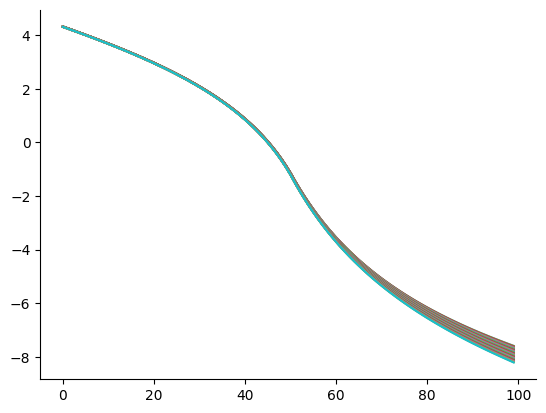

In [105]:
plt.plot(res["v0"])
plt.show()

In [94]:
ϕ_list[18] = res["v0"]
ems_list[18] = res["ems"]

In [95]:
np.save(f"v_list_{λ}", ϕ_list)
np.save(f"e_list_{λ}", ems_list)

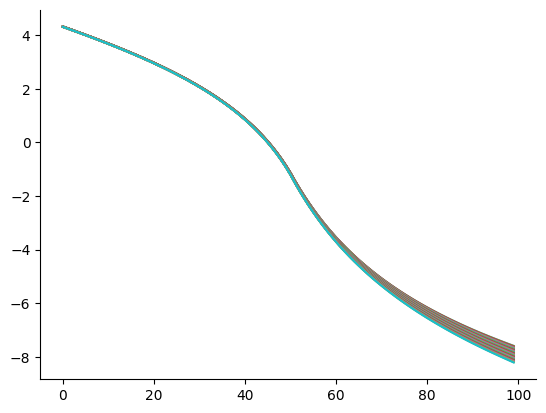

In [96]:
plt.plot(ϕ_list[18])
plt.show()

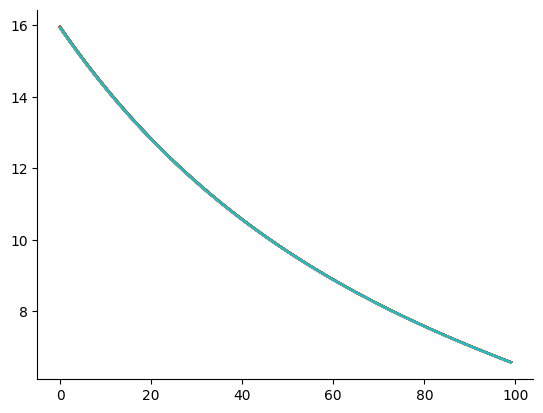

In [97]:
plt.plot(ems_list[0])
# plt.ylim(-6,6)
plt.show()

In [5]:
ϕ_list = np.load("v_list_5.npy")
ems_list = np.load("e_list_5.npy")

In [6]:
v_guess = np.load(f"v_{λ}.npy")
ems_guess = np.load(f"ems_{λ}.npy")

In [7]:
y1_grid_cap = np.arange(0., 2.1 + y1_step, y1_step)
loc_2 = np.abs(y1_grid - 2.).argmin()
ξp = 1
ϵ = 0.001
max_iter = 400_000
dmg_weight = np.ones(len(γ3_list)) / len(γ3_list)
ϕ_weight = np.average(np.exp(-1 / ξp * ϕ_list), axis=0, weights=dmg_weight)

ϕ_equiv = -ξp * np.log(ϕ_weight)

(y1_mat_cap, y2_mat_cap) = np.meshgrid(y1_grid_cap, y2_grid, indexing='ij')
dy1 = y1_grid_cap[1] - y1_grid[0]
dy2 = y2_grid[1] - y2_grid[0]
num_y1 = len(y1_grid_cap)
num_y2 = len(y2_grid)
πd_o = np.ones((len(γ3_list), num_y1, num_y2)) / len(γ3_list)
πa_o = np.ones((len(θ_list), num_y1, num_y2)) / len(θ_list)
θ_mat = np.zeros((len(θ_list), num_y1, num_y2))
for i in range(len(θ_list)):
    θ_mat[i] = θ_list[i]
dΛ1 = γ1 + γ2 * y1_mat_cap

r1 = 1.5
r2 = 2.5
y_lower = 1.5
Intensity = r1 * (np.exp(r2 / 2 * (y1_mat_cap - y_lower)**2) -
                  1) * (y1_mat_cap >= y_lower)

# initiate v and control
tol = 1e-6
ems = η
ems_old = ems_guess
lhs_error = 1
episode = 0
# v0 = ϕ_equiv[:num_y1]
v0 = v_guess
v_m = np.zeros(πd_o.shape)
for i in range(len(γ3_list)):
    v_m[i] = ϕ_list[i][loc_2]

while lhs_error > tol and episode < max_iter:
    v0_old = v0.copy()
    v0_dy1 = derivatives_2d(v0, 0, 1, hy1)
    v0_dy2 = derivatives_2d(v0, 1, 1, hy2)
    # updating controls
    weight = np.array([-1 / ξa * v0_dy2 * λ * ems_old * θ for θ in θ_list])
    weight = weight - np.max(weight, axis=0)
    πa = πa_o * np.exp(weight)
    πa[πa < 1e-15] = 1e-15
    πa = πa / np.sum(πa, axis=0)
    ems_new = -η / (v0_dy2 * λ * np.sum(θ_mat * πa, axis=0))
    ems_new[ems_new <= 1e-15] = 1e-15
    ems = ems_new * 0.05 + ems_old * 0.95
    #     print(np.min(ems))
    g_m = np.exp(1 / ξp * (v0 - v_m))
    # HJB coefficient
    A = -δ * np.ones(y1_mat_cap.shape) - Intensity * np.sum(πd_o * g_m, axis=0)
    B_y1 = y2_mat_cap
    B_y2 = λ * (-y2_mat_cap + ems * np.sum(θ_mat * πa, axis=0))
    C_yy1 = np.zeros(y1_mat_cap.shape)
    C_yy2 = np.zeros(y1_mat_cap.shape)
    D = η * np.log(ems) + (η - 1) / δ * dΛ1 * y2_mat_cap + ξa * np.sum(
        πa * (np.log(πa) - np.log(πa_o)), axis=0) + Intensity * np.sum(
            πd_o * g_m * v_m, axis=0) + ξp * Intensity * np.sum(
                πd_o * (1 - g_m + g_m * np.log(g_m)), axis=0)
    phi_mat = false_transient_one_iteration_python(
        A,
        B_y1,
        B_y2,
        C_yy1,
        C_yy2,
        D,
        v0,
        ϵ,
        hy1,
        hy2,
        bc=(np.zeros(num_y2), ϕ_equiv[num_y1 - 1], np.zeros(num_y1),
            np.zeros(num_y1)),
        impose_bc=(False, False, False, False))

    rhs = A * phi_mat + B_y1 * v0_dy1 + B_y2 * v0_dy2 + D
    rhs_error = np.max(abs(rhs))
    lhs_error = np.max(abs((phi_mat - v0_old) / ϵ))
    v0 = phi_mat
    ems_old = ems
    episode += 1
    print('Episode: {:d}\t lhs error: {:.12f}\t rhs error: {:.12f}'.format(episode, lhs_error, rhs_error))

Episode: 1	 lhs error: 0.000009997724	 rhs error: 0.035118317452
Episode: 2	 lhs error: 0.000009996345	 rhs error: 0.035118317454
Episode: 3	 lhs error: 0.000009994968	 rhs error: 0.035118317455
Episode: 4	 lhs error: 0.000009993591	 rhs error: 0.035118317457
Episode: 5	 lhs error: 0.000009992212	 rhs error: 0.035118317459
Episode: 6	 lhs error: 0.000009990835	 rhs error: 0.035118317461
Episode: 7	 lhs error: 0.000009989457	 rhs error: 0.035118317463
Episode: 8	 lhs error: 0.000009988080	 rhs error: 0.035118317465
Episode: 9	 lhs error: 0.000009986704	 rhs error: 0.035118317466
Episode: 10	 lhs error: 0.000009985326	 rhs error: 0.035118317468
Episode: 11	 lhs error: 0.000009983951	 rhs error: 0.035118317470
Episode: 12	 lhs error: 0.000009982574	 rhs error: 0.035118317472
Episode: 13	 lhs error: 0.000009981197	 rhs error: 0.035118317474
Episode: 14	 lhs error: 0.000009979821	 rhs error: 0.035118317475
Episode: 15	 lhs error: 0.000009978445	 rhs error: 0.035118317477
Episode: 16	 lhs er

Episode: 126	 lhs error: 0.000009826621	 rhs error: 0.035118317678
Episode: 127	 lhs error: 0.000009825261	 rhs error: 0.035118317680
Episode: 128	 lhs error: 0.000009823903	 rhs error: 0.035118317682
Episode: 129	 lhs error: 0.000009822543	 rhs error: 0.035118317684
Episode: 130	 lhs error: 0.000009821184	 rhs error: 0.035118317685
Episode: 131	 lhs error: 0.000009819824	 rhs error: 0.035118317687
Episode: 132	 lhs error: 0.000009818466	 rhs error: 0.035118317689
Episode: 133	 lhs error: 0.000009817106	 rhs error: 0.035118317691
Episode: 134	 lhs error: 0.000009815748	 rhs error: 0.035118317693
Episode: 135	 lhs error: 0.000009814389	 rhs error: 0.035118317694
Episode: 136	 lhs error: 0.000009813031	 rhs error: 0.035118317696
Episode: 137	 lhs error: 0.000009811674	 rhs error: 0.035118317698
Episode: 138	 lhs error: 0.000009810316	 rhs error: 0.035118317700
Episode: 139	 lhs error: 0.000009808959	 rhs error: 0.035118317702
Episode: 140	 lhs error: 0.000009807601	 rhs error: 0.03511831

Episode: 249	 lhs error: 0.000009660507	 rhs error: 0.035118317899
Episode: 250	 lhs error: 0.000009659165	 rhs error: 0.035118317900
Episode: 251	 lhs error: 0.000009657824	 rhs error: 0.035118317902
Episode: 252	 lhs error: 0.000009656481	 rhs error: 0.035118317904
Episode: 253	 lhs error: 0.000009655140	 rhs error: 0.035118317906
Episode: 254	 lhs error: 0.000009653800	 rhs error: 0.035118317907
Episode: 255	 lhs error: 0.000009652459	 rhs error: 0.035118317909
Episode: 256	 lhs error: 0.000009651120	 rhs error: 0.035118317911
Episode: 257	 lhs error: 0.000009649779	 rhs error: 0.035118317913
Episode: 258	 lhs error: 0.000009648438	 rhs error: 0.035118317915
Episode: 259	 lhs error: 0.000009647099	 rhs error: 0.035118317916
Episode: 260	 lhs error: 0.000009645758	 rhs error: 0.035118317918
Episode: 261	 lhs error: 0.000009644419	 rhs error: 0.035118317920
Episode: 262	 lhs error: 0.000009643078	 rhs error: 0.035118317922
Episode: 263	 lhs error: 0.000009641739	 rhs error: 0.03511831

Episode: 373	 lhs error: 0.000009495273	 rhs error: 0.035118318118
Episode: 374	 lhs error: 0.000009493949	 rhs error: 0.035118318120
Episode: 375	 lhs error: 0.000009492626	 rhs error: 0.035118318122
Episode: 376	 lhs error: 0.000009491302	 rhs error: 0.035118318123
Episode: 377	 lhs error: 0.000009489979	 rhs error: 0.035118318125
Episode: 378	 lhs error: 0.000009488656	 rhs error: 0.035118318127
Episode: 379	 lhs error: 0.000009487334	 rhs error: 0.035118318129
Episode: 380	 lhs error: 0.000009486011	 rhs error: 0.035118318130
Episode: 381	 lhs error: 0.000009484688	 rhs error: 0.035118318132
Episode: 382	 lhs error: 0.000009483367	 rhs error: 0.035118318134
Episode: 383	 lhs error: 0.000009482044	 rhs error: 0.035118318136
Episode: 384	 lhs error: 0.000009480722	 rhs error: 0.035118318137
Episode: 385	 lhs error: 0.000009479399	 rhs error: 0.035118318139
Episode: 386	 lhs error: 0.000009478078	 rhs error: 0.035118318141
Episode: 387	 lhs error: 0.000009476757	 rhs error: 0.03511831

Episode: 496	 lhs error: 0.000009333555	 rhs error: 0.035118318333
Episode: 497	 lhs error: 0.000009332251	 rhs error: 0.035118318335
Episode: 498	 lhs error: 0.000009330945	 rhs error: 0.035118318337
Episode: 499	 lhs error: 0.000009329639	 rhs error: 0.035118318338
Episode: 500	 lhs error: 0.000009328333	 rhs error: 0.035118318340
Episode: 501	 lhs error: 0.000009327027	 rhs error: 0.035118318342
Episode: 502	 lhs error: 0.000009325722	 rhs error: 0.035118318344
Episode: 503	 lhs error: 0.000009324418	 rhs error: 0.035118318345
Episode: 504	 lhs error: 0.000009323112	 rhs error: 0.035118318347
Episode: 505	 lhs error: 0.000009321809	 rhs error: 0.035118318349
Episode: 506	 lhs error: 0.000009320503	 rhs error: 0.035118318351
Episode: 507	 lhs error: 0.000009319199	 rhs error: 0.035118318352
Episode: 508	 lhs error: 0.000009317895	 rhs error: 0.035118318354
Episode: 509	 lhs error: 0.000009316590	 rhs error: 0.035118318356
Episode: 510	 lhs error: 0.000009315285	 rhs error: 0.03511831

Episode: 621	 lhs error: 0.000009171410	 rhs error: 0.035118318549
Episode: 622	 lhs error: 0.000009170122	 rhs error: 0.035118318551
Episode: 623	 lhs error: 0.000009168834	 rhs error: 0.035118318553
Episode: 624	 lhs error: 0.000009167546	 rhs error: 0.035118318554
Episode: 625	 lhs error: 0.000009166259	 rhs error: 0.035118318556
Episode: 626	 lhs error: 0.000009164971	 rhs error: 0.035118318558
Episode: 627	 lhs error: 0.000009163684	 rhs error: 0.035118318560
Episode: 628	 lhs error: 0.000009162396	 rhs error: 0.035118318561
Episode: 629	 lhs error: 0.000009161109	 rhs error: 0.035118318563
Episode: 630	 lhs error: 0.000009159821	 rhs error: 0.035118318565
Episode: 631	 lhs error: 0.000009158533	 rhs error: 0.035118318566
Episode: 632	 lhs error: 0.000009157247	 rhs error: 0.035118318568
Episode: 633	 lhs error: 0.000009155960	 rhs error: 0.035118318570
Episode: 634	 lhs error: 0.000009154674	 rhs error: 0.035118318572
Episode: 635	 lhs error: 0.000009153388	 rhs error: 0.03511831

Episode: 744	 lhs error: 0.000009013998	 rhs error: 0.035118318759
Episode: 745	 lhs error: 0.000009012727	 rhs error: 0.035118318761
Episode: 746	 lhs error: 0.000009011456	 rhs error: 0.035118318763
Episode: 747	 lhs error: 0.000009010185	 rhs error: 0.035118318764
Episode: 748	 lhs error: 0.000009008915	 rhs error: 0.035118318766
Episode: 749	 lhs error: 0.000009007644	 rhs error: 0.035118318768
Episode: 750	 lhs error: 0.000009006373	 rhs error: 0.035118318770
Episode: 751	 lhs error: 0.000009005103	 rhs error: 0.035118318771
Episode: 752	 lhs error: 0.000009003833	 rhs error: 0.035118318773
Episode: 753	 lhs error: 0.000009002563	 rhs error: 0.035118318775
Episode: 754	 lhs error: 0.000009001292	 rhs error: 0.035118318776
Episode: 755	 lhs error: 0.000009000023	 rhs error: 0.035118318778
Episode: 756	 lhs error: 0.000008998754	 rhs error: 0.035118318780
Episode: 757	 lhs error: 0.000008997484	 rhs error: 0.035118318781
Episode: 758	 lhs error: 0.000008996214	 rhs error: 0.03511831

Episode: 867	 lhs error: 0.000008858678	 rhs error: 0.035118318967
Episode: 868	 lhs error: 0.000008857425	 rhs error: 0.035118318969
Episode: 869	 lhs error: 0.000008856170	 rhs error: 0.035118318970
Episode: 870	 lhs error: 0.000008854917	 rhs error: 0.035118318972
Episode: 871	 lhs error: 0.000008853662	 rhs error: 0.035118318974
Episode: 872	 lhs error: 0.000008852409	 rhs error: 0.035118318975
Episode: 873	 lhs error: 0.000008851155	 rhs error: 0.035118318977
Episode: 874	 lhs error: 0.000008849902	 rhs error: 0.035118318979
Episode: 875	 lhs error: 0.000008848649	 rhs error: 0.035118318980
Episode: 876	 lhs error: 0.000008847397	 rhs error: 0.035118318982
Episode: 877	 lhs error: 0.000008846142	 rhs error: 0.035118318984
Episode: 878	 lhs error: 0.000008844888	 rhs error: 0.035118318985
Episode: 879	 lhs error: 0.000008843636	 rhs error: 0.035118318987
Episode: 880	 lhs error: 0.000008842383	 rhs error: 0.035118318989
Episode: 881	 lhs error: 0.000008841131	 rhs error: 0.03511831

Episode: 990	 lhs error: 0.000008705425	 rhs error: 0.035118319172
Episode: 991	 lhs error: 0.000008704188	 rhs error: 0.035118319174
Episode: 992	 lhs error: 0.000008702951	 rhs error: 0.035118319176
Episode: 993	 lhs error: 0.000008701714	 rhs error: 0.035118319177
Episode: 994	 lhs error: 0.000008700478	 rhs error: 0.035118319179
Episode: 995	 lhs error: 0.000008699240	 rhs error: 0.035118319181
Episode: 996	 lhs error: 0.000008698003	 rhs error: 0.035118319182
Episode: 997	 lhs error: 0.000008696766	 rhs error: 0.035118319184
Episode: 998	 lhs error: 0.000008695530	 rhs error: 0.035118319186
Episode: 999	 lhs error: 0.000008694293	 rhs error: 0.035118319187
Episode: 1000	 lhs error: 0.000008693056	 rhs error: 0.035118319189
Episode: 1001	 lhs error: 0.000008691820	 rhs error: 0.035118319190
Episode: 1002	 lhs error: 0.000008690583	 rhs error: 0.035118319192
Episode: 1003	 lhs error: 0.000008689348	 rhs error: 0.035118319194
Episode: 1004	 lhs error: 0.000008688112	 rhs error: 0.035

Episode: 1111	 lhs error: 0.000008556657	 rhs error: 0.035118319372
Episode: 1112	 lhs error: 0.000008555435	 rhs error: 0.035118319373
Episode: 1113	 lhs error: 0.000008554215	 rhs error: 0.035118319375
Episode: 1114	 lhs error: 0.000008552992	 rhs error: 0.035118319377
Episode: 1115	 lhs error: 0.000008551773	 rhs error: 0.035118319378
Episode: 1116	 lhs error: 0.000008550550	 rhs error: 0.035118319380
Episode: 1117	 lhs error: 0.000008549330	 rhs error: 0.035118319382
Episode: 1118	 lhs error: 0.000008548110	 rhs error: 0.035118319383
Episode: 1119	 lhs error: 0.000008546889	 rhs error: 0.035118319385
Episode: 1120	 lhs error: 0.000008545670	 rhs error: 0.035118319387
Episode: 1121	 lhs error: 0.000008544449	 rhs error: 0.035118319388
Episode: 1122	 lhs error: 0.000008543228	 rhs error: 0.035118319390
Episode: 1123	 lhs error: 0.000008542008	 rhs error: 0.035118319391
Episode: 1124	 lhs error: 0.000008540789	 rhs error: 0.035118319393
Episode: 1125	 lhs error: 0.000008539570	 rhs er

Episode: 1234	 lhs error: 0.000008407426	 rhs error: 0.035118319572
Episode: 1235	 lhs error: 0.000008406220	 rhs error: 0.035118319574
Episode: 1236	 lhs error: 0.000008405014	 rhs error: 0.035118319575
Episode: 1237	 lhs error: 0.000008403810	 rhs error: 0.035118319577
Episode: 1238	 lhs error: 0.000008402607	 rhs error: 0.035118319579
Episode: 1239	 lhs error: 0.000008401401	 rhs error: 0.035118319580
Episode: 1240	 lhs error: 0.000008400197	 rhs error: 0.035118319582
Episode: 1241	 lhs error: 0.000008398993	 rhs error: 0.035118319584
Episode: 1242	 lhs error: 0.000008397787	 rhs error: 0.035118319585
Episode: 1243	 lhs error: 0.000008396584	 rhs error: 0.035118319587
Episode: 1244	 lhs error: 0.000008395380	 rhs error: 0.035118319588
Episode: 1245	 lhs error: 0.000008394176	 rhs error: 0.035118319590
Episode: 1246	 lhs error: 0.000008392973	 rhs error: 0.035118319592
Episode: 1247	 lhs error: 0.000008391770	 rhs error: 0.035118319593
Episode: 1248	 lhs error: 0.000008390566	 rhs er

Episode: 1357	 lhs error: 0.000008260185	 rhs error: 0.035118319770
Episode: 1358	 lhs error: 0.000008258994	 rhs error: 0.035118319772
Episode: 1359	 lhs error: 0.000008257806	 rhs error: 0.035118319774
Episode: 1360	 lhs error: 0.000008256619	 rhs error: 0.035118319775
Episode: 1361	 lhs error: 0.000008255428	 rhs error: 0.035118319777
Episode: 1362	 lhs error: 0.000008254240	 rhs error: 0.035118319778
Episode: 1363	 lhs error: 0.000008253052	 rhs error: 0.035118319780
Episode: 1364	 lhs error: 0.000008251863	 rhs error: 0.035118319782
Episode: 1365	 lhs error: 0.000008250676	 rhs error: 0.035118319783
Episode: 1366	 lhs error: 0.000008249487	 rhs error: 0.035118319785
Episode: 1367	 lhs error: 0.000008248301	 rhs error: 0.035118319786
Episode: 1368	 lhs error: 0.000008247111	 rhs error: 0.035118319788
Episode: 1369	 lhs error: 0.000008245924	 rhs error: 0.035118319790
Episode: 1370	 lhs error: 0.000008244736	 rhs error: 0.035118319791
Episode: 1371	 lhs error: 0.000008243549	 rhs er

Episode: 1480	 lhs error: 0.000008114905	 rhs error: 0.035118319966
Episode: 1481	 lhs error: 0.000008113732	 rhs error: 0.035118319968
Episode: 1482	 lhs error: 0.000008112560	 rhs error: 0.035118319969
Episode: 1483	 lhs error: 0.000008111386	 rhs error: 0.035118319971
Episode: 1484	 lhs error: 0.000008110214	 rhs error: 0.035118319972
Episode: 1485	 lhs error: 0.000008109039	 rhs error: 0.035118319974
Episode: 1486	 lhs error: 0.000008107869	 rhs error: 0.035118319976
Episode: 1487	 lhs error: 0.000008106696	 rhs error: 0.035118319977
Episode: 1488	 lhs error: 0.000008105523	 rhs error: 0.035118319979
Episode: 1489	 lhs error: 0.000008104352	 rhs error: 0.035118319980
Episode: 1490	 lhs error: 0.000008103179	 rhs error: 0.035118319982
Episode: 1491	 lhs error: 0.000008102008	 rhs error: 0.035118319983
Episode: 1492	 lhs error: 0.000008100836	 rhs error: 0.035118319985
Episode: 1493	 lhs error: 0.000008099665	 rhs error: 0.035118319987
Episode: 1494	 lhs error: 0.000008098493	 rhs er

Episode: 1603	 lhs error: 0.000007971566	 rhs error: 0.035118320160
Episode: 1604	 lhs error: 0.000007970408	 rhs error: 0.035118320161
Episode: 1605	 lhs error: 0.000007969250	 rhs error: 0.035118320163
Episode: 1606	 lhs error: 0.000007968093	 rhs error: 0.035118320164
Episode: 1607	 lhs error: 0.000007966936	 rhs error: 0.035118320166
Episode: 1608	 lhs error: 0.000007965777	 rhs error: 0.035118320167
Episode: 1609	 lhs error: 0.000007964622	 rhs error: 0.035118320169
Episode: 1610	 lhs error: 0.000007963465	 rhs error: 0.035118320171
Episode: 1611	 lhs error: 0.000007962308	 rhs error: 0.035118320172
Episode: 1612	 lhs error: 0.000007961153	 rhs error: 0.035118320174
Episode: 1613	 lhs error: 0.000007959997	 rhs error: 0.035118320175
Episode: 1614	 lhs error: 0.000007958840	 rhs error: 0.035118320177
Episode: 1615	 lhs error: 0.000007957683	 rhs error: 0.035118320178
Episode: 1616	 lhs error: 0.000007956527	 rhs error: 0.035118320180
Episode: 1617	 lhs error: 0.000007955372	 rhs er

Episode: 1726	 lhs error: 0.000007830140	 rhs error: 0.035118320351
Episode: 1727	 lhs error: 0.000007828996	 rhs error: 0.035118320352
Episode: 1728	 lhs error: 0.000007827854	 rhs error: 0.035118320354
Episode: 1729	 lhs error: 0.000007826713	 rhs error: 0.035118320355
Episode: 1730	 lhs error: 0.000007825570	 rhs error: 0.035118320357
Episode: 1731	 lhs error: 0.000007824430	 rhs error: 0.035118320358
Episode: 1732	 lhs error: 0.000007823288	 rhs error: 0.035118320360
Episode: 1733	 lhs error: 0.000007822147	 rhs error: 0.035118320362
Episode: 1734	 lhs error: 0.000007821005	 rhs error: 0.035118320363
Episode: 1735	 lhs error: 0.000007819864	 rhs error: 0.035118320365
Episode: 1736	 lhs error: 0.000007818723	 rhs error: 0.035118320366
Episode: 1737	 lhs error: 0.000007817583	 rhs error: 0.035118320368
Episode: 1738	 lhs error: 0.000007816442	 rhs error: 0.035118320369
Episode: 1739	 lhs error: 0.000007815302	 rhs error: 0.035118320371
Episode: 1740	 lhs error: 0.000007814161	 rhs er

Episode: 1848	 lhs error: 0.000007691728	 rhs error: 0.035118320538
Episode: 1849	 lhs error: 0.000007690600	 rhs error: 0.035118320540
Episode: 1850	 lhs error: 0.000007689474	 rhs error: 0.035118320541
Episode: 1851	 lhs error: 0.000007688347	 rhs error: 0.035118320543
Episode: 1852	 lhs error: 0.000007687220	 rhs error: 0.035118320544
Episode: 1853	 lhs error: 0.000007686094	 rhs error: 0.035118320546
Episode: 1854	 lhs error: 0.000007684967	 rhs error: 0.035118320547
Episode: 1855	 lhs error: 0.000007683843	 rhs error: 0.035118320549
Episode: 1856	 lhs error: 0.000007682715	 rhs error: 0.035118320550
Episode: 1857	 lhs error: 0.000007681590	 rhs error: 0.035118320552
Episode: 1858	 lhs error: 0.000007680464	 rhs error: 0.035118320553
Episode: 1859	 lhs error: 0.000007679337	 rhs error: 0.035118320555
Episode: 1860	 lhs error: 0.000007678213	 rhs error: 0.035118320556
Episode: 1861	 lhs error: 0.000007677087	 rhs error: 0.035118320558
Episode: 1862	 lhs error: 0.000007675962	 rhs er

Episode: 1970	 lhs error: 0.000007555150	 rhs error: 0.035118320723
Episode: 1971	 lhs error: 0.000007554038	 rhs error: 0.035118320725
Episode: 1972	 lhs error: 0.000007552928	 rhs error: 0.035118320726
Episode: 1973	 lhs error: 0.000007551815	 rhs error: 0.035118320728
Episode: 1974	 lhs error: 0.000007550703	 rhs error: 0.035118320729
Episode: 1975	 lhs error: 0.000007549591	 rhs error: 0.035118320731
Episode: 1976	 lhs error: 0.000007548482	 rhs error: 0.035118320732
Episode: 1977	 lhs error: 0.000007547371	 rhs error: 0.035118320734
Episode: 1978	 lhs error: 0.000007546259	 rhs error: 0.035118320735
Episode: 1979	 lhs error: 0.000007545149	 rhs error: 0.035118320737
Episode: 1980	 lhs error: 0.000007544037	 rhs error: 0.035118320738
Episode: 1981	 lhs error: 0.000007542926	 rhs error: 0.035118320740
Episode: 1982	 lhs error: 0.000007541815	 rhs error: 0.035118320741
Episode: 1983	 lhs error: 0.000007540703	 rhs error: 0.035118320743
Episode: 1984	 lhs error: 0.000007539596	 rhs er

Episode: 2093	 lhs error: 0.000007419289	 rhs error: 0.035118320908
Episode: 2094	 lhs error: 0.000007418191	 rhs error: 0.035118320909
Episode: 2095	 lhs error: 0.000007417094	 rhs error: 0.035118320911
Episode: 2096	 lhs error: 0.000007415998	 rhs error: 0.035118320912
Episode: 2097	 lhs error: 0.000007414901	 rhs error: 0.035118320914
Episode: 2098	 lhs error: 0.000007413806	 rhs error: 0.035118320915
Episode: 2099	 lhs error: 0.000007412708	 rhs error: 0.035118320917
Episode: 2100	 lhs error: 0.000007411612	 rhs error: 0.035118320918
Episode: 2101	 lhs error: 0.000007410514	 rhs error: 0.035118320920
Episode: 2102	 lhs error: 0.000007409419	 rhs error: 0.035118320921
Episode: 2103	 lhs error: 0.000007408324	 rhs error: 0.035118320923
Episode: 2104	 lhs error: 0.000007407227	 rhs error: 0.035118320924
Episode: 2105	 lhs error: 0.000007406132	 rhs error: 0.035118320926
Episode: 2106	 lhs error: 0.000007405035	 rhs error: 0.035118320927
Episode: 2107	 lhs error: 0.000007403940	 rhs er

Episode: 2216	 lhs error: 0.000007285244	 rhs error: 0.035118321090
Episode: 2217	 lhs error: 0.000007284162	 rhs error: 0.035118321092
Episode: 2218	 lhs error: 0.000007283079	 rhs error: 0.035118321093
Episode: 2219	 lhs error: 0.000007281997	 rhs error: 0.035118321095
Episode: 2220	 lhs error: 0.000007280914	 rhs error: 0.035118321096
Episode: 2221	 lhs error: 0.000007279832	 rhs error: 0.035118321098
Episode: 2222	 lhs error: 0.000007278751	 rhs error: 0.035118321099
Episode: 2223	 lhs error: 0.000007277668	 rhs error: 0.035118321101
Episode: 2224	 lhs error: 0.000007276588	 rhs error: 0.035118321102
Episode: 2225	 lhs error: 0.000007275506	 rhs error: 0.035118321103
Episode: 2226	 lhs error: 0.000007274426	 rhs error: 0.035118321105
Episode: 2227	 lhs error: 0.000007273343	 rhs error: 0.035118321106
Episode: 2228	 lhs error: 0.000007272264	 rhs error: 0.035118321108
Episode: 2229	 lhs error: 0.000007271181	 rhs error: 0.035118321109
Episode: 2230	 lhs error: 0.000007270100	 rhs er

Episode: 2339	 lhs error: 0.000007152994	 rhs error: 0.035118321270
Episode: 2340	 lhs error: 0.000007151926	 rhs error: 0.035118321272
Episode: 2341	 lhs error: 0.000007150857	 rhs error: 0.035118321273
Episode: 2342	 lhs error: 0.000007149788	 rhs error: 0.035118321275
Episode: 2343	 lhs error: 0.000007148721	 rhs error: 0.035118321276
Episode: 2344	 lhs error: 0.000007147654	 rhs error: 0.035118321278
Episode: 2345	 lhs error: 0.000007146588	 rhs error: 0.035118321279
Episode: 2346	 lhs error: 0.000007145521	 rhs error: 0.035118321281
Episode: 2347	 lhs error: 0.000007144452	 rhs error: 0.035118321282
Episode: 2348	 lhs error: 0.000007143386	 rhs error: 0.035118321283
Episode: 2349	 lhs error: 0.000007142319	 rhs error: 0.035118321285
Episode: 2350	 lhs error: 0.000007141252	 rhs error: 0.035118321286
Episode: 2351	 lhs error: 0.000007140185	 rhs error: 0.035118321288
Episode: 2352	 lhs error: 0.000007139119	 rhs error: 0.035118321289
Episode: 2353	 lhs error: 0.000007138053	 rhs er

Episode: 2461	 lhs error: 0.000007023567	 rhs error: 0.035118321447
Episode: 2462	 lhs error: 0.000007022512	 rhs error: 0.035118321448
Episode: 2463	 lhs error: 0.000007021460	 rhs error: 0.035118321450
Episode: 2464	 lhs error: 0.000007020406	 rhs error: 0.035118321451
Episode: 2465	 lhs error: 0.000007019352	 rhs error: 0.035118321453
Episode: 2466	 lhs error: 0.000007018299	 rhs error: 0.035118321454
Episode: 2467	 lhs error: 0.000007017246	 rhs error: 0.035118321456
Episode: 2468	 lhs error: 0.000007016192	 rhs error: 0.035118321457
Episode: 2469	 lhs error: 0.000007015140	 rhs error: 0.035118321458
Episode: 2470	 lhs error: 0.000007014087	 rhs error: 0.035118321460
Episode: 2471	 lhs error: 0.000007013035	 rhs error: 0.035118321461
Episode: 2472	 lhs error: 0.000007011982	 rhs error: 0.035118321463
Episode: 2473	 lhs error: 0.000007010930	 rhs error: 0.035118321464
Episode: 2474	 lhs error: 0.000007009877	 rhs error: 0.035118321466
Episode: 2475	 lhs error: 0.000007008825	 rhs er

Episode: 2584	 lhs error: 0.000006894821	 rhs error: 0.035118321623
Episode: 2585	 lhs error: 0.000006893782	 rhs error: 0.035118321624
Episode: 2586	 lhs error: 0.000006892741	 rhs error: 0.035118321626
Episode: 2587	 lhs error: 0.000006891703	 rhs error: 0.035118321627
Episode: 2588	 lhs error: 0.000006890662	 rhs error: 0.035118321629
Episode: 2589	 lhs error: 0.000006889624	 rhs error: 0.035118321630
Episode: 2590	 lhs error: 0.000006888585	 rhs error: 0.035118321631
Episode: 2591	 lhs error: 0.000006887546	 rhs error: 0.035118321633
Episode: 2592	 lhs error: 0.000006886507	 rhs error: 0.035118321634
Episode: 2593	 lhs error: 0.000006885468	 rhs error: 0.035118321636
Episode: 2594	 lhs error: 0.000006884430	 rhs error: 0.035118321637
Episode: 2595	 lhs error: 0.000006883392	 rhs error: 0.035118321639
Episode: 2596	 lhs error: 0.000006882353	 rhs error: 0.035118321640
Episode: 2597	 lhs error: 0.000006881316	 rhs error: 0.035118321641
Episode: 2598	 lhs error: 0.000006880277	 rhs er

Episode: 2707	 lhs error: 0.000006767801	 rhs error: 0.035118321797
Episode: 2708	 lhs error: 0.000006766774	 rhs error: 0.035118321798
Episode: 2709	 lhs error: 0.000006765750	 rhs error: 0.035118321800
Episode: 2710	 lhs error: 0.000006764723	 rhs error: 0.035118321801
Episode: 2711	 lhs error: 0.000006763699	 rhs error: 0.035118321802
Episode: 2712	 lhs error: 0.000006762673	 rhs error: 0.035118321804
Episode: 2713	 lhs error: 0.000006761646	 rhs error: 0.035118321805
Episode: 2714	 lhs error: 0.000006760623	 rhs error: 0.035118321807
Episode: 2715	 lhs error: 0.000006759599	 rhs error: 0.035118321808
Episode: 2716	 lhs error: 0.000006758574	 rhs error: 0.035118321809
Episode: 2717	 lhs error: 0.000006757549	 rhs error: 0.035118321811
Episode: 2718	 lhs error: 0.000006756524	 rhs error: 0.035118321812
Episode: 2719	 lhs error: 0.000006755499	 rhs error: 0.035118321814
Episode: 2720	 lhs error: 0.000006754475	 rhs error: 0.035118321815
Episode: 2721	 lhs error: 0.000006753452	 rhs er

Episode: 2830	 lhs error: 0.000006642484	 rhs error: 0.035118321969
Episode: 2831	 lhs error: 0.000006641473	 rhs error: 0.035118321970
Episode: 2832	 lhs error: 0.000006640460	 rhs error: 0.035118321971
Episode: 2833	 lhs error: 0.000006639448	 rhs error: 0.035118321973
Episode: 2834	 lhs error: 0.000006638436	 rhs error: 0.035118321974
Episode: 2835	 lhs error: 0.000006637426	 rhs error: 0.035118321975
Episode: 2836	 lhs error: 0.000006636416	 rhs error: 0.035118321977
Episode: 2837	 lhs error: 0.000006635402	 rhs error: 0.035118321978
Episode: 2838	 lhs error: 0.000006634392	 rhs error: 0.035118321980
Episode: 2839	 lhs error: 0.000006633380	 rhs error: 0.035118321981
Episode: 2840	 lhs error: 0.000006632370	 rhs error: 0.035118321982
Episode: 2841	 lhs error: 0.000006631359	 rhs error: 0.035118321984
Episode: 2842	 lhs error: 0.000006630348	 rhs error: 0.035118321985
Episode: 2843	 lhs error: 0.000006629337	 rhs error: 0.035118321987
Episode: 2844	 lhs error: 0.000006628326	 rhs er

Episode: 2953	 lhs error: 0.000006518849	 rhs error: 0.035118322138
Episode: 2954	 lhs error: 0.000006517849	 rhs error: 0.035118322140
Episode: 2955	 lhs error: 0.000006516852	 rhs error: 0.035118322141
Episode: 2956	 lhs error: 0.000006515854	 rhs error: 0.035118322142
Episode: 2957	 lhs error: 0.000006514857	 rhs error: 0.035118322144
Episode: 2958	 lhs error: 0.000006513860	 rhs error: 0.035118322145
Episode: 2959	 lhs error: 0.000006512861	 rhs error: 0.035118322147
Episode: 2960	 lhs error: 0.000006511862	 rhs error: 0.035118322148
Episode: 2961	 lhs error: 0.000006510866	 rhs error: 0.035118322149
Episode: 2962	 lhs error: 0.000006509867	 rhs error: 0.035118322151
Episode: 2963	 lhs error: 0.000006508870	 rhs error: 0.035118322152
Episode: 2964	 lhs error: 0.000006507872	 rhs error: 0.035118322153
Episode: 2965	 lhs error: 0.000006506876	 rhs error: 0.035118322155
Episode: 2966	 lhs error: 0.000006505879	 rhs error: 0.035118322156
Episode: 2967	 lhs error: 0.000006504882	 rhs er

Episode: 3076	 lhs error: 0.000006396873	 rhs error: 0.035118322306
Episode: 3077	 lhs error: 0.000006395887	 rhs error: 0.035118322307
Episode: 3078	 lhs error: 0.000006394903	 rhs error: 0.035118322309
Episode: 3079	 lhs error: 0.000006393919	 rhs error: 0.035118322310
Episode: 3080	 lhs error: 0.000006392934	 rhs error: 0.035118322311
Episode: 3081	 lhs error: 0.000006391949	 rhs error: 0.035118322313
Episode: 3082	 lhs error: 0.000006390965	 rhs error: 0.035118322314
Episode: 3083	 lhs error: 0.000006389981	 rhs error: 0.035118322315
Episode: 3084	 lhs error: 0.000006388998	 rhs error: 0.035118322317
Episode: 3085	 lhs error: 0.000006388013	 rhs error: 0.035118322318
Episode: 3086	 lhs error: 0.000006387029	 rhs error: 0.035118322320
Episode: 3087	 lhs error: 0.000006386045	 rhs error: 0.035118322321
Episode: 3088	 lhs error: 0.000006385061	 rhs error: 0.035118322322
Episode: 3089	 lhs error: 0.000006384077	 rhs error: 0.035118322324
Episode: 3090	 lhs error: 0.000006383094	 rhs er

Episode: 3198	 lhs error: 0.000006277508	 rhs error: 0.035118322470
Episode: 3199	 lhs error: 0.000006276535	 rhs error: 0.035118322472
Episode: 3200	 lhs error: 0.000006275564	 rhs error: 0.035118322473
Episode: 3201	 lhs error: 0.000006274593	 rhs error: 0.035118322474
Episode: 3202	 lhs error: 0.000006273622	 rhs error: 0.035118322476
Episode: 3203	 lhs error: 0.000006272649	 rhs error: 0.035118322477
Episode: 3204	 lhs error: 0.000006271677	 rhs error: 0.035118322478
Episode: 3205	 lhs error: 0.000006270708	 rhs error: 0.035118322480
Episode: 3206	 lhs error: 0.000006269737	 rhs error: 0.035118322481
Episode: 3207	 lhs error: 0.000006268764	 rhs error: 0.035118322482
Episode: 3208	 lhs error: 0.000006267795	 rhs error: 0.035118322484
Episode: 3209	 lhs error: 0.000006266824	 rhs error: 0.035118322485
Episode: 3210	 lhs error: 0.000006265854	 rhs error: 0.035118322486
Episode: 3211	 lhs error: 0.000006264882	 rhs error: 0.035118322488
Episode: 3212	 lhs error: 0.000006263912	 rhs er

Episode: 3321	 lhs error: 0.000006158774	 rhs error: 0.035118322634
Episode: 3322	 lhs error: 0.000006157816	 rhs error: 0.035118322635
Episode: 3323	 lhs error: 0.000006156857	 rhs error: 0.035118322637
Episode: 3324	 lhs error: 0.000006155899	 rhs error: 0.035118322638
Episode: 3325	 lhs error: 0.000006154941	 rhs error: 0.035118322639
Episode: 3326	 lhs error: 0.000006153982	 rhs error: 0.035118322641
Episode: 3327	 lhs error: 0.000006153025	 rhs error: 0.035118322642
Episode: 3328	 lhs error: 0.000006152066	 rhs error: 0.035118322643
Episode: 3329	 lhs error: 0.000006151107	 rhs error: 0.035118322645
Episode: 3330	 lhs error: 0.000006150151	 rhs error: 0.035118322646
Episode: 3331	 lhs error: 0.000006149192	 rhs error: 0.035118322647
Episode: 3332	 lhs error: 0.000006148236	 rhs error: 0.035118322649
Episode: 3333	 lhs error: 0.000006147276	 rhs error: 0.035118322650
Episode: 3334	 lhs error: 0.000006146319	 rhs error: 0.035118322651
Episode: 3335	 lhs error: 0.000006145362	 rhs er

Episode: 3444	 lhs error: 0.000006041638	 rhs error: 0.035118322796
Episode: 3445	 lhs error: 0.000006040693	 rhs error: 0.035118322797
Episode: 3446	 lhs error: 0.000006039746	 rhs error: 0.035118322799
Episode: 3447	 lhs error: 0.000006038801	 rhs error: 0.035118322800
Episode: 3448	 lhs error: 0.000006037856	 rhs error: 0.035118322801
Episode: 3449	 lhs error: 0.000006036911	 rhs error: 0.035118322802
Episode: 3450	 lhs error: 0.000006035966	 rhs error: 0.035118322804
Episode: 3451	 lhs error: 0.000006035020	 rhs error: 0.035118322805
Episode: 3452	 lhs error: 0.000006034075	 rhs error: 0.035118322806
Episode: 3453	 lhs error: 0.000006033130	 rhs error: 0.035118322808
Episode: 3454	 lhs error: 0.000006032185	 rhs error: 0.035118322809
Episode: 3455	 lhs error: 0.000006031240	 rhs error: 0.035118322810
Episode: 3456	 lhs error: 0.000006030296	 rhs error: 0.035118322812
Episode: 3457	 lhs error: 0.000006029349	 rhs error: 0.035118322813
Episode: 3458	 lhs error: 0.000006028405	 rhs er

Episode: 3567	 lhs error: 0.000005926078	 rhs error: 0.035118322956
Episode: 3568	 lhs error: 0.000005925144	 rhs error: 0.035118322957
Episode: 3569	 lhs error: 0.000005924212	 rhs error: 0.035118322958
Episode: 3570	 lhs error: 0.000005923277	 rhs error: 0.035118322960
Episode: 3571	 lhs error: 0.000005922346	 rhs error: 0.035118322961
Episode: 3572	 lhs error: 0.000005921414	 rhs error: 0.035118322962
Episode: 3573	 lhs error: 0.000005920479	 rhs error: 0.035118322963
Episode: 3574	 lhs error: 0.000005919548	 rhs error: 0.035118322965
Episode: 3575	 lhs error: 0.000005918616	 rhs error: 0.035118322966
Episode: 3576	 lhs error: 0.000005917683	 rhs error: 0.035118322967
Episode: 3577	 lhs error: 0.000005916752	 rhs error: 0.035118322969
Episode: 3578	 lhs error: 0.000005915818	 rhs error: 0.035118322970
Episode: 3579	 lhs error: 0.000005914886	 rhs error: 0.035118322971
Episode: 3580	 lhs error: 0.000005913955	 rhs error: 0.035118322973
Episode: 3581	 lhs error: 0.000005913024	 rhs er

Episode: 3690	 lhs error: 0.000005812073	 rhs error: 0.035118323114
Episode: 3691	 lhs error: 0.000005811151	 rhs error: 0.035118323115
Episode: 3692	 lhs error: 0.000005810230	 rhs error: 0.035118323116
Episode: 3693	 lhs error: 0.000005809310	 rhs error: 0.035118323117
Episode: 3694	 lhs error: 0.000005808390	 rhs error: 0.035118323119
Episode: 3695	 lhs error: 0.000005807470	 rhs error: 0.035118323120
Episode: 3696	 lhs error: 0.000005806551	 rhs error: 0.035118323121
Episode: 3697	 lhs error: 0.000005805630	 rhs error: 0.035118323123
Episode: 3698	 lhs error: 0.000005804710	 rhs error: 0.035118323124
Episode: 3699	 lhs error: 0.000005803790	 rhs error: 0.035118323125
Episode: 3700	 lhs error: 0.000005802871	 rhs error: 0.035118323126
Episode: 3701	 lhs error: 0.000005801951	 rhs error: 0.035118323128
Episode: 3702	 lhs error: 0.000005801033	 rhs error: 0.035118323129
Episode: 3703	 lhs error: 0.000005800112	 rhs error: 0.035118323130
Episode: 3704	 lhs error: 0.000005799193	 rhs er

Episode: 3813	 lhs error: 0.000005699603	 rhs error: 0.035118323270
Episode: 3814	 lhs error: 0.000005698693	 rhs error: 0.035118323271
Episode: 3815	 lhs error: 0.000005697785	 rhs error: 0.035118323272
Episode: 3816	 lhs error: 0.000005696879	 rhs error: 0.035118323274
Episode: 3817	 lhs error: 0.000005695971	 rhs error: 0.035118323275
Episode: 3818	 lhs error: 0.000005695062	 rhs error: 0.035118323276
Episode: 3819	 lhs error: 0.000005694154	 rhs error: 0.035118323277
Episode: 3820	 lhs error: 0.000005693247	 rhs error: 0.035118323279
Episode: 3821	 lhs error: 0.000005692339	 rhs error: 0.035118323280
Episode: 3822	 lhs error: 0.000005691432	 rhs error: 0.035118323281
Episode: 3823	 lhs error: 0.000005690524	 rhs error: 0.035118323282
Episode: 3824	 lhs error: 0.000005689618	 rhs error: 0.035118323284
Episode: 3825	 lhs error: 0.000005688712	 rhs error: 0.035118323285
Episode: 3826	 lhs error: 0.000005687803	 rhs error: 0.035118323286
Episode: 3827	 lhs error: 0.000005686896	 rhs er

Episode: 3935	 lhs error: 0.000005589542	 rhs error: 0.035118323423
Episode: 3936	 lhs error: 0.000005588646	 rhs error: 0.035118323424
Episode: 3937	 lhs error: 0.000005587751	 rhs error: 0.035118323425
Episode: 3938	 lhs error: 0.000005586855	 rhs error: 0.035118323426
Episode: 3939	 lhs error: 0.000005585959	 rhs error: 0.035118323428
Episode: 3940	 lhs error: 0.000005585065	 rhs error: 0.035118323429
Episode: 3941	 lhs error: 0.000005584168	 rhs error: 0.035118323430
Episode: 3942	 lhs error: 0.000005583273	 rhs error: 0.035118323431
Episode: 3943	 lhs error: 0.000005582377	 rhs error: 0.035118323433
Episode: 3944	 lhs error: 0.000005581481	 rhs error: 0.035118323434
Episode: 3945	 lhs error: 0.000005580587	 rhs error: 0.035118323435
Episode: 3946	 lhs error: 0.000005579693	 rhs error: 0.035118323436
Episode: 3947	 lhs error: 0.000005578797	 rhs error: 0.035118323438
Episode: 3948	 lhs error: 0.000005577902	 rhs error: 0.035118323439
Episode: 3949	 lhs error: 0.000005577008	 rhs er

Episode: 4058	 lhs error: 0.000005480071	 rhs error: 0.035118323575
Episode: 4059	 lhs error: 0.000005479188	 rhs error: 0.035118323576
Episode: 4060	 lhs error: 0.000005478303	 rhs error: 0.035118323577
Episode: 4061	 lhs error: 0.000005477419	 rhs error: 0.035118323579
Episode: 4062	 lhs error: 0.000005476536	 rhs error: 0.035118323580
Episode: 4063	 lhs error: 0.000005475652	 rhs error: 0.035118323581
Episode: 4064	 lhs error: 0.000005474768	 rhs error: 0.035118323582
Episode: 4065	 lhs error: 0.000005473885	 rhs error: 0.035118323584
Episode: 4066	 lhs error: 0.000005473002	 rhs error: 0.035118323585
Episode: 4067	 lhs error: 0.000005472119	 rhs error: 0.035118323586
Episode: 4068	 lhs error: 0.000005471237	 rhs error: 0.035118323587
Episode: 4069	 lhs error: 0.000005470355	 rhs error: 0.035118323589
Episode: 4070	 lhs error: 0.000005469469	 rhs error: 0.035118323590
Episode: 4071	 lhs error: 0.000005468588	 rhs error: 0.035118323591
Episode: 4072	 lhs error: 0.000005467705	 rhs er

Episode: 4181	 lhs error: 0.000005372076	 rhs error: 0.035118323725
Episode: 4182	 lhs error: 0.000005371205	 rhs error: 0.035118323727
Episode: 4183	 lhs error: 0.000005370332	 rhs error: 0.035118323728
Episode: 4184	 lhs error: 0.000005369460	 rhs error: 0.035118323729
Episode: 4185	 lhs error: 0.000005368587	 rhs error: 0.035118323730
Episode: 4186	 lhs error: 0.000005367717	 rhs error: 0.035118323732
Episode: 4187	 lhs error: 0.000005366846	 rhs error: 0.035118323733
Episode: 4188	 lhs error: 0.000005365973	 rhs error: 0.035118323734
Episode: 4189	 lhs error: 0.000005365102	 rhs error: 0.035118323735
Episode: 4190	 lhs error: 0.000005364233	 rhs error: 0.035118323736
Episode: 4191	 lhs error: 0.000005363360	 rhs error: 0.035118323738
Episode: 4192	 lhs error: 0.000005362489	 rhs error: 0.035118323739
Episode: 4193	 lhs error: 0.000005361618	 rhs error: 0.035118323740
Episode: 4194	 lhs error: 0.000005360747	 rhs error: 0.035118323741
Episode: 4195	 lhs error: 0.000005359876	 rhs er

Episode: 4304	 lhs error: 0.000005265536	 rhs error: 0.035118323874
Episode: 4305	 lhs error: 0.000005264678	 rhs error: 0.035118323875
Episode: 4306	 lhs error: 0.000005263817	 rhs error: 0.035118323877
Episode: 4307	 lhs error: 0.000005262958	 rhs error: 0.035118323878
Episode: 4308	 lhs error: 0.000005262096	 rhs error: 0.035118323879
Episode: 4309	 lhs error: 0.000005261238	 rhs error: 0.035118323880
Episode: 4310	 lhs error: 0.000005260378	 rhs error: 0.035118323881
Episode: 4311	 lhs error: 0.000005259517	 rhs error: 0.035118323883
Episode: 4312	 lhs error: 0.000005258658	 rhs error: 0.035118323884
Episode: 4313	 lhs error: 0.000005257799	 rhs error: 0.035118323885
Episode: 4314	 lhs error: 0.000005256940	 rhs error: 0.035118323886
Episode: 4315	 lhs error: 0.000005256081	 rhs error: 0.035118323887
Episode: 4316	 lhs error: 0.000005255221	 rhs error: 0.035118323889
Episode: 4317	 lhs error: 0.000005254362	 rhs error: 0.035118323890
Episode: 4318	 lhs error: 0.000005253504	 rhs er

Episode: 4427	 lhs error: 0.000005160437	 rhs error: 0.035118324021
Episode: 4428	 lhs error: 0.000005159591	 rhs error: 0.035118324022
Episode: 4429	 lhs error: 0.000005158742	 rhs error: 0.035118324023
Episode: 4430	 lhs error: 0.000005157894	 rhs error: 0.035118324025
Episode: 4431	 lhs error: 0.000005157045	 rhs error: 0.035118324026
Episode: 4432	 lhs error: 0.000005156197	 rhs error: 0.035118324027
Episode: 4433	 lhs error: 0.000005155347	 rhs error: 0.035118324028
Episode: 4434	 lhs error: 0.000005154501	 rhs error: 0.035118324029
Episode: 4435	 lhs error: 0.000005153652	 rhs error: 0.035118324031
Episode: 4436	 lhs error: 0.000005152804	 rhs error: 0.035118324032
Episode: 4437	 lhs error: 0.000005151956	 rhs error: 0.035118324033
Episode: 4438	 lhs error: 0.000005151108	 rhs error: 0.035118324034
Episode: 4439	 lhs error: 0.000005150262	 rhs error: 0.035118324035
Episode: 4440	 lhs error: 0.000005149413	 rhs error: 0.035118324036
Episode: 4441	 lhs error: 0.000005148567	 rhs er

Episode: 4550	 lhs error: 0.000005056759	 rhs error: 0.035118324166
Episode: 4551	 lhs error: 0.000005055922	 rhs error: 0.035118324167
Episode: 4552	 lhs error: 0.000005055084	 rhs error: 0.035118324169
Episode: 4553	 lhs error: 0.000005054247	 rhs error: 0.035118324170
Episode: 4554	 lhs error: 0.000005053409	 rhs error: 0.035118324171
Episode: 4555	 lhs error: 0.000005052574	 rhs error: 0.035118324172
Episode: 4556	 lhs error: 0.000005051736	 rhs error: 0.035118324173
Episode: 4557	 lhs error: 0.000005050899	 rhs error: 0.035118324174
Episode: 4558	 lhs error: 0.000005050063	 rhs error: 0.035118324176
Episode: 4559	 lhs error: 0.000005049227	 rhs error: 0.035118324177
Episode: 4560	 lhs error: 0.000005048391	 rhs error: 0.035118324178
Episode: 4561	 lhs error: 0.000005047554	 rhs error: 0.035118324179
Episode: 4562	 lhs error: 0.000005046719	 rhs error: 0.035118324180
Episode: 4563	 lhs error: 0.000005045883	 rhs error: 0.035118324181
Episode: 4564	 lhs error: 0.000005045045	 rhs er

Episode: 4673	 lhs error: 0.000004954479	 rhs error: 0.035118324310
Episode: 4674	 lhs error: 0.000004953653	 rhs error: 0.035118324311
Episode: 4675	 lhs error: 0.000004952827	 rhs error: 0.035118324312
Episode: 4676	 lhs error: 0.000004952001	 rhs error: 0.035118324313
Episode: 4677	 lhs error: 0.000004951175	 rhs error: 0.035118324314
Episode: 4678	 lhs error: 0.000004950351	 rhs error: 0.035118324315
Episode: 4679	 lhs error: 0.000004949523	 rhs error: 0.035118324317
Episode: 4680	 lhs error: 0.000004948700	 rhs error: 0.035118324318
Episode: 4681	 lhs error: 0.000004947875	 rhs error: 0.035118324319
Episode: 4682	 lhs error: 0.000004947050	 rhs error: 0.035118324320
Episode: 4683	 lhs error: 0.000004946225	 rhs error: 0.035118324321
Episode: 4684	 lhs error: 0.000004945400	 rhs error: 0.035118324322
Episode: 4685	 lhs error: 0.000004944575	 rhs error: 0.035118324324
Episode: 4686	 lhs error: 0.000004943749	 rhs error: 0.035118324325
Episode: 4687	 lhs error: 0.000004942925	 rhs er

Episode: 4796	 lhs error: 0.000004853583	 rhs error: 0.035118324451
Episode: 4797	 lhs error: 0.000004852767	 rhs error: 0.035118324452
Episode: 4798	 lhs error: 0.000004851954	 rhs error: 0.035118324454
Episode: 4799	 lhs error: 0.000004851137	 rhs error: 0.035118324455
Episode: 4800	 lhs error: 0.000004850323	 rhs error: 0.035118324456
Episode: 4801	 lhs error: 0.000004849509	 rhs error: 0.035118324457
Episode: 4802	 lhs error: 0.000004848696	 rhs error: 0.035118324458
Episode: 4803	 lhs error: 0.000004847880	 rhs error: 0.035118324459
Episode: 4804	 lhs error: 0.000004847067	 rhs error: 0.035118324460
Episode: 4805	 lhs error: 0.000004846253	 rhs error: 0.035118324462
Episode: 4806	 lhs error: 0.000004845440	 rhs error: 0.035118324463
Episode: 4807	 lhs error: 0.000004844625	 rhs error: 0.035118324464
Episode: 4808	 lhs error: 0.000004843813	 rhs error: 0.035118324465
Episode: 4809	 lhs error: 0.000004842999	 rhs error: 0.035118324466
Episode: 4810	 lhs error: 0.000004842184	 rhs er

Episode: 4919	 lhs error: 0.000004754051	 rhs error: 0.035118324591
Episode: 4920	 lhs error: 0.000004753248	 rhs error: 0.035118324592
Episode: 4921	 lhs error: 0.000004752443	 rhs error: 0.035118324593
Episode: 4922	 lhs error: 0.000004751640	 rhs error: 0.035118324595
Episode: 4923	 lhs error: 0.000004750836	 rhs error: 0.035118324596
Episode: 4924	 lhs error: 0.000004750033	 rhs error: 0.035118324597
Episode: 4925	 lhs error: 0.000004749230	 rhs error: 0.035118324598
Episode: 4926	 lhs error: 0.000004748427	 rhs error: 0.035118324599
Episode: 4927	 lhs error: 0.000004747625	 rhs error: 0.035118324600
Episode: 4928	 lhs error: 0.000004746822	 rhs error: 0.035118324601
Episode: 4929	 lhs error: 0.000004746017	 rhs error: 0.035118324603
Episode: 4930	 lhs error: 0.000004745215	 rhs error: 0.035118324604
Episode: 4931	 lhs error: 0.000004744413	 rhs error: 0.035118324605
Episode: 4932	 lhs error: 0.000004743611	 rhs error: 0.035118324606
Episode: 4933	 lhs error: 0.000004742807	 rhs er

Episode: 5042	 lhs error: 0.000004655867	 rhs error: 0.035118324729
Episode: 5043	 lhs error: 0.000004655074	 rhs error: 0.035118324731
Episode: 5044	 lhs error: 0.000004654281	 rhs error: 0.035118324732
Episode: 5045	 lhs error: 0.000004653486	 rhs error: 0.035118324733
Episode: 5046	 lhs error: 0.000004652696	 rhs error: 0.035118324734
Episode: 5047	 lhs error: 0.000004651902	 rhs error: 0.035118324735
Episode: 5048	 lhs error: 0.000004651111	 rhs error: 0.035118324736
Episode: 5049	 lhs error: 0.000004650320	 rhs error: 0.035118324737
Episode: 5050	 lhs error: 0.000004649526	 rhs error: 0.035118324738
Episode: 5051	 lhs error: 0.000004648734	 rhs error: 0.035118324740
Episode: 5052	 lhs error: 0.000004647942	 rhs error: 0.035118324741
Episode: 5053	 lhs error: 0.000004647150	 rhs error: 0.035118324742
Episode: 5054	 lhs error: 0.000004646360	 rhs error: 0.035118324743
Episode: 5055	 lhs error: 0.000004645567	 rhs error: 0.035118324744
Episode: 5056	 lhs error: 0.000004644774	 rhs er

Episode: 5165	 lhs error: 0.000004559011	 rhs error: 0.035118324866
Episode: 5166	 lhs error: 0.000004558228	 rhs error: 0.035118324867
Episode: 5167	 lhs error: 0.000004557447	 rhs error: 0.035118324868
Episode: 5168	 lhs error: 0.000004556664	 rhs error: 0.035118324869
Episode: 5169	 lhs error: 0.000004555883	 rhs error: 0.035118324870
Episode: 5170	 lhs error: 0.000004555101	 rhs error: 0.035118324872
Episode: 5171	 lhs error: 0.000004554320	 rhs error: 0.035118324873
Episode: 5172	 lhs error: 0.000004553537	 rhs error: 0.035118324874
Episode: 5173	 lhs error: 0.000004552756	 rhs error: 0.035118324875
Episode: 5174	 lhs error: 0.000004551976	 rhs error: 0.035118324876
Episode: 5175	 lhs error: 0.000004551193	 rhs error: 0.035118324877
Episode: 5176	 lhs error: 0.000004550412	 rhs error: 0.035118324878
Episode: 5177	 lhs error: 0.000004549632	 rhs error: 0.035118324879
Episode: 5178	 lhs error: 0.000004548850	 rhs error: 0.035118324880
Episode: 5179	 lhs error: 0.000004548069	 rhs er

Episode: 5288	 lhs error: 0.000004463467	 rhs error: 0.035118325001
Episode: 5289	 lhs error: 0.000004462695	 rhs error: 0.035118325002
Episode: 5290	 lhs error: 0.000004461924	 rhs error: 0.035118325003
Episode: 5291	 lhs error: 0.000004461154	 rhs error: 0.035118325004
Episode: 5292	 lhs error: 0.000004460382	 rhs error: 0.035118325005
Episode: 5293	 lhs error: 0.000004459611	 rhs error: 0.035118325006
Episode: 5294	 lhs error: 0.000004458840	 rhs error: 0.035118325008
Episode: 5295	 lhs error: 0.000004458069	 rhs error: 0.035118325009
Episode: 5296	 lhs error: 0.000004457299	 rhs error: 0.035118325010
Episode: 5297	 lhs error: 0.000004456528	 rhs error: 0.035118325011
Episode: 5298	 lhs error: 0.000004455757	 rhs error: 0.035118325012
Episode: 5299	 lhs error: 0.000004454987	 rhs error: 0.035118325013
Episode: 5300	 lhs error: 0.000004454217	 rhs error: 0.035118325014
Episode: 5301	 lhs error: 0.000004453446	 rhs error: 0.035118325015
Episode: 5302	 lhs error: 0.000004452676	 rhs er

Episode: 5411	 lhs error: 0.000004369219	 rhs error: 0.035118325134
Episode: 5412	 lhs error: 0.000004368457	 rhs error: 0.035118325135
Episode: 5413	 lhs error: 0.000004367697	 rhs error: 0.035118325136
Episode: 5414	 lhs error: 0.000004366938	 rhs error: 0.035118325138
Episode: 5415	 lhs error: 0.000004366177	 rhs error: 0.035118325139
Episode: 5416	 lhs error: 0.000004365415	 rhs error: 0.035118325140
Episode: 5417	 lhs error: 0.000004364654	 rhs error: 0.035118325141
Episode: 5418	 lhs error: 0.000004363894	 rhs error: 0.035118325142
Episode: 5419	 lhs error: 0.000004363135	 rhs error: 0.035118325143
Episode: 5420	 lhs error: 0.000004362374	 rhs error: 0.035118325144
Episode: 5421	 lhs error: 0.000004361614	 rhs error: 0.035118325145
Episode: 5422	 lhs error: 0.000004360854	 rhs error: 0.035118325146
Episode: 5423	 lhs error: 0.000004360093	 rhs error: 0.035118325147
Episode: 5424	 lhs error: 0.000004359333	 rhs error: 0.035118325148
Episode: 5425	 lhs error: 0.000004358575	 rhs er

Episode: 5534	 lhs error: 0.000004276249	 rhs error: 0.035118325266
Episode: 5535	 lhs error: 0.000004275499	 rhs error: 0.035118325267
Episode: 5536	 lhs error: 0.000004274749	 rhs error: 0.035118325268
Episode: 5537	 lhs error: 0.000004273997	 rhs error: 0.035118325269
Episode: 5538	 lhs error: 0.000004273247	 rhs error: 0.035118325270
Episode: 5539	 lhs error: 0.000004272496	 rhs error: 0.035118325271
Episode: 5540	 lhs error: 0.000004271747	 rhs error: 0.035118325272
Episode: 5541	 lhs error: 0.000004270997	 rhs error: 0.035118325273
Episode: 5542	 lhs error: 0.000004270245	 rhs error: 0.035118325274
Episode: 5543	 lhs error: 0.000004269496	 rhs error: 0.035118325276
Episode: 5544	 lhs error: 0.000004268746	 rhs error: 0.035118325277
Episode: 5545	 lhs error: 0.000004267996	 rhs error: 0.035118325278
Episode: 5546	 lhs error: 0.000004267247	 rhs error: 0.035118325279
Episode: 5547	 lhs error: 0.000004266497	 rhs error: 0.035118325280
Episode: 5548	 lhs error: 0.000004265748	 rhs er

Episode: 5657	 lhs error: 0.000004184542	 rhs error: 0.035118325396
Episode: 5658	 lhs error: 0.000004183800	 rhs error: 0.035118325397
Episode: 5659	 lhs error: 0.000004183060	 rhs error: 0.035118325398
Episode: 5660	 lhs error: 0.000004182318	 rhs error: 0.035118325399
Episode: 5661	 lhs error: 0.000004181579	 rhs error: 0.035118325400
Episode: 5662	 lhs error: 0.000004180840	 rhs error: 0.035118325401
Episode: 5663	 lhs error: 0.000004180099	 rhs error: 0.035118325402
Episode: 5664	 lhs error: 0.000004179357	 rhs error: 0.035118325403
Episode: 5665	 lhs error: 0.000004178619	 rhs error: 0.035118325404
Episode: 5666	 lhs error: 0.000004177879	 rhs error: 0.035118325406
Episode: 5667	 lhs error: 0.000004177140	 rhs error: 0.035118325407
Episode: 5668	 lhs error: 0.000004176400	 rhs error: 0.035118325408
Episode: 5669	 lhs error: 0.000004175661	 rhs error: 0.035118325409
Episode: 5670	 lhs error: 0.000004174922	 rhs error: 0.035118325410
Episode: 5671	 lhs error: 0.000004174180	 rhs er

Episode: 5780	 lhs error: 0.000004094077	 rhs error: 0.035118325525
Episode: 5781	 lhs error: 0.000004093347	 rhs error: 0.035118325526
Episode: 5782	 lhs error: 0.000004092615	 rhs error: 0.035118325527
Episode: 5783	 lhs error: 0.000004091885	 rhs error: 0.035118325528
Episode: 5784	 lhs error: 0.000004091155	 rhs error: 0.035118325529
Episode: 5785	 lhs error: 0.000004090424	 rhs error: 0.035118325530
Episode: 5786	 lhs error: 0.000004089696	 rhs error: 0.035118325531
Episode: 5787	 lhs error: 0.000004088966	 rhs error: 0.035118325532
Episode: 5788	 lhs error: 0.000004088236	 rhs error: 0.035118325533
Episode: 5789	 lhs error: 0.000004087506	 rhs error: 0.035118325534
Episode: 5790	 lhs error: 0.000004086775	 rhs error: 0.035118325535
Episode: 5791	 lhs error: 0.000004086046	 rhs error: 0.035118325536
Episode: 5792	 lhs error: 0.000004085318	 rhs error: 0.035118325537
Episode: 5793	 lhs error: 0.000004084588	 rhs error: 0.035118325538
Episode: 5794	 lhs error: 0.000004083859	 rhs er

Episode: 5903	 lhs error: 0.000004004841	 rhs error: 0.035118325651
Episode: 5904	 lhs error: 0.000004004121	 rhs error: 0.035118325652
Episode: 5905	 lhs error: 0.000004003400	 rhs error: 0.035118325654
Episode: 5906	 lhs error: 0.000004002680	 rhs error: 0.035118325655
Episode: 5907	 lhs error: 0.000004001960	 rhs error: 0.035118325656
Episode: 5908	 lhs error: 0.000004001239	 rhs error: 0.035118325657
Episode: 5909	 lhs error: 0.000004000519	 rhs error: 0.035118325658
Episode: 5910	 lhs error: 0.000003999799	 rhs error: 0.035118325659
Episode: 5911	 lhs error: 0.000003999079	 rhs error: 0.035118325660
Episode: 5912	 lhs error: 0.000003998360	 rhs error: 0.035118325661
Episode: 5913	 lhs error: 0.000003997640	 rhs error: 0.035118325662
Episode: 5914	 lhs error: 0.000003996920	 rhs error: 0.035118325663
Episode: 5915	 lhs error: 0.000003996201	 rhs error: 0.035118325664
Episode: 5916	 lhs error: 0.000003995481	 rhs error: 0.035118325665
Episode: 5917	 lhs error: 0.000003994761	 rhs er

Episode: 6026	 lhs error: 0.000003916818	 rhs error: 0.035118325777
Episode: 6027	 lhs error: 0.000003916108	 rhs error: 0.035118325778
Episode: 6028	 lhs error: 0.000003915396	 rhs error: 0.035118325779
Episode: 6029	 lhs error: 0.000003914688	 rhs error: 0.035118325780
Episode: 6030	 lhs error: 0.000003913977	 rhs error: 0.035118325781
Episode: 6031	 lhs error: 0.000003913266	 rhs error: 0.035118325782
Episode: 6032	 lhs error: 0.000003912556	 rhs error: 0.035118325783
Episode: 6033	 lhs error: 0.000003911845	 rhs error: 0.035118325784
Episode: 6034	 lhs error: 0.000003911135	 rhs error: 0.035118325785
Episode: 6035	 lhs error: 0.000003910425	 rhs error: 0.035118325786
Episode: 6036	 lhs error: 0.000003909716	 rhs error: 0.035118325787
Episode: 6037	 lhs error: 0.000003909005	 rhs error: 0.035118325788
Episode: 6038	 lhs error: 0.000003908296	 rhs error: 0.035118325789
Episode: 6039	 lhs error: 0.000003907585	 rhs error: 0.035118325790
Episode: 6040	 lhs error: 0.000003906876	 rhs er

Episode: 6149	 lhs error: 0.000003829992	 rhs error: 0.035118325901
Episode: 6150	 lhs error: 0.000003829292	 rhs error: 0.035118325902
Episode: 6151	 lhs error: 0.000003828591	 rhs error: 0.035118325903
Episode: 6152	 lhs error: 0.000003827891	 rhs error: 0.035118325904
Episode: 6153	 lhs error: 0.000003827188	 rhs error: 0.035118325905
Episode: 6154	 lhs error: 0.000003826488	 rhs error: 0.035118325906
Episode: 6155	 lhs error: 0.000003825788	 rhs error: 0.035118325907
Episode: 6156	 lhs error: 0.000003825086	 rhs error: 0.035118325908
Episode: 6157	 lhs error: 0.000003824386	 rhs error: 0.035118325909
Episode: 6158	 lhs error: 0.000003823684	 rhs error: 0.035118325910
Episode: 6159	 lhs error: 0.000003822985	 rhs error: 0.035118325911
Episode: 6160	 lhs error: 0.000003822284	 rhs error: 0.035118325912
Episode: 6161	 lhs error: 0.000003821584	 rhs error: 0.035118325913
Episode: 6162	 lhs error: 0.000003820883	 rhs error: 0.035118325914
Episode: 6163	 lhs error: 0.000003820185	 rhs er

Episode: 6272	 lhs error: 0.000003744348	 rhs error: 0.035118326023
Episode: 6273	 lhs error: 0.000003743656	 rhs error: 0.035118326024
Episode: 6274	 lhs error: 0.000003742965	 rhs error: 0.035118326025
Episode: 6275	 lhs error: 0.000003742273	 rhs error: 0.035118326026
Episode: 6276	 lhs error: 0.000003741581	 rhs error: 0.035118326027
Episode: 6277	 lhs error: 0.000003740891	 rhs error: 0.035118326028
Episode: 6278	 lhs error: 0.000003740199	 rhs error: 0.035118326029
Episode: 6279	 lhs error: 0.000003739508	 rhs error: 0.035118326030
Episode: 6280	 lhs error: 0.000003738817	 rhs error: 0.035118326031
Episode: 6281	 lhs error: 0.000003738125	 rhs error: 0.035118326032
Episode: 6282	 lhs error: 0.000003737436	 rhs error: 0.035118326033
Episode: 6283	 lhs error: 0.000003736744	 rhs error: 0.035118326034
Episode: 6284	 lhs error: 0.000003736054	 rhs error: 0.035118326035
Episode: 6285	 lhs error: 0.000003735363	 rhs error: 0.035118326036
Episode: 6286	 lhs error: 0.000003734673	 rhs er

Episode: 6395	 lhs error: 0.000003659869	 rhs error: 0.035118326144
Episode: 6396	 lhs error: 0.000003659186	 rhs error: 0.035118326145
Episode: 6397	 lhs error: 0.000003658503	 rhs error: 0.035118326146
Episode: 6398	 lhs error: 0.000003657822	 rhs error: 0.035118326147
Episode: 6399	 lhs error: 0.000003657139	 rhs error: 0.035118326148
Episode: 6400	 lhs error: 0.000003656456	 rhs error: 0.035118326149
Episode: 6401	 lhs error: 0.000003655776	 rhs error: 0.035118326150
Episode: 6402	 lhs error: 0.000003655093	 rhs error: 0.035118326151
Episode: 6403	 lhs error: 0.000003654413	 rhs error: 0.035118326152
Episode: 6404	 lhs error: 0.000003653730	 rhs error: 0.035118326153
Episode: 6405	 lhs error: 0.000003653049	 rhs error: 0.035118326154
Episode: 6406	 lhs error: 0.000003652369	 rhs error: 0.035118326155
Episode: 6407	 lhs error: 0.000003651687	 rhs error: 0.035118326156
Episode: 6408	 lhs error: 0.000003651007	 rhs error: 0.035118326157
Episode: 6409	 lhs error: 0.000003650325	 rhs er

Episode: 6518	 lhs error: 0.000003576538	 rhs error: 0.035118326263
Episode: 6519	 lhs error: 0.000003575865	 rhs error: 0.035118326264
Episode: 6520	 lhs error: 0.000003575192	 rhs error: 0.035118326265
Episode: 6521	 lhs error: 0.000003574519	 rhs error: 0.035118326266
Episode: 6522	 lhs error: 0.000003573847	 rhs error: 0.035118326267
Episode: 6523	 lhs error: 0.000003573174	 rhs error: 0.035118326268
Episode: 6524	 lhs error: 0.000003572501	 rhs error: 0.035118326269
Episode: 6525	 lhs error: 0.000003571830	 rhs error: 0.035118326270
Episode: 6526	 lhs error: 0.000003571158	 rhs error: 0.035118326271
Episode: 6527	 lhs error: 0.000003570485	 rhs error: 0.035118326272
Episode: 6528	 lhs error: 0.000003569814	 rhs error: 0.035118326273
Episode: 6529	 lhs error: 0.000003569142	 rhs error: 0.035118326274
Episode: 6530	 lhs error: 0.000003568470	 rhs error: 0.035118326275
Episode: 6531	 lhs error: 0.000003567797	 rhs error: 0.035118326276
Episode: 6532	 lhs error: 0.000003567125	 rhs er

Episode: 6641	 lhs error: 0.000003494344	 rhs error: 0.035118326381
Episode: 6642	 lhs error: 0.000003493679	 rhs error: 0.035118326382
Episode: 6643	 lhs error: 0.000003493017	 rhs error: 0.035118326383
Episode: 6644	 lhs error: 0.000003492352	 rhs error: 0.035118326384
Episode: 6645	 lhs error: 0.000003491690	 rhs error: 0.035118326385
Episode: 6646	 lhs error: 0.000003491025	 rhs error: 0.035118326386
Episode: 6647	 lhs error: 0.000003490362	 rhs error: 0.035118326387
Episode: 6648	 lhs error: 0.000003489698	 rhs error: 0.035118326388
Episode: 6649	 lhs error: 0.000003489038	 rhs error: 0.035118326389
Episode: 6650	 lhs error: 0.000003488374	 rhs error: 0.035118326390
Episode: 6651	 lhs error: 0.000003487711	 rhs error: 0.035118326391
Episode: 6652	 lhs error: 0.000003487046	 rhs error: 0.035118326392
Episode: 6653	 lhs error: 0.000003486385	 rhs error: 0.035118326393
Episode: 6654	 lhs error: 0.000003485722	 rhs error: 0.035118326394
Episode: 6655	 lhs error: 0.000003485058	 rhs er

Episode: 6764	 lhs error: 0.000003413270	 rhs error: 0.035118326498
Episode: 6765	 lhs error: 0.000003412615	 rhs error: 0.035118326499
Episode: 6766	 lhs error: 0.000003411960	 rhs error: 0.035118326500
Episode: 6767	 lhs error: 0.000003411305	 rhs error: 0.035118326501
Episode: 6768	 lhs error: 0.000003410650	 rhs error: 0.035118326502
Episode: 6769	 lhs error: 0.000003409998	 rhs error: 0.035118326503
Episode: 6770	 lhs error: 0.000003409343	 rhs error: 0.035118326504
Episode: 6771	 lhs error: 0.000003408689	 rhs error: 0.035118326504
Episode: 6772	 lhs error: 0.000003408034	 rhs error: 0.035118326505
Episode: 6773	 lhs error: 0.000003407381	 rhs error: 0.035118326506
Episode: 6774	 lhs error: 0.000003406726	 rhs error: 0.035118326507
Episode: 6775	 lhs error: 0.000003406074	 rhs error: 0.035118326508
Episode: 6776	 lhs error: 0.000003405420	 rhs error: 0.035118326509
Episode: 6777	 lhs error: 0.000003404765	 rhs error: 0.035118326510
Episode: 6778	 lhs error: 0.000003404111	 rhs er

Episode: 6887	 lhs error: 0.000003333300	 rhs error: 0.035118326613
Episode: 6888	 lhs error: 0.000003332654	 rhs error: 0.035118326614
Episode: 6889	 lhs error: 0.000003332010	 rhs error: 0.035118326615
Episode: 6890	 lhs error: 0.000003331365	 rhs error: 0.035118326616
Episode: 6891	 lhs error: 0.000003330719	 rhs error: 0.035118326617
Episode: 6892	 lhs error: 0.000003330074	 rhs error: 0.035118326618
Episode: 6893	 lhs error: 0.000003329428	 rhs error: 0.035118326619
Episode: 6894	 lhs error: 0.000003328784	 rhs error: 0.035118326619
Episode: 6895	 lhs error: 0.000003328138	 rhs error: 0.035118326620
Episode: 6896	 lhs error: 0.000003327493	 rhs error: 0.035118326621
Episode: 6897	 lhs error: 0.000003326846	 rhs error: 0.035118326622
Episode: 6898	 lhs error: 0.000003326202	 rhs error: 0.035118326623
Episode: 6899	 lhs error: 0.000003325558	 rhs error: 0.035118326624
Episode: 6900	 lhs error: 0.000003324914	 rhs error: 0.035118326625
Episode: 6901	 lhs error: 0.000003324268	 rhs er

Episode: 7010	 lhs error: 0.000003254423	 rhs error: 0.035118326727
Episode: 7011	 lhs error: 0.000003253786	 rhs error: 0.035118326728
Episode: 7012	 lhs error: 0.000003253150	 rhs error: 0.035118326728
Episode: 7013	 lhs error: 0.000003252513	 rhs error: 0.035118326729
Episode: 7014	 lhs error: 0.000003251875	 rhs error: 0.035118326730
Episode: 7015	 lhs error: 0.000003251240	 rhs error: 0.035118326731
Episode: 7016	 lhs error: 0.000003250602	 rhs error: 0.035118326732
Episode: 7017	 lhs error: 0.000003249967	 rhs error: 0.035118326733
Episode: 7018	 lhs error: 0.000003249330	 rhs error: 0.035118326734
Episode: 7019	 lhs error: 0.000003248695	 rhs error: 0.035118326735
Episode: 7020	 lhs error: 0.000003248059	 rhs error: 0.035118326736
Episode: 7021	 lhs error: 0.000003247422	 rhs error: 0.035118326737
Episode: 7022	 lhs error: 0.000003246786	 rhs error: 0.035118326738
Episode: 7023	 lhs error: 0.000003246149	 rhs error: 0.035118326739
Episode: 7024	 lhs error: 0.000003245513	 rhs er

Episode: 7133	 lhs error: 0.000003176622	 rhs error: 0.035118326839
Episode: 7134	 lhs error: 0.000003175995	 rhs error: 0.035118326840
Episode: 7135	 lhs error: 0.000003175366	 rhs error: 0.035118326841
Episode: 7136	 lhs error: 0.000003174738	 rhs error: 0.035118326842
Episode: 7137	 lhs error: 0.000003174109	 rhs error: 0.035118326843
Episode: 7138	 lhs error: 0.000003173482	 rhs error: 0.035118326843
Episode: 7139	 lhs error: 0.000003172853	 rhs error: 0.035118326844
Episode: 7140	 lhs error: 0.000003172226	 rhs error: 0.035118326845
Episode: 7141	 lhs error: 0.000003171600	 rhs error: 0.035118326846
Episode: 7142	 lhs error: 0.000003170973	 rhs error: 0.035118326847
Episode: 7143	 lhs error: 0.000003170343	 rhs error: 0.035118326848
Episode: 7144	 lhs error: 0.000003169716	 rhs error: 0.035118326849
Episode: 7145	 lhs error: 0.000003169089	 rhs error: 0.035118326850
Episode: 7146	 lhs error: 0.000003168461	 rhs error: 0.035118326851
Episode: 7147	 lhs error: 0.000003167834	 rhs er

Episode: 7256	 lhs error: 0.000003099885	 rhs error: 0.035118326950
Episode: 7257	 lhs error: 0.000003099265	 rhs error: 0.035118326951
Episode: 7258	 lhs error: 0.000003098645	 rhs error: 0.035118326952
Episode: 7259	 lhs error: 0.000003098025	 rhs error: 0.035118326953
Episode: 7260	 lhs error: 0.000003097407	 rhs error: 0.035118326953
Episode: 7261	 lhs error: 0.000003096786	 rhs error: 0.035118326954
Episode: 7262	 lhs error: 0.000003096168	 rhs error: 0.035118326955
Episode: 7263	 lhs error: 0.000003095548	 rhs error: 0.035118326956
Episode: 7264	 lhs error: 0.000003094931	 rhs error: 0.035118326957
Episode: 7265	 lhs error: 0.000003094310	 rhs error: 0.035118326958
Episode: 7266	 lhs error: 0.000003093692	 rhs error: 0.035118326959
Episode: 7267	 lhs error: 0.000003093073	 rhs error: 0.035118326960
Episode: 7268	 lhs error: 0.000003092453	 rhs error: 0.035118326961
Episode: 7269	 lhs error: 0.000003091835	 rhs error: 0.035118326962
Episode: 7270	 lhs error: 0.000003091216	 rhs er

Episode: 7378	 lhs error: 0.000003024805	 rhs error: 0.035118327059
Episode: 7379	 lhs error: 0.000003024195	 rhs error: 0.035118327059
Episode: 7380	 lhs error: 0.000003023583	 rhs error: 0.035118327060
Episode: 7381	 lhs error: 0.000003022972	 rhs error: 0.035118327061
Episode: 7382	 lhs error: 0.000003022362	 rhs error: 0.035118327062
Episode: 7383	 lhs error: 0.000003021750	 rhs error: 0.035118327063
Episode: 7384	 lhs error: 0.000003021140	 rhs error: 0.035118327064
Episode: 7385	 lhs error: 0.000003020529	 rhs error: 0.035118327065
Episode: 7386	 lhs error: 0.000003019919	 rhs error: 0.035118327066
Episode: 7387	 lhs error: 0.000003019307	 rhs error: 0.035118327066
Episode: 7388	 lhs error: 0.000003018696	 rhs error: 0.035118327067
Episode: 7389	 lhs error: 0.000003018087	 rhs error: 0.035118327068
Episode: 7390	 lhs error: 0.000003017477	 rhs error: 0.035118327069
Episode: 7391	 lhs error: 0.000003016866	 rhs error: 0.035118327070
Episode: 7392	 lhs error: 0.000003016257	 rhs er

Episode: 7500	 lhs error: 0.000002950745	 rhs error: 0.035118327166
Episode: 7501	 lhs error: 0.000002950142	 rhs error: 0.035118327167
Episode: 7502	 lhs error: 0.000002949541	 rhs error: 0.035118327168
Episode: 7503	 lhs error: 0.000002948936	 rhs error: 0.035118327169
Episode: 7504	 lhs error: 0.000002948333	 rhs error: 0.035118327169
Episode: 7505	 lhs error: 0.000002947732	 rhs error: 0.035118327170
Episode: 7506	 lhs error: 0.000002947129	 rhs error: 0.035118327171
Episode: 7507	 lhs error: 0.000002946525	 rhs error: 0.035118327172
Episode: 7508	 lhs error: 0.000002945924	 rhs error: 0.035118327173
Episode: 7509	 lhs error: 0.000002945321	 rhs error: 0.035118327174
Episode: 7510	 lhs error: 0.000002944720	 rhs error: 0.035118327175
Episode: 7511	 lhs error: 0.000002944117	 rhs error: 0.035118327175
Episode: 7512	 lhs error: 0.000002943516	 rhs error: 0.035118327176
Episode: 7513	 lhs error: 0.000002942913	 rhs error: 0.035118327177
Episode: 7514	 lhs error: 0.000002942310	 rhs er

Episode: 7623	 lhs error: 0.000002877095	 rhs error: 0.035118327273
Episode: 7624	 lhs error: 0.000002876500	 rhs error: 0.035118327274
Episode: 7625	 lhs error: 0.000002875905	 rhs error: 0.035118327275
Episode: 7626	 lhs error: 0.000002875311	 rhs error: 0.035118327275
Episode: 7627	 lhs error: 0.000002874717	 rhs error: 0.035118327276
Episode: 7628	 lhs error: 0.000002874121	 rhs error: 0.035118327277
Episode: 7629	 lhs error: 0.000002873527	 rhs error: 0.035118327278
Episode: 7630	 lhs error: 0.000002872934	 rhs error: 0.035118327279
Episode: 7631	 lhs error: 0.000002872340	 rhs error: 0.035118327280
Episode: 7632	 lhs error: 0.000002871746	 rhs error: 0.035118327281
Episode: 7633	 lhs error: 0.000002871151	 rhs error: 0.035118327281
Episode: 7634	 lhs error: 0.000002870558	 rhs error: 0.035118327282
Episode: 7635	 lhs error: 0.000002869964	 rhs error: 0.035118327283
Episode: 7636	 lhs error: 0.000002869369	 rhs error: 0.035118327284
Episode: 7637	 lhs error: 0.000002868776	 rhs er

Episode: 7745	 lhs error: 0.000002805040	 rhs error: 0.035118327378
Episode: 7746	 lhs error: 0.000002804453	 rhs error: 0.035118327378
Episode: 7747	 lhs error: 0.000002803866	 rhs error: 0.035118327379
Episode: 7748	 lhs error: 0.000002803278	 rhs error: 0.035118327380
Episode: 7749	 lhs error: 0.000002802695	 rhs error: 0.035118327381
Episode: 7750	 lhs error: 0.000002802107	 rhs error: 0.035118327382
Episode: 7751	 lhs error: 0.000002801521	 rhs error: 0.035118327383
Episode: 7752	 lhs error: 0.000002800935	 rhs error: 0.035118327384
Episode: 7753	 lhs error: 0.000002800348	 rhs error: 0.035118327384
Episode: 7754	 lhs error: 0.000002799762	 rhs error: 0.035118327385
Episode: 7755	 lhs error: 0.000002799176	 rhs error: 0.035118327386
Episode: 7756	 lhs error: 0.000002798591	 rhs error: 0.035118327387
Episode: 7757	 lhs error: 0.000002798004	 rhs error: 0.035118327388
Episode: 7758	 lhs error: 0.000002797420	 rhs error: 0.035118327389
Episode: 7759	 lhs error: 0.000002796834	 rhs er

Episode: 7868	 lhs error: 0.000002733384	 rhs error: 0.035118327482
Episode: 7869	 lhs error: 0.000002732805	 rhs error: 0.035118327483
Episode: 7870	 lhs error: 0.000002732228	 rhs error: 0.035118327484
Episode: 7871	 lhs error: 0.000002731648	 rhs error: 0.035118327484
Episode: 7872	 lhs error: 0.000002731070	 rhs error: 0.035118327485
Episode: 7873	 lhs error: 0.000002730491	 rhs error: 0.035118327486
Episode: 7874	 lhs error: 0.000002729913	 rhs error: 0.035118327487
Episode: 7875	 lhs error: 0.000002729336	 rhs error: 0.035118327488
Episode: 7876	 lhs error: 0.000002728757	 rhs error: 0.035118327489
Episode: 7877	 lhs error: 0.000002728179	 rhs error: 0.035118327489
Episode: 7878	 lhs error: 0.000002727601	 rhs error: 0.035118327490
Episode: 7879	 lhs error: 0.000002727024	 rhs error: 0.035118327491
Episode: 7880	 lhs error: 0.000002726446	 rhs error: 0.035118327492
Episode: 7881	 lhs error: 0.000002725868	 rhs error: 0.035118327493
Episode: 7882	 lhs error: 0.000002725290	 rhs er

Episode: 7991	 lhs error: 0.000002662709	 rhs error: 0.035118327585
Episode: 7992	 lhs error: 0.000002662139	 rhs error: 0.035118327586
Episode: 7993	 lhs error: 0.000002661569	 rhs error: 0.035118327587
Episode: 7994	 lhs error: 0.000002660998	 rhs error: 0.035118327587
Episode: 7995	 lhs error: 0.000002660428	 rhs error: 0.035118327588
Episode: 7996	 lhs error: 0.000002659856	 rhs error: 0.035118327589
Episode: 7997	 lhs error: 0.000002659287	 rhs error: 0.035118327590
Episode: 7998	 lhs error: 0.000002658718	 rhs error: 0.035118327591
Episode: 7999	 lhs error: 0.000002658147	 rhs error: 0.035118327592
Episode: 8000	 lhs error: 0.000002657576	 rhs error: 0.035118327592
Episode: 8001	 lhs error: 0.000002657007	 rhs error: 0.035118327593
Episode: 8002	 lhs error: 0.000002656437	 rhs error: 0.035118327594
Episode: 8003	 lhs error: 0.000002655866	 rhs error: 0.035118327595
Episode: 8004	 lhs error: 0.000002655297	 rhs error: 0.035118327596
Episode: 8005	 lhs error: 0.000002654727	 rhs er

Episode: 8114	 lhs error: 0.000002636255	 rhs error: 0.035118327687
Episode: 8115	 lhs error: 0.000002636227	 rhs error: 0.035118327687
Episode: 8116	 lhs error: 0.000002636198	 rhs error: 0.035118327688
Episode: 8117	 lhs error: 0.000002636170	 rhs error: 0.035118327689
Episode: 8118	 lhs error: 0.000002636141	 rhs error: 0.035118327690
Episode: 8119	 lhs error: 0.000002636113	 rhs error: 0.035118327691
Episode: 8120	 lhs error: 0.000002636084	 rhs error: 0.035118327692
Episode: 8121	 lhs error: 0.000002636054	 rhs error: 0.035118327692
Episode: 8122	 lhs error: 0.000002636026	 rhs error: 0.035118327693
Episode: 8123	 lhs error: 0.000002635997	 rhs error: 0.035118327694
Episode: 8124	 lhs error: 0.000002635968	 rhs error: 0.035118327695
Episode: 8125	 lhs error: 0.000002635940	 rhs error: 0.035118327696
Episode: 8126	 lhs error: 0.000002635911	 rhs error: 0.035118327697
Episode: 8127	 lhs error: 0.000002635883	 rhs error: 0.035118327697
Episode: 8128	 lhs error: 0.000002635854	 rhs er

Episode: 8237	 lhs error: 0.000002632703	 rhs error: 0.035118327787
Episode: 8238	 lhs error: 0.000002632674	 rhs error: 0.035118327788
Episode: 8239	 lhs error: 0.000002632645	 rhs error: 0.035118327789
Episode: 8240	 lhs error: 0.000002632615	 rhs error: 0.035118327790
Episode: 8241	 lhs error: 0.000002632586	 rhs error: 0.035118327790
Episode: 8242	 lhs error: 0.000002632557	 rhs error: 0.035118327791
Episode: 8243	 lhs error: 0.000002632528	 rhs error: 0.035118327792
Episode: 8244	 lhs error: 0.000002632498	 rhs error: 0.035118327793
Episode: 8245	 lhs error: 0.000002632469	 rhs error: 0.035118327794
Episode: 8246	 lhs error: 0.000002632440	 rhs error: 0.035118327794
Episode: 8247	 lhs error: 0.000002632411	 rhs error: 0.035118327795
Episode: 8248	 lhs error: 0.000002632381	 rhs error: 0.035118327796
Episode: 8249	 lhs error: 0.000002632353	 rhs error: 0.035118327797
Episode: 8250	 lhs error: 0.000002632324	 rhs error: 0.035118327798
Episode: 8251	 lhs error: 0.000002632294	 rhs er

Episode: 8360	 lhs error: 0.000002629088	 rhs error: 0.035118327886
Episode: 8361	 lhs error: 0.000002629058	 rhs error: 0.035118327887
Episode: 8362	 lhs error: 0.000002629028	 rhs error: 0.035118327888
Episode: 8363	 lhs error: 0.000002628999	 rhs error: 0.035118327889
Episode: 8364	 lhs error: 0.000002628969	 rhs error: 0.035118327890
Episode: 8365	 lhs error: 0.000002628939	 rhs error: 0.035118327890
Episode: 8366	 lhs error: 0.000002628910	 rhs error: 0.035118327891
Episode: 8367	 lhs error: 0.000002628880	 rhs error: 0.035118327892
Episode: 8368	 lhs error: 0.000002628850	 rhs error: 0.035118327893
Episode: 8369	 lhs error: 0.000002628820	 rhs error: 0.035118327894
Episode: 8370	 lhs error: 0.000002628791	 rhs error: 0.035118327894
Episode: 8371	 lhs error: 0.000002628761	 rhs error: 0.035118327895
Episode: 8372	 lhs error: 0.000002628731	 rhs error: 0.035118327896
Episode: 8373	 lhs error: 0.000002628702	 rhs error: 0.035118327897
Episode: 8374	 lhs error: 0.000002628672	 rhs er

Episode: 8483	 lhs error: 0.000002625411	 rhs error: 0.035118327985
Episode: 8484	 lhs error: 0.000002625380	 rhs error: 0.035118327985
Episode: 8485	 lhs error: 0.000002625351	 rhs error: 0.035118327986
Episode: 8486	 lhs error: 0.000002625320	 rhs error: 0.035118327987
Episode: 8487	 lhs error: 0.000002625289	 rhs error: 0.035118327988
Episode: 8488	 lhs error: 0.000002625260	 rhs error: 0.035118327988
Episode: 8489	 lhs error: 0.000002625230	 rhs error: 0.035118327989
Episode: 8490	 lhs error: 0.000002625200	 rhs error: 0.035118327990
Episode: 8491	 lhs error: 0.000002625169	 rhs error: 0.035118327991
Episode: 8492	 lhs error: 0.000002625140	 rhs error: 0.035118327992
Episode: 8493	 lhs error: 0.000002625109	 rhs error: 0.035118327992
Episode: 8494	 lhs error: 0.000002625079	 rhs error: 0.035118327993
Episode: 8495	 lhs error: 0.000002625049	 rhs error: 0.035118327994
Episode: 8496	 lhs error: 0.000002625019	 rhs error: 0.035118327995
Episode: 8497	 lhs error: 0.000002624988	 rhs er

Episode: 8606	 lhs error: 0.000002621672	 rhs error: 0.035118328081
Episode: 8607	 lhs error: 0.000002621642	 rhs error: 0.035118328082
Episode: 8608	 lhs error: 0.000002621611	 rhs error: 0.035118328083
Episode: 8609	 lhs error: 0.000002621581	 rhs error: 0.035118328084
Episode: 8610	 lhs error: 0.000002621551	 rhs error: 0.035118328085
Episode: 8611	 lhs error: 0.000002621519	 rhs error: 0.035118328085
Episode: 8612	 lhs error: 0.000002621489	 rhs error: 0.035118328086
Episode: 8613	 lhs error: 0.000002621458	 rhs error: 0.035118328087
Episode: 8614	 lhs error: 0.000002621428	 rhs error: 0.035118328088
Episode: 8615	 lhs error: 0.000002621397	 rhs error: 0.035118328088
Episode: 8616	 lhs error: 0.000002621366	 rhs error: 0.035118328089
Episode: 8617	 lhs error: 0.000002621335	 rhs error: 0.035118328090
Episode: 8618	 lhs error: 0.000002621305	 rhs error: 0.035118328091
Episode: 8619	 lhs error: 0.000002621273	 rhs error: 0.035118328092
Episode: 8620	 lhs error: 0.000002621244	 rhs er

Episode: 8729	 lhs error: 0.000002617873	 rhs error: 0.035118328177
Episode: 8730	 lhs error: 0.000002617843	 rhs error: 0.035118328178
Episode: 8731	 lhs error: 0.000002617811	 rhs error: 0.035118328179
Episode: 8732	 lhs error: 0.000002617780	 rhs error: 0.035118328179
Episode: 8733	 lhs error: 0.000002617750	 rhs error: 0.035118328180
Episode: 8734	 lhs error: 0.000002617718	 rhs error: 0.035118328181
Episode: 8735	 lhs error: 0.000002617687	 rhs error: 0.035118328182
Episode: 8736	 lhs error: 0.000002617655	 rhs error: 0.035118328182
Episode: 8737	 lhs error: 0.000002617624	 rhs error: 0.035118328183
Episode: 8738	 lhs error: 0.000002617593	 rhs error: 0.035118328184
Episode: 8739	 lhs error: 0.000002617562	 rhs error: 0.035118328185
Episode: 8740	 lhs error: 0.000002617531	 rhs error: 0.035118328186
Episode: 8741	 lhs error: 0.000002617499	 rhs error: 0.035118328186
Episode: 8742	 lhs error: 0.000002617469	 rhs error: 0.035118328187
Episode: 8743	 lhs error: 0.000002617438	 rhs er

Episode: 8852	 lhs error: 0.000002614015	 rhs error: 0.035118328271
Episode: 8853	 lhs error: 0.000002613983	 rhs error: 0.035118328272
Episode: 8854	 lhs error: 0.000002613951	 rhs error: 0.035118328273
Episode: 8855	 lhs error: 0.000002613920	 rhs error: 0.035118328274
Episode: 8856	 lhs error: 0.000002613889	 rhs error: 0.035118328275
Episode: 8857	 lhs error: 0.000002613857	 rhs error: 0.035118328275
Episode: 8858	 lhs error: 0.000002613825	 rhs error: 0.035118328276
Episode: 8859	 lhs error: 0.000002613793	 rhs error: 0.035118328277
Episode: 8860	 lhs error: 0.000002613762	 rhs error: 0.035118328278
Episode: 8861	 lhs error: 0.000002613730	 rhs error: 0.035118328278
Episode: 8862	 lhs error: 0.000002613699	 rhs error: 0.035118328279
Episode: 8863	 lhs error: 0.000002613666	 rhs error: 0.035118328280
Episode: 8864	 lhs error: 0.000002613636	 rhs error: 0.035118328281
Episode: 8865	 lhs error: 0.000002613604	 rhs error: 0.035118328281
Episode: 8866	 lhs error: 0.000002613572	 rhs er

Episode: 8975	 lhs error: 0.000002610097	 rhs error: 0.035118328365
Episode: 8976	 lhs error: 0.000002610064	 rhs error: 0.035118328366
Episode: 8977	 lhs error: 0.000002610032	 rhs error: 0.035118328366
Episode: 8978	 lhs error: 0.000002609999	 rhs error: 0.035118328367
Episode: 8979	 lhs error: 0.000002609967	 rhs error: 0.035118328368
Episode: 8980	 lhs error: 0.000002609935	 rhs error: 0.035118328369
Episode: 8981	 lhs error: 0.000002609903	 rhs error: 0.035118328369
Episode: 8982	 lhs error: 0.000002609871	 rhs error: 0.035118328370
Episode: 8983	 lhs error: 0.000002609839	 rhs error: 0.035118328371
Episode: 8984	 lhs error: 0.000002609807	 rhs error: 0.035118328372
Episode: 8985	 lhs error: 0.000002609774	 rhs error: 0.035118328372
Episode: 8986	 lhs error: 0.000002609743	 rhs error: 0.035118328373
Episode: 8987	 lhs error: 0.000002609710	 rhs error: 0.035118328374
Episode: 8988	 lhs error: 0.000002609678	 rhs error: 0.035118328375
Episode: 8989	 lhs error: 0.000002609646	 rhs er

Episode: 9098	 lhs error: 0.000002606118	 rhs error: 0.035118328457
Episode: 9099	 lhs error: 0.000002606086	 rhs error: 0.035118328458
Episode: 9100	 lhs error: 0.000002606053	 rhs error: 0.035118328458
Episode: 9101	 lhs error: 0.000002606020	 rhs error: 0.035118328459
Episode: 9102	 lhs error: 0.000002605988	 rhs error: 0.035118328460
Episode: 9103	 lhs error: 0.000002605955	 rhs error: 0.035118328461
Episode: 9104	 lhs error: 0.000002605923	 rhs error: 0.035118328461
Episode: 9105	 lhs error: 0.000002605889	 rhs error: 0.035118328462
Episode: 9106	 lhs error: 0.000002605858	 rhs error: 0.035118328463
Episode: 9107	 lhs error: 0.000002605825	 rhs error: 0.035118328464
Episode: 9108	 lhs error: 0.000002605792	 rhs error: 0.035118328464
Episode: 9109	 lhs error: 0.000002605760	 rhs error: 0.035118328465
Episode: 9110	 lhs error: 0.000002605727	 rhs error: 0.035118328466
Episode: 9111	 lhs error: 0.000002605694	 rhs error: 0.035118328467
Episode: 9112	 lhs error: 0.000002605661	 rhs er

Episode: 9221	 lhs error: 0.000002602083	 rhs error: 0.035118328548
Episode: 9222	 lhs error: 0.000002602048	 rhs error: 0.035118328549
Episode: 9223	 lhs error: 0.000002602016	 rhs error: 0.035118328549
Episode: 9224	 lhs error: 0.000002601982	 rhs error: 0.035118328550
Episode: 9225	 lhs error: 0.000002601950	 rhs error: 0.035118328551
Episode: 9226	 lhs error: 0.000002601916	 rhs error: 0.035118328552
Episode: 9227	 lhs error: 0.000002601883	 rhs error: 0.035118328552
Episode: 9228	 lhs error: 0.000002601850	 rhs error: 0.035118328553
Episode: 9229	 lhs error: 0.000002601817	 rhs error: 0.035118328554
Episode: 9230	 lhs error: 0.000002601784	 rhs error: 0.035118328555
Episode: 9231	 lhs error: 0.000002601751	 rhs error: 0.035118328555
Episode: 9232	 lhs error: 0.000002601718	 rhs error: 0.035118328556
Episode: 9233	 lhs error: 0.000002601685	 rhs error: 0.035118328557
Episode: 9234	 lhs error: 0.000002601653	 rhs error: 0.035118328558
Episode: 9235	 lhs error: 0.000002601619	 rhs er

Episode: 9344	 lhs error: 0.000002597987	 rhs error: 0.035118328638
Episode: 9345	 lhs error: 0.000002597955	 rhs error: 0.035118328639
Episode: 9346	 lhs error: 0.000002597921	 rhs error: 0.035118328639
Episode: 9347	 lhs error: 0.000002597886	 rhs error: 0.035118328640
Episode: 9348	 lhs error: 0.000002597853	 rhs error: 0.035118328641
Episode: 9349	 lhs error: 0.000002597820	 rhs error: 0.035118328642
Episode: 9350	 lhs error: 0.000002597786	 rhs error: 0.035118328642
Episode: 9351	 lhs error: 0.000002597752	 rhs error: 0.035118328643
Episode: 9352	 lhs error: 0.000002597719	 rhs error: 0.035118328644
Episode: 9353	 lhs error: 0.000002597686	 rhs error: 0.035118328644
Episode: 9354	 lhs error: 0.000002597651	 rhs error: 0.035118328645
Episode: 9355	 lhs error: 0.000002597618	 rhs error: 0.035118328646
Episode: 9356	 lhs error: 0.000002597585	 rhs error: 0.035118328647
Episode: 9357	 lhs error: 0.000002597551	 rhs error: 0.035118328647
Episode: 9358	 lhs error: 0.000002597518	 rhs er

Episode: 9467	 lhs error: 0.000002593835	 rhs error: 0.035118328727
Episode: 9468	 lhs error: 0.000002593802	 rhs error: 0.035118328727
Episode: 9469	 lhs error: 0.000002593768	 rhs error: 0.035118328728
Episode: 9470	 lhs error: 0.000002593733	 rhs error: 0.035118328729
Episode: 9471	 lhs error: 0.000002593699	 rhs error: 0.035118328730
Episode: 9472	 lhs error: 0.000002593665	 rhs error: 0.035118328730
Episode: 9473	 lhs error: 0.000002593632	 rhs error: 0.035118328731
Episode: 9474	 lhs error: 0.000002593597	 rhs error: 0.035118328732
Episode: 9475	 lhs error: 0.000002593563	 rhs error: 0.035118328732
Episode: 9476	 lhs error: 0.000002593529	 rhs error: 0.035118328733
Episode: 9477	 lhs error: 0.000002593495	 rhs error: 0.035118328734
Episode: 9478	 lhs error: 0.000002593461	 rhs error: 0.035118328735
Episode: 9479	 lhs error: 0.000002593427	 rhs error: 0.035118328735
Episode: 9480	 lhs error: 0.000002593393	 rhs error: 0.035118328736
Episode: 9481	 lhs error: 0.000002593359	 rhs er

Episode: 9590	 lhs error: 0.000002589627	 rhs error: 0.035118328814
Episode: 9591	 lhs error: 0.000002589591	 rhs error: 0.035118328815
Episode: 9592	 lhs error: 0.000002589557	 rhs error: 0.035118328816
Episode: 9593	 lhs error: 0.000002589523	 rhs error: 0.035118328816
Episode: 9594	 lhs error: 0.000002589489	 rhs error: 0.035118328817
Episode: 9595	 lhs error: 0.000002589454	 rhs error: 0.035118328818
Episode: 9596	 lhs error: 0.000002589420	 rhs error: 0.035118328819
Episode: 9597	 lhs error: 0.000002589385	 rhs error: 0.035118328819
Episode: 9598	 lhs error: 0.000002589351	 rhs error: 0.035118328820
Episode: 9599	 lhs error: 0.000002589316	 rhs error: 0.035118328821
Episode: 9600	 lhs error: 0.000002589281	 rhs error: 0.035118328821
Episode: 9601	 lhs error: 0.000002589247	 rhs error: 0.035118328822
Episode: 9602	 lhs error: 0.000002589212	 rhs error: 0.035118328823
Episode: 9603	 lhs error: 0.000002589179	 rhs error: 0.035118328824
Episode: 9604	 lhs error: 0.000002589144	 rhs er

Episode: 9713	 lhs error: 0.000002585361	 rhs error: 0.035118328901
Episode: 9714	 lhs error: 0.000002585325	 rhs error: 0.035118328902
Episode: 9715	 lhs error: 0.000002585291	 rhs error: 0.035118328902
Episode: 9716	 lhs error: 0.000002585256	 rhs error: 0.035118328903
Episode: 9717	 lhs error: 0.000002585220	 rhs error: 0.035118328904
Episode: 9718	 lhs error: 0.000002585186	 rhs error: 0.035118328904
Episode: 9719	 lhs error: 0.000002585150	 rhs error: 0.035118328905
Episode: 9720	 lhs error: 0.000002585116	 rhs error: 0.035118328906
Episode: 9721	 lhs error: 0.000002585081	 rhs error: 0.035118328907
Episode: 9722	 lhs error: 0.000002585046	 rhs error: 0.035118328907
Episode: 9723	 lhs error: 0.000002585011	 rhs error: 0.035118328908
Episode: 9724	 lhs error: 0.000002584976	 rhs error: 0.035118328909
Episode: 9725	 lhs error: 0.000002584942	 rhs error: 0.035118328909
Episode: 9726	 lhs error: 0.000002584906	 rhs error: 0.035118328910
Episode: 9727	 lhs error: 0.000002584871	 rhs er

Episode: 9836	 lhs error: 0.000002581038	 rhs error: 0.035118328987
Episode: 9837	 lhs error: 0.000002581004	 rhs error: 0.035118328987
Episode: 9838	 lhs error: 0.000002580968	 rhs error: 0.035118328988
Episode: 9839	 lhs error: 0.000002580932	 rhs error: 0.035118328989
Episode: 9840	 lhs error: 0.000002580897	 rhs error: 0.035118328989
Episode: 9841	 lhs error: 0.000002580862	 rhs error: 0.035118328990
Episode: 9842	 lhs error: 0.000002580826	 rhs error: 0.035118328991
Episode: 9843	 lhs error: 0.000002580791	 rhs error: 0.035118328991
Episode: 9844	 lhs error: 0.000002580756	 rhs error: 0.035118328992
Episode: 9845	 lhs error: 0.000002580721	 rhs error: 0.035118328993
Episode: 9846	 lhs error: 0.000002580685	 rhs error: 0.035118328993
Episode: 9847	 lhs error: 0.000002580649	 rhs error: 0.035118328994
Episode: 9848	 lhs error: 0.000002580614	 rhs error: 0.035118328995
Episode: 9849	 lhs error: 0.000002580579	 rhs error: 0.035118328995
Episode: 9850	 lhs error: 0.000002580543	 rhs er

Episode: 9959	 lhs error: 0.000002576662	 rhs error: 0.035118329071
Episode: 9960	 lhs error: 0.000002576626	 rhs error: 0.035118329072
Episode: 9961	 lhs error: 0.000002576590	 rhs error: 0.035118329072
Episode: 9962	 lhs error: 0.000002576555	 rhs error: 0.035118329073
Episode: 9963	 lhs error: 0.000002576518	 rhs error: 0.035118329074
Episode: 9964	 lhs error: 0.000002576482	 rhs error: 0.035118329074
Episode: 9965	 lhs error: 0.000002576447	 rhs error: 0.035118329075
Episode: 9966	 lhs error: 0.000002576410	 rhs error: 0.035118329076
Episode: 9967	 lhs error: 0.000002576375	 rhs error: 0.035118329076
Episode: 9968	 lhs error: 0.000002576339	 rhs error: 0.035118329077
Episode: 9969	 lhs error: 0.000002576303	 rhs error: 0.035118329078
Episode: 9970	 lhs error: 0.000002576268	 rhs error: 0.035118329078
Episode: 9971	 lhs error: 0.000002576231	 rhs error: 0.035118329079
Episode: 9972	 lhs error: 0.000002576196	 rhs error: 0.035118329080
Episode: 9973	 lhs error: 0.000002576160	 rhs er

Episode: 10079	 lhs error: 0.000002572337	 rhs error: 0.035118329152
Episode: 10080	 lhs error: 0.000002572302	 rhs error: 0.035118329153
Episode: 10081	 lhs error: 0.000002572266	 rhs error: 0.035118329154
Episode: 10082	 lhs error: 0.000002572229	 rhs error: 0.035118329154
Episode: 10083	 lhs error: 0.000002572193	 rhs error: 0.035118329155
Episode: 10084	 lhs error: 0.000002572157	 rhs error: 0.035118329156
Episode: 10085	 lhs error: 0.000002572121	 rhs error: 0.035118329156
Episode: 10086	 lhs error: 0.000002572084	 rhs error: 0.035118329157
Episode: 10087	 lhs error: 0.000002572048	 rhs error: 0.035118329158
Episode: 10088	 lhs error: 0.000002572012	 rhs error: 0.035118329158
Episode: 10089	 lhs error: 0.000002571975	 rhs error: 0.035118329159
Episode: 10090	 lhs error: 0.000002571939	 rhs error: 0.035118329160
Episode: 10091	 lhs error: 0.000002571902	 rhs error: 0.035118329160
Episode: 10092	 lhs error: 0.000002571867	 rhs error: 0.035118329161
Episode: 10093	 lhs error: 0.00000

Episode: 10199	 lhs error: 0.000002567962	 rhs error: 0.035118329233
Episode: 10200	 lhs error: 0.000002567925	 rhs error: 0.035118329233
Episode: 10201	 lhs error: 0.000002567889	 rhs error: 0.035118329234
Episode: 10202	 lhs error: 0.000002567853	 rhs error: 0.035118329235
Episode: 10203	 lhs error: 0.000002567816	 rhs error: 0.035118329235
Episode: 10204	 lhs error: 0.000002567779	 rhs error: 0.035118329236
Episode: 10205	 lhs error: 0.000002567743	 rhs error: 0.035118329237
Episode: 10206	 lhs error: 0.000002567706	 rhs error: 0.035118329237
Episode: 10207	 lhs error: 0.000002567670	 rhs error: 0.035118329238
Episode: 10208	 lhs error: 0.000002567632	 rhs error: 0.035118329239
Episode: 10209	 lhs error: 0.000002567596	 rhs error: 0.035118329239
Episode: 10210	 lhs error: 0.000002567559	 rhs error: 0.035118329240
Episode: 10211	 lhs error: 0.000002567523	 rhs error: 0.035118329241
Episode: 10212	 lhs error: 0.000002567486	 rhs error: 0.035118329241
Episode: 10213	 lhs error: 0.00000

Episode: 10319	 lhs error: 0.000002563536	 rhs error: 0.035118329312
Episode: 10320	 lhs error: 0.000002563498	 rhs error: 0.035118329313
Episode: 10321	 lhs error: 0.000002563462	 rhs error: 0.035118329314
Episode: 10322	 lhs error: 0.000002563425	 rhs error: 0.035118329314
Episode: 10323	 lhs error: 0.000002563387	 rhs error: 0.035118329315
Episode: 10324	 lhs error: 0.000002563350	 rhs error: 0.035118329316
Episode: 10325	 lhs error: 0.000002563312	 rhs error: 0.035118329316
Episode: 10326	 lhs error: 0.000002563276	 rhs error: 0.035118329317
Episode: 10327	 lhs error: 0.000002563239	 rhs error: 0.035118329318
Episode: 10328	 lhs error: 0.000002563202	 rhs error: 0.035118329318
Episode: 10329	 lhs error: 0.000002563164	 rhs error: 0.035118329319
Episode: 10330	 lhs error: 0.000002563127	 rhs error: 0.035118329319
Episode: 10331	 lhs error: 0.000002563090	 rhs error: 0.035118329320
Episode: 10332	 lhs error: 0.000002563053	 rhs error: 0.035118329321
Episode: 10333	 lhs error: 0.00000

Episode: 10439	 lhs error: 0.000002559698	 rhs error: 0.035118329391
Episode: 10440	 lhs error: 0.000002559672	 rhs error: 0.035118329391
Episode: 10441	 lhs error: 0.000002559646	 rhs error: 0.035118329392
Episode: 10442	 lhs error: 0.000002559620	 rhs error: 0.035118329393
Episode: 10443	 lhs error: 0.000002559594	 rhs error: 0.035118329393
Episode: 10444	 lhs error: 0.000002559569	 rhs error: 0.035118329394
Episode: 10445	 lhs error: 0.000002559542	 rhs error: 0.035118329395
Episode: 10446	 lhs error: 0.000002559516	 rhs error: 0.035118329395
Episode: 10447	 lhs error: 0.000002559490	 rhs error: 0.035118329396
Episode: 10448	 lhs error: 0.000002559465	 rhs error: 0.035118329397
Episode: 10449	 lhs error: 0.000002559438	 rhs error: 0.035118329397
Episode: 10450	 lhs error: 0.000002559413	 rhs error: 0.035118329398
Episode: 10451	 lhs error: 0.000002559387	 rhs error: 0.035118329399
Episode: 10452	 lhs error: 0.000002559361	 rhs error: 0.035118329399
Episode: 10453	 lhs error: 0.00000

Episode: 10559	 lhs error: 0.000002556557	 rhs error: 0.035118329468
Episode: 10560	 lhs error: 0.000002556530	 rhs error: 0.035118329469
Episode: 10561	 lhs error: 0.000002556505	 rhs error: 0.035118329470
Episode: 10562	 lhs error: 0.000002556478	 rhs error: 0.035118329470
Episode: 10563	 lhs error: 0.000002556451	 rhs error: 0.035118329471
Episode: 10564	 lhs error: 0.000002556426	 rhs error: 0.035118329471
Episode: 10565	 lhs error: 0.000002556398	 rhs error: 0.035118329472
Episode: 10566	 lhs error: 0.000002556372	 rhs error: 0.035118329473
Episode: 10567	 lhs error: 0.000002556345	 rhs error: 0.035118329473
Episode: 10568	 lhs error: 0.000002556319	 rhs error: 0.035118329474
Episode: 10569	 lhs error: 0.000002556293	 rhs error: 0.035118329475
Episode: 10570	 lhs error: 0.000002556266	 rhs error: 0.035118329475
Episode: 10571	 lhs error: 0.000002556240	 rhs error: 0.035118329476
Episode: 10572	 lhs error: 0.000002556213	 rhs error: 0.035118329477
Episode: 10573	 lhs error: 0.00000

Episode: 10679	 lhs error: 0.000002553357	 rhs error: 0.035118329545
Episode: 10680	 lhs error: 0.000002553331	 rhs error: 0.035118329546
Episode: 10681	 lhs error: 0.000002553304	 rhs error: 0.035118329546
Episode: 10682	 lhs error: 0.000002553276	 rhs error: 0.035118329547
Episode: 10683	 lhs error: 0.000002553249	 rhs error: 0.035118329547
Episode: 10684	 lhs error: 0.000002553223	 rhs error: 0.035118329548
Episode: 10685	 lhs error: 0.000002553195	 rhs error: 0.035118329549
Episode: 10686	 lhs error: 0.000002553168	 rhs error: 0.035118329549
Episode: 10687	 lhs error: 0.000002553142	 rhs error: 0.035118329550
Episode: 10688	 lhs error: 0.000002553114	 rhs error: 0.035118329551
Episode: 10689	 lhs error: 0.000002553088	 rhs error: 0.035118329551
Episode: 10690	 lhs error: 0.000002553061	 rhs error: 0.035118329552
Episode: 10691	 lhs error: 0.000002553033	 rhs error: 0.035118329553
Episode: 10692	 lhs error: 0.000002553007	 rhs error: 0.035118329553
Episode: 10693	 lhs error: 0.00000

Episode: 10798	 lhs error: 0.000002550125	 rhs error: 0.035118329620
Episode: 10799	 lhs error: 0.000002550098	 rhs error: 0.035118329621
Episode: 10800	 lhs error: 0.000002550070	 rhs error: 0.035118329621
Episode: 10801	 lhs error: 0.000002550044	 rhs error: 0.035118329622
Episode: 10802	 lhs error: 0.000002550016	 rhs error: 0.035118329622
Episode: 10803	 lhs error: 0.000002549988	 rhs error: 0.035118329623
Episode: 10804	 lhs error: 0.000002549961	 rhs error: 0.035118329624
Episode: 10805	 lhs error: 0.000002549934	 rhs error: 0.035118329624
Episode: 10806	 lhs error: 0.000002549906	 rhs error: 0.035118329625
Episode: 10807	 lhs error: 0.000002549879	 rhs error: 0.035118329626
Episode: 10808	 lhs error: 0.000002549851	 rhs error: 0.035118329626
Episode: 10809	 lhs error: 0.000002549825	 rhs error: 0.035118329627
Episode: 10810	 lhs error: 0.000002549797	 rhs error: 0.035118329627
Episode: 10811	 lhs error: 0.000002549769	 rhs error: 0.035118329628
Episode: 10812	 lhs error: 0.00000

Episode: 10918	 lhs error: 0.000002546809	 rhs error: 0.035118329695
Episode: 10919	 lhs error: 0.000002546781	 rhs error: 0.035118329695
Episode: 10920	 lhs error: 0.000002546753	 rhs error: 0.035118329696
Episode: 10921	 lhs error: 0.000002546725	 rhs error: 0.035118329697
Episode: 10922	 lhs error: 0.000002546697	 rhs error: 0.035118329697
Episode: 10923	 lhs error: 0.000002546669	 rhs error: 0.035118329698
Episode: 10924	 lhs error: 0.000002546641	 rhs error: 0.035118329698
Episode: 10925	 lhs error: 0.000002546613	 rhs error: 0.035118329699
Episode: 10926	 lhs error: 0.000002546586	 rhs error: 0.035118329700
Episode: 10927	 lhs error: 0.000002546557	 rhs error: 0.035118329700
Episode: 10928	 lhs error: 0.000002546530	 rhs error: 0.035118329701
Episode: 10929	 lhs error: 0.000002546502	 rhs error: 0.035118329701
Episode: 10930	 lhs error: 0.000002546474	 rhs error: 0.035118329702
Episode: 10931	 lhs error: 0.000002546446	 rhs error: 0.035118329703
Episode: 10932	 lhs error: 0.00000

Episode: 11038	 lhs error: 0.000002543434	 rhs error: 0.035118329769
Episode: 11039	 lhs error: 0.000002543406	 rhs error: 0.035118329769
Episode: 11040	 lhs error: 0.000002543377	 rhs error: 0.035118329770
Episode: 11041	 lhs error: 0.000002543348	 rhs error: 0.035118329770
Episode: 11042	 lhs error: 0.000002543320	 rhs error: 0.035118329771
Episode: 11043	 lhs error: 0.000002543292	 rhs error: 0.035118329772
Episode: 11044	 lhs error: 0.000002543263	 rhs error: 0.035118329772
Episode: 11045	 lhs error: 0.000002543235	 rhs error: 0.035118329773
Episode: 11046	 lhs error: 0.000002543207	 rhs error: 0.035118329773
Episode: 11047	 lhs error: 0.000002543179	 rhs error: 0.035118329774
Episode: 11048	 lhs error: 0.000002543149	 rhs error: 0.035118329775
Episode: 11049	 lhs error: 0.000002543121	 rhs error: 0.035118329775
Episode: 11050	 lhs error: 0.000002543093	 rhs error: 0.035118329776
Episode: 11051	 lhs error: 0.000002543065	 rhs error: 0.035118329776
Episode: 11052	 lhs error: 0.00000

Episode: 11158	 lhs error: 0.000002540001	 rhs error: 0.035118329842
Episode: 11159	 lhs error: 0.000002539973	 rhs error: 0.035118329842
Episode: 11160	 lhs error: 0.000002539944	 rhs error: 0.035118329843
Episode: 11161	 lhs error: 0.000002539915	 rhs error: 0.035118329843
Episode: 11162	 lhs error: 0.000002539886	 rhs error: 0.035118329844
Episode: 11163	 lhs error: 0.000002539857	 rhs error: 0.035118329845
Episode: 11164	 lhs error: 0.000002539828	 rhs error: 0.035118329845
Episode: 11165	 lhs error: 0.000002539800	 rhs error: 0.035118329846
Episode: 11166	 lhs error: 0.000002539771	 rhs error: 0.035118329846
Episode: 11167	 lhs error: 0.000002539742	 rhs error: 0.035118329847
Episode: 11168	 lhs error: 0.000002539713	 rhs error: 0.035118329848
Episode: 11169	 lhs error: 0.000002539684	 rhs error: 0.035118329848
Episode: 11170	 lhs error: 0.000002539655	 rhs error: 0.035118329849
Episode: 11171	 lhs error: 0.000002539626	 rhs error: 0.035118329849
Episode: 11172	 lhs error: 0.00000

Episode: 11278	 lhs error: 0.000002536512	 rhs error: 0.035118329914
Episode: 11279	 lhs error: 0.000002536483	 rhs error: 0.035118329914
Episode: 11280	 lhs error: 0.000002536454	 rhs error: 0.035118329915
Episode: 11281	 lhs error: 0.000002536424	 rhs error: 0.035118329915
Episode: 11282	 lhs error: 0.000002536396	 rhs error: 0.035118329916
Episode: 11283	 lhs error: 0.000002536366	 rhs error: 0.035118329917
Episode: 11284	 lhs error: 0.000002536337	 rhs error: 0.035118329917
Episode: 11285	 lhs error: 0.000002536307	 rhs error: 0.035118329918
Episode: 11286	 lhs error: 0.000002536277	 rhs error: 0.035118329918
Episode: 11287	 lhs error: 0.000002536249	 rhs error: 0.035118329919
Episode: 11288	 lhs error: 0.000002536219	 rhs error: 0.035118329920
Episode: 11289	 lhs error: 0.000002536189	 rhs error: 0.035118329920
Episode: 11290	 lhs error: 0.000002536160	 rhs error: 0.035118329921
Episode: 11291	 lhs error: 0.000002536130	 rhs error: 0.035118329921
Episode: 11292	 lhs error: 0.00000

Episode: 11398	 lhs error: 0.000002532967	 rhs error: 0.035118329985
Episode: 11399	 lhs error: 0.000002532937	 rhs error: 0.035118329985
Episode: 11400	 lhs error: 0.000002532907	 rhs error: 0.035118329986
Episode: 11401	 lhs error: 0.000002532877	 rhs error: 0.035118329987
Episode: 11402	 lhs error: 0.000002532848	 rhs error: 0.035118329987
Episode: 11403	 lhs error: 0.000002532818	 rhs error: 0.035118329988
Episode: 11404	 lhs error: 0.000002532788	 rhs error: 0.035118329988
Episode: 11405	 lhs error: 0.000002532759	 rhs error: 0.035118329989
Episode: 11406	 lhs error: 0.000002532728	 rhs error: 0.035118329989
Episode: 11407	 lhs error: 0.000002532698	 rhs error: 0.035118329990
Episode: 11408	 lhs error: 0.000002532670	 rhs error: 0.035118329991
Episode: 11409	 lhs error: 0.000002532639	 rhs error: 0.035118329991
Episode: 11410	 lhs error: 0.000002532610	 rhs error: 0.035118329992
Episode: 11411	 lhs error: 0.000002532579	 rhs error: 0.035118329992
Episode: 11412	 lhs error: 0.00000

Episode: 11518	 lhs error: 0.000002529366	 rhs error: 0.035118330055
Episode: 11519	 lhs error: 0.000002529335	 rhs error: 0.035118330056
Episode: 11520	 lhs error: 0.000002529306	 rhs error: 0.035118330056
Episode: 11521	 lhs error: 0.000002529275	 rhs error: 0.035118330057
Episode: 11522	 lhs error: 0.000002529244	 rhs error: 0.035118330057
Episode: 11523	 lhs error: 0.000002529216	 rhs error: 0.035118330058
Episode: 11524	 lhs error: 0.000002529184	 rhs error: 0.035118330059
Episode: 11525	 lhs error: 0.000002529155	 rhs error: 0.035118330059
Episode: 11526	 lhs error: 0.000002529124	 rhs error: 0.035118330060
Episode: 11527	 lhs error: 0.000002529094	 rhs error: 0.035118330060
Episode: 11528	 lhs error: 0.000002529063	 rhs error: 0.035118330061
Episode: 11529	 lhs error: 0.000002529033	 rhs error: 0.035118330062
Episode: 11530	 lhs error: 0.000002529002	 rhs error: 0.035118330062
Episode: 11531	 lhs error: 0.000002528971	 rhs error: 0.035118330063
Episode: 11532	 lhs error: 0.00000

Episode: 11638	 lhs error: 0.000002525709	 rhs error: 0.035118330125
Episode: 11639	 lhs error: 0.000002525677	 rhs error: 0.035118330125
Episode: 11640	 lhs error: 0.000002525647	 rhs error: 0.035118330126
Episode: 11641	 lhs error: 0.000002525617	 rhs error: 0.035118330126
Episode: 11642	 lhs error: 0.000002525586	 rhs error: 0.035118330127
Episode: 11643	 lhs error: 0.000002525555	 rhs error: 0.035118330127
Episode: 11644	 lhs error: 0.000002525524	 rhs error: 0.035118330128
Episode: 11645	 lhs error: 0.000002525494	 rhs error: 0.035118330129
Episode: 11646	 lhs error: 0.000002525463	 rhs error: 0.035118330129
Episode: 11647	 lhs error: 0.000002525432	 rhs error: 0.035118330130
Episode: 11648	 lhs error: 0.000002525402	 rhs error: 0.035118330130
Episode: 11649	 lhs error: 0.000002525371	 rhs error: 0.035118330131
Episode: 11650	 lhs error: 0.000002525341	 rhs error: 0.035118330131
Episode: 11651	 lhs error: 0.000002525309	 rhs error: 0.035118330132
Episode: 11652	 lhs error: 0.00000

Episode: 11758	 lhs error: 0.000002521997	 rhs error: 0.035118330193
Episode: 11759	 lhs error: 0.000002521966	 rhs error: 0.035118330194
Episode: 11760	 lhs error: 0.000002521935	 rhs error: 0.035118330194
Episode: 11761	 lhs error: 0.000002521904	 rhs error: 0.035118330195
Episode: 11762	 lhs error: 0.000002521871	 rhs error: 0.035118330195
Episode: 11763	 lhs error: 0.000002521841	 rhs error: 0.035118330196
Episode: 11764	 lhs error: 0.000002521810	 rhs error: 0.035118330197
Episode: 11765	 lhs error: 0.000002521779	 rhs error: 0.035118330197
Episode: 11766	 lhs error: 0.000002521748	 rhs error: 0.035118330198
Episode: 11767	 lhs error: 0.000002521716	 rhs error: 0.035118330198
Episode: 11768	 lhs error: 0.000002521685	 rhs error: 0.035118330199
Episode: 11769	 lhs error: 0.000002521654	 rhs error: 0.035118330199
Episode: 11770	 lhs error: 0.000002521623	 rhs error: 0.035118330200
Episode: 11771	 lhs error: 0.000002521592	 rhs error: 0.035118330201
Episode: 11772	 lhs error: 0.00000

Episode: 11878	 lhs error: 0.000002518230	 rhs error: 0.035118330261
Episode: 11879	 lhs error: 0.000002518199	 rhs error: 0.035118330262
Episode: 11880	 lhs error: 0.000002518168	 rhs error: 0.035118330262
Episode: 11881	 lhs error: 0.000002518135	 rhs error: 0.035118330263
Episode: 11882	 lhs error: 0.000002518105	 rhs error: 0.035118330263
Episode: 11883	 lhs error: 0.000002518073	 rhs error: 0.035118330264
Episode: 11884	 lhs error: 0.000002518040	 rhs error: 0.035118330264
Episode: 11885	 lhs error: 0.000002518009	 rhs error: 0.035118330265
Episode: 11886	 lhs error: 0.000002517978	 rhs error: 0.035118330266
Episode: 11887	 lhs error: 0.000002517946	 rhs error: 0.035118330266
Episode: 11888	 lhs error: 0.000002517914	 rhs error: 0.035118330267
Episode: 11889	 lhs error: 0.000002517882	 rhs error: 0.035118330267
Episode: 11890	 lhs error: 0.000002517851	 rhs error: 0.035118330268
Episode: 11891	 lhs error: 0.000002517819	 rhs error: 0.035118330268
Episode: 11892	 lhs error: 0.00000

Episode: 11998	 lhs error: 0.000002514410	 rhs error: 0.035118330328
Episode: 11999	 lhs error: 0.000002514378	 rhs error: 0.035118330329
Episode: 12000	 lhs error: 0.000002514346	 rhs error: 0.035118330329
Episode: 12001	 lhs error: 0.000002514314	 rhs error: 0.035118330330
Episode: 12002	 lhs error: 0.000002514282	 rhs error: 0.035118330330
Episode: 12003	 lhs error: 0.000002514250	 rhs error: 0.035118330331
Episode: 12004	 lhs error: 0.000002514218	 rhs error: 0.035118330331
Episode: 12005	 lhs error: 0.000002514185	 rhs error: 0.035118330332
Episode: 12006	 lhs error: 0.000002514153	 rhs error: 0.035118330332
Episode: 12007	 lhs error: 0.000002514121	 rhs error: 0.035118330333
Episode: 12008	 lhs error: 0.000002514089	 rhs error: 0.035118330334
Episode: 12009	 lhs error: 0.000002514058	 rhs error: 0.035118330334
Episode: 12010	 lhs error: 0.000002514025	 rhs error: 0.035118330335
Episode: 12011	 lhs error: 0.000002513993	 rhs error: 0.035118330335
Episode: 12012	 lhs error: 0.00000

Episode: 12118	 lhs error: 0.000002510537	 rhs error: 0.035118330394
Episode: 12119	 lhs error: 0.000002510504	 rhs error: 0.035118330395
Episode: 12120	 lhs error: 0.000002510472	 rhs error: 0.035118330395
Episode: 12121	 lhs error: 0.000002510439	 rhs error: 0.035118330396
Episode: 12122	 lhs error: 0.000002510407	 rhs error: 0.035118330396
Episode: 12123	 lhs error: 0.000002510374	 rhs error: 0.035118330397
Episode: 12124	 lhs error: 0.000002510342	 rhs error: 0.035118330397
Episode: 12125	 lhs error: 0.000002510309	 rhs error: 0.035118330398
Episode: 12126	 lhs error: 0.000002510276	 rhs error: 0.035118330399
Episode: 12127	 lhs error: 0.000002510244	 rhs error: 0.035118330399
Episode: 12128	 lhs error: 0.000002510212	 rhs error: 0.035118330400
Episode: 12129	 lhs error: 0.000002510179	 rhs error: 0.035118330400
Episode: 12130	 lhs error: 0.000002510147	 rhs error: 0.035118330401
Episode: 12131	 lhs error: 0.000002510114	 rhs error: 0.035118330401
Episode: 12132	 lhs error: 0.00000

Episode: 12238	 lhs error: 0.000002506610	 rhs error: 0.035118330460
Episode: 12239	 lhs error: 0.000002506577	 rhs error: 0.035118330460
Episode: 12240	 lhs error: 0.000002506544	 rhs error: 0.035118330461
Episode: 12241	 lhs error: 0.000002506511	 rhs error: 0.035118330461
Episode: 12242	 lhs error: 0.000002506478	 rhs error: 0.035118330462
Episode: 12243	 lhs error: 0.000002506445	 rhs error: 0.035118330462
Episode: 12244	 lhs error: 0.000002506412	 rhs error: 0.035118330463
Episode: 12245	 lhs error: 0.000002506378	 rhs error: 0.035118330463
Episode: 12246	 lhs error: 0.000002506346	 rhs error: 0.035118330464
Episode: 12247	 lhs error: 0.000002506314	 rhs error: 0.035118330464
Episode: 12248	 lhs error: 0.000002506280	 rhs error: 0.035118330465
Episode: 12249	 lhs error: 0.000002506248	 rhs error: 0.035118330465
Episode: 12250	 lhs error: 0.000002506214	 rhs error: 0.035118330466
Episode: 12251	 lhs error: 0.000002506181	 rhs error: 0.035118330467
Episode: 12252	 lhs error: 0.00000

Episode: 12358	 lhs error: 0.000002502630	 rhs error: 0.035118330524
Episode: 12359	 lhs error: 0.000002502598	 rhs error: 0.035118330525
Episode: 12360	 lhs error: 0.000002502564	 rhs error: 0.035118330525
Episode: 12361	 lhs error: 0.000002502530	 rhs error: 0.035118330526
Episode: 12362	 lhs error: 0.000002502496	 rhs error: 0.035118330526
Episode: 12363	 lhs error: 0.000002502463	 rhs error: 0.035118330527
Episode: 12364	 lhs error: 0.000002502430	 rhs error: 0.035118330527
Episode: 12365	 lhs error: 0.000002502396	 rhs error: 0.035118330528
Episode: 12366	 lhs error: 0.000002502364	 rhs error: 0.035118330528
Episode: 12367	 lhs error: 0.000002502330	 rhs error: 0.035118330529
Episode: 12368	 lhs error: 0.000002502296	 rhs error: 0.035118330529
Episode: 12369	 lhs error: 0.000002502263	 rhs error: 0.035118330530
Episode: 12370	 lhs error: 0.000002502230	 rhs error: 0.035118330530
Episode: 12371	 lhs error: 0.000002502196	 rhs error: 0.035118330531
Episode: 12372	 lhs error: 0.00000

Episode: 12478	 lhs error: 0.000002498599	 rhs error: 0.035118330588
Episode: 12479	 lhs error: 0.000002498564	 rhs error: 0.035118330588
Episode: 12480	 lhs error: 0.000002498531	 rhs error: 0.035118330589
Episode: 12481	 lhs error: 0.000002498497	 rhs error: 0.035118330589
Episode: 12482	 lhs error: 0.000002498464	 rhs error: 0.035118330590
Episode: 12483	 lhs error: 0.000002498429	 rhs error: 0.035118330590
Episode: 12484	 lhs error: 0.000002498397	 rhs error: 0.035118330591
Episode: 12485	 lhs error: 0.000002498362	 rhs error: 0.035118330592
Episode: 12486	 lhs error: 0.000002498329	 rhs error: 0.035118330592
Episode: 12487	 lhs error: 0.000002498294	 rhs error: 0.035118330593
Episode: 12488	 lhs error: 0.000002498262	 rhs error: 0.035118330593
Episode: 12489	 lhs error: 0.000002498227	 rhs error: 0.035118330594
Episode: 12490	 lhs error: 0.000002498193	 rhs error: 0.035118330594
Episode: 12491	 lhs error: 0.000002498159	 rhs error: 0.035118330595
Episode: 12492	 lhs error: 0.00000

Episode: 12598	 lhs error: 0.000002494516	 rhs error: 0.035118330651
Episode: 12599	 lhs error: 0.000002494482	 rhs error: 0.035118330651
Episode: 12600	 lhs error: 0.000002494448	 rhs error: 0.035118330652
Episode: 12601	 lhs error: 0.000002494413	 rhs error: 0.035118330652
Episode: 12602	 lhs error: 0.000002494378	 rhs error: 0.035118330653
Episode: 12603	 lhs error: 0.000002494344	 rhs error: 0.035118330653
Episode: 12604	 lhs error: 0.000002494310	 rhs error: 0.035118330654
Episode: 12605	 lhs error: 0.000002494276	 rhs error: 0.035118330655
Episode: 12606	 lhs error: 0.000002494242	 rhs error: 0.035118330655
Episode: 12607	 lhs error: 0.000002494208	 rhs error: 0.035118330656
Episode: 12608	 lhs error: 0.000002494174	 rhs error: 0.035118330656
Episode: 12609	 lhs error: 0.000002494139	 rhs error: 0.035118330657
Episode: 12610	 lhs error: 0.000002494105	 rhs error: 0.035118330657
Episode: 12611	 lhs error: 0.000002494071	 rhs error: 0.035118330658
Episode: 12612	 lhs error: 0.00000

Episode: 12718	 lhs error: 0.000002490382	 rhs error: 0.035118330713
Episode: 12719	 lhs error: 0.000002490347	 rhs error: 0.035118330714
Episode: 12720	 lhs error: 0.000002490313	 rhs error: 0.035118330714
Episode: 12721	 lhs error: 0.000002490278	 rhs error: 0.035118330715
Episode: 12722	 lhs error: 0.000002490244	 rhs error: 0.035118330715
Episode: 12723	 lhs error: 0.000002490209	 rhs error: 0.035118330716
Episode: 12724	 lhs error: 0.000002490173	 rhs error: 0.035118330716
Episode: 12725	 lhs error: 0.000002490139	 rhs error: 0.035118330717
Episode: 12726	 lhs error: 0.000002490104	 rhs error: 0.035118330717
Episode: 12727	 lhs error: 0.000002490069	 rhs error: 0.035118330718
Episode: 12728	 lhs error: 0.000002490035	 rhs error: 0.035118330718
Episode: 12729	 lhs error: 0.000002490000	 rhs error: 0.035118330719
Episode: 12730	 lhs error: 0.000002489966	 rhs error: 0.035118330719
Episode: 12731	 lhs error: 0.000002489931	 rhs error: 0.035118330720
Episode: 12732	 lhs error: 0.00000

Episode: 12838	 lhs error: 0.000002486197	 rhs error: 0.035118330775
Episode: 12839	 lhs error: 0.000002486162	 rhs error: 0.035118330775
Episode: 12840	 lhs error: 0.000002486126	 rhs error: 0.035118330776
Episode: 12841	 lhs error: 0.000002486092	 rhs error: 0.035118330776
Episode: 12842	 lhs error: 0.000002486056	 rhs error: 0.035118330777
Episode: 12843	 lhs error: 0.000002486021	 rhs error: 0.035118330777
Episode: 12844	 lhs error: 0.000002485987	 rhs error: 0.035118330778
Episode: 12845	 lhs error: 0.000002485952	 rhs error: 0.035118330778
Episode: 12846	 lhs error: 0.000002485916	 rhs error: 0.035118330779
Episode: 12847	 lhs error: 0.000002485881	 rhs error: 0.035118330779
Episode: 12848	 lhs error: 0.000002485846	 rhs error: 0.035118330780
Episode: 12849	 lhs error: 0.000002485810	 rhs error: 0.035118330780
Episode: 12850	 lhs error: 0.000002485776	 rhs error: 0.035118330781
Episode: 12851	 lhs error: 0.000002485741	 rhs error: 0.035118330781
Episode: 12852	 lhs error: 0.00000

Episode: 12958	 lhs error: 0.000002481962	 rhs error: 0.035118330835
Episode: 12959	 lhs error: 0.000002481927	 rhs error: 0.035118330836
Episode: 12960	 lhs error: 0.000002481891	 rhs error: 0.035118330836
Episode: 12961	 lhs error: 0.000002481856	 rhs error: 0.035118330837
Episode: 12962	 lhs error: 0.000002481820	 rhs error: 0.035118330837
Episode: 12963	 lhs error: 0.000002481785	 rhs error: 0.035118330838
Episode: 12964	 lhs error: 0.000002481749	 rhs error: 0.035118330838
Episode: 12965	 lhs error: 0.000002481713	 rhs error: 0.035118330839
Episode: 12966	 lhs error: 0.000002481678	 rhs error: 0.035118330839
Episode: 12967	 lhs error: 0.000002481643	 rhs error: 0.035118330840
Episode: 12968	 lhs error: 0.000002481607	 rhs error: 0.035118330840
Episode: 12969	 lhs error: 0.000002481571	 rhs error: 0.035118330841
Episode: 12970	 lhs error: 0.000002481535	 rhs error: 0.035118330841
Episode: 12971	 lhs error: 0.000002481499	 rhs error: 0.035118330842
Episode: 12972	 lhs error: 0.00000

Episode: 13078	 lhs error: 0.000002477687	 rhs error: 0.035118330895
Episode: 13079	 lhs error: 0.000002477661	 rhs error: 0.035118330896
Episode: 13080	 lhs error: 0.000002477637	 rhs error: 0.035118330896
Episode: 13081	 lhs error: 0.000002477612	 rhs error: 0.035118330897
Episode: 13082	 lhs error: 0.000002477587	 rhs error: 0.035118330897
Episode: 13083	 lhs error: 0.000002477562	 rhs error: 0.035118330898
Episode: 13084	 lhs error: 0.000002477538	 rhs error: 0.035118330898
Episode: 13085	 lhs error: 0.000002477512	 rhs error: 0.035118330899
Episode: 13086	 lhs error: 0.000002477488	 rhs error: 0.035118330899
Episode: 13087	 lhs error: 0.000002477463	 rhs error: 0.035118330900
Episode: 13088	 lhs error: 0.000002477437	 rhs error: 0.035118330900
Episode: 13089	 lhs error: 0.000002477412	 rhs error: 0.035118330901
Episode: 13090	 lhs error: 0.000002477388	 rhs error: 0.035118330901
Episode: 13091	 lhs error: 0.000002477363	 rhs error: 0.035118330902
Episode: 13092	 lhs error: 0.00000

Episode: 13198	 lhs error: 0.000002474675	 rhs error: 0.035118330955
Episode: 13199	 lhs error: 0.000002474649	 rhs error: 0.035118330955
Episode: 13200	 lhs error: 0.000002474624	 rhs error: 0.035118330955
Episode: 13201	 lhs error: 0.000002474599	 rhs error: 0.035118330956
Episode: 13202	 lhs error: 0.000002474574	 rhs error: 0.035118330956
Episode: 13203	 lhs error: 0.000002474548	 rhs error: 0.035118330957
Episode: 13204	 lhs error: 0.000002474523	 rhs error: 0.035118330957
Episode: 13205	 lhs error: 0.000002474498	 rhs error: 0.035118330958
Episode: 13206	 lhs error: 0.000002474473	 rhs error: 0.035118330958
Episode: 13207	 lhs error: 0.000002474447	 rhs error: 0.035118330959
Episode: 13208	 lhs error: 0.000002474421	 rhs error: 0.035118330959
Episode: 13209	 lhs error: 0.000002474396	 rhs error: 0.035118330960
Episode: 13210	 lhs error: 0.000002474371	 rhs error: 0.035118330960
Episode: 13211	 lhs error: 0.000002474345	 rhs error: 0.035118330961
Episode: 13212	 lhs error: 0.00000

Episode: 13318	 lhs error: 0.000002471605	 rhs error: 0.035118331013
Episode: 13319	 lhs error: 0.000002471580	 rhs error: 0.035118331014
Episode: 13320	 lhs error: 0.000002471554	 rhs error: 0.035118331014
Episode: 13321	 lhs error: 0.000002471528	 rhs error: 0.035118331014
Episode: 13322	 lhs error: 0.000002471503	 rhs error: 0.035118331015
Episode: 13323	 lhs error: 0.000002471476	 rhs error: 0.035118331015
Episode: 13324	 lhs error: 0.000002471451	 rhs error: 0.035118331016
Episode: 13325	 lhs error: 0.000002471424	 rhs error: 0.035118331016
Episode: 13326	 lhs error: 0.000002471399	 rhs error: 0.035118331017
Episode: 13327	 lhs error: 0.000002471373	 rhs error: 0.035118331017
Episode: 13328	 lhs error: 0.000002471347	 rhs error: 0.035118331018
Episode: 13329	 lhs error: 0.000002471321	 rhs error: 0.035118331018
Episode: 13330	 lhs error: 0.000002471295	 rhs error: 0.035118331019
Episode: 13331	 lhs error: 0.000002471269	 rhs error: 0.035118331019
Episode: 13332	 lhs error: 0.00000

Episode: 13438	 lhs error: 0.000002468478	 rhs error: 0.035118331071
Episode: 13439	 lhs error: 0.000002468452	 rhs error: 0.035118331071
Episode: 13440	 lhs error: 0.000002468427	 rhs error: 0.035118331072
Episode: 13441	 lhs error: 0.000002468400	 rhs error: 0.035118331072
Episode: 13442	 lhs error: 0.000002468373	 rhs error: 0.035118331073
Episode: 13443	 lhs error: 0.000002468347	 rhs error: 0.035118331073
Episode: 13444	 lhs error: 0.000002468321	 rhs error: 0.035118331074
Episode: 13445	 lhs error: 0.000002468295	 rhs error: 0.035118331074
Episode: 13446	 lhs error: 0.000002468268	 rhs error: 0.035118331075
Episode: 13447	 lhs error: 0.000002468242	 rhs error: 0.035118331075
Episode: 13448	 lhs error: 0.000002468216	 rhs error: 0.035118331076
Episode: 13449	 lhs error: 0.000002468190	 rhs error: 0.035118331076
Episode: 13450	 lhs error: 0.000002468163	 rhs error: 0.035118331077
Episode: 13451	 lhs error: 0.000002468137	 rhs error: 0.035118331077
Episode: 13452	 lhs error: 0.00000

Episode: 13558	 lhs error: 0.000002465295	 rhs error: 0.035118331128
Episode: 13559	 lhs error: 0.000002465268	 rhs error: 0.035118331128
Episode: 13560	 lhs error: 0.000002465241	 rhs error: 0.035118331129
Episode: 13561	 lhs error: 0.000002465215	 rhs error: 0.035118331129
Episode: 13562	 lhs error: 0.000002465188	 rhs error: 0.035118331130
Episode: 13563	 lhs error: 0.000002465161	 rhs error: 0.035118331130
Episode: 13564	 lhs error: 0.000002465134	 rhs error: 0.035118331131
Episode: 13565	 lhs error: 0.000002465108	 rhs error: 0.035118331131
Episode: 13566	 lhs error: 0.000002465081	 rhs error: 0.035118331132
Episode: 13567	 lhs error: 0.000002465053	 rhs error: 0.035118331132
Episode: 13568	 lhs error: 0.000002465027	 rhs error: 0.035118331133
Episode: 13569	 lhs error: 0.000002465001	 rhs error: 0.035118331133
Episode: 13570	 lhs error: 0.000002464973	 rhs error: 0.035118331134
Episode: 13571	 lhs error: 0.000002464947	 rhs error: 0.035118331134
Episode: 13572	 lhs error: 0.00000

Episode: 13678	 lhs error: 0.000002462055	 rhs error: 0.035118331184
Episode: 13679	 lhs error: 0.000002462027	 rhs error: 0.035118331185
Episode: 13680	 lhs error: 0.000002462000	 rhs error: 0.035118331185
Episode: 13681	 lhs error: 0.000002461973	 rhs error: 0.035118331186
Episode: 13682	 lhs error: 0.000002461945	 rhs error: 0.035118331186
Episode: 13683	 lhs error: 0.000002461918	 rhs error: 0.035118331187
Episode: 13684	 lhs error: 0.000002461891	 rhs error: 0.035118331187
Episode: 13685	 lhs error: 0.000002461864	 rhs error: 0.035118331188
Episode: 13686	 lhs error: 0.000002461837	 rhs error: 0.035118331188
Episode: 13687	 lhs error: 0.000002461809	 rhs error: 0.035118331189
Episode: 13688	 lhs error: 0.000002461781	 rhs error: 0.035118331189
Episode: 13689	 lhs error: 0.000002461754	 rhs error: 0.035118331190
Episode: 13690	 lhs error: 0.000002461727	 rhs error: 0.035118331190
Episode: 13691	 lhs error: 0.000002461700	 rhs error: 0.035118331190
Episode: 13692	 lhs error: 0.00000

Episode: 13798	 lhs error: 0.000002458759	 rhs error: 0.035118331240
Episode: 13799	 lhs error: 0.000002458731	 rhs error: 0.035118331241
Episode: 13800	 lhs error: 0.000002458703	 rhs error: 0.035118331241
Episode: 13801	 lhs error: 0.000002458675	 rhs error: 0.035118331241
Episode: 13802	 lhs error: 0.000002458648	 rhs error: 0.035118331242
Episode: 13803	 lhs error: 0.000002458620	 rhs error: 0.035118331242
Episode: 13804	 lhs error: 0.000002458592	 rhs error: 0.035118331243
Episode: 13805	 lhs error: 0.000002458563	 rhs error: 0.035118331243
Episode: 13806	 lhs error: 0.000002458537	 rhs error: 0.035118331244
Episode: 13807	 lhs error: 0.000002458509	 rhs error: 0.035118331244
Episode: 13808	 lhs error: 0.000002458481	 rhs error: 0.035118331245
Episode: 13809	 lhs error: 0.000002458453	 rhs error: 0.035118331245
Episode: 13810	 lhs error: 0.000002458426	 rhs error: 0.035118331246
Episode: 13811	 lhs error: 0.000002458398	 rhs error: 0.035118331246
Episode: 13812	 lhs error: 0.00000

Episode: 13918	 lhs error: 0.000002455406	 rhs error: 0.035118331295
Episode: 13919	 lhs error: 0.000002455378	 rhs error: 0.035118331296
Episode: 13920	 lhs error: 0.000002455350	 rhs error: 0.035118331296
Episode: 13921	 lhs error: 0.000002455322	 rhs error: 0.035118331296
Episode: 13922	 lhs error: 0.000002455293	 rhs error: 0.035118331297
Episode: 13923	 lhs error: 0.000002455265	 rhs error: 0.035118331297
Episode: 13924	 lhs error: 0.000002455238	 rhs error: 0.035118331298
Episode: 13925	 lhs error: 0.000002455209	 rhs error: 0.035118331298
Episode: 13926	 lhs error: 0.000002455181	 rhs error: 0.035118331299
Episode: 13927	 lhs error: 0.000002455153	 rhs error: 0.035118331299
Episode: 13928	 lhs error: 0.000002455125	 rhs error: 0.035118331300
Episode: 13929	 lhs error: 0.000002455097	 rhs error: 0.035118331300
Episode: 13930	 lhs error: 0.000002455069	 rhs error: 0.035118331301
Episode: 13931	 lhs error: 0.000002455039	 rhs error: 0.035118331301
Episode: 13932	 lhs error: 0.00000

Episode: 14038	 lhs error: 0.000002452000	 rhs error: 0.035118331350
Episode: 14039	 lhs error: 0.000002451972	 rhs error: 0.035118331350
Episode: 14040	 lhs error: 0.000002451943	 rhs error: 0.035118331350
Episode: 14041	 lhs error: 0.000002451913	 rhs error: 0.035118331351
Episode: 14042	 lhs error: 0.000002451885	 rhs error: 0.035118331351
Episode: 14043	 lhs error: 0.000002451856	 rhs error: 0.035118331352
Episode: 14044	 lhs error: 0.000002451828	 rhs error: 0.035118331352
Episode: 14045	 lhs error: 0.000002451798	 rhs error: 0.035118331353
Episode: 14046	 lhs error: 0.000002451770	 rhs error: 0.035118331353
Episode: 14047	 lhs error: 0.000002451742	 rhs error: 0.035118331354
Episode: 14048	 lhs error: 0.000002451713	 rhs error: 0.035118331354
Episode: 14049	 lhs error: 0.000002451685	 rhs error: 0.035118331354
Episode: 14050	 lhs error: 0.000002451656	 rhs error: 0.035118331355
Episode: 14051	 lhs error: 0.000002451627	 rhs error: 0.035118331355
Episode: 14052	 lhs error: 0.00000

Episode: 14158	 lhs error: 0.000002448538	 rhs error: 0.035118331403
Episode: 14159	 lhs error: 0.000002448509	 rhs error: 0.035118331404
Episode: 14160	 lhs error: 0.000002448480	 rhs error: 0.035118331404
Episode: 14161	 lhs error: 0.000002448451	 rhs error: 0.035118331405
Episode: 14162	 lhs error: 0.000002448421	 rhs error: 0.035118331405
Episode: 14163	 lhs error: 0.000002448393	 rhs error: 0.035118331405
Episode: 14164	 lhs error: 0.000002448363	 rhs error: 0.035118331406
Episode: 14165	 lhs error: 0.000002448335	 rhs error: 0.035118331406
Episode: 14166	 lhs error: 0.000002448306	 rhs error: 0.035118331407
Episode: 14167	 lhs error: 0.000002448276	 rhs error: 0.035118331407
Episode: 14168	 lhs error: 0.000002448247	 rhs error: 0.035118331408
Episode: 14169	 lhs error: 0.000002448218	 rhs error: 0.035118331408
Episode: 14170	 lhs error: 0.000002448189	 rhs error: 0.035118331409
Episode: 14171	 lhs error: 0.000002448159	 rhs error: 0.035118331409
Episode: 14172	 lhs error: 0.00000

Episode: 14278	 lhs error: 0.000002445023	 rhs error: 0.035118331456
Episode: 14279	 lhs error: 0.000002444993	 rhs error: 0.035118331457
Episode: 14280	 lhs error: 0.000002444963	 rhs error: 0.035118331457
Episode: 14281	 lhs error: 0.000002444933	 rhs error: 0.035118331458
Episode: 14282	 lhs error: 0.000002444904	 rhs error: 0.035118331458
Episode: 14283	 lhs error: 0.000002444875	 rhs error: 0.035118331458
Episode: 14284	 lhs error: 0.000002444845	 rhs error: 0.035118331459
Episode: 14285	 lhs error: 0.000002444816	 rhs error: 0.035118331459
Episode: 14286	 lhs error: 0.000002444786	 rhs error: 0.035118331460
Episode: 14287	 lhs error: 0.000002444757	 rhs error: 0.035118331460
Episode: 14288	 lhs error: 0.000002444727	 rhs error: 0.035118331461
Episode: 14289	 lhs error: 0.000002444697	 rhs error: 0.035118331461
Episode: 14290	 lhs error: 0.000002444668	 rhs error: 0.035118331462
Episode: 14291	 lhs error: 0.000002444638	 rhs error: 0.035118331462
Episode: 14292	 lhs error: 0.00000

Episode: 14398	 lhs error: 0.000002441453	 rhs error: 0.035118331509
Episode: 14399	 lhs error: 0.000002441423	 rhs error: 0.035118331509
Episode: 14400	 lhs error: 0.000002441394	 rhs error: 0.035118331510
Episode: 14401	 lhs error: 0.000002441364	 rhs error: 0.035118331510
Episode: 14402	 lhs error: 0.000002441333	 rhs error: 0.035118331510
Episode: 14403	 lhs error: 0.000002441304	 rhs error: 0.035118331511
Episode: 14404	 lhs error: 0.000002441274	 rhs error: 0.035118331511
Episode: 14405	 lhs error: 0.000002441243	 rhs error: 0.035118331512
Episode: 14406	 lhs error: 0.000002441213	 rhs error: 0.035118331512
Episode: 14407	 lhs error: 0.000002441185	 rhs error: 0.035118331513
Episode: 14408	 lhs error: 0.000002441153	 rhs error: 0.035118331513
Episode: 14409	 lhs error: 0.000002441125	 rhs error: 0.035118331513
Episode: 14410	 lhs error: 0.000002441094	 rhs error: 0.035118331514
Episode: 14411	 lhs error: 0.000002441063	 rhs error: 0.035118331514
Episode: 14412	 lhs error: 0.00000

Episode: 14518	 lhs error: 0.000002437831	 rhs error: 0.035118331560
Episode: 14519	 lhs error: 0.000002437801	 rhs error: 0.035118331561
Episode: 14520	 lhs error: 0.000002437771	 rhs error: 0.035118331561
Episode: 14521	 lhs error: 0.000002437740	 rhs error: 0.035118331562
Episode: 14522	 lhs error: 0.000002437710	 rhs error: 0.035118331562
Episode: 14523	 lhs error: 0.000002437679	 rhs error: 0.035118331563
Episode: 14524	 lhs error: 0.000002437649	 rhs error: 0.035118331563
Episode: 14525	 lhs error: 0.000002437619	 rhs error: 0.035118331563
Episode: 14526	 lhs error: 0.000002437588	 rhs error: 0.035118331564
Episode: 14527	 lhs error: 0.000002437558	 rhs error: 0.035118331564
Episode: 14528	 lhs error: 0.000002437527	 rhs error: 0.035118331565
Episode: 14529	 lhs error: 0.000002437496	 rhs error: 0.035118331565
Episode: 14530	 lhs error: 0.000002437466	 rhs error: 0.035118331566
Episode: 14531	 lhs error: 0.000002437436	 rhs error: 0.035118331566
Episode: 14532	 lhs error: 0.00000

Episode: 14638	 lhs error: 0.000002434156	 rhs error: 0.035118331612
Episode: 14639	 lhs error: 0.000002434126	 rhs error: 0.035118331612
Episode: 14640	 lhs error: 0.000002434095	 rhs error: 0.035118331612
Episode: 14641	 lhs error: 0.000002434064	 rhs error: 0.035118331613
Episode: 14642	 lhs error: 0.000002434033	 rhs error: 0.035118331613
Episode: 14643	 lhs error: 0.000002434002	 rhs error: 0.035118331614
Episode: 14644	 lhs error: 0.000002433971	 rhs error: 0.035118331614
Episode: 14645	 lhs error: 0.000002433940	 rhs error: 0.035118331615
Episode: 14646	 lhs error: 0.000002433910	 rhs error: 0.035118331615
Episode: 14647	 lhs error: 0.000002433878	 rhs error: 0.035118331615
Episode: 14648	 lhs error: 0.000002433849	 rhs error: 0.035118331616
Episode: 14649	 lhs error: 0.000002433817	 rhs error: 0.035118331616
Episode: 14650	 lhs error: 0.000002433786	 rhs error: 0.035118331617
Episode: 14651	 lhs error: 0.000002433755	 rhs error: 0.035118331617
Episode: 14652	 lhs error: 0.00000

Episode: 14758	 lhs error: 0.000002430430	 rhs error: 0.035118331662
Episode: 14759	 lhs error: 0.000002430398	 rhs error: 0.035118331663
Episode: 14760	 lhs error: 0.000002430367	 rhs error: 0.035118331663
Episode: 14761	 lhs error: 0.000002430336	 rhs error: 0.035118331663
Episode: 14762	 lhs error: 0.000002430304	 rhs error: 0.035118331664
Episode: 14763	 lhs error: 0.000002430273	 rhs error: 0.035118331664
Episode: 14764	 lhs error: 0.000002430242	 rhs error: 0.035118331665
Episode: 14765	 lhs error: 0.000002430210	 rhs error: 0.035118331665
Episode: 14766	 lhs error: 0.000002430180	 rhs error: 0.035118331665
Episode: 14767	 lhs error: 0.000002430148	 rhs error: 0.035118331666
Episode: 14768	 lhs error: 0.000002430117	 rhs error: 0.035118331666
Episode: 14769	 lhs error: 0.000002430085	 rhs error: 0.035118331667
Episode: 14770	 lhs error: 0.000002430054	 rhs error: 0.035118331667
Episode: 14771	 lhs error: 0.000002430022	 rhs error: 0.035118331668
Episode: 14772	 lhs error: 0.00000

Episode: 14878	 lhs error: 0.000002426651	 rhs error: 0.035118331712
Episode: 14879	 lhs error: 0.000002426619	 rhs error: 0.035118331712
Episode: 14880	 lhs error: 0.000002426588	 rhs error: 0.035118331713
Episode: 14881	 lhs error: 0.000002426556	 rhs error: 0.035118331713
Episode: 14882	 lhs error: 0.000002426525	 rhs error: 0.035118331714
Episode: 14883	 lhs error: 0.000002426493	 rhs error: 0.035118331714
Episode: 14884	 lhs error: 0.000002426460	 rhs error: 0.035118331714
Episode: 14885	 lhs error: 0.000002426429	 rhs error: 0.035118331715
Episode: 14886	 lhs error: 0.000002426397	 rhs error: 0.035118331715
Episode: 14887	 lhs error: 0.000002426365	 rhs error: 0.035118331716
Episode: 14888	 lhs error: 0.000002426334	 rhs error: 0.035118331716
Episode: 14889	 lhs error: 0.000002426302	 rhs error: 0.035118331717
Episode: 14890	 lhs error: 0.000002426269	 rhs error: 0.035118331717
Episode: 14891	 lhs error: 0.000002426238	 rhs error: 0.035118331717
Episode: 14892	 lhs error: 0.00000

Episode: 14998	 lhs error: 0.000002422821	 rhs error: 0.035118331761
Episode: 14999	 lhs error: 0.000002422789	 rhs error: 0.035118331762
Episode: 15000	 lhs error: 0.000002422757	 rhs error: 0.035118331762
Episode: 15001	 lhs error: 0.000002422724	 rhs error: 0.035118331762
Episode: 15002	 lhs error: 0.000002422693	 rhs error: 0.035118331763
Episode: 15003	 lhs error: 0.000002422661	 rhs error: 0.035118331763
Episode: 15004	 lhs error: 0.000002422628	 rhs error: 0.035118331764
Episode: 15005	 lhs error: 0.000002422595	 rhs error: 0.035118331764
Episode: 15006	 lhs error: 0.000002422564	 rhs error: 0.035118331764
Episode: 15007	 lhs error: 0.000002422532	 rhs error: 0.035118331765
Episode: 15008	 lhs error: 0.000002422500	 rhs error: 0.035118331765
Episode: 15009	 lhs error: 0.000002422468	 rhs error: 0.035118331766
Episode: 15010	 lhs error: 0.000002422434	 rhs error: 0.035118331766
Episode: 15011	 lhs error: 0.000002422404	 rhs error: 0.035118331767
Episode: 15012	 lhs error: 0.00000

Episode: 15118	 lhs error: 0.000002418941	 rhs error: 0.035118331810
Episode: 15119	 lhs error: 0.000002418908	 rhs error: 0.035118331810
Episode: 15120	 lhs error: 0.000002418875	 rhs error: 0.035118331811
Episode: 15121	 lhs error: 0.000002418843	 rhs error: 0.035118331811
Episode: 15122	 lhs error: 0.000002418810	 rhs error: 0.035118331812
Episode: 15123	 lhs error: 0.000002418778	 rhs error: 0.035118331812
Episode: 15124	 lhs error: 0.000002418745	 rhs error: 0.035118331812
Episode: 15125	 lhs error: 0.000002418713	 rhs error: 0.035118331813
Episode: 15126	 lhs error: 0.000002418680	 rhs error: 0.035118331813
Episode: 15127	 lhs error: 0.000002418648	 rhs error: 0.035118331814
Episode: 15128	 lhs error: 0.000002418615	 rhs error: 0.035118331814
Episode: 15129	 lhs error: 0.000002418583	 rhs error: 0.035118331814
Episode: 15130	 lhs error: 0.000002418549	 rhs error: 0.035118331815
Episode: 15131	 lhs error: 0.000002418517	 rhs error: 0.035118331815
Episode: 15132	 lhs error: 0.00000

Episode: 15238	 lhs error: 0.000002415010	 rhs error: 0.035118331858
Episode: 15239	 lhs error: 0.000002414978	 rhs error: 0.035118331858
Episode: 15240	 lhs error: 0.000002414944	 rhs error: 0.035118331859
Episode: 15241	 lhs error: 0.000002414911	 rhs error: 0.035118331859
Episode: 15242	 lhs error: 0.000002414878	 rhs error: 0.035118331860
Episode: 15243	 lhs error: 0.000002414845	 rhs error: 0.035118331860
Episode: 15244	 lhs error: 0.000002414812	 rhs error: 0.035118331860
Episode: 15245	 lhs error: 0.000002414779	 rhs error: 0.035118331861
Episode: 15246	 lhs error: 0.000002414746	 rhs error: 0.035118331861
Episode: 15247	 lhs error: 0.000002414714	 rhs error: 0.035118331862
Episode: 15248	 lhs error: 0.000002414680	 rhs error: 0.035118331862
Episode: 15249	 lhs error: 0.000002414647	 rhs error: 0.035118331862
Episode: 15250	 lhs error: 0.000002414613	 rhs error: 0.035118331863
Episode: 15251	 lhs error: 0.000002414581	 rhs error: 0.035118331863
Episode: 15252	 lhs error: 0.00000

Episode: 15358	 lhs error: 0.000002411030	 rhs error: 0.035118331905
Episode: 15359	 lhs error: 0.000002410995	 rhs error: 0.035118331906
Episode: 15360	 lhs error: 0.000002410963	 rhs error: 0.035118331906
Episode: 15361	 lhs error: 0.000002410929	 rhs error: 0.035118331907
Episode: 15362	 lhs error: 0.000002410896	 rhs error: 0.035118331907
Episode: 15363	 lhs error: 0.000002410863	 rhs error: 0.035118331907
Episode: 15364	 lhs error: 0.000002410829	 rhs error: 0.035118331908
Episode: 15365	 lhs error: 0.000002410795	 rhs error: 0.035118331908
Episode: 15366	 lhs error: 0.000002410762	 rhs error: 0.035118331909
Episode: 15367	 lhs error: 0.000002410729	 rhs error: 0.035118331909
Episode: 15368	 lhs error: 0.000002410696	 rhs error: 0.035118331909
Episode: 15369	 lhs error: 0.000002410661	 rhs error: 0.035118331910
Episode: 15370	 lhs error: 0.000002410629	 rhs error: 0.035118331910
Episode: 15371	 lhs error: 0.000002410594	 rhs error: 0.035118331911
Episode: 15372	 lhs error: 0.00000

Episode: 15478	 lhs error: 0.000002407000	 rhs error: 0.035118331952
Episode: 15479	 lhs error: 0.000002406965	 rhs error: 0.035118331953
Episode: 15480	 lhs error: 0.000002406931	 rhs error: 0.035118331953
Episode: 15481	 lhs error: 0.000002406898	 rhs error: 0.035118331954
Episode: 15482	 lhs error: 0.000002406864	 rhs error: 0.035118331954
Episode: 15483	 lhs error: 0.000002406831	 rhs error: 0.035118331954
Episode: 15484	 lhs error: 0.000002406797	 rhs error: 0.035118331955
Episode: 15485	 lhs error: 0.000002406763	 rhs error: 0.035118331955
Episode: 15486	 lhs error: 0.000002406730	 rhs error: 0.035118331956
Episode: 15487	 lhs error: 0.000002406696	 rhs error: 0.035118331956
Episode: 15488	 lhs error: 0.000002406661	 rhs error: 0.035118331956
Episode: 15489	 lhs error: 0.000002406628	 rhs error: 0.035118331957
Episode: 15490	 lhs error: 0.000002406594	 rhs error: 0.035118331957
Episode: 15491	 lhs error: 0.000002406560	 rhs error: 0.035118331957
Episode: 15492	 lhs error: 0.00000

Episode: 15598	 lhs error: 0.000002402921	 rhs error: 0.035118331999
Episode: 15599	 lhs error: 0.000002402887	 rhs error: 0.035118331999
Episode: 15600	 lhs error: 0.000002402853	 rhs error: 0.035118331999
Episode: 15601	 lhs error: 0.000002402818	 rhs error: 0.035118332000
Episode: 15602	 lhs error: 0.000002402784	 rhs error: 0.035118332000
Episode: 15603	 lhs error: 0.000002402750	 rhs error: 0.035118332001
Episode: 15604	 lhs error: 0.000002402716	 rhs error: 0.035118332001
Episode: 15605	 lhs error: 0.000002402681	 rhs error: 0.035118332001
Episode: 15606	 lhs error: 0.000002402647	 rhs error: 0.035118332002
Episode: 15607	 lhs error: 0.000002402613	 rhs error: 0.035118332002
Episode: 15608	 lhs error: 0.000002402579	 rhs error: 0.035118332003
Episode: 15609	 lhs error: 0.000002402545	 rhs error: 0.035118332003
Episode: 15610	 lhs error: 0.000002402511	 rhs error: 0.035118332003
Episode: 15611	 lhs error: 0.000002402476	 rhs error: 0.035118332004
Episode: 15612	 lhs error: 0.00000

Episode: 15718	 lhs error: 0.000002398843	 rhs error: 0.035118332045
Episode: 15719	 lhs error: 0.000002398818	 rhs error: 0.035118332045
Episode: 15720	 lhs error: 0.000002398795	 rhs error: 0.035118332045
Episode: 15721	 lhs error: 0.000002398771	 rhs error: 0.035118332046
Episode: 15722	 lhs error: 0.000002398747	 rhs error: 0.035118332046
Episode: 15723	 lhs error: 0.000002398722	 rhs error: 0.035118332046
Episode: 15724	 lhs error: 0.000002398698	 rhs error: 0.035118332047
Episode: 15725	 lhs error: 0.000002398675	 rhs error: 0.035118332047
Episode: 15726	 lhs error: 0.000002398650	 rhs error: 0.035118332048
Episode: 15727	 lhs error: 0.000002398626	 rhs error: 0.035118332048
Episode: 15728	 lhs error: 0.000002398602	 rhs error: 0.035118332048
Episode: 15729	 lhs error: 0.000002398577	 rhs error: 0.035118332049
Episode: 15730	 lhs error: 0.000002398554	 rhs error: 0.035118332049
Episode: 15731	 lhs error: 0.000002398529	 rhs error: 0.035118332049
Episode: 15732	 lhs error: 0.00000

Episode: 15838	 lhs error: 0.000002395927	 rhs error: 0.035118332090
Episode: 15839	 lhs error: 0.000002395901	 rhs error: 0.035118332090
Episode: 15840	 lhs error: 0.000002395877	 rhs error: 0.035118332090
Episode: 15841	 lhs error: 0.000002395853	 rhs error: 0.035118332091
Episode: 15842	 lhs error: 0.000002395828	 rhs error: 0.035118332091
Episode: 15843	 lhs error: 0.000002395804	 rhs error: 0.035118332092
Episode: 15844	 lhs error: 0.000002395779	 rhs error: 0.035118332092
Episode: 15845	 lhs error: 0.000002395755	 rhs error: 0.035118332092
Episode: 15846	 lhs error: 0.000002395730	 rhs error: 0.035118332093
Episode: 15847	 lhs error: 0.000002395705	 rhs error: 0.035118332093
Episode: 15848	 lhs error: 0.000002395681	 rhs error: 0.035118332093
Episode: 15849	 lhs error: 0.000002395657	 rhs error: 0.035118332094
Episode: 15850	 lhs error: 0.000002395632	 rhs error: 0.035118332094
Episode: 15851	 lhs error: 0.000002395606	 rhs error: 0.035118332095
Episode: 15852	 lhs error: 0.00000

Episode: 15958	 lhs error: 0.000002392953	 rhs error: 0.035118332134
Episode: 15959	 lhs error: 0.000002392928	 rhs error: 0.035118332135
Episode: 15960	 lhs error: 0.000002392903	 rhs error: 0.035118332135
Episode: 15961	 lhs error: 0.000002392878	 rhs error: 0.035118332135
Episode: 15962	 lhs error: 0.000002392853	 rhs error: 0.035118332136
Episode: 15963	 lhs error: 0.000002392828	 rhs error: 0.035118332136
Episode: 15964	 lhs error: 0.000002392804	 rhs error: 0.035118332137
Episode: 15965	 lhs error: 0.000002392778	 rhs error: 0.035118332137
Episode: 15966	 lhs error: 0.000002392753	 rhs error: 0.035118332137
Episode: 15967	 lhs error: 0.000002392728	 rhs error: 0.035118332138
Episode: 15968	 lhs error: 0.000002392703	 rhs error: 0.035118332138
Episode: 15969	 lhs error: 0.000002392678	 rhs error: 0.035118332138
Episode: 15970	 lhs error: 0.000002392652	 rhs error: 0.035118332139
Episode: 15971	 lhs error: 0.000002392627	 rhs error: 0.035118332139
Episode: 15972	 lhs error: 0.00000

Episode: 16078	 lhs error: 0.000002389925	 rhs error: 0.035118332178
Episode: 16079	 lhs error: 0.000002389899	 rhs error: 0.035118332179
Episode: 16080	 lhs error: 0.000002389873	 rhs error: 0.035118332179
Episode: 16081	 lhs error: 0.000002389848	 rhs error: 0.035118332180
Episode: 16082	 lhs error: 0.000002389822	 rhs error: 0.035118332180
Episode: 16083	 lhs error: 0.000002389796	 rhs error: 0.035118332180
Episode: 16084	 lhs error: 0.000002389771	 rhs error: 0.035118332181
Episode: 16085	 lhs error: 0.000002389746	 rhs error: 0.035118332181
Episode: 16086	 lhs error: 0.000002389720	 rhs error: 0.035118332181
Episode: 16087	 lhs error: 0.000002389694	 rhs error: 0.035118332182
Episode: 16088	 lhs error: 0.000002389669	 rhs error: 0.035118332182
Episode: 16089	 lhs error: 0.000002389644	 rhs error: 0.035118332182
Episode: 16090	 lhs error: 0.000002389618	 rhs error: 0.035118332183
Episode: 16091	 lhs error: 0.000002389592	 rhs error: 0.035118332183
Episode: 16092	 lhs error: 0.00000

Episode: 16197	 lhs error: 0.000002386866	 rhs error: 0.035118332222
Episode: 16198	 lhs error: 0.000002386840	 rhs error: 0.035118332222
Episode: 16199	 lhs error: 0.000002386813	 rhs error: 0.035118332222
Episode: 16200	 lhs error: 0.000002386788	 rhs error: 0.035118332223
Episode: 16201	 lhs error: 0.000002386762	 rhs error: 0.035118332223
Episode: 16202	 lhs error: 0.000002386736	 rhs error: 0.035118332224
Episode: 16203	 lhs error: 0.000002386710	 rhs error: 0.035118332224
Episode: 16204	 lhs error: 0.000002386684	 rhs error: 0.035118332224
Episode: 16205	 lhs error: 0.000002386658	 rhs error: 0.035118332225
Episode: 16206	 lhs error: 0.000002386632	 rhs error: 0.035118332225
Episode: 16207	 lhs error: 0.000002386606	 rhs error: 0.035118332225
Episode: 16208	 lhs error: 0.000002386580	 rhs error: 0.035118332226
Episode: 16209	 lhs error: 0.000002386554	 rhs error: 0.035118332226
Episode: 16210	 lhs error: 0.000002386527	 rhs error: 0.035118332226
Episode: 16211	 lhs error: 0.00000

Episode: 16318	 lhs error: 0.000002383700	 rhs error: 0.035118332265
Episode: 16319	 lhs error: 0.000002383673	 rhs error: 0.035118332265
Episode: 16320	 lhs error: 0.000002383647	 rhs error: 0.035118332266
Episode: 16321	 lhs error: 0.000002383620	 rhs error: 0.035118332266
Episode: 16322	 lhs error: 0.000002383595	 rhs error: 0.035118332267
Episode: 16323	 lhs error: 0.000002383568	 rhs error: 0.035118332267
Episode: 16324	 lhs error: 0.000002383542	 rhs error: 0.035118332267
Episode: 16325	 lhs error: 0.000002383515	 rhs error: 0.035118332268
Episode: 16326	 lhs error: 0.000002383489	 rhs error: 0.035118332268
Episode: 16327	 lhs error: 0.000002383462	 rhs error: 0.035118332268
Episode: 16328	 lhs error: 0.000002383437	 rhs error: 0.035118332269
Episode: 16329	 lhs error: 0.000002383410	 rhs error: 0.035118332269
Episode: 16330	 lhs error: 0.000002383382	 rhs error: 0.035118332269
Episode: 16331	 lhs error: 0.000002383356	 rhs error: 0.035118332270
Episode: 16332	 lhs error: 0.00000

Episode: 16438	 lhs error: 0.000002380506	 rhs error: 0.035118332308
Episode: 16439	 lhs error: 0.000002380479	 rhs error: 0.035118332308
Episode: 16440	 lhs error: 0.000002380453	 rhs error: 0.035118332308
Episode: 16441	 lhs error: 0.000002380425	 rhs error: 0.035118332309
Episode: 16442	 lhs error: 0.000002380399	 rhs error: 0.035118332309
Episode: 16443	 lhs error: 0.000002380372	 rhs error: 0.035118332309
Episode: 16444	 lhs error: 0.000002380345	 rhs error: 0.035118332310
Episode: 16445	 lhs error: 0.000002380318	 rhs error: 0.035118332310
Episode: 16446	 lhs error: 0.000002380290	 rhs error: 0.035118332310
Episode: 16447	 lhs error: 0.000002380264	 rhs error: 0.035118332311
Episode: 16448	 lhs error: 0.000002380237	 rhs error: 0.035118332311
Episode: 16449	 lhs error: 0.000002380210	 rhs error: 0.035118332311
Episode: 16450	 lhs error: 0.000002380183	 rhs error: 0.035118332312
Episode: 16451	 lhs error: 0.000002380157	 rhs error: 0.035118332312
Episode: 16452	 lhs error: 0.00000

Episode: 16558	 lhs error: 0.000002377257	 rhs error: 0.035118332350
Episode: 16559	 lhs error: 0.000002377231	 rhs error: 0.035118332350
Episode: 16560	 lhs error: 0.000002377202	 rhs error: 0.035118332350
Episode: 16561	 lhs error: 0.000002377176	 rhs error: 0.035118332351
Episode: 16562	 lhs error: 0.000002377148	 rhs error: 0.035118332351
Episode: 16563	 lhs error: 0.000002377122	 rhs error: 0.035118332351
Episode: 16564	 lhs error: 0.000002377094	 rhs error: 0.035118332352
Episode: 16565	 lhs error: 0.000002377067	 rhs error: 0.035118332352
Episode: 16566	 lhs error: 0.000002377039	 rhs error: 0.035118332352
Episode: 16567	 lhs error: 0.000002377012	 rhs error: 0.035118332353
Episode: 16568	 lhs error: 0.000002376985	 rhs error: 0.035118332353
Episode: 16569	 lhs error: 0.000002376957	 rhs error: 0.035118332353
Episode: 16570	 lhs error: 0.000002376931	 rhs error: 0.035118332354
Episode: 16571	 lhs error: 0.000002376902	 rhs error: 0.035118332354
Episode: 16572	 lhs error: 0.00000

Episode: 16678	 lhs error: 0.000002373957	 rhs error: 0.035118332391
Episode: 16679	 lhs error: 0.000002373927	 rhs error: 0.035118332391
Episode: 16680	 lhs error: 0.000002373901	 rhs error: 0.035118332392
Episode: 16681	 lhs error: 0.000002373873	 rhs error: 0.035118332392
Episode: 16682	 lhs error: 0.000002373845	 rhs error: 0.035118332392
Episode: 16683	 lhs error: 0.000002373818	 rhs error: 0.035118332393
Episode: 16684	 lhs error: 0.000002373789	 rhs error: 0.035118332393
Episode: 16685	 lhs error: 0.000002373762	 rhs error: 0.035118332393
Episode: 16686	 lhs error: 0.000002373735	 rhs error: 0.035118332394
Episode: 16687	 lhs error: 0.000002373706	 rhs error: 0.035118332394
Episode: 16688	 lhs error: 0.000002373679	 rhs error: 0.035118332395
Episode: 16689	 lhs error: 0.000002373651	 rhs error: 0.035118332395
Episode: 16690	 lhs error: 0.000002373623	 rhs error: 0.035118332395
Episode: 16691	 lhs error: 0.000002373596	 rhs error: 0.035118332396
Episode: 16692	 lhs error: 0.00000

Episode: 16798	 lhs error: 0.000002370601	 rhs error: 0.035118332432
Episode: 16799	 lhs error: 0.000002370574	 rhs error: 0.035118332432
Episode: 16800	 lhs error: 0.000002370545	 rhs error: 0.035118332433
Episode: 16801	 lhs error: 0.000002370518	 rhs error: 0.035118332433
Episode: 16802	 lhs error: 0.000002370489	 rhs error: 0.035118332433
Episode: 16803	 lhs error: 0.000002370462	 rhs error: 0.035118332434
Episode: 16804	 lhs error: 0.000002370433	 rhs error: 0.035118332434
Episode: 16805	 lhs error: 0.000002370403	 rhs error: 0.035118332434
Episode: 16806	 lhs error: 0.000002370377	 rhs error: 0.035118332435
Episode: 16807	 lhs error: 0.000002370348	 rhs error: 0.035118332435
Episode: 16808	 lhs error: 0.000002370319	 rhs error: 0.035118332435
Episode: 16809	 lhs error: 0.000002370292	 rhs error: 0.035118332436
Episode: 16810	 lhs error: 0.000002370264	 rhs error: 0.035118332436
Episode: 16811	 lhs error: 0.000002370236	 rhs error: 0.035118332436
Episode: 16812	 lhs error: 0.00000

Episode: 16918	 lhs error: 0.000002367194	 rhs error: 0.035118332472
Episode: 16919	 lhs error: 0.000002367166	 rhs error: 0.035118332473
Episode: 16920	 lhs error: 0.000002367137	 rhs error: 0.035118332473
Episode: 16921	 lhs error: 0.000002367109	 rhs error: 0.035118332473
Episode: 16922	 lhs error: 0.000002367080	 rhs error: 0.035118332474
Episode: 16923	 lhs error: 0.000002367051	 rhs error: 0.035118332474
Episode: 16924	 lhs error: 0.000002367022	 rhs error: 0.035118332474
Episode: 16925	 lhs error: 0.000002366994	 rhs error: 0.035118332475
Episode: 16926	 lhs error: 0.000002366965	 rhs error: 0.035118332475
Episode: 16927	 lhs error: 0.000002366937	 rhs error: 0.035118332475
Episode: 16928	 lhs error: 0.000002366908	 rhs error: 0.035118332476
Episode: 16929	 lhs error: 0.000002366880	 rhs error: 0.035118332476
Episode: 16930	 lhs error: 0.000002366851	 rhs error: 0.035118332476
Episode: 16931	 lhs error: 0.000002366823	 rhs error: 0.035118332477
Episode: 16932	 lhs error: 0.00000

Episode: 17038	 lhs error: 0.000002363735	 rhs error: 0.035118332512
Episode: 17039	 lhs error: 0.000002363707	 rhs error: 0.035118332513
Episode: 17040	 lhs error: 0.000002363677	 rhs error: 0.035118332513
Episode: 17041	 lhs error: 0.000002363647	 rhs error: 0.035118332513
Episode: 17042	 lhs error: 0.000002363619	 rhs error: 0.035118332514
Episode: 17043	 lhs error: 0.000002363589	 rhs error: 0.035118332514
Episode: 17044	 lhs error: 0.000002363560	 rhs error: 0.035118332514
Episode: 17045	 lhs error: 0.000002363532	 rhs error: 0.035118332515
Episode: 17046	 lhs error: 0.000002363503	 rhs error: 0.035118332515
Episode: 17047	 lhs error: 0.000002363474	 rhs error: 0.035118332515
Episode: 17048	 lhs error: 0.000002363444	 rhs error: 0.035118332516
Episode: 17049	 lhs error: 0.000002363416	 rhs error: 0.035118332516
Episode: 17050	 lhs error: 0.000002363386	 rhs error: 0.035118332516
Episode: 17051	 lhs error: 0.000002363357	 rhs error: 0.035118332517
Episode: 17052	 lhs error: 0.00000

Episode: 17158	 lhs error: 0.000002360224	 rhs error: 0.035118332552
Episode: 17159	 lhs error: 0.000002360195	 rhs error: 0.035118332552
Episode: 17160	 lhs error: 0.000002360165	 rhs error: 0.035118332553
Episode: 17161	 lhs error: 0.000002360136	 rhs error: 0.035118332553
Episode: 17162	 lhs error: 0.000002360106	 rhs error: 0.035118332553
Episode: 17163	 lhs error: 0.000002360076	 rhs error: 0.035118332554
Episode: 17164	 lhs error: 0.000002360047	 rhs error: 0.035118332554
Episode: 17165	 lhs error: 0.000002360017	 rhs error: 0.035118332554
Episode: 17166	 lhs error: 0.000002359988	 rhs error: 0.035118332555
Episode: 17167	 lhs error: 0.000002359959	 rhs error: 0.035118332555
Episode: 17168	 lhs error: 0.000002359929	 rhs error: 0.035118332555
Episode: 17169	 lhs error: 0.000002359900	 rhs error: 0.035118332556
Episode: 17170	 lhs error: 0.000002359871	 rhs error: 0.035118332556
Episode: 17171	 lhs error: 0.000002359840	 rhs error: 0.035118332556
Episode: 17172	 lhs error: 0.00000

Episode: 17278	 lhs error: 0.000002356662	 rhs error: 0.035118332591
Episode: 17279	 lhs error: 0.000002356633	 rhs error: 0.035118332591
Episode: 17280	 lhs error: 0.000002356603	 rhs error: 0.035118332592
Episode: 17281	 lhs error: 0.000002356573	 rhs error: 0.035118332592
Episode: 17282	 lhs error: 0.000002356542	 rhs error: 0.035118332592
Episode: 17283	 lhs error: 0.000002356513	 rhs error: 0.035118332593
Episode: 17284	 lhs error: 0.000002356483	 rhs error: 0.035118332593
Episode: 17285	 lhs error: 0.000002356453	 rhs error: 0.035118332593
Episode: 17286	 lhs error: 0.000002356423	 rhs error: 0.035118332594
Episode: 17287	 lhs error: 0.000002356393	 rhs error: 0.035118332594
Episode: 17288	 lhs error: 0.000002356364	 rhs error: 0.035118332594
Episode: 17289	 lhs error: 0.000002356333	 rhs error: 0.035118332594
Episode: 17290	 lhs error: 0.000002356304	 rhs error: 0.035118332595
Episode: 17291	 lhs error: 0.000002356273	 rhs error: 0.035118332595
Episode: 17292	 lhs error: 0.00000

Episode: 17398	 lhs error: 0.000002353050	 rhs error: 0.035118332629
Episode: 17399	 lhs error: 0.000002353019	 rhs error: 0.035118332630
Episode: 17400	 lhs error: 0.000002352988	 rhs error: 0.035118332630
Episode: 17401	 lhs error: 0.000002352958	 rhs error: 0.035118332630
Episode: 17402	 lhs error: 0.000002352929	 rhs error: 0.035118332631
Episode: 17403	 lhs error: 0.000002352898	 rhs error: 0.035118332631
Episode: 17404	 lhs error: 0.000002352868	 rhs error: 0.035118332631
Episode: 17405	 lhs error: 0.000002352838	 rhs error: 0.035118332632
Episode: 17406	 lhs error: 0.000002352806	 rhs error: 0.035118332632
Episode: 17407	 lhs error: 0.000002352777	 rhs error: 0.035118332632
Episode: 17408	 lhs error: 0.000002352746	 rhs error: 0.035118332633
Episode: 17409	 lhs error: 0.000002352716	 rhs error: 0.035118332633
Episode: 17410	 lhs error: 0.000002352685	 rhs error: 0.035118332633
Episode: 17411	 lhs error: 0.000002352655	 rhs error: 0.035118332634
Episode: 17412	 lhs error: 0.00000

Episode: 17518	 lhs error: 0.000002349387	 rhs error: 0.035118332668
Episode: 17519	 lhs error: 0.000002349356	 rhs error: 0.035118332668
Episode: 17520	 lhs error: 0.000002349326	 rhs error: 0.035118332668
Episode: 17521	 lhs error: 0.000002349295	 rhs error: 0.035118332668
Episode: 17522	 lhs error: 0.000002349264	 rhs error: 0.035118332669
Episode: 17523	 lhs error: 0.000002349233	 rhs error: 0.035118332669
Episode: 17524	 lhs error: 0.000002349203	 rhs error: 0.035118332669
Episode: 17525	 lhs error: 0.000002349171	 rhs error: 0.035118332670
Episode: 17526	 lhs error: 0.000002349141	 rhs error: 0.035118332670
Episode: 17527	 lhs error: 0.000002349110	 rhs error: 0.035118332670
Episode: 17528	 lhs error: 0.000002349080	 rhs error: 0.035118332671
Episode: 17529	 lhs error: 0.000002349049	 rhs error: 0.035118332671
Episode: 17530	 lhs error: 0.000002349017	 rhs error: 0.035118332671
Episode: 17531	 lhs error: 0.000002348986	 rhs error: 0.035118332672
Episode: 17532	 lhs error: 0.00000

Episode: 17638	 lhs error: 0.000002345674	 rhs error: 0.035118332705
Episode: 17639	 lhs error: 0.000002345643	 rhs error: 0.035118332705
Episode: 17640	 lhs error: 0.000002345612	 rhs error: 0.035118332706
Episode: 17641	 lhs error: 0.000002345581	 rhs error: 0.035118332706
Episode: 17642	 lhs error: 0.000002345550	 rhs error: 0.035118332706
Episode: 17643	 lhs error: 0.000002345519	 rhs error: 0.035118332707
Episode: 17644	 lhs error: 0.000002345487	 rhs error: 0.035118332707
Episode: 17645	 lhs error: 0.000002345455	 rhs error: 0.035118332707
Episode: 17646	 lhs error: 0.000002345425	 rhs error: 0.035118332708
Episode: 17647	 lhs error: 0.000002345394	 rhs error: 0.035118332708
Episode: 17648	 lhs error: 0.000002345363	 rhs error: 0.035118332708
Episode: 17649	 lhs error: 0.000002345331	 rhs error: 0.035118332709
Episode: 17650	 lhs error: 0.000002345300	 rhs error: 0.035118332709
Episode: 17651	 lhs error: 0.000002345270	 rhs error: 0.035118332709
Episode: 17652	 lhs error: 0.00000

Episode: 17758	 lhs error: 0.000002341912	 rhs error: 0.035118332742
Episode: 17759	 lhs error: 0.000002341881	 rhs error: 0.035118332743
Episode: 17760	 lhs error: 0.000002341850	 rhs error: 0.035118332743
Episode: 17761	 lhs error: 0.000002341818	 rhs error: 0.035118332743
Episode: 17762	 lhs error: 0.000002341787	 rhs error: 0.035118332743
Episode: 17763	 lhs error: 0.000002341755	 rhs error: 0.035118332744
Episode: 17764	 lhs error: 0.000002341723	 rhs error: 0.035118332744
Episode: 17765	 lhs error: 0.000002341691	 rhs error: 0.035118332744
Episode: 17766	 lhs error: 0.000002341660	 rhs error: 0.035118332745
Episode: 17767	 lhs error: 0.000002341629	 rhs error: 0.035118332745
Episode: 17768	 lhs error: 0.000002341597	 rhs error: 0.035118332745
Episode: 17769	 lhs error: 0.000002341566	 rhs error: 0.035118332746
Episode: 17770	 lhs error: 0.000002341534	 rhs error: 0.035118332746
Episode: 17771	 lhs error: 0.000002341503	 rhs error: 0.035118332746
Episode: 17772	 lhs error: 0.00000

Episode: 17878	 lhs error: 0.000002338102	 rhs error: 0.035118332779
Episode: 17879	 lhs error: 0.000002338070	 rhs error: 0.035118332779
Episode: 17880	 lhs error: 0.000002338038	 rhs error: 0.035118332779
Episode: 17881	 lhs error: 0.000002338006	 rhs error: 0.035118332780
Episode: 17882	 lhs error: 0.000002337974	 rhs error: 0.035118332780
Episode: 17883	 lhs error: 0.000002337942	 rhs error: 0.035118332780
Episode: 17884	 lhs error: 0.000002337910	 rhs error: 0.035118332781
Episode: 17885	 lhs error: 0.000002337878	 rhs error: 0.035118332781
Episode: 17886	 lhs error: 0.000002337847	 rhs error: 0.035118332781
Episode: 17887	 lhs error: 0.000002337814	 rhs error: 0.035118332782
Episode: 17888	 lhs error: 0.000002337782	 rhs error: 0.035118332782
Episode: 17889	 lhs error: 0.000002337751	 rhs error: 0.035118332782
Episode: 17890	 lhs error: 0.000002337718	 rhs error: 0.035118332783
Episode: 17891	 lhs error: 0.000002337686	 rhs error: 0.035118332783
Episode: 17892	 lhs error: 0.00000

Episode: 17998	 lhs error: 0.000002334243	 rhs error: 0.035118332815
Episode: 17999	 lhs error: 0.000002334211	 rhs error: 0.035118332815
Episode: 18000	 lhs error: 0.000002334178	 rhs error: 0.035118332816
Episode: 18001	 lhs error: 0.000002334147	 rhs error: 0.035118332816
Episode: 18002	 lhs error: 0.000002334114	 rhs error: 0.035118332816
Episode: 18003	 lhs error: 0.000002334082	 rhs error: 0.035118332817
Episode: 18004	 lhs error: 0.000002334050	 rhs error: 0.035118332817
Episode: 18005	 lhs error: 0.000002334017	 rhs error: 0.035118332817
Episode: 18006	 lhs error: 0.000002333985	 rhs error: 0.035118332818
Episode: 18007	 lhs error: 0.000002333952	 rhs error: 0.035118332818
Episode: 18008	 lhs error: 0.000002333919	 rhs error: 0.035118332818
Episode: 18009	 lhs error: 0.000002333887	 rhs error: 0.035118332818
Episode: 18010	 lhs error: 0.000002333855	 rhs error: 0.035118332819
Episode: 18011	 lhs error: 0.000002333823	 rhs error: 0.035118332819
Episode: 18012	 lhs error: 0.00000

Episode: 18118	 lhs error: 0.000002330337	 rhs error: 0.035118332851
Episode: 18119	 lhs error: 0.000002330304	 rhs error: 0.035118332851
Episode: 18120	 lhs error: 0.000002330271	 rhs error: 0.035118332852
Episode: 18121	 lhs error: 0.000002330239	 rhs error: 0.035118332852
Episode: 18122	 lhs error: 0.000002330205	 rhs error: 0.035118332852
Episode: 18123	 lhs error: 0.000002330173	 rhs error: 0.035118332852
Episode: 18124	 lhs error: 0.000002330140	 rhs error: 0.035118332853
Episode: 18125	 lhs error: 0.000002330109	 rhs error: 0.035118332853
Episode: 18126	 lhs error: 0.000002330074	 rhs error: 0.035118332853
Episode: 18127	 lhs error: 0.000002330042	 rhs error: 0.035118332854
Episode: 18128	 lhs error: 0.000002330010	 rhs error: 0.035118332854
Episode: 18129	 lhs error: 0.000002329976	 rhs error: 0.035118332854
Episode: 18130	 lhs error: 0.000002329944	 rhs error: 0.035118332854
Episode: 18131	 lhs error: 0.000002329911	 rhs error: 0.035118332855
Episode: 18132	 lhs error: 0.00000

Episode: 18238	 lhs error: 0.000002326383	 rhs error: 0.035118332886
Episode: 18239	 lhs error: 0.000002326349	 rhs error: 0.035118332886
Episode: 18240	 lhs error: 0.000002326316	 rhs error: 0.035118332887
Episode: 18241	 lhs error: 0.000002326284	 rhs error: 0.035118332887
Episode: 18242	 lhs error: 0.000002326250	 rhs error: 0.035118332887
Episode: 18243	 lhs error: 0.000002326217	 rhs error: 0.035118332888
Episode: 18244	 lhs error: 0.000002326184	 rhs error: 0.035118332888
Episode: 18245	 lhs error: 0.000002326151	 rhs error: 0.035118332888
Episode: 18246	 lhs error: 0.000002326118	 rhs error: 0.035118332889
Episode: 18247	 lhs error: 0.000002326084	 rhs error: 0.035118332889
Episode: 18248	 lhs error: 0.000002326051	 rhs error: 0.035118332889
Episode: 18249	 lhs error: 0.000002326018	 rhs error: 0.035118332889
Episode: 18250	 lhs error: 0.000002325986	 rhs error: 0.035118332890
Episode: 18251	 lhs error: 0.000002325952	 rhs error: 0.035118332890
Episode: 18252	 lhs error: 0.00000

Episode: 18358	 lhs error: 0.000002323016	 rhs error: 0.035118332921
Episode: 18359	 lhs error: 0.000002322992	 rhs error: 0.035118332921
Episode: 18360	 lhs error: 0.000002322968	 rhs error: 0.035118332922
Episode: 18361	 lhs error: 0.000002322945	 rhs error: 0.035118332922
Episode: 18362	 lhs error: 0.000002322921	 rhs error: 0.035118332922
Episode: 18363	 lhs error: 0.000002322897	 rhs error: 0.035118332923
Episode: 18364	 lhs error: 0.000002322873	 rhs error: 0.035118332923
Episode: 18365	 lhs error: 0.000002322850	 rhs error: 0.035118332923
Episode: 18366	 lhs error: 0.000002322827	 rhs error: 0.035118332923
Episode: 18367	 lhs error: 0.000002322803	 rhs error: 0.035118332924
Episode: 18368	 lhs error: 0.000002322780	 rhs error: 0.035118332924
Episode: 18369	 lhs error: 0.000002322755	 rhs error: 0.035118332924
Episode: 18370	 lhs error: 0.000002322733	 rhs error: 0.035118332925
Episode: 18371	 lhs error: 0.000002322709	 rhs error: 0.035118332925
Episode: 18372	 lhs error: 0.00000

Episode: 18478	 lhs error: 0.000002320162	 rhs error: 0.035118332956
Episode: 18479	 lhs error: 0.000002320139	 rhs error: 0.035118332956
Episode: 18480	 lhs error: 0.000002320114	 rhs error: 0.035118332956
Episode: 18481	 lhs error: 0.000002320090	 rhs error: 0.035118332956
Episode: 18482	 lhs error: 0.000002320066	 rhs error: 0.035118332957
Episode: 18483	 lhs error: 0.000002320043	 rhs error: 0.035118332957
Episode: 18484	 lhs error: 0.000002320018	 rhs error: 0.035118332957
Episode: 18485	 lhs error: 0.000002319994	 rhs error: 0.035118332958
Episode: 18486	 lhs error: 0.000002319971	 rhs error: 0.035118332958
Episode: 18487	 lhs error: 0.000002319946	 rhs error: 0.035118332958
Episode: 18488	 lhs error: 0.000002319922	 rhs error: 0.035118332958
Episode: 18489	 lhs error: 0.000002319898	 rhs error: 0.035118332959
Episode: 18490	 lhs error: 0.000002319874	 rhs error: 0.035118332959
Episode: 18491	 lhs error: 0.000002319850	 rhs error: 0.035118332959
Episode: 18492	 lhs error: 0.00000

Episode: 18598	 lhs error: 0.000002317255	 rhs error: 0.035118332990
Episode: 18599	 lhs error: 0.000002317230	 rhs error: 0.035118332990
Episode: 18600	 lhs error: 0.000002317206	 rhs error: 0.035118332990
Episode: 18601	 lhs error: 0.000002317182	 rhs error: 0.035118332991
Episode: 18602	 lhs error: 0.000002317157	 rhs error: 0.035118332991
Episode: 18603	 lhs error: 0.000002317132	 rhs error: 0.035118332991
Episode: 18604	 lhs error: 0.000002317108	 rhs error: 0.035118332991
Episode: 18605	 lhs error: 0.000002317084	 rhs error: 0.035118332992
Episode: 18606	 lhs error: 0.000002317059	 rhs error: 0.035118332992
Episode: 18607	 lhs error: 0.000002317034	 rhs error: 0.035118332992
Episode: 18608	 lhs error: 0.000002317010	 rhs error: 0.035118332992
Episode: 18609	 lhs error: 0.000002316986	 rhs error: 0.035118332993
Episode: 18610	 lhs error: 0.000002316962	 rhs error: 0.035118332993
Episode: 18611	 lhs error: 0.000002316937	 rhs error: 0.035118332993
Episode: 18612	 lhs error: 0.00000

Episode: 18718	 lhs error: 0.000002314293	 rhs error: 0.035118333023
Episode: 18719	 lhs error: 0.000002314269	 rhs error: 0.035118333024
Episode: 18720	 lhs error: 0.000002314243	 rhs error: 0.035118333024
Episode: 18721	 lhs error: 0.000002314218	 rhs error: 0.035118333024
Episode: 18722	 lhs error: 0.000002314193	 rhs error: 0.035118333024
Episode: 18723	 lhs error: 0.000002314168	 rhs error: 0.035118333025
Episode: 18724	 lhs error: 0.000002314144	 rhs error: 0.035118333025
Episode: 18725	 lhs error: 0.000002314120	 rhs error: 0.035118333025
Episode: 18726	 lhs error: 0.000002314094	 rhs error: 0.035118333026
Episode: 18727	 lhs error: 0.000002314068	 rhs error: 0.035118333026
Episode: 18728	 lhs error: 0.000002314045	 rhs error: 0.035118333026
Episode: 18729	 lhs error: 0.000002314020	 rhs error: 0.035118333026
Episode: 18730	 lhs error: 0.000002313994	 rhs error: 0.035118333027
Episode: 18731	 lhs error: 0.000002313969	 rhs error: 0.035118333027
Episode: 18732	 lhs error: 0.00000

Episode: 18838	 lhs error: 0.000002311278	 rhs error: 0.035118333057
Episode: 18839	 lhs error: 0.000002311252	 rhs error: 0.035118333057
Episode: 18840	 lhs error: 0.000002311227	 rhs error: 0.035118333057
Episode: 18841	 lhs error: 0.000002311201	 rhs error: 0.035118333057
Episode: 18842	 lhs error: 0.000002311176	 rhs error: 0.035118333058
Episode: 18843	 lhs error: 0.000002311151	 rhs error: 0.035118333058
Episode: 18844	 lhs error: 0.000002311126	 rhs error: 0.035118333058
Episode: 18845	 lhs error: 0.000002311101	 rhs error: 0.035118333058
Episode: 18846	 lhs error: 0.000002311074	 rhs error: 0.035118333059
Episode: 18847	 lhs error: 0.000002311050	 rhs error: 0.035118333059
Episode: 18848	 lhs error: 0.000002311024	 rhs error: 0.035118333059
Episode: 18849	 lhs error: 0.000002310999	 rhs error: 0.035118333060
Episode: 18850	 lhs error: 0.000002310973	 rhs error: 0.035118333060
Episode: 18851	 lhs error: 0.000002310947	 rhs error: 0.035118333060
Episode: 18852	 lhs error: 0.00000

Episode: 18958	 lhs error: 0.000002308208	 rhs error: 0.035118333089
Episode: 18959	 lhs error: 0.000002308182	 rhs error: 0.035118333090
Episode: 18960	 lhs error: 0.000002308158	 rhs error: 0.035118333090
Episode: 18961	 lhs error: 0.000002308131	 rhs error: 0.035118333090
Episode: 18962	 lhs error: 0.000002308106	 rhs error: 0.035118333090
Episode: 18963	 lhs error: 0.000002308080	 rhs error: 0.035118333091
Episode: 18964	 lhs error: 0.000002308054	 rhs error: 0.035118333091
Episode: 18965	 lhs error: 0.000002308028	 rhs error: 0.035118333091
Episode: 18966	 lhs error: 0.000002308002	 rhs error: 0.035118333092
Episode: 18967	 lhs error: 0.000002307976	 rhs error: 0.035118333092
Episode: 18968	 lhs error: 0.000002307951	 rhs error: 0.035118333092
Episode: 18969	 lhs error: 0.000002307925	 rhs error: 0.035118333092
Episode: 18970	 lhs error: 0.000002307899	 rhs error: 0.035118333093
Episode: 18971	 lhs error: 0.000002307873	 rhs error: 0.035118333093
Episode: 18972	 lhs error: 0.00000

Episode: 19078	 lhs error: 0.000002305086	 rhs error: 0.035118333122
Episode: 19079	 lhs error: 0.000002305060	 rhs error: 0.035118333122
Episode: 19080	 lhs error: 0.000002305034	 rhs error: 0.035118333122
Episode: 19081	 lhs error: 0.000002305009	 rhs error: 0.035118333123
Episode: 19082	 lhs error: 0.000002304982	 rhs error: 0.035118333123
Episode: 19083	 lhs error: 0.000002304956	 rhs error: 0.035118333123
Episode: 19084	 lhs error: 0.000002304930	 rhs error: 0.035118333123
Episode: 19085	 lhs error: 0.000002304903	 rhs error: 0.035118333124
Episode: 19086	 lhs error: 0.000002304877	 rhs error: 0.035118333124
Episode: 19087	 lhs error: 0.000002304851	 rhs error: 0.035118333124
Episode: 19088	 lhs error: 0.000002304824	 rhs error: 0.035118333124
Episode: 19089	 lhs error: 0.000002304798	 rhs error: 0.035118333125
Episode: 19090	 lhs error: 0.000002304771	 rhs error: 0.035118333125
Episode: 19091	 lhs error: 0.000002304745	 rhs error: 0.035118333125
Episode: 19092	 lhs error: 0.00000

Episode: 19198	 lhs error: 0.000002301913	 rhs error: 0.035118333154
Episode: 19199	 lhs error: 0.000002301886	 rhs error: 0.035118333154
Episode: 19200	 lhs error: 0.000002301860	 rhs error: 0.035118333154
Episode: 19201	 lhs error: 0.000002301833	 rhs error: 0.035118333155
Episode: 19202	 lhs error: 0.000002301806	 rhs error: 0.035118333155
Episode: 19203	 lhs error: 0.000002301779	 rhs error: 0.035118333155
Episode: 19204	 lhs error: 0.000002301752	 rhs error: 0.035118333155
Episode: 19205	 lhs error: 0.000002301726	 rhs error: 0.035118333156
Episode: 19206	 lhs error: 0.000002301700	 rhs error: 0.035118333156
Episode: 19207	 lhs error: 0.000002301672	 rhs error: 0.035118333156
Episode: 19208	 lhs error: 0.000002301645	 rhs error: 0.035118333156
Episode: 19209	 lhs error: 0.000002301620	 rhs error: 0.035118333157
Episode: 19210	 lhs error: 0.000002301593	 rhs error: 0.035118333157
Episode: 19211	 lhs error: 0.000002301566	 rhs error: 0.035118333157
Episode: 19212	 lhs error: 0.00000

Episode: 19318	 lhs error: 0.000002298687	 rhs error: 0.035118333185
Episode: 19319	 lhs error: 0.000002298659	 rhs error: 0.035118333186
Episode: 19320	 lhs error: 0.000002298632	 rhs error: 0.035118333186
Episode: 19321	 lhs error: 0.000002298605	 rhs error: 0.035118333186
Episode: 19322	 lhs error: 0.000002298578	 rhs error: 0.035118333186
Episode: 19323	 lhs error: 0.000002298551	 rhs error: 0.035118333187
Episode: 19324	 lhs error: 0.000002298524	 rhs error: 0.035118333187
Episode: 19325	 lhs error: 0.000002298497	 rhs error: 0.035118333187
Episode: 19326	 lhs error: 0.000002298469	 rhs error: 0.035118333188
Episode: 19327	 lhs error: 0.000002298442	 rhs error: 0.035118333188
Episode: 19328	 lhs error: 0.000002298415	 rhs error: 0.035118333188
Episode: 19329	 lhs error: 0.000002298388	 rhs error: 0.035118333188
Episode: 19330	 lhs error: 0.000002298362	 rhs error: 0.035118333189
Episode: 19331	 lhs error: 0.000002298335	 rhs error: 0.035118333189
Episode: 19332	 lhs error: 0.00000

Episode: 19438	 lhs error: 0.000002295410	 rhs error: 0.035118333217
Episode: 19439	 lhs error: 0.000002295382	 rhs error: 0.035118333217
Episode: 19440	 lhs error: 0.000002295355	 rhs error: 0.035118333217
Episode: 19441	 lhs error: 0.000002295327	 rhs error: 0.035118333217
Episode: 19442	 lhs error: 0.000002295299	 rhs error: 0.035118333218
Episode: 19443	 lhs error: 0.000002295272	 rhs error: 0.035118333218
Episode: 19444	 lhs error: 0.000002295244	 rhs error: 0.035118333218
Episode: 19445	 lhs error: 0.000002295217	 rhs error: 0.035118333218
Episode: 19446	 lhs error: 0.000002295188	 rhs error: 0.035118333219
Episode: 19447	 lhs error: 0.000002295162	 rhs error: 0.035118333219
Episode: 19448	 lhs error: 0.000002295134	 rhs error: 0.035118333219
Episode: 19449	 lhs error: 0.000002295107	 rhs error: 0.035118333219
Episode: 19450	 lhs error: 0.000002295078	 rhs error: 0.035118333220
Episode: 19451	 lhs error: 0.000002295050	 rhs error: 0.035118333220
Episode: 19452	 lhs error: 0.00000

Episode: 19558	 lhs error: 0.000002292080	 rhs error: 0.035118333248
Episode: 19559	 lhs error: 0.000002292053	 rhs error: 0.035118333248
Episode: 19560	 lhs error: 0.000002292025	 rhs error: 0.035118333248
Episode: 19561	 lhs error: 0.000002291996	 rhs error: 0.035118333248
Episode: 19562	 lhs error: 0.000002291969	 rhs error: 0.035118333249
Episode: 19563	 lhs error: 0.000002291941	 rhs error: 0.035118333249
Episode: 19564	 lhs error: 0.000002291914	 rhs error: 0.035118333249
Episode: 19565	 lhs error: 0.000002291886	 rhs error: 0.035118333249
Episode: 19566	 lhs error: 0.000002291857	 rhs error: 0.035118333250
Episode: 19567	 lhs error: 0.000002291829	 rhs error: 0.035118333250
Episode: 19568	 lhs error: 0.000002291802	 rhs error: 0.035118333250
Episode: 19569	 lhs error: 0.000002291774	 rhs error: 0.035118333250
Episode: 19570	 lhs error: 0.000002291746	 rhs error: 0.035118333251
Episode: 19571	 lhs error: 0.000002291717	 rhs error: 0.035118333251
Episode: 19572	 lhs error: 0.00000

Episode: 19678	 lhs error: 0.000002288702	 rhs error: 0.035118333278
Episode: 19679	 lhs error: 0.000002288674	 rhs error: 0.035118333278
Episode: 19680	 lhs error: 0.000002288645	 rhs error: 0.035118333278
Episode: 19681	 lhs error: 0.000002288617	 rhs error: 0.035118333279
Episode: 19682	 lhs error: 0.000002288589	 rhs error: 0.035118333279
Episode: 19683	 lhs error: 0.000002288560	 rhs error: 0.035118333279
Episode: 19684	 lhs error: 0.000002288532	 rhs error: 0.035118333279
Episode: 19685	 lhs error: 0.000002288504	 rhs error: 0.035118333280
Episode: 19686	 lhs error: 0.000002288475	 rhs error: 0.035118333280
Episode: 19687	 lhs error: 0.000002288447	 rhs error: 0.035118333280
Episode: 19688	 lhs error: 0.000002288419	 rhs error: 0.035118333281
Episode: 19689	 lhs error: 0.000002288390	 rhs error: 0.035118333281
Episode: 19690	 lhs error: 0.000002288362	 rhs error: 0.035118333281
Episode: 19691	 lhs error: 0.000002288333	 rhs error: 0.035118333281
Episode: 19692	 lhs error: 0.00000

Episode: 19798	 lhs error: 0.000002285273	 rhs error: 0.035118333308
Episode: 19799	 lhs error: 0.000002285244	 rhs error: 0.035118333308
Episode: 19800	 lhs error: 0.000002285217	 rhs error: 0.035118333309
Episode: 19801	 lhs error: 0.000002285188	 rhs error: 0.035118333309
Episode: 19802	 lhs error: 0.000002285159	 rhs error: 0.035118333309
Episode: 19803	 lhs error: 0.000002285130	 rhs error: 0.035118333309
Episode: 19804	 lhs error: 0.000002285101	 rhs error: 0.035118333310
Episode: 19805	 lhs error: 0.000002285072	 rhs error: 0.035118333310
Episode: 19806	 lhs error: 0.000002285043	 rhs error: 0.035118333310
Episode: 19807	 lhs error: 0.000002285015	 rhs error: 0.035118333310
Episode: 19808	 lhs error: 0.000002284986	 rhs error: 0.035118333311
Episode: 19809	 lhs error: 0.000002284957	 rhs error: 0.035118333311
Episode: 19810	 lhs error: 0.000002284928	 rhs error: 0.035118333311
Episode: 19811	 lhs error: 0.000002284899	 rhs error: 0.035118333311
Episode: 19812	 lhs error: 0.00000

Episode: 19918	 lhs error: 0.000002281796	 rhs error: 0.035118333338
Episode: 19919	 lhs error: 0.000002281766	 rhs error: 0.035118333338
Episode: 19920	 lhs error: 0.000002281737	 rhs error: 0.035118333338
Episode: 19921	 lhs error: 0.000002281708	 rhs error: 0.035118333339
Episode: 19922	 lhs error: 0.000002281678	 rhs error: 0.035118333339
Episode: 19923	 lhs error: 0.000002281649	 rhs error: 0.035118333339
Episode: 19924	 lhs error: 0.000002281620	 rhs error: 0.035118333339
Episode: 19925	 lhs error: 0.000002281591	 rhs error: 0.035118333340
Episode: 19926	 lhs error: 0.000002281562	 rhs error: 0.035118333340
Episode: 19927	 lhs error: 0.000002281533	 rhs error: 0.035118333340
Episode: 19928	 lhs error: 0.000002281503	 rhs error: 0.035118333340
Episode: 19929	 lhs error: 0.000002281474	 rhs error: 0.035118333341
Episode: 19930	 lhs error: 0.000002281445	 rhs error: 0.035118333341
Episode: 19931	 lhs error: 0.000002281416	 rhs error: 0.035118333341
Episode: 19932	 lhs error: 0.00000

Episode: 20038	 lhs error: 0.000002278269	 rhs error: 0.035118333367
Episode: 20039	 lhs error: 0.000002278240	 rhs error: 0.035118333367
Episode: 20040	 lhs error: 0.000002278209	 rhs error: 0.035118333368
Episode: 20041	 lhs error: 0.000002278180	 rhs error: 0.035118333368
Episode: 20042	 lhs error: 0.000002278150	 rhs error: 0.035118333368
Episode: 20043	 lhs error: 0.000002278120	 rhs error: 0.035118333368
Episode: 20044	 lhs error: 0.000002278090	 rhs error: 0.035118333369
Episode: 20045	 lhs error: 0.000002278061	 rhs error: 0.035118333369
Episode: 20046	 lhs error: 0.000002278032	 rhs error: 0.035118333369
Episode: 20047	 lhs error: 0.000002278002	 rhs error: 0.035118333369
Episode: 20048	 lhs error: 0.000002277972	 rhs error: 0.035118333370
Episode: 20049	 lhs error: 0.000002277942	 rhs error: 0.035118333370
Episode: 20050	 lhs error: 0.000002277913	 rhs error: 0.035118333370
Episode: 20051	 lhs error: 0.000002277884	 rhs error: 0.035118333370
Episode: 20052	 lhs error: 0.00000

Episode: 20158	 lhs error: 0.000002274693	 rhs error: 0.035118333396
Episode: 20159	 lhs error: 0.000002274663	 rhs error: 0.035118333396
Episode: 20160	 lhs error: 0.000002274633	 rhs error: 0.035118333397
Episode: 20161	 lhs error: 0.000002274603	 rhs error: 0.035118333397
Episode: 20162	 lhs error: 0.000002274573	 rhs error: 0.035118333397
Episode: 20163	 lhs error: 0.000002274543	 rhs error: 0.035118333397
Episode: 20164	 lhs error: 0.000002274512	 rhs error: 0.035118333398
Episode: 20165	 lhs error: 0.000002274483	 rhs error: 0.035118333398
Episode: 20166	 lhs error: 0.000002274453	 rhs error: 0.035118333398
Episode: 20167	 lhs error: 0.000002274423	 rhs error: 0.035118333398
Episode: 20168	 lhs error: 0.000002274393	 rhs error: 0.035118333399
Episode: 20169	 lhs error: 0.000002274362	 rhs error: 0.035118333399
Episode: 20170	 lhs error: 0.000002274332	 rhs error: 0.035118333399
Episode: 20171	 lhs error: 0.000002274303	 rhs error: 0.035118333399
Episode: 20172	 lhs error: 0.00000

Episode: 20278	 lhs error: 0.000002271069	 rhs error: 0.035118333425
Episode: 20279	 lhs error: 0.000002271039	 rhs error: 0.035118333425
Episode: 20280	 lhs error: 0.000002271008	 rhs error: 0.035118333425
Episode: 20281	 lhs error: 0.000002270978	 rhs error: 0.035118333426
Episode: 20282	 lhs error: 0.000002270947	 rhs error: 0.035118333426
Episode: 20283	 lhs error: 0.000002270917	 rhs error: 0.035118333426
Episode: 20284	 lhs error: 0.000002270887	 rhs error: 0.035118333426
Episode: 20285	 lhs error: 0.000002270856	 rhs error: 0.035118333427
Episode: 20286	 lhs error: 0.000002270825	 rhs error: 0.035118333427
Episode: 20287	 lhs error: 0.000002270796	 rhs error: 0.035118333427
Episode: 20288	 lhs error: 0.000002270765	 rhs error: 0.035118333427
Episode: 20289	 lhs error: 0.000002270734	 rhs error: 0.035118333427
Episode: 20290	 lhs error: 0.000002270703	 rhs error: 0.035118333428
Episode: 20291	 lhs error: 0.000002270673	 rhs error: 0.035118333428
Episode: 20292	 lhs error: 0.00000

Episode: 20398	 lhs error: 0.000002267397	 rhs error: 0.035118333453
Episode: 20399	 lhs error: 0.000002267367	 rhs error: 0.035118333453
Episode: 20400	 lhs error: 0.000002267335	 rhs error: 0.035118333454
Episode: 20401	 lhs error: 0.000002267305	 rhs error: 0.035118333454
Episode: 20402	 lhs error: 0.000002267275	 rhs error: 0.035118333454
Episode: 20403	 lhs error: 0.000002267243	 rhs error: 0.035118333454
Episode: 20404	 lhs error: 0.000002267213	 rhs error: 0.035118333455
Episode: 20405	 lhs error: 0.000002267182	 rhs error: 0.035118333455
Episode: 20406	 lhs error: 0.000002267150	 rhs error: 0.035118333455
Episode: 20407	 lhs error: 0.000002267121	 rhs error: 0.035118333455
Episode: 20408	 lhs error: 0.000002267089	 rhs error: 0.035118333456
Episode: 20409	 lhs error: 0.000002267059	 rhs error: 0.035118333456
Episode: 20410	 lhs error: 0.000002267028	 rhs error: 0.035118333456
Episode: 20411	 lhs error: 0.000002266997	 rhs error: 0.035118333456
Episode: 20412	 lhs error: 0.00000

Episode: 20518	 lhs error: 0.000002263679	 rhs error: 0.035118333481
Episode: 20519	 lhs error: 0.000002263647	 rhs error: 0.035118333481
Episode: 20520	 lhs error: 0.000002263616	 rhs error: 0.035118333482
Episode: 20521	 lhs error: 0.000002263586	 rhs error: 0.035118333482
Episode: 20522	 lhs error: 0.000002263554	 rhs error: 0.035118333482
Episode: 20523	 lhs error: 0.000002263523	 rhs error: 0.035118333482
Episode: 20524	 lhs error: 0.000002263493	 rhs error: 0.035118333483
Episode: 20525	 lhs error: 0.000002263460	 rhs error: 0.035118333483
Episode: 20526	 lhs error: 0.000002263429	 rhs error: 0.035118333483
Episode: 20527	 lhs error: 0.000002263398	 rhs error: 0.035118333483
Episode: 20528	 lhs error: 0.000002263367	 rhs error: 0.035118333483
Episode: 20529	 lhs error: 0.000002263337	 rhs error: 0.035118333484
Episode: 20530	 lhs error: 0.000002263305	 rhs error: 0.035118333484
Episode: 20531	 lhs error: 0.000002263274	 rhs error: 0.035118333484
Episode: 20532	 lhs error: 0.00000

Episode: 20638	 lhs error: 0.000002259913	 rhs error: 0.035118333509
Episode: 20639	 lhs error: 0.000002259883	 rhs error: 0.035118333509
Episode: 20640	 lhs error: 0.000002259851	 rhs error: 0.035118333509
Episode: 20641	 lhs error: 0.000002259819	 rhs error: 0.035118333509
Episode: 20642	 lhs error: 0.000002259788	 rhs error: 0.035118333510
Episode: 20643	 lhs error: 0.000002259756	 rhs error: 0.035118333510
Episode: 20644	 lhs error: 0.000002259725	 rhs error: 0.035118333510
Episode: 20645	 lhs error: 0.000002259693	 rhs error: 0.035118333510
Episode: 20646	 lhs error: 0.000002259661	 rhs error: 0.035118333511
Episode: 20647	 lhs error: 0.000002259629	 rhs error: 0.035118333511
Episode: 20648	 lhs error: 0.000002259598	 rhs error: 0.035118333511
Episode: 20649	 lhs error: 0.000002259567	 rhs error: 0.035118333511
Episode: 20650	 lhs error: 0.000002259534	 rhs error: 0.035118333512
Episode: 20651	 lhs error: 0.000002259503	 rhs error: 0.035118333512
Episode: 20652	 lhs error: 0.00000

Episode: 20758	 lhs error: 0.000002256103	 rhs error: 0.035118333536
Episode: 20759	 lhs error: 0.000002256071	 rhs error: 0.035118333536
Episode: 20760	 lhs error: 0.000002256039	 rhs error: 0.035118333536
Episode: 20761	 lhs error: 0.000002256007	 rhs error: 0.035118333537
Episode: 20762	 lhs error: 0.000002255975	 rhs error: 0.035118333537
Episode: 20763	 lhs error: 0.000002255943	 rhs error: 0.035118333537
Episode: 20764	 lhs error: 0.000002255911	 rhs error: 0.035118333537
Episode: 20765	 lhs error: 0.000002255879	 rhs error: 0.035118333538
Episode: 20766	 lhs error: 0.000002255847	 rhs error: 0.035118333538
Episode: 20767	 lhs error: 0.000002255815	 rhs error: 0.035118333538
Episode: 20768	 lhs error: 0.000002255783	 rhs error: 0.035118333538
Episode: 20769	 lhs error: 0.000002255750	 rhs error: 0.035118333539
Episode: 20770	 lhs error: 0.000002255719	 rhs error: 0.035118333539
Episode: 20771	 lhs error: 0.000002255687	 rhs error: 0.035118333539
Episode: 20772	 lhs error: 0.00000

Episode: 20878	 lhs error: 0.000002252781	 rhs error: 0.035118333563
Episode: 20879	 lhs error: 0.000002252758	 rhs error: 0.035118333563
Episode: 20880	 lhs error: 0.000002252735	 rhs error: 0.035118333563
Episode: 20881	 lhs error: 0.000002252712	 rhs error: 0.035118333564
Episode: 20882	 lhs error: 0.000002252690	 rhs error: 0.035118333564
Episode: 20883	 lhs error: 0.000002252667	 rhs error: 0.035118333564
Episode: 20884	 lhs error: 0.000002252644	 rhs error: 0.035118333564
Episode: 20885	 lhs error: 0.000002252621	 rhs error: 0.035118333565
Episode: 20886	 lhs error: 0.000002252599	 rhs error: 0.035118333565
Episode: 20887	 lhs error: 0.000002252575	 rhs error: 0.035118333565
Episode: 20888	 lhs error: 0.000002252553	 rhs error: 0.035118333565
Episode: 20889	 lhs error: 0.000002252530	 rhs error: 0.035118333565
Episode: 20890	 lhs error: 0.000002252507	 rhs error: 0.035118333566
Episode: 20891	 lhs error: 0.000002252484	 rhs error: 0.035118333566
Episode: 20892	 lhs error: 0.00000

Episode: 20998	 lhs error: 0.000002250018	 rhs error: 0.035118333590
Episode: 20999	 lhs error: 0.000002249994	 rhs error: 0.035118333590
Episode: 21000	 lhs error: 0.000002249971	 rhs error: 0.035118333590
Episode: 21001	 lhs error: 0.000002249948	 rhs error: 0.035118333590
Episode: 21002	 lhs error: 0.000002249925	 rhs error: 0.035118333591
Episode: 21003	 lhs error: 0.000002249902	 rhs error: 0.035118333591
Episode: 21004	 lhs error: 0.000002249879	 rhs error: 0.035118333591
Episode: 21005	 lhs error: 0.000002249855	 rhs error: 0.035118333591
Episode: 21006	 lhs error: 0.000002249832	 rhs error: 0.035118333591
Episode: 21007	 lhs error: 0.000002249808	 rhs error: 0.035118333592
Episode: 21008	 lhs error: 0.000002249786	 rhs error: 0.035118333592
Episode: 21009	 lhs error: 0.000002249763	 rhs error: 0.035118333592
Episode: 21010	 lhs error: 0.000002249739	 rhs error: 0.035118333592
Episode: 21011	 lhs error: 0.000002249715	 rhs error: 0.035118333592
Episode: 21012	 lhs error: 0.00000

Episode: 21118	 lhs error: 0.000002247201	 rhs error: 0.035118333616
Episode: 21119	 lhs error: 0.000002247178	 rhs error: 0.035118333616
Episode: 21120	 lhs error: 0.000002247154	 rhs error: 0.035118333616
Episode: 21121	 lhs error: 0.000002247131	 rhs error: 0.035118333617
Episode: 21122	 lhs error: 0.000002247107	 rhs error: 0.035118333617
Episode: 21123	 lhs error: 0.000002247083	 rhs error: 0.035118333617
Episode: 21124	 lhs error: 0.000002247059	 rhs error: 0.035118333617
Episode: 21125	 lhs error: 0.000002247036	 rhs error: 0.035118333617
Episode: 21126	 lhs error: 0.000002247012	 rhs error: 0.035118333618
Episode: 21127	 lhs error: 0.000002246988	 rhs error: 0.035118333618
Episode: 21128	 lhs error: 0.000002246965	 rhs error: 0.035118333618
Episode: 21129	 lhs error: 0.000002246941	 rhs error: 0.035118333618
Episode: 21130	 lhs error: 0.000002246917	 rhs error: 0.035118333619
Episode: 21131	 lhs error: 0.000002246894	 rhs error: 0.035118333619
Episode: 21132	 lhs error: 0.00000

Episode: 21238	 lhs error: 0.000002244332	 rhs error: 0.035118333642
Episode: 21239	 lhs error: 0.000002244308	 rhs error: 0.035118333642
Episode: 21240	 lhs error: 0.000002244283	 rhs error: 0.035118333642
Episode: 21241	 lhs error: 0.000002244259	 rhs error: 0.035118333643
Episode: 21242	 lhs error: 0.000002244236	 rhs error: 0.035118333643
Episode: 21243	 lhs error: 0.000002244211	 rhs error: 0.035118333643
Episode: 21244	 lhs error: 0.000002244187	 rhs error: 0.035118333643
Episode: 21245	 lhs error: 0.000002244164	 rhs error: 0.035118333643
Episode: 21246	 lhs error: 0.000002244139	 rhs error: 0.035118333644
Episode: 21247	 lhs error: 0.000002244115	 rhs error: 0.035118333644
Episode: 21248	 lhs error: 0.000002244091	 rhs error: 0.035118333644
Episode: 21249	 lhs error: 0.000002244067	 rhs error: 0.035118333644
Episode: 21250	 lhs error: 0.000002244043	 rhs error: 0.035118333644
Episode: 21251	 lhs error: 0.000002244018	 rhs error: 0.035118333645
Episode: 21252	 lhs error: 0.00000

Episode: 21358	 lhs error: 0.000002241411	 rhs error: 0.035118333668
Episode: 21359	 lhs error: 0.000002241386	 rhs error: 0.035118333668
Episode: 21360	 lhs error: 0.000002241361	 rhs error: 0.035118333668
Episode: 21361	 lhs error: 0.000002241337	 rhs error: 0.035118333668
Episode: 21362	 lhs error: 0.000002241312	 rhs error: 0.035118333668
Episode: 21363	 lhs error: 0.000002241288	 rhs error: 0.035118333669
Episode: 21364	 lhs error: 0.000002241263	 rhs error: 0.035118333669
Episode: 21365	 lhs error: 0.000002241238	 rhs error: 0.035118333669
Episode: 21366	 lhs error: 0.000002241214	 rhs error: 0.035118333669
Episode: 21367	 lhs error: 0.000002241189	 rhs error: 0.035118333669
Episode: 21368	 lhs error: 0.000002241164	 rhs error: 0.035118333670
Episode: 21369	 lhs error: 0.000002241140	 rhs error: 0.035118333670
Episode: 21370	 lhs error: 0.000002241115	 rhs error: 0.035118333670
Episode: 21371	 lhs error: 0.000002241091	 rhs error: 0.035118333670
Episode: 21372	 lhs error: 0.00000

Episode: 21478	 lhs error: 0.000002238437	 rhs error: 0.035118333693
Episode: 21479	 lhs error: 0.000002238411	 rhs error: 0.035118333693
Episode: 21480	 lhs error: 0.000002238387	 rhs error: 0.035118333693
Episode: 21481	 lhs error: 0.000002238361	 rhs error: 0.035118333694
Episode: 21482	 lhs error: 0.000002238336	 rhs error: 0.035118333694
Episode: 21483	 lhs error: 0.000002238311	 rhs error: 0.035118333694
Episode: 21484	 lhs error: 0.000002238286	 rhs error: 0.035118333694
Episode: 21485	 lhs error: 0.000002238262	 rhs error: 0.035118333694
Episode: 21486	 lhs error: 0.000002238236	 rhs error: 0.035118333695
Episode: 21487	 lhs error: 0.000002238211	 rhs error: 0.035118333695
Episode: 21488	 lhs error: 0.000002238187	 rhs error: 0.035118333695
Episode: 21489	 lhs error: 0.000002238161	 rhs error: 0.035118333695
Episode: 21490	 lhs error: 0.000002238136	 rhs error: 0.035118333695
Episode: 21491	 lhs error: 0.000002238111	 rhs error: 0.035118333696
Episode: 21492	 lhs error: 0.00000

Episode: 21598	 lhs error: 0.000002235412	 rhs error: 0.035118333718
Episode: 21599	 lhs error: 0.000002235386	 rhs error: 0.035118333718
Episode: 21600	 lhs error: 0.000002235360	 rhs error: 0.035118333718
Episode: 21601	 lhs error: 0.000002235335	 rhs error: 0.035118333719
Episode: 21602	 lhs error: 0.000002235309	 rhs error: 0.035118333719
Episode: 21603	 lhs error: 0.000002235284	 rhs error: 0.035118333719
Episode: 21604	 lhs error: 0.000002235258	 rhs error: 0.035118333719
Episode: 21605	 lhs error: 0.000002235232	 rhs error: 0.035118333719
Episode: 21606	 lhs error: 0.000002235207	 rhs error: 0.035118333720
Episode: 21607	 lhs error: 0.000002235182	 rhs error: 0.035118333720
Episode: 21608	 lhs error: 0.000002235157	 rhs error: 0.035118333720
Episode: 21609	 lhs error: 0.000002235132	 rhs error: 0.035118333720
Episode: 21610	 lhs error: 0.000002235106	 rhs error: 0.035118333720
Episode: 21611	 lhs error: 0.000002235081	 rhs error: 0.035118333721
Episode: 21612	 lhs error: 0.00000

Episode: 21718	 lhs error: 0.000002232335	 rhs error: 0.035118333743
Episode: 21719	 lhs error: 0.000002232309	 rhs error: 0.035118333743
Episode: 21720	 lhs error: 0.000002232282	 rhs error: 0.035118333743
Episode: 21721	 lhs error: 0.000002232257	 rhs error: 0.035118333743
Episode: 21722	 lhs error: 0.000002232231	 rhs error: 0.035118333743
Episode: 21723	 lhs error: 0.000002232206	 rhs error: 0.035118333744
Episode: 21724	 lhs error: 0.000002232179	 rhs error: 0.035118333744
Episode: 21725	 lhs error: 0.000002232154	 rhs error: 0.035118333744
Episode: 21726	 lhs error: 0.000002232128	 rhs error: 0.035118333744
Episode: 21727	 lhs error: 0.000002232102	 rhs error: 0.035118333745
Episode: 21728	 lhs error: 0.000002232076	 rhs error: 0.035118333745
Episode: 21729	 lhs error: 0.000002232050	 rhs error: 0.035118333745
Episode: 21730	 lhs error: 0.000002232024	 rhs error: 0.035118333745
Episode: 21731	 lhs error: 0.000002231998	 rhs error: 0.035118333745
Episode: 21732	 lhs error: 0.00000

Episode: 21838	 lhs error: 0.000002229208	 rhs error: 0.035118333767
Episode: 21839	 lhs error: 0.000002229182	 rhs error: 0.035118333767
Episode: 21840	 lhs error: 0.000002229156	 rhs error: 0.035118333768
Episode: 21841	 lhs error: 0.000002229128	 rhs error: 0.035118333768
Episode: 21842	 lhs error: 0.000002229103	 rhs error: 0.035118333768
Episode: 21843	 lhs error: 0.000002229076	 rhs error: 0.035118333768
Episode: 21844	 lhs error: 0.000002229050	 rhs error: 0.035118333768
Episode: 21845	 lhs error: 0.000002229023	 rhs error: 0.035118333769
Episode: 21846	 lhs error: 0.000002228998	 rhs error: 0.035118333769
Episode: 21847	 lhs error: 0.000002228972	 rhs error: 0.035118333769
Episode: 21848	 lhs error: 0.000002228945	 rhs error: 0.035118333769
Episode: 21849	 lhs error: 0.000002228918	 rhs error: 0.035118333769
Episode: 21850	 lhs error: 0.000002228893	 rhs error: 0.035118333770
Episode: 21851	 lhs error: 0.000002228865	 rhs error: 0.035118333770
Episode: 21852	 lhs error: 0.00000

Episode: 21958	 lhs error: 0.000002226030	 rhs error: 0.035118333791
Episode: 21959	 lhs error: 0.000002226004	 rhs error: 0.035118333791
Episode: 21960	 lhs error: 0.000002225977	 rhs error: 0.035118333792
Episode: 21961	 lhs error: 0.000002225951	 rhs error: 0.035118333792
Episode: 21962	 lhs error: 0.000002225924	 rhs error: 0.035118333792
Episode: 21963	 lhs error: 0.000002225896	 rhs error: 0.035118333792
Episode: 21964	 lhs error: 0.000002225870	 rhs error: 0.035118333792
Episode: 21965	 lhs error: 0.000002225843	 rhs error: 0.035118333793
Episode: 21966	 lhs error: 0.000002225817	 rhs error: 0.035118333793
Episode: 21967	 lhs error: 0.000002225790	 rhs error: 0.035118333793
Episode: 21968	 lhs error: 0.000002225764	 rhs error: 0.035118333793
Episode: 21969	 lhs error: 0.000002225736	 rhs error: 0.035118333793
Episode: 21970	 lhs error: 0.000002225710	 rhs error: 0.035118333794
Episode: 21971	 lhs error: 0.000002225684	 rhs error: 0.035118333794
Episode: 21972	 lhs error: 0.00000

Episode: 22078	 lhs error: 0.000002222804	 rhs error: 0.035118333815
Episode: 22079	 lhs error: 0.000002222777	 rhs error: 0.035118333815
Episode: 22080	 lhs error: 0.000002222750	 rhs error: 0.035118333815
Episode: 22081	 lhs error: 0.000002222722	 rhs error: 0.035118333816
Episode: 22082	 lhs error: 0.000002222695	 rhs error: 0.035118333816
Episode: 22083	 lhs error: 0.000002222668	 rhs error: 0.035118333816
Episode: 22084	 lhs error: 0.000002222641	 rhs error: 0.035118333816
Episode: 22085	 lhs error: 0.000002222614	 rhs error: 0.035118333816
Episode: 22086	 lhs error: 0.000002222587	 rhs error: 0.035118333817
Episode: 22087	 lhs error: 0.000002222560	 rhs error: 0.035118333817
Episode: 22088	 lhs error: 0.000002222532	 rhs error: 0.035118333817
Episode: 22089	 lhs error: 0.000002222505	 rhs error: 0.035118333817
Episode: 22090	 lhs error: 0.000002222478	 rhs error: 0.035118333817
Episode: 22091	 lhs error: 0.000002222451	 rhs error: 0.035118333818
Episode: 22092	 lhs error: 0.00000

Episode: 22198	 lhs error: 0.000002219528	 rhs error: 0.035118333839
Episode: 22199	 lhs error: 0.000002219500	 rhs error: 0.035118333839
Episode: 22200	 lhs error: 0.000002219473	 rhs error: 0.035118333839
Episode: 22201	 lhs error: 0.000002219445	 rhs error: 0.035118333839
Episode: 22202	 lhs error: 0.000002219418	 rhs error: 0.035118333839
Episode: 22203	 lhs error: 0.000002219390	 rhs error: 0.035118333840
Episode: 22204	 lhs error: 0.000002219363	 rhs error: 0.035118333840
Episode: 22205	 lhs error: 0.000002219335	 rhs error: 0.035118333840
Episode: 22206	 lhs error: 0.000002219308	 rhs error: 0.035118333840
Episode: 22207	 lhs error: 0.000002219280	 rhs error: 0.035118333840
Episode: 22208	 lhs error: 0.000002219252	 rhs error: 0.035118333841
Episode: 22209	 lhs error: 0.000002219226	 rhs error: 0.035118333841
Episode: 22210	 lhs error: 0.000002219197	 rhs error: 0.035118333841
Episode: 22211	 lhs error: 0.000002219170	 rhs error: 0.035118333841
Episode: 22212	 lhs error: 0.00000

Episode: 22318	 lhs error: 0.000002216204	 rhs error: 0.035118333862
Episode: 22319	 lhs error: 0.000002216176	 rhs error: 0.035118333862
Episode: 22320	 lhs error: 0.000002216147	 rhs error: 0.035118333862
Episode: 22321	 lhs error: 0.000002216120	 rhs error: 0.035118333862
Episode: 22322	 lhs error: 0.000002216092	 rhs error: 0.035118333863
Episode: 22323	 lhs error: 0.000002216064	 rhs error: 0.035118333863
Episode: 22324	 lhs error: 0.000002216036	 rhs error: 0.035118333863
Episode: 22325	 lhs error: 0.000002216008	 rhs error: 0.035118333863
Episode: 22326	 lhs error: 0.000002215980	 rhs error: 0.035118333863
Episode: 22327	 lhs error: 0.000002215951	 rhs error: 0.035118333864
Episode: 22328	 lhs error: 0.000002215924	 rhs error: 0.035118333864
Episode: 22329	 lhs error: 0.000002215896	 rhs error: 0.035118333864
Episode: 22330	 lhs error: 0.000002215869	 rhs error: 0.035118333864
Episode: 22331	 lhs error: 0.000002215841	 rhs error: 0.035118333864
Episode: 22332	 lhs error: 0.00000

Episode: 22438	 lhs error: 0.000002212831	 rhs error: 0.035118333885
Episode: 22439	 lhs error: 0.000002212802	 rhs error: 0.035118333885
Episode: 22440	 lhs error: 0.000002212774	 rhs error: 0.035118333885
Episode: 22441	 lhs error: 0.000002212746	 rhs error: 0.035118333885
Episode: 22442	 lhs error: 0.000002212718	 rhs error: 0.035118333886
Episode: 22443	 lhs error: 0.000002212689	 rhs error: 0.035118333886
Episode: 22444	 lhs error: 0.000002212660	 rhs error: 0.035118333886
Episode: 22445	 lhs error: 0.000002212633	 rhs error: 0.035118333886
Episode: 22446	 lhs error: 0.000002212603	 rhs error: 0.035118333886
Episode: 22447	 lhs error: 0.000002212576	 rhs error: 0.035118333887
Episode: 22448	 lhs error: 0.000002212547	 rhs error: 0.035118333887
Episode: 22449	 lhs error: 0.000002212519	 rhs error: 0.035118333887
Episode: 22450	 lhs error: 0.000002212492	 rhs error: 0.035118333887
Episode: 22451	 lhs error: 0.000002212463	 rhs error: 0.035118333887
Episode: 22452	 lhs error: 0.00000

Episode: 22558	 lhs error: 0.000002209410	 rhs error: 0.035118333908
Episode: 22559	 lhs error: 0.000002209381	 rhs error: 0.035118333908
Episode: 22560	 lhs error: 0.000002209354	 rhs error: 0.035118333908
Episode: 22561	 lhs error: 0.000002209325	 rhs error: 0.035118333908
Episode: 22562	 lhs error: 0.000002209295	 rhs error: 0.035118333908
Episode: 22563	 lhs error: 0.000002209266	 rhs error: 0.035118333909
Episode: 22564	 lhs error: 0.000002209238	 rhs error: 0.035118333909
Episode: 22565	 lhs error: 0.000002209210	 rhs error: 0.035118333909
Episode: 22566	 lhs error: 0.000002209181	 rhs error: 0.035118333909
Episode: 22567	 lhs error: 0.000002209152	 rhs error: 0.035118333909
Episode: 22568	 lhs error: 0.000002209123	 rhs error: 0.035118333909
Episode: 22569	 lhs error: 0.000002209095	 rhs error: 0.035118333910
Episode: 22570	 lhs error: 0.000002209065	 rhs error: 0.035118333910
Episode: 22571	 lhs error: 0.000002209037	 rhs error: 0.035118333910
Episode: 22572	 lhs error: 0.00000

Episode: 22678	 lhs error: 0.000002205943	 rhs error: 0.035118333930
Episode: 22679	 lhs error: 0.000002205914	 rhs error: 0.035118333930
Episode: 22680	 lhs error: 0.000002205885	 rhs error: 0.035118333930
Episode: 22681	 lhs error: 0.000002205855	 rhs error: 0.035118333930
Episode: 22682	 lhs error: 0.000002205826	 rhs error: 0.035118333931
Episode: 22683	 lhs error: 0.000002205798	 rhs error: 0.035118333931
Episode: 22684	 lhs error: 0.000002205768	 rhs error: 0.035118333931
Episode: 22685	 lhs error: 0.000002205739	 rhs error: 0.035118333931
Episode: 22686	 lhs error: 0.000002205710	 rhs error: 0.035118333931
Episode: 22687	 lhs error: 0.000002205681	 rhs error: 0.035118333932
Episode: 22688	 lhs error: 0.000002205651	 rhs error: 0.035118333932
Episode: 22689	 lhs error: 0.000002205622	 rhs error: 0.035118333932
Episode: 22690	 lhs error: 0.000002205593	 rhs error: 0.035118333932
Episode: 22691	 lhs error: 0.000002205564	 rhs error: 0.035118333932
Episode: 22692	 lhs error: 0.00000

Episode: 22798	 lhs error: 0.000002202428	 rhs error: 0.035118333952
Episode: 22799	 lhs error: 0.000002202399	 rhs error: 0.035118333952
Episode: 22800	 lhs error: 0.000002202369	 rhs error: 0.035118333953
Episode: 22801	 lhs error: 0.000002202341	 rhs error: 0.035118333953
Episode: 22802	 lhs error: 0.000002202310	 rhs error: 0.035118333953
Episode: 22803	 lhs error: 0.000002202281	 rhs error: 0.035118333953
Episode: 22804	 lhs error: 0.000002202251	 rhs error: 0.035118333953
Episode: 22805	 lhs error: 0.000002202222	 rhs error: 0.035118333953
Episode: 22806	 lhs error: 0.000002202192	 rhs error: 0.035118333954
Episode: 22807	 lhs error: 0.000002202163	 rhs error: 0.035118333954
Episode: 22808	 lhs error: 0.000002202134	 rhs error: 0.035118333954
Episode: 22809	 lhs error: 0.000002202104	 rhs error: 0.035118333954
Episode: 22810	 lhs error: 0.000002202075	 rhs error: 0.035118333954
Episode: 22811	 lhs error: 0.000002202045	 rhs error: 0.035118333955
Episode: 22812	 lhs error: 0.00000

Episode: 22918	 lhs error: 0.000002198867	 rhs error: 0.035118333974
Episode: 22919	 lhs error: 0.000002198837	 rhs error: 0.035118333974
Episode: 22920	 lhs error: 0.000002198808	 rhs error: 0.035118333974
Episode: 22921	 lhs error: 0.000002198778	 rhs error: 0.035118333975
Episode: 22922	 lhs error: 0.000002198748	 rhs error: 0.035118333975
Episode: 22923	 lhs error: 0.000002198719	 rhs error: 0.035118333975
Episode: 22924	 lhs error: 0.000002198688	 rhs error: 0.035118333975
Episode: 22925	 lhs error: 0.000002198659	 rhs error: 0.035118333975
Episode: 22926	 lhs error: 0.000002198628	 rhs error: 0.035118333975
Episode: 22927	 lhs error: 0.000002198599	 rhs error: 0.035118333976
Episode: 22928	 lhs error: 0.000002198569	 rhs error: 0.035118333976
Episode: 22929	 lhs error: 0.000002198538	 rhs error: 0.035118333976
Episode: 22930	 lhs error: 0.000002198509	 rhs error: 0.035118333976
Episode: 22931	 lhs error: 0.000002198479	 rhs error: 0.035118333976
Episode: 22932	 lhs error: 0.00000

Episode: 23038	 lhs error: 0.000002195262	 rhs error: 0.035118333996
Episode: 23039	 lhs error: 0.000002195231	 rhs error: 0.035118333996
Episode: 23040	 lhs error: 0.000002195201	 rhs error: 0.035118333996
Episode: 23041	 lhs error: 0.000002195171	 rhs error: 0.035118333996
Episode: 23042	 lhs error: 0.000002195139	 rhs error: 0.035118333996
Episode: 23043	 lhs error: 0.000002195111	 rhs error: 0.035118333996
Episode: 23044	 lhs error: 0.000002195080	 rhs error: 0.035118333997
Episode: 23045	 lhs error: 0.000002195049	 rhs error: 0.035118333997
Episode: 23046	 lhs error: 0.000002195020	 rhs error: 0.035118333997
Episode: 23047	 lhs error: 0.000002194989	 rhs error: 0.035118333997
Episode: 23048	 lhs error: 0.000002194958	 rhs error: 0.035118333997
Episode: 23049	 lhs error: 0.000002194929	 rhs error: 0.035118333998
Episode: 23050	 lhs error: 0.000002194898	 rhs error: 0.035118333998
Episode: 23051	 lhs error: 0.000002194867	 rhs error: 0.035118333998
Episode: 23052	 lhs error: 0.00000

Episode: 23158	 lhs error: 0.000002191609	 rhs error: 0.035118334017
Episode: 23159	 lhs error: 0.000002191579	 rhs error: 0.035118334017
Episode: 23160	 lhs error: 0.000002191547	 rhs error: 0.035118334017
Episode: 23161	 lhs error: 0.000002191518	 rhs error: 0.035118334017
Episode: 23162	 lhs error: 0.000002191487	 rhs error: 0.035118334018
Episode: 23163	 lhs error: 0.000002191456	 rhs error: 0.035118334018
Episode: 23164	 lhs error: 0.000002191426	 rhs error: 0.035118334018
Episode: 23165	 lhs error: 0.000002191395	 rhs error: 0.035118334018
Episode: 23166	 lhs error: 0.000002191364	 rhs error: 0.035118334018
Episode: 23167	 lhs error: 0.000002191334	 rhs error: 0.035118334019
Episode: 23168	 lhs error: 0.000002191303	 rhs error: 0.035118334019
Episode: 23169	 lhs error: 0.000002191272	 rhs error: 0.035118334019
Episode: 23170	 lhs error: 0.000002191241	 rhs error: 0.035118334019
Episode: 23171	 lhs error: 0.000002191210	 rhs error: 0.035118334019
Episode: 23172	 lhs error: 0.00000

Episode: 23278	 lhs error: 0.000002187913	 rhs error: 0.035118334038
Episode: 23279	 lhs error: 0.000002187882	 rhs error: 0.035118334038
Episode: 23280	 lhs error: 0.000002187850	 rhs error: 0.035118334038
Episode: 23281	 lhs error: 0.000002187819	 rhs error: 0.035118334039
Episode: 23282	 lhs error: 0.000002187788	 rhs error: 0.035118334039
Episode: 23283	 lhs error: 0.000002187757	 rhs error: 0.035118334039
Episode: 23284	 lhs error: 0.000002187726	 rhs error: 0.035118334039
Episode: 23285	 lhs error: 0.000002187695	 rhs error: 0.035118334039
Episode: 23286	 lhs error: 0.000002187664	 rhs error: 0.035118334039
Episode: 23287	 lhs error: 0.000002187633	 rhs error: 0.035118334040
Episode: 23288	 lhs error: 0.000002187602	 rhs error: 0.035118334040
Episode: 23289	 lhs error: 0.000002187571	 rhs error: 0.035118334040
Episode: 23290	 lhs error: 0.000002187540	 rhs error: 0.035118334040
Episode: 23291	 lhs error: 0.000002187509	 rhs error: 0.035118334040
Episode: 23292	 lhs error: 0.00000

Episode: 23398	 lhs error: 0.000002185092	 rhs error: 0.035118334059
Episode: 23399	 lhs error: 0.000002185071	 rhs error: 0.035118334059
Episode: 23400	 lhs error: 0.000002185047	 rhs error: 0.035118334059
Episode: 23401	 lhs error: 0.000002185025	 rhs error: 0.035118334059
Episode: 23402	 lhs error: 0.000002185003	 rhs error: 0.035118334060
Episode: 23403	 lhs error: 0.000002184982	 rhs error: 0.035118334060
Episode: 23404	 lhs error: 0.000002184958	 rhs error: 0.035118334060
Episode: 23405	 lhs error: 0.000002184937	 rhs error: 0.035118334060
Episode: 23406	 lhs error: 0.000002184914	 rhs error: 0.035118334060
Episode: 23407	 lhs error: 0.000002184892	 rhs error: 0.035118334060
Episode: 23408	 lhs error: 0.000002184869	 rhs error: 0.035118334061
Episode: 23409	 lhs error: 0.000002184847	 rhs error: 0.035118334061
Episode: 23410	 lhs error: 0.000002184824	 rhs error: 0.035118334061
Episode: 23411	 lhs error: 0.000002184803	 rhs error: 0.035118334061
Episode: 23412	 lhs error: 0.00000

Episode: 23518	 lhs error: 0.000002182392	 rhs error: 0.035118334079
Episode: 23519	 lhs error: 0.000002182369	 rhs error: 0.035118334080
Episode: 23520	 lhs error: 0.000002182347	 rhs error: 0.035118334080
Episode: 23521	 lhs error: 0.000002182324	 rhs error: 0.035118334080
Episode: 23522	 lhs error: 0.000002182301	 rhs error: 0.035118334080
Episode: 23523	 lhs error: 0.000002182277	 rhs error: 0.035118334080
Episode: 23524	 lhs error: 0.000002182255	 rhs error: 0.035118334080
Episode: 23525	 lhs error: 0.000002182232	 rhs error: 0.035118334081
Episode: 23526	 lhs error: 0.000002182210	 rhs error: 0.035118334081
Episode: 23527	 lhs error: 0.000002182186	 rhs error: 0.035118334081
Episode: 23528	 lhs error: 0.000002182164	 rhs error: 0.035118334081
Episode: 23529	 lhs error: 0.000002182142	 rhs error: 0.035118334081
Episode: 23530	 lhs error: 0.000002182119	 rhs error: 0.035118334081
Episode: 23531	 lhs error: 0.000002182096	 rhs error: 0.035118334082
Episode: 23532	 lhs error: 0.00000

Episode: 23638	 lhs error: 0.000002179639	 rhs error: 0.035118334100
Episode: 23639	 lhs error: 0.000002179615	 rhs error: 0.035118334100
Episode: 23640	 lhs error: 0.000002179593	 rhs error: 0.035118334100
Episode: 23641	 lhs error: 0.000002179570	 rhs error: 0.035118334100
Episode: 23642	 lhs error: 0.000002179546	 rhs error: 0.035118334100
Episode: 23643	 lhs error: 0.000002179523	 rhs error: 0.035118334101
Episode: 23644	 lhs error: 0.000002179500	 rhs error: 0.035118334101
Episode: 23645	 lhs error: 0.000002179476	 rhs error: 0.035118334101
Episode: 23646	 lhs error: 0.000002179453	 rhs error: 0.035118334101
Episode: 23647	 lhs error: 0.000002179431	 rhs error: 0.035118334101
Episode: 23648	 lhs error: 0.000002179407	 rhs error: 0.035118334101
Episode: 23649	 lhs error: 0.000002179383	 rhs error: 0.035118334102
Episode: 23650	 lhs error: 0.000002179360	 rhs error: 0.035118334102
Episode: 23651	 lhs error: 0.000002179338	 rhs error: 0.035118334102
Episode: 23652	 lhs error: 0.00000

Episode: 23758	 lhs error: 0.000002176835	 rhs error: 0.035118334120
Episode: 23759	 lhs error: 0.000002176811	 rhs error: 0.035118334120
Episode: 23760	 lhs error: 0.000002176788	 rhs error: 0.035118334120
Episode: 23761	 lhs error: 0.000002176764	 rhs error: 0.035118334120
Episode: 23762	 lhs error: 0.000002176740	 rhs error: 0.035118334121
Episode: 23763	 lhs error: 0.000002176716	 rhs error: 0.035118334121
Episode: 23764	 lhs error: 0.000002176693	 rhs error: 0.035118334121
Episode: 23765	 lhs error: 0.000002176669	 rhs error: 0.035118334121
Episode: 23766	 lhs error: 0.000002176646	 rhs error: 0.035118334121
Episode: 23767	 lhs error: 0.000002176622	 rhs error: 0.035118334121
Episode: 23768	 lhs error: 0.000002176598	 rhs error: 0.035118334121
Episode: 23769	 lhs error: 0.000002176574	 rhs error: 0.035118334122
Episode: 23770	 lhs error: 0.000002176551	 rhs error: 0.035118334122
Episode: 23771	 lhs error: 0.000002176527	 rhs error: 0.035118334122
Episode: 23772	 lhs error: 0.00000

Episode: 23878	 lhs error: 0.000002173979	 rhs error: 0.035118334140
Episode: 23879	 lhs error: 0.000002173955	 rhs error: 0.035118334140
Episode: 23880	 lhs error: 0.000002173931	 rhs error: 0.035118334140
Episode: 23881	 lhs error: 0.000002173907	 rhs error: 0.035118334140
Episode: 23882	 lhs error: 0.000002173882	 rhs error: 0.035118334140
Episode: 23883	 lhs error: 0.000002173859	 rhs error: 0.035118334141
Episode: 23884	 lhs error: 0.000002173835	 rhs error: 0.035118334141
Episode: 23885	 lhs error: 0.000002173810	 rhs error: 0.035118334141
Episode: 23886	 lhs error: 0.000002173786	 rhs error: 0.035118334141
Episode: 23887	 lhs error: 0.000002173763	 rhs error: 0.035118334141
Episode: 23888	 lhs error: 0.000002173739	 rhs error: 0.035118334141
Episode: 23889	 lhs error: 0.000002173715	 rhs error: 0.035118334141
Episode: 23890	 lhs error: 0.000002173691	 rhs error: 0.035118334142
Episode: 23891	 lhs error: 0.000002173667	 rhs error: 0.035118334142
Episode: 23892	 lhs error: 0.00000

Episode: 23998	 lhs error: 0.000002171073	 rhs error: 0.035118334159
Episode: 23999	 lhs error: 0.000002171049	 rhs error: 0.035118334159
Episode: 24000	 lhs error: 0.000002171025	 rhs error: 0.035118334160
Episode: 24001	 lhs error: 0.000002171000	 rhs error: 0.035118334160
Episode: 24002	 lhs error: 0.000002170975	 rhs error: 0.035118334160
Episode: 24003	 lhs error: 0.000002170951	 rhs error: 0.035118334160
Episode: 24004	 lhs error: 0.000002170927	 rhs error: 0.035118334160
Episode: 24005	 lhs error: 0.000002170902	 rhs error: 0.035118334160
Episode: 24006	 lhs error: 0.000002170877	 rhs error: 0.035118334161
Episode: 24007	 lhs error: 0.000002170854	 rhs error: 0.035118334161
Episode: 24008	 lhs error: 0.000002170828	 rhs error: 0.035118334161
Episode: 24009	 lhs error: 0.000002170804	 rhs error: 0.035118334161
Episode: 24010	 lhs error: 0.000002170779	 rhs error: 0.035118334161
Episode: 24011	 lhs error: 0.000002170755	 rhs error: 0.035118334161
Episode: 24012	 lhs error: 0.00000

Episode: 24118	 lhs error: 0.000002168118	 rhs error: 0.035118334179
Episode: 24119	 lhs error: 0.000002168092	 rhs error: 0.035118334179
Episode: 24120	 lhs error: 0.000002168068	 rhs error: 0.035118334179
Episode: 24121	 lhs error: 0.000002168043	 rhs error: 0.035118334179
Episode: 24122	 lhs error: 0.000002168018	 rhs error: 0.035118334179
Episode: 24123	 lhs error: 0.000002167993	 rhs error: 0.035118334179
Episode: 24124	 lhs error: 0.000002167968	 rhs error: 0.035118334180
Episode: 24125	 lhs error: 0.000002167944	 rhs error: 0.035118334180
Episode: 24126	 lhs error: 0.000002167918	 rhs error: 0.035118334180
Episode: 24127	 lhs error: 0.000002167894	 rhs error: 0.035118334180
Episode: 24128	 lhs error: 0.000002167868	 rhs error: 0.035118334180
Episode: 24129	 lhs error: 0.000002167844	 rhs error: 0.035118334180
Episode: 24130	 lhs error: 0.000002167817	 rhs error: 0.035118334181
Episode: 24131	 lhs error: 0.000002167794	 rhs error: 0.035118334181
Episode: 24132	 lhs error: 0.00000

Episode: 24238	 lhs error: 0.000002165111	 rhs error: 0.035118334198
Episode: 24239	 lhs error: 0.000002165087	 rhs error: 0.035118334198
Episode: 24240	 lhs error: 0.000002165061	 rhs error: 0.035118334198
Episode: 24241	 lhs error: 0.000002165036	 rhs error: 0.035118334198
Episode: 24242	 lhs error: 0.000002165010	 rhs error: 0.035118334198
Episode: 24243	 lhs error: 0.000002164985	 rhs error: 0.035118334199
Episode: 24244	 lhs error: 0.000002164960	 rhs error: 0.035118334199
Episode: 24245	 lhs error: 0.000002164935	 rhs error: 0.035118334199
Episode: 24246	 lhs error: 0.000002164909	 rhs error: 0.035118334199
Episode: 24247	 lhs error: 0.000002164884	 rhs error: 0.035118334199
Episode: 24248	 lhs error: 0.000002164859	 rhs error: 0.035118334199
Episode: 24249	 lhs error: 0.000002164834	 rhs error: 0.035118334199
Episode: 24250	 lhs error: 0.000002164808	 rhs error: 0.035118334200
Episode: 24251	 lhs error: 0.000002164782	 rhs error: 0.035118334200
Episode: 24252	 lhs error: 0.00000

Episode: 24358	 lhs error: 0.000002162057	 rhs error: 0.035118334217
Episode: 24359	 lhs error: 0.000002162032	 rhs error: 0.035118334217
Episode: 24360	 lhs error: 0.000002162006	 rhs error: 0.035118334217
Episode: 24361	 lhs error: 0.000002161980	 rhs error: 0.035118334217
Episode: 24362	 lhs error: 0.000002161954	 rhs error: 0.035118334217
Episode: 24363	 lhs error: 0.000002161928	 rhs error: 0.035118334217
Episode: 24364	 lhs error: 0.000002161902	 rhs error: 0.035118334218
Episode: 24365	 lhs error: 0.000002161876	 rhs error: 0.035118334218
Episode: 24366	 lhs error: 0.000002161851	 rhs error: 0.035118334218
Episode: 24367	 lhs error: 0.000002161826	 rhs error: 0.035118334218
Episode: 24368	 lhs error: 0.000002161800	 rhs error: 0.035118334218
Episode: 24369	 lhs error: 0.000002161774	 rhs error: 0.035118334218
Episode: 24370	 lhs error: 0.000002161748	 rhs error: 0.035118334219
Episode: 24371	 lhs error: 0.000002161723	 rhs error: 0.035118334219
Episode: 24372	 lhs error: 0.00000

Episode: 24478	 lhs error: 0.000002158953	 rhs error: 0.035118334235
Episode: 24479	 lhs error: 0.000002158927	 rhs error: 0.035118334235
Episode: 24480	 lhs error: 0.000002158901	 rhs error: 0.035118334236
Episode: 24481	 lhs error: 0.000002158875	 rhs error: 0.035118334236
Episode: 24482	 lhs error: 0.000002158850	 rhs error: 0.035118334236
Episode: 24483	 lhs error: 0.000002158822	 rhs error: 0.035118334236
Episode: 24484	 lhs error: 0.000002158797	 rhs error: 0.035118334236
Episode: 24485	 lhs error: 0.000002158770	 rhs error: 0.035118334236
Episode: 24486	 lhs error: 0.000002158745	 rhs error: 0.035118334237
Episode: 24487	 lhs error: 0.000002158719	 rhs error: 0.035118334237
Episode: 24488	 lhs error: 0.000002158693	 rhs error: 0.035118334237
Episode: 24489	 lhs error: 0.000002158667	 rhs error: 0.035118334237
Episode: 24490	 lhs error: 0.000002158640	 rhs error: 0.035118334237
Episode: 24491	 lhs error: 0.000002158614	 rhs error: 0.035118334237
Episode: 24492	 lhs error: 0.00000

Episode: 24598	 lhs error: 0.000002155801	 rhs error: 0.035118334254
Episode: 24599	 lhs error: 0.000002155775	 rhs error: 0.035118334254
Episode: 24600	 lhs error: 0.000002155749	 rhs error: 0.035118334254
Episode: 24601	 lhs error: 0.000002155722	 rhs error: 0.035118334254
Episode: 24602	 lhs error: 0.000002155697	 rhs error: 0.035118334254
Episode: 24603	 lhs error: 0.000002155669	 rhs error: 0.035118334254
Episode: 24604	 lhs error: 0.000002155642	 rhs error: 0.035118334255
Episode: 24605	 lhs error: 0.000002155617	 rhs error: 0.035118334255
Episode: 24606	 lhs error: 0.000002155591	 rhs error: 0.035118334255
Episode: 24607	 lhs error: 0.000002155564	 rhs error: 0.035118334255
Episode: 24608	 lhs error: 0.000002155537	 rhs error: 0.035118334255
Episode: 24609	 lhs error: 0.000002155511	 rhs error: 0.035118334255
Episode: 24610	 lhs error: 0.000002155484	 rhs error: 0.035118334256
Episode: 24611	 lhs error: 0.000002155458	 rhs error: 0.035118334256
Episode: 24612	 lhs error: 0.00000

Episode: 24718	 lhs error: 0.000002152603	 rhs error: 0.035118334272
Episode: 24719	 lhs error: 0.000002152576	 rhs error: 0.035118334272
Episode: 24720	 lhs error: 0.000002152548	 rhs error: 0.035118334272
Episode: 24721	 lhs error: 0.000002152522	 rhs error: 0.035118334272
Episode: 24722	 lhs error: 0.000002152495	 rhs error: 0.035118334273
Episode: 24723	 lhs error: 0.000002152468	 rhs error: 0.035118334273
Episode: 24724	 lhs error: 0.000002152441	 rhs error: 0.035118334273
Episode: 24725	 lhs error: 0.000002152415	 rhs error: 0.035118334273
Episode: 24726	 lhs error: 0.000002152388	 rhs error: 0.035118334273
Episode: 24727	 lhs error: 0.000002152361	 rhs error: 0.035118334273
Episode: 24728	 lhs error: 0.000002152334	 rhs error: 0.035118334273
Episode: 24729	 lhs error: 0.000002152307	 rhs error: 0.035118334274
Episode: 24730	 lhs error: 0.000002152281	 rhs error: 0.035118334274
Episode: 24731	 lhs error: 0.000002152253	 rhs error: 0.035118334274
Episode: 24732	 lhs error: 0.00000

Episode: 24838	 lhs error: 0.000002149356	 rhs error: 0.035118334290
Episode: 24839	 lhs error: 0.000002149329	 rhs error: 0.035118334290
Episode: 24840	 lhs error: 0.000002149302	 rhs error: 0.035118334290
Episode: 24841	 lhs error: 0.000002149275	 rhs error: 0.035118334290
Episode: 24842	 lhs error: 0.000002149247	 rhs error: 0.035118334290
Episode: 24843	 lhs error: 0.000002149220	 rhs error: 0.035118334291
Episode: 24844	 lhs error: 0.000002149193	 rhs error: 0.035118334291
Episode: 24845	 lhs error: 0.000002149165	 rhs error: 0.035118334291
Episode: 24846	 lhs error: 0.000002149139	 rhs error: 0.035118334291
Episode: 24847	 lhs error: 0.000002149111	 rhs error: 0.035118334291
Episode: 24848	 lhs error: 0.000002149083	 rhs error: 0.035118334291
Episode: 24849	 lhs error: 0.000002149056	 rhs error: 0.035118334292
Episode: 24850	 lhs error: 0.000002149029	 rhs error: 0.035118334292
Episode: 24851	 lhs error: 0.000002149001	 rhs error: 0.035118334292
Episode: 24852	 lhs error: 0.00000

Episode: 24958	 lhs error: 0.000002146062	 rhs error: 0.035118334308
Episode: 24959	 lhs error: 0.000002146036	 rhs error: 0.035118334308
Episode: 24960	 lhs error: 0.000002146008	 rhs error: 0.035118334308
Episode: 24961	 lhs error: 0.000002145980	 rhs error: 0.035118334308
Episode: 24962	 lhs error: 0.000002145953	 rhs error: 0.035118334308
Episode: 24963	 lhs error: 0.000002145926	 rhs error: 0.035118334308
Episode: 24964	 lhs error: 0.000002145898	 rhs error: 0.035118334309
Episode: 24965	 lhs error: 0.000002145869	 rhs error: 0.035118334309
Episode: 24966	 lhs error: 0.000002145843	 rhs error: 0.035118334309
Episode: 24967	 lhs error: 0.000002145814	 rhs error: 0.035118334309
Episode: 24968	 lhs error: 0.000002145787	 rhs error: 0.035118334309
Episode: 24969	 lhs error: 0.000002145759	 rhs error: 0.035118334309
Episode: 24970	 lhs error: 0.000002145732	 rhs error: 0.035118334309
Episode: 24971	 lhs error: 0.000002145703	 rhs error: 0.035118334310
Episode: 24972	 lhs error: 0.00000

Episode: 25078	 lhs error: 0.000002142723	 rhs error: 0.035118334325
Episode: 25079	 lhs error: 0.000002142696	 rhs error: 0.035118334325
Episode: 25080	 lhs error: 0.000002142668	 rhs error: 0.035118334326
Episode: 25081	 lhs error: 0.000002142639	 rhs error: 0.035118334326
Episode: 25082	 lhs error: 0.000002142612	 rhs error: 0.035118334326
Episode: 25083	 lhs error: 0.000002142584	 rhs error: 0.035118334326
Episode: 25084	 lhs error: 0.000002142556	 rhs error: 0.035118334326
Episode: 25085	 lhs error: 0.000002142527	 rhs error: 0.035118334326
Episode: 25086	 lhs error: 0.000002142500	 rhs error: 0.035118334326
Episode: 25087	 lhs error: 0.000002142472	 rhs error: 0.035118334327
Episode: 25088	 lhs error: 0.000002142444	 rhs error: 0.035118334327
Episode: 25089	 lhs error: 0.000002142415	 rhs error: 0.035118334327
Episode: 25090	 lhs error: 0.000002142387	 rhs error: 0.035118334327
Episode: 25091	 lhs error: 0.000002142359	 rhs error: 0.035118334327
Episode: 25092	 lhs error: 0.00000

Episode: 25198	 lhs error: 0.000002139338	 rhs error: 0.035118334343
Episode: 25199	 lhs error: 0.000002139311	 rhs error: 0.035118334343
Episode: 25200	 lhs error: 0.000002139282	 rhs error: 0.035118334343
Episode: 25201	 lhs error: 0.000002139253	 rhs error: 0.035118334343
Episode: 25202	 lhs error: 0.000002139224	 rhs error: 0.035118334343
Episode: 25203	 lhs error: 0.000002139196	 rhs error: 0.035118334343
Episode: 25204	 lhs error: 0.000002139168	 rhs error: 0.035118334343
Episode: 25205	 lhs error: 0.000002139140	 rhs error: 0.035118334344
Episode: 25206	 lhs error: 0.000002139111	 rhs error: 0.035118334344
Episode: 25207	 lhs error: 0.000002139083	 rhs error: 0.035118334344
Episode: 25208	 lhs error: 0.000002139054	 rhs error: 0.035118334344
Episode: 25209	 lhs error: 0.000002139026	 rhs error: 0.035118334344
Episode: 25210	 lhs error: 0.000002138997	 rhs error: 0.035118334344
Episode: 25211	 lhs error: 0.000002138969	 rhs error: 0.035118334344
Episode: 25212	 lhs error: 0.00000

Episode: 25318	 lhs error: 0.000002135908	 rhs error: 0.035118334360
Episode: 25319	 lhs error: 0.000002135879	 rhs error: 0.035118334360
Episode: 25320	 lhs error: 0.000002135850	 rhs error: 0.035118334360
Episode: 25321	 lhs error: 0.000002135822	 rhs error: 0.035118334360
Episode: 25322	 lhs error: 0.000002135793	 rhs error: 0.035118334360
Episode: 25323	 lhs error: 0.000002135765	 rhs error: 0.035118334360
Episode: 25324	 lhs error: 0.000002135735	 rhs error: 0.035118334361
Episode: 25325	 lhs error: 0.000002135706	 rhs error: 0.035118334361
Episode: 25326	 lhs error: 0.000002135678	 rhs error: 0.035118334361
Episode: 25327	 lhs error: 0.000002135649	 rhs error: 0.035118334361
Episode: 25328	 lhs error: 0.000002135620	 rhs error: 0.035118334361
Episode: 25329	 lhs error: 0.000002135591	 rhs error: 0.035118334361
Episode: 25330	 lhs error: 0.000002135562	 rhs error: 0.035118334361
Episode: 25331	 lhs error: 0.000002135534	 rhs error: 0.035118334362
Episode: 25332	 lhs error: 0.00000

Episode: 25439	 lhs error: 0.000002132404	 rhs error: 0.035118334377
Episode: 25440	 lhs error: 0.000002132374	 rhs error: 0.035118334377
Episode: 25441	 lhs error: 0.000002132344	 rhs error: 0.035118334377
Episode: 25442	 lhs error: 0.000002132316	 rhs error: 0.035118334377
Episode: 25443	 lhs error: 0.000002132286	 rhs error: 0.035118334377
Episode: 25444	 lhs error: 0.000002132257	 rhs error: 0.035118334377
Episode: 25445	 lhs error: 0.000002132228	 rhs error: 0.035118334378
Episode: 25446	 lhs error: 0.000002132199	 rhs error: 0.035118334378
Episode: 25447	 lhs error: 0.000002132170	 rhs error: 0.035118334378
Episode: 25448	 lhs error: 0.000002132141	 rhs error: 0.035118334378
Episode: 25449	 lhs error: 0.000002132112	 rhs error: 0.035118334378
Episode: 25450	 lhs error: 0.000002132083	 rhs error: 0.035118334378
Episode: 25451	 lhs error: 0.000002132053	 rhs error: 0.035118334378
Episode: 25452	 lhs error: 0.000002132024	 rhs error: 0.035118334379
Episode: 25453	 lhs error: 0.00000

Episode: 25559	 lhs error: 0.000002128882	 rhs error: 0.035118334393
Episode: 25560	 lhs error: 0.000002128854	 rhs error: 0.035118334394
Episode: 25561	 lhs error: 0.000002128823	 rhs error: 0.035118334394
Episode: 25562	 lhs error: 0.000002128794	 rhs error: 0.035118334394
Episode: 25563	 lhs error: 0.000002128765	 rhs error: 0.035118334394
Episode: 25564	 lhs error: 0.000002128735	 rhs error: 0.035118334394
Episode: 25565	 lhs error: 0.000002128705	 rhs error: 0.035118334394
Episode: 25566	 lhs error: 0.000002128676	 rhs error: 0.035118334394
Episode: 25567	 lhs error: 0.000002128645	 rhs error: 0.035118334395
Episode: 25568	 lhs error: 0.000002128616	 rhs error: 0.035118334395
Episode: 25569	 lhs error: 0.000002128588	 rhs error: 0.035118334395
Episode: 25570	 lhs error: 0.000002128557	 rhs error: 0.035118334395
Episode: 25571	 lhs error: 0.000002128528	 rhs error: 0.035118334395
Episode: 25572	 lhs error: 0.000002128499	 rhs error: 0.035118334395
Episode: 25573	 lhs error: 0.00000

Episode: 25679	 lhs error: 0.000002125319	 rhs error: 0.035118334410
Episode: 25680	 lhs error: 0.000002125288	 rhs error: 0.035118334410
Episode: 25681	 lhs error: 0.000002125259	 rhs error: 0.035118334410
Episode: 25682	 lhs error: 0.000002125228	 rhs error: 0.035118334410
Episode: 25683	 lhs error: 0.000002125199	 rhs error: 0.035118334411
Episode: 25684	 lhs error: 0.000002125169	 rhs error: 0.035118334411
Episode: 25685	 lhs error: 0.000002125139	 rhs error: 0.035118334411
Episode: 25686	 lhs error: 0.000002125109	 rhs error: 0.035118334411
Episode: 25687	 lhs error: 0.000002125079	 rhs error: 0.035118334411
Episode: 25688	 lhs error: 0.000002125050	 rhs error: 0.035118334411
Episode: 25689	 lhs error: 0.000002125020	 rhs error: 0.035118334411
Episode: 25690	 lhs error: 0.000002124990	 rhs error: 0.035118334411
Episode: 25691	 lhs error: 0.000002124960	 rhs error: 0.035118334412
Episode: 25692	 lhs error: 0.000002124930	 rhs error: 0.035118334412
Episode: 25693	 lhs error: 0.00000

Episode: 25799	 lhs error: 0.000002122395	 rhs error: 0.035118334426
Episode: 25800	 lhs error: 0.000002122373	 rhs error: 0.035118334426
Episode: 25801	 lhs error: 0.000002122351	 rhs error: 0.035118334427
Episode: 25802	 lhs error: 0.000002122330	 rhs error: 0.035118334427
Episode: 25803	 lhs error: 0.000002122309	 rhs error: 0.035118334427
Episode: 25804	 lhs error: 0.000002122287	 rhs error: 0.035118334427
Episode: 25805	 lhs error: 0.000002122266	 rhs error: 0.035118334427
Episode: 25806	 lhs error: 0.000002122244	 rhs error: 0.035118334427
Episode: 25807	 lhs error: 0.000002122222	 rhs error: 0.035118334427
Episode: 25808	 lhs error: 0.000002122201	 rhs error: 0.035118334428
Episode: 25809	 lhs error: 0.000002122179	 rhs error: 0.035118334428
Episode: 25810	 lhs error: 0.000002122158	 rhs error: 0.035118334428
Episode: 25811	 lhs error: 0.000002122136	 rhs error: 0.035118334428
Episode: 25812	 lhs error: 0.000002122114	 rhs error: 0.035118334428
Episode: 25813	 lhs error: 0.00000

Episode: 25919	 lhs error: 0.000002119781	 rhs error: 0.035118334442
Episode: 25920	 lhs error: 0.000002119759	 rhs error: 0.035118334443
Episode: 25921	 lhs error: 0.000002119738	 rhs error: 0.035118334443
Episode: 25922	 lhs error: 0.000002119715	 rhs error: 0.035118334443
Episode: 25923	 lhs error: 0.000002119694	 rhs error: 0.035118334443
Episode: 25924	 lhs error: 0.000002119672	 rhs error: 0.035118334443
Episode: 25925	 lhs error: 0.000002119649	 rhs error: 0.035118334443
Episode: 25926	 lhs error: 0.000002119628	 rhs error: 0.035118334443
Episode: 25927	 lhs error: 0.000002119606	 rhs error: 0.035118334443
Episode: 25928	 lhs error: 0.000002119584	 rhs error: 0.035118334444
Episode: 25929	 lhs error: 0.000002119562	 rhs error: 0.035118334444
Episode: 25930	 lhs error: 0.000002119540	 rhs error: 0.035118334444
Episode: 25931	 lhs error: 0.000002119518	 rhs error: 0.035118334444
Episode: 25932	 lhs error: 0.000002119496	 rhs error: 0.035118334444
Episode: 25933	 lhs error: 0.00000

Episode: 26039	 lhs error: 0.000002117118	 rhs error: 0.035118334458
Episode: 26040	 lhs error: 0.000002117095	 rhs error: 0.035118334458
Episode: 26041	 lhs error: 0.000002117072	 rhs error: 0.035118334459
Episode: 26042	 lhs error: 0.000002117051	 rhs error: 0.035118334459
Episode: 26043	 lhs error: 0.000002117027	 rhs error: 0.035118334459
Episode: 26044	 lhs error: 0.000002117006	 rhs error: 0.035118334459
Episode: 26045	 lhs error: 0.000002116983	 rhs error: 0.035118334459
Episode: 26046	 lhs error: 0.000002116960	 rhs error: 0.035118334459
Episode: 26047	 lhs error: 0.000002116938	 rhs error: 0.035118334459
Episode: 26048	 lhs error: 0.000002116915	 rhs error: 0.035118334459
Episode: 26049	 lhs error: 0.000002116893	 rhs error: 0.035118334460
Episode: 26050	 lhs error: 0.000002116871	 rhs error: 0.035118334460
Episode: 26051	 lhs error: 0.000002116848	 rhs error: 0.035118334460
Episode: 26052	 lhs error: 0.000002116826	 rhs error: 0.035118334460
Episode: 26053	 lhs error: 0.00000

Episode: 26159	 lhs error: 0.000002114402	 rhs error: 0.035118334474
Episode: 26160	 lhs error: 0.000002114380	 rhs error: 0.035118334474
Episode: 26161	 lhs error: 0.000002114358	 rhs error: 0.035118334474
Episode: 26162	 lhs error: 0.000002114334	 rhs error: 0.035118334474
Episode: 26163	 lhs error: 0.000002114312	 rhs error: 0.035118334475
Episode: 26164	 lhs error: 0.000002114289	 rhs error: 0.035118334475
Episode: 26165	 lhs error: 0.000002114265	 rhs error: 0.035118334475
Episode: 26166	 lhs error: 0.000002114243	 rhs error: 0.035118334475
Episode: 26167	 lhs error: 0.000002114220	 rhs error: 0.035118334475
Episode: 26168	 lhs error: 0.000002114197	 rhs error: 0.035118334475
Episode: 26169	 lhs error: 0.000002114174	 rhs error: 0.035118334475
Episode: 26170	 lhs error: 0.000002114152	 rhs error: 0.035118334475
Episode: 26171	 lhs error: 0.000002114128	 rhs error: 0.035118334476
Episode: 26172	 lhs error: 0.000002114105	 rhs error: 0.035118334476
Episode: 26173	 lhs error: 0.00000

Episode: 26279	 lhs error: 0.000002111638	 rhs error: 0.035118334490
Episode: 26280	 lhs error: 0.000002111614	 rhs error: 0.035118334490
Episode: 26281	 lhs error: 0.000002111592	 rhs error: 0.035118334490
Episode: 26282	 lhs error: 0.000002111569	 rhs error: 0.035118334490
Episode: 26283	 lhs error: 0.000002111546	 rhs error: 0.035118334490
Episode: 26284	 lhs error: 0.000002111522	 rhs error: 0.035118334490
Episode: 26285	 lhs error: 0.000002111499	 rhs error: 0.035118334490
Episode: 26286	 lhs error: 0.000002111475	 rhs error: 0.035118334490
Episode: 26287	 lhs error: 0.000002111453	 rhs error: 0.035118334491
Episode: 26288	 lhs error: 0.000002111429	 rhs error: 0.035118334491
Episode: 26289	 lhs error: 0.000002111405	 rhs error: 0.035118334491
Episode: 26290	 lhs error: 0.000002111382	 rhs error: 0.035118334491
Episode: 26291	 lhs error: 0.000002111359	 rhs error: 0.035118334491
Episode: 26292	 lhs error: 0.000002111335	 rhs error: 0.035118334491
Episode: 26293	 lhs error: 0.00000

Episode: 26399	 lhs error: 0.000002108824	 rhs error: 0.035118334505
Episode: 26400	 lhs error: 0.000002108800	 rhs error: 0.035118334505
Episode: 26401	 lhs error: 0.000002108776	 rhs error: 0.035118334505
Episode: 26402	 lhs error: 0.000002108753	 rhs error: 0.035118334505
Episode: 26403	 lhs error: 0.000002108729	 rhs error: 0.035118334505
Episode: 26404	 lhs error: 0.000002108706	 rhs error: 0.035118334506
Episode: 26405	 lhs error: 0.000002108682	 rhs error: 0.035118334506
Episode: 26406	 lhs error: 0.000002108659	 rhs error: 0.035118334506
Episode: 26407	 lhs error: 0.000002108635	 rhs error: 0.035118334506
Episode: 26408	 lhs error: 0.000002108612	 rhs error: 0.035118334506
Episode: 26409	 lhs error: 0.000002108588	 rhs error: 0.035118334506
Episode: 26410	 lhs error: 0.000002108564	 rhs error: 0.035118334506
Episode: 26411	 lhs error: 0.000002108541	 rhs error: 0.035118334506
Episode: 26412	 lhs error: 0.000002108516	 rhs error: 0.035118334507
Episode: 26413	 lhs error: 0.00000

Episode: 26519	 lhs error: 0.000002105962	 rhs error: 0.035118334520
Episode: 26520	 lhs error: 0.000002105936	 rhs error: 0.035118334520
Episode: 26521	 lhs error: 0.000002105913	 rhs error: 0.035118334520
Episode: 26522	 lhs error: 0.000002105890	 rhs error: 0.035118334520
Episode: 26523	 lhs error: 0.000002105865	 rhs error: 0.035118334521
Episode: 26524	 lhs error: 0.000002105841	 rhs error: 0.035118334521
Episode: 26525	 lhs error: 0.000002105816	 rhs error: 0.035118334521
Episode: 26526	 lhs error: 0.000002105793	 rhs error: 0.035118334521
Episode: 26527	 lhs error: 0.000002105769	 rhs error: 0.035118334521
Episode: 26528	 lhs error: 0.000002105744	 rhs error: 0.035118334521
Episode: 26529	 lhs error: 0.000002105720	 rhs error: 0.035118334521
Episode: 26530	 lhs error: 0.000002105697	 rhs error: 0.035118334521
Episode: 26531	 lhs error: 0.000002105672	 rhs error: 0.035118334522
Episode: 26532	 lhs error: 0.000002105648	 rhs error: 0.035118334522
Episode: 26533	 lhs error: 0.00000

Episode: 26639	 lhs error: 0.000002103049	 rhs error: 0.035118334535
Episode: 26640	 lhs error: 0.000002103026	 rhs error: 0.035118334535
Episode: 26641	 lhs error: 0.000002103001	 rhs error: 0.035118334535
Episode: 26642	 lhs error: 0.000002102977	 rhs error: 0.035118334535
Episode: 26643	 lhs error: 0.000002102952	 rhs error: 0.035118334536
Episode: 26644	 lhs error: 0.000002102928	 rhs error: 0.035118334536
Episode: 26645	 lhs error: 0.000002102903	 rhs error: 0.035118334536
Episode: 26646	 lhs error: 0.000002102878	 rhs error: 0.035118334536
Episode: 26647	 lhs error: 0.000002102854	 rhs error: 0.035118334536
Episode: 26648	 lhs error: 0.000002102829	 rhs error: 0.035118334536
Episode: 26649	 lhs error: 0.000002102805	 rhs error: 0.035118334536
Episode: 26650	 lhs error: 0.000002102781	 rhs error: 0.035118334536
Episode: 26651	 lhs error: 0.000002102756	 rhs error: 0.035118334537
Episode: 26652	 lhs error: 0.000002102731	 rhs error: 0.035118334537
Episode: 26653	 lhs error: 0.00000

Episode: 26759	 lhs error: 0.000002100091	 rhs error: 0.035118334550
Episode: 26760	 lhs error: 0.000002100065	 rhs error: 0.035118334550
Episode: 26761	 lhs error: 0.000002100041	 rhs error: 0.035118334550
Episode: 26762	 lhs error: 0.000002100017	 rhs error: 0.035118334550
Episode: 26763	 lhs error: 0.000002099991	 rhs error: 0.035118334550
Episode: 26764	 lhs error: 0.000002099966	 rhs error: 0.035118334550
Episode: 26765	 lhs error: 0.000002099942	 rhs error: 0.035118334551
Episode: 26766	 lhs error: 0.000002099916	 rhs error: 0.035118334551
Episode: 26767	 lhs error: 0.000002099891	 rhs error: 0.035118334551
Episode: 26768	 lhs error: 0.000002099867	 rhs error: 0.035118334551
Episode: 26769	 lhs error: 0.000002099841	 rhs error: 0.035118334551
Episode: 26770	 lhs error: 0.000002099818	 rhs error: 0.035118334551
Episode: 26771	 lhs error: 0.000002099792	 rhs error: 0.035118334551
Episode: 26772	 lhs error: 0.000002099768	 rhs error: 0.035118334551
Episode: 26773	 lhs error: 0.00000

Episode: 26879	 lhs error: 0.000002097083	 rhs error: 0.035118334564
Episode: 26880	 lhs error: 0.000002097059	 rhs error: 0.035118334565
Episode: 26881	 lhs error: 0.000002097033	 rhs error: 0.035118334565
Episode: 26882	 lhs error: 0.000002097008	 rhs error: 0.035118334565
Episode: 26883	 lhs error: 0.000002096982	 rhs error: 0.035118334565
Episode: 26884	 lhs error: 0.000002096957	 rhs error: 0.035118334565
Episode: 26885	 lhs error: 0.000002096932	 rhs error: 0.035118334565
Episode: 26886	 lhs error: 0.000002096907	 rhs error: 0.035118334565
Episode: 26887	 lhs error: 0.000002096881	 rhs error: 0.035118334565
Episode: 26888	 lhs error: 0.000002096856	 rhs error: 0.035118334566
Episode: 26889	 lhs error: 0.000002096831	 rhs error: 0.035118334566
Episode: 26890	 lhs error: 0.000002096805	 rhs error: 0.035118334566
Episode: 26891	 lhs error: 0.000002096780	 rhs error: 0.035118334566
Episode: 26892	 lhs error: 0.000002096755	 rhs error: 0.035118334566
Episode: 26893	 lhs error: 0.00000

Episode: 26999	 lhs error: 0.000002094030	 rhs error: 0.035118334579
Episode: 27000	 lhs error: 0.000002094004	 rhs error: 0.035118334579
Episode: 27001	 lhs error: 0.000002093979	 rhs error: 0.035118334579
Episode: 27002	 lhs error: 0.000002093953	 rhs error: 0.035118334579
Episode: 27003	 lhs error: 0.000002093926	 rhs error: 0.035118334579
Episode: 27004	 lhs error: 0.000002093902	 rhs error: 0.035118334580
Episode: 27005	 lhs error: 0.000002093876	 rhs error: 0.035118334580
Episode: 27006	 lhs error: 0.000002093850	 rhs error: 0.035118334580
Episode: 27007	 lhs error: 0.000002093824	 rhs error: 0.035118334580
Episode: 27008	 lhs error: 0.000002093798	 rhs error: 0.035118334580
Episode: 27009	 lhs error: 0.000002093773	 rhs error: 0.035118334580
Episode: 27010	 lhs error: 0.000002093748	 rhs error: 0.035118334580
Episode: 27011	 lhs error: 0.000002093722	 rhs error: 0.035118334580
Episode: 27012	 lhs error: 0.000002093696	 rhs error: 0.035118334580
Episode: 27013	 lhs error: 0.00000

Episode: 27119	 lhs error: 0.000002090930	 rhs error: 0.035118334593
Episode: 27120	 lhs error: 0.000002090903	 rhs error: 0.035118334593
Episode: 27121	 lhs error: 0.000002090877	 rhs error: 0.035118334593
Episode: 27122	 lhs error: 0.000002090851	 rhs error: 0.035118334593
Episode: 27123	 lhs error: 0.000002090825	 rhs error: 0.035118334594
Episode: 27124	 lhs error: 0.000002090798	 rhs error: 0.035118334594
Episode: 27125	 lhs error: 0.000002090772	 rhs error: 0.035118334594
Episode: 27126	 lhs error: 0.000002090748	 rhs error: 0.035118334594
Episode: 27127	 lhs error: 0.000002090721	 rhs error: 0.035118334594
Episode: 27128	 lhs error: 0.000002090695	 rhs error: 0.035118334594
Episode: 27129	 lhs error: 0.000002090669	 rhs error: 0.035118334594
Episode: 27130	 lhs error: 0.000002090644	 rhs error: 0.035118334594
Episode: 27131	 lhs error: 0.000002090616	 rhs error: 0.035118334595
Episode: 27132	 lhs error: 0.000002090590	 rhs error: 0.035118334595
Episode: 27133	 lhs error: 0.00000

Episode: 27239	 lhs error: 0.000002087783	 rhs error: 0.035118334607
Episode: 27240	 lhs error: 0.000002087756	 rhs error: 0.035118334607
Episode: 27241	 lhs error: 0.000002087730	 rhs error: 0.035118334607
Episode: 27242	 lhs error: 0.000002087703	 rhs error: 0.035118334608
Episode: 27243	 lhs error: 0.000002087677	 rhs error: 0.035118334608
Episode: 27244	 lhs error: 0.000002087651	 rhs error: 0.035118334608
Episode: 27245	 lhs error: 0.000002087625	 rhs error: 0.035118334608
Episode: 27246	 lhs error: 0.000002087597	 rhs error: 0.035118334608
Episode: 27247	 lhs error: 0.000002087571	 rhs error: 0.035118334608
Episode: 27248	 lhs error: 0.000002087545	 rhs error: 0.035118334608
Episode: 27249	 lhs error: 0.000002087519	 rhs error: 0.035118334608
Episode: 27250	 lhs error: 0.000002087492	 rhs error: 0.035118334609
Episode: 27251	 lhs error: 0.000002087464	 rhs error: 0.035118334609
Episode: 27252	 lhs error: 0.000002087439	 rhs error: 0.035118334609
Episode: 27253	 lhs error: 0.00000

Episode: 27359	 lhs error: 0.000002084590	 rhs error: 0.035118334621
Episode: 27360	 lhs error: 0.000002084563	 rhs error: 0.035118334621
Episode: 27361	 lhs error: 0.000002084537	 rhs error: 0.035118334621
Episode: 27362	 lhs error: 0.000002084509	 rhs error: 0.035118334622
Episode: 27363	 lhs error: 0.000002084482	 rhs error: 0.035118334622
Episode: 27364	 lhs error: 0.000002084457	 rhs error: 0.035118334622
Episode: 27365	 lhs error: 0.000002084430	 rhs error: 0.035118334622
Episode: 27366	 lhs error: 0.000002084403	 rhs error: 0.035118334622
Episode: 27367	 lhs error: 0.000002084375	 rhs error: 0.035118334622
Episode: 27368	 lhs error: 0.000002084349	 rhs error: 0.035118334622
Episode: 27369	 lhs error: 0.000002084322	 rhs error: 0.035118334622
Episode: 27370	 lhs error: 0.000002084295	 rhs error: 0.035118334622
Episode: 27371	 lhs error: 0.000002084268	 rhs error: 0.035118334623
Episode: 27372	 lhs error: 0.000002084241	 rhs error: 0.035118334623
Episode: 27373	 lhs error: 0.00000

Episode: 27479	 lhs error: 0.000002081353	 rhs error: 0.035118334635
Episode: 27480	 lhs error: 0.000002081325	 rhs error: 0.035118334635
Episode: 27481	 lhs error: 0.000002081298	 rhs error: 0.035118334635
Episode: 27482	 lhs error: 0.000002081271	 rhs error: 0.035118334635
Episode: 27483	 lhs error: 0.000002081245	 rhs error: 0.035118334635
Episode: 27484	 lhs error: 0.000002081217	 rhs error: 0.035118334636
Episode: 27485	 lhs error: 0.000002081189	 rhs error: 0.035118334636
Episode: 27486	 lhs error: 0.000002081163	 rhs error: 0.035118334636
Episode: 27487	 lhs error: 0.000002081135	 rhs error: 0.035118334636
Episode: 27488	 lhs error: 0.000002081108	 rhs error: 0.035118334636
Episode: 27489	 lhs error: 0.000002081081	 rhs error: 0.035118334636
Episode: 27490	 lhs error: 0.000002081055	 rhs error: 0.035118334636
Episode: 27491	 lhs error: 0.000002081026	 rhs error: 0.035118334636
Episode: 27492	 lhs error: 0.000002080999	 rhs error: 0.035118334636
Episode: 27493	 lhs error: 0.00000

Episode: 27599	 lhs error: 0.000002078071	 rhs error: 0.035118334649
Episode: 27600	 lhs error: 0.000002078043	 rhs error: 0.035118334649
Episode: 27601	 lhs error: 0.000002078016	 rhs error: 0.035118334649
Episode: 27602	 lhs error: 0.000002077988	 rhs error: 0.035118334649
Episode: 27603	 lhs error: 0.000002077961	 rhs error: 0.035118334649
Episode: 27604	 lhs error: 0.000002077933	 rhs error: 0.035118334649
Episode: 27605	 lhs error: 0.000002077905	 rhs error: 0.035118334649
Episode: 27606	 lhs error: 0.000002077877	 rhs error: 0.035118334649
Episode: 27607	 lhs error: 0.000002077850	 rhs error: 0.035118334649
Episode: 27608	 lhs error: 0.000002077823	 rhs error: 0.035118334650
Episode: 27609	 lhs error: 0.000002077795	 rhs error: 0.035118334650
Episode: 27610	 lhs error: 0.000002077768	 rhs error: 0.035118334650
Episode: 27611	 lhs error: 0.000002077741	 rhs error: 0.035118334650
Episode: 27612	 lhs error: 0.000002077713	 rhs error: 0.035118334650
Episode: 27613	 lhs error: 0.00000

Episode: 27719	 lhs error: 0.000002074744	 rhs error: 0.035118334662
Episode: 27720	 lhs error: 0.000002074716	 rhs error: 0.035118334662
Episode: 27721	 lhs error: 0.000002074688	 rhs error: 0.035118334662
Episode: 27722	 lhs error: 0.000002074660	 rhs error: 0.035118334662
Episode: 27723	 lhs error: 0.000002074633	 rhs error: 0.035118334662
Episode: 27724	 lhs error: 0.000002074605	 rhs error: 0.035118334663
Episode: 27725	 lhs error: 0.000002074577	 rhs error: 0.035118334663
Episode: 27726	 lhs error: 0.000002074549	 rhs error: 0.035118334663
Episode: 27727	 lhs error: 0.000002074521	 rhs error: 0.035118334663
Episode: 27728	 lhs error: 0.000002074493	 rhs error: 0.035118334663
Episode: 27729	 lhs error: 0.000002074465	 rhs error: 0.035118334663
Episode: 27730	 lhs error: 0.000002074438	 rhs error: 0.035118334663
Episode: 27731	 lhs error: 0.000002074410	 rhs error: 0.035118334663
Episode: 27732	 lhs error: 0.000002074382	 rhs error: 0.035118334663
Episode: 27733	 lhs error: 0.00000

Episode: 27839	 lhs error: 0.000002071374	 rhs error: 0.035118334675
Episode: 27840	 lhs error: 0.000002071346	 rhs error: 0.035118334675
Episode: 27841	 lhs error: 0.000002071317	 rhs error: 0.035118334675
Episode: 27842	 lhs error: 0.000002071289	 rhs error: 0.035118334676
Episode: 27843	 lhs error: 0.000002071261	 rhs error: 0.035118334676
Episode: 27844	 lhs error: 0.000002071233	 rhs error: 0.035118334676
Episode: 27845	 lhs error: 0.000002071204	 rhs error: 0.035118334676
Episode: 27846	 lhs error: 0.000002071176	 rhs error: 0.035118334676
Episode: 27847	 lhs error: 0.000002071148	 rhs error: 0.035118334676
Episode: 27848	 lhs error: 0.000002071119	 rhs error: 0.035118334676
Episode: 27849	 lhs error: 0.000002071091	 rhs error: 0.035118334676
Episode: 27850	 lhs error: 0.000002071063	 rhs error: 0.035118334676
Episode: 27851	 lhs error: 0.000002071034	 rhs error: 0.035118334677
Episode: 27852	 lhs error: 0.000002071006	 rhs error: 0.035118334677
Episode: 27853	 lhs error: 0.00000

Episode: 27959	 lhs error: 0.000002067960	 rhs error: 0.035118334688
Episode: 27960	 lhs error: 0.000002067931	 rhs error: 0.035118334688
Episode: 27961	 lhs error: 0.000002067903	 rhs error: 0.035118334689
Episode: 27962	 lhs error: 0.000002067874	 rhs error: 0.035118334689
Episode: 27963	 lhs error: 0.000002067845	 rhs error: 0.035118334689
Episode: 27964	 lhs error: 0.000002067817	 rhs error: 0.035118334689
Episode: 27965	 lhs error: 0.000002067789	 rhs error: 0.035118334689
Episode: 27966	 lhs error: 0.000002067760	 rhs error: 0.035118334689
Episode: 27967	 lhs error: 0.000002067731	 rhs error: 0.035118334689
Episode: 27968	 lhs error: 0.000002067703	 rhs error: 0.035118334689
Episode: 27969	 lhs error: 0.000002067674	 rhs error: 0.035118334689
Episode: 27970	 lhs error: 0.000002067645	 rhs error: 0.035118334689
Episode: 27971	 lhs error: 0.000002067617	 rhs error: 0.035118334690
Episode: 27972	 lhs error: 0.000002067587	 rhs error: 0.035118334690
Episode: 27973	 lhs error: 0.00000

Episode: 28079	 lhs error: 0.000002064503	 rhs error: 0.035118334701
Episode: 28080	 lhs error: 0.000002064474	 rhs error: 0.035118334701
Episode: 28081	 lhs error: 0.000002064446	 rhs error: 0.035118334701
Episode: 28082	 lhs error: 0.000002064417	 rhs error: 0.035118334702
Episode: 28083	 lhs error: 0.000002064388	 rhs error: 0.035118334702
Episode: 28084	 lhs error: 0.000002064358	 rhs error: 0.035118334702
Episode: 28085	 lhs error: 0.000002064329	 rhs error: 0.035118334702
Episode: 28086	 lhs error: 0.000002064300	 rhs error: 0.035118334702
Episode: 28087	 lhs error: 0.000002064272	 rhs error: 0.035118334702
Episode: 28088	 lhs error: 0.000002064243	 rhs error: 0.035118334702
Episode: 28089	 lhs error: 0.000002064213	 rhs error: 0.035118334702
Episode: 28090	 lhs error: 0.000002064184	 rhs error: 0.035118334702
Episode: 28091	 lhs error: 0.000002064155	 rhs error: 0.035118334702
Episode: 28092	 lhs error: 0.000002064127	 rhs error: 0.035118334703
Episode: 28093	 lhs error: 0.00000

Episode: 28199	 lhs error: 0.000002061880	 rhs error: 0.035118334714
Episode: 28200	 lhs error: 0.000002061860	 rhs error: 0.035118334714
Episode: 28201	 lhs error: 0.000002061837	 rhs error: 0.035118334714
Episode: 28202	 lhs error: 0.000002061816	 rhs error: 0.035118334714
Episode: 28203	 lhs error: 0.000002061796	 rhs error: 0.035118334714
Episode: 28204	 lhs error: 0.000002061774	 rhs error: 0.035118334715
Episode: 28205	 lhs error: 0.000002061753	 rhs error: 0.035118334715
Episode: 28206	 lhs error: 0.000002061732	 rhs error: 0.035118334715
Episode: 28207	 lhs error: 0.000002061711	 rhs error: 0.035118334715
Episode: 28208	 lhs error: 0.000002061690	 rhs error: 0.035118334715
Episode: 28209	 lhs error: 0.000002061670	 rhs error: 0.035118334715
Episode: 28210	 lhs error: 0.000002061647	 rhs error: 0.035118334715
Episode: 28211	 lhs error: 0.000002061626	 rhs error: 0.035118334715
Episode: 28212	 lhs error: 0.000002061606	 rhs error: 0.035118334715
Episode: 28213	 lhs error: 0.00000

Episode: 28319	 lhs error: 0.000002059329	 rhs error: 0.035118334727
Episode: 28320	 lhs error: 0.000002059307	 rhs error: 0.035118334727
Episode: 28321	 lhs error: 0.000002059287	 rhs error: 0.035118334727
Episode: 28322	 lhs error: 0.000002059265	 rhs error: 0.035118334727
Episode: 28323	 lhs error: 0.000002059243	 rhs error: 0.035118334727
Episode: 28324	 lhs error: 0.000002059222	 rhs error: 0.035118334727
Episode: 28325	 lhs error: 0.000002059199	 rhs error: 0.035118334727
Episode: 28326	 lhs error: 0.000002059179	 rhs error: 0.035118334727
Episode: 28327	 lhs error: 0.000002059157	 rhs error: 0.035118334727
Episode: 28328	 lhs error: 0.000002059136	 rhs error: 0.035118334728
Episode: 28329	 lhs error: 0.000002059114	 rhs error: 0.035118334728
Episode: 28330	 lhs error: 0.000002059092	 rhs error: 0.035118334728
Episode: 28331	 lhs error: 0.000002059071	 rhs error: 0.035118334728
Episode: 28332	 lhs error: 0.000002059049	 rhs error: 0.035118334728
Episode: 28333	 lhs error: 0.00000

Episode: 28439	 lhs error: 0.000002056728	 rhs error: 0.035118334739
Episode: 28440	 lhs error: 0.000002056706	 rhs error: 0.035118334739
Episode: 28441	 lhs error: 0.000002056685	 rhs error: 0.035118334739
Episode: 28442	 lhs error: 0.000002056662	 rhs error: 0.035118334739
Episode: 28443	 lhs error: 0.000002056641	 rhs error: 0.035118334740
Episode: 28444	 lhs error: 0.000002056618	 rhs error: 0.035118334740
Episode: 28445	 lhs error: 0.000002056596	 rhs error: 0.035118334740
Episode: 28446	 lhs error: 0.000002056576	 rhs error: 0.035118334740
Episode: 28447	 lhs error: 0.000002056553	 rhs error: 0.035118334740
Episode: 28448	 lhs error: 0.000002056531	 rhs error: 0.035118334740
Episode: 28449	 lhs error: 0.000002056510	 rhs error: 0.035118334740
Episode: 28450	 lhs error: 0.000002056488	 rhs error: 0.035118334740
Episode: 28451	 lhs error: 0.000002056466	 rhs error: 0.035118334740
Episode: 28452	 lhs error: 0.000002056444	 rhs error: 0.035118334740
Episode: 28453	 lhs error: 0.00000

Episode: 28559	 lhs error: 0.000002054078	 rhs error: 0.035118334751
Episode: 28560	 lhs error: 0.000002054056	 rhs error: 0.035118334752
Episode: 28561	 lhs error: 0.000002054034	 rhs error: 0.035118334752
Episode: 28562	 lhs error: 0.000002054013	 rhs error: 0.035118334752
Episode: 28563	 lhs error: 0.000002053990	 rhs error: 0.035118334752
Episode: 28564	 lhs error: 0.000002053967	 rhs error: 0.035118334752
Episode: 28565	 lhs error: 0.000002053945	 rhs error: 0.035118334752
Episode: 28566	 lhs error: 0.000002053923	 rhs error: 0.035118334752
Episode: 28567	 lhs error: 0.000002053900	 rhs error: 0.035118334752
Episode: 28568	 lhs error: 0.000002053878	 rhs error: 0.035118334752
Episode: 28569	 lhs error: 0.000002053855	 rhs error: 0.035118334752
Episode: 28570	 lhs error: 0.000002053834	 rhs error: 0.035118334753
Episode: 28571	 lhs error: 0.000002053811	 rhs error: 0.035118334753
Episode: 28572	 lhs error: 0.000002053789	 rhs error: 0.035118334753
Episode: 28573	 lhs error: 0.00000

Episode: 28679	 lhs error: 0.000002051380	 rhs error: 0.035118334764
Episode: 28680	 lhs error: 0.000002051358	 rhs error: 0.035118334764
Episode: 28681	 lhs error: 0.000002051335	 rhs error: 0.035118334764
Episode: 28682	 lhs error: 0.000002051313	 rhs error: 0.035118334764
Episode: 28683	 lhs error: 0.000002051289	 rhs error: 0.035118334764
Episode: 28684	 lhs error: 0.000002051267	 rhs error: 0.035118334764
Episode: 28685	 lhs error: 0.000002051245	 rhs error: 0.035118334764
Episode: 28686	 lhs error: 0.000002051222	 rhs error: 0.035118334764
Episode: 28687	 lhs error: 0.000002051198	 rhs error: 0.035118334764
Episode: 28688	 lhs error: 0.000002051175	 rhs error: 0.035118334765
Episode: 28689	 lhs error: 0.000002051153	 rhs error: 0.035118334765
Episode: 28690	 lhs error: 0.000002051130	 rhs error: 0.035118334765
Episode: 28691	 lhs error: 0.000002051108	 rhs error: 0.035118334765
Episode: 28692	 lhs error: 0.000002051085	 rhs error: 0.035118334765
Episode: 28693	 lhs error: 0.00000

Episode: 28799	 lhs error: 0.000002048635	 rhs error: 0.035118334776
Episode: 28800	 lhs error: 0.000002048611	 rhs error: 0.035118334776
Episode: 28801	 lhs error: 0.000002048588	 rhs error: 0.035118334776
Episode: 28802	 lhs error: 0.000002048565	 rhs error: 0.035118334776
Episode: 28803	 lhs error: 0.000002048542	 rhs error: 0.035118334776
Episode: 28804	 lhs error: 0.000002048519	 rhs error: 0.035118334776
Episode: 28805	 lhs error: 0.000002048496	 rhs error: 0.035118334776
Episode: 28806	 lhs error: 0.000002048472	 rhs error: 0.035118334776
Episode: 28807	 lhs error: 0.000002048449	 rhs error: 0.035118334776
Episode: 28808	 lhs error: 0.000002048426	 rhs error: 0.035118334777
Episode: 28809	 lhs error: 0.000002048403	 rhs error: 0.035118334777
Episode: 28810	 lhs error: 0.000002048380	 rhs error: 0.035118334777
Episode: 28811	 lhs error: 0.000002048357	 rhs error: 0.035118334777
Episode: 28812	 lhs error: 0.000002048334	 rhs error: 0.035118334777
Episode: 28813	 lhs error: 0.00000

Episode: 28919	 lhs error: 0.000002045840	 rhs error: 0.035118334788
Episode: 28920	 lhs error: 0.000002045817	 rhs error: 0.035118334788
Episode: 28921	 lhs error: 0.000002045792	 rhs error: 0.035118334788
Episode: 28922	 lhs error: 0.000002045769	 rhs error: 0.035118334788
Episode: 28923	 lhs error: 0.000002045747	 rhs error: 0.035118334788
Episode: 28924	 lhs error: 0.000002045722	 rhs error: 0.035118334788
Episode: 28925	 lhs error: 0.000002045699	 rhs error: 0.035118334788
Episode: 28926	 lhs error: 0.000002045676	 rhs error: 0.035118334788
Episode: 28927	 lhs error: 0.000002045652	 rhs error: 0.035118334788
Episode: 28928	 lhs error: 0.000002045629	 rhs error: 0.035118334788
Episode: 28929	 lhs error: 0.000002045605	 rhs error: 0.035118334789
Episode: 28930	 lhs error: 0.000002045581	 rhs error: 0.035118334789
Episode: 28931	 lhs error: 0.000002045558	 rhs error: 0.035118334789
Episode: 28932	 lhs error: 0.000002045535	 rhs error: 0.035118334789
Episode: 28933	 lhs error: 0.00000

Episode: 29039	 lhs error: 0.000002042999	 rhs error: 0.035118334799
Episode: 29040	 lhs error: 0.000002042975	 rhs error: 0.035118334799
Episode: 29041	 lhs error: 0.000002042950	 rhs error: 0.035118334799
Episode: 29042	 lhs error: 0.000002042927	 rhs error: 0.035118334800
Episode: 29043	 lhs error: 0.000002042904	 rhs error: 0.035118334800
Episode: 29044	 lhs error: 0.000002042879	 rhs error: 0.035118334800
Episode: 29045	 lhs error: 0.000002042855	 rhs error: 0.035118334800
Episode: 29046	 lhs error: 0.000002042832	 rhs error: 0.035118334800
Episode: 29047	 lhs error: 0.000002042808	 rhs error: 0.035118334800
Episode: 29048	 lhs error: 0.000002042783	 rhs error: 0.035118334800
Episode: 29049	 lhs error: 0.000002042759	 rhs error: 0.035118334800
Episode: 29050	 lhs error: 0.000002042737	 rhs error: 0.035118334800
Episode: 29051	 lhs error: 0.000002042713	 rhs error: 0.035118334800
Episode: 29052	 lhs error: 0.000002042688	 rhs error: 0.035118334801
Episode: 29053	 lhs error: 0.00000

Episode: 29159	 lhs error: 0.000002040111	 rhs error: 0.035118334811
Episode: 29160	 lhs error: 0.000002040087	 rhs error: 0.035118334811
Episode: 29161	 lhs error: 0.000002040062	 rhs error: 0.035118334811
Episode: 29162	 lhs error: 0.000002040037	 rhs error: 0.035118334811
Episode: 29163	 lhs error: 0.000002040013	 rhs error: 0.035118334811
Episode: 29164	 lhs error: 0.000002039989	 rhs error: 0.035118334811
Episode: 29165	 lhs error: 0.000002039966	 rhs error: 0.035118334811
Episode: 29166	 lhs error: 0.000002039941	 rhs error: 0.035118334812
Episode: 29167	 lhs error: 0.000002039917	 rhs error: 0.035118334812
Episode: 29168	 lhs error: 0.000002039893	 rhs error: 0.035118334812
Episode: 29169	 lhs error: 0.000002039868	 rhs error: 0.035118334812
Episode: 29170	 lhs error: 0.000002039843	 rhs error: 0.035118334812
Episode: 29171	 lhs error: 0.000002039819	 rhs error: 0.035118334812
Episode: 29172	 lhs error: 0.000002039795	 rhs error: 0.035118334812
Episode: 29173	 lhs error: 0.00000

Episode: 29279	 lhs error: 0.000002037176	 rhs error: 0.035118334822
Episode: 29280	 lhs error: 0.000002037152	 rhs error: 0.035118334822
Episode: 29281	 lhs error: 0.000002037127	 rhs error: 0.035118334823
Episode: 29282	 lhs error: 0.000002037102	 rhs error: 0.035118334823
Episode: 29283	 lhs error: 0.000002037078	 rhs error: 0.035118334823
Episode: 29284	 lhs error: 0.000002037053	 rhs error: 0.035118334823
Episode: 29285	 lhs error: 0.000002037028	 rhs error: 0.035118334823
Episode: 29286	 lhs error: 0.000002037003	 rhs error: 0.035118334823
Episode: 29287	 lhs error: 0.000002036979	 rhs error: 0.035118334823
Episode: 29288	 lhs error: 0.000002036955	 rhs error: 0.035118334823
Episode: 29289	 lhs error: 0.000002036930	 rhs error: 0.035118334823
Episode: 29290	 lhs error: 0.000002036905	 rhs error: 0.035118334823
Episode: 29291	 lhs error: 0.000002036880	 rhs error: 0.035118334824
Episode: 29292	 lhs error: 0.000002036856	 rhs error: 0.035118334824
Episode: 29293	 lhs error: 0.00000

Episode: 29399	 lhs error: 0.000002034197	 rhs error: 0.035118334834
Episode: 29400	 lhs error: 0.000002034171	 rhs error: 0.035118334834
Episode: 29401	 lhs error: 0.000002034147	 rhs error: 0.035118334834
Episode: 29402	 lhs error: 0.000002034122	 rhs error: 0.035118334834
Episode: 29403	 lhs error: 0.000002034096	 rhs error: 0.035118334834
Episode: 29404	 lhs error: 0.000002034071	 rhs error: 0.035118334834
Episode: 29405	 lhs error: 0.000002034047	 rhs error: 0.035118334834
Episode: 29406	 lhs error: 0.000002034021	 rhs error: 0.035118334834
Episode: 29407	 lhs error: 0.000002033996	 rhs error: 0.035118334834
Episode: 29408	 lhs error: 0.000002033972	 rhs error: 0.035118334835
Episode: 29409	 lhs error: 0.000002033946	 rhs error: 0.035118334835
Episode: 29410	 lhs error: 0.000002033921	 rhs error: 0.035118334835
Episode: 29411	 lhs error: 0.000002033897	 rhs error: 0.035118334835
Episode: 29412	 lhs error: 0.000002033871	 rhs error: 0.035118334835
Episode: 29413	 lhs error: 0.00000

Episode: 29519	 lhs error: 0.000002031172	 rhs error: 0.035118334845
Episode: 29520	 lhs error: 0.000002031145	 rhs error: 0.035118334845
Episode: 29521	 lhs error: 0.000002031120	 rhs error: 0.035118334845
Episode: 29522	 lhs error: 0.000002031094	 rhs error: 0.035118334845
Episode: 29523	 lhs error: 0.000002031069	 rhs error: 0.035118334845
Episode: 29524	 lhs error: 0.000002031043	 rhs error: 0.035118334845
Episode: 29525	 lhs error: 0.000002031018	 rhs error: 0.035118334845
Episode: 29526	 lhs error: 0.000002030993	 rhs error: 0.035118334846
Episode: 29527	 lhs error: 0.000002030968	 rhs error: 0.035118334846
Episode: 29528	 lhs error: 0.000002030942	 rhs error: 0.035118334846
Episode: 29529	 lhs error: 0.000002030917	 rhs error: 0.035118334846
Episode: 29530	 lhs error: 0.000002030891	 rhs error: 0.035118334846
Episode: 29531	 lhs error: 0.000002030866	 rhs error: 0.035118334846
Episode: 29532	 lhs error: 0.000002030839	 rhs error: 0.035118334846
Episode: 29533	 lhs error: 0.00000

Episode: 29639	 lhs error: 0.000002028101	 rhs error: 0.035118334856
Episode: 29640	 lhs error: 0.000002028075	 rhs error: 0.035118334856
Episode: 29641	 lhs error: 0.000002028049	 rhs error: 0.035118334856
Episode: 29642	 lhs error: 0.000002028023	 rhs error: 0.035118334856
Episode: 29643	 lhs error: 0.000002027997	 rhs error: 0.035118334856
Episode: 29644	 lhs error: 0.000002027972	 rhs error: 0.035118334856
Episode: 29645	 lhs error: 0.000002027945	 rhs error: 0.035118334856
Episode: 29646	 lhs error: 0.000002027920	 rhs error: 0.035118334857
Episode: 29647	 lhs error: 0.000002027895	 rhs error: 0.035118334857
Episode: 29648	 lhs error: 0.000002027869	 rhs error: 0.035118334857
Episode: 29649	 lhs error: 0.000002027842	 rhs error: 0.035118334857
Episode: 29650	 lhs error: 0.000002027816	 rhs error: 0.035118334857
Episode: 29651	 lhs error: 0.000002027791	 rhs error: 0.035118334857
Episode: 29652	 lhs error: 0.000002027766	 rhs error: 0.035118334857
Episode: 29653	 lhs error: 0.00000

Episode: 29759	 lhs error: 0.000002024986	 rhs error: 0.035118334867
Episode: 29760	 lhs error: 0.000002024960	 rhs error: 0.035118334867
Episode: 29761	 lhs error: 0.000002024934	 rhs error: 0.035118334867
Episode: 29762	 lhs error: 0.000002024907	 rhs error: 0.035118334867
Episode: 29763	 lhs error: 0.000002024881	 rhs error: 0.035118334867
Episode: 29764	 lhs error: 0.000002024855	 rhs error: 0.035118334867
Episode: 29765	 lhs error: 0.000002024829	 rhs error: 0.035118334867
Episode: 29766	 lhs error: 0.000002024803	 rhs error: 0.035118334867
Episode: 29767	 lhs error: 0.000002024776	 rhs error: 0.035118334868
Episode: 29768	 lhs error: 0.000002024751	 rhs error: 0.035118334868
Episode: 29769	 lhs error: 0.000002024724	 rhs error: 0.035118334868
Episode: 29770	 lhs error: 0.000002024698	 rhs error: 0.035118334868
Episode: 29771	 lhs error: 0.000002024672	 rhs error: 0.035118334868
Episode: 29772	 lhs error: 0.000002024646	 rhs error: 0.035118334868
Episode: 29773	 lhs error: 0.00000

Episode: 29879	 lhs error: 0.000002021827	 rhs error: 0.035118334878
Episode: 29880	 lhs error: 0.000002021801	 rhs error: 0.035118334878
Episode: 29881	 lhs error: 0.000002021774	 rhs error: 0.035118334878
Episode: 29882	 lhs error: 0.000002021748	 rhs error: 0.035118334878
Episode: 29883	 lhs error: 0.000002021721	 rhs error: 0.035118334878
Episode: 29884	 lhs error: 0.000002021695	 rhs error: 0.035118334878
Episode: 29885	 lhs error: 0.000002021668	 rhs error: 0.035118334878
Episode: 29886	 lhs error: 0.000002021642	 rhs error: 0.035118334878
Episode: 29887	 lhs error: 0.000002021615	 rhs error: 0.035118334878
Episode: 29888	 lhs error: 0.000002021589	 rhs error: 0.035118334878
Episode: 29889	 lhs error: 0.000002021562	 rhs error: 0.035118334879
Episode: 29890	 lhs error: 0.000002021535	 rhs error: 0.035118334879
Episode: 29891	 lhs error: 0.000002021509	 rhs error: 0.035118334879
Episode: 29892	 lhs error: 0.000002021482	 rhs error: 0.035118334879
Episode: 29893	 lhs error: 0.00000

Episode: 29999	 lhs error: 0.000002018625	 rhs error: 0.035118334888
Episode: 30000	 lhs error: 0.000002018598	 rhs error: 0.035118334888
Episode: 30001	 lhs error: 0.000002018571	 rhs error: 0.035118334888
Episode: 30002	 lhs error: 0.000002018544	 rhs error: 0.035118334889
Episode: 30003	 lhs error: 0.000002018517	 rhs error: 0.035118334889
Episode: 30004	 lhs error: 0.000002018491	 rhs error: 0.035118334889
Episode: 30005	 lhs error: 0.000002018464	 rhs error: 0.035118334889
Episode: 30006	 lhs error: 0.000002018437	 rhs error: 0.035118334889
Episode: 30007	 lhs error: 0.000002018409	 rhs error: 0.035118334889
Episode: 30008	 lhs error: 0.000002018383	 rhs error: 0.035118334889
Episode: 30009	 lhs error: 0.000002018356	 rhs error: 0.035118334889
Episode: 30010	 lhs error: 0.000002018329	 rhs error: 0.035118334889
Episode: 30011	 lhs error: 0.000002018302	 rhs error: 0.035118334889
Episode: 30012	 lhs error: 0.000002018275	 rhs error: 0.035118334889
Episode: 30013	 lhs error: 0.00000

Episode: 30119	 lhs error: 0.000002015380	 rhs error: 0.035118334899
Episode: 30120	 lhs error: 0.000002015353	 rhs error: 0.035118334899
Episode: 30121	 lhs error: 0.000002015325	 rhs error: 0.035118334899
Episode: 30122	 lhs error: 0.000002015298	 rhs error: 0.035118334899
Episode: 30123	 lhs error: 0.000002015271	 rhs error: 0.035118334899
Episode: 30124	 lhs error: 0.000002015244	 rhs error: 0.035118334899
Episode: 30125	 lhs error: 0.000002015216	 rhs error: 0.035118334899
Episode: 30126	 lhs error: 0.000002015188	 rhs error: 0.035118334899
Episode: 30127	 lhs error: 0.000002015162	 rhs error: 0.035118334900
Episode: 30128	 lhs error: 0.000002015135	 rhs error: 0.035118334900
Episode: 30129	 lhs error: 0.000002015108	 rhs error: 0.035118334900
Episode: 30130	 lhs error: 0.000002015081	 rhs error: 0.035118334900
Episode: 30131	 lhs error: 0.000002015053	 rhs error: 0.035118334900
Episode: 30132	 lhs error: 0.000002015026	 rhs error: 0.035118334900
Episode: 30133	 lhs error: 0.00000

Episode: 30239	 lhs error: 0.000002012092	 rhs error: 0.035118334909
Episode: 30240	 lhs error: 0.000002012065	 rhs error: 0.035118334909
Episode: 30241	 lhs error: 0.000002012037	 rhs error: 0.035118334909
Episode: 30242	 lhs error: 0.000002012009	 rhs error: 0.035118334909
Episode: 30243	 lhs error: 0.000002011982	 rhs error: 0.035118334910
Episode: 30244	 lhs error: 0.000002011954	 rhs error: 0.035118334910
Episode: 30245	 lhs error: 0.000002011927	 rhs error: 0.035118334910
Episode: 30246	 lhs error: 0.000002011899	 rhs error: 0.035118334910
Episode: 30247	 lhs error: 0.000002011871	 rhs error: 0.035118334910
Episode: 30248	 lhs error: 0.000002011844	 rhs error: 0.035118334910
Episode: 30249	 lhs error: 0.000002011816	 rhs error: 0.035118334910
Episode: 30250	 lhs error: 0.000002011788	 rhs error: 0.035118334910
Episode: 30251	 lhs error: 0.000002011761	 rhs error: 0.035118334910
Episode: 30252	 lhs error: 0.000002011733	 rhs error: 0.035118334910
Episode: 30253	 lhs error: 0.00000

Episode: 30359	 lhs error: 0.000002008762	 rhs error: 0.035118334919
Episode: 30360	 lhs error: 0.000002008734	 rhs error: 0.035118334920
Episode: 30361	 lhs error: 0.000002008706	 rhs error: 0.035118334920
Episode: 30362	 lhs error: 0.000002008679	 rhs error: 0.035118334920
Episode: 30363	 lhs error: 0.000002008649	 rhs error: 0.035118334920
Episode: 30364	 lhs error: 0.000002008623	 rhs error: 0.035118334920
Episode: 30365	 lhs error: 0.000002008594	 rhs error: 0.035118334920
Episode: 30366	 lhs error: 0.000002008567	 rhs error: 0.035118334920
Episode: 30367	 lhs error: 0.000002008539	 rhs error: 0.035118334920
Episode: 30368	 lhs error: 0.000002008511	 rhs error: 0.035118334920
Episode: 30369	 lhs error: 0.000002008482	 rhs error: 0.035118334920
Episode: 30370	 lhs error: 0.000002008455	 rhs error: 0.035118334920
Episode: 30371	 lhs error: 0.000002008426	 rhs error: 0.035118334921
Episode: 30372	 lhs error: 0.000002008398	 rhs error: 0.035118334921
Episode: 30373	 lhs error: 0.00000

Episode: 30480	 lhs error: 0.000002005849	 rhs error: 0.035118334930
Episode: 30481	 lhs error: 0.000002005828	 rhs error: 0.035118334930
Episode: 30482	 lhs error: 0.000002005808	 rhs error: 0.035118334930
Episode: 30483	 lhs error: 0.000002005788	 rhs error: 0.035118334930
Episode: 30484	 lhs error: 0.000002005768	 rhs error: 0.035118334930
Episode: 30485	 lhs error: 0.000002005748	 rhs error: 0.035118334930
Episode: 30486	 lhs error: 0.000002005726	 rhs error: 0.035118334930
Episode: 30487	 lhs error: 0.000002005706	 rhs error: 0.035118334930
Episode: 30488	 lhs error: 0.000002005687	 rhs error: 0.035118334930
Episode: 30489	 lhs error: 0.000002005665	 rhs error: 0.035118334930
Episode: 30490	 lhs error: 0.000002005645	 rhs error: 0.035118334931
Episode: 30491	 lhs error: 0.000002005625	 rhs error: 0.035118334931
Episode: 30492	 lhs error: 0.000002005604	 rhs error: 0.035118334931
Episode: 30493	 lhs error: 0.000002005584	 rhs error: 0.035118334931
Episode: 30494	 lhs error: 0.00000

Episode: 30601	 lhs error: 0.000002003365	 rhs error: 0.035118334940
Episode: 30602	 lhs error: 0.000002003345	 rhs error: 0.035118334940
Episode: 30603	 lhs error: 0.000002003324	 rhs error: 0.035118334940
Episode: 30604	 lhs error: 0.000002003303	 rhs error: 0.035118334940
Episode: 30605	 lhs error: 0.000002003282	 rhs error: 0.035118334940
Episode: 30606	 lhs error: 0.000002003262	 rhs error: 0.035118334940
Episode: 30607	 lhs error: 0.000002003240	 rhs error: 0.035118334940
Episode: 30608	 lhs error: 0.000002003221	 rhs error: 0.035118334940
Episode: 30609	 lhs error: 0.000002003199	 rhs error: 0.035118334940
Episode: 30610	 lhs error: 0.000002003179	 rhs error: 0.035118334941
Episode: 30611	 lhs error: 0.000002003157	 rhs error: 0.035118334941
Episode: 30612	 lhs error: 0.000002003137	 rhs error: 0.035118334941
Episode: 30613	 lhs error: 0.000002003117	 rhs error: 0.035118334941
Episode: 30614	 lhs error: 0.000002003095	 rhs error: 0.035118334941
Episode: 30615	 lhs error: 0.00000

Episode: 30721	 lhs error: 0.000002000853	 rhs error: 0.035118334950
Episode: 30722	 lhs error: 0.000002000832	 rhs error: 0.035118334950
Episode: 30723	 lhs error: 0.000002000811	 rhs error: 0.035118334950
Episode: 30724	 lhs error: 0.000002000790	 rhs error: 0.035118334950
Episode: 30725	 lhs error: 0.000002000769	 rhs error: 0.035118334950
Episode: 30726	 lhs error: 0.000002000748	 rhs error: 0.035118334950
Episode: 30727	 lhs error: 0.000002000726	 rhs error: 0.035118334950
Episode: 30728	 lhs error: 0.000002000704	 rhs error: 0.035118334950
Episode: 30729	 lhs error: 0.000002000684	 rhs error: 0.035118334950
Episode: 30730	 lhs error: 0.000002000663	 rhs error: 0.035118334950
Episode: 30731	 lhs error: 0.000002000641	 rhs error: 0.035118334951
Episode: 30732	 lhs error: 0.000002000620	 rhs error: 0.035118334951
Episode: 30733	 lhs error: 0.000002000600	 rhs error: 0.035118334951
Episode: 30734	 lhs error: 0.000002000578	 rhs error: 0.035118334951
Episode: 30735	 lhs error: 0.00000

Episode: 30841	 lhs error: 0.000001998293	 rhs error: 0.035118334960
Episode: 30842	 lhs error: 0.000001998272	 rhs error: 0.035118334960
Episode: 30843	 lhs error: 0.000001998250	 rhs error: 0.035118334960
Episode: 30844	 lhs error: 0.000001998228	 rhs error: 0.035118334960
Episode: 30845	 lhs error: 0.000001998207	 rhs error: 0.035118334960
Episode: 30846	 lhs error: 0.000001998186	 rhs error: 0.035118334960
Episode: 30847	 lhs error: 0.000001998163	 rhs error: 0.035118334960
Episode: 30848	 lhs error: 0.000001998142	 rhs error: 0.035118334960
Episode: 30849	 lhs error: 0.000001998120	 rhs error: 0.035118334960
Episode: 30850	 lhs error: 0.000001998099	 rhs error: 0.035118334960
Episode: 30851	 lhs error: 0.000001998077	 rhs error: 0.035118334960
Episode: 30852	 lhs error: 0.000001998055	 rhs error: 0.035118334960
Episode: 30853	 lhs error: 0.000001998034	 rhs error: 0.035118334960
Episode: 30854	 lhs error: 0.000001998012	 rhs error: 0.035118334961
Episode: 30855	 lhs error: 0.00000

Episode: 30961	 lhs error: 0.000001995684	 rhs error: 0.035118334969
Episode: 30962	 lhs error: 0.000001995664	 rhs error: 0.035118334969
Episode: 30963	 lhs error: 0.000001995641	 rhs error: 0.035118334969
Episode: 30964	 lhs error: 0.000001995620	 rhs error: 0.035118334969
Episode: 30965	 lhs error: 0.000001995597	 rhs error: 0.035118334969
Episode: 30966	 lhs error: 0.000001995576	 rhs error: 0.035118334970
Episode: 30967	 lhs error: 0.000001995554	 rhs error: 0.035118334970
Episode: 30968	 lhs error: 0.000001995533	 rhs error: 0.035118334970
Episode: 30969	 lhs error: 0.000001995510	 rhs error: 0.035118334970
Episode: 30970	 lhs error: 0.000001995487	 rhs error: 0.035118334970
Episode: 30971	 lhs error: 0.000001995466	 rhs error: 0.035118334970
Episode: 30972	 lhs error: 0.000001995444	 rhs error: 0.035118334970
Episode: 30973	 lhs error: 0.000001995421	 rhs error: 0.035118334970
Episode: 30974	 lhs error: 0.000001995400	 rhs error: 0.035118334970
Episode: 30975	 lhs error: 0.00000

Episode: 31081	 lhs error: 0.000001993030	 rhs error: 0.035118334979
Episode: 31082	 lhs error: 0.000001993008	 rhs error: 0.035118334979
Episode: 31083	 lhs error: 0.000001992986	 rhs error: 0.035118334979
Episode: 31084	 lhs error: 0.000001992964	 rhs error: 0.035118334979
Episode: 31085	 lhs error: 0.000001992940	 rhs error: 0.035118334979
Episode: 31086	 lhs error: 0.000001992918	 rhs error: 0.035118334979
Episode: 31087	 lhs error: 0.000001992896	 rhs error: 0.035118334979
Episode: 31088	 lhs error: 0.000001992873	 rhs error: 0.035118334979
Episode: 31089	 lhs error: 0.000001992852	 rhs error: 0.035118334979
Episode: 31090	 lhs error: 0.000001992829	 rhs error: 0.035118334979
Episode: 31091	 lhs error: 0.000001992807	 rhs error: 0.035118334980
Episode: 31092	 lhs error: 0.000001992784	 rhs error: 0.035118334980
Episode: 31093	 lhs error: 0.000001992762	 rhs error: 0.035118334980
Episode: 31094	 lhs error: 0.000001992740	 rhs error: 0.035118334980
Episode: 31095	 lhs error: 0.00000

Episode: 31201	 lhs error: 0.000001990328	 rhs error: 0.035118334988
Episode: 31202	 lhs error: 0.000001990305	 rhs error: 0.035118334988
Episode: 31203	 lhs error: 0.000001990282	 rhs error: 0.035118334988
Episode: 31204	 lhs error: 0.000001990260	 rhs error: 0.035118334988
Episode: 31205	 lhs error: 0.000001990238	 rhs error: 0.035118334988
Episode: 31206	 lhs error: 0.000001990215	 rhs error: 0.035118334989
Episode: 31207	 lhs error: 0.000001990192	 rhs error: 0.035118334989
Episode: 31208	 lhs error: 0.000001990170	 rhs error: 0.035118334989
Episode: 31209	 lhs error: 0.000001990146	 rhs error: 0.035118334989
Episode: 31210	 lhs error: 0.000001990124	 rhs error: 0.035118334989
Episode: 31211	 lhs error: 0.000001990101	 rhs error: 0.035118334989
Episode: 31212	 lhs error: 0.000001990079	 rhs error: 0.035118334989
Episode: 31213	 lhs error: 0.000001990056	 rhs error: 0.035118334989
Episode: 31214	 lhs error: 0.000001990033	 rhs error: 0.035118334989
Episode: 31215	 lhs error: 0.00000

Episode: 31321	 lhs error: 0.000001987580	 rhs error: 0.035118334997
Episode: 31322	 lhs error: 0.000001987557	 rhs error: 0.035118334998
Episode: 31323	 lhs error: 0.000001987534	 rhs error: 0.035118334998
Episode: 31324	 lhs error: 0.000001987511	 rhs error: 0.035118334998
Episode: 31325	 lhs error: 0.000001987488	 rhs error: 0.035118334998
Episode: 31326	 lhs error: 0.000001987464	 rhs error: 0.035118334998
Episode: 31327	 lhs error: 0.000001987441	 rhs error: 0.035118334998
Episode: 31328	 lhs error: 0.000001987418	 rhs error: 0.035118334998
Episode: 31329	 lhs error: 0.000001987394	 rhs error: 0.035118334998
Episode: 31330	 lhs error: 0.000001987372	 rhs error: 0.035118334998
Episode: 31331	 lhs error: 0.000001987350	 rhs error: 0.035118334998
Episode: 31332	 lhs error: 0.000001987325	 rhs error: 0.035118334998
Episode: 31333	 lhs error: 0.000001987303	 rhs error: 0.035118334998
Episode: 31334	 lhs error: 0.000001987280	 rhs error: 0.035118334998
Episode: 31335	 lhs error: 0.00000

Episode: 31441	 lhs error: 0.000001984786	 rhs error: 0.035118335007
Episode: 31442	 lhs error: 0.000001984764	 rhs error: 0.035118335007
Episode: 31443	 lhs error: 0.000001984740	 rhs error: 0.035118335007
Episode: 31444	 lhs error: 0.000001984716	 rhs error: 0.035118335007
Episode: 31445	 lhs error: 0.000001984692	 rhs error: 0.035118335007
Episode: 31446	 lhs error: 0.000001984668	 rhs error: 0.035118335007
Episode: 31447	 lhs error: 0.000001984645	 rhs error: 0.035118335007
Episode: 31448	 lhs error: 0.000001984622	 rhs error: 0.035118335007
Episode: 31449	 lhs error: 0.000001984598	 rhs error: 0.035118335007
Episode: 31450	 lhs error: 0.000001984575	 rhs error: 0.035118335007
Episode: 31451	 lhs error: 0.000001984551	 rhs error: 0.035118335007
Episode: 31452	 lhs error: 0.000001984528	 rhs error: 0.035118335008
Episode: 31453	 lhs error: 0.000001984504	 rhs error: 0.035118335008
Episode: 31454	 lhs error: 0.000001984481	 rhs error: 0.035118335008
Episode: 31455	 lhs error: 0.00000

Episode: 31561	 lhs error: 0.000001981947	 rhs error: 0.035118335016
Episode: 31562	 lhs error: 0.000001981923	 rhs error: 0.035118335016
Episode: 31563	 lhs error: 0.000001981899	 rhs error: 0.035118335016
Episode: 31564	 lhs error: 0.000001981876	 rhs error: 0.035118335016
Episode: 31565	 lhs error: 0.000001981852	 rhs error: 0.035118335016
Episode: 31566	 lhs error: 0.000001981828	 rhs error: 0.035118335016
Episode: 31567	 lhs error: 0.000001981804	 rhs error: 0.035118335016
Episode: 31568	 lhs error: 0.000001981779	 rhs error: 0.035118335016
Episode: 31569	 lhs error: 0.000001981757	 rhs error: 0.035118335016
Episode: 31570	 lhs error: 0.000001981733	 rhs error: 0.035118335017
Episode: 31571	 lhs error: 0.000001981708	 rhs error: 0.035118335017
Episode: 31572	 lhs error: 0.000001981685	 rhs error: 0.035118335017
Episode: 31573	 lhs error: 0.000001981661	 rhs error: 0.035118335017
Episode: 31574	 lhs error: 0.000001981636	 rhs error: 0.035118335017
Episode: 31575	 lhs error: 0.00000

Episode: 31681	 lhs error: 0.000001979063	 rhs error: 0.035118335025
Episode: 31682	 lhs error: 0.000001979039	 rhs error: 0.035118335025
Episode: 31683	 lhs error: 0.000001979015	 rhs error: 0.035118335025
Episode: 31684	 lhs error: 0.000001978991	 rhs error: 0.035118335025
Episode: 31685	 lhs error: 0.000001978966	 rhs error: 0.035118335025
Episode: 31686	 lhs error: 0.000001978942	 rhs error: 0.035118335025
Episode: 31687	 lhs error: 0.000001978917	 rhs error: 0.035118335025
Episode: 31688	 lhs error: 0.000001978894	 rhs error: 0.035118335025
Episode: 31689	 lhs error: 0.000001978870	 rhs error: 0.035118335025
Episode: 31690	 lhs error: 0.000001978845	 rhs error: 0.035118335025
Episode: 31691	 lhs error: 0.000001978820	 rhs error: 0.035118335026
Episode: 31692	 lhs error: 0.000001978796	 rhs error: 0.035118335026
Episode: 31693	 lhs error: 0.000001978772	 rhs error: 0.035118335026
Episode: 31694	 lhs error: 0.000001978748	 rhs error: 0.035118335026
Episode: 31695	 lhs error: 0.00000

Episode: 31801	 lhs error: 0.000001976134	 rhs error: 0.035118335034
Episode: 31802	 lhs error: 0.000001976109	 rhs error: 0.035118335034
Episode: 31803	 lhs error: 0.000001976084	 rhs error: 0.035118335034
Episode: 31804	 lhs error: 0.000001976061	 rhs error: 0.035118335034
Episode: 31805	 lhs error: 0.000001976036	 rhs error: 0.035118335034
Episode: 31806	 lhs error: 0.000001976011	 rhs error: 0.035118335034
Episode: 31807	 lhs error: 0.000001975987	 rhs error: 0.035118335034
Episode: 31808	 lhs error: 0.000001975962	 rhs error: 0.035118335034
Episode: 31809	 lhs error: 0.000001975937	 rhs error: 0.035118335034
Episode: 31810	 lhs error: 0.000001975914	 rhs error: 0.035118335034
Episode: 31811	 lhs error: 0.000001975888	 rhs error: 0.035118335034
Episode: 31812	 lhs error: 0.000001975864	 rhs error: 0.035118335035
Episode: 31813	 lhs error: 0.000001975839	 rhs error: 0.035118335035
Episode: 31814	 lhs error: 0.000001975815	 rhs error: 0.035118335035
Episode: 31815	 lhs error: 0.00000

Episode: 31921	 lhs error: 0.000001973162	 rhs error: 0.035118335042
Episode: 31922	 lhs error: 0.000001973138	 rhs error: 0.035118335043
Episode: 31923	 lhs error: 0.000001973112	 rhs error: 0.035118335043
Episode: 31924	 lhs error: 0.000001973087	 rhs error: 0.035118335043
Episode: 31925	 lhs error: 0.000001973063	 rhs error: 0.035118335043
Episode: 31926	 lhs error: 0.000001973037	 rhs error: 0.035118335043
Episode: 31927	 lhs error: 0.000001973013	 rhs error: 0.035118335043
Episode: 31928	 lhs error: 0.000001972988	 rhs error: 0.035118335043
Episode: 31929	 lhs error: 0.000001972962	 rhs error: 0.035118335043
Episode: 31930	 lhs error: 0.000001972938	 rhs error: 0.035118335043
Episode: 31931	 lhs error: 0.000001972912	 rhs error: 0.035118335043
Episode: 31932	 lhs error: 0.000001972887	 rhs error: 0.035118335043
Episode: 31933	 lhs error: 0.000001972862	 rhs error: 0.035118335043
Episode: 31934	 lhs error: 0.000001972837	 rhs error: 0.035118335043
Episode: 31935	 lhs error: 0.00000

Episode: 32041	 lhs error: 0.000001970147	 rhs error: 0.035118335051
Episode: 32042	 lhs error: 0.000001970121	 rhs error: 0.035118335051
Episode: 32043	 lhs error: 0.000001970094	 rhs error: 0.035118335051
Episode: 32044	 lhs error: 0.000001970070	 rhs error: 0.035118335051
Episode: 32045	 lhs error: 0.000001970045	 rhs error: 0.035118335051
Episode: 32046	 lhs error: 0.000001970019	 rhs error: 0.035118335051
Episode: 32047	 lhs error: 0.000001969994	 rhs error: 0.035118335052
Episode: 32048	 lhs error: 0.000001969968	 rhs error: 0.035118335052
Episode: 32049	 lhs error: 0.000001969944	 rhs error: 0.035118335052
Episode: 32050	 lhs error: 0.000001969918	 rhs error: 0.035118335052
Episode: 32051	 lhs error: 0.000001969893	 rhs error: 0.035118335052
Episode: 32052	 lhs error: 0.000001969868	 rhs error: 0.035118335052
Episode: 32053	 lhs error: 0.000001969842	 rhs error: 0.035118335052
Episode: 32054	 lhs error: 0.000001969816	 rhs error: 0.035118335052
Episode: 32055	 lhs error: 0.00000

Episode: 32161	 lhs error: 0.000001967087	 rhs error: 0.035118335060
Episode: 32162	 lhs error: 0.000001967062	 rhs error: 0.035118335060
Episode: 32163	 lhs error: 0.000001967035	 rhs error: 0.035118335060
Episode: 32164	 lhs error: 0.000001967010	 rhs error: 0.035118335060
Episode: 32165	 lhs error: 0.000001966984	 rhs error: 0.035118335060
Episode: 32166	 lhs error: 0.000001966958	 rhs error: 0.035118335060
Episode: 32167	 lhs error: 0.000001966932	 rhs error: 0.035118335060
Episode: 32168	 lhs error: 0.000001966907	 rhs error: 0.035118335060
Episode: 32169	 lhs error: 0.000001966881	 rhs error: 0.035118335060
Episode: 32170	 lhs error: 0.000001966856	 rhs error: 0.035118335060
Episode: 32171	 lhs error: 0.000001966830	 rhs error: 0.035118335060
Episode: 32172	 lhs error: 0.000001966804	 rhs error: 0.035118335060
Episode: 32173	 lhs error: 0.000001966778	 rhs error: 0.035118335061
Episode: 32174	 lhs error: 0.000001966753	 rhs error: 0.035118335061
Episode: 32175	 lhs error: 0.00000

Episode: 32281	 lhs error: 0.000001963985	 rhs error: 0.035118335068
Episode: 32282	 lhs error: 0.000001963959	 rhs error: 0.035118335068
Episode: 32283	 lhs error: 0.000001963933	 rhs error: 0.035118335068
Episode: 32284	 lhs error: 0.000001963906	 rhs error: 0.035118335068
Episode: 32285	 lhs error: 0.000001963880	 rhs error: 0.035118335068
Episode: 32286	 lhs error: 0.000001963855	 rhs error: 0.035118335068
Episode: 32287	 lhs error: 0.000001963830	 rhs error: 0.035118335069
Episode: 32288	 lhs error: 0.000001963802	 rhs error: 0.035118335069
Episode: 32289	 lhs error: 0.000001963777	 rhs error: 0.035118335069
Episode: 32290	 lhs error: 0.000001963751	 rhs error: 0.035118335069
Episode: 32291	 lhs error: 0.000001963724	 rhs error: 0.035118335069
Episode: 32292	 lhs error: 0.000001963699	 rhs error: 0.035118335069
Episode: 32293	 lhs error: 0.000001963672	 rhs error: 0.035118335069
Episode: 32294	 lhs error: 0.000001963647	 rhs error: 0.035118335069
Episode: 32295	 lhs error: 0.00000

Episode: 32402	 lhs error: 0.000001960815	 rhs error: 0.035118335077
Episode: 32403	 lhs error: 0.000001960790	 rhs error: 0.035118335077
Episode: 32404	 lhs error: 0.000001960763	 rhs error: 0.035118335077
Episode: 32405	 lhs error: 0.000001960736	 rhs error: 0.035118335077
Episode: 32406	 lhs error: 0.000001960708	 rhs error: 0.035118335077
Episode: 32407	 lhs error: 0.000001960683	 rhs error: 0.035118335077
Episode: 32408	 lhs error: 0.000001960657	 rhs error: 0.035118335077
Episode: 32409	 lhs error: 0.000001960631	 rhs error: 0.035118335077
Episode: 32410	 lhs error: 0.000001960604	 rhs error: 0.035118335077
Episode: 32411	 lhs error: 0.000001960578	 rhs error: 0.035118335077
Episode: 32412	 lhs error: 0.000001960552	 rhs error: 0.035118335077
Episode: 32413	 lhs error: 0.000001960526	 rhs error: 0.035118335077
Episode: 32414	 lhs error: 0.000001960499	 rhs error: 0.035118335077
Episode: 32415	 lhs error: 0.000001960472	 rhs error: 0.035118335077
Episode: 32416	 lhs error: 0.00000

Episode: 32522	 lhs error: 0.000001957628	 rhs error: 0.035118335085
Episode: 32523	 lhs error: 0.000001957602	 rhs error: 0.035118335085
Episode: 32524	 lhs error: 0.000001957575	 rhs error: 0.035118335085
Episode: 32525	 lhs error: 0.000001957548	 rhs error: 0.035118335085
Episode: 32526	 lhs error: 0.000001957522	 rhs error: 0.035118335085
Episode: 32527	 lhs error: 0.000001957495	 rhs error: 0.035118335085
Episode: 32528	 lhs error: 0.000001957469	 rhs error: 0.035118335085
Episode: 32529	 lhs error: 0.000001957443	 rhs error: 0.035118335085
Episode: 32530	 lhs error: 0.000001957415	 rhs error: 0.035118335085
Episode: 32531	 lhs error: 0.000001957389	 rhs error: 0.035118335085
Episode: 32532	 lhs error: 0.000001957361	 rhs error: 0.035118335085
Episode: 32533	 lhs error: 0.000001957335	 rhs error: 0.035118335086
Episode: 32534	 lhs error: 0.000001957308	 rhs error: 0.035118335086
Episode: 32535	 lhs error: 0.000001957282	 rhs error: 0.035118335086
Episode: 32536	 lhs error: 0.00000

Episode: 32642	 lhs error: 0.000001954402	 rhs error: 0.035118335093
Episode: 32643	 lhs error: 0.000001954375	 rhs error: 0.035118335093
Episode: 32644	 lhs error: 0.000001954349	 rhs error: 0.035118335093
Episode: 32645	 lhs error: 0.000001954321	 rhs error: 0.035118335093
Episode: 32646	 lhs error: 0.000001954294	 rhs error: 0.035118335093
Episode: 32647	 lhs error: 0.000001954267	 rhs error: 0.035118335093
Episode: 32648	 lhs error: 0.000001954239	 rhs error: 0.035118335093
Episode: 32649	 lhs error: 0.000001954212	 rhs error: 0.035118335093
Episode: 32650	 lhs error: 0.000001954185	 rhs error: 0.035118335094
Episode: 32651	 lhs error: 0.000001954158	 rhs error: 0.035118335094
Episode: 32652	 lhs error: 0.000001954131	 rhs error: 0.035118335094
Episode: 32653	 lhs error: 0.000001954104	 rhs error: 0.035118335094
Episode: 32654	 lhs error: 0.000001954076	 rhs error: 0.035118335094
Episode: 32655	 lhs error: 0.000001954051	 rhs error: 0.035118335094
Episode: 32656	 lhs error: 0.00000

Episode: 32762	 lhs error: 0.000001951634	 rhs error: 0.035118335101
Episode: 32763	 lhs error: 0.000001951614	 rhs error: 0.035118335101
Episode: 32764	 lhs error: 0.000001951594	 rhs error: 0.035118335101
Episode: 32765	 lhs error: 0.000001951574	 rhs error: 0.035118335101
Episode: 32766	 lhs error: 0.000001951555	 rhs error: 0.035118335101
Episode: 32767	 lhs error: 0.000001951534	 rhs error: 0.035118335101
Episode: 32768	 lhs error: 0.000001951515	 rhs error: 0.035118335101
Episode: 32769	 lhs error: 0.000001951495	 rhs error: 0.035118335101
Episode: 32770	 lhs error: 0.000001951475	 rhs error: 0.035118335102
Episode: 32771	 lhs error: 0.000001951455	 rhs error: 0.035118335102
Episode: 32772	 lhs error: 0.000001951435	 rhs error: 0.035118335102
Episode: 32773	 lhs error: 0.000001951415	 rhs error: 0.035118335102
Episode: 32774	 lhs error: 0.000001951396	 rhs error: 0.035118335102
Episode: 32775	 lhs error: 0.000001951376	 rhs error: 0.035118335102
Episode: 32776	 lhs error: 0.00000

Episode: 32882	 lhs error: 0.000001949235	 rhs error: 0.035118335109
Episode: 32883	 lhs error: 0.000001949215	 rhs error: 0.035118335109
Episode: 32884	 lhs error: 0.000001949194	 rhs error: 0.035118335109
Episode: 32885	 lhs error: 0.000001949175	 rhs error: 0.035118335109
Episode: 32886	 lhs error: 0.000001949155	 rhs error: 0.035118335109
Episode: 32887	 lhs error: 0.000001949134	 rhs error: 0.035118335109
Episode: 32888	 lhs error: 0.000001949114	 rhs error: 0.035118335109
Episode: 32889	 lhs error: 0.000001949093	 rhs error: 0.035118335109
Episode: 32890	 lhs error: 0.000001949074	 rhs error: 0.035118335109
Episode: 32891	 lhs error: 0.000001949052	 rhs error: 0.035118335110
Episode: 32892	 lhs error: 0.000001949033	 rhs error: 0.035118335110
Episode: 32893	 lhs error: 0.000001949014	 rhs error: 0.035118335110
Episode: 32894	 lhs error: 0.000001948993	 rhs error: 0.035118335110
Episode: 32895	 lhs error: 0.000001948972	 rhs error: 0.035118335110
Episode: 32896	 lhs error: 0.00000

Episode: 33002	 lhs error: 0.000001946789	 rhs error: 0.035118335117
Episode: 33003	 lhs error: 0.000001946768	 rhs error: 0.035118335117
Episode: 33004	 lhs error: 0.000001946748	 rhs error: 0.035118335117
Episode: 33005	 lhs error: 0.000001946728	 rhs error: 0.035118335117
Episode: 33006	 lhs error: 0.000001946705	 rhs error: 0.035118335117
Episode: 33007	 lhs error: 0.000001946685	 rhs error: 0.035118335117
Episode: 33008	 lhs error: 0.000001946665	 rhs error: 0.035118335117
Episode: 33009	 lhs error: 0.000001946644	 rhs error: 0.035118335117
Episode: 33010	 lhs error: 0.000001946623	 rhs error: 0.035118335117
Episode: 33011	 lhs error: 0.000001946604	 rhs error: 0.035118335117
Episode: 33012	 lhs error: 0.000001946584	 rhs error: 0.035118335117
Episode: 33013	 lhs error: 0.000001946563	 rhs error: 0.035118335118
Episode: 33014	 lhs error: 0.000001946542	 rhs error: 0.035118335118
Episode: 33015	 lhs error: 0.000001946521	 rhs error: 0.035118335118
Episode: 33016	 lhs error: 0.00000

Episode: 33122	 lhs error: 0.000001944295	 rhs error: 0.035118335125
Episode: 33123	 lhs error: 0.000001944273	 rhs error: 0.035118335125
Episode: 33124	 lhs error: 0.000001944254	 rhs error: 0.035118335125
Episode: 33125	 lhs error: 0.000001944233	 rhs error: 0.035118335125
Episode: 33126	 lhs error: 0.000001944212	 rhs error: 0.035118335125
Episode: 33127	 lhs error: 0.000001944191	 rhs error: 0.035118335125
Episode: 33128	 lhs error: 0.000001944170	 rhs error: 0.035118335125
Episode: 33129	 lhs error: 0.000001944148	 rhs error: 0.035118335125
Episode: 33130	 lhs error: 0.000001944128	 rhs error: 0.035118335125
Episode: 33131	 lhs error: 0.000001944106	 rhs error: 0.035118335125
Episode: 33132	 lhs error: 0.000001944085	 rhs error: 0.035118335125
Episode: 33133	 lhs error: 0.000001944064	 rhs error: 0.035118335125
Episode: 33134	 lhs error: 0.000001944043	 rhs error: 0.035118335125
Episode: 33135	 lhs error: 0.000001944023	 rhs error: 0.035118335125
Episode: 33136	 lhs error: 0.00000

Episode: 33243	 lhs error: 0.000001941735	 rhs error: 0.035118335132
Episode: 33244	 lhs error: 0.000001941713	 rhs error: 0.035118335132
Episode: 33245	 lhs error: 0.000001941693	 rhs error: 0.035118335132
Episode: 33246	 lhs error: 0.000001941671	 rhs error: 0.035118335132
Episode: 33247	 lhs error: 0.000001941650	 rhs error: 0.035118335133
Episode: 33248	 lhs error: 0.000001941627	 rhs error: 0.035118335133
Episode: 33249	 lhs error: 0.000001941606	 rhs error: 0.035118335133
Episode: 33250	 lhs error: 0.000001941584	 rhs error: 0.035118335133
Episode: 33251	 lhs error: 0.000001941563	 rhs error: 0.035118335133
Episode: 33252	 lhs error: 0.000001941542	 rhs error: 0.035118335133
Episode: 33253	 lhs error: 0.000001941521	 rhs error: 0.035118335133
Episode: 33254	 lhs error: 0.000001941499	 rhs error: 0.035118335133
Episode: 33255	 lhs error: 0.000001941478	 rhs error: 0.035118335133
Episode: 33256	 lhs error: 0.000001941457	 rhs error: 0.035118335133
Episode: 33257	 lhs error: 0.00000

Episode: 33363	 lhs error: 0.000001939148	 rhs error: 0.035118335140
Episode: 33364	 lhs error: 0.000001939126	 rhs error: 0.035118335140
Episode: 33365	 lhs error: 0.000001939104	 rhs error: 0.035118335140
Episode: 33366	 lhs error: 0.000001939083	 rhs error: 0.035118335140
Episode: 33367	 lhs error: 0.000001939061	 rhs error: 0.035118335140
Episode: 33368	 lhs error: 0.000001939039	 rhs error: 0.035118335140
Episode: 33369	 lhs error: 0.000001939018	 rhs error: 0.035118335140
Episode: 33370	 lhs error: 0.000001938995	 rhs error: 0.035118335140
Episode: 33371	 lhs error: 0.000001938974	 rhs error: 0.035118335140
Episode: 33372	 lhs error: 0.000001938953	 rhs error: 0.035118335140
Episode: 33373	 lhs error: 0.000001938931	 rhs error: 0.035118335141
Episode: 33374	 lhs error: 0.000001938909	 rhs error: 0.035118335141
Episode: 33375	 lhs error: 0.000001938886	 rhs error: 0.035118335141
Episode: 33376	 lhs error: 0.000001938866	 rhs error: 0.035118335141
Episode: 33377	 lhs error: 0.00000

Episode: 33483	 lhs error: 0.000001936515	 rhs error: 0.035118335147
Episode: 33484	 lhs error: 0.000001936494	 rhs error: 0.035118335147
Episode: 33485	 lhs error: 0.000001936472	 rhs error: 0.035118335148
Episode: 33486	 lhs error: 0.000001936449	 rhs error: 0.035118335148
Episode: 33487	 lhs error: 0.000001936427	 rhs error: 0.035118335148
Episode: 33488	 lhs error: 0.000001936406	 rhs error: 0.035118335148
Episode: 33489	 lhs error: 0.000001936383	 rhs error: 0.035118335148
Episode: 33490	 lhs error: 0.000001936361	 rhs error: 0.035118335148
Episode: 33491	 lhs error: 0.000001936340	 rhs error: 0.035118335148
Episode: 33492	 lhs error: 0.000001936316	 rhs error: 0.035118335148
Episode: 33493	 lhs error: 0.000001936294	 rhs error: 0.035118335148
Episode: 33494	 lhs error: 0.000001936272	 rhs error: 0.035118335148
Episode: 33495	 lhs error: 0.000001936251	 rhs error: 0.035118335148
Episode: 33496	 lhs error: 0.000001936228	 rhs error: 0.035118335148
Episode: 33497	 lhs error: 0.00000

Episode: 33603	 lhs error: 0.000001933838	 rhs error: 0.035118335155
Episode: 33604	 lhs error: 0.000001933816	 rhs error: 0.035118335155
Episode: 33605	 lhs error: 0.000001933794	 rhs error: 0.035118335155
Episode: 33606	 lhs error: 0.000001933770	 rhs error: 0.035118335155
Episode: 33607	 lhs error: 0.000001933749	 rhs error: 0.035118335155
Episode: 33608	 lhs error: 0.000001933727	 rhs error: 0.035118335155
Episode: 33609	 lhs error: 0.000001933704	 rhs error: 0.035118335155
Episode: 33610	 lhs error: 0.000001933681	 rhs error: 0.035118335155
Episode: 33611	 lhs error: 0.000001933658	 rhs error: 0.035118335155
Episode: 33612	 lhs error: 0.000001933636	 rhs error: 0.035118335155
Episode: 33613	 lhs error: 0.000001933613	 rhs error: 0.035118335155
Episode: 33614	 lhs error: 0.000001933592	 rhs error: 0.035118335155
Episode: 33615	 lhs error: 0.000001933568	 rhs error: 0.035118335155
Episode: 33616	 lhs error: 0.000001933546	 rhs error: 0.035118335156
Episode: 33617	 lhs error: 0.00000

Episode: 33723	 lhs error: 0.000001931117	 rhs error: 0.035118335162
Episode: 33724	 lhs error: 0.000001931094	 rhs error: 0.035118335162
Episode: 33725	 lhs error: 0.000001931072	 rhs error: 0.035118335162
Episode: 33726	 lhs error: 0.000001931048	 rhs error: 0.035118335162
Episode: 33727	 lhs error: 0.000001931026	 rhs error: 0.035118335162
Episode: 33728	 lhs error: 0.000001931002	 rhs error: 0.035118335162
Episode: 33729	 lhs error: 0.000001930980	 rhs error: 0.035118335162
Episode: 33730	 lhs error: 0.000001930956	 rhs error: 0.035118335163
Episode: 33731	 lhs error: 0.000001930934	 rhs error: 0.035118335163
Episode: 33732	 lhs error: 0.000001930911	 rhs error: 0.035118335163
Episode: 33733	 lhs error: 0.000001930888	 rhs error: 0.035118335163
Episode: 33734	 lhs error: 0.000001930865	 rhs error: 0.035118335163
Episode: 33735	 lhs error: 0.000001930842	 rhs error: 0.035118335163
Episode: 33736	 lhs error: 0.000001930819	 rhs error: 0.035118335163
Episode: 33737	 lhs error: 0.00000

Episode: 33844	 lhs error: 0.000001928327	 rhs error: 0.035118335169
Episode: 33845	 lhs error: 0.000001928304	 rhs error: 0.035118335169
Episode: 33846	 lhs error: 0.000001928281	 rhs error: 0.035118335169
Episode: 33847	 lhs error: 0.000001928258	 rhs error: 0.035118335170
Episode: 33848	 lhs error: 0.000001928234	 rhs error: 0.035118335170
Episode: 33849	 lhs error: 0.000001928211	 rhs error: 0.035118335170
Episode: 33850	 lhs error: 0.000001928188	 rhs error: 0.035118335170
Episode: 33851	 lhs error: 0.000001928164	 rhs error: 0.035118335170
Episode: 33852	 lhs error: 0.000001928141	 rhs error: 0.035118335170
Episode: 33853	 lhs error: 0.000001928118	 rhs error: 0.035118335170
Episode: 33854	 lhs error: 0.000001928095	 rhs error: 0.035118335170
Episode: 33855	 lhs error: 0.000001928071	 rhs error: 0.035118335170
Episode: 33856	 lhs error: 0.000001928049	 rhs error: 0.035118335170
Episode: 33857	 lhs error: 0.000001928025	 rhs error: 0.035118335170
Episode: 33858	 lhs error: 0.00000

Episode: 33964	 lhs error: 0.000001925517	 rhs error: 0.035118335176
Episode: 33965	 lhs error: 0.000001925493	 rhs error: 0.035118335177
Episode: 33966	 lhs error: 0.000001925470	 rhs error: 0.035118335177
Episode: 33967	 lhs error: 0.000001925446	 rhs error: 0.035118335177
Episode: 33968	 lhs error: 0.000001925422	 rhs error: 0.035118335177
Episode: 33969	 lhs error: 0.000001925399	 rhs error: 0.035118335177
Episode: 33970	 lhs error: 0.000001925375	 rhs error: 0.035118335177
Episode: 33971	 lhs error: 0.000001925351	 rhs error: 0.035118335177
Episode: 33972	 lhs error: 0.000001925328	 rhs error: 0.035118335177
Episode: 33973	 lhs error: 0.000001925304	 rhs error: 0.035118335177
Episode: 33974	 lhs error: 0.000001925281	 rhs error: 0.035118335177
Episode: 33975	 lhs error: 0.000001925256	 rhs error: 0.035118335177
Episode: 33976	 lhs error: 0.000001925233	 rhs error: 0.035118335177
Episode: 33977	 lhs error: 0.000001925210	 rhs error: 0.035118335177
Episode: 33978	 lhs error: 0.00000

Episode: 34084	 lhs error: 0.000001922662	 rhs error: 0.035118335183
Episode: 34085	 lhs error: 0.000001922639	 rhs error: 0.035118335184
Episode: 34086	 lhs error: 0.000001922615	 rhs error: 0.035118335184
Episode: 34087	 lhs error: 0.000001922591	 rhs error: 0.035118335184
Episode: 34088	 lhs error: 0.000001922567	 rhs error: 0.035118335184
Episode: 34089	 lhs error: 0.000001922544	 rhs error: 0.035118335184
Episode: 34090	 lhs error: 0.000001922519	 rhs error: 0.035118335184
Episode: 34091	 lhs error: 0.000001922495	 rhs error: 0.035118335184
Episode: 34092	 lhs error: 0.000001922472	 rhs error: 0.035118335184
Episode: 34093	 lhs error: 0.000001922448	 rhs error: 0.035118335184
Episode: 34094	 lhs error: 0.000001922424	 rhs error: 0.035118335184
Episode: 34095	 lhs error: 0.000001922400	 rhs error: 0.035118335184
Episode: 34096	 lhs error: 0.000001922376	 rhs error: 0.035118335184
Episode: 34097	 lhs error: 0.000001922351	 rhs error: 0.035118335184
Episode: 34098	 lhs error: 0.00000

Episode: 34204	 lhs error: 0.000001919767	 rhs error: 0.035118335190
Episode: 34205	 lhs error: 0.000001919742	 rhs error: 0.035118335191
Episode: 34206	 lhs error: 0.000001919719	 rhs error: 0.035118335191
Episode: 34207	 lhs error: 0.000001919694	 rhs error: 0.035118335191
Episode: 34208	 lhs error: 0.000001919669	 rhs error: 0.035118335191
Episode: 34209	 lhs error: 0.000001919644	 rhs error: 0.035118335191
Episode: 34210	 lhs error: 0.000001919620	 rhs error: 0.035118335191
Episode: 34211	 lhs error: 0.000001919596	 rhs error: 0.035118335191
Episode: 34212	 lhs error: 0.000001919572	 rhs error: 0.035118335191
Episode: 34213	 lhs error: 0.000001919548	 rhs error: 0.035118335191
Episode: 34214	 lhs error: 0.000001919523	 rhs error: 0.035118335191
Episode: 34215	 lhs error: 0.000001919498	 rhs error: 0.035118335191
Episode: 34216	 lhs error: 0.000001919474	 rhs error: 0.035118335191
Episode: 34217	 lhs error: 0.000001919449	 rhs error: 0.035118335191
Episode: 34218	 lhs error: 0.00000

Episode: 34324	 lhs error: 0.000001916827	 rhs error: 0.035118335197
Episode: 34325	 lhs error: 0.000001916801	 rhs error: 0.035118335197
Episode: 34326	 lhs error: 0.000001916777	 rhs error: 0.035118335197
Episode: 34327	 lhs error: 0.000001916754	 rhs error: 0.035118335197
Episode: 34328	 lhs error: 0.000001916729	 rhs error: 0.035118335198
Episode: 34329	 lhs error: 0.000001916704	 rhs error: 0.035118335198
Episode: 34330	 lhs error: 0.000001916679	 rhs error: 0.035118335198
Episode: 34331	 lhs error: 0.000001916654	 rhs error: 0.035118335198
Episode: 34332	 lhs error: 0.000001916630	 rhs error: 0.035118335198
Episode: 34333	 lhs error: 0.000001916606	 rhs error: 0.035118335198
Episode: 34334	 lhs error: 0.000001916580	 rhs error: 0.035118335198
Episode: 34335	 lhs error: 0.000001916555	 rhs error: 0.035118335198
Episode: 34336	 lhs error: 0.000001916531	 rhs error: 0.035118335198
Episode: 34337	 lhs error: 0.000001916506	 rhs error: 0.035118335198
Episode: 34338	 lhs error: 0.00000

Episode: 34444	 lhs error: 0.000001913846	 rhs error: 0.035118335204
Episode: 34445	 lhs error: 0.000001913821	 rhs error: 0.035118335204
Episode: 34446	 lhs error: 0.000001913796	 rhs error: 0.035118335204
Episode: 34447	 lhs error: 0.000001913771	 rhs error: 0.035118335204
Episode: 34448	 lhs error: 0.000001913746	 rhs error: 0.035118335204
Episode: 34449	 lhs error: 0.000001913721	 rhs error: 0.035118335204
Episode: 34450	 lhs error: 0.000001913695	 rhs error: 0.035118335204
Episode: 34451	 lhs error: 0.000001913671	 rhs error: 0.035118335204
Episode: 34452	 lhs error: 0.000001913645	 rhs error: 0.035118335205
Episode: 34453	 lhs error: 0.000001913621	 rhs error: 0.035118335205
Episode: 34454	 lhs error: 0.000001913596	 rhs error: 0.035118335205
Episode: 34455	 lhs error: 0.000001913571	 rhs error: 0.035118335205
Episode: 34456	 lhs error: 0.000001913546	 rhs error: 0.035118335205
Episode: 34457	 lhs error: 0.000001913521	 rhs error: 0.035118335205
Episode: 34458	 lhs error: 0.00000

Episode: 34565	 lhs error: 0.000001910799	 rhs error: 0.035118335211
Episode: 34566	 lhs error: 0.000001910772	 rhs error: 0.035118335211
Episode: 34567	 lhs error: 0.000001910747	 rhs error: 0.035118335211
Episode: 34568	 lhs error: 0.000001910722	 rhs error: 0.035118335211
Episode: 34569	 lhs error: 0.000001910696	 rhs error: 0.035118335211
Episode: 34570	 lhs error: 0.000001910671	 rhs error: 0.035118335211
Episode: 34571	 lhs error: 0.000001910646	 rhs error: 0.035118335211
Episode: 34572	 lhs error: 0.000001910621	 rhs error: 0.035118335211
Episode: 34573	 lhs error: 0.000001910595	 rhs error: 0.035118335211
Episode: 34574	 lhs error: 0.000001910569	 rhs error: 0.035118335211
Episode: 34575	 lhs error: 0.000001910544	 rhs error: 0.035118335211
Episode: 34576	 lhs error: 0.000001910518	 rhs error: 0.035118335211
Episode: 34577	 lhs error: 0.000001910493	 rhs error: 0.035118335212
Episode: 34578	 lhs error: 0.000001910468	 rhs error: 0.035118335212
Episode: 34579	 lhs error: 0.00000

Episode: 34685	 lhs error: 0.000001907734	 rhs error: 0.035118335217
Episode: 34686	 lhs error: 0.000001907707	 rhs error: 0.035118335218
Episode: 34687	 lhs error: 0.000001907682	 rhs error: 0.035118335218
Episode: 34688	 lhs error: 0.000001907657	 rhs error: 0.035118335218
Episode: 34689	 lhs error: 0.000001907631	 rhs error: 0.035118335218
Episode: 34690	 lhs error: 0.000001907604	 rhs error: 0.035118335218
Episode: 34691	 lhs error: 0.000001907579	 rhs error: 0.035118335218
Episode: 34692	 lhs error: 0.000001907554	 rhs error: 0.035118335218
Episode: 34693	 lhs error: 0.000001907528	 rhs error: 0.035118335218
Episode: 34694	 lhs error: 0.000001907502	 rhs error: 0.035118335218
Episode: 34695	 lhs error: 0.000001907476	 rhs error: 0.035118335218
Episode: 34696	 lhs error: 0.000001907450	 rhs error: 0.035118335218
Episode: 34697	 lhs error: 0.000001907425	 rhs error: 0.035118335218
Episode: 34698	 lhs error: 0.000001907400	 rhs error: 0.035118335218
Episode: 34699	 lhs error: 0.00000

Episode: 34806	 lhs error: 0.000001904602	 rhs error: 0.035118335224
Episode: 34807	 lhs error: 0.000001904576	 rhs error: 0.035118335224
Episode: 34808	 lhs error: 0.000001904550	 rhs error: 0.035118335224
Episode: 34809	 lhs error: 0.000001904524	 rhs error: 0.035118335224
Episode: 34810	 lhs error: 0.000001904498	 rhs error: 0.035118335224
Episode: 34811	 lhs error: 0.000001904471	 rhs error: 0.035118335224
Episode: 34812	 lhs error: 0.000001904446	 rhs error: 0.035118335224
Episode: 34813	 lhs error: 0.000001904420	 rhs error: 0.035118335224
Episode: 34814	 lhs error: 0.000001904393	 rhs error: 0.035118335225
Episode: 34815	 lhs error: 0.000001904369	 rhs error: 0.035118335225
Episode: 34816	 lhs error: 0.000001904342	 rhs error: 0.035118335225
Episode: 34817	 lhs error: 0.000001904316	 rhs error: 0.035118335225
Episode: 34818	 lhs error: 0.000001904290	 rhs error: 0.035118335225
Episode: 34819	 lhs error: 0.000001904264	 rhs error: 0.035118335225
Episode: 34820	 lhs error: 0.00000

Episode: 34926	 lhs error: 0.000001901457	 rhs error: 0.035118335231
Episode: 34927	 lhs error: 0.000001901431	 rhs error: 0.035118335231
Episode: 34928	 lhs error: 0.000001901406	 rhs error: 0.035118335231
Episode: 34929	 lhs error: 0.000001901387	 rhs error: 0.035118335231
Episode: 34930	 lhs error: 0.000001901368	 rhs error: 0.035118335231
Episode: 34931	 lhs error: 0.000001901349	 rhs error: 0.035118335231
Episode: 34932	 lhs error: 0.000001901330	 rhs error: 0.035118335231
Episode: 34933	 lhs error: 0.000001901311	 rhs error: 0.035118335231
Episode: 34934	 lhs error: 0.000001901292	 rhs error: 0.035118335231
Episode: 34935	 lhs error: 0.000001901272	 rhs error: 0.035118335231
Episode: 34936	 lhs error: 0.000001901253	 rhs error: 0.035118335231
Episode: 34937	 lhs error: 0.000001901234	 rhs error: 0.035118335231
Episode: 34938	 lhs error: 0.000001901216	 rhs error: 0.035118335231
Episode: 34939	 lhs error: 0.000001901196	 rhs error: 0.035118335231
Episode: 34940	 lhs error: 0.00000

Episode: 35046	 lhs error: 0.000001899135	 rhs error: 0.035118335237
Episode: 35047	 lhs error: 0.000001899115	 rhs error: 0.035118335237
Episode: 35048	 lhs error: 0.000001899096	 rhs error: 0.035118335237
Episode: 35049	 lhs error: 0.000001899076	 rhs error: 0.035118335237
Episode: 35050	 lhs error: 0.000001899057	 rhs error: 0.035118335237
Episode: 35051	 lhs error: 0.000001899038	 rhs error: 0.035118335237
Episode: 35052	 lhs error: 0.000001899018	 rhs error: 0.035118335237
Episode: 35053	 lhs error: 0.000001898998	 rhs error: 0.035118335237
Episode: 35054	 lhs error: 0.000001898979	 rhs error: 0.035118335237
Episode: 35055	 lhs error: 0.000001898959	 rhs error: 0.035118335237
Episode: 35056	 lhs error: 0.000001898940	 rhs error: 0.035118335237
Episode: 35057	 lhs error: 0.000001898919	 rhs error: 0.035118335237
Episode: 35058	 lhs error: 0.000001898901	 rhs error: 0.035118335238
Episode: 35059	 lhs error: 0.000001898881	 rhs error: 0.035118335238
Episode: 35060	 lhs error: 0.00000

Episode: 35166	 lhs error: 0.000001896779	 rhs error: 0.035118335243
Episode: 35167	 lhs error: 0.000001896759	 rhs error: 0.035118335243
Episode: 35168	 lhs error: 0.000001896739	 rhs error: 0.035118335243
Episode: 35169	 lhs error: 0.000001896720	 rhs error: 0.035118335243
Episode: 35170	 lhs error: 0.000001896699	 rhs error: 0.035118335243
Episode: 35171	 lhs error: 0.000001896679	 rhs error: 0.035118335243
Episode: 35172	 lhs error: 0.000001896659	 rhs error: 0.035118335243
Episode: 35173	 lhs error: 0.000001896640	 rhs error: 0.035118335244
Episode: 35174	 lhs error: 0.000001896620	 rhs error: 0.035118335244
Episode: 35175	 lhs error: 0.000001896601	 rhs error: 0.035118335244
Episode: 35176	 lhs error: 0.000001896580	 rhs error: 0.035118335244
Episode: 35177	 lhs error: 0.000001896561	 rhs error: 0.035118335244
Episode: 35178	 lhs error: 0.000001896540	 rhs error: 0.035118335244
Episode: 35179	 lhs error: 0.000001896520	 rhs error: 0.035118335244
Episode: 35180	 lhs error: 0.00000

Episode: 35287	 lhs error: 0.000001894355	 rhs error: 0.035118335249
Episode: 35288	 lhs error: 0.000001894335	 rhs error: 0.035118335249
Episode: 35289	 lhs error: 0.000001894315	 rhs error: 0.035118335250
Episode: 35290	 lhs error: 0.000001894295	 rhs error: 0.035118335250
Episode: 35291	 lhs error: 0.000001894275	 rhs error: 0.035118335250
Episode: 35292	 lhs error: 0.000001894255	 rhs error: 0.035118335250
Episode: 35293	 lhs error: 0.000001894235	 rhs error: 0.035118335250
Episode: 35294	 lhs error: 0.000001894214	 rhs error: 0.035118335250
Episode: 35295	 lhs error: 0.000001894193	 rhs error: 0.035118335250
Episode: 35296	 lhs error: 0.000001894174	 rhs error: 0.035118335250
Episode: 35297	 lhs error: 0.000001894153	 rhs error: 0.035118335250
Episode: 35298	 lhs error: 0.000001894133	 rhs error: 0.035118335250
Episode: 35299	 lhs error: 0.000001894113	 rhs error: 0.035118335250
Episode: 35300	 lhs error: 0.000001894093	 rhs error: 0.035118335250
Episode: 35301	 lhs error: 0.00000

Episode: 35407	 lhs error: 0.000001891908	 rhs error: 0.035118335256
Episode: 35408	 lhs error: 0.000001891886	 rhs error: 0.035118335256
Episode: 35409	 lhs error: 0.000001891866	 rhs error: 0.035118335256
Episode: 35410	 lhs error: 0.000001891845	 rhs error: 0.035118335256
Episode: 35411	 lhs error: 0.000001891824	 rhs error: 0.035118335256
Episode: 35412	 lhs error: 0.000001891805	 rhs error: 0.035118335256
Episode: 35413	 lhs error: 0.000001891783	 rhs error: 0.035118335256
Episode: 35414	 lhs error: 0.000001891762	 rhs error: 0.035118335256
Episode: 35415	 lhs error: 0.000001891742	 rhs error: 0.035118335256
Episode: 35416	 lhs error: 0.000001891722	 rhs error: 0.035118335256
Episode: 35417	 lhs error: 0.000001891701	 rhs error: 0.035118335256
Episode: 35418	 lhs error: 0.000001891681	 rhs error: 0.035118335256
Episode: 35419	 lhs error: 0.000001891659	 rhs error: 0.035118335256
Episode: 35420	 lhs error: 0.000001891639	 rhs error: 0.035118335256
Episode: 35421	 lhs error: 0.00000

Episode: 35527	 lhs error: 0.000001889413	 rhs error: 0.035118335262
Episode: 35528	 lhs error: 0.000001889393	 rhs error: 0.035118335262
Episode: 35529	 lhs error: 0.000001889371	 rhs error: 0.035118335262
Episode: 35530	 lhs error: 0.000001889349	 rhs error: 0.035118335262
Episode: 35531	 lhs error: 0.000001889330	 rhs error: 0.035118335262
Episode: 35532	 lhs error: 0.000001889308	 rhs error: 0.035118335262
Episode: 35533	 lhs error: 0.000001889287	 rhs error: 0.035118335262
Episode: 35534	 lhs error: 0.000001889266	 rhs error: 0.035118335262
Episode: 35535	 lhs error: 0.000001889245	 rhs error: 0.035118335262
Episode: 35536	 lhs error: 0.000001889224	 rhs error: 0.035118335262
Episode: 35537	 lhs error: 0.000001889203	 rhs error: 0.035118335262
Episode: 35538	 lhs error: 0.000001889182	 rhs error: 0.035118335262
Episode: 35539	 lhs error: 0.000001889161	 rhs error: 0.035118335262
Episode: 35540	 lhs error: 0.000001889140	 rhs error: 0.035118335262
Episode: 35541	 lhs error: 0.00000

Episode: 35647	 lhs error: 0.000001886874	 rhs error: 0.035118335268
Episode: 35648	 lhs error: 0.000001886853	 rhs error: 0.035118335268
Episode: 35649	 lhs error: 0.000001886831	 rhs error: 0.035118335268
Episode: 35650	 lhs error: 0.000001886810	 rhs error: 0.035118335268
Episode: 35651	 lhs error: 0.000001886788	 rhs error: 0.035118335268
Episode: 35652	 lhs error: 0.000001886767	 rhs error: 0.035118335268
Episode: 35653	 lhs error: 0.000001886745	 rhs error: 0.035118335268
Episode: 35654	 lhs error: 0.000001886724	 rhs error: 0.035118335268
Episode: 35655	 lhs error: 0.000001886703	 rhs error: 0.035118335268
Episode: 35656	 lhs error: 0.000001886681	 rhs error: 0.035118335268
Episode: 35657	 lhs error: 0.000001886660	 rhs error: 0.035118335268
Episode: 35658	 lhs error: 0.000001886639	 rhs error: 0.035118335268
Episode: 35659	 lhs error: 0.000001886617	 rhs error: 0.035118335268
Episode: 35660	 lhs error: 0.000001886596	 rhs error: 0.035118335268
Episode: 35661	 lhs error: 0.00000

Episode: 35767	 lhs error: 0.000001884290	 rhs error: 0.035118335274
Episode: 35768	 lhs error: 0.000001884269	 rhs error: 0.035118335274
Episode: 35769	 lhs error: 0.000001884246	 rhs error: 0.035118335274
Episode: 35770	 lhs error: 0.000001884224	 rhs error: 0.035118335274
Episode: 35771	 lhs error: 0.000001884203	 rhs error: 0.035118335274
Episode: 35772	 lhs error: 0.000001884182	 rhs error: 0.035118335274
Episode: 35773	 lhs error: 0.000001884160	 rhs error: 0.035118335274
Episode: 35774	 lhs error: 0.000001884139	 rhs error: 0.035118335274
Episode: 35775	 lhs error: 0.000001884116	 rhs error: 0.035118335274
Episode: 35776	 lhs error: 0.000001884095	 rhs error: 0.035118335274
Episode: 35777	 lhs error: 0.000001884073	 rhs error: 0.035118335274
Episode: 35778	 lhs error: 0.000001884051	 rhs error: 0.035118335274
Episode: 35779	 lhs error: 0.000001884029	 rhs error: 0.035118335274
Episode: 35780	 lhs error: 0.000001884008	 rhs error: 0.035118335274
Episode: 35781	 lhs error: 0.00000

Episode: 35887	 lhs error: 0.000001881663	 rhs error: 0.035118335279
Episode: 35888	 lhs error: 0.000001881641	 rhs error: 0.035118335279
Episode: 35889	 lhs error: 0.000001881619	 rhs error: 0.035118335280
Episode: 35890	 lhs error: 0.000001881597	 rhs error: 0.035118335280
Episode: 35891	 lhs error: 0.000001881576	 rhs error: 0.035118335280
Episode: 35892	 lhs error: 0.000001881553	 rhs error: 0.035118335280
Episode: 35893	 lhs error: 0.000001881530	 rhs error: 0.035118335280
Episode: 35894	 lhs error: 0.000001881508	 rhs error: 0.035118335280
Episode: 35895	 lhs error: 0.000001881486	 rhs error: 0.035118335280
Episode: 35896	 lhs error: 0.000001881464	 rhs error: 0.035118335280
Episode: 35897	 lhs error: 0.000001881442	 rhs error: 0.035118335280
Episode: 35898	 lhs error: 0.000001881419	 rhs error: 0.035118335280
Episode: 35899	 lhs error: 0.000001881397	 rhs error: 0.035118335280
Episode: 35900	 lhs error: 0.000001881375	 rhs error: 0.035118335280
Episode: 35901	 lhs error: 0.00000

Episode: 36007	 lhs error: 0.000001878993	 rhs error: 0.035118335285
Episode: 36008	 lhs error: 0.000001878970	 rhs error: 0.035118335285
Episode: 36009	 lhs error: 0.000001878947	 rhs error: 0.035118335285
Episode: 36010	 lhs error: 0.000001878924	 rhs error: 0.035118335285
Episode: 36011	 lhs error: 0.000001878902	 rhs error: 0.035118335285
Episode: 36012	 lhs error: 0.000001878879	 rhs error: 0.035118335285
Episode: 36013	 lhs error: 0.000001878857	 rhs error: 0.035118335286
Episode: 36014	 lhs error: 0.000001878834	 rhs error: 0.035118335286
Episode: 36015	 lhs error: 0.000001878812	 rhs error: 0.035118335286
Episode: 36016	 lhs error: 0.000001878790	 rhs error: 0.035118335286
Episode: 36017	 lhs error: 0.000001878767	 rhs error: 0.035118335286
Episode: 36018	 lhs error: 0.000001878745	 rhs error: 0.035118335286
Episode: 36019	 lhs error: 0.000001878723	 rhs error: 0.035118335286
Episode: 36020	 lhs error: 0.000001878699	 rhs error: 0.035118335286
Episode: 36021	 lhs error: 0.00000

Episode: 36127	 lhs error: 0.000001876277	 rhs error: 0.035118335291
Episode: 36128	 lhs error: 0.000001876255	 rhs error: 0.035118335291
Episode: 36129	 lhs error: 0.000001876232	 rhs error: 0.035118335291
Episode: 36130	 lhs error: 0.000001876209	 rhs error: 0.035118335291
Episode: 36131	 lhs error: 0.000001876187	 rhs error: 0.035118335291
Episode: 36132	 lhs error: 0.000001876164	 rhs error: 0.035118335291
Episode: 36133	 lhs error: 0.000001876141	 rhs error: 0.035118335291
Episode: 36134	 lhs error: 0.000001876118	 rhs error: 0.035118335291
Episode: 36135	 lhs error: 0.000001876095	 rhs error: 0.035118335291
Episode: 36136	 lhs error: 0.000001876072	 rhs error: 0.035118335291
Episode: 36137	 lhs error: 0.000001876050	 rhs error: 0.035118335291
Episode: 36138	 lhs error: 0.000001876027	 rhs error: 0.035118335291
Episode: 36139	 lhs error: 0.000001876004	 rhs error: 0.035118335291
Episode: 36140	 lhs error: 0.000001875981	 rhs error: 0.035118335292
Episode: 36141	 lhs error: 0.00000

Episode: 36247	 lhs error: 0.000001873520	 rhs error: 0.035118335297
Episode: 36248	 lhs error: 0.000001873498	 rhs error: 0.035118335297
Episode: 36249	 lhs error: 0.000001873474	 rhs error: 0.035118335297
Episode: 36250	 lhs error: 0.000001873450	 rhs error: 0.035118335297
Episode: 36251	 lhs error: 0.000001873429	 rhs error: 0.035118335297
Episode: 36252	 lhs error: 0.000001873405	 rhs error: 0.035118335297
Episode: 36253	 lhs error: 0.000001873381	 rhs error: 0.035118335297
Episode: 36254	 lhs error: 0.000001873359	 rhs error: 0.035118335297
Episode: 36255	 lhs error: 0.000001873336	 rhs error: 0.035118335297
Episode: 36256	 lhs error: 0.000001873313	 rhs error: 0.035118335297
Episode: 36257	 lhs error: 0.000001873289	 rhs error: 0.035118335297
Episode: 36258	 lhs error: 0.000001873266	 rhs error: 0.035118335297
Episode: 36259	 lhs error: 0.000001873242	 rhs error: 0.035118335297
Episode: 36260	 lhs error: 0.000001873220	 rhs error: 0.035118335297
Episode: 36261	 lhs error: 0.00000

Episode: 36367	 lhs error: 0.000001870721	 rhs error: 0.035118335302
Episode: 36368	 lhs error: 0.000001870698	 rhs error: 0.035118335302
Episode: 36369	 lhs error: 0.000001870674	 rhs error: 0.035118335302
Episode: 36370	 lhs error: 0.000001870651	 rhs error: 0.035118335302
Episode: 36371	 lhs error: 0.000001870628	 rhs error: 0.035118335302
Episode: 36372	 lhs error: 0.000001870603	 rhs error: 0.035118335302
Episode: 36373	 lhs error: 0.000001870581	 rhs error: 0.035118335302
Episode: 36374	 lhs error: 0.000001870557	 rhs error: 0.035118335302
Episode: 36375	 lhs error: 0.000001870534	 rhs error: 0.035118335302
Episode: 36376	 lhs error: 0.000001870510	 rhs error: 0.035118335303
Episode: 36377	 lhs error: 0.000001870485	 rhs error: 0.035118335303
Episode: 36378	 lhs error: 0.000001870463	 rhs error: 0.035118335303
Episode: 36379	 lhs error: 0.000001870440	 rhs error: 0.035118335303
Episode: 36380	 lhs error: 0.000001870417	 rhs error: 0.035118335303
Episode: 36381	 lhs error: 0.00000

Episode: 36487	 lhs error: 0.000001867881	 rhs error: 0.035118335308
Episode: 36488	 lhs error: 0.000001867857	 rhs error: 0.035118335308
Episode: 36489	 lhs error: 0.000001867834	 rhs error: 0.035118335308
Episode: 36490	 lhs error: 0.000001867809	 rhs error: 0.035118335308
Episode: 36491	 lhs error: 0.000001867785	 rhs error: 0.035118335308
Episode: 36492	 lhs error: 0.000001867763	 rhs error: 0.035118335308
Episode: 36493	 lhs error: 0.000001867738	 rhs error: 0.035118335308
Episode: 36494	 lhs error: 0.000001867714	 rhs error: 0.035118335308
Episode: 36495	 lhs error: 0.000001867690	 rhs error: 0.035118335308
Episode: 36496	 lhs error: 0.000001867666	 rhs error: 0.035118335308
Episode: 36497	 lhs error: 0.000001867642	 rhs error: 0.035118335308
Episode: 36498	 lhs error: 0.000001867618	 rhs error: 0.035118335308
Episode: 36499	 lhs error: 0.000001867594	 rhs error: 0.035118335308
Episode: 36500	 lhs error: 0.000001867570	 rhs error: 0.035118335308
Episode: 36501	 lhs error: 0.00000

Episode: 36607	 lhs error: 0.000001864999	 rhs error: 0.035118335313
Episode: 36608	 lhs error: 0.000001864975	 rhs error: 0.035118335313
Episode: 36609	 lhs error: 0.000001864950	 rhs error: 0.035118335313
Episode: 36610	 lhs error: 0.000001864926	 rhs error: 0.035118335313
Episode: 36611	 lhs error: 0.000001864902	 rhs error: 0.035118335313
Episode: 36612	 lhs error: 0.000001864877	 rhs error: 0.035118335313
Episode: 36613	 lhs error: 0.000001864853	 rhs error: 0.035118335313
Episode: 36614	 lhs error: 0.000001864830	 rhs error: 0.035118335313
Episode: 36615	 lhs error: 0.000001864805	 rhs error: 0.035118335313
Episode: 36616	 lhs error: 0.000001864782	 rhs error: 0.035118335313
Episode: 36617	 lhs error: 0.000001864756	 rhs error: 0.035118335313
Episode: 36618	 lhs error: 0.000001864733	 rhs error: 0.035118335313
Episode: 36619	 lhs error: 0.000001864709	 rhs error: 0.035118335314
Episode: 36620	 lhs error: 0.000001864684	 rhs error: 0.035118335314
Episode: 36621	 lhs error: 0.00000

Episode: 36727	 lhs error: 0.000001862077	 rhs error: 0.035118335318
Episode: 36728	 lhs error: 0.000001862052	 rhs error: 0.035118335318
Episode: 36729	 lhs error: 0.000001862027	 rhs error: 0.035118335318
Episode: 36730	 lhs error: 0.000001862003	 rhs error: 0.035118335318
Episode: 36731	 lhs error: 0.000001861978	 rhs error: 0.035118335319
Episode: 36732	 lhs error: 0.000001861953	 rhs error: 0.035118335319
Episode: 36733	 lhs error: 0.000001861929	 rhs error: 0.035118335319
Episode: 36734	 lhs error: 0.000001861904	 rhs error: 0.035118335319
Episode: 36735	 lhs error: 0.000001861880	 rhs error: 0.035118335319
Episode: 36736	 lhs error: 0.000001861855	 rhs error: 0.035118335319
Episode: 36737	 lhs error: 0.000001861830	 rhs error: 0.035118335319
Episode: 36738	 lhs error: 0.000001861806	 rhs error: 0.035118335319
Episode: 36739	 lhs error: 0.000001861781	 rhs error: 0.035118335319
Episode: 36740	 lhs error: 0.000001861757	 rhs error: 0.035118335319
Episode: 36741	 lhs error: 0.00000

Episode: 36847	 lhs error: 0.000001859113	 rhs error: 0.035118335324
Episode: 36848	 lhs error: 0.000001859088	 rhs error: 0.035118335324
Episode: 36849	 lhs error: 0.000001859064	 rhs error: 0.035118335324
Episode: 36850	 lhs error: 0.000001859039	 rhs error: 0.035118335324
Episode: 36851	 lhs error: 0.000001859013	 rhs error: 0.035118335324
Episode: 36852	 lhs error: 0.000001858989	 rhs error: 0.035118335324
Episode: 36853	 lhs error: 0.000001858964	 rhs error: 0.035118335324
Episode: 36854	 lhs error: 0.000001858940	 rhs error: 0.035118335324
Episode: 36855	 lhs error: 0.000001858914	 rhs error: 0.035118335324
Episode: 36856	 lhs error: 0.000001858889	 rhs error: 0.035118335324
Episode: 36857	 lhs error: 0.000001858864	 rhs error: 0.035118335324
Episode: 36858	 lhs error: 0.000001858839	 rhs error: 0.035118335324
Episode: 36859	 lhs error: 0.000001858814	 rhs error: 0.035118335324
Episode: 36860	 lhs error: 0.000001858790	 rhs error: 0.035118335324
Episode: 36861	 lhs error: 0.00000

Episode: 36967	 lhs error: 0.000001856111	 rhs error: 0.035118335329
Episode: 36968	 lhs error: 0.000001856083	 rhs error: 0.035118335329
Episode: 36969	 lhs error: 0.000001856059	 rhs error: 0.035118335329
Episode: 36970	 lhs error: 0.000001856035	 rhs error: 0.035118335329
Episode: 36971	 lhs error: 0.000001856009	 rhs error: 0.035118335329
Episode: 36972	 lhs error: 0.000001855984	 rhs error: 0.035118335329
Episode: 36973	 lhs error: 0.000001855959	 rhs error: 0.035118335329
Episode: 36974	 lhs error: 0.000001855933	 rhs error: 0.035118335329
Episode: 36975	 lhs error: 0.000001855909	 rhs error: 0.035118335329
Episode: 36976	 lhs error: 0.000001855883	 rhs error: 0.035118335329
Episode: 36977	 lhs error: 0.000001855858	 rhs error: 0.035118335329
Episode: 36978	 lhs error: 0.000001855832	 rhs error: 0.035118335329
Episode: 36979	 lhs error: 0.000001855807	 rhs error: 0.035118335329
Episode: 36980	 lhs error: 0.000001855783	 rhs error: 0.035118335329
Episode: 36981	 lhs error: 0.00000

Episode: 37088	 lhs error: 0.000001853041	 rhs error: 0.035118335334
Episode: 37089	 lhs error: 0.000001853016	 rhs error: 0.035118335334
Episode: 37090	 lhs error: 0.000001852990	 rhs error: 0.035118335334
Episode: 37091	 lhs error: 0.000001852965	 rhs error: 0.035118335334
Episode: 37092	 lhs error: 0.000001852939	 rhs error: 0.035118335334
Episode: 37093	 lhs error: 0.000001852914	 rhs error: 0.035118335334
Episode: 37094	 lhs error: 0.000001852889	 rhs error: 0.035118335334
Episode: 37095	 lhs error: 0.000001852863	 rhs error: 0.035118335334
Episode: 37096	 lhs error: 0.000001852837	 rhs error: 0.035118335334
Episode: 37097	 lhs error: 0.000001852811	 rhs error: 0.035118335334
Episode: 37098	 lhs error: 0.000001852786	 rhs error: 0.035118335334
Episode: 37099	 lhs error: 0.000001852761	 rhs error: 0.035118335335
Episode: 37100	 lhs error: 0.000001852735	 rhs error: 0.035118335335
Episode: 37101	 lhs error: 0.000001852709	 rhs error: 0.035118335335
Episode: 37102	 lhs error: 0.00000

Episode: 37208	 lhs error: 0.000001850613	 rhs error: 0.035118335339
Episode: 37209	 lhs error: 0.000001850594	 rhs error: 0.035118335339
Episode: 37210	 lhs error: 0.000001850577	 rhs error: 0.035118335339
Episode: 37211	 lhs error: 0.000001850557	 rhs error: 0.035118335339
Episode: 37212	 lhs error: 0.000001850539	 rhs error: 0.035118335339
Episode: 37213	 lhs error: 0.000001850520	 rhs error: 0.035118335339
Episode: 37214	 lhs error: 0.000001850500	 rhs error: 0.035118335339
Episode: 37215	 lhs error: 0.000001850482	 rhs error: 0.035118335339
Episode: 37216	 lhs error: 0.000001850463	 rhs error: 0.035118335339
Episode: 37217	 lhs error: 0.000001850444	 rhs error: 0.035118335340
Episode: 37218	 lhs error: 0.000001850426	 rhs error: 0.035118335340
Episode: 37219	 lhs error: 0.000001850407	 rhs error: 0.035118335340
Episode: 37220	 lhs error: 0.000001850387	 rhs error: 0.035118335340
Episode: 37221	 lhs error: 0.000001850369	 rhs error: 0.035118335340
Episode: 37222	 lhs error: 0.00000

Episode: 37328	 lhs error: 0.000001848328	 rhs error: 0.035118335344
Episode: 37329	 lhs error: 0.000001848307	 rhs error: 0.035118335344
Episode: 37330	 lhs error: 0.000001848288	 rhs error: 0.035118335344
Episode: 37331	 lhs error: 0.000001848270	 rhs error: 0.035118335344
Episode: 37332	 lhs error: 0.000001848250	 rhs error: 0.035118335344
Episode: 37333	 lhs error: 0.000001848232	 rhs error: 0.035118335344
Episode: 37334	 lhs error: 0.000001848212	 rhs error: 0.035118335344
Episode: 37335	 lhs error: 0.000001848193	 rhs error: 0.035118335344
Episode: 37336	 lhs error: 0.000001848173	 rhs error: 0.035118335345
Episode: 37337	 lhs error: 0.000001848154	 rhs error: 0.035118335345
Episode: 37338	 lhs error: 0.000001848135	 rhs error: 0.035118335345
Episode: 37339	 lhs error: 0.000001848115	 rhs error: 0.035118335345
Episode: 37340	 lhs error: 0.000001848096	 rhs error: 0.035118335345
Episode: 37341	 lhs error: 0.000001848076	 rhs error: 0.035118335345
Episode: 37342	 lhs error: 0.00000

Episode: 37448	 lhs error: 0.000001845994	 rhs error: 0.035118335349
Episode: 37449	 lhs error: 0.000001845977	 rhs error: 0.035118335349
Episode: 37450	 lhs error: 0.000001845956	 rhs error: 0.035118335349
Episode: 37451	 lhs error: 0.000001845937	 rhs error: 0.035118335349
Episode: 37452	 lhs error: 0.000001845916	 rhs error: 0.035118335349
Episode: 37453	 lhs error: 0.000001845898	 rhs error: 0.035118335349
Episode: 37454	 lhs error: 0.000001845878	 rhs error: 0.035118335349
Episode: 37455	 lhs error: 0.000001845859	 rhs error: 0.035118335349
Episode: 37456	 lhs error: 0.000001845838	 rhs error: 0.035118335349
Episode: 37457	 lhs error: 0.000001845819	 rhs error: 0.035118335350
Episode: 37458	 lhs error: 0.000001845799	 rhs error: 0.035118335350
Episode: 37459	 lhs error: 0.000001845779	 rhs error: 0.035118335350
Episode: 37460	 lhs error: 0.000001845759	 rhs error: 0.035118335350
Episode: 37461	 lhs error: 0.000001845739	 rhs error: 0.035118335350
Episode: 37462	 lhs error: 0.00000

Episode: 37569	 lhs error: 0.000001843598	 rhs error: 0.035118335354
Episode: 37570	 lhs error: 0.000001843579	 rhs error: 0.035118335354
Episode: 37571	 lhs error: 0.000001843558	 rhs error: 0.035118335354
Episode: 37572	 lhs error: 0.000001843539	 rhs error: 0.035118335354
Episode: 37573	 lhs error: 0.000001843518	 rhs error: 0.035118335354
Episode: 37574	 lhs error: 0.000001843499	 rhs error: 0.035118335354
Episode: 37575	 lhs error: 0.000001843478	 rhs error: 0.035118335354
Episode: 37576	 lhs error: 0.000001843458	 rhs error: 0.035118335354
Episode: 37577	 lhs error: 0.000001843438	 rhs error: 0.035118335354
Episode: 37578	 lhs error: 0.000001843419	 rhs error: 0.035118335354
Episode: 37579	 lhs error: 0.000001843398	 rhs error: 0.035118335354
Episode: 37580	 lhs error: 0.000001843377	 rhs error: 0.035118335355
Episode: 37581	 lhs error: 0.000001843357	 rhs error: 0.035118335355
Episode: 37582	 lhs error: 0.000001843338	 rhs error: 0.035118335355
Episode: 37583	 lhs error: 0.00000

Episode: 37689	 lhs error: 0.000001841177	 rhs error: 0.035118335359
Episode: 37690	 lhs error: 0.000001841157	 rhs error: 0.035118335359
Episode: 37691	 lhs error: 0.000001841136	 rhs error: 0.035118335359
Episode: 37692	 lhs error: 0.000001841115	 rhs error: 0.035118335359
Episode: 37693	 lhs error: 0.000001841095	 rhs error: 0.035118335359
Episode: 37694	 lhs error: 0.000001841075	 rhs error: 0.035118335359
Episode: 37695	 lhs error: 0.000001841054	 rhs error: 0.035118335359
Episode: 37696	 lhs error: 0.000001841034	 rhs error: 0.035118335359
Episode: 37697	 lhs error: 0.000001841014	 rhs error: 0.035118335359
Episode: 37698	 lhs error: 0.000001840993	 rhs error: 0.035118335359
Episode: 37699	 lhs error: 0.000001840972	 rhs error: 0.035118335359
Episode: 37700	 lhs error: 0.000001840952	 rhs error: 0.035118335359
Episode: 37701	 lhs error: 0.000001840932	 rhs error: 0.035118335359
Episode: 37702	 lhs error: 0.000001840911	 rhs error: 0.035118335359
Episode: 37703	 lhs error: 0.00000

Episode: 37809	 lhs error: 0.000001838711	 rhs error: 0.035118335364
Episode: 37810	 lhs error: 0.000001838689	 rhs error: 0.035118335364
Episode: 37811	 lhs error: 0.000001838668	 rhs error: 0.035118335364
Episode: 37812	 lhs error: 0.000001838648	 rhs error: 0.035118335364
Episode: 37813	 lhs error: 0.000001838628	 rhs error: 0.035118335364
Episode: 37814	 lhs error: 0.000001838607	 rhs error: 0.035118335364
Episode: 37815	 lhs error: 0.000001838585	 rhs error: 0.035118335364
Episode: 37816	 lhs error: 0.000001838565	 rhs error: 0.035118335364
Episode: 37817	 lhs error: 0.000001838545	 rhs error: 0.035118335364
Episode: 37818	 lhs error: 0.000001838524	 rhs error: 0.035118335364
Episode: 37819	 lhs error: 0.000001838504	 rhs error: 0.035118335364
Episode: 37820	 lhs error: 0.000001838483	 rhs error: 0.035118335364
Episode: 37821	 lhs error: 0.000001838462	 rhs error: 0.035118335364
Episode: 37822	 lhs error: 0.000001838441	 rhs error: 0.035118335364
Episode: 37823	 lhs error: 0.00000

Episode: 37929	 lhs error: 0.000001836201	 rhs error: 0.035118335368
Episode: 37930	 lhs error: 0.000001836179	 rhs error: 0.035118335368
Episode: 37931	 lhs error: 0.000001836160	 rhs error: 0.035118335368
Episode: 37932	 lhs error: 0.000001836137	 rhs error: 0.035118335369
Episode: 37933	 lhs error: 0.000001836116	 rhs error: 0.035118335369
Episode: 37934	 lhs error: 0.000001836097	 rhs error: 0.035118335369
Episode: 37935	 lhs error: 0.000001836074	 rhs error: 0.035118335369
Episode: 37936	 lhs error: 0.000001836052	 rhs error: 0.035118335369
Episode: 37937	 lhs error: 0.000001836032	 rhs error: 0.035118335369
Episode: 37938	 lhs error: 0.000001836012	 rhs error: 0.035118335369
Episode: 37939	 lhs error: 0.000001835989	 rhs error: 0.035118335369
Episode: 37940	 lhs error: 0.000001835969	 rhs error: 0.035118335369
Episode: 37941	 lhs error: 0.000001835948	 rhs error: 0.035118335369
Episode: 37942	 lhs error: 0.000001835927	 rhs error: 0.035118335369
Episode: 37943	 lhs error: 0.00000

Episode: 38049	 lhs error: 0.000001833648	 rhs error: 0.035118335373
Episode: 38050	 lhs error: 0.000001833627	 rhs error: 0.035118335373
Episode: 38051	 lhs error: 0.000001833605	 rhs error: 0.035118335373
Episode: 38052	 lhs error: 0.000001833584	 rhs error: 0.035118335373
Episode: 38053	 lhs error: 0.000001833562	 rhs error: 0.035118335373
Episode: 38054	 lhs error: 0.000001833542	 rhs error: 0.035118335373
Episode: 38055	 lhs error: 0.000001833519	 rhs error: 0.035118335373
Episode: 38056	 lhs error: 0.000001833499	 rhs error: 0.035118335373
Episode: 38057	 lhs error: 0.000001833477	 rhs error: 0.035118335373
Episode: 38058	 lhs error: 0.000001833454	 rhs error: 0.035118335373
Episode: 38059	 lhs error: 0.000001833434	 rhs error: 0.035118335373
Episode: 38060	 lhs error: 0.000001833413	 rhs error: 0.035118335374
Episode: 38061	 lhs error: 0.000001833390	 rhs error: 0.035118335374
Episode: 38062	 lhs error: 0.000001833369	 rhs error: 0.035118335374
Episode: 38063	 lhs error: 0.00000

Episode: 38169	 lhs error: 0.000001831053	 rhs error: 0.035118335378
Episode: 38170	 lhs error: 0.000001831031	 rhs error: 0.035118335378
Episode: 38171	 lhs error: 0.000001831009	 rhs error: 0.035118335378
Episode: 38172	 lhs error: 0.000001830988	 rhs error: 0.035118335378
Episode: 38173	 lhs error: 0.000001830966	 rhs error: 0.035118335378
Episode: 38174	 lhs error: 0.000001830944	 rhs error: 0.035118335378
Episode: 38175	 lhs error: 0.000001830922	 rhs error: 0.035118335378
Episode: 38176	 lhs error: 0.000001830901	 rhs error: 0.035118335378
Episode: 38177	 lhs error: 0.000001830879	 rhs error: 0.035118335378
Episode: 38178	 lhs error: 0.000001830857	 rhs error: 0.035118335378
Episode: 38179	 lhs error: 0.000001830836	 rhs error: 0.035118335378
Episode: 38180	 lhs error: 0.000001830813	 rhs error: 0.035118335378
Episode: 38181	 lhs error: 0.000001830791	 rhs error: 0.035118335378
Episode: 38182	 lhs error: 0.000001830768	 rhs error: 0.035118335378
Episode: 38183	 lhs error: 0.00000

Episode: 38289	 lhs error: 0.000001828415	 rhs error: 0.035118335382
Episode: 38290	 lhs error: 0.000001828393	 rhs error: 0.035118335382
Episode: 38291	 lhs error: 0.000001828371	 rhs error: 0.035118335382
Episode: 38292	 lhs error: 0.000001828349	 rhs error: 0.035118335382
Episode: 38293	 lhs error: 0.000001828327	 rhs error: 0.035118335382
Episode: 38294	 lhs error: 0.000001828306	 rhs error: 0.035118335382
Episode: 38295	 lhs error: 0.000001828282	 rhs error: 0.035118335382
Episode: 38296	 lhs error: 0.000001828259	 rhs error: 0.035118335382
Episode: 38297	 lhs error: 0.000001828238	 rhs error: 0.035118335383
Episode: 38298	 lhs error: 0.000001828216	 rhs error: 0.035118335383
Episode: 38299	 lhs error: 0.000001828194	 rhs error: 0.035118335383
Episode: 38300	 lhs error: 0.000001828172	 rhs error: 0.035118335383
Episode: 38301	 lhs error: 0.000001828149	 rhs error: 0.035118335383
Episode: 38302	 lhs error: 0.000001828126	 rhs error: 0.035118335383
Episode: 38303	 lhs error: 0.00000

Episode: 38409	 lhs error: 0.000001825736	 rhs error: 0.035118335387
Episode: 38410	 lhs error: 0.000001825714	 rhs error: 0.035118335387
Episode: 38411	 lhs error: 0.000001825692	 rhs error: 0.035118335387
Episode: 38412	 lhs error: 0.000001825669	 rhs error: 0.035118335387
Episode: 38413	 lhs error: 0.000001825646	 rhs error: 0.035118335387
Episode: 38414	 lhs error: 0.000001825624	 rhs error: 0.035118335387
Episode: 38415	 lhs error: 0.000001825601	 rhs error: 0.035118335387
Episode: 38416	 lhs error: 0.000001825580	 rhs error: 0.035118335387
Episode: 38417	 lhs error: 0.000001825557	 rhs error: 0.035118335387
Episode: 38418	 lhs error: 0.000001825534	 rhs error: 0.035118335387
Episode: 38419	 lhs error: 0.000001825511	 rhs error: 0.035118335387
Episode: 38420	 lhs error: 0.000001825489	 rhs error: 0.035118335387
Episode: 38421	 lhs error: 0.000001825467	 rhs error: 0.035118335387
Episode: 38422	 lhs error: 0.000001825444	 rhs error: 0.035118335387
Episode: 38423	 lhs error: 0.00000

Episode: 38529	 lhs error: 0.000001823016	 rhs error: 0.035118335391
Episode: 38530	 lhs error: 0.000001822992	 rhs error: 0.035118335391
Episode: 38531	 lhs error: 0.000001822969	 rhs error: 0.035118335391
Episode: 38532	 lhs error: 0.000001822947	 rhs error: 0.035118335391
Episode: 38533	 lhs error: 0.000001822923	 rhs error: 0.035118335391
Episode: 38534	 lhs error: 0.000001822901	 rhs error: 0.035118335391
Episode: 38535	 lhs error: 0.000001822879	 rhs error: 0.035118335391
Episode: 38536	 lhs error: 0.000001822856	 rhs error: 0.035118335391
Episode: 38537	 lhs error: 0.000001822833	 rhs error: 0.035118335391
Episode: 38538	 lhs error: 0.000001822810	 rhs error: 0.035118335391
Episode: 38539	 lhs error: 0.000001822787	 rhs error: 0.035118335391
Episode: 38540	 lhs error: 0.000001822765	 rhs error: 0.035118335392
Episode: 38541	 lhs error: 0.000001822740	 rhs error: 0.035118335392
Episode: 38542	 lhs error: 0.000001822719	 rhs error: 0.035118335392
Episode: 38543	 lhs error: 0.00000

Episode: 38649	 lhs error: 0.000001820255	 rhs error: 0.035118335395
Episode: 38650	 lhs error: 0.000001820232	 rhs error: 0.035118335396
Episode: 38651	 lhs error: 0.000001820207	 rhs error: 0.035118335396
Episode: 38652	 lhs error: 0.000001820184	 rhs error: 0.035118335396
Episode: 38653	 lhs error: 0.000001820162	 rhs error: 0.035118335396
Episode: 38654	 lhs error: 0.000001820138	 rhs error: 0.035118335396
Episode: 38655	 lhs error: 0.000001820114	 rhs error: 0.035118335396
Episode: 38656	 lhs error: 0.000001820092	 rhs error: 0.035118335396
Episode: 38657	 lhs error: 0.000001820069	 rhs error: 0.035118335396
Episode: 38658	 lhs error: 0.000001820045	 rhs error: 0.035118335396
Episode: 38659	 lhs error: 0.000001820022	 rhs error: 0.035118335396
Episode: 38660	 lhs error: 0.000001819999	 rhs error: 0.035118335396
Episode: 38661	 lhs error: 0.000001819976	 rhs error: 0.035118335396
Episode: 38662	 lhs error: 0.000001819952	 rhs error: 0.035118335396
Episode: 38663	 lhs error: 0.00000

Episode: 38769	 lhs error: 0.000001817452	 rhs error: 0.035118335400
Episode: 38770	 lhs error: 0.000001817429	 rhs error: 0.035118335400
Episode: 38771	 lhs error: 0.000001817406	 rhs error: 0.035118335400
Episode: 38772	 lhs error: 0.000001817382	 rhs error: 0.035118335400
Episode: 38773	 lhs error: 0.000001817358	 rhs error: 0.035118335400
Episode: 38774	 lhs error: 0.000001817335	 rhs error: 0.035118335400
Episode: 38775	 lhs error: 0.000001817311	 rhs error: 0.035118335400
Episode: 38776	 lhs error: 0.000001817288	 rhs error: 0.035118335400
Episode: 38777	 lhs error: 0.000001817264	 rhs error: 0.035118335400
Episode: 38778	 lhs error: 0.000001817241	 rhs error: 0.035118335400
Episode: 38779	 lhs error: 0.000001817217	 rhs error: 0.035118335400
Episode: 38780	 lhs error: 0.000001817193	 rhs error: 0.035118335400
Episode: 38781	 lhs error: 0.000001817170	 rhs error: 0.035118335400
Episode: 38782	 lhs error: 0.000001817146	 rhs error: 0.035118335400
Episode: 38783	 lhs error: 0.00000

Episode: 38889	 lhs error: 0.000001814610	 rhs error: 0.035118335404
Episode: 38890	 lhs error: 0.000001814586	 rhs error: 0.035118335404
Episode: 38891	 lhs error: 0.000001814563	 rhs error: 0.035118335404
Episode: 38892	 lhs error: 0.000001814538	 rhs error: 0.035118335404
Episode: 38893	 lhs error: 0.000001814515	 rhs error: 0.035118335404
Episode: 38894	 lhs error: 0.000001814490	 rhs error: 0.035118335404
Episode: 38895	 lhs error: 0.000001814468	 rhs error: 0.035118335404
Episode: 38896	 lhs error: 0.000001814444	 rhs error: 0.035118335404
Episode: 38897	 lhs error: 0.000001814419	 rhs error: 0.035118335404
Episode: 38898	 lhs error: 0.000001814396	 rhs error: 0.035118335404
Episode: 38899	 lhs error: 0.000001814372	 rhs error: 0.035118335404
Episode: 38900	 lhs error: 0.000001814348	 rhs error: 0.035118335404
Episode: 38901	 lhs error: 0.000001814325	 rhs error: 0.035118335404
Episode: 38902	 lhs error: 0.000001814300	 rhs error: 0.035118335405
Episode: 38903	 lhs error: 0.00000

Episode: 39009	 lhs error: 0.000001811727	 rhs error: 0.035118335408
Episode: 39010	 lhs error: 0.000001811705	 rhs error: 0.035118335408
Episode: 39011	 lhs error: 0.000001811680	 rhs error: 0.035118335408
Episode: 39012	 lhs error: 0.000001811656	 rhs error: 0.035118335408
Episode: 39013	 lhs error: 0.000001811632	 rhs error: 0.035118335408
Episode: 39014	 lhs error: 0.000001811607	 rhs error: 0.035118335408
Episode: 39015	 lhs error: 0.000001811583	 rhs error: 0.035118335408
Episode: 39016	 lhs error: 0.000001811560	 rhs error: 0.035118335408
Episode: 39017	 lhs error: 0.000001811534	 rhs error: 0.035118335409
Episode: 39018	 lhs error: 0.000001811511	 rhs error: 0.035118335409
Episode: 39019	 lhs error: 0.000001811485	 rhs error: 0.035118335409
Episode: 39020	 lhs error: 0.000001811461	 rhs error: 0.035118335409
Episode: 39021	 lhs error: 0.000001811438	 rhs error: 0.035118335409
Episode: 39022	 lhs error: 0.000001811414	 rhs error: 0.035118335409
Episode: 39023	 lhs error: 0.00000

Episode: 39129	 lhs error: 0.000001808808	 rhs error: 0.035118335412
Episode: 39130	 lhs error: 0.000001808782	 rhs error: 0.035118335412
Episode: 39131	 lhs error: 0.000001808758	 rhs error: 0.035118335412
Episode: 39132	 lhs error: 0.000001808734	 rhs error: 0.035118335413
Episode: 39133	 lhs error: 0.000001808710	 rhs error: 0.035118335413
Episode: 39134	 lhs error: 0.000001808685	 rhs error: 0.035118335413
Episode: 39135	 lhs error: 0.000001808662	 rhs error: 0.035118335413
Episode: 39136	 lhs error: 0.000001808636	 rhs error: 0.035118335413
Episode: 39137	 lhs error: 0.000001808610	 rhs error: 0.035118335413
Episode: 39138	 lhs error: 0.000001808586	 rhs error: 0.035118335413
Episode: 39139	 lhs error: 0.000001808561	 rhs error: 0.035118335413
Episode: 39140	 lhs error: 0.000001808537	 rhs error: 0.035118335413
Episode: 39141	 lhs error: 0.000001808512	 rhs error: 0.035118335413
Episode: 39142	 lhs error: 0.000001808489	 rhs error: 0.035118335413
Episode: 39143	 lhs error: 0.00000

Episode: 39249	 lhs error: 0.000001805849	 rhs error: 0.035118335416
Episode: 39250	 lhs error: 0.000001805822	 rhs error: 0.035118335417
Episode: 39251	 lhs error: 0.000001805799	 rhs error: 0.035118335417
Episode: 39252	 lhs error: 0.000001805774	 rhs error: 0.035118335417
Episode: 39253	 lhs error: 0.000001805748	 rhs error: 0.035118335417
Episode: 39254	 lhs error: 0.000001805724	 rhs error: 0.035118335417
Episode: 39255	 lhs error: 0.000001805700	 rhs error: 0.035118335417
Episode: 39256	 lhs error: 0.000001805674	 rhs error: 0.035118335417
Episode: 39257	 lhs error: 0.000001805651	 rhs error: 0.035118335417
Episode: 39258	 lhs error: 0.000001805630	 rhs error: 0.035118335417
Episode: 39259	 lhs error: 0.000001805612	 rhs error: 0.035118335417
Episode: 39260	 lhs error: 0.000001805594	 rhs error: 0.035118335417
Episode: 39261	 lhs error: 0.000001805575	 rhs error: 0.035118335417
Episode: 39262	 lhs error: 0.000001805557	 rhs error: 0.035118335417
Episode: 39263	 lhs error: 0.00000

Episode: 39369	 lhs error: 0.000001803601	 rhs error: 0.035118335421
Episode: 39370	 lhs error: 0.000001803583	 rhs error: 0.035118335421
Episode: 39371	 lhs error: 0.000001803563	 rhs error: 0.035118335421
Episode: 39372	 lhs error: 0.000001803547	 rhs error: 0.035118335421
Episode: 39373	 lhs error: 0.000001803528	 rhs error: 0.035118335421
Episode: 39374	 lhs error: 0.000001803509	 rhs error: 0.035118335421
Episode: 39375	 lhs error: 0.000001803491	 rhs error: 0.035118335421
Episode: 39376	 lhs error: 0.000001803471	 rhs error: 0.035118335421
Episode: 39377	 lhs error: 0.000001803452	 rhs error: 0.035118335421
Episode: 39378	 lhs error: 0.000001803436	 rhs error: 0.035118335421
Episode: 39379	 lhs error: 0.000001803416	 rhs error: 0.035118335421
Episode: 39380	 lhs error: 0.000001803398	 rhs error: 0.035118335421
Episode: 39381	 lhs error: 0.000001803379	 rhs error: 0.035118335421
Episode: 39382	 lhs error: 0.000001803360	 rhs error: 0.035118335421
Episode: 39383	 lhs error: 0.00000

Episode: 39489	 lhs error: 0.000001801365	 rhs error: 0.035118335425
Episode: 39490	 lhs error: 0.000001801346	 rhs error: 0.035118335425
Episode: 39491	 lhs error: 0.000001801327	 rhs error: 0.035118335425
Episode: 39492	 lhs error: 0.000001801308	 rhs error: 0.035118335425
Episode: 39493	 lhs error: 0.000001801289	 rhs error: 0.035118335425
Episode: 39494	 lhs error: 0.000001801271	 rhs error: 0.035118335425
Episode: 39495	 lhs error: 0.000001801252	 rhs error: 0.035118335425
Episode: 39496	 lhs error: 0.000001801233	 rhs error: 0.035118335425
Episode: 39497	 lhs error: 0.000001801215	 rhs error: 0.035118335425
Episode: 39498	 lhs error: 0.000001801195	 rhs error: 0.035118335425
Episode: 39499	 lhs error: 0.000001801177	 rhs error: 0.035118335425
Episode: 39500	 lhs error: 0.000001801158	 rhs error: 0.035118335425
Episode: 39501	 lhs error: 0.000001801138	 rhs error: 0.035118335425
Episode: 39502	 lhs error: 0.000001801118	 rhs error: 0.035118335425
Episode: 39503	 lhs error: 0.00000

Episode: 39609	 lhs error: 0.000001799085	 rhs error: 0.035118335428
Episode: 39610	 lhs error: 0.000001799065	 rhs error: 0.035118335428
Episode: 39611	 lhs error: 0.000001799046	 rhs error: 0.035118335429
Episode: 39612	 lhs error: 0.000001799027	 rhs error: 0.035118335429
Episode: 39613	 lhs error: 0.000001799009	 rhs error: 0.035118335429
Episode: 39614	 lhs error: 0.000001798989	 rhs error: 0.035118335429
Episode: 39615	 lhs error: 0.000001798969	 rhs error: 0.035118335429
Episode: 39616	 lhs error: 0.000001798950	 rhs error: 0.035118335429
Episode: 39617	 lhs error: 0.000001798932	 rhs error: 0.035118335429
Episode: 39618	 lhs error: 0.000001798912	 rhs error: 0.035118335429
Episode: 39619	 lhs error: 0.000001798892	 rhs error: 0.035118335429
Episode: 39620	 lhs error: 0.000001798873	 rhs error: 0.035118335429
Episode: 39621	 lhs error: 0.000001798854	 rhs error: 0.035118335429
Episode: 39622	 lhs error: 0.000001798832	 rhs error: 0.035118335429
Episode: 39623	 lhs error: 0.00000

Episode: 39729	 lhs error: 0.000001796760	 rhs error: 0.035118335432
Episode: 39730	 lhs error: 0.000001796741	 rhs error: 0.035118335432
Episode: 39731	 lhs error: 0.000001796723	 rhs error: 0.035118335432
Episode: 39732	 lhs error: 0.000001796701	 rhs error: 0.035118335432
Episode: 39733	 lhs error: 0.000001796681	 rhs error: 0.035118335432
Episode: 39734	 lhs error: 0.000001796661	 rhs error: 0.035118335432
Episode: 39735	 lhs error: 0.000001796643	 rhs error: 0.035118335433
Episode: 39736	 lhs error: 0.000001796623	 rhs error: 0.035118335433
Episode: 39737	 lhs error: 0.000001796604	 rhs error: 0.035118335433
Episode: 39738	 lhs error: 0.000001796584	 rhs error: 0.035118335433
Episode: 39739	 lhs error: 0.000001796564	 rhs error: 0.035118335433
Episode: 39740	 lhs error: 0.000001796544	 rhs error: 0.035118335433
Episode: 39741	 lhs error: 0.000001796524	 rhs error: 0.035118335433
Episode: 39742	 lhs error: 0.000001796505	 rhs error: 0.035118335433
Episode: 39743	 lhs error: 0.00000

Episode: 39849	 lhs error: 0.000001794392	 rhs error: 0.035118335436
Episode: 39850	 lhs error: 0.000001794373	 rhs error: 0.035118335436
Episode: 39851	 lhs error: 0.000001794352	 rhs error: 0.035118335436
Episode: 39852	 lhs error: 0.000001794333	 rhs error: 0.035118335436
Episode: 39853	 lhs error: 0.000001794310	 rhs error: 0.035118335436
Episode: 39854	 lhs error: 0.000001794291	 rhs error: 0.035118335436
Episode: 39855	 lhs error: 0.000001794271	 rhs error: 0.035118335436
Episode: 39856	 lhs error: 0.000001794251	 rhs error: 0.035118335436
Episode: 39857	 lhs error: 0.000001794232	 rhs error: 0.035118335436
Episode: 39858	 lhs error: 0.000001794214	 rhs error: 0.035118335436
Episode: 39859	 lhs error: 0.000001794193	 rhs error: 0.035118335436
Episode: 39860	 lhs error: 0.000001794172	 rhs error: 0.035118335436
Episode: 39861	 lhs error: 0.000001794152	 rhs error: 0.035118335437
Episode: 39862	 lhs error: 0.000001794131	 rhs error: 0.035118335437
Episode: 39863	 lhs error: 0.00000

Episode: 39969	 lhs error: 0.000001791981	 rhs error: 0.035118335440
Episode: 39970	 lhs error: 0.000001791959	 rhs error: 0.035118335440
Episode: 39971	 lhs error: 0.000001791940	 rhs error: 0.035118335440
Episode: 39972	 lhs error: 0.000001791920	 rhs error: 0.035118335440
Episode: 39973	 lhs error: 0.000001791900	 rhs error: 0.035118335440
Episode: 39974	 lhs error: 0.000001791879	 rhs error: 0.035118335440
Episode: 39975	 lhs error: 0.000001791857	 rhs error: 0.035118335440
Episode: 39976	 lhs error: 0.000001791839	 rhs error: 0.035118335440
Episode: 39977	 lhs error: 0.000001791817	 rhs error: 0.035118335440
Episode: 39978	 lhs error: 0.000001791798	 rhs error: 0.035118335440
Episode: 39979	 lhs error: 0.000001791778	 rhs error: 0.035118335440
Episode: 39980	 lhs error: 0.000001791757	 rhs error: 0.035118335440
Episode: 39981	 lhs error: 0.000001791738	 rhs error: 0.035118335440
Episode: 39982	 lhs error: 0.000001791717	 rhs error: 0.035118335440
Episode: 39983	 lhs error: 0.00000

Episode: 40089	 lhs error: 0.000001789527	 rhs error: 0.035118335444
Episode: 40090	 lhs error: 0.000001789505	 rhs error: 0.035118335444
Episode: 40091	 lhs error: 0.000001789484	 rhs error: 0.035118335444
Episode: 40092	 lhs error: 0.000001789466	 rhs error: 0.035118335444
Episode: 40093	 lhs error: 0.000001789444	 rhs error: 0.035118335444
Episode: 40094	 lhs error: 0.000001789424	 rhs error: 0.035118335444
Episode: 40095	 lhs error: 0.000001789402	 rhs error: 0.035118335444
Episode: 40096	 lhs error: 0.000001789383	 rhs error: 0.035118335444
Episode: 40097	 lhs error: 0.000001789362	 rhs error: 0.035118335444
Episode: 40098	 lhs error: 0.000001789341	 rhs error: 0.035118335444
Episode: 40099	 lhs error: 0.000001789321	 rhs error: 0.035118335444
Episode: 40100	 lhs error: 0.000001789299	 rhs error: 0.035118335444
Episode: 40101	 lhs error: 0.000001789279	 rhs error: 0.035118335444
Episode: 40102	 lhs error: 0.000001789259	 rhs error: 0.035118335444
Episode: 40103	 lhs error: 0.00000

Episode: 40209	 lhs error: 0.000001787031	 rhs error: 0.035118335447
Episode: 40210	 lhs error: 0.000001787011	 rhs error: 0.035118335447
Episode: 40211	 lhs error: 0.000001786989	 rhs error: 0.035118335447
Episode: 40212	 lhs error: 0.000001786968	 rhs error: 0.035118335447
Episode: 40213	 lhs error: 0.000001786947	 rhs error: 0.035118335447
Episode: 40214	 lhs error: 0.000001786927	 rhs error: 0.035118335448
Episode: 40215	 lhs error: 0.000001786905	 rhs error: 0.035118335448
Episode: 40216	 lhs error: 0.000001786884	 rhs error: 0.035118335448
Episode: 40217	 lhs error: 0.000001786863	 rhs error: 0.035118335448
Episode: 40218	 lhs error: 0.000001786842	 rhs error: 0.035118335448
Episode: 40219	 lhs error: 0.000001786820	 rhs error: 0.035118335448
Episode: 40220	 lhs error: 0.000001786799	 rhs error: 0.035118335448
Episode: 40221	 lhs error: 0.000001786779	 rhs error: 0.035118335448
Episode: 40222	 lhs error: 0.000001786757	 rhs error: 0.035118335448
Episode: 40223	 lhs error: 0.00000

Episode: 40329	 lhs error: 0.000001784493	 rhs error: 0.035118335451
Episode: 40330	 lhs error: 0.000001784471	 rhs error: 0.035118335451
Episode: 40331	 lhs error: 0.000001784451	 rhs error: 0.035118335451
Episode: 40332	 lhs error: 0.000001784429	 rhs error: 0.035118335451
Episode: 40333	 lhs error: 0.000001784409	 rhs error: 0.035118335451
Episode: 40334	 lhs error: 0.000001784388	 rhs error: 0.035118335451
Episode: 40335	 lhs error: 0.000001784365	 rhs error: 0.035118335451
Episode: 40336	 lhs error: 0.000001784344	 rhs error: 0.035118335451
Episode: 40337	 lhs error: 0.000001784322	 rhs error: 0.035118335451
Episode: 40338	 lhs error: 0.000001784302	 rhs error: 0.035118335451
Episode: 40339	 lhs error: 0.000001784279	 rhs error: 0.035118335451
Episode: 40340	 lhs error: 0.000001784257	 rhs error: 0.035118335451
Episode: 40341	 lhs error: 0.000001784237	 rhs error: 0.035118335451
Episode: 40342	 lhs error: 0.000001784217	 rhs error: 0.035118335451
Episode: 40343	 lhs error: 0.00000

Episode: 40449	 lhs error: 0.000001781914	 rhs error: 0.035118335455
Episode: 40450	 lhs error: 0.000001781893	 rhs error: 0.035118335455
Episode: 40451	 lhs error: 0.000001781871	 rhs error: 0.035118335455
Episode: 40452	 lhs error: 0.000001781849	 rhs error: 0.035118335455
Episode: 40453	 lhs error: 0.000001781828	 rhs error: 0.035118335455
Episode: 40454	 lhs error: 0.000001781806	 rhs error: 0.035118335455
Episode: 40455	 lhs error: 0.000001781784	 rhs error: 0.035118335455
Episode: 40456	 lhs error: 0.000001781763	 rhs error: 0.035118335455
Episode: 40457	 lhs error: 0.000001781742	 rhs error: 0.035118335455
Episode: 40458	 lhs error: 0.000001781719	 rhs error: 0.035118335455
Episode: 40459	 lhs error: 0.000001781699	 rhs error: 0.035118335455
Episode: 40460	 lhs error: 0.000001781675	 rhs error: 0.035118335455
Episode: 40461	 lhs error: 0.000001781654	 rhs error: 0.035118335455
Episode: 40462	 lhs error: 0.000001781633	 rhs error: 0.035118335455
Episode: 40463	 lhs error: 0.00000

Episode: 40569	 lhs error: 0.000001779293	 rhs error: 0.035118335458
Episode: 40570	 lhs error: 0.000001779272	 rhs error: 0.035118335458
Episode: 40571	 lhs error: 0.000001779251	 rhs error: 0.035118335458
Episode: 40572	 lhs error: 0.000001779229	 rhs error: 0.035118335458
Episode: 40573	 lhs error: 0.000001779208	 rhs error: 0.035118335458
Episode: 40574	 lhs error: 0.000001779184	 rhs error: 0.035118335458
Episode: 40575	 lhs error: 0.000001779163	 rhs error: 0.035118335458
Episode: 40576	 lhs error: 0.000001779141	 rhs error: 0.035118335458
Episode: 40577	 lhs error: 0.000001779119	 rhs error: 0.035118335458
Episode: 40578	 lhs error: 0.000001779097	 rhs error: 0.035118335458
Episode: 40579	 lhs error: 0.000001779075	 rhs error: 0.035118335458
Episode: 40580	 lhs error: 0.000001779052	 rhs error: 0.035118335458
Episode: 40581	 lhs error: 0.000001779030	 rhs error: 0.035118335458
Episode: 40582	 lhs error: 0.000001779008	 rhs error: 0.035118335458
Episode: 40583	 lhs error: 0.00000

Episode: 40689	 lhs error: 0.000001776634	 rhs error: 0.035118335462
Episode: 40690	 lhs error: 0.000001776613	 rhs error: 0.035118335462
Episode: 40691	 lhs error: 0.000001776590	 rhs error: 0.035118335462
Episode: 40692	 lhs error: 0.000001776569	 rhs error: 0.035118335462
Episode: 40693	 lhs error: 0.000001776545	 rhs error: 0.035118335462
Episode: 40694	 lhs error: 0.000001776523	 rhs error: 0.035118335462
Episode: 40695	 lhs error: 0.000001776501	 rhs error: 0.035118335462
Episode: 40696	 lhs error: 0.000001776478	 rhs error: 0.035118335462
Episode: 40697	 lhs error: 0.000001776455	 rhs error: 0.035118335462
Episode: 40698	 lhs error: 0.000001776433	 rhs error: 0.035118335462
Episode: 40699	 lhs error: 0.000001776412	 rhs error: 0.035118335462
Episode: 40700	 lhs error: 0.000001776388	 rhs error: 0.035118335462
Episode: 40701	 lhs error: 0.000001776367	 rhs error: 0.035118335462
Episode: 40702	 lhs error: 0.000001776344	 rhs error: 0.035118335462
Episode: 40703	 lhs error: 0.00000

Episode: 40810	 lhs error: 0.000001773913	 rhs error: 0.035118335465
Episode: 40811	 lhs error: 0.000001773889	 rhs error: 0.035118335465
Episode: 40812	 lhs error: 0.000001773866	 rhs error: 0.035118335465
Episode: 40813	 lhs error: 0.000001773844	 rhs error: 0.035118335465
Episode: 40814	 lhs error: 0.000001773821	 rhs error: 0.035118335465
Episode: 40815	 lhs error: 0.000001773800	 rhs error: 0.035118335465
Episode: 40816	 lhs error: 0.000001773776	 rhs error: 0.035118335465
Episode: 40817	 lhs error: 0.000001773754	 rhs error: 0.035118335465
Episode: 40818	 lhs error: 0.000001773730	 rhs error: 0.035118335465
Episode: 40819	 lhs error: 0.000001773708	 rhs error: 0.035118335465
Episode: 40820	 lhs error: 0.000001773685	 rhs error: 0.035118335465
Episode: 40821	 lhs error: 0.000001773662	 rhs error: 0.035118335465
Episode: 40822	 lhs error: 0.000001773640	 rhs error: 0.035118335465
Episode: 40823	 lhs error: 0.000001773618	 rhs error: 0.035118335465
Episode: 40824	 lhs error: 0.00000

Episode: 40931	 lhs error: 0.000001771149	 rhs error: 0.035118335468
Episode: 40932	 lhs error: 0.000001771126	 rhs error: 0.035118335468
Episode: 40933	 lhs error: 0.000001771104	 rhs error: 0.035118335469
Episode: 40934	 lhs error: 0.000001771079	 rhs error: 0.035118335469
Episode: 40935	 lhs error: 0.000001771059	 rhs error: 0.035118335469
Episode: 40936	 lhs error: 0.000001771034	 rhs error: 0.035118335469
Episode: 40937	 lhs error: 0.000001771013	 rhs error: 0.035118335469
Episode: 40938	 lhs error: 0.000001770989	 rhs error: 0.035118335469
Episode: 40939	 lhs error: 0.000001770966	 rhs error: 0.035118335469
Episode: 40940	 lhs error: 0.000001770943	 rhs error: 0.035118335469
Episode: 40941	 lhs error: 0.000001770919	 rhs error: 0.035118335469
Episode: 40942	 lhs error: 0.000001770896	 rhs error: 0.035118335469
Episode: 40943	 lhs error: 0.000001770873	 rhs error: 0.035118335469
Episode: 40944	 lhs error: 0.000001770850	 rhs error: 0.035118335469
Episode: 40945	 lhs error: 0.00000

Episode: 41051	 lhs error: 0.000001768370	 rhs error: 0.035118335472
Episode: 41052	 lhs error: 0.000001768345	 rhs error: 0.035118335472
Episode: 41053	 lhs error: 0.000001768323	 rhs error: 0.035118335472
Episode: 41054	 lhs error: 0.000001768300	 rhs error: 0.035118335472
Episode: 41055	 lhs error: 0.000001768277	 rhs error: 0.035118335472
Episode: 41056	 lhs error: 0.000001768255	 rhs error: 0.035118335472
Episode: 41057	 lhs error: 0.000001768231	 rhs error: 0.035118335472
Episode: 41058	 lhs error: 0.000001768209	 rhs error: 0.035118335472
Episode: 41059	 lhs error: 0.000001768184	 rhs error: 0.035118335472
Episode: 41060	 lhs error: 0.000001768160	 rhs error: 0.035118335472
Episode: 41061	 lhs error: 0.000001768137	 rhs error: 0.035118335472
Episode: 41062	 lhs error: 0.000001768113	 rhs error: 0.035118335472
Episode: 41063	 lhs error: 0.000001768090	 rhs error: 0.035118335472
Episode: 41064	 lhs error: 0.000001768067	 rhs error: 0.035118335472
Episode: 41065	 lhs error: 0.00000

Episode: 41171	 lhs error: 0.000001765552	 rhs error: 0.035118335475
Episode: 41172	 lhs error: 0.000001765529	 rhs error: 0.035118335475
Episode: 41173	 lhs error: 0.000001765507	 rhs error: 0.035118335475
Episode: 41174	 lhs error: 0.000001765481	 rhs error: 0.035118335475
Episode: 41175	 lhs error: 0.000001765459	 rhs error: 0.035118335475
Episode: 41176	 lhs error: 0.000001765434	 rhs error: 0.035118335475
Episode: 41177	 lhs error: 0.000001765411	 rhs error: 0.035118335475
Episode: 41178	 lhs error: 0.000001765388	 rhs error: 0.035118335475
Episode: 41179	 lhs error: 0.000001765364	 rhs error: 0.035118335475
Episode: 41180	 lhs error: 0.000001765340	 rhs error: 0.035118335475
Episode: 41181	 lhs error: 0.000001765317	 rhs error: 0.035118335475
Episode: 41182	 lhs error: 0.000001765293	 rhs error: 0.035118335475
Episode: 41183	 lhs error: 0.000001765270	 rhs error: 0.035118335475
Episode: 41184	 lhs error: 0.000001765245	 rhs error: 0.035118335475
Episode: 41185	 lhs error: 0.00000

Episode: 41291	 lhs error: 0.000001762697	 rhs error: 0.035118335478
Episode: 41292	 lhs error: 0.000001762674	 rhs error: 0.035118335478
Episode: 41293	 lhs error: 0.000001762648	 rhs error: 0.035118335478
Episode: 41294	 lhs error: 0.000001762625	 rhs error: 0.035118335478
Episode: 41295	 lhs error: 0.000001762600	 rhs error: 0.035118335478
Episode: 41296	 lhs error: 0.000001762577	 rhs error: 0.035118335479
Episode: 41297	 lhs error: 0.000001762553	 rhs error: 0.035118335479
Episode: 41298	 lhs error: 0.000001762529	 rhs error: 0.035118335479
Episode: 41299	 lhs error: 0.000001762504	 rhs error: 0.035118335479
Episode: 41300	 lhs error: 0.000001762481	 rhs error: 0.035118335479
Episode: 41301	 lhs error: 0.000001762457	 rhs error: 0.035118335479
Episode: 41302	 lhs error: 0.000001762432	 rhs error: 0.035118335479
Episode: 41303	 lhs error: 0.000001762409	 rhs error: 0.035118335479
Episode: 41304	 lhs error: 0.000001762385	 rhs error: 0.035118335479
Episode: 41305	 lhs error: 0.00000

Episode: 41411	 lhs error: 0.000001759803	 rhs error: 0.035118335482
Episode: 41412	 lhs error: 0.000001759778	 rhs error: 0.035118335482
Episode: 41413	 lhs error: 0.000001759754	 rhs error: 0.035118335482
Episode: 41414	 lhs error: 0.000001759730	 rhs error: 0.035118335482
Episode: 41415	 lhs error: 0.000001759705	 rhs error: 0.035118335482
Episode: 41416	 lhs error: 0.000001759681	 rhs error: 0.035118335482
Episode: 41417	 lhs error: 0.000001759658	 rhs error: 0.035118335482
Episode: 41418	 lhs error: 0.000001759632	 rhs error: 0.035118335482
Episode: 41419	 lhs error: 0.000001759608	 rhs error: 0.035118335482
Episode: 41420	 lhs error: 0.000001759584	 rhs error: 0.035118335482
Episode: 41421	 lhs error: 0.000001759560	 rhs error: 0.035118335482
Episode: 41422	 lhs error: 0.000001759535	 rhs error: 0.035118335482
Episode: 41423	 lhs error: 0.000001759512	 rhs error: 0.035118335482
Episode: 41424	 lhs error: 0.000001759486	 rhs error: 0.035118335482
Episode: 41425	 lhs error: 0.00000

Episode: 41531	 lhs error: 0.000001756872	 rhs error: 0.035118335485
Episode: 41532	 lhs error: 0.000001756846	 rhs error: 0.035118335485
Episode: 41533	 lhs error: 0.000001756822	 rhs error: 0.035118335485
Episode: 41534	 lhs error: 0.000001756796	 rhs error: 0.035118335485
Episode: 41535	 lhs error: 0.000001756773	 rhs error: 0.035118335485
Episode: 41536	 lhs error: 0.000001756749	 rhs error: 0.035118335485
Episode: 41537	 lhs error: 0.000001756725	 rhs error: 0.035118335485
Episode: 41538	 lhs error: 0.000001756700	 rhs error: 0.035118335485
Episode: 41539	 lhs error: 0.000001756675	 rhs error: 0.035118335485
Episode: 41540	 lhs error: 0.000001756650	 rhs error: 0.035118335485
Episode: 41541	 lhs error: 0.000001756627	 rhs error: 0.035118335485
Episode: 41542	 lhs error: 0.000001756601	 rhs error: 0.035118335485
Episode: 41543	 lhs error: 0.000001756575	 rhs error: 0.035118335485
Episode: 41544	 lhs error: 0.000001756551	 rhs error: 0.035118335485
Episode: 41545	 lhs error: 0.00000

Episode: 41651	 lhs error: 0.000001753904	 rhs error: 0.035118335488
Episode: 41652	 lhs error: 0.000001753879	 rhs error: 0.035118335488
Episode: 41653	 lhs error: 0.000001753854	 rhs error: 0.035118335488
Episode: 41654	 lhs error: 0.000001753829	 rhs error: 0.035118335488
Episode: 41655	 lhs error: 0.000001753804	 rhs error: 0.035118335488
Episode: 41656	 lhs error: 0.000001753779	 rhs error: 0.035118335488
Episode: 41657	 lhs error: 0.000001753754	 rhs error: 0.035118335488
Episode: 41658	 lhs error: 0.000001753730	 rhs error: 0.035118335488
Episode: 41659	 lhs error: 0.000001753705	 rhs error: 0.035118335488
Episode: 41660	 lhs error: 0.000001753680	 rhs error: 0.035118335488
Episode: 41661	 lhs error: 0.000001753654	 rhs error: 0.035118335488
Episode: 41662	 lhs error: 0.000001753629	 rhs error: 0.035118335488
Episode: 41663	 lhs error: 0.000001753604	 rhs error: 0.035118335488
Episode: 41664	 lhs error: 0.000001753579	 rhs error: 0.035118335488
Episode: 41665	 lhs error: 0.00000

Episode: 41771	 lhs error: 0.000001750898	 rhs error: 0.035118335491
Episode: 41772	 lhs error: 0.000001750874	 rhs error: 0.035118335491
Episode: 41773	 lhs error: 0.000001750849	 rhs error: 0.035118335491
Episode: 41774	 lhs error: 0.000001750825	 rhs error: 0.035118335491
Episode: 41775	 lhs error: 0.000001750799	 rhs error: 0.035118335491
Episode: 41776	 lhs error: 0.000001750773	 rhs error: 0.035118335491
Episode: 41777	 lhs error: 0.000001750748	 rhs error: 0.035118335491
Episode: 41778	 lhs error: 0.000001750723	 rhs error: 0.035118335491
Episode: 41779	 lhs error: 0.000001750697	 rhs error: 0.035118335491
Episode: 41780	 lhs error: 0.000001750672	 rhs error: 0.035118335491
Episode: 41781	 lhs error: 0.000001750646	 rhs error: 0.035118335491
Episode: 41782	 lhs error: 0.000001750621	 rhs error: 0.035118335491
Episode: 41783	 lhs error: 0.000001750597	 rhs error: 0.035118335491
Episode: 41784	 lhs error: 0.000001750571	 rhs error: 0.035118335491
Episode: 41785	 lhs error: 0.00000

Episode: 41891	 lhs error: 0.000001747860	 rhs error: 0.035118335494
Episode: 41892	 lhs error: 0.000001747832	 rhs error: 0.035118335494
Episode: 41893	 lhs error: 0.000001747807	 rhs error: 0.035118335494
Episode: 41894	 lhs error: 0.000001747783	 rhs error: 0.035118335494
Episode: 41895	 lhs error: 0.000001747757	 rhs error: 0.035118335494
Episode: 41896	 lhs error: 0.000001747730	 rhs error: 0.035118335494
Episode: 41897	 lhs error: 0.000001747707	 rhs error: 0.035118335494
Episode: 41898	 lhs error: 0.000001747681	 rhs error: 0.035118335494
Episode: 41899	 lhs error: 0.000001747654	 rhs error: 0.035118335494
Episode: 41900	 lhs error: 0.000001747630	 rhs error: 0.035118335494
Episode: 41901	 lhs error: 0.000001747605	 rhs error: 0.035118335494
Episode: 41902	 lhs error: 0.000001747577	 rhs error: 0.035118335494
Episode: 41903	 lhs error: 0.000001747553	 rhs error: 0.035118335494
Episode: 41904	 lhs error: 0.000001747526	 rhs error: 0.035118335494
Episode: 41905	 lhs error: 0.00000

Episode: 42011	 lhs error: 0.000001744782	 rhs error: 0.035118335497
Episode: 42012	 lhs error: 0.000001744757	 rhs error: 0.035118335497
Episode: 42013	 lhs error: 0.000001744731	 rhs error: 0.035118335497
Episode: 42014	 lhs error: 0.000001744704	 rhs error: 0.035118335497
Episode: 42015	 lhs error: 0.000001744678	 rhs error: 0.035118335497
Episode: 42016	 lhs error: 0.000001744652	 rhs error: 0.035118335497
Episode: 42017	 lhs error: 0.000001744628	 rhs error: 0.035118335497
Episode: 42018	 lhs error: 0.000001744601	 rhs error: 0.035118335497
Episode: 42019	 lhs error: 0.000001744574	 rhs error: 0.035118335497
Episode: 42020	 lhs error: 0.000001744550	 rhs error: 0.035118335497
Episode: 42021	 lhs error: 0.000001744524	 rhs error: 0.035118335497
Episode: 42022	 lhs error: 0.000001744497	 rhs error: 0.035118335497
Episode: 42023	 lhs error: 0.000001744472	 rhs error: 0.035118335497
Episode: 42024	 lhs error: 0.000001744447	 rhs error: 0.035118335497
Episode: 42025	 lhs error: 0.00000

Episode: 42131	 lhs error: 0.000001741670	 rhs error: 0.035118335500
Episode: 42132	 lhs error: 0.000001741645	 rhs error: 0.035118335500
Episode: 42133	 lhs error: 0.000001741618	 rhs error: 0.035118335500
Episode: 42134	 lhs error: 0.000001741592	 rhs error: 0.035118335500
Episode: 42135	 lhs error: 0.000001741566	 rhs error: 0.035118335500
Episode: 42136	 lhs error: 0.000001741539	 rhs error: 0.035118335500
Episode: 42137	 lhs error: 0.000001741515	 rhs error: 0.035118335500
Episode: 42138	 lhs error: 0.000001741487	 rhs error: 0.035118335500
Episode: 42139	 lhs error: 0.000001741461	 rhs error: 0.035118335500
Episode: 42140	 lhs error: 0.000001741436	 rhs error: 0.035118335500
Episode: 42141	 lhs error: 0.000001741410	 rhs error: 0.035118335500
Episode: 42142	 lhs error: 0.000001741383	 rhs error: 0.035118335500
Episode: 42143	 lhs error: 0.000001741356	 rhs error: 0.035118335500
Episode: 42144	 lhs error: 0.000001741332	 rhs error: 0.035118335500
Episode: 42145	 lhs error: 0.00000

Episode: 42251	 lhs error: 0.000001738524	 rhs error: 0.035118335503
Episode: 42252	 lhs error: 0.000001738496	 rhs error: 0.035118335503
Episode: 42253	 lhs error: 0.000001738471	 rhs error: 0.035118335503
Episode: 42254	 lhs error: 0.000001738444	 rhs error: 0.035118335503
Episode: 42255	 lhs error: 0.000001738419	 rhs error: 0.035118335503
Episode: 42256	 lhs error: 0.000001738393	 rhs error: 0.035118335503
Episode: 42257	 lhs error: 0.000001738366	 rhs error: 0.035118335503
Episode: 42258	 lhs error: 0.000001738338	 rhs error: 0.035118335503
Episode: 42259	 lhs error: 0.000001738313	 rhs error: 0.035118335503
Episode: 42260	 lhs error: 0.000001738285	 rhs error: 0.035118335503
Episode: 42261	 lhs error: 0.000001738260	 rhs error: 0.035118335503
Episode: 42262	 lhs error: 0.000001738234	 rhs error: 0.035118335503
Episode: 42263	 lhs error: 0.000001738208	 rhs error: 0.035118335503
Episode: 42264	 lhs error: 0.000001738180	 rhs error: 0.035118335503
Episode: 42265	 lhs error: 0.00000

Episode: 42371	 lhs error: 0.000001735343	 rhs error: 0.035118335506
Episode: 42372	 lhs error: 0.000001735316	 rhs error: 0.035118335506
Episode: 42373	 lhs error: 0.000001735288	 rhs error: 0.035118335506
Episode: 42374	 lhs error: 0.000001735263	 rhs error: 0.035118335506
Episode: 42375	 lhs error: 0.000001735236	 rhs error: 0.035118335506
Episode: 42376	 lhs error: 0.000001735209	 rhs error: 0.035118335506
Episode: 42377	 lhs error: 0.000001735183	 rhs error: 0.035118335506
Episode: 42378	 lhs error: 0.000001735156	 rhs error: 0.035118335506
Episode: 42379	 lhs error: 0.000001735130	 rhs error: 0.035118335506
Episode: 42380	 lhs error: 0.000001735103	 rhs error: 0.035118335506
Episode: 42381	 lhs error: 0.000001735076	 rhs error: 0.035118335506
Episode: 42382	 lhs error: 0.000001735050	 rhs error: 0.035118335506
Episode: 42383	 lhs error: 0.000001735023	 rhs error: 0.035118335506
Episode: 42384	 lhs error: 0.000001734997	 rhs error: 0.035118335506
Episode: 42385	 lhs error: 0.00000

Episode: 42491	 lhs error: 0.000001732128	 rhs error: 0.035118335509
Episode: 42492	 lhs error: 0.000001732100	 rhs error: 0.035118335509
Episode: 42493	 lhs error: 0.000001732074	 rhs error: 0.035118335509
Episode: 42494	 lhs error: 0.000001732046	 rhs error: 0.035118335509
Episode: 42495	 lhs error: 0.000001732020	 rhs error: 0.035118335509
Episode: 42496	 lhs error: 0.000001731991	 rhs error: 0.035118335509
Episode: 42497	 lhs error: 0.000001731967	 rhs error: 0.035118335509
Episode: 42498	 lhs error: 0.000001731938	 rhs error: 0.035118335509
Episode: 42499	 lhs error: 0.000001731912	 rhs error: 0.035118335509
Episode: 42500	 lhs error: 0.000001731884	 rhs error: 0.035118335509
Episode: 42501	 lhs error: 0.000001731856	 rhs error: 0.035118335509
Episode: 42502	 lhs error: 0.000001731831	 rhs error: 0.035118335509
Episode: 42503	 lhs error: 0.000001731804	 rhs error: 0.035118335509
Episode: 42504	 lhs error: 0.000001731776	 rhs error: 0.035118335509
Episode: 42505	 lhs error: 0.00000

Episode: 42611	 lhs error: 0.000001728878	 rhs error: 0.035118335511
Episode: 42612	 lhs error: 0.000001728851	 rhs error: 0.035118335511
Episode: 42613	 lhs error: 0.000001728823	 rhs error: 0.035118335511
Episode: 42614	 lhs error: 0.000001728798	 rhs error: 0.035118335511
Episode: 42615	 lhs error: 0.000001728770	 rhs error: 0.035118335511
Episode: 42616	 lhs error: 0.000001728742	 rhs error: 0.035118335511
Episode: 42617	 lhs error: 0.000001728715	 rhs error: 0.035118335511
Episode: 42618	 lhs error: 0.000001728687	 rhs error: 0.035118335512
Episode: 42619	 lhs error: 0.000001728661	 rhs error: 0.035118335512
Episode: 42620	 lhs error: 0.000001728636	 rhs error: 0.035118335512
Episode: 42621	 lhs error: 0.000001728607	 rhs error: 0.035118335512
Episode: 42622	 lhs error: 0.000001728579	 rhs error: 0.035118335512
Episode: 42623	 lhs error: 0.000001728552	 rhs error: 0.035118335512
Episode: 42624	 lhs error: 0.000001728525	 rhs error: 0.035118335512
Episode: 42625	 lhs error: 0.00000

Episode: 42731	 lhs error: 0.000001725597	 rhs error: 0.035118335514
Episode: 42732	 lhs error: 0.000001725569	 rhs error: 0.035118335514
Episode: 42733	 lhs error: 0.000001725541	 rhs error: 0.035118335514
Episode: 42734	 lhs error: 0.000001725514	 rhs error: 0.035118335514
Episode: 42735	 lhs error: 0.000001725486	 rhs error: 0.035118335514
Episode: 42736	 lhs error: 0.000001725459	 rhs error: 0.035118335514
Episode: 42737	 lhs error: 0.000001725430	 rhs error: 0.035118335514
Episode: 42738	 lhs error: 0.000001725405	 rhs error: 0.035118335514
Episode: 42739	 lhs error: 0.000001725375	 rhs error: 0.035118335514
Episode: 42740	 lhs error: 0.000001725349	 rhs error: 0.035118335514
Episode: 42741	 lhs error: 0.000001725321	 rhs error: 0.035118335514
Episode: 42742	 lhs error: 0.000001725295	 rhs error: 0.035118335514
Episode: 42743	 lhs error: 0.000001725267	 rhs error: 0.035118335514
Episode: 42744	 lhs error: 0.000001725240	 rhs error: 0.035118335514
Episode: 42745	 lhs error: 0.00000

Episode: 42851	 lhs error: 0.000001722283	 rhs error: 0.035118335517
Episode: 42852	 lhs error: 0.000001722254	 rhs error: 0.035118335517
Episode: 42853	 lhs error: 0.000001722226	 rhs error: 0.035118335517
Episode: 42854	 lhs error: 0.000001722199	 rhs error: 0.035118335517
Episode: 42855	 lhs error: 0.000001722171	 rhs error: 0.035118335517
Episode: 42856	 lhs error: 0.000001722143	 rhs error: 0.035118335517
Episode: 42857	 lhs error: 0.000001722115	 rhs error: 0.035118335517
Episode: 42858	 lhs error: 0.000001722087	 rhs error: 0.035118335517
Episode: 42859	 lhs error: 0.000001722059	 rhs error: 0.035118335517
Episode: 42860	 lhs error: 0.000001722031	 rhs error: 0.035118335517
Episode: 42861	 lhs error: 0.000001722004	 rhs error: 0.035118335517
Episode: 42862	 lhs error: 0.000001721975	 rhs error: 0.035118335517
Episode: 42863	 lhs error: 0.000001721947	 rhs error: 0.035118335517
Episode: 42864	 lhs error: 0.000001721920	 rhs error: 0.035118335517
Episode: 42865	 lhs error: 0.00000

Episode: 42971	 lhs error: 0.000001718933	 rhs error: 0.035118335519
Episode: 42972	 lhs error: 0.000001718906	 rhs error: 0.035118335519
Episode: 42973	 lhs error: 0.000001718877	 rhs error: 0.035118335520
Episode: 42974	 lhs error: 0.000001718850	 rhs error: 0.035118335520
Episode: 42975	 lhs error: 0.000001718822	 rhs error: 0.035118335520
Episode: 42976	 lhs error: 0.000001718793	 rhs error: 0.035118335520
Episode: 42977	 lhs error: 0.000001718766	 rhs error: 0.035118335520
Episode: 42978	 lhs error: 0.000001718738	 rhs error: 0.035118335520
Episode: 42979	 lhs error: 0.000001718711	 rhs error: 0.035118335520
Episode: 42980	 lhs error: 0.000001718681	 rhs error: 0.035118335520
Episode: 42981	 lhs error: 0.000001718653	 rhs error: 0.035118335520
Episode: 42982	 lhs error: 0.000001718626	 rhs error: 0.035118335520
Episode: 42983	 lhs error: 0.000001718598	 rhs error: 0.035118335520
Episode: 42984	 lhs error: 0.000001718569	 rhs error: 0.035118335520
Episode: 42985	 lhs error: 0.00000

Episode: 43091	 lhs error: 0.000001715555	 rhs error: 0.035118335522
Episode: 43092	 lhs error: 0.000001715526	 rhs error: 0.035118335522
Episode: 43093	 lhs error: 0.000001715497	 rhs error: 0.035118335522
Episode: 43094	 lhs error: 0.000001715470	 rhs error: 0.035118335522
Episode: 43095	 lhs error: 0.000001715441	 rhs error: 0.035118335522
Episode: 43096	 lhs error: 0.000001715413	 rhs error: 0.035118335522
Episode: 43097	 lhs error: 0.000001715383	 rhs error: 0.035118335522
Episode: 43098	 lhs error: 0.000001715355	 rhs error: 0.035118335522
Episode: 43099	 lhs error: 0.000001715327	 rhs error: 0.035118335522
Episode: 43100	 lhs error: 0.000001715300	 rhs error: 0.035118335522
Episode: 43101	 lhs error: 0.000001715272	 rhs error: 0.035118335522
Episode: 43102	 lhs error: 0.000001715242	 rhs error: 0.035118335522
Episode: 43103	 lhs error: 0.000001715214	 rhs error: 0.035118335522
Episode: 43104	 lhs error: 0.000001715186	 rhs error: 0.035118335522
Episode: 43105	 lhs error: 0.00000

Episode: 43211	 lhs error: 0.000001712144	 rhs error: 0.035118335525
Episode: 43212	 lhs error: 0.000001712113	 rhs error: 0.035118335525
Episode: 43213	 lhs error: 0.000001712086	 rhs error: 0.035118335525
Episode: 43214	 lhs error: 0.000001712058	 rhs error: 0.035118335525
Episode: 43215	 lhs error: 0.000001712027	 rhs error: 0.035118335525
Episode: 43216	 lhs error: 0.000001712000	 rhs error: 0.035118335525
Episode: 43217	 lhs error: 0.000001711971	 rhs error: 0.035118335525
Episode: 43218	 lhs error: 0.000001711943	 rhs error: 0.035118335525
Episode: 43219	 lhs error: 0.000001711913	 rhs error: 0.035118335525
Episode: 43220	 lhs error: 0.000001711885	 rhs error: 0.035118335525
Episode: 43221	 lhs error: 0.000001711857	 rhs error: 0.035118335525
Episode: 43222	 lhs error: 0.000001711829	 rhs error: 0.035118335525
Episode: 43223	 lhs error: 0.000001711801	 rhs error: 0.035118335525
Episode: 43224	 lhs error: 0.000001711771	 rhs error: 0.035118335525
Episode: 43225	 lhs error: 0.00000

Episode: 43331	 lhs error: 0.000001708700	 rhs error: 0.035118335527
Episode: 43332	 lhs error: 0.000001708672	 rhs error: 0.035118335527
Episode: 43333	 lhs error: 0.000001708642	 rhs error: 0.035118335527
Episode: 43334	 lhs error: 0.000001708613	 rhs error: 0.035118335527
Episode: 43335	 lhs error: 0.000001708583	 rhs error: 0.035118335527
Episode: 43336	 lhs error: 0.000001708556	 rhs error: 0.035118335527
Episode: 43337	 lhs error: 0.000001708527	 rhs error: 0.035118335527
Episode: 43338	 lhs error: 0.000001708497	 rhs error: 0.035118335527
Episode: 43339	 lhs error: 0.000001708470	 rhs error: 0.035118335527
Episode: 43340	 lhs error: 0.000001708441	 rhs error: 0.035118335527
Episode: 43341	 lhs error: 0.000001708411	 rhs error: 0.035118335527
Episode: 43342	 lhs error: 0.000001708382	 rhs error: 0.035118335527
Episode: 43343	 lhs error: 0.000001708353	 rhs error: 0.035118335528
Episode: 43344	 lhs error: 0.000001708325	 rhs error: 0.035118335528
Episode: 43345	 lhs error: 0.00000

Episode: 43451	 lhs error: 0.000001705225	 rhs error: 0.035118335530
Episode: 43452	 lhs error: 0.000001705197	 rhs error: 0.035118335530
Episode: 43453	 lhs error: 0.000001705168	 rhs error: 0.035118335530
Episode: 43454	 lhs error: 0.000001705138	 rhs error: 0.035118335530
Episode: 43455	 lhs error: 0.000001705110	 rhs error: 0.035118335530
Episode: 43456	 lhs error: 0.000001705081	 rhs error: 0.035118335530
Episode: 43457	 lhs error: 0.000001705050	 rhs error: 0.035118335530
Episode: 43458	 lhs error: 0.000001705023	 rhs error: 0.035118335530
Episode: 43459	 lhs error: 0.000001704993	 rhs error: 0.035118335530
Episode: 43460	 lhs error: 0.000001704964	 rhs error: 0.035118335530
Episode: 43461	 lhs error: 0.000001704936	 rhs error: 0.035118335530
Episode: 43462	 lhs error: 0.000001704906	 rhs error: 0.035118335530
Episode: 43463	 lhs error: 0.000001704877	 rhs error: 0.035118335530
Episode: 43464	 lhs error: 0.000001704847	 rhs error: 0.035118335530
Episode: 43465	 lhs error: 0.00000

Episode: 43571	 lhs error: 0.000001701722	 rhs error: 0.035118335532
Episode: 43572	 lhs error: 0.000001701693	 rhs error: 0.035118335532
Episode: 43573	 lhs error: 0.000001701663	 rhs error: 0.035118335532
Episode: 43574	 lhs error: 0.000001701634	 rhs error: 0.035118335532
Episode: 43575	 lhs error: 0.000001701604	 rhs error: 0.035118335532
Episode: 43576	 lhs error: 0.000001701576	 rhs error: 0.035118335532
Episode: 43577	 lhs error: 0.000001701546	 rhs error: 0.035118335532
Episode: 43578	 lhs error: 0.000001701517	 rhs error: 0.035118335532
Episode: 43579	 lhs error: 0.000001701487	 rhs error: 0.035118335532
Episode: 43580	 lhs error: 0.000001701459	 rhs error: 0.035118335532
Episode: 43581	 lhs error: 0.000001701428	 rhs error: 0.035118335532
Episode: 43582	 lhs error: 0.000001701399	 rhs error: 0.035118335533
Episode: 43583	 lhs error: 0.000001701369	 rhs error: 0.035118335533
Episode: 43584	 lhs error: 0.000001701340	 rhs error: 0.035118335533
Episode: 43585	 lhs error: 0.00000

Episode: 43691	 lhs error: 0.000001698187	 rhs error: 0.035118335535
Episode: 43692	 lhs error: 0.000001698157	 rhs error: 0.035118335535
Episode: 43693	 lhs error: 0.000001698128	 rhs error: 0.035118335535
Episode: 43694	 lhs error: 0.000001698098	 rhs error: 0.035118335535
Episode: 43695	 lhs error: 0.000001698068	 rhs error: 0.035118335535
Episode: 43696	 lhs error: 0.000001698040	 rhs error: 0.035118335535
Episode: 43697	 lhs error: 0.000001698010	 rhs error: 0.035118335535
Episode: 43698	 lhs error: 0.000001697980	 rhs error: 0.035118335535
Episode: 43699	 lhs error: 0.000001697951	 rhs error: 0.035118335535
Episode: 43700	 lhs error: 0.000001697920	 rhs error: 0.035118335535
Episode: 43701	 lhs error: 0.000001697892	 rhs error: 0.035118335535
Episode: 43702	 lhs error: 0.000001697861	 rhs error: 0.035118335535
Episode: 43703	 lhs error: 0.000001697831	 rhs error: 0.035118335535
Episode: 43704	 lhs error: 0.000001697803	 rhs error: 0.035118335535
Episode: 43705	 lhs error: 0.00000

Episode: 43811	 lhs error: 0.000001694622	 rhs error: 0.035118335537
Episode: 43812	 lhs error: 0.000001694592	 rhs error: 0.035118335537
Episode: 43813	 lhs error: 0.000001694563	 rhs error: 0.035118335537
Episode: 43814	 lhs error: 0.000001694532	 rhs error: 0.035118335537
Episode: 43815	 lhs error: 0.000001694504	 rhs error: 0.035118335537
Episode: 43816	 lhs error: 0.000001694474	 rhs error: 0.035118335537
Episode: 43817	 lhs error: 0.000001694445	 rhs error: 0.035118335537
Episode: 43818	 lhs error: 0.000001694414	 rhs error: 0.035118335537
Episode: 43819	 lhs error: 0.000001694383	 rhs error: 0.035118335537
Episode: 43820	 lhs error: 0.000001694354	 rhs error: 0.035118335537
Episode: 43821	 lhs error: 0.000001694325	 rhs error: 0.035118335537
Episode: 43822	 lhs error: 0.000001694294	 rhs error: 0.035118335537
Episode: 43823	 lhs error: 0.000001694264	 rhs error: 0.035118335537
Episode: 43824	 lhs error: 0.000001694235	 rhs error: 0.035118335537
Episode: 43825	 lhs error: 0.00000

Episode: 43931	 lhs error: 0.000001691028	 rhs error: 0.035118335539
Episode: 43932	 lhs error: 0.000001690998	 rhs error: 0.035118335539
Episode: 43933	 lhs error: 0.000001690968	 rhs error: 0.035118335540
Episode: 43934	 lhs error: 0.000001690937	 rhs error: 0.035118335540
Episode: 43935	 lhs error: 0.000001690908	 rhs error: 0.035118335540
Episode: 43936	 lhs error: 0.000001690877	 rhs error: 0.035118335540
Episode: 43937	 lhs error: 0.000001690847	 rhs error: 0.035118335540
Episode: 43938	 lhs error: 0.000001690817	 rhs error: 0.035118335540
Episode: 43939	 lhs error: 0.000001690788	 rhs error: 0.035118335540
Episode: 43940	 lhs error: 0.000001690758	 rhs error: 0.035118335540
Episode: 43941	 lhs error: 0.000001690728	 rhs error: 0.035118335540
Episode: 43942	 lhs error: 0.000001690697	 rhs error: 0.035118335540
Episode: 43943	 lhs error: 0.000001690667	 rhs error: 0.035118335540
Episode: 43944	 lhs error: 0.000001690638	 rhs error: 0.035118335540
Episode: 43945	 lhs error: 0.00000

Episode: 44051	 lhs error: 0.000001687406	 rhs error: 0.035118335542
Episode: 44052	 lhs error: 0.000001687375	 rhs error: 0.035118335542
Episode: 44053	 lhs error: 0.000001687345	 rhs error: 0.035118335542
Episode: 44054	 lhs error: 0.000001687313	 rhs error: 0.035118335542
Episode: 44055	 lhs error: 0.000001687283	 rhs error: 0.035118335542
Episode: 44056	 lhs error: 0.000001687254	 rhs error: 0.035118335542
Episode: 44057	 lhs error: 0.000001687224	 rhs error: 0.035118335542
Episode: 44058	 lhs error: 0.000001687193	 rhs error: 0.035118335542
Episode: 44059	 lhs error: 0.000001687163	 rhs error: 0.035118335542
Episode: 44060	 lhs error: 0.000001687133	 rhs error: 0.035118335542
Episode: 44061	 lhs error: 0.000001687103	 rhs error: 0.035118335542
Episode: 44062	 lhs error: 0.000001687072	 rhs error: 0.035118335542
Episode: 44063	 lhs error: 0.000001687043	 rhs error: 0.035118335542
Episode: 44064	 lhs error: 0.000001687011	 rhs error: 0.035118335542
Episode: 44065	 lhs error: 0.00000

Episode: 44171	 lhs error: 0.000001683754	 rhs error: 0.035118335544
Episode: 44172	 lhs error: 0.000001683724	 rhs error: 0.035118335544
Episode: 44173	 lhs error: 0.000001683692	 rhs error: 0.035118335544
Episode: 44174	 lhs error: 0.000001683661	 rhs error: 0.035118335544
Episode: 44175	 lhs error: 0.000001683633	 rhs error: 0.035118335544
Episode: 44176	 lhs error: 0.000001683601	 rhs error: 0.035118335544
Episode: 44177	 lhs error: 0.000001683571	 rhs error: 0.035118335544
Episode: 44178	 lhs error: 0.000001683540	 rhs error: 0.035118335544
Episode: 44179	 lhs error: 0.000001683509	 rhs error: 0.035118335544
Episode: 44180	 lhs error: 0.000001683479	 rhs error: 0.035118335544
Episode: 44181	 lhs error: 0.000001683448	 rhs error: 0.035118335544
Episode: 44182	 lhs error: 0.000001683418	 rhs error: 0.035118335544
Episode: 44183	 lhs error: 0.000001683387	 rhs error: 0.035118335544
Episode: 44184	 lhs error: 0.000001683356	 rhs error: 0.035118335544
Episode: 44185	 lhs error: 0.00000

Episode: 44291	 lhs error: 0.000001680074	 rhs error: 0.035118335546
Episode: 44292	 lhs error: 0.000001680043	 rhs error: 0.035118335546
Episode: 44293	 lhs error: 0.000001680012	 rhs error: 0.035118335546
Episode: 44294	 lhs error: 0.000001679981	 rhs error: 0.035118335546
Episode: 44295	 lhs error: 0.000001679951	 rhs error: 0.035118335546
Episode: 44296	 lhs error: 0.000001679919	 rhs error: 0.035118335546
Episode: 44297	 lhs error: 0.000001679889	 rhs error: 0.035118335547
Episode: 44298	 lhs error: 0.000001679858	 rhs error: 0.035118335547
Episode: 44299	 lhs error: 0.000001679828	 rhs error: 0.035118335547
Episode: 44300	 lhs error: 0.000001679796	 rhs error: 0.035118335547
Episode: 44301	 lhs error: 0.000001679766	 rhs error: 0.035118335547
Episode: 44302	 lhs error: 0.000001679735	 rhs error: 0.035118335547
Episode: 44303	 lhs error: 0.000001679704	 rhs error: 0.035118335547
Episode: 44304	 lhs error: 0.000001679672	 rhs error: 0.035118335547
Episode: 44305	 lhs error: 0.00000

Episode: 44411	 lhs error: 0.000001676365	 rhs error: 0.035118335549
Episode: 44412	 lhs error: 0.000001676336	 rhs error: 0.035118335549
Episode: 44413	 lhs error: 0.000001676303	 rhs error: 0.035118335549
Episode: 44414	 lhs error: 0.000001676272	 rhs error: 0.035118335549
Episode: 44415	 lhs error: 0.000001676240	 rhs error: 0.035118335549
Episode: 44416	 lhs error: 0.000001676210	 rhs error: 0.035118335549
Episode: 44417	 lhs error: 0.000001676179	 rhs error: 0.035118335549
Episode: 44418	 lhs error: 0.000001676148	 rhs error: 0.035118335549
Episode: 44419	 lhs error: 0.000001676117	 rhs error: 0.035118335549
Episode: 44420	 lhs error: 0.000001676088	 rhs error: 0.035118335549
Episode: 44421	 lhs error: 0.000001676055	 rhs error: 0.035118335549
Episode: 44422	 lhs error: 0.000001676026	 rhs error: 0.035118335549
Episode: 44423	 lhs error: 0.000001675993	 rhs error: 0.035118335549
Episode: 44424	 lhs error: 0.000001675963	 rhs error: 0.035118335549
Episode: 44425	 lhs error: 0.00000

Episode: 44531	 lhs error: 0.000001672630	 rhs error: 0.035118335551
Episode: 44532	 lhs error: 0.000001672597	 rhs error: 0.035118335551
Episode: 44533	 lhs error: 0.000001672567	 rhs error: 0.035118335551
Episode: 44534	 lhs error: 0.000001672536	 rhs error: 0.035118335551
Episode: 44535	 lhs error: 0.000001672504	 rhs error: 0.035118335551
Episode: 44536	 lhs error: 0.000001672474	 rhs error: 0.035118335551
Episode: 44537	 lhs error: 0.000001672441	 rhs error: 0.035118335551
Episode: 44538	 lhs error: 0.000001672410	 rhs error: 0.035118335551
Episode: 44539	 lhs error: 0.000001672380	 rhs error: 0.035118335551
Episode: 44540	 lhs error: 0.000001672348	 rhs error: 0.035118335551
Episode: 44541	 lhs error: 0.000001672317	 rhs error: 0.035118335551
Episode: 44542	 lhs error: 0.000001672285	 rhs error: 0.035118335551
Episode: 44543	 lhs error: 0.000001672254	 rhs error: 0.035118335551
Episode: 44544	 lhs error: 0.000001672224	 rhs error: 0.035118335551
Episode: 44545	 lhs error: 0.00000

Episode: 44651	 lhs error: 0.000001668866	 rhs error: 0.035118335553
Episode: 44652	 lhs error: 0.000001668835	 rhs error: 0.035118335553
Episode: 44653	 lhs error: 0.000001668804	 rhs error: 0.035118335553
Episode: 44654	 lhs error: 0.000001668772	 rhs error: 0.035118335553
Episode: 44655	 lhs error: 0.000001668739	 rhs error: 0.035118335553
Episode: 44656	 lhs error: 0.000001668710	 rhs error: 0.035118335553
Episode: 44657	 lhs error: 0.000001668679	 rhs error: 0.035118335553
Episode: 44658	 lhs error: 0.000001668646	 rhs error: 0.035118335553
Episode: 44659	 lhs error: 0.000001668615	 rhs error: 0.035118335553
Episode: 44660	 lhs error: 0.000001668583	 rhs error: 0.035118335553
Episode: 44661	 lhs error: 0.000001668552	 rhs error: 0.035118335553
Episode: 44662	 lhs error: 0.000001668520	 rhs error: 0.035118335553
Episode: 44663	 lhs error: 0.000001668489	 rhs error: 0.035118335553
Episode: 44664	 lhs error: 0.000001668458	 rhs error: 0.035118335553
Episode: 44665	 lhs error: 0.00000

Episode: 44771	 lhs error: 0.000001665076	 rhs error: 0.035118335555
Episode: 44772	 lhs error: 0.000001665044	 rhs error: 0.035118335555
Episode: 44773	 lhs error: 0.000001665013	 rhs error: 0.035118335555
Episode: 44774	 lhs error: 0.000001664982	 rhs error: 0.035118335555
Episode: 44775	 lhs error: 0.000001664951	 rhs error: 0.035118335555
Episode: 44776	 lhs error: 0.000001664917	 rhs error: 0.035118335555
Episode: 44777	 lhs error: 0.000001664887	 rhs error: 0.035118335555
Episode: 44778	 lhs error: 0.000001664854	 rhs error: 0.035118335555
Episode: 44779	 lhs error: 0.000001664823	 rhs error: 0.035118335555
Episode: 44780	 lhs error: 0.000001664790	 rhs error: 0.035118335555
Episode: 44781	 lhs error: 0.000001664759	 rhs error: 0.035118335555
Episode: 44782	 lhs error: 0.000001664727	 rhs error: 0.035118335555
Episode: 44783	 lhs error: 0.000001664697	 rhs error: 0.035118335555
Episode: 44784	 lhs error: 0.000001664664	 rhs error: 0.035118335555
Episode: 44785	 lhs error: 0.00000

Episode: 44891	 lhs error: 0.000001661260	 rhs error: 0.035118335557
Episode: 44892	 lhs error: 0.000001661228	 rhs error: 0.035118335557
Episode: 44893	 lhs error: 0.000001661197	 rhs error: 0.035118335557
Episode: 44894	 lhs error: 0.000001661165	 rhs error: 0.035118335557
Episode: 44895	 lhs error: 0.000001661133	 rhs error: 0.035118335557
Episode: 44896	 lhs error: 0.000001661101	 rhs error: 0.035118335557
Episode: 44897	 lhs error: 0.000001661069	 rhs error: 0.035118335557
Episode: 44898	 lhs error: 0.000001661037	 rhs error: 0.035118335557
Episode: 44899	 lhs error: 0.000001661004	 rhs error: 0.035118335557
Episode: 44900	 lhs error: 0.000001660973	 rhs error: 0.035118335557
Episode: 44901	 lhs error: 0.000001660941	 rhs error: 0.035118335557
Episode: 44902	 lhs error: 0.000001660909	 rhs error: 0.035118335557
Episode: 44903	 lhs error: 0.000001660877	 rhs error: 0.035118335557
Episode: 44904	 lhs error: 0.000001660845	 rhs error: 0.035118335557
Episode: 44905	 lhs error: 0.00000

Episode: 45011	 lhs error: 0.000001657416	 rhs error: 0.035118335559
Episode: 45012	 lhs error: 0.000001657385	 rhs error: 0.035118335559
Episode: 45013	 lhs error: 0.000001657352	 rhs error: 0.035118335559
Episode: 45014	 lhs error: 0.000001657321	 rhs error: 0.035118335559
Episode: 45015	 lhs error: 0.000001657288	 rhs error: 0.035118335559
Episode: 45016	 lhs error: 0.000001657257	 rhs error: 0.035118335559
Episode: 45017	 lhs error: 0.000001657224	 rhs error: 0.035118335559
Episode: 45018	 lhs error: 0.000001657192	 rhs error: 0.035118335559
Episode: 45019	 lhs error: 0.000001657159	 rhs error: 0.035118335559
Episode: 45020	 lhs error: 0.000001657128	 rhs error: 0.035118335559
Episode: 45021	 lhs error: 0.000001657095	 rhs error: 0.035118335559
Episode: 45022	 lhs error: 0.000001657063	 rhs error: 0.035118335559
Episode: 45023	 lhs error: 0.000001657032	 rhs error: 0.035118335559
Episode: 45024	 lhs error: 0.000001656999	 rhs error: 0.035118335559
Episode: 45025	 lhs error: 0.00000

Episode: 45131	 lhs error: 0.000001653548	 rhs error: 0.035118335561
Episode: 45132	 lhs error: 0.000001653516	 rhs error: 0.035118335561
Episode: 45133	 lhs error: 0.000001653484	 rhs error: 0.035118335561
Episode: 45134	 lhs error: 0.000001653452	 rhs error: 0.035118335561
Episode: 45135	 lhs error: 0.000001653419	 rhs error: 0.035118335561
Episode: 45136	 lhs error: 0.000001653386	 rhs error: 0.035118335561
Episode: 45137	 lhs error: 0.000001653354	 rhs error: 0.035118335561
Episode: 45138	 lhs error: 0.000001653322	 rhs error: 0.035118335561
Episode: 45139	 lhs error: 0.000001653290	 rhs error: 0.035118335561
Episode: 45140	 lhs error: 0.000001653257	 rhs error: 0.035118335561
Episode: 45141	 lhs error: 0.000001653225	 rhs error: 0.035118335561
Episode: 45142	 lhs error: 0.000001653192	 rhs error: 0.035118335561
Episode: 45143	 lhs error: 0.000001653159	 rhs error: 0.035118335561
Episode: 45144	 lhs error: 0.000001653127	 rhs error: 0.035118335561
Episode: 45145	 lhs error: 0.00000

Episode: 45251	 lhs error: 0.000001649655	 rhs error: 0.035118335563
Episode: 45252	 lhs error: 0.000001649620	 rhs error: 0.035118335563
Episode: 45253	 lhs error: 0.000001649590	 rhs error: 0.035118335563
Episode: 45254	 lhs error: 0.000001649558	 rhs error: 0.035118335563
Episode: 45255	 lhs error: 0.000001649524	 rhs error: 0.035118335563
Episode: 45256	 lhs error: 0.000001649491	 rhs error: 0.035118335563
Episode: 45257	 lhs error: 0.000001649458	 rhs error: 0.035118335563
Episode: 45258	 lhs error: 0.000001649425	 rhs error: 0.035118335563
Episode: 45259	 lhs error: 0.000001649395	 rhs error: 0.035118335563
Episode: 45260	 lhs error: 0.000001649361	 rhs error: 0.035118335563
Episode: 45261	 lhs error: 0.000001649328	 rhs error: 0.035118335563
Episode: 45262	 lhs error: 0.000001649295	 rhs error: 0.035118335563
Episode: 45263	 lhs error: 0.000001649263	 rhs error: 0.035118335563
Episode: 45264	 lhs error: 0.000001649230	 rhs error: 0.035118335563
Episode: 45265	 lhs error: 0.00000

Episode: 45371	 lhs error: 0.000001645734	 rhs error: 0.035118335565
Episode: 45372	 lhs error: 0.000001645702	 rhs error: 0.035118335565
Episode: 45373	 lhs error: 0.000001645668	 rhs error: 0.035118335565
Episode: 45374	 lhs error: 0.000001645637	 rhs error: 0.035118335565
Episode: 45375	 lhs error: 0.000001645604	 rhs error: 0.035118335565
Episode: 45376	 lhs error: 0.000001645571	 rhs error: 0.035118335565
Episode: 45377	 lhs error: 0.000001645538	 rhs error: 0.035118335565
Episode: 45378	 lhs error: 0.000001645505	 rhs error: 0.035118335565
Episode: 45379	 lhs error: 0.000001645473	 rhs error: 0.035118335565
Episode: 45380	 lhs error: 0.000001645439	 rhs error: 0.035118335565
Episode: 45381	 lhs error: 0.000001645406	 rhs error: 0.035118335565
Episode: 45382	 lhs error: 0.000001645375	 rhs error: 0.035118335565
Episode: 45383	 lhs error: 0.000001645342	 rhs error: 0.035118335565
Episode: 45384	 lhs error: 0.000001645308	 rhs error: 0.035118335565
Episode: 45385	 lhs error: 0.00000

Episode: 45491	 lhs error: 0.000001641791	 rhs error: 0.035118335567
Episode: 45492	 lhs error: 0.000001641757	 rhs error: 0.035118335567
Episode: 45493	 lhs error: 0.000001641723	 rhs error: 0.035118335567
Episode: 45494	 lhs error: 0.000001641692	 rhs error: 0.035118335567
Episode: 45495	 lhs error: 0.000001641657	 rhs error: 0.035118335567
Episode: 45496	 lhs error: 0.000001641626	 rhs error: 0.035118335567
Episode: 45497	 lhs error: 0.000001641592	 rhs error: 0.035118335567
Episode: 45498	 lhs error: 0.000001641560	 rhs error: 0.035118335567
Episode: 45499	 lhs error: 0.000001641527	 rhs error: 0.035118335567
Episode: 45500	 lhs error: 0.000001641493	 rhs error: 0.035118335567
Episode: 45501	 lhs error: 0.000001641460	 rhs error: 0.035118335567
Episode: 45502	 lhs error: 0.000001641428	 rhs error: 0.035118335567
Episode: 45503	 lhs error: 0.000001641394	 rhs error: 0.035118335567
Episode: 45504	 lhs error: 0.000001641363	 rhs error: 0.035118335567
Episode: 45505	 lhs error: 0.00000

Episode: 45611	 lhs error: 0.000001637821	 rhs error: 0.035118335569
Episode: 45612	 lhs error: 0.000001637789	 rhs error: 0.035118335569
Episode: 45613	 lhs error: 0.000001637756	 rhs error: 0.035118335569
Episode: 45614	 lhs error: 0.000001637722	 rhs error: 0.035118335569
Episode: 45615	 lhs error: 0.000001637688	 rhs error: 0.035118335569
Episode: 45616	 lhs error: 0.000001637655	 rhs error: 0.035118335569
Episode: 45617	 lhs error: 0.000001637622	 rhs error: 0.035118335569
Episode: 45618	 lhs error: 0.000001637590	 rhs error: 0.035118335569
Episode: 45619	 lhs error: 0.000001637556	 rhs error: 0.035118335569
Episode: 45620	 lhs error: 0.000001637523	 rhs error: 0.035118335569
Episode: 45621	 lhs error: 0.000001637490	 rhs error: 0.035118335569
Episode: 45622	 lhs error: 0.000001637456	 rhs error: 0.035118335569
Episode: 45623	 lhs error: 0.000001637424	 rhs error: 0.035118335569
Episode: 45624	 lhs error: 0.000001637391	 rhs error: 0.035118335569
Episode: 45625	 lhs error: 0.00000

Episode: 45731	 lhs error: 0.000001633829	 rhs error: 0.035118335571
Episode: 45732	 lhs error: 0.000001633796	 rhs error: 0.035118335571
Episode: 45733	 lhs error: 0.000001633762	 rhs error: 0.035118335571
Episode: 45734	 lhs error: 0.000001633729	 rhs error: 0.035118335571
Episode: 45735	 lhs error: 0.000001633695	 rhs error: 0.035118335571
Episode: 45736	 lhs error: 0.000001633661	 rhs error: 0.035118335571
Episode: 45737	 lhs error: 0.000001633627	 rhs error: 0.035118335571
Episode: 45738	 lhs error: 0.000001633595	 rhs error: 0.035118335571
Episode: 45739	 lhs error: 0.000001633563	 rhs error: 0.035118335571
Episode: 45740	 lhs error: 0.000001633527	 rhs error: 0.035118335571
Episode: 45741	 lhs error: 0.000001633495	 rhs error: 0.035118335571
Episode: 45742	 lhs error: 0.000001633462	 rhs error: 0.035118335571
Episode: 45743	 lhs error: 0.000001633428	 rhs error: 0.035118335571
Episode: 45744	 lhs error: 0.000001633396	 rhs error: 0.035118335571
Episode: 45745	 lhs error: 0.00000

Episode: 45851	 lhs error: 0.000001629812	 rhs error: 0.035118335573
Episode: 45852	 lhs error: 0.000001629778	 rhs error: 0.035118335573
Episode: 45853	 lhs error: 0.000001629745	 rhs error: 0.035118335573
Episode: 45854	 lhs error: 0.000001629711	 rhs error: 0.035118335573
Episode: 45855	 lhs error: 0.000001629679	 rhs error: 0.035118335573
Episode: 45856	 lhs error: 0.000001629644	 rhs error: 0.035118335573
Episode: 45857	 lhs error: 0.000001629610	 rhs error: 0.035118335573
Episode: 45858	 lhs error: 0.000001629577	 rhs error: 0.035118335573
Episode: 45859	 lhs error: 0.000001629544	 rhs error: 0.035118335573
Episode: 45860	 lhs error: 0.000001629511	 rhs error: 0.035118335573
Episode: 45861	 lhs error: 0.000001629477	 rhs error: 0.035118335573
Episode: 45862	 lhs error: 0.000001629442	 rhs error: 0.035118335573
Episode: 45863	 lhs error: 0.000001629409	 rhs error: 0.035118335573
Episode: 45864	 lhs error: 0.000001629376	 rhs error: 0.035118335573
Episode: 45865	 lhs error: 0.00000

Episode: 45971	 lhs error: 0.000001625772	 rhs error: 0.035118335575
Episode: 45972	 lhs error: 0.000001625739	 rhs error: 0.035118335575
Episode: 45973	 lhs error: 0.000001625705	 rhs error: 0.035118335575
Episode: 45974	 lhs error: 0.000001625672	 rhs error: 0.035118335575
Episode: 45975	 lhs error: 0.000001625637	 rhs error: 0.035118335575
Episode: 45976	 lhs error: 0.000001625604	 rhs error: 0.035118335575
Episode: 45977	 lhs error: 0.000001625570	 rhs error: 0.035118335575
Episode: 45978	 lhs error: 0.000001625536	 rhs error: 0.035118335575
Episode: 45979	 lhs error: 0.000001625502	 rhs error: 0.035118335575
Episode: 45980	 lhs error: 0.000001625469	 rhs error: 0.035118335575
Episode: 45981	 lhs error: 0.000001625435	 rhs error: 0.035118335575
Episode: 45982	 lhs error: 0.000001625400	 rhs error: 0.035118335575
Episode: 45983	 lhs error: 0.000001625367	 rhs error: 0.035118335575
Episode: 45984	 lhs error: 0.000001625334	 rhs error: 0.035118335575
Episode: 45985	 lhs error: 0.00000

Episode: 46091	 lhs error: 0.000001621710	 rhs error: 0.035118335576
Episode: 46092	 lhs error: 0.000001621674	 rhs error: 0.035118335576
Episode: 46093	 lhs error: 0.000001621641	 rhs error: 0.035118335576
Episode: 46094	 lhs error: 0.000001621608	 rhs error: 0.035118335576
Episode: 46095	 lhs error: 0.000001621573	 rhs error: 0.035118335576
Episode: 46096	 lhs error: 0.000001621538	 rhs error: 0.035118335576
Episode: 46097	 lhs error: 0.000001621506	 rhs error: 0.035118335576
Episode: 46098	 lhs error: 0.000001621472	 rhs error: 0.035118335576
Episode: 46099	 lhs error: 0.000001621437	 rhs error: 0.035118335576
Episode: 46100	 lhs error: 0.000001621403	 rhs error: 0.035118335576
Episode: 46101	 lhs error: 0.000001621369	 rhs error: 0.035118335576
Episode: 46102	 lhs error: 0.000001621335	 rhs error: 0.035118335576
Episode: 46103	 lhs error: 0.000001621301	 rhs error: 0.035118335576
Episode: 46104	 lhs error: 0.000001621268	 rhs error: 0.035118335577
Episode: 46105	 lhs error: 0.00000

Episode: 46211	 lhs error: 0.000001617623	 rhs error: 0.035118335578
Episode: 46212	 lhs error: 0.000001617589	 rhs error: 0.035118335578
Episode: 46213	 lhs error: 0.000001617554	 rhs error: 0.035118335578
Episode: 46214	 lhs error: 0.000001617520	 rhs error: 0.035118335578
Episode: 46215	 lhs error: 0.000001617486	 rhs error: 0.035118335578
Episode: 46216	 lhs error: 0.000001617454	 rhs error: 0.035118335578
Episode: 46217	 lhs error: 0.000001617418	 rhs error: 0.035118335578
Episode: 46218	 lhs error: 0.000001617384	 rhs error: 0.035118335578
Episode: 46219	 lhs error: 0.000001617350	 rhs error: 0.035118335578
Episode: 46220	 lhs error: 0.000001617315	 rhs error: 0.035118335578
Episode: 46221	 lhs error: 0.000001617282	 rhs error: 0.035118335578
Episode: 46222	 lhs error: 0.000001617249	 rhs error: 0.035118335578
Episode: 46223	 lhs error: 0.000001617214	 rhs error: 0.035118335578
Episode: 46224	 lhs error: 0.000001617179	 rhs error: 0.035118335578
Episode: 46225	 lhs error: 0.00000

Episode: 46332	 lhs error: 0.000001613480	 rhs error: 0.035118335580
Episode: 46333	 lhs error: 0.000001613446	 rhs error: 0.035118335580
Episode: 46334	 lhs error: 0.000001613412	 rhs error: 0.035118335580
Episode: 46335	 lhs error: 0.000001613377	 rhs error: 0.035118335580
Episode: 46336	 lhs error: 0.000001613343	 rhs error: 0.035118335580
Episode: 46337	 lhs error: 0.000001613309	 rhs error: 0.035118335580
Episode: 46338	 lhs error: 0.000001613274	 rhs error: 0.035118335580
Episode: 46339	 lhs error: 0.000001613240	 rhs error: 0.035118335580
Episode: 46340	 lhs error: 0.000001613206	 rhs error: 0.035118335580
Episode: 46341	 lhs error: 0.000001613171	 rhs error: 0.035118335580
Episode: 46342	 lhs error: 0.000001613137	 rhs error: 0.035118335580
Episode: 46343	 lhs error: 0.000001613101	 rhs error: 0.035118335580
Episode: 46344	 lhs error: 0.000001613068	 rhs error: 0.035118335580
Episode: 46345	 lhs error: 0.000001613033	 rhs error: 0.035118335580
Episode: 46346	 lhs error: 0.00000

Episode: 46452	 lhs error: 0.000001609350	 rhs error: 0.035118335582
Episode: 46453	 lhs error: 0.000001609316	 rhs error: 0.035118335582
Episode: 46454	 lhs error: 0.000001609282	 rhs error: 0.035118335582
Episode: 46455	 lhs error: 0.000001609245	 rhs error: 0.035118335582
Episode: 46456	 lhs error: 0.000001609211	 rhs error: 0.035118335582
Episode: 46457	 lhs error: 0.000001609177	 rhs error: 0.035118335582
Episode: 46458	 lhs error: 0.000001609143	 rhs error: 0.035118335582
Episode: 46459	 lhs error: 0.000001609108	 rhs error: 0.035118335582
Episode: 46460	 lhs error: 0.000001609075	 rhs error: 0.035118335582
Episode: 46461	 lhs error: 0.000001609039	 rhs error: 0.035118335582
Episode: 46462	 lhs error: 0.000001609004	 rhs error: 0.035118335582
Episode: 46463	 lhs error: 0.000001608970	 rhs error: 0.035118335582
Episode: 46464	 lhs error: 0.000001608935	 rhs error: 0.035118335582
Episode: 46465	 lhs error: 0.000001608901	 rhs error: 0.035118335582
Episode: 46466	 lhs error: 0.00000

Episode: 46573	 lhs error: 0.000001605161	 rhs error: 0.035118335583
Episode: 46574	 lhs error: 0.000001605128	 rhs error: 0.035118335583
Episode: 46575	 lhs error: 0.000001605093	 rhs error: 0.035118335583
Episode: 46576	 lhs error: 0.000001605058	 rhs error: 0.035118335583
Episode: 46577	 lhs error: 0.000001605023	 rhs error: 0.035118335583
Episode: 46578	 lhs error: 0.000001604989	 rhs error: 0.035118335583
Episode: 46579	 lhs error: 0.000001604954	 rhs error: 0.035118335583
Episode: 46580	 lhs error: 0.000001604919	 rhs error: 0.035118335583
Episode: 46581	 lhs error: 0.000001604885	 rhs error: 0.035118335583
Episode: 46582	 lhs error: 0.000001604850	 rhs error: 0.035118335583
Episode: 46583	 lhs error: 0.000001604815	 rhs error: 0.035118335583
Episode: 46584	 lhs error: 0.000001604782	 rhs error: 0.035118335583
Episode: 46585	 lhs error: 0.000001604747	 rhs error: 0.035118335583
Episode: 46586	 lhs error: 0.000001604712	 rhs error: 0.035118335583
Episode: 46587	 lhs error: 0.00000

Episode: 46693	 lhs error: 0.000001600988	 rhs error: 0.035118335585
Episode: 46694	 lhs error: 0.000001600954	 rhs error: 0.035118335585
Episode: 46695	 lhs error: 0.000001600919	 rhs error: 0.035118335585
Episode: 46696	 lhs error: 0.000001600884	 rhs error: 0.035118335585
Episode: 46697	 lhs error: 0.000001600848	 rhs error: 0.035118335585
Episode: 46698	 lhs error: 0.000001600815	 rhs error: 0.035118335585
Episode: 46699	 lhs error: 0.000001600779	 rhs error: 0.035118335585
Episode: 46700	 lhs error: 0.000001600744	 rhs error: 0.035118335585
Episode: 46701	 lhs error: 0.000001600710	 rhs error: 0.035118335585
Episode: 46702	 lhs error: 0.000001600675	 rhs error: 0.035118335585
Episode: 46703	 lhs error: 0.000001600639	 rhs error: 0.035118335585
Episode: 46704	 lhs error: 0.000001600604	 rhs error: 0.035118335585
Episode: 46705	 lhs error: 0.000001600569	 rhs error: 0.035118335585
Episode: 46706	 lhs error: 0.000001600535	 rhs error: 0.035118335585
Episode: 46707	 lhs error: 0.00000

Episode: 46813	 lhs error: 0.000001596793	 rhs error: 0.035118335586
Episode: 46814	 lhs error: 0.000001596758	 rhs error: 0.035118335586
Episode: 46815	 lhs error: 0.000001596723	 rhs error: 0.035118335586
Episode: 46816	 lhs error: 0.000001596687	 rhs error: 0.035118335586
Episode: 46817	 lhs error: 0.000001596653	 rhs error: 0.035118335586
Episode: 46818	 lhs error: 0.000001596619	 rhs error: 0.035118335586
Episode: 46819	 lhs error: 0.000001596583	 rhs error: 0.035118335586
Episode: 46820	 lhs error: 0.000001596548	 rhs error: 0.035118335587
Episode: 46821	 lhs error: 0.000001596513	 rhs error: 0.035118335587
Episode: 46822	 lhs error: 0.000001596478	 rhs error: 0.035118335587
Episode: 46823	 lhs error: 0.000001596444	 rhs error: 0.035118335587
Episode: 46824	 lhs error: 0.000001596407	 rhs error: 0.035118335587
Episode: 46825	 lhs error: 0.000001596373	 rhs error: 0.035118335587
Episode: 46826	 lhs error: 0.000001596336	 rhs error: 0.035118335587
Episode: 46827	 lhs error: 0.00000

Episode: 46933	 lhs error: 0.000001592577	 rhs error: 0.035118335588
Episode: 46934	 lhs error: 0.000001592541	 rhs error: 0.035118335588
Episode: 46935	 lhs error: 0.000001592507	 rhs error: 0.035118335588
Episode: 46936	 lhs error: 0.000001592472	 rhs error: 0.035118335588
Episode: 46937	 lhs error: 0.000001592436	 rhs error: 0.035118335588
Episode: 46938	 lhs error: 0.000001592401	 rhs error: 0.035118335588
Episode: 46939	 lhs error: 0.000001592365	 rhs error: 0.035118335588
Episode: 46940	 lhs error: 0.000001592331	 rhs error: 0.035118335588
Episode: 46941	 lhs error: 0.000001592296	 rhs error: 0.035118335588
Episode: 46942	 lhs error: 0.000001592261	 rhs error: 0.035118335588
Episode: 46943	 lhs error: 0.000001592224	 rhs error: 0.035118335588
Episode: 46944	 lhs error: 0.000001592190	 rhs error: 0.035118335588
Episode: 46945	 lhs error: 0.000001592155	 rhs error: 0.035118335588
Episode: 46946	 lhs error: 0.000001592119	 rhs error: 0.035118335588
Episode: 46947	 lhs error: 0.00000

Episode: 47053	 lhs error: 0.000001588341	 rhs error: 0.035118335590
Episode: 47054	 lhs error: 0.000001588306	 rhs error: 0.035118335590
Episode: 47055	 lhs error: 0.000001588270	 rhs error: 0.035118335590
Episode: 47056	 lhs error: 0.000001588234	 rhs error: 0.035118335590
Episode: 47057	 lhs error: 0.000001588199	 rhs error: 0.035118335590
Episode: 47058	 lhs error: 0.000001588164	 rhs error: 0.035118335590
Episode: 47059	 lhs error: 0.000001588129	 rhs error: 0.035118335590
Episode: 47060	 lhs error: 0.000001588093	 rhs error: 0.035118335590
Episode: 47061	 lhs error: 0.000001588057	 rhs error: 0.035118335590
Episode: 47062	 lhs error: 0.000001588023	 rhs error: 0.035118335590
Episode: 47063	 lhs error: 0.000001587987	 rhs error: 0.035118335590
Episode: 47064	 lhs error: 0.000001587951	 rhs error: 0.035118335590
Episode: 47065	 lhs error: 0.000001587916	 rhs error: 0.035118335590
Episode: 47066	 lhs error: 0.000001587880	 rhs error: 0.035118335590
Episode: 47067	 lhs error: 0.00000

Episode: 47173	 lhs error: 0.000001584082	 rhs error: 0.035118335591
Episode: 47174	 lhs error: 0.000001584048	 rhs error: 0.035118335591
Episode: 47175	 lhs error: 0.000001584013	 rhs error: 0.035118335591
Episode: 47176	 lhs error: 0.000001583977	 rhs error: 0.035118335591
Episode: 47177	 lhs error: 0.000001583940	 rhs error: 0.035118335591
Episode: 47178	 lhs error: 0.000001583906	 rhs error: 0.035118335591
Episode: 47179	 lhs error: 0.000001583871	 rhs error: 0.035118335591
Episode: 47180	 lhs error: 0.000001583835	 rhs error: 0.035118335591
Episode: 47181	 lhs error: 0.000001583800	 rhs error: 0.035118335591
Episode: 47182	 lhs error: 0.000001583763	 rhs error: 0.035118335591
Episode: 47183	 lhs error: 0.000001583729	 rhs error: 0.035118335591
Episode: 47184	 lhs error: 0.000001583692	 rhs error: 0.035118335591
Episode: 47185	 lhs error: 0.000001583658	 rhs error: 0.035118335591
Episode: 47186	 lhs error: 0.000001583620	 rhs error: 0.035118335591
Episode: 47187	 lhs error: 0.00000

Episode: 47293	 lhs error: 0.000001579807	 rhs error: 0.035118335592
Episode: 47294	 lhs error: 0.000001579773	 rhs error: 0.035118335593
Episode: 47295	 lhs error: 0.000001579735	 rhs error: 0.035118335593
Episode: 47296	 lhs error: 0.000001579700	 rhs error: 0.035118335593
Episode: 47297	 lhs error: 0.000001579664	 rhs error: 0.035118335593
Episode: 47298	 lhs error: 0.000001579629	 rhs error: 0.035118335593
Episode: 47299	 lhs error: 0.000001579593	 rhs error: 0.035118335593
Episode: 47300	 lhs error: 0.000001579558	 rhs error: 0.035118335593
Episode: 47301	 lhs error: 0.000001579522	 rhs error: 0.035118335593
Episode: 47302	 lhs error: 0.000001579486	 rhs error: 0.035118335593
Episode: 47303	 lhs error: 0.000001579450	 rhs error: 0.035118335593
Episode: 47304	 lhs error: 0.000001579414	 rhs error: 0.035118335593
Episode: 47305	 lhs error: 0.000001579378	 rhs error: 0.035118335593
Episode: 47306	 lhs error: 0.000001579344	 rhs error: 0.035118335593
Episode: 47307	 lhs error: 0.00000

Episode: 47413	 lhs error: 0.000001575512	 rhs error: 0.035118335594
Episode: 47414	 lhs error: 0.000001575476	 rhs error: 0.035118335594
Episode: 47415	 lhs error: 0.000001575441	 rhs error: 0.035118335594
Episode: 47416	 lhs error: 0.000001575403	 rhs error: 0.035118335594
Episode: 47417	 lhs error: 0.000001575367	 rhs error: 0.035118335594
Episode: 47418	 lhs error: 0.000001575333	 rhs error: 0.035118335594
Episode: 47419	 lhs error: 0.000001575295	 rhs error: 0.035118335594
Episode: 47420	 lhs error: 0.000001575259	 rhs error: 0.035118335594
Episode: 47421	 lhs error: 0.000001575224	 rhs error: 0.035118335594
Episode: 47422	 lhs error: 0.000001575189	 rhs error: 0.035118335594
Episode: 47423	 lhs error: 0.000001575152	 rhs error: 0.035118335594
Episode: 47424	 lhs error: 0.000001575116	 rhs error: 0.035118335594
Episode: 47425	 lhs error: 0.000001575081	 rhs error: 0.035118335594
Episode: 47426	 lhs error: 0.000001575045	 rhs error: 0.035118335594
Episode: 47427	 lhs error: 0.00000

Episode: 47533	 lhs error: 0.000001571196	 rhs error: 0.035118335595
Episode: 47534	 lhs error: 0.000001571160	 rhs error: 0.035118335595
Episode: 47535	 lhs error: 0.000001571124	 rhs error: 0.035118335595
Episode: 47536	 lhs error: 0.000001571089	 rhs error: 0.035118335595
Episode: 47537	 lhs error: 0.000001571052	 rhs error: 0.035118335595
Episode: 47538	 lhs error: 0.000001571016	 rhs error: 0.035118335595
Episode: 47539	 lhs error: 0.000001570981	 rhs error: 0.035118335595
Episode: 47540	 lhs error: 0.000001570943	 rhs error: 0.035118335595
Episode: 47541	 lhs error: 0.000001570909	 rhs error: 0.035118335595
Episode: 47542	 lhs error: 0.000001570872	 rhs error: 0.035118335595
Episode: 47543	 lhs error: 0.000001570836	 rhs error: 0.035118335595
Episode: 47544	 lhs error: 0.000001570799	 rhs error: 0.035118335595
Episode: 47545	 lhs error: 0.000001570763	 rhs error: 0.035118335596
Episode: 47546	 lhs error: 0.000001570728	 rhs error: 0.035118335596
Episode: 47547	 lhs error: 0.00000

Episode: 47653	 lhs error: 0.000001566864	 rhs error: 0.035118335597
Episode: 47654	 lhs error: 0.000001566826	 rhs error: 0.035118335597
Episode: 47655	 lhs error: 0.000001566789	 rhs error: 0.035118335597
Episode: 47656	 lhs error: 0.000001566753	 rhs error: 0.035118335597
Episode: 47657	 lhs error: 0.000001566717	 rhs error: 0.035118335597
Episode: 47658	 lhs error: 0.000001566681	 rhs error: 0.035118335597
Episode: 47659	 lhs error: 0.000001566645	 rhs error: 0.035118335597
Episode: 47660	 lhs error: 0.000001566609	 rhs error: 0.035118335597
Episode: 47661	 lhs error: 0.000001566573	 rhs error: 0.035118335597
Episode: 47662	 lhs error: 0.000001566537	 rhs error: 0.035118335597
Episode: 47663	 lhs error: 0.000001566502	 rhs error: 0.035118335597
Episode: 47664	 lhs error: 0.000001566463	 rhs error: 0.035118335597
Episode: 47665	 lhs error: 0.000001566428	 rhs error: 0.035118335597
Episode: 47666	 lhs error: 0.000001566392	 rhs error: 0.035118335597
Episode: 47667	 lhs error: 0.00000

Episode: 47773	 lhs error: 0.000001562509	 rhs error: 0.035118335598
Episode: 47774	 lhs error: 0.000001562473	 rhs error: 0.035118335598
Episode: 47775	 lhs error: 0.000001562437	 rhs error: 0.035118335598
Episode: 47776	 lhs error: 0.000001562402	 rhs error: 0.035118335598
Episode: 47777	 lhs error: 0.000001562365	 rhs error: 0.035118335598
Episode: 47778	 lhs error: 0.000001562327	 rhs error: 0.035118335598
Episode: 47779	 lhs error: 0.000001562291	 rhs error: 0.035118335598
Episode: 47780	 lhs error: 0.000001562254	 rhs error: 0.035118335598
Episode: 47781	 lhs error: 0.000001562218	 rhs error: 0.035118335598
Episode: 47782	 lhs error: 0.000001562182	 rhs error: 0.035118335598
Episode: 47783	 lhs error: 0.000001562146	 rhs error: 0.035118335598
Episode: 47784	 lhs error: 0.000001562110	 rhs error: 0.035118335598
Episode: 47785	 lhs error: 0.000001562073	 rhs error: 0.035118335598
Episode: 47786	 lhs error: 0.000001562038	 rhs error: 0.035118335598
Episode: 47787	 lhs error: 0.00000

Episode: 47893	 lhs error: 0.000001558139	 rhs error: 0.035118335599
Episode: 47894	 lhs error: 0.000001558102	 rhs error: 0.035118335600
Episode: 47895	 lhs error: 0.000001558067	 rhs error: 0.035118335600
Episode: 47896	 lhs error: 0.000001558030	 rhs error: 0.035118335600
Episode: 47897	 lhs error: 0.000001557992	 rhs error: 0.035118335600
Episode: 47898	 lhs error: 0.000001557956	 rhs error: 0.035118335600
Episode: 47899	 lhs error: 0.000001557920	 rhs error: 0.035118335600
Episode: 47900	 lhs error: 0.000001557883	 rhs error: 0.035118335600
Episode: 47901	 lhs error: 0.000001557846	 rhs error: 0.035118335600
Episode: 47902	 lhs error: 0.000001557809	 rhs error: 0.035118335600
Episode: 47903	 lhs error: 0.000001557773	 rhs error: 0.035118335600
Episode: 47904	 lhs error: 0.000001557736	 rhs error: 0.035118335600
Episode: 47905	 lhs error: 0.000001557701	 rhs error: 0.035118335600
Episode: 47906	 lhs error: 0.000001557664	 rhs error: 0.035118335600
Episode: 47907	 lhs error: 0.00000

Episode: 48013	 lhs error: 0.000001553750	 rhs error: 0.035118335601
Episode: 48014	 lhs error: 0.000001553713	 rhs error: 0.035118335601
Episode: 48015	 lhs error: 0.000001553675	 rhs error: 0.035118335601
Episode: 48016	 lhs error: 0.000001553641	 rhs error: 0.035118335601
Episode: 48017	 lhs error: 0.000001553603	 rhs error: 0.035118335601
Episode: 48018	 lhs error: 0.000001553567	 rhs error: 0.035118335601
Episode: 48019	 lhs error: 0.000001553531	 rhs error: 0.035118335601
Episode: 48020	 lhs error: 0.000001553494	 rhs error: 0.035118335601
Episode: 48021	 lhs error: 0.000001553457	 rhs error: 0.035118335601
Episode: 48022	 lhs error: 0.000001553420	 rhs error: 0.035118335601
Episode: 48023	 lhs error: 0.000001553383	 rhs error: 0.035118335601
Episode: 48024	 lhs error: 0.000001553347	 rhs error: 0.035118335601
Episode: 48025	 lhs error: 0.000001553309	 rhs error: 0.035118335601
Episode: 48026	 lhs error: 0.000001553274	 rhs error: 0.035118335601
Episode: 48027	 lhs error: 0.00000

Episode: 48133	 lhs error: 0.000001549344	 rhs error: 0.035118335602
Episode: 48134	 lhs error: 0.000001549306	 rhs error: 0.035118335602
Episode: 48135	 lhs error: 0.000001549270	 rhs error: 0.035118335602
Episode: 48136	 lhs error: 0.000001549234	 rhs error: 0.035118335602
Episode: 48137	 lhs error: 0.000001549195	 rhs error: 0.035118335602
Episode: 48138	 lhs error: 0.000001549159	 rhs error: 0.035118335602
Episode: 48139	 lhs error: 0.000001549122	 rhs error: 0.035118335602
Episode: 48140	 lhs error: 0.000001549085	 rhs error: 0.035118335602
Episode: 48141	 lhs error: 0.000001549050	 rhs error: 0.035118335602
Episode: 48142	 lhs error: 0.000001549012	 rhs error: 0.035118335602
Episode: 48143	 lhs error: 0.000001548975	 rhs error: 0.035118335602
Episode: 48144	 lhs error: 0.000001548938	 rhs error: 0.035118335602
Episode: 48145	 lhs error: 0.000001548901	 rhs error: 0.035118335602
Episode: 48146	 lhs error: 0.000001548865	 rhs error: 0.035118335602
Episode: 48147	 lhs error: 0.00000

Episode: 48253	 lhs error: 0.000001544919	 rhs error: 0.035118335603
Episode: 48254	 lhs error: 0.000001544882	 rhs error: 0.035118335603
Episode: 48255	 lhs error: 0.000001544845	 rhs error: 0.035118335603
Episode: 48256	 lhs error: 0.000001544808	 rhs error: 0.035118335603
Episode: 48257	 lhs error: 0.000001544773	 rhs error: 0.035118335603
Episode: 48258	 lhs error: 0.000001544735	 rhs error: 0.035118335603
Episode: 48259	 lhs error: 0.000001544699	 rhs error: 0.035118335603
Episode: 48260	 lhs error: 0.000001544660	 rhs error: 0.035118335603
Episode: 48261	 lhs error: 0.000001544622	 rhs error: 0.035118335603
Episode: 48262	 lhs error: 0.000001544587	 rhs error: 0.035118335603
Episode: 48263	 lhs error: 0.000001544549	 rhs error: 0.035118335604
Episode: 48264	 lhs error: 0.000001544513	 rhs error: 0.035118335604
Episode: 48265	 lhs error: 0.000001544476	 rhs error: 0.035118335604
Episode: 48266	 lhs error: 0.000001544439	 rhs error: 0.035118335604
Episode: 48267	 lhs error: 0.00000

Episode: 48374	 lhs error: 0.000001540442	 rhs error: 0.035118335605
Episode: 48375	 lhs error: 0.000001540403	 rhs error: 0.035118335605
Episode: 48376	 lhs error: 0.000001540368	 rhs error: 0.035118335605
Episode: 48377	 lhs error: 0.000001540331	 rhs error: 0.035118335605
Episode: 48378	 lhs error: 0.000001540293	 rhs error: 0.035118335605
Episode: 48379	 lhs error: 0.000001540255	 rhs error: 0.035118335605
Episode: 48380	 lhs error: 0.000001540220	 rhs error: 0.035118335605
Episode: 48381	 lhs error: 0.000001540182	 rhs error: 0.035118335605
Episode: 48382	 lhs error: 0.000001540146	 rhs error: 0.035118335605
Episode: 48383	 lhs error: 0.000001540108	 rhs error: 0.035118335605
Episode: 48384	 lhs error: 0.000001540070	 rhs error: 0.035118335605
Episode: 48385	 lhs error: 0.000001540034	 rhs error: 0.035118335605
Episode: 48386	 lhs error: 0.000001539997	 rhs error: 0.035118335605
Episode: 48387	 lhs error: 0.000001539959	 rhs error: 0.035118335605
Episode: 48388	 lhs error: 0.00000

Episode: 48494	 lhs error: 0.000001535984	 rhs error: 0.035118335606
Episode: 48495	 lhs error: 0.000001535946	 rhs error: 0.035118335606
Episode: 48496	 lhs error: 0.000001535909	 rhs error: 0.035118335606
Episode: 48497	 lhs error: 0.000001535872	 rhs error: 0.035118335606
Episode: 48498	 lhs error: 0.000001535835	 rhs error: 0.035118335606
Episode: 48499	 lhs error: 0.000001535797	 rhs error: 0.035118335606
Episode: 48500	 lhs error: 0.000001535760	 rhs error: 0.035118335606
Episode: 48501	 lhs error: 0.000001535723	 rhs error: 0.035118335606
Episode: 48502	 lhs error: 0.000001535685	 rhs error: 0.035118335606
Episode: 48503	 lhs error: 0.000001535649	 rhs error: 0.035118335606
Episode: 48504	 lhs error: 0.000001535612	 rhs error: 0.035118335606
Episode: 48505	 lhs error: 0.000001535575	 rhs error: 0.035118335606
Episode: 48506	 lhs error: 0.000001535535	 rhs error: 0.035118335606
Episode: 48507	 lhs error: 0.000001535500	 rhs error: 0.035118335606
Episode: 48508	 lhs error: 0.00000

Episode: 48614	 lhs error: 0.000001531511	 rhs error: 0.035118335607
Episode: 48615	 lhs error: 0.000001531472	 rhs error: 0.035118335607
Episode: 48616	 lhs error: 0.000001531435	 rhs error: 0.035118335607
Episode: 48617	 lhs error: 0.000001531397	 rhs error: 0.035118335607
Episode: 48618	 lhs error: 0.000001531361	 rhs error: 0.035118335607
Episode: 48619	 lhs error: 0.000001531323	 rhs error: 0.035118335607
Episode: 48620	 lhs error: 0.000001531286	 rhs error: 0.035118335607
Episode: 48621	 lhs error: 0.000001531247	 rhs error: 0.035118335607
Episode: 48622	 lhs error: 0.000001531211	 rhs error: 0.035118335607
Episode: 48623	 lhs error: 0.000001531173	 rhs error: 0.035118335607
Episode: 48624	 lhs error: 0.000001531136	 rhs error: 0.035118335607
Episode: 48625	 lhs error: 0.000001531099	 rhs error: 0.035118335607
Episode: 48626	 lhs error: 0.000001531060	 rhs error: 0.035118335607
Episode: 48627	 lhs error: 0.000001531024	 rhs error: 0.035118335607
Episode: 48628	 lhs error: 0.00000

Episode: 48734	 lhs error: 0.000001527019	 rhs error: 0.035118335608
Episode: 48735	 lhs error: 0.000001526982	 rhs error: 0.035118335608
Episode: 48736	 lhs error: 0.000001526945	 rhs error: 0.035118335608
Episode: 48737	 lhs error: 0.000001526907	 rhs error: 0.035118335608
Episode: 48738	 lhs error: 0.000001526870	 rhs error: 0.035118335608
Episode: 48739	 lhs error: 0.000001526832	 rhs error: 0.035118335608
Episode: 48740	 lhs error: 0.000001526795	 rhs error: 0.035118335608
Episode: 48741	 lhs error: 0.000001526756	 rhs error: 0.035118335608
Episode: 48742	 lhs error: 0.000001526719	 rhs error: 0.035118335608
Episode: 48743	 lhs error: 0.000001526681	 rhs error: 0.035118335608
Episode: 48744	 lhs error: 0.000001526645	 rhs error: 0.035118335608
Episode: 48745	 lhs error: 0.000001526607	 rhs error: 0.035118335608
Episode: 48746	 lhs error: 0.000001526570	 rhs error: 0.035118335608
Episode: 48747	 lhs error: 0.000001526531	 rhs error: 0.035118335608
Episode: 48748	 lhs error: 0.00000

Episode: 48854	 lhs error: 0.000001522514	 rhs error: 0.035118335609
Episode: 48855	 lhs error: 0.000001522476	 rhs error: 0.035118335609
Episode: 48856	 lhs error: 0.000001522438	 rhs error: 0.035118335609
Episode: 48857	 lhs error: 0.000001522399	 rhs error: 0.035118335609
Episode: 48858	 lhs error: 0.000001522362	 rhs error: 0.035118335609
Episode: 48859	 lhs error: 0.000001522324	 rhs error: 0.035118335609
Episode: 48860	 lhs error: 0.000001522288	 rhs error: 0.035118335609
Episode: 48861	 lhs error: 0.000001522250	 rhs error: 0.035118335609
Episode: 48862	 lhs error: 0.000001522213	 rhs error: 0.035118335609
Episode: 48863	 lhs error: 0.000001522175	 rhs error: 0.035118335609
Episode: 48864	 lhs error: 0.000001522137	 rhs error: 0.035118335609
Episode: 48865	 lhs error: 0.000001522100	 rhs error: 0.035118335609
Episode: 48866	 lhs error: 0.000001522062	 rhs error: 0.035118335609
Episode: 48867	 lhs error: 0.000001522025	 rhs error: 0.035118335609
Episode: 48868	 lhs error: 0.00000

Episode: 48974	 lhs error: 0.000001517992	 rhs error: 0.035118335610
Episode: 48975	 lhs error: 0.000001517954	 rhs error: 0.035118335610
Episode: 48976	 lhs error: 0.000001517916	 rhs error: 0.035118335611
Episode: 48977	 lhs error: 0.000001517879	 rhs error: 0.035118335611
Episode: 48978	 lhs error: 0.000001517842	 rhs error: 0.035118335611
Episode: 48979	 lhs error: 0.000001517804	 rhs error: 0.035118335611
Episode: 48980	 lhs error: 0.000001517764	 rhs error: 0.035118335611
Episode: 48981	 lhs error: 0.000001517726	 rhs error: 0.035118335611
Episode: 48982	 lhs error: 0.000001517689	 rhs error: 0.035118335611
Episode: 48983	 lhs error: 0.000001517652	 rhs error: 0.035118335611
Episode: 48984	 lhs error: 0.000001517614	 rhs error: 0.035118335611
Episode: 48985	 lhs error: 0.000001517575	 rhs error: 0.035118335611
Episode: 48986	 lhs error: 0.000001517539	 rhs error: 0.035118335611
Episode: 48987	 lhs error: 0.000001517502	 rhs error: 0.035118335611
Episode: 48988	 lhs error: 0.00000

Episode: 49094	 lhs error: 0.000001513456	 rhs error: 0.035118335612
Episode: 49095	 lhs error: 0.000001513417	 rhs error: 0.035118335612
Episode: 49096	 lhs error: 0.000001513378	 rhs error: 0.035118335612
Episode: 49097	 lhs error: 0.000001513341	 rhs error: 0.035118335612
Episode: 49098	 lhs error: 0.000001513303	 rhs error: 0.035118335612
Episode: 49099	 lhs error: 0.000001513264	 rhs error: 0.035118335612
Episode: 49100	 lhs error: 0.000001513228	 rhs error: 0.035118335612
Episode: 49101	 lhs error: 0.000001513189	 rhs error: 0.035118335612
Episode: 49102	 lhs error: 0.000001513151	 rhs error: 0.035118335612
Episode: 49103	 lhs error: 0.000001513113	 rhs error: 0.035118335612
Episode: 49104	 lhs error: 0.000001513076	 rhs error: 0.035118335612
Episode: 49105	 lhs error: 0.000001513039	 rhs error: 0.035118335612
Episode: 49106	 lhs error: 0.000001513001	 rhs error: 0.035118335612
Episode: 49107	 lhs error: 0.000001512963	 rhs error: 0.035118335612
Episode: 49108	 lhs error: 0.00000

Episode: 49214	 lhs error: 0.000001508903	 rhs error: 0.035118335613
Episode: 49215	 lhs error: 0.000001508866	 rhs error: 0.035118335613
Episode: 49216	 lhs error: 0.000001508828	 rhs error: 0.035118335613
Episode: 49217	 lhs error: 0.000001508789	 rhs error: 0.035118335613
Episode: 49218	 lhs error: 0.000001508751	 rhs error: 0.035118335613
Episode: 49219	 lhs error: 0.000001508711	 rhs error: 0.035118335613
Episode: 49220	 lhs error: 0.000001508675	 rhs error: 0.035118335613
Episode: 49221	 lhs error: 0.000001508638	 rhs error: 0.035118335613
Episode: 49222	 lhs error: 0.000001508599	 rhs error: 0.035118335613
Episode: 49223	 lhs error: 0.000001508562	 rhs error: 0.035118335613
Episode: 49224	 lhs error: 0.000001508523	 rhs error: 0.035118335613
Episode: 49225	 lhs error: 0.000001508486	 rhs error: 0.035118335613
Episode: 49226	 lhs error: 0.000001508448	 rhs error: 0.035118335613
Episode: 49227	 lhs error: 0.000001508409	 rhs error: 0.035118335613
Episode: 49228	 lhs error: 0.00000

Episode: 49334	 lhs error: 0.000001504337	 rhs error: 0.035118335614
Episode: 49335	 lhs error: 0.000001504300	 rhs error: 0.035118335614
Episode: 49336	 lhs error: 0.000001504261	 rhs error: 0.035118335614
Episode: 49337	 lhs error: 0.000001504223	 rhs error: 0.035118335614
Episode: 49338	 lhs error: 0.000001504184	 rhs error: 0.035118335614
Episode: 49339	 lhs error: 0.000001504147	 rhs error: 0.035118335614
Episode: 49340	 lhs error: 0.000001504108	 rhs error: 0.035118335614
Episode: 49341	 lhs error: 0.000001504071	 rhs error: 0.035118335614
Episode: 49342	 lhs error: 0.000001504032	 rhs error: 0.035118335614
Episode: 49343	 lhs error: 0.000001503992	 rhs error: 0.035118335614
Episode: 49344	 lhs error: 0.000001503956	 rhs error: 0.035118335614
Episode: 49345	 lhs error: 0.000001503917	 rhs error: 0.035118335614
Episode: 49346	 lhs error: 0.000001503879	 rhs error: 0.035118335614
Episode: 49347	 lhs error: 0.000001503841	 rhs error: 0.035118335614
Episode: 49348	 lhs error: 0.00000

Episode: 49454	 lhs error: 0.000001499756	 rhs error: 0.035118335615
Episode: 49455	 lhs error: 0.000001499717	 rhs error: 0.035118335615
Episode: 49456	 lhs error: 0.000001499679	 rhs error: 0.035118335615
Episode: 49457	 lhs error: 0.000001499641	 rhs error: 0.035118335615
Episode: 49458	 lhs error: 0.000001499603	 rhs error: 0.035118335615
Episode: 49459	 lhs error: 0.000001499565	 rhs error: 0.035118335615
Episode: 49460	 lhs error: 0.000001499526	 rhs error: 0.035118335615
Episode: 49461	 lhs error: 0.000001499488	 rhs error: 0.035118335615
Episode: 49462	 lhs error: 0.000001499449	 rhs error: 0.035118335615
Episode: 49463	 lhs error: 0.000001499412	 rhs error: 0.035118335615
Episode: 49464	 lhs error: 0.000001499374	 rhs error: 0.035118335615
Episode: 49465	 lhs error: 0.000001499335	 rhs error: 0.035118335615
Episode: 49466	 lhs error: 0.000001499298	 rhs error: 0.035118335615
Episode: 49467	 lhs error: 0.000001499258	 rhs error: 0.035118335615
Episode: 49468	 lhs error: 0.00000

Episode: 49574	 lhs error: 0.000001495161	 rhs error: 0.035118335616
Episode: 49575	 lhs error: 0.000001495123	 rhs error: 0.035118335616
Episode: 49576	 lhs error: 0.000001495084	 rhs error: 0.035118335616
Episode: 49577	 lhs error: 0.000001495047	 rhs error: 0.035118335616
Episode: 49578	 lhs error: 0.000001495008	 rhs error: 0.035118335616
Episode: 49579	 lhs error: 0.000001494969	 rhs error: 0.035118335616
Episode: 49580	 lhs error: 0.000001494931	 rhs error: 0.035118335616
Episode: 49581	 lhs error: 0.000001494892	 rhs error: 0.035118335616
Episode: 49582	 lhs error: 0.000001494854	 rhs error: 0.035118335616
Episode: 49583	 lhs error: 0.000001494817	 rhs error: 0.035118335616
Episode: 49584	 lhs error: 0.000001494779	 rhs error: 0.035118335616
Episode: 49585	 lhs error: 0.000001494739	 rhs error: 0.035118335616
Episode: 49586	 lhs error: 0.000001494701	 rhs error: 0.035118335616
Episode: 49587	 lhs error: 0.000001494663	 rhs error: 0.035118335616
Episode: 49588	 lhs error: 0.00000

Episode: 49694	 lhs error: 0.000001490553	 rhs error: 0.035118335617
Episode: 49695	 lhs error: 0.000001490514	 rhs error: 0.035118335617
Episode: 49696	 lhs error: 0.000001490476	 rhs error: 0.035118335617
Episode: 49697	 lhs error: 0.000001490437	 rhs error: 0.035118335617
Episode: 49698	 lhs error: 0.000001490399	 rhs error: 0.035118335617
Episode: 49699	 lhs error: 0.000001490360	 rhs error: 0.035118335617
Episode: 49700	 lhs error: 0.000001490322	 rhs error: 0.035118335617
Episode: 49701	 lhs error: 0.000001490285	 rhs error: 0.035118335617
Episode: 49702	 lhs error: 0.000001490245	 rhs error: 0.035118335617
Episode: 49703	 lhs error: 0.000001490207	 rhs error: 0.035118335617
Episode: 49704	 lhs error: 0.000001490168	 rhs error: 0.035118335617
Episode: 49705	 lhs error: 0.000001490131	 rhs error: 0.035118335617
Episode: 49706	 lhs error: 0.000001490091	 rhs error: 0.035118335617
Episode: 49707	 lhs error: 0.000001490052	 rhs error: 0.035118335617
Episode: 49708	 lhs error: 0.00000

Episode: 49814	 lhs error: 0.000001485930	 rhs error: 0.035118335618
Episode: 49815	 lhs error: 0.000001485892	 rhs error: 0.035118335618
Episode: 49816	 lhs error: 0.000001485853	 rhs error: 0.035118335618
Episode: 49817	 lhs error: 0.000001485815	 rhs error: 0.035118335618
Episode: 49818	 lhs error: 0.000001485777	 rhs error: 0.035118335618
Episode: 49819	 lhs error: 0.000001485738	 rhs error: 0.035118335618
Episode: 49820	 lhs error: 0.000001485700	 rhs error: 0.035118335618
Episode: 49821	 lhs error: 0.000001485661	 rhs error: 0.035118335618
Episode: 49822	 lhs error: 0.000001485621	 rhs error: 0.035118335618
Episode: 49823	 lhs error: 0.000001485584	 rhs error: 0.035118335618
Episode: 49824	 lhs error: 0.000001485545	 rhs error: 0.035118335618
Episode: 49825	 lhs error: 0.000001485506	 rhs error: 0.035118335618
Episode: 49826	 lhs error: 0.000001485469	 rhs error: 0.035118335618
Episode: 49827	 lhs error: 0.000001485430	 rhs error: 0.035118335618
Episode: 49828	 lhs error: 0.00000

Episode: 49934	 lhs error: 0.000001481295	 rhs error: 0.035118335619
Episode: 49935	 lhs error: 0.000001481257	 rhs error: 0.035118335619
Episode: 49936	 lhs error: 0.000001481219	 rhs error: 0.035118335619
Episode: 49937	 lhs error: 0.000001481181	 rhs error: 0.035118335619
Episode: 49938	 lhs error: 0.000001481140	 rhs error: 0.035118335619
Episode: 49939	 lhs error: 0.000001481102	 rhs error: 0.035118335619
Episode: 49940	 lhs error: 0.000001481064	 rhs error: 0.035118335619
Episode: 49941	 lhs error: 0.000001481024	 rhs error: 0.035118335619
Episode: 49942	 lhs error: 0.000001480986	 rhs error: 0.035118335619
Episode: 49943	 lhs error: 0.000001480947	 rhs error: 0.035118335619
Episode: 49944	 lhs error: 0.000001480909	 rhs error: 0.035118335619
Episode: 49945	 lhs error: 0.000001480871	 rhs error: 0.035118335619
Episode: 49946	 lhs error: 0.000001480832	 rhs error: 0.035118335619
Episode: 49947	 lhs error: 0.000001480794	 rhs error: 0.035118335619
Episode: 49948	 lhs error: 0.00000

Episode: 50054	 lhs error: 0.000001476646	 rhs error: 0.035118335619
Episode: 50055	 lhs error: 0.000001476608	 rhs error: 0.035118335619
Episode: 50056	 lhs error: 0.000001476570	 rhs error: 0.035118335619
Episode: 50057	 lhs error: 0.000001476531	 rhs error: 0.035118335619
Episode: 50058	 lhs error: 0.000001476494	 rhs error: 0.035118335619
Episode: 50059	 lhs error: 0.000001476455	 rhs error: 0.035118335620
Episode: 50060	 lhs error: 0.000001476415	 rhs error: 0.035118335620
Episode: 50061	 lhs error: 0.000001476376	 rhs error: 0.035118335620
Episode: 50062	 lhs error: 0.000001476337	 rhs error: 0.035118335620
Episode: 50063	 lhs error: 0.000001476298	 rhs error: 0.035118335620
Episode: 50064	 lhs error: 0.000001476260	 rhs error: 0.035118335620
Episode: 50065	 lhs error: 0.000001476221	 rhs error: 0.035118335620
Episode: 50066	 lhs error: 0.000001476184	 rhs error: 0.035118335620
Episode: 50067	 lhs error: 0.000001476145	 rhs error: 0.035118335620
Episode: 50068	 lhs error: 0.00000

Episode: 50174	 lhs error: 0.000001471986	 rhs error: 0.035118335620
Episode: 50175	 lhs error: 0.000001471948	 rhs error: 0.035118335620
Episode: 50176	 lhs error: 0.000001471910	 rhs error: 0.035118335620
Episode: 50177	 lhs error: 0.000001471872	 rhs error: 0.035118335620
Episode: 50178	 lhs error: 0.000001471831	 rhs error: 0.035118335620
Episode: 50179	 lhs error: 0.000001471793	 rhs error: 0.035118335620
Episode: 50180	 lhs error: 0.000001471753	 rhs error: 0.035118335620
Episode: 50181	 lhs error: 0.000001471716	 rhs error: 0.035118335620
Episode: 50182	 lhs error: 0.000001471675	 rhs error: 0.035118335620
Episode: 50183	 lhs error: 0.000001471636	 rhs error: 0.035118335620
Episode: 50184	 lhs error: 0.000001471597	 rhs error: 0.035118335620
Episode: 50185	 lhs error: 0.000001471559	 rhs error: 0.035118335620
Episode: 50186	 lhs error: 0.000001471521	 rhs error: 0.035118335620
Episode: 50187	 lhs error: 0.000001471482	 rhs error: 0.035118335620
Episode: 50188	 lhs error: 0.00000

Episode: 50294	 lhs error: 0.000001467313	 rhs error: 0.035118335621
Episode: 50295	 lhs error: 0.000001467275	 rhs error: 0.035118335621
Episode: 50296	 lhs error: 0.000001467235	 rhs error: 0.035118335621
Episode: 50297	 lhs error: 0.000001467196	 rhs error: 0.035118335621
Episode: 50298	 lhs error: 0.000001467159	 rhs error: 0.035118335621
Episode: 50299	 lhs error: 0.000001467119	 rhs error: 0.035118335621
Episode: 50300	 lhs error: 0.000001467080	 rhs error: 0.035118335621
Episode: 50301	 lhs error: 0.000001467040	 rhs error: 0.035118335621
Episode: 50302	 lhs error: 0.000001467003	 rhs error: 0.035118335621
Episode: 50303	 lhs error: 0.000001466963	 rhs error: 0.035118335621
Episode: 50304	 lhs error: 0.000001466924	 rhs error: 0.035118335621
Episode: 50305	 lhs error: 0.000001466884	 rhs error: 0.035118335621
Episode: 50306	 lhs error: 0.000001466845	 rhs error: 0.035118335621
Episode: 50307	 lhs error: 0.000001466808	 rhs error: 0.035118335621
Episode: 50308	 lhs error: 0.00000

Episode: 50414	 lhs error: 0.000001462630	 rhs error: 0.035118335622
Episode: 50415	 lhs error: 0.000001462590	 rhs error: 0.035118335622
Episode: 50416	 lhs error: 0.000001462551	 rhs error: 0.035118335622
Episode: 50417	 lhs error: 0.000001462511	 rhs error: 0.035118335622
Episode: 50418	 lhs error: 0.000001462473	 rhs error: 0.035118335622
Episode: 50419	 lhs error: 0.000001462432	 rhs error: 0.035118335622
Episode: 50420	 lhs error: 0.000001462395	 rhs error: 0.035118335622
Episode: 50421	 lhs error: 0.000001462356	 rhs error: 0.035118335622
Episode: 50422	 lhs error: 0.000001462316	 rhs error: 0.035118335622
Episode: 50423	 lhs error: 0.000001462278	 rhs error: 0.035118335622
Episode: 50424	 lhs error: 0.000001462237	 rhs error: 0.035118335622
Episode: 50425	 lhs error: 0.000001462198	 rhs error: 0.035118335622
Episode: 50426	 lhs error: 0.000001462159	 rhs error: 0.035118335622
Episode: 50427	 lhs error: 0.000001462120	 rhs error: 0.035118335622
Episode: 50428	 lhs error: 0.00000

Episode: 50534	 lhs error: 0.000001457931	 rhs error: 0.035118335623
Episode: 50535	 lhs error: 0.000001457893	 rhs error: 0.035118335623
Episode: 50536	 lhs error: 0.000001457853	 rhs error: 0.035118335623
Episode: 50537	 lhs error: 0.000001457814	 rhs error: 0.035118335623
Episode: 50538	 lhs error: 0.000001457775	 rhs error: 0.035118335623
Episode: 50539	 lhs error: 0.000001457736	 rhs error: 0.035118335623
Episode: 50540	 lhs error: 0.000001457696	 rhs error: 0.035118335623
Episode: 50541	 lhs error: 0.000001457658	 rhs error: 0.035118335623
Episode: 50542	 lhs error: 0.000001457619	 rhs error: 0.035118335623
Episode: 50543	 lhs error: 0.000001457580	 rhs error: 0.035118335623
Episode: 50544	 lhs error: 0.000001457540	 rhs error: 0.035118335623
Episode: 50545	 lhs error: 0.000001457501	 rhs error: 0.035118335623
Episode: 50546	 lhs error: 0.000001457462	 rhs error: 0.035118335623
Episode: 50547	 lhs error: 0.000001457422	 rhs error: 0.035118335623
Episode: 50548	 lhs error: 0.00000

Episode: 50654	 lhs error: 0.000001453223	 rhs error: 0.035118335624
Episode: 50655	 lhs error: 0.000001453184	 rhs error: 0.035118335624
Episode: 50656	 lhs error: 0.000001453144	 rhs error: 0.035118335624
Episode: 50657	 lhs error: 0.000001453105	 rhs error: 0.035118335624
Episode: 50658	 lhs error: 0.000001453065	 rhs error: 0.035118335624
Episode: 50659	 lhs error: 0.000001453027	 rhs error: 0.035118335624
Episode: 50660	 lhs error: 0.000001452987	 rhs error: 0.035118335624
Episode: 50661	 lhs error: 0.000001452949	 rhs error: 0.035118335624
Episode: 50662	 lhs error: 0.000001452910	 rhs error: 0.035118335624
Episode: 50663	 lhs error: 0.000001452871	 rhs error: 0.035118335624
Episode: 50664	 lhs error: 0.000001452830	 rhs error: 0.035118335624
Episode: 50665	 lhs error: 0.000001452792	 rhs error: 0.035118335624
Episode: 50666	 lhs error: 0.000001452752	 rhs error: 0.035118335624
Episode: 50667	 lhs error: 0.000001452714	 rhs error: 0.035118335624
Episode: 50668	 lhs error: 0.00000

Episode: 50774	 lhs error: 0.000001448504	 rhs error: 0.035118335624
Episode: 50775	 lhs error: 0.000001448464	 rhs error: 0.035118335624
Episode: 50776	 lhs error: 0.000001448424	 rhs error: 0.035118335624
Episode: 50777	 lhs error: 0.000001448386	 rhs error: 0.035118335624
Episode: 50778	 lhs error: 0.000001448346	 rhs error: 0.035118335624
Episode: 50779	 lhs error: 0.000001448306	 rhs error: 0.035118335624
Episode: 50780	 lhs error: 0.000001448268	 rhs error: 0.035118335624
Episode: 50781	 lhs error: 0.000001448227	 rhs error: 0.035118335625
Episode: 50782	 lhs error: 0.000001448187	 rhs error: 0.035118335625
Episode: 50783	 lhs error: 0.000001448150	 rhs error: 0.035118335625
Episode: 50784	 lhs error: 0.000001448111	 rhs error: 0.035118335625
Episode: 50785	 lhs error: 0.000001448071	 rhs error: 0.035118335625
Episode: 50786	 lhs error: 0.000001448033	 rhs error: 0.035118335625
Episode: 50787	 lhs error: 0.000001447992	 rhs error: 0.035118335625
Episode: 50788	 lhs error: 0.00000

Episode: 50894	 lhs error: 0.000001443773	 rhs error: 0.035118335625
Episode: 50895	 lhs error: 0.000001443734	 rhs error: 0.035118335625
Episode: 50896	 lhs error: 0.000001443693	 rhs error: 0.035118335625
Episode: 50897	 lhs error: 0.000001443656	 rhs error: 0.035118335625
Episode: 50898	 lhs error: 0.000001443614	 rhs error: 0.035118335625
Episode: 50899	 lhs error: 0.000001443576	 rhs error: 0.035118335625
Episode: 50900	 lhs error: 0.000001443536	 rhs error: 0.035118335625
Episode: 50901	 lhs error: 0.000001443498	 rhs error: 0.035118335625
Episode: 50902	 lhs error: 0.000001443456	 rhs error: 0.035118335625
Episode: 50903	 lhs error: 0.000001443417	 rhs error: 0.035118335625
Episode: 50904	 lhs error: 0.000001443379	 rhs error: 0.035118335625
Episode: 50905	 lhs error: 0.000001443338	 rhs error: 0.035118335625
Episode: 50906	 lhs error: 0.000001443300	 rhs error: 0.035118335625
Episode: 50907	 lhs error: 0.000001443260	 rhs error: 0.035118335625
Episode: 50908	 lhs error: 0.00000

Episode: 51014	 lhs error: 0.000001439032	 rhs error: 0.035118335626
Episode: 51015	 lhs error: 0.000001438992	 rhs error: 0.035118335626
Episode: 51016	 lhs error: 0.000001438954	 rhs error: 0.035118335626
Episode: 51017	 lhs error: 0.000001438914	 rhs error: 0.035118335626
Episode: 51018	 lhs error: 0.000001438874	 rhs error: 0.035118335626
Episode: 51019	 lhs error: 0.000001438834	 rhs error: 0.035118335626
Episode: 51020	 lhs error: 0.000001438794	 rhs error: 0.035118335626
Episode: 51021	 lhs error: 0.000001438755	 rhs error: 0.035118335626
Episode: 51022	 lhs error: 0.000001438715	 rhs error: 0.035118335626
Episode: 51023	 lhs error: 0.000001438675	 rhs error: 0.035118335626
Episode: 51024	 lhs error: 0.000001438636	 rhs error: 0.035118335626
Episode: 51025	 lhs error: 0.000001438597	 rhs error: 0.035118335626
Episode: 51026	 lhs error: 0.000001438559	 rhs error: 0.035118335626
Episode: 51027	 lhs error: 0.000001438518	 rhs error: 0.035118335626
Episode: 51028	 lhs error: 0.00000

Episode: 51134	 lhs error: 0.000001434279	 rhs error: 0.035118335627
Episode: 51135	 lhs error: 0.000001434240	 rhs error: 0.035118335627
Episode: 51136	 lhs error: 0.000001434202	 rhs error: 0.035118335627
Episode: 51137	 lhs error: 0.000001434161	 rhs error: 0.035118335627
Episode: 51138	 lhs error: 0.000001434121	 rhs error: 0.035118335627
Episode: 51139	 lhs error: 0.000001434082	 rhs error: 0.035118335627
Episode: 51140	 lhs error: 0.000001434042	 rhs error: 0.035118335627
Episode: 51141	 lhs error: 0.000001434001	 rhs error: 0.035118335627
Episode: 51142	 lhs error: 0.000001433962	 rhs error: 0.035118335627
Episode: 51143	 lhs error: 0.000001433923	 rhs error: 0.035118335627
Episode: 51144	 lhs error: 0.000001433885	 rhs error: 0.035118335627
Episode: 51145	 lhs error: 0.000001433845	 rhs error: 0.035118335627
Episode: 51146	 lhs error: 0.000001433804	 rhs error: 0.035118335627
Episode: 51147	 lhs error: 0.000001433764	 rhs error: 0.035118335627
Episode: 51148	 lhs error: 0.00000

Episode: 51254	 lhs error: 0.000001429520	 rhs error: 0.035118335627
Episode: 51255	 lhs error: 0.000001429478	 rhs error: 0.035118335627
Episode: 51256	 lhs error: 0.000001429440	 rhs error: 0.035118335627
Episode: 51257	 lhs error: 0.000001429399	 rhs error: 0.035118335627
Episode: 51258	 lhs error: 0.000001429360	 rhs error: 0.035118335627
Episode: 51259	 lhs error: 0.000001429321	 rhs error: 0.035118335627
Episode: 51260	 lhs error: 0.000001429279	 rhs error: 0.035118335627
Episode: 51261	 lhs error: 0.000001429240	 rhs error: 0.035118335627
Episode: 51262	 lhs error: 0.000001429200	 rhs error: 0.035118335627
Episode: 51263	 lhs error: 0.000001429161	 rhs error: 0.035118335627
Episode: 51264	 lhs error: 0.000001429121	 rhs error: 0.035118335627
Episode: 51265	 lhs error: 0.000001429081	 rhs error: 0.035118335627
Episode: 51266	 lhs error: 0.000001429042	 rhs error: 0.035118335627
Episode: 51267	 lhs error: 0.000001429002	 rhs error: 0.035118335627
Episode: 51268	 lhs error: 0.00000

Episode: 51374	 lhs error: 0.000001424747	 rhs error: 0.035118335628
Episode: 51375	 lhs error: 0.000001424707	 rhs error: 0.035118335628
Episode: 51376	 lhs error: 0.000001424667	 rhs error: 0.035118335628
Episode: 51377	 lhs error: 0.000001424627	 rhs error: 0.035118335628
Episode: 51378	 lhs error: 0.000001424589	 rhs error: 0.035118335628
Episode: 51379	 lhs error: 0.000001424548	 rhs error: 0.035118335628
Episode: 51380	 lhs error: 0.000001424508	 rhs error: 0.035118335628
Episode: 51381	 lhs error: 0.000001424469	 rhs error: 0.035118335628
Episode: 51382	 lhs error: 0.000001424429	 rhs error: 0.035118335628
Episode: 51383	 lhs error: 0.000001424389	 rhs error: 0.035118335628
Episode: 51384	 lhs error: 0.000001424350	 rhs error: 0.035118335628
Episode: 51385	 lhs error: 0.000001424310	 rhs error: 0.035118335628
Episode: 51386	 lhs error: 0.000001424269	 rhs error: 0.035118335628
Episode: 51387	 lhs error: 0.000001424230	 rhs error: 0.035118335628
Episode: 51388	 lhs error: 0.00000

Episode: 51494	 lhs error: 0.000001419965	 rhs error: 0.035118335629
Episode: 51495	 lhs error: 0.000001419925	 rhs error: 0.035118335629
Episode: 51496	 lhs error: 0.000001419886	 rhs error: 0.035118335629
Episode: 51497	 lhs error: 0.000001419845	 rhs error: 0.035118335629
Episode: 51498	 lhs error: 0.000001419805	 rhs error: 0.035118335629
Episode: 51499	 lhs error: 0.000001419766	 rhs error: 0.035118335629
Episode: 51500	 lhs error: 0.000001419725	 rhs error: 0.035118335629
Episode: 51501	 lhs error: 0.000001419685	 rhs error: 0.035118335629
Episode: 51502	 lhs error: 0.000001419646	 rhs error: 0.035118335629
Episode: 51503	 lhs error: 0.000001419606	 rhs error: 0.035118335629
Episode: 51504	 lhs error: 0.000001419567	 rhs error: 0.035118335629
Episode: 51505	 lhs error: 0.000001419526	 rhs error: 0.035118335629
Episode: 51506	 lhs error: 0.000001419487	 rhs error: 0.035118335629
Episode: 51507	 lhs error: 0.000001419448	 rhs error: 0.035118335629
Episode: 51508	 lhs error: 0.00000

Episode: 51614	 lhs error: 0.000001415175	 rhs error: 0.035118335629
Episode: 51615	 lhs error: 0.000001415134	 rhs error: 0.035118335629
Episode: 51616	 lhs error: 0.000001415094	 rhs error: 0.035118335629
Episode: 51617	 lhs error: 0.000001415054	 rhs error: 0.035118335629
Episode: 51618	 lhs error: 0.000001415014	 rhs error: 0.035118335629
Episode: 51619	 lhs error: 0.000001414976	 rhs error: 0.035118335629
Episode: 51620	 lhs error: 0.000001414934	 rhs error: 0.035118335629
Episode: 51621	 lhs error: 0.000001414894	 rhs error: 0.035118335629
Episode: 51622	 lhs error: 0.000001414854	 rhs error: 0.035118335629
Episode: 51623	 lhs error: 0.000001414815	 rhs error: 0.035118335629
Episode: 51624	 lhs error: 0.000001414774	 rhs error: 0.035118335629
Episode: 51625	 lhs error: 0.000001414735	 rhs error: 0.035118335629
Episode: 51626	 lhs error: 0.000001414696	 rhs error: 0.035118335629
Episode: 51627	 lhs error: 0.000001414654	 rhs error: 0.035118335629
Episode: 51628	 lhs error: 0.00000

Episode: 51734	 lhs error: 0.000001410373	 rhs error: 0.035118335630
Episode: 51735	 lhs error: 0.000001410335	 rhs error: 0.035118335630
Episode: 51736	 lhs error: 0.000001410293	 rhs error: 0.035118335630
Episode: 51737	 lhs error: 0.000001410254	 rhs error: 0.035118335630
Episode: 51738	 lhs error: 0.000001410213	 rhs error: 0.035118335630
Episode: 51739	 lhs error: 0.000001410175	 rhs error: 0.035118335630
Episode: 51740	 lhs error: 0.000001410133	 rhs error: 0.035118335630
Episode: 51741	 lhs error: 0.000001410094	 rhs error: 0.035118335630
Episode: 51742	 lhs error: 0.000001410056	 rhs error: 0.035118335630
Episode: 51743	 lhs error: 0.000001410013	 rhs error: 0.035118335630
Episode: 51744	 lhs error: 0.000001409975	 rhs error: 0.035118335630
Episode: 51745	 lhs error: 0.000001409934	 rhs error: 0.035118335630
Episode: 51746	 lhs error: 0.000001409894	 rhs error: 0.035118335630
Episode: 51747	 lhs error: 0.000001409854	 rhs error: 0.035118335630
Episode: 51748	 lhs error: 0.00000

Episode: 51854	 lhs error: 0.000001405565	 rhs error: 0.035118335631
Episode: 51855	 lhs error: 0.000001405525	 rhs error: 0.035118335631
Episode: 51856	 lhs error: 0.000001405485	 rhs error: 0.035118335631
Episode: 51857	 lhs error: 0.000001405446	 rhs error: 0.035118335631
Episode: 51858	 lhs error: 0.000001405406	 rhs error: 0.035118335631
Episode: 51859	 lhs error: 0.000001405365	 rhs error: 0.035118335631
Episode: 51860	 lhs error: 0.000001405325	 rhs error: 0.035118335631
Episode: 51861	 lhs error: 0.000001405285	 rhs error: 0.035118335631
Episode: 51862	 lhs error: 0.000001405244	 rhs error: 0.035118335631
Episode: 51863	 lhs error: 0.000001405205	 rhs error: 0.035118335631
Episode: 51864	 lhs error: 0.000001405164	 rhs error: 0.035118335631
Episode: 51865	 lhs error: 0.000001405123	 rhs error: 0.035118335631
Episode: 51866	 lhs error: 0.000001405085	 rhs error: 0.035118335631
Episode: 51867	 lhs error: 0.000001405044	 rhs error: 0.035118335631
Episode: 51868	 lhs error: 0.00000

Episode: 51974	 lhs error: 0.000001400748	 rhs error: 0.035118335631
Episode: 51975	 lhs error: 0.000001400708	 rhs error: 0.035118335631
Episode: 51976	 lhs error: 0.000001400668	 rhs error: 0.035118335631
Episode: 51977	 lhs error: 0.000001400627	 rhs error: 0.035118335631
Episode: 51978	 lhs error: 0.000001400586	 rhs error: 0.035118335631
Episode: 51979	 lhs error: 0.000001400548	 rhs error: 0.035118335631
Episode: 51980	 lhs error: 0.000001400507	 rhs error: 0.035118335631
Episode: 51981	 lhs error: 0.000001400467	 rhs error: 0.035118335631
Episode: 51982	 lhs error: 0.000001400427	 rhs error: 0.035118335631
Episode: 51983	 lhs error: 0.000001400386	 rhs error: 0.035118335631
Episode: 51984	 lhs error: 0.000001400346	 rhs error: 0.035118335631
Episode: 51985	 lhs error: 0.000001400307	 rhs error: 0.035118335631
Episode: 51986	 lhs error: 0.000001400266	 rhs error: 0.035118335631
Episode: 51987	 lhs error: 0.000001400227	 rhs error: 0.035118335631
Episode: 51988	 lhs error: 0.00000

Episode: 52094	 lhs error: 0.000001395923	 rhs error: 0.035118335632
Episode: 52095	 lhs error: 0.000001395883	 rhs error: 0.035118335632
Episode: 52096	 lhs error: 0.000001395843	 rhs error: 0.035118335632
Episode: 52097	 lhs error: 0.000001395802	 rhs error: 0.035118335632
Episode: 52098	 lhs error: 0.000001395763	 rhs error: 0.035118335632
Episode: 52099	 lhs error: 0.000001395721	 rhs error: 0.035118335632
Episode: 52100	 lhs error: 0.000001395681	 rhs error: 0.035118335632
Episode: 52101	 lhs error: 0.000001395641	 rhs error: 0.035118335632
Episode: 52102	 lhs error: 0.000001395602	 rhs error: 0.035118335632
Episode: 52103	 lhs error: 0.000001395561	 rhs error: 0.035118335632
Episode: 52104	 lhs error: 0.000001395521	 rhs error: 0.035118335632
Episode: 52105	 lhs error: 0.000001395479	 rhs error: 0.035118335632
Episode: 52106	 lhs error: 0.000001395440	 rhs error: 0.035118335632
Episode: 52107	 lhs error: 0.000001395399	 rhs error: 0.035118335632
Episode: 52108	 lhs error: 0.00000

Episode: 52214	 lhs error: 0.000001391090	 rhs error: 0.035118335632
Episode: 52215	 lhs error: 0.000001391048	 rhs error: 0.035118335632
Episode: 52216	 lhs error: 0.000001391007	 rhs error: 0.035118335632
Episode: 52217	 lhs error: 0.000001390967	 rhs error: 0.035118335632
Episode: 52218	 lhs error: 0.000001390929	 rhs error: 0.035118335632
Episode: 52219	 lhs error: 0.000001390887	 rhs error: 0.035118335632
Episode: 52220	 lhs error: 0.000001390847	 rhs error: 0.035118335632
Episode: 52221	 lhs error: 0.000001390807	 rhs error: 0.035118335632
Episode: 52222	 lhs error: 0.000001390768	 rhs error: 0.035118335632
Episode: 52223	 lhs error: 0.000001390727	 rhs error: 0.035118335632
Episode: 52224	 lhs error: 0.000001390687	 rhs error: 0.035118335632
Episode: 52225	 lhs error: 0.000001390647	 rhs error: 0.035118335632
Episode: 52226	 lhs error: 0.000001390605	 rhs error: 0.035118335632
Episode: 52227	 lhs error: 0.000001390564	 rhs error: 0.035118335632
Episode: 52228	 lhs error: 0.00000

Episode: 52334	 lhs error: 0.000001386247	 rhs error: 0.035118335633
Episode: 52335	 lhs error: 0.000001386207	 rhs error: 0.035118335633
Episode: 52336	 lhs error: 0.000001386166	 rhs error: 0.035118335633
Episode: 52337	 lhs error: 0.000001386125	 rhs error: 0.035118335633
Episode: 52338	 lhs error: 0.000001386086	 rhs error: 0.035118335633
Episode: 52339	 lhs error: 0.000001386045	 rhs error: 0.035118335633
Episode: 52340	 lhs error: 0.000001386005	 rhs error: 0.035118335633
Episode: 52341	 lhs error: 0.000001385964	 rhs error: 0.035118335633
Episode: 52342	 lhs error: 0.000001385925	 rhs error: 0.035118335633
Episode: 52343	 lhs error: 0.000001385885	 rhs error: 0.035118335633
Episode: 52344	 lhs error: 0.000001385843	 rhs error: 0.035118335633
Episode: 52345	 lhs error: 0.000001385803	 rhs error: 0.035118335633
Episode: 52346	 lhs error: 0.000001385763	 rhs error: 0.035118335633
Episode: 52347	 lhs error: 0.000001385724	 rhs error: 0.035118335633
Episode: 52348	 lhs error: 0.00000

Episode: 52454	 lhs error: 0.000001381397	 rhs error: 0.035118335633
Episode: 52455	 lhs error: 0.000001381359	 rhs error: 0.035118335633
Episode: 52456	 lhs error: 0.000001381318	 rhs error: 0.035118335633
Episode: 52457	 lhs error: 0.000001381276	 rhs error: 0.035118335633
Episode: 52458	 lhs error: 0.000001381237	 rhs error: 0.035118335633
Episode: 52459	 lhs error: 0.000001381196	 rhs error: 0.035118335633
Episode: 52460	 lhs error: 0.000001381157	 rhs error: 0.035118335633
Episode: 52461	 lhs error: 0.000001381114	 rhs error: 0.035118335633
Episode: 52462	 lhs error: 0.000001381075	 rhs error: 0.035118335633
Episode: 52463	 lhs error: 0.000001381035	 rhs error: 0.035118335633
Episode: 52464	 lhs error: 0.000001380995	 rhs error: 0.035118335633
Episode: 52465	 lhs error: 0.000001380952	 rhs error: 0.035118335633
Episode: 52466	 lhs error: 0.000001380914	 rhs error: 0.035118335633
Episode: 52467	 lhs error: 0.000001380873	 rhs error: 0.035118335633
Episode: 52468	 lhs error: 0.00000

Episode: 52574	 lhs error: 0.000001376543	 rhs error: 0.035118335634
Episode: 52575	 lhs error: 0.000001376501	 rhs error: 0.035118335634
Episode: 52576	 lhs error: 0.000001376462	 rhs error: 0.035118335634
Episode: 52577	 lhs error: 0.000001376423	 rhs error: 0.035118335634
Episode: 52578	 lhs error: 0.000001376380	 rhs error: 0.035118335634
Episode: 52579	 lhs error: 0.000001376341	 rhs error: 0.035118335634
Episode: 52580	 lhs error: 0.000001376300	 rhs error: 0.035118335634
Episode: 52581	 lhs error: 0.000001376258	 rhs error: 0.035118335634
Episode: 52582	 lhs error: 0.000001376218	 rhs error: 0.035118335634
Episode: 52583	 lhs error: 0.000001376177	 rhs error: 0.035118335634
Episode: 52584	 lhs error: 0.000001376137	 rhs error: 0.035118335634
Episode: 52585	 lhs error: 0.000001376097	 rhs error: 0.035118335634
Episode: 52586	 lhs error: 0.000001376056	 rhs error: 0.035118335634
Episode: 52587	 lhs error: 0.000001376017	 rhs error: 0.035118335634
Episode: 52588	 lhs error: 0.00000

Episode: 52694	 lhs error: 0.000001371680	 rhs error: 0.035118335634
Episode: 52695	 lhs error: 0.000001371638	 rhs error: 0.035118335634
Episode: 52696	 lhs error: 0.000001371597	 rhs error: 0.035118335634
Episode: 52697	 lhs error: 0.000001371556	 rhs error: 0.035118335634
Episode: 52698	 lhs error: 0.000001371517	 rhs error: 0.035118335634
Episode: 52699	 lhs error: 0.000001371476	 rhs error: 0.035118335634
Episode: 52700	 lhs error: 0.000001371436	 rhs error: 0.035118335634
Episode: 52701	 lhs error: 0.000001371395	 rhs error: 0.035118335634
Episode: 52702	 lhs error: 0.000001371355	 rhs error: 0.035118335634
Episode: 52703	 lhs error: 0.000001371315	 rhs error: 0.035118335634
Episode: 52704	 lhs error: 0.000001371274	 rhs error: 0.035118335634
Episode: 52705	 lhs error: 0.000001371234	 rhs error: 0.035118335634
Episode: 52706	 lhs error: 0.000001371192	 rhs error: 0.035118335634
Episode: 52707	 lhs error: 0.000001371152	 rhs error: 0.035118335634
Episode: 52708	 lhs error: 0.00000

Episode: 52814	 lhs error: 0.000001366809	 rhs error: 0.035118335635
Episode: 52815	 lhs error: 0.000001366767	 rhs error: 0.035118335635
Episode: 52816	 lhs error: 0.000001366728	 rhs error: 0.035118335635
Episode: 52817	 lhs error: 0.000001366687	 rhs error: 0.035118335635
Episode: 52818	 lhs error: 0.000001366646	 rhs error: 0.035118335635
Episode: 52819	 lhs error: 0.000001366606	 rhs error: 0.035118335635
Episode: 52820	 lhs error: 0.000001366565	 rhs error: 0.035118335635
Episode: 52821	 lhs error: 0.000001366525	 rhs error: 0.035118335635
Episode: 52822	 lhs error: 0.000001366484	 rhs error: 0.035118335635
Episode: 52823	 lhs error: 0.000001366443	 rhs error: 0.035118335635
Episode: 52824	 lhs error: 0.000001366403	 rhs error: 0.035118335635
Episode: 52825	 lhs error: 0.000001366362	 rhs error: 0.035118335635
Episode: 52826	 lhs error: 0.000001366322	 rhs error: 0.035118335635
Episode: 52827	 lhs error: 0.000001366281	 rhs error: 0.035118335635
Episode: 52828	 lhs error: 0.00000

Episode: 52934	 lhs error: 0.000001361932	 rhs error: 0.035118335635
Episode: 52935	 lhs error: 0.000001361891	 rhs error: 0.035118335635
Episode: 52936	 lhs error: 0.000001361852	 rhs error: 0.035118335635
Episode: 52937	 lhs error: 0.000001361809	 rhs error: 0.035118335635
Episode: 52938	 lhs error: 0.000001361769	 rhs error: 0.035118335635
Episode: 52939	 lhs error: 0.000001361729	 rhs error: 0.035118335635
Episode: 52940	 lhs error: 0.000001361689	 rhs error: 0.035118335635
Episode: 52941	 lhs error: 0.000001361647	 rhs error: 0.035118335635
Episode: 52942	 lhs error: 0.000001361607	 rhs error: 0.035118335635
Episode: 52943	 lhs error: 0.000001361565	 rhs error: 0.035118335635
Episode: 52944	 lhs error: 0.000001361526	 rhs error: 0.035118335635
Episode: 52945	 lhs error: 0.000001361485	 rhs error: 0.035118335635
Episode: 52946	 lhs error: 0.000001361444	 rhs error: 0.035118335635
Episode: 52947	 lhs error: 0.000001361404	 rhs error: 0.035118335635
Episode: 52948	 lhs error: 0.00000

Episode: 53054	 lhs error: 0.000001357050	 rhs error: 0.035118335635
Episode: 53055	 lhs error: 0.000001357007	 rhs error: 0.035118335635
Episode: 53056	 lhs error: 0.000001356968	 rhs error: 0.035118335635
Episode: 53057	 lhs error: 0.000001356928	 rhs error: 0.035118335635
Episode: 53058	 lhs error: 0.000001356886	 rhs error: 0.035118335635
Episode: 53059	 lhs error: 0.000001356845	 rhs error: 0.035118335635
Episode: 53060	 lhs error: 0.000001356804	 rhs error: 0.035118335635
Episode: 53061	 lhs error: 0.000001356764	 rhs error: 0.035118335635
Episode: 53062	 lhs error: 0.000001356724	 rhs error: 0.035118335635
Episode: 53063	 lhs error: 0.000001356682	 rhs error: 0.035118335635
Episode: 53064	 lhs error: 0.000001356642	 rhs error: 0.035118335635
Episode: 53065	 lhs error: 0.000001356602	 rhs error: 0.035118335635
Episode: 53066	 lhs error: 0.000001356560	 rhs error: 0.035118335635
Episode: 53067	 lhs error: 0.000001356521	 rhs error: 0.035118335635
Episode: 53068	 lhs error: 0.00000

Episode: 53174	 lhs error: 0.000001352160	 rhs error: 0.035118335636
Episode: 53175	 lhs error: 0.000001352120	 rhs error: 0.035118335636
Episode: 53176	 lhs error: 0.000001352078	 rhs error: 0.035118335636
Episode: 53177	 lhs error: 0.000001352038	 rhs error: 0.035118335636
Episode: 53178	 lhs error: 0.000001351997	 rhs error: 0.035118335636
Episode: 53179	 lhs error: 0.000001351956	 rhs error: 0.035118335636
Episode: 53180	 lhs error: 0.000001351916	 rhs error: 0.035118335636
Episode: 53181	 lhs error: 0.000001351875	 rhs error: 0.035118335636
Episode: 53182	 lhs error: 0.000001351834	 rhs error: 0.035118335636
Episode: 53183	 lhs error: 0.000001351792	 rhs error: 0.035118335636
Episode: 53184	 lhs error: 0.000001351752	 rhs error: 0.035118335636
Episode: 53185	 lhs error: 0.000001351713	 rhs error: 0.035118335636
Episode: 53186	 lhs error: 0.000001351672	 rhs error: 0.035118335636
Episode: 53187	 lhs error: 0.000001351630	 rhs error: 0.035118335636
Episode: 53188	 lhs error: 0.00000

Episode: 53294	 lhs error: 0.000001347265	 rhs error: 0.035118335636
Episode: 53295	 lhs error: 0.000001347225	 rhs error: 0.035118335636
Episode: 53296	 lhs error: 0.000001347185	 rhs error: 0.035118335636
Episode: 53297	 lhs error: 0.000001347143	 rhs error: 0.035118335636
Episode: 53298	 lhs error: 0.000001347103	 rhs error: 0.035118335636
Episode: 53299	 lhs error: 0.000001347060	 rhs error: 0.035118335636
Episode: 53300	 lhs error: 0.000001347021	 rhs error: 0.035118335636
Episode: 53301	 lhs error: 0.000001346980	 rhs error: 0.035118335636
Episode: 53302	 lhs error: 0.000001346939	 rhs error: 0.035118335636
Episode: 53303	 lhs error: 0.000001346899	 rhs error: 0.035118335636
Episode: 53304	 lhs error: 0.000001346857	 rhs error: 0.035118335636
Episode: 53305	 lhs error: 0.000001346817	 rhs error: 0.035118335636
Episode: 53306	 lhs error: 0.000001346776	 rhs error: 0.035118335636
Episode: 53307	 lhs error: 0.000001346734	 rhs error: 0.035118335636
Episode: 53308	 lhs error: 0.00000

Episode: 53414	 lhs error: 0.000001342364	 rhs error: 0.035118335636
Episode: 53415	 lhs error: 0.000001342324	 rhs error: 0.035118335636
Episode: 53416	 lhs error: 0.000001342284	 rhs error: 0.035118335637
Episode: 53417	 lhs error: 0.000001342243	 rhs error: 0.035118335637
Episode: 53418	 lhs error: 0.000001342201	 rhs error: 0.035118335637
Episode: 53419	 lhs error: 0.000001342161	 rhs error: 0.035118335637
Episode: 53420	 lhs error: 0.000001342119	 rhs error: 0.035118335637
Episode: 53421	 lhs error: 0.000001342078	 rhs error: 0.035118335637
Episode: 53422	 lhs error: 0.000001342038	 rhs error: 0.035118335637
Episode: 53423	 lhs error: 0.000001341999	 rhs error: 0.035118335637
Episode: 53424	 lhs error: 0.000001341956	 rhs error: 0.035118335637
Episode: 53425	 lhs error: 0.000001341915	 rhs error: 0.035118335637
Episode: 53426	 lhs error: 0.000001341876	 rhs error: 0.035118335637
Episode: 53427	 lhs error: 0.000001341833	 rhs error: 0.035118335637
Episode: 53428	 lhs error: 0.00000

Episode: 53534	 lhs error: 0.000001337458	 rhs error: 0.035118335637
Episode: 53535	 lhs error: 0.000001337417	 rhs error: 0.035118335637
Episode: 53536	 lhs error: 0.000001337377	 rhs error: 0.035118335637
Episode: 53537	 lhs error: 0.000001337337	 rhs error: 0.035118335637
Episode: 53538	 lhs error: 0.000001337295	 rhs error: 0.035118335637
Episode: 53539	 lhs error: 0.000001337255	 rhs error: 0.035118335637
Episode: 53540	 lhs error: 0.000001337213	 rhs error: 0.035118335637
Episode: 53541	 lhs error: 0.000001337172	 rhs error: 0.035118335637
Episode: 53542	 lhs error: 0.000001337131	 rhs error: 0.035118335637
Episode: 53543	 lhs error: 0.000001337090	 rhs error: 0.035118335637
Episode: 53544	 lhs error: 0.000001337050	 rhs error: 0.035118335637
Episode: 53545	 lhs error: 0.000001337010	 rhs error: 0.035118335637
Episode: 53546	 lhs error: 0.000001336969	 rhs error: 0.035118335637
Episode: 53547	 lhs error: 0.000001336928	 rhs error: 0.035118335637
Episode: 53548	 lhs error: 0.00000

Episode: 53654	 lhs error: 0.000001332547	 rhs error: 0.035118335637
Episode: 53655	 lhs error: 0.000001332508	 rhs error: 0.035118335637
Episode: 53656	 lhs error: 0.000001332467	 rhs error: 0.035118335637
Episode: 53657	 lhs error: 0.000001332425	 rhs error: 0.035118335637
Episode: 53658	 lhs error: 0.000001332384	 rhs error: 0.035118335637
Episode: 53659	 lhs error: 0.000001332344	 rhs error: 0.035118335637
Episode: 53660	 lhs error: 0.000001332302	 rhs error: 0.035118335637
Episode: 53661	 lhs error: 0.000001332262	 rhs error: 0.035118335637
Episode: 53662	 lhs error: 0.000001332221	 rhs error: 0.035118335637
Episode: 53663	 lhs error: 0.000001332179	 rhs error: 0.035118335637
Episode: 53664	 lhs error: 0.000001332140	 rhs error: 0.035118335637
Episode: 53665	 lhs error: 0.000001332099	 rhs error: 0.035118335637
Episode: 53666	 lhs error: 0.000001332055	 rhs error: 0.035118335637
Episode: 53667	 lhs error: 0.000001332015	 rhs error: 0.035118335637
Episode: 53668	 lhs error: 0.00000

Episode: 53774	 lhs error: 0.000001327632	 rhs error: 0.035118335637
Episode: 53775	 lhs error: 0.000001327591	 rhs error: 0.035118335637
Episode: 53776	 lhs error: 0.000001327550	 rhs error: 0.035118335637
Episode: 53777	 lhs error: 0.000001327509	 rhs error: 0.035118335637
Episode: 53778	 lhs error: 0.000001327469	 rhs error: 0.035118335637
Episode: 53779	 lhs error: 0.000001327427	 rhs error: 0.035118335637
Episode: 53780	 lhs error: 0.000001327386	 rhs error: 0.035118335637
Episode: 53781	 lhs error: 0.000001327345	 rhs error: 0.035118335637
Episode: 53782	 lhs error: 0.000001327305	 rhs error: 0.035118335637
Episode: 53783	 lhs error: 0.000001327264	 rhs error: 0.035118335637
Episode: 53784	 lhs error: 0.000001327223	 rhs error: 0.035118335637
Episode: 53785	 lhs error: 0.000001327182	 rhs error: 0.035118335637
Episode: 53786	 lhs error: 0.000001327141	 rhs error: 0.035118335637
Episode: 53787	 lhs error: 0.000001327100	 rhs error: 0.035118335637
Episode: 53788	 lhs error: 0.00000

Episode: 53894	 lhs error: 0.000001322713	 rhs error: 0.035118335638
Episode: 53895	 lhs error: 0.000001322671	 rhs error: 0.035118335638
Episode: 53896	 lhs error: 0.000001322632	 rhs error: 0.035118335638
Episode: 53897	 lhs error: 0.000001322589	 rhs error: 0.035118335638
Episode: 53898	 lhs error: 0.000001322548	 rhs error: 0.035118335638
Episode: 53899	 lhs error: 0.000001322507	 rhs error: 0.035118335638
Episode: 53900	 lhs error: 0.000001322467	 rhs error: 0.035118335638
Episode: 53901	 lhs error: 0.000001322425	 rhs error: 0.035118335638
Episode: 53902	 lhs error: 0.000001322386	 rhs error: 0.035118335638
Episode: 53903	 lhs error: 0.000001322343	 rhs error: 0.035118335638
Episode: 53904	 lhs error: 0.000001322301	 rhs error: 0.035118335638
Episode: 53905	 lhs error: 0.000001322260	 rhs error: 0.035118335638
Episode: 53906	 lhs error: 0.000001322220	 rhs error: 0.035118335638
Episode: 53907	 lhs error: 0.000001322178	 rhs error: 0.035118335638
Episode: 53908	 lhs error: 0.00000

Episode: 54014	 lhs error: 0.000001317786	 rhs error: 0.035118335638
Episode: 54015	 lhs error: 0.000001317746	 rhs error: 0.035118335638
Episode: 54016	 lhs error: 0.000001317704	 rhs error: 0.035118335638
Episode: 54017	 lhs error: 0.000001317663	 rhs error: 0.035118335638
Episode: 54018	 lhs error: 0.000001317624	 rhs error: 0.035118335638
Episode: 54019	 lhs error: 0.000001317582	 rhs error: 0.035118335638
Episode: 54020	 lhs error: 0.000001317542	 rhs error: 0.035118335638
Episode: 54021	 lhs error: 0.000001317499	 rhs error: 0.035118335638
Episode: 54022	 lhs error: 0.000001317459	 rhs error: 0.035118335638
Episode: 54023	 lhs error: 0.000001317418	 rhs error: 0.035118335638
Episode: 54024	 lhs error: 0.000001317377	 rhs error: 0.035118335638
Episode: 54025	 lhs error: 0.000001317336	 rhs error: 0.035118335638
Episode: 54026	 lhs error: 0.000001317295	 rhs error: 0.035118335638
Episode: 54027	 lhs error: 0.000001317254	 rhs error: 0.035118335638
Episode: 54028	 lhs error: 0.00000

Episode: 54134	 lhs error: 0.000001312858	 rhs error: 0.035118335638
Episode: 54135	 lhs error: 0.000001312817	 rhs error: 0.035118335638
Episode: 54136	 lhs error: 0.000001312777	 rhs error: 0.035118335638
Episode: 54137	 lhs error: 0.000001312735	 rhs error: 0.035118335638
Episode: 54138	 lhs error: 0.000001312695	 rhs error: 0.035118335638
Episode: 54139	 lhs error: 0.000001312654	 rhs error: 0.035118335638
Episode: 54140	 lhs error: 0.000001312611	 rhs error: 0.035118335638
Episode: 54141	 lhs error: 0.000001312570	 rhs error: 0.035118335638
Episode: 54142	 lhs error: 0.000001312531	 rhs error: 0.035118335638
Episode: 54143	 lhs error: 0.000001312489	 rhs error: 0.035118335638
Episode: 54144	 lhs error: 0.000001312447	 rhs error: 0.035118335638
Episode: 54145	 lhs error: 0.000001312408	 rhs error: 0.035118335638
Episode: 54146	 lhs error: 0.000001312365	 rhs error: 0.035118335638
Episode: 54147	 lhs error: 0.000001312324	 rhs error: 0.035118335638
Episode: 54148	 lhs error: 0.00000

Episode: 54254	 lhs error: 0.000001307925	 rhs error: 0.035118335638
Episode: 54255	 lhs error: 0.000001307884	 rhs error: 0.035118335638
Episode: 54256	 lhs error: 0.000001307843	 rhs error: 0.035118335638
Episode: 54257	 lhs error: 0.000001307801	 rhs error: 0.035118335638
Episode: 54258	 lhs error: 0.000001307761	 rhs error: 0.035118335638
Episode: 54259	 lhs error: 0.000001307721	 rhs error: 0.035118335638
Episode: 54260	 lhs error: 0.000001307679	 rhs error: 0.035118335638
Episode: 54261	 lhs error: 0.000001307638	 rhs error: 0.035118335638
Episode: 54262	 lhs error: 0.000001307596	 rhs error: 0.035118335638
Episode: 54263	 lhs error: 0.000001307555	 rhs error: 0.035118335638
Episode: 54264	 lhs error: 0.000001307515	 rhs error: 0.035118335638
Episode: 54265	 lhs error: 0.000001307474	 rhs error: 0.035118335638
Episode: 54266	 lhs error: 0.000001307432	 rhs error: 0.035118335638
Episode: 54267	 lhs error: 0.000001307391	 rhs error: 0.035118335638
Episode: 54268	 lhs error: 0.00000

Episode: 54374	 lhs error: 0.000001302989	 rhs error: 0.035118335639
Episode: 54375	 lhs error: 0.000001302948	 rhs error: 0.035118335639
Episode: 54376	 lhs error: 0.000001302907	 rhs error: 0.035118335639
Episode: 54377	 lhs error: 0.000001302865	 rhs error: 0.035118335639
Episode: 54378	 lhs error: 0.000001302825	 rhs error: 0.035118335639
Episode: 54379	 lhs error: 0.000001302783	 rhs error: 0.035118335639
Episode: 54380	 lhs error: 0.000001302742	 rhs error: 0.035118335639
Episode: 54381	 lhs error: 0.000001302701	 rhs error: 0.035118335639
Episode: 54382	 lhs error: 0.000001302660	 rhs error: 0.035118335639
Episode: 54383	 lhs error: 0.000001302619	 rhs error: 0.035118335639
Episode: 54384	 lhs error: 0.000001302578	 rhs error: 0.035118335639
Episode: 54385	 lhs error: 0.000001302537	 rhs error: 0.035118335639
Episode: 54386	 lhs error: 0.000001302495	 rhs error: 0.035118335639
Episode: 54387	 lhs error: 0.000001302455	 rhs error: 0.035118335639
Episode: 54388	 lhs error: 0.00000

Episode: 54494	 lhs error: 0.000001298049	 rhs error: 0.035118335639
Episode: 54495	 lhs error: 0.000001298009	 rhs error: 0.035118335639
Episode: 54496	 lhs error: 0.000001297967	 rhs error: 0.035118335639
Episode: 54497	 lhs error: 0.000001297925	 rhs error: 0.035118335639
Episode: 54498	 lhs error: 0.000001297884	 rhs error: 0.035118335639
Episode: 54499	 lhs error: 0.000001297843	 rhs error: 0.035118335639
Episode: 54500	 lhs error: 0.000001297802	 rhs error: 0.035118335639
Episode: 54501	 lhs error: 0.000001297761	 rhs error: 0.035118335639
Episode: 54502	 lhs error: 0.000001297720	 rhs error: 0.035118335639
Episode: 54503	 lhs error: 0.000001297678	 rhs error: 0.035118335639
Episode: 54504	 lhs error: 0.000001297638	 rhs error: 0.035118335639
Episode: 54505	 lhs error: 0.000001297597	 rhs error: 0.035118335639
Episode: 54506	 lhs error: 0.000001297554	 rhs error: 0.035118335639
Episode: 54507	 lhs error: 0.000001297513	 rhs error: 0.035118335639
Episode: 54508	 lhs error: 0.00000

Episode: 54614	 lhs error: 0.000001293107	 rhs error: 0.035118335639
Episode: 54615	 lhs error: 0.000001293066	 rhs error: 0.035118335639
Episode: 54616	 lhs error: 0.000001293023	 rhs error: 0.035118335639
Episode: 54617	 lhs error: 0.000001292983	 rhs error: 0.035118335639
Episode: 54618	 lhs error: 0.000001292943	 rhs error: 0.035118335639
Episode: 54619	 lhs error: 0.000001292900	 rhs error: 0.035118335639
Episode: 54620	 lhs error: 0.000001292860	 rhs error: 0.035118335639
Episode: 54621	 lhs error: 0.000001292817	 rhs error: 0.035118335639
Episode: 54622	 lhs error: 0.000001292775	 rhs error: 0.035118335639
Episode: 54623	 lhs error: 0.000001292735	 rhs error: 0.035118335639
Episode: 54624	 lhs error: 0.000001292694	 rhs error: 0.035118335639
Episode: 54625	 lhs error: 0.000001292652	 rhs error: 0.035118335639
Episode: 54626	 lhs error: 0.000001292610	 rhs error: 0.035118335639
Episode: 54627	 lhs error: 0.000001292570	 rhs error: 0.035118335639
Episode: 54628	 lhs error: 0.00000

Episode: 54734	 lhs error: 0.000001288160	 rhs error: 0.035118335639
Episode: 54735	 lhs error: 0.000001288118	 rhs error: 0.035118335639
Episode: 54736	 lhs error: 0.000001288078	 rhs error: 0.035118335639
Episode: 54737	 lhs error: 0.000001288036	 rhs error: 0.035118335639
Episode: 54738	 lhs error: 0.000001287995	 rhs error: 0.035118335639
Episode: 54739	 lhs error: 0.000001287954	 rhs error: 0.035118335639
Episode: 54740	 lhs error: 0.000001287913	 rhs error: 0.035118335639
Episode: 54741	 lhs error: 0.000001287871	 rhs error: 0.035118335639
Episode: 54742	 lhs error: 0.000001287829	 rhs error: 0.035118335639
Episode: 54743	 lhs error: 0.000001287789	 rhs error: 0.035118335639
Episode: 54744	 lhs error: 0.000001287747	 rhs error: 0.035118335639
Episode: 54745	 lhs error: 0.000001287706	 rhs error: 0.035118335639
Episode: 54746	 lhs error: 0.000001287665	 rhs error: 0.035118335639
Episode: 54747	 lhs error: 0.000001287624	 rhs error: 0.035118335639
Episode: 54748	 lhs error: 0.00000

Episode: 54854	 lhs error: 0.000001283211	 rhs error: 0.035118335639
Episode: 54855	 lhs error: 0.000001283169	 rhs error: 0.035118335639
Episode: 54856	 lhs error: 0.000001283128	 rhs error: 0.035118335639
Episode: 54857	 lhs error: 0.000001283087	 rhs error: 0.035118335639
Episode: 54858	 lhs error: 0.000001283046	 rhs error: 0.035118335639
Episode: 54859	 lhs error: 0.000001283005	 rhs error: 0.035118335639
Episode: 54860	 lhs error: 0.000001282963	 rhs error: 0.035118335639
Episode: 54861	 lhs error: 0.000001282922	 rhs error: 0.035118335639
Episode: 54862	 lhs error: 0.000001282880	 rhs error: 0.035118335639
Episode: 54863	 lhs error: 0.000001282840	 rhs error: 0.035118335639
Episode: 54864	 lhs error: 0.000001282798	 rhs error: 0.035118335639
Episode: 54865	 lhs error: 0.000001282757	 rhs error: 0.035118335639
Episode: 54866	 lhs error: 0.000001282716	 rhs error: 0.035118335639
Episode: 54867	 lhs error: 0.000001282674	 rhs error: 0.035118335639
Episode: 54868	 lhs error: 0.00000

Episode: 54974	 lhs error: 0.000001278258	 rhs error: 0.035118335640
Episode: 54975	 lhs error: 0.000001278218	 rhs error: 0.035118335639
Episode: 54976	 lhs error: 0.000001278178	 rhs error: 0.035118335640
Episode: 54977	 lhs error: 0.000001278136	 rhs error: 0.035118335640
Episode: 54978	 lhs error: 0.000001278093	 rhs error: 0.035118335640
Episode: 54979	 lhs error: 0.000001278053	 rhs error: 0.035118335640
Episode: 54980	 lhs error: 0.000001278012	 rhs error: 0.035118335640
Episode: 54981	 lhs error: 0.000001277971	 rhs error: 0.035118335640
Episode: 54982	 lhs error: 0.000001277929	 rhs error: 0.035118335640
Episode: 54983	 lhs error: 0.000001277887	 rhs error: 0.035118335640
Episode: 54984	 lhs error: 0.000001277849	 rhs error: 0.035118335640
Episode: 54985	 lhs error: 0.000001277805	 rhs error: 0.035118335640
Episode: 54986	 lhs error: 0.000001277765	 rhs error: 0.035118335639
Episode: 54987	 lhs error: 0.000001277724	 rhs error: 0.035118335639
Episode: 54988	 lhs error: 0.00000

Episode: 55094	 lhs error: 0.000001273305	 rhs error: 0.035118335640
Episode: 55095	 lhs error: 0.000001273263	 rhs error: 0.035118335640
Episode: 55096	 lhs error: 0.000001273222	 rhs error: 0.035118335640
Episode: 55097	 lhs error: 0.000001273182	 rhs error: 0.035118335640
Episode: 55098	 lhs error: 0.000001273141	 rhs error: 0.035118335640
Episode: 55099	 lhs error: 0.000001273099	 rhs error: 0.035118335640
Episode: 55100	 lhs error: 0.000001273058	 rhs error: 0.035118335640
Episode: 55101	 lhs error: 0.000001273016	 rhs error: 0.035118335640
Episode: 55102	 lhs error: 0.000001272975	 rhs error: 0.035118335640
Episode: 55103	 lhs error: 0.000001272934	 rhs error: 0.035118335640
Episode: 55104	 lhs error: 0.000001272893	 rhs error: 0.035118335640
Episode: 55105	 lhs error: 0.000001272852	 rhs error: 0.035118335640
Episode: 55106	 lhs error: 0.000001272809	 rhs error: 0.035118335640
Episode: 55107	 lhs error: 0.000001272769	 rhs error: 0.035118335640
Episode: 55108	 lhs error: 0.00000

Episode: 55214	 lhs error: 0.000001268350	 rhs error: 0.035118335640
Episode: 55215	 lhs error: 0.000001268306	 rhs error: 0.035118335640
Episode: 55216	 lhs error: 0.000001268266	 rhs error: 0.035118335640
Episode: 55217	 lhs error: 0.000001268226	 rhs error: 0.035118335640
Episode: 55218	 lhs error: 0.000001268184	 rhs error: 0.035118335640
Episode: 55219	 lhs error: 0.000001268143	 rhs error: 0.035118335640
Episode: 55220	 lhs error: 0.000001268102	 rhs error: 0.035118335640
Episode: 55221	 lhs error: 0.000001268061	 rhs error: 0.035118335640
Episode: 55222	 lhs error: 0.000001268019	 rhs error: 0.035118335640
Episode: 55223	 lhs error: 0.000001267978	 rhs error: 0.035118335640
Episode: 55224	 lhs error: 0.000001267937	 rhs error: 0.035118335640
Episode: 55225	 lhs error: 0.000001267894	 rhs error: 0.035118335640
Episode: 55226	 lhs error: 0.000001267853	 rhs error: 0.035118335640
Episode: 55227	 lhs error: 0.000001267813	 rhs error: 0.035118335640
Episode: 55228	 lhs error: 0.00000

Episode: 55334	 lhs error: 0.000001263391	 rhs error: 0.035118335640
Episode: 55335	 lhs error: 0.000001263350	 rhs error: 0.035118335640
Episode: 55336	 lhs error: 0.000001263308	 rhs error: 0.035118335640
Episode: 55337	 lhs error: 0.000001263267	 rhs error: 0.035118335640
Episode: 55338	 lhs error: 0.000001263226	 rhs error: 0.035118335640
Episode: 55339	 lhs error: 0.000001263184	 rhs error: 0.035118335640
Episode: 55340	 lhs error: 0.000001263143	 rhs error: 0.035118335640
Episode: 55341	 lhs error: 0.000001263103	 rhs error: 0.035118335640
Episode: 55342	 lhs error: 0.000001263060	 rhs error: 0.035118335640
Episode: 55343	 lhs error: 0.000001263019	 rhs error: 0.035118335640
Episode: 55344	 lhs error: 0.000001262978	 rhs error: 0.035118335640
Episode: 55345	 lhs error: 0.000001262936	 rhs error: 0.035118335640
Episode: 55346	 lhs error: 0.000001262896	 rhs error: 0.035118335640
Episode: 55347	 lhs error: 0.000001262855	 rhs error: 0.035118335640
Episode: 55348	 lhs error: 0.00000

Episode: 55454	 lhs error: 0.000001258432	 rhs error: 0.035118335640
Episode: 55455	 lhs error: 0.000001258391	 rhs error: 0.035118335640
Episode: 55456	 lhs error: 0.000001258349	 rhs error: 0.035118335640
Episode: 55457	 lhs error: 0.000001258308	 rhs error: 0.035118335640
Episode: 55458	 lhs error: 0.000001258265	 rhs error: 0.035118335640
Episode: 55459	 lhs error: 0.000001258226	 rhs error: 0.035118335640
Episode: 55460	 lhs error: 0.000001258184	 rhs error: 0.035118335640
Episode: 55461	 lhs error: 0.000001258142	 rhs error: 0.035118335640
Episode: 55462	 lhs error: 0.000001258102	 rhs error: 0.035118335640
Episode: 55463	 lhs error: 0.000001258060	 rhs error: 0.035118335640
Episode: 55464	 lhs error: 0.000001258019	 rhs error: 0.035118335640
Episode: 55465	 lhs error: 0.000001257978	 rhs error: 0.035118335640
Episode: 55466	 lhs error: 0.000001257936	 rhs error: 0.035118335640
Episode: 55467	 lhs error: 0.000001257894	 rhs error: 0.035118335640
Episode: 55468	 lhs error: 0.00000

Episode: 55574	 lhs error: 0.000001253470	 rhs error: 0.035118335640
Episode: 55575	 lhs error: 0.000001253430	 rhs error: 0.035118335640
Episode: 55576	 lhs error: 0.000001253389	 rhs error: 0.035118335640
Episode: 55577	 lhs error: 0.000001253347	 rhs error: 0.035118335640
Episode: 55578	 lhs error: 0.000001253305	 rhs error: 0.035118335640
Episode: 55579	 lhs error: 0.000001253264	 rhs error: 0.035118335640
Episode: 55580	 lhs error: 0.000001253222	 rhs error: 0.035118335640
Episode: 55581	 lhs error: 0.000001253182	 rhs error: 0.035118335640
Episode: 55582	 lhs error: 0.000001253140	 rhs error: 0.035118335640
Episode: 55583	 lhs error: 0.000001253098	 rhs error: 0.035118335640
Episode: 55584	 lhs error: 0.000001253057	 rhs error: 0.035118335640
Episode: 55585	 lhs error: 0.000001253016	 rhs error: 0.035118335640
Episode: 55586	 lhs error: 0.000001252974	 rhs error: 0.035118335640
Episode: 55587	 lhs error: 0.000001252934	 rhs error: 0.035118335640
Episode: 55588	 lhs error: 0.00000

Episode: 55694	 lhs error: 0.000001248508	 rhs error: 0.035118335640
Episode: 55695	 lhs error: 0.000001248466	 rhs error: 0.035118335640
Episode: 55696	 lhs error: 0.000001248426	 rhs error: 0.035118335640
Episode: 55697	 lhs error: 0.000001248385	 rhs error: 0.035118335640
Episode: 55698	 lhs error: 0.000001248342	 rhs error: 0.035118335640
Episode: 55699	 lhs error: 0.000001248301	 rhs error: 0.035118335640
Episode: 55700	 lhs error: 0.000001248260	 rhs error: 0.035118335640
Episode: 55701	 lhs error: 0.000001248218	 rhs error: 0.035118335640
Episode: 55702	 lhs error: 0.000001248177	 rhs error: 0.035118335640
Episode: 55703	 lhs error: 0.000001248137	 rhs error: 0.035118335640
Episode: 55704	 lhs error: 0.000001248094	 rhs error: 0.035118335640
Episode: 55705	 lhs error: 0.000001248052	 rhs error: 0.035118335640
Episode: 55706	 lhs error: 0.000001248012	 rhs error: 0.035118335640
Episode: 55707	 lhs error: 0.000001247972	 rhs error: 0.035118335640
Episode: 55708	 lhs error: 0.00000

Episode: 55814	 lhs error: 0.000001243544	 rhs error: 0.035118335640
Episode: 55815	 lhs error: 0.000001243504	 rhs error: 0.035118335640
Episode: 55816	 lhs error: 0.000001243461	 rhs error: 0.035118335640
Episode: 55817	 lhs error: 0.000001243421	 rhs error: 0.035118335640
Episode: 55818	 lhs error: 0.000001243380	 rhs error: 0.035118335640
Episode: 55819	 lhs error: 0.000001243338	 rhs error: 0.035118335640
Episode: 55820	 lhs error: 0.000001243296	 rhs error: 0.035118335640
Episode: 55821	 lhs error: 0.000001243254	 rhs error: 0.035118335640
Episode: 55822	 lhs error: 0.000001243215	 rhs error: 0.035118335640
Episode: 55823	 lhs error: 0.000001243174	 rhs error: 0.035118335640
Episode: 55824	 lhs error: 0.000001243130	 rhs error: 0.035118335640
Episode: 55825	 lhs error: 0.000001243090	 rhs error: 0.035118335640
Episode: 55826	 lhs error: 0.000001243049	 rhs error: 0.035118335640
Episode: 55827	 lhs error: 0.000001243006	 rhs error: 0.035118335640
Episode: 55828	 lhs error: 0.00000

Episode: 55934	 lhs error: 0.000001238580	 rhs error: 0.035118335640
Episode: 55935	 lhs error: 0.000001238538	 rhs error: 0.035118335640
Episode: 55936	 lhs error: 0.000001238498	 rhs error: 0.035118335640
Episode: 55937	 lhs error: 0.000001238456	 rhs error: 0.035118335640
Episode: 55938	 lhs error: 0.000001238415	 rhs error: 0.035118335640
Episode: 55939	 lhs error: 0.000001238372	 rhs error: 0.035118335640
Episode: 55940	 lhs error: 0.000001238332	 rhs error: 0.035118335640
Episode: 55941	 lhs error: 0.000001238290	 rhs error: 0.035118335640
Episode: 55942	 lhs error: 0.000001238250	 rhs error: 0.035118335640
Episode: 55943	 lhs error: 0.000001238210	 rhs error: 0.035118335640
Episode: 55944	 lhs error: 0.000001238169	 rhs error: 0.035118335640
Episode: 55945	 lhs error: 0.000001238125	 rhs error: 0.035118335640
Episode: 55946	 lhs error: 0.000001238083	 rhs error: 0.035118335640
Episode: 55947	 lhs error: 0.000001238043	 rhs error: 0.035118335640
Episode: 55948	 lhs error: 0.00000

Episode: 56054	 lhs error: 0.000001233616	 rhs error: 0.035118335640
Episode: 56055	 lhs error: 0.000001233574	 rhs error: 0.035118335640
Episode: 56056	 lhs error: 0.000001233532	 rhs error: 0.035118335640
Episode: 56057	 lhs error: 0.000001233492	 rhs error: 0.035118335640
Episode: 56058	 lhs error: 0.000001233451	 rhs error: 0.035118335640
Episode: 56059	 lhs error: 0.000001233409	 rhs error: 0.035118335640
Episode: 56060	 lhs error: 0.000001233368	 rhs error: 0.035118335640
Episode: 56061	 lhs error: 0.000001233325	 rhs error: 0.035118335640
Episode: 56062	 lhs error: 0.000001233284	 rhs error: 0.035118335640
Episode: 56063	 lhs error: 0.000001233246	 rhs error: 0.035118335640
Episode: 56064	 lhs error: 0.000001233203	 rhs error: 0.035118335640
Episode: 56065	 lhs error: 0.000001233161	 rhs error: 0.035118335640
Episode: 56066	 lhs error: 0.000001233118	 rhs error: 0.035118335640
Episode: 56067	 lhs error: 0.000001233077	 rhs error: 0.035118335640
Episode: 56068	 lhs error: 0.00000

Episode: 56174	 lhs error: 0.000001228651	 rhs error: 0.035118335640
Episode: 56175	 lhs error: 0.000001228609	 rhs error: 0.035118335640
Episode: 56176	 lhs error: 0.000001228567	 rhs error: 0.035118335640
Episode: 56177	 lhs error: 0.000001228527	 rhs error: 0.035118335640
Episode: 56178	 lhs error: 0.000001228485	 rhs error: 0.035118335640
Episode: 56179	 lhs error: 0.000001228443	 rhs error: 0.035118335640
Episode: 56180	 lhs error: 0.000001228402	 rhs error: 0.035118335640
Episode: 56181	 lhs error: 0.000001228361	 rhs error: 0.035118335640
Episode: 56182	 lhs error: 0.000001228318	 rhs error: 0.035118335640
Episode: 56183	 lhs error: 0.000001228278	 rhs error: 0.035118335640
Episode: 56184	 lhs error: 0.000001228237	 rhs error: 0.035118335640
Episode: 56185	 lhs error: 0.000001228195	 rhs error: 0.035118335640
Episode: 56186	 lhs error: 0.000001228154	 rhs error: 0.035118335640
Episode: 56187	 lhs error: 0.000001228112	 rhs error: 0.035118335640
Episode: 56188	 lhs error: 0.00000

Episode: 56294	 lhs error: 0.000001223685	 rhs error: 0.035118335640
Episode: 56295	 lhs error: 0.000001223644	 rhs error: 0.035118335640
Episode: 56296	 lhs error: 0.000001223603	 rhs error: 0.035118335640
Episode: 56297	 lhs error: 0.000001223562	 rhs error: 0.035118335640
Episode: 56298	 lhs error: 0.000001223519	 rhs error: 0.035118335640
Episode: 56299	 lhs error: 0.000001223479	 rhs error: 0.035118335640
Episode: 56300	 lhs error: 0.000001223437	 rhs error: 0.035118335640
Episode: 56301	 lhs error: 0.000001223396	 rhs error: 0.035118335640
Episode: 56302	 lhs error: 0.000001223354	 rhs error: 0.035118335640
Episode: 56303	 lhs error: 0.000001223314	 rhs error: 0.035118335640
Episode: 56304	 lhs error: 0.000001223271	 rhs error: 0.035118335640
Episode: 56305	 lhs error: 0.000001223230	 rhs error: 0.035118335640
Episode: 56306	 lhs error: 0.000001223189	 rhs error: 0.035118335640
Episode: 56307	 lhs error: 0.000001223148	 rhs error: 0.035118335640
Episode: 56308	 lhs error: 0.00000

Episode: 56414	 lhs error: 0.000001218720	 rhs error: 0.035118335640
Episode: 56415	 lhs error: 0.000001218678	 rhs error: 0.035118335640
Episode: 56416	 lhs error: 0.000001218636	 rhs error: 0.035118335640
Episode: 56417	 lhs error: 0.000001218595	 rhs error: 0.035118335640
Episode: 56418	 lhs error: 0.000001218554	 rhs error: 0.035118335640
Episode: 56419	 lhs error: 0.000001218512	 rhs error: 0.035118335640
Episode: 56420	 lhs error: 0.000001218472	 rhs error: 0.035118335640
Episode: 56421	 lhs error: 0.000001218428	 rhs error: 0.035118335640
Episode: 56422	 lhs error: 0.000001218388	 rhs error: 0.035118335640
Episode: 56423	 lhs error: 0.000001218346	 rhs error: 0.035118335640
Episode: 56424	 lhs error: 0.000001218305	 rhs error: 0.035118335640
Episode: 56425	 lhs error: 0.000001218263	 rhs error: 0.035118335640
Episode: 56426	 lhs error: 0.000001218223	 rhs error: 0.035118335640
Episode: 56427	 lhs error: 0.000001218181	 rhs error: 0.035118335640
Episode: 56428	 lhs error: 0.00000

Episode: 56534	 lhs error: 0.000001213754	 rhs error: 0.035118335640
Episode: 56535	 lhs error: 0.000001213713	 rhs error: 0.035118335640
Episode: 56536	 lhs error: 0.000001213671	 rhs error: 0.035118335640
Episode: 56537	 lhs error: 0.000001213631	 rhs error: 0.035118335640
Episode: 56538	 lhs error: 0.000001213587	 rhs error: 0.035118335640
Episode: 56539	 lhs error: 0.000001213547	 rhs error: 0.035118335640
Episode: 56540	 lhs error: 0.000001213507	 rhs error: 0.035118335640
Episode: 56541	 lhs error: 0.000001213465	 rhs error: 0.035118335640
Episode: 56542	 lhs error: 0.000001213424	 rhs error: 0.035118335640
Episode: 56543	 lhs error: 0.000001213381	 rhs error: 0.035118335640
Episode: 56544	 lhs error: 0.000001213341	 rhs error: 0.035118335640
Episode: 56545	 lhs error: 0.000001213298	 rhs error: 0.035118335640
Episode: 56546	 lhs error: 0.000001213258	 rhs error: 0.035118335640
Episode: 56547	 lhs error: 0.000001213216	 rhs error: 0.035118335640
Episode: 56548	 lhs error: 0.00000

Episode: 56654	 lhs error: 0.000001208790	 rhs error: 0.035118335640
Episode: 56655	 lhs error: 0.000001208748	 rhs error: 0.035118335640
Episode: 56656	 lhs error: 0.000001208706	 rhs error: 0.035118335640
Episode: 56657	 lhs error: 0.000001208665	 rhs error: 0.035118335640
Episode: 56658	 lhs error: 0.000001208623	 rhs error: 0.035118335640
Episode: 56659	 lhs error: 0.000001208583	 rhs error: 0.035118335640
Episode: 56660	 lhs error: 0.000001208540	 rhs error: 0.035118335640
Episode: 56661	 lhs error: 0.000001208500	 rhs error: 0.035118335640
Episode: 56662	 lhs error: 0.000001208457	 rhs error: 0.035118335640
Episode: 56663	 lhs error: 0.000001208417	 rhs error: 0.035118335640
Episode: 56664	 lhs error: 0.000001208375	 rhs error: 0.035118335640
Episode: 56665	 lhs error: 0.000001208334	 rhs error: 0.035118335640
Episode: 56666	 lhs error: 0.000001208292	 rhs error: 0.035118335640
Episode: 56667	 lhs error: 0.000001208251	 rhs error: 0.035118335640
Episode: 56668	 lhs error: 0.00000

Episode: 56774	 lhs error: 0.000001203824	 rhs error: 0.035118335640
Episode: 56775	 lhs error: 0.000001203783	 rhs error: 0.035118335640
Episode: 56776	 lhs error: 0.000001203742	 rhs error: 0.035118335640
Episode: 56777	 lhs error: 0.000001203702	 rhs error: 0.035118335640
Episode: 56778	 lhs error: 0.000001203659	 rhs error: 0.035118335640
Episode: 56779	 lhs error: 0.000001203619	 rhs error: 0.035118335640
Episode: 56780	 lhs error: 0.000001203577	 rhs error: 0.035118335640
Episode: 56781	 lhs error: 0.000001203534	 rhs error: 0.035118335640
Episode: 56782	 lhs error: 0.000001203493	 rhs error: 0.035118335640
Episode: 56783	 lhs error: 0.000001203452	 rhs error: 0.035118335640
Episode: 56784	 lhs error: 0.000001203411	 rhs error: 0.035118335640
Episode: 56785	 lhs error: 0.000001203370	 rhs error: 0.035118335640
Episode: 56786	 lhs error: 0.000001203328	 rhs error: 0.035118335640
Episode: 56787	 lhs error: 0.000001203286	 rhs error: 0.035118335640
Episode: 56788	 lhs error: 0.00000

Episode: 56894	 lhs error: 0.000001198861	 rhs error: 0.035118335640
Episode: 56895	 lhs error: 0.000001198819	 rhs error: 0.035118335640
Episode: 56896	 lhs error: 0.000001198779	 rhs error: 0.035118335640
Episode: 56897	 lhs error: 0.000001198737	 rhs error: 0.035118335640
Episode: 56898	 lhs error: 0.000001198695	 rhs error: 0.035118335640
Episode: 56899	 lhs error: 0.000001198655	 rhs error: 0.035118335640
Episode: 56900	 lhs error: 0.000001198613	 rhs error: 0.035118335640
Episode: 56901	 lhs error: 0.000001198572	 rhs error: 0.035118335640
Episode: 56902	 lhs error: 0.000001198531	 rhs error: 0.035118335640
Episode: 56903	 lhs error: 0.000001198488	 rhs error: 0.035118335640
Episode: 56904	 lhs error: 0.000001198448	 rhs error: 0.035118335640
Episode: 56905	 lhs error: 0.000001198405	 rhs error: 0.035118335640
Episode: 56906	 lhs error: 0.000001198365	 rhs error: 0.035118335640
Episode: 56907	 lhs error: 0.000001198322	 rhs error: 0.035118335640
Episode: 56908	 lhs error: 0.00000

Episode: 57014	 lhs error: 0.000001193899	 rhs error: 0.035118335640
Episode: 57015	 lhs error: 0.000001193857	 rhs error: 0.035118335640
Episode: 57016	 lhs error: 0.000001193816	 rhs error: 0.035118335640
Episode: 57017	 lhs error: 0.000001193776	 rhs error: 0.035118335640
Episode: 57018	 lhs error: 0.000001193733	 rhs error: 0.035118335640
Episode: 57019	 lhs error: 0.000001193692	 rhs error: 0.035118335640
Episode: 57020	 lhs error: 0.000001193651	 rhs error: 0.035118335640
Episode: 57021	 lhs error: 0.000001193608	 rhs error: 0.035118335640
Episode: 57022	 lhs error: 0.000001193567	 rhs error: 0.035118335640
Episode: 57023	 lhs error: 0.000001193527	 rhs error: 0.035118335640
Episode: 57024	 lhs error: 0.000001193484	 rhs error: 0.035118335640
Episode: 57025	 lhs error: 0.000001193444	 rhs error: 0.035118335640
Episode: 57026	 lhs error: 0.000001193403	 rhs error: 0.035118335640
Episode: 57027	 lhs error: 0.000001193361	 rhs error: 0.035118335640
Episode: 57028	 lhs error: 0.00000

Episode: 57134	 lhs error: 0.000001188939	 rhs error: 0.035118335639
Episode: 57135	 lhs error: 0.000001188895	 rhs error: 0.035118335639
Episode: 57136	 lhs error: 0.000001188853	 rhs error: 0.035118335639
Episode: 57137	 lhs error: 0.000001188813	 rhs error: 0.035118335639
Episode: 57138	 lhs error: 0.000001188771	 rhs error: 0.035118335639
Episode: 57139	 lhs error: 0.000001188730	 rhs error: 0.035118335639
Episode: 57140	 lhs error: 0.000001188690	 rhs error: 0.035118335639
Episode: 57141	 lhs error: 0.000001188648	 rhs error: 0.035118335639
Episode: 57142	 lhs error: 0.000001188606	 rhs error: 0.035118335639
Episode: 57143	 lhs error: 0.000001188565	 rhs error: 0.035118335639
Episode: 57144	 lhs error: 0.000001188524	 rhs error: 0.035118335639
Episode: 57145	 lhs error: 0.000001188483	 rhs error: 0.035118335639
Episode: 57146	 lhs error: 0.000001188442	 rhs error: 0.035118335639
Episode: 57147	 lhs error: 0.000001188400	 rhs error: 0.035118335639
Episode: 57148	 lhs error: 0.00000

Episode: 57254	 lhs error: 0.000001183976	 rhs error: 0.035118335639
Episode: 57255	 lhs error: 0.000001183935	 rhs error: 0.035118335639
Episode: 57256	 lhs error: 0.000001183894	 rhs error: 0.035118335639
Episode: 57257	 lhs error: 0.000001183853	 rhs error: 0.035118335639
Episode: 57258	 lhs error: 0.000001183812	 rhs error: 0.035118335639
Episode: 57259	 lhs error: 0.000001183771	 rhs error: 0.035118335639
Episode: 57260	 lhs error: 0.000001183729	 rhs error: 0.035118335639
Episode: 57261	 lhs error: 0.000001183689	 rhs error: 0.035118335639
Episode: 57262	 lhs error: 0.000001183646	 rhs error: 0.035118335639
Episode: 57263	 lhs error: 0.000001183606	 rhs error: 0.035118335639
Episode: 57264	 lhs error: 0.000001183564	 rhs error: 0.035118335639
Episode: 57265	 lhs error: 0.000001183523	 rhs error: 0.035118335639
Episode: 57266	 lhs error: 0.000001183482	 rhs error: 0.035118335639
Episode: 57267	 lhs error: 0.000001183440	 rhs error: 0.035118335639
Episode: 57268	 lhs error: 0.00000

Episode: 57374	 lhs error: 0.000001179019	 rhs error: 0.035118335639
Episode: 57375	 lhs error: 0.000001178977	 rhs error: 0.035118335639
Episode: 57376	 lhs error: 0.000001178936	 rhs error: 0.035118335639
Episode: 57377	 lhs error: 0.000001178896	 rhs error: 0.035118335639
Episode: 57378	 lhs error: 0.000001178853	 rhs error: 0.035118335639
Episode: 57379	 lhs error: 0.000001178813	 rhs error: 0.035118335639
Episode: 57380	 lhs error: 0.000001178772	 rhs error: 0.035118335639
Episode: 57381	 lhs error: 0.000001178729	 rhs error: 0.035118335639
Episode: 57382	 lhs error: 0.000001178689	 rhs error: 0.035118335639
Episode: 57383	 lhs error: 0.000001178647	 rhs error: 0.035118335639
Episode: 57384	 lhs error: 0.000001178606	 rhs error: 0.035118335639
Episode: 57385	 lhs error: 0.000001178565	 rhs error: 0.035118335639
Episode: 57386	 lhs error: 0.000001178522	 rhs error: 0.035118335639
Episode: 57387	 lhs error: 0.000001178481	 rhs error: 0.035118335639
Episode: 57388	 lhs error: 0.00000

Episode: 57494	 lhs error: 0.000001174063	 rhs error: 0.035118335639
Episode: 57495	 lhs error: 0.000001174021	 rhs error: 0.035118335639
Episode: 57496	 lhs error: 0.000001173979	 rhs error: 0.035118335639
Episode: 57497	 lhs error: 0.000001173939	 rhs error: 0.035118335639
Episode: 57498	 lhs error: 0.000001173897	 rhs error: 0.035118335639
Episode: 57499	 lhs error: 0.000001173856	 rhs error: 0.035118335639
Episode: 57500	 lhs error: 0.000001173813	 rhs error: 0.035118335639
Episode: 57501	 lhs error: 0.000001173772	 rhs error: 0.035118335639
Episode: 57502	 lhs error: 0.000001173731	 rhs error: 0.035118335639
Episode: 57503	 lhs error: 0.000001173690	 rhs error: 0.035118335639
Episode: 57504	 lhs error: 0.000001173649	 rhs error: 0.035118335639
Episode: 57505	 lhs error: 0.000001173609	 rhs error: 0.035118335639
Episode: 57506	 lhs error: 0.000001173565	 rhs error: 0.035118335639
Episode: 57507	 lhs error: 0.000001173525	 rhs error: 0.035118335639
Episode: 57508	 lhs error: 0.00000

Episode: 57614	 lhs error: 0.000001169107	 rhs error: 0.035118335639
Episode: 57615	 lhs error: 0.000001169067	 rhs error: 0.035118335639
Episode: 57616	 lhs error: 0.000001169024	 rhs error: 0.035118335639
Episode: 57617	 lhs error: 0.000001168982	 rhs error: 0.035118335639
Episode: 57618	 lhs error: 0.000001168941	 rhs error: 0.035118335639
Episode: 57619	 lhs error: 0.000001168901	 rhs error: 0.035118335639
Episode: 57620	 lhs error: 0.000001168860	 rhs error: 0.035118335639
Episode: 57621	 lhs error: 0.000001168819	 rhs error: 0.035118335639
Episode: 57622	 lhs error: 0.000001168776	 rhs error: 0.035118335639
Episode: 57623	 lhs error: 0.000001168735	 rhs error: 0.035118335639
Episode: 57624	 lhs error: 0.000001168693	 rhs error: 0.035118335639
Episode: 57625	 lhs error: 0.000001168655	 rhs error: 0.035118335639
Episode: 57626	 lhs error: 0.000001168612	 rhs error: 0.035118335639
Episode: 57627	 lhs error: 0.000001168572	 rhs error: 0.035118335639
Episode: 57628	 lhs error: 0.00000

Episode: 57734	 lhs error: 0.000001164155	 rhs error: 0.035118335639
Episode: 57735	 lhs error: 0.000001164114	 rhs error: 0.035118335639
Episode: 57736	 lhs error: 0.000001164073	 rhs error: 0.035118335639
Episode: 57737	 lhs error: 0.000001164030	 rhs error: 0.035118335639
Episode: 57738	 lhs error: 0.000001163990	 rhs error: 0.035118335639
Episode: 57739	 lhs error: 0.000001163947	 rhs error: 0.035118335639
Episode: 57740	 lhs error: 0.000001163908	 rhs error: 0.035118335639
Episode: 57741	 lhs error: 0.000001163865	 rhs error: 0.035118335639
Episode: 57742	 lhs error: 0.000001163825	 rhs error: 0.035118335639
Episode: 57743	 lhs error: 0.000001163785	 rhs error: 0.035118335639
Episode: 57744	 lhs error: 0.000001163741	 rhs error: 0.035118335639
Episode: 57745	 lhs error: 0.000001163701	 rhs error: 0.035118335639
Episode: 57746	 lhs error: 0.000001163659	 rhs error: 0.035118335639
Episode: 57747	 lhs error: 0.000001163619	 rhs error: 0.035118335639
Episode: 57748	 lhs error: 0.00000

Episode: 57854	 lhs error: 0.000001159204	 rhs error: 0.035118335638
Episode: 57855	 lhs error: 0.000001159163	 rhs error: 0.035118335638
Episode: 57856	 lhs error: 0.000001159122	 rhs error: 0.035118335638
Episode: 57857	 lhs error: 0.000001159081	 rhs error: 0.035118335638
Episode: 57858	 lhs error: 0.000001159041	 rhs error: 0.035118335638
Episode: 57859	 lhs error: 0.000001158998	 rhs error: 0.035118335638
Episode: 57860	 lhs error: 0.000001158958	 rhs error: 0.035118335638
Episode: 57861	 lhs error: 0.000001158916	 rhs error: 0.035118335638
Episode: 57862	 lhs error: 0.000001158875	 rhs error: 0.035118335638
Episode: 57863	 lhs error: 0.000001158833	 rhs error: 0.035118335638
Episode: 57864	 lhs error: 0.000001158791	 rhs error: 0.035118335638
Episode: 57865	 lhs error: 0.000001158751	 rhs error: 0.035118335638
Episode: 57866	 lhs error: 0.000001158710	 rhs error: 0.035118335638
Episode: 57867	 lhs error: 0.000001158667	 rhs error: 0.035118335638
Episode: 57868	 lhs error: 0.00000

Episode: 57974	 lhs error: 0.000001154256	 rhs error: 0.035118335638
Episode: 57975	 lhs error: 0.000001154216	 rhs error: 0.035118335638
Episode: 57976	 lhs error: 0.000001154175	 rhs error: 0.035118335638
Episode: 57977	 lhs error: 0.000001154133	 rhs error: 0.035118335638
Episode: 57978	 lhs error: 0.000001154092	 rhs error: 0.035118335638
Episode: 57979	 lhs error: 0.000001154051	 rhs error: 0.035118335638
Episode: 57980	 lhs error: 0.000001154009	 rhs error: 0.035118335638
Episode: 57981	 lhs error: 0.000001153968	 rhs error: 0.035118335638
Episode: 57982	 lhs error: 0.000001153928	 rhs error: 0.035118335638
Episode: 57983	 lhs error: 0.000001153886	 rhs error: 0.035118335638
Episode: 57984	 lhs error: 0.000001153845	 rhs error: 0.035118335638
Episode: 57985	 lhs error: 0.000001153802	 rhs error: 0.035118335638
Episode: 57986	 lhs error: 0.000001153762	 rhs error: 0.035118335638
Episode: 57987	 lhs error: 0.000001153721	 rhs error: 0.035118335638
Episode: 57988	 lhs error: 0.00000

Episode: 58094	 lhs error: 0.000001149311	 rhs error: 0.035118335638
Episode: 58095	 lhs error: 0.000001149271	 rhs error: 0.035118335638
Episode: 58096	 lhs error: 0.000001149229	 rhs error: 0.035118335638
Episode: 58097	 lhs error: 0.000001149188	 rhs error: 0.035118335638
Episode: 58098	 lhs error: 0.000001149147	 rhs error: 0.035118335638
Episode: 58099	 lhs error: 0.000001149106	 rhs error: 0.035118335638
Episode: 58100	 lhs error: 0.000001149065	 rhs error: 0.035118335638
Episode: 58101	 lhs error: 0.000001149023	 rhs error: 0.035118335638
Episode: 58102	 lhs error: 0.000001148981	 rhs error: 0.035118335638
Episode: 58103	 lhs error: 0.000001148940	 rhs error: 0.035118335638
Episode: 58104	 lhs error: 0.000001148900	 rhs error: 0.035118335638
Episode: 58105	 lhs error: 0.000001148859	 rhs error: 0.035118335638
Episode: 58106	 lhs error: 0.000001148818	 rhs error: 0.035118335638
Episode: 58107	 lhs error: 0.000001148777	 rhs error: 0.035118335638
Episode: 58108	 lhs error: 0.00000

Episode: 58214	 lhs error: 0.000001144370	 rhs error: 0.035118335638
Episode: 58215	 lhs error: 0.000001144329	 rhs error: 0.035118335638
Episode: 58216	 lhs error: 0.000001144287	 rhs error: 0.035118335638
Episode: 58217	 lhs error: 0.000001144246	 rhs error: 0.035118335638
Episode: 58218	 lhs error: 0.000001144205	 rhs error: 0.035118335638
Episode: 58219	 lhs error: 0.000001144164	 rhs error: 0.035118335638
Episode: 58220	 lhs error: 0.000001144121	 rhs error: 0.035118335638
Episode: 58221	 lhs error: 0.000001144081	 rhs error: 0.035118335638
Episode: 58222	 lhs error: 0.000001144040	 rhs error: 0.035118335638
Episode: 58223	 lhs error: 0.000001143998	 rhs error: 0.035118335638
Episode: 58224	 lhs error: 0.000001143957	 rhs error: 0.035118335638
Episode: 58225	 lhs error: 0.000001143917	 rhs error: 0.035118335638
Episode: 58226	 lhs error: 0.000001143875	 rhs error: 0.035118335638
Episode: 58227	 lhs error: 0.000001143834	 rhs error: 0.035118335638
Episode: 58228	 lhs error: 0.00000

Episode: 58334	 lhs error: 0.000001139429	 rhs error: 0.035118335638
Episode: 58335	 lhs error: 0.000001139391	 rhs error: 0.035118335637
Episode: 58336	 lhs error: 0.000001139348	 rhs error: 0.035118335637
Episode: 58337	 lhs error: 0.000001139306	 rhs error: 0.035118335637
Episode: 58338	 lhs error: 0.000001139267	 rhs error: 0.035118335637
Episode: 58339	 lhs error: 0.000001139225	 rhs error: 0.035118335637
Episode: 58340	 lhs error: 0.000001139184	 rhs error: 0.035118335637
Episode: 58341	 lhs error: 0.000001139143	 rhs error: 0.035118335637
Episode: 58342	 lhs error: 0.000001139101	 rhs error: 0.035118335637
Episode: 58343	 lhs error: 0.000001139060	 rhs error: 0.035118335637
Episode: 58344	 lhs error: 0.000001139020	 rhs error: 0.035118335637
Episode: 58345	 lhs error: 0.000001138977	 rhs error: 0.035118335637
Episode: 58346	 lhs error: 0.000001138936	 rhs error: 0.035118335637
Episode: 58347	 lhs error: 0.000001138894	 rhs error: 0.035118335637
Episode: 58348	 lhs error: 0.00000

Episode: 58454	 lhs error: 0.000001134494	 rhs error: 0.035118335637
Episode: 58455	 lhs error: 0.000001134453	 rhs error: 0.035118335637
Episode: 58456	 lhs error: 0.000001134412	 rhs error: 0.035118335637
Episode: 58457	 lhs error: 0.000001134371	 rhs error: 0.035118335637
Episode: 58458	 lhs error: 0.000001134330	 rhs error: 0.035118335637
Episode: 58459	 lhs error: 0.000001134289	 rhs error: 0.035118335637
Episode: 58460	 lhs error: 0.000001134247	 rhs error: 0.035118335637
Episode: 58461	 lhs error: 0.000001134208	 rhs error: 0.035118335637
Episode: 58462	 lhs error: 0.000001134166	 rhs error: 0.035118335637
Episode: 58463	 lhs error: 0.000001134125	 rhs error: 0.035118335637
Episode: 58464	 lhs error: 0.000001134084	 rhs error: 0.035118335637
Episode: 58465	 lhs error: 0.000001134042	 rhs error: 0.035118335637
Episode: 58466	 lhs error: 0.000001134000	 rhs error: 0.035118335637
Episode: 58467	 lhs error: 0.000001133960	 rhs error: 0.035118335637
Episode: 58468	 lhs error: 0.00000

Episode: 58574	 lhs error: 0.000001129562	 rhs error: 0.035118335637
Episode: 58575	 lhs error: 0.000001129522	 rhs error: 0.035118335637
Episode: 58576	 lhs error: 0.000001129481	 rhs error: 0.035118335637
Episode: 58577	 lhs error: 0.000001129439	 rhs error: 0.035118335637
Episode: 58578	 lhs error: 0.000001129397	 rhs error: 0.035118335637
Episode: 58579	 lhs error: 0.000001129356	 rhs error: 0.035118335637
Episode: 58580	 lhs error: 0.000001129316	 rhs error: 0.035118335637
Episode: 58581	 lhs error: 0.000001129274	 rhs error: 0.035118335637
Episode: 58582	 lhs error: 0.000001129233	 rhs error: 0.035118335637
Episode: 58583	 lhs error: 0.000001129193	 rhs error: 0.035118335637
Episode: 58584	 lhs error: 0.000001129153	 rhs error: 0.035118335637
Episode: 58585	 lhs error: 0.000001129110	 rhs error: 0.035118335637
Episode: 58586	 lhs error: 0.000001129069	 rhs error: 0.035118335637
Episode: 58587	 lhs error: 0.000001129028	 rhs error: 0.035118335637
Episode: 58588	 lhs error: 0.00000

Episode: 58694	 lhs error: 0.000001124635	 rhs error: 0.035118335637
Episode: 58695	 lhs error: 0.000001124592	 rhs error: 0.035118335637
Episode: 58696	 lhs error: 0.000001124551	 rhs error: 0.035118335637
Episode: 58697	 lhs error: 0.000001124509	 rhs error: 0.035118335637
Episode: 58698	 lhs error: 0.000001124470	 rhs error: 0.035118335637
Episode: 58699	 lhs error: 0.000001124429	 rhs error: 0.035118335637
Episode: 58700	 lhs error: 0.000001124386	 rhs error: 0.035118335637
Episode: 58701	 lhs error: 0.000001124346	 rhs error: 0.035118335637
Episode: 58702	 lhs error: 0.000001124305	 rhs error: 0.035118335637
Episode: 58703	 lhs error: 0.000001124263	 rhs error: 0.035118335637
Episode: 58704	 lhs error: 0.000001124222	 rhs error: 0.035118335637
Episode: 58705	 lhs error: 0.000001124182	 rhs error: 0.035118335637
Episode: 58706	 lhs error: 0.000001124142	 rhs error: 0.035118335637
Episode: 58707	 lhs error: 0.000001124098	 rhs error: 0.035118335637
Episode: 58708	 lhs error: 0.00000

Episode: 58814	 lhs error: 0.000001119708	 rhs error: 0.035118335636
Episode: 58815	 lhs error: 0.000001119667	 rhs error: 0.035118335636
Episode: 58816	 lhs error: 0.000001119627	 rhs error: 0.035118335636
Episode: 58817	 lhs error: 0.000001119585	 rhs error: 0.035118335636
Episode: 58818	 lhs error: 0.000001119544	 rhs error: 0.035118335636
Episode: 58819	 lhs error: 0.000001119503	 rhs error: 0.035118335636
Episode: 58820	 lhs error: 0.000001119462	 rhs error: 0.035118335636
Episode: 58821	 lhs error: 0.000001119421	 rhs error: 0.035118335636
Episode: 58822	 lhs error: 0.000001119380	 rhs error: 0.035118335636
Episode: 58823	 lhs error: 0.000001119338	 rhs error: 0.035118335636
Episode: 58824	 lhs error: 0.000001119298	 rhs error: 0.035118335636
Episode: 58825	 lhs error: 0.000001119258	 rhs error: 0.035118335636
Episode: 58826	 lhs error: 0.000001119215	 rhs error: 0.035118335636
Episode: 58827	 lhs error: 0.000001119174	 rhs error: 0.035118335636
Episode: 58828	 lhs error: 0.00000

Episode: 58934	 lhs error: 0.000001114787	 rhs error: 0.035118335636
Episode: 58935	 lhs error: 0.000001114747	 rhs error: 0.035118335636
Episode: 58936	 lhs error: 0.000001114705	 rhs error: 0.035118335636
Episode: 58937	 lhs error: 0.000001114664	 rhs error: 0.035118335636
Episode: 58938	 lhs error: 0.000001114622	 rhs error: 0.035118335636
Episode: 58939	 lhs error: 0.000001114583	 rhs error: 0.035118335636
Episode: 58940	 lhs error: 0.000001114541	 rhs error: 0.035118335636
Episode: 58941	 lhs error: 0.000001114500	 rhs error: 0.035118335636
Episode: 58942	 lhs error: 0.000001114460	 rhs error: 0.035118335636
Episode: 58943	 lhs error: 0.000001114417	 rhs error: 0.035118335636
Episode: 58944	 lhs error: 0.000001114378	 rhs error: 0.035118335636
Episode: 58945	 lhs error: 0.000001114336	 rhs error: 0.035118335636
Episode: 58946	 lhs error: 0.000001114294	 rhs error: 0.035118335636
Episode: 58947	 lhs error: 0.000001114254	 rhs error: 0.035118335636
Episode: 58948	 lhs error: 0.00000

Episode: 59054	 lhs error: 0.000001109870	 rhs error: 0.035118335636
Episode: 59055	 lhs error: 0.000001109829	 rhs error: 0.035118335636
Episode: 59056	 lhs error: 0.000001109788	 rhs error: 0.035118335636
Episode: 59057	 lhs error: 0.000001109748	 rhs error: 0.035118335636
Episode: 59058	 lhs error: 0.000001109706	 rhs error: 0.035118335636
Episode: 59059	 lhs error: 0.000001109665	 rhs error: 0.035118335636
Episode: 59060	 lhs error: 0.000001109624	 rhs error: 0.035118335636
Episode: 59061	 lhs error: 0.000001109583	 rhs error: 0.035118335636
Episode: 59062	 lhs error: 0.000001109542	 rhs error: 0.035118335636
Episode: 59063	 lhs error: 0.000001109501	 rhs error: 0.035118335636
Episode: 59064	 lhs error: 0.000001109461	 rhs error: 0.035118335636
Episode: 59065	 lhs error: 0.000001109418	 rhs error: 0.035118335636
Episode: 59066	 lhs error: 0.000001109379	 rhs error: 0.035118335636
Episode: 59067	 lhs error: 0.000001109339	 rhs error: 0.035118335636
Episode: 59068	 lhs error: 0.00000

Episode: 59174	 lhs error: 0.000001104957	 rhs error: 0.035118335635
Episode: 59175	 lhs error: 0.000001104917	 rhs error: 0.035118335635
Episode: 59176	 lhs error: 0.000001104876	 rhs error: 0.035118335635
Episode: 59177	 lhs error: 0.000001104834	 rhs error: 0.035118335635
Episode: 59178	 lhs error: 0.000001104794	 rhs error: 0.035118335635
Episode: 59179	 lhs error: 0.000001104754	 rhs error: 0.035118335635
Episode: 59180	 lhs error: 0.000001104713	 rhs error: 0.035118335635
Episode: 59181	 lhs error: 0.000001104671	 rhs error: 0.035118335635
Episode: 59182	 lhs error: 0.000001104630	 rhs error: 0.035118335635
Episode: 59183	 lhs error: 0.000001104588	 rhs error: 0.035118335635
Episode: 59184	 lhs error: 0.000001104547	 rhs error: 0.035118335635
Episode: 59185	 lhs error: 0.000001104508	 rhs error: 0.035118335635
Episode: 59186	 lhs error: 0.000001104465	 rhs error: 0.035118335635
Episode: 59187	 lhs error: 0.000001104425	 rhs error: 0.035118335635
Episode: 59188	 lhs error: 0.00000

Episode: 59294	 lhs error: 0.000001100049	 rhs error: 0.035118335635
Episode: 59295	 lhs error: 0.000001100008	 rhs error: 0.035118335635
Episode: 59296	 lhs error: 0.000001099966	 rhs error: 0.035118335635
Episode: 59297	 lhs error: 0.000001099926	 rhs error: 0.035118335635
Episode: 59298	 lhs error: 0.000001099886	 rhs error: 0.035118335635
Episode: 59299	 lhs error: 0.000001099844	 rhs error: 0.035118335635
Episode: 59300	 lhs error: 0.000001099805	 rhs error: 0.035118335635
Episode: 59301	 lhs error: 0.000001099762	 rhs error: 0.035118335635
Episode: 59302	 lhs error: 0.000001099722	 rhs error: 0.035118335635
Episode: 59303	 lhs error: 0.000001099680	 rhs error: 0.035118335635
Episode: 59304	 lhs error: 0.000001099639	 rhs error: 0.035118335635
Episode: 59305	 lhs error: 0.000001099599	 rhs error: 0.035118335635
Episode: 59306	 lhs error: 0.000001099559	 rhs error: 0.035118335635
Episode: 59307	 lhs error: 0.000001099517	 rhs error: 0.035118335635
Episode: 59308	 lhs error: 0.00000

Episode: 59414	 lhs error: 0.000001095144	 rhs error: 0.035118335635
Episode: 59415	 lhs error: 0.000001095104	 rhs error: 0.035118335635
Episode: 59416	 lhs error: 0.000001095064	 rhs error: 0.035118335635
Episode: 59417	 lhs error: 0.000001095023	 rhs error: 0.035118335635
Episode: 59418	 lhs error: 0.000001094982	 rhs error: 0.035118335635
Episode: 59419	 lhs error: 0.000001094941	 rhs error: 0.035118335635
Episode: 59420	 lhs error: 0.000001094900	 rhs error: 0.035118335635
Episode: 59421	 lhs error: 0.000001094859	 rhs error: 0.035118335635
Episode: 59422	 lhs error: 0.000001094818	 rhs error: 0.035118335635
Episode: 59423	 lhs error: 0.000001094778	 rhs error: 0.035118335635
Episode: 59424	 lhs error: 0.000001094738	 rhs error: 0.035118335635
Episode: 59425	 lhs error: 0.000001094694	 rhs error: 0.035118335635
Episode: 59426	 lhs error: 0.000001094655	 rhs error: 0.035118335635
Episode: 59427	 lhs error: 0.000001094614	 rhs error: 0.035118335635
Episode: 59428	 lhs error: 0.00000

Episode: 59534	 lhs error: 0.000001090247	 rhs error: 0.035118335634
Episode: 59535	 lhs error: 0.000001090205	 rhs error: 0.035118335634
Episode: 59536	 lhs error: 0.000001090164	 rhs error: 0.035118335634
Episode: 59537	 lhs error: 0.000001090124	 rhs error: 0.035118335634
Episode: 59538	 lhs error: 0.000001090083	 rhs error: 0.035118335634
Episode: 59539	 lhs error: 0.000001090042	 rhs error: 0.035118335634
Episode: 59540	 lhs error: 0.000001090002	 rhs error: 0.035118335634
Episode: 59541	 lhs error: 0.000001089961	 rhs error: 0.035118335634
Episode: 59542	 lhs error: 0.000001089920	 rhs error: 0.035118335634
Episode: 59543	 lhs error: 0.000001089878	 rhs error: 0.035118335634
Episode: 59544	 lhs error: 0.000001089838	 rhs error: 0.035118335634
Episode: 59545	 lhs error: 0.000001089797	 rhs error: 0.035118335634
Episode: 59546	 lhs error: 0.000001089757	 rhs error: 0.035118335634
Episode: 59547	 lhs error: 0.000001089715	 rhs error: 0.035118335634
Episode: 59548	 lhs error: 0.00000

Episode: 59654	 lhs error: 0.000001085352	 rhs error: 0.035118335634
Episode: 59655	 lhs error: 0.000001085311	 rhs error: 0.035118335634
Episode: 59656	 lhs error: 0.000001085271	 rhs error: 0.035118335634
Episode: 59657	 lhs error: 0.000001085230	 rhs error: 0.035118335634
Episode: 59658	 lhs error: 0.000001085188	 rhs error: 0.035118335634
Episode: 59659	 lhs error: 0.000001085148	 rhs error: 0.035118335634
Episode: 59660	 lhs error: 0.000001085109	 rhs error: 0.035118335634
Episode: 59661	 lhs error: 0.000001085067	 rhs error: 0.035118335634
Episode: 59662	 lhs error: 0.000001085027	 rhs error: 0.035118335634
Episode: 59663	 lhs error: 0.000001084985	 rhs error: 0.035118335634
Episode: 59664	 lhs error: 0.000001084944	 rhs error: 0.035118335634
Episode: 59665	 lhs error: 0.000001084904	 rhs error: 0.035118335634
Episode: 59666	 lhs error: 0.000001084862	 rhs error: 0.035118335634
Episode: 59667	 lhs error: 0.000001084823	 rhs error: 0.035118335634
Episode: 59668	 lhs error: 0.00000

Episode: 59774	 lhs error: 0.000001080464	 rhs error: 0.035118335634
Episode: 59775	 lhs error: 0.000001080423	 rhs error: 0.035118335634
Episode: 59776	 lhs error: 0.000001080381	 rhs error: 0.035118335634
Episode: 59777	 lhs error: 0.000001080343	 rhs error: 0.035118335634
Episode: 59778	 lhs error: 0.000001080300	 rhs error: 0.035118335634
Episode: 59779	 lhs error: 0.000001080260	 rhs error: 0.035118335634
Episode: 59780	 lhs error: 0.000001080219	 rhs error: 0.035118335634
Episode: 59781	 lhs error: 0.000001080180	 rhs error: 0.035118335634
Episode: 59782	 lhs error: 0.000001080138	 rhs error: 0.035118335634
Episode: 59783	 lhs error: 0.000001080097	 rhs error: 0.035118335634
Episode: 59784	 lhs error: 0.000001080056	 rhs error: 0.035118335634
Episode: 59785	 lhs error: 0.000001080016	 rhs error: 0.035118335634
Episode: 59786	 lhs error: 0.000001079974	 rhs error: 0.035118335634
Episode: 59787	 lhs error: 0.000001079934	 rhs error: 0.035118335634
Episode: 59788	 lhs error: 0.00000

Episode: 59894	 lhs error: 0.000001075581	 rhs error: 0.035118335633
Episode: 59895	 lhs error: 0.000001075540	 rhs error: 0.035118335633
Episode: 59896	 lhs error: 0.000001075499	 rhs error: 0.035118335633
Episode: 59897	 lhs error: 0.000001075459	 rhs error: 0.035118335633
Episode: 59898	 lhs error: 0.000001075417	 rhs error: 0.035118335633
Episode: 59899	 lhs error: 0.000001075376	 rhs error: 0.035118335633
Episode: 59900	 lhs error: 0.000001075336	 rhs error: 0.035118335633
Episode: 59901	 lhs error: 0.000001075295	 rhs error: 0.035118335633
Episode: 59902	 lhs error: 0.000001075255	 rhs error: 0.035118335633
Episode: 59903	 lhs error: 0.000001075214	 rhs error: 0.035118335633
Episode: 59904	 lhs error: 0.000001075174	 rhs error: 0.035118335633
Episode: 59905	 lhs error: 0.000001075132	 rhs error: 0.035118335633
Episode: 59906	 lhs error: 0.000001075092	 rhs error: 0.035118335633
Episode: 59907	 lhs error: 0.000001075049	 rhs error: 0.035118335633
Episode: 59908	 lhs error: 0.00000

Episode: 60014	 lhs error: 0.000001070703	 rhs error: 0.035118335633
Episode: 60015	 lhs error: 0.000001070662	 rhs error: 0.035118335633
Episode: 60016	 lhs error: 0.000001070621	 rhs error: 0.035118335633
Episode: 60017	 lhs error: 0.000001070579	 rhs error: 0.035118335633
Episode: 60018	 lhs error: 0.000001070538	 rhs error: 0.035118335633
Episode: 60019	 lhs error: 0.000001070498	 rhs error: 0.035118335633
Episode: 60020	 lhs error: 0.000001070458	 rhs error: 0.035118335633
Episode: 60021	 lhs error: 0.000001070418	 rhs error: 0.035118335633
Episode: 60022	 lhs error: 0.000001070376	 rhs error: 0.035118335633
Episode: 60023	 lhs error: 0.000001070336	 rhs error: 0.035118335633
Episode: 60024	 lhs error: 0.000001070295	 rhs error: 0.035118335633
Episode: 60025	 lhs error: 0.000001070255	 rhs error: 0.035118335633
Episode: 60026	 lhs error: 0.000001070214	 rhs error: 0.035118335633
Episode: 60027	 lhs error: 0.000001070173	 rhs error: 0.035118335633
Episode: 60028	 lhs error: 0.00000

Episode: 60134	 lhs error: 0.000001065830	 rhs error: 0.035118335632
Episode: 60135	 lhs error: 0.000001065788	 rhs error: 0.035118335632
Episode: 60136	 lhs error: 0.000001065747	 rhs error: 0.035118335632
Episode: 60137	 lhs error: 0.000001065708	 rhs error: 0.035118335632
Episode: 60138	 lhs error: 0.000001065666	 rhs error: 0.035118335632
Episode: 60139	 lhs error: 0.000001065626	 rhs error: 0.035118335632
Episode: 60140	 lhs error: 0.000001065586	 rhs error: 0.035118335632
Episode: 60141	 lhs error: 0.000001065544	 rhs error: 0.035118335632
Episode: 60142	 lhs error: 0.000001065504	 rhs error: 0.035118335632
Episode: 60143	 lhs error: 0.000001065464	 rhs error: 0.035118335632
Episode: 60144	 lhs error: 0.000001065423	 rhs error: 0.035118335632
Episode: 60145	 lhs error: 0.000001065383	 rhs error: 0.035118335632
Episode: 60146	 lhs error: 0.000001065342	 rhs error: 0.035118335632
Episode: 60147	 lhs error: 0.000001065301	 rhs error: 0.035118335632
Episode: 60148	 lhs error: 0.00000

Episode: 60254	 lhs error: 0.000001060964	 rhs error: 0.035118335632
Episode: 60255	 lhs error: 0.000001060922	 rhs error: 0.035118335632
Episode: 60256	 lhs error: 0.000001060881	 rhs error: 0.035118335632
Episode: 60257	 lhs error: 0.000001060841	 rhs error: 0.035118335632
Episode: 60258	 lhs error: 0.000001060800	 rhs error: 0.035118335632
Episode: 60259	 lhs error: 0.000001060759	 rhs error: 0.035118335632
Episode: 60260	 lhs error: 0.000001060720	 rhs error: 0.035118335632
Episode: 60261	 lhs error: 0.000001060680	 rhs error: 0.035118335632
Episode: 60262	 lhs error: 0.000001060639	 rhs error: 0.035118335632
Episode: 60263	 lhs error: 0.000001060598	 rhs error: 0.035118335632
Episode: 60264	 lhs error: 0.000001060556	 rhs error: 0.035118335632
Episode: 60265	 lhs error: 0.000001060517	 rhs error: 0.035118335632
Episode: 60266	 lhs error: 0.000001060475	 rhs error: 0.035118335632
Episode: 60267	 lhs error: 0.000001060434	 rhs error: 0.035118335632
Episode: 60268	 lhs error: 0.00000

Episode: 60374	 lhs error: 0.000001056101	 rhs error: 0.035118335632
Episode: 60375	 lhs error: 0.000001056060	 rhs error: 0.035118335632
Episode: 60376	 lhs error: 0.000001056020	 rhs error: 0.035118335632
Episode: 60377	 lhs error: 0.000001055980	 rhs error: 0.035118335632
Episode: 60378	 lhs error: 0.000001055938	 rhs error: 0.035118335632
Episode: 60379	 lhs error: 0.000001055899	 rhs error: 0.035118335632
Episode: 60380	 lhs error: 0.000001055859	 rhs error: 0.035118335632
Episode: 60381	 lhs error: 0.000001055818	 rhs error: 0.035118335632
Episode: 60382	 lhs error: 0.000001055778	 rhs error: 0.035118335632
Episode: 60383	 lhs error: 0.000001055737	 rhs error: 0.035118335632
Episode: 60384	 lhs error: 0.000001055696	 rhs error: 0.035118335632
Episode: 60385	 lhs error: 0.000001055655	 rhs error: 0.035118335632
Episode: 60386	 lhs error: 0.000001055617	 rhs error: 0.035118335632
Episode: 60387	 lhs error: 0.000001055575	 rhs error: 0.035118335632
Episode: 60388	 lhs error: 0.00000

Episode: 60494	 lhs error: 0.000001051246	 rhs error: 0.035118335631
Episode: 60495	 lhs error: 0.000001051207	 rhs error: 0.035118335631
Episode: 60496	 lhs error: 0.000001051165	 rhs error: 0.035118335631
Episode: 60497	 lhs error: 0.000001051125	 rhs error: 0.035118335631
Episode: 60498	 lhs error: 0.000001051085	 rhs error: 0.035118335631
Episode: 60499	 lhs error: 0.000001051045	 rhs error: 0.035118335631
Episode: 60500	 lhs error: 0.000001051006	 rhs error: 0.035118335631
Episode: 60501	 lhs error: 0.000001050964	 rhs error: 0.035118335631
Episode: 60502	 lhs error: 0.000001050923	 rhs error: 0.035118335631
Episode: 60503	 lhs error: 0.000001050883	 rhs error: 0.035118335631
Episode: 60504	 lhs error: 0.000001050841	 rhs error: 0.035118335631
Episode: 60505	 lhs error: 0.000001050801	 rhs error: 0.035118335631
Episode: 60506	 lhs error: 0.000001050761	 rhs error: 0.035118335631
Episode: 60507	 lhs error: 0.000001050722	 rhs error: 0.035118335631
Episode: 60508	 lhs error: 0.00000

Episode: 60614	 lhs error: 0.000001046399	 rhs error: 0.035118335631
Episode: 60615	 lhs error: 0.000001046359	 rhs error: 0.035118335631
Episode: 60616	 lhs error: 0.000001046318	 rhs error: 0.035118335631
Episode: 60617	 lhs error: 0.000001046278	 rhs error: 0.035118335631
Episode: 60618	 lhs error: 0.000001046236	 rhs error: 0.035118335631
Episode: 60619	 lhs error: 0.000001046195	 rhs error: 0.035118335631
Episode: 60620	 lhs error: 0.000001046155	 rhs error: 0.035118335631
Episode: 60621	 lhs error: 0.000001046115	 rhs error: 0.035118335631
Episode: 60622	 lhs error: 0.000001046075	 rhs error: 0.035118335631
Episode: 60623	 lhs error: 0.000001046035	 rhs error: 0.035118335631
Episode: 60624	 lhs error: 0.000001045994	 rhs error: 0.035118335631
Episode: 60625	 lhs error: 0.000001045954	 rhs error: 0.035118335631
Episode: 60626	 lhs error: 0.000001045914	 rhs error: 0.035118335631
Episode: 60627	 lhs error: 0.000001045873	 rhs error: 0.035118335631
Episode: 60628	 lhs error: 0.00000

Episode: 60734	 lhs error: 0.000001041556	 rhs error: 0.035118335630
Episode: 60735	 lhs error: 0.000001041516	 rhs error: 0.035118335630
Episode: 60736	 lhs error: 0.000001041475	 rhs error: 0.035118335630
Episode: 60737	 lhs error: 0.000001041434	 rhs error: 0.035118335630
Episode: 60738	 lhs error: 0.000001041395	 rhs error: 0.035118335630
Episode: 60739	 lhs error: 0.000001041354	 rhs error: 0.035118335630
Episode: 60740	 lhs error: 0.000001041314	 rhs error: 0.035118335630
Episode: 60741	 lhs error: 0.000001041273	 rhs error: 0.035118335630
Episode: 60742	 lhs error: 0.000001041233	 rhs error: 0.035118335630
Episode: 60743	 lhs error: 0.000001041192	 rhs error: 0.035118335630
Episode: 60744	 lhs error: 0.000001041152	 rhs error: 0.035118335630
Episode: 60745	 lhs error: 0.000001041112	 rhs error: 0.035118335630
Episode: 60746	 lhs error: 0.000001041072	 rhs error: 0.035118335630
Episode: 60747	 lhs error: 0.000001041031	 rhs error: 0.035118335630
Episode: 60748	 lhs error: 0.00000

Episode: 60854	 lhs error: 0.000001036720	 rhs error: 0.035118335630
Episode: 60855	 lhs error: 0.000001036681	 rhs error: 0.035118335630
Episode: 60856	 lhs error: 0.000001036639	 rhs error: 0.035118335630
Episode: 60857	 lhs error: 0.000001036599	 rhs error: 0.035118335630
Episode: 60858	 lhs error: 0.000001036559	 rhs error: 0.035118335630
Episode: 60859	 lhs error: 0.000001036518	 rhs error: 0.035118335630
Episode: 60860	 lhs error: 0.000001036478	 rhs error: 0.035118335630
Episode: 60861	 lhs error: 0.000001036438	 rhs error: 0.035118335630
Episode: 60862	 lhs error: 0.000001036398	 rhs error: 0.035118335630
Episode: 60863	 lhs error: 0.000001036358	 rhs error: 0.035118335630
Episode: 60864	 lhs error: 0.000001036317	 rhs error: 0.035118335630
Episode: 60865	 lhs error: 0.000001036277	 rhs error: 0.035118335630
Episode: 60866	 lhs error: 0.000001036236	 rhs error: 0.035118335630
Episode: 60867	 lhs error: 0.000001036196	 rhs error: 0.035118335630
Episode: 60868	 lhs error: 0.00000

Episode: 60974	 lhs error: 0.000001031891	 rhs error: 0.035118335629
Episode: 60975	 lhs error: 0.000001031851	 rhs error: 0.035118335629
Episode: 60976	 lhs error: 0.000001031811	 rhs error: 0.035118335629
Episode: 60977	 lhs error: 0.000001031771	 rhs error: 0.035118335629
Episode: 60978	 lhs error: 0.000001031728	 rhs error: 0.035118335629
Episode: 60979	 lhs error: 0.000001031690	 rhs error: 0.035118335629
Episode: 60980	 lhs error: 0.000001031650	 rhs error: 0.035118335629
Episode: 60981	 lhs error: 0.000001031609	 rhs error: 0.035118335629
Episode: 60982	 lhs error: 0.000001031569	 rhs error: 0.035118335629
Episode: 60983	 lhs error: 0.000001031529	 rhs error: 0.035118335629
Episode: 60984	 lhs error: 0.000001031489	 rhs error: 0.035118335629
Episode: 60985	 lhs error: 0.000001031449	 rhs error: 0.035118335629
Episode: 60986	 lhs error: 0.000001031409	 rhs error: 0.035118335629
Episode: 60987	 lhs error: 0.000001031368	 rhs error: 0.035118335629
Episode: 60988	 lhs error: 0.00000

Episode: 61094	 lhs error: 0.000001027069	 rhs error: 0.035118335629
Episode: 61095	 lhs error: 0.000001027028	 rhs error: 0.035118335629
Episode: 61096	 lhs error: 0.000001026988	 rhs error: 0.035118335629
Episode: 61097	 lhs error: 0.000001026947	 rhs error: 0.035118335629
Episode: 61098	 lhs error: 0.000001026908	 rhs error: 0.035118335629
Episode: 61099	 lhs error: 0.000001026867	 rhs error: 0.035118335629
Episode: 61100	 lhs error: 0.000001026828	 rhs error: 0.035118335629
Episode: 61101	 lhs error: 0.000001026788	 rhs error: 0.035118335629
Episode: 61102	 lhs error: 0.000001026748	 rhs error: 0.035118335629
Episode: 61103	 lhs error: 0.000001026707	 rhs error: 0.035118335629
Episode: 61104	 lhs error: 0.000001026667	 rhs error: 0.035118335629
Episode: 61105	 lhs error: 0.000001026626	 rhs error: 0.035118335629
Episode: 61106	 lhs error: 0.000001026587	 rhs error: 0.035118335629
Episode: 61107	 lhs error: 0.000001026546	 rhs error: 0.035118335629
Episode: 61108	 lhs error: 0.00000

Episode: 61214	 lhs error: 0.000001022253	 rhs error: 0.035118335628
Episode: 61215	 lhs error: 0.000001022213	 rhs error: 0.035118335628
Episode: 61216	 lhs error: 0.000001022173	 rhs error: 0.035118335628
Episode: 61217	 lhs error: 0.000001022133	 rhs error: 0.035118335628
Episode: 61218	 lhs error: 0.000001022093	 rhs error: 0.035118335628
Episode: 61219	 lhs error: 0.000001022054	 rhs error: 0.035118335628
Episode: 61220	 lhs error: 0.000001022011	 rhs error: 0.035118335628
Episode: 61221	 lhs error: 0.000001021972	 rhs error: 0.035118335628
Episode: 61222	 lhs error: 0.000001021931	 rhs error: 0.035118335628
Episode: 61223	 lhs error: 0.000001021892	 rhs error: 0.035118335628
Episode: 61224	 lhs error: 0.000001021852	 rhs error: 0.035118335628
Episode: 61225	 lhs error: 0.000001021812	 rhs error: 0.035118335628
Episode: 61226	 lhs error: 0.000001021772	 rhs error: 0.035118335628
Episode: 61227	 lhs error: 0.000001021733	 rhs error: 0.035118335628
Episode: 61228	 lhs error: 0.00000

Episode: 61334	 lhs error: 0.000001017445	 rhs error: 0.035118335628
Episode: 61335	 lhs error: 0.000001017404	 rhs error: 0.035118335628
Episode: 61336	 lhs error: 0.000001017364	 rhs error: 0.035118335628
Episode: 61337	 lhs error: 0.000001017325	 rhs error: 0.035118335628
Episode: 61338	 lhs error: 0.000001017286	 rhs error: 0.035118335628
Episode: 61339	 lhs error: 0.000001017246	 rhs error: 0.035118335628
Episode: 61340	 lhs error: 0.000001017204	 rhs error: 0.035118335628
Episode: 61341	 lhs error: 0.000001017164	 rhs error: 0.035118335628
Episode: 61342	 lhs error: 0.000001017125	 rhs error: 0.035118335628
Episode: 61343	 lhs error: 0.000001017084	 rhs error: 0.035118335628
Episode: 61344	 lhs error: 0.000001017044	 rhs error: 0.035118335628
Episode: 61345	 lhs error: 0.000001017005	 rhs error: 0.035118335628
Episode: 61346	 lhs error: 0.000001016964	 rhs error: 0.035118335628
Episode: 61347	 lhs error: 0.000001016925	 rhs error: 0.035118335628
Episode: 61348	 lhs error: 0.00000

Episode: 61454	 lhs error: 0.000001012644	 rhs error: 0.035118335627
Episode: 61455	 lhs error: 0.000001012603	 rhs error: 0.035118335627
Episode: 61456	 lhs error: 0.000001012564	 rhs error: 0.035118335627
Episode: 61457	 lhs error: 0.000001012523	 rhs error: 0.035118335627
Episode: 61458	 lhs error: 0.000001012484	 rhs error: 0.035118335627
Episode: 61459	 lhs error: 0.000001012445	 rhs error: 0.035118335627
Episode: 61460	 lhs error: 0.000001012403	 rhs error: 0.035118335627
Episode: 61461	 lhs error: 0.000001012364	 rhs error: 0.035118335627
Episode: 61462	 lhs error: 0.000001012325	 rhs error: 0.035118335627
Episode: 61463	 lhs error: 0.000001012285	 rhs error: 0.035118335627
Episode: 61464	 lhs error: 0.000001012244	 rhs error: 0.035118335627
Episode: 61465	 lhs error: 0.000001012204	 rhs error: 0.035118335627
Episode: 61466	 lhs error: 0.000001012163	 rhs error: 0.035118335627
Episode: 61467	 lhs error: 0.000001012124	 rhs error: 0.035118335627
Episode: 61468	 lhs error: 0.00000

Episode: 61574	 lhs error: 0.000001007851	 rhs error: 0.035118335627
Episode: 61575	 lhs error: 0.000001007810	 rhs error: 0.035118335627
Episode: 61576	 lhs error: 0.000001007771	 rhs error: 0.035118335627
Episode: 61577	 lhs error: 0.000001007731	 rhs error: 0.035118335627
Episode: 61578	 lhs error: 0.000001007690	 rhs error: 0.035118335627
Episode: 61579	 lhs error: 0.000001007651	 rhs error: 0.035118335627
Episode: 61580	 lhs error: 0.000001007611	 rhs error: 0.035118335627
Episode: 61581	 lhs error: 0.000001007572	 rhs error: 0.035118335627
Episode: 61582	 lhs error: 0.000001007532	 rhs error: 0.035118335627
Episode: 61583	 lhs error: 0.000001007491	 rhs error: 0.035118335627
Episode: 61584	 lhs error: 0.000001007450	 rhs error: 0.035118335627
Episode: 61585	 lhs error: 0.000001007411	 rhs error: 0.035118335627
Episode: 61586	 lhs error: 0.000001007371	 rhs error: 0.035118335627
Episode: 61587	 lhs error: 0.000001007331	 rhs error: 0.035118335627
Episode: 61588	 lhs error: 0.00000

Episode: 61694	 lhs error: 0.000001003065	 rhs error: 0.035118335626
Episode: 61695	 lhs error: 0.000001003025	 rhs error: 0.035118335626
Episode: 61696	 lhs error: 0.000001002985	 rhs error: 0.035118335626
Episode: 61697	 lhs error: 0.000001002945	 rhs error: 0.035118335626
Episode: 61698	 lhs error: 0.000001002905	 rhs error: 0.035118335626
Episode: 61699	 lhs error: 0.000001002865	 rhs error: 0.035118335626
Episode: 61700	 lhs error: 0.000001002824	 rhs error: 0.035118335626
Episode: 61701	 lhs error: 0.000001002785	 rhs error: 0.035118335626
Episode: 61702	 lhs error: 0.000001002746	 rhs error: 0.035118335626
Episode: 61703	 lhs error: 0.000001002705	 rhs error: 0.035118335626
Episode: 61704	 lhs error: 0.000001002665	 rhs error: 0.035118335626
Episode: 61705	 lhs error: 0.000001002626	 rhs error: 0.035118335626
Episode: 61706	 lhs error: 0.000001002586	 rhs error: 0.035118335626
Episode: 61707	 lhs error: 0.000001002548	 rhs error: 0.035118335626
Episode: 61708	 lhs error: 0.00000

In [8]:
v_guess = v0

In [9]:
ems_guess = ems

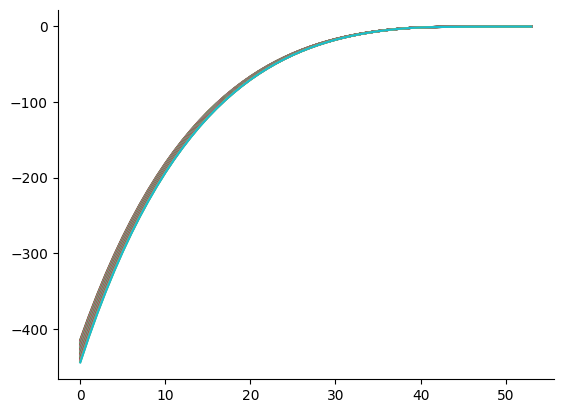

In [10]:
distort_inten = np.sum(πd_o * g_m * (v_m - v0), axis=0)
plt.plot(distort_inten)
np.save(f"inten_multi_{λ}", distort_inten)
plt.show()

In [11]:
np.save(f"ems_{λ}", ems)
np.save(f"v_{λ}", v0)

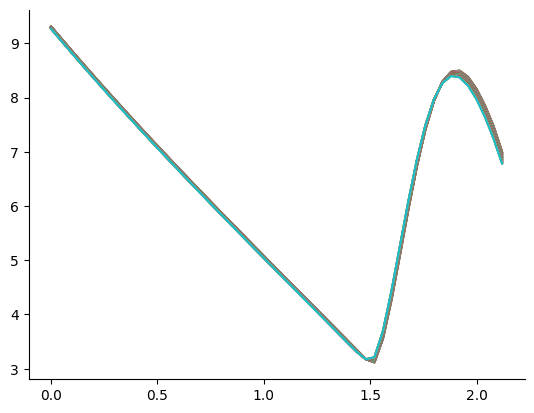

In [12]:
plt.plot(y1_grid_cap, ems)
plt.show()

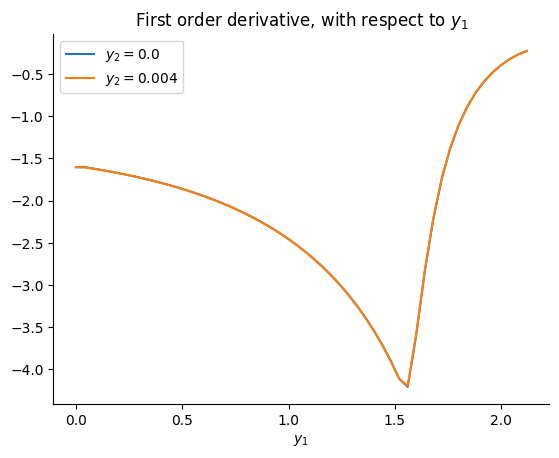

In [13]:
plt.title("First order derivative, with respect to $y_1$")
plt.plot(y1_grid_cap, v0_dy1[:,0], label=r"$y_2 = {}$".format(y2_grid[0]))
plt.plot(y1_grid_cap, v0_dy1[:,4], label=r"$y_2 = {}$".format(y2_grid[4]))
plt.xlabel(r"$y_1$")
plt.legend()
# plt.savefig("dv_dy1")
plt.show()

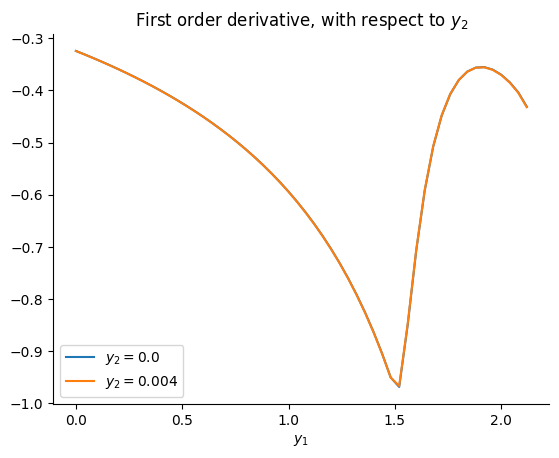

In [14]:
plt.title("First order derivative, with respect to $y_2$")
plt.plot(y1_grid_cap, v0_dy2[:,0], label=r"$y_2 = {}$".format(y2_grid[0]))
plt.plot(y1_grid_cap, v0_dy2[:,4], label=r"$y_2 = {}$".format(y2_grid[4]))
plt.xlabel(r"$y_1$")
plt.legend()
# plt.savefig("dv_dy2")
plt.show()

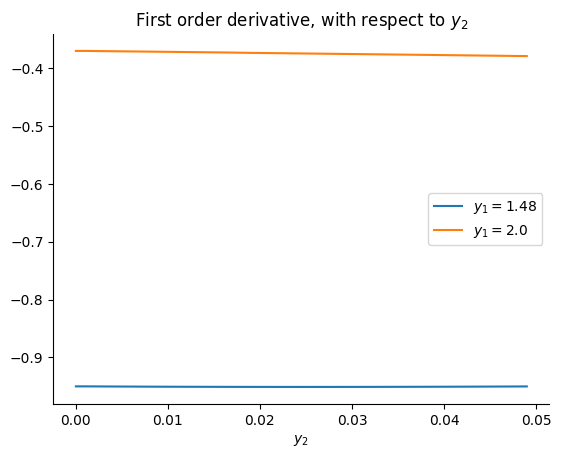

In [15]:
plt.title("First order derivative, with respect to $y_2$")
plt.plot(y2_grid, v0_dy2[37], label=r"$y_1 = {}$".format(y1_grid_cap[37]))
plt.plot(y2_grid, v0_dy2[-4], label=r"$y_1 = {}$".format(y1_grid_cap[-4]))
plt.xlabel(r"$y_2$")
plt.legend()
# plt.savefig("dv_dy2_y2")
plt.show()

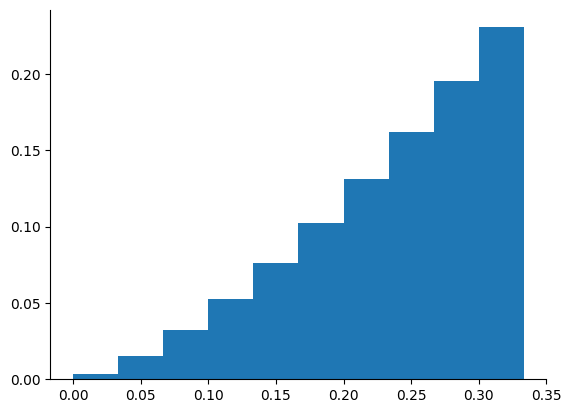

In [16]:
g_i = g_m[:, -1, 2]
plt.hist(γ3_list, weights= g_i/ np.sum(g_i, axis=0))
plt.show()

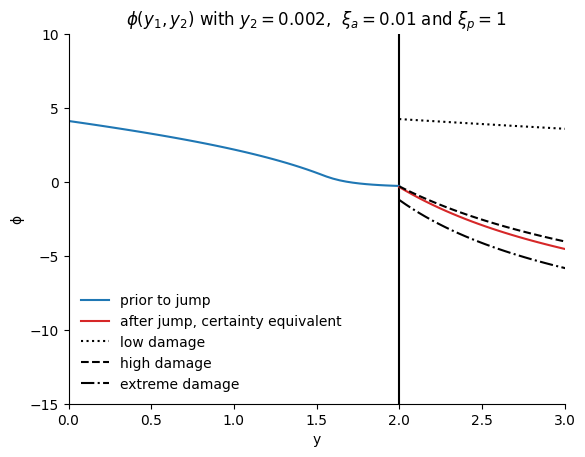

In [17]:
#
plt.plot(y1_grid[:loc_2 + 1],
         phi_mat[:loc_2 + 1, 2],
         color="tab:blue",
         label="prior to jump")
plt.plot(y1_grid[loc_2:],
         ϕ_equiv[loc_2:][:, 2],
         color="tab:red",
         label="after jump, certainty equivalent")
plt.plot(y1_grid[loc_2:],
         ϕ_list[0][loc_2:, 2],
         color="black",
         linestyle=":",
         label="low damage")
plt.plot(y1_grid[loc_2:],
         ϕ_list[10][loc_2:, 2],
         color="black",
         linestyle="--",
         label="high damage")
plt.plot(y1_grid[loc_2:],
         ϕ_list[-1][loc_2:, 2],
         color="black",
         linestyle="-.",
         label="extreme damage")

plt.legend(frameon=False)
plt.title("$ϕ(y_1, y_2)$ with $y_2 = 0.002$,  $ξ_a = 0.01$ and $ξ_p = 1$")
plt.vlines(2, ymax=10, ymin=-15, color="black")
plt.xlim(0, 3)
plt.ylim(-15, 10)
plt.xlabel("y")
plt.ylabel("ϕ")
# plt.savefig("./paper_plots/2_state_value_function.png", dpi=400, facecolor="w", edgecolor="w", bbox_inches="tight")
plt.show()

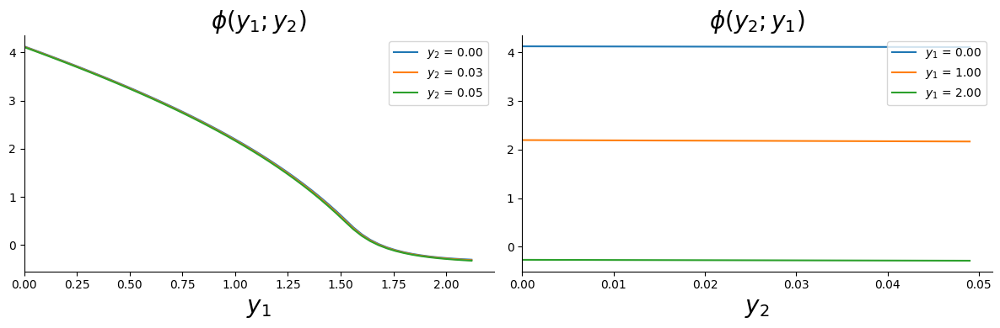

In [18]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
ax1.plot(y1_mat_cap[:,0], v0[:,0], label="$y_2$ = {:.2f}".format(y2_mat[0,0]))
ax1.plot(y1_mat_cap[:,0], v0[:,int(n_y2/2)], label="$y_2$ = {:.2f}".format(y2_mat[0,int(n_y2/2)]))
ax1.plot(y1_mat_cap[:,0], v0[:,-1], label="$y_2$ = {:.2f}".format(y2_mat[0,-1]))
ax1.set_title('$ϕ(y_1; y_2)$', size=20)
ax1.set_xlabel("$y_1$", size=20)
ax1.legend()
# ax1.tick_params(labelsize=20)
ax1.set_xlim(0)
# ax1.set_ylim(-0.18, 0.05)
ax2.plot(y2_mat[0], v0[0], label="$y_1$ = {:.2f}".format(y1_mat[0,0]))
ax2.plot(y2_mat[int(n_y1 / 4)], v0[int(n_y1/4)], label="$y_1$ = {:.2f}".format(y1_mat[int(n_y1/4),0]))
ax2.plot(y2_mat[int(n_y1 / 2)], v0[int(n_y1/2)], label="$y_1$ = {:.2f}".format(y1_mat[int(n_y1/2),0]))
# ax2.plot(y2_mat[-1], v0[-1], label="$y_1$ = {:.2f}".format(y1_mat[-1,0]))
ax2.set_title('$ϕ(y_2; y_1)$', size=20)
ax2.set_xlabel('$y_2$', size=20)
ax2.set_xlim(0)
ax2.legend()
# ax2.set_ylim(-0.18, 0.05)
fig.tight_layout()
# plt.savefig("ϕ.png", bbox_inches="tight", facecolor="w", edgecolor="w")
plt.show()

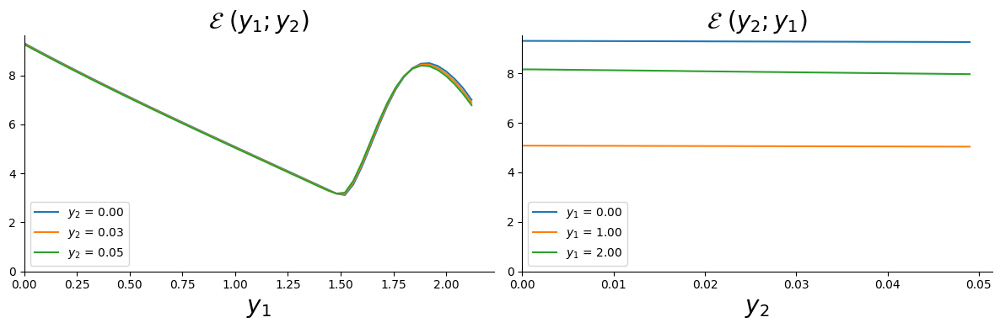

In [19]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
ax1.plot(y1_mat_cap[:,0], ems[:,0], label="$y_2$ = {:.2f}".format(y2_mat[0,0]))
ax1.plot(y1_mat_cap[:,0], ems[:,int(n_y2/2)], label="$y_2$ = {:.2f}".format(y2_mat[0,int(n_y2/2)]))
ax1.plot(y1_mat_cap[:,0], ems[:,-1], label="$y_2$ = {:.2f}".format(y2_mat[0,-1]))
ax1.set_title('$\mathcal{E}\ (y_1; y_2)$', size=20)
ax1.set_xlabel("$y_1$", size=20)
ax1.set_xlim(0)
ax1.set_ylim(0)
ax1.legend()
# ax1.set_ylim(0, 12)
ax2.plot(y2_mat[0], ems[0], label="$y_1$ = {:.2f}".format(y1_mat[0,0]))
ax2.plot(y2_mat[int(n_y1/4)], ems[int(n_y1/4)], label="$y_1$ = {:.2f}".format(y1_mat[int(n_y1/4),0]))
ax2.plot(y2_mat[int(n_y1/2)], ems[int(n_y1/2)], label="$y_1$ = {:.2f}".format(y1_mat[int(n_y1/2),0]))
ax2.set_title('$\mathcal{E}\ ( y_2; y_1)$', size=20)
ax2.set_xlabel('$y_2$', size=20)
ax2.set_xlim(0)
ax2.set_ylim(0)
ax2.legend()
# ax2.set_ylim(0,12)
fig.tight_layout()
# plt.savefig("E.png", bbox_inches="tight", facecolor="w", edgecolor="w")
plt.show()

In [20]:
from scipy import interpolate
def simualte_ems(y1_grid, y2_grid, ems, T=100, dt=1):
    periods = int(T/dt)
    Y1t = np.zeros(periods)
    Y2t = np.zeros(periods)
    ems_t = np.zeros(periods)
    f = interpolate.interp2d(y2_grid, y1_grid, ems, )
#     f_π = interpolate.interp2d(y2_grid, y1_grid, πa, )
    y1 = θ*290
    y2 = 0.00186
    for t in range(periods):
        if y1 > np.max(y1_mat) or y2 > np.max(y2_mat):
            break
        ems_point = f(y2, y1)
#         π_list = f_π(y2, y1)
        ems_t[t] = ems_point[0]
        Y1t[t] = y1
        Y2t[t] = y2
        y1 += y2*dt
        y2 += ( - λ*y2 + λ*θ*ems_point)*dt
    return Y1t, Y2t, ems_t

In [21]:
def simulation(y1_grid, y2_grid, e_grid, λ, θ=1.86/1000., y1_0=.5394, y2_0=1.86/1000, T=100):
    e_fun = interpolate.interp2d(y1_grid, y2_grid, e_grid.T)
    Et = np.zeros(T+1)
    y1t = np.zeros(T+1)
    y2t = np.zeros(T+1)
    for i in range(T+1):
#         y2_0 = max(y2_0, 0)
#         y2_0 = min(y2_0, 0.05)
        Et[i] = e_fun(y1_0, y2_0)
        y1t[i] = y1_0
        y2t[i] = y2_0
        y2_0 = np.exp(-λ)*y2_0 + (1 - np.exp(-λ))*θ*Et[i] 
#         y2_0 = max(y2_0, 0)
        y1_0 = y1_0 + y2_0
    return Et, y1t, y2t

In [22]:
def simulation_1d(y_grid, e_grid, θ=1.86/1000., y_0=1.1, T=100):
    e_fun = interpolate.interp1d(y_grid, e_grid)
    Et = np.zeros(T+1)
    yt = np.zeros(T+1)
    for i in range(T+1):
        Et[i] = e_fun(y_0)
        yt[i] = y_0
        y_0 = y_0 + θ*Et[i] 
    return Et, yt

In [23]:
ems_1state = np.load("ems_1state.npy")
# ems_2state = np.load("ems_2state.npy")

In [24]:
i = 0
et1, yt1 = simulation_1d(np.arange(0, 5 + 0.01,  0.01), ems_1state[0], θ=np.mean(θ_list), y_0=2)
et2, y1t2, y2t2 = simulation(y1_grid, y2_grid, ems_list[0], λ, θ=np.mean(θ), y1_0=2)

In [25]:
et_1state_cal, yt1 = simulation_1d(np.arange(0, 2.1+0.01,  0.01), np.load("ems_1state_cal.npy"), θ=np.mean(θ_list), y_0=1.1)

In [26]:
np.save("et_1state_cal", et_1state_cal)

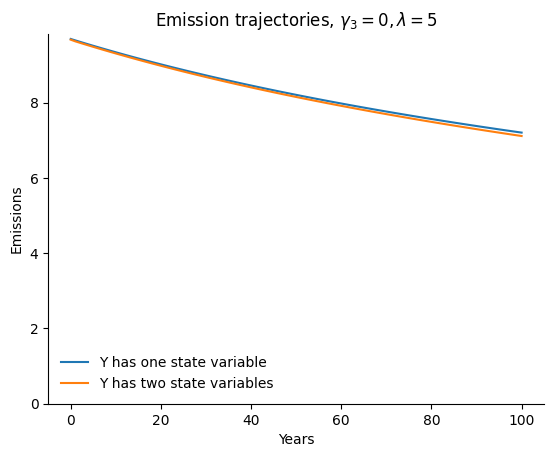

In [27]:
plt.title(f"Emission trajectories, $γ_3 = 0, λ = {λ}$")
plt.plot(et1, label="Y has one state variable")
plt.plot(et2, label="Y has two state variables")
plt.legend(frameon=False, loc=3)
plt.ylim(0)
plt.ylabel("Emissions")
plt.xlabel("Years")
# plt.savefig("ems_1_2_5")
plt.show()

In [28]:
et_prejump, y1t_prejump, y2t_prejump = simulation(y1_grid_cap,
                                                  y2_grid,
                                                  ems,
                                                  λ,
                                                  θ=np.mean(θ_list),
                                                  y1_0 = 1.1,
                                                  y2_0=np.mean(θ_list),
                                                  T=103
                                                 )

In [29]:
y1t_prejump

array([1.1       , 1.1086706 , 1.11731314, 1.12589219, 1.13440808,
       1.14286129, 1.15125228, 1.1595815 , 1.16784942, 1.17605653,
       1.18420329, 1.19229013, 1.20031749, 1.20828582, 1.2161955 ,
       1.22404697, 1.23184067, 1.23957701, 1.24725642, 1.25487931,
       1.26244608, 1.26995717, 1.27741297, 1.28481389, 1.29216033,
       1.2994527 , 1.30669138, 1.31387676, 1.32100925, 1.32808922,
       1.33511697, 1.34209289, 1.34901738, 1.3558908 , 1.36271353,
       1.36948593, 1.37620833, 1.38288109, 1.38950459, 1.39607919,
       1.40260525, 1.40908312, 1.41551314, 1.42189566, 1.42823103,
       1.4345196 , 1.44076171, 1.4469578 , 1.45310883, 1.45921514,
       1.46527701, 1.47129477, 1.47726872, 1.48319916, 1.4891023 ,
       1.49499185, 1.50086793, 1.50673054, 1.51257969, 1.51841541,
       1.52423771, 1.5301426 , 1.5361687 , 1.54231898, 1.5485961 ,
       1.55500274, 1.56154163, 1.56823513, 1.57515208, 1.5823008 ,
       1.58968918, 1.59732529, 1.60521738, 1.61340189, 1.62190

In [30]:
simul = {
    "et": et_prejump,
    "y1t": y1t_prejump,
    "y2t": y2t_prejump,
}

pickle.dump(simul, open(f"simul_{λ}", "wb"))

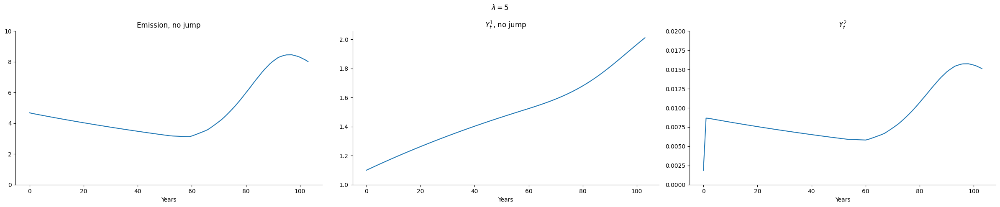

In [31]:
fig = plt.figure(figsize=(24, 5))
fig.suptitle(f"$\lambda = {λ}$")
plt.subplot(131)
plt.title("Emission, no jump")
plt.plot(et_prejump)
plt.ylim(0,10)
plt.xlabel("Years")
plt.subplot(132)
plt.xlabel("Years")
plt.title(r"$Y_t^1$, no jump")
plt.plot(y1t_prejump)
plt.ylim(1)
plt.subplot(133)
plt.title(r"$Y_t^2$")
plt.plot(y2t_prejump)
plt.ylim(0, 0.02)
plt.xlabel("Years")
plt.tight_layout()
# plt.savefig(f"e_y1_y2_{λ}")
plt.show()

In [32]:
y2_grid

array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017,
       0.018, 0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026,
       0.027, 0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035,
       0.036, 0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044,
       0.045, 0.046, 0.047, 0.048, 0.049])

In [33]:
y2t_prejump.max(), y2_grid[-1], y1t_prejump

(0.015749884374667584,
 0.049,
 array([1.1       , 1.1086706 , 1.11731314, 1.12589219, 1.13440808,
        1.14286129, 1.15125228, 1.1595815 , 1.16784942, 1.17605653,
        1.18420329, 1.19229013, 1.20031749, 1.20828582, 1.2161955 ,
        1.22404697, 1.23184067, 1.23957701, 1.24725642, 1.25487931,
        1.26244608, 1.26995717, 1.27741297, 1.28481389, 1.29216033,
        1.2994527 , 1.30669138, 1.31387676, 1.32100925, 1.32808922,
        1.33511697, 1.34209289, 1.34901738, 1.3558908 , 1.36271353,
        1.36948593, 1.37620833, 1.38288109, 1.38950459, 1.39607919,
        1.40260525, 1.40908312, 1.41551314, 1.42189566, 1.42823103,
        1.4345196 , 1.44076171, 1.4469578 , 1.45310883, 1.45921514,
        1.46527701, 1.47129477, 1.47726872, 1.48319916, 1.4891023 ,
        1.49499185, 1.50086793, 1.50673054, 1.51257969, 1.51841541,
        1.52423771, 1.5301426 , 1.5361687 , 1.54231898, 1.5485961 ,
        1.55500274, 1.56154163, 1.56823513, 1.57515208, 1.5823008 ,
        1.5896891

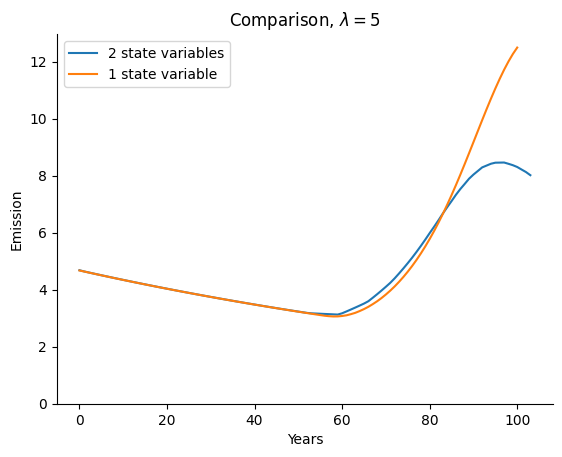

In [34]:
et_1state = np.load("et_1state.npy")
plt.plot(et_prejump, label="2 state variables")
plt.plot(et_1state_cal, label="1 state variable")
plt.ylim(0)
plt.legend()
plt.xlabel("Years")
plt.ylabel("Emission")
plt.title(f'Comparison, $\lambda = {λ}$')
# plt.savefig(f"emissions_2_{λ}")
plt.show()

In [35]:
# simulate
def simulate_logkapital(invkap, αₖ,  σₖ, κ, k0, T=100, dt=1):
    periods = int(T/dt)
    Kt = np.zeros(periods)
    i = invkap
     # log capital
    Kt[0] = np.log(k0)
    k = np.log(k0)
    for t in range(periods-1):
        k +=   (αₖ + i - κ/2*i**2 - .5*σₖ**2)*dt
        Kt[t+1] = k
    return Kt

In [36]:
invkap = 0.09
α = 0.115
αₖ = - 0.043
σₖ = 0.0095
κ = 6.667
k0 = 85/α

In [37]:
Kt = simulate_logkapital(invkap, αₖ, σₖ, κ,  k0, T=104)
MC = δ*(1-η)/((α - invkap)*np.exp(Kt))
scc = η*(α - invkap)*np.exp(Kt)/(1-η)/et_prejump*1000

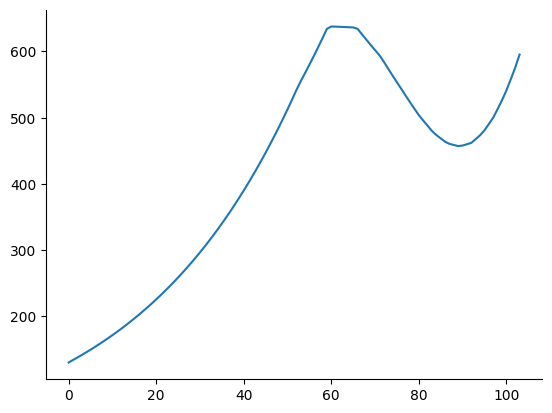

In [38]:
plt.plot(scc)
plt.show()

In [39]:
np.save(f"scct_{λ}", scc)